In [1]:
import deepdih
from rdkit import Chem
import os
import numpy as np
from tblite.ase import TBLite
import matplotlib.pyplot as plt

In [2]:
molecules = []
for file in os.listdir("molecules"):
    if file.endswith(".mol"):
        molecules.append(Chem.MolFromMolFile("molecules/"+file, sanitize=True, removeHs=False))
fragments = deepdih.mollib.create_lib(molecules)
deepdih.utils.write_sdf(fragments, "fragments.sdf")

Find 4 torsions.
Fragmenting on torsion [2, 3, 7, 9]
Selected Atoms after adding rotamer: [3, 7]
Selected Atoms after adding 1-4 atoms: [2, 3, 4, 7, 8, 9]
Selected Atoms after adding 1-5 atoms: [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 19, 23]
Selected Atoms after adding rings: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 19, 23]
Selected Atoms after adding C=O: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 19, 23]
Selected Atoms after adding non-C/H: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 19, 23]
Selected Atoms after adding S=O: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 19, 23]
Selected Atoms after adding N(=O)=O: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 19, 23]
Selected Atoms after adding Hs: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 19, 20, 21, 22, 23]
Selected Atoms : [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 19, 20, 21, 22, 23]
Num atoms : 42
Num selected atoms : 16
[[16, 10], [17, 10]]
>>> try to regularize aromaticity
Fragmenting on torsion [7, 9, 10, 11]
Selected Atoms after adding rotamer: [9, 10]
Selected Atoms after adding 1-4 atoms: [

In [3]:
# optimize the fragments using GFN2-xTB （energy with bias)
opt_calculator = TBLite(method="GFN2-xTB")

if not os.path.exists("fragments"):
    os.makedirs("fragments")

for n_frag, frag in enumerate(fragments):
    rotamers = deepdih.utils.get_rotamers(frag)
    dih_results = []
    for rot in rotamers:
        dih_result_rot = deepdih.geomopt.dihedral_scan(frag, opt_calculator, rot, 12)
        dih_results.extend(dih_result_rot)
    recalc_confs = [deepdih.geomopt.recalc_energy(c, opt_calculator) for c in dih_results]
    deepdih.utils.write_sdf(recalc_confs, f"fragments/fragment_{n_frag}_dihedral_scan.sdf")

geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 3 4 8 9
dihedral 9 8 10 11
dihedral 1 2 3 14
dihedral 1 6 5 15
dihedral 2 1 13 6
dihedral 12 3 2 4
dihedral 3 4 5 8
dihedral 4 5 6 7
dihedral 9 8 10 4
dihedral 1 2 3 14
dihedral 1 6 5 15
dihedral 2 1 13 6
dihedral 12 3 2 4
dihedral 3 4 5 8
dihedral 4 5 6 7
dihedral 9 8 10 4
dihedral 1 2 3 14
dihedral 1 6 5 15
dihedral 2 1 13 6
dihedral 12 3 2 4
dihedral 3 4 5 8
dihedral 4 5 6 7
dihedral 9 8 10 4
dihedral 1 2 3 14
dihedral 1 6 5 15
dihedral 2 1 13 6
dihedral 12 3 2 4
dihedral 3 4 5 8
dihedral 4 5 6 7
dihedral 9 8 10 4
dihedral 11 10 16 8
dihedral 1 2 3 14
dihedral 1 6 5 15
dihedral 2 1 13 6
dihedral 12 3 2 4
dihedral 3 4 5 8
dihedral 4 5 6 7
dihedral 9 8 10 4
dihedral 11 10 16 8
dihedral 1 2 3 14
dihedral 1 6 5 15
dihed

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.60531098840  -3.7012481E+01   1.7460959E-01
      2     -36.76485897796  -1.5954799E-01   8.2406830E-02
      3     -36.77531354085  -1.0454563E-02   4.8726530E-02
      4     -36.78852483618  -1.3211295E-02   1.9511652E-02
      5     -36.79270680358  -4.1819674E-03   5.8204442E-03
      6     -36.79294423262  -2.3742904E-04   2.9309476E-03
      7     -36.79297881386  -3.4581244E-05   1.8241628E-03
      8     -36.79298982961  -1.1015748E-05   1.1787375E-03
      9     -36.79300281740  -1.2987788E-05   5.9207833E-04
     10     -36.79300386693  -1.0495341E-06   3.2172254E-04
     11     -36.79300506166  -1.1947292E-06   1.3938511E-04
     12     -36.79300515702  -9.5360853E-08   8.0193755E-05
     13     -36.79300521213  -5.5113759E-08   4.7996093E-05
     14     -36.79300522694  -1.480309

Step    0 : Gradient = 1.311e-02/2.842e-02 (rms/max) Energy = -36.7930052356
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 4.65107e-01 5.00782e-01 9.40288e-01
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 6.514e-02/1.867e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 7.759e-03/1.727e-02 (rms/max) E (change) = -36.7951980911 (-2.193e-03) Quality = 0.372
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.79500065882  -3.7227237E+01   1.6831046E-02
      2     -36.79512845300  -1.2779419E-04   1.0194270E-02
      3     -36.79496581674   1.6263627E-04   3.9575095E-03
      4     -36.79518908126  -2.2326452E-04   9.3841564E-04
      5     -36.79519348965  -4.4083948E-06   7.0286635E-04
      6     -36.79519607565  -2.5860011E-06   4.5584883E-04
      7     -36.79519756329  -1.4876394E-06   2.4400880E-04
      8     -36.79519801759  -4.5429845E-07   9.3828425E-05
      9     -36.79519807065  -5.3059800E-08   4.9021702E-05
     10     -36.79519808862  -1.7975729E-08   2.1651788E-05
     11     -36.79519809114  -2.5186466E-09   1.4801297E-05
------------------------------------------------------------

 total:                                   0.116 sec


Hessian Eigenvalues: 2.29011e-02 2.30000e-02 2.30000e-02 ... 4.76359e-01 6.10048e-01 9.25242e-01
Step    2 : Displace = 3.720e-02/1.235e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.609e-03/4.733e-03 (rms/max) E (change) = -36.7974587119 (-2.261e-03) Quality = 0.799
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27664e-02 2.29867e-02 2.30000e-02 ... 4.65385e-01 6.29736e-01 9.24500e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.79743571966  -3.7233037E+01   1.0500462E-02
      2     -36.79745090519  -1.5185529E-05   6.2467276E-03
      3     -36.79743140596   1.9499224E-05   1.2046174E-03
      4     -36.79745733076  -2.5924800E-05   3.9632838E-04
      5     -36.79745791161  -5.8085126E-07   2.9870077E-04
      6     -36.79745836890  -4.5728895E-07   1.8154258E-04
      7     -36.79745859722  -2.2832193E-07   1.1711948E-04
      8     -36.79745870243  -1.0520960E-07   3.7812029E-05
      9     -36.79745871188  -9.4422532E-09   1.5991869E-05
------------------------------------------------------------

 total:                                   0.096 sec


Step    3 : Displace = 3.180e-02/6.041e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 2.411e-03/5.523e-03 (rms/max) E (change) = -36.7974579293 (+7.825e-07) Quality = -0.001
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.20999e-02 2.29870e-02 2.29970e-02 ... 5.46508e-01 5.93025e-01 9.24683e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.79744981396  -3.7226124E+01   6.2804859E-03
      2     -36.79745545372  -5.6397566E-06   3.6979316E-03
      3     -36.79744816191   7.2918064E-06   8.1026119E-04
      4     -36.79745777118  -9.6092743E-06   1.5695316E-04
      5     -36.79745782873  -5.7544725E-08   1.1238289E-04
      6     -36.79745787617  -4.7436920E-08   7.2553031E-05
      7     -36.79745790993  -3.3763286E-08   4.8605867E-05
      8     -36.79745792933  -1.9405569E-08   1.3787123E-05
------------------------------------------------------------

 total:                                   0.090 sec


Step    4 : Displace = 1.732e-02/3.023e-02 (rms/max) Trust = 1.590e-02 (-) Grad_T = 7.912e-04/1.531e-03 (rms/max) E (change) = -36.7977850246 (-3.271e-04) Quality = 0.964
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.20428e-02 2.29877e-02 2.29981e-02 ... 5.33757e-01 6.08237e-01 9.26020e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.79778346274  -3.7226743E+01   3.0471403E-03
      2     -36.79778441987  -9.5713035E-07   1.7924797E-03
      3     -36.79778146717   2.9526989E-06   3.9380742E-04
      4     -36.79778500937  -3.5421920E-06   5.9118335E-05
      5     -36.79778501740  -8.0376168E-09   3.7348154E-05
      6     -36.79778502463  -7.2267810E-09   1.8615130E-05
------------------------------------------------------------

 total:                                   0.058 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.79783267587  -3.7228407E+01   1.1363272E-03
      2     -36.79783298224  -3.0637035E-07   6.7144138E-04


Step    5 : Displace = 8.241e-03/1.968e-02 (rms/max) Trust = 2.248e-02 (+) Grad_T = 2.594e-04/4.867e-04 (rms/max) E (change) = -36.7978331196 (-4.809e-05) Quality = 1.192
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.26724e-02 2.29840e-02 2.29959e-02 ... 5.79906e-01 6.71821e-01 9.30366e-01


      3     -36.79783266642   3.1582086E-07   1.7888241E-04
      4     -36.79783309685  -4.3042500E-07   4.9281063E-05
      5     -36.79783310743  -1.0588529E-08   3.7201909E-05
      6     -36.79783311452  -7.0846298E-09   2.5551563E-05
      7     -36.79783311961  -5.0941580E-09   1.3750595E-05
------------------------------------------------------------

 total:                                   0.074 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.79786183875  -3.7228253E+01   8.8631586E-04
      2     -36.79786195422  -1.1546457E-07   5.2667582E-04
      3     -36.79786170097   2.5324173E-07   1.1552323E-04
      4     -36.79786201373  -3.1275476E-07   3.5129743E-05
      5     -36.79786201973  -6.0014216E-09   2.6661196E-05


Step    6 : Displace = 9.105e-03/2.279e-02 (rms/max) Trust = 3.180e-02 (+) Grad_T = 4.362e-04/8.609e-04 (rms/max) E (change) = -36.7978620236 (-2.890e-05) Quality = 1.472
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.72534e-03 2.29842e-02 2.29953e-02 ... 5.79186e-01 9.00625e-01 9.32689e-01
Step    7 : Displace = 3.321e-02/8.739e-02 (rms/max) Trust = 4.497e-02 (+) Grad_T = 7.964e-04/1.608e-03 (rms/max) E (change) = -36.7979311636 (-6.914e-05) Quality = 1.214
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.34644e-03 2.29834e-02 2.29958e-02 ... 5.89617e-01 9.11283e-01 9.44047e-01


      6     -36.79786202358  -3.8548720E-09   1.6705666E-05
------------------------------------------------------------

 total:                                   0.056 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.79793028569  -3.7227692E+01   2.3352886E-03
      2     -36.79793097044  -6.8474795E-07   1.3964711E-03
      3     -36.79793022580   7.4464186E-07   1.9999013E-04
      4     -36.79793111442  -8.8862581E-07   5.6018856E-05
      5     -36.79793116129  -4.6870809E-08   2.7703567E-05
      6     -36.79793116363  -2.3405988E-09   1.1718886E-05
------------------------------------------------------------

 total:                                   0.053 sec


Step    8 : Displace = 3.707e-02/9.227e-02 (rms/max) Trust = 6.359e-02 (+) Grad_T = 8.618e-04/1.830e-03 (rms/max) E (change) = -36.7979971310 (-6.597e-05) Quality = 1.124
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.17745e-03 2.29727e-02 2.29949e-02 ... 5.74615e-01 7.19494e-01 9.30128e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.79799657111  -3.7228334E+01   2.4774718E-03
      2     -36.79799697031  -3.9919971E-07   1.4839134E-03
      3     -36.79799665009   3.2021784E-07   1.4796763E-04
      4     -36.79799711649  -4.6640255E-07   4.7756047E-05
      5     -36.79799712702  -1.0533455E-08   2.8326330E-05
      6     -36.79799713095  -3.9280792E-09   1.5398862E-05
------------------------------------------------------------

 total:                                   0.078 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------


Step    9 : Displace = 1.644e-02/4.051e-02 (rms/max) Trust = 8.993e-02 (+) Grad_T = 4.127e-04/9.987e-04 (rms/max) E (change) = -36.7980264204 (-2.929e-05) Quality = 0.941
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.28404e-03 2.29307e-02 2.29868e-02 ... 5.74669e-01 6.41892e-01 9.27672e-01


      1     -36.79802567937  -3.7228375E+01   1.6520868E-03
      2     -36.79802618356  -5.0418576E-07   9.7720387E-04
      3     -36.79802575942   4.2414168E-07   1.8856672E-04
      4     -36.79802635540  -5.9598426E-07   7.1092009E-05
      5     -36.79802638382  -2.8417375E-08   5.5966481E-05
      6     -36.79802640270  -1.8881664E-08   3.8603329E-05
      7     -36.79802641428  -1.1582635E-08   2.3743811E-05
      8     -36.79802642038  -6.1000733E-09   8.5329041E-06
------------------------------------------------------------

 total:                                   0.090 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------


Step   10 : Displace = 5.406e-03/1.041e-02 (rms/max) Trust = 1.272e-01 (+) Grad_T = 1.869e-04/4.500e-04 (rms/max) E (change) = -36.7980311759 (-4.756e-06) Quality = 0.605
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.26353e-03 2.28793e-02 2.29871e-02 ... 5.69541e-01 6.60354e-01 9.22446e-01


      1     -36.79803078633  -3.7227880E+01   7.5667613E-04
      2     -36.79803101977  -2.3344042E-07   4.4821738E-04
      3     -36.79803076135   2.5841470E-07   1.4143443E-04
      4     -36.79803113086  -3.6950661E-07   5.9047165E-05
      5     -36.79803115061  -1.9750281E-08   4.7651287E-05
      6     -36.79803116912  -1.8515230E-08   2.6704731E-05
      7     -36.79803117594  -6.8187376E-09   1.3766819E-05
------------------------------------------------------------

 total:                                   0.086 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.79803232927  -3.7228068E+01   3.2496129E-04
      2     -36.79803235625  -2.6979151E-08   1.9351156E-04
      3     -36.79803226871   8.7540279E-08   7.0696288E-05


Step   11 : Displace = 1.439e-03/3.199e-03 (rms/max) Trust = 1.272e-01 (=) Grad_T = 9.376e-05/2.090e-04 (rms/max) E (change) = -36.7980323910 (-1.215e-06) Quality = 0.720
Hessian Eigenvalues: 1.26353e-03 2.28793e-02 2.29871e-02 ... 5.69541e-01 6.60354e-01 9.22446e-01
Converged! =D
Time elapsed since start of run_optimizer: 6.273 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 3 4 8 9
dihedral 9 8 10 11
dihedral 1 2 3 14
dihedral 1 6 5 15
dihedral 2 1 13 6
dihedral 12 3 2 4
dihedral 3 4 5 8
dihedral 4 5 6 7
dihedral 9 8 10 4
dihedral 1 2 3 14
dihedral 1 6 5 15
dihedral 2 1 13 6
dihedral 12 3 2 4
dihedral 3 4 5 8
dihedral 4 5 6 7
dihedral 9 8 10 4
dihedral 1 2 3 14
dihedral 1 6 5 15
dihedral 2 1 13 6
dihedral 12 3 2 4
dihedral 3 4 5 8
dihedral 4 5 6 7
dihedral

      4     -36.79803238444  -1.1573298E-07   2.5599278E-05
      5     -36.79803238758  -3.1374014E-09   2.0052178E-05
      6     -36.79803239104  -3.4593626E-09   1.2998363E-05
------------------------------------------------------------

 total:                                   0.063 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.79466598639  -3.7224687E+01   3.4575354E-02
      2     -36.79490620586  -2.4021947E-04   2.0364050E-02
      3     -36.79419032533   7.1588052E-04   6.2203358E-03
      4     -36.79510534512  -9.1501979E-04   1.7480227E-03
      5     -36.79511625212  -1.0906994E-05   1.1932521E-03
      6     -36.79512376822  -7.5161002E-06   7.6228653E-04
      7     -36.79512778245  -4.0142339E-06   4.4048468E-04
      8     -36.79512918542  -1.4029640E-06   2.1344367E-04
      9     -36.79512933654  -1.5111895E-07 

Step    0 : Gradient = 4.198e-03/1.057e-02 (rms/max) Energy = -36.7951294943
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 4.83069e-01 5.53693e-01 1.00413e+00
<<< Enforcing constraint satisfaction >>>


     13     -36.79512949433  -7.2556858E-09   1.1399278E-05
------------------------------------------------------------

 total:                                   0.122 sec


Step    1 : Displace = 9.471e-02/2.245e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 3.881e-03/8.612e-03 (rms/max) E (change) = -36.7962463940 (-1.117e-03) Quality = 0.342
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.21378e-02 2.30000e-02 2.30000e-02 ... 5.51315e-01 6.72733e-01 1.00443e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.79620136533  -3.7222933E+01   8.4740014E-03
      2     -36.79622021897  -1.8853639E-05   5.1051729E-03
      3     -36.79620108359   1.9135381E-05   1.4660995E-03
      4     -36.79623853069  -3.7447108E-05   8.8000949E-04
      5     -36.79624208779  -3.5571001E-06   6.3695941E-04
      6     -36.79624565381  -3.5660174E-06   2.6270273E-04
      7     -36.79624622835  -5.7454016E-07   1.2847932E-04
      8     -36.79624632738  -9.9028753E-08   7.8626415E-05
      9     -36.79624635861  -3.1227579E-08   5.2592703E-05
     10     -36.79624637728  -1.8668132E-08   3.8203127E-05
     11     -36.79624638956  -1.2281163E-08   2.0150359E-05
     12     -36.79624639396  -4.4025796E-09   8.3147774E-06
------------------------------------------------------------

 total:                             

Step    2 : Displace = 4.601e-02/6.733e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.846e-03/3.632e-03 (rms/max) E (change) = -36.7966663249 (-4.199e-04) Quality = 0.629
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.13251e-02 2.29987e-02 2.30000e-02 ... 5.38133e-01 6.74191e-01 1.00004e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.79664334495  -3.7223656E+01   6.6456606E-03
      2     -36.79665394901  -1.0604055E-05   3.9578062E-03
      3     -36.79662749038   2.6458624E-05   1.2412920E-03
      4     -36.79666329891  -3.5808527E-05   5.1227992E-04
      5     -36.79666437323  -1.0743231E-06   4.0207434E-04
      6     -36.79666564773  -1.2745012E-06   2.4487294E-04
      7     -36.79666619802  -5.5028804E-07   1.0766659E-04
      8     -36.79666630541  -1.0739285E-07   4.9849046E-05
      9     -36.79666631759  -1.2173970E-08   2.7857818E-05
     10     -36.79666632206  -4.4729731E-09   2.0465230E-05
     11     -36.79666632491  -2.8507188E-09   1.3157675E-05
------------------------------------------------------------

 total:                                   0.115 sec


Step    3 : Displace = 1.444e-02/3.762e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 8.324e-04/1.810e-03 (rms/max) E (change) = -36.7968312654 (-1.649e-04) Quality = 0.635
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.12103e-02 2.29856e-02 2.29989e-02 ... 5.42982e-01 6.36110e-01 9.99647e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.79682404873  -3.7224846E+01   3.4779929E-03
      2     -36.79682753700  -3.4882717E-06   2.1162620E-03
      3     -36.79681404398   1.3493020E-05   7.9508912E-04
      4     -36.79683078098  -1.6737006E-05   2.0266880E-04
      5     -36.79683092902  -1.4803650E-07   1.6494040E-04
      6     -36.79683117512  -2.4609576E-07   8.9889654E-05
      7     -36.79683124845  -7.3332743E-08   4.1436763E-05
      8     -36.79683126183  -1.3383314E-08   2.3361971E-05
      9     -36.79683126537  -3.5391849E-09   1.3837304E-05
------------------------------------------------------------

 total:                                   0.093 sec


Step    4 : Displace = 8.047e-03/1.425e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 4.686e-04/1.212e-03 (rms/max) E (change) = -36.7968642673 (-3.300e-05) Quality = 0.689
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.12467e-02 2.29313e-02 2.29989e-02 ... 5.58652e-01 6.33491e-01 9.99655e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.79686324942  -3.7224524E+01   1.7709153E-03
      2     -36.79686370495  -4.5553266E-07   1.0566258E-03
      3     -36.79686355715   1.4780350E-07   2.1736671E-04
      4     -36.79686409745  -5.4029438E-07   1.3121153E-04
      5     -36.79686417341  -7.5960259E-08   9.6998020E-05
      6     -36.79686424016  -6.6751561E-08   5.3930337E-05
      7     -36.79686426731  -2.7152062E-08   1.6602170E-05
------------------------------------------------------------

 total:                                   0.084 sec


Step    5 : Displace = 2.011e-03/3.916e-03 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.634e-04/6.090e-04 (rms/max) E (change) = -36.7968688442 (-4.577e-06) Quality = 0.442
Hessian Eigenvalues: 2.12467e-02 2.29313e-02 2.29989e-02 ... 5.58652e-01 6.33491e-01 9.99655e-01
Converged! =D
Time elapsed since start of run_optimizer: 1.800 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 3 4 8 9
dihedral 9 8 10 11
dihedral 1 2 3 14
dihedral 1 6 5 15
dihedral 2 1 13 6
dihedral 12 3 2 4
dihedral 3 4 5 8
dihedral 4 5 6 7
dihedral 9 8 10 4
dihedral 1 2 3 14
dihedral 1 6 5 15
dihedral 2 1 13 6
dihedral 12 3 2 4
dihedral 3 4 5 8
dihedral 4 5 6 7
dihedral 9 8 10 4
dihedral 1 2 3 14
dihedral 1 6 5 15
dihedral 2 1 13 6
dihedral 12 3 2 4
dihedral 3 4 5 8
dihedral 4 5 6 7
dihedral

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.79686835519  -3.7224437E+01   9.3982676E-04
      2     -36.79686858115  -2.2596375E-07   5.6550009E-04
      3     -36.79686809262   4.8853531E-07   1.8613118E-04
      4     -36.79686878159  -6.8897094E-07   7.8888801E-05
      5     -36.79686880544  -2.3849076E-08   6.2001151E-05
      6     -36.79686883402  -2.8576906E-08   3.2833179E-05
      7     -36.79686884418  -1.0167646E-08   1.1926477E-05
------------------------------------------------------------

 total:                                   0.080 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.77860396744  -3.7206200E+01   4.1110265E-02
      2     -36.77962891639  -1.0249489E-0

Step    0 : Gradient = 1.188e-02/3.758e-02 (rms/max) Energy = -36.7799994561
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 4.85678e-01 5.53337e-01 9.91536e-01
<<< Enforcing constraint satisfaction >>>


      4     -36.77988443631  -3.2258996E-04   3.3948696E-03
      5     -36.77995000684  -6.5570527E-05   2.3098991E-03
      6     -36.77997552564  -2.5518799E-05   1.6152330E-03
      7     -36.77999564729  -2.0121653E-05   5.7096309E-04
      8     -36.77999848930  -2.8420075E-06   3.3032864E-04
      9     -36.77999905735  -5.6805056E-07   1.8870938E-04
     10     -36.77999930003  -2.4267935E-07   1.1577176E-04
     11     -36.77999936628  -6.6252454E-08   8.8934629E-05
     12     -36.77999944175  -7.5467071E-08   4.3928559E-05
     13     -36.77999945615  -1.4401543E-08   1.8335215E-05
------------------------------------------------------------

 total:                                   0.107 sec


Step    1 : Displace = 1.000e-01/2.219e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 5.972e-03/1.219e-02 (rms/max) E (change) = -36.7885712285 (-8.572e-03) Quality = 0.504
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.26687e-02 2.30000e-02 2.30000e-02 ... 5.53020e-01 9.91163e-01 2.02611e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.78795167693  -3.7213048E+01   1.2249356E-02
      2     -36.78835818782  -4.0651088E-04   7.8767452E-03
      3     -36.78841246316  -5.4275340E-05   4.2473917E-03
      4     -36.78848973892  -7.7275759E-05   2.6727785E-03
      5     -36.78853321879  -4.3479875E-05   1.9262058E-03
      6     -36.78855663368  -2.3414889E-05   1.2514407E-03
      7     -36.78857034091  -1.3707228E-05   2.7778803E-04
      8     -36.78857093883  -5.9791904E-07   1.6683978E-04
      9     -36.78857106711  -1.2828204E-07   1.1605023E-04
     10     -36.78857115121  -8.4104705E-08   8.0099440E-05
     11     -36.78857119027  -3.9053660E-08   5.1650922E-05
     12     -36.78857122855  -3.8278365E-08   1.9930203E-05
------------------------------------------------------------

 total:                             

Step    2 : Displace = 8.571e-02/2.357e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.015e-02/3.078e-02 (rms/max) E (change) = -36.7825605096 (+6.011e-03) Quality = -1.149
Rejecting step - quality is lower than -1.0
Hessian Eigenvalues: 2.26687e-02 2.30000e-02 2.30000e-02 ... 5.53020e-01 9.91163e-01 2.02611e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.78224138096  -3.7202346E+01   1.3126750E-02
      2     -36.78237443861  -1.3305765E-04   8.1900742E-03
      3     -36.78219397898   1.8045963E-04   4.5523514E-03
      4     -36.78252196041  -3.2798143E-04   2.1070101E-03
      5     -36.78253934571  -1.7385299E-05   1.5516897E-03
      6     -36.78255822101  -1.8875302E-05   4.8406347E-04
      7     -36.78255993208  -1.7110696E-06   2.3154511E-04
      8     -36.78256027595  -3.4386895E-07   1.3935372E-04
      9     -36.78256037081  -9.4857889E-08   1.0166072E-04
     10     -36.78256043792  -6.7116716E-08   7.3732845E-05
     11     -36.78256048828  -5.0355979E-08   4.4225136E-05
     12     -36.78256050958  -2.1299201E-08   1.5361652E-05
------------------------------------------------------------

 total:                             

Step    3 : Displace = 4.525e-02/1.255e-01 (rms/max) Trust = 4.286e-02 (x) Grad_T = 4.891e-03/1.233e-02 (rms/max) E (change) = -36.7890314967 (-4.603e-04) Quality = 0.116
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.25874e-02 2.29997e-02 2.30000e-02 ... 8.64159e-01 9.94430e-01 2.10625e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.78897148182  -3.7211018E+01   6.5425003E-03
      2     -36.78899822529  -2.6743471E-05   3.9475482E-03
      3     -36.78895675318   4.1472112E-05   2.0302317E-03
      4     -36.78902486647  -6.8113290E-05   8.7993235E-04
      5     -36.78902783327  -2.9668039E-06   6.4791245E-04
      6     -36.78903079304  -2.9597628E-06   2.7638212E-04
      7     -36.78903138379  -5.9075302E-07   1.0379880E-04
      8     -36.78903146699  -8.3200625E-08   5.6602086E-05
      9     -36.78903148100  -1.4005117E-08   3.9644518E-05
     10     -36.78903149056  -9.5636210E-09   2.8715008E-05
     11     -36.78903149674  -6.1840382E-09   1.9869689E-05
------------------------------------------------------------

 total:                                   0.095 sec


Step    4 : Displace = 2.222e-02/7.871e-02 (rms/max) Trust = 2.143e-02 (-) Grad_T = 1.743e-03/4.220e-03 (rms/max) E (change) = -36.7901595599 (-1.128e-03) Quality = 0.927
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.25635e-02 2.29996e-02 2.30000e-02 ... 8.29003e-01 9.88694e-01 1.99034e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.79013601212  -3.7212220E+01   4.7605010E-03
      2     -36.79014744371  -1.1431589E-05   2.8764705E-03
      3     -36.79011476745   3.2676255E-05   1.3865583E-03
      4     -36.79015827980  -4.3512351E-05   3.7352363E-04
      5     -36.79015875795  -4.7814630E-07   2.8773513E-04
      6     -36.79015928429  -5.2633790E-07   1.7240128E-04
      7     -36.79015952345  -2.3916618E-07   6.0257441E-05
      8     -36.79015955177  -2.8317480E-08   3.2135520E-05
      9     -36.79015955739  -5.6221836E-09   2.0983616E-05
     10     -36.79015955992  -2.5254963E-09   1.4654828E-05
------------------------------------------------------------

 total:                                   0.082 sec


Step    5 : Displace = 3.219e-02/6.584e-02 (rms/max) Trust = 3.030e-02 (+) Grad_T = 1.664e-03/3.525e-03 (rms/max) E (change) = -36.7901566041 (+2.956e-06) Quality = -0.010
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.25652e-02 2.29613e-02 2.30001e-02 ... 8.49346e-01 9.85694e-01 1.95980e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.79014762024  -3.7213770E+01   3.3258565E-03
      2     -36.79015220139  -4.5811421E-06   2.0455454E-03
      3     -36.79014323147   8.9699162E-06   7.1837504E-04
      4     -36.79015558175  -1.2350278E-05   3.0818583E-04
      5     -36.79015598412  -4.0237219E-07   2.4069642E-04
      6     -36.79015641821  -4.3408501E-07   1.2866097E-04
      7     -36.79015655590  -1.3769126E-07   7.1802599E-05
      8     -36.79015659640  -4.0500680E-08   3.1019255E-05
      9     -36.79015660182  -5.4262443E-09   2.0962073E-05
     10     -36.79015660411  -2.2869315E-09   1.5228775E-05
------------------------------------------------------------

 total:                                   0.104 sec


Step    6 : Displace = 1.659e-02/3.667e-02 (rms/max) Trust = 1.515e-02 (-) Grad_T = 4.510e-04/1.250e-03 (rms/max) E (change) = -36.7903142341 (-1.576e-04) Quality = 0.902
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.25653e-02 2.29375e-02 2.30001e-02 ... 8.21445e-01 9.85753e-01 1.97137e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.79031284287  -3.7213547E+01   1.7531988E-03
      2     -36.79031372381  -8.8093563E-07   1.0332659E-03
      3     -36.79031271828   1.0055241E-06   2.4437173E-04
      4     -36.79031412186  -1.4035736E-06   1.0322321E-04
      5     -36.79031418183  -5.9975775E-08   7.5096133E-05
      6     -36.79031421333  -3.1500150E-08   4.6017400E-05
      7     -36.79031422621  -1.2880335E-08   3.0058485E-05
      8     -36.79031423405  -7.8399935E-09   9.8483035E-06
------------------------------------------------------------

 total:                                   0.091 sec


Step    7 : Displace = 4.471e-03/1.057e-02 (rms/max) Trust = 2.143e-02 (+) Grad_T = 3.686e-04/8.575e-04 (rms/max) E (change) = -36.7903190544 (-4.820e-06) Quality = 0.317
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.80957e-02 2.25827e-02 2.29999e-02 ... 8.36325e-01 9.87659e-01 1.96889e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.79031865007  -3.7213194E+01   1.0014827E-03
      2     -36.79031885540  -2.0533258E-07   6.0233081E-04
      3     -36.79031846999   3.8541162E-07   1.6564379E-04
      4     -36.79031900480  -5.3481532E-07   6.8421755E-05
      5     -36.79031902298  -1.8173175E-08   5.4315822E-05
      6     -36.79031904395  -2.0967619E-08   3.3963808E-05
      7     -36.79031905443  -1.0480136E-08   1.4936350E-05
------------------------------------------------------------

 total:                                   0.081 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------


Step    8 : Displace = 3.552e-03/7.791e-03 (rms/max) Trust = 2.143e-02 (=) Grad_T = 1.853e-04/3.667e-04 (rms/max) E (change) = -36.7903268466 (-7.792e-06) Quality = 0.887
Hessian Eigenvalues: 1.80957e-02 2.25827e-02 2.29999e-02 ... 8.36325e-01 9.87659e-01 1.96889e+00
Converged! =D
Time elapsed since start of run_optimizer: 2.809 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 3 4 8 9
dihedral 9 8 10 11
dihedral 1 2 3 14
dihedral 1 6 5 15
dihedral 2 1 13 6
dihedral 12 3 2 4
dihedral 3 4 5 8
dihedral 4 5 6 7
dihedral 9 8 10 4
dihedral 1 2 3 14
dihedral 1 6 5 15
dihedral 2 1 13 6
dihedral 12 3 2 4
dihedral 3 4 5 8
dihedral 4 5 6 7
dihedral 9 8 10 4
dihedral 1 2 3 14
dihedral 1 6 5 15
dihedral 2 1 13 6
dihedral 12 3 2 4
dihedral 3 4 5 8
dihedral 4 5 6 7
dihedral

      1     -36.79032670030  -3.7213271E+01   8.2134189E-04
      2     -36.79032677458  -7.4275810E-08   4.9085326E-04
      3     -36.79032651142   2.6315767E-07   1.1878759E-04
      4     -36.79032683493  -3.2351061E-07   3.5724236E-05
      5     -36.79032683934  -4.4132733E-09   2.8927114E-05
      6     -36.79032684662  -7.2795743E-09   1.5791109E-05
------------------------------------------------------------

 total:                                   0.076 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.78842769275  -3.7211371E+01   3.7954077E-02
      2     -36.78860498747  -1.7729471E-04   2.2361851E-02
      3     -36.78872297129  -1.1798382E-04   2.8821404E-03
      4     -36.78875086847  -2.7897187E-05   2.2263824E-03
      5     -36.78877174606  -2.0877587E-05   1.2272431E-03
      6     -36.78878218733  -1.0441266E-05 

Step    0 : Gradient = 1.394e-03/4.316e-03 (rms/max) Energy = -36.7887858032
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 4.91354e-01 5.54571e-01 9.76097e-01
<<< Enforcing constraint satisfaction >>>


      8     -36.78878572301  -8.6708427E-07   1.3303445E-04
      9     -36.78878578467  -6.1665418E-08   4.9304878E-05
     10     -36.78878580084  -1.6169793E-08   2.6234875E-05
     11     -36.78878580318  -2.3414728E-09   1.6172926E-05
------------------------------------------------------------

 total:                                   0.115 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.78612107636  -3.7207751E+01   8.7429626E-03
      2     -36.78621006535  -8.8988994E-05   5.2311775E-03
      3     -36.78619580531   1.4260043E-05   1.8745401E-03
      4     -36.78623005878  -3.4253474E-05   1.0004084E-03
      5     -36.78623792012  -7.8613393E-06   7.2425745E-04


Step    1 : Displace = 9.334e-02/2.016e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 4.647e-03/9.776e-03 (rms/max) E (change) = -36.7862437324 (+2.542e-03) Quality = -2.506
Rejecting step - quality is lower than -1.0
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 4.91354e-01 5.54571e-01 9.76097e-01


      6     -36.78624069729  -2.7771692E-06   5.3110978E-04
      7     -36.78624325372  -2.5564266E-06   1.9052378E-04
      8     -36.78624365122  -3.9750268E-07   9.4240400E-05
      9     -36.78624369303  -4.1809386E-08   5.9189978E-05
     10     -36.78624371270  -1.9670878E-08   3.9164179E-05
     11     -36.78624372249  -9.7885646E-09   2.9836276E-05
     12     -36.78624373235  -9.8590505E-09   1.1117573E-05
------------------------------------------------------------

 total:                                   0.127 sec


Step    2 : Displace = 4.684e-02/1.009e-01 (rms/max) Trust = 4.667e-02 (x) Grad_T = 2.291e-03/4.364e-03 (rms/max) E (change) = -36.7884752211 (+3.106e-04) Quality = -0.428
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28723e-02 2.30000e-02 2.30000e-02 ... 5.54075e-01 9.75868e-01 1.38501e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.78845377393  -3.7210594E+01   4.6459707E-03
      2     -36.78846843862  -1.4664689E-05   2.7684361E-03
      3     -36.78846176698   6.6716333E-06   8.5770873E-04
      4     -36.78847275511  -1.0988126E-05   4.3109364E-04
      5     -36.78847411444  -1.3593303E-06   3.1771645E-04
      6     -36.78847463465  -5.2021234E-07   2.3241622E-04
      7     -36.78847512634  -4.9168615E-07   8.7160976E-05
      8     -36.78847520924  -8.2898623E-08   4.2780102E-05
      9     -36.78847521745  -8.2168583E-09   2.5349000E-05
     10     -36.78847522110  -3.6497596E-09   1.6896945E-05
------------------------------------------------------------

 total:                                   0.089 sec


Step    3 : Displace = 2.381e-02/4.178e-02 (rms/max) Trust = 2.333e-02 (-) Grad_T = 8.471e-04/1.720e-03 (rms/max) E (change) = -36.7889424096 (-4.672e-04) Quality = 0.935
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27905e-02 2.29932e-02 2.30000e-02 ... 5.53708e-01 9.75254e-01 1.42962e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.78893163732  -3.7211042E+01   2.2784966E-03
      2     -36.78893763743  -6.0001099E-06   1.4129777E-03
      3     -36.78893318488   4.4525525E-06   7.0399553E-04
      4     -36.78894114708  -7.9622031E-06   3.4464301E-04
      5     -36.78894174008  -5.9300494E-07   2.5927637E-04
      6     -36.78894214184  -4.0175802E-07   1.6178209E-04
      7     -36.78894237694  -2.3509971E-07   5.2148803E-05
      8     -36.78894240246  -2.5514780E-08   3.0610420E-05
      9     -36.78894240639  -3.9292303E-09   2.1156393E-05
     10     -36.78894240959  -3.2056420E-09   1.4059083E-05
------------------------------------------------------------

 total:                                   0.071 sec
------------------------------------------------------------
  cycle        total energy    energy error

Step    4 : Displace = 2.792e-02/6.466e-02 (rms/max) Trust = 3.300e-02 (+) Grad_T = 1.598e-03/4.078e-03 (rms/max) E (change) = -36.7888205466 (+1.219e-04) Quality = -0.572
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.73296e-02 2.29937e-02 2.30000e-02 ... 8.53141e-01 9.75922e-01 1.43316e+00


      2     -36.78881678586  -9.4595264E-06   2.3109062E-03
      3     -36.78881428771   2.4981475E-06   6.6604024E-04
      4     -36.78881932049  -5.0327770E-06   3.3164248E-04
      5     -36.78881997105  -6.5056306E-07   2.4525689E-04
      6     -36.78882030419  -3.3314036E-07   1.6981116E-04
      7     -36.78882051484  -2.1065067E-07   5.2337747E-05
      8     -36.78882054542  -3.0577247E-08   2.0329163E-05
      9     -36.78882054662  -1.1992825E-09   1.0610310E-05
------------------------------------------------------------

 total:                                   0.094 sec


Step    5 : Displace = 1.515e-02/3.045e-02 (rms/max) Trust = 1.396e-02 (-) Grad_T = 2.572e-04/4.330e-04 (rms/max) E (change) = -36.7890781437 (-2.576e-04) Quality = 0.999
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.71765e-02 2.29927e-02 2.29982e-02 ... 8.42977e-01 9.75282e-01 1.41887e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.78907257601  -3.7211513E+01   2.0865939E-03
      2     -36.78907652552  -3.9495142E-06   1.2403765E-03
      3     -36.78907541975   1.1057664E-06   4.6497729E-04
      4     -36.78907764912  -2.2293656E-06   2.1325368E-04
      5     -36.78907791637  -2.6725292E-07   1.5807901E-04
      6     -36.78907805271  -1.3633519E-07   1.0619841E-04
      7     -36.78907812888  -7.6169329E-08   3.5211379E-05
      8     -36.78907814375  -1.4868654E-08   1.1256101E-05
------------------------------------------------------------

 total:                                   0.081 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------


Step    6 : Displace = 8.009e-03/2.097e-02 (rms/max) Trust = 1.974e-02 (+) Grad_T = 3.290e-04/7.630e-04 (rms/max) E (change) = -36.7890934547 (-1.531e-05) Quality = 0.802
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 8.21170e-03 2.27510e-02 2.29936e-02 ... 8.70726e-01 9.75824e-01 1.41772e+00


      1     -36.78909321176  -3.7211419E+01   1.4185786E-03
      2     -36.78909338753  -1.7576238E-07   8.3599380E-04
      3     -36.78909340105  -1.3521252E-08   6.5073136E-05
      4     -36.78909344005  -3.8998877E-08   4.1043652E-05
      5     -36.78909344855  -8.5061771E-09   2.8371614E-05
      6     -36.78909345207  -3.5184229E-09   2.0249959E-05
      7     -36.78909345468  -2.6032367E-09   1.0700517E-05
------------------------------------------------------------

 total:                                   0.078 sec


Step    7 : Displace = 8.976e-03/2.310e-02 (rms/max) Trust = 2.792e-02 (+) Grad_T = 1.747e-04/3.911e-04 (rms/max) E (change) = -36.7890989063 (-5.452e-06) Quality = 0.374
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.00737e-02 2.26417e-02 2.29932e-02 ... 8.59329e-01 9.75713e-01 1.41875e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.78909869659  -3.7211507E+01   1.4208193E-03
      2     -36.78909881914  -1.2255254E-07   8.3745902E-04
      3     -36.78909881951  -3.6337866E-10   7.9208524E-05
      4     -36.78909888824  -6.8736526E-08   5.0707911E-05
      5     -36.78909889816  -9.9152047E-09   3.6715073E-05
      6     -36.78909890634  -8.1822904E-09   1.8917265E-05
------------------------------------------------------------

 total:                                   0.060 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.78910292466  -3.7211502E+01   5.6458604E-04
      2     -36.78910295894  -3.4281271E-08   3.3329282E-04


Step    8 : Displace = 3.748e-03/6.734e-03 (rms/max) Trust = 2.792e-02 (=) Grad_T = 9.468e-05/2.472e-04 (rms/max) E (change) = -36.7891029682 (-4.062e-06) Quality = 0.899
Hessian Eigenvalues: 1.00737e-02 2.26417e-02 2.29932e-02 ... 8.59329e-01 9.75713e-01 1.41875e+00
Converged! =D
Time elapsed since start of run_optimizer: 2.951 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 3 4 8 9
dihedral 9 8 10 11
dihedral 1 2 3 14
dihedral 1 6 5 15
dihedral 2 1 13 6
dihedral 12 3 2 4
dihedral 3 4 5 8
dihedral 4 5 6 7
dihedral 9 8 10 4
dihedral 1 2 3 14
dihedral 1 6 5 15
dihedral 2 1 13 6
dihedral 12 3 2 4
dihedral 3 4 5 8
dihedral 4 5 6 7
dihedral 9 8 10 4
dihedral 1 2 3 14
dihedral 1 6 5 15
dihedral 2 1 13 6
dihedral 12 3 2 4
dihedral 3 4 5 8
dihedral 4 5 6 7
dihedral

      3     -36.78910293431   2.4625393E-08   4.2838950E-05
      4     -36.78910296822  -3.3905160E-08   1.5281480E-05
------------------------------------------------------------

 total:                                   0.053 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.79187716118  -3.7214289E+01   3.3715526E-02
      2     -36.79217742220  -3.0026102E-04   1.9832418E-02
      3     -36.79192261015   2.5481206E-04   5.2318406E-03
      4     -36.79235153560  -4.2892545E-04   2.2576872E-03
      5     -36.79236997746  -1.8441863E-05   1.7094242E-03
      6     -36.79238701154  -1.7034075E-05   9.9026081E-04
      7     -36.79239417944  -7.1679056E-06   4.6325593E-04
      8     -36.79239537553  -1.1960917E-06   2.5168880E-04
      9     -36.79239565055  -2.7501479E-07   1.3170249E-04
     10     -36.79239579459  -1.4404293E-07 

Step    0 : Gradient = 4.415e-03/1.067e-02 (rms/max) Energy = -36.7923958501
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 4.92023e-01 5.55304e-01 9.73788e-01
<<< Enforcing constraint satisfaction >>>


     14     -36.79239585012  -3.8914933E-09   4.3532438E-06
------------------------------------------------------------

 total:                                   0.134 sec


Step    1 : Displace = 1.085e-01/2.571e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 4.023e-03/8.417e-03 (rms/max) E (change) = -36.7950428221 (-2.647e-03) Quality = 0.616
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.26861e-02 2.30000e-02 2.30000e-02 ... 5.54254e-01 5.65735e-01 9.74509e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.79500303142  -3.7222193E+01   1.1258933E-02
      2     -36.79502252255  -1.9491131E-05   6.6322260E-03
      3     -36.79502621983  -3.6972800E-06   1.1516210E-03
      4     -36.79503709139  -1.0871560E-05   8.0588858E-04
      5     -36.79503956197  -2.4705770E-06   5.7945253E-04
      6     -36.79504205491  -2.4929443E-06   2.8353299E-04
      7     -36.79504267096  -6.1604879E-07   1.2914450E-04
      8     -36.79504279988  -1.2891385E-07   5.7791661E-05
      9     -36.79504281384  -1.3963074E-08   3.0616207E-05
     10     -36.79504281768  -3.8363552E-09   2.3544220E-05
     11     -36.79504282209  -4.4114543E-09   1.2788120E-05
------------------------------------------------------------

 total:                                   0.115 sec


Step    2 : Displace = 4.142e-02/6.254e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.244e-03/4.526e-03 (rms/max) E (change) = -36.7954498946 (-4.071e-04) Quality = 0.496
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.26909e-02 2.29964e-02 2.30000e-02 ... 5.55288e-01 6.10414e-01 9.71086e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.79543367903  -3.7222608E+01   7.9328632E-03
      2     -36.79544282163  -9.1425978E-06   4.6846112E-03
      3     -36.79543792042   4.9012092E-06   8.6327758E-04
      4     -36.79544809940  -1.0178976E-05   4.2038813E-04
      5     -36.79544880837  -7.0897801E-07   3.1012427E-04
      6     -36.79544932376  -5.1538670E-07   2.2185806E-04
      7     -36.79544981114  -4.8737935E-07   9.0556961E-05
      8     -36.79544988784  -7.6703344E-08   4.0142009E-05
      9     -36.79544989462  -6.7815478E-09   1.7877797E-05
------------------------------------------------------------

 total:                                   0.077 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
-------------------------------------------

Step    3 : Displace = 1.777e-02/3.720e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.336e-03/2.414e-03 (rms/max) E (change) = -36.7956086835 (-1.588e-04) Quality = 0.509
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.26754e-02 2.29872e-02 2.29984e-02 ... 5.45621e-01 5.60457e-01 9.67594e-01


      3     -36.79559279867   1.2795551E-05   7.9581418E-04
      4     -36.79560833318  -1.5534510E-05   1.7401654E-04
      5     -36.79560847046  -1.3728227E-07   1.3222867E-04
      6     -36.79560857858  -1.0811414E-07   8.9244770E-05
      7     -36.79560863868  -6.0098557E-08   6.1386089E-05
      8     -36.79560867969  -4.1016989E-08   2.1832184E-05
      9     -36.79560868353  -3.8423309E-09   1.0338631E-05
------------------------------------------------------------

 total:                                   0.081 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.79567392681  -3.7222286E+01   2.7317667E-03
      2     -36.79567497513  -1.0483237E-06   1.6168967E-03
      3     -36.79567512308  -1.4794330E-07   2.8583047E-04
      4     -36.79567584271  -7.1963458E-07   2.0590926E-04
      5     -36.79567604805  -2.0533501E-07 

Step    4 : Displace = 9.909e-03/1.777e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 6.148e-04/1.761e-03 (rms/max) E (change) = -36.7956762770 (-6.759e-05) Quality = 0.636
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.26676e-02 2.29888e-02 2.29988e-02 ... 5.51622e-01 5.91266e-01 9.67812e-01


      7     -36.79567627270  -3.4137798E-08   2.1889734E-05
      8     -36.79567627695  -4.2536712E-09   1.0310918E-05
------------------------------------------------------------

 total:                                   0.082 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.79568844511  -3.7222547E+01   1.2870807E-03
      2     -36.79568889183  -4.4672112E-07   7.7577045E-04
      3     -36.79568781590   1.0759291E-06   2.6456836E-04
      4     -36.79568932865  -1.5127534E-06   1.1617556E-04
      5     -36.79568938347  -5.4814585E-08   9.0172824E-05


Step    5 : Displace = 3.790e-03/7.075e-03 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.599e-04/6.244e-04 (rms/max) E (change) = -36.7956894703 (-1.319e-05) Quality = 0.563
Hessian Eigenvalues: 2.26676e-02 2.29888e-02 2.29988e-02 ... 5.51622e-01 5.91266e-01 9.67812e-01
Converged! =D
Time elapsed since start of run_optimizer: 1.422 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 3 4 8 9
dihedral 9 8 10 11
dihedral 1 2 3 14
dihedral 1 6 5 15
dihedral 2 1 13 6
dihedral 12 3 2 4
dihedral 3 4 5 8
dihedral 4 5 6 7
dihedral 9 8 10 4
dihedral 1 2 3 14
dihedral 1 6 5 15
dihedral 2 1 13 6
dihedral 12 3 2 4
dihedral 3 4 5 8
dihedral 4 5 6 7
dihedral 9 8 10 4
dihedral 1 2 3 14
dihedral 1 6 5 15
dihedral 2 1 13 6
dihedral 12 3 2 4
dihedral 3 4 5 8
dihedral 4 5 6 7
dihedral

      6     -36.79568944813  -6.4664079E-08   4.8711743E-05
      7     -36.79568947028  -2.2146473E-08   1.8132087E-05
------------------------------------------------------------

 total:                                   0.065 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.79589362063  -3.7222770E+01   3.9152211E-02
      2     -36.79618607462  -2.9245400E-04   2.2878799E-02
      3     -36.79538233198   8.0374264E-04   6.8775043E-03
      4     -36.79640986023  -1.0275282E-03   1.8581478E-03
      5     -36.79642044107  -1.0580847E-05   1.4273444E-03
      6     -36.79643281083  -1.2369759E-05   7.4743346E-04
      7     -36.79643628142  -3.4705881E-06   4.4137003E-04
      8     -36.79643737452  -1.0930963E-06   1.9559760E-04
      9     -36.79643758784  -2.1332246E-07   9.7826958E-05
     10     -36.79643765226  -6.4418707E-08 

Step    0 : Gradient = 3.345e-03/7.869e-03 (rms/max) Energy = -36.7964376786
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 4.86397e-01 5.54003e-01 9.86042e-01
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 6.126e-02/1.578e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 3.131e-03/7.193e-03 (rms/max) E (change) = -36.7975842276 (-1.147e-03) Quality = 0.919
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.19390e-02 2.30000e-02 2.30000e-02 ... 5.03209e-01 5.66764e-01 9.87109e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.79756851492  -3.7227550E+01   7.5656070E-03
      2     -36.79757647469  -7.9597730E-06   4.4327639E-03
      3     -36.79756403650   1.2438189E-05   1.0048774E-03
      4     -36.79758244199  -1.8405492E-05   4.3303357E-04
      5     -36.79758302445  -5.8245944E-07   3.3738832E-04
      6     -36.79758399574  -9.7128670E-07   1.5355179E-04
      7     -36.79758416662  -1.7087809E-07   8.4360343E-05
      8     -36.79758421700  -5.0379526E-08   3.5601694E-05
      9     -36.79758422410  -7.0994091E-09   2.5215257E-05
     10     -36.79758422760  -3.5048302E-09   1.7170246E-05
------------------------------------------------------------

 total:                                   0.108 sec


Step    2 : Displace = 2.103e-02/4.810e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 2.038e-03/4.613e-03 (rms/max) E (change) = -36.7976879086 (-1.037e-04) Quality = 0.278
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.19878e-02 2.29662e-02 2.30000e-02 ... 5.34489e-01 6.07260e-01 9.76392e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.79767784480  -3.7227908E+01   5.7817502E-03
      2     -36.79768526798  -7.4231784E-06   3.4184881E-03
      3     -36.79768095354   4.3144391E-06   6.6588283E-04
      4     -36.79768744792  -6.4943869E-06   2.1628700E-04
      5     -36.79768763504  -1.8711828E-07   1.6860293E-04
      6     -36.79768777794  -1.4289306E-07   1.1492622E-04
      7     -36.79768785477  -7.6831789E-08   7.4518417E-05
      8     -36.79768790618  -5.1415803E-08   2.5954431E-05
      9     -36.79768790861  -2.4260913E-09   7.8823000E-06
------------------------------------------------------------

 total:                                   0.092 sec


Step    3 : Displace = 8.007e-03/1.484e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 9.174e-04/1.782e-03 (rms/max) E (change) = -36.7978350444 (-1.471e-04) Quality = 0.778
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.18877e-02 2.29576e-02 2.29999e-02 ... 5.51718e-01 5.61400e-01 9.74246e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.79783265713  -3.7227245E+01   3.2911771E-03
      2     -36.79783416319  -1.5060658E-06   1.9824030E-03
      3     -36.79782984969   4.3135015E-06   4.8719208E-04
      4     -36.79783498131  -5.1316218E-06   8.2002299E-05
      5     -36.79783501271  -3.1393256E-08   5.9771418E-05
      6     -36.79783503280  -2.0093530E-08   3.4291407E-05
      7     -36.79783503951  -6.7105574E-09   2.3983433E-05
      8     -36.79783504443  -4.9227964E-09   7.6031322E-06
------------------------------------------------------------

 total:                                   0.092 sec


Step    4 : Displace = 7.289e-03/1.097e-02 (rms/max) Trust = 2.000e-01 (+) Grad_T = 6.958e-04/1.668e-03 (rms/max) E (change) = -36.7978451121 (-1.007e-05) Quality = 0.216
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.19136e-02 2.29431e-02 2.29923e-02 ... 5.27998e-01 6.15005e-01 9.74339e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.79784291146  -3.7227401E+01   2.0749173E-03
      2     -36.79784385329  -9.4182998E-07   1.2411278E-03
      3     -36.79784231578   1.5375051E-06   3.5359400E-04
      4     -36.79784475927  -2.4434841E-06   1.8487823E-04
      5     -36.79784490883  -1.4955718E-07   1.4155692E-04
      6     -36.79784508168  -1.7285051E-07   6.0074679E-05
      7     -36.79784510691  -2.5235977E-08   2.6291200E-05
      8     -36.79784511211  -5.1982454E-09   1.0878439E-05
------------------------------------------------------------

 total:                                   0.065 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.79786378115  -3.7227612E+0

Step    5 : Displace = 2.913e-03/5.876e-03 (rms/max) Trust = 3.645e-03 (-) Grad_T = 1.273e-04/3.690e-04 (rms/max) E (change) = -36.7978643868 (-1.927e-05) Quality = 0.972
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.19132e-02 2.29089e-02 2.29795e-02 ... 5.28585e-01 6.20133e-01 9.74185e-01


      4     -36.79786431839  -8.8047746E-07   8.2308875E-05
      5     -36.79786434535  -2.6966966E-08   6.4670438E-05
      6     -36.79786437574  -3.0385593E-08   3.6137934E-05
      7     -36.79786438683  -1.1092872E-08   1.6107230E-05
------------------------------------------------------------

 total:                                   0.077 sec


Step    6 : Displace = 1.399e-03/2.570e-03 (rms/max) Trust = 5.154e-03 (+) Grad_T = 1.146e-04/3.272e-04 (rms/max) E (change) = -36.7978644360 (-4.915e-08) Quality = 0.044
Hessian Eigenvalues: 2.19132e-02 2.29089e-02 2.29795e-02 ... 5.28585e-01 6.20133e-01 9.74185e-01
Converged! =D
Time elapsed since start of run_optimizer: 1.543 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 3 4 8 9
dihedral 9 8 10 11
dihedral 1 2 3 14
dihedral 1 6 5 15
dihedral 2 1 13 6
dihedral 12 3 2 4
dihedral 3 4 5 8
dihedral 4 5 6 7
dihedral 9 8 10 4
dihedral 1 2 3 14
dihedral 1 6 5 15
dihedral 2 1 13 6
dihedral 12 3 2 4
dihedral 3 4 5 8
dihedral 4 5 6 7
dihedral 9 8 10 4
dihedral 1 2 3 14
dihedral 1 6 5 15
dihedral 2 1 13 6
dihedral 12 3 2 4
dihedral 3 4 5 8
dihedral 4 5 6 7
dihedral

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.79786436318  -3.7227569E+01   3.4380375E-04
      2     -36.79786439065  -2.7468843E-08   2.0570524E-04
      3     -36.79786431032   8.0325002E-08   7.3317220E-05
      4     -36.79786442451  -1.1419048E-07   3.2253905E-05
      5     -36.79786443078  -6.2634413E-09   2.2662709E-05
      6     -36.79786443598  -5.2002065E-09   1.0588528E-05
------------------------------------------------------------

 total:                                   0.056 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.79734506819  -3.7227053E+01   3.9308497E-02
      2     -36.79760642190  -2.6135371E-04   2.3030254E-02
      3     -36.79660697623   9.9944567E-0

Step    0 : Gradient = 1.164e-03/2.705e-03 (rms/max) Energy = -36.7978464359
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 4.83306e-01 5.53344e-01 1.00236e+00
<<< Enforcing constraint satisfaction >>>


      6     -36.79784298703  -6.3175076E-06   6.1881187E-04
      7     -36.79784527585  -2.2888158E-06   3.8528096E-04
      8     -36.79784624257  -9.6672101E-07   1.6247292E-04
      9     -36.79784638737  -1.4480273E-07   8.1901786E-05
     10     -36.79784642697  -3.9602284E-08   3.4891281E-05
     11     -36.79784643194  -4.9681077E-09   2.4548298E-05
     12     -36.79784643594  -3.9932218E-09   1.6880836E-05
------------------------------------------------------------

 total:                                   0.123 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.79787937456  -3.7227883E+01   1.3225022E-03
      2     -36.79788031341  -9.3884952E-07   7.9645293E-04
      3     -36.79787915515   1.1582550E-06   2.9450523E-04
      4     -36.79788071511  -1.5599607E-06   7.3620698E-05


Step    1 : Displace = 6.709e-03/1.766e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 6.578e-04/1.671e-03 (rms/max) E (change) = -36.7978807578 (-3.432e-05) Quality = 0.928
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27812e-02 2.30000e-02 2.30000e-02 ... 5.49508e-01 5.85239e-01 1.00140e+00


      5     -36.79788072822  -1.3109307E-08   5.0682706E-05
      6     -36.79788074922  -2.0994847E-08   3.5540866E-05
      7     -36.79788075782  -8.6017167E-09   1.7856144E-05
------------------------------------------------------------

 total:                                   0.083 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.79788908769  -3.7227973E+01   1.0530066E-03
      2     -36.79788979771  -7.1001459E-07   6.6762897E-04
      3     -36.79788820316   1.5945419E-06   3.4250835E-04
      4     -36.79789064021  -2.4370513E-06   1.4718994E-04
      5     -36.79789075933  -1.1911758E-07   1.0840793E-04
      6     -36.79789087890  -1.1956917E-07   5.4463150E-05


Step    2 : Displace = 6.566e-03/1.664e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 3.873e-04/1.152e-03 (rms/max) E (change) = -36.7978909141 (-1.016e-05) Quality = 0.566
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27623e-02 2.29980e-02 2.30000e-02 ... 5.44659e-01 5.84210e-01 9.99875e-01


      7     -36.79789091415  -3.5245122E-08   1.8093973E-05
------------------------------------------------------------

 total:                                   0.071 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.79789472629  -3.7227854E+01   4.4443655E-04
      2     -36.79789480045  -7.4153320E-08   2.7738763E-04
      3     -36.79789451605   2.8439130E-07   1.2749697E-04
      4     -36.79789489831  -3.8225898E-07   4.3246069E-05
      5     -36.79789491275  -1.4441000E-08   2.5846735E-05
      6     -36.79789492089  -8.1318206E-09   1.0663020E-05
------------------------------------------------------------

 total:                                   0.070 sec


Step    3 : Displace = 1.966e-03/5.109e-03 (rms/max) Trust = 1.414e-01 (=) Grad_T = 1.406e-04/3.363e-04 (rms/max) E (change) = -36.7978949209 (-4.007e-06) Quality = 0.894
Hessian Eigenvalues: 2.27623e-02 2.29980e-02 2.30000e-02 ... 5.44659e-01 5.84210e-01 9.99875e-01
Converged! =D
Time elapsed since start of run_optimizer: 0.737 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 3 4 8 9
dihedral 9 8 10 11
dihedral 1 2 3 14
dihedral 1 6 5 15
dihedral 2 1 13 6
dihedral 12 3 2 4
dihedral 3 4 5 8
dihedral 4 5 6 7
dihedral 9 8 10 4
dihedral 1 2 3 14
dihedral 1 6 5 15
dihedral 2 1 13 6
dihedral 12 3 2 4
dihedral 3 4 5 8
dihedral 4 5 6 7
dihedral 9 8 10 4
dihedral 1 2 3 14
dihedral 1 6 5 15
dihedral 2 1 13 6
dihedral 12 3 2 4
dihedral 3 4 5 8
dihedral 4 5 6 7
dihedral

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.79445923349  -3.7224404E+01   3.4327653E-02
      2     -36.79470036374  -2.4113024E-04   2.0280637E-02
      3     -36.79396287721   7.3748653E-04   6.2127255E-03
      4     -36.79490100371  -9.3812650E-04   1.7367770E-03
      5     -36.79491165859  -1.0654879E-05   1.1915326E-03
      6     -36.79491909136  -7.4327719E-06   7.6200026E-04
      7     -36.79492313938  -4.0480197E-06   4.3715529E-04
      8     -36.79492449106  -1.3516737E-06   2.0948534E-04
      9     -36.79492464107  -1.5001905E-07   1.1361071E-04
     10     -36.79492475038  -1.0930416E-07   6.0398231E-05
     11     -36.79492476960  -1.9224501E-08   4.2887773E-05
     12     -36.79492478431  -1.4707354E-08   2.7313988E-05
     13     -36.79492479147  -7.1615460E-09   1.1266398E-05
--------------------------------------

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 9.293e-02/2.171e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 3.838e-03/8.492e-03 (rms/max) E (change) = -36.7961964446 (-1.272e-03) Quality = 0.381
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.22067e-02 2.30000e-02 2.30000e-02 ... 5.50415e-01 6.80500e-01 1.00495e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.79615478947  -3.7222919E+01   8.7274962E-03
      2     -36.79617244703  -1.7657562E-05   5.2434034E-03
      3     -36.79615669175   1.5755284E-05   1.3952189E-03
      4     -36.79618920957  -3.2517819E-05   8.4273242E-04
      5     -36.79619242767  -3.2181034E-06   6.1656149E-04
      6     -36.79619572497  -3.2972966E-06   2.6289148E-04
      7     -36.79619629660  -5.7162569E-07   1.2240028E-04
      8     -36.79619638883  -9.2233108E-08   7.4644234E-05
      9     -36.79619641646  -2.7633575E-08   4.9907785E-05
     10     -36.79619643316  -1.6698550E-08   3.6449640E-05
     11     -36.79619644461  -1.1447909E-08   1.8887987E-05
------------------------------------------------------------

 total:                                   0.110 sec


Step    2 : Displace = 4.394e-02/6.667e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.824e-03/3.547e-03 (rms/max) E (change) = -36.7965479478 (-3.515e-04) Quality = 0.579
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.10807e-02 2.29982e-02 2.30000e-02 ... 5.37783e-01 6.88811e-01 9.99907e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.79652641772  -3.7223534E+01   6.3841371E-03
      2     -36.79653653380  -1.0116078E-05   3.8123681E-03
      3     -36.79651191281   2.4620987E-05   1.2028677E-03
      4     -36.79654518338  -3.3270574E-05   4.8837950E-04
      5     -36.79654616614  -9.8275186E-07   3.8641577E-04
      6     -36.79654732893  -1.1627966E-06   2.3452061E-04
      7     -36.79654782753  -4.9859249E-07   1.0522512E-04
      8     -36.79654792926  -1.0173036E-07   4.7882311E-05
      9     -36.79654794059  -1.1336077E-08   2.7396336E-05
     10     -36.79654794507  -4.4742237E-09   2.0056925E-05
     11     -36.79654794781  -2.7474130E-09   1.2847562E-05
------------------------------------------------------------

 total:                                   0.122 sec


Step    3 : Displace = 1.356e-02/3.417e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 7.348e-04/1.666e-03 (rms/max) E (change) = -36.7967196322 (-1.717e-04) Quality = 0.702
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.08846e-02 2.29768e-02 2.29988e-02 ... 5.45058e-01 6.49392e-01 9.99448e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.79671262688  -3.7224649E+01   3.3377141E-03
      2     -36.79671594764  -3.3207596E-06   2.0253147E-03
      3     -36.79670332204   1.2625593E-05   7.8189874E-04
      4     -36.79671912730  -1.5805260E-05   2.0505205E-04
      5     -36.79671927953  -1.5222216E-07   1.6611874E-04
      6     -36.79671953654  -2.5701305E-07   9.1662982E-05
      7     -36.79671961632  -7.9784122E-08   4.0046762E-05
      8     -36.79671962876  -1.2438932E-08   2.2740611E-05
      9     -36.79671963217  -3.4073153E-09   1.3013873E-05
------------------------------------------------------------

 total:                                   0.091 sec


Step    4 : Displace = 7.416e-03/1.187e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 4.414e-04/1.118e-03 (rms/max) E (change) = -36.7967437299 (-2.410e-05) Quality = 0.642
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.09264e-02 2.28856e-02 2.29986e-02 ... 5.60645e-01 6.47583e-01 9.99481e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.79674283347  -3.7224356E+01   1.7167234E-03
      2     -36.79674324015  -4.0667687E-07   1.0171268E-03
      3     -36.79674315990   8.0250828E-08   1.9812145E-04
      4     -36.79674357957  -4.1967011E-07   1.2324184E-04
      5     -36.79674364504  -6.5472392E-08   9.1966910E-05
      6     -36.79674370443  -5.9391162E-08   5.2642649E-05
      7     -36.79674372989  -2.5459769E-08   1.6196730E-05
------------------------------------------------------------

 total:                                   0.087 sec


Step    5 : Displace = 2.170e-03/3.512e-03 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.120e-04/4.336e-04 (rms/max) E (change) = -36.7967487387 (-5.009e-06) Quality = 0.573
Hessian Eigenvalues: 2.09264e-02 2.28856e-02 2.29986e-02 ... 5.60645e-01 6.47583e-01 9.99481e-01
Converged! =D
Time elapsed since start of run_optimizer: 1.801 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 3 4 8 9
dihedral 9 8 10 11
dihedral 1 2 3 14
dihedral 1 6 5 15
dihedral 2 1 13 6
dihedral 12 3 2 4
dihedral 3 4 5 8
dihedral 4 5 6 7
dihedral 9 8 10 4
dihedral 1 2 3 14
dihedral 1 6 5 15
dihedral 2 1 13 6
dihedral 12 3 2 4
dihedral 3 4 5 8
dihedral 4 5 6 7
dihedral 9 8 10 4
dihedral 1 2 3 14
dihedral 1 6 5 15
dihedral 2 1 13 6
dihedral 12 3 2 4
dihedral 3 4 5 8
dihedral 4 5 6 7
dihedral

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.79674830376  -3.7224281E+01   7.9785479E-04
      2     -36.79674850244  -1.9867606E-07   4.8180313E-04
      3     -36.79674806683   4.3561037E-07   1.7721323E-04
      4     -36.79674868460  -6.1776967E-07   7.3240283E-05
      5     -36.79674870553  -2.0933705E-08   5.7281160E-05
      6     -36.79674873008  -2.4545855E-08   3.0212309E-05
      7     -36.79674873865  -8.5760590E-09   1.1368972E-05
------------------------------------------------------------

 total:                                   0.072 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.77856963914  -3.7206129E+01   4.1622203E-02
      2     -36.77959048355  -1.0208444E-0

Step    0 : Gradient = 1.214e-02/3.761e-02 (rms/max) Energy = -36.7799619590
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 4.85666e-01 5.52887e-01 9.91680e-01


      7     -36.77995794436  -1.9997699E-05   5.8575224E-04
      8     -36.77996097742  -3.0330622E-06   3.3659817E-04
      9     -36.77996156085  -5.8342660E-07   1.8950154E-04
     10     -36.77996180269  -2.4184951E-07   1.1584964E-04
     11     -36.77996186834  -6.5647775E-08   8.9450883E-05
     12     -36.77996194476  -7.6414956E-08   4.3867678E-05
     13     -36.77996195899  -1.4232612E-08   1.8825038E-05
------------------------------------------------------------

 total:                                   0.170 sec


<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.000e-01/2.212e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 5.927e-03/1.209e-02 (rms/max) E (change) = -36.7885581199 (-8.596e-03) Quality = 0.506
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27391e-02 2.30000e-02 2.30000e-02 ... 5.52566e-01 9.91337e-01 2.02273e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.78794718247  -3.7213034E+01   1.3143496E-02
      2     -36.78834821619  -4.0103372E-04   8.3245751E-03
      3     -36.78839668160  -4.8465408E-05   4.2568408E-03
      4     -36.78847823185  -8.1550246E-05   2.6264453E-03
      5     -36.78851980068  -4.1568835E-05   1.9292967E-03
      6     -36.78854266286  -2.2862179E-05   1.2805308E-03
      7     -36.78855723535  -1.4572488E-05   2.7470118E-04
      8     -36.78855783043  -5.9507801E-07   1.6599114E-04
      9     -36.78855795849  -1.2806215E-07   1.1593111E-04
     10     -36.78855804216  -8.3674657E-08   8.0159047E-05
     11     -36.78855808177  -3.9611621E-08   5.1703696E-05
     12     -36.78855811990  -3.8121343E-08   1.9850675E-05
------------------------------------------------------------

 total:                             

Step    2 : Displace = 8.622e-02/2.369e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 9.992e-03/3.057e-02 (rms/max) E (change) = -36.7825897632 (+5.968e-03) Quality = -1.134
Rejecting step - quality is lower than -1.0
Hessian Eigenvalues: 2.27391e-02 2.30000e-02 2.30000e-02 ... 5.52566e-01 9.91337e-01 2.02273e+00
Step    3 : Displace = 4.523e-02/1.259e-01 (rms/max) Trust = 4.311e-02 (x) Grad_T = 4.854e-03/1.232e-02 (rms/max) E (change) = -36.7890308993 (-4.728e-04) Quality = 0.118
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.26436e-02 2.29994e-02 2.30000e-02 ... 8.61851e-01 9.94661e-01 2.10515e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.78897016904  -3.7211020E+01   7.0766911E-03
      2     -36.78899730915  -2.7140115E-05   4.2886769E-03
      3     -36.78894791427   4.9394885E-05   2.0309879E-03
      4     -36.78902409830  -7.6184035E-05   8.9168428E-04
      5     -36.78902713125  -3.0329498E-06   6.5690040E-04
      6     -36.78903014582  -3.0145612E-06   2.8533469E-04
      7     -36.78903077844  -6.3262583E-07   1.0495863E-04
      8     -36.78903086429  -8.5848598E-08   5.7624241E-05
      9     -36.78903087848  -1.4185559E-08   4.0223315E-05
     10     -36.78903088841  -9.9321369E-09   2.9115223E-05
     11     -36.78903089485  -6.4385191E-09   2.0071860E-05
     12     -36.78903089928  -4.4324935E-09   6.8277004E-06
------------------------------------------------------------

 total:                             

Step    4 : Displace = 2.273e-02/7.935e-02 (rms/max) Trust = 2.155e-02 (-) Grad_T = 1.748e-03/4.112e-03 (rms/max) E (change) = -36.7901582782 (-1.127e-03) Quality = 0.920
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.25786e-02 2.29985e-02 2.30000e-02 ... 8.27202e-01 9.88968e-01 1.98684e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.79013449899  -3.7212243E+01   5.0248397E-03
      2     -36.79014606688  -1.1567892E-05   3.0388916E-03
      3     -36.79011036568   3.5701205E-05   1.4301670E-03
      4     -36.79015700401  -4.6638337E-05   3.7641766E-04
      5     -36.79015747495  -4.7093361E-07   2.8954005E-04
      6     -36.79015799935  -5.2440849E-07   1.7377905E-04
      7     -36.79015824041  -2.4105960E-07   6.1190411E-05
      8     -36.79015826989  -2.9471764E-08   3.2428997E-05
      9     -36.79015827570  -5.8189471E-09   2.0827744E-05
     10     -36.79015827819  -2.4814142E-09   1.4520466E-05
------------------------------------------------------------

 total:                                   0.140 sec


Step    5 : Displace = 2.855e-02/5.791e-02 (rms/max) Trust = 3.048e-02 (+) Grad_T = 1.352e-03/2.702e-03 (rms/max) E (change) = -36.7902273026 (-6.902e-05) Quality = 0.233
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.25859e-02 2.29749e-02 2.29998e-02 ... 8.45715e-01 9.85007e-01 1.94276e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.79021993310  -3.7213713E+01   2.8020366E-03
      2     -36.79022371656  -3.7834546E-06   1.7484603E-03
      3     -36.79021694277   6.7737869E-06   6.3238944E-04
      4     -36.79022642749  -9.4847181E-06   2.8335839E-04
      5     -36.79022677905  -3.5156390E-07   2.2190160E-04
      6     -36.79022715308  -3.7402829E-07   1.1574656E-04
      7     -36.79022726603  -1.1295624E-07   6.3492856E-05
      8     -36.79022729799  -3.1955160E-08   2.8611604E-05
      9     -36.79022730262  -4.6318718E-09   1.9057247E-05
------------------------------------------------------------

 total:                                   0.103 sec


Step    6 : Displace = 1.464e-02/3.220e-02 (rms/max) Trust = 1.427e-02 (-) Grad_T = 4.368e-04/1.324e-03 (rms/max) E (change) = -36.7903246286 (-9.733e-05) Quality = 0.841
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.25657e-02 2.28487e-02 2.29997e-02 ... 8.10520e-01 9.85018e-01 1.95370e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.79032360860  -3.7213570E+01   1.6629413E-03
      2     -36.79032428549  -6.7688525E-07   9.7352805E-04
      3     -36.79032360200   6.8348949E-07   2.0436308E-04
      4     -36.79032455478  -9.5278190E-07   8.3378705E-05
      5     -36.79032459813  -4.3349004E-08   5.8297161E-05
      6     -36.79032461473  -1.6603373E-08   3.7731420E-05
      7     -36.79032462314  -8.4092520E-09   2.5038506E-05
      8     -36.79032462862  -5.4712075E-09   8.0690930E-06
------------------------------------------------------------

 total:                                   0.115 sec


Step    7 : Displace = 6.411e-03/1.634e-02 (rms/max) Trust = 2.018e-02 (+) Grad_T = 3.481e-04/8.033e-04 (rms/max) E (change) = -36.7903360037 (-1.138e-05) Quality = 0.612
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.46063e-02 2.26403e-02 2.29996e-02 ... 8.35972e-01 9.86140e-01 1.94610e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.79033563199  -3.7213227E+01   1.1301522E-03
      2     -36.79033581392  -1.8193368E-07   6.7701429E-04
      3     -36.79033552545   2.8847347E-07   1.4976547E-04
      4     -36.79033595375  -4.2829804E-07   7.0168622E-05
      5     -36.79033597248  -1.8732642E-08   5.4428975E-05
      6     -36.79033599350  -2.1015829E-08   3.3639671E-05
      7     -36.79033600369  -1.0189460E-08   1.3809281E-05
------------------------------------------------------------

 total:                                   0.084 sec


Step    8 : Displace = 5.690e-03/1.478e-02 (rms/max) Trust = 2.018e-02 (=) Grad_T = 2.389e-04/5.269e-04 (rms/max) E (change) = -36.7903453387 (-9.335e-06) Quality = 0.925
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.05499e-02 2.26437e-02 2.29985e-02 ... 8.21310e-01 9.84092e-01 1.90246e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.79034512447  -3.7213293E+01   9.9489817E-04
      2     -36.79034522587  -1.0139743E-07   5.9295276E-04
      3     -36.79034489312   3.3274777E-07   1.4049062E-04
      4     -36.79034531718  -4.2405372E-07   4.8334215E-05
      5     -36.79034532511  -7.9379774E-09   3.8903926E-05
      6     -36.79034533873  -1.3611889E-08   1.9119951E-05
------------------------------------------------------------

 total:                                   0.071 sec


Step    9 : Displace = 4.843e-03/1.208e-02 (rms/max) Trust = 2.855e-02 (+) Grad_T = 2.019e-04/4.530e-04 (rms/max) E (change) = -36.7903480398 (-2.701e-06) Quality = 0.494
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 9.25392e-03 2.26214e-02 2.28638e-02 ... 8.33949e-01 9.88749e-01 1.93853e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.79034783707  -3.7213475E+01   8.3887409E-04
      2     -36.79034792156  -8.4495156E-08   5.0462061E-04
      3     -36.79034763001   2.9155458E-07   1.3398775E-04
      4     -36.79034801598  -3.8597751E-07   5.4057380E-05
      5     -36.79034802908  -1.3093000E-08   3.7733730E-05
      6     -36.79034803983  -1.0747961E-08   1.9482018E-05
------------------------------------------------------------

 total:                                   0.059 sec


Step   10 : Displace = 9.361e-04/2.606e-03 (rms/max) Trust = 2.855e-02 (=) Grad_T = 6.462e-05/1.690e-04 (rms/max) E (change) = -36.7903494755 (-1.436e-06) Quality = 0.876
Hessian Eigenvalues: 9.25392e-03 2.26214e-02 2.28638e-02 ... 8.33949e-01 9.88749e-01 1.93853e+00
Converged! =D
Time elapsed since start of run_optimizer: 4.959 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 3 4 8 9
dihedral 9 8 10 11
dihedral 1 2 3 14
dihedral 1 6 5 15
dihedral 2 1 13 6
dihedral 12 3 2 4
dihedral 3 4 5 8
dihedral 4 5 6 7
dihedral 9 8 10 4
dihedral 1 2 3 14
dihedral 1 6 5 15
dihedral 2 1 13 6
dihedral 12 3 2 4
dihedral 3 4 5 8
dihedral 4 5 6 7
dihedral 9 8 10 4
dihedral 1 2 3 14
dihedral 1 6 5 15
dihedral 2 1 13 6
dihedral 12 3 2 4
dihedral 3 4 5 8
dihedral 4 5 6 7
dihedral

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.79034943052  -3.7213395E+01   2.7094064E-04
      2     -36.79034945630  -2.5774547E-08   1.6287938E-04
      3     -36.79034942013   3.6162930E-08   5.5712844E-05
      4     -36.79034947377  -5.3641699E-08   2.2019402E-05
      5     -36.79034947550  -1.7228601E-09   1.8414907E-05
------------------------------------------------------------

 total:                                   0.081 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.78838191890  -3.7211425E+01   3.7913114E-02
      2     -36.78856390688  -1.8198798E-04   2.2353090E-02
      3     -36.78867870158  -1.1479471E-04   2.9220866E-03
      4     -36.78870934905  -3.0647464E-0

Step    0 : Gradient = 1.605e-03/5.033e-03 (rms/max) Energy = -36.7887460152
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 4.91125e-01 5.54275e-01 9.76007e-01
<<< Enforcing constraint satisfaction >>>


      5     -36.78872844564  -1.9096597E-05   1.4007385E-03
      6     -36.78874232438  -1.3878736E-05   7.1663570E-04
      7     -36.78874528055  -2.9561696E-06   3.4723503E-04
      8     -36.78874592787  -6.4731837E-07   1.4093316E-04
      9     -36.78874598240  -5.4530140E-08   5.4254951E-05
     10     -36.78874600683  -2.4429212E-08   3.2477005E-05
     11     -36.78874601145  -4.6189896E-09   2.2530270E-05
     12     -36.78874601520  -3.7567602E-09   1.5025849E-05
------------------------------------------------------------

 total:                                   0.135 sec


Step    1 : Displace = 1.039e-01/2.249e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 5.124e-03/1.061e-02 (rms/max) E (change) = -36.7854747305 (+3.271e-03) Quality = -2.524
Rejecting step - quality is lower than -1.0
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 4.91125e-01 5.54275e-01 9.76007e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.78531752069  -3.7206833E+01   9.4297646E-03
      2     -36.78543041588  -1.1289519E-04   5.6478492E-03
      3     -36.78540995571   2.0460169E-05   2.1935192E-03
      4     -36.78545725160  -4.7295886E-05   1.1352369E-03
      5     -36.78546728039  -1.0028789E-05   8.2006425E-04
      6     -36.78547082877  -3.5483765E-06   5.9971374E-04
      7     -36.78547402406  -3.1952928E-06   2.2761934E-04
      8     -36.78547462180  -5.9774560E-07   1.0819519E-04
      9     -36.78547467619  -5.4382511E-08   6.8796912E-05
     10     -36.78547470311  -2.6925655E-08   4.5756372E-05
     11     -36.78547471772  -1.4604105E-08   3.4480718E-05
     12     -36.78547473051  -1.2796733E-08   1.2740440E-05
------------------------------------------------------------

 total:                             

Step    2 : Displace = 5.018e-02/1.093e-01 (rms/max) Trust = 5.000e-02 (x) Grad_T = 2.347e-03/4.610e-03 (rms/max) E (change) = -36.7884090338 (+3.370e-04) Quality = -0.368
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28815e-02 2.30000e-02 2.30000e-02 ... 5.53735e-01 9.75979e-01 1.40039e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.78837971428  -3.7210529E+01   5.1646625E-03
      2     -36.78839928546  -1.9571181E-05   3.0805829E-03
      3     -36.78838856667   1.0718791E-05   1.0510929E-03
      4     -36.78840571903  -1.7152361E-05   5.0578238E-04
      5     -36.78840749019  -1.7711625E-06   3.7465672E-04
      6     -36.78840822048  -7.3029467E-07   2.7241296E-04
      7     -36.78840888596  -6.6547501E-07   1.0620750E-04
      8     -36.78840901456  -1.2860091E-07   5.0530605E-05
      9     -36.78840902552  -1.0960733E-08   3.0815586E-05
     10     -36.78840903114  -5.6161085E-09   2.0553682E-05
     11     -36.78840903380  -2.6634552E-09   1.5480523E-05
------------------------------------------------------------

 total:                                   0.102 sec


Step    3 : Displace = 2.525e-02/4.370e-02 (rms/max) Trust = 2.500e-02 (-) Grad_T = 9.188e-04/1.819e-03 (rms/max) E (change) = -36.7889495037 (-5.405e-04) Quality = 0.931
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28084e-02 2.29954e-02 2.30000e-02 ... 5.53511e-01 9.75230e-01 1.43317e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.78893739651  -3.7211041E+01   2.3050755E-03
      2     -36.78894407065  -6.6741455E-06   1.4387461E-03
      3     -36.78893956666   4.5039891E-06   7.4063134E-04
      4     -36.78894806014  -8.4934817E-06   3.7130369E-04
      5     -36.78894874747  -6.8732602E-07   2.7713502E-04
      6     -36.78894920006  -4.5258790E-07   1.7281692E-04
      7     -36.78894946731  -2.6725431E-07   5.4109352E-05
      8     -36.78894949540  -2.8092636E-08   3.2628718E-05
      9     -36.78894949990  -4.4960444E-09   2.2569630E-05
     10     -36.78894950374  -3.8397232E-09   1.5030647E-05
------------------------------------------------------------

 total:                                   0.101 sec


Step    4 : Displace = 2.967e-02/7.006e-02 (rms/max) Trust = 3.536e-02 (+) Grad_T = 1.671e-03/4.173e-03 (rms/max) E (change) = -36.7888002379 (+1.493e-04) Quality = -0.603
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.77310e-02 2.29921e-02 2.30000e-02 ... 8.51290e-01 9.75612e-01 1.44727e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.78878429521  -3.7211633E+01   4.1041181E-03
      2     -36.78879577047  -1.1475261E-05   2.4688844E-03
      3     -36.78879307088   2.6995872E-06   7.1020527E-04
      4     -36.78879877902  -5.7081367E-06   3.6349761E-04
      5     -36.78879954653  -7.6751179E-07   2.6557259E-04
      6     -36.78879993591  -3.8938411E-07   1.8780143E-04
      7     -36.78880019444  -2.5852403E-07   6.0654983E-05
      8     -36.78880023617  -4.1737074E-08   2.3183808E-05
      9     -36.78880023789  -1.7198118E-09   1.2528130E-05
------------------------------------------------------------

 total:                                   0.104 sec


Step    5 : Displace = 1.565e-02/3.268e-02 (rms/max) Trust = 1.484e-02 (-) Grad_T = 2.651e-04/5.009e-04 (rms/max) E (change) = -36.7890993418 (-2.991e-04) Quality = 0.994
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.76361e-02 2.29927e-02 2.29991e-02 ... 8.47244e-01 9.75427e-01 1.43287e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.78909284071  -3.7211569E+01   2.1838828E-03
      2     -36.78909752343  -4.6827153E-06   1.3160259E-03
      3     -36.78909649306   1.0303610E-06   4.8436164E-04
      4     -36.78909877629  -2.2832215E-06   2.2829751E-04
      5     -36.78909907776  -3.0147755E-07   1.6826446E-04
      6     -36.78909923557  -1.5780589E-07   1.1431150E-04
      7     -36.78909932310  -8.7529990E-08   3.9081037E-05
      8     -36.78909934178  -1.8682968E-08   1.2221509E-05
------------------------------------------------------------

 total:                                   0.084 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------


Step    6 : Displace = 8.239e-03/2.188e-02 (rms/max) Trust = 2.098e-02 (+) Grad_T = 2.524e-04/6.712e-04 (rms/max) E (change) = -36.7891197844 (-2.044e-05) Quality = 0.989
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 8.08025e-03 2.28196e-02 2.29955e-02 ... 8.83921e-01 9.76391e-01 1.42919e+00


      1     -36.78911954150  -3.7211479E+01   1.4313969E-03
      2     -36.78911971034  -1.6883335E-07   8.4046672E-04
      3     -36.78911973892  -2.8588040E-08   6.5245695E-05
      4     -36.78911976707  -2.8146900E-08   4.3933947E-05
      5     -36.78911977529  -8.2217184E-09   3.2241010E-05
      6     -36.78911978108  -5.7838250E-09   2.1452141E-05
      7     -36.78911978441  -3.3374050E-09   8.4635578E-06
------------------------------------------------------------

 total:                                   0.085 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.78911871050  -3.7211537E+01   1.7046319E-03


Step    7 : Displace = 1.085e-02/2.686e-02 (rms/max) Trust = 2.967e-02 (+) Grad_T = 2.709e-04/6.741e-04 (rms/max) E (change) = -36.7891190136 (+7.709e-07) Quality = -0.048
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.00250e-02 2.27083e-02 2.29942e-02 ... 8.89908e-01 9.76132e-01 1.43004e+00


      2     -36.78911890263  -1.9213331E-07   1.0053579E-03
      3     -36.78911890161   1.0181722E-09   8.8137475E-05
      4     -36.78911898837  -8.6759137E-08   5.4844819E-05
      5     -36.78911900014  -1.1769913E-08   4.1295207E-05
      6     -36.78911901075  -1.0605767E-08   2.1848206E-05
      7     -36.78911901356  -2.8180978E-09   1.2140963E-05
------------------------------------------------------------

 total:                                   0.085 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.78912845035  -3.7211530E+01   7.1481504E-04
      2     -36.78912852311  -7.2760791E-08   4.2124215E-04
      3     -36.78912842859   9.4513943E-08   7.3629347E-05
      4     -36.78912854742  -1.1883013E-07   2.4779536E-05


Step    8 : Displace = 5.164e-03/9.127e-03 (rms/max) Trust = 5.426e-03 (-) Grad_T = 8.702e-05/2.238e-04 (rms/max) E (change) = -36.7891285528 (-9.539e-06) Quality = 0.974
Hessian Eigenvalues: 1.00250e-02 2.27083e-02 2.29942e-02 ... 8.89908e-01 9.76132e-01 1.43004e+00
Converged! =D
Time elapsed since start of run_optimizer: 2.900 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 3 4 8 9
dihedral 9 8 10 11
dihedral 1 2 3 14
dihedral 1 6 5 15
dihedral 2 1 13 6
dihedral 12 3 2 4
dihedral 3 4 5 8
dihedral 4 5 6 7
dihedral 9 8 10 4
dihedral 1 2 3 14
dihedral 1 6 5 15
dihedral 2 1 13 6
dihedral 12 3 2 4
dihedral 3 4 5 8
dihedral 4 5 6 7
dihedral 9 8 10 4
dihedral 1 2 3 14
dihedral 1 6 5 15
dihedral 2 1 13 6
dihedral 12 3 2 4
dihedral 3 4 5 8
dihedral 4 5 6 7
dihedral

      5     -36.78912855284  -5.4185634E-09   1.6759203E-05
------------------------------------------------------------

 total:                                   0.051 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.79203573643  -3.7214449E+01   3.3792738E-02
      2     -36.79233678539  -3.0104896E-04   2.0029611E-02
      3     -36.79207906109   2.5772430E-04   5.0442007E-03
      4     -36.79250944114  -4.3038004E-04   2.2628217E-03
      5     -36.79252807395  -1.8632812E-05   1.7133259E-03
      6     -36.79254536289  -1.7288941E-05   1.0032008E-03
      7     -36.79255266942  -7.3065312E-06   4.6276143E-04
      8     -36.79255389644  -1.2270185E-06   2.4810265E-04
      9     -36.79255416250  -2.6606035E-07   1.2904185E-04
     10     -36.79255429677  -1.3426774E-07   6.7682915E-05
     11     -36.79255431692  -2.0153706E-08 

Step    0 : Gradient = 4.205e-03/1.070e-02 (rms/max) Energy = -36.7925543523
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 4.92019e-01 5.55621e-01 9.73621e-01
<<< Enforcing constraint satisfaction >>>


     14     -36.79255435234  -3.9200216E-09   4.2188483E-06
------------------------------------------------------------

 total:                                   0.152 sec


Step    1 : Displace = 1.035e-01/2.470e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 3.871e-03/7.983e-03 (rms/max) E (change) = -36.7952510410 (-2.697e-03) Quality = 0.638
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27283e-02 2.30000e-02 2.30000e-02 ... 5.53089e-01 5.68536e-01 9.74149e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.79521468842  -3.7222325E+01   9.4480628E-03
      2     -36.79523255391  -1.7865497E-05   5.6117582E-03
      3     -36.79523440474  -1.8508272E-06   1.1145369E-03
      4     -36.79524579822  -1.1393484E-05   7.6504533E-04
      5     -36.79524803190  -2.2336756E-06   5.5702014E-04
      6     -36.79525031811  -2.2862129E-06   2.7607744E-04
      7     -36.79525090544  -5.8732284E-07   1.2104295E-04
      8     -36.79525102116  -1.1572823E-07   5.4741215E-05
      9     -36.79525103358  -1.2411874E-08   2.8818996E-05
     10     -36.79525103699  -3.4166661E-09   2.2102111E-05
     11     -36.79525104095  -3.9596983E-09   1.2170013E-05
------------------------------------------------------------

 total:                                   0.125 sec


Step    2 : Displace = 3.562e-02/5.270e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.228e-03/4.424e-03 (rms/max) E (change) = -36.7955949049 (-3.439e-04) Quality = 0.468
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27345e-02 2.29003e-02 2.30000e-02 ... 5.55208e-01 6.06021e-01 9.70949e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.79558012521  -3.7222891E+01   6.2604410E-03
      2     -36.79558859988  -8.4746673E-06   3.7161449E-03
      3     -36.79558445302   4.1468546E-06   8.1427031E-04
      4     -36.79559333013  -8.8771037E-06   3.9248688E-04
      5     -36.79559395779  -6.2766190E-07   2.9246284E-04
      6     -36.79559441055  -4.5276229E-07   2.0841049E-04
      7     -36.79559482335  -4.1279574E-07   8.5778184E-05
      8     -36.79559489872  -7.5373173E-08   3.7191919E-05
      9     -36.79559490488  -6.1567533E-09   1.7220649E-05
------------------------------------------------------------

 total:                                   0.095 sec


Step    3 : Displace = 1.826e-02/3.815e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.240e-03/2.240e-03 (rms/max) E (change) = -36.7957604148 (-1.655e-04) Quality = 0.555
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27175e-02 2.29024e-02 2.29948e-02 ... 5.40419e-01 5.63438e-01 9.67559e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.79575390248  -3.7222041E+01   3.7257769E-03
      2     -36.79575773344  -3.8309615E-06   2.2636147E-03
      3     -36.79574711935   1.0614088E-05   7.3101743E-04
      4     -36.79576013093  -1.3011577E-05   1.5568858E-04
      5     -36.79576025038  -1.1945347E-07   1.1630015E-04
      6     -36.79576032878  -7.8403218E-08   8.0235179E-05
      7     -36.79576037805  -4.9264258E-08   5.5308676E-05
      8     -36.79576041134  -3.3294349E-08   2.0806614E-05
      9     -36.79576041478  -3.4343017E-09   9.5778408E-06
------------------------------------------------------------

 total:                                   0.096 sec


Step    4 : Displace = 9.724e-03/1.771e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 6.407e-04/1.843e-03 (rms/max) E (change) = -36.7958147512 (-5.434e-05) Quality = 0.567
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27186e-02 2.29067e-02 2.29929e-02 ... 5.53442e-01 5.97000e-01 9.67723e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.79581238206  -3.7222466E+01   2.6259873E-03
      2     -36.79581342979  -1.0477283E-06   1.5530258E-03
      3     -36.79581359107  -1.6127249E-07   2.8579314E-04
      4     -36.79581430709  -7.1602730E-07   2.0722450E-04
      5     -36.79581451673  -2.0963791E-07   1.5238708E-04
      6     -36.79581471174  -1.9501189E-07   6.7402119E-05
      7     -36.79581474694  -3.5200003E-08   2.2211161E-05
      8     -36.79581475116  -4.2215760E-09   1.0320400E-05
------------------------------------------------------------

 total:                                   0.103 sec


Step    5 : Displace = 4.014e-03/7.155e-03 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.527e-04/6.197e-04 (rms/max) E (change) = -36.7958304061 (-1.565e-05) Quality = 0.618
Hessian Eigenvalues: 2.27186e-02 2.29067e-02 2.29929e-02 ... 5.53442e-01 5.97000e-01 9.67723e-01
Converged! =D
Time elapsed since start of run_optimizer: 1.574 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 3 4 8 9
dihedral 9 8 10 11
dihedral 1 2 3 14
dihedral 1 6 5 15
dihedral 2 1 13 6
dihedral 12 3 2 4
dihedral 3 4 5 8
dihedral 4 5 6 7
dihedral 9 8 10 4
dihedral 1 2 3 14
dihedral 1 6 5 15
dihedral 2 1 13 6
dihedral 12 3 2 4
dihedral 3 4 5 8
dihedral 4 5 6 7
dihedral 9 8 10 4
dihedral 1 2 3 14
dihedral 1 6 5 15
dihedral 2 1 13 6
dihedral 12 3 2 4
dihedral 3 4 5 8
dihedral 4 5 6 7
dihedral

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.79582935215  -3.7222729E+01   1.1083257E-03
      2     -36.79582982344  -4.7128114E-07   6.7410596E-04
      3     -36.79582886749   9.5594611E-07   2.6104989E-04
      4     -36.79583026530  -1.3978140E-06   1.1525555E-04
      5     -36.79583031714  -5.1832153E-08   9.0718500E-05
      6     -36.79583038336  -6.6226526E-08   4.9524379E-05
      7     -36.79583040612  -2.2761107E-08   1.9058502E-05
------------------------------------------------------------

 total:                                   0.085 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.79608375407  -3.7223001E+01   3.9143525E-02
      2     -36.79637402541  -2.9027134E-0

Step    0 : Gradient = 3.196e-03/7.405e-03 (rms/max) Energy = -36.7966231458
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 4.86386e-01 5.54467e-01 9.85886e-01
<<< Enforcing constraint satisfaction >>>


      5     -36.79660579341  -1.0756734E-05   1.4295143E-03
      6     -36.79661829878  -1.2505372E-05   7.4654624E-04
      7     -36.79662175479  -3.4560026E-06   4.3935009E-04
      8     -36.79662284820  -1.0934116E-06   1.9299768E-04
      9     -36.79662305717  -2.0897198E-07   9.6750897E-05
     10     -36.79662311887  -6.1702671E-08   5.0299745E-05
     11     -36.79662312926  -1.0391901E-08   3.8862153E-05
     12     -36.79662314046  -1.1195539E-08   2.5050492E-05
     13     -36.79662314580  -5.3407732E-09   1.6090659E-05
------------------------------------------------------------

 total:                                   0.136 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.79773147350  -3.7227819E+01   6.5541727E-03


Step    1 : Displace = 6.009e-02/1.549e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 3.072e-03/6.981e-03 (rms/max) E (change) = -36.7977468358 (-1.124e-03) Quality = 0.921
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.21166e-02 2.30000e-02 2.30000e-02 ... 5.06313e-01 5.64487e-01 9.86446e-01


      2     -36.79773918729  -7.7137886E-06   3.8553984E-03
      3     -36.79772733967   1.1847613E-05   1.0084515E-03
      4     -36.79774508908  -1.7749403E-05   4.2861224E-04
      5     -36.79774566631  -5.7723148E-07   3.3419927E-04
      6     -36.79774663424  -9.6792942E-07   1.4382204E-04
      7     -36.79774677833  -1.4408992E-07   8.1348016E-05
      8     -36.79774682555  -4.7223857E-08   3.4868426E-05
      9     -36.79774683215  -6.5988743E-09   2.5175860E-05
     10     -36.79774683583  -3.6818619E-09   1.7067612E-05
------------------------------------------------------------

 total:                                   0.121 sec


Step    2 : Displace = 2.020e-02/4.639e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 2.103e-03/4.847e-03 (rms/max) E (change) = -36.7978330557 (-8.622e-05) Quality = 0.234
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.21396e-02 2.29664e-02 2.30000e-02 ... 5.40401e-01 5.99037e-01 9.76659e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.79782326534  -3.7228203E+01   5.0717180E-03
      2     -36.79783050536  -7.2400243E-06   3.0108529E-03
      3     -36.79782622133   4.2840293E-06   6.6322807E-04
      4     -36.79783264477  -6.4234354E-06   2.0506385E-04
      5     -36.79783280832  -1.6355033E-07   1.6013406E-04
      6     -36.79783293570  -1.2737900E-07   1.1043894E-04
      7     -36.79783300450  -6.8803679E-08   7.2705030E-05
      8     -36.79783305324  -4.8742415E-08   2.5338049E-05
      9     -36.79783305567  -2.4262192E-09   7.6577578E-06
------------------------------------------------------------

 total:                                   0.094 sec


Step    3 : Displace = 8.146e-03/1.549e-02 (rms/max) Trust = 1.010e-02 (-) Grad_T = 8.712e-04/1.764e-03 (rms/max) E (change) = -36.7979927480 (-1.597e-04) Quality = 0.804
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.20737e-02 2.29668e-02 2.29999e-02 ... 5.52183e-01 5.59545e-01 9.74399e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.79799039675  -3.7227502E+01   3.2169271E-03
      2     -36.79799189605  -1.4993026E-06   1.9338407E-03
      3     -36.79798789399   4.0020630E-06   4.7289170E-04
      4     -36.79799268664  -4.7926558E-06   8.1775173E-05
      5     -36.79799271609  -2.9448564E-08   5.9781529E-05
      6     -36.79799273581  -1.9721419E-08   3.4917520E-05
      7     -36.79799274313  -7.3124795E-09   2.4041257E-05
      8     -36.79799274797  -4.8426543E-09   7.4339504E-06
------------------------------------------------------------

 total:                                   0.090 sec


Step    4 : Displace = 6.918e-03/1.035e-02 (rms/max) Trust = 1.428e-02 (+) Grad_T = 6.700e-04/1.691e-03 (rms/max) E (change) = -36.7980015558 (-8.808e-06) Quality = 0.203
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.20867e-02 2.29548e-02 2.29940e-02 ... 5.31835e-01 6.10989e-01 9.74434e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.79799938846  -3.7227671E+01   1.9451557E-03
      2     -36.79800030681  -9.1834873E-07   1.1668521E-03
      3     -36.79799890160   1.4052133E-06   3.4870153E-04
      4     -36.79800120219  -2.3005911E-06   1.8477240E-04
      5     -36.79800135256  -1.5036969E-07   1.4058263E-04
      6     -36.79800152130  -1.6874049E-07   6.2300280E-05
      7     -36.79800155019  -2.8890412E-08   2.6983385E-05
      8     -36.79800155583  -5.6467471E-09   1.0754438E-05
------------------------------------------------------------

 total:                                   0.089 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.79801922886  -3.7227866E+0

Step    5 : Displace = 2.704e-03/5.004e-03 (rms/max) Trust = 3.459e-03 (-) Grad_T = 1.256e-04/3.721e-04 (rms/max) E (change) = -36.7980198335 (-1.828e-05) Quality = 0.980
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.20866e-02 2.29203e-02 2.29867e-02 ... 5.33273e-01 6.12901e-01 9.74303e-01


      2     -36.79801951862  -2.8975882E-07   5.0641261E-04
      3     -36.79801897831   5.4030890E-07   1.9267426E-04
      4     -36.79801976179  -7.8347777E-07   8.3763077E-05
      5     -36.79801978943  -2.7640539E-08   6.6050526E-05
      6     -36.79801982156  -3.2133904E-08   3.7364128E-05
      7     -36.79801983353  -1.1967416E-08   1.6204951E-05
------------------------------------------------------------

 total:                                   0.074 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.79801980117  -3.7227825E+01   3.6797307E-04
      2     -36.79801982776  -2.6595011E-08   2.1989084E-04
      3     -36.79801974021   8.7552635E-08   7.3708542E-05
      4     -36.79801986037  -1.2016051E-07   3.1094205E-05


Step    6 : Displace = 1.359e-03/2.518e-03 (rms/max) Trust = 4.892e-03 (+) Grad_T = 1.103e-04/3.128e-04 (rms/max) E (change) = -36.7980198712 (-3.770e-08) Quality = 0.038
Hessian Eigenvalues: 2.20866e-02 2.29203e-02 2.29867e-02 ... 5.33273e-01 6.12901e-01 9.74303e-01
Converged! =D
Time elapsed since start of run_optimizer: 1.446 seconds


      5     -36.79801986595  -5.5818035E-09   2.2395913E-05
      6     -36.79801987123  -5.2765685E-09   1.0113278E-05
------------------------------------------------------------

 total:                                   0.077 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -36.79749794561  -3.7227534E+01   3.6977069E-02
      2     -36.79777262676  -2.7468115E-04   2.1791867E-02
      3     -36.79666450435   1.1081224E-03   7.3634929E-03
      4     -36.79801673639  -1.3522320E-03   1.4798149E-03
      5     -36.79802253655  -5.8001566E-06   1.0809828E-03
      6     -36.79802880613  -6.2695800E-06   6.4138197E-04
      7     -36.79803133299  -2.5268604E-06   3.7504929E-04
      8     -36.79803224004  -9.0705117E-07   1.6200236E-04
      9     -36.79803235788  -1.1784000E-07   7.6021798E-05
     10     -36.79803238877  -3.0885595E-08 

geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 3 2 4 5
dihedral 2 4 5 6
dihedral 8 9 11 19
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 2 4 12 5
dihedral 9 11 19 16
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 2 4 12 5
dihedral 9 11 19 16
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9

     11     -36.79801986353  -7.3441626E-09   2.8300505E-05
     12     -36.79801986775  -4.2226489E-09   1.8699342E-05
------------------------------------------------------------

 total:                                   0.129 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.33359075339  -3.5820242E+01   1.7089259E-01
      2     -35.55699321776  -2.2340246E-01   7.1361016E-02
      3     -35.57712673401  -2.0133516E-02   4.2145969E-02
      4     -35.58267477003  -5.5480360E-03   1.4057737E-02
      5     -35.58403006975  -1.3552997E-03   5.2303656E-03
      6     -35.58419058453  -1.6051478E-04   1.8875582E-03
      7     -35.58422884988  -3.8265358E-05   7.8751028E-04
      8     -35.58423491275  -6.0628671E-06   3.9179835E-04
      9     -35.58423551880  -6.0605257E-07   1.5110281E-04
     10     -35.58423572071  -2.0190107E-07 

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.014e-01/1.811e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 6.861e-03/1.762e-02 (rms/max) E (change) = -35.5834623570 (-1.362e-03) Quality = 0.249
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29190e-02 2.30000e-02 2.30000e-02 ... 5.48900e-01 8.33068e-01 8.98795e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58509542292  -3.6091900E+01   1.3053253E-02
      2     -35.58534472948  -2.4930656E-04   8.0391624E-03
      3     -35.58521492431   1.2980517E-04   3.7599875E-03
      4     -35.58545070162  -2.3577731E-04   6.0794136E-04
      5     -35.58545431440  -3.6127755E-06   2.3186995E-04
      6     -35.58545436828  -5.3888122E-08   9.4486771E-05
      7     -35.58545440703  -3.8750883E-08   2.8823258E-05
      8     -35.58545441780  -1.0764737E-08   1.3017418E-05
------------------------------------------------------------

 total:                                   0.066 sec


Step    2 : Displace = 5.299e-02/1.067e-01 (rms/max) Trust = 5.000e-02 (-) Grad_T = 4.184e-03/8.845e-03 (rms/max) E (change) = -35.5854585279 (-1.996e-03) Quality = 0.753
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29248e-02 2.29895e-02 2.30000e-02 ... 5.48354e-01 8.96880e-01 1.32094e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58749510813  -3.6094816E+01   3.9669575E-03
      2     -35.58750286357  -7.7554403E-06   2.3200565E-03
      3     -35.58750072817   2.1353961E-06   3.9920563E-04
      4     -35.58750389904  -3.1708720E-06   1.5123170E-04
      5     -35.58750421648  -3.1743623E-07   5.9968455E-05
      6     -35.58750422092  -4.4375810E-09   2.3729535E-05
      7     -35.58750422451  -3.5880561E-09   8.8522494E-06
------------------------------------------------------------

 total:                                   0.023 sec


Step    3 : Displace = 7.121e-02/1.446e-01 (rms/max) Trust = 7.071e-02 (+) Grad_T = 6.412e-03/1.576e-02 (rms/max) E (change) = -35.5835545796 (+1.904e-03) Quality = -1.151
Rejecting step - quality is lower than -1.0
Hessian Eigenvalues: 2.29248e-02 2.29895e-02 2.30000e-02 ... 5.48354e-01 8.96880e-01 1.32094e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58548436193  -3.6088095E+01   1.0022321E-02
      2     -35.58552882628  -4.4464353E-05   6.0145458E-03
      3     -35.58544242040   8.6405875E-05   2.1155255E-03
      4     -35.58555128823  -1.0886783E-04   3.3169937E-04
      5     -35.58555176598  -4.7774790E-07   1.6495224E-04
      6     -35.58555180009  -3.4114123E-08   3.9012795E-05
      7     -35.58555181428  -1.4190171E-08   1.3995176E-05
------------------------------------------------------------

 total:                                   0.020 sec


Step    4 : Displace = 3.422e-02/6.708e-02 (rms/max) Trust = 3.536e-02 (x) Grad_T = 2.274e-03/4.776e-03 (rms/max) E (change) = -35.5858145709 (-3.560e-04) Quality = 0.280
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28713e-02 2.29993e-02 2.29999e-02 ... 6.23045e-01 8.98864e-01 1.23371e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58782301159  -3.6092719E+01   4.8419983E-03
      2     -35.58783246210  -9.4505076E-06   2.8918748E-03
      3     -35.58781428259   1.8179508E-05   9.8405027E-04
      4     -35.58783728026  -2.2997666E-05   1.5836659E-04
      5     -35.58783737289  -9.2630032E-08   7.9331223E-05
      6     -35.58783738087  -7.9857401E-09   1.5701432E-05
------------------------------------------------------------

 total:                                   0.019 sec


Step    5 : Displace = 2.829e-02/5.246e-02 (rms/max) Trust = 3.536e-02 (=) Grad_T = 8.054e-04/1.404e-03 (rms/max) E (change) = -35.5861256359 (-3.111e-04) Quality = 0.956
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.09847e-02 2.29729e-02 2.29998e-02 ... 6.64340e-01 8.97475e-01 1.23110e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58816112962  -3.6095218E+01   1.9952119E-03
      2     -35.58816510850  -3.9788790E-06   1.2150387E-03
      3     -35.58816174943   3.3590627E-06   6.3327205E-04
      4     -35.58816752971  -5.7802771E-06   7.4623792E-05
      5     -35.58816755981  -3.0104140E-08   3.6570928E-05
      6     -35.58816756086  -1.0422809E-09   1.2044859E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step    6 : Displace = 7.820e-03/1.577e-02 (rms/max) Trust = 5.000e-02 (+) Grad_T = 6.666e-04/1.650e-03 (rms/max) E (change) = -35.5861547816 (-2.915e-05) Quality = 0.560
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.38546e-02 2.29728e-02 2.29993e-02 ... 6.83673e-01 8.97706e-01 1.23678e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58819224128  -3.6095433E+01   1.5225659E-03
      2     -35.58819408295  -1.8416641E-06   9.3424317E-04
      3     -35.58819143633   2.6466114E-06   4.2195172E-04
      4     -35.58819516578  -3.7294505E-06   4.9951056E-05
      5     -35.58819518179  -1.6009494E-08   2.4048347E-05
      6     -35.58819518208  -2.8371971E-10   6.6167967E-06
------------------------------------------------------------

 total:                                   0.016 sec


Step    7 : Displace = 6.181e-03/1.445e-02 (rms/max) Trust = 5.000e-02 (=) Grad_T = 3.548e-04/7.600e-04 (rms/max) E (change) = -35.5861984892 (-4.371e-05) Quality = 1.549
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 4.89261e-03 2.28916e-02 2.29740e-02 ... 7.58525e-01 9.35679e-01 1.22784e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58823729117  -3.6094748E+01   6.5244791E-04
      2     -35.58823762740  -3.3622869E-07   4.0095668E-04
      3     -35.58823712574   5.0166454E-07   1.8041584E-04
      4     -35.58823782823  -7.0248639E-07   2.1784087E-05
      5     -35.58823783064  -2.4129108E-09   1.1120545E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step    8 : Displace = 2.337e-02/4.899e-02 (rms/max) Trust = 7.071e-02 (+) Grad_T = 7.545e-04/1.791e-03 (rms/max) E (change) = -35.5862941179 (-9.563e-05) Quality = 1.453
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.33004e-03 2.28591e-02 2.29729e-02 ... 8.84205e-01 1.12353e+00 1.25230e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58832512091  -3.6093982E+01   1.6854899E-03
      2     -35.58832641369  -1.2927746E-06   1.0231777E-03
      3     -35.58832433549   2.0782028E-06   3.3466485E-04
      4     -35.58832691829  -2.5828046E-06   5.5447985E-05
      5     -35.58832694025  -2.1959181E-08   2.5356625E-05
      6     -35.58832694142  -1.1664909E-09   7.4891876E-06
------------------------------------------------------------

 total:                                   0.018 sec


Step    9 : Displace = 6.191e-02/1.354e-01 (rms/max) Trust = 1.000e-01 (+) Grad_T = 1.516e-03/3.635e-03 (rms/max) E (change) = -35.5864545488 (-1.604e-04) Quality = 1.275
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 6.03938e-04 2.28645e-02 2.29725e-02 ... 8.87229e-01 1.16346e+00 1.32806e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58847673368  -3.6093726E+01   3.9086233E-03
      2     -35.58847877736  -2.0436708E-06   2.3412599E-03
      3     -35.58847756021   1.2171490E-06   2.9584885E-04
      4     -35.58847936164  -1.8014301E-06   9.0801818E-05
      5     -35.58847942230  -6.0658479E-08   3.8944105E-05
      6     -35.58847942826  -5.9679408E-09   1.0046754E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step   10 : Displace = 8.625e-02/1.878e-01 (rms/max) Trust = 1.414e-01 (+) Grad_T = 2.021e-03/3.678e-03 (rms/max) E (change) = -35.5865899497 (-1.354e-04) Quality = 0.853
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 5.89488e-04 2.27839e-02 2.29669e-02 ... 8.59752e-01 9.69981e-01 1.23930e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58860984039  -3.6093406E+01   5.4655288E-03
      2     -35.58861274557  -2.9051782E-06   3.2716610E-03
      3     -35.58861330022  -5.5465232E-07   2.1409187E-04
      4     -35.58861358088  -2.8065920E-07   1.0997664E-04
      5     -35.58861365393  -7.3045022E-08   4.1653857E-05
      6     -35.58861367436  -2.0433724E-08   1.1196855E-05
------------------------------------------------------------

 total:                                   0.018 sec


Step   11 : Displace = 2.796e-02/6.912e-02 (rms/max) Trust = 2.000e-01 (+) Grad_T = 8.937e-04/2.081e-03 (rms/max) E (change) = -35.5867410931 (-1.511e-04) Quality = 1.146
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 6.17622e-04 2.25921e-02 2.29443e-02 ... 6.94637e-01 9.10782e-01 1.22385e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58876380502  -3.6094298E+01   2.2982266E-03
      2     -35.58876514924  -1.3442225E-06   1.3665872E-03
      3     -35.58876297043   2.1788072E-06   3.3184014E-04
      4     -35.58876571767  -2.7472326E-06   6.7343954E-05
      5     -35.58876573357  -1.5905805E-08   3.1952427E-05
      6     -35.58876573736  -3.7875552E-09   8.7354374E-06
------------------------------------------------------------

 total:                                   0.018 sec


Step   12 : Displace = 1.036e-02/2.511e-02 (rms/max) Trust = 2.828e-01 (+) Grad_T = 3.134e-04/7.330e-04 (rms/max) E (change) = -35.5867789594 (-3.787e-05) Quality = 0.690
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 6.41134e-04 2.23685e-02 2.28815e-02 ... 6.95492e-01 9.16156e-01 1.21865e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58880676649  -3.6095964E+01   1.3078744E-03
      2     -35.58880868616  -1.9196703E-06   8.0773187E-04
      3     -35.58880710466   1.5814972E-06   3.5532490E-04
      4     -35.58880952131  -2.4166455E-06   5.5291895E-05
      5     -35.58880954642  -2.5113494E-08   2.3284989E-05
      6     -35.58880954724  -8.1726625E-10   8.9992346E-06
------------------------------------------------------------

 total:                                   0.019 sec


Step   13 : Displace = 1.197e-02/2.856e-02 (rms/max) Trust = 2.828e-01 (=) Grad_T = 6.860e-05/1.414e-04 (rms/max) E (change) = -35.5867863124 (-7.353e-06) Quality = 0.941
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 6.66129e-04 2.19755e-02 2.27280e-02 ... 6.82504e-01 9.15984e-01 1.21849e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58881919572  -3.6095435E+01   7.2868418E-04
      2     -35.58881932278  -1.2706232E-07   4.3767656E-04
      3     -35.58881929216   3.0613506E-08   6.0631483E-05
      4     -35.58881935015  -5.7985204E-08   2.0661639E-05
      5     -35.58881935294  -2.7881626E-09   9.8649332E-06
------------------------------------------------------------

 total:                                   0.014 sec


Step   14 : Displace = 1.406e-03/4.074e-03 (rms/max) Trust = 3.000e-01 (+) Grad_T = 2.997e-05/6.182e-05 (rms/max) E (change) = -35.5867868403 (-5.279e-07) Quality = 1.429
Hessian Eigenvalues: 6.66129e-04 2.19755e-02 2.27280e-02 ... 6.82504e-01 9.15984e-01 1.21849e+00
Converged! =D
Time elapsed since start of run_optimizer: 4.555 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 3 2 4 5
dihedral 2 4 5 6
dihedral 8 9 11 19
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 1 2 3 4
d

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58881905100  -3.6095437E+01   1.1036808E-04
      2     -35.58881905481  -3.8051553E-09   6.5060448E-05
      3     -35.58881904687   7.9398177E-09   2.3878524E-05
      4     -35.58881905690  -1.0033723E-08   2.9478936E-06
------------------------------------------------------------

 total:                                   0.016 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58451168765  -3.6091141E+01   6.2980836E-02
      2     -35.58507220577  -5.6051811E-04   3.6649877E-02
      3     -35.58498712374   8.5082024E-05   3.7046533E-03
      4     -35.58521726789  -2.3014414E-04   1.3221920E-03
      5     -35.58522988650  -1.2618610E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.018e-01/1.764e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.679e-03/4.297e-03 (rms/max) E (change) = -35.5835166861 (-2.623e-04) Quality = 0.220
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29138e-02 2.30000e-02 2.30000e-02 ... 6.05775e-01 6.41181e-01 1.01312e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58535335640  -3.6092363E+01   6.5873251E-03
      2     -35.58536837738  -1.5020972E-05   3.7922443E-03
      3     -35.58534951522   1.8862158E-05   1.1724581E-03
      4     -35.58537458750  -2.5072280E-05   1.9082128E-04
      5     -35.58537478538  -1.9788571E-07   9.6585510E-05
      6     -35.58537480353  -1.8152008E-08   2.9738974E-05
      7     -35.58537481215  -8.6178744E-09   1.1302910E-05
------------------------------------------------------------

 total:                                   0.019 sec


Step    2 : Displace = 4.038e-02/7.896e-02 (rms/max) Trust = 5.000e-02 (-) Grad_T = 5.660e-04/1.320e-03 (rms/max) E (change) = -35.5838438330 (-3.271e-04) Quality = 0.820
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29120e-02 2.29664e-02 2.30000e-02 ... 6.06209e-01 7.15504e-01 1.01892e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58571764303  -3.6092520E+01   3.3524194E-03
      2     -35.58572245793  -4.8149064E-06   1.9679802E-03
      3     -35.58571389435   8.5635775E-06   6.2031311E-04
      4     -35.58572469585  -1.0801498E-05   8.8850646E-05
      5     -35.58572474447  -4.8619043E-08   4.4153737E-05
      6     -35.58572474805  -3.5767158E-09   1.4926668E-05
------------------------------------------------------------

 total:                                   0.020 sec


Step    3 : Displace = 3.828e-03/7.692e-03 (rms/max) Trust = 7.071e-02 (+) Grad_T = 3.565e-04/8.017e-04 (rms/max) E (change) = -35.5838519520 (-8.119e-06) Quality = 0.464
Hessian Eigenvalues: 2.29120e-02 2.29664e-02 2.30000e-02 ... 6.06209e-01 7.15504e-01 1.01892e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.055 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 3 2 4 5
dihedral 2 4 5 6
dihedral 8 9 11 19
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 1 2 3 4
d

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58573904570  -3.6092804E+01   8.7934927E-04
      2     -35.58573918190  -1.3619796E-07   5.2468669E-04
      3     -35.58573902730   1.5460238E-07   9.5813715E-05
      4     -35.58573922525  -1.9795265E-07   1.7156899E-05
------------------------------------------------------------

 total:                                   0.016 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57982526199  -3.6086917E+01   6.4759074E-02
      2     -35.58058843060  -7.6316861E-04   3.7937268E-02
      3     -35.57959789956   9.9053104E-04   6.9054709E-03
      4     -35.58085686272  -1.2589632E-03   1.4493896E-03
      5     -35.58087356181  -1.6699084E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 7.939e-02/1.592e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.931e-03/5.320e-03 (rms/max) E (change) = -35.5792425484 (-1.674e-04) Quality = 0.275
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28784e-02 2.30000e-02 2.30000e-02 ... 5.77464e-01 6.07703e-01 1.01473e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58093698479  -3.6087616E+01   6.8385509E-03
      2     -35.58095441836  -1.7433574E-05   3.9598839E-03
      3     -35.58094328662   1.1131738E-05   8.8832136E-04
      4     -35.58095875605  -1.5469428E-05   2.2415252E-04
      5     -35.58095923558  -4.7952499E-07   9.2883377E-05
      6     -35.58095927597  -4.0391420E-08   3.5201590E-05
      7     -35.58095927825  -2.2854607E-09   1.0307098E-05
------------------------------------------------------------

 total:                                   0.023 sec


Step    2 : Displace = 3.424e-02/7.758e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 6.051e-04/1.368e-03 (rms/max) E (change) = -35.5794994713 (-2.569e-04) Quality = 0.872
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28508e-02 2.29681e-02 2.30000e-02 ... 5.77014e-01 6.09076e-01 1.01622e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58122402784  -3.6087946E+01   3.5936767E-03
      2     -35.58122853498  -4.5071350E-06   2.0900049E-03
      3     -35.58122182087   6.7141027E-06   5.3104767E-04
      4     -35.58123042316  -8.6022851E-06   1.0051456E-04
      5     -35.58123050738  -8.4223451E-08   4.8864127E-05
      6     -35.58123051220  -4.8221764E-09   1.1716830E-05
------------------------------------------------------------

 total:                                   0.015 sec


Step    3 : Displace = 8.802e-03/1.507e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 4.534e-04/1.029e-03 (rms/max) E (change) = -35.5795039260 (-4.455e-06) Quality = 0.188
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.22900e-02 2.29020e-02 2.29997e-02 ... 5.78485e-01 6.97630e-01 9.95377e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58124926097  -3.6088328E+01   1.2582900E-03
      2     -35.58124979256  -5.3159736E-07   7.4645703E-04
      3     -35.58124934129   4.5126888E-07   1.7306156E-04
      4     -35.58124992696  -5.8566389E-07   3.4418700E-05
      5     -35.58124993854  -1.1578820E-08   1.6618497E-05
------------------------------------------------------------

 total:                                   0.020 sec


Step    4 : Displace = 4.764e-03/7.688e-03 (rms/max) Trust = 4.401e-03 (-) Grad_T = 1.993e-04/4.576e-04 (rms/max) E (change) = -35.5795160776 (-1.215e-05) Quality = 0.801
Hessian Eigenvalues: 2.22900e-02 2.29020e-02 2.29997e-02 ... 5.78485e-01 6.97630e-01 9.95377e-01
Converged! =D
Time elapsed since start of run_optimizer: 1.318 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 3 2 4 5
dihedral 2 4 5 6
dihedral 8 9 11 19
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 1 2 3 4
d

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58126021901  -3.6088316E+01   8.2685071E-04
      2     -35.58126042287  -2.0386695E-07   4.8971048E-04
      3     -35.58126009211   3.3076719E-07   1.2305957E-04
      4     -35.58126049859  -4.0647812E-07   2.1666088E-05
      5     -35.58126050344  -4.8541438E-09   1.0360639E-05
------------------------------------------------------------

 total:                                   0.016 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57971690516  -3.6086791E+01   6.4105135E-02
      2     -35.58033549979  -6.1859463E-04   3.7417780E-02
      3     -35.57894735738   1.3881424E-03   7.8085050E-03
      4     -35.58066705121  -1.7196938E-0

Step    0 : Gradient = 1.192e-03/3.388e-03 (rms/max) Energy = -35.5789843954
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 5.72392e-01 6.09314e-01 1.00854e+00
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 9.487e-03/1.758e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 5.428e-04/1.247e-03 (rms/max) E (change) = -35.5790071426 (-2.275e-05) Quality = 0.810
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.98766e-02 2.30000e-02 2.30000e-02 ... 5.89456e-01 6.24419e-01 1.00592e+00
Step    2 : Displace = 4.266e-03/7.853e-03 (rms/max) Trust = 1.414e-01 (+) Grad_T = 4.159e-04/1.166e-03 (rms/max) E (change) = -35.5790114083 (-4.266e-06) Quality = 0.278


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58068844269  -3.6087641E+01   1.1166889E-03
      2     -35.58068919999  -7.5730839E-07   6.6752913E-04
      3     -35.58068833000   8.6999644E-07   2.1222724E-04
      4     -35.58068942043  -1.0904371E-06   4.6437114E-05
      5     -35.58068945000  -2.9569655E-08   1.5850583E-05
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58068944384  -3.6087641E+01   9.7220172E-04
      2     -35.58069006359  -6.1975746E-07   5.6026910E-04
      3     -35.58068980094   2.6265019E-07   1.3621800E-04
      4     -35.58069014497  -3.4403079E-0

Hessian Eigenvalues: 1.98766e-02 2.30000e-02 2.30000e-02 ... 5.89456e-01 6.24419e-01 1.00592e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.437 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 3 2 4 5
dihedral 2 4 5 6
dihedral 8 9 11 19
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 2 4 12 5
dihedral 9 11 19 16
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedra

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58419513310  -3.6091146E+01   6.5086567E-02
      2     -35.58479343154  -5.9829844E-04   3.7783111E-02
      3     -35.58398237678   8.1105476E-04   6.3051621E-03
      4     -35.58505701953  -1.0746427E-03   1.2791539E-03
      5     -35.58506113856  -4.1190329E-06   6.3301798E-04
      6     -35.58506432095  -3.1823850E-06   1.8928551E-04
      7     -35.58506464634  -3.2539761E-07   4.5618384E-05
      8     -35.58506466209  -1.5750260E-08   1.8255848E-05
------------------------------------------------------------

 total:                                   0.020 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58501297077  -3.6092606E+0

Step    1 : Displace = 6.499e-02/1.475e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.843e-03/5.932e-03 (rms/max) E (change) = -35.5833169536 (+7.055e-05) Quality = -0.183
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.23660e-02 2.30000e-02 2.30000e-02 ... 5.73878e-01 6.15306e-01 1.00579e+00


      2     -35.58502449407  -1.1523305E-05   2.9633815E-03
      3     -35.58500782306   1.6671010E-05   1.1033904E-03
      4     -35.58502940370  -2.1580639E-05   1.4939816E-04
      5     -35.58502959274  -1.8903716E-07   7.2266738E-05
      6     -35.58502960833  -1.5591965E-08   2.6804423E-05
      7     -35.58502961180  -3.4638319E-09   8.2335472E-06
------------------------------------------------------------

 total:                                   0.024 sec


Step    2 : Displace = 3.332e-02/7.770e-02 (rms/max) Trust = 3.249e-02 (-) Grad_T = 6.331e-04/1.804e-03 (rms/max) E (change) = -35.5836166189 (-2.997e-04) Quality = 1.024
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.23415e-02 2.29836e-02 2.30000e-02 ... 5.84383e-01 6.18680e-01 1.00920e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58531617196  -3.6092887E+01   2.8891416E-03
      2     -35.58531870881  -2.5368484E-06   1.6834209E-03
      3     -35.58531444154   4.2672691E-06   4.5839887E-04
      4     -35.58531986411  -5.4225703E-06   7.5708529E-05
      5     -35.58531988326  -1.9147606E-08   4.2974003E-05
      6     -35.58531989122  -7.9628393E-09   1.2420529E-05
------------------------------------------------------------

 total:                                   0.019 sec


Step    3 : Displace = 1.642e-02/3.126e-02 (rms/max) Trust = 4.595e-02 (+) Grad_T = 5.417e-04/1.303e-03 (rms/max) E (change) = -35.5836162479 (+3.710e-07) Quality = -0.014
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.96933e-02 2.26522e-02 2.30000e-02 ... 5.87472e-01 6.42543e-01 1.00461e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58531001742  -3.6092612E+01   1.3245742E-03
      2     -35.58531054690  -5.2948059E-07   7.8479617E-04
      3     -35.58530974742   7.9947771E-07   2.2915315E-04
      4     -35.58531073986  -9.9243748E-07   3.6252126E-05
      5     -35.58531074942  -9.5594146E-09   1.8143011E-05
------------------------------------------------------------

 total:                                   0.015 sec


Step    4 : Displace = 7.004e-03/1.255e-02 (rms/max) Trust = 8.211e-03 (-) Grad_T = 1.578e-04/3.092e-04 (rms/max) E (change) = -35.5836376370 (-2.139e-05) Quality = 1.022
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.71011e-02 2.26529e-02 2.29990e-02 ... 5.95258e-01 7.12308e-01 1.00309e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58533117344  -3.6092602E+01   8.7498495E-04
      2     -35.58533131260  -1.3916873E-07   5.1721832E-04
      3     -35.58533110593   2.0667208E-07   1.1486736E-04
      4     -35.58533136502  -2.5908424E-07   2.0512356E-05
      5     -35.58533136776  -2.7476972E-09   1.0401757E-05
------------------------------------------------------------

 total:                                   0.016 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58533888358  -3.6092728E+01   3.8732059E-04
      2     -35.58533892172  -3.8138587E-08   2.2844788E-04
      3     -35.58533889420   2.7515860E-08   4.0122594E-05
      4     -35.58533893179  -3.7585558E-0

Step    5 : Displace = 4.518e-03/9.624e-03 (rms/max) Trust = 1.161e-02 (+) Grad_T = 1.626e-04/3.725e-04 (rms/max) E (change) = -35.5836420121 (-4.375e-06) Quality = 0.966
Hessian Eigenvalues: 1.71011e-02 2.26529e-02 2.29990e-02 ... 5.95258e-01 7.12308e-01 1.00309e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.402 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 3 2 4 5
dihedral 2 4 5 6
dihedral 8 9 11 19
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 1 2 3 4
d

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58749604457  -3.6094881E+01   6.6490716E-02
      2     -35.58804602794  -5.4998337E-04   3.8730954E-02
      3     -35.58800622271   3.9805229E-05   3.3358613E-03
      4     -35.58819929054  -1.9306783E-04   1.2126735E-03
      5     -35.58820545951  -6.1689649E-06   4.9926151E-04
      6     -35.58820598312  -5.2361109E-07   1.7792684E-04
      7     -35.58820648036  -4.9724142E-07   4.7875623E-05
      8     -35.58820652379  -4.3433474E-08   1.8491928E-05
------------------------------------------------------------

 total:                                   0.021 sec


<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.061e-01/2.157e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.490e-03/9.974e-03 (rms/max) E (change) = -35.5877302346 (-1.253e-03) Quality = 0.370
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29251e-02 2.30000e-02 2.30000e-02 ... 6.07255e-01 9.97044e-01 1.02247e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58943556014  -3.6096169E+01   5.1007922E-03
      2     -35.58944876819  -1.3208051E-05   2.9820080E-03
      3     -35.58943786543   1.0902759E-05   8.9293598E-04
      4     -35.58945260625  -1.4740823E-05   1.7503073E-04
      5     -35.58945273358  -1.2732925E-07   8.9697078E-05
      6     -35.58945277199  -3.8404536E-08   3.9135558E-05
      7     -35.58945277715  -5.1584337E-09   9.8939751E-06
------------------------------------------------------------

 total:                                   0.020 sec


Step    2 : Displace = 1.297e-02/3.378e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.041e-03/2.929e-03 (rms/max) E (change) = -35.5879187024 (-1.885e-04) Quality = 1.024
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.19287e-02 2.29760e-02 2.30000e-02 ... 6.07325e-01 8.90263e-01 1.03926e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58963850381  -3.6096919E+01   1.7479989E-03
      2     -35.58964620638  -7.7025664E-06   1.0572294E-03
      3     -35.58964541250   7.9387967E-07   3.9333225E-04
      4     -35.58964707173  -1.6592347E-06   1.0984950E-04
      5     -35.58964722381  -1.5208145E-07   3.6612900E-05
      6     -35.58964722808  -4.2634127E-09   2.0010193E-05
      7     -35.58964723002  -1.9434765E-09   8.4772772E-06
------------------------------------------------------------

 total:                                   0.024 sec


Step    3 : Displace = 1.888e-02/4.074e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 8.160e-04/2.276e-03 (rms/max) E (change) = -35.5879220275 (-3.325e-06) Quality = 0.050
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.10558e-02 2.28666e-02 2.29936e-02 ... 6.31631e-01 8.98975e-01 1.03427e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58964993729  -3.6097035E+01   1.3376106E-03
      2     -35.58965333046  -3.3931657E-06   8.0263284E-04
      3     -35.58965265874   6.7171791E-07   3.1301907E-04
      4     -35.58965387288  -1.2141438E-06   7.1832633E-05
      5     -35.58965393972  -6.6837856E-08   2.5119584E-05
      6     -35.58965394174  -2.0175435E-09   1.2888130E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step    4 : Displace = 8.934e-03/2.039e-02 (rms/max) Trust = 9.438e-03 (-) Grad_T = 1.405e-04/3.040e-04 (rms/max) E (change) = -35.5879587145 (-3.669e-05) Quality = 1.008
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.07252e-02 2.26395e-02 2.29899e-02 ... 6.46496e-01 8.89258e-01 1.03390e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58968883292  -3.6096852E+01   7.9269271E-04
      2     -35.58968956799  -7.3506951E-07   4.6807050E-04
      3     -35.58968938184   1.8614797E-07   1.5483195E-04
      4     -35.58968969471  -3.1287098E-07   3.5049610E-05
      5     -35.58968970708  -1.2369632E-08   1.4385297E-05
------------------------------------------------------------

 total:                                   0.019 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58968985910  -3.6096870E+01   3.7535587E-04
      2     -35.58968988951  -3.0406497E-08   2.2169913E-04
      3     -35.58968986871   2.0793493E-08   3.7723452E-05
      4     -35.58968989626  -2.7545937E-0

Step    5 : Displace = 2.573e-03/7.405e-03 (rms/max) Trust = 1.335e-02 (+) Grad_T = 1.583e-04/3.792e-04 (rms/max) E (change) = -35.5879606875 (-1.973e-06) Quality = 0.747
Hessian Eigenvalues: 2.07252e-02 2.26395e-02 2.29899e-02 ... 6.46496e-01 8.89258e-01 1.03390e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.710 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 3 2 4 5
dihedral 2 4 5 6
dihedral 8 9 11 19
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 1 2 3 4
d

 total:                                   0.015 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58968018756  -3.6096865E+01   6.1289454E-02
      2     -35.58999426646  -3.1407890E-04   3.5700265E-02
      3     -35.59008664908  -9.2382618E-05   1.9660491E-03
      4     -35.59011136841  -2.4719325E-05   1.0625943E-03
      5     -35.59011729485  -5.9264415E-06   4.1724733E-04
      6     -35.59011881311  -1.5182638E-06   6.7767122E-05
      7     -35.59011885619  -4.3080931E-08   3.0448013E-05
      8     -35.59011886048  -4.2872799E-09   1.1738973E-05
------------------------------------------------------------

 total:                                   0.020 sec


<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.007e-01/2.039e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.005e-03/4.502e-03 (rms/max) E (change) = -35.5875038605 (+8.762e-04) Quality = -1.685
Rejecting step - quality is lower than -1.0
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 5.70178e-01 6.05785e-01 1.00798e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58923879780  -3.6096053E+01   4.5875256E-03
      2     -35.58924936200  -1.0564204E-05   2.6528318E-03
      3     -35.58924569435   3.6676494E-06   6.1229788E-04
      4     -35.58925164559  -5.9512409E-06   1.6650534E-04
      5     -35.58925179463  -1.4903345E-07   8.1780151E-05
      6     -35.58925181982  -2.5187823E-08   3.5482482E-05
      7     -35.58925182608  -6.2588370E-09   8.9132220E-06
------------------------------------------------------------

 total:                                   0.022 sec


Step    2 : Displace = 5.130e-02/1.041e-01 (rms/max) Trust = 5.000e-02 (x) Grad_T = 9.557e-04/2.916e-03 (rms/max) E (change) = -35.5883373847 (+4.267e-05) Quality = -0.119
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29901e-02 2.30000e-02 2.30000e-02 ... 6.05658e-01 9.02957e-01 1.00910e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59007360094  -3.6096984E+01   2.2387120E-03
      2     -35.59007584315  -2.2422135E-06   1.2955155E-03
      3     -35.59007474691   1.0962466E-06   3.1843492E-04
      4     -35.59007643436  -1.6874536E-06   7.9625270E-05
      5     -35.59007646137  -2.7008866E-08   3.9937423E-05
      6     -35.59007646710  -5.7296177E-09   1.6353978E-05
------------------------------------------------------------

 total:                                   0.020 sec


Step    3 : Displace = 2.386e-02/5.074e-02 (rms/max) Trust = 2.500e-02 (-) Grad_T = 2.842e-04/7.469e-04 (rms/max) E (change) = -35.5884832065 (-1.458e-04) Quality = 1.085
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29860e-02 2.29939e-02 2.30000e-02 ... 6.05492e-01 8.45610e-01 1.01349e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59021952491  -3.6097251E+01   1.2415147E-03
      2     -35.59022102488  -1.4999768E-06   7.2578009E-04
      3     -35.59022078123   2.4364989E-07   1.6912984E-04
      4     -35.59022118542  -4.0419082E-07   5.4614669E-05
      5     -35.59022122332  -3.7901700E-08   2.3989231E-05
      6     -35.59022122528  -1.9538646E-09   1.2398738E-05
------------------------------------------------------------

 total:                                   0.018 sec


Step    4 : Displace = 5.590e-03/1.196e-02 (rms/max) Trust = 3.536e-02 (+) Grad_T = 3.991e-04/9.876e-04 (rms/max) E (change) = -35.5884776832 (+5.523e-06) Quality = -0.651
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28425e-02 2.29905e-02 2.29981e-02 ... 6.63094e-01 8.24300e-01 1.01504e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59021647646  -3.6097276E+01   8.4458139E-04
      2     -35.59021666946  -1.9299576E-07   4.9831714E-04
      3     -35.59021647569   1.9376558E-07   9.9542350E-05
      4     -35.59021672778  -2.5208525E-07   1.9828590E-05
------------------------------------------------------------

 total:                                   0.014 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59022613565  -3.6097276E+01   6.0517853E-04


Step    5 : Displace = 2.486e-03/5.063e-03 (rms/max) Trust = 2.795e-03 (-) Grad_T = 5.200e-05/1.078e-04 (rms/max) E (change) = -35.5884868040 (-9.121e-06) Quality = 0.978
Hessian Eigenvalues: 2.28425e-02 2.29905e-02 2.29981e-02 ... 6.63094e-01 8.24300e-01 1.01504e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.734 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 3 2 4 5
dihedral 2 4 5 6
dihedral 8 9 11 19
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 1 2 3 4
d

      2     -35.59022618478  -4.9128701E-08   3.5290705E-04
      3     -35.59022614439   4.0385288E-08   5.1461889E-05
      4     -35.59022620133  -5.6939882E-08   1.3678347E-05
------------------------------------------------------------

 total:                                   0.016 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58536785779  -3.6092419E+01   6.1951287E-02
      2     -35.58594116952  -5.7331173E-04   3.6041275E-02
      3     -35.58589811826   4.3051261E-05   3.3039848E-03
      4     -35.58608297033  -1.8485207E-04   1.2232279E-03
      5     -35.58609227478  -9.3044475E-06   5.7695697E-04
      6     -35.58609333643  -1.0616504E-06   1.2448935E-04
      7     -35.58609350818  -1.7175415E-07   5.5009707E-05
      8     -35.58609356587  -5.7680978E-08   1.6925823E-05
--------------------------------------------

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.001e-01/2.026e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.067e-03/7.834e-03 (rms/max) E (change) = -35.5845706504 (-1.963e-04) Quality = 0.189
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29168e-02 2.30000e-02 2.30000e-02 ... 6.05645e-01 6.26543e-01 1.00658e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58627149339  -3.6093530E+01   5.8835800E-03
      2     -35.58628437206  -1.2878668E-05   3.3971333E-03
      3     -35.58626276950   2.1602553E-05   1.2624616E-03
      4     -35.58629096159  -2.8192092E-05   1.6962006E-04
      5     -35.58629109858  -1.3698089E-07   9.2871492E-05
      6     -35.58629112122  -2.2643484E-08   2.4870776E-05
      7     -35.58629112675  -5.5290315E-09   9.8812401E-06
------------------------------------------------------------

 total:                                   0.020 sec


Step    2 : Displace = 4.171e-02/9.088e-02 (rms/max) Trust = 5.000e-02 (-) Grad_T = 6.008e-04/1.759e-03 (rms/max) E (change) = -35.5848919345 (-3.213e-04) Quality = 0.876
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29105e-02 2.29171e-02 2.30000e-02 ... 6.05685e-01 6.94690e-01 1.01223e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58660008400  -3.6093711E+01   3.0057005E-03
      2     -35.58660394914  -3.8651442E-06   1.7586252E-03
      3     -35.58659961469   4.3344562E-06   4.8978734E-04
      4     -35.58660522058  -5.6058911E-06   9.0785978E-05
      5     -35.58660526568  -4.5103057E-08   4.7842665E-05
      6     -35.58660527618  -1.0504607E-08   2.0587504E-05
      7     -35.58660527751  -1.3250983E-09   5.5522207E-06
------------------------------------------------------------

 total:                                   0.017 sec


Step    3 : Displace = 4.403e-03/7.958e-03 (rms/max) Trust = 7.071e-02 (+) Grad_T = 2.928e-04/6.423e-04 (rms/max) E (change) = -35.5848972233 (-5.289e-06) Quality = 0.386
Hessian Eigenvalues: 2.29105e-02 2.29171e-02 2.30000e-02 ... 6.05685e-01 6.94690e-01 1.01223e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.064 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 3 2 4 5
dihedral 2 4 5 6
dihedral 8 9 11 19
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 1 2 3 4
d

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58661532664  -3.6093961E+01   6.6073344E-04
      2     -35.58661547003  -1.4338477E-07   3.8400530E-04
      3     -35.58661532737   1.4266187E-07   8.6120378E-05
      4     -35.58661551097  -1.8359991E-07   1.9549849E-05
------------------------------------------------------------

 total:                                   0.014 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58004276405  -3.6087389E+01   6.7616413E-02
      2     -35.58085117138  -8.0840732E-04   3.9528092E-02
      3     -35.58014729413   7.0387725E-04   5.8749077E-03
      4     -35.58108328874  -9.3599461E-04   1.4030042E-03
      5     -35.58110286229  -1.9573550E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 9.884e-02/1.946e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.610e-03/9.328e-03 (rms/max) E (change) = -35.5794950741 (-7.777e-05) Quality = 0.105
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29092e-02 2.30000e-02 2.30000e-02 ... 5.71003e-01 6.05800e-01 1.01140e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58113758721  -3.6087933E+01   8.1367156E-03
      2     -35.58115631831  -1.8731104E-05   4.7330161E-03
      3     -35.58114155998   1.4758330E-05   1.0522759E-03
      4     -35.58116131154  -1.9751559E-05   2.3103435E-04
      5     -35.58116176601  -4.5446664E-07   1.0653119E-04
      6     -35.58116180048  -3.4468023E-08   3.5333430E-05
      7     -35.58116180821  -7.7298310E-09   1.2805996E-05
------------------------------------------------------------

 total:                                   0.023 sec


Step    2 : Displace = 4.540e-02/9.340e-02 (rms/max) Trust = 4.942e-02 (-) Grad_T = 7.275e-04/1.795e-03 (rms/max) E (change) = -35.5798991793 (-4.041e-04) Quality = 0.959
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28952e-02 2.29723e-02 2.30000e-02 ... 5.70967e-01 6.06346e-01 1.01299e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58156306618  -3.6088444E+01   4.3172409E-03
      2     -35.58156744074  -4.3745552E-06   2.5270187E-03
      3     -35.58156198831   5.4524262E-06   5.1832563E-04
      4     -35.58156904024  -7.0519279E-06   1.1034052E-04
      5     -35.58156911077  -7.0526923E-08   5.7971994E-05
      6     -35.58156912244  -1.1672981E-08   1.6572334E-05
------------------------------------------------------------

 total:                                   0.018 sec


Step    3 : Displace = 4.729e-03/8.466e-03 (rms/max) Trust = 6.989e-02 (+) Grad_T = 3.533e-04/7.492e-04 (rms/max) E (change) = -35.5799021350 (-2.956e-06) Quality = 0.213
Hessian Eigenvalues: 2.28952e-02 2.29723e-02 2.30000e-02 ... 5.70967e-01 6.06346e-01 1.01299e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.890 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 3 2 4 5
dihedral 2 4 5 6
dihedral 8 9 11 19
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 1 2 3 4
d

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58157890807  -3.6088806E+01   7.7798449E-04
      2     -35.58157923380  -3.2573332E-07   4.6249715E-04
      3     -35.58157908379   1.5000830E-07   1.0474685E-04
      4     -35.58157929445  -2.1065365E-07   2.3246628E-05
      5     -35.58157930133  -6.8863457E-09   1.0321509E-05
------------------------------------------------------------

 total:                                   0.016 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57893491873  -3.6086145E+01   6.4604502E-02
      2     -35.57964566946  -7.1075073E-04   3.7609039E-02
      3     -35.57807420428   1.5714652E-03   8.2112827E-03
      4     -35.58001642558  -1.9422213E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.413e-02/2.509e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 7.933e-04/1.859e-03 (rms/max) E (change) = -35.5783478715 (-4.442e-06) Quality = 0.084
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29207e-02 2.30000e-02 2.30000e-02 ... 5.80031e-01 6.31600e-01 1.01062e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58000872047  -3.6086837E+01   1.8794679E-03
      2     -35.58001014781  -1.4273407E-06   1.1143127E-03
      3     -35.58000849106   1.6567508E-06   2.9766672E-04
      4     -35.58001055466  -2.0635968E-06   5.2586454E-05
      5     -35.58001059420  -3.9538648E-08   2.3324277E-05
      6     -35.58001059590  -1.7053168E-09   9.4907019E-06
------------------------------------------------------------

 total:                                   0.019 sec


Step    2 : Displace = 5.956e-03/9.995e-03 (rms/max) Trust = 7.064e-03 (-) Grad_T = 2.636e-04/6.398e-04 (rms/max) E (change) = -35.5783783690 (-3.050e-05) Quality = 0.902
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28966e-02 2.29874e-02 2.30000e-02 ... 5.83508e-01 6.41746e-01 1.00860e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58004544425  -3.6086923E+01   1.1550234E-03
      2     -35.58004563540  -1.9115574E-07   6.7938874E-04
      3     -35.58004537725   2.5815327E-07   1.1951734E-04
      4     -35.58004571618  -3.3892985E-07   2.5422832E-05
      5     -35.58004571688  -6.9685768E-10   1.3515913E-05
------------------------------------------------------------

 total:                                   0.019 sec


Step    3 : Displace = 4.781e-03/8.803e-03 (rms/max) Trust = 9.990e-03 (+) Grad_T = 2.873e-04/6.549e-04 (rms/max) E (change) = -35.5783766083 (+1.761e-06) Quality = -0.304
Hessian Eigenvalues: 2.28966e-02 2.29874e-02 2.30000e-02 ... 5.83508e-01 6.41746e-01 1.00860e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.746 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 3 2 4 5
dihedral 2 4 5 6
dihedral 8 9 11 19
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 1 2 3 4


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58004780724  -3.6087069E+01   8.1228960E-04
      2     -35.58004789009  -8.2847166E-08   4.7562206E-04
      3     -35.58004788244   7.6478130E-09   4.0177418E-05
      4     -35.58004790784  -2.5398791E-08   1.4781436E-05
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58227636603  -3.6089267E+01   6.3375631E-02
      2     -35.58301072815  -7.3436212E-04   3.6669090E-02
      3     -35.58146789817   1.5428300E-03   8.3631066E-03
      4     -35.58339876581  -1.9308676E-03   1.2427570E-03
      5     -35.58340088714  -2.1213299E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 7.381e-02/1.434e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.662e-03/4.079e-03 (rms/max) E (change) = -35.5815375880 (+1.338e-04) Quality = -0.327
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27825e-02 2.30000e-02 2.30000e-02 ... 5.89498e-01 6.09113e-01 1.00826e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58332194865  -3.6090322E+01   5.2996138E-03
      2     -35.58333440720  -1.2458548E-05   3.0659846E-03
      3     -35.58332065613   1.3751064E-05   1.0107884E-03
      4     -35.58333895072  -1.8294588E-05   1.5860495E-04
      5     -35.58333912864  -1.7791749E-07   7.6385716E-05
      6     -35.58333915164  -2.2999345E-08   2.9472195E-05
      7     -35.58333915430  -2.6626523E-09   1.0534676E-05
------------------------------------------------------------

 total:                                   0.019 sec


Step    2 : Displace = 3.865e-02/8.235e-02 (rms/max) Trust = 3.691e-02 (-) Grad_T = 5.464e-04/1.196e-03 (rms/max) E (change) = -35.5818956371 (-3.580e-04) Quality = 1.054
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27982e-02 2.29947e-02 2.30000e-02 ... 5.92229e-01 6.09697e-01 1.01218e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58366664086  -3.6090766E+01   3.1807785E-03
      2     -35.58367080746  -4.1666080E-06   1.8505152E-03
      3     -35.58366274086   8.0666020E-06   6.2219854E-04
      4     -35.58367303409  -1.0293229E-05   8.3316064E-05
      5     -35.58367306240  -2.8310957E-08   4.2771983E-05
      6     -35.58367306720  -4.7967390E-09   1.0779927E-05
------------------------------------------------------------

 total:                                   0.018 sec


Step    3 : Displace = 9.511e-03/1.639e-02 (rms/max) Trust = 5.219e-02 (+) Grad_T = 2.995e-04/7.979e-04 (rms/max) E (change) = -35.5819013092 (-5.672e-06) Quality = 0.494
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27302e-02 2.28668e-02 2.29995e-02 ... 5.99690e-01 6.12908e-01 1.00346e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58366444742  -3.6090600E+01   6.6260825E-04
      2     -35.58366470399  -2.5656972E-07   3.9271764E-04
      3     -35.58366451585   1.8814276E-07   1.2049519E-04
      4     -35.58366476537  -2.4952251E-07   2.4695073E-05
      5     -35.58366477260  -7.2329058E-09   1.0419751E-05
------------------------------------------------------------

 total:                                   0.015 sec


Step    4 : Displace = 3.348e-03/6.755e-03 (rms/max) Trust = 5.219e-02 (=) Grad_T = 1.394e-04/4.687e-04 (rms/max) E (change) = -35.5819044465 (-3.137e-06) Quality = 0.752
Hessian Eigenvalues: 2.27302e-02 2.28668e-02 2.29995e-02 ... 5.99690e-01 6.12908e-01 1.00346e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.045 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 3 2 4 5
dihedral 2 4 5 6
dihedral 8 9 11 19
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 1 2 3 4
d

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58366870450  -3.6090646E+01   3.2671544E-04
      2     -35.58366878253  -7.8032642E-08   1.8703764E-04
      3     -35.58366875340   2.9132408E-08   5.4033957E-05
      4     -35.58366879492  -4.1518447E-08   1.5566861E-05
------------------------------------------------------------

 total:                                   0.016 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58521319779  -3.6092169E+01   6.5949663E-02
      2     -35.58586355618  -6.5035839E-04   3.8360530E-02
      3     -35.58534926731   5.1428887E-04   5.4507052E-03
      4     -35.58608245503  -7.3318772E-04   1.2788754E-03
      5     -35.58608932978  -6.8747531E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.024e-01/1.773e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.186e-03/6.443e-03 (rms/max) E (change) = -35.5855551941 (-1.315e-03) Quality = 0.342
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29474e-02 2.30000e-02 2.30000e-02 ... 6.07998e-01 1.01231e+00 1.14788e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58749514479  -3.6093719E+01   5.5495502E-03
      2     -35.58750857745  -1.3432661E-05   3.2551123E-03
      3     -35.58750221101   6.3664397E-06   6.8464433E-04
      4     -35.58751166319  -9.4521830E-06   1.9212414E-04
      5     -35.58751190641  -2.4322593E-07   9.0268734E-05
      6     -35.58751192417  -1.7754040E-08   3.5551315E-05
      7     -35.58751193332  -9.1539221E-09   1.1187081E-05
------------------------------------------------------------

 total:                                   0.018 sec


Step    2 : Displace = 1.566e-02/2.900e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.271e-03/3.770e-03 (rms/max) E (change) = -35.5857628009 (-2.076e-04) Quality = 0.785
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28483e-02 2.29940e-02 2.30000e-02 ... 6.08904e-01 9.34977e-01 1.03143e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58773235329  -3.6094552E+01   2.7523518E-03
      2     -35.58774191277  -9.5594801E-06   1.7007034E-03
      3     -35.58773655360   5.3591709E-06   6.0746650E-04
      4     -35.58774398606  -7.4324596E-06   1.1323838E-04
      5     -35.58774416825  -1.8219210E-07   3.3181426E-05
      6     -35.58774417168  -3.4301451E-09   1.7446525E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step    3 : Displace = 1.726e-02/3.447e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 8.255e-04/1.681e-03 (rms/max) E (change) = -35.5857937506 (-3.095e-05) Quality = 0.311
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28366e-02 2.29850e-02 2.29975e-02 ... 6.18940e-01 9.40999e-01 1.02921e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58776304478  -3.6094577E+01   2.0780007E-03
      2     -35.58776572734  -2.6825575E-06   1.2220564E-03
      3     -35.58776324710   2.4802368E-06   3.5407439E-04
      4     -35.58776643332  -3.1862201E-06   6.8333031E-05
      5     -35.58776648138  -4.8052648E-08   2.8275746E-05
      6     -35.58776648292  -1.5479955E-09   1.4802919E-05
------------------------------------------------------------

 total:                                   0.021 sec


Step    4 : Displace = 5.675e-03/1.040e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 2.835e-04/7.893e-04 (rms/max) E (change) = -35.5858268776 (-3.313e-05) Quality = 0.773
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28371e-02 2.29528e-02 2.29956e-02 ... 6.61069e-01 9.37895e-01 1.02818e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58778526960  -3.6094361E+01   1.4019350E-03
      2     -35.58778623117  -9.6157701E-07   8.2655280E-04
      3     -35.58778563914   5.9203018E-07   2.1196616E-04
      4     -35.58778645774  -8.1859567E-07   3.9202585E-05
      5     -35.58778646953  -1.1785062E-08   1.8244043E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step    5 : Displace = 3.273e-03/4.668e-03 (rms/max) Trust = 2.000e-01 (+) Grad_T = 3.174e-04/7.630e-04 (rms/max) E (change) = -35.5858265224 (+3.552e-07) Quality = -0.037
Hessian Eigenvalues: 2.28371e-02 2.29528e-02 2.29956e-02 ... 6.61069e-01 9.37895e-01 1.02818e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.656 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 3 2 4 5
dihedral 2 4 5 6
dihedral 8 9 11 19
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 1 2 3 4


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58778773687  -3.6094446E+01   7.8489702E-04
      2     -35.58778791682  -1.7995312E-07   4.6865618E-04
      3     -35.58778740824   5.0858225E-07   1.4935985E-04
      4     -35.58778802353  -6.1528679E-07   1.8833406E-05
------------------------------------------------------------

 total:                                   0.015 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.33359075339  -3.5820242E+01   1.7089259E-01
      2     -35.55699321776  -2.2340246E-01   7.1361016E-02
      3     -35.57712673401  -2.0133516E-02   4.2145969E-02
      4     -35.58267477003  -5.5480360E-03   1.4057737E-02
      5     -35.58403006975  -1.3552997E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.014e-01/1.811e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 6.861e-03/1.762e-02 (rms/max) E (change) = -35.5834623570 (-1.362e-03) Quality = 0.249
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29190e-02 2.30000e-02 2.30000e-02 ... 5.48900e-01 8.33068e-01 8.98795e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58509542292  -3.6091900E+01   1.3053253E-02
      2     -35.58534472948  -2.4930656E-04   8.0391624E-03
      3     -35.58521492431   1.2980517E-04   3.7599875E-03
      4     -35.58545070162  -2.3577731E-04   6.0794136E-04
      5     -35.58545431440  -3.6127755E-06   2.3186995E-04
      6     -35.58545436828  -5.3888073E-08   9.4486771E-05
      7     -35.58545440703  -3.8750919E-08   2.8823258E-05
      8     -35.58545441780  -1.0764722E-08   1.3017418E-05
------------------------------------------------------------

 total:                                   0.018 sec


Step    2 : Displace = 5.299e-02/1.067e-01 (rms/max) Trust = 5.000e-02 (-) Grad_T = 4.184e-03/8.845e-03 (rms/max) E (change) = -35.5854585279 (-1.996e-03) Quality = 0.753
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29248e-02 2.29895e-02 2.30000e-02 ... 5.48354e-01 8.96880e-01 1.32094e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58749510813  -3.6094816E+01   3.9669575E-03
      2     -35.58750286357  -7.7554403E-06   2.3200565E-03
      3     -35.58750072817   2.1353961E-06   3.9920563E-04
      4     -35.58750389904  -3.1708721E-06   1.5123170E-04
      5     -35.58750421648  -3.1743623E-07   5.9968455E-05
      6     -35.58750422092  -4.4375668E-09   2.3729535E-05
      7     -35.58750422451  -3.5880703E-09   8.8522494E-06
------------------------------------------------------------

 total:                                   0.023 sec


Step    3 : Displace = 7.121e-02/1.446e-01 (rms/max) Trust = 7.071e-02 (+) Grad_T = 6.412e-03/1.576e-02 (rms/max) E (change) = -35.5835545796 (+1.904e-03) Quality = -1.151
Rejecting step - quality is lower than -1.0
Hessian Eigenvalues: 2.29248e-02 2.29895e-02 2.30000e-02 ... 5.48354e-01 8.96880e-01 1.32094e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58548436193  -3.6088095E+01   1.0022321E-02
      2     -35.58552882628  -4.4464353E-05   6.0145458E-03
      3     -35.58544242040   8.6405875E-05   2.1155255E-03
      4     -35.58555128823  -1.0886783E-04   3.3169937E-04
      5     -35.58555176598  -4.7774793E-07   1.6495224E-04
      6     -35.58555180009  -3.4114102E-08   3.9012795E-05
      7     -35.58555181428  -1.4190178E-08   1.3995176E-05
------------------------------------------------------------

 total:                                   0.022 sec


Step    4 : Displace = 3.422e-02/6.708e-02 (rms/max) Trust = 3.536e-02 (x) Grad_T = 2.274e-03/4.776e-03 (rms/max) E (change) = -35.5858145709 (-3.560e-04) Quality = 0.280
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28713e-02 2.29993e-02 2.29999e-02 ... 6.23045e-01 8.98864e-01 1.23371e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58782301159  -3.6092719E+01   4.8419983E-03
      2     -35.58783246210  -9.4505076E-06   2.8918748E-03
      3     -35.58781428259   1.8179508E-05   9.8405027E-04
      4     -35.58783728026  -2.2997666E-05   1.5836659E-04
      5     -35.58783737289  -9.2629996E-08   7.9331223E-05
      6     -35.58783738087  -7.9857401E-09   1.5701432E-05
------------------------------------------------------------

 total:                                   0.021 sec


Step    5 : Displace = 2.829e-02/5.246e-02 (rms/max) Trust = 3.536e-02 (=) Grad_T = 8.054e-04/1.404e-03 (rms/max) E (change) = -35.5861256359 (-3.111e-04) Quality = 0.956
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.09847e-02 2.29729e-02 2.29998e-02 ... 6.64340e-01 8.97475e-01 1.23110e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58816112962  -3.6095218E+01   1.9952119E-03
      2     -35.58816510850  -3.9788790E-06   1.2150387E-03
      3     -35.58816174943   3.3590627E-06   6.3327205E-04
      4     -35.58816752971  -5.7802771E-06   7.4623792E-05
      5     -35.58816755981  -3.0104140E-08   3.6570928E-05
      6     -35.58816756086  -1.0423165E-09   1.2044859E-05
------------------------------------------------------------

 total:                                   0.019 sec


Step    6 : Displace = 7.820e-03/1.577e-02 (rms/max) Trust = 5.000e-02 (+) Grad_T = 6.666e-04/1.650e-03 (rms/max) E (change) = -35.5861547816 (-2.915e-05) Quality = 0.560
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.38546e-02 2.29728e-02 2.29993e-02 ... 6.83673e-01 8.97706e-01 1.23678e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58819224128  -3.6095433E+01   1.5225659E-03
      2     -35.58819408295  -1.8416641E-06   9.3424317E-04
      3     -35.58819143633   2.6466114E-06   4.2195172E-04
      4     -35.58819516578  -3.7294506E-06   4.9951056E-05
      5     -35.58819518179  -1.6009508E-08   2.4048347E-05
      6     -35.58819518208  -2.8369129E-10   6.6167967E-06
------------------------------------------------------------

 total:                                   0.019 sec


Step    7 : Displace = 6.181e-03/1.445e-02 (rms/max) Trust = 5.000e-02 (=) Grad_T = 3.548e-04/7.600e-04 (rms/max) E (change) = -35.5861984892 (-4.371e-05) Quality = 1.549
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 4.89261e-03 2.28916e-02 2.29740e-02 ... 7.58525e-01 9.35679e-01 1.22784e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58823729117  -3.6094748E+01   6.5244791E-04
      2     -35.58823762740  -3.3622869E-07   4.0095668E-04
      3     -35.58823712574   5.0166455E-07   1.8041584E-04
      4     -35.58823782823  -7.0248641E-07   2.1784087E-05
      5     -35.58823783064  -2.4128965E-09   1.1120545E-05
------------------------------------------------------------

 total:                                   0.018 sec


Step    8 : Displace = 2.337e-02/4.899e-02 (rms/max) Trust = 7.071e-02 (+) Grad_T = 7.545e-04/1.791e-03 (rms/max) E (change) = -35.5862941179 (-9.563e-05) Quality = 1.453
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.33004e-03 2.28591e-02 2.29729e-02 ... 8.84205e-01 1.12353e+00 1.25230e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58832512091  -3.6093982E+01   1.6854899E-03
      2     -35.58832641369  -1.2927747E-06   1.0231777E-03
      3     -35.58832433549   2.0782028E-06   3.3466485E-04
      4     -35.58832691829  -2.5828047E-06   5.5447985E-05
      5     -35.58832694025  -2.1959167E-08   2.5356625E-05
      6     -35.58832694142  -1.1665051E-09   7.4891876E-06
------------------------------------------------------------

 total:                                   0.021 sec


Step    9 : Displace = 6.191e-02/1.354e-01 (rms/max) Trust = 1.000e-01 (+) Grad_T = 1.516e-03/3.635e-03 (rms/max) E (change) = -35.5864545488 (-1.604e-04) Quality = 1.275
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 6.03938e-04 2.28645e-02 2.29725e-02 ... 8.87229e-01 1.16346e+00 1.32806e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58847673368  -3.6093726E+01   3.9086233E-03
      2     -35.58847877736  -2.0436708E-06   2.3412599E-03
      3     -35.58847756021   1.2171489E-06   2.9584885E-04
      4     -35.58847936164  -1.8014300E-06   9.0801818E-05
      5     -35.58847942230  -6.0658500E-08   3.8944105E-05
      6     -35.58847942826  -5.9679550E-09   1.0046754E-05
------------------------------------------------------------

 total:                                   0.017 sec


Step   10 : Displace = 8.625e-02/1.878e-01 (rms/max) Trust = 1.414e-01 (+) Grad_T = 2.021e-03/3.678e-03 (rms/max) E (change) = -35.5865899497 (-1.354e-04) Quality = 0.853
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 5.89488e-04 2.27839e-02 2.29669e-02 ... 8.59752e-01 9.69981e-01 1.23930e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58860984039  -3.6093406E+01   5.4655288E-03
      2     -35.58861274557  -2.9051782E-06   3.2716610E-03
      3     -35.58861330022  -5.5465233E-07   2.1409187E-04
      4     -35.58861358088  -2.8065923E-07   1.0997664E-04
      5     -35.58861365393  -7.3045037E-08   4.1653857E-05
      6     -35.58861367436  -2.0433696E-08   1.1196855E-05
------------------------------------------------------------

 total:                                   0.019 sec


Step   11 : Displace = 2.796e-02/6.912e-02 (rms/max) Trust = 2.000e-01 (+) Grad_T = 8.937e-04/2.081e-03 (rms/max) E (change) = -35.5867410931 (-1.511e-04) Quality = 1.146
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 6.17622e-04 2.25921e-02 2.29443e-02 ... 6.94637e-01 9.10782e-01 1.22385e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58876380502  -3.6094298E+01   2.2982266E-03
      2     -35.58876514924  -1.3442225E-06   1.3665872E-03
      3     -35.58876297043   2.1788072E-06   3.3184014E-04
      4     -35.58876571767  -2.7472326E-06   6.7343954E-05
      5     -35.58876573357  -1.5905776E-08   3.1952427E-05
      6     -35.58876573736  -3.7875552E-09   8.7354374E-06
------------------------------------------------------------

 total:                                   0.016 sec


Step   12 : Displace = 1.036e-02/2.511e-02 (rms/max) Trust = 2.828e-01 (+) Grad_T = 3.134e-04/7.330e-04 (rms/max) E (change) = -35.5867789594 (-3.787e-05) Quality = 0.690
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 6.41134e-04 2.23685e-02 2.28815e-02 ... 6.95492e-01 9.16156e-01 1.21865e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58880676649  -3.6095964E+01   1.3078744E-03
      2     -35.58880868616  -1.9196703E-06   8.0773187E-04
      3     -35.58880710466   1.5814972E-06   3.5532490E-04
      4     -35.58880952131  -2.4166455E-06   5.5291895E-05
      5     -35.58880954642  -2.5113494E-08   2.3284989E-05
      6     -35.58880954724  -8.1726625E-10   8.9992346E-06
------------------------------------------------------------

 total:                                   0.015 sec


Step   13 : Displace = 1.197e-02/2.856e-02 (rms/max) Trust = 2.828e-01 (=) Grad_T = 6.860e-05/1.414e-04 (rms/max) E (change) = -35.5867863124 (-7.353e-06) Quality = 0.941
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 6.66129e-04 2.19755e-02 2.27280e-02 ... 6.82504e-01 9.15984e-01 1.21849e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58881919572  -3.6095435E+01   7.2868418E-04
      2     -35.58881932278  -1.2706231E-07   4.3767656E-04
      3     -35.58881929216   3.0613506E-08   6.0631483E-05
      4     -35.58881935015  -5.7985197E-08   2.0661639E-05
      5     -35.58881935294  -2.7881555E-09   9.8649332E-06
------------------------------------------------------------

 total:                                   0.014 sec


Step   14 : Displace = 1.406e-03/4.074e-03 (rms/max) Trust = 3.000e-01 (+) Grad_T = 2.997e-05/6.182e-05 (rms/max) E (change) = -35.5867868403 (-5.279e-07) Quality = 1.429
Hessian Eigenvalues: 6.66129e-04 2.19755e-02 2.27280e-02 ... 6.82504e-01 9.15984e-01 1.21849e+00
Converged! =D
Time elapsed since start of run_optimizer: 4.520 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 3 2 4 5
dihedral 2 4 5 6
dihedral 8 9 11 19
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 1 2 3 4
d

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58881905100  -3.6095437E+01   1.1036808E-04
      2     -35.58881905481  -3.8051624E-09   6.5060448E-05
      3     -35.58881904687   7.9398177E-09   2.3878524E-05
      4     -35.58881905690  -1.0033745E-08   2.9478936E-06
------------------------------------------------------------

 total:                                   0.016 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57547208281  -3.6082082E+01   2.2063343E-02
      2     -35.57667128456  -1.1992017E-03   1.1621023E-02
      3     -35.57651625965   1.5502491E-04   6.3155958E-03
      4     -35.57689494632  -3.7868667E-04   1.4556678E-03
      5     -35.57691929467  -2.4348350E-0

Step    0 : Gradient = 4.414e-03/1.489e-02 (rms/max) Energy = -35.5748455358
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 5.71519e-01 6.06656e-01 1.01350e+00
<<< Enforcing constraint satisfaction >>>


      8     -35.57691984415  -7.8647986E-09   1.3714806E-05
------------------------------------------------------------

 total:                                   0.023 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57722740052  -3.6081463E+01   4.3509099E-03


Step    1 : Displace = 2.584e-02/6.964e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.940e-03/6.756e-03 (rms/max) E (change) = -35.5752197250 (-3.742e-04) Quality = 0.633
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.20846e-02 2.30000e-02 2.30000e-02 ... 5.94786e-01 6.35953e-01 1.01350e+00


      2     -35.57726701873  -3.9618204E-05   2.6533931E-03
      3     -35.57725676435   1.0254377E-05   1.1838234E-03
      4     -35.57727676216  -1.9997806E-05   2.5500931E-04
      5     -35.57727777459  -1.0124299E-06   7.1131121E-05
      6     -35.57727778212  -7.5334796E-09   3.6096787E-05
      7     -35.57727779246  -1.0343605E-08   7.8175416E-06
------------------------------------------------------------

 total:                                   0.022 sec


Step    2 : Displace = 1.195e-02/2.279e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 9.935e-04/2.334e-03 (rms/max) E (change) = -35.5753410663 (-1.213e-04) Quality = 0.658
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.07092e-02 2.27606e-02 2.30000e-02 ... 5.67327e-01 7.00016e-01 1.01373e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57741198924  -3.6081737E+01   3.0029413E-03
      2     -35.57741880418  -6.8149454E-06   1.7298036E-03
      3     -35.57741676376   2.0404243E-06   4.1818448E-04
      4     -35.57741953596  -2.7722021E-06   1.2498478E-04
      5     -35.57741980794  -2.7197720E-07   4.6876662E-05
      6     -35.57741981198  -4.0487862E-09   2.1341821E-05
      7     -35.57741981557  -3.5845389E-09   3.9953031E-06
------------------------------------------------------------

 total:                                   0.024 sec


Step    3 : Displace = 1.742e-02/2.788e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.045e-03/2.423e-03 (rms/max) E (change) = -35.5753352457 (+5.821e-06) Quality = -0.067
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.83571e-02 2.25272e-02 2.29995e-02 ... 6.28660e-01 8.12319e-01 1.01454e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57739474110  -3.6082380E+01   2.1227157E-03
      2     -35.57739666548  -1.9243794E-06   1.2494799E-03
      3     -35.57739590223   7.6325198E-07   2.5806153E-04
      4     -35.57739713319  -1.2309613E-06   6.0778328E-05
      5     -35.57739714803  -1.4838960E-08   3.1597033E-05
      6     -35.57739715071  -2.6801175E-09   1.0346897E-05
------------------------------------------------------------

 total:                                   0.017 sec


Step    4 : Displace = 8.743e-03/1.480e-02 (rms/max) Trust = 8.709e-03 (-) Grad_T = 6.656e-04/1.669e-03 (rms/max) E (change) = -35.5753862465 (-5.100e-05) Quality = 0.892
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.83554e-02 2.25354e-02 2.29961e-02 ... 6.37784e-01 1.00750e+00 1.03248e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57745624903  -3.6082292E+01   6.5817458E-04
      2     -35.57745640474  -1.5571242E-07   3.8165725E-04
      3     -35.57745639491   9.8268629E-09   5.0143084E-05
      4     -35.57745643454  -3.9624211E-08   1.7421097E-05
------------------------------------------------------------

 total:                                   0.015 sec


Step    5 : Displace = 6.780e-03/1.531e-02 (rms/max) Trust = 1.232e-02 (+) Grad_T = 8.005e-04/2.221e-03 (rms/max) E (change) = -35.5753875247 (-1.278e-06) Quality = 0.029
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.40499e-02 2.25348e-02 2.29126e-02 ... 6.31665e-01 9.58365e-01 1.01524e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57744981873  -3.6082080E+01   1.7343893E-03
      2     -35.57745084329  -1.0245643E-06   1.0187391E-03
      3     -35.57745033213   5.1115941E-07   1.8932996E-04
      4     -35.57745107204  -7.3991426E-07   5.5199009E-05
      5     -35.57745110326  -3.1218079E-08   2.3431680E-05
      6     -35.57745110379  -5.2314419E-10   7.3585042E-06
------------------------------------------------------------

 total:                                   0.020 sec


Step    6 : Displace = 3.404e-03/6.649e-03 (rms/max) Trust = 3.390e-03 (-) Grad_T = 4.346e-04/1.110e-03 (rms/max) E (change) = -35.5754135967 (-2.607e-05) Quality = 0.972
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.39873e-02 2.25337e-02 2.29133e-02 ... 6.61904e-01 9.95869e-01 1.02311e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57748101655  -3.6082223E+01   5.9912193E-04
      2     -35.57748113208  -1.1553094E-07   3.5556962E-04
      3     -35.57748100297   1.2910659E-07   8.4701716E-05
      4     -35.57748116817  -1.6520124E-07   1.6165506E-05
------------------------------------------------------------

 total:                                   0.014 sec


Step    7 : Displace = 4.976e-03/1.314e-02 (rms/max) Trust = 4.794e-03 (+) Grad_T = 2.092e-04/4.359e-04 (rms/max) E (change) = -35.5754364192 (-2.282e-05) Quality = 1.321
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 5.09034e-03 2.25385e-02 2.29126e-02 ... 7.34339e-01 1.01310e+00 1.12544e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57750824642  -3.6082337E+01   5.2915000E-04
      2     -35.57750835928  -1.1285678E-07   3.1449067E-04
      3     -35.57750820331   1.5596827E-07   1.0228211E-04
      4     -35.57750840260  -1.9929004E-07   1.6769509E-05
------------------------------------------------------------

 total:                                   0.012 sec


Step    8 : Displace = 6.812e-03/1.856e-02 (rms/max) Trust = 6.780e-03 (+) Grad_T = 2.883e-04/5.386e-04 (rms/max) E (change) = -35.5754615190 (-2.510e-05) Quality = 1.108
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.40041e-03 2.25349e-02 2.28822e-02 ... 8.69267e-01 1.01246e+00 1.33471e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57753392407  -3.6082347E+01   5.8182773E-04
      2     -35.57753399234  -6.8265159E-08   3.4766208E-04
      3     -35.57753376058   2.3175999E-07   1.1160518E-04
      4     -35.57753403698  -2.7639812E-07   1.3357415E-05
------------------------------------------------------------

 total:                                   0.012 sec


Step    9 : Displace = 9.619e-03/2.726e-02 (rms/max) Trust = 9.588e-03 (+) Grad_T = 3.831e-04/9.471e-04 (rms/max) E (change) = -35.5755003738 (-3.885e-05) Quality = 1.149
Checking coordinate system as requested every 1 cycles
Eigenvalues below 1.0000e-05 (-1.4261e+00) - returning guess
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 5.79191e-01 6.06752e-01 1.01448e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57757304881  -3.6082375E+01   6.0965675E-04
      2     -35.57757309664  -4.7829786E-08   3.6747569E-04
      3     -35.57757299061   1.0603173E-07   7.5692185E-05
      4     -35.57757311703  -1.2642739E-07   1.1679121E-05
------------------------------------------------------------

 total:                                   0.015 sec


Step   10 : Displace = 1.203e-02/2.117e-02 (rms/max) Trust = 1.356e-02 (+) Grad_T = 6.283e-04/1.596e-03 (rms/max) E (change) = -35.5754920949 (+8.279e-06) Quality = -0.289
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.34605e-02 2.30000e-02 2.30000e-02 ... 6.05142e-01 7.94250e-01 1.01564e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57755295069  -3.6082314E+01   1.4635036E-03
      2     -35.57755337222  -4.2152656E-07   8.6123904E-04
      3     -35.57755315612   2.1609899E-07   1.2311838E-04
      4     -35.57755347715  -3.2103424E-07   3.4692986E-05
      5     -35.57755348268  -5.5290883E-09   1.7012170E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step   11 : Displace = 6.067e-03/1.167e-02 (rms/max) Trust = 6.017e-03 (-) Grad_T = 4.184e-04/1.044e-03 (rms/max) E (change) = -35.5755188325 (-2.674e-05) Quality = 0.966
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.33903e-02 2.29962e-02 2.30000e-02 ... 6.05843e-01 9.21967e-01 1.01648e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57758641582  -3.6082312E+01   5.0528551E-04
      2     -35.57758651193  -9.6106135E-08   2.9676752E-04
      3     -35.57758636648   1.4544452E-07   8.4693918E-05
      4     -35.57758654636  -1.7987411E-07   1.5181710E-05
------------------------------------------------------------

 total:                                   0.015 sec


Step   12 : Displace = 7.203e-03/2.107e-02 (rms/max) Trust = 8.509e-03 (+) Grad_T = 4.663e-04/1.290e-03 (rms/max) E (change) = -35.5755412568 (-2.242e-05) Quality = 0.805
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 4.50817e-03 2.29888e-02 2.30000e-02 ... 7.50995e-01 8.67189e-01 1.01559e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57760652105  -3.6082378E+01   1.3059157E-03
      2     -35.57760675250  -2.3145549E-07   7.7172645E-04
      3     -35.57760648806   2.6443784E-07   1.2075003E-04
      4     -35.57760683087  -3.4280417E-07   2.7896248E-05
      5     -35.57760683426  -3.3965577E-09   1.3849027E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step   13 : Displace = 1.295e-02/3.425e-02 (rms/max) Trust = 1.203e-02 (+) Grad_T = 3.441e-04/6.360e-04 (rms/max) E (change) = -35.5755988257 (-5.757e-05) Quality = 1.217
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.68168e-03 2.29501e-02 2.30000e-02 ... 6.50252e-01 1.01324e+00 1.57227e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57767507959  -3.6082461E+01   8.1549965E-04
      2     -35.57767521489  -1.3529622E-07   4.8625367E-04
      3     -35.57767506893   1.4596129E-07   9.1978220E-05
      4     -35.57767525814  -1.8921189E-07   2.1094594E-05
      5     -35.57767526005  -1.9093633E-09   8.8546188E-06
------------------------------------------------------------

 total:                                   0.018 sec


Step   14 : Displace = 1.699e-02/4.871e-02 (rms/max) Trust = 1.702e-02 (+) Grad_T = 3.636e-04/8.459e-04 (rms/max) E (change) = -35.5756780420 (-7.922e-05) Quality = 1.158
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.50542e-04 2.29268e-02 2.29929e-02 ... 6.58396e-01 1.01335e+00 1.90964e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57775703981  -3.6082485E+01   1.1619756E-03
      2     -35.57775717110  -1.3128865E-07   6.9498139E-04
      3     -35.57775714236   2.8733517E-08   6.4168850E-05
      4     -35.57775720429  -6.1925739E-08   2.1631362E-05
      5     -35.57775720682  -2.5295677E-09   9.6596736E-06
------------------------------------------------------------

 total:                                   0.028 sec


Step   15 : Displace = 2.491e-02/6.940e-02 (rms/max) Trust = 2.407e-02 (+) Grad_T = 4.978e-04/1.179e-03 (rms/max) E (change) = -35.5757993301 (-1.213e-04) Quality = 1.061
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.48879e-04 2.28960e-02 2.29890e-02 ... 8.26155e-01 1.01801e+00 1.49001e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57787733484  -3.6082541E+01   1.5915360E-03
      2     -35.57787756078  -2.2593896E-07   9.5756798E-04
      3     -35.57787745559   1.0519134E-07   9.7288029E-05
      4     -35.57787761932  -1.6372862E-07   2.8986404E-05
      5     -35.57787762651  -7.1874382E-09   1.3006851E-05
------------------------------------------------------------

 total:                                   0.017 sec


Step   16 : Displace = 3.427e-02/9.491e-02 (rms/max) Trust = 3.403e-02 (+) Grad_T = 5.549e-04/1.260e-03 (rms/max) E (change) = -35.5759646454 (-1.653e-04) Quality = 1.026
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.64436e-04 2.28046e-02 2.29808e-02 ... 6.80100e-01 1.01197e+00 1.28204e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57803617260  -3.6082664E+01   2.0301082E-03
      2     -35.57803657124  -3.9864649E-07   1.2233390E-03
      3     -35.57803649635   7.4890409E-08   1.0057548E-04
      4     -35.57803665562  -1.5927112E-07   3.6839505E-05
      5     -35.57803666999  -1.4367977E-08   1.6022152E-05
------------------------------------------------------------

 total:                                   0.015 sec


Step   17 : Displace = 4.817e-02/1.349e-01 (rms/max) Trust = 4.813e-02 (+) Grad_T = 4.912e-04/9.352e-04 (rms/max) E (change) = -35.5761733470 (-2.087e-04) Quality = 0.956
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.93200e-04 2.27343e-02 2.29696e-02 ... 6.01834e-01 1.00800e+00 1.14161e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57824202513  -3.6082848E+01   2.8832782E-03
      2     -35.57824270483  -6.7970281E-07   1.7330159E-03
      3     -35.57824267430   3.0532199E-08   1.2144708E-04
      4     -35.57824288317  -2.0887535E-07   4.9582321E-05
      5     -35.57824289961  -1.6443458E-08   2.1251723E-05
      6     -35.57824290147  -1.8594406E-09   6.7032794E-06
------------------------------------------------------------

 total:                                   0.016 sec


Step   18 : Displace = 6.915e-02/1.941e-01 (rms/max) Trust = 6.807e-02 (+) Grad_T = 5.791e-04/1.680e-03 (rms/max) E (change) = -35.5763307900 (-1.574e-04) Quality = 0.740
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 7.05154e-04 2.27099e-02 2.29488e-02 ... 6.01929e-01 1.00525e+00 1.09497e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57839692726  -3.6083023E+01   4.0866465E-03
      2     -35.57839829063  -1.3633725E-06   2.4583900E-03
      3     -35.57839687715   1.4134806E-06   2.9002164E-04
      4     -35.57839884331  -1.9661573E-06   7.6322866E-05
      5     -35.57839886708  -2.3764294E-08   2.8414929E-05
      6     -35.57839886857  -1.4921682E-09   7.2480824E-06
------------------------------------------------------------

 total:                                   0.016 sec


Step   19 : Displace = 3.279e-02/9.275e-02 (rms/max) Trust = 6.807e-02 (=) Grad_T = 4.471e-04/1.119e-03 (rms/max) E (change) = -35.5763467785 (-1.599e-05) Quality = 0.344
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 7.47608e-04 2.27492e-02 2.29317e-02 ... 6.79211e-01 1.00212e+00 1.10509e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57841144349  -3.6083093E+01   2.2580912E-03
      2     -35.57841213325  -6.8976026E-07   1.3523120E-03
      3     -35.57841041513   1.7181248E-06   2.8456345E-04
      4     -35.57841247605  -2.0609218E-06   4.5960239E-05
      5     -35.57841248127  -5.2170179E-09   2.1487016E-05
      6     -35.57841248296  -1.6973090E-09   7.3092765E-06
------------------------------------------------------------

 total:                                   0.020 sec


Step   20 : Displace = 8.878e-03/2.393e-02 (rms/max) Trust = 6.807e-02 (=) Grad_T = 1.216e-04/3.326e-04 (rms/max) E (change) = -35.5763609451 (-1.417e-05) Quality = 0.947
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 7.08171e-04 2.28319e-02 2.29293e-02 ... 7.23937e-01 1.00404e+00 1.12943e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57843052268  -3.6083089E+01   7.4654403E-04
      2     -35.57843066624  -1.4355428E-07   4.4447017E-04
      3     -35.57843043804   2.2819617E-07   1.1228108E-04
      4     -35.57843071946  -2.8141545E-07   1.6570984E-05
------------------------------------------------------------

 total:                                   0.012 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57842727565  -3.6083129E+01   3.3988181E-04
      2     -35.57842730347  -2.7815844E-08   1.9985439E-04
      3     -35.57842725162   5.1846044E-08   4.5768003E-05
      4     -35.57842731614  -6.4514026E-08   9.4910113E-06
------------------------------------------

Step   21 : Displace = 4.285e-03/1.087e-02 (rms/max) Trust = 9.627e-02 (+) Grad_T = 1.010e-04/2.268e-04 (rms/max) E (change) = -35.5763606547 (+2.905e-07) Quality = -0.201
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 8.32329e-04 2.26226e-02 2.29141e-02 ... 7.47470e-01 1.01742e+00 1.20498e+00
Step   22 : Displace = 2.353e-03/5.825e-03 (rms/max) Trust = 2.143e-03 (-) Grad_T = 1.523e-05/4.174e-05 (rms/max) E (change) = -35.5763617113 (-1.057e-06) Quality = 1.016
Hessian Eigenvalues: 8.32329e-04 2.26226e-02 2.29141e-02 ... 7.47470e-01 1.01742e+00 1.20498e+00
Converged! =D
Time elapsed since start of run_optimizer: 9.362 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 3 2 4 5
dihedral 2 4 5 6
dihedral 8 9 11 19
dihedral 1 2 3 4
dihe

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57843009649  -3.6083119E+01   1.8704347E-04
      2     -35.57843010323  -6.7397892E-09   1.0918774E-04
      3     -35.57843009781   5.4205813E-09   2.0428734E-05
      4     -35.57843010562  -7.8133766E-09   4.9322833E-06
------------------------------------------------------------

 total:                                   0.014 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.56638218004  -3.6071061E+01   2.3088933E-02
      2     -35.56735666420  -9.7448416E-04   1.2781293E-02
      3     -35.56706359686   2.9306734E-04   6.0258427E-03
      4     -35.56754585781  -4.8226095E-04   1.4935051E-03
      5     -35.56757226821  -2.6410405E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.915e-02/4.897e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.158e-03/7.533e-03 (rms/max) E (change) = -35.5658088992 (-3.833e-04) Quality = 0.747
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.22619e-02 2.30000e-02 2.30000e-02 ... 5.95027e-01 6.50173e-01 1.01448e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.56791227479  -3.6070661E+01   3.8413310E-03
      2     -35.56792854475  -1.6269952E-05   2.3432146E-03
      3     -35.56791201068   1.6534065E-05   1.0591081E-03
      4     -35.56793597717  -2.3966491E-05   1.5840829E-04
      5     -35.56793619753  -2.2035977E-07   6.1640654E-05
      6     -35.56793622207  -2.4537322E-08   3.0285488E-05
      7     -35.56793622609  -4.0202650E-09   7.8293799E-06
------------------------------------------------------------

 total:                                   0.023 sec


Step    2 : Displace = 1.841e-02/2.587e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.118e-03/2.406e-03 (rms/max) E (change) = -35.5658977932 (-8.889e-05) Quality = 0.455
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.09326e-02 2.29580e-02 2.30000e-02 ... 5.81532e-01 7.43440e-01 1.01491e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.56804578507  -3.6070777E+01   3.0810796E-03
      2     -35.56805391192  -8.1268568E-06   1.8006556E-03
      3     -35.56805061743   3.2944951E-06   5.1334613E-04
      4     -35.56805525078  -4.6333497E-06   1.2563347E-04
      5     -35.56805545683  -2.0605646E-07   5.3714209E-05
      6     -35.56805547141  -1.4581438E-08   2.5017205E-05
      7     -35.56805547470  -3.2888394E-09   6.9472134E-06
------------------------------------------------------------

 total:                                   0.019 sec


Step    3 : Displace = 2.805e-02/5.006e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.343e-03/3.845e-03 (rms/max) E (change) = -35.5658731211 (+2.467e-05) Quality = -0.186
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.00957e-02 2.27151e-02 2.29980e-02 ... 6.37525e-01 9.38462e-01 1.01772e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.56799967532  -3.6071496E+01   2.3781268E-03
      2     -35.56800218656  -2.5112419E-06   1.3874816E-03
      3     -35.56800169613   4.9042561E-07   2.3934259E-04
      4     -35.56800270086  -1.0047321E-06   7.3809798E-05
      5     -35.56800272766  -2.6791788E-08   3.6771793E-05
      6     -35.56800273240  -4.7428372E-09   1.4333013E-05
------------------------------------------------------------

 total:                                   0.020 sec


Step    4 : Displace = 1.272e-02/2.187e-02 (rms/max) Trust = 1.403e-02 (-) Grad_T = 8.048e-04/2.373e-03 (rms/max) E (change) = -35.5659692693 (-9.615e-05) Quality = 0.896
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.00885e-02 2.27183e-02 2.29972e-02 ... 6.43368e-01 1.01245e+00 1.06960e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.56811081602  -3.6071430E+01   9.8522363E-04
      2     -35.56811113716  -3.2114417E-07   5.7074763E-04
      3     -35.56811109112   4.6045095E-08   8.4120630E-05
      4     -35.56811119790  -1.0678399E-07   2.4681910E-05
      5     -35.56811120056  -2.6654732E-09   1.2673585E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step    5 : Displace = 5.320e-03/1.014e-02 (rms/max) Trust = 1.984e-02 (+) Grad_T = 6.647e-04/2.023e-03 (rms/max) E (change) = -35.5659828669 (-1.360e-05) Quality = 0.337
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.64263e-02 2.24167e-02 2.29957e-02 ... 6.44717e-01 9.90208e-01 1.01857e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.56812098361  -3.6071326E+01   1.4533325E-03
      2     -35.56812220179  -1.2181800E-06   8.4988450E-04
      3     -35.56812153083   6.7096104E-07   2.0942146E-04
      4     -35.56812243096  -9.0012504E-07   6.2762668E-05
      5     -35.56812248593  -5.4971231E-08   2.2151214E-05
      6     -35.56812248662  -6.9185546E-10   7.3629874E-06
------------------------------------------------------------

 total:                                   0.018 sec


Step    6 : Displace = 5.345e-03/1.104e-02 (rms/max) Trust = 1.984e-02 (=) Grad_T = 2.951e-04/7.316e-04 (rms/max) E (change) = -35.5660093843 (-2.652e-05) Quality = 0.962
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.17186e-02 2.24549e-02 2.29738e-02 ... 7.24951e-01 1.00855e+00 1.04459e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.56815162136  -3.6071550E+01   1.0956533E-03
      2     -35.56815190461  -2.8325153E-07   6.4972904E-04
      3     -35.56815146702   4.3758796E-07   1.5280242E-04
      4     -35.56815200980  -5.4277879E-07   2.9038192E-05
      5     -35.56815201500  -5.2003131E-09   1.3592456E-05
------------------------------------------------------------

 total:                                   0.015 sec


Step    7 : Displace = 4.856e-03/1.350e-02 (rms/max) Trust = 2.805e-02 (+) Grad_T = 2.297e-04/5.158e-04 (rms/max) E (change) = -35.5660247950 (-1.541e-05) Quality = 1.363
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.78265e-03 2.24645e-02 2.29768e-02 ... 7.07972e-01 9.85925e-01 1.01688e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.56816942798  -3.6071525E+01   4.8882202E-04
      2     -35.56816957991  -1.5193572E-07   2.8088678E-04
      3     -35.56816955729   2.2619766E-08   5.9689186E-05
      4     -35.56816960410  -4.6803791E-08   1.6529365E-05
------------------------------------------------------------

 total:                                   0.012 sec


Step    8 : Displace = 1.522e-02/4.372e-02 (rms/max) Trust = 3.967e-02 (+) Grad_T = 4.421e-04/1.303e-03 (rms/max) E (change) = -35.5660631671 (-3.837e-05) Quality = 1.681
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 7.70360e-04 2.25358e-02 2.29762e-02 ... 8.46115e-01 9.86258e-01 1.03082e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.56820842496  -3.6071432E+01   9.9139816E-04
      2     -35.56820864338  -2.1841790E-07   5.9079869E-04
      3     -35.56820836207   2.8131214E-07   1.1405133E-04
      4     -35.56820871301  -3.5094075E-07   2.3766299E-05
      5     -35.56820871759  -4.5802437E-09   1.0504690E-05
------------------------------------------------------------

 total:                                   0.019 sec


Step    9 : Displace = 5.620e-02/1.587e-01 (rms/max) Trust = 5.611e-02 (+) Grad_T = 6.208e-04/1.753e-03 (rms/max) E (change) = -35.5661550872 (-9.192e-05) Quality = 1.137
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 6.20029e-04 2.25540e-02 2.29684e-02 ... 8.35023e-01 9.95228e-01 1.03682e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.56829630703  -3.6071517E+01   3.3383324E-03
      2     -35.56829719513  -8.8810333E-07   2.0071634E-03
      3     -35.56829729006  -9.4923308E-08   1.2713875E-04
      4     -35.56829747990  -1.8984336E-07   5.9267309E-05
      5     -35.56829749722  -1.7322463E-08   1.6451340E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step   10 : Displace = 3.298e-02/9.193e-02 (rms/max) Trust = 7.935e-02 (+) Grad_T = 3.754e-04/8.435e-04 (rms/max) E (change) = -35.5661802826 (-2.520e-05) Quality = 0.875
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 6.08099e-04 2.25548e-02 2.27916e-02 ... 7.38645e-01 9.85354e-01 1.02495e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.56832327417  -3.6071657E+01   2.0338302E-03
      2     -35.56832366573  -3.9156344E-07   1.2214014E-03
      3     -35.56832370819  -4.2455092E-08   8.5460420E-05
      4     -35.56832378005  -7.1862281E-08   4.1142626E-05
      5     -35.56832379058  -1.0534350E-08   1.4163638E-05
------------------------------------------------------------

 total:                                   0.017 sec


Step   11 : Displace = 8.021e-03/2.253e-02 (rms/max) Trust = 1.122e-01 (+) Grad_T = 1.709e-04/4.727e-04 (rms/max) E (change) = -35.5661868878 (-6.605e-06) Quality = 0.534
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 6.61239e-04 2.25699e-02 2.26293e-02 ... 7.12323e-01 9.77687e-01 1.03070e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.56832646470  -3.6071695E+01   7.0416509E-04
      2     -35.56832663115  -1.6644539E-07   4.1005832E-04
      3     -35.56832657007   6.1082147E-08   7.4714806E-05
      4     -35.56832666714  -9.7070306E-08   2.2680641E-05
      5     -35.56832667227  -5.1296780E-09   1.1382496E-05
------------------------------------------------------------

 total:                                   0.017 sec


Step   12 : Displace = 7.746e-03/2.144e-02 (rms/max) Trust = 1.122e-01 (=) Grad_T = 3.316e-05/6.447e-05 (rms/max) E (change) = -35.5661898911 (-3.003e-06) Quality = 0.968
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 6.93760e-04 2.25121e-02 2.25789e-02 ... 7.15080e-01 9.77647e-01 1.03144e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.56833107022  -3.6071762E+01   4.8043879E-04
      2     -35.56833109844  -2.8218565E-08   2.8763153E-04
      3     -35.56833105680   4.1634586E-08   4.6016510E-05
      4     -35.56833111079  -5.3989496E-08   1.0602345E-05
------------------------------------------------------------

 total:                                   0.016 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.56833161511  -3.6071762E+01   5.9496290E-05


Step   13 : Displace = 5.744e-04/1.681e-03 (rms/max) Trust = 1.587e-01 (+) Grad_T = 1.072e-05/2.289e-05 (rms/max) E (change) = -35.5661899543 (-6.318e-08) Quality = 0.832
Hessian Eigenvalues: 6.93760e-04 2.25121e-02 2.25789e-02 ... 7.15080e-01 9.77647e-01 1.03144e+00
Converged! =D
Time elapsed since start of run_optimizer: 3.873 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 3 2 4 5
dihedral 2 4 5 6
dihedral 8 9 11 19
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 1 2 3 4
d

      2     -35.56833161791  -2.7989060E-09   3.5312677E-05
      3     -35.56833161315   4.7596274E-09   1.8990834E-05
------------------------------------------------------------

 total:                                   0.012 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57099404478  -3.6074410E+01   2.3772568E-02
      2     -35.57134403509  -3.4999031E-04   1.3623532E-02
      3     -35.57122714786   1.1688723E-04   3.2229240E-03
      4     -35.57138899324  -1.6184538E-04   9.5283645E-04
      5     -35.57140253722  -1.3543979E-05   3.0073004E-04
      6     -35.57140261027  -7.3051780E-08   1.1211370E-04
      7     -35.57140269570  -8.5433697E-08   2.4705667E-05
      8     -35.57140270222  -6.5152435E-09   1.1489826E-05
------------------------------------------------------------

 total:                                   

Step    0 : Gradient = 1.944e-03/6.152e-03 (rms/max) Energy = -35.5691498777
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 5.86108e-01 6.08081e-01 1.01601e+00
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 8.116e-03/1.718e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 7.212e-04/2.479e-03 (rms/max) E (change) = -35.5692331829 (-8.331e-05) Quality = 0.916
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.01293e-02 2.30000e-02 2.30000e-02 ... 5.92977e-01 6.18307e-01 1.01597e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57148891868  -3.6075492E+01   1.5697204E-03
      2     -35.57149265526  -3.7365766E-06   9.4831785E-04
      3     -35.57149046371   2.1915507E-06   4.1580561E-04
      4     -35.57149376627  -3.3025566E-06   8.4335617E-05
      5     -35.57149385091  -8.4640163E-08   2.5901452E-05
      6     -35.57149385290  -1.9932997E-09   1.2650182E-05
------------------------------------------------------------

 total:                                   0.018 sec


Step    2 : Displace = 8.293e-03/1.550e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 3.885e-04/1.066e-03 (rms/max) E (change) = -35.5692340093 (-8.264e-07) Quality = 0.037
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.98641e-02 2.21733e-02 2.30000e-02 ... 5.96814e-01 7.65186e-01 1.01715e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57147932817  -3.6075478E+01   1.0175521E-03
      2     -35.57148040473  -1.0765597E-06   5.8227779E-04
      3     -35.57148023022   1.7450286E-07   1.4486412E-04
      4     -35.57148051127  -2.8105128E-07   5.2762944E-05
      5     -35.57148055815  -4.6874035E-08   2.0127742E-05
      6     -35.57148055917  -1.0178525E-09   8.4543805E-06
------------------------------------------------------------

 total:                                   0.016 sec


Step    3 : Displace = 4.125e-03/7.884e-03 (rms/max) Trust = 4.146e-03 (-) Grad_T = 2.726e-04/8.379e-04 (rms/max) E (change) = -35.5692449864 (-1.098e-05) Quality = 0.855
Hessian Eigenvalues: 1.98641e-02 2.21733e-02 2.30000e-02 ... 5.96814e-01 7.65186e-01 1.01715e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.154 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 3 2 4 5
dihedral 2 4 5 6
dihedral 8 9 11 19
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 1 2 3 4
d

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57149692086  -3.6075428E+01   2.5580661E-04
      2     -35.57149698246  -6.1602421E-08   1.5143029E-04
      3     -35.57149696225   2.0204212E-08   4.1959853E-05
      4     -35.57149699296  -3.0706325E-08   9.7037556E-06
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58048070744  -3.6084396E+01   2.3896885E-02
      2     -35.58266805479  -2.1873473E-03   1.2674162E-02
      3     -35.58269308273  -2.5027948E-05   6.7807655E-03
      4     -35.58291579954  -2.2271681E-04   1.9795187E-03
      5     -35.58298307132  -6.7271777E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.871e-02/2.939e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.183e-03/7.894e-03 (rms/max) E (change) = -35.5809219855 (-3.111e-04) Quality = 0.648
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.18361e-02 2.30000e-02 2.30000e-02 ... 5.99597e-01 6.73710e-01 1.01562e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58325049660  -3.6089632E+01   3.6466858E-03
      2     -35.58331287230  -6.2375704E-05   2.4273293E-03
      3     -35.58332140446  -8.5321588E-06   1.2506572E-03
      4     -35.58332889231  -7.4878564E-06   3.2548602E-04
      5     -35.58333052655  -1.6342342E-06   6.6232884E-05
      6     -35.58333055420  -2.7653165E-08   3.4438234E-05
      7     -35.58333056072  -6.5215033E-09   1.0578917E-05
------------------------------------------------------------

 total:                                   0.018 sec


Step    2 : Displace = 3.114e-02/5.792e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.493e-03/3.457e-03 (rms/max) E (change) = -35.5809354131 (-1.343e-05) Quality = 0.056
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.04582e-02 2.29235e-02 2.30000e-02 ... 5.99967e-01 8.72793e-01 1.01757e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58326886897  -3.6090196E+01   3.1099813E-03
      2     -35.58328918989  -2.0320919E-05   1.7809048E-03
      3     -35.58328846617   7.2372556E-07   6.0945499E-04
      4     -35.58329045044  -1.9842777E-06   1.6177026E-04
      5     -35.58329094208  -4.9163251E-07   5.9254948E-05
      6     -35.58329093854   3.5313406E-09   2.3824415E-05
      7     -35.58329094888  -1.0339697E-08   5.7424623E-06
------------------------------------------------------------

 total:                                   0.020 sec


Step    3 : Displace = 1.571e-02/2.892e-02 (rms/max) Trust = 1.557e-02 (-) Grad_T = 9.222e-04/2.632e-03 (rms/max) E (change) = -35.5810746634 (-1.393e-04) Quality = 0.844
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.04681e-02 2.29306e-02 2.29984e-02 ... 6.12882e-01 1.01282e+00 1.09493e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58344635868  -3.6089773E+01   9.9503255E-04
      2     -35.58344764779  -1.2891084E-06   5.9999248E-04
      3     -35.58344728098   3.6680630E-07   2.0020805E-04
      4     -35.58344783925  -5.5827134E-07   4.9052211E-05
      5     -35.58344787024  -3.0991075E-08   1.8109181E-05
------------------------------------------------------------

 total:                                   0.014 sec


Step    4 : Displace = 6.273e-03/1.043e-02 (rms/max) Trust = 2.202e-02 (+) Grad_T = 9.054e-04/2.199e-03 (rms/max) E (change) = -35.5810742304 (+4.330e-07) Quality = -0.007
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.71599e-02 2.27520e-02 2.29968e-02 ... 6.58100e-01 9.80330e-01 1.02145e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58344310351  -3.6088948E+01   2.0613866E-03
      2     -35.58344871601  -5.6124999E-06   1.2233654E-03
      3     -35.58344741280   1.3032084E-06   4.1093331E-04
      4     -35.58344943252  -2.0197166E-06   9.3290399E-05
      5     -35.58344955457  -1.2205051E-07   3.1138125E-05
      6     -35.58344955626  -1.6923565E-09   1.8350404E-05
------------------------------------------------------------

 total:                                   0.018 sec


Step    5 : Displace = 3.247e-03/5.096e-03 (rms/max) Trust = 3.137e-03 (-) Grad_T = 5.661e-04/1.452e-03 (rms/max) E (change) = -35.5811078003 (-3.357e-05) Quality = 0.979
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.71022e-02 2.27526e-02 2.29954e-02 ... 6.53453e-01 9.98157e-01 1.03043e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58348526087  -3.6089119E+01   6.2793644E-04
      2     -35.58348540894  -1.4807052E-07   3.7077960E-04
      3     -35.58348525438   1.5456707E-07   1.0132572E-04
      4     -35.58348545488  -2.0050800E-07   1.2993244E-05
------------------------------------------------------------

 total:                                   0.012 sec


Step    6 : Displace = 4.543e-03/1.057e-02 (rms/max) Trust = 4.436e-03 (+) Grad_T = 2.262e-04/5.091e-04 (rms/max) E (change) = -35.5811321376 (-2.434e-05) Quality = 1.029
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.27984e-02 2.27347e-02 2.29655e-02 ... 6.61773e-01 1.01019e+00 1.04760e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58351325221  -3.6089425E+01   7.2317730E-04
      2     -35.58351378318  -5.3097646E-07   4.2248057E-04
      3     -35.58351363360   1.4958582E-07   1.2776136E-04
      4     -35.58351385609  -2.2249117E-07   2.5439450E-05
      5     -35.58351386529  -9.2043280E-09   9.7190456E-06
------------------------------------------------------------

 total:                                   0.015 sec


Step    7 : Displace = 6.282e-03/1.788e-02 (rms/max) Trust = 6.273e-03 (+) Grad_T = 3.238e-04/7.667e-04 (rms/max) E (change) = -35.5811522179 (-2.008e-05) Quality = 1.234
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.24402e-03 2.27014e-02 2.29452e-02 ... 8.16252e-01 1.01264e+00 1.14764e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58353374623  -3.6089400E+01   6.3233397E-04
      2     -35.58353381688  -7.0647005E-08   3.7035520E-04
      3     -35.58353378988   2.6999999E-08   4.4304652E-05
      4     -35.58353383382  -4.3939359E-08   1.6747666E-05
------------------------------------------------------------

 total:                                   0.012 sec


Step    8 : Displace = 8.738e-03/2.487e-02 (rms/max) Trust = 8.871e-03 (+) Grad_T = 3.687e-04/8.096e-04 (rms/max) E (change) = -35.5811863757 (-3.416e-05) Quality = 1.283
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.84102e-04 2.27203e-02 2.29523e-02 ... 6.97434e-01 1.01395e+00 1.03275e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58356861242  -3.6089408E+01   5.4766664E-04
      2     -35.58356868018  -6.7758535E-08   3.2731193E-04
      3     -35.58356852650   1.5367876E-07   8.4865723E-05
      4     -35.58356871230  -1.8580722E-07   1.2848915E-05
------------------------------------------------------------

 total:                                   0.015 sec


Step    9 : Displace = 1.273e-02/3.508e-02 (rms/max) Trust = 1.255e-02 (+) Grad_T = 2.308e-04/4.308e-04 (rms/max) E (change) = -35.5812409836 (-5.461e-05) Quality = 1.020
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.57953e-04 2.26219e-02 2.29440e-02 ... 7.10085e-01 9.81881e-01 1.03152e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58362280937  -3.6089459E+01   8.8036148E-04
      2     -35.58362289114  -8.1776719E-08   5.2404141E-04
      3     -35.58362286160   2.9546563E-08   5.8782531E-05
      4     -35.58362291908  -5.7478502E-08   2.0524410E-05
      5     -35.58362292061  -1.5312267E-09   6.7693888E-06
------------------------------------------------------------

 total:                                   0.013 sec


Step   10 : Displace = 1.804e-02/5.004e-02 (rms/max) Trust = 1.774e-02 (+) Grad_T = 1.847e-04/3.843e-04 (rms/max) E (change) = -35.5813090302 (-6.805e-05) Quality = 0.997
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.07385e-04 2.20881e-02 2.29334e-02 ... 7.15561e-01 9.81629e-01 1.03307e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58369095252  -3.6089518E+01   1.1261383E-03
      2     -35.58369109171  -1.3918799E-07   6.7278268E-04
      3     -35.58369110490  -1.3194892E-08   4.6896021E-05
      4     -35.58369112780  -2.2902505E-08   2.2969069E-05
      5     -35.58369113174  -3.9363712E-09   8.8930406E-06
------------------------------------------------------------

 total:                                   0.018 sec


Step   11 : Displace = 2.545e-02/7.196e-02 (rms/max) Trust = 2.509e-02 (+) Grad_T = 1.735e-04/3.361e-04 (rms/max) E (change) = -35.5813929461 (-8.392e-05) Quality = 0.969
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.75276e-04 2.16897e-02 2.29265e-02 ... 7.11143e-01 9.81608e-01 1.03355e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58377777214  -3.6089575E+01   1.5571802E-03
      2     -35.58377801672  -2.4457896E-07   9.3122197E-04
      3     -35.58377796113   5.5590917E-08   9.2738272E-05
      4     -35.58377809174  -1.3060997E-07   3.4371644E-05
      5     -35.58377809854  -6.8048749E-09   1.2319601E-05
------------------------------------------------------------

 total:                                   0.018 sec


Step   12 : Displace = 3.565e-02/9.992e-02 (rms/max) Trust = 3.549e-02 (+) Grad_T = 2.630e-04/6.665e-04 (rms/max) E (change) = -35.5814826802 (-8.973e-05) Quality = 0.885
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 4.98469e-04 2.16543e-02 2.29361e-02 ... 7.13249e-01 9.81592e-01 1.03807e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58386697513  -3.6089633E+01   2.2205478E-03
      2     -35.58386748025  -5.0512630E-07   1.3273334E-03
      3     -35.58386742147   5.8782213E-08   1.1087355E-04
      4     -35.58386762138  -1.9990804E-07   4.6200281E-05
      5     -35.58386763661  -1.5226526E-08   1.8511127E-05
------------------------------------------------------------

 total:                                   0.015 sec


Step   13 : Displace = 5.047e-02/1.424e-01 (rms/max) Trust = 5.018e-02 (+) Grad_T = 3.010e-04/8.021e-04 (rms/max) E (change) = -35.5815448003 (-6.212e-05) Quality = 0.774
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 6.76248e-04 2.15616e-02 2.29265e-02 ... 7.12462e-01 9.81651e-01 1.03977e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58393519188  -3.6089668E+01   3.0558921E-03
      2     -35.58393596182  -7.6994078E-07   1.8290851E-03
      3     -35.58393595343   8.3964835E-09   1.3468253E-04
      4     -35.58393619510  -2.4167056E-07   5.4790902E-05
      5     -35.58393620832  -1.3218930E-08   2.2984494E-05
      6     -35.58393621106  -2.7461340E-09   6.2347269E-06
------------------------------------------------------------

 total:                                   0.021 sec


Step   14 : Displace = 1.130e-02/3.170e-02 (rms/max) Trust = 7.097e-02 (+) Grad_T = 1.404e-04/3.699e-04 (rms/max) E (change) = -35.5815506308 (-5.831e-06) Quality = 0.875
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 6.73397e-04 2.17258e-02 2.29384e-02 ... 7.15960e-01 9.82010e-01 1.04074e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58394302658  -3.6089649E+01   7.6696319E-04
      2     -35.58394314905  -1.2246909E-07   4.5477109E-04
      3     -35.58394305605   9.3005163E-08   7.7326444E-05
      4     -35.58394317439  -1.1834607E-07   2.0801432E-05
      5     -35.58394317930  -4.9115769E-09   9.2224212E-06
------------------------------------------------------------

 total:                                   0.015 sec


Step   15 : Displace = 8.150e-04/2.017e-03 (rms/max) Trust = 1.004e-01 (+) Grad_T = 4.783e-05/1.169e-04 (rms/max) E (change) = -35.5815511564 (-5.256e-07) Quality = 0.871
Hessian Eigenvalues: 6.73397e-04 2.17258e-02 2.29384e-02 ... 7.15960e-01 9.82010e-01 1.04074e+00
Converged! =D
Time elapsed since start of run_optimizer: 5.784 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 3 2 4 5
dihedral 2 4 5 6
dihedral 8 9 11 19
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 1 2 3 4
d

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58394208762  -3.6089669E+01   1.4603381E-04
      2     -35.58394210570  -1.8085800E-08   8.4916382E-05
      3     -35.58394209162   1.4084932E-08   3.0711593E-05
      4     -35.58394211050  -1.8885906E-08   6.5977616E-06
------------------------------------------------------------

 total:                                   0.014 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59077708927  -3.6096501E+01   2.2059200E-02
      2     -35.59129347651  -5.1638724E-04   1.2548777E-02
      3     -35.59111263559   1.8084092E-04   4.9379144E-03
      4     -35.59137885254  -2.6621695E-04   9.9340620E-04
      5     -35.59139613689  -1.7284343E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 9.920e-03/2.768e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.102e-03/3.352e-03 (rms/max) E (change) = -35.5890734139 (-1.458e-04) Quality = 0.930
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.20403e-02 2.30000e-02 2.30000e-02 ... 5.98666e-01 6.16233e-01 1.01409e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59155014679  -3.6098700E+01   1.9172829E-03
      2     -35.59157144649  -2.1299702E-05   1.2301008E-03
      3     -35.59157411492  -2.6684341E-06   6.4225664E-04
      4     -35.59157517163  -1.0567081E-06   1.8841807E-04
      5     -35.59157576188  -5.9024577E-07   3.4371531E-05
      6     -35.59157576958  -7.7008195E-09   1.7632500E-05
------------------------------------------------------------

 total:                                   0.018 sec


Step    2 : Displace = 8.098e-03/1.564e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 3.995e-04/1.039e-03 (rms/max) E (change) = -35.5890888808 (-1.547e-05) Quality = 0.440
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.09438e-02 2.26595e-02 2.30000e-02 ... 6.01574e-01 6.80728e-01 1.01446e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59156749230  -3.6098728E+01   1.1420775E-03
      2     -35.59157093430  -3.4420079E-06   6.1821999E-04
      3     -35.59157097435  -4.0044299E-08   2.3943711E-04
      4     -35.59157115870  -1.8435284E-07   5.5928344E-05
      5     -35.59157123469  -7.5988758E-08   2.1918271E-05
      6     -35.59157123542  -7.2913764E-10   8.0943293E-06
------------------------------------------------------------

 total:                                   0.019 sec


Step    3 : Displace = 1.510e-02/2.934e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 6.337e-04/1.780e-03 (rms/max) E (change) = -35.5890720341 (+1.685e-05) Quality = -0.729
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.07099e-02 2.25710e-02 2.29146e-02 ... 6.12966e-01 9.56193e-01 1.02086e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59156743641  -3.6098403E+01   8.6447285E-04
      2     -35.59156786053  -4.2412721E-07   4.9912312E-04
      3     -35.59156754825   3.1228166E-07   1.3806078E-04
      4     -35.59156797912  -4.3086490E-07   2.9846732E-05
      5     -35.59156798442  -5.3064539E-09   1.4276284E-05
------------------------------------------------------------

 total:                                   0.015 sec


Step    4 : Displace = 7.891e-03/1.388e-02 (rms/max) Trust = 7.550e-03 (-) Grad_T = 2.442e-04/6.423e-04 (rms/max) E (change) = -35.5891011519 (-2.912e-05) Quality = 0.980
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.06929e-02 2.25713e-02 2.29211e-02 ... 6.18246e-01 9.17479e-01 1.01584e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59158881232  -3.6098493E+01   5.5977556E-04
      2     -35.59158901485  -2.0253518E-07   3.2136233E-04
      3     -35.59158889944   1.1541525E-07   8.7635071E-05
      4     -35.59158905361  -1.5417042E-07   2.1066037E-05
      5     -35.59158906029  -6.6863990E-09   8.5401172E-06
------------------------------------------------------------

 total:                                   0.014 sec


Step    5 : Displace = 2.669e-03/5.040e-03 (rms/max) Trust = 1.068e-02 (+) Grad_T = 1.339e-04/3.418e-04 (rms/max) E (change) = -35.5891041546 (-3.003e-06) Quality = 0.720
Hessian Eigenvalues: 2.06929e-02 2.25713e-02 2.29211e-02 ... 6.18246e-01 9.17479e-01 1.01584e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.802 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 3 2 4 5
dihedral 2 4 5 6
dihedral 8 9 11 19
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 1 2 3 4
d

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59159434614  -3.6098539E+01   3.2148245E-04
      2     -35.59159446467  -1.1852714E-07   1.7814400E-04
      3     -35.59159443163   3.3030929E-08   6.7861696E-05
      4     -35.59159448972  -5.8080943E-08   1.4781546E-05
------------------------------------------------------------

 total:                                   0.014 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58849136413  -3.6095443E+01   2.2848519E-02
      2     -35.58859220990  -1.0084577E-04   1.3212337E-02
      3     -35.58852804748   6.4162423E-05   2.2196363E-03
      4     -35.58861721758  -8.9170108E-05   5.5425035E-04
      5     -35.58861995319  -2.7356080E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.055e-02/2.348e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 4.754e-04/1.501e-03 (rms/max) E (change) = -35.5862308854 (-8.260e-05) Quality = 1.017
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.98065e-02 2.30000e-02 2.30000e-02 ... 5.76381e-01 6.05204e-01 1.01358e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58866507714  -3.6095065E+01   1.5620239E-03
      2     -35.58866668281  -1.6056690E-06   9.0017735E-04
      3     -35.58866628472   3.9808567E-07   2.0885428E-04
      4     -35.58866691819  -6.3346557E-07   5.3705010E-05
      5     -35.58866696119  -4.3000355E-08   2.0720695E-05
      6     -35.58866696119   3.4674486E-12   7.2102196E-06
------------------------------------------------------------

 total:                                   0.017 sec


Step    2 : Displace = 5.894e-03/1.311e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 3.155e-04/6.199e-04 (rms/max) E (change) = -35.5862380802 (-7.195e-06) Quality = 0.561
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.14893e-02 2.28555e-02 2.30000e-02 ... 6.00579e-01 6.10277e-01 1.01357e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58867462524  -3.6095161E+01   6.5359475E-04
      2     -35.58867487179  -2.4655105E-07   3.7732088E-04
      3     -35.58867463444   2.3734628E-07   1.1642579E-04
      4     -35.58867495183  -3.1738887E-07   2.3787164E-05
      5     -35.58867495758  -5.7498752E-09   1.0373756E-05
------------------------------------------------------------

 total:                                   0.013 sec


Step    3 : Displace = 1.117e-02/2.076e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 4.306e-04/1.042e-03 (rms/max) E (change) = -35.5862407469 (-2.667e-06) Quality = 0.205
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 8.31357e-03 2.24599e-02 2.29964e-02 ... 6.03568e-01 9.74053e-01 1.01725e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58869484392  -3.6095279E+01   7.0393784E-04
      2     -35.58869505276  -2.0884363E-07   4.1125635E-04
      3     -35.58869503738   1.5382092E-08   5.6372023E-05
      4     -35.58869508258  -4.5197943E-08   1.9397575E-05
------------------------------------------------------------

 total:                                   0.013 sec


Step    4 : Displace = 5.911e-03/1.166e-02 (rms/max) Trust = 5.583e-03 (-) Grad_T = 3.918e-04/7.288e-04 (rms/max) E (change) = -35.5862547549 (-1.401e-05) Quality = 0.854
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 6.65008e-03 2.19945e-02 2.29539e-02 ... 6.11421e-01 9.84728e-01 1.02730e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58869784670  -3.6095324E+01   7.3071481E-04
      2     -35.58869804263  -1.9592567E-07   4.2586105E-04
      3     -35.58869804305  -4.1469406E-10   4.8515092E-05
      4     -35.58869806712  -2.4074666E-08   2.1144296E-05
      5     -35.58869807257  -5.4535718E-09   9.7111883E-06
------------------------------------------------------------

 total:                                   0.016 sec


Step    5 : Displace = 5.353e-03/1.458e-02 (rms/max) Trust = 7.896e-03 (+) Grad_T = 3.406e-04/7.997e-04 (rms/max) E (change) = -35.5862647735 (-1.002e-05) Quality = 0.865
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.94140e-03 2.20023e-02 2.29244e-02 ... 7.19417e-01 9.64221e-01 1.02009e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58870133572  -3.6095193E+01   7.2620267E-04
      2     -35.58870145593  -1.2020779E-07   4.2702535E-04
      3     -35.58870128296   1.7297543E-07   9.6838253E-05
      4     -35.58870149899  -2.1603121E-07   1.6163102E-05
------------------------------------------------------------

 total:                                   0.014 sec


Step    6 : Displace = 7.925e-03/2.210e-02 (rms/max) Trust = 1.117e-02 (+) Grad_T = 2.691e-04/5.341e-04 (rms/max) E (change) = -35.5862792266 (-1.445e-05) Quality = 1.383
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.52816e-03 2.20310e-02 2.28135e-02 ... 6.63283e-01 9.45186e-01 1.01935e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58871535604  -3.6095097E+01   5.8007858E-04
      2     -35.58871540983  -5.3792704E-08   3.4627212E-04
      3     -35.58871534418   6.5658519E-08   6.0733162E-05
      4     -35.58871542879  -8.4616900E-08   1.4000460E-05
------------------------------------------------------------

 total:                                   0.014 sec


Step    7 : Displace = 1.592e-02/4.469e-02 (rms/max) Trust = 1.579e-02 (+) Grad_T = 2.951e-04/7.448e-04 (rms/max) E (change) = -35.5862934375 (-1.421e-05) Quality = 0.957
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.09998e-03 2.20561e-02 2.27511e-02 ... 6.50734e-01 9.43672e-01 1.01924e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58873773566  -3.6095176E+01   1.0429867E-03
      2     -35.58873785136  -1.1569556E-07   6.2365293E-04
      3     -35.58873768441   1.6695139E-07   9.8962023E-05
      4     -35.58873790031  -2.1590247E-07   2.0890913E-05
      5     -35.58873790169  -1.3793553E-09   1.0052875E-05
------------------------------------------------------------

 total:                                   0.014 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58874052744  -3.6095272E+01   7.7059783E-04
      2     -35.58874061725  -8.9809852E-08   4.5778246E-04
      3     -35.58874053204   8.5210104E-08   7.0121495E-05
      4     -35.58874064582  -1.1378140E-0

Step    8 : Displace = 1.063e-02/2.938e-02 (rms/max) Trust = 2.233e-02 (+) Grad_T = 1.923e-04/4.370e-04 (rms/max) E (change) = -35.5862970628 (-3.625e-06) Quality = 0.632
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.14206e-03 2.19178e-02 2.27168e-02 ... 6.70483e-01 9.52233e-01 1.02493e+00
Step    9 : Displace = 1.506e-03/4.000e-03 (rms/max) Trust = 2.233e-02 (=) Grad_T = 8.967e-05/1.910e-04 (rms/max) E (change) = -35.5862982564 (-1.194e-06) Quality = 0.867
Hessian Eigenvalues: 1.14206e-03 2.19178e-02 2.27168e-02 ... 6.70483e-01 9.52233e-01 1.02493e+00
Converged! =D
Time elapsed since start of run_optimizer: 2.427 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 3 2 4 5
dihedral 2 4 5 6
dihedral 8 9 11 19
dihedral 1 2 3 4
dihed

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58874067232  -3.6095243E+01   2.0936590E-04
      2     -35.58874069418  -2.1860259E-08   1.2189091E-04
      3     -35.58874065326   4.0918657E-08   5.9699071E-05
      4     -35.58874070941  -5.6150760E-08   5.4997275E-06
------------------------------------------------------------

 total:                                   0.014 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57566300420  -3.6082180E+01   2.2440069E-02
      2     -35.57674326328  -1.0802591E-03   1.1894732E-02
      3     -35.57655066375   1.9259953E-04   6.3344231E-03
      4     -35.57696113117  -4.1046742E-04   1.3511874E-03
      5     -35.57698285005  -2.1718877E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.480e-02/4.154e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.561e-03/5.520e-03 (rms/max) E (change) = -35.5748926765 (-2.519e-04) Quality = 0.853
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.12702e-02 2.30000e-02 2.30000e-02 ... 5.94412e-01 6.38934e-01 1.01374e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57714684887  -3.6081306E+01   2.8678204E-03
      2     -35.57717517397  -2.8325094E-05   1.8672075E-03
      3     -35.57717519392  -1.9949127E-08   9.3115679E-04
      4     -35.57718217734  -6.9834237E-06   2.2797859E-04
      5     -35.57718298670  -8.0936189E-07   5.4233964E-05
      6     -35.57718300096  -1.4259086E-08   2.7639554E-05
      7     -35.57718300499  -4.0319534E-09   7.1305239E-06
------------------------------------------------------------

 total:                                   0.022 sec


Step    2 : Displace = 9.682e-03/1.841e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 8.186e-04/2.613e-03 (rms/max) E (change) = -35.5749286624 (-3.599e-05) Quality = 0.392
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.88911e-02 2.28313e-02 2.30000e-02 ... 5.85603e-01 7.02439e-01 1.01393e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57722366346  -3.6081347E+01   2.1557404E-03
      2     -35.57723001721  -6.3537472E-06   1.2266979E-03
      3     -35.57722953973   4.7747937E-07   3.4437472E-04
      4     -35.57723046724  -9.2751378E-07   9.3856729E-05
      5     -35.57723061448  -1.4723667E-07   3.6662318E-05
      6     -35.57723061439   9.1517904E-11   1.3790057E-05
------------------------------------------------------------

 total:                                   0.015 sec


Step    3 : Displace = 1.373e-02/2.601e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 7.826e-04/2.433e-03 (rms/max) E (change) = -35.5749412174 (-1.255e-05) Quality = 0.230
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.72502e-02 2.22429e-02 2.29992e-02 ... 6.25961e-01 9.00305e-01 1.01594e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57723275544  -3.6082031E+01   1.4202211E-03
      2     -35.57723368142  -9.2598493E-07   8.4389081E-04
      3     -35.57723322942   4.5200394E-07   1.8549738E-04
      4     -35.57723387682  -6.4740580E-07   4.0957625E-05
      5     -35.57723388707  -1.0243319E-08   2.0822645E-05
      6     -35.57723388777  -7.0800610E-10   8.9805414E-06
------------------------------------------------------------

 total:                                   0.018 sec


Step    4 : Displace = 7.135e-03/1.214e-02 (rms/max) Trust = 6.863e-03 (-) Grad_T = 4.854e-04/1.473e-03 (rms/max) E (change) = -35.5749704414 (-2.922e-05) Quality = 0.875
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.72336e-02 2.22690e-02 2.29975e-02 ... 6.42906e-01 1.00632e+00 1.02748e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57727123746  -3.6081978E+01   4.9800726E-04
      2     -35.57727134425  -1.0679546E-07   2.8811300E-04
      3     -35.57727133717   7.0848571E-09   4.3228604E-05
      4     -35.57727135990  -2.2729921E-08   1.2657010E-05
------------------------------------------------------------

 total:                                   0.012 sec


Step    5 : Displace = 4.160e-03/1.056e-02 (rms/max) Trust = 9.705e-03 (+) Grad_T = 3.884e-04/1.184e-03 (rms/max) E (change) = -35.5749811803 (-1.074e-05) Quality = 0.622
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 9.99297e-03 2.20181e-02 2.29458e-02 ... 6.59205e-01 9.61968e-01 1.01519e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57728044854  -3.6081876E+01   9.3651112E-04
      2     -35.57728082138  -3.7284212E-07   5.4422314E-04
      3     -35.57728077548   4.5906219E-08   9.1778732E-05
      4     -35.57728088317  -1.0768908E-07   2.2712232E-05
      5     -35.57728088564  -2.4761277E-09   1.2566723E-05
------------------------------------------------------------

 total:                                   0.017 sec


Step    6 : Displace = 7.361e-03/1.900e-02 (rms/max) Trust = 9.705e-03 (=) Grad_T = 2.885e-04/6.970e-04 (rms/max) E (change) = -35.5749995802 (-1.840e-05) Quality = 1.187
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 4.75402e-03 2.21922e-02 2.29209e-02 ... 6.96411e-01 1.01172e+00 1.17738e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57730307095  -3.6082003E+01   7.4416326E-04
      2     -35.57730317652  -1.0557174E-07   4.4075675E-04
      3     -35.57730299888   1.7763601E-07   1.0213942E-04
      4     -35.57730321883  -2.1994586E-07   1.8215936E-05
------------------------------------------------------------

 total:                                   0.015 sec


Step    7 : Displace = 1.013e-02/2.786e-02 (rms/max) Trust = 1.373e-02 (+) Grad_T = 2.685e-04/5.005e-04 (rms/max) E (change) = -35.5750207986 (-2.122e-05) Quality = 1.441
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.61653e-03 2.21521e-02 2.28425e-02 ... 6.93186e-01 1.01263e+00 1.13792e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57732703771  -3.6081990E+01   7.1391406E-04
      2     -35.57732721455  -1.7683779E-07   4.2466225E-04
      3     -35.57732708345   1.3109688E-07   9.3191498E-05
      4     -35.57732724921  -1.6575127E-07   2.3896079E-05
      5     -35.57732725552  -6.3143446E-09   1.0029577E-05
------------------------------------------------------------

 total:                                   0.014 sec


Step    8 : Displace = 1.936e-02/5.391e-02 (rms/max) Trust = 1.941e-02 (+) Grad_T = 3.343e-04/8.510e-04 (rms/max) E (change) = -35.5750505796 (-2.978e-05) Quality = 1.144
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.18553e-03 2.21617e-02 2.28268e-02 ... 6.89985e-01 9.90365e-01 1.02187e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57735462059  -3.6081908E+01   1.2591286E-03
      2     -35.57735476905  -1.4846081E-07   7.5414166E-04
      3     -35.57735476787   1.1800907E-09   4.6794264E-05
      4     -35.57735479981  -3.1938534E-08   2.1051053E-05
      5     -35.57735480372  -3.9129162E-09   1.0033960E-05
------------------------------------------------------------

 total:                                   0.017 sec


Step    9 : Displace = 1.648e-02/4.624e-02 (rms/max) Trust = 2.745e-02 (+) Grad_T = 1.971e-04/4.162e-04 (rms/max) E (change) = -35.5750598883 (-9.309e-06) Quality = 0.788
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.18108e-03 2.21922e-02 2.28064e-02 ... 6.73294e-01 9.82501e-01 1.01797e+00
Step   10 : Displace = 2.500e-03/5.124e-03 (rms/max) Trust = 3.882e-02 (+) Grad_T = 1.150e-04/3.131e-04 (rms/max) E (change) = -35.5750609086 (-1.020e-06) Quality = 0.387
Hessian Eigenvalues: 1.18108e-03 2.21922e-02 2.28064e-02 ... 6.73294e-01 9.82501e-01 1.01797e+00
Converged! =D


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57735998146  -3.6082053E+01   1.0516306E-03
      2     -35.57736010745  -1.2598620E-07   6.3081180E-04
      3     -35.57736001346   9.3990515E-08   7.1053312E-05
      4     -35.57736014398  -1.3051876E-07   2.2021005E-05
      5     -35.57736014846  -4.4791335E-09   1.0547128E-05
------------------------------------------------------------

 total:                                   0.015 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57736270676  -3.6082039E+01   2.5451804E-04
      2     -35.57736272586  -1.9097349E-08   1.4905837E-04
      3     -35.57736270304   2.2818959E-08   3.4714846E-05
      4     -35.57736273238  -2.9339965E-0

Time elapsed since start of run_optimizer: 2.910 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 3 2 4 5
dihedral 2 4 5 6
dihedral 8 9 11 19
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 2 4 12 5
dihedral 9 11 19 16
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 2 4 12 5
dihedral 9 11 19 16
dihedr

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.56553762908  -3.6070230E+01   2.4278649E-02
      2     -35.56650685038  -9.6922131E-04   1.3555711E-02
      3     -35.56616087416   3.4597623E-04   6.3202941E-03
      4     -35.56670733480  -5.4646065E-04   1.4372731E-03
      5     -35.56673237347  -2.5038674E-05   3.5070523E-04
      6     -35.56673254354  -1.7006833E-07   1.8778676E-04
      7     -35.56673294178  -3.9824178E-07   3.8583203E-05
      8     -35.56673295143  -9.6444737E-09   1.4233152E-05
------------------------------------------------------------

 total:                                   0.021 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.56699760462  -3.6069718E+0

Step    1 : Displace = 1.307e-02/2.832e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.006e-03/7.281e-03 (rms/max) E (change) = -35.5648546782 (-3.081e-04) Quality = 0.824
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.23205e-02 2.30000e-02 2.30000e-02 ... 5.94108e-01 6.48703e-01 1.01464e+00


      2     -35.56700989884  -1.2294223E-05   1.9184349E-03
      3     -35.56699965219   1.0246653E-05   9.4881855E-04
      4     -35.56701611781  -1.6465625E-05   1.2807105E-04
      5     -35.56701627057  -1.5275337E-07   4.7742735E-05
      6     -35.56701629277  -2.2208049E-08   2.2254189E-05
      7     -35.56701629437  -1.6002488E-09   5.8649410E-06
------------------------------------------------------------

 total:                                   0.018 sec


Step    2 : Displace = 1.367e-02/2.458e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.024e-03/2.751e-03 (rms/max) E (change) = -35.5649082962 (-5.362e-05) Quality = 0.367
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.12502e-02 2.29547e-02 2.30000e-02 ... 5.78953e-01 7.10040e-01 1.01466e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.56707619164  -3.6069749E+01   2.7923221E-03
      2     -35.56708253065  -6.3390031E-06   1.6278960E-03
      3     -35.56708058199   1.9486608E-06   4.3150345E-04
      4     -35.56708352393  -2.9419435E-06   1.0530372E-04
      5     -35.56708364492  -1.2099434E-07   4.4336850E-05
      6     -35.56708364967  -4.7512785E-09   2.0135068E-05
      7     -35.56708365211  -2.4328202E-09   6.1838663E-06
------------------------------------------------------------

 total:                                   0.021 sec


Step    3 : Displace = 1.576e-02/2.855e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 9.208e-04/2.783e-03 (rms/max) E (change) = -35.5649303808 (-2.208e-05) Quality = 0.267
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.05273e-02 2.26943e-02 2.29996e-02 ... 6.32877e-01 8.53698e-01 1.01560e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.56708686643  -3.6070504E+01   1.8078389E-03
      2     -35.56708838649  -1.5200575E-06   1.0788268E-03
      3     -35.56708735072   1.0357696E-06   2.5254537E-04
      4     -35.56708874447  -1.3937502E-06   5.2325770E-05
      5     -35.56708876132  -1.6848965E-08   2.4480619E-05
      6     -35.56708876364  -2.3159146E-09   1.3063110E-05
------------------------------------------------------------

 total:                                   0.017 sec


Step    4 : Displace = 2.284e-02/3.830e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 8.178e-04/1.961e-03 (rms/max) E (change) = -35.5649186255 (+1.176e-05) Quality = -0.159
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.99245e-02 2.25807e-02 2.29868e-02 ... 6.63772e-01 9.67532e-01 1.01836e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.56710136866  -3.6070699E+01   1.9300207E-03
      2     -35.56710263877  -1.2701111E-06   1.1165293E-03
      3     -35.56710199432   6.4445283E-07   2.2645918E-04
      4     -35.56710291954  -9.2522309E-07   5.5639832E-05
      5     -35.56710293916  -1.9617033E-08   2.6050780E-05
      6     -35.56710294382  -4.6633843E-09   1.3062010E-05
------------------------------------------------------------

 total:                                   0.018 sec


Step    5 : Displace = 1.255e-02/2.163e-02 (rms/max) Trust = 1.142e-02 (-) Grad_T = 6.068e-04/1.600e-03 (rms/max) E (change) = -35.5649704101 (-5.178e-05) Quality = 0.686
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.96168e-02 2.25852e-02 2.29731e-02 ... 6.63927e-01 8.63326e-01 1.01575e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.56713866527  -3.6070333E+01   1.7400504E-03
      2     -35.56713969885  -1.0335750E-06   1.0298397E-03
      3     -35.56713852160   1.1772466E-06   2.5412119E-04
      4     -35.56714000850  -1.4869021E-06   5.1927757E-05
      5     -35.56714002954  -2.1035483E-08   2.3059887E-05
      6     -35.56714003096  -1.4198136E-09   1.0416835E-05
------------------------------------------------------------

 total:                                   0.014 sec


Step    6 : Displace = 3.693e-03/7.299e-03 (rms/max) Trust = 1.142e-02 (=) Grad_T = 3.917e-04/1.169e-03 (rms/max) E (change) = -35.5649833544 (-1.294e-05) Quality = 0.593
Hessian Eigenvalues: 1.96168e-02 2.25852e-02 2.29731e-02 ... 6.63927e-01 8.63326e-01 1.01575e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.741 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 3 2 4 5
dihedral 2 4 5 6
dihedral 8 9 11 19
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 1 2 3 4
d

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.56714964000  -3.6070297E+01   1.0633933E-03
      2     -35.56715004577  -4.0577182E-07   6.1998595E-04
      3     -35.56714993751   1.0826789E-07   9.1877727E-05
      4     -35.56715010175  -1.6424782E-07   3.2489122E-05
      5     -35.56715011681  -1.5060934E-08   1.3819699E-05
------------------------------------------------------------

 total:                                   0.017 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57056021221  -3.6073715E+01   2.5946087E-02
      2     -35.57091460264  -3.5439043E-04   1.4817524E-02
      3     -35.57083047938   8.4123265E-05   2.8064021E-03
      4     -35.57095305520  -1.2257583E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.305e-02/2.922e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 8.258e-04/2.360e-03 (rms/max) E (change) = -35.5689859453 (-9.097e-05) Quality = 0.637
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.12937e-02 2.30000e-02 2.30000e-02 ... 5.98266e-01 6.16105e-01 1.01631e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57108395931  -3.6074948E+01   2.3313696E-03
      2     -35.57108865193  -4.6926264E-06   1.3538705E-03
      3     -35.57108612398   2.5279569E-06   4.2215439E-04
      4     -35.57108956407  -3.4400916E-06   9.8859086E-05
      5     -35.57108970148  -1.3740794E-07   3.0090103E-05
      6     -35.57108970211  -6.3774053E-10   1.3110158E-05
------------------------------------------------------------

 total:                                   0.018 sec


Step    2 : Displace = 2.247e-02/3.754e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 7.203e-04/1.642e-03 (rms/max) E (change) = -35.5689458599 (+4.009e-05) Quality = -0.673
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.13439e-02 2.28376e-02 2.30000e-02 ... 6.06744e-01 1.00133e+00 1.03331e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57101792145  -3.6075026E+01   1.6456864E-03
      2     -35.57102059469  -2.6732434E-06   9.6488400E-04
      3     -35.57102042954   1.6515298E-07   1.8984881E-04
      4     -35.57102078200  -3.5246030E-07   6.3523664E-05
      5     -35.57102083823  -5.6229084E-08   2.4815327E-05
      6     -35.57102083846  -2.3391067E-10   7.2397297E-06
------------------------------------------------------------

 total:                                   0.016 sec


Step    3 : Displace = 1.039e-02/1.829e-02 (rms/max) Trust = 1.124e-02 (-) Grad_T = 3.919e-04/8.461e-04 (rms/max) E (change) = -35.5690091779 (-6.332e-05) Quality = 0.937
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.13359e-02 2.28372e-02 2.29933e-02 ... 6.08298e-01 1.01344e+00 1.07851e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57109377767  -3.6074894E+01   6.3634658E-04
      2     -35.57109408200  -3.0432934E-07   3.7183272E-04
      3     -35.57109404687   3.5129489E-08   6.8835995E-05
      4     -35.57109412135  -7.4477363E-08   2.2953088E-05
      5     -35.57109412637  -5.0258819E-09   1.0165331E-05
------------------------------------------------------------

 total:                                   0.018 sec


Step    4 : Displace = 4.791e-03/7.719e-03 (rms/max) Trust = 1.589e-02 (+) Grad_T = 3.710e-04/9.217e-04 (rms/max) E (change) = -35.5690156766 (-6.499e-06) Quality = 0.335
Hessian Eigenvalues: 2.13359e-02 2.28372e-02 2.29933e-02 ... 6.08298e-01 1.01344e+00 1.07851e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.504 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 3 2 4 5
dihedral 2 4 5 6
dihedral 8 9 11 19
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 1 2 3 4
d

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57110253132  -3.6074783E+01   1.0494311E-03
      2     -35.57110301349  -4.8216359E-07   6.1635820E-04
      3     -35.57110288421   1.2927774E-07   1.0705428E-04
      4     -35.57110308674  -2.0253067E-07   2.7988588E-05
      5     -35.57110309306  -6.3230345E-09   1.2999363E-05
------------------------------------------------------------

 total:                                   0.017 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58030863662  -3.6084002E+01   2.3501941E-02
      2     -35.58243910485  -2.1304682E-03   1.2651870E-02
      3     -35.58247531232  -3.6207478E-05   6.7400416E-03
      4     -35.58269929729  -2.2398497E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 3.621e-02/8.212e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.326e-03/7.189e-03 (rms/max) E (change) = -35.5812558131 (-5.187e-04) Quality = 0.748
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.14573e-02 2.30000e-02 2.30000e-02 ... 6.05131e-01 6.09707e-01 1.01580e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58325016030  -3.6089103E+01   4.5966479E-03
      2     -35.58330186957  -5.1709273E-05   2.7835661E-03
      3     -35.58329571753   6.1520380E-06   1.1997633E-03
      4     -35.58331068852  -1.4970993E-05   3.0985539E-04
      5     -35.58331225879  -1.5702654E-06   7.8816378E-05
      6     -35.58331226354  -4.7550728E-09   3.9602637E-05
      7     -35.58331227813  -1.4586355E-08   9.5403209E-06
------------------------------------------------------------

 total:                                   0.020 sec


Step    2 : Displace = 2.952e-02/5.445e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 9.342e-04/1.880e-03 (rms/max) E (change) = -35.5812848296 (-2.902e-05) Quality = 0.146
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.13275e-02 2.22134e-02 2.30000e-02 ... 6.08697e-01 8.00489e-01 1.01752e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58329318207  -3.6089443E+01   2.4901855E-03
      2     -35.58330352370  -1.0341629E-05   1.4296217E-03
      3     -35.58330320424   3.1945770E-07   4.2269125E-04
      4     -35.58330403264  -8.2839326E-07   1.0745174E-04
      5     -35.58330427800  -2.4536025E-07   3.9574584E-05
      6     -35.58330427945  -1.4564918E-09   1.3291507E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step    3 : Displace = 1.486e-02/2.564e-02 (rms/max) Trust = 1.476e-02 (-) Grad_T = 6.356e-04/1.486e-03 (rms/max) E (change) = -35.5813930914 (-1.083e-04) Quality = 0.838
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.13236e-02 2.22612e-02 2.29974e-02 ... 6.08822e-01 1.01196e+00 1.08732e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58342602102  -3.6089251E+01   8.8858301E-04
      2     -35.58342653792  -5.1690247E-07   5.1719930E-04
      3     -35.58342639209   1.4582370E-07   1.1176015E-04
      4     -35.58342662617  -2.3407937E-07   3.0632955E-05
      5     -35.58342663462  -8.4442746E-09   1.4145727E-05
------------------------------------------------------------

 total:                                   0.017 sec


Step    4 : Displace = 8.609e-03/1.421e-02 (rms/max) Trust = 2.087e-02 (+) Grad_T = 7.712e-04/2.014e-03 (rms/max) E (change) = -35.5813933016 (-2.102e-07) Quality = 0.005
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.06186e-02 2.17463e-02 2.29316e-02 ... 6.22823e-01 9.34149e-01 1.01918e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58343070066  -3.6088878E+01   1.7598810E-03
      2     -35.58343153954  -8.3888032E-07   1.0299824E-03
      3     -35.58343146374   7.5806490E-08   1.2413452E-04
      4     -35.58343166288  -1.9914626E-07   3.9787461E-05
      5     -35.58343167770  -1.4817410E-08   2.2491673E-05
      6     -35.58343167913  -1.4301094E-09   4.5246219E-06
------------------------------------------------------------

 total:                                   0.022 sec


Step    5 : Displace = 3.878e-03/6.700e-03 (rms/max) Trust = 4.305e-03 (-) Grad_T = 2.227e-04/4.882e-04 (rms/max) E (change) = -35.5814212118 (-2.791e-05) Quality = 0.918
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.05856e-02 2.17519e-02 2.29265e-02 ... 6.56933e-01 9.80863e-01 1.02433e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58346428407  -3.6088981E+01   9.3635743E-04
      2     -35.58346440215  -1.1807506E-07   5.5131151E-04
      3     -35.58346433748   6.4668363E-08   7.4605512E-05
      4     -35.58346443810  -1.0062257E-07   1.6843758E-05
------------------------------------------------------------

 total:                                   0.013 sec


Step    6 : Displace = 2.803e-03/7.083e-03 (rms/max) Trust = 6.088e-03 (+) Grad_T = 2.078e-04/6.472e-04 (rms/max) E (change) = -35.5814238776 (-2.666e-06) Quality = 0.597
Hessian Eigenvalues: 2.05856e-02 2.17519e-02 2.29265e-02 ... 6.56933e-01 9.80863e-01 1.02433e+00
Converged! =D
Time elapsed since start of run_optimizer: 2.507 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 3 2 4 5
dihedral 2 4 5 6
dihedral 8 9 11 19
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 1 2 3 4
d

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58346491088  -3.6089047E+01   4.1601896E-04
      2     -35.58346500455  -9.3667474E-08   2.4172263E-04
      3     -35.58346498058   2.3971211E-08   4.6504712E-05
      4     -35.58346501499  -3.4413205E-08   1.3329197E-05
------------------------------------------------------------

 total:                                   0.032 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58872089612  -3.6094387E+01   1.9930626E-02
      2     -35.58924606412  -5.2516800E-04   1.1290175E-02
      3     -35.58910137284   1.4469128E-04   4.8165617E-03
      4     -35.58933943060  -2.3805776E-04   9.7060035E-04
      5     -35.58935486191  -1.5431310E-0

Step    0 : Gradient = 3.833e-03/1.366e-02 (rms/max) Energy = -35.5873400503
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 5.73538e-01 6.09436e-01 1.01414e+00
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.027e-01/2.644e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 3.066e-03/9.582e-03 (rms/max) E (change) = -35.5879451039 (-6.051e-04) Quality = 0.340
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.10394e-02 2.30000e-02 2.30000e-02 ... 5.75212e-01 6.09455e-01 1.01415e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58992722683  -3.6096631E+01   6.7362370E-03
      2     -35.58995270378  -2.5476943E-05   3.8466700E-03
      3     -35.58995216862   5.3515272E-07   6.0295100E-04
      4     -35.58995746034  -5.2917214E-06   2.2091965E-04
      5     -35.58995794255  -4.8220839E-07   1.1249775E-04
      6     -35.58995800269  -6.0136841E-08   2.7009319E-05
      7     -35.58995801147  -8.7824148E-09   1.1618867E-05
------------------------------------------------------------

 total:                                   0.019 sec


Step    2 : Displace = 3.347e-02/7.804e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 9.929e-04/2.734e-03 (rms/max) E (change) = -35.5884500238 (-5.049e-04) Quality = 0.986
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.06775e-02 2.25850e-02 2.30000e-02 ... 5.75703e-01 6.12867e-01 1.01414e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59044686693  -3.6097594E+01   3.7821939E-03
      2     -35.59045835239  -1.1485454E-05   2.1769608E-03
      3     -35.59045032214   8.0302502E-06   7.4804179E-04
      4     -35.59046203496  -1.1712824E-05   1.3608101E-04
      5     -35.59046222233  -1.8736679E-07   6.2144351E-05
      6     -35.59046222553  -3.2038940E-09   2.4478219E-05
      7     -35.59046223239  -6.8562969E-09   4.9534122E-06
------------------------------------------------------------

 total:                                   0.019 sec


Step    3 : Displace = 2.099e-02/5.133e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.212e-03/3.009e-03 (rms/max) E (change) = -35.5884653309 (-1.531e-05) Quality = 0.112
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.70341e-02 2.24175e-02 2.29999e-02 ... 5.70780e-01 6.79623e-01 1.01414e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59047557604  -3.6097450E+01   3.0002566E-03
      2     -35.59047773107  -2.1550250E-06   1.7463614E-03
      3     -35.59047747871   2.5235846E-07   2.2314088E-04
      4     -35.59047823613  -7.5742049E-07   7.6629092E-05
      5     -35.59047825864  -2.2504757E-08   3.8475628E-05
      6     -35.59047826208  -3.4477878E-09   9.0763897E-06
------------------------------------------------------------

 total:                                   0.014 sec


Step    4 : Displace = 1.083e-02/2.162e-02 (rms/max) Trust = 1.050e-02 (-) Grad_T = 5.021e-04/1.196e-03 (rms/max) E (change) = -35.5885731011 (-1.078e-04) Quality = 1.011
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.26487e-02 2.24115e-02 2.29839e-02 ... 5.98636e-01 8.00458e-01 1.01439e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59059980450  -3.6097453E+01   1.9377440E-03
      2     -35.59060062182  -8.1732377E-07   1.1344883E-03
      3     -35.59060023235   3.8946552E-07   1.7734341E-04
      4     -35.59060086072  -6.2836696E-07   3.9817963E-05
      5     -35.59060086313  -2.4076883E-09   1.9650916E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step    5 : Displace = 1.551e-02/2.561e-02 (rms/max) Trust = 1.484e-02 (+) Grad_T = 3.590e-04/5.693e-04 (rms/max) E (change) = -35.5885809846 (-7.883e-06) Quality = 0.217
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.25434e-02 2.24260e-02 2.29817e-02 ... 6.74186e-01 9.49743e-01 1.01760e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59059096819  -3.6097557E+01   8.9779828E-04
      2     -35.59059123068  -2.6249086E-07   5.1653009E-04
      3     -35.59059118785   4.2826763E-08   7.4899301E-05
      4     -35.59059129357  -1.0571920E-07   2.8591408E-05
      5     -35.59059129833  -4.7615956E-09   1.2129604E-05
------------------------------------------------------------

 total:                                   0.014 sec


Step    6 : Displace = 7.608e-03/1.400e-02 (rms/max) Trust = 7.422e-03 (-) Grad_T = 2.818e-04/6.900e-04 (rms/max) E (change) = -35.5886087489 (-2.776e-05) Quality = 0.900
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 9.64007e-03 2.24126e-02 2.29763e-02 ... 6.57427e-01 1.01111e+00 1.09412e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59062389356  -3.6097590E+01   6.4170200E-04
      2     -35.59062407822  -1.8465475E-07   3.7319307E-04
      3     -35.59062404501   3.3212601E-08   5.5522367E-05
      4     -35.59062410846  -6.3454749E-08   2.1934593E-05
      5     -35.59062411453  -6.0708700E-09   9.6048413E-06
------------------------------------------------------------

 total:                                   0.014 sec


Step    7 : Displace = 1.104e-02/3.575e-02 (rms/max) Trust = 1.050e-02 (+) Grad_T = 3.009e-04/8.099e-04 (rms/max) E (change) = -35.5886616394 (-5.289e-05) Quality = 1.340
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.51882e-03 2.24048e-02 2.29765e-02 ... 6.66099e-01 1.01341e+00 1.31966e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59068413161  -3.6097605E+01   6.0562903E-04
      2     -35.59068421280  -8.1193598E-08   3.6099506E-04
      3     -35.59068416283   4.9965280E-08   6.2571835E-05
      4     -35.59068423757  -7.4736953E-08   1.8303457E-05
------------------------------------------------------------

 total:                                   0.011 sec


Step    8 : Displace = 1.453e-02/4.689e-02 (rms/max) Trust = 1.484e-02 (+) Grad_T = 3.307e-04/9.053e-04 (rms/max) E (change) = -35.5887428311 (-8.119e-05) Quality = 1.078
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 5.76636e-04 2.24113e-02 2.29486e-02 ... 7.02910e-01 9.91988e-01 1.02318e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59076730025  -3.6097710E+01   8.1446289E-04
      2     -35.59076735463  -5.4388458E-08   4.8925914E-04
      3     -35.59076728298   7.1658732E-08   7.2545816E-05
      4     -35.59076737798  -9.5006548E-08   1.4107088E-05
------------------------------------------------------------

 total:                                   0.014 sec


Step    9 : Displace = 2.100e-02/6.410e-02 (rms/max) Trust = 2.099e-02 (+) Grad_T = 2.673e-04/7.812e-04 (rms/max) E (change) = -35.5888564130 (-1.136e-04) Quality = 0.995
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 6.78777e-04 2.24178e-02 2.29533e-02 ... 6.55889e-01 9.48524e-01 1.01859e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59087747199  -3.6097830E+01   1.1922841E-03
      2     -35.59087767817  -2.0618137E-07   7.1674784E-04
      3     -35.59087730897   3.6919886E-07   1.4666738E-04
      4     -35.59087775836  -4.4938695E-07   2.2841815E-05
      5     -35.59087776213  -3.7735077E-09   1.0477667E-05
------------------------------------------------------------

 total:                                   0.019 sec


Step   10 : Displace = 2.968e-02/9.155e-02 (rms/max) Trust = 2.969e-02 (+) Grad_T = 2.367e-04/4.398e-04 (rms/max) E (change) = -35.5889856303 (-1.292e-04) Quality = 0.947
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 8.37412e-04 2.25046e-02 2.29723e-02 ... 6.54817e-01 9.49322e-01 1.01875e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59100642027  -3.6098031E+01   1.7336989E-03
      2     -35.59100668810  -2.6782855E-07   1.0438781E-03
      3     -35.59100661102   7.7077459E-08   8.4076581E-05
      4     -35.59100675694  -1.4591954E-07   2.9497882E-05
      5     -35.59100676452  -7.5770785E-09   1.5717425E-05
------------------------------------------------------------

 total:                                   0.018 sec


Step   11 : Displace = 4.242e-02/1.343e-01 (rms/max) Trust = 4.198e-02 (+) Grad_T = 2.877e-04/5.764e-04 (rms/max) E (change) = -35.5890933914 (-1.078e-04) Quality = 0.834
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.09667e-03 2.25652e-02 2.29840e-02 ... 6.54369e-01 9.53176e-01 1.01903e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59111738168  -3.6098143E+01   2.4073955E-03
      2     -35.59111801743  -6.3574657E-07   1.4484140E-03
      3     -35.59111705019   9.6724187E-07   2.3493417E-04
      4     -35.59111827070  -1.2205091E-06   4.7124504E-05
      5     -35.59111828145  -1.0759003E-08   2.1383728E-05
      6     -35.59111828213  -6.8016703E-10   5.0895928E-06
------------------------------------------------------------

 total:                                   0.015 sec


Step   12 : Displace = 3.406e-02/9.628e-02 (rms/max) Trust = 5.937e-02 (+) Grad_T = 2.606e-04/6.171e-04 (rms/max) E (change) = -35.5891127306 (-1.934e-05) Quality = 0.543
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.27300e-03 2.22736e-02 2.29875e-02 ... 6.54669e-01 9.57678e-01 1.02006e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59113424360  -3.6098129E+01   2.0489509E-03
      2     -35.59113452434  -2.8074215E-07   1.2296521E-03
      3     -35.59113448652   3.7819923E-08   8.8526051E-05
      4     -35.59113462717  -1.4065368E-07   3.9393586E-05
      5     -35.59113463707  -9.8914086E-09   1.1511801E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step   13 : Displace = 8.073e-03/2.286e-02 (rms/max) Trust = 5.937e-02 (=) Grad_T = 1.168e-04/2.581e-04 (rms/max) E (change) = -35.5891201504 (-7.420e-06) Quality = 0.859
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.17293e-03 2.18973e-02 2.29372e-02 ... 6.61028e-01 9.52044e-01 1.02438e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59114454332  -3.6098190E+01   5.3571256E-04
      2     -35.59114457875  -3.5435086E-08   3.1716297E-04
      3     -35.59114454301   3.5740221E-08   5.2509528E-05
      4     -35.59114459501  -5.2003116E-08   1.4216340E-05
------------------------------------------------------------

 total:                                   0.015 sec


Step   14 : Displace = 2.723e-03/7.826e-03 (rms/max) Trust = 8.397e-02 (+) Grad_T = 1.040e-04/2.943e-04 (rms/max) E (change) = -35.5891202694 (-1.190e-07) Quality = 0.085
Hessian Eigenvalues: 1.17293e-03 2.18973e-02 2.29372e-02 ... 6.61028e-01 9.52044e-01 1.02438e+00
Converged! =D
Time elapsed since start of run_optimizer: 5.655 seconds


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59114358247  -3.6098174E+01   2.3635516E-04
      2     -35.59114359185  -9.3789723E-09   1.3929109E-04
      3     -35.59114358716   4.6913371E-09   2.1291257E-05
      4     -35.59114359443  -7.2748847E-09   5.4953422E-06
------------------------------------------------------------

 total:                                   0.015 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58769887282  -3.6094317E+01   3.4283691E-02
      2     -35.58864496084  -9.4608802E-04   2.0102150E-02
      3     -35.58850207606   1.4288478E-04   4.7975295E-03
      4     -35.58877937251  -2.7729645E-04   1.7756086E-03
      5     -35.58881812010  -3.8747590E-0

geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 18 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 2 1 11 18
dihedral 9 8 6 15
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 2 1 11 18
dihedral 9 8 6 15
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihe

      3     -35.58863880667   7.1305936E-05   2.3580854E-03
      4     -35.58873749594  -9.8689275E-05   5.5964929E-04
      5     -35.58874059305  -3.0971104E-06   2.5760534E-04
      6     -35.58874058868   4.3732982E-09   7.4593388E-05
      7     -35.58874070834  -1.1966107E-07   1.2653908E-05
------------------------------------------------------------

 total:                                   0.016 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57558509738  -3.6080262E+01   2.1987603E-02
      2     -35.57705037985  -1.4652825E-03   1.1500442E-02
      3     -35.57695955566   9.0824183E-05   6.4479839E-03
      4     -35.57733436865  -3.7481299E-04   1.5470967E-03
      5     -35.57736200843  -2.7639782E-05   3.4702006E-04
      6     -35.57736240375  -3.9531633E-07   1.8808381E-04
      7     -35.57736272337  -3.1961910E-07 

Step    0 : Gradient = 1.272e-02/2.523e-02 (rms/max) Energy = -35.5834530240
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 5.25729e-01 5.46222e-01 9.22487e-01
<<< Enforcing constraint satisfaction >>>


     10     -35.58699580112  -1.1291424E-07   5.1775708E-05
     11     -35.58699582183  -2.0714282E-08   2.2198070E-05
     12     -35.58699582373  -1.8939161E-09   9.9827226E-06
------------------------------------------------------------

 total:                                   0.028 sec


Step    1 : Displace = 9.298e-02/1.635e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 7.473e-03/1.674e-02 (rms/max) E (change) = -35.5879592948 (-4.506e-03) Quality = 0.883
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59096368690  -3.6086504E+01   5.6727033E-03
      2     -35.59100451226  -4.0825358E-05   3.5533247E-03
      3     -35.59098121981   2.3292455E-05   1.8615816E-03
      4     -35.59103128869  -5.0068882E-05   2.4539272E-04
      5     -35.59103190253  -6.1384146E-07   1.0738419E-04
      6     -35.59103191105  -8.5254968E-09   4.5776342E-05
      7     -35.59103193618  -2.5125516E-08   1.1706045E-05
------------------------------------------------------------

 total:                                   0.019 sec


Hessian Eigenvalues: 2.29351e-02 2.30000e-02 2.30000e-02 ... 5.45210e-01 5.66642e-01 8.86736e-01
Step    2 : Displace = 6.166e-02/9.256e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 2.944e-03/5.910e-03 (rms/max) E (change) = -35.5893037002 (-1.344e-03) Quality = 0.657
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.22886e-02 2.29754e-02 2.30000e-02 ... 5.43421e-01 6.26690e-01 8.90295e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59201408339  -3.6106305E+01   6.8331013E-03
      2     -35.59212256757  -1.0848418E-04   4.3121454E-03
      3     -35.59212012328   2.4442905E-06   2.1960374E-03
      4     -35.59216928479  -4.9161515E-05   4.0470133E-04
      5     -35.59217130126  -2.0164732E-06   1.4209750E-04
      6     -35.59217131593  -1.4662874E-08   7.0608810E-05
      7     -35.59217136338  -4.7451415E-08   1.3578500E-05
------------------------------------------------------------

 total:                                   0.017 sec


Step    3 : Displace = 8.310e-02/1.769e-01 (rms/max) Trust = 1.414e-01 (=) Grad_T = 2.049e-03/4.493e-03 (rms/max) E (change) = -35.5892822217 (+2.148e-05) Quality = -0.028
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.19433e-02 2.28504e-02 2.29990e-02 ... 5.59164e-01 6.98903e-01 8.86789e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59187872735  -3.6101612E+01   6.3353448E-03
      2     -35.59189938396  -2.0656608E-05   3.8013349E-03
      3     -35.59187469280   2.4691158E-05   1.0155035E-03
      4     -35.59190623792  -3.1545118E-05   2.0421305E-04
      5     -35.59190665438  -4.1646383E-07   1.0371240E-04
      6     -35.59190666732  -1.2933960E-08   4.1025271E-05
      7     -35.59190668695  -1.9631436E-08   1.1315861E-05
------------------------------------------------------------

 total:                                   0.025 sec


Step    4 : Displace = 3.915e-02/8.469e-02 (rms/max) Trust = 4.155e-02 (-) Grad_T = 8.156e-04/2.315e-03 (rms/max) E (change) = -35.5897452405 (-4.630e-04) Quality = 0.963
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.19238e-02 2.28506e-02 2.29989e-02 ... 5.61490e-01 6.51494e-01 8.86844e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59248425236  -3.6099795E+01   2.6130586E-03
      2     -35.59248887574  -4.6233769E-06   1.5622258E-03
      3     -35.59248359111   5.2846271E-06   6.1940469E-04
      4     -35.59249068009  -7.0889782E-06   8.8117422E-05
      5     -35.59249075775  -7.7657042E-08   4.1441613E-05
      6     -35.59249075618   1.5664980E-09   2.0104280E-05
      7     -35.59249076293  -6.7499855E-09   4.7845823E-06
------------------------------------------------------------

 total:                                   0.022 sec


Step    5 : Displace = 2.499e-02/4.743e-02 (rms/max) Trust = 5.876e-02 (+) Grad_T = 9.386e-04/2.461e-03 (rms/max) E (change) = -35.5897670007 (-2.176e-05) Quality = 0.209
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.84493e-02 2.27443e-02 2.29615e-02 ... 6.15406e-01 6.62236e-01 8.91367e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59257381418  -3.6100700E+01   2.1149137E-03
      2     -35.59257551105  -1.6968758E-06   1.2173961E-03
      3     -35.59257545032   6.0731402E-08   1.7081934E-04
      4     -35.59257594079  -4.9046479E-07   5.9489038E-05
      5     -35.59257595020  -9.4120622E-09   3.0017306E-05
      6     -35.59257595459  -4.3888377E-09   8.4963911E-06
------------------------------------------------------------

 total:                                   0.017 sec


Step    6 : Displace = 6.781e-03/1.326e-02 (rms/max) Trust = 1.249e-02 (-) Grad_T = 3.394e-04/7.980e-04 (rms/max) E (change) = -35.5898330367 (-6.604e-05) Quality = 1.023
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.41040e-02 2.27364e-02 2.29133e-02 ... 5.88479e-01 7.91868e-01 9.26142e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59264322174  -3.6100687E+01   1.2363939E-03
      2     -35.59264382427  -6.0252854E-07   7.1109449E-04
      3     -35.59264371156   1.1271310E-07   1.1903173E-04
      4     -35.59264397831  -2.6675214E-07   4.3086549E-05
      5     -35.59264399058  -1.2263740E-08   2.2393616E-05
      6     -35.59264399178  -1.2087042E-09   5.9810372E-06
------------------------------------------------------------

 total:                                   0.019 sec


Step    7 : Displace = 1.174e-02/2.275e-02 (rms/max) Trust = 1.767e-02 (+) Grad_T = 3.649e-04/7.300e-04 (rms/max) E (change) = -35.5898621445 (-2.911e-05) Quality = 1.095
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 5.28241e-03 2.27326e-02 2.28265e-02 ... 7.46764e-01 8.67310e-01 9.19986e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59264493081  -3.6100071E+01   8.6031104E-04
      2     -35.59264528682  -3.5600780E-07   5.0764437E-04
      3     -35.59264496589   3.2092099E-07   1.2144929E-04
      4     -35.59264538591  -4.2001535E-07   3.4471425E-05
      5     -35.59264539945  -1.3542923E-08   1.5383974E-05
------------------------------------------------------------

 total:                                   0.014 sec


Step    8 : Displace = 1.507e-02/3.575e-02 (rms/max) Trust = 2.499e-02 (+) Grad_T = 3.889e-04/8.170e-04 (rms/max) E (change) = -35.5899253293 (-6.318e-05) Quality = 1.837
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 6.02092e-04 2.27474e-02 2.27779e-02 ... 7.02354e-01 8.43455e-01 9.35064e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59269638775  -3.6099914E+01   1.0701417E-03
      2     -35.59269656280  -1.7505275E-07   6.3648669E-04
      3     -35.59269650412   5.8684883E-08   7.8985153E-05
      4     -35.59269660700  -1.0287996E-07   2.7673376E-05
      5     -35.59269661235  -5.3486247E-09   1.2821295E-05
------------------------------------------------------------

 total:                                   0.031 sec


Step    9 : Displace = 3.528e-02/7.944e-02 (rms/max) Trust = 3.534e-02 (+) Grad_T = 2.990e-04/9.908e-04 (rms/max) E (change) = -35.5900704939 (-1.452e-04) Quality = 1.047
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 5.10650e-04 2.23170e-02 2.28170e-02 ... 6.43111e-01 7.99187e-01 9.24621e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59284130791  -3.6100525E+01   2.5707757E-03
      2     -35.59284201232  -7.0441214E-07   1.5280564E-03
      3     -35.59284217378  -1.6145226E-07   9.1441976E-05
      4     -35.59284220649  -3.2712045E-08   4.7171914E-05
      5     -35.59284220826  -1.7673472E-09   1.9717335E-05
------------------------------------------------------------

 total:                                   0.014 sec


Step   10 : Displace = 5.011e-02/1.157e-01 (rms/max) Trust = 4.998e-02 (+) Grad_T = 2.711e-04/6.803e-04 (rms/max) E (change) = -35.5902081966 (-1.377e-04) Quality = 0.984
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 5.83452e-04 2.03183e-02 2.28162e-02 ... 6.41552e-01 7.90935e-01 9.22179e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59299716353  -3.6100764E+01   3.5926905E-03
      2     -35.59299860745  -1.4439230E-06   2.1361622E-03
      3     -35.59299884718  -2.3972639E-07   1.4240422E-04
      4     -35.59299899337  -1.4619514E-07   7.2070659E-05
      5     -35.59299900798  -1.4607537E-08   3.0981515E-05
      6     -35.59299902175  -1.3769352E-08   8.5161979E-06
------------------------------------------------------------

 total:                                   0.019 sec


Step   11 : Displace = 5.920e-02/1.412e-01 (rms/max) Trust = 7.068e-02 (+) Grad_T = 3.069e-04/5.989e-04 (rms/max) E (change) = -35.5902591630 (-5.097e-05) Quality = 0.821
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 6.11367e-04 1.79199e-02 2.27897e-02 ... 6.41552e-01 7.89934e-01 9.21482e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59304885079  -3.6100821E+01   4.1715536E-03
      2     -35.59305092070  -2.0699154E-06   2.4818868E-03
      3     -35.59305119906  -2.7835991E-07   1.7743564E-04
      4     -35.59305147610  -2.7703492E-07   8.8199391E-05
      5     -35.59305150995  -3.3852103E-08   3.6441262E-05
      6     -35.59305152972  -1.9771463E-08   1.0933967E-05
------------------------------------------------------------

 total:                                   0.019 sec


Step   12 : Displace = 7.001e-03/1.342e-02 (rms/max) Trust = 9.996e-02 (+) Grad_T = 3.435e-04/9.218e-04 (rms/max) E (change) = -35.5902672098 (-8.047e-06) Quality = 0.435
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 6.31186e-04 1.31147e-02 2.24616e-02 ... 7.87831e-01 8.22626e-01 9.26040e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59306820432  -3.6100843E+01   9.2232046E-04
      2     -35.59306840952  -2.0519663E-07   5.4424324E-04
      3     -35.59306820846   2.0106299E-07   9.7941452E-05
      4     -35.59306847763  -2.6917039E-07   2.3711238E-05
      5     -35.59306848050  -2.8737830E-09   1.1542286E-05
------------------------------------------------------------

 total:                                   0.018 sec


Step   13 : Displace = 1.047e-02/2.274e-02 (rms/max) Trust = 9.996e-02 (=) Grad_T = 1.533e-04/3.136e-04 (rms/max) E (change) = -35.5902836947 (-1.648e-05) Quality = 1.193
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 6.95932e-04 8.09955e-03 2.21311e-02 ... 7.07136e-01 8.15527e-01 9.39581e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59309511899  -3.6100934E+01   9.1623912E-04
      2     -35.59309524326  -1.2427601E-07   5.4160544E-04
      3     -35.59309519380   4.9458038E-08   6.0712712E-05
      4     -35.59309527951  -8.5711143E-08   2.2164947E-05
      5     -35.59309528216  -2.6431692E-09   9.1490514E-06
------------------------------------------------------------

 total:                                   0.016 sec


Step   14 : Displace = 7.794e-03/2.195e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 2.077e-04/5.479e-04 (rms/max) E (change) = -35.5903009056 (-1.721e-05) Quality = 1.468
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 7.01992e-04 2.34853e-03 2.19613e-02 ... 7.88457e-01 8.85967e-01 9.95404e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59309193168  -3.6100882E+01   5.2949183E-04
      2     -35.59309202526  -9.3573767E-08   3.1539917E-04
      3     -35.59309187748   1.4777299E-07   7.9469788E-05
      4     -35.59309206274  -1.8526021E-07   1.6025795E-05
------------------------------------------------------------

 total:                                   0.012 sec


Step   15 : Displace = 2.299e-02/5.258e-02 (rms/max) Trust = 1.999e-01 (+) Grad_T = 4.096e-04/1.179e-03 (rms/max) E (change) = -35.5903360644 (-3.516e-05) Quality = 1.475
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 6.45807e-04 1.14351e-03 2.19985e-02 ... 7.95417e-01 9.09581e-01 1.07482e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59311703863  -3.6101016E+01   1.3919585E-03
      2     -35.59311726354  -2.2491265E-07   8.3722957E-04
      3     -35.59311709085   1.7269550E-07   9.8360279E-05
      4     -35.59311733726  -2.4641833E-07   3.1349119E-05
      5     -35.59311734369  -6.4293815E-09   1.2318250E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step   16 : Displace = 3.008e-02/6.895e-02 (rms/max) Trust = 2.827e-01 (+) Grad_T = 3.121e-04/8.748e-04 (rms/max) E (change) = -35.5903646577 (-2.859e-05) Quality = 1.201
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 6.22444e-04 1.08658e-03 2.19486e-02 ... 7.95437e-01 8.73921e-01 9.55373e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59313763618  -3.6100905E+01   1.8046061E-03
      2     -35.59313793677  -3.0059054E-07   1.0865534E-03
      3     -35.59313797784  -4.1067196E-08   7.0192785E-05
      4     -35.59313802654  -4.8703662E-08   3.2500428E-05
      5     -35.59313803189  -5.3506071E-09   9.9120769E-06
------------------------------------------------------------

 total:                                   0.016 sec


Step   17 : Displace = 6.579e-03/1.706e-02 (rms/max) Trust = 3.000e-01 (+) Grad_T = 1.093e-04/2.950e-04 (rms/max) E (change) = -35.5903698504 (-5.193e-06) Quality = 1.200
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 6.74732e-04 1.04897e-03 2.17663e-02 ... 7.28542e-01 8.08494e-01 9.33833e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59315221700  -3.6100987E+01   4.5719280E-04
      2     -35.59315228957  -7.2565122E-08   2.7257221E-04
      3     -35.59315223564   5.3929895E-08   5.4253110E-05
      4     -35.59315230598  -7.0338913E-08   1.3202998E-05
------------------------------------------------------------

 total:                                   0.014 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------


Step   18 : Displace = 1.777e-03/4.172e-03 (rms/max) Trust = 3.000e-01 (=) Grad_T = 1.822e-05/4.199e-05 (rms/max) E (change) = -35.5903703389 (-4.885e-07) Quality = 1.011
Hessian Eigenvalues: 6.74732e-04 1.04897e-03 2.17663e-02 ... 7.28542e-01 8.08494e-01 9.33833e-01
Converged! =D
Time elapsed since start of run_optimizer: 6.217 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 18 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 1 2 3 7
dihedra

      1     -35.59315542385  -3.6100961E+01   1.5138173E-04
      2     -35.59315545946  -3.5605801E-08   8.9595179E-05
      3     -35.59315543883   2.0629734E-08   4.6565544E-05
      4     -35.59315547692  -3.8092466E-08   6.2463597E-06
------------------------------------------------------------

 total:                                   0.018 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58332734511  -3.6091136E+01   6.5257862E-02
      2     -35.58433018934  -1.0028442E-03   3.8004509E-02
      3     -35.58396681847   3.6337087E-04   5.5565891E-03
      4     -35.58450890200  -5.4208354E-04   1.3636411E-03
      5     -35.58452749049  -1.8588482E-05   6.4791314E-04
      6     -35.58452785999  -3.6950473E-07   9.0665961E-05
      7     -35.58452794905  -8.9058446E-08   4.4681587E-05
      8     -35.58452795523  -6.1826881E-09 

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.911e-02/4.334e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.152e-03/3.451e-03 (rms/max) E (change) = -35.5822588172 (-2.259e-04) Quality = 0.915
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.94729e-02 2.30000e-02 2.30000e-02 ... 5.88713e-01 6.01483e-01 1.00304e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58461737683  -3.6090539E+01   2.4281882E-03
      2     -35.58464307112  -2.5694290E-05   1.4837758E-03
      3     -35.58464516134  -2.0902145E-06   7.6588712E-04
      4     -35.58464833612  -3.1747826E-06   1.4936452E-04
      5     -35.58464865875  -3.2263698E-07   3.8241793E-05
      6     -35.58464865926  -5.0215476E-10   1.7357845E-05
------------------------------------------------------------

 total:                                   0.019 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58469181862  -3.6090456E+01   1.3961965E-03
      2     -35.58469690429  -5.0856760E-06   8.2455817E-04
      3     -35.58469634963   5.5466299E-0

Step    2 : Displace = 1.499e-02/3.241e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 6.202e-04/1.165e-03 (rms/max) E (change) = -35.5823103951 (-5.158e-05) Quality = 0.673
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.17254e-02 2.26239e-02 2.30000e-02 ... 6.01406e-01 6.74928e-01 1.00361e+00
Step    3 : Displace = 2.120e-02/4.418e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 1.043e-03/3.491e-03 (rms/max) E (change) = -35.5823661177 (-5.572e-05) Quality = 0.823
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 7.11099e-03 2.24124e-02 2.29157e-02 ... 5.98587e-01 7.96112e-01 1.00630e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58482884072  -3.6091175E+01   1.4029906E-03
      2     -35.58483002388  -1.1831681E-06   8.2844147E-04
      3     -35.58482842498   1.5989079E-06   2.7044409E-04
      4     -35.58483053034  -2.1053598E-06   4.6140259E-05
      5     -35.58483054049  -1.0150380E-08   2.4468918E-05
      6     -35.58483054143  -9.4194519E-10   1.0419015E-05
------------------------------------------------------------

 total:                                   0.017 sec


Step    4 : Displace = 1.361e-02/4.146e-02 (rms/max) Trust = 2.000e-01 (+) Grad_T = 9.006e-04/2.634e-03 (rms/max) E (change) = -35.5824512488 (-8.513e-05) Quality = 1.513
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.36520e-03 2.20719e-02 2.29232e-02 ... 6.87538e-01 7.28310e-01 1.00505e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58489069116  -3.6091580E+01   1.1433131E-03
      2     -35.58489155102  -8.5986307E-07   6.8876781E-04
      3     -35.58489086002   6.9100295E-07   1.8914624E-04
      4     -35.58489175700  -8.9698380E-07   3.9226122E-05
      5     -35.58489178155  -2.4546544E-08   1.7191049E-05
------------------------------------------------------------

 total:                                   0.015 sec


Step    5 : Displace = 4.839e-02/1.413e-01 (rms/max) Trust = 2.828e-01 (+) Grad_T = 1.200e-03/2.877e-03 (rms/max) E (change) = -35.5826677357 (-2.165e-04) Quality = 1.469
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 7.69074e-04 2.20038e-02 2.29136e-02 ... 6.88439e-01 9.00259e-01 1.00489e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58505966794  -3.6091858E+01   3.4518257E-03
      2     -35.58506284571  -3.1777688E-06   2.0644828E-03
      3     -35.58505945293   3.3927764E-06   3.8313405E-04
      4     -35.58506368546  -4.2325260E-06   9.5790623E-05
      5     -35.58506379134  -1.0588613E-07   4.5655750E-05
      6     -35.58506379556  -4.2207944E-09   1.7095475E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step    6 : Displace = 1.107e-01/3.277e-01 (rms/max) Trust = 3.000e-01 (+) Grad_T = 1.953e-03/5.195e-03 (rms/max) E (change) = -35.5827851891 (-1.175e-04) Quality = 0.441
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.11696e-03 2.20263e-02 2.29080e-02 ... 6.80425e-01 9.12867e-01 1.00492e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58509512257  -3.6091666E+01   7.1021599E-03
      2     -35.58510318289  -8.0603294E-06   4.2438127E-03
      3     -35.58509983461   3.3482890E-06   5.1340429E-04
      4     -35.58510522600  -5.3913973E-06   1.6209407E-04
      5     -35.58510540264  -1.7663251E-07   7.0922511E-05
      6     -35.58510541808  -1.5439873E-08   1.9278771E-05
------------------------------------------------------------

 total:                                   0.020 sec


Step    7 : Displace = 3.087e-02/8.777e-02 (rms/max) Trust = 3.000e-01 (=) Grad_T = 8.845e-04/2.442e-03 (rms/max) E (change) = -35.5830177996 (-2.326e-04) Quality = 1.119
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.30221e-03 2.20166e-02 2.29029e-02 ... 6.34333e-01 7.39553e-01 1.00377e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58538625701  -3.6091560E+01   2.2467923E-03
      2     -35.58538780908  -1.5520742E-06   1.3329876E-03
      3     -35.58538707496   7.3412435E-07   2.2755242E-04
      4     -35.58538815539  -1.0804294E-06   6.2702510E-05
      5     -35.58538819004  -3.4656232E-08   2.9286504E-05
      6     -35.58538819251  -2.4691857E-09   8.7736546E-06
------------------------------------------------------------

 total:                                   0.021 sec


Step    8 : Displace = 2.284e-02/7.145e-02 (rms/max) Trust = 3.000e-01 (=) Grad_T = 3.462e-04/8.415e-04 (rms/max) E (change) = -35.5830804291 (-6.263e-05) Quality = 1.331
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.06594e-03 2.21174e-02 2.28824e-02 ... 6.44773e-01 7.15754e-01 1.00373e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58547639837  -3.6091622E+01   1.3695770E-03
      2     -35.58547677611  -3.7773749E-07   8.1942793E-04
      3     -35.58547617271   6.0340266E-07   1.6310849E-04
      4     -35.58547691553  -7.4281867E-07   3.7066938E-05
      5     -35.58547692583  -1.0302237E-08   1.7878073E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step    9 : Displace = 1.462e-02/4.463e-02 (rms/max) Trust = 3.000e-01 (=) Grad_T = 1.820e-04/5.448e-04 (rms/max) E (change) = -35.5830896693 (-9.240e-06) Quality = 0.822
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 8.44445e-04 2.20200e-02 2.28483e-02 ... 6.47295e-01 7.30595e-01 1.00415e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58549688401  -3.6091583E+01   9.0943543E-04
      2     -35.58549708607  -2.0206028E-07   5.4677473E-04
      3     -35.58549687406   2.1201053E-07   1.0197795E-04
      4     -35.58549713957  -2.6551181E-07   2.3471057E-05
      5     -35.58549714578  -6.2134831E-09   1.1346118E-05
------------------------------------------------------------

 total:                                   0.015 sec


Step   10 : Displace = 5.510e-03/1.427e-02 (rms/max) Trust = 3.000e-01 (=) Grad_T = 2.053e-04/4.905e-04 (rms/max) E (change) = -35.5830887695 (+8.998e-07) Quality = -0.243
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 9.87441e-04 2.19628e-02 2.28233e-02 ... 6.63118e-01 7.31127e-01 1.00445e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58550009495  -3.6091611E+01   6.2639829E-04
      2     -35.58550014667  -5.1725195E-08   3.6886298E-04
      3     -35.58550014002   6.6541332E-09   3.4917807E-05
      4     -35.58550016176  -2.1742196E-08   1.3856268E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step   11 : Displace = 2.776e-03/7.278e-03 (rms/max) Trust = 2.755e-03 (-) Grad_T = 3.784e-05/8.754e-05 (rms/max) E (change) = -35.5830914920 (-2.723e-06) Quality = 0.993
Hessian Eigenvalues: 9.87441e-04 2.19628e-02 2.28233e-02 ... 6.63118e-01 7.31127e-01 1.00445e+00
Converged! =D
Time elapsed since start of run_optimizer: 2.795 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 18 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 1 2 3 7
dihedra

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58549994531  -3.6091620E+01   3.4297604E-04
      2     -35.58549996829  -2.2978540E-08   2.0221157E-04
      3     -35.58549992291   4.5379245E-08   4.4595725E-05
      4     -35.58549997906  -5.6146220E-08   8.9630562E-06
------------------------------------------------------------

 total:                                   0.016 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.56978167572  -3.6075914E+01   6.8514725E-02
      2     -35.57196500047  -2.1833247E-03   3.9975550E-02
      3     -35.57093991371   1.0250868E-03   8.6934064E-03
      4     -35.57224430315  -1.3043894E-03   1.9557782E-03
      5     -35.57230072157  -5.6418418E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.609e-02/3.683e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.001e-03/5.923e-03 (rms/max) E (change) = -35.5706696049 (-4.657e-04) Quality = 0.963
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.20939e-02 2.30000e-02 2.30000e-02 ... 5.87934e-01 6.00779e-01 1.00559e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57263986511  -3.6075771E+01   2.8942656E-03
      2     -35.57267767254  -3.7807430E-05   1.8687375E-03
      3     -35.57268173942  -4.0668714E-06   9.8783236E-04
      4     -35.57268783289  -6.0934738E-06   2.0534130E-04
      5     -35.57268826538  -4.3249139E-07   5.1587886E-05
      6     -35.57268826655  -1.1708678E-09   2.7219342E-05
      7     -35.57268827525  -8.7012708E-09   9.3767084E-06
------------------------------------------------------------

 total:                                   0.019 sec


Step    2 : Displace = 2.794e-02/6.220e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.045e-03/2.513e-03 (rms/max) E (change) = -35.5706827525 (-1.315e-05) Quality = 0.091
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.11754e-02 2.27005e-02 2.30000e-02 ... 5.99947e-01 6.68337e-01 1.00637e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57267436449  -3.6075805E+01   2.3584075E-03
      2     -35.57268233949  -7.9749998E-06   1.3895286E-03
      3     -35.57267844711   3.8923782E-06   5.4072379E-04
      4     -35.57268403283  -5.5857188E-06   1.0391266E-04
      5     -35.57268420793  -1.7510344E-07   3.8949539E-05
      6     -35.57268421016  -2.2265070E-09   2.1982010E-05
      7     -35.57268421460  -4.4372825E-09   5.6825652E-06
------------------------------------------------------------

 total:                                   0.021 sec


Step    3 : Displace = 1.284e-02/2.892e-02 (rms/max) Trust = 1.397e-02 (-) Grad_T = 5.649e-04/1.567e-03 (rms/max) E (change) = -35.5707627725 (-8.002e-05) Quality = 0.956
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.11717e-02 2.27054e-02 2.29971e-02 ... 5.95745e-01 7.36461e-01 1.00778e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57278790750  -3.6076412E+01   7.9700157E-04
      2     -35.57278830855  -4.0104926E-07   4.7502447E-04
      3     -35.57278785808   4.5046904E-07   1.4604958E-04
      4     -35.57278843593  -5.7785011E-07   2.6432695E-05
      5     -35.57278844336  -7.4294562E-09   1.3211858E-05
------------------------------------------------------------

 total:                                   0.013 sec


Step    4 : Displace = 1.225e-02/2.533e-02 (rms/max) Trust = 1.976e-02 (+) Grad_T = 3.396e-04/7.511e-04 (rms/max) E (change) = -35.5707811783 (-1.841e-05) Quality = 0.756
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.75562e-02 2.23190e-02 2.29058e-02 ... 6.00299e-01 7.06005e-01 1.00768e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57282254158  -3.6076729E+01   7.7829723E-04
      2     -35.57282319323  -6.5165241E-07   4.6489632E-04
      3     -35.57282264482   5.4840816E-07   1.6796609E-04
      4     -35.57282335566  -7.1084215E-07   3.1345184E-05
      5     -35.57282337240  -1.6738589E-08   1.1561128E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step    5 : Displace = 3.513e-03/9.015e-03 (rms/max) Trust = 2.794e-02 (+) Grad_T = 2.710e-04/7.419e-04 (rms/max) E (change) = -35.5707879453 (-6.767e-06) Quality = 0.656
Hessian Eigenvalues: 1.75562e-02 2.23190e-02 2.29058e-02 ... 6.00299e-01 7.06005e-01 1.00768e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.683 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 18 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 1 2 3 7
dihedra

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57283274861  -3.6076776E+01   5.6102934E-04
      2     -35.57283287543  -1.2681502E-07   3.2335905E-04
      3     -35.57283273276   1.4267124E-07   8.5574292E-05
      4     -35.57283292579  -1.9302850E-07   1.7349892E-05
------------------------------------------------------------

 total:                                   0.015 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.56881674341  -3.6072776E+01   6.8965452E-02
      2     -35.56942429214  -6.0754873E-04   4.0369750E-02
      3     -35.56943462852  -1.0336380E-05   2.9795072E-03
      4     -35.56955138356  -1.1675504E-04   1.3457163E-03
      5     -35.56956681486  -1.5431303E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.192e-02/2.566e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 9.697e-04/2.764e-03 (rms/max) E (change) = -35.5678311135 (-8.455e-05) Quality = 0.652
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.19246e-02 2.30000e-02 2.30000e-02 ... 5.85679e-01 6.02343e-01 1.01227e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.56964008070  -3.6072849E+01   1.8547254E-03
      2     -35.56964252258  -2.4418723E-06   1.0978062E-03
      3     -35.56963974024   2.7823368E-06   4.0624918E-04
      4     -35.56964348102  -3.7407845E-06   5.3964237E-05
      5     -35.56964350400  -2.2977908E-08   2.1669368E-05
      6     -35.56964350429  -2.8659031E-10   1.0336659E-05
------------------------------------------------------------

 total:                                   0.019 sec


Step    2 : Displace = 1.134e-02/2.394e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 5.738e-04/1.104e-03 (rms/max) E (change) = -35.5678527402 (-2.163e-05) Quality = 0.431
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.12828e-02 2.29879e-02 2.30000e-02 ... 5.99174e-01 6.78553e-01 1.01711e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.56966369564  -3.6072833E+01   1.4403871E-03
      2     -35.56966472008  -1.0244474E-06   8.3381405E-04
      3     -35.56966345111   1.2689706E-06   2.6114354E-04
      4     -35.56966508415  -1.6330322E-06   4.1954436E-05
      5     -35.56966509859  -1.4441383E-08   2.1146842E-05
      6     -35.56966509924  -6.5573147E-10   8.2798545E-06
------------------------------------------------------------

 total:                                   0.020 sec


Step    3 : Displace = 4.039e-03/7.604e-03 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.076e-04/5.052e-04 (rms/max) E (change) = -35.5678691965 (-1.646e-05) Quality = 0.813
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.04900e-02 2.27942e-02 2.29954e-02 ... 5.91814e-01 6.73372e-01 1.01861e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.56968647949  -3.6073154E+01   7.8747868E-04
      2     -35.56968666117  -1.8167905E-07   4.5606447E-04
      3     -35.56968654289   1.1828224E-07   8.6643908E-05
      4     -35.56968671909  -1.7620000E-07   2.0344501E-05
      5     -35.56968672108  -1.9940458E-09   1.0303102E-05
------------------------------------------------------------

 total:                                   0.019 sec


Step    4 : Displace = 3.659e-03/6.447e-03 (rms/max) Trust = 1.414e-01 (+) Grad_T = 2.252e-04/5.436e-04 (rms/max) E (change) = -35.5678717723 (-2.576e-06) Quality = 0.396
Hessian Eigenvalues: 2.04900e-02 2.27942e-02 2.29954e-02 ... 5.91814e-01 6.73372e-01 1.01861e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.993 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 18 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 1 2 3 7
dihedra

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.56968637348  -3.6073184E+01   6.0548923E-04
      2     -35.56968644342  -6.9938409E-08   3.5553202E-04
      3     -35.56968632370   1.1972357E-07   7.4294258E-05
      4     -35.56968647261  -1.4891048E-07   1.3901833E-05
------------------------------------------------------------

 total:                                   0.015 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57701264858  -3.6080532E+01   7.2031005E-02
      2     -35.57987235516  -2.8597066E-03   4.2131595E-02
      3     -35.57912988642   7.4246874E-04   8.4056696E-03
      4     -35.58019105873  -1.0611723E-03   2.0830549E-03
      5     -35.58025984186  -6.8783134E-0

Step    0 : Gradient = 5.406e-03/1.714e-02 (rms/max) Energy = -35.5785889756
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 5.84929e-01 6.04660e-01 1.01089e+00


      7     -35.58026108736  -3.7106693E-07   8.2903310E-05
      8     -35.58026118224  -9.4884385E-08   3.0466742E-05
      9     -35.58026118479  -2.5486599E-09   1.5525000E-05
------------------------------------------------------------

 total:                                   0.041 sec


<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 2.412e-02/4.988e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.266e-03/7.030e-03 (rms/max) E (change) = -35.5790184892 (-4.295e-04) Quality = 0.798
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.16209e-02 2.30000e-02 2.30000e-02 ... 5.84504e-01 6.05194e-01 1.01004e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58070006830  -3.6086611E+01   3.7780220E-03
      2     -35.58075896608  -5.8897780E-05   2.3809915E-03
      3     -35.58076064411  -1.6780312E-06   1.1096911E-03
      4     -35.58076814485  -7.5007365E-06   2.6577188E-04
      5     -35.58076924413  -1.0992798E-06   5.5659600E-05
      6     -35.58076924165   2.4810873E-09   2.6366315E-05
      7     -35.58076925049  -8.8473016E-09   1.0107949E-05
------------------------------------------------------------

 total:                                   0.022 sec


Step    2 : Displace = 2.386e-02/5.587e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.067e-03/3.241e-03 (rms/max) E (change) = -35.5791001385 (-8.165e-05) Quality = 0.349
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.08366e-02 2.27016e-02 2.30000e-02 ... 6.03907e-01 6.56580e-01 1.01008e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58078438359  -3.6086979E+01   2.8094425E-03
      2     -35.58080545490  -2.1071310E-05   1.6947051E-03
      3     -35.58080262116   2.8337457E-06   8.2204728E-04
      4     -35.58081068634  -8.0651822E-06   1.4950867E-04
      5     -35.58081103766  -3.5132096E-07   5.2516714E-05
      6     -35.58081103981  -2.1460522E-09   2.5258120E-05
      7     -35.58081104497  -5.1682534E-09   8.6711383E-06
------------------------------------------------------------

 total:                                   0.020 sec


Step    3 : Displace = 3.139e-02/7.054e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 8.216e-04/2.430e-03 (rms/max) E (change) = -35.5791520845 (-5.195e-05) Quality = 0.389
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.03956e-02 2.23327e-02 2.29295e-02 ... 6.04605e-01 7.12762e-01 1.01085e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58084658988  -3.6086137E+01   2.0167824E-03
      2     -35.58085043530  -3.8454219E-06   1.1912406E-03
      3     -35.58084796439   2.4709084E-06   4.2925519E-04
      4     -35.58085162335  -3.6589534E-06   7.8868792E-05
      5     -35.58085168324  -5.9896031E-08   3.8249527E-05
      6     -35.58085168381  -5.6413541E-10   1.0491085E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step    4 : Displace = 2.235e-02/4.041e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 6.052e-04/1.795e-03 (rms/max) E (change) = -35.5791972670 (-4.518e-05) Quality = 0.603
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.93989e-02 2.22179e-02 2.28321e-02 ... 6.04535e-01 7.10677e-01 1.01081e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58089872730  -3.6085801E+01   1.5728406E-03
      2     -35.58090114581  -2.4185055E-06   9.1048822E-04
      3     -35.58090034681   7.9900304E-07   2.5174518E-04
      4     -35.58090146326  -1.1164591E-06   6.6766912E-05
      5     -35.58090155447  -9.1206680E-08   2.7100049E-05
      6     -35.58090155498  -5.1282711E-10   1.2502560E-05
------------------------------------------------------------

 total:                                   0.021 sec


Step    5 : Displace = 6.282e-03/1.662e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 2.855e-04/5.829e-04 (rms/max) E (change) = -35.5792154820 (-1.822e-05) Quality = 0.730
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.50611e-02 2.21002e-02 2.28390e-02 ... 6.44616e-01 7.01884e-01 1.01128e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58093080029  -3.6086242E+01   1.0272637E-03
      2     -35.58093147927  -6.7897550E-07   5.9873175E-04
      3     -35.58093132101   1.5826100E-07   1.3336703E-04
      4     -35.58093157155  -2.5053902E-07   3.2905715E-05
      5     -35.58093158343  -1.1886669E-08   1.4765219E-05
------------------------------------------------------------

 total:                                   0.017 sec


Step    6 : Displace = 6.194e-03/1.754e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 3.223e-04/9.694e-04 (rms/max) E (change) = -35.5792266827 (-1.120e-05) Quality = 0.916
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 7.97838e-03 2.20472e-02 2.28420e-02 ... 6.69737e-01 7.14743e-01 1.01258e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58093691274  -3.6086416E+01   7.3357964E-04
      2     -35.58093722640  -3.1365663E-07   4.3462801E-04
      3     -35.58093694629   2.8010396E-07   1.2087700E-04
      4     -35.58093730250  -3.5620542E-07   2.2138170E-05
      5     -35.58093730984  -7.3417041E-09   1.0937664E-05
------------------------------------------------------------

 total:                                   0.015 sec


Step    7 : Displace = 5.836e-03/1.716e-02 (rms/max) Trust = 2.000e-01 (+) Grad_T = 2.601e-04/6.493e-04 (rms/max) E (change) = -35.5792425738 (-1.589e-05) Quality = 1.416
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.47444e-03 2.20895e-02 2.28249e-02 ... 6.62946e-01 7.41055e-01 1.01202e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58094777981  -3.6086341E+01   5.2330840E-04
      2     -35.58094785630  -7.6487865E-08   3.0659009E-04
      3     -35.58094783604   2.0260011E-08   4.0153356E-05
      4     -35.58094787300  -3.6961865E-08   1.4869839E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step    8 : Displace = 1.869e-02/5.407e-02 (rms/max) Trust = 2.828e-01 (+) Grad_T = 2.829e-04/6.212e-04 (rms/max) E (change) = -35.5792776089 (-3.504e-05) Quality = 1.499
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 9.42861e-04 2.23878e-02 2.28285e-02 ... 6.71261e-01 7.78912e-01 1.01202e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58098139652  -3.6086098E+01   1.1093045E-03
      2     -35.58098179336  -3.9683529E-07   6.7163462E-04
      3     -35.58098110060   6.9275343E-07   1.7249847E-04
      4     -35.58098192670  -8.2609862E-07   2.1185044E-05
      5     -35.58098193207  -5.3696425E-09   1.0118138E-05
------------------------------------------------------------

 total:                                   0.013 sec


Step    9 : Displace = 3.305e-02/9.277e-02 (rms/max) Trust = 3.000e-01 (+) Grad_T = 3.441e-04/7.505e-04 (rms/max) E (change) = -35.5793030586 (-2.545e-05) Quality = 0.897
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 7.58344e-04 2.24720e-02 2.28388e-02 ... 6.58354e-01 7.58366e-01 1.01541e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58101049840  -3.6086205E+01   1.9752054E-03
      2     -35.58101078685  -2.8845623E-07   1.1870937E-03
      3     -35.58101078931  -2.4628690E-09   7.5831298E-05
      4     -35.58101086884  -7.9521357E-08   3.3277917E-05
      5     -35.58101087540  -6.5681363E-09   1.4649361E-05
------------------------------------------------------------

 total:                                   0.015 sec


Step   10 : Displace = 9.135e-03/2.540e-02 (rms/max) Trust = 3.000e-01 (=) Grad_T = 3.178e-04/9.597e-04 (rms/max) E (change) = -35.5793039446 (-8.860e-07) Quality = 0.080
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 8.65853e-04 2.24518e-02 2.28394e-02 ... 6.80739e-01 8.14479e-01 1.02984e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58101286518  -3.6086340E+01   8.4322791E-04
      2     -35.58101307032  -2.0513805E-07   4.8938712E-04
      3     -35.58101305160   1.8717962E-08   7.1396505E-05
      4     -35.58101312296  -7.1361605E-08   2.7316612E-05
      5     -35.58101312637  -3.4074077E-09   1.3130196E-05
------------------------------------------------------------

 total:                                   0.014 sec


Step   11 : Displace = 4.791e-03/1.370e-02 (rms/max) Trust = 4.567e-03 (-) Grad_T = 4.466e-05/8.841e-05 (rms/max) E (change) = -35.5793100152 (-6.071e-06) Quality = 1.008
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 8.86673e-04 2.24213e-02 2.28367e-02 ... 6.75863e-01 7.86628e-01 1.03160e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58101945554  -3.6086295E+01   4.1898242E-04
      2     -35.58101951151  -5.5965621E-08   2.4227605E-04
      3     -35.58101950110   1.0402132E-08   3.9755914E-05
      4     -35.58101952487  -2.3763654E-08   1.3680853E-05
------------------------------------------------------------

 total:                                   0.015 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58101978166  -3.6086326E+01   1.4278506E-04
      2     -35.58101979545  -1.3788672E-08   8.7035832E-05
      3     -35.58101976806   2.7393519E-08   3.7913680E-05
      4     -35.58101980286  -3.4803435E-08   3.4248235E-06
------------------------------------------

Step   12 : Displace = 2.344e-03/6.669e-03 (rms/max) Trust = 6.459e-03 (+) Grad_T = 1.650e-05/4.240e-05 (rms/max) E (change) = -35.5793101876 (-1.724e-07) Quality = 0.964
Hessian Eigenvalues: 8.86673e-04 2.24213e-02 2.28367e-02 ... 6.75863e-01 7.86628e-01 1.03160e+00
Converged! =D
Time elapsed since start of run_optimizer: 3.240 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 18 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 1 2 3 7
dihedra

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58754737105  -3.6092976E+01   6.8148352E-02
      2     -35.58929110183  -1.7437308E-03   4.0060941E-02
      3     -35.58846057545   8.3052638E-04   8.0489159E-03
      4     -35.58961405974  -1.1534843E-03   1.5629577E-03
      5     -35.58964155584  -2.7496096E-05   7.4154614E-04
      6     -35.58964229936  -7.4352519E-07   1.8877802E-04
      7     -35.58964262555  -3.2618917E-07   7.1540952E-05
      8     -35.58964269789  -7.2333528E-08   2.8533733E-05
      9     -35.58964269947  -1.5880417E-09   1.4005702E-05
------------------------------------------------------------

 total:                                   0.026 sec


Step    1 : Displace = 1.006e-01/2.295e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 3.601e-03/1.038e-02 (rms/max) E (change) = -35.5886041978 (-6.021e-04) Quality = 0.280
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27659e-02 2.30000e-02 2.30000e-02 ... 6.00340e-01 6.54097e-01 1.00523e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59032361985  -3.6097409E+01   6.0498942E-03
      2     -35.59035861445  -3.4994605E-05   3.5082285E-03
      3     -35.59034792468   1.0689769E-05   1.0371182E-03
      4     -35.59036673136  -1.8806682E-05   2.3289640E-04
      5     -35.59036715891  -4.2754676E-07   1.0837382E-04
      6     -35.59036717744  -1.8527672E-08   2.6595863E-05
      7     -35.59036718484  -7.4021500E-09   1.3477788E-05
------------------------------------------------------------

 total:                                   0.023 sec


Step    2 : Displace = 3.617e-02/7.827e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.390e-03/4.557e-03 (rms/max) E (change) = -35.5891987373 (-5.945e-04) Quality = 0.871
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.13912e-02 2.29561e-02 2.30000e-02 ... 5.98316e-01 7.02414e-01 1.00521e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59086038387  -3.6098562E+01   4.3572457E-03
      2     -35.59088145979  -2.1075916E-05   2.5126950E-03
      3     -35.59087298050   8.4792858E-06   9.0081971E-04
      4     -35.59088601881  -1.3038311E-05   1.6566503E-04
      5     -35.59088644604  -4.2722941E-07   7.4592014E-05
      6     -35.59088645289  -6.8416384E-09   2.6621591E-05
      7     -35.59088645858  -5.6911986E-09   1.0201057E-05
------------------------------------------------------------

 total:                                   0.018 sec


Step    3 : Displace = 3.909e-02/7.840e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.065e-03/2.148e-03 (rms/max) E (change) = -35.5892186889 (-1.995e-05) Quality = 0.101
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.85287e-02 2.27790e-02 2.29989e-02 ... 6.09425e-01 6.96413e-01 1.00556e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59088114550  -3.6098748E+01   3.3685666E-03
      2     -35.59089076665  -9.6211490E-06   1.9861982E-03
      3     -35.59088636826   4.3983857E-06   5.8830346E-04
      4     -35.59089290194  -6.5336848E-06   1.1841373E-04
      5     -35.59089307399  -1.7204789E-07   5.7630997E-05
      6     -35.59089307275   1.2472867E-09   2.5200926E-05
      7     -35.59089308391  -1.1160978E-08   5.6543329E-06
------------------------------------------------------------

 total:                                   0.017 sec


Step    4 : Displace = 2.029e-02/4.044e-02 (rms/max) Trust = 1.955e-02 (-) Grad_T = 5.666e-04/1.229e-03 (rms/max) E (change) = -35.5893280268 (-1.093e-04) Quality = 0.900
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.84339e-02 2.27717e-02 2.29840e-02 ... 6.46344e-01 7.55663e-01 1.00658e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59100798925  -3.6098563E+01   1.2061704E-03
      2     -35.59100883497  -8.4571604E-07   7.0150012E-04
      3     -35.59100853616   2.9880932E-07   1.5476107E-04
      4     -35.59100904600  -5.0983864E-07   4.5347179E-05
      5     -35.59100906065  -1.4653452E-08   2.2184197E-05
      6     -35.59100906147  -8.2063423E-10   6.4926207E-06
------------------------------------------------------------

 total:                                   0.017 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59105170211  -3.6098427E+01   1.7355437E-03


Step    5 : Displace = 9.051e-03/2.215e-02 (rms/max) Trust = 2.764e-02 (+) Grad_T = 6.892e-04/1.426e-03 (rms/max) E (change) = -35.5893516923 (-2.367e-05) Quality = 0.446
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 9.60942e-03 2.27519e-02 2.29972e-02 ... 6.97039e-01 7.65847e-01 1.00887e+00


      2     -35.59105327282  -1.5707099E-06   1.0148128E-03
      3     -35.59105212319   1.1496238E-06   2.8093351E-04
      4     -35.59105372288  -1.5996889E-06   4.8203529E-05
      5     -35.59105373954  -1.6656394E-08   2.4790458E-05
      6     -35.59105373937   1.6927260E-10   7.1050347E-06
------------------------------------------------------------

 total:                                   0.017 sec


Step    6 : Displace = 1.299e-02/3.398e-02 (rms/max) Trust = 2.764e-02 (=) Grad_T = 4.432e-04/1.136e-03 (rms/max) E (change) = -35.5894381855 (-8.649e-05) Quality = 1.507
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.79506e-03 2.27520e-02 2.29511e-02 ... 7.00467e-01 9.93291e-01 1.12133e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59113266015  -3.6098511E+01   1.1222766E-03
      2     -35.59113289491  -2.3476048E-07   6.6874971E-04
      3     -35.59113238459   5.1032142E-07   1.6796603E-04
      4     -35.59113301156  -6.2697078E-07   2.4171133E-05
      5     -35.59113301219  -6.3450756E-10   1.2358588E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step    7 : Displace = 3.920e-02/1.125e-01 (rms/max) Trust = 3.909e-02 (+) Grad_T = 8.766e-04/2.142e-03 (rms/max) E (change) = -35.5896108764 (-1.727e-04) Quality = 1.113
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.08313e-03 2.27536e-02 2.29476e-02 ... 7.02241e-01 9.96918e-01 1.38201e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59128718383  -3.6098879E+01   2.6973968E-03
      2     -35.59128851829  -1.3344629E-06   1.6062802E-03
      3     -35.59128713187   1.3864216E-06   2.8764788E-04
      4     -35.59128900750  -1.8756239E-06   6.6308512E-05
      5     -35.59128901933  -1.1834977E-08   2.9601933E-05
      6     -35.59128902046  -1.1320651E-09   7.0782244E-06
------------------------------------------------------------

 total:                                   0.018 sec


Step    8 : Displace = 5.562e-02/1.678e-01 (rms/max) Trust = 5.529e-02 (+) Grad_T = 1.059e-03/1.987e-03 (rms/max) E (change) = -35.5898288748 (-2.180e-04) Quality = 1.174
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 7.09001e-04 2.28025e-02 2.29040e-02 ... 7.28561e-01 9.94097e-01 1.12225e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59149855488  -3.6099044E+01   3.3968717E-03
      2     -35.59149965617  -1.1012899E-06   2.0394204E-03
      3     -35.59149901889   6.3727992E-07   2.3185459E-04
      4     -35.59150003742  -1.0185238E-06   6.0590235E-05
      5     -35.59150004398  -6.5603345E-09   2.6988862E-05
      6     -35.59150004527  -1.2909425E-09   6.2922716E-06
------------------------------------------------------------

 total:                                   0.016 sec


Step    9 : Displace = 7.910e-02/2.515e-01 (rms/max) Trust = 7.819e-02 (+) Grad_T = 1.092e-03/2.426e-03 (rms/max) E (change) = -35.5899761896 (-1.473e-04) Quality = 0.765
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 8.43194e-04 2.23911e-02 2.28812e-02 ... 7.26434e-01 8.50121e-01 1.00959e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59164827184  -3.6099237E+01   4.5496232E-03
      2     -35.59165254049  -4.2686442E-06   2.7220621E-03
      3     -35.59165017707   2.3634166E-06   4.2456767E-04
      4     -35.59165345866  -3.2815871E-06   9.2802301E-05
      5     -35.59165351971  -6.1053349E-08   4.3441281E-05
      6     -35.59165352078  -1.0692318E-09   1.0087663E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step   10 : Displace = 1.205e-02/3.113e-02 (rms/max) Trust = 1.106e-01 (+) Grad_T = 5.653e-04/1.612e-03 (rms/max) E (change) = -35.5900193256 (-4.314e-05) Quality = 0.556
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 8.92622e-04 2.15807e-02 2.29042e-02 ... 7.23672e-01 8.83595e-01 1.02197e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59169667439  -3.6099412E+01   1.8267235E-03
      2     -35.59169785880  -1.1844014E-06   1.0587994E-03
      3     -35.59169679859   1.0602016E-06   2.5717709E-04
      4     -35.59169826294  -1.4643489E-06   5.1504717E-05
      5     -35.59169827441  -1.1470902E-08   2.7525392E-05
      6     -35.59169827586  -1.4474253E-09   5.7491672E-06
------------------------------------------------------------

 total:                                   0.017 sec


Step   11 : Displace = 1.526e-02/4.668e-02 (rms/max) Trust = 1.106e-01 (=) Grad_T = 1.287e-04/3.121e-04 (rms/max) E (change) = -35.5900370493 (-1.772e-05) Quality = 0.854
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.05396e-03 2.15068e-02 2.28446e-02 ... 7.19928e-01 8.49911e-01 1.01921e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59171863530  -3.6099389E+01   1.1009421E-03
      2     -35.59171884740  -2.1210422E-07   6.5091402E-04
      3     -35.59171884783  -4.2779646E-10   6.4322035E-05
      4     -35.59171890018  -5.2353215E-08   2.6819580E-05
      5     -35.59171890334  -3.1610696E-09   1.2242462E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step   12 : Displace = 5.046e-03/1.497e-02 (rms/max) Trust = 1.564e-01 (+) Grad_T = 6.722e-05/1.748e-04 (rms/max) E (change) = -35.5900384364 (-1.387e-06) Quality = 0.853
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.01921e-03 2.10379e-02 2.29021e-02 ... 7.20968e-01 8.56912e-01 1.01932e+00
Step   13 : Displace = 4.456e-04/9.581e-04 (rms/max) Trust = 2.211e-01 (+) Grad_T = 2.606e-05/6.425e-05 (rms/max) E (change) = -35.5900385707 (-1.343e-07) Quality = 0.951


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59172033981  -3.6099424E+01   3.4821591E-04
      2     -35.59172035941  -1.9598424E-08   2.0826694E-04
      3     -35.59172035023   9.1815977E-09   2.5853320E-05
      4     -35.59172036402  -1.3788963E-08   7.2614965E-06
------------------------------------------------------------

 total:                                   0.015 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59172019879  -3.6099410E+01   7.6755481E-05
      2     -35.59172020328  -4.4849884E-09   4.5436762E-05
      3     -35.59172019793   5.3476370E-09   1.5543087E-05
------------------------------------------------------------

 total:                                 

Hessian Eigenvalues: 1.01921e-03 2.10379e-02 2.29021e-02 ... 7.20968e-01 8.56912e-01 1.01932e+00
Converged! =D
Time elapsed since start of run_optimizer: 5.021 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 18 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 2 1 11 18
dihedral 9 8 6 15
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59131717738  -3.6099108E+01   6.1473172E-02
      2     -35.59168743183  -3.7025444E-04   3.6047497E-02
      3     -35.59161952493   6.7906899E-05   3.2365490E-03
      4     -35.59181894847  -1.9942355E-04   1.1589136E-03
      5     -35.59182346533  -4.5168548E-06   4.8049505E-04
      6     -35.59182402057  -5.5523710E-07   1.2265328E-04
      7     -35.59182421796  -1.9739591E-07   4.6045270E-05
      8     -35.59182422486  -6.8949717E-09   2.2774458E-05
      9     -35.59182422638  -1.5240218E-09   1.0681943E-05
------------------------------------------------------------

 total:                                   0.022 sec


Step    1 : Displace = 9.182e-02/2.128e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.322e-03/5.301e-03 (rms/max) E (change) = -35.5902908788 (-1.459e-04) Quality = 0.109
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29454e-02 2.30000e-02 2.30000e-02 ... 5.97334e-01 6.67140e-01 1.00188e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59203217372  -3.6099718E+01   4.7640005E-03
      2     -35.59204697415  -1.4800429E-05   2.7128687E-03
      3     -35.59203883326   8.1408853E-06   7.8883519E-04
      4     -35.59205160670  -1.2773439E-05   1.7525782E-04
      5     -35.59205180406  -1.9735321E-07   8.1847169E-05
      6     -35.59205181368  -9.6223332E-09   1.8888938E-05
------------------------------------------------------------

 total:                                   0.021 sec


Step    2 : Displace = 3.907e-02/7.560e-02 (rms/max) Trust = 4.591e-02 (-) Grad_T = 1.062e-03/3.358e-03 (rms/max) E (change) = -35.5907388750 (-4.480e-04) Quality = 0.866
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.20992e-02 2.29913e-02 2.30000e-02 ... 5.96355e-01 7.03798e-01 1.00188e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59241956169  -3.6100209E+01   3.6395177E-03
      2     -35.59242596072  -6.3990256E-06   2.0796510E-03
      3     -35.59242174038   4.2203409E-06   5.2954536E-04
      4     -35.59242802454  -6.2841603E-06   1.1034614E-04
      5     -35.59242810500  -8.0461440E-08   5.7243046E-05
      6     -35.59242811088  -5.8789880E-09   1.2754864E-05
------------------------------------------------------------

 total:                                   0.020 sec


Step    3 : Displace = 2.467e-02/5.335e-02 (rms/max) Trust = 6.493e-02 (+) Grad_T = 8.337e-04/1.996e-03 (rms/max) E (change) = -35.5907690320 (-3.016e-05) Quality = 0.242
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.97001e-02 2.29713e-02 2.29997e-02 ... 6.05514e-01 6.80120e-01 1.00199e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59245287363  -3.6100757E+01   2.6850856E-03
      2     -35.59245772292  -4.8492920E-06   1.6077141E-03
      3     -35.59245451379   3.2091258E-06   4.6109471E-04
      4     -35.59245892536  -4.4115671E-06   7.7489587E-05
      5     -35.59245898614  -6.0776003E-08   3.7670669E-05
      6     -35.59245898534   7.9514706E-10   1.6393951E-05
------------------------------------------------------------

 total:                                   0.022 sec


Step    4 : Displace = 1.282e-02/2.317e-02 (rms/max) Trust = 1.234e-02 (-) Grad_T = 3.669e-04/8.134e-04 (rms/max) E (change) = -35.5908239530 (-5.492e-05) Quality = 0.900
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.95468e-02 2.29386e-02 2.29815e-02 ... 6.40249e-01 6.97116e-01 1.00250e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59252003171  -3.6100635E+01   1.0750510E-03
      2     -35.59252051101  -4.7929564E-07   6.2652479E-04
      3     -35.59252012522   3.8579036E-07   1.5968626E-04
      4     -35.59252065866  -5.3344412E-07   3.7094589E-05
      5     -35.59252066767  -9.0131493E-09   1.7953527E-05
------------------------------------------------------------

 total:                                   0.014 sec


Step    5 : Displace = 7.169e-03/1.609e-02 (rms/max) Trust = 1.745e-02 (+) Grad_T = 3.958e-04/8.179e-04 (rms/max) E (change) = -35.5908388354 (-1.488e-05) Quality = 0.649
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 8.51480e-03 2.28632e-02 2.29767e-02 ... 6.87192e-01 7.23215e-01 1.00507e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59254321305  -3.6100548E+01   9.1904843E-04
      2     -35.59254378857  -5.7552305E-07   5.4307808E-04
      3     -35.59254331792   4.7065555E-07   1.7914324E-04
      4     -35.59254397188  -6.5395782E-07   2.7396525E-05
      5     -35.59254397716  -5.2848037E-09   1.4546468E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step    6 : Displace = 1.205e-02/3.010e-02 (rms/max) Trust = 1.745e-02 (=) Grad_T = 3.928e-04/9.940e-04 (rms/max) E (change) = -35.5908840798 (-4.524e-05) Quality = 1.552
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.66942e-03 2.28000e-02 2.29492e-02 ... 6.82213e-01 9.94330e-01 1.16428e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59258334296  -3.6100601E+01   7.5437168E-04
      2     -35.59258352320  -1.8024581E-07   4.5155498E-04
      3     -35.59258322112   3.0208167E-07   1.2659861E-04
      4     -35.59258360355  -3.8242469E-07   1.9554557E-05
------------------------------------------------------------

 total:                                   0.012 sec


Step    7 : Displace = 2.499e-02/7.338e-02 (rms/max) Trust = 2.467e-02 (+) Grad_T = 4.879e-04/1.202e-03 (rms/max) E (change) = -35.5909851604 (-1.011e-04) Quality = 1.083
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 5.94485e-04 2.27689e-02 2.29643e-02 ... 6.82130e-01 9.96243e-01 1.49300e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59267875108  -3.6100908E+01   1.6474062E-03
      2     -35.59267915469  -4.0360878E-07   9.8791942E-04
      3     -35.59267867250   4.8219346E-07   1.7138433E-04
      4     -35.59267931542  -6.4292371E-07   3.9172514E-05
      5     -35.59267931854  -3.1148062E-09   1.4952486E-05
------------------------------------------------------------

 total:                                   0.015 sec


Step    8 : Displace = 3.517e-02/1.119e-01 (rms/max) Trust = 3.489e-02 (+) Grad_T = 6.004e-04/1.284e-03 (rms/max) E (change) = -35.5911460402 (-1.609e-04) Quality = 1.182
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 4.40583e-05 2.24159e-02 2.29426e-02 ... 7.24507e-01 1.00170e+00 1.66636e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59283602804  -3.6101117E+01   2.0656439E-03
      2     -35.59283641691  -3.8886638E-07   1.2432406E-03
      3     -35.59283624190   1.7501395E-07   1.2371791E-04
      4     -35.59283654667  -3.0477268E-07   3.7566066E-05
      5     -35.59283655108  -4.4119091E-09   1.5850027E-05
------------------------------------------------------------

 total:                                   0.019 sec


Step    9 : Displace = 5.147e-02/1.700e-01 (rms/max) Trust = 4.935e-02 (+) Grad_T = 7.193e-04/1.304e-03 (rms/max) E (change) = -35.5913921692 (-2.461e-04) Quality = 0.990
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.26417e-04 2.14456e-02 2.29464e-02 ... 6.81359e-01 1.00152e+00 1.28383e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59307862116  -3.6101308E+01   2.9338565E-03
      2     -35.59307952267  -9.0151314E-07   1.7579933E-03
      3     -35.59307933551   1.8716309E-07   1.6663303E-04
      4     -35.59307978087  -4.4535889E-07   5.5347547E-05
      5     -35.59307979157  -1.0700198E-08   2.2178058E-05
      6     -35.59307979271  -1.1384671E-09   4.5231573E-06
------------------------------------------------------------

 total:                                   0.021 sec


Step   10 : Displace = 6.984e-02/2.203e-01 (rms/max) Trust = 6.978e-02 (+) Grad_T = 9.378e-04/2.063e-03 (rms/max) E (change) = -35.5916148784 (-2.227e-04) Quality = 0.797
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 8.61745e-04 1.99681e-02 2.28077e-02 ... 6.72013e-01 9.75562e-01 1.00440e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59329338984  -3.6101630E+01   4.0859681E-03
      2     -35.59329532450  -1.9346609E-06   2.4522035E-03
      3     -35.59329514861   1.7588814E-07   2.1194832E-04
      4     -35.59329584784  -6.9922852E-07   8.3579354E-05
      5     -35.59329588588  -3.8038856E-08   3.0412241E-05
      6     -35.59329588972  -3.8454857E-09   8.0250602E-06
------------------------------------------------------------

 total:                                   0.016 sec


Step   11 : Displace = 4.656e-02/1.345e-01 (rms/max) Trust = 9.869e-02 (+) Grad_T = 1.074e-03/2.765e-03 (rms/max) E (change) = -35.5916014349 (+1.344e-05) Quality = -0.134
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 6.32148e-04 2.13998e-02 2.25953e-02 ... 7.51595e-01 8.62989e-01 1.00247e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59328448370  -3.6101283E+01   2.9024948E-03
      2     -35.59328781038  -3.3266833E-06   1.7223794E-03
      3     -35.59328439903   3.4113552E-06   4.8342445E-04
      4     -35.59328896074  -4.5617071E-06   8.9433345E-05
      5     -35.59328898385  -2.3114694E-08   3.8439035E-05
      6     -35.59328898627  -2.4198528E-09   1.2166529E-05
------------------------------------------------------------

 total:                                   0.018 sec


Step   12 : Displace = 2.438e-02/5.127e-02 (rms/max) Trust = 2.328e-02 (-) Grad_T = 5.539e-04/1.143e-03 (rms/max) E (change) = -35.5917129645 (-1.115e-04) Quality = 0.858
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 6.55223e-04 2.16225e-02 2.26723e-02 ... 8.26558e-01 8.85428e-01 1.01467e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59339499993  -3.6101600E+01   1.6425291E-03
      2     -35.59339668137  -1.6814434E-06   9.4916306E-04
      3     -35.59339553738   1.1439927E-06   3.1968361E-04
      4     -35.59339728277  -1.7453954E-06   6.0554048E-05
      5     -35.59339729219  -9.4130641E-09   3.0972292E-05
      6     -35.59339729308  -8.9576702E-10   9.6317376E-06
------------------------------------------------------------

 total:                                   0.017 sec


Step   13 : Displace = 1.965e-02/6.407e-02 (rms/max) Trust = 3.293e-02 (+) Grad_T = 4.021e-04/1.181e-03 (rms/max) E (change) = -35.5917126276 (+3.370e-07) Quality = -0.012
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 9.07777e-04 2.12289e-02 2.26703e-02 ... 8.17124e-01 8.44820e-01 1.01668e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59339444068  -3.6101656E+01   1.3146624E-03
      2     -35.59339492692  -4.8624332E-07   7.7720318E-04
      3     -35.59339457190   3.5502590E-07   1.4227112E-04
      4     -35.59339505742  -4.8552182E-07   3.7370512E-05
      5     -35.59339506804  -1.0619367E-08   1.8581371E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step   14 : Displace = 1.049e-02/3.207e-02 (rms/max) Trust = 9.826e-03 (-) Grad_T = 6.030e-05/1.108e-04 (rms/max) E (change) = -35.5917304174 (-1.779e-05) Quality = 1.023
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 8.42569e-04 2.12306e-02 2.26744e-02 ... 8.14683e-01 8.35290e-01 1.01603e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59341628427  -3.6101695E+01   6.5332306E-04
      2     -35.59341641650  -1.3222907E-07   3.8390242E-04
      3     -35.59341633946   7.7038244E-08   6.8753091E-05
      4     -35.59341644959  -1.1013030E-07   2.1652571E-05
      5     -35.59341645365  -4.0542005E-09   9.7429579E-06
------------------------------------------------------------

 total:                                   0.017 sec


Step   15 : Displace = 1.390e-02/4.038e-02 (rms/max) Trust = 1.390e-02 (+) Grad_T = 7.974e-05/2.181e-04 (rms/max) E (change) = -35.5917331654 (-2.748e-06) Quality = 0.596
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.09394e-03 2.12372e-02 2.26628e-02 ... 8.18803e-01 8.33509e-01 1.01645e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59341708086  -3.6101694E+01   8.5719917E-04
      2     -35.59341714106  -6.0198758E-08   5.1492400E-04
      3     -35.59341714074   3.2093794E-10   3.8943180E-05
      4     -35.59341716196  -2.1223755E-08   1.8613168E-05
------------------------------------------------------------

 total:                                   0.013 sec


Step   16 : Displace = 2.709e-03/8.858e-03 (rms/max) Trust = 1.390e-02 (=) Grad_T = 1.879e-05/6.647e-05 (rms/max) E (change) = -35.5917339193 (-7.539e-07) Quality = 0.980
Hessian Eigenvalues: 1.09394e-03 2.12372e-02 2.26628e-02 ... 8.18803e-01 8.33509e-01 1.01645e+00
Converged! =D
Time elapsed since start of run_optimizer: 7.301 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 18 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 1 2 3 7
dihedra

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59341889340  -3.6101688E+01   1.7329224E-04
      2     -35.59341890866  -1.5256909E-08   1.0482555E-04
      3     -35.59341887061   3.8045002E-08   5.3186329E-05
      4     -35.59341892175  -5.1141335E-08   4.5289692E-06
------------------------------------------------------------

 total:                                   0.016 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58344016149  -3.6091703E+01   6.6190848E-02
      2     -35.58444713793  -1.0069764E-03   3.8530419E-02
      3     -35.58409298664   3.5415129E-04   5.4717044E-03
      4     -35.58462560205  -5.3261541E-04   1.3867279E-03
      5     -35.58464371411  -1.8112055E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.350e-02/3.439e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.220e-03/3.894e-03 (rms/max) E (change) = -35.5830828072 (-1.802e-04) Quality = 0.835
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.03214e-02 2.30000e-02 2.30000e-02 ... 5.84164e-01 6.02344e-01 1.00180e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58474126631  -3.6090877E+01   2.5322817E-03
      2     -35.58476703977  -2.5773453E-05   1.5978163E-03
      3     -35.58476858867  -1.5489068E-06   7.7470450E-04
      4     -35.58477207399  -3.4853159E-06   1.5542367E-04
      5     -35.58477241862  -3.4462862E-07   3.5958680E-05
      6     -35.58477241789   7.3072925E-10   1.6731173E-05
------------------------------------------------------------

 total:                                   0.022 sec


Step    2 : Displace = 1.219e-02/3.126e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 7.365e-04/2.059e-03 (rms/max) E (change) = -35.5831390003 (-5.619e-05) Quality = 0.747
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.48387e-02 2.28537e-02 2.30000e-02 ... 5.94273e-01 6.24663e-01 1.00173e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58483964633  -3.6090888E+01   1.7881630E-03
      2     -35.58484512001  -5.4736830E-06   1.0276219E-03
      3     -35.58484326167   1.8583377E-06   4.6061677E-04
      4     -35.58484639622  -3.1345505E-06   7.9209384E-05
      5     -35.58484651335  -1.1712884E-07   2.9498829E-05
      6     -35.58484651422  -8.7096197E-10   1.5479397E-05
------------------------------------------------------------

 total:                                   0.018 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------


Step    3 : Displace = 8.567e-03/2.101e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 5.509e-04/1.768e-03 (rms/max) E (change) = -35.5831783285 (-3.933e-05) Quality = 1.144
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 7.13261e-03 2.25053e-02 2.29928e-02 ... 6.00624e-01 6.87011e-01 1.00224e+00


      1     -35.58489221663  -3.6091510E+01   8.2827424E-04
      2     -35.58489259481  -3.7818007E-07   4.7818782E-04
      3     -35.58489236882   2.2598453E-07   1.3530359E-04
      4     -35.58489270179  -3.3296867E-07   2.9404803E-05
      5     -35.58489270877  -6.9847275E-09   1.5169952E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step    4 : Displace = 2.067e-02/6.022e-02 (rms/max) Trust = 2.000e-01 (+) Grad_T = 7.739e-04/2.389e-03 (rms/max) E (change) = -35.5832300660 (-5.174e-05) Quality = 1.130
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.30023e-03 2.23904e-02 2.29957e-02 ... 6.30780e-01 7.70207e-01 1.00420e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58494980708  -3.6092306E+01   1.1779836E-03
      2     -35.58495043987  -6.3279448E-07   7.0000479E-04
      3     -35.58495011832   3.2155336E-07   1.2553374E-04
      4     -35.58495052766  -4.0933679E-07   4.5734267E-05
      5     -35.58495056457  -3.6910272E-08   1.8929453E-05
------------------------------------------------------------

 total:                                   0.015 sec


Step    5 : Displace = 3.723e-02/1.145e-01 (rms/max) Trust = 2.828e-01 (+) Grad_T = 1.273e-03/3.462e-03 (rms/max) E (change) = -35.5833652939 (-1.352e-04) Quality = 1.563
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 4.87584e-04 2.23846e-02 2.29106e-02 ... 6.37299e-01 8.72187e-01 1.00296e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58506861229  -3.6092829E+01   2.3636941E-03
      2     -35.58506989338  -1.2810935E-06   1.4202944E-03
      3     -35.58506835452   1.5388619E-06   2.7271108E-04
      4     -35.58507029546  -1.9409432E-06   6.0327985E-05
      5     -35.58507032200  -2.6534408E-08   2.7477697E-05
      6     -35.58507032349  -1.4912160E-09   6.4893440E-06
------------------------------------------------------------

 total:                                   0.032 sec


Step    6 : Displace = 1.730e-01/5.241e-01 (rms/max) Trust = 3.000e-01 (+) Grad_T = 3.395e-03/8.930e-03 (rms/max) E (change) = -35.5833136313 (+5.166e-05) Quality = -0.139
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.05332e-03 2.25334e-02 2.29084e-02 ... 6.47249e-01 8.57182e-01 1.00499e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58497654359  -3.6093020E+01   1.0272985E-02
      2     -35.58499376473  -1.7221144E-05   6.1593512E-03
      3     -35.58499370391   6.0819318E-08   5.7097324E-04
      4     -35.58499793920  -4.2352881E-06   2.5219985E-04
      5     -35.58499830082  -3.6162092E-07   1.0322057E-04
      6     -35.58499839462  -9.3801070E-08   2.3015052E-05
      7     -35.58499839591  -1.2898411E-09   1.1438661E-05
------------------------------------------------------------

 total:                                   0.019 sec


Step    7 : Displace = 8.289e-02/2.655e-01 (rms/max) Trust = 8.651e-02 (-) Grad_T = 1.192e-03/3.108e-03 (rms/max) E (change) = -35.5837719766 (-4.583e-04) Quality = 0.823
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.29229e-03 2.25523e-02 2.29087e-02 ... 6.31016e-01 7.64461e-01 1.00224e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58545553811  -3.6092242E+01   5.0880002E-03
      2     -35.58546311072  -7.5726038E-06   3.0451550E-03
      3     -35.58545762691   5.4838023E-06   5.4288328E-04
      4     -35.58546478388  -7.1569705E-06   1.4690727E-04
      5     -35.58546504130  -2.5741586E-07   6.2825920E-05
      6     -35.58546504895  -7.6499589E-09   1.9819052E-05
------------------------------------------------------------

 total:                                   0.023 sec


Step    8 : Displace = 2.888e-02/8.589e-02 (rms/max) Trust = 1.223e-01 (+) Grad_T = 6.707e-04/1.868e-03 (rms/max) E (change) = -35.5838749469 (-1.030e-04) Quality = 1.480
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 6.54335e-04 2.23014e-02 2.28895e-02 ... 6.27837e-01 7.00088e-01 1.00188e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58557038669  -3.6092211E+01   1.8310344E-03
      2     -35.58557096900  -5.8230973E-07   1.0974756E-03
      3     -35.58557038952   5.7947953E-07   1.9947287E-04
      4     -35.58557114794  -7.5841616E-07   3.9817748E-05
      5     -35.58557115391  -5.9744707E-09   1.8075274E-05
------------------------------------------------------------

 total:                                   0.018 sec


Step    9 : Displace = 6.602e-02/1.966e-01 (rms/max) Trust = 1.730e-01 (+) Grad_T = 7.036e-04/1.446e-03 (rms/max) E (change) = -35.5838833302 (-8.383e-06) Quality = 0.105
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 8.22574e-04 2.22937e-02 2.28805e-02 ... 6.33705e-01 6.96836e-01 1.00247e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58558232564  -3.6091825E+01   3.8994206E-03
      2     -35.58558410053  -1.7748978E-06   2.3409001E-03
      3     -35.58558322886   8.7167005E-07   2.5109135E-04
      4     -35.58558463803  -1.4091688E-06   7.5791689E-05
      5     -35.58558467133  -3.3299429E-08   3.2554873E-05
      6     -35.58558467527  -3.9417998E-09   1.0086488E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step   10 : Displace = 1.969e-02/5.450e-02 (rms/max) Trust = 3.301e-02 (-) Grad_T = 2.179e-04/4.354e-04 (rms/max) E (change) = -35.5839268165 (-4.349e-05) Quality = 0.857
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 7.51593e-04 2.22932e-02 2.28786e-02 ... 6.67719e-01 6.98026e-01 1.00374e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58563039030  -3.6092009E+01   1.6620630E-03
      2     -35.58563081312  -4.2282471E-07   9.8298904E-04
      3     -35.58563044994   3.6317992E-07   1.7303016E-04
      4     -35.58563096539  -5.1545159E-07   3.9879654E-05
      5     -35.58563096935  -3.9598973E-09   1.7918513E-05
------------------------------------------------------------

 total:                                   0.021 sec


Step   11 : Displace = 6.724e-03/1.872e-02 (rms/max) Trust = 4.669e-02 (+) Grad_T = 1.459e-04/3.659e-04 (rms/max) E (change) = -35.5839278937 (-1.077e-06) Quality = 0.302
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 8.96364e-04 2.22863e-02 2.28522e-02 ... 6.27873e-01 7.39781e-01 1.01248e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58562925890  -3.6092102E+01   5.1860040E-04
      2     -35.58562933040  -7.1505433E-08   3.0673205E-04
      3     -35.58562915026   1.8013837E-07   8.7813233E-05
      4     -35.58562937008  -2.1981526E-07   1.4875513E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step   12 : Displace = 3.538e-03/1.038e-02 (rms/max) Trust = 4.669e-02 (=) Grad_T = 5.223e-05/1.440e-04 (rms/max) E (change) = -35.5839290898 (-1.196e-06) Quality = 0.791
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 8.17552e-04 2.22766e-02 2.28498e-02 ... 6.37755e-01 7.82433e-01 1.01891e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58563124806  -3.6092067E+01   2.6490113E-04
      2     -35.58563126714  -1.9086109E-08   1.5613780E-04
      3     -35.58563124716   1.9980071E-08   3.6179743E-05
      4     -35.58563127387  -2.6707944E-08   7.2157335E-06
------------------------------------------------------------

 total:                                   0.012 sec


Step   13 : Displace = 1.091e-03/3.419e-03 (rms/max) Trust = 6.602e-02 (+) Grad_T = 3.922e-05/9.943e-05 (rms/max) E (change) = -35.5839291827 (-9.294e-08) Quality = 0.380
Hessian Eigenvalues: 8.17552e-04 2.22766e-02 2.28498e-02 ... 6.37755e-01 7.82433e-01 1.01891e+00
Converged! =D
Time elapsed since start of run_optimizer: 3.155 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 18 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 1 2 3 7
dihedra

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58563207147  -3.6092057E+01   1.1748788E-04
      2     -35.58563207689  -5.4221374E-09   6.8979308E-05
      3     -35.58563207468   2.2107827E-09   1.2039456E-05
------------------------------------------------------------

 total:                                   0.010 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.56986717905  -3.6076276E+01   7.3078135E-02
      2     -35.57205424533  -2.1870663E-03   4.2581170E-02
      3     -35.57101821206   1.0360333E-03   8.5952665E-03
      4     -35.57233057719  -1.3123651E-03   1.9496456E-03
      5     -35.57238763102  -5.7053827E-05   6.7424628E-04
      6     -35.57238751969   1.1132254E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.782e-02/4.326e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.212e-03/7.220e-03 (rms/max) E (change) = -35.5709710164 (-4.255e-04) Quality = 0.848
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.24896e-02 2.30000e-02 2.30000e-02 ... 5.84573e-01 5.99446e-01 1.00486e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57269679985  -3.6075860E+01   3.3467502E-03
      2     -35.57273345842  -3.6658569E-05   2.1421051E-03
      3     -35.57273258402   8.7440520E-07   1.0570018E-03
      4     -35.57274293230  -1.0348277E-05   1.9711612E-04
      5     -35.57274339358  -4.6128899E-07   5.2591155E-05
      6     -35.57274339201   1.5765025E-09   2.7159202E-05
      7     -35.57274340331  -1.1301445E-08   8.7207633E-06
------------------------------------------------------------

 total:                                   0.018 sec


Step    2 : Displace = 1.494e-02/3.208e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.015e-03/2.924e-03 (rms/max) E (change) = -35.5710727305 (-1.017e-04) Quality = 0.588
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.16902e-02 2.29508e-02 2.30000e-02 ... 5.96836e-01 6.10780e-01 1.00457e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57284877530  -3.6075953E+01   2.8187826E-03
      2     -35.57285692182  -8.1465215E-06   1.6618819E-03
      3     -35.57285076267   6.1591474E-06   6.2073118E-04
      4     -35.57285887639  -8.1137184E-06   9.9885172E-05
      5     -35.57285901705  -1.4065690E-07   3.7588433E-05
      6     -35.57285901743  -3.7925929E-10   1.8906788E-05
------------------------------------------------------------

 total:                                   0.018 sec


Step    3 : Displace = 8.112e-03/1.326e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 4.564e-04/9.649e-04 (rms/max) E (change) = -35.5711080836 (-3.535e-05) Quality = 0.639
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.06271e-02 2.28747e-02 2.29997e-02 ... 5.92105e-01 6.66734e-01 1.00454e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57291552875  -3.6077005E+01   1.5023238E-03
      2     -35.57291660565  -1.0769028E-06   8.8796985E-04
      3     -35.57291610992   4.9573256E-07   1.9553103E-04
      4     -35.57291679836  -6.8844287E-07   4.2416875E-05
      5     -35.57291681459  -1.6229279E-08   1.9603019E-05
------------------------------------------------------------

 total:                                   0.019 sec


Step    4 : Displace = 6.251e-03/1.140e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 3.508e-04/1.022e-03 (rms/max) E (change) = -35.5711178769 (-9.793e-06) Quality = 0.457
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.81549e-02 2.28137e-02 2.29877e-02 ... 5.94853e-01 6.72471e-01 1.00497e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57291792056  -3.6077199E+01   1.0819488E-03
      2     -35.57291848581  -5.6525265E-07   6.4032482E-04
      3     -35.57291770631   7.7949622E-07   1.9152867E-04
      4     -35.57291867644  -9.7013126E-07   2.8799911E-05
      5     -35.57291868354  -7.0963821E-09   1.4822795E-05
------------------------------------------------------------

 total:                                   0.014 sec


Step    5 : Displace = 4.312e-03/1.058e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 1.236e-04/3.608e-04 (rms/max) E (change) = -35.5711284116 (-1.053e-05) Quality = 1.029
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.29304e-02 2.27953e-02 2.29832e-02 ... 6.07983e-01 6.61800e-01 1.00468e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57292375463  -3.6076922E+01   5.1628600E-04
      2     -35.57292387353  -1.1889743E-07   3.0684218E-04
      3     -35.57292366163   2.1189391E-07   9.3247430E-05
      4     -35.57292392251  -2.6087506E-07   1.3950969E-05
------------------------------------------------------------

 total:                                   0.012 sec


Step    6 : Displace = 5.643e-03/1.421e-02 (rms/max) Trust = 2.000e-01 (+) Grad_T = 1.814e-04/4.366e-04 (rms/max) E (change) = -35.5711346068 (-6.195e-06) Quality = 1.236
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.40294e-03 2.27944e-02 2.29636e-02 ... 6.22528e-01 6.98386e-01 1.00643e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57292912741  -3.6076772E+01   3.7081128E-04
      2     -35.57292920261  -7.5201889E-08   2.2004469E-04
      3     -35.57292908692   1.1569436E-07   7.1438774E-05
      4     -35.57292923201  -1.4509384E-07   1.1858921E-05
------------------------------------------------------------

 total:                                   0.015 sec


Step    7 : Displace = 1.177e-02/3.381e-02 (rms/max) Trust = 2.828e-01 (+) Grad_T = 3.996e-04/9.960e-04 (rms/max) E (change) = -35.5711517153 (-1.711e-05) Quality = 1.395
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 7.88574e-04 2.27922e-02 2.29309e-02 ... 6.20865e-01 8.14991e-01 1.01161e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57295578555  -3.6076665E+01   7.9372689E-04
      2     -35.57295594635  -1.6080191E-07   4.7398652E-04
      3     -35.57295558635   3.5999415E-07   1.1977154E-04
      4     -35.57295602500  -4.3864468E-07   2.0793198E-05
      5     -35.57295602596  -9.6326858E-10   9.2109845E-06
------------------------------------------------------------

 total:                                   0.017 sec


Step    8 : Displace = 4.318e-02/1.225e-01 (rms/max) Trust = 3.000e-01 (+) Grad_T = 6.964e-04/1.577e-03 (rms/max) E (change) = -35.5712154060 (-6.369e-05) Quality = 1.689
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.75768e-04 2.27537e-02 2.29020e-02 ... 6.63631e-01 8.43713e-01 1.01175e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57302248597  -3.6076658E+01   2.5454511E-03
      2     -35.57302316899  -6.8302395E-07   1.5302191E-03
      3     -35.57302303815   1.3083918E-07   1.3087831E-04
      4     -35.57302333061  -2.9245893E-07   5.0228007E-05
      5     -35.57302335238  -2.1764791E-08   2.1088844E-05
      6     -35.57302335454  -2.1567104E-09   5.3945810E-06
------------------------------------------------------------

 total:                                   0.018 sec


Step    9 : Displace = 1.746e-01/4.973e-01 (rms/max) Trust = 3.000e-01 (=) Grad_T = 1.628e-03/3.179e-03 (rms/max) E (change) = -35.5711671638 (+4.824e-05) Quality = -0.335
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.91217e-04 2.24930e-02 2.28918e-02 ... 6.64008e-01 8.02123e-01 1.01270e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57296495136  -3.6076453E+01   1.0295408E-02
      2     -35.57297619694  -1.1245578E-05   6.2071419E-03
      3     -35.57297637147  -1.7453602E-07   4.7419848E-04
      4     -35.57297912329  -2.7518133E-06   2.2016120E-04
      5     -35.57297943001  -3.0672081E-07   1.0087251E-04
      6     -35.57297949207  -6.2066583E-08   1.9900577E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step   10 : Displace = 9.177e-02/2.594e-01 (rms/max) Trust = 8.728e-02 (-) Grad_T = 6.008e-04/1.273e-03 (rms/max) E (change) = -35.5713309158 (-1.638e-04) Quality = 0.809
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 4.41067e-04 2.25338e-02 2.28931e-02 ... 6.73677e-01 7.63386e-01 1.00870e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57312957007  -3.6076902E+01   5.6497497E-03
      2     -35.57313239438  -2.8243136E-06   3.4014664E-03
      3     -35.57313230197   9.2407127E-08   2.6954836E-04
      4     -35.57313329203  -9.9005444E-07   1.1370536E-04
      5     -35.57313333325  -4.1221810E-08   4.2535426E-05
      6     -35.57313334732  -1.4067261E-08   1.2253967E-05
------------------------------------------------------------

 total:                                   0.021 sec


Step   11 : Displace = 1.302e-02/3.695e-02 (rms/max) Trust = 1.234e-01 (+) Grad_T = 3.543e-04/7.082e-04 (rms/max) E (change) = -35.5713476908 (-1.678e-05) Quality = 1.305
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.13501e-04 2.25004e-02 2.28950e-02 ... 6.66953e-01 7.46244e-01 1.01741e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57314840559  -3.6077019E+01   8.8784629E-04
      2     -35.57314860085  -1.9526212E-07   5.2947296E-04
      3     -35.57314842780   1.7304455E-07   9.3158007E-05
      4     -35.57314864719  -2.1938566E-07   2.6191301E-05
      5     -35.57314865626  -9.0742844E-09   1.1822145E-05
------------------------------------------------------------

 total:                                   0.020 sec


Step   12 : Displace = 2.248e-02/6.478e-02 (rms/max) Trust = 1.746e-01 (+) Grad_T = 1.656e-04/3.530e-04 (rms/max) E (change) = -35.5713510386 (-3.348e-06) Quality = 0.419
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 4.36886e-04 2.21969e-02 2.29049e-02 ... 6.54005e-01 7.78538e-01 1.02365e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57314928633  -3.6077075E+01   1.4317523E-03
      2     -35.57314952608  -2.3975102E-07   8.6080741E-04
      3     -35.57314946190   6.4178487E-08   8.1920766E-05
      4     -35.57314958870  -1.2679624E-07   3.0799868E-05
      5     -35.57314959667  -7.9726306E-09   1.3132103E-05
------------------------------------------------------------

 total:                                   0.013 sec


Step   13 : Displace = 1.063e-02/3.084e-02 (rms/max) Trust = 1.746e-01 (=) Grad_T = 4.249e-05/1.048e-04 (rms/max) E (change) = -35.5713535661 (-2.527e-06) Quality = 0.962
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 4.31546e-04 2.21964e-02 2.29049e-02 ... 6.61952e-01 8.01243e-01 1.03159e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57315263911  -3.6077091E+01   6.6002196E-04
      2     -35.57315269114  -5.2020745E-08   3.9661694E-04
      3     -35.57315260189   8.9240906E-08   6.3620634E-05
      4     -35.57315271390  -1.1200959E-07   1.3810760E-05
------------------------------------------------------------

 total:                                   0.012 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57315272374  -3.6077090E+01   3.3116720E-05
      2     -35.57315272907  -5.3318487E-09   2.0983138E-05
      3     -35.57315273186  -2.7951828E-09   1.1674952E-05
------------------------------------------------------------

 total:                                 

Step   14 : Displace = 2.823e-04/8.035e-04 (rms/max) Trust = 2.469e-01 (+) Grad_T = 2.058e-05/5.053e-05 (rms/max) E (change) = -35.5713536021 (-3.599e-08) Quality = 1.066
Hessian Eigenvalues: 4.31546e-04 2.21964e-02 2.29049e-02 ... 6.61952e-01 8.01243e-01 1.03159e+00
Converged! =D
Time elapsed since start of run_optimizer: 3.337 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 18 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 1 2 3 7
dihedra

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.56857684958  -3.6072495E+01   6.7741914E-02
      2     -35.56922737313  -6.5052355E-04   3.9697516E-02
      3     -35.56912657694   1.0079619E-04   3.5752233E-03
      4     -35.56936263225  -2.3605531E-04   1.3807277E-03
      5     -35.56938500229  -2.2370045E-05   5.9133747E-04
      6     -35.56938553149  -5.2919842E-07   1.4814905E-04
      7     -35.56938580824  -2.7675229E-07   4.5686573E-05
      8     -35.56938581516  -6.9144406E-09   2.5022214E-05
      9     -35.56938581641  -1.2509886E-09   9.8782659E-06
------------------------------------------------------------

 total:                                   0.025 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
-------------------------------------------

Step    1 : Displace = 1.021e-02/2.893e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 7.203e-04/2.071e-03 (rms/max) E (change) = -35.5674659306 (-1.245e-04) Quality = 0.912
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.18989e-02 2.30000e-02 2.30000e-02 ... 5.83951e-01 6.02466e-01 1.00937e+00
Step    2 : Displace = 9.873e-03/2.186e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 3.430e-04/6.800e-04 (rms/max) E (change) = -35.5674700200 (-4.089e-06) Quality = 0.230
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.91905e-02 2.29758e-02 2.30000e-02 ... 6.01490e-01 6.95209e-01 1.00956e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.56950150746  -3.6072749E+01   8.7584263E-04
      2     -35.56950201966  -5.1220456E-07   5.2285629E-04
      3     -35.56950102985   9.8980865E-07   2.1740366E-04
      4     -35.56950232243  -1.2925817E-06   2.7875659E-05
      5     -35.56950232466  -2.2275231E-09   1.3188387E-05
------------------------------------------------------------

 total:                                   0.014 sec


Step    3 : Displace = 5.174e-03/1.281e-02 (rms/max) Trust = 4.937e-03 (-) Grad_T = 1.547e-04/3.612e-04 (rms/max) E (change) = -35.5674817891 (-1.177e-05) Quality = 0.903
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.91942e-02 2.29385e-02 2.29919e-02 ... 5.99855e-01 7.27952e-01 1.01174e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.56950706815  -3.6072826E+01   3.7208465E-04
      2     -35.56950716452  -9.6370258E-08   2.1961729E-04
      3     -35.56950704024   1.2427819E-07   8.0346384E-05
      4     -35.56950720498  -1.6473967E-07   1.4890661E-05
------------------------------------------------------------

 total:                                   0.012 sec


Step    4 : Displace = 1.872e-03/4.997e-03 (rms/max) Trust = 6.981e-03 (+) Grad_T = 1.538e-04/3.580e-04 (rms/max) E (change) = -35.5674837216 (-1.933e-06) Quality = 0.697
Hessian Eigenvalues: 1.91942e-02 2.29385e-02 2.29919e-02 ... 5.99855e-01 7.27952e-01 1.01174e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.299 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 18 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 1 2 3 7
dihedra

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.56950797234  -3.6072826E+01   3.8157697E-04
      2     -35.56950800858  -3.6238426E-08   2.2479094E-04
      3     -35.56950795230   5.6273400E-08   4.7045698E-05
      4     -35.56950802247  -7.0162137E-08   9.9290759E-06
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57683818441  -3.6080136E+01   6.8472492E-02
      2     -35.57974787124  -2.9096868E-03   4.0088525E-02
      3     -35.57894459724   8.0327400E-04   8.7128869E-03
      4     -35.58007229829  -1.1277011E-03   2.1624382E-03
      5     -35.58015252418  -8.0225890E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.535e-02/3.040e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.056e-03/6.375e-03 (rms/max) E (change) = -35.5781924839 (-3.779e-04) Quality = 0.899
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.26484e-02 2.30000e-02 2.30000e-02 ... 5.89162e-01 6.05776e-01 1.01114e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58051064039  -3.6086107E+01   3.1108008E-03
      2     -35.58057230867  -6.1668280E-05   2.0230164E-03
      3     -35.58058025190  -7.9432245E-06   1.0477182E-03
      4     -35.58058339475  -3.1428531E-06   2.8359408E-04
      5     -35.58058445610  -1.0613521E-06   5.0389325E-05
      6     -35.58058445654  -4.3796433E-10   2.6097099E-05
      7     -35.58058446471  -8.1713054E-09   1.0038174E-05
------------------------------------------------------------

 total:                                   0.022 sec


Step    2 : Displace = 3.206e-02/6.640e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.620e-03/5.063e-03 (rms/max) E (change) = -35.5781750938 (+1.739e-05) Quality = -0.090
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.23295e-02 2.29473e-02 2.30000e-02 ... 6.00932e-01 7.20498e-01 1.01286e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58062775354  -3.6086827E+01   3.1841756E-03
      2     -35.58064934776  -2.1594218E-05   1.8836391E-03
      3     -35.58064506545   4.2823104E-06   7.9128355E-04
      4     -35.58065278057  -7.7151180E-06   1.6435058E-04
      5     -35.58065332394  -5.4337007E-07   5.0580952E-05
      6     -35.58065332707  -3.1353977E-09   2.9433715E-05
      7     -35.58065333613  -9.0630650E-09   8.1544729E-06
------------------------------------------------------------

 total:                                   0.022 sec


Step    3 : Displace = 1.697e-02/3.803e-02 (rms/max) Trust = 1.603e-02 (-) Grad_T = 6.829e-04/2.387e-03 (rms/max) E (change) = -35.5783015284 (-1.264e-04) Quality = 0.917
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.23288e-02 2.29466e-02 2.29979e-02 ... 5.99785e-01 7.80686e-01 1.01316e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58070292794  -3.6085966E+01   1.3035410E-03
      2     -35.58070540117  -2.4732368E-06   7.8377809E-04
      3     -35.58070456925   8.3192260E-07   2.7634517E-04
      4     -35.58070584034  -1.2710942E-06   5.6076529E-05
      5     -35.58070589465  -5.4301957E-08   2.0580472E-05
      6     -35.58070589453   1.1318946E-10   9.0922255E-06
------------------------------------------------------------

 total:                                   0.019 sec


Step    4 : Displace = 7.413e-03/1.481e-02 (rms/max) Trust = 2.267e-02 (+) Grad_T = 6.167e-04/1.704e-03 (rms/max) E (change) = -35.5782972332 (+4.295e-06) Quality = -0.167
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.13178e-02 2.28315e-02 2.29729e-02 ... 6.35405e-01 7.45292e-01 1.01293e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58068490701  -3.6085601E+01   1.2695019E-03
      2     -35.58068780914  -2.9021218E-06   7.5277785E-04
      3     -35.58068675303   1.0561089E-06   3.2627069E-04
      4     -35.58068845723  -1.7042001E-06   5.9218716E-05
      5     -35.58068852770  -7.0474570E-08   1.9932890E-05
------------------------------------------------------------

 total:                                   0.014 sec


Step    5 : Displace = 3.426e-03/7.100e-03 (rms/max) Trust = 3.707e-03 (-) Grad_T = 2.920e-04/9.142e-04 (rms/max) E (change) = -35.5783146278 (-1.739e-05) Quality = 0.964
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.12804e-02 2.28299e-02 2.29649e-02 ... 6.61840e-01 7.68331e-01 1.01342e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58070281594  -3.6085668E+01   4.8941659E-04
      2     -35.58070294771  -1.3176906E-07   2.8422315E-04
      3     -35.58070274877   1.9893717E-07   9.6764521E-05
      4     -35.58070300331  -2.5453388E-07   1.4491219E-05
------------------------------------------------------------

 total:                                   0.015 sec


Step    6 : Displace = 2.971e-03/8.259e-03 (rms/max) Trust = 5.242e-03 (+) Grad_T = 1.376e-04/3.273e-04 (rms/max) E (change) = -35.5783183763 (-3.748e-06) Quality = 0.853
Hessian Eigenvalues: 2.12804e-02 2.28299e-02 2.29649e-02 ... 6.61840e-01 7.68331e-01 1.01342e+00
Converged! =D
Time elapsed since start of run_optimizer: 2.073 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 18 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 1 2 3 7
dihedra

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58070759814  -3.6085778E+01   4.0130783E-04
      2     -35.58070790121  -3.0306627E-07   2.3640372E-04
      3     -35.58070777931   1.2189575E-07   1.1380865E-04
      4     -35.58070799959  -2.2027950E-07   1.7215673E-05
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58727738431  -3.6092416E+01   6.9068000E-02
      2     -35.58907782218  -1.8004379E-03   4.0608940E-02
      3     -35.58816967479   9.0814739E-04   8.3018724E-03
      4     -35.58941554451  -1.2458697E-03   1.6421028E-03
      5     -35.58944517598  -2.9631468E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.017e-01/1.883e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 3.339e-03/1.131e-02 (rms/max) E (change) = -35.5869786113 (-1.719e-04) Quality = 0.085
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27126e-02 2.30000e-02 2.30000e-02 ... 6.00528e-01 7.07888e-01 1.00683e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59005962223  -3.6096779E+01   6.6472204E-03
      2     -35.59010419677  -4.4574546E-05   3.8277835E-03
      3     -35.59008616417   1.8032607E-05   1.3941062E-03
      4     -35.59011501874  -2.8854571E-05   2.6126684E-04
      5     -35.59011562928  -6.1053980E-07   1.2245523E-04
      6     -35.59011564652  -1.7239330E-08   3.9346871E-05
      7     -35.59011566847  -2.1959728E-08   1.7860936E-05
------------------------------------------------------------

 total:                                   0.022 sec


Step    2 : Displace = 5.013e-02/1.003e-01 (rms/max) Trust = 5.000e-02 (-) Grad_T = 1.274e-03/2.579e-03 (rms/max) E (change) = -35.5878586514 (-8.800e-04) Quality = 1.005
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.17910e-02 2.29643e-02 2.30000e-02 ... 5.98629e-01 6.92403e-01 1.00686e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59073026914  -3.6098174E+01   4.7295910E-03
      2     -35.59074648357  -1.6214431E-05   2.8240767E-03
      3     -35.59073452060   1.1962974E-05   8.3807002E-04
      4     -35.59075067925  -1.6158655E-05   1.3834697E-04
      5     -35.59075097459  -2.9534304E-07   6.6148059E-05
      6     -35.59075098011  -5.5164975E-09   3.1189891E-05
      7     -35.59075099244  -1.2327042E-08   7.2221322E-06
------------------------------------------------------------

 total:                                   0.021 sec


Step    3 : Displace = 2.007e-02/4.043e-02 (rms/max) Trust = 7.071e-02 (+) Grad_T = 1.218e-03/3.254e-03 (rms/max) E (change) = -35.5878562750 (+2.376e-06) Quality = -0.014
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.89267e-02 2.27857e-02 2.29999e-02 ... 6.13734e-01 6.90858e-01 1.00667e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59064529157  -3.6097757E+01   3.4522610E-03
      2     -35.59065025526  -4.9636849E-06   2.0257629E-03
      3     -35.59064197556   8.2796992E-06   6.4300691E-04
      4     -35.59065253036  -1.0554802E-05   9.8812203E-05
      5     -35.59065258241  -5.2053736E-08   4.9383686E-05
      6     -35.59065258495  -2.5333264E-09   2.1060422E-05
      7     -35.59065258964  -4.6954867E-09   3.4195418E-06
------------------------------------------------------------

 total:                                   0.021 sec


Step    4 : Displace = 9.100e-03/1.884e-02 (rms/max) Trust = 1.004e-02 (-) Grad_T = 5.337e-04/1.203e-03 (rms/max) E (change) = -35.5879584003 (-1.021e-04) Quality = 0.944
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.87946e-02 2.27856e-02 2.29970e-02 ... 6.41808e-01 7.10249e-01 1.00684e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59075730252  -3.6097824E+01   1.5324511E-03
      2     -35.59075809439  -7.9187324E-07   9.0270303E-04
      3     -35.59075679972   1.2946669E-06   2.6337231E-04
      4     -35.59075842248  -1.6227574E-06   3.8259663E-05
      5     -35.59075843079  -8.3112539E-09   2.0081155E-05
      6     -35.59075843101  -2.1815794E-10   8.4306101E-06
------------------------------------------------------------

 total:                                   0.017 sec


Step    5 : Displace = 9.692e-03/2.149e-02 (rms/max) Trust = 1.420e-02 (+) Grad_T = 5.120e-04/8.930e-04 (rms/max) E (change) = -35.5879845201 (-2.612e-05) Quality = 0.629
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 9.40399e-03 2.27385e-02 2.29894e-02 ... 6.74072e-01 7.11149e-01 1.00831e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59085973273  -3.6098125E+01   1.2923186E-03
      2     -35.59086067785  -9.4511185E-07   7.4222347E-04
      3     -35.59085964274   1.0351050E-06   2.4055956E-04
      4     -35.59086104066  -1.3979147E-06   4.3864056E-05
      5     -35.59086105613  -1.5474583E-08   2.1157059E-05
      6     -35.59086105623  -9.5241148E-11   7.0314629E-06
------------------------------------------------------------

 total:                                   0.021 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59088115217  -3.6098106E+01   8.6556070E-04
      2     -35.59088144110  -2.8893080E-07   5.1594640E-04


Step    6 : Displace = 1.551e-02/3.909e-02 (rms/max) Trust = 1.420e-02 (=) Grad_T = 5.052e-04/1.079e-03 (rms/max) E (change) = -35.5880475707 (-6.305e-05) Quality = 1.445
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.62869e-03 2.27384e-02 2.29587e-02 ... 6.84590e-01 9.90550e-01 1.07448e+00


      3     -35.59088105297   3.8813742E-07   1.4383376E-04
      4     -35.59088155652  -5.0355452E-07   2.6119536E-05
      5     -35.59088155840  -1.8760034E-09   1.3345729E-05
------------------------------------------------------------

 total:                                   0.014 sec


Step    7 : Displace = 2.002e-02/5.929e-02 (rms/max) Trust = 2.007e-02 (+) Grad_T = 6.731e-04/1.670e-03 (rms/max) E (change) = -35.5881358355 (-8.826e-05) Quality = 0.971
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.42325e-03 2.27228e-02 2.29515e-02 ... 6.83738e-01 9.94052e-01 1.14508e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59092570128  -3.6097951E+01   1.5838254E-03
      2     -35.59092610267  -4.0139490E-07   9.3983267E-04
      3     -35.59092525855   8.4412063E-07   2.1709931E-04
      4     -35.59092632126  -1.0627127E-06   3.9324134E-05
      5     -35.59092632365  -2.3832811E-09   1.6970969E-05
------------------------------------------------------------

 total:                                   0.013 sec


Step    8 : Displace = 2.858e-02/8.671e-02 (rms/max) Trust = 2.839e-02 (+) Grad_T = 5.980e-04/1.316e-03 (rms/max) E (change) = -35.5882629693 (-1.271e-04) Quality = 1.238
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 6.18421e-04 2.28088e-02 2.29216e-02 ... 7.10051e-01 9.22193e-01 1.01896e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59102378695  -3.6098001E+01   1.7404920E-03
      2     -35.59102417622  -3.8926877E-07   1.0422624E-03
      3     -35.59102369607   4.8015028E-07   1.7039464E-04
      4     -35.59102432870  -6.3262679E-07   3.2361477E-05
      5     -35.59102433017  -1.4697648E-09   1.4709767E-05
------------------------------------------------------------

 total:                                   0.021 sec


Step    9 : Displace = 4.023e-02/1.195e-01 (rms/max) Trust = 4.015e-02 (+) Grad_T = 3.331e-04/7.356e-04 (rms/max) E (change) = -35.5884147553 (-1.518e-04) Quality = 0.994
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 7.17024e-04 2.26791e-02 2.29229e-02 ... 7.15323e-01 7.84806e-01 1.00730e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59117911114  -3.6098412E+01   2.5079509E-03
      2     -35.59118000932  -8.9818170E-07   1.4991587E-03
      3     -35.59117905431   9.5500248E-07   2.2260791E-04
      4     -35.59118030030  -1.2459810E-06   4.8665519E-05
      5     -35.59118031460  -1.4299509E-08   2.3740773E-05
      6     -35.59118031556  -9.6685682E-10   8.9433620E-06
------------------------------------------------------------

 total:                                   0.018 sec


Step   10 : Displace = 5.680e-02/1.692e-01 (rms/max) Trust = 5.678e-02 (+) Grad_T = 5.749e-04/1.638e-03 (rms/max) E (change) = -35.5884704530 (-5.570e-05) Quality = 0.553
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 8.43672e-04 2.22191e-02 2.29194e-02 ... 7.17528e-01 8.01795e-01 1.01149e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59121917865  -3.6098508E+01   3.4713350E-03
      2     -35.59122098702  -1.8083681E-06   2.0745477E-03
      3     -35.59121981057   1.1764521E-06   2.7462827E-04
      4     -35.59122150165  -1.6910779E-06   7.1279911E-05
      5     -35.59122153532  -3.3672315E-08   3.2542767E-05
      6     -35.59122153643  -1.1099672E-09   9.8630804E-06
------------------------------------------------------------

 total:                                   0.017 sec


Step   11 : Displace = 7.596e-03/1.372e-02 (rms/max) Trust = 5.678e-02 (=) Grad_T = 4.079e-04/1.197e-03 (rms/max) E (change) = -35.5884816234 (-1.117e-05) Quality = 0.364
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 8.92185e-04 2.18835e-02 2.29231e-02 ... 7.13522e-01 8.38384e-01 1.02806e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59124908942  -3.6098553E+01   1.0783488E-03
      2     -35.59124956815  -4.7872874E-07   6.1678693E-04
      3     -35.59124952529   4.2861274E-08   9.4063407E-05
      4     -35.59124968372  -1.5843031E-07   3.7229767E-05
      5     -35.59124969671  -1.2996608E-08   1.8719330E-05
------------------------------------------------------------

 total:                                   0.015 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59125953278  -3.6098578E+01   7.9888760E-04
      2     -35.59125964314  -1.1035851E-07   4.7178271E-04
      3     -35.59125964584  -2.7018814E-09   4.3553488E-05
      4     -35.59125967182  -2.5979425E-0

Step   12 : Displace = 1.152e-02/3.456e-02 (rms/max) Trust = 5.678e-02 (=) Grad_T = 8.345e-05/1.595e-04 (rms/max) E (change) = -35.5884912698 (-9.646e-06) Quality = 0.822
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.05976e-03 2.18676e-02 2.29142e-02 ... 7.31975e-01 8.34662e-01 1.02227e+00


      5     -35.59125967477  -2.9505358E-09   9.5855497E-06
------------------------------------------------------------

 total:                                   0.016 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59125825641  -3.6098571E+01   2.9171185E-04
      2     -35.59125826771  -1.1303761E-08   1.7295268E-04
      3     -35.59125826759   1.2514079E-10   1.5294806E-05
------------------------------------------------------------

 total:                                   0.010 sec


Step   13 : Displace = 4.340e-03/1.327e-02 (rms/max) Trust = 8.030e-02 (+) Grad_T = 4.027e-05/8.479e-05 (rms/max) E (change) = -35.5884920738 (-8.040e-07) Quality = 0.780
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.00368e-03 2.14173e-02 2.28889e-02 ... 7.47103e-01 8.28866e-01 1.02214e+00
Step   14 : Displace = 3.197e-04/5.539e-04 (rms/max) Trust = 1.136e-01 (+) Grad_T = 1.300e-05/3.407e-05 (rms/max) E (change) = -35.5884921628 (-8.894e-08) Quality = 0.903
Hessian Eigenvalues: 1.00368e-03 2.14173e-02 2.28889e-02 ... 7.47103e-01 8.28866e-01 1.02214e+00
Converged! =D
Time elapsed since start of run_optimizer: 5.334 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 18 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 1 2 3 7
dihed

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59125815483  -3.6098575E+01   7.0124826E-05
      2     -35.59125817666  -2.1827411E-08   3.8056270E-05
      3     -35.59125818184  -5.1769220E-09   2.2614127E-05
      4     -35.59125818480  -2.9613929E-09   2.9207272E-06
------------------------------------------------------------

 total:                                   0.015 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.34172514729  -3.5825377E+01   1.7236367E-01
      2     -35.55974997660  -2.1802483E-01   7.2424105E-02
      3     -35.57955124693  -1.9801270E-02   4.2402618E-02
      4     -35.58525567832  -5.7044314E-03   1.4619040E-02
      5     -35.58664756532  -1.3918870E-0

Step    0 : Gradient = 1.272e-02/2.523e-02 (rms/max) Energy = -35.5834530240
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 5.25729e-01 5.46222e-01 9.22487e-01
<<< Enforcing constraint satisfaction >>>


     12     -35.58699582373  -1.8939588E-09   9.9827226E-06
------------------------------------------------------------

 total:                                   0.030 sec


Step    1 : Displace = 9.298e-02/1.635e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 7.473e-03/1.674e-02 (rms/max) E (change) = -35.5879592948 (-4.506e-03) Quality = 0.883
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29351e-02 2.30000e-02 2.30000e-02 ... 5.45210e-01 5.66642e-01 8.86736e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59096368690  -3.6086504E+01   5.6727033E-03
      2     -35.59100451226  -4.0825359E-05   3.5533247E-03
      3     -35.59098121981   2.3292455E-05   1.8615816E-03
      4     -35.59103128869  -5.0068882E-05   2.4539272E-04
      5     -35.59103190253  -6.1384145E-07   1.0738419E-04
      6     -35.59103191105  -8.5255110E-09   4.5776342E-05
      7     -35.59103193618  -2.5125509E-08   1.1706045E-05
------------------------------------------------------------

 total:                                   0.019 sec


Step    2 : Displace = 6.166e-02/9.256e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 2.944e-03/5.910e-03 (rms/max) E (change) = -35.5893037002 (-1.344e-03) Quality = 0.657
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.22886e-02 2.29754e-02 2.30000e-02 ... 5.43421e-01 6.26690e-01 8.90295e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59201408339  -3.6106305E+01   6.8331013E-03
      2     -35.59212256757  -1.0848418E-04   4.3121454E-03
      3     -35.59212012328   2.4442905E-06   2.1960374E-03
      4     -35.59216928479  -4.9161515E-05   4.0470133E-04
      5     -35.59217130126  -2.0164732E-06   1.4209750E-04
      6     -35.59217131593  -1.4662866E-08   7.0608810E-05
      7     -35.59217136338  -4.7451401E-08   1.3578500E-05
------------------------------------------------------------

 total:                                   0.018 sec


Step    3 : Displace = 8.310e-02/1.769e-01 (rms/max) Trust = 1.414e-01 (=) Grad_T = 2.049e-03/4.493e-03 (rms/max) E (change) = -35.5892822217 (+2.148e-05) Quality = -0.028
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.19433e-02 2.28504e-02 2.29990e-02 ... 5.59164e-01 6.98903e-01 8.86789e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59187872735  -3.6101612E+01   6.3353448E-03
      2     -35.59189938396  -2.0656608E-05   3.8013349E-03
      3     -35.59187469280   2.4691157E-05   1.0155035E-03
      4     -35.59190623792  -3.1545118E-05   2.0421305E-04
      5     -35.59190665438  -4.1646386E-07   1.0371240E-04
      6     -35.59190666732  -1.2933960E-08   4.1025271E-05
      7     -35.59190668695  -1.9631429E-08   1.1315861E-05
------------------------------------------------------------

 total:                                   0.024 sec


Step    4 : Displace = 3.915e-02/8.469e-02 (rms/max) Trust = 4.155e-02 (-) Grad_T = 8.156e-04/2.315e-03 (rms/max) E (change) = -35.5897452405 (-4.630e-04) Quality = 0.963
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.19238e-02 2.28506e-02 2.29989e-02 ... 5.61490e-01 6.51494e-01 8.86844e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59248425236  -3.6099795E+01   2.6130586E-03
      2     -35.59248887574  -4.6233769E-06   1.5622258E-03
      3     -35.59248359111   5.2846271E-06   6.1940469E-04
      4     -35.59249068009  -7.0889782E-06   8.8117422E-05
      5     -35.59249075775  -7.7657027E-08   4.1441613E-05
      6     -35.59249075618   1.5664838E-09   2.0104280E-05
      7     -35.59249076293  -6.7499855E-09   4.7845823E-06
------------------------------------------------------------

 total:                                   0.017 sec


Step    5 : Displace = 2.499e-02/4.743e-02 (rms/max) Trust = 5.876e-02 (+) Grad_T = 9.386e-04/2.461e-03 (rms/max) E (change) = -35.5897670007 (-2.176e-05) Quality = 0.209
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.84493e-02 2.27443e-02 2.29615e-02 ... 6.15406e-01 6.62236e-01 8.91367e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59257381418  -3.6100700E+01   2.1149137E-03
      2     -35.59257551105  -1.6968758E-06   1.2173961E-03
      3     -35.59257545032   6.0731381E-08   1.7081934E-04
      4     -35.59257594079  -4.9046479E-07   5.9489038E-05
      5     -35.59257595020  -9.4120622E-09   3.0017306E-05
      6     -35.59257595459  -4.3888235E-09   8.4963911E-06
------------------------------------------------------------

 total:                                   0.019 sec


Step    6 : Displace = 6.781e-03/1.326e-02 (rms/max) Trust = 1.249e-02 (-) Grad_T = 3.394e-04/7.980e-04 (rms/max) E (change) = -35.5898330367 (-6.604e-05) Quality = 1.023
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.41040e-02 2.27364e-02 2.29133e-02 ... 5.88479e-01 7.91868e-01 9.26142e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59264322174  -3.6100687E+01   1.2363939E-03
      2     -35.59264382427  -6.0252855E-07   7.1109449E-04
      3     -35.59264371156   1.1271311E-07   1.1903173E-04
      4     -35.59264397831  -2.6675214E-07   4.3086549E-05
      5     -35.59264399058  -1.2263726E-08   2.2393616E-05
      6     -35.59264399178  -1.2087327E-09   5.9810372E-06
------------------------------------------------------------

 total:                                   0.019 sec


Step    7 : Displace = 1.174e-02/2.275e-02 (rms/max) Trust = 1.767e-02 (+) Grad_T = 3.649e-04/7.300e-04 (rms/max) E (change) = -35.5898621445 (-2.911e-05) Quality = 1.095
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 5.28241e-03 2.27326e-02 2.28265e-02 ... 7.46764e-01 8.67310e-01 9.19986e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59264493081  -3.6100071E+01   8.6031104E-04
      2     -35.59264528682  -3.5600781E-07   5.0764437E-04
      3     -35.59264496589   3.2092099E-07   1.2144929E-04
      4     -35.59264538591  -4.2001533E-07   3.4471425E-05
      5     -35.59264539945  -1.3542952E-08   1.5383974E-05
------------------------------------------------------------

 total:                                   0.019 sec


Step    8 : Displace = 1.507e-02/3.575e-02 (rms/max) Trust = 2.499e-02 (+) Grad_T = 3.889e-04/8.170e-04 (rms/max) E (change) = -35.5899253293 (-6.318e-05) Quality = 1.837
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 6.02092e-04 2.27474e-02 2.27779e-02 ... 7.02354e-01 8.43455e-01 9.35064e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59269638775  -3.6099914E+01   1.0701417E-03
      2     -35.59269656280  -1.7505274E-07   6.3648669E-04
      3     -35.59269650412   5.8684883E-08   7.8985153E-05
      4     -35.59269660700  -1.0287995E-07   2.7673376E-05
      5     -35.59269661235  -5.3486389E-09   1.2821295E-05
------------------------------------------------------------

 total:                                   0.014 sec


Step    9 : Displace = 3.528e-02/7.944e-02 (rms/max) Trust = 3.534e-02 (+) Grad_T = 2.990e-04/9.908e-04 (rms/max) E (change) = -35.5900704939 (-1.452e-04) Quality = 1.047
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 5.10650e-04 2.23170e-02 2.28170e-02 ... 6.43111e-01 7.99187e-01 9.24621e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59284130791  -3.6100525E+01   2.5707757E-03
      2     -35.59284201232  -7.0441212E-07   1.5280564E-03
      3     -35.59284217378  -1.6145226E-07   9.1441976E-05
      4     -35.59284220649  -3.2712052E-08   4.7171914E-05
      5     -35.59284220826  -1.7673472E-09   1.9717335E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step   10 : Displace = 5.011e-02/1.157e-01 (rms/max) Trust = 4.998e-02 (+) Grad_T = 2.711e-04/6.803e-04 (rms/max) E (change) = -35.5902081966 (-1.377e-04) Quality = 0.984
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 5.83452e-04 2.03183e-02 2.28162e-02 ... 6.41552e-01 7.90935e-01 9.22179e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59299716353  -3.6100764E+01   3.5926905E-03
      2     -35.59299860745  -1.4439230E-06   2.1361622E-03
      3     -35.59299884718  -2.3972640E-07   1.4240422E-04
      4     -35.59299899337  -1.4619516E-07   7.2070659E-05
      5     -35.59299900798  -1.4607522E-08   3.0981515E-05
      6     -35.59299902175  -1.3769345E-08   8.5161979E-06
------------------------------------------------------------

 total:                                   0.018 sec


Step   11 : Displace = 5.920e-02/1.412e-01 (rms/max) Trust = 7.068e-02 (+) Grad_T = 3.069e-04/5.989e-04 (rms/max) E (change) = -35.5902591630 (-5.097e-05) Quality = 0.821
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 6.11367e-04 1.79199e-02 2.27897e-02 ... 6.41552e-01 7.89934e-01 9.21482e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59304885079  -3.6100821E+01   4.1715536E-03
      2     -35.59305092070  -2.0699154E-06   2.4818868E-03
      3     -35.59305119906  -2.7835993E-07   1.7743564E-04
      4     -35.59305147610  -2.7703491E-07   8.8199391E-05
      5     -35.59305150995  -3.3852110E-08   3.6441262E-05
      6     -35.59305152972  -1.9771463E-08   1.0933967E-05
------------------------------------------------------------

 total:                                   0.021 sec


Step   12 : Displace = 7.001e-03/1.342e-02 (rms/max) Trust = 9.996e-02 (+) Grad_T = 3.435e-04/9.218e-04 (rms/max) E (change) = -35.5902672098 (-8.047e-06) Quality = 0.435
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 6.31186e-04 1.31147e-02 2.24616e-02 ... 7.87831e-01 8.22626e-01 9.26040e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59306820432  -3.6100843E+01   9.2232046E-04
      2     -35.59306840952  -2.0519663E-07   5.4424324E-04
      3     -35.59306820846   2.0106295E-07   9.7941452E-05
      4     -35.59306847763  -2.6917040E-07   2.3711238E-05
      5     -35.59306848050  -2.8737688E-09   1.1542286E-05
------------------------------------------------------------

 total:                                   0.014 sec


Step   13 : Displace = 1.047e-02/2.274e-02 (rms/max) Trust = 9.996e-02 (=) Grad_T = 1.533e-04/3.136e-04 (rms/max) E (change) = -35.5902836947 (-1.648e-05) Quality = 1.193
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 6.95932e-04 8.09955e-03 2.21311e-02 ... 7.07136e-01 8.15527e-01 9.39581e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59309511899  -3.6100934E+01   9.1623912E-04
      2     -35.59309524326  -1.2427602E-07   5.4160544E-04
      3     -35.59309519380   4.9458038E-08   6.0712712E-05
      4     -35.59309527951  -8.5711143E-08   2.2164947E-05
      5     -35.59309528216  -2.6431408E-09   9.1490514E-06
------------------------------------------------------------

 total:                                   0.019 sec


Step   14 : Displace = 7.794e-03/2.195e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 2.077e-04/5.479e-04 (rms/max) E (change) = -35.5903009056 (-1.721e-05) Quality = 1.468
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 7.01992e-04 2.34853e-03 2.19613e-02 ... 7.88457e-01 8.85967e-01 9.95404e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59309193168  -3.6100882E+01   5.2949183E-04
      2     -35.59309202526  -9.3573746E-08   3.1539917E-04
      3     -35.59309187748   1.4777298E-07   7.9469788E-05
      4     -35.59309206274  -1.8526022E-07   1.6025795E-05
------------------------------------------------------------

 total:                                   0.013 sec


Step   15 : Displace = 2.299e-02/5.258e-02 (rms/max) Trust = 1.999e-01 (+) Grad_T = 4.096e-04/1.179e-03 (rms/max) E (change) = -35.5903360644 (-3.516e-05) Quality = 1.475
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 6.45807e-04 1.14351e-03 2.19985e-02 ... 7.95417e-01 9.09581e-01 1.07482e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59311703863  -3.6101016E+01   1.3919585E-03
      2     -35.59311726354  -2.2491266E-07   8.3722957E-04
      3     -35.59311709085   1.7269552E-07   9.8360279E-05
      4     -35.59311733726  -2.4641833E-07   3.1349119E-05
      5     -35.59311734369  -6.4293886E-09   1.2318250E-05
------------------------------------------------------------

 total:                                   0.015 sec


Step   16 : Displace = 3.008e-02/6.895e-02 (rms/max) Trust = 2.827e-01 (+) Grad_T = 3.121e-04/8.748e-04 (rms/max) E (change) = -35.5903646577 (-2.859e-05) Quality = 1.201
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 6.22444e-04 1.08658e-03 2.19486e-02 ... 7.95437e-01 8.73921e-01 9.55373e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59313763618  -3.6100905E+01   1.8046061E-03
      2     -35.59313793677  -3.0059052E-07   1.0865534E-03
      3     -35.59313797784  -4.1067196E-08   7.0192785E-05
      4     -35.59313802654  -4.8703683E-08   3.2500428E-05
      5     -35.59313803189  -5.3506000E-09   9.9120769E-06
------------------------------------------------------------

 total:                                   0.016 sec


Step   17 : Displace = 6.579e-03/1.706e-02 (rms/max) Trust = 3.000e-01 (+) Grad_T = 1.093e-04/2.950e-04 (rms/max) E (change) = -35.5903698504 (-5.193e-06) Quality = 1.200
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 6.74732e-04 1.04897e-03 2.17663e-02 ... 7.28542e-01 8.08494e-01 9.33833e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59315221700  -3.6100987E+01   4.5719280E-04
      2     -35.59315228957  -7.2565108E-08   2.7257221E-04
      3     -35.59315223564   5.3929902E-08   5.4253110E-05
      4     -35.59315230598  -7.0338928E-08   1.3202998E-05
------------------------------------------------------------

 total:                                   0.014 sec


Step   18 : Displace = 1.777e-03/4.172e-03 (rms/max) Trust = 3.000e-01 (=) Grad_T = 1.822e-05/4.199e-05 (rms/max) E (change) = -35.5903703389 (-4.885e-07) Quality = 1.011
Hessian Eigenvalues: 6.74732e-04 1.04897e-03 2.17663e-02 ... 7.28542e-01 8.08494e-01 9.33833e-01
Converged! =D
Time elapsed since start of run_optimizer: 5.974 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 18 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 1 2 3 7
dihedra

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59315542385  -3.6100961E+01   1.5138173E-04
      2     -35.59315545946  -3.5605808E-08   8.9595179E-05
      3     -35.59315543883   2.0629734E-08   4.6565544E-05
      4     -35.59315547692  -3.8092466E-08   6.2463597E-06
------------------------------------------------------------

 total:                                   0.014 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58541007303  -3.6093226E+01   3.4473378E-02
      2     -35.58577198267  -3.6190965E-04   2.0182455E-02
      3     -35.58567981663   9.2166038E-05   3.0496340E-03
      4     -35.58585126531  -1.7144868E-04   9.9237812E-04
      5     -35.58586206607  -1.0800758E-0

Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 5.77219e-01 6.01475e-01 1.00328e+00
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 9.938e-02/2.171e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.137e-03/8.339e-03 (rms/max) E (change) = -35.5839756872 (-4.951e-04) Quality = 0.480
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29126e-02 2.30000e-02 2.30000e-02 ... 5.85876e-01 6.01787e-01 1.00516e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58649678443  -3.6094327E+01   5.8203279E-03
      2     -35.58651858113  -2.1796699E-05   3.3689070E-03
      3     -35.58650074142   1.7839712E-05   1.1841689E-03
      4     -35.58652564646  -2.4905047E-05   2.2815597E-04
      5     -35.58652605711  -4.1064494E-07   1.0791615E-04
      6     -35.58652609610  -3.8994138E-08   4.8100297E-05
      7     -35.58652611180  -1.5701573E-08   1.8242574E-05
------------------------------------------------------------

 total:                                   0.023 sec


Step    2 : Displace = 2.650e-02/7.661e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.063e-03/2.977e-03 (rms/max) E (change) = -35.5842178634 (-2.422e-04) Quality = 0.841
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.26951e-02 2.29820e-02 2.30000e-02 ... 5.98526e-01 6.86217e-01 1.00952e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58670622017  -3.6094547E+01   2.2322837E-03
      2     -35.58671364001  -7.4198391E-06   1.2996184E-03
      3     -35.58671183847   1.8015347E-06   4.9966768E-04
      4     -35.58671522235  -3.3838748E-06   1.0518290E-04
      5     -35.58671539529  -1.7293961E-07   4.9028860E-05
      6     -35.58671539630  -1.0150671E-09   1.5403344E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step    3 : Displace = 8.138e-03/1.550e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 8.774e-04/2.199e-03 (rms/max) E (change) = -35.5842095358 (+8.328e-06) Quality = -0.141
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.25466e-02 2.29743e-02 2.29992e-02 ... 6.02126e-01 7.46079e-01 1.02664e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58670376637  -3.6094682E+01   1.7945668E-03
      2     -35.58670554003  -1.7736587E-06   1.0159430E-03
      3     -35.58670324136   2.2986658E-06   3.6901632E-04
      4     -35.58670635362  -3.1122511E-06   5.9743979E-05
      5     -35.58670637923  -2.5612479E-08   3.0947285E-05
      6     -35.58670638104  -1.8089068E-09   1.1744206E-05
------------------------------------------------------------

 total:                                   0.018 sec


Step    4 : Displace = 4.134e-03/8.463e-03 (rms/max) Trust = 4.069e-03 (-) Grad_T = 4.434e-04/1.052e-03 (rms/max) E (change) = -35.5842429891 (-3.345e-05) Quality = 1.000
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.25449e-02 2.29748e-02 2.29989e-02 ... 5.94666e-01 7.54841e-01 1.02387e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58674300141  -3.6094707E+01   5.9073283E-04
      2     -35.58674310663  -1.0522572E-07   3.3902050E-04
      3     -35.58674311302  -6.3927956E-09   3.7086889E-05
      4     -35.58674313596  -2.2931836E-08   1.5370866E-05
------------------------------------------------------------

 total:                                   0.015 sec


Step    5 : Displace = 5.756e-03/1.111e-02 (rms/max) Trust = 5.754e-03 (+) Grad_T = 1.266e-04/3.200e-04 (rms/max) E (change) = -35.5842531590 (-1.017e-05) Quality = 0.918
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.24323e-02 2.28931e-02 2.29876e-02 ... 5.95774e-01 7.45743e-01 1.02444e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58675573499  -3.6094725E+01   5.8911021E-04
      2     -35.58675593401  -1.9901585E-07   3.4113452E-04
      3     -35.58675574871   1.8529376E-07   1.0659447E-04
      4     -35.58675600221  -2.5349978E-07   2.0906302E-05
      5     -35.58675600685  -4.6371653E-09   1.0075400E-05
------------------------------------------------------------

 total:                                   0.017 sec


Step    6 : Displace = 2.446e-03/4.572e-03 (rms/max) Trust = 8.138e-03 (+) Grad_T = 1.008e-04/2.384e-04 (rms/max) E (change) = -35.5842530368 (+1.222e-07) Quality = -0.100
Hessian Eigenvalues: 2.24323e-02 2.28931e-02 2.29876e-02 ... 5.95774e-01 7.45743e-01 1.02444e+00
Converged! =D
Time elapsed since start of run_optimizer: 2.250 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 18 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 1 2 3 7
dihedr

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58676128577  -3.6094752E+01   2.5203037E-04
      2     -35.58676132783  -4.2056719E-08   1.4953483E-04
      3     -35.58676127572   5.2103751E-08   5.9257624E-05
      4     -35.58676134566  -6.9939375E-08   9.1957788E-06
------------------------------------------------------------

 total:                                   0.014 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57981456126  -3.6087807E+01   3.4743964E-02
      2     -35.58023686686  -4.2230560E-04   2.0307399E-02
      3     -35.57984262057   3.9424630E-04   4.6412933E-03
      4     -35.58036684533  -5.2422477E-04   1.0181484E-03
      5     -35.58037732086  -1.0475527E-0

Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 5.85954e-01 6.02105e-01 1.00638e+00
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 4.322e-02/9.476e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.364e-03/5.457e-03 (rms/max) E (change) = -35.5782620109 (-1.441e-04) Quality = 0.563
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.25608e-02 2.30000e-02 2.30000e-02 ... 6.00769e-01 6.09153e-01 1.00892e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58053502483  -3.6088019E+01   3.2886979E-03
      2     -35.58054206931  -7.0444814E-06   1.8996369E-03
      3     -35.58054110047   9.6883723E-07   4.0471601E-04
      4     -35.58054318540  -2.0849257E-06   1.4014723E-04
      5     -35.58054337818  -1.9278038E-07   5.7615334E-05
      6     -35.58054338799  -9.8136184E-09   2.2480446E-05
      7     -35.58054339059  -2.5915838E-09   8.9597158E-06
------------------------------------------------------------

 total:                                   0.020 sec


Step    2 : Displace = 1.541e-02/4.111e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 5.262e-04/1.365e-03 (rms/max) E (change) = -35.5783362446 (-7.423e-05) Quality = 0.825
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.24898e-02 2.29539e-02 2.30000e-02 ... 5.71202e-01 6.45827e-01 1.00906e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58060512226  -3.6088236E+01   1.5834920E-03
      2     -35.58060676756  -1.6452978E-06   9.3596817E-04
      3     -35.58060592995   8.3761254E-07   2.5694706E-04
      4     -35.58060717387  -1.2439270E-06   5.8063530E-05
      5     -35.58060720270  -2.8825511E-08   3.0917580E-05
      6     -35.58060720407  -1.3705304E-09   9.5579270E-06
------------------------------------------------------------

 total:                                   0.022 sec


Step    3 : Displace = 6.392e-03/1.061e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 4.884e-04/1.197e-03 (rms/max) E (change) = -35.5783326591 (+3.585e-06) Quality = -0.195
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.25151e-02 2.26862e-02 2.29903e-02 ... 6.02027e-01 6.76113e-01 1.01552e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58060606054  -3.6088446E+01   1.1776201E-03
      2     -35.58060678891  -7.2837481E-07   6.8263845E-04
      3     -35.58060566138   1.1275296E-06   2.6197422E-04
      4     -35.58060713374  -1.4723607E-06   4.0542656E-05
      5     -35.58060714888  -1.5140245E-08   1.8683344E-05
------------------------------------------------------------

 total:                                   0.014 sec


Step    4 : Displace = 3.106e-03/5.884e-03 (rms/max) Trust = 3.196e-03 (-) Grad_T = 1.889e-04/4.930e-04 (rms/max) E (change) = -35.5783447806 (-1.212e-05) Quality = 0.992
Hessian Eigenvalues: 2.25151e-02 2.26862e-02 2.29903e-02 ... 6.02027e-01 6.76113e-01 1.01552e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.340 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 18 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 1 2 3 7
dihedra

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58061921726  -3.6088425E+01   4.8455303E-04
      2     -35.58061927788  -6.0627741E-08   2.8136359E-04
      3     -35.58061920591   7.1977809E-08   6.2342305E-05
      4     -35.58061929991  -9.4001436E-08   1.4540680E-05
------------------------------------------------------------

 total:                                   0.015 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57857570335  -3.6086367E+01   4.1100281E-02
      2     -35.57895535787  -3.7965452E-04   2.4093457E-02
      3     -35.57815269753   8.0266033E-04   6.2154957E-03
      4     -35.57913195465  -9.7925712E-04   9.4568901E-04
      5     -35.57913948909  -7.5344347E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.551e-02/4.488e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.211e-03/3.338e-03 (rms/max) E (change) = -35.5769142522 (-1.710e-05) Quality = 0.213
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.14816e-02 2.30000e-02 2.30000e-02 ... 6.02969e-01 6.95126e-01 9.89640e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57914839919  -3.6086862E+01   1.6829078E-03
      2     -35.57915379537  -5.3961773E-06   9.2536931E-04
      3     -35.57915357779   2.1757351E-07   3.3681648E-04
      4     -35.57915431379  -7.3599480E-07   9.8615212E-05
      5     -35.57915449236  -1.7857525E-07   3.9635476E-05
      6     -35.57915449885  -6.4903318E-09   1.6374819E-05
------------------------------------------------------------

 total:                                   0.019 sec


Step    2 : Displace = 6.655e-03/2.064e-02 (rms/max) Trust = 7.755e-03 (-) Grad_T = 2.621e-04/7.001e-04 (rms/max) E (change) = -35.5769674177 (-5.317e-05) Quality = 0.938
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.16737e-02 2.29228e-02 2.30000e-02 ... 6.04527e-01 7.37940e-01 9.93830e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57921108940  -3.6086964E+01   1.0497276E-03
      2     -35.57921247351  -1.3841084E-06   6.0513871E-04
      3     -35.57921181967   6.5383984E-07   2.3421701E-04
      4     -35.57921284611  -1.0264372E-06   5.8038049E-05
      5     -35.57921289370  -4.7588713E-08   2.4920478E-05
      6     -35.57921289407  -3.7702819E-10   1.1824498E-05
------------------------------------------------------------

 total:                                   0.020 sec


Step    3 : Displace = 6.283e-03/1.444e-02 (rms/max) Trust = 1.097e-02 (+) Grad_T = 1.621e-04/4.767e-04 (rms/max) E (change) = -35.5769680533 (-6.356e-07) Quality = 0.100
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.13132e-02 2.22606e-02 2.29994e-02 ... 6.01878e-01 7.20239e-01 9.92346e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57921617931  -3.6087080E+01   6.3563535E-04
      2     -35.57921636337  -1.8405582E-07   3.6562626E-04
      3     -35.57921608714   2.7622356E-07   1.2490581E-04
      4     -35.57921644351  -3.5636809E-07   1.9881020E-05
------------------------------------------------------------

 total:                                   0.014 sec


Step    4 : Displace = 3.335e-03/7.598e-03 (rms/max) Trust = 3.141e-03 (-) Grad_T = 6.502e-05/1.597e-04 (rms/max) E (change) = -35.5769712865 (-3.233e-06) Quality = 0.996
Hessian Eigenvalues: 2.13132e-02 2.22606e-02 2.29994e-02 ... 6.01878e-01 7.20239e-01 9.92346e-01
Converged! =D
Time elapsed since start of run_optimizer: 1.264 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 18 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 1 2 3 7
dihedra

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57921780393  -3.6087060E+01   2.9162829E-04
      2     -35.57921784260  -3.8675424E-08   1.6888386E-04
      3     -35.57921782812   1.4481252E-08   4.0280405E-05
      4     -35.57921785211  -2.3990410E-08   7.9988279E-06
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57993332794  -3.6087756E+01   3.4753685E-02
      2     -35.58039701825  -4.6369032E-04   2.0445615E-02
      3     -35.57958439909   8.1261917E-04   6.7792333E-03
      4     -35.58059922463  -1.0148255E-03   1.0162612E-03
      5     -35.58060780867  -8.5840369E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.003e-01/2.223e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.532e-03/7.290e-03 (rms/max) E (change) = -35.5782138630 (+8.533e-05) Quality = -0.082
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29260e-02 2.30000e-02 2.30000e-02 ... 6.05417e-01 6.12876e-01 1.01586e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58054351121  -3.6088516E+01   5.7649598E-03
      2     -35.58056467039  -2.1159184E-05   3.2872569E-03
      3     -35.58055723494   7.4354544E-06   7.9786727E-04
      4     -35.58056907410  -1.1839158E-05   2.4094197E-04
      5     -35.58056980150  -7.2740223E-07   1.1753295E-04
      6     -35.58056986085  -5.9357404E-08   4.6838784E-05
      7     -35.58056987046  -9.6044772E-09   1.7725821E-05
------------------------------------------------------------

 total:                                   0.021 sec


Step    2 : Displace = 4.440e-02/1.123e-01 (rms/max) Trust = 5.000e-02 (-) Grad_T = 1.007e-03/3.027e-03 (rms/max) E (change) = -35.5787849333 (-5.711e-04) Quality = 1.078
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29338e-02 2.29977e-02 2.30000e-02 ... 6.04308e-01 6.50138e-01 1.01289e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58112887147  -3.6089210E+01   3.0390478E-03
      2     -35.58113657494  -7.7034678E-06   1.7576044E-03
      3     -35.58112726554   9.3093954E-06   7.8904105E-04
      4     -35.58114041562  -1.3150081E-05   1.3487437E-04
      5     -35.58114054358  -1.2796029E-07   6.7157893E-05
      6     -35.58114054761  -4.0287702E-09   2.2026966E-05
      7     -35.58114055151  -3.8983003E-09   7.7075946E-06
------------------------------------------------------------

 total:                                   0.023 sec


Step    3 : Displace = 1.896e-02/3.520e-02 (rms/max) Trust = 7.071e-02 (+) Grad_T = 1.097e-03/3.240e-03 (rms/max) E (change) = -35.5787485331 (+3.640e-05) Quality = -0.543
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29322e-02 2.29941e-02 2.29999e-02 ... 6.04245e-01 7.02011e-01 1.01695e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58109031351  -3.6089214E+01   2.1312581E-03
      2     -35.58109339320  -3.0796881E-06   1.2039303E-03
      3     -35.58109264017   7.5302848E-07   2.7669459E-04
      4     -35.58109389291  -1.2527323E-06   8.1553123E-05
      5     -35.58109398218  -8.9279602E-08   3.5597500E-05
      6     -35.58109398654  -4.3545896E-09   1.4754379E-05
------------------------------------------------------------

 total:                                   0.022 sec


Step    4 : Displace = 9.337e-03/1.799e-02 (rms/max) Trust = 9.481e-03 (-) Grad_T = 2.272e-04/6.962e-04 (rms/max) E (change) = -35.5788147218 (-6.619e-05) Quality = 1.000
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58116328454  -3.6089276E+01   1.1777112E-03
      2     -35.58116370864  -4.2410258E-07   6.7375259E-04
      3     -35.58116364391   6.4727651E-08   1.0205633E-04
      4     -35.58116382489  -1.8097826E-07   3.0715825E-05
      5     -35.58116382775  -2.8547618E-09   1.5757799E-05
------------------------------------------------------------

 total:                                   0.022 sec


Hessian Eigenvalues: 2.29313e-02 2.29940e-02 2.29999e-02 ... 6.04245e-01 7.20846e-01 1.01267e+00
Step    5 : Displace = 1.887e-03/3.320e-03 (rms/max) Trust = 1.341e-02 (+) Grad_T = 1.090e-04/2.363e-04 (rms/max) E (change) = -35.5788161046 (-1.383e-06) Quality = 0.783
Hessian Eigenvalues: 2.29313e-02 2.29940e-02 2.29999e-02 ... 6.04245e-01 7.20846e-01 1.01267e+00
Converged! =D
Time elapsed since start of run_optimizer: 2.605 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 18 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 1 2 3 7
dihedral 12 3 2 4

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58116431675  -3.6089302E+01   2.2345457E-04
      2     -35.58116435050  -3.3750965E-08   1.3028380E-04
      3     -35.58116433547   1.5028668E-08   3.9015065E-05
      4     -35.58116435817  -2.2701691E-08   7.7589128E-06
------------------------------------------------------------

 total:                                   0.016 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58228745711  -3.6090420E+01   3.5863827E-02
      2     -35.58247041297  -1.8295586E-04   2.1095803E-02
      3     -35.58217223986   2.9817311E-04   4.1480848E-03
      4     -35.58256640953  -3.9416967E-04   8.5354135E-04
      5     -35.58256879236  -2.3828274E-0

Step    0 : Gradient = 2.426e-03/7.745e-03 (rms/max) Energy = -35.5801636915
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 5.95300e-01 6.08184e-01 1.03680e+00
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.019e-01/2.072e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.947e-03/5.236e-03 (rms/max) E (change) = -35.5798174647 (+3.462e-04) Quality = -0.392
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29647e-02 2.30000e-02 2.30000e-02 ... 6.06089e-01 6.30297e-01 1.03490e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58226220537  -3.6090440E+01   4.6994099E-03
      2     -35.58228716178  -2.4956417E-05   2.6353296E-03
      3     -35.58227986145   7.3003278E-06   9.7544257E-04
      4     -35.58229253142  -1.2669966E-05   2.3218439E-04
      5     -35.58229324951  -7.1809109E-07   1.0515581E-04
      6     -35.58229327383  -2.4316037E-08   4.0393768E-05
      7     -35.58229328518  -1.1353443E-08   1.3031428E-05
------------------------------------------------------------

 total:                                   0.023 sec


Step    2 : Displace = 5.294e-02/1.182e-01 (rms/max) Trust = 5.000e-02 (-) Grad_T = 7.108e-04/2.409e-03 (rms/max) E (change) = -35.5804728188 (-6.554e-04) Quality = 1.113
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29082e-02 2.29964e-02 2.30000e-02 ... 6.00955e-01 6.34638e-01 1.03439e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58291821340  -3.6091200E+01   2.8666765E-03
      2     -35.58292724822  -9.0348181E-06   1.6353358E-03
      3     -35.58292053157   6.7166451E-06   7.7519970E-04
      4     -35.58293105510  -1.0523534E-05   1.4524675E-04
      5     -35.58293125673  -2.0162911E-07   6.3280816E-05
      6     -35.58293125920  -2.4665070E-09   2.0145838E-05
      7     -35.58293126247  -3.2674805E-09   7.3866302E-06
------------------------------------------------------------

 total:                                   0.020 sec


Step    3 : Displace = 1.520e-02/2.776e-02 (rms/max) Trust = 7.071e-02 (+) Grad_T = 9.120e-04/2.616e-03 (rms/max) E (change) = -35.5804462018 (+2.662e-05) Quality = -0.574
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27890e-02 2.29675e-02 2.30000e-02 ... 5.99217e-01 6.71111e-01 1.03836e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58288879653  -3.6091216E+01   1.7712849E-03
      2     -35.58289048387  -1.6873367E-06   1.0207269E-03
      3     -35.58289001602   4.6784857E-07   2.0407631E-04
      4     -35.58289075015  -7.3413458E-07   5.9146546E-05
      5     -35.58289078831  -3.8153651E-08   2.7417804E-05
      6     -35.58289079196  -3.6518415E-09   1.1725548E-05
------------------------------------------------------------

 total:                                   0.022 sec


Step    4 : Displace = 7.148e-03/1.309e-02 (rms/max) Trust = 7.600e-03 (-) Grad_T = 1.455e-04/3.775e-04 (rms/max) E (change) = -35.5804938568 (-4.765e-05) Quality = 0.989
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27839e-02 2.29650e-02 2.29974e-02 ... 5.99507e-01 6.98980e-01 1.03534e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58294422402  -3.6091271E+01   1.1797918E-03
      2     -35.58294455522  -3.3119355E-07   6.8546930E-04
      3     -35.58294446171   9.3503907E-08   1.0397949E-04
      4     -35.58294463591  -1.7419918E-07   2.8849462E-05
      5     -35.58294463992  -4.0053294E-09   1.6378244E-05
------------------------------------------------------------

 total:                                   0.015 sec


Step    5 : Displace = 1.383e-03/2.705e-03 (rms/max) Trust = 1.075e-02 (+) Grad_T = 1.311e-04/3.115e-04 (rms/max) E (change) = -35.5804936008 (+2.560e-07) Quality = -0.288
Hessian Eigenvalues: 2.27839e-02 2.29650e-02 2.29974e-02 ... 5.99507e-01 6.98980e-01 1.03534e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.719 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 18 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 1 2 3 7
dihedr

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58294320113  -3.6091291E+01   2.7547124E-04
      2     -35.58294322933  -2.8202237E-08   1.6232925E-04
      3     -35.58294319427   3.5063458E-08   4.3337911E-05
      4     -35.58294323856  -4.4292236E-08   7.0770282E-06
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58239761998  -3.6090749E+01   4.3347568E-02
      2     -35.58263036969  -2.3274971E-04   2.5423260E-02
      3     -35.58254386821   8.6501477E-05   2.8986373E-03
      4     -35.58270133638  -1.5746817E-04   9.3841032E-04
      5     -35.58270705522  -5.7188403E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 5.579e-02/1.160e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.129e-03/3.130e-03 (rms/max) E (change) = -35.5801713894 (+1.114e-04) Quality = -0.607
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.15676e-02 2.30000e-02 2.30000e-02 ... 6.05038e-01 6.47442e-01 1.04405e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58255720806  -3.6090942E+01   2.9699248E-03
      2     -35.58256493226  -7.7241980E-06   1.6707863E-03
      3     -35.58256147683   3.4554320E-06   5.5714868E-04
      4     -35.58256676874  -5.2919146E-06   1.4266201E-04
      5     -35.58256704030  -2.7155807E-07   6.4464106E-05
      6     -35.58256704628  -5.9843615E-09   2.2842298E-05
      7     -35.58256705042  -4.1326089E-09   7.8907353E-06
------------------------------------------------------------

 total:                                   0.023 sec


Step    2 : Displace = 3.058e-02/7.220e-02 (rms/max) Trust = 2.790e-02 (-) Grad_T = 2.727e-04/9.367e-04 (rms/max) E (change) = -35.5803787261 (-2.073e-04) Quality = 0.934
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.15200e-02 2.29607e-02 2.30000e-02 ... 6.04001e-01 6.89295e-01 1.04333e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58277161947  -3.6091086E+01   1.8156834E-03
      2     -35.58277536694  -3.7474702E-06   1.0315277E-03
      3     -35.58277278985   2.5770866E-06   4.6328548E-04
      4     -35.58277670648  -3.9166308E-06   9.3256792E-05
      5     -35.58277680850  -1.0201538E-07   3.7529628E-05
      6     -35.58277680892  -4.2133763E-10   1.3349215E-05
------------------------------------------------------------

 total:                                   0.018 sec


Step    3 : Displace = 2.401e-03/4.344e-03 (rms/max) Trust = 3.945e-02 (+) Grad_T = 2.069e-04/4.344e-04 (rms/max) E (change) = -35.5803786248 (+1.013e-07) Quality = -0.026
Hessian Eigenvalues: 2.15200e-02 2.29607e-02 2.30000e-02 ... 6.04001e-01 6.89295e-01 1.04333e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.847 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 18 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 1 2 3 7
dihedr

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58277613734  -3.6091149E+01   5.4491680E-04
      2     -35.58277623220  -9.4866188E-08   3.2244068E-04
      3     -35.58277616673   6.5476335E-08   6.5851321E-05
      4     -35.58277625337  -8.6645457E-08   1.3203418E-05
------------------------------------------------------------

 total:                                   0.012 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57951650453  -3.6087903E+01   3.5439879E-02
      2     -35.58013269931  -6.1619478E-04   2.0684381E-02
      3     -35.57949535196   6.3734735E-04   6.6835974E-03
      4     -35.58031393089  -8.1857894E-04   1.3854530E-03
      5     -35.58033757784  -2.3646943E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.026e-01/2.335e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.602e-03/8.463e-03 (rms/max) E (change) = -35.5779884858 (+1.861e-05) Quality = -0.023
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28269e-02 2.30000e-02 2.30000e-02 ... 5.98435e-01 6.08899e-01 1.03982e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58026478638  -3.6088263E+01   6.6946423E-03
      2     -35.58028635238  -2.1565995E-05   3.8397637E-03
      3     -35.58028182761   4.5247697E-06   7.1656137E-04
      4     -35.58029061604  -8.7884298E-06   2.6364208E-04
      5     -35.58029143989  -8.2384997E-07   1.2524765E-04
      6     -35.58029152319  -8.3300336E-08   5.3819989E-05
      7     -35.58029153913  -1.5942426E-08   1.7781024E-05
------------------------------------------------------------

 total:                                   0.019 sec


Step    2 : Displace = 4.882e-02/1.289e-01 (rms/max) Trust = 5.000e-02 (-) Grad_T = 8.219e-04/2.158e-03 (rms/max) E (change) = -35.5785286512 (-5.402e-04) Quality = 0.912
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27894e-02 2.29838e-02 2.30000e-02 ... 6.07804e-01 6.44342e-01 1.03672e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58080458177  -3.6088726E+01   3.5541653E-03
      2     -35.58081229820  -7.7164296E-06   2.0301308E-03
      3     -35.58080028732   1.2010872E-05   8.2775831E-04
      4     -35.58081621587  -1.5928550E-05   1.3898318E-04
      5     -35.58081631372  -9.7851256E-08   7.5055522E-05
      6     -35.58081631922  -5.4950817E-09   2.7774464E-05
      7     -35.58081632651  -7.2947515E-09   7.0613245E-06
------------------------------------------------------------

 total:                                   0.021 sec


Step    3 : Displace = 4.524e-03/8.577e-03 (rms/max) Trust = 7.071e-02 (+) Grad_T = 7.035e-04/1.991e-03 (rms/max) E (change) = -35.5785222618 (+6.389e-06) Quality = -0.236
Hessian Eigenvalues: 2.27894e-02 2.29838e-02 2.30000e-02 ... 6.07804e-01 6.44342e-01 1.03672e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.937 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 18 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 1 2 3 7
dihedr

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58081007738  -3.6088941E+01   1.1839453E-03
      2     -35.58081140965  -1.3322668E-06   6.7286544E-04
      3     -35.58081116000   2.4964847E-07   1.7200526E-04
      4     -35.58081159737  -4.3736689E-07   4.9895260E-05
      5     -35.58081164043  -4.3066784E-08   2.0663762E-05
      6     -35.58081164120  -7.7113071E-10   8.0314854E-06
------------------------------------------------------------

 total:                                   0.021 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57885673432  -3.6087004E+01   3.4938452E-02
      2     -35.57943956978  -5.8283546E-04   2.0452586E-02
      3     -35.57857050506   8.6906472E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 5.423e-02/1.237e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.912e-03/5.891e-03 (rms/max) E (change) = -35.5774805393 (-1.195e-04) Quality = 0.344
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29133e-02 2.30000e-02 2.30000e-02 ... 5.97839e-01 6.08161e-01 1.01182e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57981538794  -3.6087588E+01   4.1372941E-03
      2     -35.57982867878  -1.3290845E-05   2.4093372E-03
      3     -35.57982579153   2.8872564E-06   5.9213267E-04
      4     -35.57983083155  -5.0400257E-06   1.6172904E-04
      5     -35.57983112018  -2.8862521E-07   6.9645591E-05
      6     -35.57983114568  -2.5502771E-08   2.9066138E-05
      7     -35.57983114994  -4.2626169E-09   1.1683638E-05
------------------------------------------------------------

 total:                                   0.020 sec


Step    2 : Displace = 2.421e-02/5.369e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 6.081e-04/1.746e-03 (rms/max) E (change) = -35.5776322219 (-1.517e-04) Quality = 0.992
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28975e-02 2.29737e-02 2.30000e-02 ... 5.94715e-01 6.10796e-01 1.00500e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57995536722  -3.6087745E+01   2.1337179E-03
      2     -35.57995823323  -2.8660165E-06   1.2300741E-03
      3     -35.57995750040   7.3283502E-07   2.8450629E-04
      4     -35.57995873412  -1.2337236E-06   7.6956643E-05
      5     -35.57995880156  -6.7440965E-08   3.6758377E-05
      6     -35.57995880597  -4.4106940E-09   1.4532236E-05
------------------------------------------------------------

 total:                                   0.021 sec


Step    3 : Displace = 5.696e-03/1.624e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 3.961e-04/8.885e-04 (rms/max) E (change) = -35.5776291459 (+3.076e-06) Quality = -0.238
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.25900e-02 2.29429e-02 2.29990e-02 ... 6.02764e-01 7.14825e-01 1.00322e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57995544906  -3.6087818E+01   8.2590840E-04
      2     -35.57995588446  -4.3540174E-07   4.7096573E-04
      3     -35.57995579959   8.4872312E-08   1.1120871E-04
      4     -35.57995594094  -1.4135217E-07   3.1917594E-05
      5     -35.57995595777  -1.6830633E-08   1.5990946E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step    4 : Displace = 2.778e-03/8.070e-03 (rms/max) Trust = 2.848e-03 (-) Grad_T = 1.634e-04/3.776e-04 (rms/max) E (change) = -35.5776388460 (-9.700e-06) Quality = 1.003
Hessian Eigenvalues: 2.25900e-02 2.29429e-02 2.29990e-02 ... 6.02764e-01 7.14825e-01 1.00322e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.254 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 18 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 1 2 3 7
dihedra

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.57996687384  -3.6087828E+01   3.4173834E-04
      2     -35.57996697742  -1.0357854E-07   1.9749800E-04
      3     -35.57996689834   7.9079868E-08   7.9136534E-05
      4     -35.57996700819  -1.0984989E-07   1.4380108E-05
------------------------------------------------------------

 total:                                   0.012 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58315864005  -3.6091022E+01   4.0657147E-02
      2     -35.58358303480  -4.2439475E-04   2.3850681E-02
      3     -35.58286445832   7.1857648E-04   5.9889554E-03
      4     -35.58374234773  -8.7788941E-04   1.0448107E-03
      5     -35.58375486839  -1.2520660E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 3.233e-02/7.033e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 7.648e-04/2.852e-03 (rms/max) E (change) = -35.5811118280 (-1.013e-05) Quality = 0.119
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.14567e-02 2.30000e-02 2.30000e-02 ... 5.81667e-01 6.05630e-01 1.00062e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58369854845  -3.6091605E+01   2.3408796E-03
      2     -35.58370160789  -3.0594390E-06   1.3483821E-03
      3     -35.58370076679   8.4109601E-07   3.1427248E-04
      4     -35.58370215404  -1.3872526E-06   8.4555226E-05
      5     -35.58370222676  -7.2715679E-08   4.0468196E-05
      6     -35.58370222936  -2.5988030E-09   1.4107129E-05
------------------------------------------------------------

 total:                                   0.023 sec


Step    2 : Displace = 1.430e-02/3.349e-02 (rms/max) Trust = 1.617e-02 (-) Grad_T = 2.797e-04/7.184e-04 (rms/max) E (change) = -35.5811618871 (-5.006e-05) Quality = 0.973
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.15908e-02 2.29426e-02 2.30000e-02 ... 5.87019e-01 6.37363e-01 1.00072e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58378681691  -3.6091644E+01   1.2368875E-03
      2     -35.58378795464  -1.1377266E-06   7.2323685E-04
      3     -35.58378736963   5.8500442E-07   2.0989721E-04
      4     -35.58378820118  -8.3155039E-07   4.3483487E-05
      5     -35.58378822687  -2.5684287E-08   2.1417730E-05
      6     -35.58378822699  -1.1838353E-10   6.8402767E-06
------------------------------------------------------------

 total:                                   0.017 sec


Step    3 : Displace = 4.754e-03/9.277e-03 (rms/max) Trust = 2.286e-02 (+) Grad_T = 2.576e-04/5.648e-04 (rms/max) E (change) = -35.5811600877 (+1.799e-06) Quality = -0.380
Hessian Eigenvalues: 2.15908e-02 2.29426e-02 2.30000e-02 ... 5.87019e-01 6.37363e-01 1.00072e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.813 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 18 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 1 2 3 7
dihedr

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58378965541  -3.6091555E+01   5.9638227E-04
      2     -35.58378980371  -1.4830478E-07   3.4866277E-04
      3     -35.58378959856   2.0515064E-07   1.1513420E-04
      4     -35.58378986976  -2.7120063E-07   1.7738406E-05
------------------------------------------------------------

 total:                                   0.018 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58867159445  -3.6096427E+01   3.4126862E-02
      2     -35.58909538981  -4.2379536E-04   1.9979756E-02
      3     -35.58891805108   1.7733873E-04   3.6513330E-03
      4     -35.58918285867  -2.6480759E-04   9.6320194E-04
      5     -35.58919466592  -1.1807253E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.050e-01/2.367e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.471e-03/8.055e-03 (rms/max) E (change) = -35.5869092163 (-1.054e-03) Quality = 0.368
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28848e-02 2.30000e-02 2.30000e-02 ... 6.02785e-01 8.40321e-01 1.00600e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58973031310  -3.6096825E+01   4.9035576E-03
      2     -35.58975055792  -2.0244820E-05   2.8776512E-03
      3     -35.58973100947   1.9548449E-05   1.2590559E-03
      4     -35.58976028640  -2.9276928E-05   1.9937246E-04
      5     -35.58976044998  -1.6357794E-07   1.1143515E-04
      6     -35.58976047205  -2.2072612E-08   3.9467176E-05
      7     -35.58976049798  -2.5925871E-08   1.2947086E-05
------------------------------------------------------------

 total:                                   0.024 sec


Step    2 : Displace = 1.481e-02/4.648e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.746e-03/5.135e-03 (rms/max) E (change) = -35.5871241159 (-2.149e-04) Quality = 0.637
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.26082e-02 2.29889e-02 2.30000e-02 ... 6.02788e-01 8.43713e-01 1.02028e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59001490069  -3.6097735E+01   2.4828584E-03
      2     -35.59002777605  -1.2875351E-05   1.4801832E-03
      3     -35.59002525857   2.5174771E-06   6.2335706E-04
      4     -35.59003050611  -5.2475379E-06   1.5897479E-04
      5     -35.59003098402  -4.7791563E-07   5.1445392E-05
      6     -35.59003098693  -2.9056508E-09   2.9798599E-05
      7     -35.59003099498  -8.0547551E-09   7.0539694E-06
------------------------------------------------------------

 total:                                   0.022 sec


Step    3 : Displace = 1.640e-02/3.459e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 9.762e-04/2.301e-03 (rms/max) E (change) = -35.5871984478 (-7.433e-05) Quality = 0.424
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.25172e-02 2.29787e-02 2.29998e-02 ... 6.47463e-01 8.10589e-01 1.02423e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59014813889  -3.6098053E+01   2.7251176E-03
      2     -35.59015296185  -4.8229630E-06   1.5699975E-03
      3     -35.59015235649   6.0536161E-07   2.8426788E-04
      4     -35.59015373794  -1.3814435E-06   9.6535684E-05
      5     -35.59015384995  -1.1201661E-07   4.6259324E-05
      6     -35.59015385757  -7.6204429E-09   2.0366701E-05
      7     -35.59015386084  -3.2690366E-09   6.1572269E-06
------------------------------------------------------------

 total:                                   0.017 sec


Step    4 : Displace = 7.214e-03/1.471e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 3.664e-04/1.102e-03 (rms/max) E (change) = -35.5872443077 (-4.586e-05) Quality = 0.820
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.25151e-02 2.29506e-02 2.29975e-02 ... 6.56371e-01 8.11975e-01 1.02129e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59017060894  -3.6097687E+01   1.2764427E-03
      2     -35.59017259622  -1.9872740E-06   7.7597326E-04
      3     -35.59017131815   1.2780671E-06   2.8829605E-04
      4     -35.59017324483  -1.9266799E-06   6.4027125E-05
      5     -35.59017329202  -4.7187825E-08   2.5704381E-05
      6     -35.59017329343  -1.4093260E-09   1.2448333E-05
------------------------------------------------------------

 total:                                   0.018 sec


Step    5 : Displace = 1.930e-03/3.886e-03 (rms/max) Trust = 1.414e-01 (+) Grad_T = 2.226e-04/7.092e-04 (rms/max) E (change) = -35.5872476946 (-3.387e-06) Quality = 0.501
Hessian Eigenvalues: 2.25151e-02 2.29506e-02 2.29975e-02 ... 6.56371e-01 8.11975e-01 1.02129e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.765 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 18 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 1 2 3 7
dihedra

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59017512506  -3.6097775E+01   5.7051409E-04
      2     -35.59017532870  -2.0364295E-07   3.3748909E-04
      3     -35.59017507327   2.5543335E-07   1.1633889E-04
      4     -35.59017540131  -3.2803793E-07   2.3183542E-05
      5     -35.59017540757  -6.2591212E-09   8.6733743E-06
------------------------------------------------------------

 total:                                   0.016 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59383830751  -3.6101431E+01   3.5212813E-02
      2     -35.59407325158  -2.3494407E-04   2.0651823E-02
      3     -35.59403209510   4.1156476E-05   2.5812677E-03
      4     -35.59413862652  -1.0653142E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.035e-01/2.293e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.251e-03/6.488e-03 (rms/max) E (change) = -35.5911031965 (-1.659e-04) Quality = 0.076
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29985e-02 2.30000e-02 2.30000e-02 ... 6.02900e-01 9.28275e-01 1.00567e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59383726444  -3.6100828E+01   4.5261746E-03
      2     -35.59385209752  -1.4833087E-05   2.6853136E-03
      3     -35.59384387234   8.2251804E-06   7.6980869E-04
      4     -35.59385624820  -1.2375862E-05   1.9642871E-04
      5     -35.59385646968  -2.2147140E-07   9.7984315E-05
      6     -35.59385648966  -1.9986899E-08   3.4245626E-05
      7     -35.59385649924  -9.5818322E-09   1.3254176E-05
------------------------------------------------------------

 total:                                   0.022 sec


Step    2 : Displace = 3.106e-02/8.938e-02 (rms/max) Trust = 5.000e-02 (-) Grad_T = 1.272e-03/4.028e-03 (rms/max) E (change) = -35.5916472594 (-5.441e-04) Quality = 1.041
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29648e-02 2.29996e-02 2.30000e-02 ... 6.02606e-01 8.34563e-01 1.01210e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59451874025  -3.6102022E+01   2.3986722E-03
      2     -35.59453156788  -1.2827625E-05   1.4514142E-03
      3     -35.59452965582   1.9120551E-06   5.6958689E-04
      4     -35.59453378364  -4.1278133E-06   1.5116345E-04
      5     -35.59453421364  -4.3000033E-07   5.4638231E-05
      6     -35.59453421370  -6.6755490E-11   2.7203142E-05
      7     -35.59453422143  -7.7275857E-09   8.1083568E-06
------------------------------------------------------------

 total:                                   0.020 sec


Step    3 : Displace = 3.190e-02/6.489e-02 (rms/max) Trust = 7.071e-02 (+) Grad_T = 1.522e-03/3.867e-03 (rms/max) E (change) = -35.5915713563 (+7.590e-05) Quality = -0.395
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29722e-02 2.29946e-02 2.29999e-02 ... 6.52029e-01 8.54441e-01 1.01395e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59456335155  -3.6102189E+01   3.3589639E-03
      2     -35.59457092012  -7.5685658E-06   1.9701235E-03
      3     -35.59456964539   1.2747299E-06   3.6827252E-04
      4     -35.59457205508  -2.4096916E-06   1.1726487E-04
      5     -35.59457219640  -1.4131935E-07   5.7233238E-05
      6     -35.59457220964  -1.3239436E-08   2.6102014E-05
      7     -35.59457221562  -5.9768297E-09   6.7973264E-06
------------------------------------------------------------

 total:                                   0.021 sec


Step    4 : Displace = 1.752e-02/3.635e-02 (rms/max) Trust = 1.595e-02 (-) Grad_T = 2.519e-04/7.822e-04 (rms/max) E (change) = -35.5917328105 (-1.615e-04) Quality = 0.956
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29744e-02 2.29937e-02 2.29991e-02 ... 6.45974e-01 8.58136e-01 1.01393e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59466611498  -3.6102057E+01   2.1311059E-03
      2     -35.59466885526  -2.7402764E-06   1.2606967E-03
      3     -35.59466807852   7.7673568E-07   2.5513970E-04
      4     -35.59466936954  -1.2910152E-06   7.3742844E-05
      5     -35.59466940823  -3.8689926E-08   3.4671159E-05
      6     -35.59466941092  -2.6909035E-09   1.5258304E-05
------------------------------------------------------------

 total:                                   0.021 sec


Step    5 : Displace = 2.777e-03/4.578e-03 (rms/max) Trust = 2.256e-02 (+) Grad_T = 2.675e-04/6.089e-04 (rms/max) E (change) = -35.5917325141 (+2.964e-07) Quality = -0.068
Hessian Eigenvalues: 2.29744e-02 2.29937e-02 2.29991e-02 ... 6.45974e-01 8.58136e-01 1.01393e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.637 seconds


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59466076847  -3.6102129E+01   5.4920261E-04
      2     -35.59466089124  -1.2277701E-07   3.2324945E-04
      3     -35.59466077732   1.1392145E-07   7.8185385E-05
      4     -35.59466092620  -1.4888079E-07   1.8051772E-05
------------------------------------------------------------

 total:                                   0.015 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.59293787223  -3.6100744E+01   4.1579109E-02
      2     -35.59309632786  -1.5845564E-04   2.4393634E-02
      3     -35.59311861564  -2.2287780E-05   1.6561219E-03
      4     -35.59315273166  -3.4116016E-05   7.8819071E-04
      5     -35.59315462560  -1.8939351E-0

geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 7 8
dihedral 2 3 4 7
dihedral 2 3 4 7
dihedral 2 3 4 7
dihedral 2 3 4 7
dihedral 1 2 3 5
dihedral 2 3 4 7
dihedral 1 2 3 5
dihedral 2 3 4 7
dihedral 1 2 3 5
dihedral 2 3 4 7
dihedral 1 2 3 5


      7     -35.58116418870  -4.1301440E-08   1.0403865E-04
      8     -35.58116435699  -1.6828506E-07   2.4746622E-05
      9     -35.58116435798  -9.9392850E-10   8.8981242E-06
------------------------------------------------------------

 total:                                   0.020 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -35.58261466256  -3.6090962E+01   3.5992124E-02
      2     -35.58283357797  -2.1891541E-04   2.1151386E-02
      3     -35.58247828083   3.5529715E-04   4.5843000E-03
      4     -35.58293965614  -4.6137531E-04   8.6914870E-04
      5     -35.58294245941  -2.8032745E-06   4.9784214E-04
      6     -35.58294305129  -5.9187558E-07   2.0241481E-04
      7     -35.58294319566  -1.4437179E-07   5.9611277E-05
      8     -35.58294323764  -4.1981153E-08   2.2875346E-05
      9     -35.58294323844  -8.0401463E-10 

Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                   1.75458     1.75458     0.00000
Dihedral 4-3-7-8                 -41.12684   -41.12684     0.00000
Dihedral 2-3-4-7                 178.79947   178.79947     0.00000
Dihedral 1-2-3-5                -179.34833  -179.34833     0.00000
Step    0 : Gradient = 8.705e-03/2.366e-02 (rms/max) Energy = -28.6266369219
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 4.64566e-01 5.08591e-01 9.23835e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.47195468298  -2.8827376E+01   1.4126606E-01
      2     -28.61221722099  -1.4026254E-01   5.4945759E-02
      3     -28.62285959363  -1.0642373E-02   3.2227681E-02
      4     -28.62607236908  -3.2127755E-03   9.9860755E-03
      5     -28.62647728574  -4.0491666E-04   4.0086680E-03
      6     -28.62661375824  -1.3647249E-04   1.6282090E-03
      7     -28.62663359197  -1.9833736E-05   6.7283378E-04
      8     -28.62663685507  -3.2631008E-06   1.1477884E-04
      9     -28.62663684879   6.2857559E-09   8.3383825E-05
     10     -28.62663692188  -7.3097368E-08   1.5985228E-05
------------------------------------------------------------

 total:                                   0.072 sec


<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 3.523e-02/1.152e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 3.210e-03/9.014e-03 (rms/max) E (change) = -28.6276746664 (-1.038e-03) Quality = 0.565
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29981e-02 2.30000e-02 2.30003e-02 ... 4.65090e-01 6.40278e-01 9.42771e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62761672003  -2.8998623E+01   5.5987465E-03
      2     -28.62766600652  -4.9286488E-05   3.1818125E-03
      3     -28.62766370804   2.2984834E-06   1.1672955E-03
      4     -28.62767452306  -1.0815019E-05   2.0889112E-04
      5     -28.62767465080  -1.2774714E-07   1.1444006E-04
      6     -28.62767466456  -1.3754672E-08   2.4070262E-05
      7     -28.62767466638  -1.8233983E-09   1.2466389E-05
------------------------------------------------------------

 total:                                   0.019 sec


Step    2 : Displace = 5.053e-02/8.499e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.901e-03/7.343e-03 (rms/max) E (change) = -28.6280171337 (-3.425e-04) Quality = 0.344
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29350e-02 2.30002e-02 2.30010e-02 ... 4.98888e-01 7.63291e-01 9.31026e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62797036311  -2.9004952E+01   5.4604297E-03
      2     -28.62801224486  -4.1881754E-05   3.0755366E-03
      3     -28.62801224367   1.1894414E-09   8.3769980E-04
      4     -28.62801699740  -4.7537242E-06   1.8987914E-04
      5     -28.62801712100  -1.2360645E-07   9.6454053E-05
      6     -28.62801713031  -9.3093639E-09   2.6116709E-05
      7     -28.62801713368  -3.3626009E-09   9.6099520E-06
------------------------------------------------------------

 total:                                   0.019 sec


Step    3 : Displace = 1.473e-02/3.243e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 8.114e-04/2.630e-03 (rms/max) E (change) = -28.6283266149 (-3.095e-04) Quality = 0.797
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27429e-02 2.30001e-02 2.30010e-02 ... 5.28411e-01 7.32604e-01 9.24618e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62831292227  -2.8998883E+01   2.7837837E-03
      2     -28.62832451208  -1.1589806E-05   1.6340857E-03
      3     -28.62832355634   9.5573788E-07   5.2853171E-04
      4     -28.62832659400  -3.0376595E-06   9.2997637E-05
      5     -28.62832661372  -1.9718442E-08   4.6534395E-05
      6     -28.62832661486  -1.1374297E-09   1.1017999E-05
------------------------------------------------------------

 total:                                   0.017 sec


Step    4 : Displace = 2.188e-02/4.375e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 8.459e-04/2.453e-03 (rms/max) E (change) = -28.6283362643 (-9.649e-06) Quality = 0.112
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.12847e-02 2.29997e-02 2.30006e-02 ... 5.17845e-01 7.24318e-01 9.25016e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62833559189  -2.8998242E+01   1.4911311E-03
      2     -28.62833614200  -5.5011033E-07   8.6889710E-04
      3     -28.62833622692  -8.4925134E-08   7.4134764E-05
      4     -28.62833626325  -3.6328210E-08   3.4132904E-05
      5     -28.62833626433  -1.0782344E-09   1.2716839E-05
------------------------------------------------------------

 total:                                   0.015 sec


Step    5 : Displace = 9.866e-03/1.851e-02 (rms/max) Trust = 1.094e-02 (-) Grad_T = 2.086e-04/4.218e-04 (rms/max) E (change) = -28.6283823097 (-4.605e-05) Quality = 0.986
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.09915e-02 2.29991e-02 2.30005e-02 ... 5.12176e-01 7.23931e-01 9.33913e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62838179969  -2.8999446E+01   6.8140985E-04
      2     -28.62838222709  -4.2739957E-07   4.0707849E-04
      3     -28.62838211950   1.0759550E-07   1.1992384E-04
      4     -28.62838230975  -1.9024881E-07   1.6866175E-05
------------------------------------------------------------

 total:                                   0.013 sec


Step    6 : Displace = 4.944e-03/7.985e-03 (rms/max) Trust = 1.547e-02 (+) Grad_T = 1.316e-04/3.067e-04 (rms/max) E (change) = -28.6283924485 (-1.014e-05) Quality = 1.656
Hessian Eigenvalues: 2.09915e-02 2.29991e-02 2.30005e-02 ... 5.12176e-01 7.23931e-01 9.33913e-01
Converged! =D
Time elapsed since start of run_optimizer: 2.129 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 7 8
dihedral 2 3 4 7
dihedral 2 3 4 7
dihedral 2 3 4 7
dihedral 2 3 4 7
dihedral 1 2 3 5
dihedral 2 3 4 7
dihedral 1 2 3 5
dihedral 2 3 4 7
dihedral 1 2 3 5
dihedral 2 3 4 7
dihedral 1 2 3 5
Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                   1.75458     1.75458     0.00000
Dihedral 4-3-7-8                 -11.12684 

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62839241203  -2.8999665E+01   2.9851280E-04
      2     -28.62839244266  -3.0637018E-08   1.7664983E-04
      3     -28.62839243073   1.1936162E-08   3.2917903E-05
      4     -28.62839244852  -1.7788096E-08   5.3649614E-06
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62895518866  -2.9000217E+01   2.7055591E-02
      2     -28.62903774751  -8.2558844E-05   1.5900485E-02
      3     -28.62905060120  -1.2853696E-05   1.0105368E-03
      4     -28.62905850258  -7.9013755E-06   4.2865146E-04
      5     -28.62905873563  -2.3304521E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 2.260e-02/3.595e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 7.513e-04/1.960e-03 (rms/max) E (change) = -28.6291860379 (-1.272e-04) Quality = 1.118
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.04044e-02 2.30000e-02 2.30026e-02 ... 4.68088e-01 5.41565e-01 1.00062e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62918432291  -2.9000434E+01   1.6558796E-03
      2     -28.62918580782  -1.4849194E-06   9.6132899E-04
      3     -28.62918587481  -6.6989525E-08   1.3308213E-04
      4     -28.62918603342  -1.5860320E-07   4.4067777E-05
      5     -28.62918603794  -4.5201318E-09   1.7450712E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step    2 : Displace = 1.026e-02/2.899e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 7.263e-04/2.273e-03 (rms/max) E (change) = -28.6291887659 (-2.728e-06) Quality = 0.058
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.65235e-02 2.29822e-02 2.30024e-02 ... 5.29124e-01 7.36652e-01 1.02038e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62918813230  -2.9000558E+01   1.3612960E-03
      2     -28.62918864762  -5.1532004E-07   7.8367088E-04
      3     -28.62918870639  -5.8761774E-08   7.9918945E-05
      4     -28.62918876348  -5.7097466E-08   3.4353120E-05
      5     -28.62918876595  -2.4630680E-09   1.5772695E-05
------------------------------------------------------------

 total:                                   0.011 sec


Step    3 : Displace = 3.365e-03/1.022e-02 (rms/max) Trust = 5.128e-03 (-) Grad_T = 2.070e-04/4.885e-04 (rms/max) E (change) = -28.6292237188 (-3.495e-05) Quality = 1.063
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.51575e-02 2.27305e-02 2.30024e-02 ... 5.32234e-01 8.01295e-01 1.03589e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62922321293  -2.9000591E+01   7.6374359E-04
      2     -28.62922366080  -4.4787902E-07   4.2501716E-04
      3     -28.62922368571  -2.4907823E-08   8.2025822E-05
      4     -28.62922371840  -3.2683651E-08   2.0603261E-05
      5     -28.62922371884  -4.4746074E-10   9.6586999E-06
------------------------------------------------------------

 total:                                   0.016 sec


Step    4 : Displace = 5.638e-03/1.003e-02 (rms/max) Trust = 7.252e-03 (+) Grad_T = 2.060e-04/4.664e-04 (rms/max) E (change) = -28.6292300186 (-6.300e-06) Quality = 0.731
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 7.67033e-03 2.21708e-02 2.30028e-02 ... 5.71444e-01 8.13083e-01 1.03464e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62922993283  -2.9000556E+01   4.0634897E-04
      2     -28.62923000777  -7.4945842E-08   2.3978052E-04
      3     -28.62923000775   2.5188740E-11   3.1645799E-05
      4     -28.62923001859  -1.0838576E-08   1.0176797E-05
------------------------------------------------------------

 total:                                   0.014 sec


Step    5 : Displace = 5.377e-03/9.886e-03 (rms/max) Trust = 7.252e-03 (=) Grad_T = 2.107e-04/4.502e-04 (rms/max) E (change) = -28.6292437320 (-1.371e-05) Quality = 1.739
Hessian Eigenvalues: 7.67033e-03 2.21708e-02 2.30028e-02 ... 5.71444e-01 8.13083e-01 1.03464e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.423 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 7 8
dihedral 2 3 4 7
dihedral 2 3 4 7
dihedral 2 3 4 7
dihedral 2 3 4 7
dihedral 1 2 3 5
dihedral 2 3 4 7
dihedral 1 2 3 5
dihedral 2 3 4 7
dihedral 1 2 3 5
dihedral 2 3 4 7
dihedral 1 2 3 5
Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                   1.75458     1.75458     0.00000
Dihedral 4-3-7-8                  18.87316 

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62924369445  -2.9000550E+01   3.8389164E-04
      2     -28.62924372535  -3.0902179E-08   2.2586605E-04
      3     -28.62924372371   1.6466686E-09   2.3841404E-05
      4     -28.62924373200  -8.2931209E-09   7.8488416E-06
------------------------------------------------------------

 total:                                   0.012 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62663823541  -2.8998046E+01   2.7681323E-02
      2     -28.62676378357  -1.2554816E-04   1.6242936E-02
      3     -28.62676689431  -3.1107397E-06   1.3676599E-03
      4     -28.62678805501  -2.1160707E-05   4.3260606E-04
      5     -28.62678832374  -2.6872782E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.073e-01/1.847e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 3.361e-03/9.846e-03 (rms/max) E (change) = -28.6272589460 (-4.706e-04) Quality = 0.234
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.18193e-02 2.30000e-02 2.30016e-02 ... 5.39992e-01 6.10973e-01 1.00283e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62721466416  -2.8997352E+01   7.6839119E-03
      2     -28.62725208789  -3.7423735E-05   4.4418969E-03
      3     -28.62724873964   3.3482494E-06   9.0610372E-04
      4     -28.62725875581  -1.0016171E-05   2.1879023E-04
      5     -28.62725891945  -1.6363482E-07   1.0292216E-04
      6     -28.62725894497  -2.5526170E-08   2.2564619E-05
      7     -28.62725894605  -1.0726424E-09   1.1025999E-05
------------------------------------------------------------

 total:                                   0.020 sec


Step    2 : Displace = 3.648e-02/9.594e-02 (rms/max) Trust = 5.000e-02 (-) Grad_T = 2.786e-03/7.765e-03 (rms/max) E (change) = -28.6277008287 (-4.419e-04) Quality = 0.433
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.07946e-02 2.30000e-02 2.30025e-02 ... 5.24242e-01 8.17863e-01 1.03567e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62768491211  -2.8997811E+01   5.1123957E-03
      2     -28.62769814768  -1.3235567E-05   2.8754073E-03
      3     -28.62769955579  -1.4081088E-06   4.0292002E-04
      4     -28.62770077440  -1.2186117E-06   1.5815144E-04
      5     -28.62770081959  -4.5195510E-08   7.4532700E-05
      6     -28.62770082866  -9.0705541E-09   1.7677172E-05
------------------------------------------------------------

 total:                                   0.014 sec


Step    3 : Displace = 3.144e-02/5.674e-02 (rms/max) Trust = 5.000e-02 (=) Grad_T = 7.379e-04/1.802e-03 (rms/max) E (change) = -28.6280900223 (-3.892e-04) Quality = 0.797
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.01094e-02 2.29998e-02 2.30013e-02 ... 5.24924e-01 7.47508e-01 1.01907e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62808299767  -2.8999083E+01   3.2518899E-03
      2     -28.62808898033  -5.9826529E-06   1.8679622E-03
      3     -28.62808869197   2.8835160E-07   3.6029195E-04
      4     -28.62808998643  -1.2944506E-06   9.8344417E-05
      5     -28.62809001778  -3.1359551E-08   4.4441236E-05
      6     -28.62809002233  -4.5430433E-09   1.1479531E-05
------------------------------------------------------------

 total:                                   0.013 sec


Step    4 : Displace = 2.309e-02/4.133e-02 (rms/max) Trust = 7.071e-02 (+) Grad_T = 6.515e-04/1.551e-03 (rms/max) E (change) = -28.6281448026 (-5.478e-05) Quality = 0.538
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.59197e-02 2.25940e-02 2.30000e-02 ... 5.37858e-01 7.53125e-01 1.01926e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62814410526  -2.8999093E+01   1.4340054E-03
      2     -28.62814469763  -5.9236345E-07   8.4615316E-04
      3     -28.62814473771  -4.0082561E-08   8.2586551E-05
      4     -28.62814480188  -6.4167025E-08   3.1899238E-05
      5     -28.62814480262  -7.4417272E-10   1.0960276E-05
------------------------------------------------------------

 total:                                   0.011 sec


Step    5 : Displace = 1.146e-02/1.983e-02 (rms/max) Trust = 7.071e-02 (=) Grad_T = 2.922e-04/5.974e-04 (rms/max) E (change) = -28.6282162012 (-7.140e-05) Quality = 1.225
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 8.91412e-03 2.23185e-02 2.30001e-02 ... 5.83287e-01 7.48193e-01 1.02025e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62821592358  -2.8998935E+01   9.4423208E-04
      2     -28.62821614568  -2.2210036E-07   5.5138865E-04
      3     -28.62821615126  -5.5835123E-09   5.9571400E-05
      4     -28.62821620030  -4.9040402E-08   2.1964447E-05
      5     -28.62821620121  -9.0398444E-10   8.5730710E-06
------------------------------------------------------------

 total:                                   0.013 sec


Step    6 : Displace = 1.615e-02/2.893e-02 (rms/max) Trust = 1.000e-01 (+) Grad_T = 3.176e-04/6.242e-04 (rms/max) E (change) = -28.6282850345 (-6.883e-05) Quality = 1.768
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.30163e-03 2.17956e-02 2.30003e-02 ... 6.83844e-01 8.34028e-01 1.02696e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62828491622  -2.8999013E+01   1.1190142E-03
      2     -28.62828500559  -8.9374740E-08   6.6089050E-04
      3     -28.62828502166  -1.6065346E-08   3.4821593E-05
      4     -28.62828503447  -1.2811363E-08   1.6631919E-05
------------------------------------------------------------

 total:                                   0.014 sec


Step    7 : Displace = 9.681e-02/1.792e-01 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.225e-03/3.445e-03 (rms/max) E (change) = -28.6285748021 (-2.898e-04) Quality = 1.352
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 7.34698e-04 2.12365e-02 2.30003e-02 ... 7.03724e-01 9.04865e-01 1.03765e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62857122729  -2.8999230E+01   6.6403551E-03
      2     -28.62857387822  -2.6509342E-06   3.9261837E-03
      3     -28.62857458163  -7.0341064E-07   1.7140434E-04
      4     -28.62857479225  -2.1062066E-07   8.9975852E-05
      5     -28.62857479901  -6.7578689E-09   2.3212423E-05
      6     -28.62857480210  -3.0928398E-09   1.0150474E-05
------------------------------------------------------------

 total:                                   0.018 sec


Step    8 : Displace = 7.626e-02/1.443e-01 (rms/max) Trust = 2.000e-01 (+) Grad_T = 1.434e-03/4.510e-03 (rms/max) E (change) = -28.6287461309 (-1.713e-04) Quality = 1.297
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 7.75794e-04 1.88791e-02 2.29997e-02 ... 6.30387e-01 8.00358e-01 1.02579e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62874418845  -2.8999452E+01   5.0430721E-03
      2     -28.62874562651  -1.4380571E-06   2.9864653E-03
      3     -28.62874604344  -4.1692458E-07   1.2358741E-04
      4     -28.62874612756  -8.4128622E-08   6.5795418E-05
      5     -28.62874613093  -3.3644056E-09   1.3762461E-05
------------------------------------------------------------

 total:                                   0.023 sec


Step    9 : Displace = 3.561e-02/6.658e-02 (rms/max) Trust = 2.828e-01 (+) Grad_T = 9.121e-04/3.176e-03 (rms/max) E (change) = -28.6289015813 (-1.555e-04) Quality = 1.402
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 8.69961e-04 1.56675e-02 2.29918e-02 ... 5.83136e-01 7.67272e-01 1.02204e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62890103923  -2.8999743E+01   2.3125538E-03
      2     -28.62890147154  -4.3230168E-07   1.3693750E-03
      3     -28.62890152400  -5.2464845E-08   7.1003659E-05
      4     -28.62890158053  -5.6524943E-08   3.1237388E-05
      5     -28.62890158127  -7.4835427E-10   1.0376417E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step   10 : Displace = 1.280e-02/2.166e-02 (rms/max) Trust = 3.000e-01 (+) Grad_T = 2.834e-04/4.587e-04 (rms/max) E (change) = -28.6289839125 (-8.233e-05) Quality = 1.067
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 8.37015e-04 1.34408e-02 2.28259e-02 ... 6.24810e-01 7.85651e-01 1.02438e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62898345661  -2.8999935E+01   1.2555155E-03
      2     -28.62898384417  -3.8755348E-07   7.3507308E-04
      3     -28.62898385337  -9.2004022E-09   6.9449134E-05
      4     -28.62898391153  -5.8164471E-08   2.2824250E-05
      5     -28.62898391254  -1.0099690E-09   9.9333431E-06
------------------------------------------------------------

 total:                                   0.017 sec


Step   11 : Displace = 9.168e-03/1.633e-02 (rms/max) Trust = 3.000e-01 (=) Grad_T = 2.041e-04/3.192e-04 (rms/max) E (change) = -28.6289989705 (-1.506e-05) Quality = 1.536
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 8.27242e-04 5.53772e-03 2.08675e-02 ... 5.74456e-01 7.67738e-01 1.02169e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62899894827  -2.8999923E+01   5.4810871E-04
      2     -28.62899896637  -1.8101538E-08   3.2554375E-04
      3     -28.62899897054  -4.1699089E-09   1.2959194E-05
------------------------------------------------------------

 total:                                   0.007 sec


Step   12 : Displace = 1.584e-02/3.331e-02 (rms/max) Trust = 3.000e-01 (=) Grad_T = 2.523e-04/9.156e-04 (rms/max) E (change) = -28.6290235212 (-2.455e-05) Quality = 1.266
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 7.13362e-04 4.30629e-03 1.84960e-02 ... 5.95135e-01 7.70498e-01 1.02197e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62902345851  -2.8999900E+01   9.6473989E-04
      2     -28.62902350454  -4.6030991E-08   5.7242957E-04
      3     -28.62902351927  -1.4721902E-08   2.2009679E-05
      4     -28.62902352117  -1.9019062E-09   1.1806708E-05
------------------------------------------------------------

 total:                                   0.011 sec


Step   13 : Displace = 1.191e-02/2.525e-02 (rms/max) Trust = 3.000e-01 (=) Grad_T = 2.254e-04/7.472e-04 (rms/max) E (change) = -28.6290355604 (-1.204e-05) Quality = 1.397
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 6.09819e-04 3.38326e-03 1.57235e-02 ... 6.01041e-01 7.74559e-01 1.02330e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62903550340  -2.8999898E+01   7.8946877E-04
      2     -28.62903554778  -4.4379586E-08   4.6745575E-04
      3     -28.62903555266  -4.8759574E-09   2.4877421E-05
      4     -28.62903556044  -7.7888451E-09   1.0573108E-05
------------------------------------------------------------

 total:                                   0.011 sec


Step   14 : Displace = 1.221e-02/2.564e-02 (rms/max) Trust = 3.000e-01 (=) Grad_T = 1.135e-04/2.561e-04 (rms/max) E (change) = -28.6290446894 (-9.129e-06) Quality = 1.245
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 5.69235e-04 3.16947e-03 1.40482e-02 ... 5.86057e-01 7.71573e-01 1.02261e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62904461525  -2.8999916E+01   8.6373523E-04
      2     -28.62904467274  -5.7487082E-08   5.1072323E-04
      3     -28.62904468148  -8.7390255E-09   2.6537153E-05
      4     -28.62904468940  -7.9272695E-09   1.2068574E-05
------------------------------------------------------------

 total:                                   0.013 sec


Step   15 : Displace = 5.193e-03/9.766e-03 (rms/max) Trust = 3.000e-01 (=) Grad_T = 6.633e-05/1.460e-04 (rms/max) E (change) = -28.6290478433 (-3.154e-06) Quality = 1.376
Hessian Eigenvalues: 5.69235e-04 3.16947e-03 1.40482e-02 ... 5.86057e-01 7.71573e-01 1.02261e+00
Converged! =D
Time elapsed since start of run_optimizer: 4.532 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 7 8
dihedral 2 3 4 7
dihedral 2 3 4 7
dihedral 2 3 4 7
dihedral 2 3 4 7
dihedral 1 2 3 5
dihedral 2 3 4 7
dihedral 1 2 3 5
dihedral 2 3 4 7
dihedral 1 2 3 5
dihedral 2 3 4 7
dihedral 1 2 3 5
Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                   1.75458     1.75458     0.00000
Dihedral 4-3-7-8                  48.87316 

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62904782605  -2.8999935E+01   3.9093314E-04
      2     -28.62904784044  -1.4385595E-08   2.3084464E-04
      3     -28.62904784326  -2.8219844E-09   1.2594760E-05
------------------------------------------------------------

 total:                                   0.010 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62256814344  -2.8993855E+01   3.0347301E-02
      2     -28.62266488454  -9.6741098E-05   1.7842181E-02
      3     -28.62267621741  -1.1332868E-05   1.1014451E-03
      4     -28.62268876058  -1.2543176E-05   4.2944913E-04
      5     -28.62268918248  -4.2189669E-07   1.2920351E-04
      6     -28.62268920530  -2.2824345E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.007e-01/1.846e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 3.678e-03/1.213e-02 (rms/max) E (change) = -28.6248194818 (-2.130e-03) Quality = 0.445
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27515e-02 2.30000e-02 2.30027e-02 ... 5.44130e-01 8.20635e-01 1.01326e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62476549777  -2.8995016E+01   7.0971550E-03
      2     -28.62481215427  -4.6656493E-05   4.0073813E-03
      3     -28.62481360609  -1.4518249E-06   8.9240801E-04
      4     -28.62481920418  -5.5980902E-06   2.4932906E-04
      5     -28.62481944449  -2.4030534E-07   1.0937345E-04
      6     -28.62481948008  -3.5588883E-08   2.9217974E-05
      7     -28.62481948177  -1.6972024E-09   1.1849595E-05
------------------------------------------------------------

 total:                                   0.020 sec


Step    2 : Displace = 4.016e-02/1.297e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 4.379e-03/1.143e-02 (rms/max) E (change) = -28.6250511742 (-2.317e-04) Quality = 0.143
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.12471e-02 2.29993e-02 2.30047e-02 ... 5.54328e-01 9.16252e-01 1.08213e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62503340715  -2.8994996E+01   6.8299535E-03
      2     -28.62504753611  -1.4128963E-05   3.8931970E-03
      3     -28.62504997488  -2.4387668E-06   3.9397167E-04
      4     -28.62505108603  -1.1111450E-06   1.9275679E-04
      5     -28.62505115852  -7.2493332E-08   8.8896409E-05
      6     -28.62505117419  -1.5665464E-08   1.6166431E-05
------------------------------------------------------------

 total:                                   0.017 sec


Step    3 : Displace = 2.065e-02/3.631e-02 (rms/max) Trust = 2.008e-02 (-) Grad_T = 9.212e-04/2.965e-03 (rms/max) E (change) = -28.6258578128 (-8.066e-04) Quality = 1.008
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.09391e-02 2.29969e-02 2.30038e-02 ... 5.45900e-01 8.94593e-01 1.06473e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62584804160  -2.8996668E+01   3.6844614E-03
      2     -28.62585642375  -8.3821554E-06   2.0653431E-03
      3     -28.62585680803  -3.8427441E-07   3.8651597E-04
      4     -28.62585777647  -9.6844320E-07   1.1600192E-04
      5     -28.62585780259  -2.6122198E-08   5.2653156E-05
      6     -28.62585781282  -1.0223481E-08   1.3557694E-05
------------------------------------------------------------

 total:                                   0.017 sec


Step    4 : Displace = 2.138e-02/4.082e-02 (rms/max) Trust = 2.840e-02 (+) Grad_T = 8.736e-04/2.152e-03 (rms/max) E (change) = -28.6258825139 (-2.470e-05) Quality = 0.193
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.60381e-02 2.26346e-02 2.30046e-02 ... 5.88790e-01 9.00596e-01 1.06913e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62588045022  -2.8996996E+01   1.5500779E-03
      2     -28.62588228168  -1.8314601E-06   9.2447258E-04
      3     -28.62588227036   1.1319646E-08   1.6474373E-04
      4     -28.62588250840  -2.3803907E-07   4.5798254E-05
      5     -28.62588251207  -3.6673349E-09   2.0105666E-05
      6     -28.62588251391  -1.8433575E-09   4.5025174E-06
------------------------------------------------------------

 total:                                   0.018 sec


Step    5 : Displace = 1.088e-02/2.065e-02 (rms/max) Trust = 1.069e-02 (-) Grad_T = 3.591e-04/7.433e-04 (rms/max) E (change) = -28.6259767058 (-9.419e-05) Quality = 1.104
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.39454e-02 2.25489e-02 2.30041e-02 ... 5.66507e-01 8.98291e-01 1.06947e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62597626649  -2.8996868E+01   7.4578863E-04
      2     -28.62597665041  -3.8392354E-07   4.4156705E-04
      3     -28.62597664771   2.7022580E-09   7.5487046E-05
      4     -28.62597670483  -5.7124645E-08   2.2769649E-05
      5     -28.62597670580  -9.7269393E-10   1.0464229E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step    6 : Displace = 1.124e-02/1.974e-02 (rms/max) Trust = 1.512e-02 (+) Grad_T = 3.333e-04/7.150e-04 (rms/max) E (change) = -28.6260335791 (-5.687e-05) Quality = 1.728
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.63046e-03 2.17213e-02 2.30032e-02 ... 6.37222e-01 9.00733e-01 1.07724e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62603349310  -2.8996890E+01   8.1960897E-04
      2     -28.62603355858  -6.5476808E-08   4.8231971E-04
      3     -28.62603357687  -1.8286919E-08   2.3236831E-05
      4     -28.62603357907  -2.2013644E-09   1.2784602E-05
------------------------------------------------------------

 total:                                   0.012 sec


Step    7 : Displace = 2.136e-02/3.886e-02 (rms/max) Trust = 2.138e-02 (+) Grad_T = 4.099e-04/1.060e-03 (rms/max) E (change) = -28.6261246824 (-9.110e-05) Quality = 1.137
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.29634e-03 2.02924e-02 2.30039e-02 ... 6.58423e-01 9.03086e-01 1.07729e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62612440754  -2.8996928E+01   1.4673944E-03
      2     -28.62612462307  -2.1552513E-07   8.6460173E-04
      3     -28.62612465852  -3.5453965E-08   5.0841588E-05
      4     -28.62612468177  -2.3252795E-08   2.3349503E-05
      5     -28.62612468238  -6.0854077E-10   9.4664883E-06
------------------------------------------------------------

 total:                                   0.011 sec


Step    8 : Displace = 3.003e-02/5.570e-02 (rms/max) Trust = 3.023e-02 (+) Grad_T = 4.994e-04/1.424e-03 (rms/max) E (change) = -28.6262403807 (-1.157e-04) Quality = 1.109
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 8.51745e-04 1.89372e-02 2.30064e-02 ... 6.28614e-01 9.01427e-01 1.07350e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62623996930  -2.8997060E+01   1.9865509E-03
      2     -28.62624028473  -3.1542707E-07   1.1720529E-03
      3     -28.62624035925  -7.4520159E-08   5.8358144E-05
      4     -28.62624037991  -2.0663588E-08   2.9513839E-05
      5     -28.62624038067  -7.5392848E-10   7.5863044E-06
------------------------------------------------------------

 total:                                   0.015 sec


Step    9 : Displace = 4.233e-02/7.820e-02 (rms/max) Trust = 4.276e-02 (+) Grad_T = 5.099e-04/1.267e-03 (rms/max) E (change) = -28.6263854846 (-1.451e-04) Quality = 1.087
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 7.55084e-04 1.72842e-02 2.30045e-02 ... 6.05825e-01 9.00266e-01 1.07498e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62638483401  -2.8997248E+01   2.7403897E-03
      2     -28.62638531554  -4.8153420E-07   1.6184357E-03
      3     -28.62638545602  -1.4047403E-07   7.4298233E-05
      4     -28.62638548292  -2.6896942E-08   3.9200923E-05
      5     -28.62638548463  -1.7182060E-09   9.5127542E-06
------------------------------------------------------------

 total:                                   0.012 sec


Step   10 : Displace = 6.003e-02/1.072e-01 (rms/max) Trust = 6.047e-02 (+) Grad_T = 4.916e-04/8.769e-04 (rms/max) E (change) = -28.6265442457 (-1.588e-04) Quality = 1.105
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 7.45247e-04 1.52095e-02 2.29881e-02 ... 6.04471e-01 9.00302e-01 1.07643e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62654309556  -2.8997474E+01   3.8521308E-03
      2     -28.62654392848  -8.3292085E-07   2.2774258E-03
      3     -28.62654420778  -2.7929675E-07   9.7504257E-05
      4     -28.62654424162  -3.3839587E-08   5.1530191E-05
      5     -28.62654424575  -4.1281361E-09   1.1532858E-05
------------------------------------------------------------

 total:                                   0.017 sec


Step   11 : Displace = 5.953e-02/1.032e-01 (rms/max) Trust = 8.552e-02 (+) Grad_T = 5.922e-04/8.982e-04 (rms/max) E (change) = -28.6266908652 (-1.466e-04) Quality = 1.433
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 5.86332e-04 1.13098e-02 2.29351e-02 ... 6.11957e-01 9.01074e-01 1.07609e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62668974894  -2.8997658E+01   3.8089167E-03
      2     -28.62669056815  -8.1920469E-07   2.2551612E-03
      3     -28.62669082968  -2.6153475E-07   9.4759977E-05
      4     -28.62669086075  -3.1068787E-08   4.9135223E-05
      5     -28.62669086515  -4.4024198E-09   1.2508356E-05
------------------------------------------------------------

 total:                                   0.011 sec


Step   12 : Displace = 7.722e-02/1.489e-01 (rms/max) Trust = 1.209e-01 (+) Grad_T = 9.140e-04/2.145e-03 (rms/max) E (change) = -28.6269608120 (-2.699e-04) Quality = 1.558
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.92738e-04 6.90574e-03 2.28186e-02 ... 6.19539e-01 9.03283e-01 1.07568e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62695868361  -2.8997952E+01   4.9279960E-03
      2     -28.62696031196  -1.6283502E-06   2.9232211E-03
      3     -28.62696071136  -3.9939793E-07   1.3231947E-04
      4     -28.62696080179  -9.0436661E-08   6.6511526E-05
      5     -28.62696081030  -8.5093852E-09   2.0496172E-05
      6     -28.62696081201  -1.7057751E-09   7.6956451E-06
------------------------------------------------------------

 total:                                   0.019 sec


Step   13 : Displace = 1.567e-01/3.199e-01 (rms/max) Trust = 1.710e-01 (+) Grad_T = 1.672e-03/4.418e-03 (rms/max) E (change) = -28.6275310342 (-5.702e-04) Quality = 1.338
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 4.25691e-04 4.53393e-03 2.27516e-02 ... 6.17200e-01 9.04554e-01 1.07535e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62752131216  -2.8998524E+01   9.8847109E-03
      2     -28.62752892376  -7.6116081E-06   5.8750175E-03
      3     -28.62753021147  -1.2877081E-06   3.0090679E-04
      4     -28.62753097804  -7.6656711E-07   1.4208355E-04
      5     -28.62753102536  -4.7320139E-08   5.0190968E-05
      6     -28.62753103417  -8.8060652E-09   1.6121752E-05
------------------------------------------------------------

 total:                                   0.014 sec


Step   14 : Displace = 9.447e-02/1.967e-01 (rms/max) Trust = 2.419e-01 (+) Grad_T = 1.881e-03/4.204e-03 (rms/max) E (change) = -28.6280979866 (-5.670e-04) Quality = 1.364
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.79531e-04 3.99855e-03 2.08525e-02 ... 6.05054e-01 9.01478e-01 1.07345e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62809458398  -2.8998944E+01   5.8277827E-03
      2     -28.62809727635  -2.6923715E-06   3.4807931E-03
      3     -28.62809755780  -2.8145312E-07   1.9647766E-04
      4     -28.62809796372  -4.0591589E-07   8.3466938E-05
      5     -28.62809798364  -1.9919767E-08   3.2765764E-05
      6     -28.62809798660  -2.9618938E-09   9.1603143E-06
------------------------------------------------------------

 total:                                   0.015 sec


Step   15 : Displace = 7.495e-02/1.547e-01 (rms/max) Trust = 3.000e-01 (+) Grad_T = 1.143e-03/2.097e-03 (rms/max) E (change) = -28.6285157433 (-4.178e-04) Quality = 1.354
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 4.18410e-04 3.03115e-03 1.91274e-02 ... 6.04402e-01 9.03552e-01 1.07701e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62851404534  -2.8999251E+01   4.6519178E-03
      2     -28.62851535158  -1.3062404E-06   2.7838757E-03
      3     -28.62851558448  -2.3289867E-07   1.2798406E-04
      4     -28.62851573637  -1.5189097E-07   6.1155057E-05
      5     -28.62851574062  -4.2461252E-09   2.1481624E-05
      6     -28.62851574328  -2.6589220E-09   5.7230617E-06
------------------------------------------------------------

 total:                                   0.017 sec


Step   16 : Displace = 2.737e-02/5.829e-02 (rms/max) Trust = 3.000e-01 (=) Grad_T = 5.396e-04/1.303e-03 (rms/max) E (change) = -28.6286715929 (-1.558e-04) Quality = 1.041
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.75696e-04 4.29618e-03 1.51817e-02 ... 6.04698e-01 9.03237e-01 1.07692e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62867051129  -2.8999236E+01   1.9055937E-03
      2     -28.62867145615  -9.4485947E-07   1.1267394E-03
      3     -28.62867150446  -4.8309303E-08   1.1172604E-04
      4     -28.62867159183  -8.7369219E-08   3.4550171E-05
      5     -28.62867159288  -1.0491696E-09   1.0248328E-05
------------------------------------------------------------

 total:                                   0.012 sec


Step   17 : Displace = 6.574e-02/1.313e-01 (rms/max) Trust = 3.000e-01 (=) Grad_T = 4.996e-04/1.257e-03 (rms/max) E (change) = -28.6286813804 (-9.788e-06) Quality = 0.151
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 7.48132e-04 4.70427e-03 1.54733e-02 ... 6.08763e-01 9.08371e-01 1.07822e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62867992207  -2.8999223E+01   4.1605223E-03
      2     -28.62868105515  -1.1330821E-06   2.4733542E-03
      3     -28.62868127273  -2.1757630E-07   1.1710568E-04
      4     -28.62868137947  -1.0674043E-07   5.6573752E-05
      5     -28.62868138045  -9.8150821E-10   1.3179950E-05
------------------------------------------------------------

 total:                                   0.012 sec


Step   18 : Displace = 3.316e-02/6.466e-02 (rms/max) Trust = 3.287e-02 (-) Grad_T = 2.012e-04/5.166e-04 (rms/max) E (change) = -28.6287171572 (-3.578e-05) Quality = 0.953
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 7.63943e-04 4.91280e-03 1.55413e-02 ... 6.03629e-01 9.07924e-01 1.08005e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62871681691  -2.8999355E+01   2.0410564E-03
      2     -28.62871707649  -2.5958477E-07   1.2148880E-03
      3     -28.62871710483  -2.8338928E-08   6.7055850E-05
      4     -28.62871715651  -5.1683500E-08   2.9062706E-05
      5     -28.62871715722  -7.0848216E-10   9.6033264E-06
------------------------------------------------------------

 total:                                   0.014 sec


Step   19 : Displace = 4.778e-03/9.697e-03 (rms/max) Trust = 4.648e-02 (+) Grad_T = 7.046e-05/1.494e-04 (rms/max) E (change) = -28.6287185310 (-1.374e-06) Quality = 1.268
Hessian Eigenvalues: 7.63943e-04 4.91280e-03 1.55413e-02 ... 6.03629e-01 9.07924e-01 1.08005e+00
Converged! =D
Time elapsed since start of run_optimizer: 8.436 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 7 8
dihedral 2 3 4 7
dihedral 2 3 4 7
dihedral 2 3 4 7
dihedral 2 3 4 7
dihedral 1 2 3 5
dihedral 2 3 4 7
dihedral 1 2 3 5
dihedral 2 3 4 7
dihedral 1 2 3 5
dihedral 2 3 4 7
dihedral 1 2 3 5
Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                   1.75458     1.75458     0.00000
Dihedral 4-3-7-8                  78.87316 

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62871851063  -2.8999388E+01   3.0794667E-04
      2     -28.62871853212  -2.1497470E-08   1.8370689E-04
      3     -28.62871853103   1.0916814E-09   1.7502762E-05
------------------------------------------------------------

 total:                                   0.008 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62793779721  -2.8998708E+01   3.4621163E-02
      2     -28.62803441683  -9.6619619E-05   2.0412639E-02
      3     -28.62805657818  -2.2161350E-05   1.0048636E-03
      4     -28.62806271726  -6.1390770E-06   4.9123033E-04
      5     -28.62806300921  -2.9194979E-07   1.3615930E-04
      6     -28.62806315400  -1.4479275E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 5.179e-02/9.548e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.393e-03/4.496e-03 (rms/max) E (change) = -28.6281576843 (-9.453e-05) Quality = 0.253
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.14171e-02 2.30000e-02 2.30005e-02 ... 5.43471e-01 6.67868e-01 9.89891e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62815063015  -2.8998776E+01   3.3859286E-03
      2     -28.62815674638  -6.1162369E-06   1.9260088E-03
      3     -28.62815703661  -2.9023164E-07   3.1841827E-04
      4     -28.62815766838  -6.3176088E-07   7.6943336E-05
      5     -28.62815767863  -1.0255704E-08   3.3468168E-05
      6     -28.62815768429  -5.6580554E-09   9.8524383E-06
------------------------------------------------------------

 total:                                   0.016 sec


Step    2 : Displace = 2.097e-02/5.955e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.274e-03/4.092e-03 (rms/max) E (change) = -28.6282426907 (-8.501e-05) Quality = 0.314
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.15383e-02 2.30000e-02 2.30006e-02 ... 5.25195e-01 8.54328e-01 1.01693e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62824043423  -2.8999027E+01   2.2496156E-03
      2     -28.62824217427  -1.7400428E-06   1.2677176E-03
      3     -28.62824257162  -3.9734661E-07   1.4526858E-04
      4     -28.62824268515  -1.1353625E-07   7.1285472E-05
      5     -28.62824269074  -5.5867488E-09   1.8562825E-05
------------------------------------------------------------

 total:                                   0.011 sec


Step    3 : Displace = 1.140e-02/2.788e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.833e-04/6.786e-04 (rms/max) E (change) = -28.6283667785 (-1.241e-04) Quality = 0.938
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.18367e-02 2.30000e-02 2.30006e-02 ... 5.27719e-01 7.76041e-01 9.99158e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62836592036  -2.8999489E+01   1.1244756E-03
      2     -28.62836661640  -6.9603656E-07   6.5384588E-04
      3     -28.62836662681  -1.0412560E-08   1.1978206E-04
      4     -28.62836677495  -1.4814055E-07   4.1909515E-05
      5     -28.62836677854  -3.5830894E-09   1.6189039E-05
------------------------------------------------------------

 total:                                   0.012 sec


Step    4 : Displace = 4.405e-03/7.949e-03 (rms/max) Trust = 1.414e-01 (+) Grad_T = 2.745e-04/7.713e-04 (rms/max) E (change) = -28.6283752933 (-8.515e-06) Quality = 0.846
Hessian Eigenvalues: 2.18367e-02 2.30000e-02 2.30006e-02 ... 5.27719e-01 7.76041e-01 9.99158e-01
Converged! =D
Time elapsed since start of run_optimizer: 1.121 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 7 8
dihedral 2 3 4 7
dihedral 2 3 4 7
dihedral 2 3 4 7
dihedral 2 3 4 7
dihedral 1 2 3 5
dihedral 2 3 4 7
dihedral 1 2 3 5
dihedral 2 3 4 7
dihedral 1 2 3 5
dihedral 2 3 4 7
dihedral 1 2 3 5
Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                   1.75458     1.75458     0.00000
Dihedral 4-3-7-8                 108.87316 

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62837512828  -2.8999309E+01   5.2340056E-04
      2     -28.62837525856  -1.3028002E-07   3.0415173E-04
      3     -28.62837522452   3.4042536E-08   6.1012790E-05
      4     -28.62837529333  -6.8810795E-08   1.2441655E-05
------------------------------------------------------------

 total:                                   0.010 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62888275088  -2.8999776E+01   3.8858732E-02
      2     -28.62903042800  -1.4767713E-04   2.2830925E-02
      3     -28.62904068422  -1.0256214E-05   1.3400673E-03
      4     -28.62906066255  -1.9978329E-05   5.0945209E-04
      5     -28.62906084860  -1.8605239E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 5.521e-02/9.383e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.923e-03/5.259e-03 (rms/max) E (change) = -28.6294712686 (-4.102e-04) Quality = 0.812
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.25296e-02 2.30000e-02 2.31586e-02 ... 5.46283e-01 5.97002e-01 9.91193e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62946438552  -2.9000675E+01   4.0974026E-03
      2     -28.62947015967  -5.7741437E-06   2.3387921E-03
      3     -28.62947054391  -3.8424175E-07   2.9041979E-04
      4     -28.62947125506  -7.1115425E-07   8.9615445E-05
      5     -28.62947126336  -8.2941156E-09   3.3483027E-05
      6     -28.62947126855  -5.1987357E-09   1.0243541E-05
------------------------------------------------------------

 total:                                   0.014 sec


Step    2 : Displace = 2.747e-02/5.842e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.680e-03/4.863e-03 (rms/max) E (change) = -28.6295254297 (-5.416e-05) Quality = 0.168
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.19385e-02 2.29983e-02 2.30279e-02 ... 5.32669e-01 8.17016e-01 1.01051e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62952251072  -2.9000871E+01   3.1943918E-03
      2     -28.62952471086  -2.2001429E-06   1.8349499E-03
      3     -28.62952533423  -6.2336717E-07   1.5846654E-04
      4     -28.62952542312  -8.8891561E-08   8.5562474E-05
      5     -28.62952542975  -6.6225141E-09   1.9817300E-05
------------------------------------------------------------

 total:                                   0.013 sec


Step    3 : Displace = 1.238e-02/2.607e-02 (rms/max) Trust = 1.373e-02 (-) Grad_T = 2.691e-04/6.704e-04 (rms/max) E (change) = -28.6297007023 (-1.753e-04) Quality = 1.021
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.15029e-02 2.28798e-02 2.30012e-02 ... 5.32903e-01 7.89255e-01 1.01502e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62969934999  -2.9000738E+01   1.5733436E-03
      2     -28.62970048667  -1.1366849E-06   9.0469255E-04
      3     -28.62970049532  -8.6472092E-09   1.5453730E-04
      4     -28.62970069634  -2.0101691E-07   4.7669371E-05
      5     -28.62970070036  -4.0191317E-09   2.1734349E-05
      6     -28.62970070225  -1.8963995E-09   4.2929852E-06
------------------------------------------------------------

 total:                                   0.013 sec


Step    4 : Displace = 3.543e-03/6.073e-03 (rms/max) Trust = 1.942e-02 (+) Grad_T = 2.296e-04/5.610e-04 (rms/max) E (change) = -28.6297122512 (-1.155e-05) Quality = 1.292
Hessian Eigenvalues: 2.15029e-02 2.28798e-02 2.30012e-02 ... 5.32903e-01 7.89255e-01 1.01502e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.211 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 7 8
dihedral 2 3 4 7
dihedral 2 3 4 7
dihedral 2 3 4 7
dihedral 2 3 4 7
dihedral 1 2 3 5
dihedral 2 3 4 7
dihedral 1 2 3 5
dihedral 2 3 4 7
dihedral 1 2 3 5
dihedral 2 3 4 7
dihedral 1 2 3 5
Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                   1.75458     1.75458     0.00000
Dihedral 4-3-7-8                 138.87316 

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62971218925  -2.9000884E+01   3.9632930E-04
      2     -28.62971223984  -5.0590554E-08   2.3095396E-04
      3     -28.62971223156   8.2800469E-09   3.4553335E-05
      4     -28.62971225116  -1.9600460E-08   9.1602043E-06
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62614077044  -2.8997512E+01   3.6303184E-02
      2     -28.62630417689  -1.6340644E-04   2.1369323E-02
      3     -28.62631090221  -6.7253230E-06   1.4062362E-03
      4     -28.62633405182  -2.3149610E-05   4.9442222E-04
      5     -28.62633416984  -1.1801874E-0

Step    0 : Gradient = 4.472e-03/1.351e-02 (rms/max) Energy = -28.6263343338
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 4.65476e-01 5.45606e-01 9.82316e-01
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.088e-01/1.908e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 4.102e-03/1.196e-02 (rms/max) E (change) = -28.6272543560 (-9.200e-04) Quality = 0.308
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29713e-02 2.30000e-02 2.31505e-02 ... 5.43505e-01 7.51272e-01 9.95917e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62722168717  -2.8997475E+01   7.2667341E-03
      2     -28.62724918802  -2.7500846E-05   4.1257517E-03
      3     -28.62725006809  -8.8006698E-07   6.9337452E-04
      4     -28.62725422503  -4.1569482E-06   1.9994883E-04
      5     -28.62725432282  -9.7790320E-08   9.0900790E-05
      6     -28.62725435508  -3.2253855E-08   2.2908151E-05
      7     -28.62725435600  -9.1836228E-10   8.6277742E-06
------------------------------------------------------------

 total:                                   0.018 sec


Step    2 : Displace = 6.783e-02/1.537e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 3.717e-03/1.073e-02 (rms/max) E (change) = -28.6277641282 (-5.098e-04) Quality = 0.269
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29328e-02 2.30000e-02 2.32230e-02 ... 5.31538e-01 8.70796e-01 1.04202e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62774571466  -2.8997674E+01   6.8541123E-03
      2     -28.62776019976  -1.4485096E-05   3.8911833E-03
      3     -28.62776293348  -2.7337172E-06   4.4822545E-04
      4     -28.62776408107  -1.1475914E-06   2.0180332E-04
      5     -28.62776412050  -3.9429789E-08   5.0868526E-05
      6     -28.62776412816  -7.6642728E-09   1.9707192E-05
------------------------------------------------------------

 total:                                   0.027 sec


Step    3 : Displace = 2.765e-02/6.294e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.011e-03/2.659e-03 (rms/max) E (change) = -28.6286907996 (-9.267e-04) Quality = 1.082
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29318e-02 2.29980e-02 2.31360e-02 ... 5.41370e-01 8.18173e-01 1.00843e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62868345708  -2.8999888E+01   2.5969294E-03
      2     -28.62868953426  -6.0771754E-06   1.5397915E-03
      3     -28.62868905920   4.7505796E-07   4.0817215E-04
      4     -28.62869076725  -1.7080525E-06   1.0477673E-04
      5     -28.62869079427  -2.7015499E-08   4.5661738E-05
      6     -28.62869079960  -5.3375082E-09   1.0061935E-05
------------------------------------------------------------

 total:                                   0.019 sec


Step    4 : Displace = 1.285e-02/2.020e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 8.807e-04/2.651e-03 (rms/max) E (change) = -28.6287137366 (-2.294e-05) Quality = 0.382
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.92204e-02 2.29427e-02 2.30047e-02 ... 5.61616e-01 8.69181e-01 1.02163e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62871258054  -2.8999768E+01   1.6138423E-03
      2     -28.62871355508  -9.7453720E-07   9.3470822E-04
      3     -28.62871363884  -8.3757236E-08   1.0115234E-04
      4     -28.62871373541  -9.6574055E-08   3.9515118E-05
      5     -28.62871373660  -1.1839241E-09   1.7547912E-05
------------------------------------------------------------

 total:                                   0.010 sec


Step    5 : Displace = 1.026e-02/1.956e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 2.555e-04/6.243e-04 (rms/max) E (change) = -28.6287599176 (-4.618e-05) Quality = 0.990
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.63873e-02 2.29429e-02 2.30043e-02 ... 5.75943e-01 8.20792e-01 1.00602e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62875941047  -2.8999710E+01   9.4554335E-04
      2     -28.62875985294  -4.4246753E-07   5.3635513E-04
      3     -28.62875987094  -1.7997920E-08   8.2173610E-05
      4     -28.62875991662  -4.5685578E-08   2.3211406E-05
      5     -28.62875991762  -9.9944941E-10   1.0419376E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step    6 : Displace = 4.666e-03/7.523e-03 (rms/max) Trust = 2.000e-01 (+) Grad_T = 1.309e-04/2.464e-04 (rms/max) E (change) = -28.6287696836 (-9.766e-06) Quality = 1.328
Hessian Eigenvalues: 1.63873e-02 2.29429e-02 2.30043e-02 ... 5.75943e-01 8.20792e-01 1.00602e+00
Converged! =D
Time elapsed since start of run_optimizer: 2.134 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 7 8
dihedral 2 3 4 7
dihedral 2 3 4 7
dihedral 2 3 4 7
dihedral 2 3 4 7
dihedral 1 2 3 5
dihedral 2 3 4 7
dihedral 1 2 3 5
dihedral 2 3 4 7
dihedral 1 2 3 5
dihedral 2 3 4 7
dihedral 1 2 3 5
Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                   1.75458     1.75458     0.00000
Dihedral 4-3-7-8                 168.87316 

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62876963332  -2.8999814E+01   3.7670592E-04
      2     -28.62876967598  -4.2654655E-08   2.1842740E-04
      3     -28.62876967780  -1.8235689E-09   2.5784021E-05
      4     -28.62876968365  -5.8501719E-09   8.4709358E-06
------------------------------------------------------------

 total:                                   0.012 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62617926556  -2.8997380E+01   3.4866459E-02
      2     -28.62630471013  -1.2544458E-04   2.0591586E-02
      3     -28.62631836405  -1.3653915E-05   1.1536159E-03
      4     -28.62633283029  -1.4466239E-05   4.7974220E-04
      5     -28.62633299315  -1.6286500E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 9.794e-02/1.569e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 3.339e-03/1.125e-02 (rms/max) E (change) = -28.6261401666 (+1.929e-04) Quality = -0.123
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29751e-02 2.30000e-02 2.30015e-02 ... 5.44061e-01 8.06907e-01 1.00372e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62611472912  -2.8996432E+01   5.7995928E-03
      2     -28.62613624708  -2.1517958E-05   3.2665855E-03
      3     -28.62613739949  -1.1524110E-06   6.0797966E-04
      4     -28.62614006706  -2.6675747E-06   1.7529823E-04
      5     -28.62614014025  -7.3188328E-08   7.5760845E-05
      6     -28.62614016578  -2.5527040E-08   2.1715684E-05
      7     -28.62614016662  -8.4297014E-10   7.2345066E-06
------------------------------------------------------------

 total:                                   0.020 sec


Step    2 : Displace = 3.841e-02/1.124e-01 (rms/max) Trust = 4.897e-02 (-) Grad_T = 2.077e-03/6.140e-03 (rms/max) E (change) = -28.6268053131 (-6.651e-04) Quality = 0.547
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29165e-02 2.29993e-02 2.30009e-02 ... 5.26466e-01 8.81613e-01 1.03408e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62679613120  -2.8996876E+01   3.9967575E-03
      2     -28.62680335211  -7.2209056E-06   2.2347207E-03
      3     -28.62680474728  -1.3951678E-06   3.2944778E-04
      4     -28.62680528815  -5.4087686E-07   1.4438840E-04
      5     -28.62680530810  -1.9951379E-08   3.6732714E-05
      6     -28.62680531312  -5.0126872E-09   1.4871263E-05
------------------------------------------------------------

 total:                                   0.019 sec


Step    3 : Displace = 2.636e-02/5.081e-02 (rms/max) Trust = 4.897e-02 (=) Grad_T = 6.694e-04/1.857e-03 (rms/max) E (change) = -28.6271452758 (-3.400e-04) Quality = 0.830
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.25421e-02 2.29942e-02 2.30015e-02 ... 5.56064e-01 7.96633e-01 1.00281e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62714098418  -2.8998279E+01   1.9260503E-03
      2     -28.62714450522  -3.5210398E-06   1.1614694E-03
      3     -28.62714420188   3.0333765E-07   2.9684431E-04
      4     -28.62714525675  -1.0548711E-06   8.0771484E-05
      5     -28.62714527313  -1.6370965E-08   3.0300262E-05
      6     -28.62714527575  -2.6288909E-09   7.7436150E-06
------------------------------------------------------------

 total:                                   0.017 sec


Step    4 : Displace = 9.206e-03/1.862e-02 (rms/max) Trust = 6.926e-02 (+) Grad_T = 7.957e-04/2.422e-03 (rms/max) E (change) = -28.6271733680 (-2.809e-05) Quality = 0.453
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.79307e-02 2.29801e-02 2.29989e-02 ... 5.89598e-01 8.58987e-01 1.03004e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62717238490  -2.8997992E+01   1.4768389E-03
      2     -28.62717315225  -7.6735049E-07   8.4180100E-04
      3     -28.62717313811   1.4144661E-08   1.1436372E-04
      4     -28.62717336623  -2.2812066E-07   3.6432039E-05
      5     -28.62717336804  -1.8074466E-09   1.4739327E-05
------------------------------------------------------------

 total:                                   0.015 sec


Step    5 : Displace = 1.294e-02/2.049e-02 (rms/max) Trust = 6.926e-02 (=) Grad_T = 2.860e-04/5.360e-04 (rms/max) E (change) = -28.6272132205 (-3.985e-05) Quality = 0.927
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.25630e-02 2.29815e-02 2.29992e-02 ... 5.66036e-01 8.03541e-01 1.01223e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62721290674  -2.8997817E+01   9.8350473E-04
      2     -28.62721316154  -2.5479570E-07   5.6672957E-04
      3     -28.62721319909  -3.7550969E-08   5.5318397E-05
      4     -28.62721321886  -1.9771974E-08   2.4921305E-05
      5     -28.62721322047  -1.6118022E-09   9.9075535E-06
------------------------------------------------------------

 total:                                   0.011 sec


Step    6 : Displace = 6.224e-03/1.456e-02 (rms/max) Trust = 9.794e-02 (+) Grad_T = 2.155e-04/4.647e-04 (rms/max) E (change) = -28.6272421500 (-2.893e-05) Quality = 1.687
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.85078e-03 2.29897e-02 2.29997e-02 ... 6.10604e-01 9.45481e-01 1.09244e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62724208200  -2.8998021E+01   4.4804169E-04
      2     -28.62724213576  -5.3760086E-08   2.6458302E-04
      3     -28.62724211835   1.7407142E-08   4.1062637E-05
      4     -28.62724214999  -3.1644937E-08   1.0211523E-05
------------------------------------------------------------

 total:                                   0.012 sec


Step    7 : Displace = 2.997e-02/6.653e-02 (rms/max) Trust = 1.385e-01 (+) Grad_T = 4.072e-04/1.007e-03 (rms/max) E (change) = -28.6273261622 (-8.401e-05) Quality = 1.395
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.38641e-03 2.29008e-02 2.29973e-02 ... 6.17783e-01 9.71204e-01 1.18971e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62732574301  -2.8998376E+01   1.9991376E-03
      2     -28.62732605816  -3.1515231E-07   1.1811871E-03
      3     -28.62732612778  -6.9618391E-08   6.2984570E-05
      4     -28.62732615929  -3.1504253E-08   3.2670383E-05
      5     -28.62732616215  -2.8670719E-09   9.2114298E-06
------------------------------------------------------------

 total:                                   0.013 sec


Step    8 : Displace = 3.075e-02/6.559e-02 (rms/max) Trust = 1.959e-01 (+) Grad_T = 4.993e-04/1.267e-03 (rms/max) E (change) = -28.6273822089 (-5.605e-05) Quality = 1.370
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.02189e-03 2.23885e-02 2.29979e-02 ... 6.06482e-01 9.52216e-01 1.09132e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62738182979  -2.8998444E+01   2.0207734E-03
      2     -28.62738211148  -2.8168603E-07   1.1957699E-03
      3     -28.62738217164  -6.0164346E-08   6.5696470E-05
      4     -28.62738220706  -3.5419770E-08   3.1533004E-05
      5     -28.62738220895  -1.8845263E-09   9.1322449E-06
------------------------------------------------------------

 total:                                   0.056 sec


Step    9 : Displace = 2.326e-02/5.008e-02 (rms/max) Trust = 2.770e-01 (+) Grad_T = 4.270e-04/9.744e-04 (rms/max) E (change) = -28.6274368872 (-5.468e-05) Quality = 1.574
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 7.69421e-04 1.71991e-02 2.29969e-02 ... 6.08033e-01 9.36147e-01 1.07196e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62743665365  -2.8998352E+01   1.5574916E-03
      2     -28.62743682846  -1.7480309E-07   9.2360366E-04
      3     -28.62743686170  -3.3241697E-08   5.0782648E-05
      4     -28.62743688619  -2.4490262E-08   2.4400649E-05
      5     -28.62743688723  -1.0409487E-09   7.6998965E-06
------------------------------------------------------------

 total:                                   0.012 sec


Step   10 : Displace = 3.677e-02/8.619e-02 (rms/max) Trust = 3.000e-01 (+) Grad_T = 4.732e-04/9.133e-04 (rms/max) E (change) = -28.6275397499 (-1.029e-04) Quality = 1.419
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 6.73313e-04 9.99928e-03 2.29965e-02 ... 6.21210e-01 9.63723e-01 1.17064e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62753909507  -2.8998174E+01   2.4981763E-03
      2     -28.62753959480  -4.9973040E-07   1.4831494E-03
      3     -28.62753966219  -6.7394634E-08   8.5559707E-05
      4     -28.62753974737  -8.5179568E-08   3.9332578E-05
      5     -28.62753974986  -2.4898235E-09   1.3687864E-05
------------------------------------------------------------

 total:                                   0.015 sec


Step   11 : Displace = 3.237e-02/7.162e-02 (rms/max) Trust = 3.000e-01 (=) Grad_T = 7.197e-04/1.692e-03 (rms/max) E (change) = -28.6276548774 (-1.151e-04) Quality = 1.534
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 5.23904e-04 5.31502e-03 2.29344e-02 ... 6.21281e-01 9.69978e-01 1.20822e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62765437231  -2.8998116E+01   2.1798117E-03
      2     -28.62765476999  -3.9768097E-07   1.2931822E-03
      3     -28.62765483625  -6.6251555E-08   6.5295477E-05
      4     -28.62765487655  -4.0305935E-08   3.1103801E-05
      5     -28.62765487741  -8.5876195E-10   7.3602887E-06
------------------------------------------------------------

 total:                                   0.014 sec


Step   12 : Displace = 4.879e-02/1.028e-01 (rms/max) Trust = 3.000e-01 (=) Grad_T = 8.995e-04/2.332e-03 (rms/max) E (change) = -28.6278258550 (-1.710e-04) Quality = 1.497
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 4.08527e-04 3.57143e-03 2.27172e-02 ... 6.12553e-01 9.60501e-01 1.12731e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62782490745  -2.8998283E+01   3.1777353E-03
      2     -28.62782565113  -7.4368208E-07   1.8863910E-03
      3     -28.62782576850  -1.1736847E-07   9.2731914E-05
      4     -28.62782585432  -8.5822371E-08   4.3275569E-05
      5     -28.62782585501  -6.9467276E-10   1.2631942E-05
------------------------------------------------------------

 total:                                   0.010 sec


Step   13 : Displace = 5.884e-02/1.336e-01 (rms/max) Trust = 3.000e-01 (=) Grad_T = 8.411e-04/2.375e-03 (rms/max) E (change) = -28.6280222006 (-1.963e-04) Quality = 1.499
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.41184e-04 2.57067e-03 2.20837e-02 ... 6.09793e-01 9.43619e-01 1.08520e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62802101972  -2.8998646E+01   3.7278372E-03
      2     -28.62802194259  -9.2286701E-07   2.2154438E-03
      3     -28.62802210205  -1.5946096E-07   1.0140758E-04
      4     -28.62802220016  -9.8110068E-08   4.9039925E-05
      5     -28.62802220062  -4.6109250E-10   1.4595949E-05
------------------------------------------------------------

 total:                                   0.015 sec


Step   14 : Displace = 6.145e-02/1.472e-01 (rms/max) Trust = 3.000e-01 (=) Grad_T = 6.224e-04/1.928e-03 (rms/max) E (change) = -28.6282075127 (-1.853e-04) Quality = 1.419
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.53020e-04 2.33284e-03 2.03071e-02 ... 6.14735e-01 9.47672e-01 1.10854e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62820631996  -2.8999065E+01   3.8139923E-03
      2     -28.62820725846  -9.3849788E-07   2.2686054E-03
      3     -28.62820742409  -1.6563226E-07   9.8593082E-05
      4     -28.62820751196  -8.7865335E-08   4.8109036E-05
      5     -28.62820751268  -7.2404305E-10   1.2492790E-05
------------------------------------------------------------

 total:                                   0.014 sec


Step   15 : Displace = 5.825e-02/1.308e-01 (rms/max) Trust = 3.000e-01 (=) Grad_T = 5.032e-04/1.705e-03 (rms/max) E (change) = -28.6282986015 (-9.109e-05) Quality = 1.196
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.27237e-04 2.01937e-03 1.73350e-02 ... 6.14950e-01 9.53370e-01 1.11988e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62829752040  -2.8999299E+01   3.5339898E-03
      2     -28.62829837721  -8.5680476E-07   2.1044594E-03
      3     -28.62829850246  -1.2525516E-07   9.9168922E-05
      4     -28.62829860097  -9.8503662E-08   4.4718287E-05
      5     -28.62829860153  -5.5752380E-10   1.2530209E-05
------------------------------------------------------------

 total:                                   0.014 sec


Step   16 : Displace = 5.242e-02/1.112e-01 (rms/max) Trust = 3.000e-01 (=) Grad_T = 6.858e-04/1.531e-03 (rms/max) E (change) = -28.6282831843 (+1.542e-05) Quality = -0.160
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.80378e-04 4.50230e-03 1.69120e-02 ... 6.12468e-01 9.51417e-01 1.10894e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62828191565  -2.8999290E+01   3.2947898E-03
      2     -28.62828290318  -9.8753612E-07   1.9598380E-03
      3     -28.62828306246  -1.5927558E-07   1.1670988E-04
      4     -28.62828318095  -1.1849597E-07   5.3231940E-05
      5     -28.62828318426  -3.3044749E-09   1.2942386E-05
------------------------------------------------------------

 total:                                   0.012 sec


Step   17 : Displace = 2.335e-02/5.553e-02 (rms/max) Trust = 2.621e-02 (-) Grad_T = 2.637e-04/6.358e-04 (rms/max) E (change) = -28.6283613112 (-7.813e-05) Quality = 1.081
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.86145e-04 4.70604e-03 1.70398e-02 ... 6.11679e-01 9.45685e-01 1.09585e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62836098153  -2.8999293E+01   1.5048990E-03
      2     -28.62836122656  -2.4502977E-07   8.9143981E-04
      3     -28.62836123872  -1.2165572E-08   7.3697742E-05
      4     -28.62836131003  -7.1309838E-08   2.9672663E-05
      5     -28.62836131117  -1.1407906E-09   8.0171568E-06
------------------------------------------------------------

 total:                                   0.012 sec


Step   18 : Displace = 4.160e-03/1.049e-02 (rms/max) Trust = 3.707e-02 (+) Grad_T = 1.220e-04/3.135e-04 (rms/max) E (change) = -28.6283657943 (-4.483e-06) Quality = 1.289
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.21937e-04 4.79600e-03 1.68753e-02 ... 6.10968e-01 9.29632e-01 1.08313e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62836576429  -2.8999251E+01   2.9396910E-04
      2     -28.62836579052  -2.6226772E-08   1.7242657E-04
      3     -28.62836579009   4.2898307E-10   2.1311521E-05
      4     -28.62836579431  -4.2237360E-09   5.0356701E-06
------------------------------------------------------------

 total:                                   0.012 sec


Step   19 : Displace = 3.702e-03/7.801e-03 (rms/max) Trust = 5.242e-02 (+) Grad_T = 3.584e-05/7.731e-05 (rms/max) E (change) = -28.6283670633 (-1.269e-06) Quality = 1.211
Hessian Eigenvalues: 3.21937e-04 4.79600e-03 1.68753e-02 ... 6.10968e-01 9.29632e-01 1.08313e+00
Converged! =D
Time elapsed since start of run_optimizer: 5.838 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 7 8
dihedral 2 3 4 7
dihedral 2 3 4 7
dihedral 2 3 4 7
dihedral 2 3 4 7
dihedral 1 2 3 5
dihedral 2 3 4 7
dihedral 1 2 3 5
dihedral 2 3 4 7
dihedral 1 2 3 5
dihedral 2 3 4 7
dihedral 1 2 3 5
Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                   1.75458     1.75458     0.00000
Dihedral 4-3-7-8                -161.12684 

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62836705524  -2.8999212E+01   2.5053237E-04
      2     -28.62836706354  -8.2976754E-09   1.4801930E-04
      3     -28.62836706327   2.7034730E-10   1.1314450E-05
------------------------------------------------------------

 total:                                   0.014 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62836691120  -2.8999163E+01   3.7370300E-02
      2     -28.62843808360  -7.1172394E-05   2.2042879E-02
      3     -28.62845968801  -2.1604417E-05   8.9464087E-04
      4     -28.62846380058  -4.1125670E-06   4.6967155E-04
      5     -28.62846402823  -2.2765317E-07   1.1580245E-04
      6     -28.62846411642  -8.8182418E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 3.719e-02/6.915e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 9.215e-04/2.654e-03 (rms/max) E (change) = -28.6287144492 (-2.503e-04) Quality = 1.025
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.81141e-02 2.30000e-02 2.30042e-02 ... 5.13160e-01 5.48153e-01 9.86014e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62871145090  -2.8999617E+01   2.4709054E-03
      2     -28.62871404220  -2.5912907E-06   1.4139762E-03
      3     -28.62871415566  -1.1346891E-07   2.0132705E-04
      4     -28.62871444595  -2.9028458E-07   4.9707143E-05
      5     -28.62871444915  -3.2057557E-09   1.8465803E-05
------------------------------------------------------------

 total:                                   0.014 sec


Step    2 : Displace = 2.008e-02/4.782e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.334e-03/4.475e-03 (rms/max) E (change) = -28.6286922565 (+2.219e-05) Quality = -0.141
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.52931e-02 2.30000e-02 2.30034e-02 ... 5.33702e-01 8.32733e-01 1.01556e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62869078509  -2.8999496E+01   2.3003170E-03
      2     -28.62869192167  -1.1365797E-06   1.3321886E-03
      3     -28.62869216989  -2.4822807E-07   1.1828692E-04
      4     -28.62869225362  -8.3721680E-08   5.9990460E-05
      5     -28.62869225648  -2.8682905E-09   1.7215169E-05
------------------------------------------------------------

 total:                                   0.017 sec


Step    3 : Displace = 7.803e-03/2.771e-02 (rms/max) Trust = 1.004e-02 (-) Grad_T = 3.164e-04/7.250e-04 (rms/max) E (change) = -28.6288342152 (-1.420e-04) Quality = 1.092
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.50016e-02 2.29924e-02 2.30004e-02 ... 5.32857e-01 8.51906e-01 1.03011e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62883336612  -2.8999410E+01   1.1456766E-03
      2     -28.62883407398  -7.0786052E-07   6.5183739E-04
      3     -28.62883411441  -4.0427942E-08   1.1805828E-04
      4     -28.62883421434  -9.9934727E-08   3.8728240E-05
      5     -28.62883421522  -8.8295238E-10   1.3668128E-05
------------------------------------------------------------

 total:                                   0.015 sec


Step    4 : Displace = 6.106e-03/1.185e-02 (rms/max) Trust = 1.420e-02 (+) Grad_T = 2.960e-04/6.876e-04 (rms/max) E (change) = -28.6288559973 (-2.178e-05) Quality = 1.511
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 4.32756e-03 2.27589e-02 2.29996e-02 ... 5.38126e-01 9.37409e-01 1.06429e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62885592440  -2.8999557E+01   4.7216040E-04
      2     -28.62885598187  -5.7467858E-08   2.7785295E-04
      3     -28.62885596419   1.7677259E-08   4.3206731E-05
      4     -28.62885599731  -3.3119360E-08   1.0636074E-05
------------------------------------------------------------

 total:                                   0.013 sec


Step    5 : Displace = 1.932e-02/3.581e-02 (rms/max) Trust = 2.008e-02 (+) Grad_T = 4.835e-04/1.068e-03 (rms/max) E (change) = -28.6288716982 (-1.570e-05) Quality = 0.487
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.76260e-03 2.27799e-02 2.29985e-02 ... 5.47543e-01 9.31321e-01 1.05764e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62887142728  -2.8999720E+01   1.3603999E-03
      2     -28.62887163752  -2.1024034E-07   7.9777114E-04
      3     -28.62887168443  -4.6906415E-08   4.8431966E-05
      4     -28.62887169750  -1.3069268E-08   2.3677595E-05
      5     -28.62887169819  -6.8828143E-10   6.6497891E-06
------------------------------------------------------------

 total:                                   0.014 sec


Step    6 : Displace = 4.390e-03/1.060e-02 (rms/max) Trust = 2.008e-02 (=) Grad_T = 1.983e-04/5.182e-04 (rms/max) E (change) = -28.6288872669 (-1.557e-05) Quality = 1.016
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.77793e-03 2.24412e-02 2.29689e-02 ... 5.84251e-01 9.06516e-01 1.06236e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62888713451  -2.8999556E+01   4.4152367E-04
      2     -28.62888724777  -1.1325631E-07   2.5518893E-04
      3     -28.62888725336  -5.5859566E-09   3.8384395E-05
      4     -28.62888726685  -1.3496511E-08   1.2289004E-05
------------------------------------------------------------

 total:                                   0.011 sec


Step    7 : Displace = 1.398e-03/2.557e-03 (rms/max) Trust = 2.840e-02 (+) Grad_T = 8.882e-05/2.212e-04 (rms/max) E (change) = -28.6288900330 (-2.766e-06) Quality = 1.520
Hessian Eigenvalues: 3.77793e-03 2.24412e-02 2.29689e-02 ... 5.84251e-01 9.06516e-01 1.06236e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.858 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 7 8
dihedral 2 3 4 7
dihedral 2 3 4 7
dihedral 2 3 4 7
dihedral 2 3 4 7
dihedral 1 2 3 5
dihedral 2 3 4 7
dihedral 1 2 3 5
dihedral 2 3 4 7
dihedral 1 2 3 5
dihedral 2 3 4 7
dihedral 1 2 3 5
Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                   1.75458     1.75458     0.00000
Dihedral 4-3-7-8                -131.12684 

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62889002395  -2.8999572E+01   1.2744739E-04
      2     -28.62889003338  -9.4269019E-09   7.3771534E-05
      3     -28.62889003295   4.2167159E-10   1.3255019E-05
------------------------------------------------------------

 total:                                   0.009 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62908248385  -2.8999732E+01   3.8798061E-02
      2     -28.62917933918  -9.6855325E-05   2.2883251E-02
      3     -28.62919683183  -1.7492651E-05   1.1198934E-03
      4     -28.62920765236  -1.0820528E-05   5.1046718E-04
      5     -28.62920796302  -3.1065909E-07   1.5001878E-04
      6     -28.62920807253  -1.0950910E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 5.237e-02/8.657e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.342e-03/4.006e-03 (rms/max) E (change) = -28.6296383917 (-4.303e-04) Quality = 1.086
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.20471e-02 2.30000e-02 2.30014e-02 ... 4.69219e-01 5.44588e-01 9.90874e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62963356331  -2.9000659E+01   2.8666616E-03
      2     -28.62963770910  -4.1457914E-06   1.6459062E-03
      3     -28.62963782429  -1.1518486E-07   2.6570821E-04
      4     -28.62963837729  -5.5300607E-07   7.2196598E-05
      5     -28.62963838735  -1.0062188E-08   3.0918863E-05
      6     -28.62963839175  -4.3928132E-09   9.6523903E-06
------------------------------------------------------------

 total:                                   0.016 sec


Step    2 : Displace = 2.436e-02/5.797e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.410e-03/5.035e-03 (rms/max) E (change) = -28.6295865191 (+5.187e-05) Quality = -0.255
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.05980e-02 2.29992e-02 2.30015e-02 ... 5.24871e-01 7.65415e-01 1.00094e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62958429480  -2.9000771E+01   2.3529404E-03
      2     -28.62958608556  -1.7907659E-06   1.3662095E-03
      3     -28.62958615897  -7.3407072E-08   1.8636623E-04
      4     -28.62958650910  -3.5013091E-07   7.2079893E-05
      5     -28.62958651537  -6.2673138E-09   3.0190646E-05
      6     -28.62958651908  -3.7059991E-09   7.8419673E-06
------------------------------------------------------------

 total:                                   0.019 sec


Step    3 : Displace = 1.054e-02/3.536e-02 (rms/max) Trust = 1.218e-02 (-) Grad_T = 2.489e-04/6.470e-04 (rms/max) E (change) = -28.6297683974 (-1.819e-04) Quality = 1.026
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.04149e-02 2.29316e-02 2.30015e-02 ... 5.25566e-01 7.98904e-01 1.01125e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62976701154  -2.9000628E+01   1.1374684E-03
      2     -28.62976818903  -1.1774909E-06   6.5232502E-04
      3     -28.62976819178  -2.7485036E-09   1.7062579E-04
      4     -28.62976839220  -2.0042101E-07   4.6994901E-05
      5     -28.62976839564  -3.4327563E-09   2.1072309E-05
      6     -28.62976839739  -1.7576589E-09   4.4708239E-06
------------------------------------------------------------

 total:                                   0.016 sec


Step    4 : Displace = 5.059e-03/8.247e-03 (rms/max) Trust = 1.722e-02 (+) Grad_T = 1.717e-04/3.753e-04 (rms/max) E (change) = -28.6297824667 (-1.407e-05) Quality = 1.702
Hessian Eigenvalues: 2.04149e-02 2.29316e-02 2.30015e-02 ... 5.25566e-01 7.98904e-01 1.01125e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.140 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 7 8
dihedral 2 3 4 7
dihedral 2 3 4 7
dihedral 2 3 4 7
dihedral 2 3 4 7
dihedral 1 2 3 5
dihedral 2 3 4 7
dihedral 1 2 3 5
dihedral 2 3 4 7
dihedral 1 2 3 5
dihedral 2 3 4 7
dihedral 1 2 3 5


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62978245211  -2.9000755E+01   3.5146970E-04
      2     -28.62978246433  -1.2219370E-08   2.0597568E-04
      3     -28.62978246672  -2.3837607E-09   1.3247201E-05
------------------------------------------------------------

 total:                                   0.009 sec


Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                   1.75458     1.75458     0.00000
Dihedral 4-3-7-8                -101.12684  -101.12684     0.00000
Dihedral 2-3-4-7                 178.79947   178.79947     0.00000
Dihedral 1-2-3-5                -179.34833  -179.34833     0.00000
Step    0 : Gradient = 1.789e-03/6.156e-03 (rms/max) Energy = -28.6303887949
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 4.66113e-01 5.41419e-01 9.87885e-01
<<< Enforcing constraint satisfaction >>>


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.63025029046  -2.9001209E+01   3.4067028E-02
      2     -28.63035899990  -1.0870945E-04   2.0091220E-02
      3     -28.63037840538  -1.9405478E-05   1.1539934E-03
      4     -28.63038848175  -1.0076368E-05   5.1389769E-04
      5     -28.63038874830  -2.6654958E-07   1.2421443E-04
      6     -28.63038879031  -4.2014968E-08   4.2621825E-05
      7     -28.63038879489  -4.5761155E-09   1.1275152E-05
------------------------------------------------------------

 total:                                   0.020 sec


Step    1 : Displace = 2.678e-02/5.219e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.249e-03/4.828e-03 (rms/max) E (change) = -28.6307088915 (-3.201e-04) Quality = 1.362
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.14598e-02 2.30000e-02 2.30545e-02 ... 4.67660e-01 5.42529e-01 9.94339e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.63070780240  -2.9001883E+01   2.4532967E-03
      2     -28.63070863365  -8.3125458E-07   1.4351784E-03
      3     -28.63070852085   1.1279850E-07   1.4682302E-04
      4     -28.63070888900  -3.6814992E-07   4.3218001E-05
      5     -28.63070889147  -2.4699673E-09   1.3742049E-05
------------------------------------------------------------

 total:                                   0.014 sec


Step    2 : Displace = 2.645e-02/3.952e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.020e-03/3.062e-03 (rms/max) E (change) = -28.6307756484 (-6.676e-05) Quality = 0.518
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.69525e-02 2.29798e-02 2.30042e-02 ... 5.27176e-01 6.16762e-01 1.00553e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.63077457865  -2.9001844E+01   2.5762049E-03
      2     -28.63077537880  -8.0015728E-07   1.5051217E-03
      3     -28.63077548090  -1.0209631E-07   1.1833450E-04
      4     -28.63077564387  -1.6296806E-07   5.3374600E-05
      5     -28.63077564842  -4.5538933E-09   1.8224307E-05
------------------------------------------------------------

 total:                                   0.011 sec


Step    3 : Displace = 1.353e-02/2.618e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 6.027e-04/1.581e-03 (rms/max) E (change) = -28.6308107275 (-3.508e-05) Quality = 0.422
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.80215e-02 2.28619e-02 2.30021e-02 ... 5.33684e-01 8.28168e-01 1.04277e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.63080885266  -2.9001770E+01   1.5628868E-03
      2     -28.63081046973  -1.6170696E-06   8.7360425E-04
      3     -28.63081054750  -7.7773898E-08   1.6879234E-04
      4     -28.63081072520  -1.7769560E-07   4.6253286E-05
      5     -28.63081072747  -2.2759465E-09   1.8926306E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step    4 : Displace = 9.891e-03/1.687e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 1.459e-04/3.242e-04 (rms/max) E (change) = -28.6308395457 (-2.882e-05) Quality = 1.061
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.94994e-02 2.19510e-02 2.30014e-02 ... 5.33225e-01 7.71299e-01 1.02991e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.63083915310  -2.9002015E+01   8.6548114E-04
      2     -28.63083949718  -3.4408454E-07   4.9544923E-04
      3     -28.63083949483   2.3531896E-09   7.9965473E-05
      4     -28.63083954566  -5.0834593E-08   1.8775718E-05
------------------------------------------------------------

 total:                                   0.011 sec


Step    5 : Displace = 2.484e-03/4.797e-03 (rms/max) Trust = 2.000e-01 (+) Grad_T = 1.324e-04/2.918e-04 (rms/max) E (change) = -28.6308442348 (-4.689e-06) Quality = 1.434
Hessian Eigenvalues: 1.94994e-02 2.19510e-02 2.30014e-02 ... 5.33225e-01 7.71299e-01 1.02991e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.539 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 7 8
dihedral 2 3 4 7
dihedral 2 3 4 7
dihedral 2 3 4 7
dihedral 2 3 4 7
dihedral 1 2 3 5
dihedral 2 3 4 7
dihedral 1 2 3 5
dihedral 2 3 4 7
dihedral 1 2 3 5
dihedral 2 3 4 7
dihedral 1 2 3 5
Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                   1.75458     1.75458     0.00000
Dihedral 4-3-7-8                 -71.12684 

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.63084420563  -2.9002020E+01   2.4563671E-04
      2     -28.63084423026  -2.4633195E-08   1.3923962E-04
      3     -28.63084423004   2.1594815E-10   2.1966039E-05
      4     -28.63084423475  -4.7066777E-09   5.5392101E-06
------------------------------------------------------------

 total:                                   0.010 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.63054362404  -2.9001745E+01   3.7262967E-02
      2     -28.63063387150  -9.0247463E-05   2.1972081E-02
      3     -28.63065667647  -2.2804966E-05   9.6084308E-04
      4     -28.63066083184  -4.1553695E-06   4.8117545E-04
      5     -28.63066101864  -1.8680194E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 3.116e-02/4.861e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 8.517e-04/2.172e-03 (rms/max) E (change) = -28.6308131836 (-1.521e-04) Quality = 0.922
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.18667e-02 2.30000e-02 2.30002e-02 ... 4.65692e-01 5.44113e-01 9.97650e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.63081127606  -2.9001954E+01   2.0403520E-03
      2     -28.63081288066  -1.6045976E-06   1.1886130E-03
      3     -28.63081298148  -1.0082229E-07   1.4664039E-04
      4     -28.63081317823  -1.9674773E-07   5.0605576E-05
      5     -28.63081318355  -5.3235105E-09   1.7341009E-05
------------------------------------------------------------

 total:                                   0.015 sec


Step    2 : Displace = 1.350e-02/4.441e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 8.528e-04/2.894e-03 (rms/max) E (change) = -28.6307783678 (+3.482e-05) Quality = -0.400
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.18562e-02 2.30000e-02 2.30004e-02 ... 5.19782e-01 7.29380e-01 9.89676e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.63077765872  -2.9001794E+01   1.0602465E-03
      2     -28.63077823415  -5.7542297E-07   6.1312039E-04
      3     -28.63077833703  -1.0288100E-07   8.8763205E-05
      4     -28.63077836609  -2.9064999E-08   4.0314324E-05
      5     -28.63077836776  -1.6668054E-09   8.1995217E-06
------------------------------------------------------------

 total:                                   0.016 sec


Step    3 : Displace = 6.973e-03/2.471e-02 (rms/max) Trust = 6.750e-03 (-) Grad_T = 1.547e-04/3.554e-04 (rms/max) E (change) = -28.6308563243 (-7.796e-05) Quality = 1.024
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.20590e-02 2.29998e-02 2.30008e-02 ... 5.21542e-01 7.26504e-01 9.94495e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.63085575376  -2.9001937E+01   7.3862903E-04
      2     -28.63085625764  -5.0387664E-07   4.3012466E-04
      3     -28.63085628050  -2.2859787E-08   9.3556755E-05
      4     -28.63085632370  -4.3199929E-08   2.6668878E-05
      5     -28.63085632432  -6.1964300E-10   1.0841272E-05
------------------------------------------------------------

 total:                                   0.015 sec


Step    4 : Displace = 2.333e-03/6.140e-03 (rms/max) Trust = 9.546e-03 (+) Grad_T = 2.209e-04/6.603e-04 (rms/max) E (change) = -28.6308554012 (+9.231e-07) Quality = -0.421
Hessian Eigenvalues: 2.20590e-02 2.29998e-02 2.30008e-02 ... 5.21542e-01 7.26504e-01 9.94495e-01
Converged! =D
Time elapsed since start of run_optimizer: 1.120 seconds


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.63085532593  -2.9001957E+01   3.4838308E-04
      2     -28.63085539028  -6.4349990E-08   1.9769415E-04
      3     -28.63085539554  -5.2646634E-09   2.6223953E-05
      4     -28.63085540122  -5.6768386E-09   8.6072615E-06
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62689305317  -2.8998166E+01   8.0400931E-02
      2     -28.62806052426  -1.1674711E-03   4.7485676E-02
      3     -28.62831469026  -2.5416600E-04   3.3361297E-03
      4     -28.62838766288  -7.2972621E-05   1.7486080E-03
      5     -28.62839023284  -2.5699665E-0

geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 9 8
dihedral 9 3 2 4
dihedral 10 9 3 8
dihedral 13 7 6 8
dihedral 10 11 6 16
dihedral 11 6 12 7
dihedral 9 8 14 7
dihedral 9 10 11 15
dihedral 9 3 2 4
dihedral 10 9 3 8
dihedral 13 7 6 8
dihedral 10 11 6 16
dihedral 11 6 12 7
dihedral 9 8 14 7
dihedral 9 10 11 15
dihedral 9 3 2 4
dihedral 10 9 3 8
dihedral 13 7 6 8
dihedral 10 11 6 16
dihedral 11 6 12 7
dihedral 9 8 14 7
dihedral 9 10 11 15
dihedral 9 3 2 4
dihedral 10 9 3 8
dihedral 13 7 6 8
dihedral 10 11 6 16
dihedral 11 6 12 7
dihedral 9 8 14 7
dihedral 9 10 11 15
dihedral 1 2 3 5
dihedral 9 3 2 4
dihedral 10 9 3 8
dihedral 13 7 6 8
dihedral 10 11 6 16
dihedral 11 6 12 7
dihedral 9 8 14 7
dihedral 9 10 11 15
dihedral 1 2 3 5
dihedral 9 3 2 4
di

      5     -28.62888994851  -2.2546985E-07   1.1401037E-04
      6     -28.62889002906  -8.0548411E-08   4.0048117E-05
      7     -28.62889003408  -5.0206310E-09   1.2377321E-05
------------------------------------------------------------

 total:                                   0.014 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.62964448793  -2.9000617E+01   3.8934061E-02
      2     -28.62975246565  -1.0797772E-04   2.2954575E-02
      3     -28.62977267999  -2.0214342E-05   1.1322506E-03
      4     -28.62978196949  -9.2894984E-06   5.1783401E-04
      5     -28.62978237020  -4.0070527E-07   1.5390789E-04
      6     -28.62978246008  -8.9879212E-08   5.4194389E-05
      7     -28.62978246719  -7.1185404E-09   1.3947104E-05
------------------------------------------------------------

 total:                                   

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 6.975e-02/1.440e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 3.619e-03/8.661e-03 (rms/max) E (change) = -28.6966430752 (-2.463e-03) Quality = 0.643
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27337e-02 2.30000e-02 2.30000e-02 ... 4.83808e-01 6.16501e-01 9.39001e-01
Step    2 : Displace = 9.182e-02/1.574e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 3.116e-03/7.099e-03 (rms/max) E (change) = -28.6967143989 (-7.132e-05) Quality = 0.051
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.69654622131  -2.9155170E+01   9.0917804E-03
      2     -28.69662590697  -7.9685662E-05   5.2564018E-03
      3     -28.69660726844   1.8638524E-05   1.9880424E-03
      4     -28.69664054173  -3.3273282E-05   3.9538824E-04
      5     -28.69664296571  -2.4239811E-06   1.7982871E-04
      6     -28.69664304342  -7.7716273E-08   6.5049023E-05
      7     -28.69664307464  -3.1214181E-08   2.3094377E-05
      8     -28.69664307519  -5.4974336E-10   9.2729474E-06
------------------------------------------------------------

 total:                                   0.015 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.69668127882  -2.9159975E+0

Hessian Eigenvalues: 2.22136e-02 2.29927e-02 2.30000e-02 ... 4.81060e-01 7.38862e-01 9.55490e-01
Step    3 : Displace = 3.763e-02/6.519e-02 (rms/max) Trust = 4.591e-02 (-) Grad_T = 9.791e-04/1.847e-03 (rms/max) E (change) = -28.6974984187 (-7.840e-04) Quality = 0.957
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.13891e-02 2.29685e-02 2.29975e-02 ... 5.14623e-01 7.06929e-01 9.40906e-01
Step    4 : Displace = 2.102e-02/5.174e-02 (rms/max) Trust = 6.493e-02 (+) Grad_T = 9.950e-04/2.541e-03 (rms/max) E (change) = -28.6975396510 (-4.123e-05) Quality = 0.404
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.34605e-02 2.29270e-02 2.29891e-02 ... 5.83557e-01 7.06849e-01 9.35318e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.69749064578  -2.9148431E+01   4.1093566E-03
      2     -28.69749636883  -5.7230507E-06   2.4278639E-03
      3     -28.69748970643   6.6624040E-06   6.8964352E-04
      4     -28.69749829207  -8.5856407E-06   1.3016799E-04
      5     -28.69749840879  -1.1671920E-07   6.5416560E-05
      6     -28.69749841689  -8.1026350E-09   2.1610669E-05
      7     -28.69749841875  -1.8548434E-09   6.9179302E-06
------------------------------------------------------------

 total:                                   0.014 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.69753859100  -2.9150346E+01   1.7488985E-03
      2     -28.69753937354  -7.8254642E-0

Step    5 : Displace = 1.302e-02/3.398e-02 (rms/max) Trust = 6.493e-02 (=) Grad_T = 6.154e-04/1.213e-03 (rms/max) E (change) = -28.6976514085 (-1.118e-04) Quality = 1.329
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 6.62941e-03 2.29108e-02 2.29876e-02 ... 5.93499e-01 7.73239e-01 9.84924e-01
Step    6 : Displace = 2.562e-02/6.898e-02 (rms/max) Trust = 9.182e-02 (+) Grad_T = 8.441e-04/1.922e-03 (rms/max) E (change) = -28.6978033210 (-1.519e-04) Quality = 1.691
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.69765099937  -2.9152686E+01   1.4190483E-03
      2     -28.69765132233  -3.2296211E-07   8.2698979E-04
      3     -28.69765128813   3.4206380E-08   9.5409344E-05
      4     -28.69765140735  -1.1922580E-07   3.1995108E-05
      5     -28.69765140847  -1.1135839E-09   1.5183350E-05
------------------------------------------------------------

 total:                                   0.010 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.69780255553  -2.9152724E+01   1.9223004E-03
      2     -28.69780322079  -6.6526457E-07   1.1439839E-03
      3     -28.69780304728   1.7351068E-07   1.2777760E-04
      4     -28.69780330025  -2.5296638E-0

Hessian Eigenvalues: 1.21559e-03 2.29066e-02 2.29862e-02 ... 7.03859e-01 8.46391e-01 1.02203e+00
Step    7 : Displace = 1.212e-01/3.139e-01 (rms/max) Trust = 1.299e-01 (+) Grad_T = 2.233e-03/5.247e-03 (rms/max) E (change) = -28.6981156915 (-3.124e-04) Quality = 0.872
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.20741e-03 2.29060e-02 2.29928e-02 ... 7.22026e-01 8.78020e-01 1.06612e+00
Step    8 : Displace = 1.780e-02/3.908e-02 (rms/max) Trust = 1.836e-01 (+) Grad_T = 1.504e-03/3.359e-03 (rms/max) E (change) = -28.6982773692 (-1.617e-04) Quality = 1.040
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.21502e-03 2.25263e-02 2.29915e-02 ... 5.69204e-01 7.41215e-01 9.33785e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.69810751406  -2.9153137E+01   8.9123879E-03
      2     -28.69811414567  -6.6316172E-06   5.3043958E-03
      3     -28.69811371242   4.3325727E-07   3.8037009E-04
      4     -28.69811559029  -1.8778716E-06   1.4027243E-04
      5     -28.69811564595  -5.5657111E-08   7.8210733E-05
      6     -28.69811568734  -4.1394070E-08   2.0133387E-05
      7     -28.69811569149  -4.1534349E-09   7.4425726E-06
------------------------------------------------------------

 total:                                   0.018 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.69827642762  -2.9152528E+01   2.5125513E-03
      2     -28.69827716472  -7.3709532E-0

Step    9 : Displace = 1.870e-02/3.173e-02 (rms/max) Trust = 2.597e-01 (+) Grad_T = 8.397e-04/2.048e-03 (rms/max) E (change) = -28.6983747594 (-9.739e-05) Quality = 0.663
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.19728e-03 2.23864e-02 2.29878e-02 ... 5.66823e-01 7.40204e-01 9.38053e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.69837307239  -2.9151056E+01   2.3552692E-03
      2     -28.69837445631  -1.3839176E-06   1.3893784E-03
      3     -28.69837401847   4.3783737E-07   2.2936507E-04
      4     -28.69837472372  -7.0525193E-07   7.1378079E-05
      5     -28.69837475789  -3.4164430E-08   3.4433949E-05
      6     -28.69837475938  -1.4860326E-09   7.7098425E-06
------------------------------------------------------------

 total:                                   0.012 sec


Step   10 : Displace = 3.126e-02/7.980e-02 (rms/max) Trust = 2.597e-01 (=) Grad_T = 2.855e-04/7.108e-04 (rms/max) E (change) = -28.6984215499 (-4.679e-05) Quality = 0.828
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.08789e-03 2.23987e-02 2.29836e-02 ... 5.72641e-01 7.38983e-01 9.41300e-01
Step   11 : Displace = 4.526e-03/9.379e-03 (rms/max) Trust = 3.000e-01 (+) Grad_T = 1.634e-04/3.634e-04 (rms/max) E (change) = -28.6984239294 (-2.379e-06) Quality = 0.421
Hessian Eigenvalues: 1.08789e-03 2.23987e-02 2.29836e-02 ... 5.72641e-01 7.38983e-01 9.41300e-01
Converged! =D
Time elapsed since start of run_optimizer: 1.797 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 9 8
dihedral 9 3 2 4
dihedral 10 9 3 8
dihedr

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.69842096096  -2.9151431E+01   2.5261957E-03
      2     -28.69842136287  -4.0191038E-07   1.5002026E-03
      3     -28.69842086818   4.9469244E-07   2.1015523E-04
      4     -28.69842154364  -6.7546114E-07   4.8375112E-05
      5     -28.69842154932  -5.6778475E-09   2.3015131E-05
      6     -28.69842154990  -5.7962879E-10   5.8117909E-06
------------------------------------------------------------

 total:                                   0.033 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.69842386552  -2.9151842E+01   6.3350006E-04
      2     -28.69842390848  -4.2954735E-08   3.7583511E-04
      3     -28.69842380098   1.0749593E-0

Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                   0.92264     0.92264     0.00000
Dihedral 4-3-9-8                 169.05460   169.05460     0.00000
Dihedral 4-2-3-9                -178.99607  -178.99607     0.00000
Dihedral 8-3-9-10               -178.83459  -178.83459     0.00000
Dihedral 8-6-7-13               -179.69819  -179.69819     0.00000
Dihedral 16-6-11-10             -179.77660  -179.77660     0.00000
Dihedral 11-6-12-7               179.77812   179.77812     0.00000
Dihedral 9-8-14-7               -178.69781  -178.69781     0.00000
Dihedral 9-10-11-15              179.59493   179.59493     0.00000
Dihedral 1-2-3-5                -175.83119  -175.83119     0.00000
Step    0 : Gradient = 2.412e-03/5.229e-03 (rms/max) Energy = -28.6966085300
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 4.85543e-01 5.38788e-01 9.77610e-01
<<< Enforcing constraint satisfaction >>>


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.69632417529  -2.9149945E+01   9.5822767E-02
      2     -28.69650924821  -1.8507292E-04   5.6399427E-02
      3     -28.69621785880   2.9138941E-04   4.1185667E-03
      4     -28.69660736868  -3.8950987E-04   8.3627883E-04
      5     -28.69660825298  -8.8430485E-07   3.4331956E-04
      6     -28.69660835085  -9.7874022E-08   1.0616883E-04
      7     -28.69660853001  -1.7915209E-07   1.6487135E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step    1 : Displace = 1.031e-01/1.719e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.824e-03/7.002e-03 (rms/max) E (change) = -28.6974002855 (-7.918e-04) Quality = 0.281
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29699e-02 2.30000e-02 2.30000e-02 ... 5.37959e-01 9.33729e-01 1.00521e+00
Step    2 : Displace = 2.580e-02/6.453e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.059e-03/5.125e-03 (rms/max) E (change) = -28.6976506262 (-2.503e-04) Quality = 0.463
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28288e-02 2.29946e-02 2.30000e-02 ... 5.40484e-01 9.34028e-01 9.95966e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.69736923618  -2.9149815E+01   6.8864045E-03
      2     -28.69739124129  -2.2005114E-05   3.9872320E-03
      3     -28.69736678125   2.4460040E-05   1.4963663E-03
      4     -28.69739972927  -3.2948019E-05   2.4836374E-04
      5     -28.69740025353  -5.2426321E-07   1.1954878E-04
      6     -28.69740027475  -2.1213253E-08   4.0407217E-05
      7     -28.69740028550  -1.0748924E-08   1.7231425E-05
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.69764356547  -2.9149681E+01   4.1114931E-03
      2     -28.69764791573  -4.3502595E-0

Step    3 : Displace = 2.293e-02/4.535e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.066e-03/2.757e-03 (rms/max) E (change) = -28.6977867760 (-1.361e-04) Quality = 0.475
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28242e-02 2.29774e-02 2.29998e-02 ... 6.46683e-01 8.58666e-01 1.00229e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.69777881448  -2.9150115E+01   2.8887052E-03
      2     -28.69778520094  -6.3864636E-06   1.6757354E-03
      3     -28.69778165920   3.5417375E-06   6.1994750E-04
      4     -28.69778652011  -4.8609070E-06   1.5078432E-04
      5     -28.69778676746  -2.4734834E-07   6.3959893E-05
      6     -28.69778677448  -7.0164354E-09   2.7461117E-05
      7     -28.69778677602  -1.5416539E-09   9.3280630E-06
------------------------------------------------------------

 total:                                   0.014 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.69786076742  -2.9150325E+01   2.0873248E-03
      2     -28.69786168543  -9.1800316E-0

Step    4 : Displace = 1.011e-02/1.856e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.885e-04/8.492e-04 (rms/max) E (change) = -28.6978620552 (-7.528e-05) Quality = 0.846
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28317e-02 2.29671e-02 2.29990e-02 ... 6.28108e-01 8.80340e-01 9.92878e-01
Step    5 : Displace = 2.658e-03/4.671e-03 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.919e-04/4.250e-04 (rms/max) E (change) = -28.6978651000 (-3.045e-06) Quality = 0.574
Hessian Eigenvalues: 2.28317e-02 2.29671e-02 2.29990e-02 ... 6.28108e-01 8.80340e-01 9.92878e-01
Converged! =D
Time elapsed since start of run_optimizer: 0.922 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 9 8
dihedral 9 3 2 4
dihedral 10 9 3 8
dihedr

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.69786502008  -2.9150275E+01   5.3798342E-04
      2     -28.69786507660  -5.6513045E-08   3.1708331E-04
      3     -28.69786497793   9.8667986E-08   8.0695217E-05
      4     -28.69786509997  -1.2204423E-07   1.1017733E-05
------------------------------------------------------------

 total:                                   0.009 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.69757939859  -2.9149978E+01   8.4954641E-02
      2     -28.69771135155  -1.3195296E-04   5.0153995E-02
      3     -28.69776341799  -5.2066441E-05   1.3045910E-03
      4     -28.69777027954  -6.8615505E-06   7.8839091E-04
      5     -28.69777380780  -3.5282640E-0

Step    1 : Displace = 2.580e-02/4.611e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 6.915e-04/1.614e-03 (rms/max) E (change) = -28.6977898792 (-1.586e-05) Quality = 0.235
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.22351e-02 2.30000e-02 2.30000e-02 ... 5.37612e-01 7.97017e-01 9.65324e-01


      4     -28.69778987089  -2.8293835E-06   4.3620757E-05
      5     -28.69778987812  -7.2384196E-09   2.2535439E-05
      6     -28.69778987923  -1.1071819E-09   7.6329847E-06
------------------------------------------------------------

 total:                                   0.015 sec


Step    2 : Displace = 1.374e-02/2.122e-02 (rms/max) Trust = 1.290e-02 (-) Grad_T = 2.325e-04/6.298e-04 (rms/max) E (change) = -28.6978398738 (-4.999e-05) Quality = 0.838
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.30621e-02 2.28720e-02 2.30000e-02 ... 5.33934e-01 8.75639e-01 9.80818e-01
Step    3 : Displace = 4.368e-03/9.481e-03 (rms/max) Trust = 1.824e-02 (+) Grad_T = 3.043e-04/7.099e-04 (rms/max) E (change) = -28.6978399740 (-1.002e-07) Quality = 0.015
Hessian Eigenvalues: 1.30621e-02 2.28720e-02 2.30000e-02 ... 5.33934e-01 8.75639e-01 9.80818e-01
Converged! =D
Time elapsed since start of run_optimizer: 0.675 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 9 8
dihedral 9 3 2 4
dihedral 10 9 3 8
dihedr

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.69783919060  -2.9150481E+01   1.2250740E-03
      2     -28.69783964962  -4.5902634E-07   7.0618276E-04
      3     -28.69783891233   7.3729505E-07   2.5092367E-04
      4     -28.69783986636  -9.5403312E-07   3.5542370E-05
      5     -28.69783987375  -7.3916127E-09   1.8005444E-05
------------------------------------------------------------

 total:                                   0.012 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.69783979543  -2.9150391E+01   7.8095788E-04
      2     -28.69783993359  -1.3815846E-07   4.5189801E-04
      3     -28.69783983216   1.0142833E-07   9.3664097E-05
      4     -28.69783997086  -1.3869866E-0

Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                   0.92264     0.92264     0.00000
Dihedral 4-3-9-8                -130.94540  -130.94540     0.00000
Dihedral 4-2-3-9                -178.99607  -178.99607     0.00000
Dihedral 8-3-9-10               -178.83459  -178.83459     0.00000
Dihedral 8-6-7-13               -179.69819  -179.69819     0.00000
Dihedral 16-6-11-10             -179.77660  -179.77660     0.00000
Dihedral 11-6-12-7               179.77812   179.77812     0.00000
Dihedral 9-8-14-7               -178.69781  -178.69781     0.00000
Dihedral 9-10-11-15              179.59493   179.59493     0.00000
Dihedral 1-2-3-5                -175.83119  -175.83119     0.00000
Step    0 : Gradient = 2.128e-03/5.813e-03 (rms/max) Energy = -28.6970481329
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 4.86783e-01 5.41071e-01 9.65823e-01
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.084e-01/1.846e-01 (rms

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.69669413611  -2.9149184E+01   7.3359005E-02
      2     -28.69691934610  -2.2520999E-04   4.3130852E-02
      3     -28.69647991251   4.3943359E-04   5.1484201E-03
      4     -28.69704650418  -5.6659167E-04   9.4991779E-04
      5     -28.69704714355  -6.3936929E-07   3.7088694E-04
      6     -28.69704805179  -9.0824059E-07   1.1840915E-04
      7     -28.69704812231  -7.0521960E-08   3.9114448E-05
      8     -28.69704813295  -1.0633734E-08   1.4814997E-05
------------------------------------------------------------

 total:                                   0.020 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.69717740548  -2.9150768E+0

Step    2 : Displace = 3.835e-02/5.965e-02 (rms/max) Trust = 5.000e-02 (-) Grad_T = 1.486e-03/3.489e-03 (rms/max) E (change) = -28.6977286207 (-5.314e-04) Quality = 0.820
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.26140e-02 2.29905e-02 2.30000e-02 ... 5.27139e-01 7.71861e-01 9.66188e-01
Step    3 : Displace = 1.690e-02/3.201e-02 (rms/max) Trust = 7.071e-02 (+) Grad_T = 1.101e-03/2.816e-03 (rms/max) E (change) = -28.6977248482 (+3.773e-06) Quality = -0.031
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.69772104285  -2.9151244E+01   4.6001566E-03
      2     -28.69772551219  -4.4693357E-06   2.6967219E-03
      3     -28.69771286596   1.2646223E-05   9.1712885E-04
      4     -28.69772859714  -1.5731178E-05   1.1410923E-04
      5     -28.69772860884  -1.1694578E-08   4.7548163E-05
      6     -28.69772862074  -1.1901893E-08   1.5157117E-05
------------------------------------------------------------

 total:                                   0.012 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.69771958048  -2.9150933E+01   2.7591633E-03
      2     -28.69772403938  -4.4588988E-06   1.5711522E-03
      3     -28.69772283014   1.2092376E-0

Hessian Eigenvalues: 2.25293e-02 2.29436e-02 2.29996e-02 ... 5.31112e-01 7.47315e-01 1.00480e+00
Step    4 : Displace = 8.278e-03/1.335e-02 (rms/max) Trust = 8.452e-03 (-) Grad_T = 3.362e-04/7.785e-04 (rms/max) E (change) = -28.6977945037 (-6.966e-05) Quality = 1.007
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.25294e-02 2.29429e-02 2.29986e-02 ... 5.49339e-01 7.42745e-01 9.77028e-01
Step    5 : Displace = 3.599e-03/6.485e-03 (rms/max) Trust = 1.195e-02 (+) Grad_T = 1.271e-04/2.965e-04 (rms/max) E (change) = -28.6977991984 (-4.695e-06) Quality = 0.939
Hessian Eigenvalues: 2.25294e-02 2.29429e-02 2.29986e-02 ... 5.49339e-01 7.42745e-01 9.77028e-01
Converged! =D
Time elapsed since start of run_optimizer: 0.927 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom eng

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.69779417613  -2.9151196E+01   1.2960224E-03
      2     -28.69779442873  -2.5259168E-07   7.6130241E-04
      3     -28.69779436305   6.5675124E-08   1.0272564E-04
      4     -28.69779449534  -1.3229287E-07   3.9575597E-05
      5     -28.69779450373  -8.3826599E-09   1.8074483E-05
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.69779910666  -2.9151258E+01   3.8099322E-04
      2     -28.69779918949  -8.2834152E-08   2.2564642E-04
      3     -28.69779917821   1.1281845E-08   4.8813695E-05
      4     -28.69779919844  -2.0227404E-0

Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 4.84995e-01 5.40053e-01 9.79558e-01
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 3.116e-02/5.368e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.127e-03/2.811e-03 (rms/max) E (change) = -28.6959766527 (-1.024e-04) Quality = 0.699
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.17842e-02 2.30000e-02 2.30000e-02 ... 5.37560e-01 5.56944e-01 9.76850e-01
Step    2 : Displace = 1.000e-02/2.320e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 6.901e-04/1.494e-03 (rms/max) E (change) = -28.6960047901 (-2.814e-05) Quality = 0.469
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.21788e-02 2.29519e-02 2.30000e-02 ... 5.18852e-01 7.06387e-01 9.63268e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.69597526775  -2.9149791E+01   3.1180659E-03
      2     -28.69597629514  -1.0273909E-06   1.8316682E-03
      3     -28.69597576518   5.2995677E-07   2.5362492E-04
      4     -28.69597662789  -8.6270741E-07   6.7461969E-05
      5     -28.69597665122  -2.3331499E-08   3.1464544E-05
      6     -28.69597665272  -1.4939801E-09   9.7595122E-06
------------------------------------------------------------

 total:                                   0.012 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.69600404875  -2.9149974E+01   1.6226743E-03
      2     -28.69600450651  -4.5776265E-07   9.5935008E-04
      3     -28.69600311034   1.3961709E-0

Step    3 : Displace = 8.538e-03/1.322e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 3.334e-04/6.609e-04 (rms/max) E (change) = -28.6960188665 (-1.408e-05) Quality = 0.573
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.17221e-02 2.28634e-02 2.30000e-02 ... 5.19865e-01 6.86403e-01 9.79253e-01
Step    4 : Displace = 3.081e-03/5.697e-03 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.392e-04/3.456e-04 (rms/max) E (change) = -28.6960242510 (-5.385e-06) Quality = 0.751
Hessian Eigenvalues: 2.17221e-02 2.28634e-02 2.30000e-02 ... 5.19865e-01 6.86403e-01 9.79253e-01
Converged! =D
Time elapsed since start of run_optimizer: 0.563 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 9 8
dihedral 9 3 2 4
dihedral 10 9 3 8
dihedr

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.69601823647  -2.9149887E+01   1.0516671E-03
      2     -28.69601880218  -5.6570788E-07   6.0717853E-04
      3     -28.69601880045   1.7263986E-09   1.0879173E-04
      4     -28.69601886330  -6.2847885E-08   3.1006069E-05
      5     -28.69601886648  -3.1846952E-09   1.7235997E-05
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.69602414819  -2.9149920E+01   6.7909705E-04
      2     -28.69602422595  -7.7752791E-08   4.0283826E-04
      3     -28.69602410563   1.2031427E-07   7.6649547E-05
      4     -28.69602425102  -1.4538432E-0

Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                   0.92264     0.92264     0.00000
Dihedral 4-3-9-8                 -70.94540   -70.94540     0.00000
Dihedral 4-2-3-9                -178.99607  -178.99607     0.00000
Dihedral 8-3-9-10               -178.83459  -178.83459     0.00000
Dihedral 8-6-7-13               -179.69819  -179.69819     0.00000
Dihedral 16-6-11-10             -179.77660  -179.77660     0.00000
Dihedral 11-6-12-7               179.77812   179.77812     0.00000
Dihedral 9-8-14-7               -178.69781  -178.69781     0.00000
Dihedral 9-10-11-15              179.59493   179.59493     0.00000
Dihedral 1-2-3-5                -175.83118  -175.83118     0.00000
Step    0 : Gradient = 4.531e-04/1.078e-03 (rms/max) Energy = -28.6964257506
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 4.83929e-01 5.40722e-01 9.89293e-01
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 6.181e-03/1.118e-02 (rms

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.69586763851  -2.9149763E+01   8.4430012E-02
      2     -28.69620420841  -3.3656991E-04   4.9792963E-02
      3     -28.69501093941   1.1932690E-03   7.3810058E-03
      4     -28.69642421606  -1.4132767E-03   8.5213820E-04
      5     -28.69642451005  -2.9398752E-07   4.2621497E-04
      6     -28.69642572132  -1.2112788E-06   8.2901967E-05
      7     -28.69642574993  -2.8605982E-08   2.3018278E-05
      8     -28.69642575058  -6.5046635E-10   9.7585331E-06
------------------------------------------------------------

 total:                                   0.019 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.69643611621  -2.9150323E+0

Step    2 : Displace = 4.675e-03/9.307e-03 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.982e-04/7.366e-04 (rms/max) E (change) = -28.6964389192 (-2.696e-06) Quality = 0.277
Hessian Eigenvalues: 1.59826e-02 2.30000e-02 2.30000e-02 ... 5.35227e-01 6.02944e-01 9.88640e-01
Converged! =D
Time elapsed since start of run_optimizer: 0.310 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 9 8
dihedral 9 3 2 4
dihedral 10 9 3 8
dihedral 13 7 6 8
dihedral 10 11 6 16
dihedral 11 6 12 7
dihedral 9 8 14 7
dihedral 9 10 11 15
dihedral 9 3 2 4
dihedral 10 9 3 8
dihedral 13 7 6 8
dihedral 10 11 6 16
dihedral 11 6 12 7
dihedral 9 8 14 7
dihedral 9 10 11 15
dihedral 9 3 2 4
dihedral 10 9 3 8
dihedral 13 7 6 8
dihedral 10 11 6 16
dihedral 11 6 12 7
dihedral 9 8

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.69643885864  -2.9150302E+01   8.8765253E-04
      2     -28.69643890244  -4.3797371E-08   5.2485923E-04
      3     -28.69643885410   4.8330204E-08   6.5259209E-05
      4     -28.69643891922  -6.5110076E-08   1.3250895E-05
------------------------------------------------------------

 total:                                   0.009 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.69751807370  -2.9151402E+01   7.2114999E-02
      2     -28.69782156411  -3.0349041E-04   4.2415862E-02
      3     -28.69682992412   9.9163999E-04   6.8212513E-03
      4     -28.69801380190  -1.1838778E-03   8.3762182E-04
      5     -28.69801440830  -6.0640346E-0

Step    1 : Displace = 6.451e-02/1.058e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.259e-03/5.478e-03 (rms/max) E (change) = -28.6980961324 (-8.099e-05) Quality = 0.204
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.13386e-02 2.30000e-02 2.30000e-02 ... 5.35213e-01 6.62065e-01 9.95346e-01


      1     -28.69808728445  -2.9151206E+01   4.5314747E-03
      2     -28.69809411784  -6.8333816E-06   2.6224620E-03
      3     -28.69809026778   3.8500579E-06   6.5996215E-04
      4     -28.69809597633  -5.7085476E-06   1.5380487E-04
      5     -28.69809611605  -1.3972412E-07   7.7155870E-05
      6     -28.69809612957  -1.3519259E-08   2.8812447E-05
      7     -28.69809613239  -2.8210394E-09   1.2338955E-05
------------------------------------------------------------

 total:                                   0.014 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.69825403404  -2.9151214E+01   2.4886983E-03
      2     -28.69825578857  -1.7545231E-06   1.4379790E-03
      3     -28.69825423524   1.5533301E-06   3.4470317E-04
      4     -28.69825648975  -2.2545176E-06   9.9538937E-05
      5     -28.69825651937  -2.9621368E-08 

Step    2 : Displace = 2.284e-02/4.575e-02 (rms/max) Trust = 3.225e-02 (-) Grad_T = 1.015e-03/2.302e-03 (rms/max) E (change) = -28.6982565244 (-1.604e-04) Quality = 0.609
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.13692e-02 2.29822e-02 2.30000e-02 ... 5.16395e-01 7.92454e-01 9.93546e-01
Step    3 : Displace = 1.669e-02/3.069e-02 (rms/max) Trust = 3.225e-02 (=) Grad_T = 5.512e-04/1.279e-03 (rms/max) E (change) = -28.6982921239 (-3.560e-05) Quality = 0.445
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.11782e-02 2.29487e-02 2.29997e-02 ... 5.25698e-01 7.16661e-01 9.99280e-01
Step    4 : Displace = 7.787e-03/1.325e-02 (rms/max) Trust = 3.225e-02 (=) Grad_T = 2.065e-04/4.486e-04 (rms/max) E (change) = -28.6983147300 (-2.261e-05) Quality = 0.822
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.12111e-02 2.29563e-02 2.29995e-02 ... 5.53365e-01 7.10442e-01 9.91683e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.69829050415  -2.9151718E+01   1.8493332E-03
      2     -28.69829178692  -1.2827675E-06   1.0880576E-03
      3     -28.69829088050   9.0641314E-07   2.7320572E-04
      4     -28.69829208040  -1.1998949E-06   5.8220503E-05
      5     -28.69829212338  -4.2985388E-08   2.6743450E-05
      6     -28.69829212394  -5.6033400E-10   9.4608731E-06
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.69831443251  -2.9151700E+01   1.2568064E-03
      2     -28.69831466736  -2.3484512E-07   7.4321078E-04
      3     -28.69831449453   1.7283358E-0

Step    5 : Displace = 1.884e-03/3.271e-03 (rms/max) Trust = 4.561e-02 (+) Grad_T = 8.574e-05/1.965e-04 (rms/max) E (change) = -28.6983163913 (-1.661e-06) Quality = 0.727
Hessian Eigenvalues: 2.12111e-02 2.29563e-02 2.29995e-02 ... 5.53365e-01 7.10442e-01 9.91683e-01
Converged! =D
Time elapsed since start of run_optimizer: 0.768 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 9 8
dihedral 9 3 2 4
dihedral 10 9 3 8
dihedral 13 7 6 8
dihedral 10 11 6 16
dihedral 11 6 12 7
dihedral 9 8 14 7
dihedral 9 10 11 15
dihedral 9 3 2 4
dihedral 10 9 3 8
dihedral 13 7 6 8
dihedral 10 11 6 16
dihedral 11 6 12 7
dihedral 9 8 14 7
dihedral 9 10 11 15
dihedral 9 3 2 4
dihedral 10 9 3 8
dihedral 13 7 6 8
dihedral 10 11 6 16
dihedral 11 6 12 7
dihedral 9 8

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.69831636451  -2.9151545E+01   3.6169735E-04
      2     -28.69831638400  -1.9489804E-08   2.1477529E-04
      3     -28.69831635269   3.1307323E-08   4.2851666E-05
      4     -28.69831639131  -3.8610640E-08   8.1487301E-06
------------------------------------------------------------

 total:                                   0.010 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.69624708285  -2.9149680E+01   9.5353611E-02
      2     -28.69643866042  -1.9157756E-04   5.6116555E-02
      3     -28.69609355258   3.4510784E-04   4.3783551E-03
      4     -28.69654336651  -4.4981393E-04   8.3686051E-04
      5     -28.69654415145  -7.8493481E-0

Step    1 : Displace = 1.024e-01/1.668e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 3.392e-03/8.139e-03 (rms/max) E (change) = -28.6973528441 (-8.084e-04) Quality = 0.323
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29661e-02 2.30000e-02 2.30000e-02 ... 5.36968e-01 8.52553e-01 9.97097e-01
Step    2 : Displace = 2.866e-02/7.116e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.150e-03/5.958e-03 (rms/max) E (change) = -28.6975433628 (-1.905e-04) Quality = 0.303
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28414e-02 2.29953e-02 2.30000e-02 ... 5.35531e-01 8.93601e-01 1.00989e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.69732482880  -2.9149571E+01   5.9512760E-03
      2     -28.69734633352  -2.1504716E-05   3.3742860E-03
      3     -28.69733604158   1.0291944E-05   1.1850204E-03
      4     -28.69735217302  -1.6131448E-05   2.6004125E-04
      5     -28.69735280611  -6.3308289E-07   1.2821358E-04
      6     -28.69735283064  -2.4535108E-08   4.0959243E-05
      7     -28.69735284407  -1.3428931E-08   1.8291987E-05
------------------------------------------------------------

 total:                                   0.014 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.69753505455  -2.9149352E+01   3.9878713E-03
      2     -28.69754114091  -6.0863642E-0

Step    3 : Displace = 2.350e-02/5.687e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.020e-03/2.358e-03 (rms/max) E (change) = -28.6977333430 (-1.900e-04) Quality = 0.603
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28309e-02 2.29818e-02 2.30000e-02 ... 6.08981e-01 8.38785e-01 1.00494e+00
Step    4 : Displace = 1.275e-02/2.031e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 6.961e-04/1.490e-03 (rms/max) E (change) = -28.6977887179 (-5.537e-05) Quality = 0.498
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28301e-02 2.29832e-02 2.29991e-02 ... 6.16321e-01 8.41668e-01 9.99803e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.69772753879  -2.9150124E+01   2.4105995E-03
      2     -28.69773205930  -4.5205075E-06   1.4120640E-03
      3     -28.69772945944   2.5998593E-06   5.1590222E-04
      4     -28.69773319066  -3.7312145E-06   1.1196918E-04
      5     -28.69773333546  -1.4480176E-07   4.8811253E-05
      6     -28.69773334087  -5.4107616E-09   2.1111140E-05
      7     -28.69773334304  -2.1743070E-09   7.0863573E-06
------------------------------------------------------------

 total:                                   0.015 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.69778753179  -2.9150469E+01   2.7874900E-03
      2     -28.69778846491  -9.3312634E-0

Step    5 : Displace = 4.009e-03/5.642e-03 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.138e-04/2.772e-04 (rms/max) E (change) = -28.6978138116 (-2.509e-05) Quality = 0.942
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28212e-02 2.29865e-02 2.29943e-02 ... 5.96355e-01 8.53076e-01 1.00050e+00
Step    6 : Displace = 1.903e-03/4.493e-03 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.466e-04/3.875e-04 (rms/max) E (change) = -28.6978134444 (+3.672e-07) Quality = -0.393
Hessian Eigenvalues: 2.28212e-02 2.29865e-02 2.29943e-02 ... 5.96355e-01 8.53076e-01 1.00050e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.072 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 9 8
dihedral 9 3 2 4
dihedral 10 9 3 8
dihed

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.69781349953  -2.9150160E+01   1.0976946E-03
      2     -28.69781375201  -2.5247775E-07   6.5311720E-04
      3     -28.69781360153   1.5047848E-07   1.1434660E-04
      4     -28.69781380663  -2.0509714E-07   2.7697283E-05
      5     -28.69781381155  -4.9230948E-09   1.4749336E-05
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.69781340917  -2.9150220E+01   1.9964983E-04
      2     -28.69781343316  -2.3992836E-08   1.1935906E-04
      3     -28.69781340261   3.0549923E-08   4.7244935E-05
      4     -28.69781344436  -4.1745714E-0

Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                   0.92264     0.92264     0.00000
Dihedral 4-3-9-8                  19.05460    19.05460     0.00000
Dihedral 4-2-3-9                -178.99607  -178.99607     0.00000
Dihedral 8-3-9-10               -178.83459  -178.83459     0.00000
Dihedral 8-6-7-13               -179.69819  -179.69819     0.00000
Dihedral 16-6-11-10             -179.77660  -179.77660     0.00000
Dihedral 11-6-12-7               179.77812   179.77812     0.00000
Dihedral 9-8-14-7               -178.69781  -178.69781     0.00000
Dihedral 9-10-11-15              179.59493   179.59493     0.00000
Dihedral 1-2-3-5                -175.83118  -175.83118     0.00000
Step    0 : Gradient = 4.264e-04/8.803e-04 (rms/max) Energy = -28.6978677677
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 4.86950e-01 5.40910e-01 9.65046e-01
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 2.899e-02/4.940e-02 (rms

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.69767502969  -2.9150064E+01   8.6268744E-02
      2     -28.69780577973  -1.3075004E-04   5.0927252E-02
      3     -28.69786241212  -5.6632392E-05   1.2184047E-03
      4     -28.69786480950  -2.3973781E-06   7.2938126E-04
      5     -28.69786760541  -2.7959086E-06   2.0307270E-04
      6     -28.69786772132  -1.1591563E-07   7.0824348E-05
      7     -28.69786776500  -4.3679730E-08   2.2549356E-05
      8     -28.69786776773  -2.7269387E-09   7.4175786E-06
------------------------------------------------------------

 total:                                   0.018 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.69788824136  -2.9150526E+0

Step    2 : Displace = 1.611e-02/2.698e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 3.403e-04/1.047e-03 (rms/max) E (change) = -28.6979352764 (-4.562e-05) Quality = 0.706
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.43454e-02 2.27997e-02 2.30000e-02 ... 5.24199e-01 8.02703e-01 9.90978e-01
Step    3 : Displace = 5.434e-03/1.073e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.087e-04/4.720e-04 (rms/max) E (change) = -28.6979407457 (-5.469e-06) Quality = 0.455
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.33798e-02 2.16440e-02 2.29981e-02 ... 5.47851e-01 7.88549e-01 1.00070e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.69793449472  -2.9150673E+01   1.7495462E-03
      2     -28.69793507916  -5.8444351E-07   1.0144949E-03
      3     -28.69793463631   4.4284961E-07   1.9388823E-04
      4     -28.69793525556  -6.1924715E-07   4.9118006E-05
      5     -28.69793527449  -1.8931509E-08   2.5809396E-05
      6     -28.69793527639  -1.8970781E-09   7.5236044E-06
------------------------------------------------------------

 total:                                   0.012 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.69794055142  -2.9150472E+01   6.6846053E-04
      2     -28.69794069995  -1.4853468E-07   3.8720513E-04
      3     -28.69794058584   1.1411595E-0

Step    4 : Displace = 4.062e-03/6.556e-03 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.242e-04/2.513e-04 (rms/max) E (change) = -28.6979433800 (-2.634e-06) Quality = 0.538
Hessian Eigenvalues: 1.33798e-02 2.16440e-02 2.29981e-02 ... 5.47851e-01 7.88549e-01 1.00070e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.576 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 9 8
dihedral 9 3 2 4
dihedral 10 9 3 8
dihedral 13 7 6 8
dihedral 10 11 6 16
dihedral 11 6 12 7
dihedral 9 8 14 7
dihedral 9 10 11 15
dihedral 9 3 2 4
dihedral 10 9 3 8
dihedral 13 7 6 8
dihedral 10 11 6 16
dihedral 11 6 12 7
dihedral 9 8 14 7
dihedral 9 10 11 15
dihedral 9 3 2 4
dihedral 10 9 3 8
dihedral 13 7 6 8
dihedral 10 11 6 16
dihedral 11 6 12 7
dihedral 9 8

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.69794333683  -2.9150462E+01   5.8404206E-04
      2     -28.69794336647  -2.9639864E-08   3.4371385E-04
      3     -28.69794330822   5.8256862E-08   6.3061600E-05
      4     -28.69794338002  -7.1806529E-08   9.9517073E-06
------------------------------------------------------------

 total:                                   0.009 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.69687417773  -2.9149330E+01   7.2630652E-02
      2     -28.69709056155  -2.1638382E-04   4.2718564E-02
      3     -28.69671427347   3.7628808E-04   4.8644647E-03
      4     -28.69720935612  -4.9508265E-04   9.4978528E-04
      5     -28.69721016529  -8.0917107E-0

Step    1 : Displace = 8.660e-02/1.418e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 3.125e-03/7.952e-03 (rms/max) E (change) = -28.6975279531 (-3.169e-04) Quality = 0.418
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.26168e-02 2.30000e-02 2.30000e-02 ... 5.36606e-01 6.55020e-01 9.73678e-01
Step    2 : Displace = 1.908e-02/6.007e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.508e-03/3.509e-03 (rms/max) E (change) = -28.6978390582 (-3.111e-04) Quality = 0.678
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.25982e-02 2.29874e-02 2.30000e-02 ... 5.16027e-01 7.68895e-01 9.81365e-01
Step    3 : Displace = 1.912e-02/3.545e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 5.662e-04/1.114e-03 (rms/max) E (change) = -28.6978997102 (-6.065e-05) Quality = 0.622
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.23491e-02 2.29281e-02 2.29993e-02 ... 5.15054e-01 7.10208e-01 9.96417e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.69783361324  -2.9151796E+01   3.2801140E-03
      2     -28.69783758713  -3.9738911E-06   1.8735742E-03
      3     -28.69783548688   2.1002540E-06   4.3852292E-04
      4     -28.69783894886  -3.4619791E-06   1.4686836E-04
      5     -28.69783904727  -9.8406829E-08   6.6448745E-05
      6     -28.69783905403  -6.7599011E-09   2.3995986E-05
      7     -28.69783905816  -4.1353978E-09   8.4539006E-06
------------------------------------------------------------

 total:                                   0.014 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.69789713848  -2.9151166E+01   2.3417551E-03
      2     -28.69789924959  -2.1111091E-0

Step    4 : Displace = 8.236e-03/1.366e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 3.029e-04/5.694e-04 (rms/max) E (change) = -28.6979155611 (-1.585e-05) Quality = 0.694
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.23928e-02 2.29266e-02 2.29908e-02 ... 5.52561e-01 7.04192e-01 9.76171e-01
Step    5 : Displace = 1.940e-03/3.337e-03 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.528e-04/2.832e-04 (rms/max) E (change) = -28.6979180632 (-2.502e-06) Quality = 0.626
Hessian Eigenvalues: 2.23928e-02 2.29266e-02 2.29908e-02 ... 5.52561e-01 7.04192e-01 9.76171e-01
Converged! =D
Time elapsed since start of run_optimizer: 0.691 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 9 8
dihedral 9 3 2 4
dihedral 10 9 3 8
dihedr

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.69791512706  -2.9151246E+01   1.3492524E-03
      2     -28.69791550131  -3.7424981E-07   7.9654110E-04
      3     -28.69791536821   1.3309345E-07   1.1890194E-04
      4     -28.69791555414  -1.8592113E-07   2.8607938E-05
      5     -28.69791556106  -6.9260473E-09   1.3370761E-05
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.69791801332  -2.9151450E+01   4.7727876E-04
      2     -28.69791804743  -3.4110911E-08   2.8590302E-04
      3     -28.69791797131   7.6115640E-08   7.8019959E-05
      4     -28.69791806324  -9.1929806E-0

Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                   0.92264     0.92264     0.00000
Dihedral 4-3-9-8                  79.05460    79.05460     0.00000
Dihedral 4-2-3-9                -178.99607  -178.99607     0.00000
Dihedral 8-3-9-10               -178.83459  -178.83459     0.00000
Dihedral 8-6-7-13               -179.69819  -179.69819     0.00000
Dihedral 16-6-11-10             -179.77660  -179.77660     0.00000
Dihedral 11-6-12-7               179.77812   179.77812     0.00000
Dihedral 9-8-14-7               -178.69781  -178.69781     0.00000
Dihedral 9-10-11-15              179.59493   179.59493     0.00000
Dihedral 1-2-3-5                -175.83118  -175.83118     0.00000
Step    0 : Gradient = 1.636e-03/4.948e-03 (rms/max) Energy = -28.6959668674
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 4.84999e-01 5.40070e-01 9.79899e-01
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 2.513e-02/4.147e-02 (rms

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.69545331886  -2.9148981E+01   9.4656331E-02
      2     -28.69577111835  -3.1779948E-04   5.5659322E-02
      3     -28.69481128111   9.5983724E-04   6.7473873E-03
      4     -28.69596494945  -1.1536683E-03   9.5744751E-04
      5     -28.69596549700  -5.4755505E-07   4.4937063E-04
      6     -28.69596679309  -1.2960898E-06   1.1692258E-04
      7     -28.69596685792  -6.4826878E-08   4.0626141E-05
      8     -28.69596686744  -9.5243031E-09   1.6312078E-05
------------------------------------------------------------

 total:                                   0.017 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.69605657821  -2.9149899E+0

Step    2 : Displace = 1.036e-02/1.933e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 5.965e-04/1.199e-03 (rms/max) E (change) = -28.6960760525 (-1.786e-05) Quality = 0.359
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.20831e-02 2.29491e-02 2.30000e-02 ... 5.08412e-01 6.79446e-01 9.67917e-01
Step    3 : Displace = 8.339e-03/1.249e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 2.530e-04/5.845e-04 (rms/max) E (change) = -28.6960915283 (-1.548e-05) Quality = 0.717
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.13892e-02 2.28867e-02 2.30000e-02 ... 5.11971e-01 6.63833e-01 9.72559e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.69607554708  -2.9150163E+01   1.4489168E-03
      2     -28.69607589513  -3.4804683E-07   8.5241372E-04
      3     -28.69607536895   5.2618447E-07   1.7675287E-04
      4     -28.69607604351  -6.7455841E-07   4.1647484E-05
      5     -28.69607605042  -6.9139361E-09   2.2447071E-05
      6     -28.69607605249  -2.0717117E-09   6.7863164E-06
------------------------------------------------------------

 total:                                   0.016 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.69609122194  -2.9150031E+01   9.7350924E-04
      2     -28.69609148396  -2.6202028E-07   5.7168182E-04
      3     -28.69609139509   8.8873289E-0

Step    4 : Displace = 2.515e-03/3.980e-03 (rms/max) Trust = 1.414e-01 (=) Grad_T = 1.452e-04/3.138e-04 (rms/max) E (change) = -28.6960942726 (-2.744e-06) Quality = 0.584
Hessian Eigenvalues: 2.13892e-02 2.28867e-02 2.30000e-02 ... 5.11971e-01 6.63833e-01 9.72559e-01
Converged! =D
Time elapsed since start of run_optimizer: 0.575 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 9 8
dihedral 9 3 2 4
dihedral 10 9 3 8
dihedral 13 7 6 8
dihedral 10 11 6 16
dihedral 11 6 12 7
dihedral 9 8 14 7
dihedral 9 10 11 15
dihedral 9 3 2 4
dihedral 10 9 3 8
dihedral 13 7 6 8
dihedral 10 11 6 16
dihedral 11 6 12 7
dihedral 9 8 14 7
dihedral 9 10 11 15
dihedral 9 3 2 4
dihedral 10 9 3 8
dihedral 13 7 6 8
dihedral 10 11 6 16
dihedral 11 6 12 7
dihedral 9 8

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.69609421906  -2.9149998E+01   5.9343594E-04
      2     -28.69609426297  -4.3909591E-08   3.5117972E-04
      3     -28.69609422918   3.3795033E-08   5.3305133E-05
      4     -28.69609427264  -4.3463253E-08   1.1456493E-05
------------------------------------------------------------

 total:                                   0.009 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.69596402134  -2.9149867E+01   8.5654186E-02
      2     -28.69628442907  -3.2040773E-04   5.0535256E-02
      3     -28.69518229213   1.1021369E-03   7.1269724E-03
      4     -28.69649128428  -1.3089922E-03   8.4975685E-04
      5     -28.69649157271  -2.8842722E-0

geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 6
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11


 total:                                   0.015 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -28.69757193586  -2.9149982E+01   9.5769081E-02
      2     -28.69776646342  -1.9452756E-04   5.6372258E-02
      3     -28.69749330554   2.7315788E-04   4.2253260E-03
      4     -28.69786322831  -3.6992277E-04   8.7431443E-04
      5     -28.69786483757  -1.6092587E-06   4.0753694E-04
      6     -28.69786502647  -1.8889533E-07   8.7129032E-05
      7     -28.69786508953  -6.3064103E-08   2.9293096E-05
      8     -28.69786510040  -1.0867485E-08   1.1909969E-05
------------------------------------------------------------

 total:                                   0.016 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
---------------------------------------------------

Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                   0.80425     0.80425     0.00000
Dihedral 4-3-5-6                 -20.02161   -20.02161     0.00000
Dihedral 2-3-4-5                 179.28815   179.28815     0.00000
Dihedral 1-2-3-11                178.96735   178.96735     0.00000
Step    0 : Gradient = 9.064e-03/1.756e-02 (rms/max) Energy = -25.4279965340
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 4.65823e-01 5.18224e-01 9.38976e-01
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 7.463e-02/1.773e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 5.736e-03/1.502e-02 (rms/max) E (change) = -25.4300287182 (-2.032e-03) Quality = 0.530
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.27926703496  -2.5611603E+01   1.4889421E-01
      2     -25.41470652963  -1.3543949E-01   5.7427144E-02
      3     -25.42472238585  -1.0015856E-02   3.2647609E-02
      4     -25.42749107150  -2.7686857E-03   1.0483790E-02
      5     -25.42785568910  -3.6461760E-04   4.0942919E-03
      6     -25.42798109952  -1.2541042E-04   1.6360835E-03
      7     -25.42799557976  -1.4480241E-05   6.0490327E-04
      8     -25.42799624630  -6.6654175E-07   2.1332935E-04
      9     -25.42799652158  -2.7527866E-07   6.2144787E-05
     10     -25.42799652244  -8.6081187E-10   3.8020464E-05
     11     -25.42799653395  -1.1510089E-08   6.8530043E-06
------------------------------------------------------------

 total:                                   0.028 sec
--------------------------------------------

Hessian Eigenvalues: 2.07239e-02 2.30000e-02 2.30000e-02 ... 4.85319e-01 6.57243e-01 9.65089e-01
Step    2 : Displace = 5.298e-02/1.247e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 4.876e-03/1.198e-02 (rms/max) E (change) = -25.4313429867 (-1.314e-03) Quality = 0.529
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 7-6-12
Angle 6-7-8
-- Deleted: --
Out-of-Plane 6-7-12-13
Out-of-Plane 7-6-8-10
Refreshing coordinate system and resetting rotations


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43127997492  -2.5778634E+01   9.6250355E-03
      2     -25.43133489251  -5.4917592E-05   5.4166050E-03
      3     -25.43133462365   2.6885571E-07   1.0174609E-03
      4     -25.43134277375  -8.1500917E-06   2.7333285E-04
      5     -25.43134296105  -1.8730075E-07   1.4345466E-04
      6     -25.43134298167  -2.0621876E-08   3.1741231E-05
      7     -25.43134298668  -5.0093831E-09   1.3967588E-05
------------------------------------------------------------

 total:                                   0.013 sec


Updating Hessian using 2 steps from history
Hessian Eigenvalues: 1.97609e-02 2.29975e-02 2.30048e-02 ... 5.13171e-01 7.95596e-01 9.93350e-01
<<< Enforcing constraint satisfaction >>>
Step    3 : Displace = 2.301e-02/3.801e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.325e-03/2.326e-03 (rms/max) E (change) = -25.4320970026 (-7.540e-04) Quality = 0.960
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Out-of-Plane 6-7-13-12
Out-of-Plane 7-6-8-10
-- Deleted: --
Angle 7-6-13
Angle 6-7-8
Refreshing coordinate system and resetting rotations
Updating Hessian using 3 steps from history
Hessian Eigenvalues: 1.76831e-02 2.24574e-02 2.29983e-02 ... 5.28945e-01 7.37664e-01 9.71365e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43208841535  -2.5774629E+01   4.4065951E-03
      2     -25.43209553704  -7.1216948E-06   2.5852423E-03
      3     -25.43209426166   1.2753879E-06   4.3708366E-04
      4     -25.43209698378  -2.7221226E-06   1.0814974E-04
      5     -25.43209700052  -1.6741971E-08   5.0506062E-05
      6     -25.43209700258  -2.0574404E-09   1.0260270E-05
------------------------------------------------------------

 total:                                   0.011 sec


<<< Enforcing constraint satisfaction >>>
Step    4 : Displace = 3.627e-02/6.223e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.373e-03/3.125e-03 (rms/max) E (change) = -25.4323276724 (-2.307e-04) Quality = 0.827
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 8.90074e-03 2.23695e-02 2.29888e-02 ... 5.34693e-01 7.61048e-01 9.72243e-01
Step    5 : Displace = 2.836e-02/7.203e-02 (rms/max) Trust = 2.000e-01 (+) Grad_T = 1.030e-03/2.058e-03 (rms/max) E (change) = -25.4326987939 (-3.711e-04) Quality = 1.586
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 7-6-13
-- Deleted: --
Out-of-Plane 6-7-13-12
Refreshing coordinate system and resetting rotations


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43232616317  -2.5774068E+01   2.5146683E-03
      2     -25.43232738693  -1.2237670E-06   1.4874040E-03
      3     -25.43232749725  -1.1031064E-07   1.4054413E-04
      4     -25.43232766499  -1.6774739E-07   5.9983991E-05
      5     -25.43232767034  -5.3516089E-09   2.4112459E-05
      6     -25.43232767240  -2.0598279E-09   6.8221739E-06
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43269779817  -2.5775522E+01   2.2205352E-03
      2     -25.43269859216  -7.9398873E-07   1.3123286E-03
      3     -25.43269838900   2.0315865E-0

Updating Hessian using 5 steps from history
Hessian Eigenvalues: 2.62759e-03 2.23956e-02 2.29921e-02 ... 5.37378e-01 7.70177e-01 1.02256e+00
<<< Enforcing constraint satisfaction >>>
Step    6 : Displace = 8.702e-02/1.911e-01 (rms/max) Trust = 2.828e-01 (+) Grad_T = 2.295e-03/5.251e-03 (rms/max) E (change) = -25.4334167497 (-7.180e-04) Quality = 1.280
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Out-of-Plane 5-3-6-9
-- Deleted: --
Angle 3-5-6
Refreshing coordinate system and resetting rotations
Updating Hessian using 6 steps from history
Hessian Eigenvalues: 1.51120e-03 2.24570e-02 2.29898e-02 ... 5.42487e-01 7.61022e-01 1.02156e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43341178923  -2.5777793E+01   5.6555288E-03
      2     -25.43341581430  -4.0250769E-06   3.3832472E-03
      3     -25.43341514677   6.6753621E-07   3.3289913E-04
      4     -25.43341671610  -1.5693335E-06   9.8275273E-05
      5     -25.43341674731  -3.1210281E-08   4.1837989E-05
      6     -25.43341674968  -2.3712445E-09   8.6818362E-06
------------------------------------------------------------

 total:                                   0.011 sec


<<< Enforcing constraint satisfaction >>>
Step    7 : Displace = 7.051e-02/1.620e-01 (rms/max) Trust = 3.000e-01 (+) Grad_T = 2.196e-03/5.232e-03 (rms/max) E (change) = -25.4338390822 (-4.223e-04) Quality = 1.319
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 3-5-7
-- Deleted: --
Out-of-Plane 5-3-7-9
Refreshing coordinate system and resetting rotations
Updating Hessian using 7 steps from history
Hessian Eigenvalues: 1.25378e-03 2.11559e-02 2.29885e-02 ... 5.61859e-01 7.50485e-01 9.87837e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43383703990  -2.5777356E+01   4.3539058E-03
      2     -25.43383869568  -1.6557758E-06   2.6073534E-03
      3     -25.43383883398  -1.3829953E-07   1.6178375E-04
      4     -25.43383906940  -2.3542071E-07   6.4769587E-05
      5     -25.43383907867  -9.2726680E-09   2.7980045E-05
      6     -25.43383908219  -3.5244874E-09   6.5638666E-06
------------------------------------------------------------

 total:                                   0.011 sec


<<< Enforcing constraint satisfaction >>>
Step    8 : Displace = 5.784e-02/1.165e-01 (rms/max) Trust = 3.000e-01 (=) Grad_T = 1.355e-03/2.944e-03 (rms/max) E (change) = -25.4342252811 (-3.862e-04) Quality = 1.386
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 6-7-8
Out-of-Plane 6-7-13-12
-- Deleted: --
Angle 7-6-13
Out-of-Plane 7-6-8-10
Refreshing coordinate system and resetting rotations
Updating Hessian using 8 steps from history


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43422247756  -2.5776811E+01   3.5695437E-03
      2     -25.43422484758  -2.3700205E-06   2.1432772E-03
      3     -25.43422439861   4.4897138E-07   2.6556340E-04
      4     -25.43422527126  -8.7265215E-07   5.9776658E-05
      5     -25.43422527968  -8.4254950E-09   2.7280112E-05
      6     -25.43422528114  -1.4595756E-09   5.7793286E-06
------------------------------------------------------------

 total:                                   0.011 sec


Hessian Eigenvalues: 1.29930e-03 1.45826e-02 2.26450e-02 ... 5.47429e-01 7.62180e-01 1.00787e+00
<<< Enforcing constraint satisfaction >>>
Step    9 : Displace = 4.134e-02/9.275e-02 (rms/max) Trust = 3.000e-01 (=) Grad_T = 1.014e-03/2.495e-03 (rms/max) E (change) = -25.4344970162 (-2.717e-04) Quality = 1.266
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.28743e-03 9.98222e-03 2.24267e-02 ... 5.51359e-01 7.60981e-01 1.01157e+00
Step   10 : Displace = 2.132e-02/5.299e-02 (rms/max) Trust = 3.000e-01 (=) Grad_T = 7.711e-04/1.714e-03 (rms/max) E (change) = -25.4346250566 (-1.280e-04) Quality = 1.454
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 3-5-6
Out-of-Plane 5-3-7-9
-- Deleted: --
Angle 3-5-7
Out-of-Plane 5-3-6-9
Refreshing coordinate system and resetting rotations
Updating Hessian using 9 steps from history


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43449563156  -2.5776626E+01   2.8169232E-03
      2     -25.43449674580  -1.1142451E-06   1.6788766E-03
      3     -25.43449669033   5.5475134E-08   1.6343653E-04
      4     -25.43449701033  -3.2000146E-07   5.3693773E-05
      5     -25.43449701538  -5.0531952E-09   2.0880472E-05
      6     -25.43449701617  -7.8614093E-10   5.6137592E-06
------------------------------------------------------------

 total:                                   0.014 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43462433139  -2.5777011E+01   1.7304820E-03
      2     -25.43462495002  -6.1862796E-07   1.0280135E-03
      3     -25.43462481353   1.3649101E-0

Hessian Eigenvalues: 1.27147e-03 5.44307e-03 2.18214e-02 ... 5.50702e-01 7.62307e-01 1.00079e+00
<<< Enforcing constraint satisfaction >>>
Step   11 : Displace = 2.616e-02/6.491e-02 (rms/max) Trust = 3.000e-01 (=) Grad_T = 7.552e-04/1.638e-03 (rms/max) E (change) = -25.4347505694 (-1.255e-04) Quality = 1.424
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.26349e-03 3.06657e-03 2.03356e-02 ... 5.46575e-01 7.63679e-01 1.00499e+00
Step   12 : Displace = 2.855e-02/6.614e-02 (rms/max) Trust = 3.000e-01 (=) Grad_T = 9.328e-04/2.270e-03 (rms/max) E (change) = -25.4348650868 (-1.145e-04) Quality = 1.472
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 7-6-13
-- Deleted: --
Out-of-Plane 6-7-13-12
Refreshing coordinate system and resetting rotations
Updating Hessian using 10 steps from history


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43474946846  -2.5777296E+01   1.8624376E-03
      2     -25.43475044181  -9.7335717E-07   1.1123926E-03
      3     -25.43475031004   1.3177675E-07   1.4744012E-04
      4     -25.43475056441  -2.5436824E-07   3.3062885E-05
      5     -25.43475056938  -4.9728826E-09   1.6851722E-05
------------------------------------------------------------

 total:                                   0.010 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43486439447  -2.5777553E+01   1.9052733E-03
      2     -25.43486498779  -5.9332569E-07   1.1433476E-03
      3     -25.43486494102   4.6775902E-08   1.0926938E-04
      4     -25.43486508486  -1.4384311E-0

Hessian Eigenvalues: 1.23375e-03 1.92361e-03 1.90420e-02 ... 5.34073e-01 5.80696e-01 9.62220e-01
<<< Enforcing constraint satisfaction >>>
Step   13 : Displace = 3.466e-02/7.917e-02 (rms/max) Trust = 3.000e-01 (=) Grad_T = 8.831e-04/2.314e-03 (rms/max) E (change) = -25.4349790801 (-1.140e-04) Quality = 1.379
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.24461e-03 1.61653e-03 1.75729e-02 ... 5.33909e-01 5.83612e-01 9.61417e-01
Step   14 : Displace = 2.190e-02/4.306e-02 (rms/max) Trust = 3.000e-01 (=) Grad_T = 4.956e-04/1.507e-03 (rms/max) E (change) = -25.4350426453 (-6.357e-05) Quality = 1.292
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.22206e-03 1.77783e-03 1.62913e-02 ... 5.38996e-01 5.81591e-01 9.55366e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43497870280  -2.5777762E+01   2.1874179E-03
      2     -25.43497899019  -2.8739197E-07   1.3137162E-03
      3     -25.43497902821  -3.8015429E-08   7.2700428E-05
      4     -25.43497907915  -5.0947282E-08   3.1411954E-05
      5     -25.43497908008  -9.2750696E-10   1.2303474E-05
------------------------------------------------------------

 total:                                   0.010 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43504227056  -2.5777601E+01   1.4664288E-03
      2     -25.43504258678  -3.1621999E-07   8.7653302E-04
      3     -25.43504255552   3.1253432E-08   8.2137276E-05
      4     -25.43504264308  -8.7554017E-0

Step   15 : Displace = 8.034e-03/1.807e-02 (rms/max) Trust = 3.000e-01 (=) Grad_T = 2.456e-04/6.188e-04 (rms/max) E (change) = -25.4350598201 (-1.717e-05) Quality = 1.068
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Out-of-Plane 6-7-13-12
-- Deleted: --
Angle 7-6-13
Refreshing coordinate system and resetting rotations
Updating Hessian using 10 steps from history
Hessian Eigenvalues: 1.24489e-03 1.76107e-03 1.65650e-02 ... 4.67672e-01 5.31732e-01 9.46134e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43505949771  -2.5777704E+01   6.9540762E-04
      2     -25.43505979068  -2.9296452E-07   4.0584817E-04
      3     -25.43505977695   1.3724815E-08   8.5470136E-05
      4     -25.43505982011  -4.3151086E-08   1.4994998E-05
------------------------------------------------------------

 total:                                   0.009 sec


<<< Enforcing constraint satisfaction >>>
Step   16 : Displace = 4.374e-03/8.969e-03 (rms/max) Trust = 3.000e-01 (=) Grad_T = 2.527e-04/7.832e-04 (rms/max) E (change) = -25.4350599246 (-1.045e-07) Quality = 0.022
Hessian Eigenvalues: 1.24489e-03 1.76107e-03 1.65650e-02 ... 4.67672e-01 5.31732e-01 9.46134e-01
Converged! =D
Time elapsed since start of run_optimizer: 7.342 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 6
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                   0.80425     0.80425     0.000

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43505984442  -2.5777617E+01   4.8109696E-04
      2     -25.43505990771  -6.3282734E-08   2.7690026E-04
      3     -25.43505990052   7.1864754E-09   4.4827275E-05
      4     -25.43505992460  -2.4084201E-08   1.3371374E-05
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43351584777  -2.5776063E+01   2.8928828E-02
      2     -25.43363243167  -1.1658390E-04   1.6901581E-02
      3     -25.43359993539   3.2496283E-05   2.1388885E-03
      4     -25.43366063749  -6.0702102E-05   4.8547677E-04
      5     -25.43366086818  -2.3068857E-0

Step    1 : Displace = 4.302e-02/7.541e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.245e-03/2.683e-03 (rms/max) E (change) = -25.4338870445 (-2.261e-04) Quality = 0.983
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 3-5-7
Out-of-Plane 5-3-6-9
-- Deleted: --
Angle 3-5-6
Out-of-Plane 5-3-7-9
Refreshing coordinate system and resetting rotations
Updating Hessian using 1 steps from history
Hessian Eigenvalues: 1.73968e-02 2.30000e-02 2.30000e-02 ... 4.65228e-01 5.34397e-01 9.66198e-01
<<< Enforcing constraint satisfaction >>>
Step    2 : Displace = 1.203e-02/2.859e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 6.930e-04/1.472e-03 (rms/max) E (change) = -25.4339046689 (-1.762e-05) Quality = 0.277
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.73701e-02 2.23622e-02 2.30000e-02 ... 4.99798e-01 6.48902e-01 9.66235e-01


      4     -25.43388703205  -1.4307893E-06   7.6111995E-05
      5     -25.43388704292  -1.0874984E-08   3.5157491E-05
      6     -25.43388704448  -1.5586217E-09   1.3327257E-05
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43390424615  -2.5776745E+01   1.1125444E-03
      2     -25.43390457699  -3.3084278E-07   6.4654994E-04
      3     -25.43390454463   3.2367275E-08   1.0419551E-04
      4     -25.43390466737  -1.2273946E-07   3.2707358E-05
      5     -25.43390466890  -1.5381474E-09   1.0298141E-05
------------------------------------------------------------

 total:                                   0.010 sec


Step    3 : Displace = 1.191e-02/2.257e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 3.298e-04/7.772e-04 (rms/max) E (change) = -25.4339469379 (-4.227e-05) Quality = 0.907
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.73557e-02 2.14267e-02 2.30000e-02 ... 5.12610e-01 6.85019e-01 9.66651e-01
Step    4 : Displace = 2.724e-03/4.677e-03 (rms/max) Trust = 2.000e-01 (+) Grad_T = 1.629e-04/3.539e-04 (rms/max) E (change) = -25.4339522810 (-5.343e-06) Quality = 0.956
Hessian Eigenvalues: 1.73557e-02 2.14267e-02 2.30000e-02 ... 5.12610e-01 6.85019e-01 9.66651e-01
Converged! =D
Time elapsed since start of run_optimizer: 0.574 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 6
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedra

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43394636121  -2.5776796E+01   9.2794917E-04
      2     -25.43394684682  -4.8560339E-07   5.4390884E-04
      3     -25.43394676736   7.9452857E-08   1.3496356E-04
      4     -25.43394693584  -1.6847228E-07   2.7619305E-05
      5     -25.43394693786  -2.0268303E-09   1.2368630E-05
------------------------------------------------------------

 total:                                   0.010 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43395216630  -2.5776853E+01   3.9140051E-04
      2     -25.43395226132  -9.5016336E-08   2.2705399E-04
      3     -25.43395223717   2.4144224E-08   6.4664040E-05
      4     -25.43395228095  -4.3778208E-0

Dihedral 1-2-3-4                   0.80425     0.80425     0.00000
Dihedral 4-3-5-6                  39.97839    39.97839     0.00000
Dihedral 2-3-4-5                 179.28815   179.28815     0.00000
Dihedral 1-2-3-11                178.96735   178.96735     0.00000
Step    0 : Gradient = 2.050e-03/5.633e-03 (rms/max) Energy = -25.4317300651
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 4.64832e-01 5.38383e-01 9.82038e-01
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.456e-02/2.634e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.198e-03/3.540e-03 (rms/max) E (change) = -25.4318508096 (-1.207e-04) Quality = 1.310
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.77872e-02 2.30000e-02 2.30000e-02 ... 4.64844e-01 5.41762e-01 9.76895e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43151916473  -2.5774418E+01   2.7653645E-02
      2     -25.43169035913  -1.7119440E-04   1.6130328E-02
      3     -25.43162165279   6.8706336E-05   2.9523253E-03
      4     -25.43172984220  -1.0818940E-04   4.9128591E-04
      5     -25.43173002433  -1.8213125E-07   1.6648499E-04
      6     -25.43173005151  -2.7185276E-08   4.4863273E-05
      7     -25.43173006508  -1.3570315E-08   1.8627590E-05
------------------------------------------------------------

 total:                                   0.022 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43184924674  -2.5774158E+01   1.3510058E-03
      2     -25.43185061013  -1.3633938E-0

Step    2 : Displace = 1.149e-02/1.810e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 5.540e-04/1.443e-03 (rms/max) E (change) = -25.4318959500 (-4.514e-05) Quality = 0.897
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.25757e-02 2.29883e-02 2.30001e-02 ... 4.65413e-01 5.68655e-01 9.80420e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43189419191  -2.5774558E+01   1.2396432E-03
      2     -25.43189571373  -1.5218219E-06   7.0066118E-04
      3     -25.43189557336   1.4036748E-07   2.5057228E-04
      4     -25.43189594683  -3.7347349E-07   2.8337672E-05
      5     -25.43189594995  -3.1175240E-09   1.4073371E-05
------------------------------------------------------------

 total:                                   0.010 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43189694119  -2.5774855E+01   7.0511658E-04
      2     -25.43189755338  -6.1219223E-07   4.0924230E-04
      3     -25.43189754202   1.1360914E-08   1.3739660E-04
      4     -25.43189763344  -9.1424607E-0

Step    3 : Displace = 9.269e-03/1.830e-02 (rms/max) Trust = 2.000e-01 (+) Grad_T = 5.058e-04/1.215e-03 (rms/max) E (change) = -25.4318976356 (-1.686e-06) Quality = 0.072
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 3-5-6
-- Deleted: --
Out-of-Plane 5-3-6-9
Refreshing coordinate system and resetting rotations
Updating Hessian using 3 steps from history
Hessian Eigenvalues: 1.36137e-02 2.29774e-02 2.29992e-02 ... 5.10930e-01 6.34507e-01 9.78851e-01
<<< Enforcing constraint satisfaction >>>
Step    4 : Displace = 4.393e-03/7.451e-03 (rms/max) Trust = 4.635e-03 (-) Grad_T = 3.163e-04/8.784e-04 (rms/max) E (change) = -25.4319101384 (-1.250e-05) Quality = 1.062
Hessian Eigenvalues: 1.36137e-02 2.29774e-02 2.29992e-02 ... 5.10930e-01 6.34507e-01 9.78851e-01
Converged! =D
Time elapsed since start of run_optimizer: 0.774 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/d

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43191008505  -2.5774736E+01   2.5224960E-04
      2     -25.43191013183  -4.6776915E-08   1.4704849E-04
      3     -25.43191013330  -1.4785861E-09   3.1203589E-05
      4     -25.43191013845  -5.1425921E-09   1.0042047E-05
------------------------------------------------------------

 total:                                   0.008 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42366652609  -2.5766724E+01   2.7611565E-02
      2     -25.42383527161  -1.6874552E-04   1.6114677E-02
      3     -25.42379237741   4.2894193E-05   2.5613234E-03
      4     -25.42387077509  -7.8397677E-05   5.2790622E-04
      5     -25.42387145996  -6.8486926E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.023e-01/1.769e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 3.908e-03/1.084e-02 (rms/max) E (change) = -25.4270715881 (-3.200e-03) Quality = 0.591
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.18424e-02 2.30000e-02 2.30000e-02 ... 5.37925e-01 7.64424e-01 1.00578e+00
Step    2 : Displace = 7.846e-02/1.651e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 5.980e-03/1.491e-02 (rms/max) E (change) = -25.4272382224 (-1.666e-04) Quality = 0.067
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42703466723  -2.5768097E+01   6.4942606E-03
      2     -25.42706593593  -3.1268696E-05   3.7104018E-03
      3     -25.42706614658  -2.1064908E-07   7.9061111E-04
      4     -25.42707129745  -5.1508745E-06   2.4539641E-04
      5     -25.42707155502  -2.5757374E-07   1.0490497E-04
      6     -25.42707158688  -3.1852025E-08   3.1087990E-05
      7     -25.42707158806  -1.1810037E-09   8.4988752E-06
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42721153601  -2.5767632E+01   8.0751778E-03
      2     -25.42723262687  -2.1090861E-0

Internal coordinate system may have changed
-- Added: --
Out-of-Plane 7-5-8-10
-- Deleted: --
Angle 5-7-8
Refreshing coordinate system and resetting rotations
Updating Hessian using 2 steps from history
Hessian Eigenvalues: 1.90077e-02 2.29997e-02 2.30002e-02 ... 5.41450e-01 9.18795e-01 1.09929e+00
<<< Enforcing constraint satisfaction >>>
Step    3 : Displace = 2.759e-02/7.320e-02 (rms/max) Trust = 3.923e-02 (-) Grad_T = 1.576e-03/4.618e-03 (rms/max) E (change) = -25.4288111291 (-1.573e-03) Quality = 1.156
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 5-7-8
-- Deleted: --
Out-of-Plane 7-5-8-10
Refreshing coordinate system and resetting rotations
Updating Hessian using 3 steps from history
Hessian Eigenvalues: 1.84349e-02 2.29894e-02 2.30000e-02 ... 5.44597e-01 8.76571e-01 1.04254e+00
<<< Enforcing constraint satisfaction >>>
Step    4 : Displace = 2.573e-02/4.509e-02 (rms/max) Trust = 5.548e-02 (+) Grad_T = 9.164e

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42878751982  -2.5770818E+01   4.4904942E-03
      2     -25.42880731489  -1.9795068E-05   2.5538698E-03
      3     -25.42880615795   1.1569393E-06   8.0874312E-04
      4     -25.42881107235  -4.9144013E-06   1.7129680E-04
      5     -25.42881111864  -4.6284768E-08   7.3753250E-05
      6     -25.42881112789  -9.2495327E-09   2.1739899E-05
      7     -25.42881112905  -1.1689458E-09   9.6322874E-06
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42893400089  -2.5770883E+01   2.0612422E-03
      2     -25.42893650981  -2.5089280E-0

Refreshing coordinate system and resetting rotations
Updating Hessian using 4 steps from history
Hessian Eigenvalues: 1.39799e-02 2.27996e-02 2.29994e-02 ... 5.42895e-01 9.24840e-01 1.07384e+00
<<< Enforcing constraint satisfaction >>>
Step    5 : Displace = 1.844e-02/3.195e-02 (rms/max) Trust = 7.846e-02 (+) Grad_T = 1.163e-03/2.986e-03 (rms/max) E (change) = -25.4289609354 (-2.391e-05) Quality = 0.256
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 3-5-9
-- Deleted: --
Angle 3-5-7
Refreshing coordinate system and resetting rotations
Updating Hessian using 5 steps from history
Hessian Eigenvalues: 1.33768e-02 2.28271e-02 2.29991e-02 ... 5.69521e-01 9.10263e-01 1.08093e+00
<<< Enforcing constraint satisfaction >>>
Step    6 : Displace = 4.887e-03/8.509e-03 (rms/max) Trust = 7.846e-02 (=) Grad_T = 2.164e-04/4.819e-04 (rms/max) E (change) = -25.4290119901 (-5.105e-05) Quality = 1.027
Checking coordinate system as reque

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42895783496  -2.5770689E+01   2.4276140E-03
      2     -25.42896038253  -2.5475722E-06   1.3991171E-03
      3     -25.42895988747   4.9505728E-07   3.0396470E-04
      4     -25.42896093214  -1.0446680E-06   5.6633508E-05
      5     -25.42896093464  -2.4966802E-09   2.3783878E-05
      6     -25.42896093539  -7.5329964E-10   5.7209452E-06
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42901127415  -2.5770915E+01   1.1916676E-03
      2     -25.42901185638  -5.8223495E-07   6.6649028E-04
      3     -25.42901182730   2.9080624E-0

Hessian Eigenvalues: 1.34559e-02 2.27931e-02 2.29644e-02 ... 5.74137e-01 8.94472e-01 1.08650e+00
Step    7 : Displace = 1.857e-03/3.005e-03 (rms/max) Trust = 1.110e-01 (+) Grad_T = 1.244e-04/3.306e-04 (rms/max) E (change) = -25.4290150508 (-3.061e-06) Quality = 1.242
Hessian Eigenvalues: 1.34559e-02 2.27931e-02 2.29644e-02 ... 5.74137e-01 8.94472e-01 1.08650e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.395 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 6
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
Constraint                         Current      Target       Diff.
Dihedral 

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42901502620  -2.5770891E+01   2.5634602E-04
      2     -25.42901504672  -2.0520307E-08   1.5164352E-04
      3     -25.42901503930   7.4220949E-09   2.8684385E-05
      4     -25.42901505079  -1.1496965E-08   3.5825041E-06
------------------------------------------------------------

 total:                                   0.008 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.41755040154  -2.5760529E+01   3.0117669E-02
      2     -25.41783634372  -2.8594219E-04   1.7744771E-02
      3     -25.41784241116  -6.0674317E-06   1.9826112E-03
      4     -25.41786711778  -2.4706624E-05   5.5761500E-04
      5     -25.41786824842  -1.1306426E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.016e-01/1.624e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 4.540e-03/1.158e-02 (rms/max) E (change) = -25.4237941920 (-5.926e-03) Quality = 0.613
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.21264e-02 2.30000e-02 2.30000e-02 ... 5.42839e-01 9.64874e-01 1.14246e+00
Step    2 : Displace = 1.068e-01/2.547e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 7.859e-03/2.274e-02 (rms/max) E (change) = -25.4228971600 (+8.970e-04) Quality = -0.199
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42368106542  -2.5765155E+01   6.9325518E-03
      2     -25.42378194147  -1.0087605E-04   3.7702789E-03
      3     -25.42379036640  -8.4249293E-06   1.3953214E-03
      4     -25.42379366421  -3.2978110E-06   3.6417093E-04
      5     -25.42379405958  -3.9536847E-07   1.2545973E-04
      6     -25.42379418936  -1.2977659E-07   4.3814113E-05
      7     -25.42379419202  -2.6583109E-09   1.2625090E-05
------------------------------------------------------------

 total:                                   0.017 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42282814568  -2.5763974E+01   1.1883695E-02
      2     -25.42288520534  -5.7059660E-0

Internal coordinate system may have changed
-- Added: --
Angle 3-5-7
Out-of-Plane 7-5-10-8
-- Deleted: --
Angle 3-5-9
Angle 5-7-10
Refreshing coordinate system and resetting rotations
Updating Hessian using 2 steps from history
Hessian Eigenvalues: 1.84281e-02 2.30000e-02 2.30004e-02 ... 5.54302e-01 9.61797e-01 1.27195e+00
<<< Enforcing constraint satisfaction >>>
Step    3 : Displace = 4.296e-02/1.340e-01 (rms/max) Trust = 5.000e-02 (-) Grad_T = 1.529e-03/3.036e-03 (rms/max) E (change) = -25.4266170864 (-3.720e-03) Quality = 1.162
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 5-7-10
-- Deleted: --
Out-of-Plane 7-5-10-8
Refreshing coordinate system and resetting rotations
Updating Hessian using 3 steps from history
Hessian Eigenvalues: 1.85720e-02 2.27361e-02 2.30000e-02 ... 5.55839e-01 9.53188e-01 1.12973e+00
<<< Enforcing constraint satisfaction >>>


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42657841243  -2.5768110E+01   7.0239728E-03
      2     -25.42661182264  -3.3410210E-05   3.8895042E-03
      3     -25.42661464897  -2.8263326E-06   7.5551850E-04
      4     -25.42661696303  -2.3140625E-06   2.4794432E-04
      5     -25.42661705826  -9.5222717E-08   1.1108056E-04
      6     -25.42661708351  -2.5256803E-08   3.2995822E-05
      7     -25.42661708644  -2.9309355E-09   1.2730311E-05
------------------------------------------------------------

 total:                                   0.018 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42677503019  -2.5768714E+01   2.0714975E-03
      2     -25.42677827621  -3.2460254E-0

Step    4 : Displace = 3.501e-02/6.425e-02 (rms/max) Trust = 7.071e-02 (+) Grad_T = 1.504e-03/3.513e-03 (rms/max) E (change) = -25.4267788198 (-1.617e-04) Quality = 0.528
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.25896e-02 1.99975e-02 2.30000e-02 ... 5.93574e-01 9.44978e-01 1.10205e+00
Step    5 : Displace = 2.168e-02/4.136e-02 (rms/max) Trust = 7.071e-02 (=) Grad_T = 1.249e-03/3.006e-03 (rms/max) E (change) = -25.4270855508 (-3.067e-04) Quality = 1.058
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 3-5-9
-- Deleted: --
Angle 3-5-7
Refreshing coordinate system and resetting rotations
Updating Hessian using 5 steps from history


      4     -25.42677880138  -5.7281715E-07   7.9496733E-05
      5     -25.42677881602  -1.4633809E-08   3.4004880E-05
      6     -25.42677881976  -3.7389931E-09   8.6482228E-06
------------------------------------------------------------

 total:                                   0.014 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42708368635  -2.5768896E+01   2.6230580E-03
      2     -25.42708515922  -1.4728782E-06   1.4995507E-03
      3     -25.42708542414  -2.6491850E-07   1.3314773E-04
      4     -25.42708554132  -1.1717410E-07   6.5546113E-05
      5     -25.42708554888  -7.5677491E-09   2.5705524E-05
      6     -25.42708555075  -1.8662547E-09   4.9147164E-06
------------------------------------------------------------

 total:                                   0.012 sec


Hessian Eigenvalues: 8.57702e-03 2.00588e-02 2.30000e-02 ... 6.31192e-01 9.45768e-01 1.14880e+00
<<< Enforcing constraint satisfaction >>>
Step    6 : Displace = 1.597e-02/3.685e-02 (rms/max) Trust = 1.000e-01 (+) Grad_T = 7.406e-04/1.445e-03 (rms/max) E (change) = -25.4272563417 (-1.708e-04) Quality = 1.504
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.65123e-03 1.99892e-02 2.30000e-02 ... 6.40248e-01 9.32017e-01 1.15249e+00
Step    7 : Displace = 3.085e-02/7.945e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 7.202e-04/1.873e-03 (rms/max) E (change) = -25.4274123505 (-1.560e-04) Quality = 1.238
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.71937e-03 2.02594e-02 2.30000e-02 ... 6.21505e-01 9.28492e-01 1.16222e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42725577150  -2.5768642E+01   1.2000363E-03
      2     -25.42725623403  -4.6253586E-07   7.0258301E-04
      3     -25.42725616188   7.2152336E-08   1.2810049E-04
      4     -25.42725633886  -1.7697910E-07   3.7287698E-05
      5     -25.42725634174  -2.8862566E-09   1.5593782E-05
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42741178012  -2.5768827E+01   1.9900421E-03
      2     -25.42741223766  -4.5754227E-07   1.1898455E-03
      3     -25.42741211412   1.2354779E-07   1.3219572E-04
      4     -25.42741234971  -2.3559461E-0

Step    8 : Displace = 1.187e-02/3.060e-02 (rms/max) Trust = 2.000e-01 (+) Grad_T = 5.110e-04/1.263e-03 (rms/max) E (change) = -25.4274535855 (-4.124e-05) Quality = 1.404
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.45993e-03 2.00323e-02 2.29998e-02 ... 6.18975e-01 9.26014e-01 1.15996e+00
Step    9 : Displace = 7.227e-03/1.508e-02 (rms/max) Trust = 2.828e-01 (+) Grad_T = 2.958e-04/8.748e-04 (rms/max) E (change) = -25.4274747308 (-2.115e-05) Quality = 1.254
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.57384e-03 1.87570e-02 2.29947e-02 ... 6.25235e-01 9.25089e-01 1.16864e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42745345273  -2.5768899E+01   7.4641463E-04
      2     -25.42745356592  -1.1319167E-07   4.4498441E-04
      3     -25.42745353953   2.6387806E-08   6.2528846E-05
      4     -25.42745358551  -4.5979782E-08   1.2319753E-05
------------------------------------------------------------

 total:                                   0.009 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42747466850  -2.5769024E+01   4.9985629E-04
      2     -25.42747472081  -5.2304866E-08   2.9566588E-04
      3     -25.42747471624   4.5633861E-09   3.6184756E-05
      4     -25.42747473079  -1.4550519E-08   1.1038602E-05
------------------------------------------

Step   10 : Displace = 3.137e-03/6.911e-03 (rms/max) Trust = 3.000e-01 (+) Grad_T = 1.949e-04/5.238e-04 (rms/max) E (change) = -25.4274796294 (-4.899e-06) Quality = 1.292
Hessian Eigenvalues: 2.57384e-03 1.87570e-02 2.29947e-02 ... 6.25235e-01 9.25089e-01 1.16864e+00
Converged! =D
Time elapsed since start of run_optimizer: 2.016 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 6
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                   0.80425     0.80425     0.00000
Dihedral 4-3-5-6                 129.97

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42747960365  -2.5769043E+01   2.4666414E-04
      2     -25.42747962629  -2.2638872E-08   1.4487194E-04
      3     -25.42747962412   2.1689779E-09   2.3653979E-05
      4     -25.42747962942  -5.2973377E-09   6.3585165E-06
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42839226560  -2.5769993E+01   2.8781993E-02
      2     -25.42851530386  -1.2303827E-04   1.7000925E-02
      3     -25.42847924398   3.6059879E-05   2.1711416E-03
      4     -25.42854504576  -6.5801781E-05   4.9168553E-04
      5     -25.42854529466  -2.4889572E-0

Step    1 : Displace = 4.494e-02/9.522e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.348e-03/3.527e-03 (rms/max) E (change) = -25.4288177092 (-2.724e-04) Quality = 0.912
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 3-5-7
-- Deleted: --
Angle 3-5-9
Refreshing coordinate system and resetting rotations
Updating Hessian using 1 steps from history
Hessian Eigenvalues: 1.58032e-02 2.30000e-02 2.30000e-02 ... 4.74245e-01 5.49149e-01 9.70358e-01
<<< Enforcing constraint satisfaction >>>


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42881411963  -2.5771131E+01   2.9280368E-03
      2     -25.42881718258  -3.0629494E-06   1.6842284E-03
      3     -25.42881673948   4.4310251E-07   3.3170010E-04
      4     -25.42881769203  -9.5254711E-07   6.7608591E-05
      5     -25.42881770830  -1.6269965E-08   2.3440964E-05
      6     -25.42881770920  -9.0758689E-10   8.4249348E-06
------------------------------------------------------------

 total:                                   0.016 sec


Step    2 : Displace = 3.778e-02/7.435e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.558e-03/3.345e-03 (rms/max) E (change) = -25.4288999977 (-8.229e-05) Quality = 0.332
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.32688e-02 2.27466e-02 2.30000e-02 ... 5.33115e-01 7.13106e-01 9.72481e-01
Step    3 : Displace = 1.700e-02/4.230e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 9.188e-04/2.627e-03 (rms/max) E (change) = -25.4290149603 (-1.150e-04) Quality = 0.669
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.26784e-02 2.26235e-02 2.30000e-02 ... 5.29608e-01 8.68195e-01 1.03457e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42889362312  -2.5771267E+01   3.1738101E-03
      2     -25.42889915954  -5.5364247E-06   1.8222545E-03
      3     -25.42889854467   6.1486832E-07   4.3735013E-04
      4     -25.42889997343  -1.4287523E-06   6.9098983E-05
      5     -25.42889999493  -2.1499673E-08   3.3917085E-05
      6     -25.42889999775  -2.8206699E-09   1.0879272E-05
------------------------------------------------------------

 total:                                   0.014 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42901284707  -2.5771044E+01   1.6515721E-03
      2     -25.42901461181  -1.7647383E-06   9.2286330E-04
      3     -25.42901471480  -1.0299492E-0

Step    4 : Displace = 1.193e-02/2.191e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 5.103e-04/9.981e-04 (rms/max) E (change) = -25.4291001676 (-8.521e-05) Quality = 1.056
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.00138e-02 2.24512e-02 2.30000e-02 ... 5.29962e-01 8.22474e-01 9.95012e-01
Step    5 : Displace = 1.115e-02/3.169e-02 (rms/max) Trust = 2.000e-01 (+) Grad_T = 4.606e-04/1.184e-03 (rms/max) E (change) = -25.4291592018 (-5.903e-05) Quality = 1.770
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42909969074  -2.5771208E+01   1.4100000E-03
      2     -25.42910007852  -3.8778466E-07   8.1851051E-04
      3     -25.42910008855  -1.0032910E-08   8.4340670E-05
      4     -25.42910016374  -7.5191281E-08   3.1219282E-05
      5     -25.42910016761  -3.8698680E-09   1.3607048E-05
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42915896287  -2.5771296E+01   7.2447821E-04
      2     -25.42915916547  -2.0259440E-07   4.2733919E-04
      3     -25.42915910690   5.8569650E-08   1.0067563E-04
      4     -25.42915920177  -9.4878352E-0

Hessian Eigenvalues: 1.62636e-03 2.24773e-02 2.29999e-02 ... 5.28604e-01 9.17494e-01 1.14047e+00
Step    6 : Displace = 6.586e-02/1.918e-01 (rms/max) Trust = 2.828e-01 (+) Grad_T = 1.416e-03/3.025e-03 (rms/max) E (change) = -25.4293409954 (-1.818e-04) Quality = 1.046
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.19420e-03 2.25014e-02 2.30000e-02 ... 5.31997e-01 9.21174e-01 1.23012e+00
Step    7 : Displace = 2.533e-02/6.648e-02 (rms/max) Trust = 3.000e-01 (+) Grad_T = 1.325e-03/3.054e-03 (rms/max) E (change) = -25.4293698665 (-2.887e-05) Quality = 0.378
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42933637499  -2.5771432E+01   3.9967029E-03
      2     -25.42934024214  -3.8671481E-06   2.3818896E-03
      3     -25.42933892064   1.3215021E-06   4.2556490E-04
      4     -25.42934099096  -2.0703253E-06   6.7728027E-05
      5     -25.42934099450  -3.5322500E-09   3.0083961E-05
      6     -25.42934099543  -9.3734087E-10   3.9112622E-06
------------------------------------------------------------

 total:                                   0.014 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42936881228  -2.5771397E+01   2.0918913E-03
      2     -25.42936966188  -8.4960783E-07   1.2140770E-03
      3     -25.42936977248  -1.1059879E-0

Hessian Eigenvalues: 1.32989e-03 2.16887e-02 2.30000e-02 ... 6.13232e-01 9.02636e-01 1.05246e+00
Step    8 : Displace = 1.085e-02/1.931e-02 (rms/max) Trust = 3.000e-01 (=) Grad_T = 6.255e-04/1.663e-03 (rms/max) E (change) = -25.4294457404 (-7.587e-05) Quality = 1.239
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.37076e-03 2.00814e-02 2.29998e-02 ... 5.92393e-01 9.03200e-01 1.04414e+00
Step    9 : Displace = 7.929e-03/1.886e-02 (rms/max) Trust = 3.000e-01 (=) Grad_T = 2.988e-04/7.401e-04 (rms/max) E (change) = -25.4294616723 (-1.593e-05) Quality = 1.250
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.30888e-03 1.73223e-02 2.28624e-02 ... 6.62808e-01 9.09189e-01 1.04981e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42944479505  -2.5771343E+01   1.0762281E-03
      2     -25.42944560318  -8.0813700E-07   6.0260897E-04
      3     -25.42944551172   9.1466791E-08   1.8473367E-04
      4     -25.42944573977  -2.2805433E-07   2.5620066E-05
      5     -25.42944574043  -6.5700334E-10   1.1221284E-05
------------------------------------------------------------

 total:                                   0.010 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42946130745  -2.5771357E+01   6.0720155E-04
      2     -25.42946162715  -3.1970206E-07   3.4761249E-04
      3     -25.42946159221   3.4940378E-08   1.1700641E-04
      4     -25.42946167232  -8.0112283E-0

Step   10 : Displace = 3.112e-03/6.302e-03 (rms/max) Trust = 3.000e-01 (=) Grad_T = 1.463e-04/4.100e-04 (rms/max) E (change) = -25.4294660570 (-4.385e-06) Quality = 1.315
Hessian Eigenvalues: 1.30888e-03 1.73223e-02 2.28624e-02 ... 6.62808e-01 9.09189e-01 1.04981e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.571 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 6
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                   0.80425     0.80425     0.00000
Dihedral 4-3-5-6                 159.97

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42946592307  -2.5771342E+01   2.8216703E-04
      2     -25.42946604076  -1.1769435E-07   1.5867497E-04
      3     -25.42946603829   2.4682159E-09   6.6916828E-05
      4     -25.42946605701  -1.8719668E-08   5.7565626E-06
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42819804479  -2.5770087E+01   2.7025711E-02
      2     -25.42832878858  -1.3074379E-04   1.5908088E-02
      3     -25.42827487255   5.3916033E-05   2.4642290E-03
      4     -25.42835882987  -8.3957320E-05   3.8502303E-04
      5     -25.42835894597  -1.1610031E-0

Step    1 : Displace = 9.686e-02/1.720e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.577e-03/8.444e-03 (rms/max) E (change) = -25.4302440474 (-1.885e-03) Quality = 1.292
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 3-5-9
-- Deleted: --
Out-of-Plane 5-3-9-7
Refreshing coordinate system and resetting rotations
Updating Hessian using 1 steps from history
Hessian Eigenvalues: 1.91490e-02 2.30000e-02 2.30000e-02 ... 4.68959e-01 5.45554e-01 9.68340e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43023551731  -2.5772580E+01   5.8719749E-03
      2     -25.43024251920  -7.0018895E-06   3.3925292E-03
      3     -25.43024037348   2.1457243E-06   5.7678063E-04
      4     -25.43024403560  -3.6621213E-06   9.7077705E-05
      5     -25.43024404508  -9.4846371E-09   3.4719180E-05
      6     -25.43024404743  -2.3467059E-09   7.4692787E-06
------------------------------------------------------------

 total:                                   0.017 sec


<<< Enforcing constraint satisfaction >>>
Step    2 : Displace = 1.317e-01/2.336e-01 (rms/max) Trust = 1.414e-01 (+) Grad_T = 3.611e-03/9.608e-03 (rms/max) E (change) = -25.4297340480 (+5.100e-04) Quality = -0.550
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.98462e-02 2.29907e-02 2.30000e-02 ... 5.34865e-01 7.04694e-01 9.77667e-01
Step    3 : Displace = 7.052e-02/1.238e-01 (rms/max) Trust = 6.584e-02 (-) Grad_T = 8.774e-04/2.541e-03 (rms/max) E (change) = -25.4308266256 (-1.093e-03) Quality = 0.937
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.01117e-02 2.29727e-02 2.30000e-02 ... 5.34721e-01 7.72255e-01 9.85122e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42970861514  -2.5772589E+01   7.3627005E-03
      2     -25.42972970453  -2.1089392E-05   4.2052668E-03
      3     -25.42972657303   3.1314984E-06   8.6758352E-04
      4     -25.42973397588  -7.4028479E-06   1.8206395E-04
      5     -25.42973403599  -6.0114868E-08   8.1817282E-05
      6     -25.42973404725  -1.1256461E-08   2.1514144E-05
      7     -25.42973404802  -7.6527229E-10   9.0869070E-06
------------------------------------------------------------

 total:                                   0.018 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43081708484  -2.5773230E+01   4.3194180E-03
      2     -25.43082501181  -7.9269674E-0

Step    4 : Displace = 3.844e-03/6.735e-03 (rms/max) Trust = 9.311e-02 (+) Grad_T = 4.411e-04/1.224e-03 (rms/max) E (change) = -25.4308576104 (-3.098e-05) Quality = 1.248
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.27624e-02 2.24309e-02 2.30001e-02 ... 5.35148e-01 8.71459e-01 1.03660e+00
Step    5 : Displace = 9.754e-03/1.898e-02 (rms/max) Trust = 1.317e-01 (+) Grad_T = 4.174e-04/7.647e-04 (rms/max) E (change) = -25.4308671843 (-9.574e-06) Quality = 0.482
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 8.39093e-03 2.22876e-02 2.30000e-02 ... 5.44063e-01 8.75721e-01 1.03392e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43085733628  -2.5773344E+01   7.3672090E-04
      2     -25.43085756631  -2.3003496E-07   4.1438840E-04
      3     -25.43085753838   2.7928909E-08   9.2488322E-05
      4     -25.43085761036  -7.1979425E-08   1.6883382E-05
------------------------------------------------------------

 total:                                   0.008 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43086667671  -2.5773446E+01   9.0630272E-04
      2     -25.43086710973  -4.3301799E-07   5.2825625E-04
      3     -25.43086700969   1.0003577E-07   1.3408071E-04
      4     -25.43086718433  -1.7463934E-07   1.8809894E-05
------------------------------------------

Step    6 : Displace = 4.985e-03/8.563e-03 (rms/max) Trust = 1.317e-01 (=) Grad_T = 3.541e-04/8.534e-04 (rms/max) E (change) = -25.4308807053 (-1.352e-05) Quality = 1.098
Hessian Eigenvalues: 8.39093e-03 2.22876e-02 2.30000e-02 ... 5.44063e-01 8.75721e-01 1.03392e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.069 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 6
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                   0.80425     0.80425     0.00000
Dihedral 4-3-5-6                -170.02

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43088063926  -2.5773457E+01   4.1411045E-04
      2     -25.43088069360  -5.4341832E-08   2.4446255E-04
      3     -25.43088069262   9.8114583E-10   3.3922204E-05
      4     -25.43088070534  -1.2721404E-08   1.2404703E-05
------------------------------------------------------------

 total:                                   0.009 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42954194090  -2.5772099E+01   2.8730818E-02
      2     -25.42962575990  -8.3819000E-05   1.7025051E-02
      3     -25.42960372876   2.2031137E-05   1.6630747E-03
      4     -25.42964649549  -4.2766731E-05   3.9937917E-04
      5     -25.42964662252  -1.2703197E-0

Step    1 : Displace = 5.168e-02/1.157e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.342e-03/3.604e-03 (rms/max) E (change) = -25.4302534540 (-6.068e-04) Quality = 1.420
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Out-of-Plane 5-3-9-6
-- Deleted: --
Angle 3-5-9
Refreshing coordinate system and resetting rotations
Updating Hessian using 1 steps from history
Hessian Eigenvalues: 1.55593e-02 2.30000e-02 2.30000e-02 ... 4.68048e-01 5.43871e-01 9.72594e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43025154055  -2.5772912E+01   2.9796481E-03
      2     -25.43025309553  -1.5549822E-06   1.7299551E-03
      3     -25.43025286043   2.3510556E-07   2.3428046E-04
      4     -25.43025344667  -5.8624514E-07   5.7311609E-05
      5     -25.43025345275  -6.0825123E-09   2.4101777E-05
      6     -25.43025345404  -1.2826789E-09   6.6787706E-06
------------------------------------------------------------

 total:                                   0.011 sec


<<< Enforcing constraint satisfaction >>>
Step    2 : Displace = 6.078e-02/1.292e-01 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.245e-03/2.538e-03 (rms/max) E (change) = -25.4304812890 (-2.278e-04) Quality = 0.840
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 3-5-9
Out-of-Plane 7-6-8-10
-- Deleted: --
Angle 3-5-6
Angle 6-7-8
Refreshing coordinate system and resetting rotations
Updating Hessian using 2 steps from history
Hessian Eigenvalues: 9.18680e-03 2.28663e-02 2.30000e-02 ... 4.69048e-01 5.61196e-01 9.76242e-01
<<< Enforcing constraint satisfaction >>>


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43047671677  -2.5773167E+01   3.2723158E-03
      2     -25.43048048171  -3.7649382E-06   1.9010608E-03
      3     -25.43047900314   1.4785681E-06   4.4423088E-04
      4     -25.43048128156  -2.2784130E-06   6.2283989E-05
      5     -25.43048128776  -6.2042140E-09   2.7084945E-05
      6     -25.43048128896  -1.1998722E-09   7.5406276E-06
------------------------------------------------------------

 total:                                   0.011 sec


Step    3 : Displace = 4.291e-02/9.073e-02 (rms/max) Trust = 2.000e-01 (+) Grad_T = 1.140e-03/2.708e-03 (rms/max) E (change) = -25.4304961919 (-1.490e-05) Quality = 0.083
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 9.19845e-03 2.24753e-02 2.30000e-02 ... 5.23510e-01 7.62085e-01 9.78817e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43049294691  -2.5773077E+01   2.3717505E-03
      2     -25.43049579813  -2.8512164E-06   1.4002915E-03
      3     -25.43049561768   1.8044451E-07   2.7456272E-04
      4     -25.43049617565  -5.5796731E-07   6.4947426E-05
      5     -25.43049618922  -1.3567988E-08   3.2433160E-05
      6     -25.43049619194  -2.7253826E-09   6.9716268E-06
------------------------------------------------------------

 total:                                   0.018 sec


Step    4 : Displace = 2.347e-02/3.979e-02 (rms/max) Trust = 2.145e-02 (-) Grad_T = 6.366e-04/1.829e-03 (rms/max) E (change) = -25.4306638854 (-1.677e-04) Quality = 1.168
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 9.13494e-03 2.18170e-02 2.30000e-02 ... 5.29645e-01 7.22096e-01 9.81410e-01
Step    5 : Displace = 1.726e-02/4.038e-02 (rms/max) Trust = 3.034e-02 (+) Grad_T = 8.452e-04/1.964e-03 (rms/max) E (change) = -25.4307452258 (-8.134e-05) Quality = 0.947
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 4.03822e-03 2.02115e-02 2.30000e-02 ... 5.47365e-01 7.51971e-01 9.81768e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43066244362  -2.5773239E+01   1.2630977E-03
      2     -25.43066369608  -1.2524526E-06   7.2590307E-04
      3     -25.43066359324   1.0283046E-07   1.9995745E-04
      4     -25.43066388007  -2.8682634E-07   3.5982119E-05
      5     -25.43066388536  -5.2848677E-09   1.8249518E-05
------------------------------------------------------------

 total:                                   0.009 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43074442391  -2.5773548E+01   1.4750933E-03
      2     -25.43074509595  -6.7204135E-07   8.6481771E-04
      3     -25.43074508143   1.4524694E-08   1.1941350E-04
      4     -25.43074522382  -1.4239268E-0

Step    6 : Displace = 2.636e-02/6.933e-02 (rms/max) Trust = 4.291e-02 (+) Grad_T = 1.019e-03/1.955e-03 (rms/max) E (change) = -25.4309040709 (-1.588e-04) Quality = 1.397
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.56370e-03 2.02046e-02 2.30002e-02 ... 5.65193e-01 9.29335e-01 1.10420e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43090298581  -2.5773838E+01   1.9903637E-03
      2     -25.43090391033  -9.2452032E-07   1.1701937E-03
      3     -25.43090391515  -4.8172488E-09   1.3511265E-04
      4     -25.43090406505  -1.4990395E-07   4.7463104E-05
      5     -25.43090407024  -5.1920210E-09   2.0859623E-05
      6     -25.43090407091  -6.6372507E-10   4.9120496E-06
------------------------------------------------------------

 total:                                   0.015 sec


Step    7 : Displace = 5.312e-02/1.367e-01 (rms/max) Trust = 6.068e-02 (+) Grad_T = 1.299e-03/2.974e-03 (rms/max) E (change) = -25.4311112551 (-2.072e-04) Quality = 1.258
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 6-7-8
-- Deleted: --
Out-of-Plane 7-6-8-10
Refreshing coordinate system and resetting rotations
Updating Hessian using 7 steps from history


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43111029293  -2.5773859E+01   3.3121883E-03
      2     -25.43111103473  -7.4180450E-07   1.9906973E-03
      3     -25.43111097546   5.9271073E-08   1.4602720E-04
      4     -25.43111125206  -2.7660111E-07   4.8793231E-05
      5     -25.43111125506  -2.9962912E-09   1.9642232E-05
------------------------------------------------------------

 total:                                   0.015 sec


Hessian Eigenvalues: 1.07712e-03 2.05112e-02 2.30002e-02 ... 5.76917e-01 8.92545e-01 1.04770e+00
<<< Enforcing constraint satisfaction >>>
Step    8 : Displace = 4.345e-02/1.113e-01 (rms/max) Trust = 8.581e-02 (+) Grad_T = 1.218e-03/3.103e-03 (rms/max) E (change) = -25.4312439860 (-1.327e-04) Quality = 1.293
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.06173e-03 1.89089e-02 2.29971e-02 ... 5.78444e-01 8.50401e-01 1.02964e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43124227447  -2.5774051E+01   2.6034315E-03
      2     -25.43124371283  -1.4383620E-06   1.5619029E-03
      3     -25.43124315096   5.6186395E-07   2.5286628E-04
      4     -25.43124398440  -8.3344018E-07   3.2750450E-05
      5     -25.43124398604  -1.6384263E-09   1.6153959E-05
------------------------------------------------------------

 total:                                   0.015 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43132440554  -2.5774044E+01   1.6138607E-03
      2     -25.43132597764  -1.5720945E-06   9.3589621E-04
      3     -25.43132575319   2.2444312E-07   2.4487925E-04
      4     -25.43132619217  -4.3897305E-0

Step    9 : Displace = 2.117e-02/5.513e-02 (rms/max) Trust = 1.214e-01 (+) Grad_T = 6.603e-04/1.850e-03 (rms/max) E (change) = -25.4313261956 (-8.221e-05) Quality = 1.342
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.07209e-03 1.52850e-02 2.29556e-02 ... 5.72114e-01 9.08438e-01 1.09050e+00
Step   10 : Displace = 1.135e-02/2.487e-02 (rms/max) Trust = 1.716e-01 (+) Grad_T = 3.194e-04/7.527e-04 (rms/max) E (change) = -25.4313572086 (-3.101e-05) Quality = 1.232
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.07679e-03 1.29217e-02 2.28752e-02 ... 5.74117e-01 8.97450e-01 1.06814e+00
Step   11 : Displace = 4.485e-03/7.480e-03 (rms/max) Trust = 2.427e-01 (+) Grad_T = 1.682e-04/4.618e-04 (rms/max) E (change) = -25.4313628589 (-5.650e-06) Quality = 1.250
Hessian Eigenvalues: 1.07679e-03 1.29217e-02 2.28752e-02 ... 5.74117e-01 8.97450e-01 1.06814e+00
Converged! =D
Time elapsed since start of run_optimizer: 2.313 seconds
geometric-optim

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43135653997  -2.5774161E+01   9.4642811E-04
      2     -25.43135712595  -5.8598004E-07   5.4744334E-04
      3     -25.43135703270   9.3246737E-08   1.5023347E-04
      4     -25.43135720858  -1.7588420E-07   1.7231113E-05
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43136281748  -2.5774166E+01   3.0566661E-04
      2     -25.43136285290  -3.5424801E-08   1.7825476E-04
      3     -25.43136284470   8.2061966E-09   3.7182496E-05
      4     -25.43136285893  -1.4231365E-08   5.8896628E-06
------------------------------------------

Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                   0.80425     0.80425     0.00000
Dihedral 4-3-5-6                -140.02161  -140.02161     0.00000
Dihedral 2-3-4-5                 179.28815   179.28815     0.00000
Dihedral 1-2-3-11                178.96735   178.96735     0.00000
Step    0 : Gradient = 1.927e-03/5.150e-03 (rms/max) Energy = -25.4303565349
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 4.66191e-01 5.42875e-01 9.76422e-01
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 7.563e-02/1.558e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.039e-03/5.127e-03 (rms/max) E (change) = -25.4308815236 (-5.250e-04) Quality = 0.796
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43027921017  -2.5773012E+01   2.7746983E-02
      2     -25.43034038320  -6.1173033E-05   1.6405586E-02
      3     -25.43034987781  -9.4946075E-06   9.2371478E-04
      4     -25.43035603788  -6.1600731E-06   4.3442906E-04
      5     -25.43035638547  -3.4758693E-07   1.7493117E-04
      6     -25.43035653259  -1.4711425E-07   3.9457152E-05
      7     -25.43035653487  -2.2810234E-09   9.8921379E-06
------------------------------------------------------------

 total:                                   0.021 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43087138210  -2.5773775E+01   4.8868593E-03
      2     -25.43087975595  -8.3738555E-0

Hessian Eigenvalues: 2.19805e-02 2.30000e-02 2.30000e-02 ... 4.72288e-01 5.43000e-01 9.82819e-01
Step    2 : Displace = 1.988e-02/5.900e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.793e-03/4.595e-03 (rms/max) E (change) = -25.4309017216 (-2.020e-05) Quality = 0.072
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.20239e-02 2.29681e-02 2.30000e-02 ... 5.20662e-01 8.13141e-01 9.85115e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43089983312  -2.5773597E+01   2.6316347E-03
      2     -25.43090120491  -1.3717922E-06   1.5118304E-03
      3     -25.43090160946  -4.0454351E-07   1.5282653E-04
      4     -25.43090171299  -1.0352842E-07   8.3859066E-05
      5     -25.43090172157  -8.5804714E-09   1.8537632E-05
------------------------------------------------------------

 total:                                   0.015 sec


Step    3 : Displace = 1.032e-02/2.842e-02 (rms/max) Trust = 9.939e-03 (-) Grad_T = 5.651e-04/1.213e-03 (rms/max) E (change) = -25.4310682854 (-1.666e-04) Quality = 0.971
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.21105e-02 2.29427e-02 2.30000e-02 ... 5.22820e-01 7.74999e-01 1.02403e+00
Step    4 : Displace = 4.484e-03/8.172e-03 (rms/max) Trust = 1.406e-02 (+) Grad_T = 1.989e-04/5.520e-04 (rms/max) E (change) = -25.4310768772 (-8.592e-06) Quality = 1.166
Hessian Eigenvalues: 2.21105e-02 2.29427e-02 2.30000e-02 ... 5.22820e-01 7.74999e-01 1.02403e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.878 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 6
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedra

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43106554362  -2.5773492E+01   1.5147000E-03
      2     -25.43106796023  -2.4166005E-06   8.3252344E-04
      3     -25.43106799134  -3.1110947E-08   2.6253209E-04
      4     -25.43106827141  -2.8007205E-07   5.7862917E-05
      5     -25.43106828324  -1.1831546E-08   3.0733667E-05
      6     -25.43106828545  -2.2065016E-09   6.7542009E-06
------------------------------------------------------------

 total:                                   0.012 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43107662344  -2.5773778E+01   3.9140832E-04
      2     -25.43107685900  -2.3556419E-07   2.3271562E-04
      3     -25.43107685938  -3.7198333E-1

Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                   0.80425     0.80425     0.00000
Dihedral 4-3-5-6                -110.02161  -110.02161     0.00000
Dihedral 2-3-4-5                 179.28815   179.28815     0.00000
Dihedral 1-2-3-11                178.96735   178.96735     0.00000
Step    0 : Gradient = 1.674e-03/4.126e-03 (rms/max) Energy = -25.4296898254
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 4.64505e-01 5.41619e-01 9.85145e-01
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 5.761e-02/9.033e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.506e-03/3.447e-03 (rms/max) E (change) = -25.4302678016 (-5.780e-04) Quality = 1.183
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 3-5-6
-- Deleted: --
Out-of-Plane 5-3-6-9
Refreshing coordinate system and resetting rotations


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42956400003  -2.5772237E+01   2.6463293E-02
      2     -25.42966589339  -1.0189336E-04   1.5656064E-02
      3     -25.42964366484   2.2228543E-05   1.8427377E-03
      4     -25.42968956557  -4.5900723E-05   4.4009616E-04
      5     -25.42968976809  -2.0251995E-07   1.5540439E-04
      6     -25.42968981387  -4.5783441E-08   4.8210948E-05
      7     -25.42968982539  -1.1514807E-08   1.8831278E-05
------------------------------------------------------------

 total:                                   0.025 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43026545235  -2.5772529E+01   3.2395977E-03
      2     -25.43026724953  -1.7971852E-0

Updating Hessian using 1 steps from history
Hessian Eigenvalues: 1.71741e-02 2.30000e-02 2.30000e-02 ... 4.64502e-01 5.46329e-01 9.87128e-01
<<< Enforcing constraint satisfaction >>>
Step    2 : Displace = 3.520e-02/5.163e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.340e-03/3.254e-03 (rms/max) E (change) = -25.4303391772 (-7.138e-05) Quality = 0.575
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.26993e-02 2.29920e-02 2.30001e-02 ... 5.26959e-01 6.75060e-01 9.94511e-01
Step    3 : Displace = 1.177e-02/3.194e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 7.057e-04/1.671e-03 (rms/max) E (change) = -25.4304010000 (-6.182e-05) Quality = 0.671
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.33144e-02 2.29650e-02 2.30005e-02 ... 5.28448e-01 7.98227e-01 1.03113e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43033055651  -2.5772807E+01   2.7221269E-03
      2     -25.43033810189  -7.5453821E-06   1.5260523E-03
      3     -25.43033787791   2.2398457E-07   4.7736283E-04
      4     -25.43033915179  -1.2738812E-06   8.0245611E-05
      5     -25.43033917446  -2.2675092E-08   4.0427223E-05
      6     -25.43033917724  -2.7733904E-09   1.0267385E-05
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43039870248  -2.5773119E+01   1.8691197E-03
      2     -25.43040063843  -1.9359546E-06   1.0843260E-03
      3     -25.43040043989   1.9854438E-0

Step    4 : Displace = 7.103e-03/1.184e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 2.230e-04/5.517e-04 (rms/max) E (change) = -25.4304197318 (-1.873e-05) Quality = 1.064
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.48373e-02 2.27313e-02 2.30013e-02 ... 5.23561e-01 7.73142e-01 1.00328e+00
Step    5 : Displace = 1.424e-03/2.583e-03 (rms/max) Trust = 2.000e-01 (+) Grad_T = 1.141e-04/3.358e-04 (rms/max) E (change) = -25.4304211847 (-1.453e-06) Quality = 1.201
Hessian Eigenvalues: 1.48373e-02 2.27313e-02 2.30013e-02 ... 5.23561e-01 7.73142e-01 1.00328e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.910 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 6
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedra

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43041946212  -2.5772958E+01   6.6726252E-04
      2     -25.43041969588  -2.3375827E-07   3.9176529E-04
      3     -25.43041967440   2.1476254E-08   7.8069875E-05
      4     -25.43041973183  -5.7422298E-08   1.7518323E-05
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43042115971  -2.5773004E+01   1.7230969E-04
      2     -25.43042118233  -2.2618650E-08   1.0116134E-04
      3     -25.43042118143   9.0448538E-10   2.3074495E-05
      4     -25.43042118474  -3.3099532E-09   4.5299541E-06
------------------------------------------

Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                   0.80425     0.80425     0.00000
Dihedral 4-3-5-6                 -80.02161   -80.02161     0.00000
Dihedral 2-3-4-5                 179.28815   179.28815     0.00000
Dihedral 1-2-3-11                178.96735   178.96735     0.00000
Step    0 : Gradient = 2.278e-03/6.088e-03 (rms/max) Energy = -25.4304943714
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 4.64169e-01 5.36758e-01 9.92685e-01
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 4.896e-02/9.696e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.734e-03/7.507e-03 (rms/max) E (change) = -25.4306339181 (-1.395e-04) Quality = 0.233
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Out-of-Plane 5-3-7-9
-- Deleted: --
Angle 3-5-7
Refreshing coordinate system and resetting rotations
Updating Hessian using 1 steps from history


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43028386090  -2.5772872E+01   2.9560764E-02
      2     -25.43046252216  -1.7866126E-04   1.7380343E-02
      3     -25.43042720787   3.5314292E-05   2.3300123E-03
      4     -25.43049387969  -6.6671822E-05   4.9457909E-04
      5     -25.43049430890  -4.2920866E-07   2.0585310E-04
      6     -25.43049436688  -5.7989205E-08   4.6403181E-05
      7     -25.43049437066  -3.7736037E-09   2.0633844E-05
      8     -25.43049437144  -7.7883655E-10   4.6732541E-06
------------------------------------------------------------

 total:                                   0.021 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43062518121  -2.5772621E+0

Hessian Eigenvalues: 2.14272e-02 2.30000e-02 2.30000e-02 ... 5.20100e-01 6.81318e-01 1.00006e+00
<<< Enforcing constraint satisfaction >>>
Step    2 : Displace = 2.372e-02/4.355e-02 (rms/max) Trust = 2.448e-02 (-) Grad_T = 1.342e-03/3.570e-03 (rms/max) E (change) = -25.4308988031 (-2.649e-04) Quality = 0.646
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.14487e-02 2.29989e-02 2.30000e-02 ... 5.24655e-01 8.36551e-01 1.04578e+00
Step    3 : Displace = 2.175e-02/4.251e-02 (rms/max) Trust = 2.448e-02 (=) Grad_T = 7.107e-04/2.287e-03 (rms/max) E (change) = -25.4309910194 (-9.222e-05) Quality = 1.013
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.09452e-02 2.19625e-02 2.30000e-02 ... 5.24723e-01 7.97324e-01 1.04113e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43089440327  -2.5772868E+01   2.7876639E-03
      2     -25.43089799058  -3.5873040E-06   1.5507139E-03
      3     -25.43089837423  -3.8365553E-07   2.6141678E-04
      4     -25.43089878740  -4.1316761E-07   9.3652376E-05
      5     -25.43089879716  -9.7576951E-09   4.0693631E-05
      6     -25.43089880309  -5.9270278E-09   1.0106517E-05
------------------------------------------------------------

 total:                                   0.012 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43099034029  -2.5773423E+01   1.3882042E-03
      2     -25.43099087879  -5.3850209E-07   8.0560574E-04
      3     -25.43099086847   1.0319294E-0

Step    4 : Displace = 1.052e-02/2.072e-02 (rms/max) Trust = 3.462e-02 (+) Grad_T = 4.631e-04/1.258e-03 (rms/max) E (change) = -25.4310212728 (-3.025e-05) Quality = 1.240
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.07556e-02 2.19905e-02 2.30000e-02 ... 5.29497e-01 8.71744e-01 1.09415e+00
Step    5 : Displace = 9.823e-03/1.764e-02 (rms/max) Trust = 4.896e-02 (+) Grad_T = 3.327e-04/7.244e-04 (rms/max) E (change) = -25.4310274514 (-6.179e-06) Quality = 0.360
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 8.46325e-03 2.12802e-02 2.29998e-02 ... 5.51712e-01 8.50772e-01 1.05753e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43102076995  -2.5773374E+01   1.1034176E-03
      2     -25.43102120620  -4.3624617E-07   6.3335963E-04
      3     -25.43102117512   3.1084223E-08   1.0808624E-04
      4     -25.43102127135  -9.6233272E-08   2.3562150E-05
      5     -25.43102127284  -1.4875390E-09   1.2421805E-05
------------------------------------------------------------

 total:                                   0.012 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43102687687  -2.5773264E+01   1.0866634E-03
      2     -25.43102736956  -4.9269328E-07   6.2972699E-04
      3     -25.43102733745   3.2112926E-08   1.1568611E-04
      4     -25.43102744993  -1.1248137E-0

Step    6 : Displace = 4.914e-03/9.836e-03 (rms/max) Trust = 4.896e-02 (=) Grad_T = 2.304e-04/7.586e-04 (rms/max) E (change) = -25.4310394958 (-1.204e-05) Quality = 1.042
Hessian Eigenvalues: 8.46325e-03 2.12802e-02 2.29998e-02 ... 5.51712e-01 8.50772e-01 1.05753e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.069 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 6
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                   0.80425     0.80425     0.00000
Dihedral 4-3-5-6                 -50.02

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43103944072  -2.5773244E+01   3.5040880E-04
      2     -25.43103948536  -4.4641499E-08   2.0381077E-04
      3     -25.43103948557  -2.0952129E-10   3.0921943E-05
      4     -25.43103949581  -1.0237198E-08   1.2158797E-05
------------------------------------------------------------

 total:                                   0.008 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43288762292  -2.5775123E+01   2.9005520E-02
      2     -25.43303152389  -1.4390097E-04   1.7132538E-02
      3     -25.43301501437   1.6509521E-05   1.8744026E-03
      4     -25.43305606950  -4.1055131E-05   4.9392770E-04
      5     -25.43305659011  -5.2061288E-0

Step    1 : Displace = 5.287e-02/8.985e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.549e-03/3.987e-03 (rms/max) E (change) = -25.4331742175 (-1.175e-04) Quality = 0.429
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.13375e-02 2.30000e-02 2.30000e-02 ... 4.64800e-01 5.32433e-01 9.85423e-01
Step    2 : Displace = 2.828e-02/4.990e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 6.796e-04/1.398e-03 (rms/max) E (change) = -25.4332955802 (-1.214e-04) Quality = 0.859
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.05439e-02 2.20160e-02 2.30000e-02 ... 4.67802e-01 5.43984e-01 9.71510e-01


      6     -25.43317421753  -4.2363482E-09   1.0170746E-05
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43329315382  -2.5775660E+01   2.0411542E-03
      2     -25.43329533835  -2.1845365E-06   1.1855256E-03
      3     -25.43329527082   6.7529928E-08   2.0514482E-04
      4     -25.43329556958  -2.9875583E-07   4.8754260E-05
      5     -25.43329557908  -9.4971888E-09   2.3504861E-05
      6     -25.43329558019  -1.1105179E-09   7.1607307E-06
------------------------------------------------------------

 total:                                   0.013 sec


Step    3 : Displace = 9.069e-03/1.693e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 6.095e-04/1.482e-03 (rms/max) E (change) = -25.4333030522 (-7.472e-06) Quality = 0.217
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Out-of-Plane 6-7-13-12
-- Deleted: --
Angle 7-6-13
Refreshing coordinate system and resetting rotations
Updating Hessian using 3 steps from history
Hessian Eigenvalues: 1.62155e-02 2.19190e-02 2.30000e-02 ... 5.00842e-01 5.90830e-01 9.67159e-01
<<< Enforcing constraint satisfaction >>>


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43330184904  -2.5775536E+01   1.1016895E-03
      2     -25.43330292475  -1.0757170E-06   6.4112253E-04
      3     -25.43330295472  -2.9963022E-08   1.3044713E-04
      4     -25.43330305021  -9.5494041E-08   3.1043722E-05
      5     -25.43330305217  -1.9569484E-09   1.4936607E-05
------------------------------------------------------------

 total:                                   0.012 sec


Step    4 : Displace = 4.406e-03/7.329e-03 (rms/max) Trust = 4.535e-03 (-) Grad_T = 2.225e-04/4.343e-04 (rms/max) E (change) = -25.4333283066 (-2.525e-05) Quality = 1.061
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.46919e-02 2.18056e-02 2.30000e-02 ... 5.20512e-01 5.67278e-01 9.63926e-01
Step    5 : Displace = 4.518e-03/1.191e-02 (rms/max) Trust = 6.413e-03 (+) Grad_T = 2.042e-04/4.645e-04 (rms/max) E (change) = -25.4333403463 (-1.204e-05) Quality = 1.579
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.67074e-03 2.21911e-02 2.29999e-02 ... 5.19774e-01 6.03279e-01 9.67211e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43332817422  -2.5775549E+01   5.4699458E-04
      2     -25.43332828390  -1.0967788E-07   3.1075241E-04
      3     -25.43332829225  -8.3483336E-09   4.2982680E-05
      4     -25.43332830660  -1.4349144E-08   1.5148675E-05
------------------------------------------------------------

 total:                                   0.009 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43334026971  -2.5775520E+01   3.2666351E-04
      2     -25.43334033545  -6.5742018E-08   1.8997047E-04
      3     -25.43334032209   1.3356910E-08   5.1817856E-05
      4     -25.43334034630  -2.4209609E-08   8.5436797E-06
------------------------------------------

Step    6 : Displace = 9.148e-03/2.259e-02 (rms/max) Trust = 9.069e-03 (+) Grad_T = 3.841e-04/8.255e-04 (rms/max) E (change) = -25.4333543507 (-1.400e-05) Quality = 0.922
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.78625e-03 2.22236e-02 2.29980e-02 ... 5.91075e-01 6.99464e-01 9.75352e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43335416255  -2.5775491E+01   6.7487956E-04
      2     -25.43335432015  -1.5760816E-07   3.9679411E-04
      3     -25.43335428336   3.6794180E-08   7.5692868E-05
      4     -25.43335435068  -6.7317199E-08   1.6976725E-05
------------------------------------------------------------

 total:                                   0.009 sec


Step    7 : Displace = 1.285e-02/3.408e-02 (rms/max) Trust = 1.283e-02 (+) Grad_T = 4.790e-04/1.355e-03 (rms/max) E (change) = -25.4333696310 (-1.528e-05) Quality = 0.807
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.80860e-03 2.22055e-02 2.29947e-02 ... 5.96142e-01 8.47054e-01 1.03510e+00
Step    8 : Displace = 6.071e-03/1.692e-02 (rms/max) Trust = 1.814e-02 (+) Grad_T = 3.535e-04/1.053e-03 (rms/max) E (change) = -25.4333803711 (-1.074e-05) Quality = 1.557
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.40521e-03 1.94850e-02 2.29818e-02 ... 5.83902e-01 8.26106e-01 1.07053e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43336933646  -2.5775489E+01   8.9082786E-04
      2     -25.43336958713  -2.5066557E-07   5.2300537E-04
      3     -25.43336954991   3.7220218E-08   9.1774799E-05
      4     -25.43336962936  -7.9451336E-08   2.3104750E-05
      5     -25.43336963098  -1.6163355E-09   9.8223900E-06
------------------------------------------------------------

 total:                                   0.017 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43338030841  -2.5775530E+01   4.0163071E-04
      2     -25.43338036259  -5.4185019E-08   2.3845394E-04
      3     -25.43338034630   1.6295235E-08   4.6813932E-05
      4     -25.43338037109  -2.4792897E-0

Step    9 : Displace = 8.432e-03/2.282e-02 (rms/max) Trust = 2.565e-02 (+) Grad_T = 1.879e-04/4.144e-04 (rms/max) E (change) = -25.4333894692 (-9.098e-06) Quality = 1.126
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.38455e-03 1.75033e-02 2.28845e-02 ... 5.91437e-01 8.33642e-01 1.10201e+00
Step   10 : Displace = 1.363e-03/2.936e-03 (rms/max) Trust = 3.628e-02 (+) Grad_T = 1.070e-04/2.161e-04 (rms/max) E (change) = -25.4333906460 (-1.177e-06) Quality = 1.400
Hessian Eigenvalues: 1.38455e-03 1.75033e-02 2.28845e-02 ... 5.91437e-01 8.33642e-01 1.10201e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.689 seconds


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43338912031  -2.5775547E+01   5.7006016E-04
      2     -25.43338941534  -2.9502958E-07   3.3324068E-04
      3     -25.43338935820   5.7140404E-08   1.2252989E-04
      4     -25.43338946922  -1.1101717E-07   1.1254873E-05
------------------------------------------------------------

 total:                                   0.008 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43339060935  -2.5775542E+01   1.3608353E-04
      2     -25.43339064023  -3.0889275E-08   7.7566399E-05
      3     -25.43339063937   8.6085805E-10   3.5038931E-05
      4     -25.43339064595  -6.5781585E-09   3.5644729E-06
------------------------------------------

geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 17 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 16 18
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 17 1 2 11
dihedral 9 8 6 15
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 17 1 2 11
dihedral 9 8 6 15
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
di

      4     -25.42747890916  -1.4902843E-05   5.4871866E-04
      5     -25.42747957941  -6.7024967E-07   2.1379701E-04
      6     -25.42747961969  -4.0278422E-08   5.3267973E-05
      7     -25.42747962687  -7.1804287E-09   2.1153151E-05
      8     -25.42747962954  -2.6707063E-09   5.9961964E-06
------------------------------------------------------------

 total:                                   0.014 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42936673086  -2.5771242E+01   2.8898787E-02
      2     -25.42944309900  -7.6368139E-05   1.7157215E-02
      3     -25.42943909026   4.0087383E-06   1.4656518E-03
      4     -25.42946577683  -2.6686567E-05   5.1153341E-04
      5     -25.42946602745  -2.5062466E-07   1.3304794E-04
      6     -25.42946605173  -2.4279856E-08   4.3019970E-05
      7     -25.42946605589  -4.1640646E-09 

Constraint                         Current      Target       Diff.
Dihedral 17-1-2-3                  8.46258     8.46258     0.00000
Dihedral 5-6-8-9                -155.90907  -155.90907     0.00000
Dihedral 6-8-9-10                  2.02947     2.02947     0.00000
Dihedral 10-9-16-18               11.26795    11.26795     0.00000
Dihedral 1-2-3-7                 179.18098   179.18098     0.00000
Dihedral 4-2-3-12               -177.64780  -177.64780     0.00000
Dihedral 2-7-14-6               -176.60986  -176.60986     0.00000
Dihedral 3-4-5-13               -179.17385  -179.17385     0.00000
Dihedral 5-6-7-8                -176.05709  -176.05709     0.00000
Dihedral 10-9-16-8               177.50362   177.50362     0.00000
Dihedral 17-1-2-11               178.54049   178.54049     0.00000
Dihedral 15-6-8-9               -174.91324  -174.91324     0.00000
Step    0 : Gradient = 1.408e-02/3.248e-02 (rms/max) Energy = -39.6607769285
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.33750070334  -3.9814579E+01   1.8803151E-01
      2     -39.63485507340  -2.9735437E-01   7.6799870E-02
      3     -39.65634088602  -2.1485813E-02   4.4742307E-02
      4     -39.66235806493  -6.0171789E-03   1.4827036E-02
      5     -39.66410224140  -1.7441765E-03   6.0847175E-03
      6     -39.66432473813  -2.2249674E-04   2.3374030E-03
      7     -39.66439397625  -6.9238117E-05   8.1049942E-04
      8     -39.66440046900  -6.4927515E-06   3.7883906E-04
      9     -39.66440101118  -5.4217363E-07   1.4636599E-04
     10     -39.66440120069  -1.8951821E-07   4.8490967E-05
     11     -39.66440120809  -7.3930835E-09   2.3247767E-05
     12     -39.66440121183  -3.7417678E-09   8.9782558E-06
------------------------------------------------------------

 total:                             

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.007e-01/1.743e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 8.177e-03/1.732e-02 (rms/max) E (change) = -39.6686490351 (-7.872e-03) Quality = 0.907
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29461e-02 2.30000e-02 2.30000e-02 ... 5.37982e-01 5.93964e-01 8.91790e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67169466721  -4.0165569E+01   8.4951229E-03
      2     -39.67177710139  -8.2434181E-05   5.2888762E-03
      3     -39.67170895583   6.8145562E-05   2.5398253E-03
      4     -39.67181940234  -1.1044651E-04   3.9605052E-04
      5     -39.67182159795  -2.1956134E-06   1.5671559E-04
      6     -39.67182162531  -2.7359199E-08   4.4314979E-05
      7     -39.67182163517  -9.8630579E-09   1.5895402E-05
------------------------------------------------------------

 total:                                   0.020 sec


Step    2 : Displace = 8.565e-02/1.851e-01 (rms/max) Trust = 1.414e-01 (+) Grad_T = 5.294e-03/1.682e-02 (rms/max) E (change) = -39.6707717858 (-2.123e-03) Quality = 0.484
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27022e-02 2.29932e-02 2.30000e-02 ... 5.36110e-01 6.10093e-01 9.17854e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67345777979  -4.0197181E+01   1.1515515E-02
      2     -39.67368397197  -2.2619217E-04   7.2391071E-03
      3     -39.67360488402   7.9087951E-05   3.4923109E-03
      4     -39.67376519334  -1.6030932E-04   6.7620871E-04
      5     -39.67377134985  -6.1565135E-06   2.5661575E-04
      6     -39.67377157533  -2.2547334E-07   1.1147656E-04
      7     -39.67377162382  -4.8493497E-08   4.5988570E-05
      8     -39.67377164262  -1.8801458E-08   2.0946531E-05
      9     -39.67377164476  -2.1389255E-09   7.6938902E-06
------------------------------------------------------------

 total:                                   0.029 sec


Step    3 : Displace = 1.183e-01/2.457e-01 (rms/max) Trust = 1.414e-01 (=) Grad_T = 2.279e-03/5.395e-03 (rms/max) E (change) = -39.6713890478 (-6.173e-04) Quality = 0.326
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27349e-02 2.28614e-02 2.29996e-02 ... 5.51575e-01 7.51712e-01 9.21999e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67399376345  -4.0188713E+01   9.5287788E-03
      2     -39.67405147905  -5.7715603E-05   5.6839874E-03
      3     -39.67399717562   5.4303434E-05   1.6070835E-03
      4     -39.67406715734  -6.9981726E-05   3.2357009E-04
      5     -39.67406866375  -1.5064122E-06   1.4088246E-04
      6     -39.67406872131  -5.7558935E-08   6.0003907E-05
      7     -39.67406875511  -3.3793107E-08   1.8477970E-05
------------------------------------------------------------

 total:                                   0.022 sec


Step    4 : Displace = 9.511e-02/1.668e-01 (rms/max) Trust = 1.414e-01 (=) Grad_T = 2.293e-03/5.246e-03 (rms/max) E (change) = -39.6719006593 (-5.116e-04) Quality = 0.597
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.26054e-02 2.28756e-02 2.29738e-02 ... 5.60116e-01 6.38516e-01 9.07575e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67478344680  -4.0182930E+01   8.0633991E-03
      2     -39.67479894212  -1.5495318E-05   4.8246446E-03
      3     -39.67476674185   3.2200274E-05   1.2600659E-03
      4     -39.67480594662  -3.9204775E-05   1.9379639E-04
      5     -39.67480619196  -2.4534150E-07   1.0392962E-04
      6     -39.67480620648  -1.4521703E-08   4.7875795E-05
      7     -39.67480623267  -2.6188800E-08   1.6414077E-05
------------------------------------------------------------

 total:                                   0.020 sec


Step    5 : Displace = 1.787e-02/2.762e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 1.007e-03/2.207e-03 (rms/max) E (change) = -39.6720839911 (-1.833e-04) Quality = 0.602
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.20358e-02 2.28427e-02 2.29838e-02 ... 5.89169e-01 6.62131e-01 9.28528e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67496297336  -4.0187706E+01   3.2843417E-03
      2     -39.67496934053  -6.3671698E-06   1.9038768E-03
      3     -39.67496331009   6.0304321E-06   6.1998833E-04
      4     -39.67497141001  -8.0999114E-06   1.4322261E-04
      5     -39.67497162423  -2.1422306E-07   6.7017969E-05
      6     -39.67497163526  -1.1026820E-08   2.7846950E-05
      7     -39.67497163811  -2.8552876E-09   9.1796569E-06
------------------------------------------------------------

 total:                                   0.027 sec


Step    6 : Displace = 8.363e-03/1.761e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 6.261e-04/1.304e-03 (rms/max) E (change) = -39.6721344233 (-5.043e-05) Quality = 0.640
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.00055e-02 2.28417e-02 2.29785e-02 ... 5.89264e-01 7.20586e-01 9.12532e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67500912845  -4.0188513E+01   1.8159081E-03
      2     -39.67501011936  -9.9091155E-07   1.0607559E-03
      3     -39.67500958461   5.3475038E-07   1.7210313E-04
      4     -39.67501039808  -8.1346909E-07   4.7507710E-05
      5     -39.67501041157  -1.3493597E-08   2.3900735E-05
      6     -39.67501041380  -2.2336337E-09   9.6166208E-06
------------------------------------------------------------

 total:                                   0.018 sec


Step    7 : Displace = 7.382e-03/1.535e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 3.470e-04/9.417e-04 (rms/max) E (change) = -39.6721507645 (-1.634e-05) Quality = 0.576
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.56233e-02 2.28310e-02 2.29583e-02 ... 6.51234e-01 7.38203e-01 9.16943e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67501025726  -4.0187442E+01   1.1380420E-03
      2     -39.67501063803  -3.8077041E-07   6.7132618E-04
      3     -39.67501021666   4.2136750E-07   1.4265150E-04
      4     -39.67501075829  -5.4163090E-07   3.0668719E-05
      5     -39.67501076734  -9.0435037E-09   1.5488511E-05
------------------------------------------------------------

 total:                                   0.019 sec


Step    8 : Displace = 7.102e-03/1.743e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 2.787e-04/6.237e-04 (rms/max) E (change) = -39.6721681011 (-1.734e-05) Quality = 1.070
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 9.30149e-03 2.27961e-02 2.29573e-02 ... 6.67828e-01 8.20673e-01 9.11874e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67504400896  -4.0187143E+01   6.4480017E-04
      2     -39.67504420404  -1.9507431E-07   3.7737357E-04
      3     -39.67504407144   1.3259775E-07   7.9760203E-05
      4     -39.67504424957  -1.7812437E-07   2.3234188E-05
      5     -39.67504425663  -7.0658004E-09   1.0839638E-05
------------------------------------------------------------

 total:                                   0.020 sec


Step    9 : Displace = 7.357e-03/1.772e-02 (rms/max) Trust = 2.000e-01 (+) Grad_T = 1.700e-04/3.609e-04 (rms/max) E (change) = -39.6721849772 (-1.688e-05) Quality = 1.542
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.07042e-03 2.28085e-02 2.29322e-02 ... 6.71687e-01 8.79431e-01 9.66876e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67506848896  -4.0187600E+01   5.4830686E-04
      2     -39.67506859684  -1.0787838E-07   3.2814245E-04
      3     -39.67506856634   3.0500068E-08   5.3848581E-05
      4     -39.67506861420  -4.7859757E-08   1.4613409E-05
------------------------------------------------------------

 total:                                   0.018 sec


Step   10 : Displace = 2.724e-02/6.455e-02 (rms/max) Trust = 2.828e-01 (+) Grad_T = 5.730e-04/1.250e-03 (rms/max) E (change) = -39.6722240053 (-3.903e-05) Quality = 1.160
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 9.86232e-04 2.27816e-02 2.29319e-02 ... 6.74867e-01 8.71784e-01 9.86016e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67509535749  -4.0188380E+01   1.9608488E-03
      2     -39.67509585311  -4.9561975E-07   1.1684826E-03
      3     -39.67509580420   4.8913755E-08   1.0241866E-04
      4     -39.67509598090  -1.7670618E-07   4.5704615E-05
      5     -39.67509599631  -1.5405369E-08   2.1294664E-05
      6     -39.67509600003  -3.7248213E-09   6.1406700E-06
------------------------------------------------------------

 total:                                   0.020 sec


Step   11 : Displace = 2.830e-02/6.658e-02 (rms/max) Trust = 3.000e-01 (+) Grad_T = 3.482e-04/7.540e-04 (rms/max) E (change) = -39.6722442546 (-2.025e-05) Quality = 0.766
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 9.63740e-04 2.25684e-02 2.27947e-02 ... 7.03719e-01 8.16177e-01 9.46901e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67513080418  -4.0188038E+01   1.9728050E-03
      2     -39.67513127397  -4.6978732E-07   1.1755412E-03
      3     -39.67513128002  -6.0499588E-09   1.0434883E-04
      4     -39.67513143109  -1.5106895E-07   4.5747715E-05
      5     -39.67513143740  -6.3106640E-09   2.0787091E-05
      6     -39.67513144095  -3.5542058E-09   5.6210578E-06
------------------------------------------------------------

 total:                                   0.018 sec


Step   12 : Displace = 3.442e-03/6.512e-03 (rms/max) Trust = 3.000e-01 (=) Grad_T = 1.169e-04/2.359e-04 (rms/max) E (change) = -39.6722519537 (-7.699e-06) Quality = 1.174
Hessian Eigenvalues: 9.63740e-04 2.25684e-02 2.27947e-02 ... 7.03719e-01 8.16177e-01 9.46901e-01
Converged! =D
Time elapsed since start of run_optimizer: 4.070 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 17 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 16 18
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihe

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67512984188  -4.0187680E+01   3.7371497E-04
      2     -39.67512999540  -1.5352654E-07   2.2646974E-04
      3     -39.67512995369   4.1712532E-08   6.5426742E-05
      4     -39.67513002213  -6.8438808E-08   1.7220115E-05
------------------------------------------------------------

 total:                                   0.017 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66525976121  -4.0177814E+01   7.0396044E-02
      2     -39.66629992961  -1.0401684E-03   4.1291022E-02
      3     -39.66590710714   3.9282247E-04   5.5589528E-03
      4     -39.66649708725  -5.8998011E-04   1.4580946E-03
      5     -39.66651799784  -2.0910591E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 2.085e-02/4.819e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.132e-03/3.626e-03 (rms/max) E (change) = -39.6641744536 (-2.329e-04) Quality = 0.903
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.93045e-02 2.30000e-02 2.30000e-02 ... 5.91100e-01 6.00650e-01 1.03225e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66660057019  -4.0177247E+01   2.4652553E-03
      2     -39.66662525659  -2.4686402E-05   1.4935650E-03
      3     -39.66662653914  -1.2825439E-06   7.5958288E-04
      4     -39.66663026452  -3.7253859E-06   1.4313779E-04
      5     -39.66663058014  -3.1562025E-07   3.9331677E-05
      6     -39.66663058027  -1.2928325E-10   1.7009269E-05
------------------------------------------------------------

 total:                                   0.017 sec


Step    2 : Displace = 1.242e-02/3.119e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 5.524e-04/1.149e-03 (rms/max) E (change) = -39.6642441400 (-6.969e-05) Quality = 0.912
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.12071e-02 2.26119e-02 2.30000e-02 ... 5.99915e-01 6.44825e-01 1.03213e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66671343055  -4.0177213E+01   1.4368847E-03
      2     -39.66671802331  -4.5927550E-06   8.5194633E-04
      3     -39.66671720657   8.1673873E-07   3.6253976E-04
      4     -39.66671885675  -1.6501824E-06   7.0022351E-05
      5     -39.66671896654  -1.0978426E-07   2.2452656E-05
      6     -39.66671896747  -9.3665165E-10   1.3216601E-05
------------------------------------------------------------

 total:                                   0.021 sec


Step    3 : Displace = 1.984e-02/4.500e-02 (rms/max) Trust = 2.000e-01 (+) Grad_T = 9.618e-04/3.278e-03 (rms/max) E (change) = -39.6642981922 (-5.405e-05) Quality = 0.940
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 5.24941e-03 2.23198e-02 2.29712e-02 ... 5.98122e-01 7.43640e-01 1.03447e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66683625449  -4.0177929E+01   1.5377040E-03
      2     -39.66683724880  -9.9430137E-07   9.1288878E-04
      3     -39.66683576176   1.4870336E-06   2.4547958E-04
      4     -39.66683764220  -1.8804403E-06   4.3605399E-05
      5     -39.66683765311  -1.0908188E-08   2.2298864E-05
      6     -39.66683765467  -1.5607142E-09   9.2510133E-06
------------------------------------------------------------

 total:                                   0.020 sec


Step    4 : Displace = 1.945e-02/5.933e-02 (rms/max) Trust = 2.828e-01 (+) Grad_T = 1.196e-03/3.571e-03 (rms/max) E (change) = -39.6643976357 (-9.944e-05) Quality = 1.479
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.58781e-03 2.20170e-02 2.29595e-02 ... 6.49726e-01 7.41722e-01 1.03385e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66691679217  -4.0178507E+01   1.5108842E-03
      2     -39.66691728005  -4.8788531E-07   9.0521233E-04
      3     -39.66691696561   3.1444094E-07   1.3285623E-04
      4     -39.66691740327  -4.3766225E-07   3.7152686E-05
      5     -39.66691741581  -1.2537853E-08   1.8094382E-05
------------------------------------------------------------

 total:                                   0.019 sec


Step    5 : Displace = 6.498e-02/1.848e-01 (rms/max) Trust = 3.000e-01 (+) Grad_T = 1.834e-03/4.557e-03 (rms/max) E (change) = -39.6646419393 (-2.443e-04) Quality = 1.291
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 8.42222e-04 2.19044e-02 2.29455e-02 ... 6.48255e-01 8.15512e-01 1.03371e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66712405379  -4.0179059E+01   4.4489181E-03
      2     -39.66712731219  -3.2584021E-06   2.6604093E-03
      3     -39.66712496580   2.3463936E-06   3.3839047E-04
      4     -39.66712822644  -3.2606471E-06   1.1192994E-04
      5     -39.66712834329  -1.1685162E-07   5.2177664E-05
      6     -39.66712835270  -9.4039194E-09   1.6487514E-05
------------------------------------------------------------

 total:                                   0.020 sec


Step    6 : Displace = 7.267e-02/2.162e-01 (rms/max) Trust = 3.000e-01 (=) Grad_T = 1.631e-03/4.141e-03 (rms/max) E (change) = -39.6648152599 (-1.733e-04) Quality = 0.937
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.05844e-03 2.16056e-02 2.29450e-02 ... 6.37268e-01 7.76909e-01 1.03245e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66724929045  -4.0178520E+01   4.7122680E-03
      2     -39.66725270059  -3.4101398E-06   2.8083147E-03
      3     -39.66725168101   1.0195847E-06   3.3575052E-04
      4     -39.66725361096  -1.9299455E-06   1.0636880E-04
      5     -39.66725366778  -5.6819879E-08   4.5276979E-05
      6     -39.66725367230  -4.5264628E-09   1.1675854E-05
------------------------------------------------------------

 total:                                   0.021 sec


Step    7 : Displace = 1.978e-02/4.875e-02 (rms/max) Trust = 3.000e-01 (=) Grad_T = 5.484e-04/1.380e-03 (rms/max) E (change) = -39.6649552822 (-1.400e-04) Quality = 1.163
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.04106e-03 2.19020e-02 2.29000e-02 ... 6.34555e-01 7.05537e-01 1.03240e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66741644652  -4.0178102E+01   1.4470796E-03
      2     -39.66741723226  -7.8573766E-07   8.4349349E-04
      3     -39.66741681398   4.1827737E-07   1.9053208E-04
      4     -39.66741741220  -5.9822312E-07   4.3310855E-05
      5     -39.66741742638  -1.4178710E-08   2.0623279E-05
      6     -39.66741742725  -8.7459284E-10   7.7107136E-06
------------------------------------------------------------

 total:                                   0.017 sec


Step    8 : Displace = 1.366e-02/4.076e-02 (rms/max) Trust = 3.000e-01 (=) Grad_T = 1.727e-04/3.315e-04 (rms/max) E (change) = -39.6649703789 (-1.510e-05) Quality = 1.073
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.00728e-03 2.17414e-02 2.22663e-02 ... 6.44532e-01 7.24570e-01 1.03236e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66745526045  -4.0178281E+01   8.1681657E-04
      2     -39.66745547335  -2.1289677E-07   4.8918136E-04
      3     -39.66745528598   1.8736747E-07   9.4627408E-05
      4     -39.66745552428  -2.3829585E-07   2.2940356E-05
      5     -39.66745553111  -6.8286354E-09   1.0691106E-05
------------------------------------------------------------

 total:                                   0.028 sec


Step    9 : Displace = 2.031e-03/4.382e-03 (rms/max) Trust = 3.000e-01 (=) Grad_T = 1.016e-04/2.358e-04 (rms/max) E (change) = -39.6649710757 (-6.968e-07) Quality = 0.599
Hessian Eigenvalues: 1.00728e-03 2.17414e-02 2.22663e-02 ... 6.44532e-01 7.24570e-01 1.03236e+00
Converged! =D
Time elapsed since start of run_optimizer: 2.590 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 17 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 16 18
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihe

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66745748486  -4.0178272E+01   2.4111218E-04
      2     -39.66745752343  -3.8571947E-08   1.3821355E-04
      3     -39.66745750710   1.6339044E-08   3.7409542E-05
      4     -39.66745753273  -2.5630854E-08   8.3050404E-06
------------------------------------------------------------

 total:                                   0.015 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.65163227056  -4.0162462E+01   7.2439101E-02
      2     -39.65385179473  -2.2195242E-03   4.2547638E-02
      3     -39.65269949938   1.1522954E-03   8.7473066E-03
      4     -39.65415726440  -1.4577650E-03   2.0197420E-03
      5     -39.65421766674  -6.0402341E-0

Step    0 : Gradient = 5.720e-03/1.906e-02 (rms/max) Energy = -39.6520569747
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 5.82583e-01 6.00337e-01 1.03508e+00
<<< Enforcing constraint satisfaction >>>


 total:                                   0.026 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.65455979262  -4.0162382E+01   2.8993474E-03
      2     -39.65459700607  -3.7213457E-05   1.8623586E-03
      3     -39.65460018566  -3.1795811E-06   9.7965336E-04
      4     -39.65460688579  -6.7001335E-06   2.0050382E-04
      5     -39.65460730855  -4.2276246E-07   5.2298881E-05
      6     -39.65460730972  -1.1666899E-09   2.6430197E-05
      7     -39.65460731903  -9.3160466E-09   8.7774058E-06
------------------------------------------------------------

 total:                                   0.027 sec


Step    1 : Displace = 1.642e-02/3.505e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.962e-03/5.914e-03 (rms/max) E (change) = -39.6525259134 (-4.689e-04) Quality = 0.971
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.20884e-02 2.30000e-02 2.30000e-02 ... 5.91289e-01 6.00692e-01 1.03495e+00
Step    2 : Displace = 2.896e-02/5.204e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 9.207e-04/2.171e-03 (rms/max) E (change) = -39.6525656257 (-3.971e-05) Quality = 0.298
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.10684e-02 2.26906e-02 2.30000e-02 ... 6.00272e-01 6.55966e-01 1.03601e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.65462809223  -4.0162542E+01   2.4985024E-03
      2     -39.65463515999  -7.0677619E-06   1.4748105E-03
      3     -39.65463023828   4.9217132E-06   5.3838914E-04
      4     -39.65463682312  -6.5848403E-06   8.9635092E-05
      5     -39.65463696205  -1.3893288E-07   3.4823763E-05
      6     -39.65463696351  -1.4587371E-09   2.0051747E-05
      7     -39.65463696748  -3.9679691E-09   4.0494477E-06
------------------------------------------------------------

 total:                                   0.021 sec


Step    3 : Displace = 2.785e-02/4.872e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 5.755e-04/1.597e-03 (rms/max) E (change) = -39.6526212323 (-5.561e-05) Quality = 0.663
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.05226e-02 2.25680e-02 2.28989e-02 ... 5.97782e-01 7.44159e-01 1.03695e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.65474658981  -4.0163539E+01   1.8260070E-03
      2     -39.65474758986  -1.0000512E-06   1.0839090E-03
      3     -39.65474620680   1.3830612E-06   2.3900237E-04
      4     -39.65474793354  -1.7267471E-06   4.5043628E-05
      5     -39.65474795012  -1.6573040E-08   2.2307334E-05
      6     -39.65474795137  -1.2500934E-09   7.5197397E-06
------------------------------------------------------------

 total:                                   0.020 sec


Step    4 : Displace = 6.707e-03/1.074e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 3.532e-04/8.341e-04 (rms/max) E (change) = -39.6526359846 (-1.475e-05) Quality = 0.551
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.87775e-02 2.23870e-02 2.29131e-02 ... 6.15999e-01 6.91645e-01 1.03592e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.65473920147  -4.0163436E+01   1.0792456E-03
      2     -39.65474016613  -9.6465937E-07   6.3607253E-04
      3     -39.65473889315   1.2729808E-06   2.4294827E-04
      4     -39.65474056539  -1.6722444E-06   3.2603681E-05
      5     -39.65474057375  -8.3617380E-09   1.5744478E-05
------------------------------------------------------------

 total:                                   0.018 sec


Step    5 : Displace = 3.841e-03/6.402e-03 (rms/max) Trust = 1.414e-01 (=) Grad_T = 1.722e-04/3.265e-04 (rms/max) E (change) = -39.6526460285 (-1.004e-05) Quality = 0.963
Hessian Eigenvalues: 1.87775e-02 2.23870e-02 2.29131e-02 ... 6.15999e-01 6.91645e-01 1.03592e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.419 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 17 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 16 18
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihe

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.65474456583  -4.0163281E+01   4.7621314E-04
      2     -39.65474462681  -6.0980184E-08   2.7777974E-04
      3     -39.65474454382   8.2993992E-08   5.8889472E-05
      4     -39.65474465539  -1.1156993E-07   1.3998347E-05
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.65072911145  -4.0159283E+01   7.2671239E-02
      2     -39.65135210285  -6.2299140E-04   4.2778183E-02
      3     -39.65136363275  -1.1529894E-05   3.0693400E-03
      4     -39.65149269970  -1.2906695E-04   1.4577394E-03
      5     -39.65151316537  -2.0465668E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 2.089e-02/4.016e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 9.849e-04/3.222e-03 (rms/max) E (change) = -39.6497299471 (-8.042e-05) Quality = 0.578
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.17933e-02 2.30000e-02 2.30000e-02 ... 5.90490e-01 6.06505e-01 1.03883e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.65160227740  -4.0159562E+01   1.9455703E-03
      2     -39.65160456102  -2.2836187E-06   1.1650732E-03
      3     -39.65160076456   3.7964540E-06   4.5588789E-04
      4     -39.65160569690  -4.9323322E-06   4.6898885E-05
      5     -39.65160570981  -1.2916111E-08   2.0222460E-05
      6     -39.65160571046  -6.4859762E-10   9.8443574E-06
------------------------------------------------------------

 total:                                   0.017 sec


Step    2 : Displace = 2.360e-02/4.223e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 5.861e-04/1.129e-03 (rms/max) E (change) = -39.6497535954 (-2.365e-05) Quality = 0.357
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.13096e-02 2.29178e-02 2.30000e-02 ... 5.96453e-01 7.12455e-01 1.04003e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.65161340594  -4.0159456E+01   2.0284912E-03
      2     -39.65161434619  -9.4024070E-07   1.1940227E-03
      3     -39.65161348735   8.5883665E-07   1.9518227E-04
      4     -39.65161458793  -1.1005794E-06   4.5318342E-05
      5     -39.65161461076  -2.2835067E-08   2.0611936E-05
      6     -39.65161461130  -5.3375970E-10   9.7534559E-06
------------------------------------------------------------

 total:                                   0.022 sec


Step    3 : Displace = 1.181e-02/2.183e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 3.274e-04/8.610e-04 (rms/max) E (change) = -39.6497753024 (-2.171e-05) Quality = 0.644
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.08240e-02 2.28360e-02 2.29428e-02 ... 5.92796e-01 6.98559e-01 1.03967e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.65164597106  -4.0159822E+01   1.1993827E-03
      2     -39.65164637158  -4.0052162E-07   7.0612947E-04
      3     -39.65164579874   5.7284269E-07   1.5642896E-04
      4     -39.65164651338  -7.1464469E-07   2.6626005E-05
      5     -39.65164652039  -7.0061006E-09   1.3652203E-05
------------------------------------------------------------

 total:                                   0.017 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.65164948373  -4.0159853E+01   7.3263515E-04
      2     -39.65164964550  -1.6176076E-07   4.3068921E-04
      3     -39.65164927685   3.6864042E-07   1.2546404E-04
      4     -39.65164972755  -4.5069370E-0

Step    4 : Displace = 4.711e-03/9.199e-03 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.851e-04/6.859e-04 (rms/max) E (change) = -39.6497823371 (-7.035e-06) Quality = 0.518
Hessian Eigenvalues: 2.08240e-02 2.28360e-02 2.29428e-02 ... 5.92796e-01 6.98559e-01 1.03967e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.968 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 17 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 16 18
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihe

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.65900424722  -4.0167230E+01   7.5535656E-02
      2     -39.66188500200  -2.8807548E-03   4.4478525E-02
      3     -39.66117662642   7.0837558E-04   8.1612648E-03
      4     -39.66220039195  -1.0237655E-03   2.0872972E-03
      5     -39.66226616534  -6.5773391E-05   8.6288323E-04
      6     -39.66226705389  -8.8855353E-07   2.1927288E-04
      7     -39.66226740676  -3.5286673E-07   8.8322839E-05
      8     -39.66226751551  -1.0875423E-07   3.8713385E-05
      9     -39.66226751904  -3.5218903E-09   1.7541376E-05
------------------------------------------------------------

 total:                                   0.024 sec


Step    1 : Displace = 2.515e-02/5.217e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.296e-03/7.262e-03 (rms/max) E (change) = -39.6609689056 (-4.168e-04) Quality = 0.740
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.17232e-02 2.30000e-02 2.30000e-02 ... 5.88753e-01 6.04190e-01 1.03838e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66269392856  -4.0173330E+01   3.9298067E-03
      2     -39.66275434942  -6.0420857E-05   2.4649595E-03
      3     -39.66275479346  -4.4404121E-07   1.1331786E-03
      4     -39.66276396061  -9.1671533E-06   2.5886568E-04
      5     -39.66276508047  -1.1198528E-06   5.7946181E-05
      6     -39.66276507623   4.2387498E-09   2.6439775E-05
      7     -39.66276508775  -1.1520875E-08   9.3920844E-06
------------------------------------------------------------

 total:                                   0.021 sec


Step    2 : Displace = 2.528e-02/4.413e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.067e-03/3.157e-03 (rms/max) E (change) = -39.6610892065 (-1.203e-04) Quality = 0.479
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.10425e-02 2.27432e-02 2.30000e-02 ... 6.01113e-01 6.37095e-01 1.03824e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66282707881  -4.0173743E+01   3.2725798E-03
      2     -39.66284601578  -1.8936969E-05   1.9581465E-03
      3     -39.66283931012   6.7056589E-06   8.0312626E-04
      4     -39.66285002660  -1.0716476E-05   1.5307258E-04
      5     -39.66285041984  -3.9324011E-07   5.7128502E-05
      6     -39.66285042447  -4.6318931E-09   2.6075299E-05
      7     -39.66285043072  -6.2448322E-09   9.3170043E-06
------------------------------------------------------------

 total:                                   0.021 sec


Step    3 : Displace = 3.040e-02/5.240e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 5.903e-04/1.561e-03 (rms/max) E (change) = -39.6611429668 (-5.376e-05) Quality = 0.491
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.03752e-02 2.22870e-02 2.29459e-02 ... 5.98998e-01 6.49994e-01 1.03822e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66288210601  -4.0172839E+01   2.4965844E-03
      2     -39.66288596817  -3.8621594E-06   1.4794955E-03
      3     -39.66288384240   2.1257739E-06   3.7038729E-04
      4     -39.66288682336  -2.9809654E-06   8.6057535E-05
      5     -39.66288690657  -8.3210168E-08   3.8926775E-05
      6     -39.66288690865  -2.0788278E-09   1.1410617E-05
------------------------------------------------------------

 total:                                   0.027 sec


Step    4 : Displace = 2.326e-02/3.595e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 4.963e-04/1.377e-03 (rms/max) E (change) = -39.6611720966 (-2.913e-05) Quality = 0.582
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.85481e-02 2.21911e-02 2.28238e-02 ... 6.04724e-01 6.76795e-01 1.03898e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66291826052  -4.0172572E+01   1.5744524E-03
      2     -39.66291971447  -1.4539553E-06   9.1884486E-04
      3     -39.66291916245   5.5202094E-07   1.8937963E-04
      4     -39.66291991915  -7.5669848E-07   5.3312467E-05
      5     -39.66291997692  -5.7767906E-08   2.3241663E-05
      6     -39.66291997780  -8.8259355E-10   9.8559163E-06
------------------------------------------------------------

 total:                                   0.021 sec


Step    5 : Displace = 7.736e-03/1.821e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.984e-04/6.004e-04 (rms/max) E (change) = -39.6611861586 (-1.406e-05) Quality = 0.651
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.39817e-02 2.21273e-02 2.28194e-02 ... 6.31796e-01 7.32149e-01 1.04033e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66294876145  -4.0172966E+01   1.0218806E-03
      2     -39.66294922916  -4.6770823E-07   5.9821442E-04
      3     -39.66294906820   1.6095587E-07   1.1307868E-04
      4     -39.66294930570  -2.3749305E-07   2.6654161E-05
      5     -39.66294931422  -8.5230454E-09   1.3124062E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step    6 : Displace = 5.888e-03/1.793e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.991e-04/9.464e-04 (rms/max) E (change) = -39.6611988587 (-1.270e-05) Quality = 0.974
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 7.70436e-03 2.20975e-02 2.28162e-02 ... 6.45192e-01 7.30164e-01 1.04077e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66295534894  -4.0173144E+01   7.2708518E-04
      2     -39.66295567212  -3.2318042E-07   4.3266002E-04
      3     -39.66295529738   3.7473487E-07   1.3392067E-04
      4     -39.66295576987  -4.7248572E-07   2.0211131E-05
      5     -39.66295577535  -5.4781708E-09   1.0376994E-05
------------------------------------------------------------

 total:                                   0.019 sec


Step    7 : Displace = 6.103e-03/1.791e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 2.494e-04/6.010e-04 (rms/max) E (change) = -39.6612150590 (-1.620e-05) Quality = 1.411
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.31728e-03 2.21562e-02 2.28118e-02 ... 6.40182e-01 7.33427e-01 1.04216e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66296507381  -4.0173073E+01   5.2711788E-04
      2     -39.66296515251  -7.8704616E-08   3.0710058E-04
      3     -39.66296516447  -1.1958605E-08   2.5780040E-05
      4     -39.66296516971  -5.2363234E-09   1.3008330E-05
------------------------------------------------------------

 total:                                   0.013 sec


Step    8 : Displace = 1.955e-02/5.636e-02 (rms/max) Trust = 2.000e-01 (+) Grad_T = 3.053e-04/7.262e-04 (rms/max) E (change) = -39.6612497136 (-3.465e-05) Quality = 1.469
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 8.74092e-04 2.24023e-02 2.28153e-02 ... 6.71731e-01 7.37994e-01 1.04164e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66299603469  -4.0172839E+01   1.1552283E-03
      2     -39.66299633959  -3.0490481E-07   6.9744699E-04
      3     -39.66299597701   3.6257973E-07   1.2235992E-04
      4     -39.66299641819  -4.4118119E-07   2.2205172E-05
      5     -39.66299642457  -6.3784640E-09   1.0516272E-05
------------------------------------------------------------

 total:                                   0.020 sec


Step    9 : Displace = 3.481e-02/9.814e-02 (rms/max) Trust = 2.828e-01 (+) Grad_T = 4.496e-04/1.214e-03 (rms/max) E (change) = -39.6612709081 (-2.119e-05) Quality = 0.708
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 7.58993e-04 2.25009e-02 2.28261e-02 ... 6.61889e-01 7.23198e-01 1.04522e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66302225122  -4.0172892E+01   2.0976145E-03
      2     -39.66302264245  -3.9123423E-07   1.2591383E-03
      3     -39.66302263265   9.8090069E-09   8.7470326E-05
      4     -39.66302275110  -1.1845518E-07   3.7554997E-05
      5     -39.66302276063  -9.5286197E-09   1.6141487E-05
------------------------------------------------------------

 total:                                   0.017 sec


Step   10 : Displace = 5.896e-03/1.515e-02 (rms/max) Trust = 2.828e-01 (=) Grad_T = 2.176e-04/5.806e-04 (rms/max) E (change) = -39.6612781843 (-7.276e-06) Quality = 0.553
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 8.09316e-04 2.24697e-02 2.28256e-02 ... 6.90318e-01 8.05755e-01 1.05844e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66303202332  -4.0173092E+01   7.1231515E-04
      2     -39.66303225828  -2.3495956E-07   4.1240833E-04
      3     -39.66303217943   7.8845915E-08   7.9020578E-05
      4     -39.66303232933  -1.4989130E-07   2.6081946E-05
      5     -39.66303233367  -4.3405990E-09   1.4368944E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step   11 : Displace = 6.576e-03/1.939e-02 (rms/max) Trust = 2.828e-01 (=) Grad_T = 5.119e-05/1.135e-04 (rms/max) E (change) = -39.6612812630 (-3.079e-06) Quality = 0.982
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 8.90117e-04 2.22198e-02 2.26077e-02 ... 6.75896e-01 7.74317e-01 1.05353e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66303547919  -4.0173019E+01   4.3818831E-04
      2     -39.66303552142  -4.2235797E-08   2.6338301E-04
      3     -39.66303545644   6.4978614E-08   5.1539962E-05
      4     -39.66303553840  -8.1958270E-08   1.1934699E-05
------------------------------------------------------------

 total:                                   0.017 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66303594833  -4.0173043E+01   7.1462808E-05
      2     -39.66303595534  -7.0111028E-09   4.2382151E-05
      3     -39.66303595292   2.4244926E-09   2.3542741E-05
      4     -39.66303595812  -5.2001212E-09   2.8601831E-06
------------------------------------------

Step   12 : Displace = 1.008e-03/2.756e-03 (rms/max) Trust = 3.000e-01 (+) Grad_T = 2.574e-05/7.121e-05 (rms/max) E (change) = -39.6612814220 (-1.590e-07) Quality = 1.351
Hessian Eigenvalues: 8.90117e-04 2.22198e-02 2.26077e-02 ... 6.75896e-01 7.74317e-01 1.05353e+00
Converged! =D
Time elapsed since start of run_optimizer: 3.257 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 17 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 16 18
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihe

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66957296438  -4.0179701E+01   7.1538688E-02
      2     -39.67130821921  -1.7352548E-03   4.2302878E-02
      3     -39.67051426427   7.9395494E-04   7.8262797E-03
      4     -39.67162688279  -1.1126185E-03   1.6117598E-03
      5     -39.67165382853  -2.6945744E-05   7.7982976E-04
      6     -39.67165457528  -7.4674792E-07   2.0280283E-04
      7     -39.67165498776  -4.1247839E-07   8.3425137E-05
      8     -39.67165509035  -1.0258933E-07   3.6856108E-05
      9     -39.67165509232  -1.9737456E-09   1.6329378E-05
------------------------------------------------------------

 total:                                   0.022 sec


Step    1 : Displace = 1.006e-01/2.353e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 3.528e-03/1.043e-02 (rms/max) E (change) = -39.6705962067 (-6.220e-04) Quality = 0.289
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27862e-02 2.30000e-02 2.30000e-02 ... 5.99872e-01 6.55632e-01 1.03400e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67235604869  -4.0184129E+01   5.9234668E-03
      2     -39.67238997782  -3.3929131E-05   3.4336317E-03
      3     -39.67238005373   9.9240915E-06   9.8140823E-04
      4     -39.67239772351  -1.7669776E-05   2.2651618E-04
      5     -39.67239813711  -4.1359987E-07   1.0506632E-04
      6     -39.67239815641  -1.9300010E-08   2.6470240E-05
      7     -39.67239816315  -6.7491683E-09   1.3911899E-05
------------------------------------------------------------

 total:                                   0.019 sec


Step    2 : Displace = 3.530e-02/7.988e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.360e-03/4.543e-03 (rms/max) E (change) = -39.6711795693 (-5.834e-04) Quality = 0.874
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.14311e-02 2.29636e-02 2.30000e-02 ... 5.98168e-01 7.01806e-01 1.03398e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67288347328  -4.0185296E+01   4.2611228E-03
      2     -39.67290354364  -2.0070358E-05   2.4564927E-03
      3     -39.67289586503   7.6786149E-06   8.4565601E-04
      4     -39.67290762310  -1.1758078E-05   1.6114649E-04
      5     -39.67290804488  -4.2177491E-07   7.2606938E-05
      6     -39.67290805162  -6.7453172E-09   2.4150637E-05
      7     -39.67290805713  -5.5102021E-09   9.2850677E-06
------------------------------------------------------------

 total:                                   0.026 sec


Step    3 : Displace = 3.732e-02/7.930e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 9.998e-04/2.251e-03 (rms/max) E (change) = -39.6712199194 (-4.035e-05) Quality = 0.222
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.84664e-02 2.28029e-02 2.29987e-02 ... 6.07076e-01 6.86769e-01 1.03406e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67292217777  -4.0185493E+01   3.5194565E-03
      2     -39.67293174388  -9.5661127E-06   2.0861758E-03
      3     -39.67292646207   5.2818114E-06   6.0334403E-04
      4     -39.67293393099  -7.4689143E-06   1.1234458E-04
      5     -39.67293409669  -1.6570454E-07   5.4358589E-05
      6     -39.67293409674  -4.8288484E-11   2.3431480E-05
      7     -39.67293410680  -1.0060248E-08   5.0362825E-06
------------------------------------------------------------

 total:                                   0.022 sec


Step    4 : Displace = 1.984e-02/3.232e-02 (rms/max) Trust = 1.866e-02 (-) Grad_T = 4.683e-04/1.101e-03 (rms/max) E (change) = -39.6713086885 (-8.877e-05) Quality = 0.928
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.82559e-02 2.28000e-02 2.29746e-02 ... 6.34974e-01 7.08600e-01 1.03438e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67303151576  -4.0185288E+01   1.5264060E-03
      2     -39.67303243035  -9.1459314E-07   8.9713787E-04
      3     -39.67303222172   2.0862910E-07   1.4380028E-04
      4     -39.67303262684  -4.0512052E-07   4.4660945E-05
      5     -39.67303264022  -1.3379179E-08   2.0842179E-05
      6     -39.67303264143  -1.2056631E-09   4.7955166E-06
------------------------------------------------------------

 total:                                   0.018 sec


Step    5 : Displace = 8.795e-03/1.909e-02 (rms/max) Trust = 2.639e-02 (+) Grad_T = 4.694e-04/1.085e-03 (rms/max) E (change) = -39.6713451412 (-3.645e-05) Quality = 0.948
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 6.51480e-03 2.27709e-02 2.29967e-02 ... 6.90740e-01 7.08892e-01 1.03567e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67308252960  -4.0185187E+01   1.1579392E-03
      2     -39.67308336170  -8.3210463E-07   6.7761141E-04
      3     -39.67308276864   5.9306121E-07   2.0007830E-04
      4     -39.67308360086  -8.3222380E-07   3.3078572E-05
      5     -39.67308360903  -8.1710638E-09   1.6793799E-05
------------------------------------------------------------

 total:                                   0.020 sec


Step    6 : Displace = 1.970e-02/5.429e-02 (rms/max) Trust = 3.732e-02 (+) Grad_T = 5.714e-04/1.457e-03 (rms/max) E (change) = -39.6714404869 (-9.535e-05) Quality = 1.592
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.09866e-03 2.27692e-02 2.29024e-02 ... 6.89011e-01 9.93317e-01 1.06964e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67317620286  -4.0185190E+01   1.2638440E-03
      2     -39.67317657885  -3.7598713E-07   7.5794780E-04
      3     -39.67317606817   5.1067793E-07   1.5990181E-04
      4     -39.67317671471  -6.4653957E-07   2.6845606E-05
      5     -39.67317671726  -2.5448514E-09   1.3086364E-05
------------------------------------------------------------

 total:                                   0.013 sec


Step    7 : Displace = 5.292e-02/1.573e-01 (rms/max) Trust = 5.277e-02 (+) Grad_T = 9.370e-04/1.729e-03 (rms/max) E (change) = -39.6716864272 (-2.459e-04) Quality = 1.057
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 6.46246e-04 2.27758e-02 2.29381e-02 ... 6.88253e-01 1.00998e+00 1.13520e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67341566049  -4.0185531E+01   3.3216883E-03
      2     -39.67341660851  -9.4801270E-07   1.9944322E-03
      3     -39.67341624894   3.5956542E-07   1.8113890E-04
      4     -39.67341693044  -6.8149968E-07   5.9294212E-05
      5     -39.67341694280  -1.2355123E-08   2.0463463E-05
      6     -39.67341694469  -1.8996786E-09   7.6871667E-06
------------------------------------------------------------

 total:                                   0.018 sec


Step    8 : Displace = 7.595e-02/2.423e-01 (rms/max) Trust = 7.463e-02 (+) Grad_T = 1.016e-03/2.033e-03 (rms/max) E (change) = -39.6719265639 (-2.401e-04) Quality = 0.952
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 7.85836e-04 2.26750e-02 2.28633e-02 ... 6.99602e-01 9.32859e-01 1.04915e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67364594988  -4.0185839E+01   4.4971939E-03
      2     -39.67364790307  -1.9531826E-06   2.7027921E-03
      3     -39.67364759346   3.0960732E-07   2.2921328E-04
      4     -39.67364848452  -8.9106122E-07   7.7524917E-05
      5     -39.67364850555  -2.1032207E-08   3.5564727E-05
      6     -39.67364850909  -3.5368330E-09   6.5079086E-06
------------------------------------------------------------

 total:                                   0.023 sec


Step    9 : Displace = 4.968e-02/1.636e-01 (rms/max) Trust = 1.055e-01 (+) Grad_T = 8.559e-04/2.169e-03 (rms/max) E (change) = -39.6719800314 (-5.347e-05) Quality = 0.640
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 8.46586e-04 2.11678e-02 2.28615e-02 ... 6.96146e-01 8.17691e-01 1.03980e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67369998244  -4.0186080E+01   2.8638386E-03
      2     -39.67370170839  -1.7259507E-06   1.7064932E-03
      3     -39.67370121232   4.9607262E-07   2.3068059E-04
      4     -39.67370216451  -9.5218893E-07   6.9305091E-05
      5     -39.67370218497  -2.0462814E-08   3.2515070E-05
      6     -39.67370218811  -3.1370604E-09   1.2571956E-05
------------------------------------------------------------

 total:                                   0.020 sec


Step   10 : Displace = 6.414e-03/1.355e-02 (rms/max) Trust = 1.055e-01 (=) Grad_T = 3.655e-04/7.651e-04 (rms/max) E (change) = -39.6720057184 (-2.569e-05) Quality = 0.605
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 8.33685e-04 2.11047e-02 2.28589e-02 ... 6.97153e-01 8.99605e-01 1.05653e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67372408922  -4.0186199E+01   1.2188466E-03
      2     -39.67372474290  -6.5367570E-07   6.9428927E-04
      3     -39.67372437348   3.6942046E-07   1.6388087E-04
      4     -39.67372496675  -5.9327125E-07   4.1491526E-05
      5     -39.67372497475  -8.0023241E-09   2.3184994E-05
      6     -39.67372497618  -1.4299317E-09   7.6778673E-06
------------------------------------------------------------

 total:                                   0.018 sec


Step   11 : Displace = 8.324e-03/2.835e-02 (rms/max) Trust = 1.055e-01 (=) Grad_T = 1.049e-04/2.077e-04 (rms/max) E (change) = -39.6720136740 (-7.956e-06) Quality = 0.971
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 9.18975e-04 2.10583e-02 2.27906e-02 ... 6.95845e-01 8.76450e-01 1.05126e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67373574982  -4.0186132E+01   5.7611099E-04
      2     -39.67373580745  -5.7637742E-08   3.4050038E-04
      3     -39.67373576872   3.8735621E-08   5.7365792E-05
      4     -39.67373583099  -6.2266984E-08   1.5898012E-05
------------------------------------------------------------

 total:                                   0.014 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67373626467  -4.0186145E+01   1.6630311E-04


Step   12 : Displace = 2.530e-03/7.708e-03 (rms/max) Trust = 1.493e-01 (+) Grad_T = 5.388e-05/1.299e-04 (rms/max) E (change) = -39.6720140170 (-3.430e-07) Quality = 1.072
Hessian Eigenvalues: 9.18975e-04 2.10583e-02 2.27906e-02 ... 6.95845e-01 8.76450e-01 1.05126e+00
Converged! =D
Time elapsed since start of run_optimizer: 5.160 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 17 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 16 18
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihe

      2     -39.67373627407  -9.3984696E-09   9.9585846E-05
      3     -39.67373624561   2.8460803E-08   4.1970971E-05
      4     -39.67373628069  -3.5078948E-08   3.5615994E-06
------------------------------------------------------------

 total:                                   0.016 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67328011624  -4.0185788E+01   6.6596431E-02
      2     -39.67365801844  -3.7790220E-04   3.9298062E-02
      3     -39.67364879046   9.2279838E-06   3.0342344E-03
      4     -39.67379539556  -1.4660511E-04   1.2568472E-03
      5     -39.67380103679  -5.6412226E-06   4.8905982E-04
      6     -39.67380182179  -7.8500327E-07   1.3753285E-04
      7     -39.67380208172  -2.5993000E-07   5.7721156E-05
      8     -39.67380210279  -2.1068082E-08   3.1048377E-05
      9     -39.67380210903  -6.2435248E-09 

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 9.163e-02/2.176e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.243e-03/5.264e-03 (rms/max) E (change) = -39.6722673363 (-1.854e-04) Quality = 0.137
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29530e-02 2.30000e-02 2.30000e-02 ... 5.97079e-01 6.69781e-01 1.03121e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67404706250  -4.0186418E+01   4.6773957E-03
      2     -39.67406118661  -1.4124107E-05   2.6661519E-03
      3     -39.67405383216   7.3544515E-06   7.3911681E-04
      4     -39.67406550727  -1.1675109E-05   1.7081651E-04
      5     -39.67406571059  -2.0332713E-07   8.0042237E-05
      6     -39.67406572047  -9.8812549E-09   1.8202599E-05
------------------------------------------------------------

 total:                                   0.020 sec


Step    2 : Displace = 3.785e-02/7.634e-02 (rms/max) Trust = 4.581e-02 (-) Grad_T = 1.044e-03/3.357e-03 (rms/max) E (change) = -39.6726882388 (-4.209e-04) Quality = 0.855
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.20412e-02 2.29942e-02 2.30000e-02 ... 5.96481e-01 7.06240e-01 1.03121e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67440959792  -4.0186901E+01   3.5287634E-03
      2     -39.67441535184  -5.7539276E-06   2.0179127E-03
      3     -39.67441196243   3.3894168E-06   4.7244629E-04
      4     -39.67441716438  -5.2019498E-06   1.0616881E-04
      5     -39.67441724255  -7.8176093E-08   5.4910419E-05
      6     -39.67441724829  -5.7386060E-09   1.1530021E-05
------------------------------------------------------------

 total:                                   0.018 sec


Step    3 : Displace = 2.272e-02/5.205e-02 (rms/max) Trust = 6.479e-02 (+) Grad_T = 7.928e-04/2.022e-03 (rms/max) E (change) = -39.6727262568 (-3.802e-05) Quality = 0.320
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.95521e-02 2.29776e-02 2.29995e-02 ... 6.06766e-01 6.78202e-01 1.03124e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67444897540  -4.0187455E+01   2.6550461E-03
      2     -39.67445384403  -4.8686327E-06   1.5931175E-03
      3     -39.67445045717   3.3868547E-06   4.6662420E-04
      4     -39.67445508202  -4.6248496E-06   7.3285086E-05
      5     -39.67445513801  -5.5987080E-08   3.5220925E-05
      6     -39.67445513741   5.9954175E-10   1.4714339E-05
------------------------------------------------------------

 total:                                   0.019 sec


Step    4 : Displace = 1.607e-02/3.306e-02 (rms/max) Trust = 6.479e-02 (=) Grad_T = 3.922e-04/1.044e-03 (rms/max) E (change) = -39.6727798356 (-5.358e-05) Quality = 0.882
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.61499e-02 2.28630e-02 2.29821e-02 ... 6.45588e-01 6.96055e-01 1.03125e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67452215110  -4.0187389E+01   1.7059265E-03
      2     -39.67452292722  -7.7611773E-07   9.9838005E-04
      3     -39.67452250743   4.1979021E-07   1.7142453E-04
      4     -39.67452314502  -6.3759703E-07   5.0531157E-05
      5     -39.67452315919  -1.4164549E-08   2.3679316E-05
      6     -39.67452316118  -1.9954811E-09   8.2555716E-06
------------------------------------------------------------

 total:                                   0.022 sec


Step    5 : Displace = 8.573e-03/1.672e-02 (rms/max) Trust = 9.163e-02 (+) Grad_T = 3.869e-04/9.565e-04 (rms/max) E (change) = -39.6728058844 (-2.605e-05) Quality = 0.897
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 7.75111e-03 2.28288e-02 2.29791e-02 ... 6.61214e-01 6.91794e-01 1.03131e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67454910085  -4.0187202E+01   1.0229753E-03
      2     -39.67454969758  -5.9673452E-07   6.1142934E-04
      3     -39.67454924822   4.4936260E-07   1.8375436E-04
      4     -39.67454985910  -6.1088137E-07   2.8405387E-05
      5     -39.67454986412  -5.0219668E-09   1.3368225E-05
------------------------------------------------------------

 total:                                   0.017 sec


Step    6 : Displace = 1.113e-02/3.005e-02 (rms/max) Trust = 1.296e-01 (+) Grad_T = 3.241e-04/6.617e-04 (rms/max) E (change) = -39.6728546724 (-4.879e-05) Quality = 1.780
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 6.00042e-04 2.28212e-02 2.29248e-02 ... 6.86016e-01 8.83771e-01 1.03624e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67458833182  -4.0187236E+01   7.6216649E-04
      2     -39.67458848241  -1.5059454E-07   4.5500030E-04
      3     -39.67458828719   1.9522527E-07   9.7569101E-05
      4     -39.67458853817  -2.5098743E-07   2.0315727E-05
      5     -39.67458853982  -1.6456880E-09   1.0161020E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step    7 : Displace = 1.701e-01/5.388e-01 (rms/max) Trust = 1.833e-01 (+) Grad_T = 1.969e-03/4.526e-03 (rms/max) E (change) = -39.6733296360 (-4.750e-04) Quality = 1.174
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 4.26788e-04 2.28180e-02 2.28954e-02 ... 6.86002e-01 1.00010e+00 1.05946e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67496886599  -4.0188150E+01   1.0329570E-02
      2     -39.67498737317  -1.8507189E-05   6.1675571E-03
      3     -39.67498015143   7.2217420E-06   7.5250455E-04
      4     -39.67499300498  -1.2853544E-05   2.7663928E-04
      5     -39.67499337793  -3.7295520E-07   1.2842612E-04
      6     -39.67499347320  -9.5264866E-08   4.0933913E-05
      7     -39.67499349674  -2.3543436E-08   1.1387774E-05
------------------------------------------------------------

 total:                                   0.025 sec


Step    8 : Displace = 6.432e-02/1.967e-01 (rms/max) Trust = 2.592e-01 (+) Grad_T = 1.694e-03/3.449e-03 (rms/max) E (change) = -39.6734858775 (-1.562e-04) Quality = 0.680
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 8.33525e-04 2.26221e-02 2.28288e-02 ... 6.97216e-01 7.77056e-01 1.03313e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67516157874  -4.0188299E+01   4.2328717E-03
      2     -39.67516636434  -4.7855985E-06   2.5330249E-03
      3     -39.67516329183   3.0725132E-06   3.9776780E-04
      4     -39.67516758227  -4.2904475E-06   1.2788853E-04
      5     -39.67516772971  -1.4743454E-07   5.9445525E-05
      6     -39.67516773965  -9.9360093E-09   1.7246242E-05
------------------------------------------------------------

 total:                                   0.021 sec


Step    9 : Displace = 6.932e-02/2.159e-01 (rms/max) Trust = 2.592e-01 (=) Grad_T = 1.129e-03/2.638e-03 (rms/max) E (change) = -39.6735249401 (-3.906e-05) Quality = 0.127
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.29203e-03 2.26405e-02 2.28435e-02 ... 6.71136e-01 6.97374e-01 1.03156e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67526760685  -4.0188002E+01   5.1510572E-03
      2     -39.67527500404  -7.3971851E-06   3.0563581E-03
      3     -39.67526745272   7.5513197E-06   6.6793863E-04
      4     -39.67527743210  -9.9793814E-06   1.4297783E-04
      5     -39.67527750981  -7.7710872E-08   7.0589470E-05
      6     -39.67527752020  -1.0388788E-08   2.5206042E-05
      7     -39.67527752826  -8.0629263E-09   5.9471681E-06
------------------------------------------------------------

 total:                                   0.022 sec


Step   10 : Displace = 3.566e-02/1.129e-01 (rms/max) Trust = 3.466e-02 (-) Grad_T = 2.937e-04/6.614e-04 (rms/max) E (change) = -39.6736882926 (-1.634e-04) Quality = 0.923
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.20744e-03 2.26232e-02 2.27872e-02 ... 6.96401e-01 7.06519e-01 1.03161e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67541073152  -4.0188325E+01   2.6096692E-03
      2     -39.67541268807  -1.9565445E-06   1.5440542E-03
      3     -39.67541095537   1.7326951E-06   2.7427539E-04
      4     -39.67541330591  -2.3505418E-06   8.3231505E-05
      5     -39.67541336524  -5.9323433E-08   4.1145239E-05
      6     -39.67541336898  -3.7409862E-09   1.1163268E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step   11 : Displace = 1.888e-02/5.251e-02 (rms/max) Trust = 4.902e-02 (+) Grad_T = 2.048e-04/4.728e-04 (rms/max) E (change) = -39.6737071394 (-1.885e-05) Quality = 0.896
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.09468e-03 2.26110e-02 2.27960e-02 ... 6.94064e-01 7.23196e-01 1.03159e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67542879330  -4.0188429E+01   1.2471556E-03
      2     -39.67542901844  -2.2513785E-07   7.4705122E-04
      3     -39.67542866894   3.4949753E-07   1.4170916E-04
      4     -39.67542911593  -4.4699147E-07   2.8788189E-05
      5     -39.67542911782  -1.8887789E-09   1.2667109E-05
------------------------------------------------------------

 total:                                   0.014 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67543355801  -4.0188406E+01   2.5079009E-04
      2     -39.67543360066  -4.2647294E-08   1.4905368E-04


Step   12 : Displace = 2.355e-03/5.534e-03 (rms/max) Trust = 6.932e-02 (+) Grad_T = 1.098e-04/2.334e-04 (rms/max) E (change) = -39.6737087264 (-1.587e-06) Quality = 0.826
Hessian Eigenvalues: 1.09468e-03 2.26110e-02 2.27960e-02 ... 6.94064e-01 7.23196e-01 1.03159e+00
Converged! =D
Time elapsed since start of run_optimizer: 4.181 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 17 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 16 18
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihe

      3     -39.67543352303   7.7625984E-08   6.2129168E-05
      4     -39.67543362466  -1.0162534E-07   9.0827960E-06
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66536930633  -4.0178333E+01   7.0827822E-02
      2     -39.66640895455  -1.0396482E-03   4.1532575E-02
      3     -39.66603693852   3.7201603E-04   5.4307218E-03
      4     -39.66660263241  -5.6569389E-04   1.4934764E-03
      5     -39.66662361287  -2.0980454E-05   7.2876447E-04
      6     -39.66662426590  -6.5303548E-07   1.3456587E-04
      7     -39.66662449336  -2.2746213E-07   6.5307065E-05
      8     -39.66662453078  -3.7419142E-08   3.1261944E-05
      9     -39.66662453519  -4.4129607E-09   1.1670370E-05
--------------------------------------------

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.264e-02/3.434e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.182e-03/3.814e-03 (rms/max) E (change) = -39.6650214572 (-1.835e-04) Quality = 0.832
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.01606e-02 2.30000e-02 2.30000e-02 ... 5.86881e-01 6.03122e-01 1.03139e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66672134944  -4.0177539E+01   2.4792213E-03
      2     -39.66674777239  -2.6422946E-05   1.5671477E-03
      3     -39.66674945845  -1.6860645E-06   7.5988927E-04
      4     -39.66675286986  -3.4114118E-06   1.5587563E-04
      5     -39.66675323509  -3.6522352E-07   3.7316656E-05
      6     -39.66675323401   1.0785399E-09   1.6940673E-05
------------------------------------------------------------

 total:                                   0.017 sec


Step    2 : Displace = 1.183e-02/3.015e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 7.376e-04/2.032e-03 (rms/max) E (change) = -39.6650790080 (-5.755e-05) Quality = 0.744
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.44199e-02 2.28672e-02 2.30000e-02 ... 5.95177e-01 6.35437e-01 1.03227e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66682288817  -4.0177549E+01   1.7514087E-03
      2     -39.66682817887  -5.2906966E-06   1.0107483E-03
      3     -39.66682632419   1.8546716E-06   4.3698967E-04
      4     -39.66682939123  -3.0670329E-06   7.9496287E-05
      5     -39.66682950845  -1.1722317E-07   3.1096044E-05
      6     -39.66682950940  -9.5313624E-10   1.6182612E-05
------------------------------------------------------------

 total:                                   0.018 sec


Step    3 : Displace = 9.696e-03/2.019e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 5.717e-04/1.942e-03 (rms/max) E (change) = -39.6651237977 (-4.479e-05) Quality = 1.190
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 6.80244e-03 2.25533e-02 2.29893e-02 ... 6.00119e-01 6.73779e-01 1.03477e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66688165579  -4.0178182E+01   9.2282267E-04
      2     -39.66688205111  -3.9532223E-07   5.3668830E-04
      3     -39.66688189621   1.5490153E-07   1.2028187E-04
      4     -39.66688215591  -2.5969796E-07   3.3532380E-05
      5     -39.66688216505  -9.1449479E-09   1.7388623E-05
------------------------------------------------------------

 total:                                   0.013 sec


Step    4 : Displace = 2.168e-02/6.634e-02 (rms/max) Trust = 2.000e-01 (+) Grad_T = 7.807e-04/2.392e-03 (rms/max) E (change) = -39.6651873655 (-6.357e-05) Quality = 1.282
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.92443e-03 2.24379e-02 2.29897e-02 ... 6.04490e-01 7.99624e-01 1.03792e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66695002111  -4.0178976E+01   1.2681980E-03
      2     -39.66695068148  -6.6036419E-07   7.5298921E-04
      3     -39.66695032729   3.5418412E-07   1.2864142E-04
      4     -39.66695078400  -4.5670423E-07   4.5847015E-05
      5     -39.66695082062  -3.6623184E-08   1.9125078E-05
------------------------------------------------------------

 total:                                   0.015 sec


Step    5 : Displace = 4.733e-02/1.470e-01 (rms/max) Trust = 2.828e-01 (+) Grad_T = 1.463e-03/4.034e-03 (rms/max) E (change) = -39.6653533628 (-1.660e-04) Quality = 1.493
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 5.35941e-04 2.24388e-02 2.29228e-02 ... 6.12408e-01 8.65675e-01 1.03861e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66709849801  -4.0179687E+01   2.9667590E-03
      2     -39.66710012476  -1.6267552E-06   1.7863479E-03
      3     -39.66709829949   1.8252745E-06   2.9084085E-04
      4     -39.66710064817  -2.3486816E-06   6.9251118E-05
      5     -39.66710067817  -2.9996357E-08   3.0123670E-05
      6     -39.66710067993  -1.7611796E-09   6.2339414E-06
------------------------------------------------------------

 total:                                   0.021 sec


Step    6 : Displace = 1.437e-01/4.457e-01 (rms/max) Trust = 3.000e-01 (+) Grad_T = 3.094e-03/7.644e-03 (rms/max) E (change) = -39.6653733277 (-1.996e-05) Quality = 0.064
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.06998e-03 2.25701e-02 2.29179e-02 ... 6.21380e-01 8.12993e-01 1.03970e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66710279583  -4.0179847E+01   8.5261275E-03
      2     -39.66711318488  -1.0389050E-05   5.1155144E-03
      3     -39.66711428192  -1.0970444E-06   4.0674461E-04
      4     -39.66711585835  -1.5764260E-06   1.9247520E-04
      5     -39.66711603964  -1.8129250E-07   7.7220469E-05
      6     -39.66711609012  -5.0476650E-08   1.9085342E-05
------------------------------------------------------------

 total:                                   0.019 sec


Step    7 : Displace = 5.836e-02/1.944e-01 (rms/max) Trust = 7.183e-02 (-) Grad_T = 1.256e-03/3.187e-03 (rms/max) E (change) = -39.6657473887 (-3.741e-04) Quality = 0.955
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.27923e-03 2.25785e-02 2.29182e-02 ... 6.36481e-01 6.67596e-01 1.03405e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66748283032  -4.0179083E+01   3.6179605E-03
      2     -39.66748619078  -3.3604675E-06   2.1605153E-03
      3     -39.66748488946   1.3013229E-06   2.8857029E-04
      4     -39.66748689751  -2.0080480E-06   1.0407146E-04
      5     -39.66748701910  -1.2158887E-07   4.4651209E-05
      6     -39.66748702636  -7.2671327E-09   1.5144725E-05
------------------------------------------------------------

 total:                                   0.020 sec


Step    8 : Displace = 2.303e-02/7.638e-02 (rms/max) Trust = 1.016e-01 (+) Grad_T = 5.978e-04/1.491e-03 (rms/max) E (change) = -39.6658366598 (-8.927e-05) Quality = 1.306
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 7.66724e-04 2.23281e-02 2.28833e-02 ... 6.29483e-01 6.64352e-01 1.03389e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66757709640  -4.0178895E+01   1.5708702E-03
      2     -39.66757763854  -5.4214181E-07   9.3593520E-04
      3     -39.66757717969   4.5884659E-07   1.7259618E-04
      4     -39.66757779242  -6.1272505E-07   3.6664739E-05
      5     -39.66757779764  -5.2238320E-09   1.6957114E-05
------------------------------------------------------------

 total:                                   0.017 sec


Step    9 : Displace = 5.268e-02/1.651e-01 (rms/max) Trust = 1.437e-01 (+) Grad_T = 7.268e-04/1.754e-03 (rms/max) E (change) = -39.6658425699 (-5.910e-06) Quality = 0.090
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 8.78707e-04 2.23541e-02 2.28779e-02 ... 6.56549e-01 6.65063e-01 1.03391e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66758399797  -4.0178424E+01   3.2160507E-03
      2     -39.66758516248  -1.1645155E-06   1.9299178E-03
      3     -39.66758415225   1.0102341E-06   2.3873338E-04
      4     -39.66758558372  -1.4314738E-06   5.8536639E-05
      5     -39.66758559421  -1.0491775E-08   2.5781629E-05
      6     -39.66758559730  -3.0862992E-09   9.6466791E-06
------------------------------------------------------------

 total:                                   0.020 sec


Step   10 : Displace = 1.546e-02/4.573e-02 (rms/max) Trust = 2.634e-02 (-) Grad_T = 1.735e-04/3.205e-04 (rms/max) E (change) = -39.6658762562 (-3.369e-05) Quality = 0.913
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 8.19868e-04 2.23598e-02 2.28739e-02 ... 6.54500e-01 6.81773e-01 1.03420e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66762252492  -4.0178646E+01   1.3955859E-03
      2     -39.66762286609  -3.4117187E-07   8.2727542E-04
      3     -39.66762247073   3.9536599E-07   1.6344166E-04
      4     -39.66762298856  -5.1783157E-07   2.9933610E-05
      5     -39.66762299056  -2.0009239E-09   1.4621662E-05
------------------------------------------------------------

 total:                                   0.017 sec


Step   11 : Displace = 4.656e-03/1.339e-02 (rms/max) Trust = 3.725e-02 (+) Grad_T = 1.593e-04/3.901e-04 (rms/max) E (change) = -39.6658761855 (+7.070e-08) Quality = -0.029
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 9.59114e-04 2.22955e-02 2.28473e-02 ... 6.53777e-01 7.17816e-01 1.04177e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66762109668  -4.0178782E+01   4.1058484E-04
      2     -39.66762113771  -4.1026773E-08   2.4062151E-04
      3     -39.66762107411   6.3595280E-08   5.5721159E-05
      4     -39.66762115834  -8.4232560E-08   1.2494779E-05
------------------------------------------------------------

 total:                                   0.015 sec


Step   12 : Displace = 2.336e-03/7.146e-03 (rms/max) Trust = 2.328e-03 (-) Grad_T = 3.961e-05/1.049e-04 (rms/max) E (change) = -39.6658776227 (-1.437e-06) Quality = 0.928
Hessian Eigenvalues: 9.59114e-04 2.22955e-02 2.28473e-02 ... 6.53777e-01 7.17816e-01 1.04177e+00
Converged! =D
Time elapsed since start of run_optimizer: 3.419 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 17 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 16 18
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihe

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66762267620  -4.0178752E+01   2.0106103E-04
      2     -39.66762269177  -1.5572404E-08   1.1719069E-04
      3     -39.66762266964   2.2131282E-08   3.4770505E-05
      4     -39.66762269898  -2.9337222E-08   6.3700613E-06
------------------------------------------------------------

 total:                                   0.015 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.65176512347  -4.0162878E+01   7.5248626E-02
      2     -39.65397567828  -2.2105548E-03   4.4096366E-02
      3     -39.65288755339   1.0881249E-03   8.5001696E-03
      4     -39.65426925775  -1.3817044E-03   2.0124063E-03
      5     -39.65433037450  -6.1116743E-0

Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 5.83896e-01 5.98491e-01 1.03440e+00
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.684e-02/4.205e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.182e-03/7.230e-03 (rms/max) E (change) = -39.6528620714 (-4.252e-04) Quality = 0.847
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.24924e-02 2.30000e-02 2.30000e-02 ... 5.89556e-01 5.99267e-01 1.03406e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.65463920397  -4.0162456E+01   3.3013689E-03
      2     -39.65467584029  -3.6636320E-05   2.1123960E-03
      3     -39.65467490679   9.3349500E-07   1.0444688E-03
      4     -39.65468537632  -1.0469530E-05   1.9160722E-04
      5     -39.65468581887  -4.4254133E-07   5.2168029E-05
      6     -39.65468581728   1.5872317E-09   2.6131633E-05
      7     -39.65468582883  -1.1552437E-08   8.1730770E-06
------------------------------------------------------------

 total:                                   0.059 sec


Step    2 : Displace = 1.513e-02/3.438e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.022e-03/2.948e-03 (rms/max) E (change) = -39.6529614920 (-9.942e-05) Quality = 0.567
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.17093e-02 2.29533e-02 2.30000e-02 ... 5.95880e-01 6.18817e-01 1.03390e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.65478749266  -4.0162538E+01   2.8123839E-03
      2     -39.65479553226  -8.0395977E-06   1.6619923E-03
      3     -39.65478920081   6.3314487E-06   6.0331228E-04
      4     -39.65479745761  -8.2567956E-06   9.7283583E-05
      5     -39.65479759653  -1.3892448E-07   3.7281589E-05
      6     -39.65479759683  -2.9832137E-10   1.9093382E-05
------------------------------------------------------------

 total:                                   0.019 sec


Step    3 : Displace = 8.409e-03/1.494e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 4.604e-04/1.020e-03 (rms/max) E (change) = -39.6529988451 (-3.735e-05) Quality = 0.634
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.07731e-02 2.28892e-02 2.29982e-02 ... 5.91808e-01 6.74812e-01 1.03427e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.65485845991  -4.0163630E+01   1.5434998E-03
      2     -39.65485956590  -1.1059935E-06   9.1201732E-04
      3     -39.65485904771   5.1819344E-07   2.0085989E-04
      4     -39.65485976933  -7.2162258E-07   4.1509343E-05
      5     -39.65485978371  -1.4376653E-08   1.9998776E-05
------------------------------------------------------------

 total:                                   0.018 sec


Step    4 : Displace = 5.897e-03/1.115e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 3.562e-04/1.063e-03 (rms/max) E (change) = -39.6530089308 (-1.009e-05) Quality = 0.442
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.85561e-02 2.28250e-02 2.29946e-02 ... 5.98274e-01 6.77583e-01 1.03432e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.65485939819  -4.0163811E+01   1.1098672E-03
      2     -39.65486002271  -6.2451129E-07   6.5838651E-04
      3     -39.65485900812   1.0145881E-06   2.0791819E-04
      4     -39.65486026366  -1.2555475E-06   2.8240213E-05
      5     -39.65486026952  -5.8556964E-09   1.4806422E-05
------------------------------------------------------------

 total:                                   0.017 sec


Step    5 : Displace = 4.109e-03/9.784e-03 (rms/max) Trust = 1.414e-01 (=) Grad_T = 1.268e-04/3.584e-04 (rms/max) E (change) = -39.6530195700 (-1.064e-05) Quality = 0.982
Hessian Eigenvalues: 1.85561e-02 2.28250e-02 2.29946e-02 ... 5.98274e-01 6.77583e-01 1.03432e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.405 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 17 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 16 18
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihe

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.65486669625  -4.0163532E+01   5.3046514E-04
      2     -39.65486682659  -1.3034134E-07   3.1560378E-04
      3     -39.65486660091   2.2568310E-07   9.3116839E-05
      4     -39.65486687926  -2.7835345E-07   1.4565399E-05
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.65082195016  -4.0159468E+01   7.1905451E-02
      2     -39.65143162936  -6.0967920E-04   4.2386458E-02
      3     -39.65144506609  -1.3436730E-05   2.9230005E-03
      4     -39.65157036011  -1.2529402E-04   1.3947995E-03
      5     -39.65159198737  -2.1627258E-0

Step    0 : Gradient = 2.129e-03/6.566e-03 (rms/max) Energy = -39.6494897718
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 5.86503e-01 6.02262e-01 1.03818e+00
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.638e-02/3.083e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 6.442e-04/1.810e-03 (rms/max) E (change) = -39.6495910761 (-1.013e-04) Quality = 0.869
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.17658e-02 2.30000e-02 2.30000e-02 ... 5.87567e-01 6.01900e-01 1.03804e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.65164852460  -4.0159401E+01   1.8842296E-03
      2     -39.65165087763  -2.3530282E-06   1.1210297E-03
      3     -39.65164801827   2.8593602E-06   4.1102378E-04
      4     -39.65165179220  -3.7739394E-06   5.2093127E-05
      5     -39.65165181081  -1.8601895E-08   2.1904861E-05
      6     -39.65165181053   2.7372238E-10   1.0048753E-05
------------------------------------------------------------

 total:                                   0.019 sec


Step    2 : Displace = 2.154e-02/3.697e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 3.874e-04/7.393e-04 (rms/max) E (change) = -39.6495845346 (+6.541e-06) Quality = -0.226
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.13113e-02 2.29299e-02 2.30000e-02 ... 6.01167e-01 6.81797e-01 1.03798e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.65167865158  -4.0159568E+01   1.4623508E-03
      2     -39.65167986824  -1.2166677E-06   8.8065599E-04
      3     -39.65167776459   2.1036517E-06   3.0496673E-04
      4     -39.65168041254  -2.6479475E-06   4.8440051E-05
      5     -39.65168042707  -1.4535075E-08   2.2304207E-05
      6     -39.65168042844  -1.3613217E-09   8.2518004E-06
------------------------------------------------------------

 total:                                   0.020 sec


Step    3 : Displace = 1.171e-02/2.178e-02 (rms/max) Trust = 1.077e-02 (-) Grad_T = 1.445e-04/2.954e-04 (rms/max) E (change) = -39.6496104746 (-2.594e-05) Quality = 0.956
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.13048e-02 2.29048e-02 2.29787e-02 ... 6.01294e-01 6.85064e-01 1.03815e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.65169327925  -4.0159725E+01   8.8603951E-04
      2     -39.65169358915  -3.0990083E-07   5.2977599E-04
      3     -39.65169310000   4.8915815E-07   1.4545968E-04
      4     -39.65169370597  -6.0597244E-07   2.6486444E-05
      5     -39.65169371221  -6.2400289E-09   1.2428190E-05
------------------------------------------------------------

 total:                                   0.015 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.65169099355  -4.0159721E+01   3.8499760E-04
      2     -39.65169104103  -4.7472525E-08   2.2608413E-04
      3     -39.65169100034   4.0684192E-08   5.0257461E-05
      4     -39.65169105578  -5.5441724E-0

Step    4 : Displace = 1.764e-03/3.040e-03 (rms/max) Trust = 1.523e-02 (+) Grad_T = 1.682e-04/4.021e-04 (rms/max) E (change) = -39.6496104593 (+1.534e-08) Quality = -0.007
Hessian Eigenvalues: 2.13048e-02 2.29048e-02 2.29787e-02 ... 6.01294e-01 6.85064e-01 1.03815e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.168 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 17 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 16 18
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dih

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.65845454693  -4.0166475E+01   7.3630822E-02
      2     -39.66136087863  -2.9063317E-03   4.3389209E-02
      3     -39.66050750829   8.5337034E-04   8.6622618E-03
      4     -39.66169167612  -1.1841678E-03   2.1853523E-03
      5     -39.66176990854  -7.8232416E-05   8.8249364E-04
      6     -39.66177087998  -9.7144777E-07   2.1613443E-04
      7     -39.66177124496  -3.6497311E-07   8.4537673E-05
      8     -39.66177134277  -9.7815011E-08   3.9078074E-05
      9     -39.66177134736  -4.5901771E-09   1.6010766E-05
------------------------------------------------------------

 total:                                   0.024 sec


Step    1 : Displace = 2.976e-02/6.510e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.005e-03/6.558e-03 (rms/max) E (change) = -39.6598725851 (-5.047e-04) Quality = 0.934
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.15420e-02 2.30000e-02 2.30000e-02 ... 5.93647e-01 6.04339e-01 1.03917e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66235001908  -4.0172491E+01   3.3361861E-03
      2     -39.66240781775  -5.7798672E-05   2.0651662E-03
      3     -39.66241230030  -4.4825522E-06   1.0533354E-03
      4     -39.66241782449  -5.5241893E-06   2.5997110E-04
      5     -39.66241880152  -9.7702974E-07   6.0964442E-05
      6     -39.66241880182  -3.0107117E-10   2.5621456E-05
      7     -39.66241881016  -8.3385103E-09   1.0104713E-05
------------------------------------------------------------

 total:                                   0.029 sec


Step    2 : Displace = 1.717e-02/3.343e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 8.701e-04/1.786e-03 (rms/max) E (change) = -39.6599581988 (-8.561e-05) Quality = 0.549
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.89940e-02 2.27462e-02 2.30000e-02 ... 6.02041e-01 6.51248e-01 1.04057e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66247453153  -4.0172925E+01   2.1605825E-03
      2     -39.66248903544  -1.4503907E-05   1.3074702E-03
      3     -39.66248757006   1.4653767E-06   6.1442059E-04
      4     -39.66249217069  -4.6006290E-06   1.2967514E-04
      5     -39.66249254549  -3.7480290E-07   3.7389499E-05
      6     -39.66249255312  -7.6326359E-09   2.1819244E-05
      7     -39.66249255624  -3.1179539E-09   5.3449919E-06
------------------------------------------------------------

 total:                                   0.020 sec


Step    3 : Displace = 2.531e-02/4.628e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 7.488e-04/2.231e-03 (rms/max) E (change) = -39.6599932338 (-3.503e-05) Quality = 0.408
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.67987e-02 2.28298e-02 2.29062e-02 ... 5.98470e-01 7.76264e-01 1.04301e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66242586092  -4.0172057E+01   2.1007414E-03
      2     -39.66242715842  -1.2974982E-06   1.2362537E-03
      3     -39.66242548621   1.6722083E-06   2.7121455E-04
      4     -39.66242763713  -2.1509230E-06   4.9305966E-05
      5     -39.66242765222  -1.5084446E-08   2.4383381E-05
      6     -39.66242765362  -1.4033574E-09   6.4875300E-06
------------------------------------------------------------

 total:                                   0.016 sec


Step    4 : Displace = 1.601e-02/2.674e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 3.311e-04/6.819e-04 (rms/max) E (change) = -39.6600377574 (-4.452e-05) Quality = 0.911
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.35413e-02 2.28161e-02 2.29386e-02 ... 6.16425e-01 7.10393e-01 1.04045e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66252661322  -4.0171927E+01   1.2100318E-03
      2     -39.66252889550  -2.2822829E-06   7.3507934E-04
      3     -39.66252774445   1.1510503E-06   2.9668038E-04
      4     -39.66252951380  -1.7693465E-06   5.4680000E-05
      5     -39.66252956711  -5.3312597E-08   2.1635802E-05
      6     -39.66252956781  -7.0084383E-10   1.1322087E-05
------------------------------------------------------------

 total:                                   0.017 sec


Step    5 : Displace = 7.658e-03/2.178e-02 (rms/max) Trust = 2.000e-01 (+) Grad_T = 3.506e-04/7.269e-04 (rms/max) E (change) = -39.6600610661 (-2.331e-05) Quality = 1.104
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 5.44733e-03 2.27801e-02 2.29323e-02 ... 6.34394e-01 8.29857e-01 1.05171e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66255884849  -4.0172246E+01   8.2455296E-04
      2     -39.66255902353  -1.7504733E-07   4.8711555E-04
      3     -39.66255880341   2.2012706E-07   1.1599257E-04
      4     -39.66255909332  -2.8991110E-07   2.3628369E-05
      5     -39.66255909625  -2.9357921E-09   1.2499718E-05
------------------------------------------------------------

 total:                                   0.018 sec


Step    6 : Displace = 1.346e-02/3.977e-02 (rms/max) Trust = 2.828e-01 (+) Grad_T = 3.811e-04/8.612e-04 (rms/max) E (change) = -39.6601080717 (-4.701e-05) Quality = 1.656
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.02883e-03 2.28268e-02 2.29229e-02 ... 6.49609e-01 8.43431e-01 1.04751e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66261028163  -4.0172647E+01   9.0486134E-04
      2     -39.66261074431  -4.6267704E-07   5.4878166E-04
      3     -39.66261018737   5.5694180E-07   1.5004104E-04
      4     -39.66261086162  -6.7425286E-07   2.9048762E-05
      5     -39.66261087711  -1.5491032E-08   1.2076268E-05
------------------------------------------------------------

 total:                                   0.015 sec


Step    7 : Displace = 6.633e-02/1.948e-01 (rms/max) Trust = 3.000e-01 (+) Grad_T = 9.022e-04/2.413e-03 (rms/max) E (change) = -39.6602319318 (-1.239e-04) Quality = 1.064
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 7.12641e-04 2.29107e-02 2.29200e-02 ... 6.54665e-01 8.28104e-01 1.04756e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66271511245  -4.0173116E+01   4.0750436E-03
      2     -39.66271682463  -1.7121737E-06   2.4494352E-03
      3     -39.66271636751   4.5711474E-07   2.1375237E-04
      4     -39.66271738971  -1.0222031E-06   8.1879373E-05
      5     -39.66271742721  -3.7498808E-08   3.4697683E-05
      6     -39.66271743672  -9.5081987E-09   1.1542650E-05
------------------------------------------------------------

 total:                                   0.021 sec


Step    8 : Displace = 2.769e-02/8.430e-02 (rms/max) Trust = 3.000e-01 (=) Grad_T = 6.992e-04/1.822e-03 (rms/max) E (change) = -39.6602598870 (-2.796e-05) Quality = 0.589
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 7.72772e-04 2.29136e-02 2.29208e-02 ... 6.33896e-01 7.62966e-01 1.05157e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66273250155  -4.0172686E+01   1.9921054E-03
      2     -39.66273412396  -1.6224061E-06   1.1837520E-03
      3     -39.66273292688   1.1970759E-06   2.5425221E-04
      4     -39.66273449182  -1.5649388E-06   5.9796116E-05
      5     -39.66273453168  -3.9858385E-08   2.9641539E-05
      6     -39.66273453325  -1.5756285E-09   1.1646126E-05
------------------------------------------------------------

 total:                                   0.022 sec


Step    9 : Displace = 6.941e-03/1.877e-02 (rms/max) Trust = 3.000e-01 (=) Grad_T = 1.739e-04/4.941e-04 (rms/max) E (change) = -39.6602817530 (-2.187e-05) Quality = 1.020
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 7.97538e-04 2.28813e-02 2.29248e-02 ... 6.40365e-01 7.53266e-01 1.04937e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66275379225  -4.0172485E+01   8.3751826E-04
      2     -39.66275406873  -2.7647183E-07   4.9727637E-04
      3     -39.66275376872   3.0000536E-07   1.0766689E-04
      4     -39.66275413656  -3.6783580E-07   2.6409423E-05
      5     -39.66275414752  -1.0960356E-08   1.2121430E-05
------------------------------------------------------------

 total:                                   0.019 sec


Step   10 : Displace = 1.685e-03/3.378e-03 (rms/max) Trust = 3.000e-01 (=) Grad_T = 1.417e-04/3.142e-04 (rms/max) E (change) = -39.6602814762 (+2.768e-07) Quality = -0.173
Hessian Eigenvalues: 7.97538e-04 2.28813e-02 2.29248e-02 ... 6.40365e-01 7.53266e-01 1.04937e+00
Converged! =D
Time elapsed since start of run_optimizer: 2.747 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 17 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 16 18
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dih

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66275544786  -4.0172472E+01   3.4073752E-04
      2     -39.66275548626  -3.8405567E-08   1.9688446E-04
      3     -39.66275545766   2.8602457E-08   4.2985743E-05
      4     -39.66275549853  -4.0868841E-08   1.0316880E-05
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66896158114  -4.0178767E+01   7.1701476E-02
      2     -39.67073080712  -1.7692260E-03   4.2373956E-02
      3     -39.66987629364   8.5451347E-04   8.0449447E-03
      4     -39.67106072646  -1.1844328E-03   1.6843170E-03
      5     -39.67108935768  -2.8631218E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 9.289e-02/1.808e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 3.274e-03/1.202e-02 (rms/max) E (change) = -39.6689525040 (-5.956e-04) Quality = 0.261
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28375e-02 2.30000e-02 2.30000e-02 ... 6.00604e-01 7.57418e-01 1.03569e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67209047736  -4.0183156E+01   5.9609410E-03
      2     -39.67212464909  -3.4171722E-05   3.4415710E-03
      3     -39.67211046626   1.4182824E-05   1.1842456E-03
      4     -39.67213269622  -2.2229959E-05   2.3746673E-04
      5     -39.67213321791  -5.2169248E-07   1.1188830E-04
      6     -39.67213323508  -1.7162400E-08   3.5314178E-05
      7     -39.67213325324  -1.8163085E-08   1.6831469E-05
------------------------------------------------------------

 total:                                   0.022 sec


Step    2 : Displace = 4.047e-02/8.138e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.308e-03/2.739e-03 (rms/max) E (change) = -39.6695661972 (-6.137e-04) Quality = 0.946
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.14065e-02 2.29710e-02 2.30000e-02 ... 5.99040e-01 7.36898e-01 1.03570e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67253983461  -4.0184664E+01   4.2779220E-03
      2     -39.67256136847  -2.1533859E-05   2.5907022E-03
      3     -39.67255113506   1.0233411E-05   9.0051828E-04
      4     -39.67256633032  -1.5195258E-05   1.4174322E-04
      5     -39.67256670432  -3.7400627E-07   5.6375981E-05
      6     -39.67256670703  -2.7054838E-09   2.9078397E-05
      7     -39.67256671828  -1.1253093E-08   7.9043352E-06
------------------------------------------------------------

 total:                                   0.022 sec


Step    3 : Displace = 2.155e-02/3.586e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.091e-03/2.800e-03 (rms/max) E (change) = -39.6695825620 (-1.636e-05) Quality = 0.096
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.83648e-02 2.28285e-02 2.29998e-02 ... 6.22048e-01 7.29625e-01 1.03560e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67249010077  -4.0184435E+01   3.3682558E-03
      2     -39.67249566402  -5.5632482E-06   1.9798921E-03
      3     -39.67248700634   8.6576733E-06   6.2505715E-04
      4     -39.67249802558  -1.1019231E-05   1.0097497E-04
      5     -39.67249809967  -7.4091012E-08   4.9696411E-05
      6     -39.67249810332  -3.6516283E-09   2.3365786E-05
      7     -39.67249810796  -4.6442707E-09   4.0123428E-06
------------------------------------------------------------

 total:                                   0.019 sec


Step    4 : Displace = 1.096e-02/1.954e-02 (rms/max) Trust = 1.077e-02 (-) Grad_T = 4.846e-04/1.189e-03 (rms/max) E (change) = -39.6696775370 (-9.498e-05) Quality = 0.931
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.82094e-02 2.28287e-02 2.29935e-02 ... 6.65167e-01 7.30351e-01 1.03585e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67258854118  -4.0184331E+01   1.5667252E-03
      2     -39.67258940765  -8.6647087E-07   9.2580650E-04
      3     -39.67258820978   1.1978692E-06   2.3558074E-04
      4     -39.67258969570  -1.4859135E-06   3.9028570E-05
      5     -39.67258971012  -1.4423584E-08   1.9944733E-05
------------------------------------------------------------

 total:                                   0.015 sec


Step    5 : Displace = 8.669e-03/1.994e-02 (rms/max) Trust = 1.524e-02 (+) Grad_T = 4.315e-04/8.611e-04 (rms/max) E (change) = -39.6697116724 (-3.414e-05) Quality = 0.906
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 7.73181e-03 2.27454e-02 2.29910e-02 ... 6.63901e-01 7.32237e-01 1.03677e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67268848261  -4.0184538E+01   1.1151406E-03
      2     -39.67268914568  -6.6306982E-07   6.3967990E-04
      3     -39.67268854405   6.0163573E-07   1.6992155E-04
      4     -39.67268937065  -8.2659842E-07   3.7801640E-05
      5     -39.67268938444  -1.3795102E-08   1.8049915E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step    6 : Displace = 1.730e-02/4.797e-02 (rms/max) Trust = 2.155e-02 (+) Grad_T = 5.246e-04/1.225e-03 (rms/max) E (change) = -39.6697873282 (-7.566e-05) Quality = 1.670
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.06207e-03 2.27446e-02 2.29684e-02 ... 7.19155e-01 1.00329e+00 1.06957e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67273553303  -4.0184567E+01   1.0832563E-03
      2     -39.67273576996  -2.3692795E-07   6.4623524E-04
      3     -39.67273567464   9.5317219E-08   8.3116003E-05
      4     -39.67273582607  -1.5143209E-07   2.7342156E-05
      5     -39.67273583163  -5.5565579E-09   1.2621702E-05
------------------------------------------------------------

 total:                                   0.021 sec


Step    7 : Displace = 3.031e-02/9.129e-02 (rms/max) Trust = 3.047e-02 (+) Grad_T = 7.746e-04/1.827e-03 (rms/max) E (change) = -39.6699459090 (-1.586e-04) Quality = 1.044
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 5.64819e-04 2.27360e-02 2.29206e-02 ... 7.19926e-01 1.02162e+00 1.16168e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67285264540  -4.0184573E+01   2.0016406E-03
      2     -39.67285310905  -4.6365048E-07   1.1981591E-03
      3     -39.67285251974   5.8931706E-07   1.8205911E-04
      4     -39.67285330978  -7.9004286E-07   4.4234329E-05
      5     -39.67285331611  -6.3347230E-09   1.9457982E-05
------------------------------------------------------------

 total:                                   0.019 sec


Step    8 : Displace = 4.377e-02/1.351e-01 (rms/max) Trust = 4.309e-02 (+) Grad_T = 7.586e-04/1.639e-03 (rms/max) E (change) = -39.6701566372 (-2.107e-04) Quality = 1.065
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 4.84918e-04 2.27937e-02 2.29181e-02 ... 7.29914e-01 9.32841e-01 1.04726e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67301761326  -4.0184665E+01   2.6392833E-03
      2     -39.67301839384  -7.8057752E-07   1.5826572E-03
      3     -39.67301767909   7.1475005E-07   2.2326720E-04
      4     -39.67301870704  -1.0279445E-06   5.0137989E-05
      5     -39.67301871004  -2.9982417E-09   1.9140174E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step    9 : Displace = 6.150e-02/1.878e-01 (rms/max) Trust = 6.094e-02 (+) Grad_T = 5.284e-04/1.029e-03 (rms/max) E (change) = -39.6703702036 (-2.136e-04) Quality = 0.926
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 7.67989e-04 2.24433e-02 2.29206e-02 ... 7.26432e-01 8.18037e-01 1.03854e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67321180703  -4.0185121E+01   3.6968141E-03
      2     -39.67321374477  -1.9377380E-06   2.2143820E-03
      3     -39.67321226876   1.4760125E-06   2.9472697E-04
      4     -39.67321432063  -2.0518710E-06   7.0683329E-05
      5     -39.67321435321  -3.2577752E-08   3.3356528E-05
      6     -39.67321435453  -1.3240893E-09   1.0950700E-05
------------------------------------------------------------

 total:                                   0.018 sec


Step   10 : Displace = 4.969e-02/1.517e-01 (rms/max) Trust = 8.619e-02 (+) Grad_T = 5.101e-04/1.328e-03 (rms/max) E (change) = -39.6703974780 (-2.727e-05) Quality = 0.449
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 8.76062e-04 2.13976e-02 2.28795e-02 ... 7.39243e-01 8.33855e-01 1.04423e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67322944486  -4.0185203E+01   3.0952724E-03
      2     -39.67323121551  -1.7706491E-06   1.8470101E-03
      3     -39.67322994009   1.2754220E-06   2.7685213E-04
      4     -39.67323171803  -1.7779458E-06   6.7333720E-05
      5     -39.67323174983  -3.1800795E-08   3.1737492E-05
      6     -39.67323175112  -1.2828494E-09   1.0335127E-05
------------------------------------------------------------

 total:                                   0.023 sec


Step   11 : Displace = 1.101e-02/3.022e-02 (rms/max) Trust = 8.619e-02 (=) Grad_T = 3.049e-04/8.512e-04 (rms/max) E (change) = -39.6704140580 (-1.658e-05) Quality = 0.612
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 7.94395e-04 2.13310e-02 2.28587e-02 ... 7.31479e-01 8.53783e-01 1.05543e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67327305868  -4.0185263E+01   9.6329147E-04
      2     -39.67327341707  -3.5839123E-07   5.6289900E-04
      3     -39.67327321669   2.0037896E-07   1.2497748E-04
      4     -39.67327356268  -3.4598643E-07   3.8163803E-05
      5     -39.67327356826  -5.5829972E-09   2.1700770E-05
      6     -39.67327356996  -1.7024391E-09   5.4455799E-06
------------------------------------------------------------

 total:                                   0.027 sec


Step   12 : Displace = 9.918e-03/2.941e-02 (rms/max) Trust = 8.619e-02 (=) Grad_T = 8.777e-05/1.617e-04 (rms/max) E (change) = -39.6704185003 (-4.442e-06) Quality = 0.620
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.04005e-03 2.12973e-02 2.27959e-02 ... 7.35823e-01 8.56327e-01 1.05594e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67327465502  -4.0185265E+01   6.8348388E-04
      2     -39.67327475659  -1.0156947E-07   4.0371636E-04
      3     -39.67327474882   7.7691027E-09   5.1933395E-05
      4     -39.67327478660  -3.7777397E-08   1.9647909E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step   13 : Displace = 5.492e-03/1.686e-02 (rms/max) Trust = 8.619e-02 (=) Grad_T = 3.646e-05/7.882e-05 (rms/max) E (change) = -39.6704197187 (-1.218e-06) Quality = 0.920
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.00057e-03 2.09412e-02 2.27924e-02 ... 7.47204e-01 8.52115e-01 1.05352e+00
Step   14 : Displace = 3.053e-04/6.105e-04 (rms/max) Trust = 1.219e-01 (+) Grad_T = 1.613e-05/3.304e-05 (rms/max) E (change) = -39.6704197729 (-5.421e-08) Quality = 0.796
Hessian Eigenvalues: 1.00057e-03 2.09412e-02 2.27924e-02 ... 7.47204e-01 8.52115e-01 1.05352e+00
Converged! =D
Time elapsed since start of run_optimizer: 5.468 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 17 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 16 18
di

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67327572099  -4.0185262E+01   3.4899651E-04
      2     -39.67327573690  -1.5911155E-08   2.0860856E-04
      3     -39.67327573594   9.5653263E-10   1.8890781E-05
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67327539107  -4.0185268E+01   6.9578318E-05
      2     -39.67327542069  -2.9620253E-08   3.8936608E-05
      3     -39.67327543133  -1.0640072E-08   2.1864388E-05
      4     -39.67327543261  -1.2749695E-09   2.2414392E-06
------------------------------------------------------------

 total:                                 

dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 17 1 2 11
dihedral 9 8 6 15
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 17 1 2 11
dihedral 9 8 6 15
Constraint                         Current      Target       Diff.
Dihedral 17-1-2-3                  8.46258     8.46258     0.00000
Dihedral 5-6-8-9                -155.90907  -155.90907     0.00000
Dihedral 6-8-9-10                  2.02947     2.02947     0.00000
Dihedral 10-9-16-18               11.26795    11.26795     0.00000
Dihedral 1-2-3-7                 179.18098   179.18098     0.00000
Dihedral 4-2-3-12               -177.64780  -177.64780     0.00000
Dihedral 2-7-14-6               -176.60986  -176.60986     0.00000
Dihedral 3-4-5-13               -179.17385  -179.17385     0.00000
Dihedral 5-6-7-8                -176.05709  -176.05709     0.00000
Dihedral 10-9-16-8               177.50362   177.50362     0.00000
Dihedral 17-1-2-11          

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.33750070334  -3.9814579E+01   1.8803151E-01
      2     -39.63485507340  -2.9735437E-01   7.6799870E-02
      3     -39.65634088602  -2.1485813E-02   4.4742307E-02
      4     -39.66235806493  -6.0171789E-03   1.4827036E-02
      5     -39.66410224140  -1.7441765E-03   6.0847175E-03
      6     -39.66432473813  -2.2249674E-04   2.3374030E-03
      7     -39.66439397625  -6.9238117E-05   8.1049942E-04
      8     -39.66440046900  -6.4927515E-06   3.7883906E-04
      9     -39.66440101118  -5.4217367E-07   1.4636599E-04
     10     -39.66440120069  -1.8951820E-07   4.8490967E-05
     11     -39.66440120809  -7.3930906E-09   2.3247767E-05
     12     -39.66440121183  -3.7417536E-09   8.9782558E-06
------------------------------------------------------------

 total:                             

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.007e-01/1.743e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 8.177e-03/1.732e-02 (rms/max) E (change) = -39.6686490351 (-7.872e-03) Quality = 0.907
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29461e-02 2.30000e-02 2.30000e-02 ... 5.37982e-01 5.93964e-01 8.91790e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67169466721  -4.0165569E+01   8.4951229E-03
      2     -39.67177710139  -8.2434181E-05   5.2888762E-03
      3     -39.67170895583   6.8145562E-05   2.5398253E-03
      4     -39.67181940234  -1.1044651E-04   3.9605052E-04
      5     -39.67182159795  -2.1956134E-06   1.5671559E-04
      6     -39.67182162531  -2.7359185E-08   4.4314979E-05
      7     -39.67182163517  -9.8630721E-09   1.5895402E-05
------------------------------------------------------------

 total:                                   0.022 sec


Step    2 : Displace = 8.565e-02/1.851e-01 (rms/max) Trust = 1.414e-01 (+) Grad_T = 5.294e-03/1.682e-02 (rms/max) E (change) = -39.6707717858 (-2.123e-03) Quality = 0.484
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27022e-02 2.29932e-02 2.30000e-02 ... 5.36110e-01 6.10093e-01 9.17854e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67345777979  -4.0197181E+01   1.1515515E-02
      2     -39.67368397197  -2.2619217E-04   7.2391071E-03
      3     -39.67360488402   7.9087951E-05   3.4923109E-03
      4     -39.67376519334  -1.6030932E-04   6.7620871E-04
      5     -39.67377134985  -6.1565135E-06   2.5661575E-04
      6     -39.67377157533  -2.2547335E-07   1.1147656E-04
      7     -39.67377162382  -4.8493497E-08   4.5988570E-05
      8     -39.67377164262  -1.8801458E-08   2.0946531E-05
      9     -39.67377164476  -2.1389184E-09   7.6938902E-06
------------------------------------------------------------

 total:                                   0.029 sec


Step    3 : Displace = 1.183e-01/2.457e-01 (rms/max) Trust = 1.414e-01 (=) Grad_T = 2.279e-03/5.395e-03 (rms/max) E (change) = -39.6713890478 (-6.173e-04) Quality = 0.326
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27349e-02 2.28614e-02 2.29996e-02 ... 5.51575e-01 7.51712e-01 9.21999e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67399376345  -4.0188713E+01   9.5287788E-03
      2     -39.67405147905  -5.7715603E-05   5.6839874E-03
      3     -39.67399717562   5.4303434E-05   1.6070835E-03
      4     -39.67406715734  -6.9981726E-05   3.2357009E-04
      5     -39.67406866375  -1.5064122E-06   1.4088246E-04
      6     -39.67406872131  -5.7558914E-08   6.0003907E-05
      7     -39.67406875511  -3.3793100E-08   1.8477970E-05
------------------------------------------------------------

 total:                                   0.024 sec


Step    4 : Displace = 9.511e-02/1.668e-01 (rms/max) Trust = 1.414e-01 (=) Grad_T = 2.293e-03/5.246e-03 (rms/max) E (change) = -39.6719006593 (-5.116e-04) Quality = 0.597
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.26054e-02 2.28756e-02 2.29738e-02 ... 5.60116e-01 6.38516e-01 9.07575e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67478344680  -4.0182930E+01   8.0633991E-03
      2     -39.67479894212  -1.5495318E-05   4.8246446E-03
      3     -39.67476674185   3.2200274E-05   1.2600659E-03
      4     -39.67480594662  -3.9204775E-05   1.9379639E-04
      5     -39.67480619196  -2.4534147E-07   1.0392962E-04
      6     -39.67480620648  -1.4521689E-08   4.7875795E-05
      7     -39.67480623267  -2.6188808E-08   1.6414077E-05
------------------------------------------------------------

 total:                                   0.022 sec


Step    5 : Displace = 1.787e-02/2.762e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 1.007e-03/2.207e-03 (rms/max) E (change) = -39.6720839911 (-1.833e-04) Quality = 0.602
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.20358e-02 2.28427e-02 2.29838e-02 ... 5.89169e-01 6.62131e-01 9.28528e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67496297336  -4.0187706E+01   3.2843417E-03
      2     -39.67496934053  -6.3671698E-06   1.9038768E-03
      3     -39.67496331009   6.0304320E-06   6.1998833E-04
      4     -39.67497141001  -8.0999114E-06   1.4322261E-04
      5     -39.67497162423  -2.1422305E-07   6.7017969E-05
      6     -39.67497163526  -1.1026827E-08   2.7846950E-05
      7     -39.67497163811  -2.8552805E-09   9.1796569E-06
------------------------------------------------------------

 total:                                   0.023 sec


Step    6 : Displace = 8.363e-03/1.761e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 6.261e-04/1.304e-03 (rms/max) E (change) = -39.6721344233 (-5.043e-05) Quality = 0.640
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.00055e-02 2.28417e-02 2.29785e-02 ... 5.89264e-01 7.20586e-01 9.12532e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67500912845  -4.0188513E+01   1.8159081E-03
      2     -39.67501011936  -9.9091156E-07   1.0607559E-03
      3     -39.67500958461   5.3475039E-07   1.7210313E-04
      4     -39.67501039808  -8.1346910E-07   4.7507710E-05
      5     -39.67501041157  -1.3493597E-08   2.3900735E-05
      6     -39.67501041380  -2.2336124E-09   9.6166208E-06
------------------------------------------------------------

 total:                                   0.018 sec


Step    7 : Displace = 7.382e-03/1.535e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 3.470e-04/9.417e-04 (rms/max) E (change) = -39.6721507645 (-1.634e-05) Quality = 0.576
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.56233e-02 2.28310e-02 2.29583e-02 ... 6.51234e-01 7.38203e-01 9.16943e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67501025726  -4.0187442E+01   1.1380420E-03
      2     -39.67501063803  -3.8077038E-07   6.7132618E-04
      3     -39.67501021666   4.2136749E-07   1.4265150E-04
      4     -39.67501075829  -5.4163092E-07   3.0668719E-05
      5     -39.67501076734  -9.0434753E-09   1.5488511E-05
------------------------------------------------------------

 total:                                   0.020 sec


Step    8 : Displace = 7.102e-03/1.743e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 2.787e-04/6.237e-04 (rms/max) E (change) = -39.6721681011 (-1.734e-05) Quality = 1.070
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 9.30149e-03 2.27961e-02 2.29573e-02 ... 6.67828e-01 8.20673e-01 9.11874e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67504400896  -4.0187143E+01   6.4480017E-04
      2     -39.67504420404  -1.9507430E-07   3.7737357E-04
      3     -39.67504407144   1.3259778E-07   7.9760203E-05
      4     -39.67504424957  -1.7812442E-07   2.3234188E-05
      5     -39.67504425663  -7.0657791E-09   1.0839638E-05
------------------------------------------------------------

 total:                                   0.018 sec


Step    9 : Displace = 7.357e-03/1.772e-02 (rms/max) Trust = 2.000e-01 (+) Grad_T = 1.700e-04/3.609e-04 (rms/max) E (change) = -39.6721849772 (-1.688e-05) Quality = 1.542
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.07042e-03 2.28085e-02 2.29322e-02 ... 6.71687e-01 8.79431e-01 9.66876e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67506848896  -4.0187600E+01   5.4830686E-04
      2     -39.67506859684  -1.0787839E-07   3.2814245E-04
      3     -39.67506856634   3.0500075E-08   5.3848581E-05
      4     -39.67506861420  -4.7859757E-08   1.4613409E-05
------------------------------------------------------------

 total:                                   0.013 sec


Step   10 : Displace = 2.724e-02/6.455e-02 (rms/max) Trust = 2.828e-01 (+) Grad_T = 5.730e-04/1.250e-03 (rms/max) E (change) = -39.6722240053 (-3.903e-05) Quality = 1.160
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 9.86232e-04 2.27816e-02 2.29319e-02 ... 6.74867e-01 8.71784e-01 9.86016e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67509535749  -4.0188380E+01   1.9608488E-03
      2     -39.67509585311  -4.9561974E-07   1.1684826E-03
      3     -39.67509580420   4.8913734E-08   1.0241866E-04
      4     -39.67509598090  -1.7670614E-07   4.5704615E-05
      5     -39.67509599631  -1.5405377E-08   2.1294664E-05
      6     -39.67509600003  -3.7248284E-09   6.1406700E-06
------------------------------------------------------------

 total:                                   0.018 sec


Step   11 : Displace = 2.830e-02/6.658e-02 (rms/max) Trust = 3.000e-01 (+) Grad_T = 3.482e-04/7.540e-04 (rms/max) E (change) = -39.6722442546 (-2.025e-05) Quality = 0.766
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 9.63740e-04 2.25684e-02 2.27947e-02 ... 7.03719e-01 8.16177e-01 9.46901e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67513080418  -4.0188038E+01   1.9728050E-03
      2     -39.67513127397  -4.6978730E-07   1.1755412E-03
      3     -39.67513128002  -6.0499588E-09   1.0434883E-04
      4     -39.67513143109  -1.5106895E-07   4.5747715E-05
      5     -39.67513143740  -6.3106427E-09   2.0787091E-05
      6     -39.67513144095  -3.5542200E-09   5.6210578E-06
------------------------------------------------------------

 total:                                   0.021 sec


Step   12 : Displace = 3.442e-03/6.512e-03 (rms/max) Trust = 3.000e-01 (=) Grad_T = 1.169e-04/2.359e-04 (rms/max) E (change) = -39.6722519537 (-7.699e-06) Quality = 1.174
Hessian Eigenvalues: 9.63740e-04 2.25684e-02 2.27947e-02 ... 7.03719e-01 8.16177e-01 9.46901e-01
Converged! =D
Time elapsed since start of run_optimizer: 4.241 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 17 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 16 18
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihe

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67512984188  -4.0187680E+01   3.7371497E-04
      2     -39.67512999540  -1.5352655E-07   2.2646974E-04
      3     -39.67512995369   4.1712539E-08   6.5426742E-05
      4     -39.67513002213  -6.8438816E-08   1.7220115E-05
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66763002125  -4.0180192E+01   3.7312862E-02
      2     -39.66801597688  -3.8595563E-04   2.2081986E-02
      3     -39.66795870461   5.7272275E-05   3.0651788E-03
      4     -39.66811980625  -1.6110164E-04   1.1977535E-03
      5     -39.66813229491  -1.2488654E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 9.906e-02/1.708e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.846e-03/7.240e-03 (rms/max) E (change) = -39.6661521388 (-4.928e-04) Quality = 0.614
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29086e-02 2.30000e-02 2.30000e-02 ... 5.89720e-01 6.00860e-01 1.03385e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66874943662  -4.0181271E+01   7.0725874E-03
      2     -39.66876399798  -1.4561356E-05   4.1608070E-03
      3     -39.66874562903   1.8368949E-05   1.0287824E-03
      4     -39.66876892546  -2.3296426E-05   1.9496652E-04
      5     -39.66876924929  -3.2383301E-07   8.8936553E-05
      6     -39.66876927568  -2.6390552E-08   3.9239727E-05
      7     -39.66876928771  -1.2028742E-08   1.5262312E-05
------------------------------------------------------------

 total:                                   0.021 sec


Step    2 : Displace = 1.493e-02/4.122e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 9.484e-04/2.358e-03 (rms/max) E (change) = -39.6662824890 (-1.304e-04) Quality = 0.790
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.23835e-02 2.29676e-02 2.30000e-02 ... 5.96804e-01 7.13447e-01 1.03663e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66886664201  -4.0181401E+01   1.8615489E-03
      2     -39.66887110657  -4.4645616E-06   1.0787505E-03
      3     -39.66887019285   9.1371835E-07   3.4160332E-04
      4     -39.66887172784  -1.5349905E-06   8.5830704E-05
      5     -39.66887185348  -1.2563352E-07   3.6895179E-05
      6     -39.66887185614  -2.6605278E-09   1.3643149E-05
------------------------------------------------------------

 total:                                   0.036 sec


Step    3 : Displace = 1.096e-02/2.173e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 6.824e-04/1.629e-03 (rms/max) E (change) = -39.6662868937 (-4.405e-06) Quality = 0.090
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.18339e-02 2.29533e-02 2.29914e-02 ... 6.01193e-01 7.40046e-01 1.04898e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66887124021  -4.0181527E+01   1.6867542E-03
      2     -39.66887274538  -1.5051693E-06   9.6970200E-04
      3     -39.66887091239   1.8329864E-06   3.2325220E-04
      4     -39.66887342503  -2.5126417E-06   6.3296616E-05
      5     -39.66887344828  -2.3252625E-08   3.6185984E-05
      6     -39.66887345174  -3.4572238E-09   1.3963386E-05
------------------------------------------------------------

 total:                                   0.021 sec


Step    4 : Displace = 5.576e-03/9.142e-03 (rms/max) Trust = 5.479e-03 (-) Grad_T = 3.143e-04/7.233e-04 (rms/max) E (change) = -39.6663107373 (-2.384e-05) Quality = 1.007
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.18108e-02 2.29469e-02 2.29891e-02 ... 5.92725e-01 7.38271e-01 1.04879e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66890140134  -4.0181566E+01   6.4616175E-04
      2     -39.66890158698  -1.8564862E-07   3.7968186E-04
      3     -39.66890157292   1.4064092E-08   5.4232024E-05
      4     -39.66890162811  -5.5194796E-08   2.2068786E-05
      5     -39.66890163192  -3.8068464E-09   1.2074883E-05
------------------------------------------------------------

 total:                                   0.020 sec


Step    5 : Displace = 4.603e-03/9.272e-03 (rms/max) Trust = 7.749e-03 (+) Grad_T = 1.029e-04/1.957e-04 (rms/max) E (change) = -39.6663161876 (-5.450e-06) Quality = 1.000
Hessian Eigenvalues: 2.18108e-02 2.29469e-02 2.29891e-02 ... 5.92725e-01 7.38271e-01 1.04879e+00
Converged! =D
Time elapsed since start of run_optimizer: 2.125 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 17 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 16 18
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihe

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66890683448  -4.0181554E+01   4.6235634E-04
      2     -39.66890696354  -1.2906732E-07   2.7055483E-04
      3     -39.66890684851   1.1503138E-07   8.2630030E-05
      4     -39.66890700171  -1.5319506E-07   1.8456188E-05
------------------------------------------------------------

 total:                                   0.014 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66236442808  -4.0175012E+01   3.9442907E-02
      2     -39.66276812536  -4.0369728E-04   2.3333638E-02
      3     -39.66252278244   2.4534292E-04   3.8680375E-03


Step    0 : Gradient = 2.470e-03/8.026e-03 (rms/max) Energy = -39.6605687115
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 5.87198e-01 6.01789e-01 1.03576e+00
<<< Enforcing constraint satisfaction >>>


      4     -39.66289555746  -3.7277503E-04   1.2056002E-03
      5     -39.66290696488  -1.1407419E-05   6.5406987E-04
      6     -39.66290781224  -8.4735866E-07   2.2605193E-04
      7     -39.66290821283  -4.0059026E-07   8.0085656E-05
      8     -39.66290827532  -6.2489704E-08   2.8338909E-05
      9     -39.66290828372  -8.3972793E-09   1.2388724E-05
------------------------------------------------------------

 total:                                   0.032 sec


Step    1 : Displace = 4.328e-02/7.315e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.287e-03/5.118e-03 (rms/max) E (change) = -39.6607002507 (-1.315e-04) Quality = 0.611
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.25309e-02 2.30000e-02 2.30000e-02 ... 5.98649e-01 6.08839e-01 1.03627e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66306174196  -4.0175210E+01   3.6495927E-03
      2     -39.66306700813  -5.2661656E-06   2.1347494E-03
      3     -39.66306539729   1.6108409E-06   3.8645562E-04
      4     -39.66306791600  -2.5187059E-06   1.2955015E-04
      5     -39.66306811963  -2.0363389E-07   4.9890979E-05
      6     -39.66306812389  -4.2638959E-09   1.9063980E-05
------------------------------------------------------------

 total:                                   0.017 sec


Step    2 : Displace = 1.179e-02/2.094e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 5.611e-04/1.470e-03 (rms/max) E (change) = -39.6607569546 (-5.670e-05) Quality = 0.708
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.22181e-02 2.29398e-02 2.30000e-02 ... 5.76741e-01 6.70522e-01 1.03573e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66310808408  -4.0175399E+01   1.8378391E-03
      2     -39.66310945511  -1.3710291E-06   1.0840645E-03
      3     -39.66310897244   4.8266288E-07   2.0750400E-04
      4     -39.66310971600  -7.4355282E-07   5.7749144E-05
      5     -39.66310974028  -2.4281995E-08   2.9921218E-05
      6     -39.66310974423  -3.9496939E-09   9.8979770E-06
------------------------------------------------------------

 total:                                   0.025 sec


Step    3 : Displace = 1.146e-02/1.954e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 4.176e-04/1.153e-03 (rms/max) E (change) = -39.6607622709 (-5.316e-06) Quality = 0.235
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.18078e-02 2.26562e-02 2.29881e-02 ... 5.99120e-01 6.43603e-01 1.03581e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66311593869  -4.0175607E+01   1.4021093E-03
      2     -39.66311666423  -7.2553886E-07   8.2371008E-04
      3     -39.66311553423   1.1300003E-06   2.4823105E-04
      4     -39.66311696760  -1.4333740E-06   4.4252008E-05
      5     -39.66311698322  -1.5611398E-08   2.2589412E-05
      6     -39.66311698423  -1.0169359E-09   9.5896223E-06
------------------------------------------------------------

 total:                                   0.017 sec


Step    4 : Displace = 5.216e-03/8.996e-03 (rms/max) Trust = 5.732e-03 (-) Grad_T = 1.251e-04/3.185e-04 (rms/max) E (change) = -39.6607720296 (-9.759e-06) Quality = 0.945
Hessian Eigenvalues: 2.18078e-02 2.26562e-02 2.29881e-02 ... 5.99120e-01 6.43603e-01 1.03581e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.679 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 17 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 16 18
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihe

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66312893918  -4.0175599E+01   6.1585275E-04
      2     -39.66312902453  -8.5352767E-08   3.6249364E-04
      3     -39.66312901866   5.8647700E-09   3.9325582E-05
      4     -39.66312904341  -2.4747870E-08   1.3497982E-05
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66163869191  -4.0174089E+01   4.4342130E-02
      2     -39.66198501667  -3.4632476E-04   2.6198831E-02
      3     -39.66130965412   6.7536255E-04   5.6286203E-03
      4     -39.66215945920  -8.4980508E-04   1.1291940E-03
      5     -39.66216591177  -6.4525636E-0

Step    0 : Gradient = 1.943e-03/5.574e-03 (rms/max) Energy = -39.6598556233
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 5.92273e-01 6.04784e-01 1.03863e+00
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.743e-02/4.060e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.168e-03/3.000e-03 (rms/max) E (change) = -39.6598838496 (-2.823e-05) Quality = 0.397
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.13659e-02 2.30000e-02 2.30000e-02 ... 6.04508e-01 7.11325e-01 1.01056e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66219004670  -4.0174658E+01   1.8622528E-03
      2     -39.66219414990  -4.1031971E-06   1.0575897E-03
      3     -39.66219396873   1.8116863E-07   2.5298140E-04
      4     -39.66219440071  -4.3198312E-07   7.4893003E-05
      5     -39.66219451672  -1.1601200E-07   2.8414017E-05
      6     -39.66219452149  -4.7641677E-09   1.2119860E-05
------------------------------------------------------------

 total:                                   0.022 sec


Step    2 : Displace = 5.149e-03/1.457e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.408e-04/6.247e-04 (rms/max) E (change) = -39.6599247525 (-4.090e-05) Quality = 0.898
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.14028e-02 2.28167e-02 2.30000e-02 ... 6.04066e-01 7.59865e-01 1.01173e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66224055317  -4.0174778E+01   9.2031123E-04
      2     -39.66224223095  -1.6777877E-06   5.3605298E-04
      3     -39.66224186736   3.6359690E-07   2.1496866E-04
      4     -39.66224254484  -6.7747810E-07   6.5443298E-05
      5     -39.66224261954  -7.4706740E-08   2.6391600E-05
      6     -39.66224262090  -1.3545076E-09   1.3749111E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step    3 : Displace = 7.926e-03/1.354e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.460e-04/4.006e-04 (rms/max) E (change) = -39.6599266384 (-1.886e-06) Quality = 0.298
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.00217e-02 2.15905e-02 2.29935e-02 ... 6.01159e-01 7.38119e-01 1.01105e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66224372181  -4.0174811E+01   7.4167276E-04
      2     -39.66224384751  -1.2569593E-07   4.3317573E-04
      3     -39.66224372104   1.2646468E-07   8.7445215E-05
      4     -39.66224389945  -1.7841121E-07   2.2045025E-05
      5     -39.66224390185  -2.3945930E-09   1.2116251E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step    4 : Displace = 4.397e-03/7.988e-03 (rms/max) Trust = 1.414e-01 (=) Grad_T = 4.695e-05/1.208e-04 (rms/max) E (change) = -39.6599297563 (-3.118e-06) Quality = 1.125
Hessian Eigenvalues: 2.00217e-02 2.15905e-02 2.29935e-02 ... 6.01159e-01 7.38119e-01 1.01105e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.082 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 17 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 16 18
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihe

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66224556844  -4.0174801E+01   3.8051946E-04
      2     -39.66224560787  -3.9426901E-08   2.2506328E-04
      3     -39.66224549527   1.1260082E-07   7.0080891E-05
      4     -39.66224563286  -1.3759052E-07   1.0709043E-05
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66339229676  -4.0175923E+01   3.8666446E-02
      2     -39.66385542152  -4.6312476E-04   2.2944028E-02
      3     -39.66299936950   8.5605202E-04   6.7671389E-03
      4     -39.66407618272  -1.0768132E-03   1.1493302E-03
      5     -39.66408373467  -7.5519515E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 9.973e-02/1.737e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.400e-03/6.582e-03 (rms/max) E (change) = -39.6618351806 (-1.155e-04) Quality = 0.143
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29306e-02 2.30000e-02 2.30000e-02 ... 6.05892e-01 6.23403e-01 1.04505e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66422435786  -4.0177088E+01   7.6787435E-03
      2     -39.66424185460  -1.7496744E-05   4.4888163E-03
      3     -39.66423652336   5.3312411E-06   6.2729230E-04
      4     -39.66424515109  -8.6277346E-06   2.0683370E-04
      5     -39.66424581126  -6.6016877E-07   9.8725916E-05
      6     -39.66424584553  -3.4264637E-08   4.5639377E-05
      7     -39.66424585803  -1.2498752E-08   1.6074847E-05
------------------------------------------------------------

 total:                                   0.022 sec


Step    2 : Displace = 3.336e-02/7.598e-02 (rms/max) Trust = 4.986e-02 (-) Grad_T = 8.671e-04/2.507e-03 (rms/max) E (change) = -39.6621628833 (-3.277e-04) Quality = 1.042
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29059e-02 2.29872e-02 2.30000e-02 ... 6.05272e-01 6.85342e-01 1.03963e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66456874152  -4.0177625E+01   2.9356458E-03
      2     -39.66457436976  -5.6282391E-06   1.7152891E-03
      3     -39.66456574497   8.6247813E-06   6.9162505E-04
      4     -39.66457694166  -1.1196683E-05   1.1351976E-04
      5     -39.66457704851  -1.0685105E-07   4.9329789E-05
      6     -39.66457705501  -6.4990928E-09   1.7335619E-05
------------------------------------------------------------

 total:                                   0.017 sec


Step    3 : Displace = 2.058e-02/3.349e-02 (rms/max) Trust = 7.052e-02 (+) Grad_T = 8.316e-04/2.409e-03 (rms/max) E (change) = -39.6621422925 (+2.059e-05) Quality = -0.424
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27584e-02 2.29582e-02 2.29967e-02 ... 6.05547e-01 7.32371e-01 1.04008e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66454352201  -4.0177497E+01   2.1184704E-03
      2     -39.66454547643  -1.9544196E-06   1.2190807E-03
      3     -39.66454515475   3.2168138E-07   2.0325877E-04
      4     -39.66454592231  -7.6756489E-07   7.7418265E-05
      5     -39.66454597118  -4.8869452E-08   3.7225488E-05
      6     -39.66454597743  -6.2472978E-09   1.6531033E-05
------------------------------------------------------------

 total:                                   0.020 sec


Step    4 : Displace = 1.028e-02/1.693e-02 (rms/max) Trust = 1.029e-02 (-) Grad_T = 1.606e-04/4.673e-04 (rms/max) E (change) = -39.6621851967 (-4.290e-05) Quality = 0.997
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27369e-02 2.29576e-02 2.29953e-02 ... 6.06517e-01 7.41807e-01 1.03542e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66459126501  -4.0177545E+01   1.1283757E-03
      2     -39.66459157841  -3.1339123E-07   6.5526739E-04
      3     -39.66459157100   7.4045658E-09   8.4910375E-05
      4     -39.66459169000  -1.1900440E-07   3.3817420E-05
      5     -39.66459169124  -1.2361667E-09   1.5560669E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step    5 : Displace = 1.971e-03/4.418e-03 (rms/max) Trust = 1.455e-02 (+) Grad_T = 1.064e-04/2.523e-04 (rms/max) E (change) = -39.6621861915 (-9.948e-07) Quality = 0.754
Hessian Eigenvalues: 2.27369e-02 2.29576e-02 2.29953e-02 ... 6.06517e-01 7.41807e-01 1.03542e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.931 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 17 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 16 18
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihe

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66459190341  -4.0177604E+01   2.4177847E-04
      2     -39.66459192831  -2.4899329E-08   1.4179848E-04
      3     -39.66459190427   2.4041135E-08   4.1639116E-05
      4     -39.66459193817  -3.3902516E-08   6.8657884E-06
------------------------------------------------------------

 total:                                   0.016 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66575963499  -4.0178767E+01   4.1426418E-02
      2     -39.66600261700  -2.4298201E-04   2.4613468E-02
      3     -39.66568488950   3.1772750E-04   4.4039752E-03
      4     -39.66613313167  -4.4824217E-04   1.1108317E-03
      5     -39.66613618576  -3.0540879E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.026e-01/1.756e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.728e-03/4.792e-03 (rms/max) E (change) = -39.6635610047 (+1.199e-04) Quality = -0.183
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29548e-02 2.30000e-02 2.30000e-02 ... 6.05848e-01 6.20147e-01 1.06576e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66606149040  -4.0179262E+01   6.8077885E-03
      2     -39.66607873328  -1.7242886E-05   3.9776320E-03
      3     -39.66606937095   9.3623284E-06   7.7587863E-04
      4     -39.66608257647  -1.3205519E-05   2.1272394E-04
      5     -39.66608320425  -6.2777939E-07   1.0342748E-04
      6     -39.66608323302  -2.8767985E-08   4.3178899E-05
      7     -39.66608324370  -1.0674512E-08   1.6380998E-05
------------------------------------------------------------

 total:                                   0.018 sec


Step    2 : Displace = 4.739e-02/8.570e-02 (rms/max) Trust = 5.000e-02 (-) Grad_T = 6.200e-04/2.094e-03 (rms/max) E (change) = -39.6639527955 (-3.918e-04) Quality = 1.090
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28304e-02 2.29906e-02 2.30000e-02 ... 6.01798e-01 6.39157e-01 1.06481e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66645211085  -4.0179800E+01   3.4050929E-03
      2     -39.66645810938  -5.9985384E-06   1.9920645E-03
      3     -39.66644849802   9.6113687E-06   7.1883820E-04
      4     -39.66646064537  -1.2147354E-05   1.1908852E-04
      5     -39.66646078173  -1.3636162E-07   5.0273899E-05
      6     -39.66646078701  -5.2742237E-09   1.6425110E-05
------------------------------------------------------------

 total:                                   0.024 sec


Step    3 : Displace = 1.412e-02/2.357e-02 (rms/max) Trust = 7.071e-02 (+) Grad_T = 6.739e-04/1.890e-03 (rms/max) E (change) = -39.6639384266 (+1.437e-05) Quality = -0.495
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.22715e-02 2.29561e-02 2.29943e-02 ... 6.01420e-01 6.91143e-01 1.06398e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66643490546  -4.0179711E+01   1.6084224E-03
      2     -39.66643584197  -9.3651509E-07   9.4015918E-04
      3     -39.66643567545   1.6652597E-07   1.4182641E-04
      4     -39.66643604228  -3.6683258E-07   5.1027863E-05
      5     -39.66643605838  -1.6095449E-08   2.4481176E-05
      6     -39.66643606180  -3.4275800E-09   1.1037210E-05
------------------------------------------------------------

 total:                                   0.017 sec


Step    4 : Displace = 6.246e-03/1.118e-02 (rms/max) Trust = 7.062e-03 (-) Grad_T = 1.177e-04/2.743e-04 (rms/max) E (change) = -39.6639668152 (-2.839e-05) Quality = 0.997
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.21026e-02 2.29349e-02 2.29832e-02 ... 6.01483e-01 7.11899e-01 1.06048e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66646808337  -4.0179770E+01   9.9115767E-04
      2     -39.66646824262  -1.5924898E-07   5.8171703E-04
      3     -39.66646818206   6.0561547E-08   8.2309235E-05
      4     -39.66646830126  -1.1919719E-07   2.5466887E-05
      5     -39.66646830172  -4.6463811E-10   1.3810774E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step    5 : Displace = 1.756e-03/4.146e-03 (rms/max) Trust = 9.988e-03 (+) Grad_T = 1.392e-04/3.143e-04 (rms/max) E (change) = -39.6639669692 (-1.540e-07) Quality = 0.132
Hessian Eigenvalues: 2.21026e-02 2.29349e-02 2.29832e-02 ... 6.01483e-01 7.11899e-01 1.06048e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.724 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 17 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 16 18
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihe

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66646756707  -4.0179818E+01   2.8554476E-04
      2     -39.66646759238  -2.5312801E-08   1.6797977E-04
      3     -39.66646755572   3.6658825E-08   4.3589412E-05
      4     -39.66646760312  -4.7404782E-08   7.6345641E-06
------------------------------------------------------------

 total:                                   0.016 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66568963988  -4.0179051E+01   4.4895726E-02
      2     -39.66593334596  -2.4370608E-04   2.6558228E-02
      3     -39.66593831753  -4.9715673E-06   2.3698389E-03
      4     -39.66602531046  -8.6992929E-05   1.1358013E-03
      5     -39.66603121259  -5.9021294E-0

Step    0 : Gradient = 1.015e-03/2.889e-03 (rms/max) Energy = -39.6635508111
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 5.94934e-01 6.07475e-01 1.07657e+00
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 5.954e-02/9.795e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.015e-03/2.675e-03 (rms/max) E (change) = -39.6634971552 (+5.366e-05) Quality = -0.354
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.15126e-02 2.30000e-02 2.30000e-02 ... 5.97002e-01 6.19341e-01 1.07523e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66594285956  -4.0179275E+01   4.3190986E-03
      2     -39.66594892067  -6.0611070E-06   2.5314906E-03
      3     -39.66594448289   4.4377735E-06   4.8700604E-04
      4     -39.66595050589  -6.0229985E-06   1.3910710E-04
      5     -39.66595074772  -2.4182864E-07   6.7341526E-05
      6     -39.66595075992  -1.2202676E-08   2.6514247E-05
      7     -39.66595076410  -4.1788439E-09   1.0189801E-05
------------------------------------------------------------

 total:                                   0.020 sec


Step    2 : Displace = 2.932e-02/5.571e-02 (rms/max) Trust = 2.977e-02 (-) Grad_T = 2.764e-04/8.717e-04 (rms/max) E (change) = -39.6636359105 (-1.388e-04) Quality = 0.944
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.14170e-02 2.29122e-02 2.30000e-02 ... 5.98357e-01 6.54878e-01 1.07429e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66608769283  -4.0179346E+01   2.2942771E-03
      2     -39.66609007272  -2.3798902E-06   1.3420708E-03
      3     -39.66608631741   3.7553086E-06   4.2860947E-04
      4     -39.66609101759  -4.7001794E-06   7.8134684E-05
      5     -39.66609107720  -5.9611558E-08   3.5644034E-05
      6     -39.66609107879  -1.5859740E-09   1.1330795E-05
------------------------------------------------------------

 total:                                   0.018 sec


Step    3 : Displace = 2.597e-03/4.890e-03 (rms/max) Trust = 4.210e-02 (+) Grad_T = 2.418e-04/5.633e-04 (rms/max) E (change) = -39.6636352099 (+7.005e-07) Quality = -0.140
Hessian Eigenvalues: 2.14170e-02 2.29122e-02 2.30000e-02 ... 5.98357e-01 6.54878e-01 1.07429e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.945 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 17 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 16 18
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dih

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66609252205  -4.0179424E+01   6.7351473E-04
      2     -39.66609262446  -1.0241340E-07   3.9665230E-04
      3     -39.66609257475   4.9712824E-08   6.1249655E-05
      4     -39.66609264715  -7.2403033E-08   1.5074811E-05
------------------------------------------------------------

 total:                                   0.018 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66245015014  -4.0175804E+01   3.7771998E-02
      2     -39.66298846238  -5.3831225E-04   2.2395536E-02
      3     -39.66236367394   6.2478844E-04   6.2159505E-03
      4     -39.66317593540  -8.1226146E-04   1.4232591E-03
      5     -39.66319537397  -1.9438566E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.054e-01/1.947e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.472e-03/7.605e-03 (rms/max) E (change) = -39.6608945608 (-1.053e-04) Quality = 0.155
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27812e-02 2.30000e-02 2.30000e-02 ... 6.01221e-01 6.09889e-01 1.06998e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66324163930  -4.0176029E+01   9.0977672E-03
      2     -39.66326435176  -2.2712464E-05   5.3260723E-03
      3     -39.66326272273   1.6290358E-06   5.8061657E-04
      4     -39.66326817294  -5.4502144E-06   2.3164757E-04
      5     -39.66326875511  -5.8217437E-07   1.0923333E-04
      6     -39.66326880668  -5.1561329E-08   4.9510871E-05
      7     -39.66326883036  -2.3683867E-08   1.4801114E-05
------------------------------------------------------------

 total:                                   0.022 sec


Step    2 : Displace = 4.063e-02/9.309e-02 (rms/max) Trust = 5.000e-02 (-) Grad_T = 7.691e-04/2.090e-03 (rms/max) E (change) = -39.6612579011 (-3.633e-04) Quality = 0.925
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.26941e-02 2.29609e-02 2.30000e-02 ... 6.05239e-01 6.62204e-01 1.06455e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66361372112  -4.0176313E+01   3.9873535E-03
      2     -39.66361845103  -4.7299102E-06   2.3256893E-03
      3     -39.66360853092   9.9201099E-06   6.6623040E-04
      4     -39.66362077013  -1.2239209E-05   1.2378714E-04
      5     -39.66362083574  -6.5607921E-08   6.2718058E-05
      6     -39.66362084663  -1.0885358E-08   1.9844062E-05
------------------------------------------------------------

 total:                                   0.021 sec


Step    3 : Displace = 9.904e-03/1.788e-02 (rms/max) Trust = 7.071e-02 (+) Grad_T = 6.625e-04/1.760e-03 (rms/max) E (change) = -39.6612496136 (+8.287e-06) Quality = -0.284
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.18637e-02 2.28890e-02 2.29894e-02 ... 6.03191e-01 7.56207e-01 1.07396e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66361247183  -4.0176557E+01   1.3782302E-03
      2     -39.66361349131  -1.0194766E-06   7.8924662E-04
      3     -39.66361318864   3.0266425E-07   1.5900782E-04
      4     -39.66361376776  -5.7911234E-07   5.0003006E-05
      5     -39.66361378593  -1.8171946E-08   2.5786663E-05
      6     -39.66361378744  -1.5143442E-09   9.6587708E-06
------------------------------------------------------------

 total:                                   0.017 sec


Step    4 : Displace = 4.739e-03/8.109e-03 (rms/max) Trust = 4.952e-03 (-) Grad_T = 2.839e-04/8.020e-04 (rms/max) E (change) = -39.6612707679 (-2.115e-05) Quality = 1.009
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.18279e-02 2.28869e-02 2.29878e-02 ... 6.04157e-01 7.52450e-01 1.05461e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66363638870  -4.0176536E+01   5.4618687E-04
      2     -39.66363651519  -1.2649097E-07   3.1874786E-04
      3     -39.66363648603   2.9152261E-08   6.2071872E-05
      4     -39.66363655636  -7.0322855E-08   1.8599856E-05
------------------------------------------------------------

 total:                                   0.017 sec


Step    5 : Displace = 5.531e-03/1.259e-02 (rms/max) Trust = 7.003e-03 (+) Grad_T = 8.014e-05/1.827e-04 (rms/max) E (change) = -39.6612762026 (-5.435e-06) Quality = 1.076
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.62070e-02 2.28137e-02 2.29606e-02 ... 6.08229e-01 7.77949e-01 1.06633e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66363928278  -4.0176493E+01   4.5742671E-04
      2     -39.66363936728  -8.4493564E-08   2.6890034E-04
      3     -39.66363930917   5.8108839E-08   6.9207949E-05
      4     -39.66363940000  -9.0832252E-08   1.6169730E-05
------------------------------------------------------------

 total:                                   0.015 sec


Step    6 : Displace = 2.923e-03/7.727e-03 (rms/max) Trust = 9.904e-03 (+) Grad_T = 1.329e-04/3.505e-04 (rms/max) E (change) = -39.6612772224 (-1.020e-06) Quality = 0.641
Hessian Eigenvalues: 1.62070e-02 2.28137e-02 2.29606e-02 ... 6.08229e-01 7.77949e-01 1.06633e+00
Converged! =D
Time elapsed since start of run_optimizer: 2.008 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 17 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 16 18
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihe

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66364402219  -4.0176494E+01   3.0532235E-04
      2     -39.66364405134  -2.9147088E-08   1.7988352E-04
      3     -39.66364402116   3.0177006E-08   4.5024363E-05
      4     -39.66364406160  -4.0436156E-08   8.2940550E-06
------------------------------------------------------------

 total:                                   0.014 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66128366226  -4.0174154E+01   4.2056970E-02
      2     -39.66177776754  -4.9410528E-04   2.5018813E-02
      3     -39.66082669867   9.5106887E-04   6.9312730E-03
      4     -39.66199984638  -1.1731477E-03   1.3311650E-03
      5     -39.66201255084  -1.2704458E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 4.303e-02/9.176e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.754e-03/4.497e-03 (rms/max) E (change) = -39.6596836150 (-8.928e-05) Quality = 0.390
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.26783e-02 2.30000e-02 2.30000e-02 ... 6.06166e-01 6.37012e-01 1.04562e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66210202359  -4.0174537E+01   4.2103677E-03
      2     -39.66211255980  -1.0536216E-05   2.4429232E-03
      3     -39.66211020837   2.3514315E-06   4.6385013E-04
      4     -39.66211369155  -3.4831813E-06   1.4875672E-04
      5     -39.66211408045  -3.8889856E-07   5.7427301E-05
      6     -39.66211409278  -1.2324918E-08   2.6064302E-05
      7     -39.66211409502  -2.2477948E-09   9.3807121E-06
------------------------------------------------------------

 total:                                   0.020 sec


Step    2 : Displace = 1.059e-02/3.183e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 5.866e-04/1.557e-03 (rms/max) E (change) = -39.6597766241 (-9.301e-05) Quality = 0.802
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.25584e-02 2.28477e-02 2.30000e-02 ... 6.02194e-01 7.47782e-01 1.03840e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66219640020  -4.0174567E+01   1.9681892E-03
      2     -39.66219822147  -1.8212694E-06   1.1359860E-03
      3     -39.66219703909   1.1823766E-06   2.7317863E-04
      4     -39.66219876959  -1.7304985E-06   7.7055784E-05
      5     -39.66219880616  -3.6572878E-08   3.8057963E-05
      6     -39.66219881202  -5.8555969E-09   1.6927546E-05
------------------------------------------------------------

 total:                                   0.019 sec


Step    3 : Displace = 1.681e-02/2.740e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 4.422e-04/9.890e-04 (rms/max) E (change) = -39.6597788054 (-2.181e-06) Quality = 0.068
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.19556e-02 2.28737e-02 2.29918e-02 ... 6.08416e-01 7.14791e-01 1.04048e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66219241928  -4.0174728E+01   1.5800676E-03
      2     -39.66219318287  -7.6359260E-07   9.2489572E-04
      3     -39.66219308972   9.3153908E-08   1.3533976E-04
      4     -39.66219340820  -3.1847969E-07   4.7563299E-05
      5     -39.66219341656  -8.3602814E-09   2.6148839E-05
      6     -39.66219341983  -3.2774565E-09   8.4325631E-06
------------------------------------------------------------

 total:                                   0.015 sec


Step    4 : Displace = 7.578e-03/1.389e-02 (rms/max) Trust = 8.406e-03 (-) Grad_T = 1.618e-04/4.359e-04 (rms/max) E (change) = -39.6597942856 (-1.548e-05) Quality = 0.989
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.18716e-02 2.28729e-02 2.29893e-02 ... 6.07748e-01 7.08702e-01 1.03726e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66221420056  -4.0174724E+01   6.6839164E-04
      2     -39.66221433625  -1.3569223E-07   3.9376585E-04
      3     -39.66221430388   3.2376192E-08   5.8621007E-05
      4     -39.66221436776  -6.3881835E-08   1.7821090E-05
------------------------------------------------------------

 total:                                   0.014 sec


Step    5 : Displace = 5.082e-03/1.208e-02 (rms/max) Trust = 1.189e-02 (+) Grad_T = 1.713e-04/3.681e-04 (rms/max) E (change) = -39.6597954878 (-1.202e-06) Quality = 0.347
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.53936e-02 2.28879e-02 2.29687e-02 ... 6.44131e-01 7.22429e-01 1.04725e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66221525195  -4.0174703E+01   4.9365956E-04
      2     -39.66221532987  -7.7918607E-08   2.8979547E-04
      3     -39.66221525567   7.4200194E-08   6.4667469E-05
      4     -39.66221535998  -1.0431498E-07   1.6772066E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step    6 : Displace = 2.013e-03/5.145e-03 (rms/max) Trust = 1.189e-02 (=) Grad_T = 8.136e-05/1.828e-04 (rms/max) E (change) = -39.6597984399 (-2.952e-06) Quality = 1.122
Hessian Eigenvalues: 1.53936e-02 2.28879e-02 2.29687e-02 ... 6.44131e-01 7.22429e-01 1.04725e+00
Converged! =D
Time elapsed since start of run_optimizer: 2.072 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 17 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 16 18
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihe

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66222026922  -4.0174705E+01   3.0738735E-04
      2     -39.66222029698  -2.7760514E-08   1.8153785E-04
      3     -39.66222020547   9.1509797E-08   6.5486568E-05
      4     -39.66222031573  -1.1025465E-07   7.5062833E-06
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66515869747  -4.0177642E+01   4.5827803E-02
      2     -39.66552885520  -3.7015773E-04   2.7219231E-02
      3     -39.66498221291   5.4664229E-04   5.0451386E-03
      4     -39.66567852777  -6.9631486E-04   1.1299903E-03
      5     -39.66568875043  -1.0222657E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 4.174e-02/7.074e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 6.830e-04/2.737e-03 (rms/max) E (change) = -39.6629527775 (-2.140e-05) Quality = 0.255
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.12254e-02 2.30000e-02 2.30000e-02 ... 5.89854e-01 6.03728e-01 1.03147e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66563691797  -4.0178154E+01   3.2349327E-03
      2     -39.66563977685  -2.8588824E-06   1.8985485E-03
      3     -39.66563825443   1.5224189E-06   3.4249152E-04
      4     -39.66564051773  -2.2632968E-06   9.5435160E-05
      5     -39.66564059144  -7.3708470E-08   4.6103773E-05
      6     -39.66564059750  -6.0647949E-09   1.5914175E-05
------------------------------------------------------------

 total:                                   0.019 sec


Step    2 : Displace = 1.742e-02/3.333e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.500e-04/6.840e-04 (rms/max) E (change) = -39.6629939074 (-4.113e-05) Quality = 0.999
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.10671e-02 2.27983e-02 2.30000e-02 ... 5.92121e-01 6.17978e-01 1.03145e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66571973622  -4.0178196E+01   1.3291004E-03
      2     -39.66572086000  -1.1237867E-06   7.8582039E-04
      3     -39.66572027098   5.8902744E-07   1.9293173E-04
      4     -39.66572106247  -7.9149460E-07   4.4604752E-05
      5     -39.66572109565  -3.3176939E-08   1.9682191E-05
------------------------------------------------------------

 total:                                   0.019 sec


Step    3 : Displace = 4.506e-03/9.176e-03 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.838e-04/4.813e-04 (rms/max) E (change) = -39.6629946559 (-7.485e-07) Quality = 0.200
Hessian Eigenvalues: 2.10671e-02 2.27983e-02 2.30000e-02 ... 5.92121e-01 6.17978e-01 1.03145e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.834 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 17 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 16 18
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihe

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66571700573  -4.0178097E+01   4.4183027E-04
      2     -39.66571714991  -1.4418265E-07   2.6132188E-04
      3     -39.66571702698   1.2293671E-07   8.3996969E-05
      4     -39.66571719337  -1.6639057E-07   1.9757157E-05
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67070786671  -4.0183071E+01   3.7722742E-02
      2     -39.67115704505  -4.4917833E-04   2.2370316E-02
      3     -39.67106771705   8.9327999E-05   3.1702952E-03
      4     -39.67126127275  -1.9355570E-04   1.0785290E-03
      5     -39.67127250226  -1.1229513E-0

Step    0 : Gradient = 3.524e-03/1.162e-02 (rms/max) Energy = -39.6678699645
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 5.90106e-01 6.03349e-01 1.03463e+00
<<< Enforcing constraint satisfaction >>>


 total:                                   0.024 sec


Step    1 : Displace = 1.046e-01/1.777e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.276e-03/7.381e-03 (rms/max) E (change) = -39.6688241686 (-9.542e-04) Quality = 0.473
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28966e-02 2.30000e-02 2.30000e-02 ... 6.02918e-01 8.05240e-01 1.03511e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67180508462  -4.0183624E+01   6.7183934E-03
      2     -39.67181950859  -1.4423964E-05   3.9985298E-03
      3     -39.67179601731   2.3491272E-05   1.0926936E-03
      4     -39.67182556225  -2.9544936E-05   1.8497082E-04
      5     -39.67182573543  -1.7317794E-07   9.5751924E-05
      6     -39.67182576493  -2.9500889E-08   3.8747968E-05
      7     -39.67182578266  -1.7735424E-08   1.6186201E-05
------------------------------------------------------------

 total:                                   0.022 sec


Step    2 : Displace = 1.489e-02/2.638e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.466e-03/4.514e-03 (rms/max) E (change) = -39.6689542758 (-1.301e-04) Quality = 0.587
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.23261e-02 2.29755e-02 2.30000e-02 ... 6.03416e-01 8.63953e-01 1.04110e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67196121217  -4.0184418E+01   2.0385698E-03
      2     -39.67196828811  -7.0759311E-06   1.2227113E-03
      3     -39.67196585187   2.4362318E-06   4.8072327E-04
      4     -39.67196985888  -4.0070071E-06   1.2976722E-04
      5     -39.67197012969  -2.7080974E-07   4.8649279E-05
      6     -39.67197013481  -5.1242921E-09   2.8006273E-05
      7     -39.67197014158  -6.7617947E-09   8.4507588E-06
------------------------------------------------------------

 total:                                   0.025 sec


Step    3 : Displace = 9.246e-03/1.797e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 7.832e-04/2.033e-03 (rms/max) E (change) = -39.6690103941 (-5.612e-05) Quality = 0.518
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.22268e-02 2.29294e-02 2.29935e-02 ... 6.57660e-01 8.43243e-01 1.05176e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67203481846  -4.0184532E+01   2.2161971E-03
      2     -39.67203830555  -3.4870869E-06   1.2886294E-03
      3     -39.67203794975   3.5580602E-07   2.3575803E-04
      4     -39.67203884334  -8.9358983E-07   8.5265995E-05
      5     -39.67203893027  -8.6930861E-08   4.4789607E-05
      6     -39.67203894185  -1.1587197E-08   1.9749477E-05
------------------------------------------------------------

 total:                                   0.020 sec


Step    4 : Displace = 3.539e-03/8.496e-03 (rms/max) Trust = 1.000e-01 (=) Grad_T = 3.738e-04/1.171e-03 (rms/max) E (change) = -39.6690341356 (-2.374e-05) Quality = 0.717
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.22518e-02 2.25965e-02 2.29902e-02 ... 6.64228e-01 8.36273e-01 1.04783e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67205371071  -4.0184198E+01   1.0960670E-03
      2     -39.67205536971  -1.6590015E-06   6.7248112E-04
      3     -39.67205434489   1.0248208E-06   2.9238143E-04
      4     -39.67205601152  -1.6666340E-06   5.3639715E-05
      5     -39.67205604442  -3.2903358E-08   2.1360667E-05
      6     -39.67205604589  -1.4633557E-09   1.0959535E-05
------------------------------------------------------------

 total:                                   0.023 sec


Step    5 : Displace = 1.976e-03/4.126e-03 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.074e-04/5.224e-04 (rms/max) E (change) = -39.6690379806 (-3.845e-06) Quality = 0.555
Hessian Eigenvalues: 2.22518e-02 2.25965e-02 2.29902e-02 ... 6.64228e-01 8.36273e-01 1.04783e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.967 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 17 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 16 18
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihe

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67205839839  -4.0184273E+01   5.7008570E-04
      2     -39.67205855634  -1.5795086E-07   3.3430679E-04
      3     -39.67205837726   1.7907998E-07   9.4566162E-05
      4     -39.67205860292  -2.2566416E-07   2.1158490E-05
      5     -39.67205860862  -5.6980269E-09   7.9978070E-06
------------------------------------------------------------

 total:                                   0.017 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67573084483  -4.0187935E+01   3.9945372E-02
      2     -39.67602139664  -2.9055182E-04   2.3701315E-02
      3     -39.67599287471   2.8521935E-05   2.8529597E-03
      4     -39.67611784144  -1.2496674E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.033e-01/1.743e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.933e-03/5.899e-03 (rms/max) E (change) = -39.6731813919 (-3.429e-04) Quality = 0.218
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29954e-02 2.30000e-02 2.30000e-02 ... 6.02319e-01 9.07632e-01 1.03405e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67606794962  -4.0187823E+01   6.3711301E-03
      2     -39.67608062768  -1.2678059E-05   3.7986440E-03
      3     -39.67607481369   5.8139856E-06   6.1037058E-04
      4     -39.67608351355  -8.6998594E-06   1.7926966E-04
      5     -39.67608378681  -2.7326156E-07   8.3572228E-05
      6     -39.67608382000  -3.3187156E-08   3.4068908E-05
      7     -39.67608382649  -6.4896355E-09   1.5349702E-05
------------------------------------------------------------

 total:                                   0.021 sec


Step    2 : Displace = 2.272e-02/5.744e-02 (rms/max) Trust = 5.000e-02 (-) Grad_T = 1.105e-03/3.649e-03 (rms/max) E (change) = -39.6734694810 (-2.881e-04) Quality = 0.963
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28975e-02 2.29954e-02 2.30000e-02 ... 6.02061e-01 8.61055e-01 1.03679e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67645547280  -4.0188755E+01   2.2692410E-03
      2     -39.67646358098  -8.1081848E-06   1.3749562E-03
      3     -39.67646116040   2.4205815E-06   4.4540127E-04
      4     -39.67646473843  -3.5780239E-06   1.1847265E-04
      5     -39.67646502842  -2.8999589E-07   3.6479891E-05
      6     -39.67646503105  -2.6306068E-09   1.8756812E-05
------------------------------------------------------------

 total:                                   0.017 sec


Step    3 : Displace = 2.563e-02/4.545e-02 (rms/max) Trust = 7.071e-02 (+) Grad_T = 1.045e-03/2.197e-03 (rms/max) E (change) = -39.6734543289 (+1.515e-05) Quality = -0.138
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29005e-02 2.29755e-02 2.29957e-02 ... 6.69954e-01 8.60747e-01 1.03911e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67651479489  -4.0188793E+01   2.9079842E-03
      2     -39.67652052331  -5.7284189E-06   1.7229666E-03
      3     -39.67651996870   5.5461840E-07   2.9721267E-04
      4     -39.67652131989  -1.3511968E-06   1.0123290E-04
      5     -39.67652142013  -1.0024265E-07   5.3918499E-05
      6     -39.67652143996  -1.9827638E-08   2.3440802E-05
      7     -39.67652144378  -3.8125236E-09   9.0266026E-06
------------------------------------------------------------

 total:                                   0.022 sec


Step    4 : Displace = 1.170e-02/1.938e-02 (rms/max) Trust = 1.282e-02 (-) Grad_T = 2.921e-04/8.968e-04 (rms/max) E (change) = -39.6735259033 (-7.157e-05) Quality = 0.930
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29076e-02 2.29554e-02 2.29927e-02 ... 6.65850e-01 8.55709e-01 1.03983e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67655464066  -4.0188635E+01   1.7193441E-03
      2     -39.67655646478  -1.8241225E-06   1.0254889E-03
      3     -39.67655575228   7.1250147E-07   2.2833758E-04
      4     -39.67655681984  -1.0675611E-06   6.1783205E-05
      5     -39.67655685027  -3.0433569E-08   2.9082651E-05
      6     -39.67655685256  -2.2890703E-09   1.3561454E-05
------------------------------------------------------------

 total:                                   0.023 sec


Step    5 : Displace = 4.578e-03/7.261e-03 (rms/max) Trust = 1.812e-02 (+) Grad_T = 3.010e-04/6.948e-04 (rms/max) E (change) = -39.6735255976 (+3.057e-07) Quality = -0.051
Hessian Eigenvalues: 2.29076e-02 2.29554e-02 2.29927e-02 ... 6.65850e-01 8.55709e-01 1.03983e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.964 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 17 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 16 18
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dih

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67654335797  -4.0188712E+01   6.3678775E-04
      2     -39.67654352029  -1.6232293E-07   3.7321052E-04
      3     -39.67654339094   1.2934565E-07   8.2867064E-05
      4     -39.67654356163  -1.7068498E-07   2.1934732E-05
      5     -39.67654356722  -5.5956022E-09   9.3607588E-06
------------------------------------------------------------

 total:                                   0.021 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.33750070334  -3.9814579E+01   1.8803151E-01
      2     -39.63485507340  -2.9735437E-01   7.6799870E-02
      3     -39.65634088602  -2.1485813E-02   4.4742307E-02
      4     -39.66235806493  -6.0171789E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.007e-01/1.743e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 8.177e-03/1.732e-02 (rms/max) E (change) = -39.6686490351 (-7.872e-03) Quality = 0.907
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29461e-02 2.30000e-02 2.30000e-02 ... 5.37982e-01 5.93964e-01 8.91790e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67169466721  -4.0165569E+01   8.4951229E-03
      2     -39.67177710139  -8.2434181E-05   5.2888762E-03
      3     -39.67170895583   6.8145562E-05   2.5398253E-03
      4     -39.67181940234  -1.1044651E-04   3.9605052E-04
      5     -39.67182159795  -2.1956134E-06   1.5671559E-04
      6     -39.67182162531  -2.7359206E-08   4.4314979E-05
      7     -39.67182163517  -9.8630579E-09   1.5895402E-05
------------------------------------------------------------

 total:                                   0.023 sec


Step    2 : Displace = 8.565e-02/1.851e-01 (rms/max) Trust = 1.414e-01 (+) Grad_T = 5.294e-03/1.682e-02 (rms/max) E (change) = -39.6707717858 (-2.123e-03) Quality = 0.484
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27022e-02 2.29932e-02 2.30000e-02 ... 5.36110e-01 6.10093e-01 9.17854e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67345777979  -4.0197181E+01   1.1515515E-02
      2     -39.67368397197  -2.2619217E-04   7.2391071E-03
      3     -39.67360488402   7.9087951E-05   3.4923109E-03
      4     -39.67376519334  -1.6030932E-04   6.7620871E-04
      5     -39.67377134985  -6.1565135E-06   2.5661575E-04
      6     -39.67377157533  -2.2547331E-07   1.1147656E-04
      7     -39.67377162382  -4.8493511E-08   4.5988570E-05
      8     -39.67377164262  -1.8801472E-08   2.0946531E-05
      9     -39.67377164476  -2.1389113E-09   7.6938902E-06
------------------------------------------------------------

 total:                                   0.022 sec


Step    3 : Displace = 1.183e-01/2.457e-01 (rms/max) Trust = 1.414e-01 (=) Grad_T = 2.279e-03/5.395e-03 (rms/max) E (change) = -39.6713890478 (-6.173e-04) Quality = 0.326
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27349e-02 2.28614e-02 2.29996e-02 ... 5.51575e-01 7.51712e-01 9.21999e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67399376345  -4.0188713E+01   9.5287788E-03
      2     -39.67405147905  -5.7715603E-05   5.6839874E-03
      3     -39.67399717562   5.4303434E-05   1.6070835E-03
      4     -39.67406715734  -6.9981726E-05   3.2357009E-04
      5     -39.67406866375  -1.5064122E-06   1.4088246E-04
      6     -39.67406872131  -5.7558957E-08   6.0003907E-05
      7     -39.67406875511  -3.3793086E-08   1.8477970E-05
------------------------------------------------------------

 total:                                   0.022 sec


Step    4 : Displace = 9.511e-02/1.668e-01 (rms/max) Trust = 1.414e-01 (=) Grad_T = 2.293e-03/5.246e-03 (rms/max) E (change) = -39.6719006593 (-5.116e-04) Quality = 0.597
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.26054e-02 2.28756e-02 2.29738e-02 ... 5.60116e-01 6.38516e-01 9.07575e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67478344680  -4.0182930E+01   8.0633991E-03
      2     -39.67479894212  -1.5495318E-05   4.8246446E-03
      3     -39.67476674185   3.2200274E-05   1.2600659E-03
      4     -39.67480594662  -3.9204775E-05   1.9379639E-04
      5     -39.67480619196  -2.4534151E-07   1.0392962E-04
      6     -39.67480620648  -1.4521689E-08   4.7875795E-05
      7     -39.67480623267  -2.6188786E-08   1.6414077E-05
------------------------------------------------------------

 total:                                   0.019 sec


Step    5 : Displace = 1.787e-02/2.762e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 1.007e-03/2.207e-03 (rms/max) E (change) = -39.6720839911 (-1.833e-04) Quality = 0.602
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.20358e-02 2.28427e-02 2.29838e-02 ... 5.89169e-01 6.62131e-01 9.28528e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67496297336  -4.0187706E+01   3.2843417E-03
      2     -39.67496934053  -6.3671698E-06   1.9038768E-03
      3     -39.67496331009   6.0304321E-06   6.1998833E-04
      4     -39.67497141001  -8.0999114E-06   1.4322261E-04
      5     -39.67497162423  -2.1422306E-07   6.7017969E-05
      6     -39.67497163526  -1.1026849E-08   2.7846950E-05
      7     -39.67497163811  -2.8552449E-09   9.1796569E-06
------------------------------------------------------------

 total:                                   0.023 sec


Step    6 : Displace = 8.363e-03/1.761e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 6.261e-04/1.304e-03 (rms/max) E (change) = -39.6721344233 (-5.043e-05) Quality = 0.640
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.00055e-02 2.28417e-02 2.29785e-02 ... 5.89264e-01 7.20586e-01 9.12532e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67500912845  -4.0188513E+01   1.8159081E-03
      2     -39.67501011936  -9.9091154E-07   1.0607559E-03
      3     -39.67500958461   5.3475036E-07   1.7210313E-04
      4     -39.67501039808  -8.1346907E-07   4.7507710E-05
      5     -39.67501041157  -1.3493612E-08   2.3900735E-05
      6     -39.67501041380  -2.2336266E-09   9.6166208E-06
------------------------------------------------------------

 total:                                   0.025 sec


Step    7 : Displace = 7.382e-03/1.535e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 3.470e-04/9.417e-04 (rms/max) E (change) = -39.6721507645 (-1.634e-05) Quality = 0.576
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.56233e-02 2.28310e-02 2.29583e-02 ... 6.51234e-01 7.38203e-01 9.16943e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67501025726  -4.0187442E+01   1.1380420E-03
      2     -39.67501063803  -3.8077041E-07   6.7132618E-04
      3     -39.67501021666   4.2136750E-07   1.4265150E-04
      4     -39.67501075829  -5.4163089E-07   3.0668719E-05
      5     -39.67501076734  -9.0434824E-09   1.5488511E-05
------------------------------------------------------------

 total:                                   0.017 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67504400896  -4.0187143E+01   6.4480017E-04
      2     -39.67504420404  -1.9507432E-07   3.7737357E-04


Step    8 : Displace = 7.102e-03/1.743e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 2.787e-04/6.237e-04 (rms/max) E (change) = -39.6721681011 (-1.734e-05) Quality = 1.070
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 9.30149e-03 2.27961e-02 2.29573e-02 ... 6.67828e-01 8.20673e-01 9.11874e-01


      3     -39.67504407144   1.3259777E-07   7.9760203E-05
      4     -39.67504424957  -1.7812442E-07   2.3234188E-05
      5     -39.67504425663  -7.0657862E-09   1.0839638E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step    9 : Displace = 7.357e-03/1.772e-02 (rms/max) Trust = 2.000e-01 (+) Grad_T = 1.700e-04/3.609e-04 (rms/max) E (change) = -39.6721849772 (-1.688e-05) Quality = 1.542
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.07042e-03 2.28085e-02 2.29322e-02 ... 6.71687e-01 8.79431e-01 9.66876e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67506848896  -4.0187600E+01   5.4830686E-04
      2     -39.67506859684  -1.0787838E-07   3.2814245E-04
      3     -39.67506856634   3.0500068E-08   5.3848581E-05
      4     -39.67506861420  -4.7859764E-08   1.4613409E-05
------------------------------------------------------------

 total:                                   0.014 sec


Step   10 : Displace = 2.724e-02/6.455e-02 (rms/max) Trust = 2.828e-01 (+) Grad_T = 5.730e-04/1.250e-03 (rms/max) E (change) = -39.6722240053 (-3.903e-05) Quality = 1.160
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 9.86232e-04 2.27816e-02 2.29319e-02 ... 6.74867e-01 8.71784e-01 9.86016e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67509535749  -4.0188380E+01   1.9608488E-03
      2     -39.67509585311  -4.9561974E-07   1.1684826E-03
      3     -39.67509580420   4.8913748E-08   1.0241866E-04
      4     -39.67509598090  -1.7670617E-07   4.5704615E-05
      5     -39.67509599631  -1.5405362E-08   2.1294664E-05
      6     -39.67509600003  -3.7248356E-09   6.1406700E-06
------------------------------------------------------------

 total:                                   0.023 sec


Step   11 : Displace = 2.830e-02/6.658e-02 (rms/max) Trust = 3.000e-01 (+) Grad_T = 3.482e-04/7.540e-04 (rms/max) E (change) = -39.6722442546 (-2.025e-05) Quality = 0.766
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 9.63740e-04 2.25684e-02 2.27947e-02 ... 7.03719e-01 8.16177e-01 9.46901e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67513080418  -4.0188038E+01   1.9728050E-03
      2     -39.67513127397  -4.6978730E-07   1.1755412E-03
      3     -39.67513128002  -6.0499730E-09   1.0434883E-04
      4     -39.67513143109  -1.5106895E-07   4.5747715E-05
      5     -39.67513143740  -6.3106356E-09   2.0787091E-05
      6     -39.67513144095  -3.5541987E-09   5.6210578E-06
------------------------------------------------------------

 total:                                   0.018 sec


Step   12 : Displace = 3.442e-03/6.512e-03 (rms/max) Trust = 3.000e-01 (=) Grad_T = 1.169e-04/2.359e-04 (rms/max) E (change) = -39.6722519537 (-7.699e-06) Quality = 1.174
Hessian Eigenvalues: 9.63740e-04 2.25684e-02 2.27947e-02 ... 7.03719e-01 8.16177e-01 9.46901e-01
Converged! =D
Time elapsed since start of run_optimizer: 4.161 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 17 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 16 18
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihe

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67512984188  -4.0187680E+01   3.7371497E-04
      2     -39.67512999540  -1.5352655E-07   2.2646974E-04
      3     -39.67512995369   4.1712525E-08   6.5426742E-05
      4     -39.67513002213  -6.8438816E-08   1.7220115E-05
------------------------------------------------------------

 total:                                   0.019 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66856832065  -4.0181131E+01   2.7178458E-02
      2     -39.66872557774  -1.5725709E-04   1.6098366E-02
      3     -39.66871167904   1.3898706E-05   1.5625871E-03
      4     -39.66874122130  -2.9542266E-05   7.4041962E-04
      5     -39.66875141310  -1.0191797E-0

Step    0 : Gradient = 1.831e-03/6.683e-03 (rms/max) Energy = -39.6658735555
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 5.80476e-01 6.00607e-01 1.03256e+00
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.562e-02/4.113e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.748e-03/5.840e-03 (rms/max) E (change) = -39.6658959304 (-2.237e-05) Quality = 0.145
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.81939e-02 2.30000e-02 2.30000e-02 ... 6.00535e-01 7.81102e-01 1.04470e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66877822719  -4.0180443E+01   2.2279162E-03
      2     -39.66878403094  -5.8037466E-06   1.3228246E-03
      3     -39.66878257514   1.4558011E-06   3.9134919E-04
      4     -39.66878531421  -2.7390735E-06   8.9998463E-05
      5     -39.66878537952  -6.5311490E-08   5.1390423E-05
      6     -39.66878539832  -1.8799909E-08   2.3702938E-05
      7     -39.66878539967  -1.3507204E-09   7.5585977E-06
------------------------------------------------------------

 total:                                   0.020 sec


Step    2 : Displace = 8.281e-03/2.424e-02 (rms/max) Trust = 7.810e-03 (-) Grad_T = 5.752e-04/1.518e-03 (rms/max) E (change) = -39.6660350044 (-1.391e-04) Quality = 1.093
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.50685e-02 2.29262e-02 2.30000e-02 ... 6.00584e-01 8.15714e-01 1.07644e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66889655171  -4.0180219E+01   1.4296218E-03
      2     -39.66889974407  -3.1923634E-06   7.8602719E-04
      3     -39.66889955146   1.9261116E-07   2.4697111E-04
      4     -39.66890013715  -5.8569394E-07   7.4450204E-05
      5     -39.66890021138  -7.4223713E-08   3.3538528E-05
      6     -39.66890021695  -5.5712519E-09   1.6453317E-05
------------------------------------------------------------

 total:                                   0.018 sec


Step    3 : Displace = 1.147e-02/3.069e-02 (rms/max) Trust = 1.105e-02 (+) Grad_T = 3.298e-04/8.951e-04 (rms/max) E (change) = -39.6660580773 (-2.307e-05) Quality = 0.785
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 9.62035e-03 2.27612e-02 2.29941e-02 ... 6.33625e-01 8.18453e-01 1.06566e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66894938506  -4.0180770E+01   9.2599981E-04
      2     -39.66894983803  -4.5297638E-07   5.5184076E-04
      3     -39.66894977834   5.9693015E-08   8.2228512E-05
      4     -39.66894988570  -1.0735857E-07   2.8257803E-05
      5     -39.66894989630  -1.0600708E-08   1.2961669E-05
------------------------------------------------------------

 total:                                   0.017 sec


Step    4 : Displace = 1.607e-02/4.813e-02 (rms/max) Trust = 1.562e-02 (+) Grad_T = 6.628e-04/1.996e-03 (rms/max) E (change) = -39.6661128487 (-5.477e-05) Quality = 1.219
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.35662e-03 2.28471e-02 2.29464e-02 ... 6.38307e-01 9.08522e-01 1.06248e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66897420465  -4.0181305E+01   9.6325177E-04
      2     -39.66897509573  -8.9108160E-07   5.7019446E-04
      3     -39.66897500111   9.4623914E-08   1.2429675E-04
      4     -39.66897518128  -1.8017032E-07   3.7218764E-05
      5     -39.66897520739  -2.6105667E-08   1.4309228E-05
------------------------------------------------------------

 total:                                   0.015 sec


Step    5 : Displace = 2.240e-02/6.397e-02 (rms/max) Trust = 2.209e-02 (+) Grad_T = 9.297e-04/3.308e-03 (rms/max) E (change) = -39.6661869368 (-7.409e-05) Quality = 1.232
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.55898e-03 2.27991e-02 2.29672e-02 ... 6.57798e-01 8.37400e-01 1.07614e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66904731884  -4.0181205E+01   1.3577267E-03
      2     -39.66904848728  -1.1684436E-06   8.1972094E-04
      3     -39.66904828409   2.0319190E-07   1.4962541E-04
      4     -39.66904859965  -3.1556424E-07   3.3050121E-05
      5     -39.66904861649  -1.6840843E-08   1.4282718E-05
------------------------------------------------------------

 total:                                   0.017 sec


Step    6 : Displace = 3.215e-02/9.231e-02 (rms/max) Trust = 3.124e-02 (+) Grad_T = 8.849e-04/2.858e-03 (rms/max) E (change) = -39.6662682425 (-8.131e-05) Quality = 0.991
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.25538e-03 2.26510e-02 2.29769e-02 ... 6.56775e-01 8.73351e-01 1.08697e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66913586633  -4.0180902E+01   1.9157380E-03
      2     -39.66913612507  -2.5874210E-07   1.1497853E-03
      3     -39.66913607249   5.2580234E-08   8.9274915E-05
      4     -39.66913621751  -1.4501267E-07   3.1325420E-05
      5     -39.66913622216  -4.6582755E-09   1.5141245E-05
------------------------------------------------------------

 total:                                   0.015 sec


Step    7 : Displace = 4.421e-02/1.265e-01 (rms/max) Trust = 4.418e-02 (+) Grad_T = 6.408e-04/1.775e-03 (rms/max) E (change) = -39.6663270335 (-5.879e-05) Quality = 0.683
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.50810e-03 2.25604e-02 2.29185e-02 ... 6.70507e-01 8.70138e-01 1.07406e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66919437568  -4.0180840E+01   2.8540028E-03
      2     -39.66919575509  -1.3794112E-06   1.7030986E-03
      3     -39.66919547173   2.8335717E-07   1.6440627E-04
      4     -39.66919595445  -4.8272148E-07   5.6297454E-05
      5     -39.66919599928  -4.4826784E-08   2.7016392E-05
      6     -39.66919600430  -5.0195155E-09   1.1392684E-05
------------------------------------------------------------

 total:                                   0.022 sec


Step    8 : Displace = 1.545e-02/4.326e-02 (rms/max) Trust = 4.418e-02 (=) Grad_T = 3.403e-04/6.977e-04 (rms/max) E (change) = -39.6663434871 (-1.645e-05) Quality = 0.759
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.62505e-03 2.25784e-02 2.29154e-02 ... 6.91705e-01 8.35852e-01 1.05544e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66921643344  -4.0181066E+01   1.2733407E-03
      2     -39.66921701002  -5.7658145E-07   7.6239088E-04
      3     -39.66921642827   5.8175119E-07   1.8334802E-04
      4     -39.66921715806  -7.2979531E-07   3.7173799E-05
      5     -39.66921717376  -1.5692351E-08   1.6354251E-05
------------------------------------------------------------

 total:                                   0.019 sec


Step    9 : Displace = 3.999e-03/9.470e-03 (rms/max) Trust = 6.248e-02 (+) Grad_T = 1.515e-04/3.921e-04 (rms/max) E (change) = -39.6663460719 (-2.585e-06) Quality = 0.494
Hessian Eigenvalues: 1.62505e-03 2.25784e-02 2.29154e-02 ... 6.91705e-01 8.35852e-01 1.05544e+00
Converged! =D
Time elapsed since start of run_optimizer: 3.708 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 17 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 16 18
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihe

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66922209270  -4.0180977E+01   5.1008726E-04
      2     -39.66922220863  -1.1593313E-07   3.0345146E-04
      3     -39.66922197917   2.2945544E-07   1.0628936E-04
      4     -39.66922226501  -2.8583442E-07   1.4565774E-05
------------------------------------------------------------

 total:                                   0.018 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66143934161  -4.0173211E+01   3.1430747E-02
      2     -39.66170111545  -2.6177383E-04   1.8742389E-02
      3     -39.66165076118   5.0354271E-05   2.3120371E-03
      4     -39.66173057202  -7.9810845E-05   9.2955248E-04
      5     -39.66174563215  -1.5060132E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.497e-02/3.089e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.766e-03/6.138e-03 (rms/max) E (change) = -39.6589970864 (-1.270e-04) Quality = 0.542
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.78630e-02 2.30000e-02 2.30000e-02 ... 5.99684e-01 6.93180e-01 1.05738e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66185466361  -4.0172926E+01   2.3737455E-03
      2     -39.66185928048  -4.6168725E-06   1.3948085E-03
      3     -39.66185788333   1.3971513E-06   3.5810750E-04
      4     -39.66186051579  -2.6324597E-06   8.3936890E-05
      5     -39.66186055907  -4.3280160E-08   5.1089626E-05
      6     -39.66186057047  -1.1403067E-08   1.5625655E-05
------------------------------------------------------------

 total:                                   0.021 sec


Step    2 : Displace = 1.663e-02/5.196e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 8.282e-04/2.835e-03 (rms/max) E (change) = -39.6591491387 (-1.521e-04) Quality = 0.923
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.34366e-02 2.29905e-02 2.30000e-02 ... 6.00336e-01 8.06100e-01 1.05610e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66201189998  -4.0172699E+01   2.0087324E-03
      2     -39.66201564970  -3.7497177E-06   1.1315031E-03
      3     -39.66201519949   4.5020583E-07   2.9521761E-04
      4     -39.66201625623  -1.0567358E-06   9.3775368E-05
      5     -39.66201635592  -9.9696152E-08   4.5705244E-05
      6     -39.66201636737  -1.1441799E-08   2.2064741E-05
      7     -39.66201636970  -2.3302178E-09   6.8215365E-06
------------------------------------------------------------

 total:                                   0.022 sec


Step    3 : Displace = 1.315e-02/4.170e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 3.524e-04/8.574e-04 (rms/max) E (change) = -39.6592248191 (-7.568e-05) Quality = 1.303
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 6.44604e-03 2.29584e-02 2.29925e-02 ... 6.27761e-01 7.65419e-01 1.05722e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66211088745  -4.0173288E+01   9.9889586E-04
      2     -39.66211184249  -9.5504215E-07   6.0072904E-04
      3     -39.66211182322   1.9273344E-08   1.1415141E-04
      4     -39.66211190487  -8.1647336E-08   3.1029358E-05
      5     -39.66211191786  -1.2990753E-08   1.5431944E-05
------------------------------------------------------------

 total:                                   0.020 sec


Step    4 : Displace = 4.080e-02/1.212e-01 (rms/max) Trust = 2.000e-01 (+) Grad_T = 8.669e-04/3.072e-03 (rms/max) E (change) = -39.6592534970 (-2.868e-05) Quality = 0.429
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 4.06619e-03 2.29220e-02 2.29925e-02 ... 6.20545e-01 7.58521e-01 1.05589e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66207008020  -4.0173742E+01   2.2674806E-03
      2     -39.66207150341  -1.4232073E-06   1.3530174E-03
      3     -39.66207102402   4.7938947E-07   1.9749082E-04
      4     -39.66207182527  -8.0124585E-07   5.2594017E-05
      5     -39.66207184387  -1.8603913E-08   2.6245017E-05
      6     -39.66207184979  -5.9200005E-09   1.1707043E-05
------------------------------------------------------------

 total:                                   0.017 sec


Step    5 : Displace = 1.736e-02/3.635e-02 (rms/max) Trust = 2.000e-01 (=) Grad_T = 6.839e-04/2.146e-03 (rms/max) E (change) = -39.6593044778 (-5.098e-05) Quality = 1.066
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.88063e-03 2.28924e-02 2.29921e-02 ... 6.41354e-01 8.60642e-01 1.06723e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66217499606  -4.0173663E+01   1.0927100E-03
      2     -39.66217523620  -2.4014491E-07   6.4454213E-04
      3     -39.66217493264   3.0356053E-07   1.2007220E-04
      4     -39.66217534769  -4.1504228E-07   2.5463651E-05
      5     -39.66217534849  -8.0436280E-10   9.0501504E-06
------------------------------------------------------------

 total:                                   0.031 sec


Step    6 : Displace = 5.401e-03/1.358e-02 (rms/max) Trust = 2.828e-01 (+) Grad_T = 4.177e-04/1.188e-03 (rms/max) E (change) = -39.6593134514 (-8.974e-06) Quality = 0.760
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.52276e-03 2.28922e-02 2.29920e-02 ... 6.56310e-01 7.80965e-01 1.06252e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66218851746  -4.0173445E+01   6.9474692E-04
      2     -39.66218887946  -3.6199533E-07   4.1147052E-04
      3     -39.66218882953   4.9933540E-08   7.6998278E-05
      4     -39.66218890910  -7.9572168E-08   2.2373030E-05
      5     -39.66218891863  -9.5353840E-09   9.5693463E-06
------------------------------------------------------------

 total:                                   0.018 sec


Step    7 : Displace = 5.996e-03/1.691e-02 (rms/max) Trust = 3.000e-01 (+) Grad_T = 1.566e-04/3.711e-04 (rms/max) E (change) = -39.6593209967 (-7.545e-06) Quality = 0.850
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.19275e-03 2.28911e-02 2.29876e-02 ... 6.72648e-01 7.82321e-01 1.05410e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66218728663  -4.0173392E+01   6.0662828E-04
      2     -39.66218756232  -2.7568841E-07   3.5920954E-04
      3     -39.66218749376   6.8561185E-08   8.6759630E-05
      4     -39.66218759328  -9.9522737E-08   2.1990476E-05
      5     -39.66218760119  -7.9106286E-09   9.7349841E-06
------------------------------------------------------------

 total:                                   0.015 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66219035381  -4.0173478E+01   3.3336212E-04
      2     -39.66219039769  -4.3871900E-08   1.9708819E-04
      3     -39.66219038047   1.7216877E-08   3.6721862E-05
      4     -39.66219040583  -2.5361878E-0

Step    8 : Displace = 3.186e-03/9.522e-03 (rms/max) Trust = 3.000e-01 (=) Grad_T = 1.157e-04/2.461e-04 (rms/max) E (change) = -39.6593218087 (-8.121e-07) Quality = 0.460
Hessian Eigenvalues: 3.19275e-03 2.28911e-02 2.29876e-02 ... 6.72648e-01 7.82321e-01 1.05410e+00
Converged! =D
Time elapsed since start of run_optimizer: 2.175 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 17 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 16 18
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihe

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.65886695949  -4.0170189E+01   3.2394928E-02
      2     -39.65899449440  -1.2753491E-04   1.9450203E-02
      3     -39.65895616826   3.8326138E-05   1.8523441E-03
      4     -39.65902854950  -7.2381234E-05   7.1115329E-04
      5     -39.65903404159  -5.4920981E-06   3.7187638E-04
      6     -39.65903441137  -3.6977719E-07   1.0234537E-04
      7     -39.65903450199  -9.0614790E-08   3.9627014E-05
      8     -39.65903450600  -4.0136001E-09   1.3244332E-05
------------------------------------------------------------

 total:                                   0.025 sec


<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 3.655e-02/9.419e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.772e-03/4.780e-03 (rms/max) E (change) = -39.6563064049 (-1.405e-04) Quality = 0.394
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.13790e-02 2.30000e-02 2.30000e-02 ... 6.00270e-01 6.60206e-01 1.07389e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.65920717639  -4.0170217E+01   3.8338200E-03
      2     -39.65921092628  -3.7498913E-06   2.2545190E-03
      3     -39.65920931671   1.6095699E-06   3.7181841E-04
      4     -39.65921245857  -3.1418633E-06   1.3718183E-04
      5     -39.65921250463  -4.6062766E-08   6.9558084E-05
      6     -39.65921252741  -2.2774110E-08   2.0658797E-05
      7     -39.65921252998  -2.5710776E-09   1.0497532E-05
------------------------------------------------------------

 total:                                   0.020 sec


Step    2 : Displace = 1.525e-02/4.586e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.102e-03/3.052e-03 (rms/max) E (change) = -39.6563932628 (-8.686e-05) Quality = 0.454
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.03286e-02 2.29429e-02 2.30000e-02 ... 6.00268e-01 8.10041e-01 1.06695e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.65924229022  -4.0170212E+01   2.2667622E-03
      2     -39.65924568535  -3.3951350E-06   1.2858325E-03
      3     -39.65924448248   1.2028742E-06   3.3720052E-04
      4     -39.65924676711  -2.2846288E-06   1.0855061E-04
      5     -39.65924683695  -6.9840056E-08   5.9505780E-05
      6     -39.65924684552  -8.5752561E-09   1.8873614E-05
------------------------------------------------------------

 total:                                   0.019 sec


Step    3 : Displace = 1.022e-02/3.048e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 3.767e-04/1.011e-03 (rms/max) E (change) = -39.6564588492 (-6.559e-05) Quality = 0.850
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.89452e-02 2.28252e-02 2.29667e-02 ... 6.00116e-01 7.58532e-01 1.06272e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.65935419258  -4.0170678E+01   1.1604350E-03
      2     -39.65935655071  -2.3581303E-06   7.0435250E-04
      3     -39.65935632967   2.2103710E-07   2.3838919E-04
      4     -39.65935683192  -5.0224396E-07   5.4963553E-05
      5     -39.65935688584  -5.3920544E-08   2.5643589E-05
      6     -39.65935688806  -2.2182149E-09   1.2109311E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step    4 : Displace = 1.715e-02/4.081e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 5.622e-04/1.698e-03 (rms/max) E (change) = -39.6564589668 (-1.176e-07) Quality = 0.004
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.40613e-02 2.26669e-02 2.29835e-02 ... 6.48682e-01 7.60060e-01 1.06683e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.65930945368  -4.0170597E+01   1.4398521E-03
      2     -39.65930991370  -4.6001939E-07   8.4094345E-04
      3     -39.65930991799  -4.2825974E-09   8.2192924E-05
      4     -39.65931003148  -1.1349677E-07   3.4024545E-05
      5     -39.65931003746  -5.9731420E-09   1.6685496E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step    5 : Displace = 8.469e-03/1.502e-02 (rms/max) Trust = 8.574e-03 (-) Grad_T = 1.417e-04/3.664e-04 (rms/max) E (change) = -39.6564874410 (-2.847e-05) Quality = 1.239
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.02447e-02 2.26725e-02 2.29757e-02 ... 6.23548e-01 7.53006e-01 1.06279e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.65936116209  -4.0170574E+01   8.3422834E-04
      2     -39.65936127266  -1.1056402E-07   4.8695778E-04
      3     -39.65936109664   1.7602083E-07   9.3462766E-05
      4     -39.65936132559  -2.2895684E-07   1.6778371E-05
------------------------------------------------------------

 total:                                   0.013 sec


Step    6 : Displace = 7.486e-03/2.135e-02 (rms/max) Trust = 1.213e-02 (+) Grad_T = 1.110e-04/2.237e-04 (rms/max) E (change) = -39.6564999754 (-1.253e-05) Quality = 1.513
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.81624e-03 2.26379e-02 2.29278e-02 ... 7.43794e-01 7.79674e-01 1.06890e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.65938303749  -4.0170591E+01   5.1474859E-04
      2     -39.65938307400  -3.6516987E-08   3.0637550E-04
      3     -39.65938303070   4.3301306E-08   5.0001293E-05
      4     -39.65938308780  -5.7096983E-08   1.1769843E-05
------------------------------------------------------------

 total:                                   0.017 sec


Step    7 : Displace = 1.728e-02/4.912e-02 (rms/max) Trust = 1.715e-02 (+) Grad_T = 2.909e-04/6.340e-04 (rms/max) E (change) = -39.6565108729 (-1.090e-05) Quality = 0.726
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.11450e-03 2.26413e-02 2.29457e-02 ... 7.40795e-01 8.04219e-01 1.07497e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.65939436989  -4.0170580E+01   1.1225209E-03
      2     -39.65939446095  -9.1054673E-08   6.7138861E-04
      3     -39.65939439117   6.9778871E-08   6.7680031E-05
      4     -39.65939449964  -1.0847053E-07   2.0969944E-05
      5     -39.65939450087  -1.2281234E-09   9.0999005E-06
------------------------------------------------------------

 total:                                   0.016 sec


Step    8 : Displace = 1.040e-02/2.965e-02 (rms/max) Trust = 1.715e-02 (=) Grad_T = 1.381e-04/2.840e-04 (rms/max) E (change) = -39.6565171848 (-6.312e-06) Quality = 0.752
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.40202e-03 2.26413e-02 2.29272e-02 ... 7.02892e-01 7.58939e-01 1.06552e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.65939691518  -4.0170570E+01   8.4215535E-04
      2     -39.65939696243  -4.7250701E-08   5.0002572E-04
      3     -39.65939694415   1.8279543E-08   4.6132579E-05
      4     -39.65939698329  -3.9132978E-08   1.7377145E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step    9 : Displace = 2.513e-03/7.167e-03 (rms/max) Trust = 2.425e-02 (+) Grad_T = 5.494e-05/1.275e-04 (rms/max) E (change) = -39.6565184655 (-1.281e-06) Quality = 1.037
Hessian Eigenvalues: 2.40202e-03 2.26413e-02 2.29272e-02 ... 7.02892e-01 7.58939e-01 1.06552e+00
Converged! =D
Time elapsed since start of run_optimizer: 2.697 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 17 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 16 18
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihe

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.65939942506  -4.0170588E+01   2.2037489E-04
      2     -39.65939944857  -2.3513749E-08   1.3051938E-04
      3     -39.65939940630   4.2275815E-08   4.9566954E-05
      4     -39.65939945899  -5.2693949E-08   6.4088827E-06
------------------------------------------------------------

 total:                                   0.016 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.65711374510  -4.0168608E+01   2.7142988E-02
      2     -39.65742671485  -3.1296976E-04   1.6228950E-02
      3     -39.65741258026   1.4134598E-05   1.9464831E-03
      4     -39.65744686193  -3.4281673E-05   9.2471390E-04
      5     -39.65746664351  -1.9781584E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.001e-01/2.534e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 3.857e-03/1.318e-02 (rms/max) E (change) = -39.6569005276 (-2.314e-03) Quality = 0.497
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.24668e-02 2.30000e-02 2.30000e-02 ... 6.00017e-01 8.82059e-01 1.07416e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.65985023970  -4.0170975E+01   7.3778594E-03
      2     -39.65988546726  -3.5227558E-05   4.3518147E-03
      3     -39.65987348422   1.1983038E-05   1.0116170E-03
      4     -39.65989457612  -2.1091905E-05   3.6256733E-04
      5     -39.65989588903  -1.3129056E-06   1.9711761E-04
      6     -39.65989596570  -7.6668258E-08   6.4944066E-05
      7     -39.65989599884  -3.3142662E-08   3.0951509E-05
      8     -39.65989600753  -8.6907335E-09   1.1346305E-05
------------------------------------------------------------

 total:                                   0.025 sec


Step    2 : Displace = 5.501e-02/1.852e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 4.086e-03/1.180e-02 (rms/max) E (change) = -39.6568482681 (+5.226e-05) Quality = -0.037
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.02903e-02 2.28578e-02 2.30000e-02 ... 6.00039e-01 9.91071e-01 1.09832e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.65957601122  -4.0170759E+01   5.5259699E-03
      2     -39.65959575897  -1.9747745E-05   3.2138106E-03
      3     -39.65958003408   1.5724891E-05   1.0427057E-03
      4     -39.65960509916  -2.5065079E-05   2.8200006E-04
      5     -39.65960529447  -1.9531543E-07   1.5901887E-04
      6     -39.65960535996  -6.5489360E-08   5.4347264E-05
      7     -39.65960539357  -3.3608337E-08   2.1781243E-05
      8     -39.65960539697  -3.3988599E-09   9.3169275E-06
------------------------------------------------------------

 total:                                   0.027 sec


Step    3 : Displace = 2.701e-02/8.362e-02 (rms/max) Trust = 2.750e-02 (-) Grad_T = 2.065e-03/7.102e-03 (rms/max) E (change) = -39.6576474286 (-7.992e-04) Quality = 1.056
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.02688e-02 2.28571e-02 2.29999e-02 ... 6.00295e-01 9.22573e-01 1.08279e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66049917938  -4.0172371E+01   2.2383159E-03
      2     -39.66051213279  -1.2953418E-05   1.3403538E-03
      3     -39.66051189149   2.4130655E-07   5.4426819E-04
      4     -39.66051373856  -1.8470731E-06   1.5192580E-04
      5     -39.66051406565  -3.2708781E-07   7.3218923E-05
      6     -39.66051408740  -2.1756442E-08   3.5660556E-05
      7     -39.66051409243  -5.0303228E-09   1.0448429E-05
------------------------------------------------------------

 total:                                   0.025 sec


Step    4 : Displace = 1.758e-02/5.258e-02 (rms/max) Trust = 3.890e-02 (+) Grad_T = 9.157e-04/2.492e-03 (rms/max) E (change) = -39.6578785375 (-2.311e-04) Quality = 1.058
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.23840e-02 2.27142e-02 2.29674e-02 ... 6.05131e-01 9.88424e-01 1.14562e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66076109406  -4.0172674E+01   2.1162425E-03
      2     -39.66077065391  -9.5598451E-06   1.2128475E-03
      3     -39.66077045834   1.9556384E-07   4.1651663E-04
      4     -39.66077134669  -8.8834096E-07   1.1743516E-04
      5     -39.66077152946  -1.8277660E-07   5.1239326E-05
      6     -39.66077155194  -2.2475405E-08   2.6057251E-05
      7     -39.66077155375  -1.8106121E-09   7.8367018E-06
------------------------------------------------------------

 total:                                   0.021 sec


Step    5 : Displace = 3.608e-02/8.807e-02 (rms/max) Trust = 5.501e-02 (+) Grad_T = 1.099e-03/2.185e-03 (rms/max) E (change) = -39.6579576557 (-7.912e-05) Quality = 0.546
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 6.20080e-03 2.28822e-02 2.29742e-02 ... 8.04547e-01 1.02500e+00 1.12237e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66094254339  -4.0172728E+01   3.0428593E-03
      2     -39.66094773630  -5.1929099E-06   1.8030069E-03
      3     -39.66094640345   1.3328492E-06   3.5680152E-04
      4     -39.66094841120  -2.0077527E-06   8.9595042E-05
      5     -39.66094849943  -8.8231616E-08   3.8381217E-05
      6     -39.66094851158  -1.2147076E-08   1.7741701E-05
------------------------------------------------------------

 total:                                   0.019 sec


Step    6 : Displace = 2.634e-02/7.901e-02 (rms/max) Trust = 5.501e-02 (=) Grad_T = 1.005e-03/3.301e-03 (rms/max) E (change) = -39.6581842598 (-2.266e-04) Quality = 1.619
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.35549e-03 2.28536e-02 2.29863e-02 ... 7.74648e-01 9.77605e-01 1.16138e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66112726197  -4.0172656E+01   1.9246156E-03
      2     -39.66112802371  -7.6174637E-07   1.1546835E-03
      3     -39.66112766992   3.5379599E-07   1.5539726E-04
      4     -39.66112820023  -5.3030885E-07   4.5286704E-05
      5     -39.66112821968  -1.9455534E-08   2.4353929E-05
      6     -39.66112822106  -1.3808688E-09   7.9525187E-06
------------------------------------------------------------

 total:                                   0.022 sec


Step    7 : Displace = 8.546e-02/2.648e-01 (rms/max) Trust = 7.779e-02 (+) Grad_T = 1.147e-03/3.988e-03 (rms/max) E (change) = -39.6584427367 (-2.585e-04) Quality = 0.950
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.30530e-03 2.28514e-02 2.28918e-02 ... 8.13484e-01 9.94825e-01 1.22773e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66131143288  -4.0172376E+01   5.3238572E-03
      2     -39.66131532437  -3.8914954E-06   3.1952935E-03
      3     -39.66131454979   7.7458660E-07   2.7768703E-04
      4     -39.66131623125  -1.6814615E-06   1.1248284E-04
      5     -39.66131637780  -1.4655676E-07   5.7364011E-05
      6     -39.66131639365  -1.5844876E-08   1.7955647E-05
------------------------------------------------------------

 total:                                   0.019 sec


Step    8 : Displace = 1.244e-02/2.285e-02 (rms/max) Trust = 1.100e-01 (+) Grad_T = 6.965e-04/2.575e-03 (rms/max) E (change) = -39.6584674005 (-2.466e-05) Quality = 0.448
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.40954e-03 2.27797e-02 2.28890e-02 ... 7.85689e-01 9.65558e-01 1.08184e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66135783333  -4.0172530E+01   1.4729409E-03
      2     -39.66136008578  -2.2524501E-06   8.6862233E-04
      3     -39.66135976105   3.2472950E-07   1.9216983E-04
      4     -39.66136026875  -5.0770061E-07   6.5155643E-05
      5     -39.66136035160  -8.2846064E-08   2.4985496E-05
      6     -39.66136035826  -6.6626384E-09   1.1319101E-05
------------------------------------------------------------

 total:                                   0.024 sec


Step    9 : Displace = 1.008e-02/1.969e-02 (rms/max) Trust = 1.100e-01 (=) Grad_T = 3.171e-04/7.115e-04 (rms/max) E (change) = -39.6584962860 (-2.889e-05) Quality = 0.850
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.53252e-03 2.27738e-02 2.28936e-02 ... 7.83777e-01 9.43007e-01 1.06673e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66140308860  -4.0172841E+01   1.1066851E-03
      2     -39.66140453832  -1.4497192E-06   6.5647924E-04
      3     -39.66140426333   2.7498937E-07   1.5125079E-04
      4     -39.66140463117  -3.6783484E-07   5.7690751E-05
      5     -39.66140470256  -7.1393927E-08   1.6797762E-05
------------------------------------------------------------

 total:                                   0.020 sec


Step   10 : Displace = 6.451e-03/1.795e-02 (rms/max) Trust = 1.556e-01 (+) Grad_T = 1.330e-04/3.035e-04 (rms/max) E (change) = -39.6585007557 (-4.470e-06) Quality = 0.657
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.24780e-03 2.26637e-02 2.28749e-02 ... 7.94033e-01 9.17942e-01 1.05839e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66139661096  -4.0172856E+01   5.3419554E-04
      2     -39.66139680587  -1.9490621E-07   3.2116194E-04
      3     -39.66139648200   3.2386541E-07   1.3184954E-04
      4     -39.66139689702  -4.1501795E-07   1.9570119E-05
------------------------------------------------------------

 total:                                   0.017 sec


Step   11 : Displace = 4.070e-03/8.795e-03 (rms/max) Trust = 1.556e-01 (=) Grad_T = 8.459e-05/2.133e-04 (rms/max) E (change) = -39.6585015824 (-8.267e-07) Quality = 0.463
Hessian Eigenvalues: 2.24780e-03 2.26637e-02 2.28749e-02 ... 7.94033e-01 9.17942e-01 1.05839e+00
Converged! =D
Time elapsed since start of run_optimizer: 4.322 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 17 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 16 18
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihe

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66141063294  -4.0172876E+01   2.9143132E-04
      2     -39.66141067547  -4.2525400E-08   1.7137930E-04
      3     -39.66141063619   3.9280543E-08   5.9652412E-05
      4     -39.66141068926  -5.3068625E-08   9.8562668E-06
------------------------------------------------------------

 total:                                   0.014 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66226833261  -4.0173900E+01   3.0310761E-02
      2     -39.66260291572  -3.3458311E-04   1.8179379E-02
      3     -39.66260513866  -2.2229444E-06   1.6484258E-03
      4     -39.66262013837  -1.4999703E-05   7.6465853E-04
      5     -39.66263411488  -1.3976514E-0

Step    0 : Gradient = 3.656e-03/1.085e-02 (rms/max) Energy = -39.6597252939
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 5.79196e-01 5.99875e-01 1.04825e+00
<<< Enforcing constraint satisfaction >>>


      8     -39.66263440071  -9.7135668E-09   1.3915515E-05
------------------------------------------------------------

 total:                                   0.029 sec


Step    1 : Displace = 1.061e-01/2.350e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 3.624e-03/1.119e-02 (rms/max) E (change) = -39.6608752981 (-1.150e-03) Quality = 0.345
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.23601e-02 2.30000e-02 2.30000e-02 ... 5.99874e-01 8.81505e-01 1.06222e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66385247351  -4.0175179E+01   7.3452147E-03
      2     -39.66389221392  -3.9740408E-05   4.3329338E-03
      3     -39.66388004785   1.2166071E-05   1.0587424E-03
      4     -39.66390176968  -2.1721833E-05   3.7171516E-04
      5     -39.66390323355  -1.4638694E-06   1.9487462E-04
      6     -39.66390331662  -8.3066148E-08   6.8016133E-05
      7     -39.66390334022  -2.3606034E-08   3.3612394E-05
      8     -39.66390335071  -1.0484342E-08   1.3242221E-05
------------------------------------------------------------

 total:                                   0.024 sec


Step    2 : Displace = 7.680e-02/2.048e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.985e-03/1.015e-02 (rms/max) E (change) = -39.6611237162 (-2.484e-04) Quality = 0.177
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.72995e-02 2.28690e-02 2.30000e-02 ... 5.99877e-01 9.89778e-01 1.07970e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66385840454  -4.0175392E+01   6.1285064E-03
      2     -39.66388069579  -2.2291253E-05   3.6264230E-03
      3     -39.66386091354   1.9782246E-05   1.1435644E-03
      4     -39.66389161955  -3.0706003E-05   3.1601336E-04
      5     -39.66389184546  -2.2591333E-07   1.7442319E-04
      6     -39.66389191606  -7.0601182E-08   5.2209122E-05
      7     -39.66389195715  -4.1089656E-08   2.1572699E-05
      8     -39.66389195873  -1.5844392E-09   8.8932290E-06
------------------------------------------------------------

 total:                                   0.024 sec


Step    3 : Displace = 3.718e-02/1.096e-01 (rms/max) Trust = 3.840e-02 (-) Grad_T = 1.239e-03/3.747e-03 (rms/max) E (change) = -39.6619943541 (-8.706e-04) Quality = 1.059
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.67977e-02 2.28747e-02 2.29997e-02 ... 6.00371e-01 8.98741e-01 1.06038e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66490076873  -4.0177263E+01   2.7512879E-03
      2     -39.66491838429  -1.7615558E-05   1.6556368E-03
      3     -39.66491754293   8.4135568E-07   6.0872325E-04
      4     -39.66492005618  -2.5132499E-06   1.8120900E-04
      5     -39.66492058106  -5.2488171E-07   7.7942938E-05
      6     -39.66492060815  -2.7087800E-08   3.9475838E-05
      7     -39.66492061291  -4.7611692E-09   1.2417904E-05
------------------------------------------------------------

 total:                                   0.023 sec


Step    4 : Displace = 3.170e-02/9.016e-02 (rms/max) Trust = 5.430e-02 (+) Grad_T = 1.546e-03/4.546e-03 (rms/max) E (change) = -39.6621205688 (-1.262e-04) Quality = 0.572
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 8.97957e-03 2.28623e-02 2.29963e-02 ... 6.19529e-01 8.88028e-01 1.07117e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66499202160  -4.0177185E+01   3.4379824E-03
      2     -39.66499746210  -5.4404984E-06   1.9746037E-03
      3     -39.66499785984  -3.9774067E-07   1.9465543E-04
      4     -39.66499799527  -1.3543363E-07   7.1681927E-05
      5     -39.66499803721  -4.1936453E-08   3.6063812E-05
      6     -39.66499804137  -4.1549200E-09   1.0720251E-05
------------------------------------------------------------

 total:                                   0.020 sec


Step    5 : Displace = 3.103e-02/7.702e-02 (rms/max) Trust = 5.430e-02 (=) Grad_T = 6.735e-04/2.205e-03 (rms/max) E (change) = -39.6623162923 (-1.957e-04) Quality = 1.032
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 7.22568e-03 2.28867e-02 2.29989e-02 ... 6.96900e-01 9.17209e-01 1.09149e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66525324016  -4.0177133E+01   2.4291055E-03
      2     -39.66525485498  -1.6148191E-06   1.4218123E-03
      3     -39.66525459556   2.5941308E-07   1.8491603E-04
      4     -39.66525513709  -5.4152780E-07   6.5964891E-05
      5     -39.66525518074  -4.3648171E-08   2.7041326E-05
      6     -39.66525518264  -1.8972273E-09   1.2864068E-05
------------------------------------------------------------

 total:                                   0.018 sec


Step    6 : Displace = 1.020e-02/3.173e-02 (rms/max) Trust = 7.680e-02 (+) Grad_T = 3.813e-04/1.017e-03 (rms/max) E (change) = -39.6623552730 (-3.898e-05) Quality = 0.974
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 6.47948e-03 2.28697e-02 2.29967e-02 ... 6.75728e-01 8.84471e-01 1.07799e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66529009570  -4.0177082E+01   1.0167438E-03
      2     -39.66529150382  -1.4081176E-06   5.9538673E-04
      3     -39.66529139732   1.0649676E-07   1.5251144E-04
      4     -39.66529156912  -1.7179477E-07   4.3476725E-05
      5     -39.66529160364  -3.4521783E-08   1.2738186E-05
------------------------------------------------------------

 total:                                   0.025 sec


Step    7 : Displace = 8.715e-03/1.973e-02 (rms/max) Trust = 1.086e-01 (+) Grad_T = 3.651e-04/9.061e-04 (rms/max) E (change) = -39.6623553998 (-1.268e-07) Quality = 0.007
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 5.83035e-03 2.27939e-02 2.29966e-02 ... 6.85089e-01 8.60257e-01 1.05776e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66526868315  -4.0177118E+01   1.0385284E-03
      2     -39.66526934590  -6.6275326E-07   6.1649374E-04
      3     -39.66526926113   8.4770200E-08   1.0628811E-04
      4     -39.66526942234  -1.6120823E-07   3.0936633E-05
      5     -39.66526943128  -8.9366452E-09   1.4530306E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step    8 : Displace = 3.415e-03/6.623e-03 (rms/max) Trust = 4.357e-03 (-) Grad_T = 7.299e-05/2.436e-04 (rms/max) E (change) = -39.6623666751 (-1.128e-05) Quality = 0.965
Hessian Eigenvalues: 5.83035e-03 2.27939e-02 2.29966e-02 ... 6.85089e-01 8.60257e-01 1.05776e+00
Converged! =D
Time elapsed since start of run_optimizer: 3.394 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 17 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 16 18
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihe

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66528971974  -4.0177218E+01   5.7999128E-04
      2     -39.66528989312  -1.7337585E-07   3.4546796E-04
      3     -39.66528985107   4.2043609E-08   6.1698240E-05
      4     -39.66528991733  -6.6256909E-08   1.7159384E-05
------------------------------------------------------------

 total:                                   0.015 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66399273130  -4.0176032E+01   2.8680816E-02
      2     -39.66404810405  -5.5372747E-05   1.7223339E-02
      3     -39.66406657680  -1.8472756E-05   7.9289501E-04
      4     -39.66406843276  -1.8559549E-06   4.4706649E-04
      5     -39.66406940429  -9.7152885E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 9.112e-02/2.853e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 3.023e-03/8.414e-03 (rms/max) E (change) = -39.6612773938 (-1.308e-04) Quality = 0.106
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.42631e-02 2.30000e-02 2.30000e-02 ... 5.99766e-01 8.07643e-01 1.04862e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66426380522  -4.0176264E+01   6.5006259E-03
      2     -39.66428995827  -2.6153050E-05   3.8456591E-03
      3     -39.66428095744   9.0008353E-06   8.3247368E-04
      4     -39.66429531134  -1.4353908E-05   2.9212716E-04
      5     -39.66429641957  -1.1082237E-06   1.5103087E-04
      6     -39.66429645668  -3.7116727E-08   5.8154257E-05
      7     -39.66429647978  -2.3096170E-08   2.5102519E-05
      8     -39.66429648641  -6.6277011E-09   1.0354776E-05
------------------------------------------------------------

 total:                                   0.020 sec


Step    2 : Displace = 4.624e-02/1.004e-01 (rms/max) Trust = 4.556e-02 (-) Grad_T = 1.459e-03/4.769e-03 (rms/max) E (change) = -39.6620274798 (-7.501e-04) Quality = 0.890
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.44140e-02 2.29560e-02 2.30000e-02 ... 5.99765e-01 9.01009e-01 1.06112e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66491527560  -4.0176941E+01   3.5381846E-03
      2     -39.66492353949  -8.2638925E-06   2.1007747E-03
      3     -39.66491789278   5.6467122E-06   6.2731337E-04
      4     -39.66492693372  -9.0409406E-06   1.8845985E-04
      5     -39.66492707661  -1.4289037E-07   1.0524091E-04
      6     -39.66492709820  -2.1586175E-08   2.7745373E-05
      7     -39.66492710554  -7.3408160E-09   1.3687725E-05
------------------------------------------------------------

 total:                                   0.019 sec


Step    3 : Displace = 4.021e-02/1.275e-01 (rms/max) Trust = 6.443e-02 (+) Grad_T = 1.166e-03/3.953e-03 (rms/max) E (change) = -39.6624106597 (-3.832e-04) Quality = 0.987
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 7.47666e-03 2.29722e-02 2.30000e-02 ... 6.26391e-01 9.18229e-01 1.06834e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66536970803  -4.0178025E+01   2.6702735E-03
      2     -39.66537600421  -6.2961744E-06   1.5984860E-03
      3     -39.66537548293   5.2127798E-07   3.1021205E-04
      4     -39.66537650458  -1.0216536E-06   1.0991493E-04
      5     -39.66537669928  -1.9469928E-07   4.4595930E-05
      6     -39.66537671387  -1.4586398E-08   2.3269054E-05
      7     -39.66537671695  -3.0859439E-09   6.5553806E-06
------------------------------------------------------------

 total:                                   0.023 sec


Step    4 : Displace = 6.642e-02/2.057e-01 (rms/max) Trust = 9.112e-02 (+) Grad_T = 1.408e-03/4.701e-03 (rms/max) E (change) = -39.6627020505 (-2.914e-04) Quality = 0.717
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 5.08308e-03 2.28780e-02 2.30000e-02 ... 6.06643e-01 9.14755e-01 1.06302e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66556891269  -4.0178099E+01   4.9579147E-03
      2     -39.66557187792  -2.9652285E-06   2.9425445E-03
      3     -39.66557101026   8.6766294E-07   3.0084578E-04
      4     -39.66557284603  -1.8357726E-06   1.1059660E-04
      5     -39.66557289246  -4.6427459E-08   4.7493178E-05
      6     -39.66557290366  -1.1197208E-08   1.5116944E-05
------------------------------------------------------------

 total:                                   0.022 sec


Step    5 : Displace = 4.067e-02/1.102e-01 (rms/max) Trust = 9.112e-02 (=) Grad_T = 7.008e-04/1.700e-03 (rms/max) E (change) = -39.6628300102 (-1.280e-04) Quality = 0.578
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 5.60486e-03 2.28759e-02 2.29996e-02 ... 6.43121e-01 8.82078e-01 1.06372e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66576871998  -4.0177672E+01   3.3914633E-03
      2     -39.66577234156  -3.6215834E-06   1.9874183E-03
      3     -39.66577203823   3.0332836E-07   2.3318633E-04
      4     -39.66577277970  -7.4147064E-07   9.0945644E-05
      5     -39.66577289165  -1.1194205E-07   3.8906561E-05
      6     -39.66577289535  -3.7081236E-09   1.3283711E-05
------------------------------------------------------------

 total:                                   0.020 sec


Step    6 : Displace = 1.620e-02/4.535e-02 (rms/max) Trust = 9.112e-02 (=) Grad_T = 1.946e-04/4.554e-04 (rms/max) E (change) = -39.6628668504 (-3.684e-05) Quality = 0.768
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 5.72766e-03 2.28767e-02 2.29975e-02 ... 6.73655e-01 9.17112e-01 1.06383e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66578936327  -4.0177749E+01   1.3889810E-03
      2     -39.66578963084  -2.6756921E-07   8.1313349E-04
      3     -39.66578960210   2.8738349E-08   7.8567883E-05
      4     -39.66578972249  -1.2038921E-07   3.2347092E-05
      5     -39.66578972625  -3.7661181E-09   1.3135167E-05
------------------------------------------------------------

 total:                                   0.020 sec


Step    7 : Displace = 6.098e-03/1.657e-02 (rms/max) Trust = 1.289e-01 (+) Grad_T = 2.408e-04/5.810e-04 (rms/max) E (change) = -39.6628684962 (-1.646e-06) Quality = 0.214
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 5.09591e-03 2.28695e-02 2.29975e-02 ... 6.86851e-01 8.83813e-01 1.06113e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66578893892  -4.0177854E+01   7.3152534E-04
      2     -39.66578906249  -1.2357418E-07   4.3259360E-04
      3     -39.66578900217   6.0319763E-08   6.0334804E-05
      4     -39.66578909322  -9.1043560E-08   1.8143029E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step    8 : Displace = 3.293e-03/7.785e-03 (rms/max) Trust = 3.049e-03 (-) Grad_T = 7.669e-05/1.554e-04 (rms/max) E (change) = -39.6628716273 (-3.131e-06) Quality = 0.659
Hessian Eigenvalues: 5.09591e-03 2.28695e-02 2.29975e-02 ... 6.86851e-01 8.83813e-01 1.06113e+00
Converged! =D
Time elapsed since start of run_optimizer: 3.008 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 17 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 16 18
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihe

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66579516517  -4.0177883E+01   4.7747960E-04
      2     -39.66579520894  -4.3769319E-08   2.8117895E-04
      3     -39.66579517953   2.9409513E-08   4.2421055E-05
      4     -39.66579522305  -4.3524444E-08   1.1547573E-05
------------------------------------------------------------

 total:                                   0.017 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66139165049  -4.0173462E+01   2.4307841E-02
      2     -39.66159491272  -2.0326224E-04   1.4374187E-02
      3     -39.66160790031  -1.2987587E-05   1.4625516E-03
      4     -39.66161530583  -7.4055226E-06   6.0710659E-04
      5     -39.66162165824  -6.3524040E-0

Step    0 : Gradient = 1.807e-03/5.883e-03 (rms/max) Energy = -39.6586985991
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 5.79088e-01 5.99950e-01 1.04155e+00
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 5.440e-02/1.147e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.552e-03/4.651e-03 (rms/max) E (change) = -39.6590024880 (-3.039e-04) Quality = 0.796
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.02787e-02 2.30000e-02 2.30000e-02 ... 5.84391e-01 6.00307e-01 1.05705e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66183453997  -4.0173707E+01   3.9752601E-03
      2     -39.66184218572  -7.6457501E-06   2.3724640E-03
      3     -39.66183970888   2.4768349E-06   4.9445446E-04
      4     -39.66184388879  -4.1799066E-06   1.4895505E-04
      5     -39.66184408284  -1.9405322E-07   8.2958453E-05
      6     -39.66184410916  -2.6323036E-08   3.0915616E-05
      7     -39.66184411524  -6.0793752E-09   1.2130286E-05
------------------------------------------------------------

 total:                                   0.023 sec


Step    2 : Displace = 4.036e-02/9.851e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.339e-03/4.702e-03 (rms/max) E (change) = -39.6589878797 (+1.461e-05) Quality = -0.071
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.70433e-02 2.28716e-02 2.30000e-02 ... 5.99964e-01 8.31616e-01 1.04039e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66196324111  -4.0173806E+01   2.8427783E-03
      2     -39.66196758866  -4.3475494E-06   1.7008895E-03
      3     -39.66196345917   4.1294880E-06   4.7450847E-04
      4     -39.66196924621  -5.7870430E-06   1.1455737E-04
      5     -39.66196929924  -5.3025360E-08   6.5261951E-05
      6     -39.66196930340  -4.1571155E-09   2.5830097E-05
      7     -39.66196931061  -7.2092519E-09   9.1431362E-06
------------------------------------------------------------

 total:                                   0.026 sec


Step    3 : Displace = 1.802e-02/5.221e-02 (rms/max) Trust = 2.018e-02 (-) Grad_T = 5.076e-04/1.518e-03 (rms/max) E (change) = -39.6591809644 (-1.931e-04) Quality = 1.077
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.53487e-02 2.28668e-02 2.29574e-02 ... 6.00013e-01 8.24429e-01 1.04030e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66207864146  -4.0173728E+01   1.5516233E-03
      2     -39.66208095259  -2.3111300E-06   9.2959644E-04
      3     -39.66208011043   8.4216158E-07   2.7546697E-04
      4     -39.66208138030  -1.2698689E-06   6.7639961E-05
      5     -39.66208144386  -6.3564045E-08   3.3653222E-05
      6     -39.66208144622  -2.3599540E-09   1.4299056E-05
------------------------------------------------------------

 total:                                   0.020 sec


Step    4 : Displace = 1.220e-02/3.851e-02 (rms/max) Trust = 2.854e-02 (+) Grad_T = 5.256e-04/1.044e-03 (rms/max) E (change) = -39.6592191993 (-3.823e-05) Quality = 1.075
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 4.56284e-03 2.27342e-02 2.29244e-02 ... 6.61246e-01 9.52485e-01 1.03957e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66212273303  -4.0173908E+01   1.2010413E-03
      2     -39.66212329832  -5.6528492E-07   7.0081437E-04
      3     -39.66212320339   9.4931174E-08   1.0731402E-04
      4     -39.66212336892  -1.6552866E-07   4.0097867E-05
      5     -39.66212339039  -2.1475465E-08   1.9292432E-05
------------------------------------------------------------

 total:                                   0.027 sec


Step    5 : Displace = 3.106e-02/9.724e-02 (rms/max) Trust = 4.036e-02 (+) Grad_T = 7.914e-04/2.837e-03 (rms/max) E (change) = -39.6593051706 (-8.597e-05) Quality = 1.309
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.66891e-03 2.27925e-02 2.29476e-02 ... 7.03903e-01 9.05726e-01 1.05959e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66218716757  -4.0174231E+01   2.0826962E-03
      2     -39.66218899236  -1.8247849E-06   1.2440492E-03
      3     -39.66218879208   2.0027868E-07   1.6951884E-04
      4     -39.66218915984  -3.6775934E-07   4.7503260E-05
      5     -39.66218918683  -2.6994819E-08   1.9878637E-05
------------------------------------------------------------

 total:                                   0.017 sec


Step    6 : Displace = 2.631e-02/7.606e-02 (rms/max) Trust = 5.708e-02 (+) Grad_T = 7.310e-04/2.436e-03 (rms/max) E (change) = -39.6593469939 (-4.182e-05) Quality = 1.224
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28334e-03 2.28674e-02 2.29160e-02 ... 7.07138e-01 8.73549e-01 1.04821e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66223571332  -4.0174110E+01   1.5672424E-03
      2     -39.66223589984  -1.8652346E-07   9.4211229E-04
      3     -39.66223585757   4.2273321E-08   7.5492347E-05
      4     -39.66223596646  -1.0888998E-07   2.8135131E-05
      5     -39.66223597043  -3.9771066E-09   1.0285457E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step    7 : Displace = 1.295e-02/3.633e-02 (rms/max) Trust = 8.073e-02 (+) Grad_T = 4.593e-04/1.667e-03 (rms/max) E (change) = -39.6593541530 (-7.159e-06) Quality = 0.543
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.34683e-03 2.28182e-02 2.29219e-02 ... 6.99671e-01 8.76063e-01 1.04978e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66225520237  -4.0174018E+01   9.3165224E-04
      2     -39.66225603937  -8.3700005E-07   5.5653755E-04
      3     -39.66225594712   9.2251895E-08   1.3211022E-04
      4     -39.66225613917  -1.9204948E-07   2.6003694E-05
      5     -39.66225614330  -4.1272372E-09   1.0913043E-05
------------------------------------------------------------

 total:                                   0.018 sec


Step    8 : Displace = 2.139e-03/3.622e-03 (rms/max) Trust = 8.073e-02 (=) Grad_T = 1.617e-04/4.622e-04 (rms/max) E (change) = -39.6593606261 (-6.473e-06) Quality = 0.764
Hessian Eigenvalues: 2.34683e-03 2.28182e-02 2.29219e-02 ... 6.99671e-01 8.76063e-01 1.04978e+00
Converged! =D
Time elapsed since start of run_optimizer: 2.479 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 17 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 16 18
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihe

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66226154994  -4.0173987E+01   5.3686867E-04
      2     -39.66226214023  -5.9029383E-07   3.0323673E-04
      3     -39.66226213320   7.0277864E-09   9.5586924E-05
      4     -39.66226217597  -4.2772335E-08   2.3897069E-05
      5     -39.66226218378  -7.8031235E-09   8.3477384E-06
------------------------------------------------------------

 total:                                   0.018 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.65740124055  -4.0169101E+01   3.0688250E-02
      2     -39.65770924902  -3.0800847E-04   1.8415960E-02
      3     -39.65771982193  -1.0572917E-05   1.7879512E-03
      4     -39.65773588714  -1.6065207E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 5.630e-02/1.595e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.039e-03/7.224e-03 (rms/max) E (change) = -39.6554867400 (-6.396e-04) Quality = 1.166
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.76298e-02 2.30000e-02 2.30000e-02 ... 5.80402e-01 6.00260e-01 1.08338e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.65830741133  -4.0169579E+01   3.9721073E-03
      2     -39.65831560204  -8.1907121E-06   2.3431680E-03
      3     -39.65831326948   2.3325602E-06   4.9859834E-04
      4     -39.65831722117  -3.9516881E-06   1.4203138E-04
      5     -39.65831738064  -1.5946968E-07   7.4278535E-05
      6     -39.65831741436  -3.3719033E-08   3.1718229E-05
      7     -39.65831741900  -4.6390483E-09   9.6340751E-06
------------------------------------------------------------

 total:                                   0.022 sec


Step    2 : Displace = 4.650e-02/1.153e-01 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.965e-03/6.121e-03 (rms/max) E (change) = -39.6555464755 (-5.974e-05) Quality = 0.180
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.19668e-02 2.29293e-02 2.30000e-02 ... 5.99559e-01 7.63903e-01 1.06872e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.65851067638  -4.0169706E+01   3.3275201E-03
      2     -39.65851657923  -5.9028445E-06   1.9765574E-03
      3     -39.65851224373   4.3354967E-06   5.0641538E-04
      4     -39.65851814119  -5.8974644E-06   1.0478268E-04
      5     -39.65851824613  -1.0493223E-07   5.4637290E-05
      6     -39.65851825599  -9.8600808E-09   2.3859002E-05
      7     -39.65851825878  -2.7905003E-09   8.7513903E-06
------------------------------------------------------------

 total:                                   0.022 sec


Step    3 : Displace = 2.185e-02/6.035e-02 (rms/max) Trust = 2.325e-02 (-) Grad_T = 9.657e-04/3.125e-03 (rms/max) E (change) = -39.6558047379 (-2.583e-04) Quality = 0.992
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.18424e-02 2.29201e-02 2.29990e-02 ... 5.99842e-01 8.14106e-01 1.07271e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.65867850382  -4.0169739E+01   1.7770740E-03
      2     -39.65868316722  -4.6634048E-06   1.0736163E-03
      3     -39.65868235951   8.0771461E-07   3.5537607E-04
      4     -39.65868379285  -1.4333440E-06   8.6290839E-05
      5     -39.65868392540  -1.3255016E-07   3.8829578E-05
      6     -39.65868392809  -2.6891769E-09   1.5726145E-05
------------------------------------------------------------

 total:                                   0.021 sec


Step    4 : Displace = 1.958e-02/5.865e-02 (rms/max) Trust = 3.288e-02 (+) Grad_T = 8.796e-04/2.850e-03 (rms/max) E (change) = -39.6559460096 (-1.413e-04) Quality = 1.634
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.43560e-03 2.29234e-02 2.29635e-02 ... 6.00898e-01 1.00733e+00 1.07320e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.65882031750  -4.0170060E+01   1.2637525E-03
      2     -39.65882155651  -1.2390036E-06   7.4744386E-04
      3     -39.65882131932   2.3718401E-07   1.8600789E-04
      4     -39.65882169925  -3.7992842E-07   4.6884670E-05
      5     -39.65882172665  -2.7398215E-08   2.1690516E-05
      6     -39.65882172995  -3.2960656E-09   9.9344967E-06
------------------------------------------------------------

 total:                                   0.020 sec


Step    5 : Displace = 4.660e-02/1.394e-01 (rms/max) Trust = 4.650e-02 (+) Grad_T = 1.394e-03/4.088e-03 (rms/max) E (change) = -39.6561668303 (-2.208e-04) Quality = 0.904
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.09232e-03 2.28984e-02 2.29825e-02 ... 6.16563e-01 9.88661e-01 1.11844e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.65900720460  -4.0170662E+01   2.8700833E-03
      2     -39.65900913124  -1.9266461E-06   1.7143031E-03
      3     -39.65900837650   7.5474592E-07   2.5202569E-04
      4     -39.65900960381  -1.2273127E-06   6.3187722E-05
      5     -39.65900961560  -1.1792558E-08   3.1830483E-05
      6     -39.65900962418  -8.5792848E-09   1.3401519E-05
------------------------------------------------------------

 total:                                   0.022 sec


Step    6 : Displace = 6.565e-02/1.892e-01 (rms/max) Trust = 6.576e-02 (+) Grad_T = 1.812e-03/6.078e-03 (rms/max) E (change) = -39.6563604153 (-1.936e-04) Quality = 0.970
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.25916e-03 2.26793e-02 2.29077e-02 ... 6.26475e-01 9.67837e-01 1.08848e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.65921963586  -4.0170990E+01   4.0433605E-03
      2     -39.65922115294  -1.5170822E-06   2.4215006E-03
      3     -39.65922140789  -2.5494786E-07   1.2260193E-04
      4     -39.65922152569  -1.1779631E-07   5.7401133E-05
      5     -39.65922152927  -3.5880348E-09   2.5346148E-05
      6     -39.65922153459  -5.3155631E-09   7.4901241E-06
------------------------------------------------------------

 total:                                   0.023 sec


Step    7 : Displace = 1.886e-02/5.355e-02 (rms/max) Trust = 9.300e-02 (+) Grad_T = 1.160e-03/4.288e-03 (rms/max) E (change) = -39.6564358380 (-7.542e-05) Quality = 1.178
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.11527e-03 2.27120e-02 2.28664e-02 ... 6.48919e-01 9.03856e-01 1.08611e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.65930943316  -4.0170842E+01   1.4769567E-03
      2     -39.65931049326  -1.0601038E-06   8.8347349E-04
      3     -39.65931025025   2.4300915E-07   1.6152526E-04
      4     -39.65931065454  -4.0428568E-07   3.6232441E-05
      5     -39.65931066136  -6.8189081E-09   1.7367498E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step    8 : Displace = 1.929e-02/5.601e-02 (rms/max) Trust = 1.315e-01 (+) Grad_T = 7.397e-04/1.715e-03 (rms/max) E (change) = -39.6564453908 (-9.553e-06) Quality = 0.158
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.19010e-03 2.27845e-02 2.29097e-02 ... 6.78847e-01 9.48601e-01 1.08687e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.65931184530  -4.0170496E+01   1.9019879E-03
      2     -39.65931559496  -3.7496599E-06   1.1241002E-03
      3     -39.65931509529   4.9966755E-07   2.8446105E-04
      4     -39.65931597814  -8.8284272E-07   6.9381832E-05
      5     -39.65931603520  -5.7062792E-08   2.5925698E-05
      6     -39.65931603906  -3.8634553E-09   1.1965049E-05
------------------------------------------------------------

 total:                                   0.018 sec


Step    9 : Displace = 8.992e-03/2.636e-02 (rms/max) Trust = 9.646e-03 (-) Grad_T = 1.932e-04/5.452e-04 (rms/max) E (change) = -39.6564736957 (-2.830e-05) Quality = 1.016
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.19376e-03 2.27730e-02 2.29119e-02 ... 6.94982e-01 9.12921e-01 1.08685e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.65934936390  -4.0170665E+01   1.0038189E-03
      2     -39.65934958124  -2.1734340E-07   5.9171781E-04
      3     -39.65934955031   3.0934721E-08   6.9848905E-05
      4     -39.65934963101  -8.0702009E-08   2.5228622E-05
      5     -39.65934963431  -3.2965843E-09   1.1402095E-05
------------------------------------------------------------

 total:                                   0.017 sec


Step   10 : Displace = 1.454e-03/2.691e-03 (rms/max) Trust = 1.364e-02 (+) Grad_T = 1.096e-04/2.599e-04 (rms/max) E (change) = -39.6564740874 (-3.917e-07) Quality = 0.482
Hessian Eigenvalues: 2.19376e-03 2.27730e-02 2.29119e-02 ... 6.94982e-01 9.12921e-01 1.08685e+00
Converged! =D
Time elapsed since start of run_optimizer: 4.021 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 17 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 16 18
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihe

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.65935082992  -4.0170659E+01   1.6006417E-04
      2     -39.65935086195  -3.2027764E-08   9.3098194E-05
      3     -39.65935086019   1.7637731E-09   2.1933808E-05
      4     -39.65935086464  -4.4500155E-09   8.3326681E-06
------------------------------------------------------------

 total:                                   0.016 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66043265391  -4.0171712E+01   3.3978919E-02
      2     -39.66057270585  -1.4005194E-04   2.0343447E-02
      3     -39.66057658904  -3.8831915E-06   1.4421723E-03
      4     -39.66060445311  -2.7864075E-05   6.9855863E-04
      5     -39.66060902669  -4.5735808E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 2.502e-02/6.459e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.210e-03/3.452e-03 (rms/max) E (change) = -39.6579931643 (-2.599e-04) Quality = 0.875
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.00624e-02 2.30000e-02 2.30000e-02 ... 5.87230e-01 6.00779e-01 1.08969e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66084563943  -4.0172159E+01   2.5206522E-03
      2     -39.66084862285  -2.9834200E-06   1.4713446E-03
      3     -39.66084805876   5.6409707E-07   2.4370382E-04
      4     -39.66084920854  -1.1497848E-06   8.5534341E-05
      5     -39.66084928607  -7.7531297E-08   4.8256210E-05
      6     -39.66084929171  -5.6375171E-09   1.3017644E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step    2 : Displace = 1.385e-02/4.023e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.253e-03/3.369e-03 (rms/max) E (change) = -39.6580209586 (-2.779e-05) Quality = 0.247
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.65684e-02 2.29146e-02 2.30000e-02 ... 6.00542e-01 7.95731e-01 1.07661e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66089911020  -4.0172096E+01   2.1493699E-03
      2     -39.66090092522  -1.8150291E-06   1.2295004E-03
      3     -39.66090016028   7.6494326E-07   2.3498384E-04
      4     -39.66090150029  -1.3400071E-06   7.3529146E-05
      5     -39.66090152728  -2.6991536E-08   3.8887336E-05
      6     -39.66090153407  -6.7898256E-09   1.5197143E-05
------------------------------------------------------------

 total:                                   0.017 sec


Step    3 : Displace = 6.049e-03/1.574e-02 (rms/max) Trust = 6.923e-03 (-) Grad_T = 2.948e-04/1.087e-03 (rms/max) E (change) = -39.6581016470 (-8.069e-05) Quality = 1.183
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.37286e-02 2.28942e-02 2.29669e-02 ... 6.00637e-01 7.99199e-01 1.08346e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66096078945  -4.0171989E+01   8.9312676E-04
      2     -39.66096225804  -1.4685861E-06   5.1173417E-04
      3     -39.66096217076   8.7278259E-08   1.8896644E-04
      4     -39.66096240758  -2.3682423E-07   5.8094335E-05
      5     -39.66096245556  -4.7975512E-08   2.6175032E-05
      6     -39.66096245767  -2.1145894E-09   1.1929688E-05
------------------------------------------------------------

 total:                                   0.022 sec


Step    4 : Displace = 9.945e-03/2.270e-02 (rms/max) Trust = 9.791e-03 (+) Grad_T = 2.320e-04/6.382e-04 (rms/max) E (change) = -39.6581066859 (-5.039e-06) Quality = 0.382
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.11197e-02 2.28717e-02 2.29862e-02 ... 6.10625e-01 7.78088e-01 1.08027e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66099079730  -4.0172157E+01   7.4724110E-04
      2     -39.66099096335  -1.6605176E-07   4.4224166E-04
      3     -39.66099089900   6.4347674E-08   6.3989659E-05
      4     -39.66099100545  -1.0645166E-07   2.0987052E-05
      5     -39.66099100851  -3.0525413E-09   1.0297749E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step    5 : Displace = 9.102e-03/2.622e-02 (rms/max) Trust = 9.791e-03 (=) Grad_T = 3.025e-04/8.332e-04 (rms/max) E (change) = -39.6581294684 (-2.278e-05) Quality = 1.382
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 5.24012e-03 2.29292e-02 2.29547e-02 ... 6.31055e-01 9.49052e-01 1.08050e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66099490899  -4.0172216E+01   6.2232379E-04
      2     -39.66099511693  -2.0793615E-07   3.7472928E-04
      3     -39.66099500490   1.1202972E-07   8.7186572E-05
      4     -39.66099515353  -1.4862640E-07   1.8130870E-05
------------------------------------------------------------

 total:                                   0.014 sec


Step    6 : Displace = 1.242e-02/3.674e-02 (rms/max) Trust = 1.385e-02 (+) Grad_T = 2.821e-04/8.128e-04 (rms/max) E (change) = -39.6581452980 (-1.583e-05) Quality = 1.266
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.33519e-03 2.29290e-02 2.29891e-02 ... 6.52454e-01 8.96393e-01 1.08095e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66100537868  -4.0172217E+01   7.5099099E-04
      2     -39.66100549761  -1.1892190E-07   4.5091729E-04
      3     -39.66100527409   2.2351742E-07   1.0449292E-04
      4     -39.66100554503  -2.7093909E-07   1.5820542E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step    7 : Displace = 1.017e-02/2.971e-02 (rms/max) Trust = 1.958e-02 (+) Grad_T = 2.267e-04/5.511e-04 (rms/max) E (change) = -39.6581489880 (-3.690e-06) Quality = 0.611
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.97437e-03 2.29158e-02 2.29797e-02 ... 6.92314e-01 8.37554e-01 1.08219e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66101310338  -4.0172206E+01   6.9355576E-04
      2     -39.66101324000  -1.3661568E-07   4.1367930E-04
      3     -39.66101321605   2.3945688E-08   5.5615558E-05
      4     -39.66101326284  -4.6781743E-08   1.5382464E-05
------------------------------------------------------------

 total:                                   0.016 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------


Step    8 : Displace = 2.349e-03/6.504e-03 (rms/max) Trust = 1.958e-02 (=) Grad_T = 1.329e-04/3.717e-04 (rms/max) E (change) = -39.6581511664 (-2.178e-06) Quality = 0.602
Hessian Eigenvalues: 2.97437e-03 2.29158e-02 2.29797e-02 ... 6.92314e-01 8.37554e-01 1.08219e+00
Converged! =D
Time elapsed since start of run_optimizer: 2.598 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 17 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 16 18
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihe

      1     -39.66101776836  -4.0172215E+01   4.6656786E-04
      2     -39.66101784792  -7.9558959E-08   2.7452736E-04
      3     -39.66101780560   4.2316792E-08   5.4755285E-05
      4     -39.66101786139  -5.5790395E-08   1.4345578E-05
------------------------------------------------------------

 total:                                   0.014 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66713609833  -4.0178309E+01   2.9157886E-02
      2     -39.66738111187  -2.4501354E-04   1.7461837E-02
      3     -39.66738487168  -3.7598046E-06   1.6227476E-03
      4     -39.66740910409  -2.4232417E-05   8.2221194E-04
      5     -39.66741772742  -8.6233271E-06   4.0744837E-04
      6     -39.66741843047  -7.0305322E-07   1.4825387E-04
      7     -39.66741851676  -8.6282839E-08   4.5770166E-05
      8     -39.66741853098  -1.4222209E-08 

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.309e-02/2.582e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.666e-03/6.188e-03 (rms/max) E (change) = -39.6646612648 (-1.094e-04) Quality = 0.611
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.96770e-02 2.30000e-02 2.30000e-02 ... 5.99804e-01 6.57144e-01 1.06161e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66753001555  -4.0179394E+01   2.2266183E-03
      2     -39.66753483640  -4.8208437E-06   1.3221895E-03
      3     -39.66753391423   9.2216957E-07   3.2192605E-04
      4     -39.66753574267  -1.8284462E-06   7.7876566E-05
      5     -39.66753580264  -5.9968329E-08   4.2709497E-05
      6     -39.66753581127  -8.6296410E-09   1.8198229E-05
------------------------------------------------------------

 total:                                   0.020 sec


Step    2 : Displace = 1.385e-02/3.834e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 7.058e-04/2.511e-03 (rms/max) E (change) = -39.6647524588 (-9.119e-05) Quality = 0.801
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.64504e-02 2.29567e-02 2.30000e-02 ... 6.00215e-01 7.52953e-01 1.05891e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66762063167  -4.0179736E+01   1.8269016E-03
      2     -39.66762426343  -3.6317622E-06   1.0242777E-03
      3     -39.66762424607   1.7361977E-08   2.3713120E-04
      4     -39.66762465943  -4.1335698E-07   8.0694864E-05
      5     -39.66762473680  -7.7368369E-08   3.8605730E-05
      6     -39.66762474324  -6.4438908E-09   1.9513904E-05
------------------------------------------------------------

 total:                                   0.017 sec


Step    3 : Displace = 8.891e-03/2.647e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 2.231e-04/6.088e-04 (rms/max) E (change) = -39.6647941944 (-4.174e-05) Quality = 1.320
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 9.43874e-03 2.28738e-02 2.29964e-02 ... 6.01651e-01 7.06888e-01 1.06187e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66766333327  -4.0179347E+01   6.1534321E-04
      2     -39.66766372846  -3.9518982E-07   3.6882552E-04
      3     -39.66766371437   1.4088130E-08   8.5115554E-05
      4     -39.66766375693  -4.2553197E-08   3.0099842E-05
      5     -39.66766377013  -1.3197734E-08   1.3211928E-05
------------------------------------------------------------

 total:                                   0.020 sec


Step    4 : Displace = 1.736e-02/5.002e-02 (rms/max) Trust = 2.000e-01 (+) Grad_T = 4.513e-04/1.357e-03 (rms/max) E (change) = -39.6648192947 (-2.510e-05) Quality = 1.127
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.20295e-03 2.28293e-02 2.29959e-02 ... 6.11032e-01 8.03079e-01 1.06104e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66771064781  -4.0179188E+01   1.0604237E-03
      2     -39.66771123578  -5.8796495E-07   6.3610442E-04
      3     -39.66771120460   3.1180363E-08   9.6712400E-05
      4     -39.66771131857  -1.1396694E-07   2.7836721E-05
      5     -39.66771132419  -5.6242868E-09   1.4255253E-05
------------------------------------------------------------

 total:                                   0.019 sec


Step    5 : Displace = 2.499e-02/7.675e-02 (rms/max) Trust = 2.828e-01 (+) Grad_T = 9.320e-04/2.658e-03 (rms/max) E (change) = -39.6648410821 (-2.179e-05) Quality = 0.693
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.72109e-03 2.28741e-02 2.29774e-02 ... 6.61952e-01 9.00437e-01 1.07163e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66770130046  -4.0179000E+01   1.6424480E-03
      2     -39.66770222624  -9.2577203E-07   9.7946640E-04
      3     -39.66770176648   4.5975963E-07   1.7545657E-04
      4     -39.66770235855  -5.9207724E-07   4.3224804E-05
      5     -39.66770238580  -2.7250259E-08   1.6433302E-05
------------------------------------------------------------

 total:                                   0.020 sec


Step    6 : Displace = 6.972e-03/1.938e-02 (rms/max) Trust = 2.828e-01 (=) Grad_T = 5.687e-04/1.701e-03 (rms/max) E (change) = -39.6648633256 (-2.224e-05) Quality = 1.351
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.40862e-03 2.28844e-02 2.29626e-02 ... 6.64244e-01 7.97180e-01 1.05918e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66773804064  -4.0179142E+01   5.7471698E-04
      2     -39.66773842353  -3.8289051E-07   3.4563296E-04
      3     -39.66773823847   1.8506288E-07   1.2309656E-04
      4     -39.66773847835  -2.3988173E-07   2.7312124E-05
      5     -39.66773849277  -1.4417630E-08   7.5282026E-06
------------------------------------------------------------

 total:                                   0.016 sec


Step    7 : Displace = 9.929e-03/2.844e-02 (rms/max) Trust = 3.000e-01 (+) Grad_T = 3.084e-04/8.325e-04 (rms/max) E (change) = -39.6648667822 (-3.457e-06) Quality = 0.241
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.10352e-03 2.28531e-02 2.29735e-02 ... 6.89690e-01 8.30516e-01 1.05691e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66774358529  -4.0179323E+01   8.6791130E-04
      2     -39.66774470190  -1.1166091E-06   5.1452972E-04
      3     -39.66774465955   4.2352518E-08   1.3122849E-04
      4     -39.66774479610  -1.3655631E-07   3.3705146E-05
      5     -39.66774481086  -1.4756196E-08   1.2167570E-05
------------------------------------------------------------

 total:                                   0.017 sec


Step    8 : Displace = 5.302e-03/1.312e-02 (rms/max) Trust = 4.965e-03 (-) Grad_T = 8.600e-05/2.208e-04 (rms/max) E (change) = -39.6648739736 (-7.191e-06) Quality = 0.867
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.14507e-03 2.28501e-02 2.29638e-02 ... 7.21532e-01 8.01592e-01 1.05646e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66775130578  -4.0179401E+01   5.6057441E-04
      2     -39.66775142675  -1.2096604E-07   3.3203254E-04
      3     -39.66775127395   1.5279407E-07   8.0985464E-05
      4     -39.66775147107  -1.9711653E-07   1.4503037E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step    9 : Displace = 2.827e-03/6.374e-03 (rms/max) Trust = 7.021e-03 (+) Grad_T = 8.283e-05/1.718e-04 (rms/max) E (change) = -39.6648739703 (+3.323e-09) Quality = -0.004
Hessian Eigenvalues: 2.14507e-03 2.28501e-02 2.29638e-02 ... 7.21532e-01 8.01592e-01 1.05646e+00
Converged! =D
Time elapsed since start of run_optimizer: 2.448 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 17 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 16 18
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dih

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.66774416014  -4.0179355E+01   2.3296791E-04
      2     -39.66774418625  -2.6101389E-08   1.3775905E-04
      3     -39.66774417968   6.5633188E-09   2.5185584E-05
      4     -39.66774418993  -1.0251767E-08   7.3453501E-06
------------------------------------------------------------

 total:                                   0.014 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67416510269  -4.0185759E+01   3.0830953E-02
      2     -39.67437395779  -2.0885510E-04   1.8577434E-02
      3     -39.67438115496  -7.1971785E-06   1.2505471E-03
      4     -39.67439216928  -1.1014313E-05   6.7918909E-04
      5     -39.67439872262  -6.5533412E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.008e-02/2.570e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.480e-03/5.458e-03 (rms/max) E (change) = -39.6715752955 (-4.646e-05) Quality = 0.384
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27936e-02 2.30000e-02 2.30000e-02 ... 6.00748e-01 6.87368e-01 1.05001e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67445284918  -4.0186962E+01   2.1037453E-03
      2     -39.67445859844  -5.7492579E-06   1.2613685E-03
      3     -39.67445782827   7.7017503E-07   3.3279039E-04
      4     -39.67445946288  -1.6346116E-06   8.1405539E-05
      5     -39.67445953420  -7.1325907E-08   4.2176827E-05
      6     -39.67445955007  -1.5868459E-08   1.9417664E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step    2 : Displace = 9.154e-03/1.671e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 5.085e-04/1.717e-03 (rms/max) E (change) = -39.6716390361 (-6.374e-05) Quality = 0.824
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.26022e-02 2.29810e-02 2.30000e-02 ... 6.01030e-01 7.55461e-01 1.05643e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67451160691  -4.0187294E+01   1.4286527E-03
      2     -39.67451425797  -2.6510579E-06   7.9465746E-04
      3     -39.67451427307  -1.5103019E-08   1.9495820E-04
      4     -39.67451451585  -2.4277110E-07   6.3082650E-05
      5     -39.67451456822  -5.2377466E-08   3.1096406E-05
      6     -39.67451457203  -3.8073864E-09   1.5243539E-05
------------------------------------------------------------

 total:                                   0.019 sec


Step    3 : Displace = 3.748e-03/9.909e-03 (rms/max) Trust = 1.414e-01 (+) Grad_T = 2.064e-04/5.958e-04 (rms/max) E (change) = -39.6716499189 (-1.088e-05) Quality = 0.933
Hessian Eigenvalues: 2.26022e-02 2.29810e-02 2.30000e-02 ... 6.01030e-01 7.55461e-01 1.05643e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.893 seconds


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67452193660  -4.0186840E+01   4.1110176E-04
      2     -39.67452209014  -1.5353250E-07   2.4815365E-04
      3     -39.67452209225  -2.1117614E-09   4.8925080E-05
      4     -39.67452210998  -1.7734806E-08   1.7598038E-05
------------------------------------------------------------

 total:                                   0.017 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67504686881  -4.0187597E+01   2.9669544E-02
      2     -39.67511135598  -6.4487170E-05   1.7763965E-02
      3     -39.67512792947  -1.6573493E-05   7.0294987E-04
      4     -39.67512965421  -1.7247362E-06   4.0419164E-04
      5     -39.67512934705   3.0716009E-0

geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 9 6
dihedral 9 3 2 4
dihedral 9 3 2 4
dihedral 9 3 2 4
dihedral 9 3 2 4
dihedral 1 2 3 5
dihedral 9 3 2 4
dihedral 1 2 3 5
dihedral 9 3 2 4
dihedral 1 2 3 5
dihedral 9 3 2 4
dihedral 1 2 3 5
Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                  -0.29100    -0.29100     0.00000
Dihedral 4-3-9-6                  11.55924    11.55924     0.00000
Dihedral 4-2-3-9                 178.62294   178.62294     0.00000
Dihedral 1-2-3-5                 176.91973   176.91973     0.00000
Step    0 : Gradient = 1.350e-02/2.882e-02 (rms/max) Energy = -21.0633637161
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 4.90474e-01 5.06010e-01 9.40583e-01
<<< Enf

      6     -39.66774402940  -6.5470692E-07   1.8319978E-04
      7     -39.66774417354  -1.4413958E-07   4.8282349E-05
      8     -39.66774418827  -1.4736649E-08   2.1559681E-05
      9     -39.66774418975  -1.4796697E-09   9.2056301E-06
------------------------------------------------------------

 total:                                   0.021 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.67420354942  -4.0186521E+01   3.1205620E-02
      2     -39.67449424758  -2.9069816E-04   1.8808867E-02
      3     -39.67449292421   1.3233636E-06   1.5400075E-03
      4     -39.67451300274  -2.0078523E-05   7.4649040E-04
      5     -39.67452172302  -8.7202807E-06   3.2431612E-04
      6     -39.67452199761  -2.7459315E-07   1.3877440E-04
      7     -39.67452210129  -1.0367887E-07   3.5552630E-05
      8     -39.67452211069  -9.4063779E-09 

Step    2 : Displace = 4.981e-02/7.108e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 6.667e-03/1.554e-02 (rms/max) E (change) = -21.0668227333 (-6.613e-04) Quality = 0.296
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.24285e-02 2.29895e-02 2.30000e-02 ... 4.98055e-01 6.98308e-01 9.51540e-01
Step    3 : Displace = 1.738e-02/3.070e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.095e-03/1.967e-03 (rms/max) E (change) = -21.0677003108 (-8.776e-04) Quality = 0.892
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.17036e-02 2.29897e-02 2.30000e-02 ... 5.26291e-01 6.60194e-01 9.63512e-01
Step    4 : Displace = 1.528e-02/3.089e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 5.684e-04/9.869e-04 (rms/max) E (change) = -21.0677819903 (-8.168e-05) Quality = 1.117
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.03579e-02 2.29914e-02 2.30000e-02 ... 6.42247e-01 6.64244e-01 9.68955e-01
Step    5 : Displace = 1.850e-0

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.06678880818  -2.1283847E+01   1.2870730E-02
      2     -21.06681263481  -2.3826633E-05   7.3042189E-03
      3     -21.06682175030  -9.1154818E-06   6.1896771E-04
      4     -21.06682253145  -7.8115095E-07   3.7668372E-04
      5     -21.06682269083  -1.5938528E-07   1.2059105E-04
      6     -21.06682273141  -4.0578580E-08   4.3037036E-05
      7     -21.06682273334  -1.9257094E-09   1.2070086E-05
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.06767401386  -2.1278606E+01   5.9257198E-03
      2     -21.06769665567  -2.2641814E-0

Step    6 : Displace = 4.428e-02/8.130e-02 (rms/max) Trust = 2.828e-01 (+) Grad_T = 1.641e-03/2.855e-03 (rms/max) E (change) = -21.0680954931 (-2.250e-04) Quality = 1.722
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 8.75995e-04 2.29934e-02 2.30019e-02 ... 6.46895e-01 7.54082e-01 1.03116e+00
Step    7 : Displace = 1.446e-01/2.623e-01 (rms/max) Trust = 3.000e-01 (+) Grad_T = 2.046e-03/3.853e-03 (rms/max) E (change) = -21.0683702682 (-2.748e-04) Quality = 0.708
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.29905e-03 2.29789e-02 2.29939e-02 ... 6.23270e-01 7.30691e-01 1.01213e+00
Step    8 : Displace = 3.762e-02/6.850e-02 (rms/max) Trust = 3.000e-01 (=) Grad_T = 7.550e-04/1.749e-03 (rms/max) E (change) = -21.0684768815 (-1.066e-04) Quality = 1.036
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.52360e-03 2.26264e-02 2.29964e-02 ... 5.91688e-01 7.27994e-01 9.83769e-01
Step    9 : Displace = 6.050e-0

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.06809308199  -2.1281687E+01   4.1985331E-03
      2     -21.06809489824  -1.8162504E-06   2.4896302E-03
      3     -21.06809522966  -3.3142145E-07   2.1780133E-04
      4     -21.06809548174  -2.5208418E-07   1.0440108E-04
      5     -21.06809549199  -1.0250744E-08   3.8263895E-05
      6     -21.06809549312  -1.1263062E-09   1.0346443E-05
------------------------------------------------------------

 total:                                   0.006 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.06835617607  -2.1281326E+01   1.3772938E-02
      2     -21.06836491829  -8.7422148E-06   8.1660975E-03
      3     -21.06837015064  -5.2323474E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.707e-02/3.182e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.116e-03/5.437e-03 (rms/max) E (change) = -21.0623463491 (-3.944e-05) Quality = 0.305
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.68501e-02 2.30000e-02 2.30000e-02 ... 5.50704e-01 7.93043e-01 1.04320e+00
Step    2 : Displace = 1.283e-02/2.367e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 7.428e-04/1.552e-03 (rms/max) E (change) = -21.0624764704 (-1.301e-04) Quality = 1.156
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.17456e-02 2.29985e-02 2.30007e-02 ... 5.46904e-01 8.04976e-01 1.09000e+00
Step    3 : Displace = 1.771e-02/3.727e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 6.614e-04/1.709e-03 (rms/max) E (change) = -21.0625425620 (-6.609e-05) Quality = 1.589
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.32759e-03 2.29894e-02 2.30056e-02 ... 6.06703e-01 9.34595e-01 1

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.06234057460  -2.1273497E+01   2.8910535E-03
      2     -21.06234551906  -4.9444595E-06   1.7010314E-03
      3     -21.06234531368   2.0537775E-07   3.8172472E-04
      4     -21.06234632887  -1.0151868E-06   9.4756958E-05
      5     -21.06234634669  -1.7821069E-08   4.6492468E-05
      6     -21.06234634905  -2.3644695E-09   1.3379554E-05
------------------------------------------------------------

 total:                                   0.007 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.06247160214  -2.1273160E+01   2.0862401E-03
      2     -21.06247601301  -4.4108796E-06   1.1504727E-03
      3     -21.06247614163  -1.2861086E-0

Step    4 : Displace = 5.480e-02/1.081e-01 (rms/max) Trust = 2.000e-01 (+) Grad_T = 1.734e-03/4.736e-03 (rms/max) E (change) = -21.0626543354 (-1.118e-04) Quality = 1.329
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.97077e-03 2.29800e-02 2.30075e-02 ... 6.38795e-01 9.78641e-01 1.08722e+00
Step    5 : Displace = 4.645e-02/8.961e-02 (rms/max) Trust = 2.828e-01 (+) Grad_T = 1.856e-03/5.066e-03 (rms/max) E (change) = -21.0627140006 (-5.967e-05) Quality = 1.228
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.43734e-03 2.29803e-02 2.30007e-02 ... 6.12886e-01 8.63949e-01 1.10201e+00
Step    6 : Displace = 3.865e-02/7.608e-02 (rms/max) Trust = 3.000e-01 (+) Grad_T = 8.498e-04/1.643e-03 (rms/max) E (change) = -21.0627433972 (-2.940e-05) Quality = 0.635
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.83721e-03 2.29955e-02 2.29986e-02 ... 5.94909e-01 8.49242e-01 1.09885e+00
Step    7 : Displace = 1.101e-0

      1     -21.06265018448  -2.1274505E+01   4.2906275E-03
      2     -21.06265384398  -3.6595063E-06   2.5518640E-03
      3     -21.06265403052  -1.8653660E-07   2.4163270E-04
      4     -21.06265430802  -2.7749427E-07   9.2353152E-05
      5     -21.06265433417  -2.6152890E-08   4.5146753E-05
      6     -21.06265433541  -1.2445405E-09   1.1028279E-05
------------------------------------------------------------

 total:                                   0.007 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.06271321083  -2.1274651E+01   3.5384906E-03
      2     -21.06271377795  -5.6712470E-07   2.1049712E-03
      3     -21.06271398826  -2.1030717E-07   1.0101421E-04
      4     -21.06271399956  -1.1303364E-08   5.8461448E-05
      5     -21.06271400062  -1.0637002E-09   1.3121398E-05
--------------------------------------------

Step    8 : Displace = 2.337e-03/4.355e-03 (rms/max) Trust = 3.000e-01 (=) Grad_T = 8.461e-05/1.778e-04 (rms/max) E (change) = -21.0627644216 (-7.997e-07) Quality = 1.146
Hessian Eigenvalues: 1.78856e-03 2.29961e-02 2.29991e-02 ... 6.00501e-01 8.62857e-01 1.09389e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.469 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 9 6
dihedral 9 3 2 4
dihedral 9 3 2 4
dihedral 9 3 2 4
dihedral 9 3 2 4
dihedral 1 2 3 5
dihedral 9 3 2 4
dihedral 1 2 3 5
dihedral 9 3 2 4
dihedral 1 2 3 5
dihedral 9 3 2 4
dihedral 1 2 3 5
Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                  -0.29100    -0.29100     0.00000
Dihedral 4-3-9-6                  71.55924 

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.06276439397  -2.1274047E+01   2.2381034E-04
      2     -21.06276442105  -2.7076048E-08   1.3582405E-04
      3     -21.06276442156  -5.1609561E-10   1.9898760E-05
------------------------------------------------------------

 total:                                   0.005 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.05510019376  -2.1266386E+01   4.0845758E-02
      2     -21.05530805762  -2.0786386E-04   2.4413745E-02
      3     -21.05532748843  -1.9430806E-05   2.0455163E-03
      4     -21.05534202431  -1.4535877E-05   7.3702091E-04
      5     -21.05534304953  -1.0252199E-06   3.2140209E-04
      6     -21.05534315872  -1.0919890E-0

Hessian Eigenvalues: 7.02380e-03 2.29985e-02 2.30010e-02 ... 6.11399e-01 7.53008e-01 1.05378e+00
Step    4 : Displace = 3.084e-02/6.042e-02 (rms/max) Trust = 2.000e-01 (+) Grad_T = 6.963e-04/1.614e-03 (rms/max) E (change) = -21.0557127846 (-4.850e-05) Quality = 1.140
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.46788e-03 2.29988e-02 2.30003e-02 ... 6.25582e-01 7.76843e-01 1.05235e+00
Step    5 : Displace = 2.479e-02/4.758e-02 (rms/max) Trust = 2.828e-01 (+) Grad_T = 1.012e-03/2.133e-03 (rms/max) E (change) = -21.0557266462 (-1.386e-05) Quality = 0.492
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.37742e-03 2.29965e-02 2.30011e-02 ... 6.05890e-01 8.49645e-01 1.07635e+00
Step    6 : Displace = 4.513e-03/7.923e-03 (rms/max) Trust = 2.828e-01 (=) Grad_T = 4.781e-04/1.111e-03 (rms/max) E (change) = -21.0557437834 (-1.714e-05) Quality = 1.228
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.37461e-0

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.05571207130  -2.1266752E+01   2.0994751E-03
      2     -21.05571267195  -6.0064832E-07   1.2517810E-03
      3     -21.05571267030   1.6419541E-09   1.2004028E-04
      4     -21.05571277976  -1.0945951E-07   4.2451534E-05
      5     -21.05571278417  -4.4110635E-09   2.1100045E-05
      6     -21.05571278459  -4.1094594E-10   7.8070191E-06
------------------------------------------------------------

 total:                                   0.008 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.05572639467  -2.1266845E+01   1.9869589E-03
      2     -21.05572656358  -1.6890886E-07   1.1859649E-03
      3     -21.05572664204  -7.8458363E-0

Step    7 : Displace = 2.282e-03/5.191e-03 (rms/max) Trust = 3.000e-01 (+) Grad_T = 1.343e-04/3.496e-04 (rms/max) E (change) = -21.0557466843 (-2.901e-06) Quality = 1.205
Hessian Eigenvalues: 3.37461e-03 2.29924e-02 2.30022e-02 ... 6.04079e-01 7.69586e-01 1.05385e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.427 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 9 6
dihedral 9 3 2 4
dihedral 9 3 2 4
dihedral 9 3 2 4
dihedral 9 3 2 4
dihedral 1 2 3 5
dihedral 9 3 2 4
dihedral 1 2 3 5
dihedral 9 3 2 4
dihedral 1 2 3 5
dihedral 9 3 2 4
dihedral 1 2 3 5
Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                  -0.29100    -0.29100     0.00000
Dihedral 4-3-9-6                 101.55924 

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.05208183725  -2.1262946E+01   4.5180612E-02
      2     -21.05219801611  -1.1617886E-04   2.7201827E-02
      3     -21.05221913158  -2.1115468E-05   1.6230373E-03
      4     -21.05223051081  -1.1379231E-05   7.0137753E-04
      5     -21.05223061816  -1.0734212E-07   2.2478120E-04
      6     -21.05223083646  -2.1830936E-07   7.5519302E-05
      7     -21.05223084082  -4.3535380E-09   1.3314818E-05
------------------------------------------------------------

 total:                                   0.010 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.05236206658  -2.1262913E+01   4.4190683E-03
      2     -21.05236514939  -3.0828067E-0

Step    4 : Displace = 6.046e-03/1.372e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.903e-04/4.983e-04 (rms/max) E (change) = -21.0525225366 (-1.147e-05) Quality = 1.637
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 4.37975e-03 2.28781e-02 2.29995e-02 ... 5.59580e-01 9.20493e-01 1.14828e+00
Step    5 : Displace = 2.459e-02/5.217e-02 (rms/max) Trust = 2.000e-01 (+) Grad_T = 4.332e-04/8.873e-04 (rms/max) E (change) = -21.0525428193 (-2.028e-05) Quality = 1.093
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.49908e-03 2.28099e-02 2.30026e-02 ... 5.67076e-01 9.39270e-01 1.16793e+00
Step    6 : Displace = 1.662e-02/3.294e-02 (rms/max) Trust = 2.828e-01 (+) Grad_T = 3.634e-04/7.587e-04 (rms/max) E (change) = -21.0525469511 (-4.132e-06) Quality = 0.393
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.58511e-03 2.27914e-02 2.30028e-02 ... 5.90905e-01 8.80443e-01 1.12059e+00
Step    7 : Displace = 3.652e-0

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.05254244003  -2.1263193E+01   1.6652956E-03
      2     -21.05254276224  -3.2221292E-07   9.9199280E-04
      3     -21.05254273752   2.4722208E-08   1.0112113E-04
      4     -21.05254281635  -7.8832045E-08   3.2747874E-05
      5     -21.05254281927  -2.9167104E-09   1.3568719E-05
------------------------------------------------------------

 total:                                   0.006 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.05254675401  -2.1263206E+01   1.3271630E-03
      2     -21.05254690811  -1.5409193E-07   7.8972419E-04
      3     -21.05254689873   9.3757606E-09   7.5898514E-05
      4     -21.05254695065  -5.1923518E-0

Step    1 : Displace = 1.005e-01/1.851e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 4.782e-03/1.188e-02 (rms/max) E (change) = -21.0526844612 (-1.946e-03) Quality = 0.511
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.24647e-02 2.30000e-02 2.30000e-02 ... 5.47007e-01 8.37992e-01 1.07517e+00
Step    2 : Displace = 4.352e-02/1.069e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 5.147e-03/1.071e-02 (rms/max) E (change) = -21.0527143168 (-2.986e-05) Quality = 0.025
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.03429e-02 2.30000e-02 2.30001e-02 ... 5.67492e-01 9.53316e-01 1.11142e+00
Step    3 : Displace = 2.243e-02/4.603e-02 (rms/max) Trust = 2.176e-02 (-) Grad_T = 1.322e-03/3.488e-03 (rms/max) E (change) = -21.0534846862 (-7.704e-04) Quality = 1.136
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.92126e-02 2.29997e-02 2.30000e-02 ... 5.73168e-01 9.32171e-01 1.11540e+00
Step    4 : Displace = 2.199e-0

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.05266204521  -2.1263232E+01   8.0817485E-03
      2     -21.05267990394  -1.7858725E-05   4.7110564E-03
      3     -21.05268339891  -3.4949717E-06   6.3069403E-04
      4     -21.05268434420  -9.4528519E-07   3.0556018E-04
      5     -21.05268442400  -7.9807887E-08   1.1436028E-04
      6     -21.05268445691  -3.2905376E-08   4.5263074E-05
      7     -21.05268446124  -4.3361119E-09   1.5602695E-05
------------------------------------------------------------

 total:                                   0.008 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.05269978429  -2.1263236E+01   7.6714896E-03
      2     -21.05271039061  -1.0606323E-0

Step    5 : Displace = 4.337e-02/9.370e-02 (rms/max) Trust = 4.352e-02 (+) Grad_T = 1.887e-03/5.216e-03 (rms/max) E (change) = -21.0537478044 (-1.504e-04) Quality = 0.874
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.60912e-03 2.29851e-02 2.30001e-02 ... 6.29350e-01 1.02023e+00 1.21567e+00
Step    6 : Displace = 6.177e-02/1.295e-01 (rms/max) Trust = 6.154e-02 (+) Grad_T = 2.135e-03/6.334e-03 (rms/max) E (change) = -21.0539177916 (-1.700e-04) Quality = 1.127
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.20496e-03 2.29770e-02 2.30001e-02 ... 6.50444e-01 9.92639e-01 1.17236e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.05374103210  -2.1264695E+01   3.2773157E-03
      2     -21.05374734637  -6.3142711E-06   1.9301098E-03
      3     -21.05374722401   1.2236036E-07   3.9572683E-04
      4     -21.05374774379  -5.1977910E-07   9.5258763E-05
      5     -21.05374780403  -6.0239618E-08   3.0675106E-05
      6     -21.05374780439  -3.6038372E-10   5.4549232E-06
------------------------------------------------------------

 total:                                   0.008 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.05391573500  -2.1264452E+01   3.8381181E-03
      2     -21.05391749650  -1.7615008E-06   2.3049161E-03
      3     -21.05391755185  -5.5342966E-0

Step    7 : Displace = 4.405e-02/9.442e-02 (rms/max) Trust = 8.704e-02 (+) Grad_T = 1.423e-03/4.090e-03 (rms/max) E (change) = -21.0540034959 (-8.570e-05) Quality = 1.294
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.32836e-03 2.29528e-02 2.30000e-02 ... 6.10428e-01 9.48843e-01 1.19980e+00
Step    8 : Displace = 9.991e-03/1.977e-02 (rms/max) Trust = 1.231e-01 (+) Grad_T = 3.681e-04/8.510e-04 (rms/max) E (change) = -21.0540249286 (-2.143e-05) Quality = 1.141
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.32766e-03 2.29650e-02 2.29965e-02 ... 6.12123e-01 9.51413e-01 1.18730e+00
Step    9 : Displace = 7.419e-04/1.190e-03 (rms/max) Trust = 1.741e-01 (+) Grad_T = 8.444e-05/1.717e-04 (rms/max) E (change) = -21.0540261367 (-1.208e-06) Quality = 1.136
Hessian Eigenvalues: 2.32766e-03 2.29650e-02 2.29965e-02 ... 6.12123e-01 9.51413e-01 1.18730e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.756 seconds
geometric-optim

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.05400066193  -2.1264513E+01   2.8816522E-03
      2     -21.05400323995  -2.5780168E-06   1.7129768E-03
      3     -21.05400312254   1.1740435E-07   2.7097137E-04
      4     -21.05400347589  -3.5334585E-07   6.8355204E-05
      5     -21.05400349527  -1.9379154E-08   2.6978676E-05
      6     -21.05400349587  -6.0221339E-10   1.0831708E-05
------------------------------------------------------------

 total:                                   0.007 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.05402112639  -2.1264771E+01   8.8498774E-04
      2     -21.05402473385  -3.6074536E-06   5.0124815E-04
      3     -21.05402488953  -1.5568759E-0

Step    1 : Displace = 1.062e-01/1.723e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 4.352e-03/9.814e-03 (rms/max) E (change) = -21.0564482569 (-8.775e-04) Quality = 0.332
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.23372e-02 2.30000e-02 2.30000e-02 ... 5.38022e-01 8.37405e-01 1.06320e+00
Step    2 : Displace = 6.081e-02/1.147e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 3.877e-03/9.314e-03 (rms/max) E (change) = -21.0567775562 (-3.293e-04) Quality = 0.281
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.77207e-02 2.29997e-02 2.30000e-02 ... 5.44945e-01 9.48853e-01 1.09230e+00
Step    3 : Displace = 3.368e-02/6.848e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.225e-03/2.868e-03 (rms/max) E (change) = -21.0574940833 (-7.165e-04) Quality = 1.157
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.51071e-02 2.29997e-02 2.30000e-02 ... 5.85499e-01 8.56399e-01 1.07048e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.05642395193  -2.1267111E+01   7.7622090E-03
      2     -21.05644383694  -1.9885007E-05   4.5262672E-03
      3     -21.05644758768  -3.7507426E-06   6.4790915E-04
      4     -21.05644815795  -5.7026887E-07   2.9211671E-04
      5     -21.05644824158  -8.3631246E-08   9.9338441E-05
      6     -21.05644825431  -1.2729110E-08   3.6802792E-05
      7     -21.05644825686  -2.5510225E-09   1.5784245E-05
------------------------------------------------------------

 total:                                   0.009 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.05676490540  -2.1267558E+01   6.5512285E-03
      2     -21.05677396139  -9.0559923E-0

Step    4 : Displace = 2.052e-02/3.997e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 5.749e-04/1.443e-03 (rms/max) E (change) = -21.0576065341 (-1.125e-04) Quality = 1.405
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 7.62970e-03 2.29988e-02 2.30003e-02 ... 5.58446e-01 8.84469e-01 1.08168e+00
Step    5 : Displace = 2.527e-02/5.220e-02 (rms/max) Trust = 2.000e-01 (+) Grad_T = 4.700e-04/1.420e-03 (rms/max) E (change) = -21.0576584655 (-5.193e-05) Quality = 1.133
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 5.68055e-03 2.29982e-02 2.30003e-02 ... 5.47177e-01 8.96516e-01 1.08177e+00
Step    6 : Displace = 8.556e-03/1.775e-02 (rms/max) Trust = 2.828e-01 (+) Grad_T = 3.666e-04/9.439e-04 (rms/max) E (change) = -21.0576596637 (-1.198e-06) Quality = 0.137
Checking coordinate system as requested every 1 cycles


      2     -21.05760644899  -1.3742103E-06   8.3206105E-04
      3     -21.05760650488  -5.5888012E-08   1.6142505E-04
      4     -21.05760652800  -2.3113259E-08   3.9993061E-05
      5     -21.05760653377  -5.7766627E-09   2.0257000E-05
      6     -21.05760653414  -3.7122305E-10   5.0453069E-06
------------------------------------------------------------

 total:                                   0.007 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.05765814017  -2.1268768E+01   1.5974454E-03
      2     -21.05765842181  -2.8164013E-07   9.4883025E-04
      3     -21.05765845949  -3.7679573E-08   5.7625717E-05
      4     -21.05765846484  -5.3531046E-09   2.3032697E-05
      5     -21.05765846548  -6.3998584E-10   1.1349439E-05
------------------------------------------------------------

 total:                                   

Hessian Eigenvalues: 5.53513e-03 2.29914e-02 2.30014e-02 ... 5.55493e-01 8.89405e-01 1.09273e+00
Step    7 : Displace = 3.513e-03/6.602e-03 (rms/max) Trust = 4.278e-03 (-) Grad_T = 9.383e-05/2.217e-04 (rms/max) E (change) = -21.0576653687 (-5.705e-06) Quality = 0.873
Hessian Eigenvalues: 5.53513e-03 2.29914e-02 2.30014e-02 ... 5.55493e-01 8.89405e-01 1.09273e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.654 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 9 6
dihedral 9 3 2 4
dihedral 9 3 2 4
dihedral 9 3 2 4
dihedral 9 3 2 4
dihedral 1 2 3 5
dihedral 9 3 2 4
dihedral 1 2 3 5
dihedral 9 3 2 4
dihedral 1 2 3 5
dihedral 9 3 2 4
dihedral 1 2 3 5
Constraint                         Current      Target       Diff.
Dihedral 1-2-

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.05766523889  -2.1268850E+01   4.7290749E-04
      2     -21.05766535605  -1.1715717E-07   2.7411763E-04
      3     -21.05766535950  -3.4518486E-09   4.4252882E-05
      4     -21.05766536867  -9.1721901E-09   1.3832611E-05
------------------------------------------------------------

 total:                                   0.006 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.05635020895  -2.1267630E+01   4.0216228E-02
      2     -21.05640835236  -5.8143411E-05   2.4183744E-02
      3     -21.05643015683  -2.1804469E-05   1.0655409E-03
      4     -21.05643091342  -7.5658982E-07   5.1601724E-04
      5     -21.05643104122  -1.2780345E-0

Step    2 : Displace = 5.077e-02/8.468e-02 (rms/max) Trust = 5.000e-02 (-) Grad_T = 2.382e-03/5.152e-03 (rms/max) E (change) = -21.0573602420 (-8.575e-04) Quality = 0.825
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.46446e-02 2.29994e-02 2.30001e-02 ... 5.32810e-01 8.83643e-01 1.07583e+00
Step    3 : Displace = 4.356e-02/9.548e-02 (rms/max) Trust = 7.071e-02 (+) Grad_T = 1.450e-03/3.650e-03 (rms/max) E (change) = -21.0578061127 (-4.459e-04) Quality = 1.132
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 8.33607e-03 2.29969e-02 2.30015e-02 ... 6.10124e-01 8.73315e-01 1.06880e+00
Step    4 : Displace = 6.636e-02/1.432e-01 (rms/max) Trust = 1.000e-01 (+) Grad_T = 1.204e-03/2.846e-03 (rms/max) E (change) = -21.0581306910 (-3.246e-04) Quality = 1.122
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 5.34709e-03 2.29964e-02 2.30016e-02 ... 5.85165e-01 8.83466e-01 1.07532e+00
Step    5 : Displace = 2.858e-0

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.05735139274  -2.1268514E+01   4.5623883E-03
      2     -21.05735806541  -6.6726703E-06   2.6194639E-03
      3     -21.05735995868  -1.8932676E-06   4.1311181E-04
      4     -21.05736018610  -2.2742602E-07   2.2092862E-04
      5     -21.05736023746  -5.1353844E-08   4.7005372E-05
      6     -21.05736024074  -3.2774992E-09   2.1803805E-05
      7     -21.05736024200  -1.2632810E-09   4.9723695E-06
------------------------------------------------------------

 total:                                   0.009 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.05779874653  -2.1269595E+01   3.3398042E-03
      2     -21.05780559358  -6.8470426E-0

Step    6 : Displace = 1.309e-02/1.901e-02 (rms/max) Trust = 1.429e-02 (-) Grad_T = 1.696e-04/3.533e-04 (rms/max) E (change) = -21.0581792315 (-5.903e-05) Quality = 0.932
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 5.69002e-03 2.29661e-02 2.29995e-02 ... 5.95639e-01 8.94109e-01 1.08432e+00
Step    7 : Displace = 1.918e-03/3.769e-03 (rms/max) Trust = 2.021e-02 (+) Grad_T = 5.486e-05/1.047e-04 (rms/max) E (change) = -21.0581803302 (-1.099e-06) Quality = 0.884
Hessian Eigenvalues: 5.69002e-03 2.29661e-02 2.29995e-02 ... 5.95639e-01 8.94109e-01 1.08432e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.545 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 9 6
dihedral 9 3 2 4
dihedral 9 3 2 4
dihedra

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.05817858712  -2.1269329E+01   1.5877200E-03
      2     -21.05817912145  -5.3433001E-07   9.1925749E-04
      3     -21.05817916003  -3.8572601E-08   9.9239655E-05
      4     -21.05817922980  -6.9771065E-08   3.8722105E-05
      5     -21.05817923153  -1.7353301E-09   1.6948414E-05
------------------------------------------------------------

 total:                                   0.005 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.05818029337  -2.1269473E+01   1.9998315E-04
      2     -21.05818032633  -3.2961477E-08   1.2219907E-04
      3     -21.05818032439   1.9373303E-09   3.6476990E-05
      4     -21.05818033022  -5.8290865E-0

Step    1 : Displace = 4.813e-02/7.372e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.167e-03/4.940e-03 (rms/max) E (change) = -21.0547063221 (-3.125e-04) Quality = 0.888
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.86820e-02 2.30000e-02 2.30000e-02 ... 5.29160e-01 5.62174e-01 1.05425e+00
Step    2 : Displace = 3.080e-02/4.818e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.538e-03/4.053e-03 (rms/max) E (change) = -21.0547469269 (-4.060e-05) Quality = 0.231
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.36828e-02 2.29967e-02 2.30006e-02 ... 5.30169e-01 7.90553e-01 1.04077e+00
Step    3 : Displace = 1.455e-02/2.870e-02 (rms/max) Trust = 1.540e-02 (-) Grad_T = 6.517e-04/1.495e-03 (rms/max) E (change) = -21.0549135769 (-1.667e-04) Quality = 1.259
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.00009e-02 2.28111e-02 2.29992e-02 ... 5.34251e-01 8.42155e-01 1.04854e+00
Step    4 : Displace = 2.184e-0

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.05474443960  -2.1265803E+01   2.5486313E-03
      2     -21.05474656019  -2.1205888E-06   1.5219354E-03
      3     -21.05474664426  -8.4077065E-08   2.3513002E-04
      4     -21.05474690764  -2.6337403E-07   8.8801031E-05
      5     -21.05474692438  -1.6739413E-08   4.7515353E-05
      6     -21.05474692685  -2.4720954E-09   1.1992224E-05
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.05491083087  -2.1265802E+01   1.5015330E-03
      2     -21.05491333357  -2.5026969E-06   8.7607635E-04
      3     -21.05491337982  -4.6252730E-0

Step    5 : Displace = 3.106e-02/6.758e-02 (rms/max) Trust = 3.080e-02 (+) Grad_T = 1.143e-03/3.166e-03 (rms/max) E (change) = -21.0550412688 (-5.804e-05) Quality = 0.777
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.21688e-03 2.27199e-02 2.30020e-02 ... 5.91435e-01 9.91739e-01 1.08887e+00
Step    6 : Displace = 2.933e-02/6.059e-02 (rms/max) Trust = 4.356e-02 (+) Grad_T = 8.483e-04/2.298e-03 (rms/max) E (change) = -21.0550867020 (-4.543e-05) Quality = 1.244
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.04609e-03 2.27182e-02 2.29988e-02 ... 6.11300e-01 8.75225e-01 1.08612e+00
Step    7 : Displace = 9.093e-03/1.841e-02 (rms/max) Trust = 6.160e-02 (+) Grad_T = 3.399e-04/8.527e-04 (rms/max) E (change) = -21.0550970426 (-1.034e-05) Quality = 1.193
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.01398e-03 2.27639e-02 2.29516e-02 ... 6.05235e-01 9.39609e-01 1.10697e+00
Step    8 : Displace = 1.681e-0

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.05504034264  -2.1266234E+01   2.3027918E-03
      2     -21.05504112593  -7.8329300E-07   1.3489071E-03
      3     -21.05504124663  -1.2069878E-07   1.1607815E-04
      4     -21.05504126633  -1.9705318E-08   5.1542339E-05
      5     -21.05504126833  -1.9949304E-09   2.1565691E-05
      6     -21.05504126885  -5.1779026E-10   6.0883029E-06
------------------------------------------------------------

 total:                                   0.008 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.05508648629  -2.1266161E+01   1.9928756E-03
      2     -21.05508664185  -1.5556122E-07   1.1901221E-03
      3     -21.05508669972  -5.7877251E-0

Step    0 : Gradient = 3.443e-03/9.155e-03 (rms/max) Energy = -21.0513926015
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 5.21805e-01 5.39709e-01 1.04324e+00
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 6.148e-02/1.240e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.825e-03/7.057e-03 (rms/max) E (change) = -21.0520733954 (-6.808e-04) Quality = 1.163
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.85871e-02 2.30000e-02 2.30000e-02 ... 5.11167e-01 5.52583e-01 1.07605e+00
Step    2 : Displace = 3.487e-02/6.735e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 2.230e-03/4.847e-03 (rms/max) E (change) = -21.0521793711 (-1.060e-04) Quality = 0.404
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.28611e-02 2.29998e-02 2.30001e-02 ... 5.35009e-01 6.88098e-01 1.06313e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.05104933585  -2.1262022E+01   3.9652514E-02
      2     -21.05135512346  -3.0578760E-04   2.3804526E-02
      3     -21.05138165035  -2.6526891E-05   2.3174425E-03
      4     -21.05139188381  -1.0233459E-05   6.3098665E-04
      5     -21.05139252187  -6.3806969E-07   2.7722279E-04
      6     -21.05139257847  -5.6592107E-08   8.7992190E-05
      7     -21.05139260045  -2.1981286E-08   3.0657832E-05
      8     -21.05139260145  -1.0024834E-09   8.2106056E-06
------------------------------------------------------------

 total:                                   0.010 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.05206639266  -2.1262790E+0

Step    3 : Displace = 2.619e-02/4.946e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 1.072e-03/2.769e-03 (rms/max) E (change) = -21.0523995331 (-2.202e-04) Quality = 1.170
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 9.57814e-03 2.29990e-02 2.30000e-02 ... 5.35156e-01 8.26315e-01 1.07318e+00
Step    4 : Displace = 2.374e-02/5.172e-02 (rms/max) Trust = 2.000e-01 (+) Grad_T = 9.473e-04/2.096e-03 (rms/max) E (change) = -21.0525074317 (-1.079e-04) Quality = 1.605
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.57714e-03 2.29910e-02 2.30009e-02 ... 5.75558e-01 8.75532e-01 1.10746e+00
Step    5 : Displace = 9.427e-02/1.958e-01 (rms/max) Trust = 2.828e-01 (+) Grad_T = 2.833e-03/7.450e-03 (rms/max) E (change) = -21.0526586564 (-1.512e-04) Quality = 0.767
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.99028e-03 2.29975e-02 2.30000e-02 ... 5.74751e-01 9.15516e-01 1.10919e+00
Step    6 : Displace = 3.249e-0

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.05239227845  -2.1262890E+01   2.0821529E-03
      2     -21.05239889021  -6.6117617E-06   1.2113524E-03
      3     -21.05239910557  -2.1535823E-07   5.0889389E-04
      4     -21.05239950269  -3.9711475E-07   9.4201126E-05
      5     -21.05239953085  -2.8164020E-08   4.2940612E-05
      6     -21.05239953306  -2.2053612E-09   1.8106125E-05
------------------------------------------------------------

 total:                                   0.007 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.05250694254  -2.1263211E+01   1.6770695E-03
      2     -21.05250734892  -4.0637685E-07   1.0003165E-03
      3     -21.05250727514   7.3779837E-0

Step    7 : Displace = 7.861e-03/1.298e-02 (rms/max) Trust = 3.000e-01 (=) Grad_T = 6.047e-04/1.415e-03 (rms/max) E (change) = -21.0528056408 (-4.805e-05) Quality = 1.181
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.38286e-03 2.29973e-02 2.30000e-02 ... 5.96823e-01 8.67083e-01 1.09136e+00
Step    8 : Displace = 1.729e-02/3.599e-02 (rms/max) Trust = 3.000e-01 (=) Grad_T = 2.741e-04/6.479e-04 (rms/max) E (change) = -21.0528176318 (-1.199e-05) Quality = 1.081
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.15771e-03 2.29421e-02 2.30007e-02 ... 6.45459e-01 8.50570e-01 1.09472e+00
Step    9 : Displace = 3.340e-03/6.721e-03 (rms/max) Trust = 3.000e-01 (=) Grad_T = 1.099e-04/2.120e-04 (rms/max) E (change) = -21.0528185222 (-8.904e-07) Quality = 1.267
Hessian Eigenvalues: 2.15771e-03 2.29421e-02 2.30007e-02 ... 6.45459e-01 8.50570e-01 1.09472e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.595 seconds
geometric-optim

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.05280391940  -2.1263654E+01   9.6381294E-04
      2     -21.05280545022  -1.5308143E-06   5.7725958E-04
      3     -21.05280549666  -4.6446740E-08   2.3533512E-04
      4     -21.05280563455  -1.3788884E-07   4.1453298E-05
      5     -21.05280564084  -6.2888184E-09   1.4542131E-05
------------------------------------------------------------

 total:                                   0.006 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.05281709273  -2.1263610E+01   1.2606991E-03
      2     -21.05281756986  -4.7712732E-07   7.5816538E-04
      3     -21.05281750933   6.0525196E-08   1.2265112E-04
      4     -21.05281762820  -1.1886346E-0

Step    2 : Displace = 1.438e-02/2.493e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.974e-03/3.792e-03 (rms/max) E (change) = -21.0550316380 (-8.212e-06) Quality = 0.058
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.95665e-02 2.29996e-02 2.30007e-02 ... 5.48562e-01 8.01817e-01 1.07918e+00
Step    3 : Displace = 7.225e-03/1.274e-02 (rms/max) Trust = 7.190e-03 (-) Grad_T = 3.505e-04/9.016e-04 (rms/max) E (change) = -21.0551305236 (-9.889e-05) Quality = 1.095
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.85077e-02 2.29974e-02 2.30008e-02 ... 5.49462e-01 7.75643e-01 1.08990e+00
Step    4 : Displace = 6.997e-03/1.476e-02 (rms/max) Trust = 1.017e-02 (+) Grad_T = 1.770e-04/4.463e-04 (rms/max) E (change) = -21.0551428311 (-1.231e-05) Quality = 1.521
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.05502877547  -2.1265949E+01   3.3101926E-03
      2     -21.05503102362  -2.2481492E-06   1.8736565E-03
      3     -21.05503148381  -4.6018467E-07   2.1254182E-04
      4     -21.05503162254  -1.3872695E-07   1.0387575E-04
      5     -21.05503163385  -1.1315716E-08   4.6560111E-05
      6     -21.05503163796  -4.1098396E-09   1.4474949E-05
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.05512815990  -2.1265795E+01   1.6552160E-03
      2     -21.05513028504  -2.1251378E-06   9.2444727E-04
      3     -21.05513038084  -9.5805344E-0

Hessian Eigenvalues: 5.00108e-03 2.29984e-02 2.30006e-02 ... 5.52212e-01 9.25734e-01 1.08617e+00
Step    5 : Displace = 1.471e-02/2.980e-02 (rms/max) Trust = 1.438e-02 (+) Grad_T = 4.525e-04/1.058e-03 (rms/max) E (change) = -21.0551534724 (-1.064e-05) Quality = 0.787
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.82059e-03 2.29982e-02 2.30013e-02 ... 5.58941e-01 9.14850e-01 1.09155e+00
Step    6 : Displace = 1.141e-02/2.262e-02 (rms/max) Trust = 2.034e-02 (+) Grad_T = 3.564e-04/7.733e-04 (rms/max) E (change) = -21.0551607529 (-7.280e-06) Quality = 1.014
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.61451e-03 2.29900e-02 2.30039e-02 ... 5.89861e-01 8.75127e-01 1.08916e+00
Step    7 : Displace = 2.197e-03/4.530e-03 (rms/max) Trust = 2.876e-02 (+) Grad_T = 1.766e-04/4.110e-04 (rms/max) E (change) = -21.0551627265 (-1.974e-06) Quality = 1.443
Hessian Eigenvalues: 3.61451e-03 2.29900e-02 2.30039e-02 ... 5.89861e-01 8.75127e-01 1

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.05515326680  -2.1266016E+01   1.0867355E-03
      2     -21.05515344545  -1.7864974E-07   6.4720570E-04
      3     -21.05515342978   1.5662774E-08   7.3234246E-05
      4     -21.05515347093  -4.1147914E-08   2.2521852E-05
      5     -21.05515347242  -1.4904380E-09   9.3633395E-06
------------------------------------------------------------

 total:                                   0.006 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.05516067349  -2.1266011E+01   8.9247589E-04
      2     -21.05516073497  -6.1471635E-08   5.3260681E-04
      3     -21.05516073366   1.3092354E-09   4.6086365E-05
      4     -21.05516075287  -1.9208798E-0

Hessian Eigenvalues: 1.90588e-02 2.30000e-02 2.30000e-02 ... 5.40924e-01 6.55731e-01 1.05818e+00
Step    2 : Displace = 1.467e-02/2.679e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.070e-03/2.843e-03 (rms/max) E (change) = -21.0616288033 (-7.516e-05) Quality = 0.676
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.57000e-02 2.29997e-02 2.30003e-02 ... 5.60367e-01 7.58984e-01 1.05760e+00
Step    3 : Displace = 1.019e-02/1.933e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.762e-04/4.749e-04 (rms/max) E (change) = -21.0616767218 (-4.792e-05) Quality = 1.333
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.00880e-02 2.29987e-02 2.30003e-02 ... 5.87534e-01 7.27551e-01 1.05609e+00
Step    4 : Displace = 1.699e-02/3.283e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 4.669e-04/1.009e-03 (rms/max) E (change) = -21.0617066942 (-2.997e-05) Quality = 1.487
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.43185e-0

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.06162365400  -2.1273374E+01   2.5627162E-03
      2     -21.06162829382  -4.6398174E-06   1.4142502E-03
      3     -21.06162843139  -1.3756867E-07   3.4998660E-04
      4     -21.06162877123  -3.3983905E-07   9.6415031E-05
      5     -21.06162880196  -3.0728540E-08   4.2897560E-05
      6     -21.06162880329  -1.3308359E-09   1.3749160E-05
------------------------------------------------------------

 total:                                   0.010 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.06167612776  -2.1272956E+01   8.7723963E-04
      2     -21.06167667196  -5.4419723E-07   5.2070245E-04
      3     -21.06167669688  -2.4919199E-0

Step    6 : Displace = 2.762e-02/5.224e-02 (rms/max) Trust = 2.828e-01 (+) Grad_T = 6.753e-04/1.562e-03 (rms/max) E (change) = -21.0617484691 (-1.323e-05) Quality = 0.651
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.18825e-03 2.29973e-02 2.30013e-02 ... 5.76340e-01 8.12468e-01 1.05936e+00
Step    7 : Displace = 6.126e-03/9.327e-03 (rms/max) Trust = 2.828e-01 (=) Grad_T = 2.936e-04/6.146e-04 (rms/max) E (change) = -21.0617586558 (-1.019e-05) Quality = 1.232
Hessian Eigenvalues: 2.18825e-03 2.29973e-02 2.30013e-02 ... 5.76340e-01 8.12468e-01 1.05936e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.416 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 9 6
dihedral 9 3 2 4
dihedral 9 3 2 4
dihedra

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.06174806328  -2.1272651E+01   2.0417362E-03
      2     -21.06174839191  -3.2863088E-07   1.2157360E-03
      3     -21.06174845200  -6.0097154E-08   7.3589680E-05
      4     -21.06174846866  -1.6659548E-08   3.5804874E-05
      5     -21.06174846911  -4.4402881E-10   7.0362411E-06
------------------------------------------------------------

 total:                                   0.008 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.06175833499  -2.1272826E+01   4.2608435E-04
      2     -21.06175863382  -2.9883373E-07   2.5295449E-04
      3     -21.06175864020  -6.3804038E-09   9.3909300E-05
      4     -21.06175865311  -1.2904007E-0

Step    2 : Displace = 6.894e-03/1.348e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 6.780e-04/1.817e-03 (rms/max) E (change) = -21.0680800657 (-4.748e-05) Quality = 0.700
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.23580e-02 2.29993e-02 2.30006e-02 ... 5.49766e-01 7.81848e-01 1.06269e+00
Step    3 : Displace = 5.089e-03/8.531e-03 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.621e-04/5.896e-04 (rms/max) E (change) = -21.0680933644 (-1.330e-05) Quality = 1.011
Hessian Eigenvalues: 2.23580e-02 2.29993e-02 2.30006e-02 ... 5.49766e-01 7.81848e-01 1.06269e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.260 seconds


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.06809317372  -2.1279874E+01   6.0868497E-04
      2     -21.06809333977  -1.6605000E-07   3.6383698E-04
      3     -21.06809334794  -8.1650526E-09   6.8393862E-05
      4     -21.06809336383  -1.5886130E-08   2.3003084E-05
      5     -21.06809336444  -6.1381655E-10   1.1655594E-05
------------------------------------------------------------

 total:                                   0.021 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.06839913808  -2.1280370E+01   3.7801095E-02
      2     -21.06846735879  -6.8220715E-05   2.2676808E-02
      3     -21.06848808090  -2.0722109E-05   9.9544328E-04
      4     -21.06848893311  -8.5221083E-0

geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 18 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 16 19
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 2 1 11 18
dihedral 9 8 6 15
dihedral 9 16 17 19
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 2 1 11 18
dihedral 9 8 6 15
dihedral 9 16 17 19
dihedral 1 2 3 

      3     -21.06808710735  -1.8882106E-05   1.5524415E-03
      4     -21.06809268663  -5.5792841E-06   6.2054171E-04
      5     -21.06809324541  -5.5877955E-07   3.2645460E-04
      6     -21.06809335505  -1.0963536E-07   6.5970976E-05
      7     -21.06809336362  -8.5742826E-09   2.7130243E-05
      8     -21.06809336462  -9.9644026E-10   5.9512367E-06
------------------------------------------------------------

 total:                                   0.012 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -38.75770836291  -3.9263233E+01   1.7477365E-01
      2     -38.99699663050  -2.3928827E-01   7.1827828E-02
      3     -39.01691504015  -1.9918410E-02   4.2093501E-02
      4     -39.02339626464  -6.4812245E-03   1.5021463E-02
      5     -39.02468649856  -1.2902339E-03   6.1994672E-03
      6     -39.02506684087  -3.8034231E-04 

Step    0 : Gradient = 1.383e-02/2.857e-02 (rms/max) Energy = -39.0205488492
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 5.19764e-01 5.39481e-01 9.23213e-01


 total:                                   0.068 sec


<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 9.067e-02/1.654e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 9.094e-03/2.095e-02 (rms/max) E (change) = -39.0264181949 (-5.869e-03) Quality = 0.924
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29244e-02 2.30000e-02 2.30000e-02 ... 5.38093e-01 5.83245e-01 8.97375e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03057813671  -3.9550826E+01   5.9274717E-03
      2     -39.03062914216  -5.1005454E-05   3.6934209E-03
      3     -39.03060251910   2.6623065E-05   1.9146110E-03
      4     -39.03066142089  -5.8901798E-05   2.7816331E-04
      5     -39.03066227404  -8.5315114E-07   1.1998083E-04
      6     -39.03066229583  -2.1782817E-08   4.2268937E-05
      7     -39.03066230761  -1.1783811E-08   1.2633641E-05
------------------------------------------------------------

 total:                                   0.031 sec


Step    2 : Displace = 6.917e-02/1.018e-01 (rms/max) Trust = 1.414e-01 (+) Grad_T = 5.469e-03/1.345e-02 (rms/max) E (change) = -39.0284879259 (-2.070e-03) Quality = 0.445
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.24896e-02 2.29919e-02 2.30000e-02 ... 5.35831e-01 6.30425e-01 9.05801e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03236738440  -3.9586747E+01   8.9591274E-03
      2     -39.03259306811  -2.2568370E-04   5.6557892E-03
      3     -39.03260058935  -7.5212411E-06   2.9296481E-03
      4     -39.03269318940  -9.2600053E-05   5.6930004E-04
      5     -39.03269696155  -3.7721496E-06   2.0674926E-04
      6     -39.03269703860  -7.7051908E-08   1.0168146E-04
      7     -39.03269711697  -7.8366789E-08   2.5783310E-05
      8     -39.03269712508  -8.1086284E-09   1.0275355E-05
------------------------------------------------------------

 total:                                   0.033 sec


Step    3 : Displace = 1.460e-01/2.788e-01 (rms/max) Trust = 1.414e-01 (=) Grad_T = 3.137e-03/7.590e-03 (rms/max) E (change) = -39.0294164209 (-9.285e-04) Quality = 0.341
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.25293e-02 2.29371e-02 2.29984e-02 ... 5.54168e-01 8.16103e-01 9.10067e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03329650153  -3.9580407E+01   8.3935130E-03
      2     -39.03334456935  -4.8067823E-05   4.9602689E-03
      3     -39.03328791778   5.6651571E-05   1.5541289E-03
      4     -39.03336358869  -7.5670904E-05   2.7852551E-04
      5     -39.03336405994  -4.7125599E-07   1.4236646E-04
      6     -39.03336407538  -1.5438580E-08   5.8182187E-05
      7     -39.03336413050  -5.5121284E-08   1.5770548E-05
------------------------------------------------------------

 total:                                   0.032 sec


Step    4 : Displace = 7.819e-02/1.255e-01 (rms/max) Trust = 1.414e-01 (=) Grad_T = 2.591e-03/5.135e-03 (rms/max) E (change) = -39.0299556748 (-5.393e-04) Quality = 0.582
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.20290e-02 2.27807e-02 2.29956e-02 ... 5.74558e-01 6.61245e-01 9.04137e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03395152589  -3.9569196E+01   5.5857306E-03
      2     -39.03397620357  -2.4677681E-05   3.3071971E-03
      3     -39.03394359809   3.2605474E-05   1.5672100E-03
      4     -39.03398957535  -4.5977253E-05   1.8812023E-04
      5     -39.03398989937  -3.2402148E-07   8.7951200E-05
      6     -39.03398990785  -8.4777909E-09   3.8242370E-05
      7     -39.03398992159  -1.3748043E-08   1.0340229E-05
------------------------------------------------------------

 total:                                   0.033 sec


Step    5 : Displace = 1.841e-02/3.756e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 8.346e-04/1.460e-03 (rms/max) E (change) = -39.0302129348 (-2.573e-04) Quality = 0.780
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.00504e-02 2.27375e-02 2.29899e-02 ... 5.91912e-01 7.31194e-01 9.15241e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03428037321  -3.9575549E+01   2.7417320E-03
      2     -39.03428680295  -6.4297373E-06   1.6227993E-03
      3     -39.03427862388   8.1790698E-06   7.1376513E-04
      4     -39.03429001355  -1.1389673E-05   1.1703656E-04
      5     -39.03429012997  -1.1641572E-07   5.4526847E-05
      6     -39.03429013452  -4.5537618E-09   1.6419094E-05
------------------------------------------------------------

 total:                                   0.037 sec


Step    6 : Displace = 1.380e-02/2.687e-02 (rms/max) Trust = 2.000e-01 (+) Grad_T = 7.481e-04/1.627e-03 (rms/max) E (change) = -39.0302788643 (-6.593e-05) Quality = 0.824
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03433957023  -3.9577608E+01   1.4239091E-03
      2     -39.03434096258  -1.3923418E-06   8.1421413E-04
      3     -39.03434062980   3.3277156E-07   1.9665647E-04
      4     -39.03434123631  -6.0650712E-07   4.4909280E-05
      5     -39.03434124881  -1.2503257E-08   2.2813967E-05
      6     -39.03434124965  -8.3183949E-10   7.5318056E-06
------------------------------------------------------------

 total:                                   0.030 sec


Hessian Eigenvalues: 1.34815e-02 2.27434e-02 2.29812e-02 ... 6.14109e-01 7.47045e-01 9.06135e-01
Step    7 : Displace = 1.233e-02/3.316e-02 (rms/max) Trust = 2.828e-01 (+) Grad_T = 4.697e-04/1.063e-03 (rms/max) E (change) = -39.0303368127 (-5.795e-05) Quality = 1.366
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.77157e-03 2.27025e-02 2.29562e-02 ... 7.19561e-01 8.82170e-01 9.18597e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03437145340  -3.9576561E+01   9.9450232E-04
      2     -39.03437163833  -1.8493095E-07   5.8410779E-04
      3     -39.03437159446   4.3866159E-08   6.6331318E-05
      4     -39.03437169511  -1.0064907E-07   2.5438384E-05
      5     -39.03437169788  -2.7722180E-09   1.2562335E-05
------------------------------------------------------------

 total:                                   0.023 sec


Step    8 : Displace = 3.481e-02/9.612e-02 (rms/max) Trust = 3.000e-01 (+) Grad_T = 1.066e-03/2.479e-03 (rms/max) E (change) = -39.0305377846 (-2.010e-04) Quality = 1.650
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 5.89401e-04 2.26909e-02 2.29346e-02 ... 7.17793e-01 8.81419e-01 1.10047e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03457361963  -3.9573532E+01   2.2221561E-03
      2     -39.03457439786  -7.7823153E-07   1.3261963E-03
      3     -39.03457400995   3.8790881E-07   1.8524981E-04
      4     -39.03457463483  -6.2488158E-07   5.5468599E-05
      5     -39.03457464742  -1.2588401E-08   2.4859286E-05
      6     -39.03457465477  -7.3455340E-09   5.2761953E-06
------------------------------------------------------------

 total:                                   0.026 sec


Step    9 : Displace = 1.997e-01/5.313e-01 (rms/max) Trust = 3.000e-01 (=) Grad_T = 4.113e-03/1.004e-02 (rms/max) E (change) = -39.0309732336 (-4.354e-04) Quality = 0.735
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 7.97531e-04 2.26729e-02 2.28047e-02 ... 7.17343e-01 8.91853e-01 1.21257e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03495764899  -3.9565865E+01   1.1719832E-02
      2     -39.03497236406  -1.4715070E-05   7.0391959E-03
      3     -39.03496686049   5.5035773E-06   7.7865738E-04
      4     -39.03497853933  -1.1678847E-05   2.8888101E-04
      5     -39.03497886924  -3.2990425E-07   6.3538596E-05
      6     -39.03497890228  -3.3039711E-08   2.4061901E-05
      7     -39.03497890402  -1.7394584E-09   9.7239046E-06
------------------------------------------------------------

 total:                                   0.093 sec


Step   10 : Displace = 4.004e-02/1.004e-01 (rms/max) Trust = 3.000e-01 (=) Grad_T = 2.100e-03/4.569e-03 (rms/max) E (change) = -39.0313897353 (-4.165e-04) Quality = 1.106
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 9.56620e-04 2.21545e-02 2.27510e-02 ... 7.06395e-01 7.52078e-01 9.21617e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03545455512  -3.9571322E+01   3.4346351E-03
      2     -39.03545632259  -1.7674707E-06   2.0394403E-03
      3     -39.03545222462   4.0979724E-06   4.2869040E-04
      4     -39.03545725539  -5.0307700E-06   7.8970762E-05
      5     -39.03545727646  -2.1072715E-08   3.5017751E-05
      6     -39.03545728319  -6.7252088E-09   8.1359407E-06
------------------------------------------------------------

 total:                                   0.025 sec


Step   11 : Displace = 3.436e-02/9.719e-02 (rms/max) Trust = 3.000e-01 (=) Grad_T = 8.677e-04/1.944e-03 (rms/max) E (change) = -39.0316391711 (-2.494e-04) Quality = 1.135
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 6.97753e-04 2.02962e-02 2.27255e-02 ... 7.26488e-01 7.68338e-01 9.13369e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03574885975  -3.9575545E+01   2.5988162E-03
      2     -39.03575184206  -2.9823174E-06   1.5472389E-03
      3     -39.03574901842   2.8236454E-06   4.2386917E-04
      4     -39.03575265738  -3.6389660E-06   8.6713042E-05
      5     -39.03575272051  -6.3127288E-08   3.9607197E-05
      6     -39.03575272618  -5.6647238E-09   1.3875356E-05
------------------------------------------------------------

 total:                                   0.032 sec


Step   12 : Displace = 6.952e-02/1.965e-01 (rms/max) Trust = 3.000e-01 (=) Grad_T = 9.544e-04/2.273e-03 (rms/max) E (change) = -39.0316198311 (+1.934e-05) Quality = -0.147
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.22907e-03 1.86066e-02 2.27245e-02 ... 7.32207e-01 7.80026e-01 9.17797e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03570795998  -3.9577799E+01   4.3803041E-03
      2     -39.03571036047  -2.4004943E-06   2.6205213E-03
      3     -39.03570954556   8.1491392E-07   2.8757657E-04
      4     -39.03571096506  -1.4194974E-06   8.3172068E-05
      5     -39.03571101481  -4.9753432E-08   4.2318695E-05
      6     -39.03571102266  -7.8537710E-09   1.1551769E-05
------------------------------------------------------------

 total:                                   0.031 sec


Step   13 : Displace = 3.506e-02/9.684e-02 (rms/max) Trust = 3.476e-02 (-) Grad_T = 2.166e-04/4.619e-04 (rms/max) E (change) = -39.0317230889 (-1.033e-04) Quality = 1.016
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.28074e-03 1.76892e-02 2.26957e-02 ... 7.38363e-01 7.61366e-01 9.13946e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03581652927  -3.9577414E+01   2.3133132E-03
      2     -39.03581719265  -6.6337751E-07   1.3825257E-03
      3     -39.03581720934  -1.6690628E-08   1.0192893E-04
      4     -39.03581734353  -1.3418488E-07   4.0745805E-05
      5     -39.03581734960  -6.0716587E-09   2.1194636E-05
      6     -39.03581735161  -2.0128041E-09   3.6154071E-06
------------------------------------------------------------

 total:                                   0.026 sec


Step   14 : Displace = 7.124e-03/1.870e-02 (rms/max) Trust = 4.916e-02 (+) Grad_T = 1.557e-04/3.338e-04 (rms/max) E (change) = -39.0317376754 (-1.459e-05) Quality = 1.759
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.10063e-03 4.03353e-03 2.23198e-02 ... 7.23552e-01 7.78575e-01 9.36802e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03582972736  -3.9577201E+01   4.4883108E-04
      2     -39.03582975247  -2.5110950E-08   2.6867335E-04
      3     -39.03582975154   9.2976649E-10   2.0789726E-05
      4     -39.03582975814  -6.6040968E-09   7.3551739E-06
------------------------------------------------------------

 total:                                   0.022 sec


Step   15 : Displace = 3.033e-02/9.259e-02 (rms/max) Trust = 6.952e-02 (+) Grad_T = 3.549e-04/6.763e-04 (rms/max) E (change) = -39.0317926625 (-5.499e-05) Quality = 1.317
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.05463e-03 2.46192e-03 2.22630e-02 ... 7.27673e-01 8.02779e-01 9.48261e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03587747302  -3.9576666E+01   1.9308169E-03
      2     -39.03587795493  -4.8190870E-07   1.1547936E-03
      3     -39.03587782150   1.3342815E-07   1.1816341E-04
      4     -39.03587807879  -2.5728759E-07   3.7854162E-05
      5     -39.03587808613  -7.3421234E-09   1.6718767E-05
------------------------------------------------------------

 total:                                   0.023 sec


Step   16 : Displace = 1.922e-02/5.534e-02 (rms/max) Trust = 9.832e-02 (+) Grad_T = 3.475e-04/7.131e-04 (rms/max) E (change) = -39.0318211546 (-2.849e-05) Quality = 1.386
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.13467e-03 1.45665e-03 2.21327e-02 ... 7.27532e-01 7.71591e-01 9.31836e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03589515664  -3.9576630E+01   1.2341563E-03
      2     -39.03589527879  -1.2215597E-07   7.3812536E-04
      3     -39.03589531390  -3.5110460E-08   3.9794754E-05
      4     -39.03589532024  -6.3358812E-09   2.0710210E-05
      5     -39.03589532290  -2.6645779E-09   6.3104708E-06
------------------------------------------------------------

 total:                                   0.022 sec


Step   17 : Displace = 1.637e-02/4.291e-02 (rms/max) Trust = 1.390e-01 (+) Grad_T = 1.639e-04/3.848e-04 (rms/max) E (change) = -39.0318353887 (-1.423e-05) Quality = 1.062
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.11038e-03 1.44764e-03 2.20338e-02 ... 7.26142e-01 7.58392e-01 9.24123e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03591699364  -3.9576911E+01   1.0292403E-03
      2     -39.03591713585  -1.4220603E-07   6.1590894E-04
      3     -39.03591711719   1.8657843E-08   5.2565843E-05
      4     -39.03591716754  -5.0349335E-08   1.8216766E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step   18 : Displace = 2.457e-03/6.057e-03 (rms/max) Trust = 1.966e-01 (+) Grad_T = 6.913e-05/1.766e-04 (rms/max) E (change) = -39.0318365333 (-1.145e-06) Quality = 0.608
Hessian Eigenvalues: 1.11038e-03 1.44764e-03 2.20338e-02 ... 7.26142e-01 7.58392e-01 9.24123e-01
Converged! =D
Time elapsed since start of run_optimizer: 7.476 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 18 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 16 19
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihe

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03590570428  -3.9577107E+01   2.9141331E-04
      2     -39.03590576016  -5.5880840E-08   1.6767873E-04
      3     -39.03590572367   3.6491954E-08   4.8692516E-05
      4     -39.03590577540  -5.1737736E-08   1.0518103E-05
------------------------------------------------------------

 total:                                   0.019 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02618325524  -3.9567391E+01   6.4172396E-02
      2     -39.02719307740  -1.0098222E-03   3.7337567E-02
      3     -39.02688345935   3.0961805E-04   5.2937659E-03
      4     -39.02738878756  -5.0532820E-04   1.3776144E-03
      5     -39.02740586156  -1.7074007E-0

Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 5.75109e-01 6.01161e-01 9.93760e-01
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.858e-02/4.003e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.116e-03/3.482e-03 (rms/max) E (change) = -39.0238723120 (-2.213e-04) Quality = 0.926
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.93069e-02 2.30000e-02 2.30000e-02 ... 5.86522e-01 6.01131e-01 9.93583e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02747772081  -3.9566832E+01   2.2887818E-03
      2     -39.02750267209  -2.4951280E-05   1.3979300E-03
      3     -39.02750480611  -2.1340229E-06   7.2988654E-04
      4     -39.02750803965  -3.2335417E-06   1.4104934E-04
      5     -39.02750836044  -3.2079311E-07   3.7174360E-05
      6     -39.02750836107  -6.2049565E-10   1.7221243E-05
------------------------------------------------------------

 total:                                   0.024 sec


Step    2 : Displace = 2.078e-02/3.793e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 6.809e-04/1.461e-03 (rms/max) E (change) = -39.0239128113 (-4.050e-05) Quality = 0.496
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.20120e-02 2.26145e-02 2.30000e-02 ... 6.01116e-01 7.05312e-01 9.93566e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02755294853  -3.9566701E+01   1.5158344E-03
      2     -39.02755849060  -5.5420687E-06   8.9322765E-04
      3     -39.02755749132   9.9927945E-07   3.7824484E-04
      4     -39.02755949385  -2.0025312E-06   7.9038422E-05
      5     -39.02755963276  -1.3890769E-07   2.6934391E-05
      6     -39.02755963465  -1.8895960E-09   1.5611586E-05
------------------------------------------------------------

 total:                                   0.087 sec


Step    3 : Displace = 2.562e-02/5.414e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 9.767e-04/3.466e-03 (rms/max) E (change) = -39.0239800932 (-6.728e-05) Quality = 0.893
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 7.90137e-03 2.24110e-02 2.28500e-02 ... 5.99085e-01 8.18642e-01 9.94603e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02769097866  -3.9567435E+01   1.4915943E-03
      2     -39.02769210190  -1.1232356E-06   8.7310302E-04
      3     -39.02769059491   1.5069943E-06   2.5015551E-04
      4     -39.02769258538  -1.9904744E-06   4.7533588E-05
      5     -39.02769259527  -9.8912594E-09   2.3020838E-05
      6     -39.02769259583  -5.6185456E-10   8.3746760E-06
------------------------------------------------------------

 total:                                   0.032 sec


Step    4 : Displace = 1.277e-02/4.057e-02 (rms/max) Trust = 2.000e-01 (+) Grad_T = 7.660e-04/2.383e-03 (rms/max) E (change) = -39.0240596798 (-7.959e-05) Quality = 1.402
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.91120e-03 2.20862e-02 2.28700e-02 ... 6.92255e-01 7.61979e-01 9.94135e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02774804221  -3.9567881E+01   1.1296044E-03
      2     -39.02774917699  -1.1347796E-06   6.8249449E-04
      3     -39.02774841024   7.6675525E-07   1.9884012E-04
      4     -39.02774942090  -1.0106692E-06   4.1233478E-05
      5     -39.02774945384  -3.2934764E-08   1.6720365E-05
------------------------------------------------------------

 total:                                   0.022 sec


Step    5 : Displace = 3.689e-02/1.119e-01 (rms/max) Trust = 2.828e-01 (+) Grad_T = 9.650e-04/2.379e-03 (rms/max) E (change) = -39.0242409287 (-1.812e-04) Quality = 1.565
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 7.15835e-04 2.20194e-02 2.28519e-02 ... 7.35515e-01 8.44146e-01 9.95039e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02788344671  -3.9568099E+01   2.5692425E-03
      2     -39.02788563859  -2.1918714E-06   1.5377607E-03
      3     -39.02788334080   2.2977809E-06   3.0307926E-04
      4     -39.02788619844  -2.8576400E-06   7.4658104E-05
      5     -39.02788627121  -7.2770007E-08   3.5165620E-05
      6     -39.02788627369  -2.4771722E-09   1.3702161E-05
------------------------------------------------------------

 total:                                   0.021 sec


Step    6 : Displace = 1.268e-01/3.932e-01 (rms/max) Trust = 3.000e-01 (+) Grad_T = 2.022e-03/5.612e-03 (rms/max) E (change) = -39.0243520053 (-1.111e-04) Quality = 0.335
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.16747e-03 2.20850e-02 2.28560e-02 ... 7.22470e-01 8.93023e-01 9.94659e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02791314007  -3.9568017E+01   7.9622419E-03
      2     -39.02792484248  -1.1702414E-05   4.7591082E-03
      3     -39.02791978172   5.0607652E-06   5.9505579E-04
      4     -39.02792784396  -8.0622389E-06   1.8855337E-04
      5     -39.02792810162  -2.5766347E-07   8.1339972E-05
      6     -39.02792812171  -2.0095996E-08   2.3352336E-05
      7     -39.02792813001  -8.2950038E-09   1.0274177E-05
------------------------------------------------------------

 total:                                   0.030 sec


Step    7 : Displace = 4.370e-02/1.388e-01 (rms/max) Trust = 3.000e-01 (=) Grad_T = 8.726e-04/2.360e-03 (rms/max) E (change) = -39.0246238112 (-2.718e-04) Quality = 0.975
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.47202e-03 2.20682e-02 2.28556e-02 ... 6.57592e-01 7.48550e-01 9.93707e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02824257680  -3.9567861E+01   3.0259399E-03
      2     -39.02824611751  -3.5407045E-06   1.8031620E-03
      3     -39.02824318731   2.9301970E-06   3.5860608E-04
      4     -39.02824694705  -3.7597436E-06   9.4331976E-05
      5     -39.02824706669  -1.1963312E-07   4.2018690E-05
      6     -39.02824706953  -2.8425191E-09   1.7721253E-05
------------------------------------------------------------

 total:                                   0.026 sec


Step    8 : Displace = 2.303e-02/7.393e-02 (rms/max) Trust = 3.000e-01 (=) Grad_T = 4.326e-04/1.065e-03 (rms/max) E (change) = -39.0246885441 (-6.473e-05) Quality = 1.374
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 9.38146e-04 2.21213e-02 2.28487e-02 ... 6.42590e-01 7.37907e-01 9.93399e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02833110990  -3.9567937E+01   1.4302855E-03
      2     -39.02833145807  -3.4817046E-07   8.5620484E-04
      3     -39.02833062967   8.2840212E-07   1.9279081E-04
      4     -39.02833163153  -1.0018603E-06   3.3142542E-05
      5     -39.02833163505  -3.5261252E-09   1.6121178E-05
------------------------------------------------------------

 total:                                   0.025 sec


Step    9 : Displace = 3.035e-02/9.456e-02 (rms/max) Trust = 3.000e-01 (=) Grad_T = 5.509e-04/1.790e-03 (rms/max) E (change) = -39.0246855326 (+3.011e-06) Quality = -0.086
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 9.75423e-04 2.21355e-02 2.28534e-02 ... 6.41803e-01 7.48038e-01 9.93595e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02835408928  -3.9567873E+01   2.0666622E-03
      2     -39.02835468879  -5.9950926E-07   1.2410960E-03
      3     -39.02835390399   7.8479618E-07   1.9424402E-04
      4     -39.02835490969  -1.0056920E-06   4.3080506E-05
      5     -39.02835491756  -7.8736022E-09   2.2383957E-05
      6     -39.02835492010  -2.5419027E-09   7.0800095E-06
------------------------------------------------------------

 total:                                   0.024 sec


Step   10 : Displace = 8.071e-03/2.233e-02 (rms/max) Trust = 1.517e-02 (-) Grad_T = 9.515e-05/2.492e-04 (rms/max) E (change) = -39.0247094766 (-2.394e-05) Quality = 0.947
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 9.49637e-04 2.21126e-02 2.28486e-02 ... 6.60949e-01 7.51343e-01 9.93583e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02837141045  -3.9567899E+01   1.0686731E-03
      2     -39.02837154381  -1.3336423E-07   6.3400446E-04
      3     -39.02837146519   7.8617902E-08   7.5325175E-05
      4     -39.02837159049  -1.2530001E-07   2.0651240E-05
      5     -39.02837159101  -5.1338134E-10   7.4376327E-06
------------------------------------------------------------

 total:                                   0.027 sec


Step   11 : Displace = 2.298e-03/7.087e-03 (rms/max) Trust = 2.146e-02 (+) Grad_T = 5.957e-05/1.147e-04 (rms/max) E (change) = -39.0247098022 (-3.256e-07) Quality = 0.577
Hessian Eigenvalues: 9.49637e-04 2.21126e-02 2.28486e-02 ... 6.60949e-01 7.51343e-01 9.93583e-01
Converged! =D
Time elapsed since start of run_optimizer: 3.204 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 18 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 16 19
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihe

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02837149418  -3.9567943E+01   1.9316846E-04
      2     -39.02837150183  -7.6463209E-09   1.1381333E-04
      3     -39.02837149517   6.6558314E-09   1.9928724E-05
------------------------------------------------------------

 total:                                   0.017 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.01296027789  -3.9552547E+01   6.6399077E-02
      2     -39.01508580091  -2.1255230E-03   3.8700971E-02
      3     -39.01411770529   9.6809563E-04   8.2707948E-03
      4     -39.01538074988  -1.2630446E-03   1.9058366E-03
      5     -39.01543307339  -5.2323516E-05   6.9894413E-04
      6     -39.01543263578   4.3761104E-0

Step    0 : Gradient = 5.543e-03/1.884e-02 (rms/max) Energy = -39.0121095689
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 5.77785e-01 6.00159e-01 9.95904e-01
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.805e-02/3.466e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.926e-03/5.862e-03 (rms/max) E (change) = -39.0125651854 (-4.556e-04) Quality = 0.951
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.20653e-02 2.30000e-02 2.30000e-02 ... 5.87336e-01 6.00133e-01 9.95736e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.01573797572  -3.9552370E+01   2.8061517E-03
      2     -39.01577476766  -3.6791940E-05   1.8009553E-03
      3     -39.01577854825  -3.7805863E-06   9.5438653E-04
      4     -39.01578509561  -6.5473625E-06   1.9632476E-04
      5     -39.01578551528  -4.1966884E-07   5.3613607E-05
      6     -39.01578551858  -3.3053027E-09   2.8973696E-05
      7     -39.01578552994  -1.1353052E-08   8.8843901E-06
------------------------------------------------------------

 total:                                   0.028 sec


Step    2 : Displace = 4.003e-02/7.195e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.136e-03/2.822e-03 (rms/max) E (change) = -39.0125503393 (+1.485e-05) Quality = -0.092
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.12985e-02 2.26805e-02 2.30000e-02 ... 5.99684e-01 7.15408e-01 9.96474e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.01577413445  -3.9552341E+01   2.6001981E-03
      2     -39.01578296198  -8.8275207E-06   1.5237001E-03
      3     -39.01577765281   5.3091602E-06   5.5055985E-04
      4     -39.01578498894  -7.3361284E-06   1.0804120E-04
      5     -39.01578516437  -1.7542862E-07   4.3549801E-05
      6     -39.01578516751  -3.1423895E-09   2.4130585E-05
      7     -39.01578517322  -5.7101914E-09   5.3489870E-06
------------------------------------------------------------

 total:                                   0.038 sec


Step    3 : Displace = 1.893e-02/3.440e-02 (rms/max) Trust = 2.001e-02 (-) Grad_T = 5.698e-04/1.697e-03 (rms/max) E (change) = -39.0126598908 (-1.096e-04) Quality = 0.969
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.12950e-02 2.26822e-02 2.29917e-02 ... 5.97175e-01 7.66308e-01 9.96772e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.01590753382  -3.9553032E+01   1.0295009E-03
      2     -39.01590818961  -6.5578472E-07   6.0357125E-04
      3     -39.01590743667   7.5293552E-07   1.7785689E-04
      4     -39.01590841260  -9.7592510E-07   3.4062634E-05
      5     -39.01590842294  -1.0343271E-08   1.6849301E-05
------------------------------------------------------------

 total:                                   0.025 sec


Step    4 : Displace = 1.624e-02/3.374e-02 (rms/max) Trust = 2.830e-02 (+) Grad_T = 3.714e-04/8.160e-04 (rms/max) E (change) = -39.0126791637 (-1.927e-05) Quality = 0.690
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.82960e-02 2.23101e-02 2.28540e-02 ... 5.99388e-01 7.23875e-01 9.96654e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.01593724325  -3.9553388E+01   8.5564350E-04
      2     -39.01593812011  -8.7685970E-07   5.1065766E-04
      3     -39.01593738822   7.3188617E-07   1.8592431E-04
      4     -39.01593833952  -9.5129949E-07   3.5091323E-05
      5     -39.01593836042  -2.0899186E-08   1.3273574E-05
------------------------------------------------------------

 total:                                   0.020 sec


Step    5 : Displace = 3.722e-03/9.545e-03 (rms/max) Trust = 2.830e-02 (=) Grad_T = 2.768e-04/7.688e-04 (rms/max) E (change) = -39.0126868057 (-7.642e-06) Quality = 0.636
Hessian Eigenvalues: 1.82960e-02 2.23101e-02 2.28540e-02 ... 5.99388e-01 7.23875e-01 9.96654e-01
Converged! =D
Time elapsed since start of run_optimizer: 1.780 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 18 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 16 19
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihe

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.01594138976  -3.9553416E+01   5.6697932E-04
      2     -39.01594152579  -1.3603398E-07   3.2383925E-04
      3     -39.01594134890   1.7689701E-07   9.1571392E-05
      4     -39.01594159032  -2.4142666E-07   1.6829718E-05
------------------------------------------------------------

 total:                                   0.024 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------


Step    0 : Gradient = 1.989e-03/6.501e-03 (rms/max) Energy = -39.0097684324
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 5.81747e-01 6.01693e-01 9.99463e-01
<<< Enforcing constraint satisfaction >>>


      1     -39.01198335021  -3.9549476E+01   6.7693297E-02
      2     -39.01261718301  -6.3383280E-04   3.9554624E-02
      3     -39.01266050288  -4.3319870E-05   2.8667259E-03
      4     -39.01276245491  -1.0195203E-04   1.3679976E-03
      5     -39.01277835108  -1.5896171E-05   5.9963318E-04
      6     -39.01277880608  -4.5500533E-07   1.5155295E-04
      7     -39.01277920678  -4.0070247E-07   4.7766853E-05
      8     -39.01277922047  -1.3689075E-08   2.4247615E-05
      9     -39.01277922063  -1.6092372E-10   9.6308418E-06
------------------------------------------------------------

 total:                                   0.043 sec


Step    1 : Displace = 1.412e-02/3.094e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 9.845e-04/2.848e-03 (rms/max) E (change) = -39.0098463841 (-7.795e-05) Quality = 0.599
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.19684e-02 2.30000e-02 2.30000e-02 ... 5.86336e-01 6.02877e-01 1.00126e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.01285330645  -3.9549655E+01   1.7615465E-03
      2     -39.01285571811  -2.4116662E-06   1.0457165E-03
      3     -39.01285286975   2.8483624E-06   3.9263564E-04
      4     -39.01285672194  -3.8521853E-06   5.0578563E-05
      5     -39.01285674141  -1.9477035E-08   2.0756991E-05
      6     -39.01285674213  -7.2004980E-10   1.0616402E-05
------------------------------------------------------------

 total:                                   0.026 sec


Step    2 : Displace = 1.337e-02/2.862e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 5.529e-04/1.029e-03 (rms/max) E (change) = -39.0098724213 (-2.604e-05) Quality = 0.465
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.14350e-02 2.29811e-02 2.30000e-02 ... 5.97039e-01 6.95618e-01 1.00367e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.01286960868  -3.9549573E+01   1.5122385E-03
      2     -39.01287063313  -1.0244461E-06   8.7387467E-04
      3     -39.01286921434   1.4187876E-06   2.5432667E-04
      4     -39.01287101926  -1.8049136E-06   4.1263863E-05
      5     -39.01287103076  -1.1506771E-08   2.0386718E-05
      6     -39.01287103178  -1.0225065E-09   8.6112265E-06
------------------------------------------------------------

 total:                                   0.023 sec


Step    3 : Displace = 5.311e-03/9.900e-03 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.214e-04/6.024e-04 (rms/max) E (change) = -39.0098887140 (-1.629e-05) Quality = 0.749
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.06969e-02 2.28107e-02 2.29895e-02 ... 5.89129e-01 6.73983e-01 1.00359e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.01289842942  -3.9549945E+01   8.6711063E-04
      2     -39.01289861943  -1.9000853E-07   5.0406056E-04
      3     -39.01289846317   1.5625846E-07   8.9537895E-05
      4     -39.01289868556  -2.2238207E-07   1.9357209E-05
------------------------------------------------------------

 total:                                   0.017 sec


Step    4 : Displace = 3.517e-03/7.129e-03 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.455e-04/5.118e-04 (rms/max) E (change) = -39.0098913023 (-2.588e-06) Quality = 0.327
Hessian Eigenvalues: 2.06969e-02 2.28107e-02 2.29895e-02 ... 5.89129e-01 6.73983e-01 1.00359e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.147 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 18 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 16 19
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihe

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.01289861719  -3.9549984E+01   6.1942733E-04
      2     -39.01289875308  -1.3589008E-07   3.6429995E-04
      3     -39.01289841392   3.3916582E-07   1.2140425E-04
      4     -39.01289882831  -4.1439338E-07   1.3976686E-05
------------------------------------------------------------

 total:                                   0.023 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02008957691  -3.9557198E+01   6.9413164E-02
      2     -39.02287410803  -2.7845311E-03   4.0649725E-02
      3     -39.02213799149   7.3611655E-04   7.7012102E-03
      4     -39.02318640376  -1.0484123E-03   2.0308203E-03
      5     -39.02326121876  -7.4815003E-0

Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 5.83031e-01 6.03466e-01 9.99680e-01
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 2.516e-02/4.922e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.157e-03/6.839e-03 (rms/max) E (change) = -39.0208090050 (-3.985e-04) Quality = 0.749
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.14974e-02 2.30000e-02 2.30000e-02 ... 5.84539e-01 6.03918e-01 9.99071e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02366220015  -3.9563119E+01   3.6058114E-03
      2     -39.02371766699  -5.5466837E-05   2.2575442E-03
      3     -39.02371824738  -5.8038675E-07   1.0320273E-03
      4     -39.02372594051  -7.6931392E-06   2.4780404E-04
      5     -39.02372699161  -1.0510931E-06   5.3570154E-05
      6     -39.02372698829   3.3220360E-09   2.6361503E-05
      7     -39.02372699940  -1.1115901E-08   9.1346962E-06
------------------------------------------------------------

 total:                                   0.029 sec


Step    2 : Displace = 4.205e-02/8.199e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.233e-03/3.559e-03 (rms/max) E (change) = -39.0208379969 (-2.899e-05) Quality = 0.105
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.09328e-02 2.26813e-02 2.30000e-02 ... 6.03090e-01 7.25556e-01 9.99115e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02372859125  -3.9563643E+01   3.1631040E-03
      2     -39.02375502431  -2.6433056E-05   1.9148678E-03
      3     -39.02375054036   4.4839538E-06   9.3141559E-04
      4     -39.02376233587  -1.1795518E-05   1.5905500E-04
      5     -39.02376272049  -3.8461226E-07   5.9663973E-05
      6     -39.02376272188  -1.3917969E-09   2.4734354E-05
      7     -39.02376272840  -6.5178298E-09   8.4929369E-06
------------------------------------------------------------

 total:                                   0.026 sec


Step    3 : Displace = 2.101e-02/3.897e-02 (rms/max) Trust = 2.102e-02 (-) Grad_T = 7.046e-04/2.337e-03 (rms/max) E (change) = -39.0209765948 (-1.386e-04) Quality = 0.932
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.09315e-02 2.26876e-02 2.29774e-02 ... 6.03163e-01 7.34901e-01 1.00056e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02387132199  -3.9563192E+01   1.2050279E-03
      2     -39.02387326215  -1.9401525E-06   7.1858716E-04
      3     -39.02387205549   1.2066608E-06   2.9512777E-04
      4     -39.02387390774  -1.8522555E-06   4.7703026E-05
      5     -39.02387393276  -2.5019617E-08   2.1872152E-05
      6     -39.02387393285  -8.5563556E-11   5.7065747E-06
------------------------------------------------------------

 total:                                   0.023 sec


Step    4 : Displace = 1.064e-02/1.742e-02 (rms/max) Trust = 2.973e-02 (+) Grad_T = 6.313e-04/1.459e-03 (rms/max) E (change) = -39.0209965978 (-2.000e-05) Quality = 0.393
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.86315e-02 2.18666e-02 2.28934e-02 ... 6.04284e-01 6.70520e-01 1.00142e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02388111983  -3.9562509E+01   1.3669953E-03
      2     -39.02388452798  -3.4081467E-06   8.1242537E-04
      3     -39.02388357068   9.5730140E-07   3.1589434E-04
      4     -39.02388511162  -1.5409461E-06   6.4853166E-05
      5     -39.02388519051  -7.8890004E-08   2.2347879E-05
      6     -39.02388519055  -3.4177106E-11   7.8981791E-06
------------------------------------------------------------

 total:                                   0.025 sec


Step    5 : Displace = 5.273e-03/1.431e-02 (rms/max) Trust = 2.973e-02 (=) Grad_T = 2.645e-04/6.083e-04 (rms/max) E (change) = -39.0210211799 (-2.458e-05) Quality = 0.873
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.47921e-02 2.18975e-02 2.28731e-02 ... 6.10658e-01 8.63888e-01 1.01580e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02390415654  -3.9562560E+01   9.2802281E-04
      2     -39.02390441849  -2.6194637E-07   5.3751405E-04
      3     -39.02390429557   1.2291829E-07   9.1435872E-05
      4     -39.02390449732  -2.0174512E-07   2.6949454E-05
      5     -39.02390450104  -3.7292764E-09   1.3205516E-05
------------------------------------------------------------

 total:                                   0.024 sec


Step    6 : Displace = 4.457e-03/1.299e-02 (rms/max) Trust = 4.205e-02 (+) Grad_T = 2.600e-04/8.597e-04 (rms/max) E (change) = -39.0210320149 (-1.083e-05) Quality = 1.100
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 6.69486e-03 2.18995e-02 2.28877e-02 ... 6.25136e-01 8.19522e-01 1.01342e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02391459124  -3.9562775E+01   5.0743685E-04
      2     -39.02391498797  -3.9673137E-07   3.0506899E-04
      3     -39.02391480531   1.8265172E-07   1.3381022E-04
      4     -39.02391508697  -2.8165472E-07   1.8922979E-05
------------------------------------------------------------

 total:                                   0.024 sec


Step    7 : Displace = 8.455e-03/2.434e-02 (rms/max) Trust = 5.946e-02 (+) Grad_T = 2.596e-04/8.030e-04 (rms/max) E (change) = -39.0210506970 (-1.868e-05) Quality = 1.550
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.57273e-03 2.19423e-02 2.28785e-02 ... 6.32233e-01 9.67803e-01 1.10726e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02394015280  -3.9562895E+01   5.4078507E-04
      2     -39.02394028484  -1.3203922E-07   3.2240929E-04
      3     -39.02394003588   2.4895669E-07   1.2173020E-04
      4     -39.02394035468  -3.1880214E-07   1.4004732E-05
------------------------------------------------------------

 total:                                   0.021 sec


Step    8 : Displace = 2.914e-02/8.935e-02 (rms/max) Trust = 8.409e-02 (+) Grad_T = 3.230e-04/7.199e-04 (rms/max) E (change) = -39.0210940406 (-4.334e-05) Quality = 1.233
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 8.18980e-04 2.22032e-02 2.28814e-02 ... 6.33513e-01 9.71174e-01 1.11049e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02398826918  -3.9562916E+01   1.7330793E-03
      2     -39.02398846858  -1.9939836E-07   1.0433377E-03
      3     -39.02398844904   1.9541453E-08   6.6034189E-05
      4     -39.02398853854  -8.9504091E-08   2.6732760E-05
      5     -39.02398854248  -3.9326480E-09   1.0581521E-05
------------------------------------------------------------

 total:                                   0.022 sec


Step    9 : Displace = 2.879e-02/9.223e-02 (rms/max) Trust = 1.189e-01 (+) Grad_T = 5.006e-04/1.081e-03 (rms/max) E (change) = -39.0210999787 (-5.938e-06) Quality = 0.249
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 8.64012e-04 2.23419e-02 2.28225e-02 ... 6.72875e-01 9.12116e-01 1.03082e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02399680643  -3.9562939E+01   1.8420632E-03
      2     -39.02399708472  -2.7829247E-07   1.1005472E-03
      3     -39.02399677432   3.1040044E-07   1.4600723E-04
      4     -39.02399720894  -4.3461908E-07   3.4636272E-05
      5     -39.02399721038  -1.4462884E-09   1.3768851E-05
------------------------------------------------------------

 total:                                   0.023 sec


Step   10 : Displace = 5.821e-03/1.641e-02 (rms/max) Trust = 1.440e-02 (-) Grad_T = 9.561e-05/1.959e-04 (rms/max) E (change) = -39.0211133658 (-1.339e-05) Quality = 0.964
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 8.45470e-04 2.21427e-02 2.28269e-02 ... 6.99792e-01 9.01670e-01 1.02388e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02400057514  -3.9562838E+01   7.0174200E-04
      2     -39.02400070154  -1.2639087E-07   4.0396256E-04
      3     -39.02400059852   1.0301864E-07   7.0312111E-05
      4     -39.02400074359  -1.4507794E-07   2.1001518E-05
      5     -39.02400074679  -3.1981671E-09   9.6982175E-06
------------------------------------------------------------

 total:                                   0.024 sec


Step   11 : Displace = 2.828e-03/8.424e-03 (rms/max) Trust = 2.036e-02 (+) Grad_T = 3.821e-05/7.917e-05 (rms/max) E (change) = -39.0211138685 (-5.027e-07) Quality = 0.704
Hessian Eigenvalues: 8.45470e-04 2.21427e-02 2.28269e-02 ... 6.99792e-01 9.01670e-01 1.02388e+00
Converged! =D
Time elapsed since start of run_optimizer: 3.602 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 18 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 16 19
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihe

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02400263691  -3.9562796E+01   2.1302961E-04
      2     -39.02400265216  -1.5250542E-08   1.2646024E-04
      3     -39.02400264169   1.0475830E-08   2.8187774E-05
      4     -39.02400265618  -1.4494766E-08   5.8823982E-06
------------------------------------------------------------

 total:                                   0.018 sec


Constraint                         Current      Target       Diff.
Dihedral 18-1-2-3                158.62852   158.62852     0.00000
Dihedral 5-6-8-9                -154.94199  -154.94199     0.00000
Dihedral 6-8-9-10                  1.29721     1.29721     0.00000
Dihedral 10-9-16-19               12.45400    12.45400     0.00000
Dihedral 1-2-3-7                 179.03335   179.03335     0.00000
Dihedral 4-2-3-12               -177.64304  -177.64304     0.00000
Dihedral 2-7-14-6               -176.72078  -176.72078     0.00000
Dihedral 3-4-5-13               -179.09546  -179.09546     0.00000
Dihedral 5-6-7-8                -175.98510  -175.98510     0.00000
Dihedral 10-9-16-8               176.66707   176.66707     0.00000
Dihedral 2-1-11-18               179.09824   179.09824     0.00000
Dihedral 15-6-8-9               -172.29958  -172.29958     0.00000
Dihedral 9-16-17-19              173.63312   173.63312     0.00000
Step    0 : Gradient = 4.506e-03/1.487e-02 (rms/max) Energy = 

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03031119125  -3.9569228E+01   6.5365734E-02
      2     -39.03210860220  -1.7974110E-03   3.8383713E-02
      3     -39.03129408444   8.1451776E-04   7.5200100E-03
      4     -39.03244146313  -1.1473787E-03   1.5718697E-03
      5     -39.03247351669  -3.2053564E-05   7.4311100E-04
      6     -39.03247435069  -8.3399753E-07   1.8857126E-04
      7     -39.03247473966  -3.8897077E-07   6.7588506E-05
      8     -39.03247480032  -6.0654990E-08   2.7029266E-05
      9     -39.03247480218  -1.8641089E-09   1.0499772E-05
------------------------------------------------------------

 total:                                   0.051 sec


Step    1 : Displace = 1.008e-01/2.414e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 3.455e-03/1.031e-02 (rms/max) E (change) = -39.0302277117 (-5.665e-04) Quality = 0.265
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27610e-02 2.30000e-02 2.30000e-02 ... 5.99589e-01 6.54223e-01 9.94821e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03311749861  -3.9573710E+01   5.8726410E-03
      2     -39.03315277552  -3.5276910E-05   3.4006450E-03
      3     -39.03314332364   9.4518863E-06   9.6734888E-04
      4     -39.03316068363  -1.7359992E-05   2.2425917E-04
      5     -39.03316109001  -4.0637797E-07   1.0284743E-04
      6     -39.03316110975  -1.9743140E-08   2.2716982E-05
      7     -39.03316111417  -4.4159805E-09   1.2544068E-05
------------------------------------------------------------

 total:                                   0.032 sec


Step    2 : Displace = 3.549e-02/8.116e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.343e-03/4.567e-03 (rms/max) E (change) = -39.0308418634 (-6.142e-04) Quality = 0.871
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.14010e-02 2.29500e-02 2.30000e-02 ... 5.97479e-01 7.04493e-01 9.94819e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03369198355  -3.9574881E+01   4.2810953E-03
      2     -39.03371293580  -2.0952251E-05   2.4643226E-03
      3     -39.03370348659   9.4492040E-06   8.8478195E-04
      4     -39.03371769828  -1.4211691E-05   1.5947217E-04
      5     -39.03371811746  -4.1918003E-07   7.2492354E-05
      6     -39.03371812253  -5.0704543E-09   2.4133965E-05
      7     -39.03371812839  -5.8512555E-09   9.0348992E-06
------------------------------------------------------------

 total:                                   0.025 sec


Step    3 : Displace = 5.098e-02/1.016e-01 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.102e-03/2.137e-03 (rms/max) E (change) = -39.0308395218 (+2.342e-06) Quality = -0.011
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.86031e-02 2.27674e-02 2.29972e-02 ... 6.15453e-01 7.14675e-01 9.94950e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03365111357  -3.9574978E+01   3.5685573E-03
      2     -39.03366124992  -1.0136348E-05   2.0906371E-03
      3     -39.03365642555   4.8243666E-06   5.5384695E-04
      4     -39.03366347786  -7.0523105E-06   1.2655343E-04
      5     -39.03366369597  -2.1810929E-07   6.2732004E-05
      6     -39.03366369861  -2.6360709E-09   2.6330496E-05
      7     -39.03366371079  -1.2181260E-08   5.7278999E-06
------------------------------------------------------------

 total:                                   0.022 sec


Step    4 : Displace = 2.593e-02/4.295e-02 (rms/max) Trust = 2.549e-02 (-) Grad_T = 6.073e-04/1.366e-03 (rms/max) E (change) = -39.0309703201 (-1.308e-04) Quality = 0.896
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.85585e-02 2.27507e-02 2.29726e-02 ... 6.50418e-01 8.16487e-01 9.95680e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03382029088  -3.9574865E+01   1.3521193E-03
      2     -39.03382122460  -9.3371374E-07   7.8066404E-04
      3     -39.03382081997   4.0462784E-07   1.5789060E-04
      4     -39.03382148954  -6.6957149E-07   4.9531130E-05
      5     -39.03382150829  -1.8755365E-08   2.3078493E-05
      6     -39.03382150918  -8.8533625E-10   5.7784520E-06
------------------------------------------------------------

 total:                                   0.021 sec


Step    5 : Displace = 9.948e-03/2.720e-02 (rms/max) Trust = 3.605e-02 (+) Grad_T = 7.906e-04/1.796e-03 (rms/max) E (change) = -39.0309882248 (-1.790e-05) Quality = 0.272
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.11871e-02 2.27520e-02 2.29843e-02 ... 6.88971e-01 8.13290e-01 9.96895e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03385857476  -3.9574681E+01   2.0043761E-03
      2     -39.03386064596  -2.0712024E-06   1.1735574E-03
      3     -39.03385900826   1.6377004E-06   3.0989120E-04
      4     -39.03386125020  -2.2419388E-06   5.3764996E-05
      5     -39.03386127272  -2.2523025E-08   2.7951088E-05
      6     -39.03386127265   7.1345596E-11   8.4168995E-06
------------------------------------------------------------

 total:                                   0.024 sec


Step    6 : Displace = 1.212e-02/3.021e-02 (rms/max) Trust = 3.605e-02 (=) Grad_T = 3.786e-04/9.899e-04 (rms/max) E (change) = -39.0310799653 (-9.174e-05) Quality = 1.400
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 4.61014e-03 2.27511e-02 2.29153e-02 ... 7.08930e-01 9.88682e-01 1.09691e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03395053633  -3.9574797E+01   1.2819806E-03
      2     -39.03395095296  -4.1662744E-07   7.5949839E-04
      3     -39.03395020463   7.4832789E-07   2.0538790E-04
      4     -39.03395113664  -9.3201032E-07   2.7870598E-05
      5     -39.03395113850  -1.8515749E-09   1.4309748E-05
------------------------------------------------------------

 total:                                   0.024 sec


Step    7 : Displace = 2.902e-02/8.894e-02 (rms/max) Trust = 5.098e-02 (+) Grad_T = 8.546e-04/1.972e-03 (rms/max) E (change) = -39.0312119032 (-1.319e-04) Quality = 1.261
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.39511e-03 2.27506e-02 2.29042e-02 ... 7.13769e-01 9.90104e-01 1.36150e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03408173648  -3.9575114E+01   2.1597193E-03
      2     -39.03408305638  -1.3199030E-06   1.2792412E-03
      3     -39.03408182446   1.2319193E-06   2.5936049E-04
      4     -39.03408349093  -1.6664690E-06   5.8975970E-05
      5     -39.03408350701  -1.6079589E-08   2.8412576E-05
      6     -39.03408350808  -1.0685710E-09   8.2446739E-06
------------------------------------------------------------

 total:                                   0.024 sec


Step    8 : Displace = 6.601e-02/2.051e-01 (rms/max) Trust = 7.210e-02 (+) Grad_T = 1.315e-03/2.697e-03 (rms/max) E (change) = -39.0314421683 (-2.303e-04) Quality = 1.309
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 7.95588e-04 2.27843e-02 2.29050e-02 ... 7.44078e-01 9.91191e-01 1.27628e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03429451956  -3.9575257E+01   4.1018959E-03
      2     -39.03429617355  -1.6539880E-06   2.4648967E-03
      3     -39.03429514862   1.0249254E-06   2.7413386E-04
      4     -39.03429677742  -1.6287969E-06   7.2288873E-05
      5     -39.03429678566  -8.2392688E-09   3.0936014E-05
      6     -39.03429678897  -3.3108520E-09   7.4787662E-06
------------------------------------------------------------

 total:                                   0.027 sec


Step    9 : Displace = 6.961e-02/2.334e-01 (rms/max) Trust = 1.020e-01 (+) Grad_T = 1.304e-03/2.844e-03 (rms/max) E (change) = -39.0315952634 (-1.531e-04) Quality = 0.961
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03445181622  -3.9575478E+01   3.9998564E-03
      2     -39.03445533316  -3.5169408E-06   2.3923921E-03
      3     -39.03445342151   1.9116460E-06   3.6879419E-04
      4     -39.03445609745  -2.6759359E-06   8.1998867E-05
      5     -39.03445614728  -4.9837297E-08   3.8484299E-05
      6     -39.03445614818  -8.9384855E-10   9.4482191E-06
------------------------------------------------------------

 total:                                   0.060 sec


Hessian Eigenvalues: 8.55398e-04 2.24847e-02 2.28477e-02 ... 7.23311e-01 8.73143e-01 9.99164e-01
Step   10 : Displace = 1.483e-02/4.369e-02 (rms/max) Trust = 1.442e-01 (+) Grad_T = 5.415e-04/1.453e-03 (rms/max) E (change) = -39.0316662563 (-7.099e-05) Quality = 0.688
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 9.12558e-04 2.17467e-02 2.28732e-02 ... 7.03742e-01 9.13280e-01 1.00725e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03451521043  -3.9575643E+01   2.0070051E-03
      2     -39.03451690263  -1.6922003E-06   1.1692490E-03
      3     -39.03451486279   2.0398392E-06   3.3583817E-04
      4     -39.03451756170  -2.6989133E-06   5.4140888E-05
      5     -39.03451757177  -1.0064326E-08   2.8058645E-05
      6     -39.03451757383  -2.0673667E-09   6.1615764E-06
------------------------------------------------------------

 total:                                   0.024 sec


Step   11 : Displace = 1.685e-02/5.274e-02 (rms/max) Trust = 1.442e-01 (=) Grad_T = 1.960e-04/5.658e-04 (rms/max) E (change) = -39.0316826973 (-1.644e-05) Quality = 0.681
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03453835839  -3.9575652E+01   1.2142574E-03
      2     -39.03453866678  -3.0838962E-07   7.2216922E-04
      3     -39.03453860649   6.0286609E-08   8.7124861E-05
      4     -39.03453874433  -1.3783488E-07   2.9116306E-05
      5     -39.03453874839  -4.0555932E-09   1.2664263E-05
------------------------------------------------------------

 total:                                   0.028 sec


Hessian Eigenvalues: 1.07185e-03 2.17990e-02 2.28304e-02 ... 7.06920e-01 8.72613e-01 1.00467e+00
Step   12 : Displace = 5.870e-03/1.735e-02 (rms/max) Trust = 1.442e-01 (=) Grad_T = 6.716e-05/1.859e-04 (rms/max) E (change) = -39.0316859036 (-3.206e-06) Quality = 0.933
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.02751e-03 2.18879e-02 2.28549e-02 ... 7.04491e-01 8.79393e-01 1.00380e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03454405408  -3.9575695E+01   4.3047792E-04
      2     -39.03454410657  -5.2496127E-08   2.5848699E-04
      3     -39.03454404316   6.3407136E-08   6.1858425E-05
      4     -39.03454412355  -8.0384041E-08   9.7088189E-06
------------------------------------------------------------

 total:                                   0.019 sec


Step   13 : Displace = 6.810e-04/1.830e-03 (rms/max) Trust = 2.039e-01 (+) Grad_T = 2.986e-05/8.480e-05 (rms/max) E (change) = -39.0316860296 (-1.259e-07) Quality = 0.806
Hessian Eigenvalues: 1.02751e-03 2.18879e-02 2.28549e-02 ... 7.04491e-01 8.79393e-01 1.00380e+00
Converged! =D
Time elapsed since start of run_optimizer: 5.764 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 18 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 16 19
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihe

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03454293169  -3.9575680E+01   8.2511389E-05
      2     -39.03454293700  -5.3116125E-09   4.8181272E-05
      3     -39.03454293408   2.9224978E-09   1.4644591E-05
------------------------------------------------------------

 total:                                   0.012 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03401509886  -3.9575255E+01   6.1446067E-02
      2     -39.03443990870  -4.2480984E-04   3.5947497E-02
      3     -39.03439991068   3.9998018E-05   3.0024253E-03
      4     -39.03458782641  -1.8791572E-04   1.2135543E-03
      5     -39.03459593176  -8.1053470E-06   4.8022612E-04
      6     -39.03459634756  -4.1580235E-0

Step    0 : Gradient = 1.769e-03/4.943e-03 (rms/max) Energy = -39.0317412343
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 5.78818e-01 5.96682e-01 9.91915e-01
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 9.262e-02/2.252e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.246e-03/5.387e-03 (rms/max) E (change) = -39.0318895537 (-1.483e-04) Quality = 0.108
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29488e-02 2.30000e-02 2.30000e-02 ... 5.96661e-01 6.69452e-01 9.91916e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03480608752  -3.9575930E+01   4.6537760E-03
      2     -39.03482165462  -1.5567106E-05   2.6479253E-03
      3     -39.03481368893   7.9656942E-06   7.5294541E-04
      4     -39.03482632412  -1.2635188E-05   1.7371480E-04
      5     -39.03482655578  -2.3166177E-07   7.9438377E-05
      6     -39.03482656462  -8.8376169E-09   1.7729165E-05
------------------------------------------------------------

 total:                                   0.022 sec


Step    2 : Displace = 3.848e-02/7.989e-02 (rms/max) Trust = 4.631e-02 (-) Grad_T = 1.028e-03/3.380e-03 (rms/max) E (change) = -39.0323433609 (-4.538e-04) Quality = 0.864
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.21533e-02 2.29908e-02 2.30000e-02 ... 5.95499e-01 7.04884e-01 9.91924e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03520885923  -3.9576443E+01   3.5279228E-03
      2     -39.03521525023  -6.3910054E-06   2.0143854E-03
      3     -39.03521107191   4.1783264E-06   5.0614233E-04
      4     -39.03521731092  -6.2390126E-06   1.0616894E-04
      5     -39.03521738894  -7.8016974E-08   5.5022026E-05
      6     -39.03521739411  -5.1759983E-09   1.2176474E-05
------------------------------------------------------------

 total:                                   0.027 sec


Step    3 : Displace = 2.774e-02/5.894e-02 (rms/max) Trust = 6.549e-02 (+) Grad_T = 8.189e-04/2.012e-03 (rms/max) E (change) = -39.0323687936 (-2.543e-05) Quality = 0.199
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.99910e-02 2.29749e-02 2.29992e-02 ... 6.05226e-01 6.83897e-01 9.91950e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03521894412  -3.9576960E+01   2.6878192E-03
      2     -39.03522399381  -5.0496880E-06   1.6040933E-03
      3     -39.03522067255   3.3212650E-06   4.4116507E-04
      4     -39.03522522889  -4.5563472E-06   7.9152804E-05
      5     -39.03522529614  -6.7250703E-08   3.8403334E-05
      6     -39.03522529555   5.9512217E-10   1.6331278E-05
------------------------------------------------------------

 total:                                   0.038 sec


Step    4 : Displace = 1.397e-02/2.525e-02 (rms/max) Trust = 1.387e-02 (-) Grad_T = 4.064e-04/8.403e-04 (rms/max) E (change) = -39.0324247127 (-5.592e-05) Quality = 0.910
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.99123e-02 2.29238e-02 2.29856e-02 ... 6.48212e-01 7.17754e-01 9.92273e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03529778582  -3.9576864E+01   9.7091946E-04
      2     -39.03529820388  -4.1805940E-07   5.6303490E-04
      3     -39.03529787292   3.3095791E-07   1.3865174E-04
      4     -39.03529833699  -4.6406898E-07   3.3971129E-05
      5     -39.03529834475  -7.7668432E-09   1.6219522E-05
------------------------------------------------------------

 total:                                   0.030 sec


Step    5 : Displace = 7.428e-03/1.781e-02 (rms/max) Trust = 1.962e-02 (+) Grad_T = 4.664e-04/9.186e-04 (rms/max) E (change) = -39.0324344437 (-9.731e-06) Quality = 0.360
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.09234e-02 2.28499e-02 2.29810e-02 ... 6.89526e-01 7.33643e-01 9.93755e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03531016490  -3.9576738E+01   1.1119954E-03
      2     -39.03531096082  -7.9591683E-07   6.5538811E-04
      3     -39.03531025637   7.0445144E-07   2.0826581E-04
      4     -39.03531122035  -9.6398104E-07   3.0421489E-05
      5     -39.03531122622  -5.8691114E-09   1.5926013E-05
------------------------------------------------------------

 total:                                   0.033 sec


Step    6 : Displace = 1.266e-02/2.883e-02 (rms/max) Trust = 1.962e-02 (=) Grad_T = 3.201e-04/8.278e-04 (rms/max) E (change) = -39.0324740122 (-3.957e-05) Quality = 1.323
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 4.37311e-03 2.27429e-02 2.29372e-02 ... 6.83805e-01 9.88458e-01 1.14298e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03535475183  -3.9576824E+01   7.8614729E-04
      2     -39.03535503134  -2.7951397E-07   4.6540443E-04
      3     -39.03535460181   4.2952962E-07   1.5140060E-04
      4     -39.03535516161  -5.5979994E-07   2.2274731E-05
      5     -39.03535516233  -7.1921846E-10   9.6957331E-06
------------------------------------------------------------

 total:                                   0.032 sec


Step    7 : Displace = 2.201e-02/6.546e-02 (rms/max) Trust = 2.774e-02 (+) Grad_T = 5.923e-04/1.583e-03 (rms/max) E (change) = -39.0325435709 (-6.956e-05) Quality = 1.324
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.10327e-03 2.27081e-02 2.29699e-02 ... 6.83512e-01 9.88907e-01 1.48508e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03543646137  -3.9577134E+01   1.5552469E-03
      2     -39.03543700915  -5.4777956E-07   9.2928239E-04
      3     -39.03543647014   5.3901693E-07   1.7375455E-04
      4     -39.03543720050  -7.3036436E-07   4.1863361E-05
      5     -39.03543720649  -5.9837433E-09   1.8249366E-05
------------------------------------------------------------

 total:                                   0.020 sec


Step    8 : Displace = 3.899e-02/1.252e-01 (rms/max) Trust = 3.923e-02 (+) Grad_T = 7.693e-04/1.820e-03 (rms/max) E (change) = -39.0327055660 (-1.620e-04) Quality = 1.457
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 6.30346e-05 2.25606e-02 2.29428e-02 ... 7.41448e-01 9.92918e-01 1.95235e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03559548882  -3.9577303E+01   2.3115804E-03
      2     -39.03559607003  -5.8120876E-07   1.3912269E-03
      3     -39.03559582134   2.4868964E-07   1.4182779E-04
      4     -39.03559625964  -4.3829848E-07   4.3763827E-05
      5     -39.03559626637  -6.7345027E-09   1.7008742E-05
------------------------------------------------------------

 total:                                   0.023 sec


Step    9 : Displace = 5.632e-02/1.920e-01 (rms/max) Trust = 5.548e-02 (+) Grad_T = 8.987e-04/1.664e-03 (rms/max) E (change) = -39.0329744749 (-2.689e-04) Quality = 1.021
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.82764e-04 2.18603e-02 2.29364e-02 ... 6.84812e-01 9.91813e-01 1.43433e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03584561109  -3.9577436E+01   3.2814343E-03
      2     -39.03584709381  -1.4827223E-06   1.9657060E-03
      3     -39.03584663313   4.6067916E-07   2.2309196E-04
      4     -39.03584750116  -8.6803229E-07   6.6403119E-05
      5     -39.03584751684  -1.5676989E-08   2.8033016E-05
      6     -39.03584751828  -1.4425510E-09   6.7559313E-06
------------------------------------------------------------

 total:                                   0.021 sec


Step   10 : Displace = 8.257e-02/2.791e-01 (rms/max) Trust = 7.847e-02 (+) Grad_T = 1.102e-03/2.329e-03 (rms/max) E (change) = -39.0332081588 (-2.337e-04) Quality = 0.751
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 6.74167e-04 2.12125e-02 2.28565e-02 ... 6.79732e-01 9.90955e-01 1.17586e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03605502172  -3.9577641E+01   4.7981815E-03
      2     -39.03605876500  -3.7432830E-06   2.8746850E-03
      3     -39.03605768131   1.0836894E-06   3.4468889E-04
      4     -39.03605975728  -2.0759632E-06   1.1265946E-04
      5     -39.03605982033  -6.3051267E-08   4.3327035E-05
      6     -39.03605982503  -4.7008868E-09   1.0196465E-05
------------------------------------------------------------

 total:                                   0.023 sec


Step   11 : Displace = 1.247e-02/1.973e-02 (rms/max) Trust = 1.110e-01 (+) Grad_T = 7.004e-04/1.523e-03 (rms/max) E (change) = -39.0332689559 (-6.080e-05) Quality = 1.000
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 5.92528e-04 2.01591e-02 2.26312e-02 ... 6.79122e-01 8.73405e-01 9.93020e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03611306661  -3.9577526E+01   1.0691222E-03
      2     -39.03611400481  -9.3819557E-07   6.3696860E-04
      3     -39.03611325799   7.4681816E-07   2.3763806E-04
      4     -39.03611434016  -1.0821715E-06   3.2525786E-05
      5     -39.03611434647  -6.3104437E-09   1.5431417E-05
------------------------------------------------------------

 total:                                   0.024 sec


Step   12 : Displace = 7.072e-02/2.117e-01 (rms/max) Trust = 1.569e-01 (+) Grad_T = 1.580e-03/4.743e-03 (rms/max) E (change) = -39.0331148102 (+1.541e-04) Quality = -1.367
Rejecting step - quality is lower than -1.0
Hessian Eigenvalues: 5.92528e-04 2.01591e-02 2.26312e-02 ... 6.79122e-01 8.73405e-01 9.93020e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03600928182  -3.9577871E+01   4.7669618E-03
      2     -39.03601357332  -4.2915050E-06   2.8213399E-03
      3     -39.03601113026   2.4430628E-06   4.4173611E-04
      4     -39.03601512367  -3.9934086E-06   1.3838968E-04
      5     -39.03601516939  -4.5725656E-08   4.9782533E-05
      6     -39.03601518108  -1.1682936E-08   1.4144670E-05
------------------------------------------------------------

 total:                                   0.025 sec


Step   13 : Displace = 3.701e-02/1.060e-01 (rms/max) Trust = 3.536e-02 (x) Grad_T = 9.825e-04/3.017e-03 (rms/max) E (change) = -39.0332514745 (+1.748e-05) Quality = -0.189
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 8.00485e-04 2.09412e-02 2.28060e-02 ... 8.30457e-01 8.56957e-01 1.00005e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03613968973  -3.9577939E+01   2.3993579E-03
      2     -39.03614052844  -8.3870535E-07   1.4361858E-03
      3     -39.03613997342   5.5501460E-07   1.8170849E-04
      4     -39.03614083080  -8.5737326E-07   5.9013907E-05
      5     -39.03614084465  -1.3850780E-08   1.8743372E-05
------------------------------------------------------------

 total:                                   0.021 sec


Step   14 : Displace = 1.046e-02/2.487e-02 (rms/max) Trust = 1.768e-02 (-) Grad_T = 3.250e-04/7.889e-04 (rms/max) E (change) = -39.0333121779 (-6.070e-05) Quality = 0.824
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 8.13621e-04 2.08786e-02 2.27805e-02 ... 8.38345e-01 8.81785e-01 1.00601e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03617970215  -3.9577949E+01   1.2273217E-03
      2     -39.03618059837  -8.9622515E-07   6.9540923E-04
      3     -39.03618001030   5.8807263E-07   2.0318746E-04
      4     -39.03618093262  -9.2232007E-07   4.1455693E-05
      5     -39.03618093795  -5.3332130E-09   2.2422613E-05
      6     -39.03618093891  -9.6061825E-10   6.1187306E-06
------------------------------------------------------------

 total:                                   0.032 sec


Step   15 : Displace = 1.145e-02/3.349e-02 (rms/max) Trust = 2.500e-02 (+) Grad_T = 2.191e-04/4.688e-04 (rms/max) E (change) = -39.0333133608 (-1.183e-06) Quality = 0.100
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 9.33712e-04 2.14989e-02 2.27809e-02 ... 8.24537e-01 8.41274e-01 1.00232e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03617510032  -3.9577847E+01   8.2814738E-04
      2     -39.03617524447  -1.4415028E-07   4.9069755E-04
      3     -39.03617504733   1.9714337E-07   9.6464438E-05
      4     -39.03617529717  -2.4983915E-07   2.0201486E-05
      5     -39.03617529856  -1.3875763E-09   1.0007246E-05
------------------------------------------------------------

 total:                                   0.020 sec


Step   16 : Displace = 6.074e-03/1.222e-02 (rms/max) Trust = 5.727e-03 (-) Grad_T = 4.223e-05/1.407e-04 (rms/max) E (change) = -39.0333187128 (-5.352e-06) Quality = 0.994
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 9.39702e-04 2.14989e-02 2.27750e-02 ... 8.30193e-01 8.45457e-01 1.00186e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03618469661  -3.9577894E+01   3.4804555E-04
      2     -39.03618472882  -3.2214494E-08   2.0553105E-04
      3     -39.03618465611   7.2711828E-08   6.0761726E-05
      4     -39.03618474509  -8.8983349E-08   9.6512859E-06
------------------------------------------------------------

 total:                                   0.019 sec


Step   17 : Displace = 4.956e-03/1.518e-02 (rms/max) Trust = 8.099e-03 (+) Grad_T = 2.622e-05/5.859e-05 (rms/max) E (change) = -39.0333191755 (-4.627e-07) Quality = 0.682
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.07408e-03 2.12975e-02 2.27849e-02 ... 8.29205e-01 8.64244e-01 1.00138e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03618578330  -3.9577907E+01   3.0273103E-04
      2     -39.03618579541  -1.2110291E-08   1.8184116E-04
      3     -39.03618579111   4.2956216E-09   2.2600022E-05
      4     -39.03618579911  -7.9971656E-09   7.1178211E-06
------------------------------------------------------------

 total:                                   0.019 sec


Step   18 : Displace = 1.024e-03/3.209e-03 (rms/max) Trust = 8.099e-03 (=) Grad_T = 1.118e-05/3.160e-05 (rms/max) E (change) = -39.0333192483 (-7.277e-08) Quality = 0.935
Hessian Eigenvalues: 1.07408e-03 2.12975e-02 2.27849e-02 ... 8.29205e-01 8.64244e-01 1.00138e+00
Converged! =D
Time elapsed since start of run_optimizer: 7.751 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 18 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 16 19
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihe

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03618546157  -3.9577903E+01   6.7971361E-05
      2     -39.03618546364  -2.0738185E-09   4.0992208E-05
      3     -39.03618545755   6.0939840E-09   1.9217825E-05
------------------------------------------------------------

 total:                                   0.021 sec


Step    0 : Gradient = 3.202e-03/1.137e-02 (rms/max) Energy = -39.0245952097
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 5.78927e-01 5.96312e-01 9.92405e-01
<<< Enforcing constraint satisfaction >>>


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02630103313  -3.9568011E+01   6.4850783E-02
      2     -39.02731398192  -1.0129488E-03   3.7716507E-02
      3     -39.02701868931   2.9529261E-04   5.1875450E-03
      4     -39.02750801658  -4.8932727E-04   1.3958576E-03
      5     -39.02752477728  -1.6760701E-05   6.7998669E-04
      6     -39.02752503553  -2.5825485E-07   1.1615766E-04
      7     -39.02752534436  -3.0882438E-07   4.8692258E-05
      8     -39.02752535479  -1.0431016E-08   2.0793316E-05
      9     -39.02752535591  -1.1261179E-09   6.1814698E-06
------------------------------------------------------------

 total:                                   0.042 sec


Step    1 : Displace = 1.263e-02/3.382e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.152e-03/3.862e-03 (rms/max) E (change) = -39.0247743455 (-1.791e-04) Quality = 0.843
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.03641e-02 2.30000e-02 2.30000e-02 ... 5.82133e-01 6.00990e-01 9.92183e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02761524362  -3.9567207E+01   2.3835409E-03
      2     -39.02764087251  -2.5628885E-05   1.5103644E-03
      3     -39.02764250714  -1.6346351E-06   7.3364043E-04
      4     -39.02764590243  -3.3952885E-06   1.5218942E-04
      5     -39.02764626770  -3.6526429E-07   3.5521113E-05
      6     -39.02764626679   9.1181107E-10   1.8608612E-05
------------------------------------------------------------

 total:                                   0.039 sec


Step    2 : Displace = 1.204e-02/3.228e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 6.965e-04/1.997e-03 (rms/max) E (change) = -39.0248280313 (-5.369e-05) Quality = 0.744
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.48943e-02 2.28581e-02 2.30000e-02 ... 5.93654e-01 6.24823e-01 9.92132e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02771337151  -3.9567248E+01   1.6922153E-03
      2     -39.02771862358  -5.2520688E-06   9.7495669E-04
      3     -39.02771665500   1.9685785E-06   4.3977261E-04
      4     -39.02771990417  -3.2491646E-06   7.4550961E-05
      5     -39.02772001561  -1.1144028E-07   2.7682124E-05
      6     -39.02772001623  -6.2461680E-10   1.4515383E-05
------------------------------------------------------------

 total:                                   0.028 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------


Step    3 : Displace = 8.604e-03/2.078e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 5.096e-04/1.694e-03 (rms/max) E (change) = -39.0248661458 (-3.811e-05) Quality = 1.159
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 7.13443e-03 2.24838e-02 2.29910e-02 ... 5.99605e-01 6.96789e-01 9.92738e-01


      1     -39.02777061120  -3.9567872E+01   7.9302862E-04
      2     -39.02777092645  -3.1524415E-07   4.5694995E-04
      3     -39.02777070357   2.2288172E-07   1.2546305E-04
      4     -39.02777102617  -3.2259910E-07   2.6664633E-05
      5     -39.02777103114  -4.9790430E-09   1.3750106E-05
------------------------------------------------------------

 total:                                   0.021 sec


Step    4 : Displace = 2.197e-02/6.370e-02 (rms/max) Trust = 2.000e-01 (+) Grad_T = 7.449e-04/2.344e-03 (rms/max) E (change) = -39.0249136559 (-4.751e-05) Quality = 1.075
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.32603e-03 2.23619e-02 2.29880e-02 ... 6.42601e-01 7.83020e-01 9.93895e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02780972735  -3.9568641E+01   1.1692646E-03
      2     -39.02781040141  -6.7405684E-07   6.9195847E-04
      3     -39.02781004935   3.5205617E-07   1.2669097E-04
      4     -39.02781050318  -4.5382432E-07   4.7363171E-05
      5     -39.02781054324  -4.0064492E-08   1.9486261E-05
------------------------------------------------------------

 total:                                   0.026 sec


Step    5 : Displace = 3.491e-02/1.081e-01 (rms/max) Trust = 2.828e-01 (+) Grad_T = 1.225e-03/3.393e-03 (rms/max) E (change) = -39.0250397843 (-1.261e-04) Quality = 1.526
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 5.12879e-04 2.23563e-02 2.28649e-02 ... 6.48741e-01 9.25540e-01 9.93900e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02792801478  -3.9569179E+01   2.2157378E-03
      2     -39.02792920620  -1.1914255E-06   1.3312162E-03
      3     -39.02792748146   1.7247414E-06   2.7412756E-04
      4     -39.02792963735  -2.1558875E-06   5.5500290E-05
      5     -39.02792965335  -1.6002026E-08   2.3967282E-05
      6     -39.02792965437  -1.0223360E-09   5.3767527E-06
------------------------------------------------------------

 total:                                   0.021 sec


Step    6 : Displace = 1.560e-01/4.892e-01 (rms/max) Trust = 3.000e-01 (+) Grad_T = 3.152e-03/8.527e-03 (rms/max) E (change) = -39.0250784607 (-3.868e-05) Quality = 0.112
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 9.92520e-04 2.24956e-02 2.28592e-02 ... 6.58248e-01 9.10665e-01 9.95945e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02793710170  -3.9569491E+01   9.2736270E-03
      2     -39.02795129647  -1.4194776E-05   5.5605110E-03
      3     -39.02795157524  -2.7876766E-07   4.8974503E-04
      4     -39.02795478807  -3.2128242E-06   2.2831259E-04
      5     -39.02795517081  -3.8274487E-07   8.8181795E-05
      6     -39.02795523863  -6.7818803E-08   1.9724591E-05
------------------------------------------------------------

 total:                                   0.028 sec


Step    7 : Displace = 6.408e-02/2.170e-01 (rms/max) Trust = 7.799e-02 (-) Grad_T = 1.181e-03/3.150e-03 (rms/max) E (change) = -39.0254641324 (-3.857e-04) Quality = 0.879
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.22916e-03 2.25150e-02 2.28593e-02 ... 6.33781e-01 8.11927e-01 9.92096e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02834039380  -3.9568610E+01   4.0149977E-03
      2     -39.02834558884  -5.1950477E-06   2.4017363E-03
      3     -39.02834175207   3.8367705E-06   4.1924185E-04
      4     -39.02834673869  -4.9866118E-06   1.1915950E-04
      5     -39.02834692606  -1.8737092E-07   5.0276256E-05
      6     -39.02834693074  -4.6789523E-09   1.7457104E-05
------------------------------------------------------------

 total:                                   0.023 sec


Step    8 : Displace = 2.847e-02/8.957e-02 (rms/max) Trust = 1.103e-01 (+) Grad_T = 6.038e-04/1.693e-03 (rms/max) E (change) = -39.0255735545 (-1.094e-04) Quality = 1.459
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 6.50100e-04 2.22688e-02 2.28518e-02 ... 6.34188e-01 7.38643e-01 9.91890e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02846106455  -3.9568539E+01   1.7860624E-03
      2     -39.02846168006  -6.1550666E-07   1.0696187E-03
      3     -39.02846113112   5.4893912E-07   1.8589270E-04
      4     -39.02846186623  -7.3511249E-07   3.8620290E-05
      5     -39.02846187153  -5.3025175E-09   1.6877198E-05
------------------------------------------------------------

 total:                                   0.024 sec


Step    9 : Displace = 6.249e-02/1.958e-01 (rms/max) Trust = 1.560e-01 (+) Grad_T = 7.161e-04/1.389e-03 (rms/max) E (change) = -39.0255804080 (-6.853e-06) Quality = 0.089
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 7.96576e-04 2.22485e-02 2.28442e-02 ... 6.33720e-01 7.44513e-01 9.92822e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02845646989  -3.9568143E+01   3.6834243E-03
      2     -39.02845814280  -1.6729062E-06   2.2097843E-03
      3     -39.02845737106   7.7173655E-07   2.3194575E-04
      4     -39.02845866844  -1.2973837E-06   7.0884079E-05
      5     -39.02845869614  -2.7692941E-08   2.8145313E-05
      6     -39.02845869908  -2.9407445E-09   9.5395680E-06
------------------------------------------------------------

 total:                                   0.025 sec


Step   10 : Displace = 1.840e-02/5.094e-02 (rms/max) Trust = 3.124e-02 (-) Grad_T = 1.973e-04/4.037e-04 (rms/max) E (change) = -39.0256235957 (-4.319e-05) Quality = 0.861
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 7.34749e-04 2.22486e-02 2.28455e-02 ... 6.72135e-01 7.42470e-01 9.94009e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02851396473  -3.9568378E+01   1.5535445E-03
      2     -39.02851436035  -3.9561827E-07   9.1634507E-04
      3     -39.02851402219   3.3815506E-07   1.6118092E-04
      4     -39.02851451089  -4.8870113E-07   3.7850310E-05
      5     -39.02851451388  -2.9862122E-09   1.6409856E-05
------------------------------------------------------------

 total:                                   0.023 sec


Step   11 : Displace = 6.157e-03/1.780e-02 (rms/max) Trust = 4.419e-02 (+) Grad_T = 1.191e-04/2.960e-04 (rms/max) E (change) = -39.0256248188 (-1.223e-06) Quality = 0.397
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 8.87833e-04 2.22405e-02 2.28286e-02 ... 6.33140e-01 7.75608e-01 9.99829e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02851229663  -3.9568447E+01   4.5964650E-04
      2     -39.02851235580  -5.9172088E-08   2.7188342E-04
      3     -39.02851217765   1.7814560E-07   8.4349136E-05
      4     -39.02851239388  -2.1622829E-07   1.2741550E-05
------------------------------------------------------------

 total:                                   0.020 sec


Step   12 : Displace = 3.225e-03/9.979e-03 (rms/max) Trust = 4.419e-02 (=) Grad_T = 4.604e-05/1.244e-04 (rms/max) E (change) = -39.0256256641 (-8.453e-07) Quality = 0.746
Hessian Eigenvalues: 8.87833e-04 2.22405e-02 2.28286e-02 ... 6.33140e-01 7.75608e-01 9.99829e-01
Converged! =D
Time elapsed since start of run_optimizer: 3.468 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 18 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 16 19
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihe

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02851440205  -3.9568421E+01   2.3381593E-04
      2     -39.02851441493  -1.2878324E-08   1.3808454E-04
      3     -39.02851439851   1.6418134E-08   2.8615204E-05
      4     -39.02851442020  -2.1685324E-08   5.9387039E-06
------------------------------------------------------------

 total:                                   0.016 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.01306512698  -3.9552955E+01   6.9109794E-02
      2     -39.01519114727  -2.1260203E-03   4.0239371E-02
      3     -39.01426362854   9.2751873E-04   8.0796465E-03
      4     -39.01547850174  -1.2148732E-03   1.8713150E-03
      5     -39.01553053820  -5.2036465E-0

Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 5.79491e-01 5.97947e-01 9.95340e-01
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.776e-02/4.302e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.125e-03/7.194e-03 (rms/max) E (change) = -39.0129020362 (-4.142e-04) Quality = 0.835
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.24980e-02 2.30000e-02 2.30000e-02 ... 5.86264e-01 5.98070e-01 9.95094e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.01582060472  -3.9552491E+01   3.2437540E-03
      2     -39.01585604263  -3.5437910E-05   2.0661538E-03
      3     -39.01585461836   1.4242635E-06   1.0226009E-03
      4     -39.01586549312  -1.0874758E-05   1.8546972E-04
      5     -39.01586592853  -4.3541342E-07   5.3156957E-05
      6     -39.01586593007  -1.5371455E-09   2.8409963E-05
      7     -39.01586594345  -1.3374411E-08   8.1680103E-06
------------------------------------------------------------

 total:                                   0.027 sec


Step    2 : Displace = 1.805e-02/3.968e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.051e-03/3.026e-03 (rms/max) E (change) = -39.0129972678 (-9.523e-05) Quality = 0.532
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.17156e-02 2.29348e-02 2.30000e-02 ... 5.94413e-01 6.31814e-01 9.95111e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.01596670069  -3.9552545E+01   2.8608362E-03
      2     -39.01597455595  -7.8552641E-06   1.6909393E-03
      3     -39.01596827878   6.2771715E-06   5.6848719E-04
      4     -39.01597626270  -7.9839206E-06   9.8315239E-05
      5     -39.01597642571  -1.6301640E-07   3.6274445E-05
      6     -39.01597642688  -1.1604087E-09   1.9839458E-05
------------------------------------------------------------

 total:                                   0.023 sec


Step    3 : Displace = 1.299e-02/2.142e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 5.062e-04/1.223e-03 (rms/max) E (change) = -39.0130341543 (-3.689e-05) Quality = 0.546
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.08999e-02 2.28963e-02 2.29961e-02 ... 5.90341e-01 7.13439e-01 9.95263e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.01604193548  -3.9553685E+01   1.7315968E-03
      2     -39.01604321933  -1.2838459E-06   1.0244159E-03
      3     -39.01604237053   8.4880161E-07   2.1427532E-04
      4     -39.01604348594  -1.1154164E-06   4.0851035E-05
      5     -39.01604350487  -1.8922371E-08   2.0055173E-05
      6     -39.01604350562  -7.5523587E-10   7.6414718E-06
------------------------------------------------------------

 total:                                   0.024 sec


Step    4 : Displace = 8.712e-03/1.582e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 4.237e-04/1.151e-03 (rms/max) E (change) = -39.0130450239 (-1.087e-05) Quality = 0.342
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.93404e-02 2.28558e-02 2.29749e-02 ... 5.97209e-01 7.23866e-01 9.95665e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.01604038191  -3.9553900E+01   1.2371969E-03
      2     -39.01604143522  -1.0533051E-06   7.3717052E-04
      3     -39.01603973486   1.7003618E-06   2.8464229E-04
      4     -39.01604191796  -2.1830985E-06   3.0998662E-05
      5     -39.01604192512  -7.1694473E-09   1.5775237E-05
------------------------------------------------------------

 total:                                   0.037 sec


Step    5 : Displace = 8.253e-03/1.530e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 2.067e-04/4.240e-04 (rms/max) E (change) = -39.0130575024 (-1.248e-05) Quality = 0.692
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.64063e-02 2.28220e-02 2.29392e-02 ... 6.39893e-01 7.18610e-01 9.95258e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.01604434018  -3.9553585E+01   7.1358323E-04
      2     -39.01604464682  -3.0663928E-07   4.1883528E-04
      3     -39.01604415711   4.8970860E-07   1.4671678E-04
      4     -39.01604479221  -6.3509521E-07   2.2035588E-05
      5     -39.01604479462  -2.4149784E-09   1.0806112E-05
------------------------------------------------------------

 total:                                   0.023 sec


Step    6 : Displace = 9.804e-03/2.047e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 2.883e-04/7.810e-04 (rms/max) E (change) = -39.0130622621 (-4.760e-06) Quality = 0.468
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.12192e-02 2.28285e-02 2.28839e-02 ... 6.64028e-01 7.16029e-01 9.95464e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.01605615715  -3.9553398E+01   6.6713818E-04
      2     -39.01605633003  -1.7287448E-07   3.9501726E-04
      3     -39.01605612442   2.0560896E-07   9.2528544E-05
      4     -39.01605638485  -2.6043470E-07   2.0390320E-05
      5     -39.01605638803  -3.1789611E-09   1.0198904E-05
------------------------------------------------------------

 total:                                   0.022 sec


Step    7 : Displace = 4.146e-03/1.012e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 1.605e-04/4.036e-04 (rms/max) E (change) = -39.0130722607 (-9.999e-06) Quality = 1.363
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 5.10669e-03 2.28041e-02 2.28286e-02 ... 6.55756e-01 7.43957e-01 9.95717e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.01606890700  -3.9553542E+01   3.1904103E-04
      2     -39.01606895906  -5.2066078E-08   1.8633885E-04
      3     -39.01606893991   1.9155884E-08   3.3999684E-05
      4     -39.01606896820  -2.8288959E-08   1.2018583E-05
------------------------------------------------------------

 total:                                   0.023 sec


Step    8 : Displace = 8.430e-03/2.783e-02 (rms/max) Trust = 2.000e-01 (+) Grad_T = 1.993e-04/4.783e-04 (rms/max) E (change) = -39.0130887245 (-1.646e-05) Quality = 1.611
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 9.07525e-04 2.28126e-02 2.28387e-02 ... 7.22427e-01 9.52405e-01 1.00013e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.01608470407  -3.9553769E+01   5.2904930E-04
      2     -39.01608492304  -2.1897044E-07   3.1989112E-04
      3     -39.01608455572   3.6731727E-07   1.2704845E-04
      4     -39.01608501590  -4.6017633E-07   1.4399252E-05
------------------------------------------------------------

 total:                                   0.017 sec


Step    9 : Displace = 4.041e-02/1.277e-01 (rms/max) Trust = 2.828e-01 (+) Grad_T = 6.748e-04/1.751e-03 (rms/max) E (change) = -39.0131421487 (-5.342e-05) Quality = 1.341
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.20477e-04 2.28109e-02 2.28371e-02 ... 7.26819e-01 9.98162e-01 1.26552e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.01612940760  -3.9554135E+01   2.4381243E-03
      2     -39.01613072881  -1.3212138E-06   1.4675113E-03
      3     -39.01612914420   1.5846150E-06   2.6184158E-04
      4     -39.01613109764  -1.9534479E-06   5.5662372E-05
      5     -39.01613112738  -2.9731822E-08   2.3364458E-05
      6     -39.01613112796  -5.8438587E-10   7.5622783E-06
------------------------------------------------------------

 total:                                   0.034 sec


Step   10 : Displace = 7.751e-02/2.393e-01 (rms/max) Trust = 3.000e-01 (+) Grad_T = 1.124e-03/2.663e-03 (rms/max) E (change) = -39.0131949324 (-5.278e-05) Quality = 0.804
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.52543e-04 2.27769e-02 2.28265e-02 ... 7.54565e-01 1.00049e+00 1.05092e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.01619217307  -3.9554327E+01   4.6458353E-03
      2     -39.01619467664  -2.5035718E-06   2.7966081E-03
      3     -39.01619326024   1.4164042E-06   2.8923645E-04
      4     -39.01619539133  -2.1310907E-06   9.6459609E-05
      5     -39.01619547161  -8.0283243E-08   3.6112061E-05
      6     -39.01619547603  -4.4213024E-09   8.0577969E-06
------------------------------------------------------------

 total:                                   0.026 sec


Step   11 : Displace = 1.138e-02/3.185e-02 (rms/max) Trust = 3.000e-01 (=) Grad_T = 6.097e-04/1.480e-03 (rms/max) E (change) = -39.0132568958 (-6.196e-05) Quality = 1.443
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.36116e-04 2.27818e-02 2.28286e-02 ... 6.58864e-01 7.80331e-01 1.00485e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.01624981146  -3.9554135E+01   8.0335553E-04
      2     -39.01625012053  -3.0906740E-07   4.6863700E-04
      3     -39.01624992010   2.0042208E-07   1.0493314E-04
      4     -39.01625018381  -2.6370407E-07   2.6342170E-05
      5     -39.01625019287  -9.0583541E-09   1.1716052E-05
------------------------------------------------------------

 total:                                   0.023 sec


Step   12 : Displace = 2.351e-02/7.384e-02 (rms/max) Trust = 3.000e-01 (=) Grad_T = 8.783e-05/2.017e-04 (rms/max) E (change) = -39.0132836273 (-2.673e-05) Quality = 1.023
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.27628e-04 2.27788e-02 2.28325e-02 ... 6.60644e-01 7.76726e-01 1.00499e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.01627840115  -3.9553766E+01   1.4781315E-03
      2     -39.01627896014  -5.5899116E-07   8.8955839E-04
      3     -39.01627829801   6.6212962E-07   1.5948145E-04
      4     -39.01627909552  -7.9750883E-07   3.5365843E-05
      5     -39.01627911189  -1.6370940E-08   1.5966184E-05
------------------------------------------------------------

 total:                                   0.022 sec


Step   13 : Displace = 1.201e-03/3.776e-03 (rms/max) Trust = 3.000e-01 (=) Grad_T = 4.835e-05/1.345e-04 (rms/max) E (change) = -39.0132838098 (-1.825e-07) Quality = 0.572
Hessian Eigenvalues: 3.27628e-04 2.27788e-02 2.28325e-02 ... 6.60644e-01 7.76726e-01 1.00499e+00
Converged! =D
Time elapsed since start of run_optimizer: 4.221 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 18 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 16 19
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihe

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.01627902243  -3.9553740E+01   1.0905442E-04
      2     -39.01627904063  -1.8204581E-08   6.6954427E-05
      3     -39.01627903070   9.9363859E-09   3.5188849E-05
      4     -39.01627905189  -2.1197792E-08   4.5796628E-06
------------------------------------------------------------

 total:                                   0.022 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.01176649200  -3.9549207E+01   6.6667715E-02
      2     -39.01243662897  -6.7013697E-04   3.8997292E-02
      3     -39.01239060572   4.6023254E-05   3.3215967E-03
      4     -39.01258722935  -1.9662363E-04   1.3975343E-03
      5     -39.01261012380  -2.2894451E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.034e-02/2.925e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 6.762e-04/2.043e-03 (rms/max) E (change) = -39.0094665364 (-1.195e-04) Quality = 0.918
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.18717e-02 2.30000e-02 2.30000e-02 ... 5.81340e-01 6.01469e-01 9.98892e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.01269320112  -3.9549247E+01   1.6682943E-03
      2     -39.01269584204  -2.6409231E-06   9.9759590E-04
      3     -39.01269311525   2.7267875E-06   3.9734211E-04
      4     -39.01269685356  -3.7383112E-06   5.2339438E-05
      5     -39.01269687858  -2.5018160E-08   1.9598490E-05
------------------------------------------------------------

 total:                                   0.022 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.01271362437  -3.9549503E+01   8.8261722E-04
      2     -39.01271402596  -4.0159623E-07   5.1796410E-04
      3     -39.01271336139   6.6457547E-07   1.7705346E-04
      4     -39.01271421730  -8.5591228E-0

Step    2 : Displace = 1.178e-02/2.077e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 3.376e-04/6.377e-04 (rms/max) E (change) = -39.0094695551 (-3.019e-06) Quality = 0.176
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.90048e-02 2.29679e-02 2.30000e-02 ... 6.00554e-01 7.06641e-01 9.98705e-01
Step    3 : Displace = 6.129e-03/1.204e-02 (rms/max) Trust = 5.891e-03 (-) Grad_T = 1.569e-04/3.503e-04 (rms/max) E (change) = -39.0094814197 (-1.186e-05) Quality = 0.913
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.90176e-02 2.29259e-02 2.29917e-02 ... 5.99839e-01 7.63528e-01 9.99722e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.01272620817  -3.9549588E+01   4.0554755E-04
      2     -39.01272629556  -8.7391996E-08   2.3643615E-04
      3     -39.01272613019   1.6536958E-07   8.4426957E-05
      4     -39.01272634313  -2.1294355E-07   1.3288858E-05
------------------------------------------------------------

 total:                                   0.020 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.01272646803  -3.9549600E+01   4.1403662E-04
      2     -39.01272649490  -2.6866061E-08   2.4267929E-04
      3     -39.01272648515   9.7540962E-09   2.6705574E-05
      4     -39.01272650301  -1.7862916E-08   9.0251498E-06
------------------------------------------

Step    4 : Displace = 2.128e-03/5.292e-03 (rms/max) Trust = 8.332e-03 (+) Grad_T = 1.666e-04/3.705e-04 (rms/max) E (change) = -39.0094833743 (-1.955e-06) Quality = 0.600
Hessian Eigenvalues: 1.90176e-02 2.29259e-02 2.29917e-02 ... 5.99839e-01 7.63528e-01 9.99722e-01
Converged! =D
Time elapsed since start of run_optimizer: 1.496 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 18 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 16 19
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihe

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.01986385129  -3.9556715E+01   6.7691828E-02
      2     -39.02270333328  -2.8394820E-03   3.9607407E-02
      3     -39.02185363135   8.4970193E-04   8.1680561E-03
      4     -39.02302681790  -1.1731865E-03   2.1424761E-03
      5     -39.02311392308  -8.7105182E-05   8.4116463E-04
      6     -39.02311488902  -9.6593346E-07   2.0842990E-04
      7     -39.02311526706  -3.7804497E-07   7.7979811E-05
      8     -39.02311535887  -9.1809014E-08   3.0783988E-05
      9     -39.02311536299  -4.1251553E-09   1.2522270E-05
------------------------------------------------------------

 total:                                   0.033 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
-------------------------------------------

Step    1 : Displace = 1.827e-02/3.427e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.987e-03/6.351e-03 (rms/max) E (change) = -39.0198881221 (-3.590e-04) Quality = 0.866
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.26427e-02 2.30000e-02 2.30000e-02 ... 5.89218e-01 6.05895e-01 9.99981e-01


      4     -39.02354954301  -3.8513622E-06   2.6672843E-04
      5     -39.02355055682  -1.0138099E-06   5.2296972E-05
      6     -39.02355055762  -7.9499074E-10   2.6720364E-05
      7     -39.02355056808  -1.0461029E-08   9.1009942E-06
------------------------------------------------------------

 total:                                   0.022 sec


Step    2 : Displace = 4.221e-02/7.167e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.662e-03/5.332e-03 (rms/max) E (change) = -39.0198568623 (+3.126e-05) Quality = -0.149
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02356276102  -3.9563333E+01   3.2744790E-03
      2     -39.02358576109  -2.3000063E-05   1.9397193E-03
      3     -39.02358015300   5.6080918E-06   7.7935966E-04
      4     -39.02358953488  -9.3818837E-06   1.6264409E-04
      5     -39.02359010776  -5.7288581E-07   5.1701421E-05
      6     -39.02359011252  -4.7521027E-09   3.0402468E-05
      7     -39.02359012289  -1.0376340E-08   7.2840760E-06
------------------------------------------------------------

 total:                                   0.029 sec


Hessian Eigenvalues: 2.23628e-02 2.29191e-02 2.30000e-02 ... 6.00791e-01 7.56616e-01 1.00114e+00
Step    3 : Displace = 2.230e-02/4.019e-02 (rms/max) Trust = 2.110e-02 (-) Grad_T = 7.050e-04/2.552e-03 (rms/max) E (change) = -39.0200029089 (-1.460e-04) Quality = 0.910
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.23633e-02 2.29026e-02 2.29935e-02 ... 6.00378e-01 8.20573e-01 1.00091e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02366415230  -3.9562452E+01   1.4311803E-03
      2     -39.02366712880  -2.9765013E-06   8.5206100E-04
      3     -39.02366601328   1.1155242E-06   2.8455825E-04
      4     -39.02366767864  -1.6653651E-06   5.9180081E-05
      5     -39.02366774218  -6.3539211E-08   2.2393713E-05
      6     -39.02366774180   3.7785242E-10   1.0326152E-05
------------------------------------------------------------

 total:                                   0.037 sec


Step    4 : Displace = 8.189e-03/1.779e-02 (rms/max) Trust = 2.984e-02 (+) Grad_T = 6.876e-04/1.997e-03 (rms/max) E (change) = -39.0199945941 (+8.315e-06) Quality = -0.265
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.16625e-02 2.27912e-02 2.29591e-02 ... 6.41579e-01 7.84538e-01 1.00048e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02362978731  -3.9561972E+01   1.3852840E-03
      2     -39.02363343828  -3.6509757E-06   8.2380348E-04
      3     -39.02363203022   1.4080589E-06   3.4733966E-04
      4     -39.02363419746  -2.1672346E-06   6.5161527E-05
      5     -39.02363429061  -9.3153481E-08   2.1503580E-05
      6     -39.02363429061   4.4906301E-12   1.2497972E-05
------------------------------------------------------------

 total:                                   0.025 sec


Step    5 : Displace = 4.000e-03/6.969e-03 (rms/max) Trust = 4.094e-03 (-) Grad_T = 3.165e-04/1.052e-03 (rms/max) E (change) = -39.0200176695 (-2.308e-05) Quality = 0.969
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.16392e-02 2.27878e-02 2.29481e-02 ... 6.67973e-01 8.01986e-01 1.00058e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02366174529  -3.9562088E+01   5.8173358E-04
      2     -39.02366191137  -1.6608023E-07   3.3921084E-04
      3     -39.02366173278   1.7859369E-07   1.0913999E-04
      4     -39.02366196817  -2.3538561E-07   1.6210687E-05
------------------------------------------------------------

 total:                                   0.015 sec


Step    6 : Displace = 3.070e-03/8.774e-03 (rms/max) Trust = 5.790e-03 (+) Grad_T = 1.426e-04/3.608e-04 (rms/max) E (change) = -39.0200218713 (-4.202e-06) Quality = 0.820
Hessian Eigenvalues: 2.16392e-02 2.27878e-02 2.29481e-02 ... 6.67973e-01 8.01986e-01 1.00058e+00
Converged! =D
Time elapsed since start of run_optimizer: 2.489 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 18 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 16 19
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihe

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02366684621  -3.9562207E+01   4.1163012E-04
      2     -39.02366720191  -3.5569725E-07   2.4165259E-04
      3     -39.02366711267   8.9241709E-08   1.2055335E-04
      4     -39.02366730404  -1.9137723E-07   1.6496032E-05
------------------------------------------------------------

 total:                                   0.028 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02994639562  -3.9568555E+01   6.5988167E-02
      2     -39.03181002528  -1.8636297E-03   3.8733767E-02
      3     -39.03090235765   9.0766762E-04   7.8686965E-03
      4     -39.03216223806  -1.2598804E-03   1.6419343E-03
      5     -39.03219584906  -3.3610994E-0

Step    0 : Gradient = 4.348e-03/1.431e-02 (rms/max) Energy = -39.0282826589
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 5.78379e-01 6.00573e-01 9.96503e-01


      9     -39.03219705237  -2.0087327E-09   1.0649791E-05
------------------------------------------------------------

 total:                                   0.047 sec


<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.018e-01/1.984e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 3.237e-03/1.136e-02 (rms/max) E (change) = -39.0284499048 (-1.672e-04) Quality = 0.081
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27182e-02 2.30000e-02 2.30000e-02 ... 5.99656e-01 7.10658e-01 9.96445e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03285526793  -3.9572993E+01   6.3463002E-03
      2     -39.03289958044  -4.4312508E-05   3.6564422E-03
      3     -39.03288070615   1.8874291E-05   1.3408076E-03
      4     -39.03291064755  -2.9941399E-05   2.5252359E-04
      5     -39.03291124582  -5.9826856E-07   1.1812304E-04
      6     -39.03291125996  -1.4143495E-08   3.7970575E-05
      7     -39.03291128366  -2.3697623E-08   1.6428680E-05
------------------------------------------------------------

 total:                                   0.029 sec


Step    2 : Displace = 5.124e-02/1.072e-01 (rms/max) Trust = 5.000e-02 (-) Grad_T = 1.248e-03/2.629e-03 (rms/max) E (change) = -39.0293455317 (-8.956e-04) Quality = 1.007
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.18063e-02 2.29644e-02 2.30000e-02 ... 5.97574e-01 6.94039e-01 9.96482e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03352466615  -3.9574364E+01   4.5007399E-03
      2     -39.03354064343  -1.5977280E-05   2.6831061E-03
      3     -39.03352974670   1.0896732E-05   7.8272550E-04
      4     -39.03354461788  -1.4871182E-05   1.3183861E-04
      5     -39.03354489382  -2.7594016E-07   6.2805846E-05
      6     -39.03354489722  -3.3978722E-09   2.9186473E-05
      7     -39.03354491018  -1.2968513E-08   6.9983882E-06
------------------------------------------------------------

 total:                                   0.031 sec


Step    3 : Displace = 2.075e-02/3.927e-02 (rms/max) Trust = 7.071e-02 (+) Grad_T = 1.180e-03/3.284e-03 (rms/max) E (change) = -39.0293422067 (+3.325e-06) Quality = -0.019
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.89761e-02 2.27838e-02 2.30000e-02 ... 6.12571e-01 6.92539e-01 9.96325e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03341698642  -3.9573937E+01   3.3677334E-03
      2     -39.03342214231  -5.1558876E-06   1.9769787E-03
      3     -39.03341324375   8.8985604E-06   6.3785715E-04
      4     -39.03342457521  -1.1331458E-05   9.6114244E-05
      5     -39.03342462502  -4.9815206E-08   4.7914207E-05
      6     -39.03342462851  -3.4862566E-09   1.9943891E-05
------------------------------------------------------------

 total:                                   0.024 sec


Step    4 : Displace = 1.040e-02/1.812e-02 (rms/max) Trust = 1.038e-02 (-) Grad_T = 5.444e-04/1.267e-03 (rms/max) E (change) = -39.0294447514 (-1.025e-04) Quality = 0.943
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.88678e-02 2.27829e-02 2.29918e-02 ... 6.47295e-01 7.14375e-01 9.96364e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03353630625  -3.9574015E+01   1.4454729E-03
      2     -39.03353717056  -8.6430948E-07   8.5266118E-04
      3     -39.03353578372   1.3868431E-06   2.6237715E-04
      4     -39.03353754312  -1.7594071E-06   3.4512394E-05
      5     -39.03353754891  -5.7877401E-09   1.8469930E-05
------------------------------------------------------------

 total:                                   0.021 sec


Step    5 : Displace = 1.180e-02/2.611e-02 (rms/max) Trust = 1.467e-02 (+) Grad_T = 5.395e-04/1.034e-03 (rms/max) E (change) = -39.0294679086 (-2.316e-05) Quality = 0.509
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.01051e-02 2.27403e-02 2.29888e-02 ... 6.87553e-01 7.17893e-01 9.97165e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03364002722  -3.9574300E+01   1.3683829E-03
      2     -39.03364102149  -9.9427558E-07   7.8321807E-04
      3     -39.03364029647   7.2502962E-07   1.9390399E-04
      4     -39.03364133731  -1.0408484E-06   4.5998355E-05
      5     -39.03364135776  -2.0450237E-08   2.2059445E-05
      6     -39.03364135819  -4.2999204E-10   7.0369424E-06
------------------------------------------------------------

 total:                                   0.025 sec


Step    6 : Displace = 1.498e-02/3.038e-02 (rms/max) Trust = 1.467e-02 (=) Grad_T = 3.723e-04/8.201e-04 (rms/max) E (change) = -39.0295140440 (-4.614e-05) Quality = 1.068
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 6.20921e-03 2.27422e-02 2.28904e-02 ... 6.89314e-01 9.63511e-01 1.00577e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03365056890  -3.9574256E+01   8.3425327E-04
      2     -39.03365091212  -3.4322743E-07   4.8501396E-04
      3     -39.03365053386   3.7826473E-07   1.3953382E-04
      4     -39.03365105653  -5.2266729E-07   2.8038235E-05
      5     -39.03365105828  -1.7503439E-09   1.3233066E-05
------------------------------------------------------------

 total:                                   0.021 sec


Step    7 : Displace = 1.787e-02/5.561e-02 (rms/max) Trust = 2.075e-02 (+) Grad_T = 6.375e-04/1.669e-03 (rms/max) E (change) = -39.0295886448 (-7.460e-05) Quality = 1.301
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.68123e-03 2.27333e-02 2.29427e-02 ... 6.91094e-01 9.90121e-01 1.10452e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03367085036  -3.9574070E+01   1.4616623E-03
      2     -39.03367121636  -3.6599548E-07   8.6644137E-04
      3     -39.03367047771   7.3865014E-07   1.8836616E-04
      4     -39.03367141111  -9.3339609E-07   3.5833706E-05
      5     -39.03367141336  -2.2524702E-09   1.5637055E-05
------------------------------------------------------------

 total:                                   0.029 sec


Step    8 : Displace = 2.922e-02/9.259e-02 (rms/max) Trust = 2.935e-02 (+) Grad_T = 6.490e-04/1.543e-03 (rms/max) E (change) = -39.0297265456 (-1.379e-04) Quality = 1.362
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 5.46896e-04 2.28172e-02 2.28655e-02 ... 7.04391e-01 8.90273e-01 1.00025e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03378363589  -3.9574119E+01   1.7409506E-03
      2     -39.03378399253  -3.5663281E-07   1.0442127E-03
      3     -39.03378364045   3.5207218E-07   1.4094415E-04
      4     -39.03378412622  -4.8576418E-07   3.2205998E-05
      5     -39.03378412882  -2.6027038E-09   1.4594449E-05
------------------------------------------------------------

 total:                                   0.026 sec


Step    9 : Displace = 4.171e-02/1.272e-01 (rms/max) Trust = 4.150e-02 (+) Grad_T = 3.481e-04/7.172e-04 (rms/max) E (change) = -39.0299033013 (-1.768e-04) Quality = 0.979
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 6.82472e-04 2.27131e-02 2.28589e-02 ... 7.11491e-01 7.78638e-01 9.96365e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03396932185  -3.9574579E+01   2.6189921E-03
      2     -39.03397042289  -1.1010384E-06   1.5658464E-03
      3     -39.03396913931   1.2835752E-06   2.4998797E-04
      4     -39.03397079281  -1.6535045E-06   5.0331490E-05
      5     -39.03397080678  -1.3963593E-08   2.4099911E-05
      6     -39.03397080763  -8.5284313E-10   8.1518419E-06
------------------------------------------------------------

 total:                                   0.028 sec


Step   10 : Displace = 5.875e-02/1.840e-01 (rms/max) Trust = 5.869e-02 (+) Grad_T = 4.911e-04/1.274e-03 (rms/max) E (change) = -39.0299702589 (-6.696e-05) Quality = 0.616
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 8.67683e-04 2.21136e-02 2.28618e-02 ... 7.17930e-01 7.89412e-01 9.97832e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03400093203  -3.9574670E+01   3.5439753E-03
      2     -39.03400285169  -1.9196588E-06   2.1193206E-03
      3     -39.03400150602   1.3456740E-06   2.7762533E-04
      4     -39.03400340716  -1.9011485E-06   7.0362553E-05
      5     -39.03400344243  -3.5261792E-08   3.1666782E-05
      6     -39.03400344358  -1.1576162E-09   9.7283829E-06
------------------------------------------------------------

 total:                                   0.024 sec


Step   11 : Displace = 7.598e-03/1.177e-02 (rms/max) Trust = 5.869e-02 (=) Grad_T = 4.365e-04/1.223e-03 (rms/max) E (change) = -39.0299769732 (-6.714e-06) Quality = 0.265
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 8.87803e-04 2.16112e-02 2.28566e-02 ... 7.09326e-01 8.48821e-01 1.01114e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03403951874  -3.9574767E+01   9.1079641E-04
      2     -39.03403985488  -3.3614209E-07   5.1922372E-04
      3     -39.03403980549   4.9392327E-08   8.2171232E-05
      4     -39.03403995945  -1.5396607E-07   2.8844550E-05
      5     -39.03403996505  -5.5985723E-09   1.4745452E-05
------------------------------------------------------------

 total:                                   0.022 sec


Step   12 : Displace = 9.875e-03/3.028e-02 (rms/max) Trust = 5.869e-02 (=) Grad_T = 9.012e-05/1.952e-04 (rms/max) E (change) = -39.0299868412 (-9.868e-06) Quality = 0.797
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.05194e-03 2.16175e-02 2.28552e-02 ... 7.20564e-01 8.60005e-01 1.00804e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03404691078  -3.9574756E+01   7.1598108E-04
      2     -39.03404700742  -9.6639177E-08   4.2085313E-04
      3     -39.03404701246  -5.0377480E-09   4.2079027E-05
      4     -39.03404703908  -2.6626225E-08   1.9400066E-05
------------------------------------------------------------

 total:                                   0.017 sec


Step   13 : Displace = 4.915e-03/1.591e-02 (rms/max) Trust = 8.301e-02 (+) Grad_T = 4.067e-05/8.548e-05 (rms/max) E (change) = -39.0299879099 (-1.069e-06) Quality = 0.811
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.06002e-03 2.13103e-02 2.28389e-02 ... 7.34800e-01 8.44144e-01 1.00694e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03404332798  -3.9574757E+01   3.1720293E-04
      2     -39.03404335603  -2.8050039E-08   1.9177849E-04
      3     -39.03404325307   1.0295510E-07   6.8061271E-05
      4     -39.03404337606  -1.2298992E-07   7.2556024E-06
------------------------------------------------------------

 total:                                   0.025 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03404449039  -3.9574761E+01   5.5011667E-05
      2     -39.03404449215  -1.7587567E-09   3.1386600E-05
      3     -39.03404449180   3.5755221E-10   6.6833910E-06
------------------------------------------------------------



Step   14 : Displace = 4.603e-04/1.224e-03 (rms/max) Trust = 1.174e-01 (+) Grad_T = 1.446e-05/3.941e-05 (rms/max) E (change) = -39.0299880054 (-9.557e-08) Quality = 0.946
Hessian Eigenvalues: 1.06002e-03 2.13103e-02 2.28389e-02 ... 7.34800e-01 8.44144e-01 1.00694e+00
Converged! =D
Time elapsed since start of run_optimizer: 6.169 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 18 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 16 19
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihe

 total:                                   0.018 sec


Step    0 : Gradient = 1.383e-02/2.857e-02 (rms/max) Energy = -39.0205488492
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 5.19764e-01 5.39481e-01 9.23213e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -38.75770836291  -3.9263233E+01   1.7477365E-01
      2     -38.99699663050  -2.3928827E-01   7.1827828E-02
      3     -39.01691504015  -1.9918410E-02   4.2093501E-02
      4     -39.02339626464  -6.4812245E-03   1.5021463E-02
      5     -39.02468649856  -1.2902339E-03   6.1994672E-03
      6     -39.02506684087  -3.8034231E-04   2.1067589E-03
      7     -39.02511672592  -4.9885047E-05   8.9512227E-04
      8     -39.02512442669  -7.7007683E-06   4.2835942E-04
      9     -39.02512496931  -5.4262099E-07   1.5664688E-04
     10     -39.02512521418  -2.4487471E-07   5.3243067E-05
     11     -39.02512522526  -1.1082662E-08   2.2408700E-05
     12     -39.02512522910  -3.8392329E-09   9.8160686E-06
------------------------------------------------------------

 total:                             

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 9.067e-02/1.654e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 9.094e-03/2.095e-02 (rms/max) E (change) = -39.0264181949 (-5.869e-03) Quality = 0.924
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29244e-02 2.30000e-02 2.30000e-02 ... 5.38093e-01 5.83245e-01 8.97375e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03057813671  -3.9550826E+01   5.9274717E-03
      2     -39.03062914216  -5.1005454E-05   3.6934209E-03
      3     -39.03060251910   2.6623065E-05   1.9146110E-03
      4     -39.03066142089  -5.8901798E-05   2.7816331E-04
      5     -39.03066227405  -8.5315114E-07   1.1998083E-04
      6     -39.03066229583  -2.1782824E-08   4.2268937E-05
      7     -39.03066230761  -1.1783783E-08   1.2633641E-05
------------------------------------------------------------

 total:                                   0.034 sec


Step    2 : Displace = 6.917e-02/1.018e-01 (rms/max) Trust = 1.414e-01 (+) Grad_T = 5.469e-03/1.345e-02 (rms/max) E (change) = -39.0284879259 (-2.070e-03) Quality = 0.445
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.24896e-02 2.29919e-02 2.30000e-02 ... 5.35831e-01 6.30425e-01 9.05801e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03236738440  -3.9586747E+01   8.9591274E-03
      2     -39.03259306811  -2.2568370E-04   5.6557892E-03
      3     -39.03260058935  -7.5212411E-06   2.9296481E-03
      4     -39.03269318940  -9.2600053E-05   5.6930004E-04
      5     -39.03269696155  -3.7721496E-06   2.0674926E-04
      6     -39.03269703860  -7.7051922E-08   1.0168146E-04
      7     -39.03269711697  -7.8366803E-08   2.5783310E-05
      8     -39.03269712508  -8.1086071E-09   1.0275355E-05
------------------------------------------------------------

 total:                                   0.034 sec


Step    3 : Displace = 1.460e-01/2.788e-01 (rms/max) Trust = 1.414e-01 (=) Grad_T = 3.137e-03/7.590e-03 (rms/max) E (change) = -39.0294164209 (-9.285e-04) Quality = 0.341
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.25293e-02 2.29371e-02 2.29984e-02 ... 5.54168e-01 8.16103e-01 9.10067e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03329650153  -3.9580407E+01   8.3935130E-03
      2     -39.03334456935  -4.8067823E-05   4.9602689E-03
      3     -39.03328791778   5.6651571E-05   1.5541289E-03
      4     -39.03336358869  -7.5670904E-05   2.7852551E-04
      5     -39.03336405994  -4.7125597E-07   1.4236646E-04
      6     -39.03336407538  -1.5438573E-08   5.8182187E-05
      7     -39.03336413050  -5.5121276E-08   1.5770548E-05
------------------------------------------------------------

 total:                                   0.032 sec


Step    4 : Displace = 7.819e-02/1.255e-01 (rms/max) Trust = 1.414e-01 (=) Grad_T = 2.591e-03/5.135e-03 (rms/max) E (change) = -39.0299556748 (-5.393e-04) Quality = 0.582
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.20290e-02 2.27807e-02 2.29956e-02 ... 5.74558e-01 6.61245e-01 9.04137e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03395152589  -3.9569196E+01   5.5857306E-03
      2     -39.03397620357  -2.4677681E-05   3.3071971E-03
      3     -39.03394359809   3.2605474E-05   1.5672100E-03
      4     -39.03398957535  -4.5977253E-05   1.8812023E-04
      5     -39.03398989937  -3.2402149E-07   8.7951200E-05
      6     -39.03398990785  -8.4777838E-09   3.8242370E-05
      7     -39.03398992159  -1.3748057E-08   1.0340229E-05
------------------------------------------------------------

 total:                                   0.031 sec


Step    5 : Displace = 1.841e-02/3.756e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 8.346e-04/1.460e-03 (rms/max) E (change) = -39.0302129348 (-2.573e-04) Quality = 0.780
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.00504e-02 2.27375e-02 2.29899e-02 ... 5.91912e-01 7.31194e-01 9.15241e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03428037321  -3.9575549E+01   2.7417320E-03
      2     -39.03428680295  -6.4297373E-06   1.6227993E-03
      3     -39.03427862388   8.1790698E-06   7.1376513E-04
      4     -39.03429001355  -1.1389673E-05   1.1703656E-04
      5     -39.03429012997  -1.1641571E-07   5.4526847E-05
      6     -39.03429013452  -4.5537689E-09   1.6419094E-05
------------------------------------------------------------

 total:                                   0.021 sec


Step    6 : Displace = 1.380e-02/2.687e-02 (rms/max) Trust = 2.000e-01 (+) Grad_T = 7.481e-04/1.627e-03 (rms/max) E (change) = -39.0302788643 (-6.593e-05) Quality = 0.824
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.34815e-02 2.27434e-02 2.29812e-02 ... 6.14109e-01 7.47045e-01 9.06135e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03433957023  -3.9577608E+01   1.4239091E-03
      2     -39.03434096258  -1.3923418E-06   8.1421413E-04
      3     -39.03434062980   3.3277157E-07   1.9665647E-04
      4     -39.03434123631  -6.0650714E-07   4.4909280E-05
      5     -39.03434124881  -1.2503229E-08   2.2813967E-05
      6     -39.03434124965  -8.3185370E-10   7.5318056E-06
------------------------------------------------------------

 total:                                   0.025 sec


Step    7 : Displace = 1.233e-02/3.316e-02 (rms/max) Trust = 2.828e-01 (+) Grad_T = 4.697e-04/1.063e-03 (rms/max) E (change) = -39.0303368127 (-5.795e-05) Quality = 1.366
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.77157e-03 2.27025e-02 2.29562e-02 ... 7.19561e-01 8.82170e-01 9.18597e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03437145340  -3.9576561E+01   9.9450232E-04
      2     -39.03437163833  -1.8493093E-07   5.8410779E-04
      3     -39.03437159446   4.3866166E-08   6.6331318E-05
      4     -39.03437169511  -1.0064907E-07   2.5438384E-05
      5     -39.03437169788  -2.7722109E-09   1.2562335E-05
------------------------------------------------------------

 total:                                   0.021 sec


Step    8 : Displace = 3.481e-02/9.612e-02 (rms/max) Trust = 3.000e-01 (+) Grad_T = 1.066e-03/2.479e-03 (rms/max) E (change) = -39.0305377846 (-2.010e-04) Quality = 1.650
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 5.89401e-04 2.26909e-02 2.29346e-02 ... 7.17793e-01 8.81419e-01 1.10047e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03457361963  -3.9573532E+01   2.2221561E-03
      2     -39.03457439786  -7.7823154E-07   1.3261963E-03
      3     -39.03457400995   3.8790883E-07   1.8524981E-04
      4     -39.03457463483  -6.2488160E-07   5.5468599E-05
      5     -39.03457464742  -1.2588409E-08   2.4859286E-05
      6     -39.03457465477  -7.3455411E-09   5.2761953E-06
------------------------------------------------------------

 total:                                   0.022 sec


Step    9 : Displace = 1.997e-01/5.313e-01 (rms/max) Trust = 3.000e-01 (=) Grad_T = 4.113e-03/1.004e-02 (rms/max) E (change) = -39.0309732336 (-4.354e-04) Quality = 0.735
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 7.97531e-04 2.26729e-02 2.28047e-02 ... 7.17343e-01 8.91853e-01 1.21257e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03495764899  -3.9565865E+01   1.1719832E-02
      2     -39.03497236406  -1.4715070E-05   7.0391959E-03
      3     -39.03496686049   5.5035773E-06   7.7865738E-04
      4     -39.03497853933  -1.1678847E-05   2.8888101E-04
      5     -39.03497886924  -3.2990424E-07   6.3538596E-05
      6     -39.03497890228  -3.3039740E-08   2.4061901E-05
      7     -39.03497890402  -1.7394228E-09   9.7239046E-06
------------------------------------------------------------

 total:                                   0.033 sec


Step   10 : Displace = 4.004e-02/1.004e-01 (rms/max) Trust = 3.000e-01 (=) Grad_T = 2.100e-03/4.569e-03 (rms/max) E (change) = -39.0313897353 (-4.165e-04) Quality = 1.106
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 9.56620e-04 2.21545e-02 2.27510e-02 ... 7.06395e-01 7.52078e-01 9.21617e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03545455512  -3.9571322E+01   3.4346351E-03
      2     -39.03545632259  -1.7674707E-06   2.0394403E-03
      3     -39.03545222462   4.0979724E-06   4.2869040E-04
      4     -39.03545725539  -5.0307701E-06   7.8970762E-05
      5     -39.03545727646  -2.1072736E-08   3.5017751E-05
      6     -39.03545728319  -6.7251804E-09   8.1359407E-06
------------------------------------------------------------

 total:                                   0.027 sec


Step   11 : Displace = 3.436e-02/9.719e-02 (rms/max) Trust = 3.000e-01 (=) Grad_T = 8.677e-04/1.944e-03 (rms/max) E (change) = -39.0316391711 (-2.494e-04) Quality = 1.135
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 6.97753e-04 2.02962e-02 2.27255e-02 ... 7.26488e-01 7.68338e-01 9.13369e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03574885975  -3.9575545E+01   2.5988162E-03
      2     -39.03575184206  -2.9823174E-06   1.5472389E-03
      3     -39.03574901842   2.8236454E-06   4.2386917E-04
      4     -39.03575265738  -3.6389659E-06   8.6713042E-05
      5     -39.03575272051  -6.3127302E-08   3.9607197E-05
      6     -39.03575272618  -5.6647380E-09   1.3875356E-05
------------------------------------------------------------

 total:                                   0.029 sec


Step   12 : Displace = 6.952e-02/1.965e-01 (rms/max) Trust = 3.000e-01 (=) Grad_T = 9.544e-04/2.273e-03 (rms/max) E (change) = -39.0316198311 (+1.934e-05) Quality = -0.147
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.22907e-03 1.86066e-02 2.27245e-02 ... 7.32207e-01 7.80026e-01 9.17797e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03570795998  -3.9577799E+01   4.3803041E-03
      2     -39.03571036047  -2.4004943E-06   2.6205213E-03
      3     -39.03570954556   8.1491395E-07   2.8757657E-04
      4     -39.03571096506  -1.4194974E-06   8.3172068E-05
      5     -39.03571101481  -4.9753453E-08   4.2318695E-05
      6     -39.03571102266  -7.8537639E-09   1.1551769E-05
------------------------------------------------------------

 total:                                   0.027 sec


Step   13 : Displace = 3.506e-02/9.684e-02 (rms/max) Trust = 3.476e-02 (-) Grad_T = 2.166e-04/4.619e-04 (rms/max) E (change) = -39.0317230889 (-1.033e-04) Quality = 1.016
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.28074e-03 1.76892e-02 2.26957e-02 ... 7.38363e-01 7.61366e-01 9.13946e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03581652927  -3.9577414E+01   2.3133132E-03
      2     -39.03581719265  -6.6337752E-07   1.3825257E-03
      3     -39.03581720934  -1.6690613E-08   1.0192893E-04
      4     -39.03581734353  -1.3418489E-07   4.0745805E-05
      5     -39.03581734960  -6.0716729E-09   2.1194636E-05
      6     -39.03581735161  -2.0127970E-09   3.6154072E-06
------------------------------------------------------------

 total:                                   0.021 sec


Step   14 : Displace = 7.124e-03/1.870e-02 (rms/max) Trust = 4.916e-02 (+) Grad_T = 1.557e-04/3.338e-04 (rms/max) E (change) = -39.0317376754 (-1.459e-05) Quality = 1.759
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.10063e-03 4.03353e-03 2.23198e-02 ... 7.23552e-01 7.78575e-01 9.36802e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03582972736  -3.9577201E+01   4.4883108E-04
      2     -39.03582975247  -2.5110950E-08   2.6867335E-04
      3     -39.03582975154   9.2977359E-10   2.0789726E-05
      4     -39.03582975814  -6.6041181E-09   7.3551739E-06
------------------------------------------------------------

 total:                                   0.015 sec


Step   15 : Displace = 3.033e-02/9.259e-02 (rms/max) Trust = 6.952e-02 (+) Grad_T = 3.549e-04/6.763e-04 (rms/max) E (change) = -39.0317926625 (-5.499e-05) Quality = 1.317
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.05463e-03 2.46192e-03 2.22630e-02 ... 7.27673e-01 8.02779e-01 9.48261e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03587747302  -3.9576666E+01   1.9308169E-03
      2     -39.03587795493  -4.8190874E-07   1.1547936E-03
      3     -39.03587782150   1.3342818E-07   1.1816341E-04
      4     -39.03587807879  -2.5728760E-07   3.7854162E-05
      5     -39.03587808613  -7.3420949E-09   1.6718767E-05
------------------------------------------------------------

 total:                                   0.022 sec


Step   16 : Displace = 1.922e-02/5.534e-02 (rms/max) Trust = 9.832e-02 (+) Grad_T = 3.475e-04/7.131e-04 (rms/max) E (change) = -39.0318211546 (-2.849e-05) Quality = 1.386
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.13467e-03 1.45665e-03 2.21327e-02 ... 7.27532e-01 7.71591e-01 9.31836e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03589515664  -3.9576630E+01   1.2341563E-03
      2     -39.03589527879  -1.2215595E-07   7.3812536E-04
      3     -39.03589531390  -3.5110482E-08   3.9794754E-05
      4     -39.03589532024  -6.3358598E-09   2.0710210E-05
      5     -39.03589532290  -2.6645921E-09   6.3104708E-06
------------------------------------------------------------

 total:                                   0.022 sec


Step   17 : Displace = 1.637e-02/4.291e-02 (rms/max) Trust = 1.390e-01 (+) Grad_T = 1.639e-04/3.848e-04 (rms/max) E (change) = -39.0318353887 (-1.423e-05) Quality = 1.062
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.11038e-03 1.44764e-03 2.20338e-02 ... 7.26142e-01 7.58392e-01 9.24123e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03591699364  -3.9576911E+01   1.0292403E-03
      2     -39.03591713585  -1.4220600E-07   6.1590894E-04
      3     -39.03591711719   1.8657822E-08   5.2565843E-05
      4     -39.03591716754  -5.0349314E-08   1.8216766E-05
------------------------------------------------------------

 total:                                   0.015 sec


Step   18 : Displace = 2.457e-03/6.057e-03 (rms/max) Trust = 1.966e-01 (+) Grad_T = 6.913e-05/1.766e-04 (rms/max) E (change) = -39.0318365333 (-1.145e-06) Quality = 0.608
Hessian Eigenvalues: 1.11038e-03 1.44764e-03 2.20338e-02 ... 7.26142e-01 7.58392e-01 9.24123e-01
Converged! =D
Time elapsed since start of run_optimizer: 7.220 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 18 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 16 19
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihe

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03590570428  -3.9577107E+01   2.9141331E-04
      2     -39.03590576016  -5.5880818E-08   1.6767873E-04
      3     -39.03590572367   3.6491933E-08   4.8692516E-05
      4     -39.03590577540  -5.1737736E-08   1.0518103E-05
------------------------------------------------------------

 total:                                   0.021 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02746001666  -3.9568676E+01   3.1450294E-02
      2     -39.02787547447  -4.1545781E-04   1.8307847E-02
      3     -39.02779311483   8.2359638E-05   2.9833278E-03
      4     -39.02796208602  -1.6897119E-04   1.0361740E-03
      5     -39.02797544174  -1.3355713E-0

Step    0 : Gradient = 3.119e-03/9.897e-03 (rms/max) Energy = -39.0244011898
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 5.75109e-01 6.01161e-01 9.93760e-01
<<< Enforcing constraint satisfaction >>>


      6     -39.02797586696  -4.2522207E-07   2.0801962E-04
      7     -39.02797617246  -3.0550040E-07   8.4342824E-05
      8     -39.02797626449  -9.2030831E-08   2.8091016E-05
      9     -39.02797626926  -4.7709889E-09   1.3821759E-05
------------------------------------------------------------

 total:                                   0.035 sec


Step    1 : Displace = 9.810e-02/1.742e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.038e-03/7.994e-03 (rms/max) E (change) = -39.0250419782 (-6.408e-04) Quality = 0.640
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29183e-02 2.30000e-02 2.30000e-02 ... 5.87048e-01 6.01624e-01 9.95272e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02864378507  -3.9569729E+01   5.5850003E-03
      2     -39.02866297979  -1.9194720E-05   3.1997220E-03
      3     -39.02864724467   1.5735120E-05   1.0468065E-03
      4     -39.02866878541  -2.1540740E-05   2.0523398E-04
      5     -39.02866915290  -3.6749223E-07   9.1622603E-05
      6     -39.02866917455  -2.1642862E-08   4.1987925E-05
      7     -39.02866919192  -1.7376671E-08   1.4004452E-05
------------------------------------------------------------

 total:                                   0.024 sec


Step    2 : Displace = 1.358e-02/2.579e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.295e-03/3.378e-03 (rms/max) E (change) = -39.0251532886 (-1.113e-04) Quality = 0.583
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.25347e-02 2.29769e-02 2.30000e-02 ... 5.98906e-01 7.63611e-01 9.99759e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02877745365  -3.9570010E+01   1.9310009E-03
      2     -39.02878361442  -6.1607726E-06   1.0636249E-03
      3     -39.02878259540   1.0190226E-06   3.8871069E-04
      4     -39.02878453969  -1.9442884E-06   1.0356749E-04
      5     -39.02878472528  -1.8558828E-07   4.0566935E-05
      6     -39.02878472550  -2.2794211E-10   2.0916702E-05
      7     -39.02878473074  -5.2369131E-09   5.1380316E-06
------------------------------------------------------------

 total:                                   0.029 sec


Step    3 : Displace = 1.271e-02/2.149e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 7.614e-04/1.952e-03 (rms/max) E (change) = -39.0251871610 (-3.387e-05) Quality = 0.382
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.24337e-02 2.29900e-02 2.29991e-02 ... 6.01726e-01 7.54874e-01 1.00964e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02879390664  -3.9570051E+01   1.9004531E-03
      2     -39.02879546455  -1.5579054E-06   1.0766411E-03
      3     -39.02879362186   1.8426852E-06   3.0425360E-04
      4     -39.02879613745  -2.5155838E-06   5.5209296E-05
      5     -39.02879615814  -2.0694358E-08   2.9147503E-05
      6     -39.02879616008  -1.9382966E-09   8.7682544E-06
------------------------------------------------------------

 total:                                   0.029 sec


Step    4 : Displace = 1.009e-02/1.757e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.807e-04/4.971e-04 (rms/max) E (change) = -39.0252165365 (-2.938e-05) Quality = 0.930
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.24465e-02 2.29878e-02 2.29915e-02 ... 5.96092e-01 7.27391e-01 1.00937e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02883936913  -3.9570126E+01   9.8967081E-04
      2     -39.02883994369  -5.7456441E-07   5.8092333E-04
      3     -39.02883964875   2.9494222E-07   1.2788314E-04
      4     -39.02884009610  -4.4734772E-07   3.2143225E-05
      5     -39.02884010627  -1.0169366E-08   1.5428533E-05
------------------------------------------------------------

 total:                                   0.017 sec


Step    5 : Displace = 2.304e-03/4.260e-03 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.271e-04/3.771e-04 (rms/max) E (change) = -39.0252172558 (-7.193e-07) Quality = 0.339
Hessian Eigenvalues: 2.24465e-02 2.29878e-02 2.29915e-02 ... 5.96092e-01 7.27391e-01 1.00937e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.945 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 18 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 16 19
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihe

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02883513709  -3.9570100E+01   2.7141753E-04
      2     -39.02883522666  -8.9568488E-08   1.6163895E-04
      3     -39.02883513646   9.0203763E-08   7.3902280E-05
      4     -39.02883527208  -1.3561838E-07   1.1480196E-05
------------------------------------------------------------

 total:                                   0.019 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02105596485  -3.9562322E+01   3.3981591E-02
      2     -39.02152083650  -4.6487165E-04   1.9753978E-02
      3     -39.02119465562   3.2618088E-04   4.1395492E-03


Step    0 : Gradient = 2.774e-03/9.020e-03 (rms/max) Energy = -39.0183327352
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 5.83803e-01 6.02104e-01 9.96363e-01
<<< Enforcing constraint satisfaction >>>


      4     -39.02165065272  -4.5599710E-04   9.9909370E-04
      5     -39.02166272395  -1.2071229E-05   5.2723493E-04
      6     -39.02166323006  -5.0610686E-07   2.2684325E-04
      7     -39.02166360867  -3.7860934E-07   8.6184148E-05
      8     -39.02166366410  -5.5426156E-08   3.2453044E-05
      9     -39.02166367384  -9.7452499E-09   1.3509904E-05
------------------------------------------------------------

 total:                                   0.041 sec


Step    1 : Displace = 5.276e-02/9.270e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.518e-03/5.987e-03 (rms/max) E (change) = -39.0184846330 (-1.519e-04) Quality = 0.529
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.25547e-02 2.30000e-02 2.30000e-02 ... 5.94912e-01 6.07672e-01 9.97938e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02179517704  -3.9562321E+01   3.8144710E-03
      2     -39.02180409709  -8.9200528E-06   2.2001643E-03
      3     -39.02180337319   7.2390191E-07   3.9395584E-04
      4     -39.02180539164  -2.0184518E-06   1.5078228E-04
      5     -39.02180563902  -2.4738448E-07   5.9171642E-05
      6     -39.02180564822  -9.1989776E-09   2.3148770E-05
      7     -39.02180565242  -4.1961243E-09   8.8832739E-06
------------------------------------------------------------

 total:                                   0.027 sec


Step    2 : Displace = 1.742e-02/3.485e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 6.175e-04/1.593e-03 (rms/max) E (change) = -39.0185736419 (-8.901e-05) Quality = 0.758
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.25294e-02 2.29593e-02 2.30000e-02 ... 5.75972e-01 6.69716e-01 9.97072e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02188391032  -3.9562576E+01   1.9587878E-03
      2     -39.02188560752  -1.6971971E-06   1.1448662E-03
      3     -39.02188475819   8.4932824E-07   2.4657898E-04
      4     -39.02188605576  -1.2975691E-06   6.6791596E-05
      5     -39.02188608410  -2.8339542E-08   3.5054038E-05
      6     -39.02188608676  -2.6585312E-09   1.1238197E-05
------------------------------------------------------------

 total:                                   0.022 sec


Step    3 : Displace = 1.184e-02/1.863e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 4.822e-04/1.199e-03 (rms/max) E (change) = -39.0185755563 (-1.914e-06) Quality = 0.070
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.25147e-02 2.28866e-02 2.29938e-02 ... 6.00750e-01 6.67017e-01 9.99577e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02188761005  -3.9562823E+01   1.3839271E-03
      2     -39.02188863023  -1.0201857E-06   8.0023222E-04
      3     -39.02188714012   1.4901106E-06   2.8395644E-04
      4     -39.02188905401  -1.9138945E-06   4.5225676E-05
      5     -39.02188907426  -2.0244912E-08   2.0034508E-05
      6     -39.02188907507  -8.1181639E-10   9.3157477E-06
------------------------------------------------------------

 total:                                   0.022 sec


Step    4 : Displace = 6.127e-03/1.046e-02 (rms/max) Trust = 5.921e-03 (-) Grad_T = 1.248e-04/3.101e-04 (rms/max) E (change) = -39.0185896328 (-1.408e-05) Quality = 0.955
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.25284e-02 2.28856e-02 2.29938e-02 ... 5.89753e-01 6.79430e-01 1.00078e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02190656907  -3.9562816E+01   6.4157191E-04
      2     -39.02190666686  -9.7787243E-08   3.7182068E-04
      3     -39.02190665824   8.6234522E-09   4.2052453E-05
      4     -39.02190669175  -3.3513722E-08   1.5348540E-05
------------------------------------------------------------

 total:                                   0.022 sec


Step    5 : Displace = 4.313e-03/6.545e-03 (rms/max) Trust = 8.373e-03 (+) Grad_T = 1.232e-04/3.002e-04 (rms/max) E (change) = -39.0185893221 (+3.107e-07) Quality = -0.158
Hessian Eigenvalues: 2.25284e-02 2.28856e-02 2.29938e-02 ... 5.89753e-01 6.79430e-01 1.00078e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.956 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 18 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 16 19
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dih

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02190108085  -3.9562784E+01   3.5843360E-04
      2     -39.02190113419  -5.3340159E-08   2.0773055E-04
      3     -39.02190103698   9.7203269E-08   6.6937934E-05
      4     -39.02190116071  -1.2372094E-07   1.0991248E-05
------------------------------------------------------------

 total:                                   0.022 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.01971255849  -3.9560573E+01   3.7657684E-02
      2     -39.02013502824  -4.2246975E-04   2.1912607E-02
      3     -39.01934932631   7.8570193E-04   6.0151745E-03
      4     -39.02033017419  -9.8084788E-04   9.6317140E-04
      5     -39.02033807050  -7.8963128E-0

Step    0 : Gradient = 1.956e-03/5.277e-03 (rms/max) Energy = -39.0170613368
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 5.90980e-01 6.04828e-01 9.97629e-01
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 3.723e-02/7.577e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.291e-03/3.498e-03 (rms/max) E (change) = -39.0170752730 (-1.394e-05) Quality = 0.112
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.18114e-02 2.30000e-02 2.30000e-02 ... 6.04540e-01 6.54833e-01 9.82449e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02035774380  -3.9561111E+01   2.6944588E-03
      2     -39.02036379286  -6.0490608E-06   1.5188845E-03
      3     -39.02036310481   6.8804820E-07   3.2007637E-04
      4     -39.02036437236  -1.2675570E-06   1.1922935E-04
      5     -39.02036465880  -2.8643984E-07   4.7259787E-05
      6     -39.02036466585  -7.0487189E-09   1.7560111E-05
------------------------------------------------------------

 total:                                   0.026 sec


Step    2 : Displace = 1.405e-02/3.489e-02 (rms/max) Trust = 1.862e-02 (-) Grad_T = 3.891e-04/1.132e-03 (rms/max) E (change) = -39.0171550798 (-7.981e-05) Quality = 0.966
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.18562e-02 2.29180e-02 2.30000e-02 ... 6.04162e-01 7.58021e-01 9.74166e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02043050796  -3.9561176E+01   1.3694975E-03
      2     -39.02043208290  -1.5749376E-06   7.8953307E-04
      3     -39.02043030549   1.7774032E-06   3.0246362E-04
      4     -39.02043274342  -2.4379219E-06   5.8208548E-05
      5     -39.02043277418  -3.0761214E-08   2.9359163E-05
      6     -39.02043277467  -4.9632121E-10   1.1360073E-05
------------------------------------------------------------

 total:                                   0.030 sec


Step    3 : Displace = 1.093e-02/1.773e-02 (rms/max) Trust = 2.633e-02 (+) Grad_T = 3.223e-04/9.810e-04 (rms/max) E (change) = -39.0171526861 (+2.394e-06) Quality = -0.191
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.18579e-02 2.27154e-02 2.29972e-02 ... 6.02572e-01 7.63985e-01 9.76565e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02044100739  -3.9561289E+01   9.2062372E-04
      2     -39.02044144983  -4.4243776E-07   5.1736737E-04
      3     -39.02044124687   2.0295965E-07   1.1658688E-04
      4     -39.02044153724  -2.9036843E-07   3.2899975E-05
      5     -39.02044155406  -1.6818433E-08   1.3080714E-05
------------------------------------------------------------

 total:                                   0.018 sec


Step    4 : Displace = 5.586e-03/8.733e-03 (rms/max) Trust = 5.463e-03 (-) Grad_T = 1.042e-04/3.107e-04 (rms/max) E (change) = -39.0171610862 (-8.400e-06) Quality = 0.994
Hessian Eigenvalues: 2.18579e-02 2.27154e-02 2.29972e-02 ... 6.02572e-01 7.63985e-01 9.76565e-01
Converged! =D
Time elapsed since start of run_optimizer: 1.642 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 18 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 16 19
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihe

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02044580649  -3.9561284E+01   4.4799476E-04
      2     -39.02044585343  -4.6942894E-08   2.5856852E-04
      3     -39.02044578848   6.4953390E-08   5.7167423E-05
      4     -39.02044587652  -8.8033907E-08   1.1208859E-05
------------------------------------------------------------

 total:                                   0.016 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02119530746  -3.9562007E+01   3.2705372E-02
      2     -39.02180128375  -6.0597630E-04   1.8984372E-02
      3     -39.02098765161   8.1363214E-04   6.8761061E-03
      4     -39.02204504194  -1.0573903E-03   1.1025263E-03
      5     -39.02205600507  -1.0963130E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 9.958e-02/1.760e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.605e-03/7.574e-03 (rms/max) E (change) = -39.0190519976 (-3.627e-04) Quality = 0.310
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29215e-02 2.30000e-02 2.30000e-02 ... 6.07090e-01 6.43149e-01 1.00286e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02240621587  -3.9563453E+01   5.6217830E-03
      2     -39.02243356429  -2.7348414E-05   3.1715157E-03
      3     -39.02242927307   4.2912128E-06   7.5900229E-04
      4     -39.02243769045  -8.4173721E-06   2.1412847E-04
      5     -39.02243832322  -6.3277444E-07   1.0318681E-04
      6     -39.02243838994  -6.6718428E-08   4.3330594E-05
      7     -39.02243840270  -1.2757049E-08   1.4624036E-05
------------------------------------------------------------

 total:                                   0.024 sec


Step    2 : Displace = 2.247e-02/5.874e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.098e-03/3.111e-03 (rms/max) E (change) = -39.0192912425 (-2.392e-04) Quality = 0.918
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29051e-02 2.29978e-02 2.30000e-02 ... 6.06081e-01 7.61194e-01 9.97602e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02266673261  -3.9563846E+01   2.1312184E-03
      2     -39.02267435494  -7.6223341E-06   1.2477780E-03
      3     -39.02267050213   3.8528102E-06   6.3941823E-04
      4     -39.02267803736  -7.5352255E-06   1.1407304E-04
      5     -39.02267816786  -1.3049946E-07   5.0728384E-05
      6     -39.02267817460  -6.7378281E-09   1.9692754E-05
------------------------------------------------------------

 total:                                   0.021 sec


Step    3 : Displace = 2.381e-02/4.057e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 9.371e-04/2.603e-03 (rms/max) E (change) = -39.0192763402 (+1.490e-05) Quality = -0.163
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28993e-02 2.29921e-02 2.29991e-02 ... 6.06141e-01 7.58728e-01 1.00091e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02268038080  -3.9563916E+01   2.1332905E-03
      2     -39.02268368442  -3.3036201E-06   1.1969599E-03
      3     -39.02268247169   1.2127229E-06   2.9699754E-04
      4     -39.02268434900  -1.8773075E-06   8.7743306E-05
      5     -39.02268444793  -9.8927302E-08   3.5085786E-05
      6     -39.02268445163  -3.7048835E-09   1.5471183E-05
------------------------------------------------------------

 total:                                   0.029 sec


Step    4 : Displace = 1.216e-02/1.976e-02 (rms/max) Trust = 1.191e-02 (-) Grad_T = 2.259e-04/7.007e-04 (rms/max) E (change) = -39.0193359845 (-5.964e-05) Quality = 0.986
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28984e-02 2.29916e-02 2.29987e-02 ... 6.07040e-01 7.62356e-01 9.98769e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02273138749  -3.9563877E+01   1.0402117E-03
      2     -39.02273187404  -4.8654941E-07   5.9270935E-04
      3     -39.02273149092   3.8312065E-07   1.4076404E-04
      4     -39.02273204083  -5.4990665E-07   3.4939994E-05
      5     -39.02273204887  -8.0381284E-09   1.6923851E-05
------------------------------------------------------------

 total:                                   0.023 sec


Step    5 : Displace = 2.122e-03/4.055e-03 (rms/max) Trust = 1.684e-02 (+) Grad_T = 1.145e-04/3.140e-04 (rms/max) E (change) = -39.0193378416 (-1.857e-06) Quality = 0.677
Hessian Eigenvalues: 2.28984e-02 2.29916e-02 2.29987e-02 ... 6.07040e-01 7.62356e-01 9.98769e-01
Converged! =D
Time elapsed since start of run_optimizer: 2.221 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 18 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 16 19
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihe

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02273027744  -3.9563962E+01   2.6402499E-04
      2     -39.02273031610  -3.8655187E-08   1.5342761E-04
      3     -39.02273029174   2.4363700E-08   4.6898276E-05
      4     -39.02273032692  -3.5185032E-08   8.4156839E-06
------------------------------------------------------------

 total:                                   0.019 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02401478086  -3.9565243E+01   3.5496297E-02
      2     -39.02428117335  -2.6639249E-04   2.0707953E-02
      3     -39.02391170606   3.6946729E-04   4.5019768E-03
      4     -39.02440316666  -4.9146060E-04   8.9332361E-04
      5     -39.02440691252  -3.7458566E-0

Step    0 : Gradient = 2.398e-03/7.762e-03 (rms/max) Energy = -39.0209260546
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 5.94807e-01 6.08401e-01 1.02745e+00
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.023e-01/1.656e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.816e-03/5.075e-03 (rms/max) E (change) = -39.0209210300 (+5.025e-06) Quality = -0.006
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29774e-02 2.30000e-02 2.30000e-02 ... 6.07786e-01 6.64542e-01 1.02456e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02439931098  -3.9565777E+01   4.7997846E-03
      2     -39.02442963834  -3.0327356E-05   2.6895011E-03
      3     -39.02442478178   4.8565594E-06   8.7212346E-04
      4     -39.02443443405  -9.6522649E-06   2.0611515E-04
      5     -39.02443504283  -6.0878512E-07   9.6296798E-05
      6     -39.02443508974  -4.6908376E-08   4.1226895E-05
      7     -39.02443510056  -1.0816436E-08   1.2064641E-05
------------------------------------------------------------

 total:                                   0.030 sec


Step    2 : Displace = 4.105e-02/7.805e-02 (rms/max) Trust = 5.000e-02 (-) Grad_T = 7.455e-04/2.408e-03 (rms/max) E (change) = -39.0212693871 (-3.484e-04) Quality = 1.054
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27964e-02 2.29941e-02 2.30000e-02 ... 6.05561e-01 7.06860e-01 1.02391e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02476977468  -3.9566247E+01   2.4419701E-03
      2     -39.02477695961  -7.1849306E-06   1.3989829E-03
      3     -39.02477164170   5.3179134E-06   6.4404382E-04
      4     -39.02477992322  -8.2815200E-06   1.1852208E-04
      5     -39.02478007993  -1.5671294E-07   4.9744315E-05
      6     -39.02478008111  -1.1808723E-09   1.4183429E-05
------------------------------------------------------------

 total:                                   0.025 sec


Step    3 : Displace = 2.079e-02/3.447e-02 (rms/max) Trust = 7.071e-02 (+) Grad_T = 9.540e-04/2.774e-03 (rms/max) E (change) = -39.0212349656 (+3.442e-05) Quality = -0.580
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27741e-02 2.29711e-02 2.29998e-02 ... 6.06339e-01 7.43045e-01 1.02673e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02475350782  -3.9566279E+01   1.8311759E-03
      2     -39.02475517151  -1.6636926E-06   1.0470804E-03
      3     -39.02475478781   3.8370690E-07   1.8466317E-04
      4     -39.02475548512  -6.9730816E-07   5.8643110E-05
      5     -39.02475552179  -3.6678003E-08   2.7144757E-05
      6     -39.02475552531  -3.5149768E-09   1.1017509E-05
------------------------------------------------------------

 total:                                   0.027 sec


Step    4 : Displace = 1.053e-02/1.781e-02 (rms/max) Trust = 1.040e-02 (-) Grad_T = 1.783e-04/5.494e-04 (rms/max) E (change) = -39.0212930998 (-5.813e-05) Quality = 0.992
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27788e-02 2.29701e-02 2.29998e-02 ... 6.06912e-01 7.48752e-01 1.02350e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02480733848  -3.9566295E+01   1.0040679E-03
      2     -39.02480762922  -2.9074021E-07   5.7588896E-04
      3     -39.02480759898   3.0244159E-08   7.7759672E-05
      4     -39.02480770724  -1.0826573E-07   2.5412450E-05
      5     -39.02480770979  -2.5456544E-09   1.2845607E-05
------------------------------------------------------------

 total:                                   0.018 sec


Step    5 : Displace = 1.968e-03/3.330e-03 (rms/max) Trust = 1.470e-02 (+) Grad_T = 1.079e-04/2.512e-04 (rms/max) E (change) = -39.0212940237 (-9.238e-07) Quality = 0.506
Hessian Eigenvalues: 2.27788e-02 2.29701e-02 2.29998e-02 ... 6.06912e-01 7.48752e-01 1.02350e+00
Converged! =D
Time elapsed since start of run_optimizer: 2.158 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 18 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 16 19
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihe

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02480553771  -3.9566358E+01   2.3749088E-04
      2     -39.02480556544  -2.7728177E-08   1.3780414E-04
      3     -39.02480554808   1.7360257E-08   3.9456502E-05
      4     -39.02480557317  -2.5091985E-08   7.0950518E-06
------------------------------------------------------------

 total:                                   0.029 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------


Step    0 : Gradient = 1.045e-03/2.770e-03 (rms/max) Energy = -39.0211973451
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 5.95015e-01 6.08641e-01 1.03595e+00


      1     -39.02443884072  -3.9566005E+01   3.8599685E-02
      2     -39.02465578793  -2.1694721E-04   2.2585492E-02
      3     -39.02462652701   2.9260921E-05   2.2564703E-03
      4     -39.02472752059  -1.0099358E-04   8.8452407E-04
      5     -39.02473302541  -5.5048138E-06   4.9001828E-04
      6     -39.02473416457  -1.1391657E-06   1.4800569E-04
      7     -39.02473429059  -1.2601539E-07   4.8350025E-05
      8     -39.02473429848  -7.8883602E-09   2.0562606E-05
      9     -39.02473429963  -1.1503758E-09   8.0344210E-06
------------------------------------------------------------

 total:                                   0.049 sec


<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 7.196e-02/1.212e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.272e-03/3.610e-03 (rms/max) E (change) = -39.0210619124 (+1.354e-04) Quality = -0.625
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.17084e-02 2.30000e-02 2.30000e-02 ... 6.06855e-01 6.54019e-01 1.03530e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02458123135  -3.9566188E+01   4.1164922E-03
      2     -39.02459525624  -1.4024888E-05   2.3230038E-03
      3     -39.02459057394   4.6822982E-06   6.2791428E-04
      4     -39.02459775852  -7.1845727E-06   1.6996907E-04
      5     -39.02459822251  -4.6399546E-07   7.5547881E-05
      6     -39.02459824054  -1.8028068E-08   3.1340363E-05
      7     -39.02459824625  -5.7069016E-09   8.7973891E-06
------------------------------------------------------------

 total:                                   0.030 sec


Step    2 : Displace = 3.733e-02/7.134e-02 (rms/max) Trust = 3.598e-02 (-) Grad_T = 3.424e-04/1.245e-03 (rms/max) E (change) = -39.0213062292 (-2.443e-04) Quality = 0.929
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.17020e-02 2.29858e-02 2.30000e-02 ... 6.06045e-01 7.10147e-01 1.03464e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02482865683  -3.9566398E+01   2.2698058E-03
      2     -39.02483379595  -5.1391206E-06   1.2868917E-03
      3     -39.02483017341   3.6225455E-06   4.8618454E-04
      4     -39.02483532319  -5.1497798E-06   1.0630490E-04
      5     -39.02483548014  -1.5695382E-07   4.2679648E-05
      6     -39.02483548117  -1.0306422E-09   1.4704635E-05
------------------------------------------------------------

 total:                                   0.027 sec


Step    3 : Displace = 3.449e-03/6.835e-03 (rms/max) Trust = 5.088e-02 (+) Grad_T = 3.046e-04/7.702e-04 (rms/max) E (change) = -39.0213048265 (+1.403e-06) Quality = -0.205
Hessian Eigenvalues: 2.17020e-02 2.29858e-02 2.30000e-02 ... 6.06045e-01 7.10147e-01 1.03464e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.369 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 18 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 16 19
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dih

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02482783776  -3.9566457E+01   6.1733873E-04
      2     -39.02482801961  -1.8185455E-07   3.5828668E-04
      3     -39.02482795553   6.4086286E-08   6.8822478E-05
      4     -39.02482805260  -9.7072075E-08   1.9655765E-05
------------------------------------------------------------

 total:                                   0.019 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02123708413  -3.9562890E+01   3.2312293E-02
      2     -39.02182641053  -5.8932640E-04   1.8871636E-02
      3     -39.02115142983   6.7498069E-04   6.4060123E-03
      4     -39.02202756292  -8.7613309E-04   1.2313420E-03
      5     -39.02204672255  -1.9159630E-0

Step    0 : Gradient = 3.574e-03/1.194e-02 (rms/max) Energy = -39.0185311402
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 5.94760e-01 6.07956e-01 1.03301e+00
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 9.866e-02/1.842e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.348e-03/7.821e-03 (rms/max) E (change) = -39.0188618868 (-3.307e-04) Quality = 0.397
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28923e-02 2.30000e-02 2.30000e-02 ... 5.98740e-01 6.08718e-01 1.02840e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02234470612  -3.9563463E+01   6.9552962E-03
      2     -39.02236961589  -2.4909774E-05   3.9649599E-03
      3     -39.02237012615  -5.1025658E-07   5.3615463E-04
      4     -39.02237278193  -2.6557846E-06   2.2481594E-04
      5     -39.02237343914  -6.5720752E-07   9.6830962E-05
      6     -39.02237346018  -2.1036634E-08   3.2112588E-05
      7     -39.02237346465  -4.4731223E-09   1.5450142E-05
------------------------------------------------------------

 total:                                   0.027 sec


Step    2 : Displace = 2.893e-02/7.172e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 8.882e-04/2.188e-03 (rms/max) E (change) = -39.0190886788 (-2.268e-04) Quality = 0.849
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.26590e-02 2.29527e-02 2.30000e-02 ... 6.07759e-01 7.13796e-01 1.02298e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02258806414  -3.9563767E+01   2.5703353E-03
      2     -39.02259322318  -5.1590378E-06   1.4665056E-03
      3     -39.02258568308   7.5400952E-06   6.3721727E-04
      4     -39.02259609545  -1.0412364E-05   1.0336999E-04
      5     -39.02259615357  -5.8122716E-08   5.6402613E-05
      6     -39.02259615863  -5.0635194E-09   1.8282291E-05
------------------------------------------------------------

 total:                                   0.026 sec


Step    3 : Displace = 1.219e-02/2.140e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 8.352e-04/2.380e-03 (rms/max) E (change) = -39.0190750637 (+1.362e-05) Quality = -0.250
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.26247e-02 2.29341e-02 2.29720e-02 ... 6.06623e-01 7.74551e-01 1.03398e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02255484490  -3.9563848E+01   1.6030820E-03
      2     -39.02255657496  -1.7300611E-06   9.0476546E-04
      3     -39.02255622009   3.5486677E-07   1.7574152E-04
      4     -39.02255691749  -6.9739586E-07   5.1811044E-05
      5     -39.02255695971  -4.2218325E-08   2.3331340E-05
      6     -39.02255696063  -9.1959151E-10   7.8437386E-06
------------------------------------------------------------

 total:                                   0.028 sec


Step    4 : Displace = 5.757e-03/9.374e-03 (rms/max) Trust = 6.097e-03 (-) Grad_T = 3.689e-04/1.128e-03 (rms/max) E (change) = -39.0191097077 (-3.464e-05) Quality = 1.005
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.26264e-02 2.29331e-02 2.29707e-02 ... 6.07488e-01 7.84367e-01 1.02448e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02260127997  -3.9563880E+01   5.8343301E-04
      2     -39.02260139199  -1.1201303E-07   3.3540062E-04
      3     -39.02260138832   3.6632741E-09   4.5612666E-05
      4     -39.02260142951  -4.1181927E-08   1.5040964E-05
------------------------------------------------------------

 total:                                   0.024 sec


Step    5 : Displace = 5.957e-03/9.960e-03 (rms/max) Trust = 8.623e-03 (+) Grad_T = 6.819e-05/1.336e-04 (rms/max) E (change) = -39.0191181548 (-8.447e-06) Quality = 0.986
Hessian Eigenvalues: 2.26264e-02 2.29331e-02 2.29707e-02 ... 6.07488e-01 7.84367e-01 1.02448e+00
Converged! =D
Time elapsed since start of run_optimizer: 2.245 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 18 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 16 19
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihe

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02261599587  -3.9563846E+01   4.8320429E-04
      2     -39.02261605780  -6.1930102E-08   2.7773197E-04
      3     -39.02261603325   2.4549756E-08   4.7013583E-05
      4     -39.02261608213  -4.8882818E-08   1.1732952E-05
------------------------------------------------------------

 total:                                   0.018 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02020000363  -3.9561450E+01   3.5665786E-02
      2     -39.02076234462  -5.6234099E-04   2.0821866E-02
      3     -39.01971556906   1.0467756E-03   7.3049232E-03
      4     -39.02102282730  -1.3072582E-03   1.1429001E-03
      5     -39.02103563847  -1.2811168E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 5.961e-02/1.249e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.969e-03/5.400e-03 (rms/max) E (change) = -39.0175746789 (-1.104e-04) Quality = 0.344
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28500e-02 2.30000e-02 2.30000e-02 ... 6.05835e-01 6.12231e-01 1.00608e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02113546453  -3.9561905E+01   4.5049281E-03
      2     -39.02115043353  -1.4969007E-05   2.5617821E-03
      3     -39.02114830600   2.1275309E-06   5.0953000E-04
      4     -39.02115227687  -3.9708685E-06   1.8145865E-04
      5     -39.02115281319  -5.3632215E-07   7.3095575E-05
      6     -39.02115283258  -1.9390534E-08   2.8649896E-05
      7     -39.02115283432  -1.7365309E-09   1.2373358E-05
------------------------------------------------------------

 total:                                   0.025 sec


Step    2 : Displace = 2.329e-02/5.761e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 6.620e-04/1.952e-03 (rms/max) E (change) = -39.0177154263 (-1.407e-04) Quality = 0.870
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28504e-02 2.29269e-02 2.30000e-02 ... 6.05620e-01 7.24729e-01 9.99158e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02128461004  -3.9562135E+01   2.1376388E-03
      2     -39.02128744884  -2.8388000E-06   1.2138253E-03
      3     -39.02128511205   2.3367901E-06   3.5571911E-04
      4     -39.02128843310  -3.3210550E-06   8.5787315E-05
      5     -39.02128848963  -5.6530290E-08   4.5872076E-05
      6     -39.02128849423  -4.5989523E-09   1.7497029E-05
------------------------------------------------------------

 total:                                   0.023 sec


Step    3 : Displace = 1.502e-02/2.474e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 6.175e-04/1.703e-03 (rms/max) E (change) = -39.0177082229 (+7.203e-06) Quality = -0.200
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28505e-02 2.29053e-02 2.29905e-02 ... 6.05660e-01 7.57684e-01 1.00939e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02126115041  -3.9562207E+01   1.3751279E-03
      2     -39.02126239150  -1.2410882E-06   7.8888148E-04
      3     -39.02126221790   1.7359690E-07   1.3951001E-04
      4     -39.02126257429  -3.5639007E-07   5.0110555E-05
      5     -39.02126262008  -4.5789768E-08   2.1213641E-05
      6     -39.02126262108  -9.9306163E-10   8.8000386E-06
------------------------------------------------------------

 total:                                   0.032 sec


Step    4 : Displace = 7.619e-03/1.279e-02 (rms/max) Trust = 7.512e-03 (-) Grad_T = 2.046e-04/6.011e-04 (rms/max) E (change) = -39.0177315905 (-2.337e-05) Quality = 1.006
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28472e-02 2.29079e-02 2.29900e-02 ... 6.06346e-01 7.65960e-01 1.00391e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02129461095  -3.9562210E+01   6.1118403E-04
      2     -39.02129473380  -1.2285409E-07   3.5406157E-04
      3     -39.02129474186  -8.0589260E-09   4.1772825E-05
      4     -39.02129476798  -2.6120105E-08   1.4363053E-05
------------------------------------------------------------

 total:                                   0.020 sec


Step    5 : Displace = 4.048e-03/7.233e-03 (rms/max) Trust = 1.062e-02 (+) Grad_T = 5.775e-05/1.218e-04 (rms/max) E (change) = -39.0177344053 (-2.815e-06) Quality = 0.903
Hessian Eigenvalues: 2.28472e-02 2.29079e-02 2.29900e-02 ... 6.06346e-01 7.65960e-01 1.00391e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.866 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 18 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 16 19
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihe

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02129968639  -3.9562189E+01   3.1623903E-04
      2     -39.02129972290  -3.6501874E-08   1.8276927E-04
      3     -39.02129970288   2.0014163E-08   3.6235797E-05
      4     -39.02129973402  -3.1138889E-08   8.4907021E-06
------------------------------------------------------------

 total:                                   0.017 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02469186726  -3.9565576E+01   3.7696859E-02
      2     -39.02510741745  -4.1555020E-04   2.2062289E-02
      3     -39.02437244076   7.3497670E-04   5.7343160E-03
      4     -39.02528336182  -9.1092106E-04   9.4818771E-04
      5     -39.02529223676  -8.8749448E-0

Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 5.92767e-01 6.05642e-01 9.99157e-01
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 4.885e-02/8.773e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 8.243e-04/3.148e-03 (rms/max) E (change) = -39.0213666289 (+1.995e-07) Quality = -0.002
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.11664e-02 2.30000e-02 2.30000e-02 ... 5.86422e-01 6.04428e-01 9.92314e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02523917190  -3.9566196E+01   3.2666547E-03
      2     -39.02524401298  -4.8410834E-06   1.8714339E-03
      3     -39.02524137238   2.6405985E-06   4.2816922E-04
      4     -39.02524524803  -3.8756519E-06   1.0713771E-04
      5     -39.02524534749  -9.9453615E-08   5.2033587E-05
      6     -39.02524535204  -4.5516799E-09   1.8479801E-05
------------------------------------------------------------

 total:                                   0.022 sec


Step    2 : Displace = 2.226e-02/4.561e-02 (rms/max) Trust = 2.443e-02 (-) Grad_T = 3.184e-04/9.257e-04 (rms/max) E (change) = -39.0214387159 (-7.209e-05) Quality = 0.985
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.12832e-02 2.29384e-02 2.30000e-02 ... 5.93522e-01 6.43096e-01 9.93216e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02534405527  -3.9566255E+01   1.5261635E-03
      2     -39.02534588176  -1.8264938E-06   8.7439895E-04
      3     -39.02534458343   1.2983316E-06   2.6832818E-04
      4     -39.02534641308  -1.8296475E-06   5.4735582E-05
      5     -39.02534644662  -3.3540694E-08   2.7676186E-05
      6     -39.02534644716  -5.4018301E-10   7.0347499E-06
------------------------------------------------------------

 total:                                   0.028 sec


Step    3 : Displace = 5.954e-03/9.875e-03 (rms/max) Trust = 3.454e-02 (+) Grad_T = 3.379e-04/9.436e-04 (rms/max) E (change) = -39.0214359012 (+2.815e-06) Quality = -0.427
Hessian Eigenvalues: 2.12832e-02 2.29384e-02 2.30000e-02 ... 5.93522e-01 6.43096e-01 9.93216e-01
Converged! =D
Time elapsed since start of run_optimizer: 0.939 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 18 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 16 19
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dih

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02535060340  -3.9566176E+01   6.1171232E-04
      2     -39.02535081388  -2.1048035E-07   3.5608612E-04
      3     -39.02535049438   3.1949633E-07   1.3017063E-04
      4     -39.02535091683  -4.2244776E-07   1.9923168E-05
------------------------------------------------------------

 total:                                   0.018 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03038072074  -3.9571186E+01   3.1496685E-02
      2     -39.03093094333  -5.5022259E-04   1.8330710E-02
      3     -39.03081144803   1.1949529E-04   3.3469868E-03
      4     -39.03102441792  -2.1296989E-04   9.6659285E-04
      5     -39.03103846306  -1.4045142E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.073e-01/1.850e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.681e-03/8.726e-03 (rms/max) E (change) = -39.0277860965 (-1.419e-03) Quality = 0.498
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28654e-02 2.30000e-02 2.30000e-02 ... 6.02949e-01 9.74259e-01 9.95421e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03206507634  -3.9572333E+01   5.2214145E-03
      2     -39.03207991889  -1.4842552E-05   3.0317275E-03
      3     -39.03205692324   2.2995656E-05   1.1434640E-03
      4     -39.03208780907  -3.0885839E-05   1.7649326E-04
      5     -39.03208784143  -3.2359253E-08   9.3528349E-05
      6     -39.03208789936  -5.7931061E-08   3.1122972E-05
      7     -39.03208791473  -1.5363831E-08   1.0197773E-05
------------------------------------------------------------

 total:                                   0.037 sec


Step    2 : Displace = 2.489e-02/3.879e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.969e-03/5.709e-03 (rms/max) E (change) = -39.0278956491 (-1.096e-04) Quality = 0.352
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.24080e-02 2.29802e-02 2.30000e-02 ... 6.22334e-01 9.85812e-01 1.04526e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03216613837  -3.9573041E+01   2.6403273E-03
      2     -39.03217947146  -1.3333083E-05   1.5686530E-03
      3     -39.03217474572   4.7257419E-06   6.9680886E-04
      4     -39.03218302967  -8.2839568E-06   1.5458240E-04
      5     -39.03218345833  -4.2865935E-07   4.7765097E-05
      6     -39.03218347213  -1.3801504E-08   2.6520675E-05
      7     -39.03218347721  -5.0783200E-09   5.2750799E-06
------------------------------------------------------------

 total:                                   0.028 sec


Step    3 : Displace = 9.035e-03/1.444e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 7.854e-04/2.283e-03 (rms/max) E (change) = -39.0280289573 (-1.333e-04) Quality = 0.716
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.23685e-02 2.29740e-02 2.29996e-02 ... 6.76594e-01 9.81865e-01 1.05257e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03234752720  -3.9573388E+01   2.4170801E-03
      2     -39.03235071250  -3.1853034E-06   1.3908089E-03
      3     -39.03235034789   3.6461087E-07   2.2126885E-04
      4     -39.03235133292  -9.8502496E-07   7.5926678E-05
      5     -39.03235139292  -6.0004652E-08   3.7477535E-05
      6     -39.03235139980  -6.8804979E-09   1.4954734E-05
------------------------------------------------------------

 total:                                   0.022 sec


Step    4 : Displace = 4.534e-03/1.109e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 4.410e-04/1.312e-03 (rms/max) E (change) = -39.0280478208 (-1.886e-05) Quality = 0.526
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.23398e-02 2.29104e-02 2.29945e-02 ... 6.73438e-01 9.84934e-01 1.03800e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03234348905  -3.9572936E+01   1.1077205E-03
      2     -39.03234566547  -2.1764276E-06   6.9223265E-04
      3     -39.03234468132   9.8415511E-07   3.2313952E-04
      4     -39.03234673044  -2.0491180E-06   5.4623590E-05
      5     -39.03234676441  -3.3973990E-08   2.2756905E-05
      6     -39.03234676581  -1.4032295E-09   1.1195873E-05
------------------------------------------------------------

 total:                                   0.025 sec


Step    5 : Displace = 1.846e-03/4.081e-03 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.333e-04/4.531e-04 (rms/max) E (change) = -39.0280558199 (-7.999e-06) Quality = 0.862
Hessian Eigenvalues: 2.23398e-02 2.29104e-02 2.29945e-02 ... 6.73438e-01 9.84934e-01 1.03800e+00
Converged! =D
Time elapsed since start of run_optimizer: 2.141 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 18 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 16 19
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihe

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03235894951  -3.9573063E+01   5.5633059E-04
      2     -39.03235915008  -2.0057435E-07   3.3153486E-04
      3     -39.03235883278   3.1729606E-07   1.2115170E-04
      4     -39.03235923981  -4.0702213E-07   2.0429829E-05
      5     -39.03235924414  -4.3385953E-09   8.5260057E-06
------------------------------------------------------------

 total:                                   0.021 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03628149541  -3.9576975E+01   3.4751860E-02
      2     -39.03659403469  -3.1253928E-04   2.0299598E-02
      3     -39.03651605249   7.7982190E-05   2.9220187E-03
      4     -39.03667249219  -1.5643969E-0

Step    0 : Gradient = 2.579e-03/7.574e-03 (rms/max) Energy = -39.0321363789
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 5.77184e-01 6.02868e-01 9.91735e-01
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.044e-01/1.799e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.131e-03/6.480e-03 (rms/max) E (change) = -39.0326081693 (-4.718e-04) Quality = 0.236
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29954e-02 2.30000e-02 2.30000e-02 ... 6.02860e-01 9.90223e-01 1.05703e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03686069767  -3.9577177E+01   4.8288412E-03
      2     -39.03687148107  -1.0783393E-05   2.8156059E-03
      3     -39.03686531758   6.1634898E-06   6.3025785E-04
      4     -39.03687479844  -9.4808614E-06   1.8014092E-04
      5     -39.03687494152  -1.4308225E-07   7.8657380E-05
      6     -39.03687495696  -1.5439440E-08   2.8544612E-05
      7     -39.03687496597  -9.0081400E-09   1.1947781E-05
------------------------------------------------------------

 total:                                   0.029 sec


Step    2 : Displace = 2.101e-02/5.482e-02 (rms/max) Trust = 5.000e-02 (-) Grad_T = 1.326e-03/4.269e-03 (rms/max) E (change) = -39.0329095417 (-3.014e-04) Quality = 0.871
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28794e-02 2.29979e-02 2.30000e-02 ... 6.02716e-01 9.52485e-01 1.00662e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03722416444  -3.9578041E+01   2.2126682E-03
      2     -39.03723449299  -1.0328551E-05   1.3259672E-03
      3     -39.03723197188   2.5211063E-06   5.0663633E-04
      4     -39.03723647828  -4.5064040E-06   1.3282964E-04
      5     -39.03723681609  -3.3780486E-07   4.2944857E-05
      6     -39.03723682050  -4.4068997E-09   2.3273707E-05
      7     -39.03723682623  -5.7305840E-09   5.2813576E-06
------------------------------------------------------------

 total:                                   0.031 sec


Step    3 : Displace = 2.704e-02/4.539e-02 (rms/max) Trust = 7.071e-02 (+) Grad_T = 1.122e-03/2.688e-03 (rms/max) E (change) = -39.0329127273 (-3.186e-06) Quality = 0.021
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29115e-02 2.29924e-02 2.29997e-02 ... 6.75591e-01 9.63136e-01 1.00295e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03730663493  -3.9578270E+01   2.6674829E-03
      2     -39.03731180602  -5.1710910E-06   1.5673614E-03
      3     -39.03731099463   8.1138668E-07   2.7856134E-04
      4     -39.03731255162  -1.5569896E-06   9.8714354E-05
      5     -39.03731269193  -1.4030458E-07   4.6762831E-05
      6     -39.03731270282  -1.0889579E-08   1.9346491E-05
------------------------------------------------------------

 total:                                   0.025 sec


Step    4 : Displace = 1.346e-02/2.316e-02 (rms/max) Trust = 1.352e-02 (-) Grad_T = 3.073e-04/9.573e-04 (rms/max) E (change) = -39.0329924615 (-7.973e-05) Quality = 0.909
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29156e-02 2.29781e-02 2.29995e-02 ... 6.71900e-01 9.58547e-01 1.00304e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03734599438  -3.9577999E+01   1.5583275E-03
      2     -39.03734819796  -2.2035756E-06   9.3867432E-04
      3     -39.03734667589   1.5220628E-06   3.0725320E-04
      4     -39.03734881543  -2.1395309E-06   6.3801187E-05
      5     -39.03734885448  -3.9049972E-08   2.9159578E-05
      6     -39.03734885715  -2.6719391E-09   1.3079882E-05
------------------------------------------------------------

 total:                                   0.023 sec


Step    5 : Displace = 3.476e-03/5.431e-03 (rms/max) Trust = 1.912e-02 (+) Grad_T = 2.716e-04/7.267e-04 (rms/max) E (change) = -39.0329932536 (-7.921e-07) Quality = 0.121
Hessian Eigenvalues: 2.29156e-02 2.29781e-02 2.29995e-02 ... 6.71900e-01 9.58547e-01 1.00304e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.866 seconds


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03734320354  -3.9578091E+01   5.9449488E-04
      2     -39.03734340831  -2.0477877E-07   3.5112954E-04
      3     -39.03734315768   2.5063536E-07   1.1164598E-04
      4     -39.03734347891  -3.2123457E-07   2.1501052E-05
      5     -39.03734348431  -5.3930833E-09   8.5121013E-06
------------------------------------------------------------

 total:                                   0.025 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.03568517595  -3.9576887E+01   3.6748929E-02
      2     -39.03584218941  -1.5701347E-04   2.1492172E-02
      3     -39.03586955193  -2.7362513E-05   1.5668222E-03
      4     -39.03590193051  -3.2378578E-0

geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 14 1 2 3
dihedral 3 2 9 5
dihedral 8 5 9 2
dihedral 1 2 9 3
dihedral 1 2 9 3
dihedral 1 2 9 3
dihedral 1 2 9 3
dihedral 2 1 4 14
dihedral 2 9 5 10
dihedral 1 2 9 3
dihedral 2 1 4 14
dihedral 2 9 5 10
dihedral 1 2 9 3
dihedral 2 1 4 14
dihedral 2 9 5 10
dihedral 1 2 9 3
dihedral 2 1 4 14
dihedral 2 9 5 10
Constraint                         Current      Target       Diff.
Dihedral 14-1-2-3                 -1.06258    -1.06258     0.00000
Dihedral 3-2-9-5                  12.61671    12.61671     0.00000
Dihedral 8-5-9-2                  50.00097    50.00097     0.00000
Dihedral 1-2-9-3                -177.09866  -177.09866     0.00000
Dihedral 2-1-4-14                175.92530   175.92530     0.00000
Dihedral 10-5-9-2   

      5     -39.02129846390  -1.8605462E-05   5.5746726E-04
      6     -39.02129935840  -8.9449981E-07   2.5221350E-04
      7     -39.02129961226  -2.5385771E-07   1.1436048E-04
      8     -39.02129972639  -1.1412904E-07   3.2638360E-05
      9     -39.02129973421  -7.8175475E-09   1.3796271E-05
------------------------------------------------------------

 total:                                   0.035 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.02471049218  -3.9565536E+01   3.7825063E-02
      2     -39.02516462071  -4.5412853E-04   2.2146460E-02
      3     -39.02444399201   7.2062870E-04   5.6828296E-03
      4     -39.02533870475  -8.9471274E-04   9.9321032E-04
      5     -39.02535005271  -1.1347960E-05   5.2017536E-04
      6     -39.02535028174  -2.2903472E-07   2.3365860E-04
      7     -39.02535089480  -6.1305310E-07 

Step    0 : Gradient = 7.225e-03/1.729e-02 (rms/max) Energy = -23.5876454278
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 4.80091e-01 5.21062e-01 9.31682e-01
<<< Enforcing constraint satisfaction >>>


      9     -23.58764542438  -1.1407727E-07   5.3727202E-05
     10     -23.58764542421   1.7184476E-10   2.0516062E-05
     11     -23.58764542784  -3.6239278E-09   5.1964986E-06
------------------------------------------------------------

 total:                                   0.085 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.58905379753  -2.3874510E+01   6.2407138E-03
      2     -23.58908998423  -3.6186704E-05   3.6534617E-03
      3     -23.58908936740   6.1682895E-07   8.9866115E-04
      4     -23.58909337440  -4.0069970E-06   1.9821442E-04
      5     -23.58909355690  -1.8250159E-07   9.0373079E-05
      6     -23.58909356680  -9.8933697E-09   1.7060815E-05
------------------------------------------------------------

 total:                                   0.012 sec


Step    1 : Displace = 1.018e-01/1.964e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 4.397e-03/1.150e-02 (rms/max) E (change) = -23.5890935668 (-1.448e-03) Quality = 0.488
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28839e-02 2.30000e-02 2.30000e-02 ... 5.15825e-01 5.91514e-01 8.73959e-01
Step    2 : Displace = 4.611e-02/8.024e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.807e-03/7.450e-03 (rms/max) E (change) = -23.5896805349 (-5.870e-04) Quality = 0.592
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.23333e-02 2.29121e-02 2.30000e-02 ... 5.24796e-01 6.16928e-01 8.84151e-01
Step    3 : Displace = 1.401e-02/2.544e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.623e-03/4.037e-03 (rms/max) E (change) = -23.5898557054 (-1.752e-04) Quality = 0.606
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.08465e-02 2.29097e-02 2.29861e-02 ... 5.43684e-01 7.67925e-01 8.77512e-01
Step    4 : Displace = 1.541e-0

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.58963694592  -2.3880936E+01   6.5299184E-03
      2     -23.58967708907  -4.0143149E-05   3.8510091E-03
      3     -23.58967662381   4.6526513E-07   7.6099033E-04
      4     -23.58968037893  -3.7551285E-06   1.7346911E-04
      5     -23.58968053109  -1.5215862E-07   8.4320987E-05
      6     -23.58968053487  -3.7797641E-09   1.1930689E-05
------------------------------------------------------------

 total:                                   0.010 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.58984432920  -2.3878365E+01   3.8096423E-03
      2     -23.58985401532  -9.6861219E-06   2.1651711E-03
      3     -23.58985351128   5.0404494E-0

Hessian Eigenvalues: 1.80828e-02 2.29101e-02 2.29852e-02 ... 5.82688e-01 7.35318e-01 9.68483e-01
Step    5 : Displace = 9.161e-03/2.122e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 3.377e-04/7.158e-04 (rms/max) E (change) = -23.5899956732 (-7.853e-05) Quality = 1.276
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.18616e-02 2.28915e-02 2.29731e-02 ... 6.08260e-01 7.20060e-01 9.49791e-01
Step    6 : Displace = 1.284e-02/3.106e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 4.995e-04/1.122e-03 (rms/max) E (change) = -23.5900594999 (-6.383e-05) Quality = 1.834
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 8.99199e-04 2.28807e-02 2.29459e-02 ... 6.66640e-01 7.70568e-01 1.55017e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.58999448988  -2.3877907E+01   9.9070461E-04
      2     -23.58999551735  -1.0274687E-06   5.9746007E-04
      3     -23.58999544978   6.7568667E-08   1.7138482E-04
      4     -23.58999567162  -2.2184403E-07   3.0718805E-05
      5     -23.58999567318  -1.5536479E-09   1.5630701E-05
------------------------------------------------------------

 total:                                   0.012 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.59005917416  -2.3878501E+01   8.9041274E-04
      2     -23.59005945098  -2.7682369E-07   5.2984372E-04
      3     -23.59005944613   4.8493334E-09   7.7500963E-05
      4     -23.59005949851  -5.2379971E-0

Step    7 : Displace = 1.558e-01/3.703e-01 (rms/max) Trust = 2.000e-01 (+) Grad_T = 4.667e-03/1.242e-02 (rms/max) E (change) = -23.5904990274 (-4.395e-04) Quality = 1.132
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 7.29533e-04 2.28129e-02 2.29428e-02 ... 6.68708e-01 7.87810e-01 2.13821e+00
Step    8 : Displace = 4.460e-02/1.094e-01 (rms/max) Trust = 2.828e-01 (+) Grad_T = 4.396e-03/1.144e-02 (rms/max) E (change) = -23.5908836775 (-3.847e-04) Quality = 1.774
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.59046748468  -2.3882529E+01   1.0040131E-02
      2     -23.59049411639  -2.6631705E-05   5.9849746E-03
      3     -23.59049526410  -1.1477095E-06   6.8553038E-04
      4     -23.59049885023  -3.5861390E-06   2.5886939E-04
      5     -23.59049901160  -1.6136150E-07   9.3999412E-05
      6     -23.59049902678  -1.5187602E-08   2.6644677E-05
      7     -23.59049902743  -6.4879302E-10   7.5731571E-06
------------------------------------------------------------

 total:                                   0.014 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.59088298670  -2.3882665E+01   2.8152737E-03
      2     -23.59088353361  -5.4690724E-0

Hessian Eigenvalues: 6.02327e-04 2.25522e-02 2.29293e-02 ... 5.70430e-01 7.40569e-01 9.25782e-01
Step    9 : Displace = 1.647e-01/4.015e-01 (rms/max) Trust = 3.000e-01 (+) Grad_T = 1.518e-03/3.639e-03 (rms/max) E (change) = -23.5914880352 (-6.044e-04) Quality = 0.570
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 8.94179e-04 2.23894e-02 2.29265e-02 ... 5.79519e-01 7.51436e-01 9.29600e-01
Step   10 : Displace = 1.151e-01/2.635e-01 (rms/max) Trust = 3.000e-01 (=) Grad_T = 1.594e-03/3.450e-03 (rms/max) E (change) = -23.5915183553 (-3.032e-05) Quality = 0.096
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.66965e-03 2.24129e-02 2.29120e-02 ... 5.60434e-01 7.35163e-01 9.12853e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.59146968309  -2.3878468E+01   1.0856730E-02
      2     -23.59148479817  -1.5115078E-05   6.5285134E-03
      3     -23.59148388656   9.1160954E-07   5.9632011E-04
      4     -23.59148798377  -4.0972137E-06   2.0595077E-04
      5     -23.59148802797  -4.4204089E-08   9.7061159E-05
      6     -23.59148803523  -7.2548509E-09   1.2955351E-05
------------------------------------------------------------

 total:                                   0.012 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.59151168836  -2.3877913E+01   7.2783705E-03
      2     -23.59151729098  -5.6026237E-06   4.3627637E-03
      3     -23.59151811937  -8.2838799E-0

Step   11 : Displace = 5.109e-02/1.223e-01 (rms/max) Trust = 5.757e-02 (-) Grad_T = 9.391e-04/2.366e-03 (rms/max) E (change) = -23.5916690536 (-1.507e-04) Quality = 0.731
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.37140e-03 2.25654e-02 2.28721e-02 ... 5.94873e-01 7.53157e-01 9.68992e-01
Step   12 : Displace = 1.480e-02/3.771e-02 (rms/max) Trust = 5.757e-02 (=) Grad_T = 1.299e-04/2.714e-04 (rms/max) E (change) = -23.5917024505 (-3.340e-05) Quality = 0.881
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.49068e-03 2.19420e-02 2.27913e-02 ... 5.99413e-01 7.63515e-01 9.75240e-01
Step   13 : Displace = 5.134e-03/1.200e-02 (rms/max) Trust = 8.141e-02 (+) Grad_T = 5.436e-05/9.554e-05 (rms/max) E (change) = -23.5917047262 (-2.276e-06) Quality = 1.262
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.71644e-03 1.37804e-02 2.26595e-02 ... 5.95785e-01 7.60796e-01 9.71927e-01


      2     -23.59166834861  -4.9362987E-06   2.1361996E-03
      3     -23.59166813082   2.1778823E-07   3.1658983E-04
      4     -23.59166903208  -9.0126026E-07   9.0909698E-05
      5     -23.59166905173  -1.9645746E-08   4.3094114E-05
      6     -23.59166905364  -1.9085178E-09   8.2454326E-06
------------------------------------------------------------

 total:                                   0.010 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.59170189629  -2.3879394E+01   1.1867384E-03
      2     -23.59170237823  -4.8193380E-07   7.1108742E-04
      3     -23.59170232151   5.6717205E-08   1.0857701E-04
      4     -23.59170244884  -1.2732643E-07   2.6786749E-05
      5     -23.59170245051  -1.6692105E-09   1.3695632E-05
------------------------------------------------------------

 total:                                   

Step   14 : Displace = 1.914e-03/4.281e-03 (rms/max) Trust = 1.151e-01 (+) Grad_T = 4.645e-05/7.434e-05 (rms/max) E (change) = -23.5917061872 (-1.461e-06) Quality = 1.644
Hessian Eigenvalues: 1.71644e-03 1.37804e-02 2.26595e-02 ... 5.95785e-01 7.60796e-01 9.71927e-01
Converged! =D
Time elapsed since start of run_optimizer: 1.649 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 14 1 2 3
dihedral 3 2 9 5
dihedral 8 5 9 2
dihedral 1 2 9 3
dihedral 1 2 9 3
dihedral 1 2 9 3
dihedral 1 2 9 3
dihedral 2 1 4 14
dihedral 2 9 5 10
dihedral 1 2 9 3
dihedral 2 1 4 14
dihedral 2 9 5 10
dihedral 1 2 9 3
dihedral 2 1 4 14
dihedral 2 9 5 10
dihedral 1 2 9 3
dihedral 2 1 4 14
dihedral 2 9 5 10
Constraint                         Current      Target       Diff.
Dihedral 14-1-2-

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.59170618448  -2.3879431E+01   1.1958030E-04
      2     -23.59170618762  -3.1370533E-09   7.1622462E-05
      3     -23.59170618717   4.5239901E-10   9.3965857E-06
------------------------------------------------------------

 total:                                   0.006 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.59285732551  -2.3880579E+01   4.0843689E-02
      2     -23.59299958335  -1.4225784E-04   2.3932551E-02
      3     -23.59305793565  -5.8352302E-05   1.3734309E-03
      4     -23.59306226496  -4.3293072E-06   8.1691313E-04
      5     -23.59306304441  -7.7944778E-07   2.6121766E-04
      6     -23.59306329390  -2.4949795E-0

Step    1 : Displace = 8.369e-02/1.396e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.819e-03/7.128e-03 (rms/max) E (change) = -23.5929845074 (+7.880e-05) Quality = -0.128
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.26583e-02 2.30000e-02 2.30000e-02 ... 5.12946e-01 5.74751e-01 9.83089e-01
Step    2 : Displace = 4.011e-02/6.488e-02 (rms/max) Trust = 4.184e-02 (-) Grad_T = 7.402e-04/1.525e-03 (rms/max) E (change) = -23.5934559971 (-4.715e-04) Quality = 0.846
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.24858e-02 2.29982e-02 2.30000e-02 ... 5.12752e-01 6.41647e-01 9.89718e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.59297818850  -2.3881471E+01   5.5338015E-03
      2     -23.59298305786  -4.8693536E-06   3.2201173E-03
      3     -23.59298433118  -1.2733278E-06   2.5770633E-04
      4     -23.59298448051  -1.4932921E-07   1.2450951E-04
      5     -23.59298450295  -2.2436424E-08   3.5610820E-05
      6     -23.59298450741  -4.4597179E-09   1.2006759E-05
------------------------------------------------------------

 total:                                   0.015 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.59345270170  -2.3881946E+01   3.6231464E-03
      2     -23.59345522337  -2.5216707E-06   2.0426539E-03
      3     -23.59345583769  -6.1431970E-0

Step    3 : Displace = 6.601e-03/1.198e-02 (rms/max) Trust = 5.918e-02 (+) Grad_T = 6.848e-04/1.480e-03 (rms/max) E (change) = -23.5934566203 (-6.232e-07) Quality = 0.022
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.20979e-02 2.29538e-02 2.29992e-02 ... 5.05087e-01 8.09948e-01 1.01112e+00
Step    4 : Displace = 3.260e-03/4.908e-03 (rms/max) Trust = 3.300e-03 (-) Grad_T = 3.053e-04/6.999e-04 (rms/max) E (change) = -23.5934722756 (-1.566e-05) Quality = 0.968
Hessian Eigenvalues: 2.20979e-02 2.29538e-02 2.29992e-02 ... 5.05087e-01 8.09948e-01 1.01112e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.558 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 14 1 2 3
dihedral 3 2 9 5
dihedral 8 5 9 2
dihedral 1 2 9 3
dihedr

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.59347221120  -2.3881913E+01   3.7723101E-04
      2     -23.59347226497  -5.3767938E-08   2.1016327E-04
      3     -23.59347227394  -8.9698027E-09   2.5721489E-05
      4     -23.59347227560  -1.6623360E-09   1.0788774E-05
------------------------------------------------------------

 total:                                   0.008 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.59423269815  -2.3882660E+01   4.0083134E-02
      2     -23.59437765281  -1.4495465E-04   2.3542297E-02
      3     -23.59443120429  -5.3551482E-05   1.3923842E-03
      4     -23.59443875875  -7.5544604E-06   8.1659551E-04
      5     -23.59443973405  -9.7530314E-0

Step    2 : Displace = 1.442e-02/2.709e-02 (rms/max) Trust = 1.369e-02 (-) Grad_T = 5.382e-04/1.545e-03 (rms/max) E (change) = -23.5946787758 (-1.710e-04) Quality = 0.911
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28600e-02 2.29988e-02 2.30000e-02 ... 5.14221e-01 6.93914e-01 9.92603e-01
Step    3 : Displace = 1.970e-02/2.945e-02 (rms/max) Trust = 1.937e-02 (+) Grad_T = 9.598e-04/2.339e-03 (rms/max) E (change) = -23.5946650359 (+1.374e-05) Quality = -0.327
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.59467806621  -2.3883043E+01   1.4179978E-03
      2     -23.59467862102  -5.5481235E-07   8.1048547E-04
      3     -23.59467872120  -1.0018069E-07   8.5783517E-05
      4     -23.59467877436  -5.3151926E-08   4.1021938E-05
      5     -23.59467877583  -1.4761703E-09   1.4745064E-05
------------------------------------------------------------

 total:                                   0.009 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.59466440977  -2.3882993E+01   1.4112602E-03
      2     -23.59466493627  -5.2649884E-07   8.1780625E-04
      3     -23.59466501811  -8.1845627E-08   8.4640402E-05
      4     -23.59466503504  -1.6924137E-0

Hessian Eigenvalues: 2.27425e-02 2.29695e-02 2.29991e-02 ... 5.33865e-01 6.96836e-01 1.00239e+00
Step    4 : Displace = 1.004e-02/1.501e-02 (rms/max) Trust = 9.683e-03 (-) Grad_T = 1.261e-04/3.041e-04 (rms/max) E (change) = -23.5947017824 (-3.675e-05) Quality = 0.941
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.26495e-02 2.29604e-02 2.29989e-02 ... 5.24637e-01 7.82637e-01 1.01288e+00
Step    5 : Displace = 7.979e-04/2.239e-03 (rms/max) Trust = 1.369e-02 (+) Grad_T = 4.241e-05/8.736e-05 (rms/max) E (change) = -23.5947026109 (-8.285e-07) Quality = 0.902
Hessian Eigenvalues: 2.26495e-02 2.29604e-02 2.29989e-02 ... 5.24637e-01 7.82637e-01 1.01288e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.610 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom eng

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.59470143196  -2.3882986E+01   9.3059297E-04
      2     -23.59470172006  -2.8809980E-07   5.2767413E-04
      3     -23.59470177573  -5.5669979E-08   6.0929069E-05
      4     -23.59470178206  -6.3282535E-09   2.6566912E-05
      5     -23.59470178242  -3.5927883E-10   5.9414421E-06
------------------------------------------------------------

 total:                                   0.008 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.59470260564  -2.3883017E+01   1.2394491E-04
      2     -23.59470261010  -4.4514721E-09   7.0973444E-05
      3     -23.59470261092  -8.2071949E-10   7.4461905E-06
------------------------------------------

Step    1 : Displace = 1.000e-02/1.864e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 5.538e-04/1.228e-03 (rms/max) E (change) = -23.5942196433 (-1.001e-04) Quality = 1.079
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.11273e-02 2.30000e-02 2.30000e-02 ... 5.12274e-01 5.24076e-01 9.83021e-01
Step    2 : Displace = 5.637e-03/1.234e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 6.242e-04/1.591e-03 (rms/max) E (change) = -23.5942188028 (+8.405e-07) Quality = -0.040
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.86383e-02 2.29150e-02 2.30000e-02 ... 5.15377e-01 7.92263e-01 1.00878e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.59421915693  -2.3882536E+01   1.5737385E-03
      2     -23.59421957153  -4.1460498E-07   9.0856301E-04
      3     -23.59421961894  -4.7408481E-08   5.9915371E-05
      4     -23.59421964280  -2.3858195E-08   2.4089189E-05
      5     -23.59421964331  -5.1451821E-10   1.0393660E-05
------------------------------------------------------------

 total:                                   0.009 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.59421827078  -2.3882418E+01   9.4660563E-04
      2     -23.59421872106  -4.5027762E-07   5.2751314E-04
      3     -23.59421879562  -7.4559985E-08   6.8412795E-05
      4     -23.59421880241  -6.7881381E-0

Step    3 : Displace = 2.874e-03/7.547e-03 (rms/max) Trust = 2.819e-03 (-) Grad_T = 1.320e-04/2.740e-04 (rms/max) E (change) = -23.5942350066 (-1.620e-05) Quality = 0.952
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.86216e-02 2.29065e-02 2.30000e-02 ... 5.16044e-01 8.26694e-01 1.01690e+00
Step    4 : Displace = 1.039e-03/2.046e-03 (rms/max) Trust = 3.986e-03 (+) Grad_T = 6.000e-05/1.241e-04 (rms/max) E (change) = -23.5942362676 (-1.261e-06) Quality = 1.162
Hessian Eigenvalues: 1.86216e-02 2.29065e-02 2.30000e-02 ... 5.16044e-01 8.26694e-01 1.01690e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.565 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 14 1 2 3
dihedral 3 2 9 5
dihedral 8 5 9 2
dihedral 1 2 9 3
dihedr

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.59423490838  -2.3882403E+01   4.8901774E-04
      2     -23.59423498281  -7.4433331E-08   2.7440986E-04
      3     -23.59423500371  -2.0901648E-08   2.7048756E-05
      4     -23.59423500661  -2.8944029E-09   1.4703662E-05
------------------------------------------------------------

 total:                                   0.009 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.59423626043  -2.3882430E+01   1.7088501E-04
      2     -23.59423626737  -6.9394588E-09   9.8275450E-05
      3     -23.59423626762  -2.4363089E-10   1.0979004E-05
------------------------------------------------------------

 total:                                 

Step    1 : Displace = 2.651e-02/4.000e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.019e-03/2.370e-03 (rms/max) E (change) = -23.5926446809 (-6.823e-05) Quality = 0.365
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28998e-02 2.30000e-02 2.30000e-02 ... 5.15073e-01 5.26599e-01 9.82536e-01
Step    2 : Displace = 1.984e-02/3.378e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 4.149e-04/7.934e-04 (rms/max) E (change) = -23.5927046920 (-6.001e-05) Quality = 0.665
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28151e-02 2.29846e-02 2.30000e-02 ... 5.15052e-01 5.74940e-01 9.89192e-01
Step    3 : Displace = 4.502e-03/1.102e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 3.358e-04/7.496e-04 (rms/max) E (change) = -23.5927149682 (-1.028e-05) Quality = 0.604
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.21613e-02 2.29782e-02 2.30000e-02 ... 5.15439e-01 6.71262e-01 1.00605e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.59264276337  -2.3880777E+01   2.8546327E-03
      2     -23.59264431348  -1.5501075E-06   1.6439109E-03
      3     -23.59264458250  -2.6901901E-07   1.2328244E-04
      4     -23.59264467831  -9.5815050E-08   5.4667096E-05
      5     -23.59264468089  -2.5751135E-09   1.5678552E-05
------------------------------------------------------------

 total:                                   0.009 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.59270395390  -2.3880767E+01   1.8803826E-03
      2     -23.59270452128  -5.6737742E-07   1.0872277E-03
      3     -23.59270465054  -1.2926493E-07   7.9625433E-05
      4     -23.59270469076  -4.0216861E-0

Step    4 : Displace = 6.118e-03/8.432e-03 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.870e-04/5.758e-04 (rms/max) E (change) = -23.5927161101 (-1.142e-06) Quality = 0.171
Hessian Eigenvalues: 2.21613e-02 2.29782e-02 2.30000e-02 ... 5.15439e-01 6.71262e-01 1.00605e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.443 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 14 1 2 3
dihedral 3 2 9 5
dihedral 8 5 9 2
dihedral 1 2 9 3
dihedral 1 2 9 3
dihedral 1 2 9 3
dihedral 1 2 9 3
dihedral 2 1 4 14
dihedral 2 9 5 10
dihedral 1 2 9 3
dihedral 2 1 4 14
dihedral 2 9 5 10
dihedral 1 2 9 3
dihedral 2 1 4 14
dihedral 2 9 5 10
dihedral 1 2 9 3
dihedral 2 1 4 14
dihedral 2 9 5 10
Constraint                         Current      Target       Diff.
Dihedral 14-1-2-

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.59271599750  -2.3880865E+01   5.3030669E-04
      2     -23.59271609139  -9.3899306E-08   3.0363756E-04
      3     -23.59271610798  -1.6586348E-08   3.0866914E-05
      4     -23.59271611011  -2.1317028E-09   1.3682943E-05
------------------------------------------------------------

 total:                                   0.019 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.59246607782  -2.3880613E+01   4.2161331E-02
      2     -23.59260638658  -1.4030876E-04   2.4640241E-02
      3     -23.59265899845  -5.2611869E-05   1.5416334E-03
      4     -23.59267025815  -1.1259702E-05   8.7523884E-04
      5     -23.59267139454  -1.1363935E-0

Step    1 : Displace = 1.933e-02/4.038e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 7.313e-04/1.840e-03 (rms/max) E (change) = -23.5928688504 (-1.973e-04) Quality = 0.793
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29863e-02 2.30000e-02 2.30000e-02 ... 5.14689e-01 5.17036e-01 9.82647e-01
Step    2 : Displace = 2.587e-02/4.528e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 7.406e-04/1.886e-03 (rms/max) E (change) = -23.5928752959 (-6.446e-06) Quality = 0.088
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27932e-02 2.29976e-02 2.30000e-02 ... 5.14713e-01 5.33361e-01 9.82680e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.59286700801  -2.3880767E+01   3.3769833E-03
      2     -23.59286849177  -1.4837593E-06   1.9483735E-03
      3     -23.59286879417  -3.0240120E-07   9.8984924E-05
      4     -23.59286884912  -5.4952348E-08   4.6659067E-05
      5     -23.59286885035  -1.2305001E-09   1.2527602E-05
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.59287462728  -2.3880855E+01   1.9052573E-03
      2     -23.59287514515  -5.1786755E-07   1.1135608E-03
      3     -23.59287527724  -1.3209240E-07   7.6118979E-05
      4     -23.59287529460  -1.7358378E-0

Step    3 : Displace = 1.230e-02/2.368e-02 (rms/max) Trust = 1.293e-02 (-) Grad_T = 1.019e-04/2.149e-04 (rms/max) E (change) = -23.5929127695 (-3.747e-05) Quality = 0.977
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.26067e-02 2.29958e-02 2.29997e-02 ... 5.14583e-01 5.36131e-01 9.83598e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.59291250722  -2.3880901E+01   1.0495144E-03
      2     -23.59291271866  -2.1143858E-07   6.1022972E-04
      3     -23.59291274631  -2.7653350E-08   5.3835333E-05
      4     -23.59291276869  -2.2377641E-08   2.3323761E-05
      5     -23.59291276954  -8.4598284E-10   8.9149228E-06
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------


Step    4 : Displace = 1.301e-03/2.995e-03 (rms/max) Trust = 1.829e-02 (+) Grad_T = 1.591e-04/4.024e-04 (rms/max) E (change) = -23.5929123854 (+3.842e-07) Quality = -0.413
Hessian Eigenvalues: 2.26067e-02 2.29958e-02 2.29997e-02 ... 5.14583e-01 5.36131e-01 9.83598e-01
Converged! =D
Time elapsed since start of run_optimizer: 0.640 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 14 1 2 3
dihedral 3 2 9 5
dihedral 8 5 9 2
dihedral 1 2 9 3
dihedral 1 2 9 3
dihedral 1 2 9 3
dihedral 1 2 9 3
dihedral 2 1 4 14
dihedral 2 9 5 10
dihedral 1 2 9 3
dihedral 2 1 4 14
dihedral 2 9 5 10
dihedral 1 2 9 3
dihedral 2 1 4 14
dihedral 2 9 5 10
dihedral 1 2 9 3
dihedral 2 1 4 14
dihedral 2 9 5 10
Constraint                         Current      Target       Diff.
Dihedral 14-1-2

      1     -23.59291236350  -2.3880896E+01   2.4412773E-04
      2     -23.59291238173  -1.8229773E-08   1.3499990E-04
      3     -23.59291238539  -3.6536640E-09   1.4267922E-05
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.59403647689  -2.3882024E+01   3.5787307E-02
      2     -23.59417130587  -1.3482898E-04   2.0989446E-02
      3     -23.59421683717  -4.5531304E-05   1.5521168E-03
      4     -23.59423321426  -1.6377094E-05   8.3661725E-04
      5     -23.59423405919  -8.4492931E-07   2.2968235E-04
      6     -23.59423417555  -1.1635250E-07   8.0208910E-05
      7     -23.59423418180  -6.2541474E-09   1.8212628E-05
------------------------------------------------------------

 total:                                   

Step    1 : Displace = 2.718e-02/5.154e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.414e-03/2.909e-03 (rms/max) E (change) = -23.5942631138 (-2.893e-05) Quality = 0.101
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27346e-02 2.30000e-02 2.30000e-02 ... 5.14317e-01 5.85195e-01 9.82886e-01
Step    2 : Displace = 1.387e-02/2.597e-02 (rms/max) Trust = 1.359e-02 (-) Grad_T = 6.564e-04/1.886e-03 (rms/max) E (change) = -23.5944234143 (-1.603e-04) Quality = 0.925
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.59426025509  -2.3882191E+01   3.7843726E-03
      2     -23.59426249898  -2.2438815E-06   2.1564131E-03
      3     -23.59426300874  -5.0976334E-07   1.3926027E-04
      4     -23.59426310896  -1.0022237E-07   7.1015162E-05
      5     -23.59426311267  -3.7055692E-09   2.0758228E-05
      6     -23.59426311377  -1.0992842E-09   5.9295882E-06
------------------------------------------------------------

 total:                                   0.010 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.59442274572  -2.3882452E+01   1.4533815E-03
      2     -23.59442326783  -5.2211017E-07   8.2434674E-04
      3     -23.59442337629  -1.0846117E-0

Hessian Eigenvalues: 2.27395e-02 2.29993e-02 2.30000e-02 ... 5.14162e-01 6.95179e-01 9.92064e-01
Step    3 : Displace = 1.945e-02/3.021e-02 (rms/max) Trust = 1.922e-02 (+) Grad_T = 9.193e-04/2.311e-03 (rms/max) E (change) = -23.5944137051 (+9.709e-06) Quality = -0.231
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.26630e-02 2.29830e-02 2.30000e-02 ... 5.41863e-01 6.94281e-01 1.00433e+00
Step    4 : Displace = 1.038e-02/1.576e-02 (rms/max) Trust = 9.611e-03 (-) Grad_T = 1.598e-04/3.497e-04 (rms/max) E (change) = -23.5944478164 (-3.411e-05) Quality = 0.930
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.26171e-02 2.29722e-02 2.30000e-02 ... 5.29706e-01 7.90904e-01 1.01816e+00
Step    5 : Displace = 9.125e-04/2.600e-03 (rms/max) Trust = 1.359e-02 (+) Grad_T = 5.466e-05/1.355e-04 (rms/max) E (change) = -23.5944486877 (-8.713e-07) Quality = 0.749
Hessian Eigenvalues: 2.26171e-02 2.29722e-02 2.30000e-02 ... 5.29706e-01 7.90904e-01 

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.59441322335  -2.3882500E+01   1.4086682E-03
      2     -23.59441361482  -3.9147334E-07   8.1489374E-04
      3     -23.59441369707  -8.2244146E-08   6.9122904E-05
      4     -23.59441370447  -7.4055428E-09   3.1969547E-05
      5     -23.59441370509  -6.1555383E-10   8.5184167E-06
------------------------------------------------------------

 total:                                   0.008 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.59444744118  -2.3882491E+01   9.5877381E-04
      2     -23.59444775625  -3.1506307E-07   5.3905233E-04
      3     -23.59444781003  -5.3781456E-08   6.4034147E-05
      4     -23.59444781608  -6.0470526E-0

Custom engine selected.
$freeze
dihedral 14 1 2 3
dihedral 3 2 9 5
dihedral 8 5 9 2
dihedral 1 2 9 3
dihedral 1 2 9 3
dihedral 1 2 9 3
dihedral 1 2 9 3
dihedral 2 1 4 14
dihedral 2 9 5 10
dihedral 1 2 9 3
dihedral 2 1 4 14
dihedral 2 9 5 10
dihedral 1 2 9 3
dihedral 2 1 4 14
dihedral 2 9 5 10
dihedral 1 2 9 3
dihedral 2 1 4 14
dihedral 2 9 5 10
Constraint                         Current      Target       Diff.
Dihedral 14-1-2-3                 -1.06258    -1.06258     0.00000
Dihedral 3-2-9-5                  12.61671    12.61671     0.00000
Dihedral 8-5-9-2                 -99.99903   -99.99903     0.00000
Dihedral 1-2-9-3                -177.09866  -177.09866     0.00000
Dihedral 2-1-4-14                175.92530   175.92530     0.00000
Dihedral 10-5-9-2               -173.51173  -173.51173     0.00000
Step    0 : Gradient = 1.406e-03/3.038e-03 (rms/max) Energy = -23.5944273556
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 5.11903e-01 5.16393e-01 9.82402e-01
<<< Enforc

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.59424125864  -2.3882305E+01   4.2133774E-02
      2     -23.59436626518  -1.2500654E-04   2.4696074E-02
      3     -23.59441827757  -5.2012394E-05   1.3905452E-03
      4     -23.59442621729  -7.9397204E-06   8.2590244E-04
      5     -23.59442718749  -9.7020239E-07   2.4646184E-04
      6     -23.59442734804  -1.6054429E-07   8.0425644E-05
      7     -23.59442735515  -7.1105930E-09   2.0729812E-05
      8     -23.59442735561  -4.6287951E-10   6.8951877E-06
------------------------------------------------------------

 total:                                   0.015 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.59452209691  -2.3882790E+0

Step    3 : Displace = 7.616e-03/1.296e-02 (rms/max) Trust = 7.858e-03 (-) Grad_T = 1.671e-04/3.427e-04 (rms/max) E (change) = -23.5945520763 (-3.198e-05) Quality = 0.986
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.09006e-02 2.29618e-02 2.29999e-02 ... 5.15952e-01 6.61504e-01 9.94509e-01
Step    4 : Displace = 4.635e-03/6.976e-03 (rms/max) Trust = 1.111e-02 (+) Grad_T = 2.975e-04/6.745e-04 (rms/max) E (change) = -23.5945499908 (+2.085e-06) Quality = -0.694
Hessian Eigenvalues: 2.09006e-02 2.29618e-02 2.29999e-02 ... 5.15952e-01 6.61504e-01 9.94509e-01
Converged! =D
Time elapsed since start of run_optimizer: 0.423 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 14 1 2 3
dihedral 3 2 9 5
dihedral 8 5 9 2
dihedral 1 2 9 3
dihed

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.59455189080  -2.3882986E+01   8.8205078E-04
      2     -23.59455202837  -1.3756992E-07   5.0314981E-04
      3     -23.59455206535  -3.6975543E-08   3.8770565E-05
      4     -23.59455207582  -1.0469918E-08   2.0142215E-05
      5     -23.59455207626  -4.4106230E-10   6.0973092E-06
------------------------------------------------------------

 total:                                   0.010 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.59454992071  -2.3882946E+01   4.4039542E-04
      2     -23.59454997820  -5.7491441E-08   2.4989991E-04
      3     -23.59454998934  -1.1144955E-08   2.5825363E-05
      4     -23.59454999084  -1.4927899E-0

Step    1 : Displace = 1.642e-02/3.628e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 5.169e-04/1.293e-03 (rms/max) E (change) = -23.5930022867 (-1.397e-04) Quality = 0.896
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28860e-02 2.30000e-02 2.30000e-02 ... 5.10828e-01 5.16130e-01 9.85138e-01
Step    2 : Displace = 1.202e-02/2.114e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 4.929e-04/1.545e-03 (rms/max) E (change) = -23.5930003607 (+1.926e-06) Quality = -0.121
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.23841e-02 2.29343e-02 2.30000e-02 ... 5.10981e-01 5.42939e-01 9.84239e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.59300086474  -2.3881070E+01   2.7688149E-03
      2     -23.59300198851  -1.1237674E-06   1.6035455E-03
      3     -23.59300227155  -2.8303604E-07   8.3988935E-05
      4     -23.59300228573  -1.4183577E-08   4.3977294E-05
      5     -23.59300228674  -1.0103314E-09   8.1208853E-06
------------------------------------------------------------

 total:                                   0.009 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.59300022464  -2.3881182E+01   7.5220344E-04
      2     -23.59300032903  -1.0439647E-07   4.4073520E-04
      3     -23.59300035852  -2.9485950E-08   3.5449004E-05
      4     -23.59300036073  -2.2057804E-0

Step    3 : Displace = 6.045e-03/9.688e-03 (rms/max) Trust = 6.008e-03 (-) Grad_T = 1.226e-04/3.841e-04 (rms/max) E (change) = -23.5930121060 (-1.175e-05) Quality = 0.970
Hessian Eigenvalues: 2.23841e-02 2.29343e-02 2.30000e-02 ... 5.10981e-01 5.42939e-01 9.84239e-01
Converged! =D
Time elapsed since start of run_optimizer: 0.517 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 14 1 2 3
dihedral 3 2 9 5
dihedral 8 5 9 2
dihedral 1 2 9 3
dihedral 1 2 9 3
dihedral 1 2 9 3
dihedral 1 2 9 3
dihedral 2 1 4 14
dihedral 2 9 5 10
dihedral 1 2 9 3
dihedral 2 1 4 14
dihedral 2 9 5 10
dihedral 1 2 9 3
dihedral 2 1 4 14
dihedral 2 9 5 10
dihedral 1 2 9 3
dihedral 2 1 4 14
dihedral 2 9 5 10
Constraint                         Current      Target       Diff.
Dihedral 14-1-2-

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.59301205328  -2.3881213E+01   3.6480714E-04
      2     -23.59301209912  -4.5842583E-08   2.1350031E-04
      3     -23.59301210331  -4.1879140E-09   2.4004285E-05
      4     -23.59301210602  -2.7109266E-09   9.4921115E-06
------------------------------------------------------------

 total:                                   0.009 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.58605861663  -2.3874269E+01   3.8458027E-02
      2     -23.58619835630  -1.3973967E-04   2.2478878E-02
      3     -23.58625175153  -5.3395227E-05   1.5855464E-03
      4     -23.58626356595  -1.1814419E-05   8.9195070E-04
      5     -23.58626466858  -1.1026381E-0

Step    1 : Displace = 1.095e-01/2.012e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.689e-03/5.362e-03 (rms/max) E (change) = -23.5890182272 (-2.753e-03) Quality = 0.362
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28604e-02 2.30000e-02 2.30000e-02 ... 5.14083e-01 9.81249e-01 1.23199e+00
Step    2 : Displace = 2.475e-02/4.448e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.679e-03/5.934e-03 (rms/max) E (change) = -23.5891057108 (-8.748e-05) Quality = 0.224
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.19273e-02 2.29974e-02 2.30000e-02 ... 6.62545e-01 9.77820e-01 1.16349e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.58898178154  -2.3876227E+01   6.1802979E-03
      2     -23.58901390307  -3.2121529E-05   3.5739042E-03
      3     -23.58901789132  -3.9882550E-06   6.4430326E-04
      4     -23.58901815784  -2.6651203E-07   2.3866066E-04
      5     -23.58901821692  -5.9079426E-08   5.6617545E-05
      6     -23.58901822679  -9.8708099E-09   2.0935359E-05
      7     -23.58901822721  -4.2569326E-10   5.9436725E-06
------------------------------------------------------------

 total:                                   0.014 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.58909492681  -2.3876104E+01   4.1173432E-03
      2     -23.58910392548  -8.9986750E-0

Step    3 : Displace = 1.231e-02/1.773e-02 (rms/max) Trust = 1.238e-02 (-) Grad_T = 1.386e-03/3.156e-03 (rms/max) E (change) = -23.5892954057 (-1.897e-04) Quality = 0.969
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.19213e-02 2.29969e-02 2.30000e-02 ... 7.22743e-01 9.57064e-01 1.16032e+00
Step    4 : Displace = 1.246e-02/1.953e-02 (rms/max) Trust = 1.750e-02 (+) Grad_T = 2.039e-04/5.605e-04 (rms/max) E (change) = -23.5893619150 (-6.651e-05) Quality = 1.013
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.14868e-02 2.29718e-02 2.29993e-02 ... 7.40339e-01 9.64379e-01 1.17450e+00
Step    5 : Displace = 1.069e-03/1.876e-03 (rms/max) Trust = 2.475e-02 (+) Grad_T = 8.059e-05/1.561e-04 (rms/max) E (change) = -23.5893629352 (-1.020e-06) Quality = 1.044
Hessian Eigenvalues: 2.14868e-02 2.29718e-02 2.29993e-02 ... 7.40339e-01 9.64379e-01 1.17450e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.709 seconds
geometric-optim

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.58929497831  -2.3876408E+01   1.1789514E-03
      2     -23.58929528682  -3.0850735E-07   6.7372681E-04
      3     -23.58929539917  -1.1235016E-07   5.7870113E-05
      4     -23.58929540482  -5.6457488E-09   3.2518438E-05
      5     -23.58929540575  -9.3187325E-10   7.4346250E-06
------------------------------------------------------------

 total:                                   0.010 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.58936109103  -2.3876503E+01   1.2198446E-03
      2     -23.58936178066  -6.8963070E-07   6.8970494E-04
      3     -23.58936188753  -1.0686696E-07   8.6571257E-05
      4     -23.58936191314  -2.5615297E-0

Constraint                         Current      Target       Diff.
Dihedral 14-1-2-3                 -1.06258    -1.06258     0.00000
Dihedral 3-2-9-5                  12.61671    12.61671     0.00000
Dihedral 8-5-9-2                  -9.99903    -9.99903     0.00000
Dihedral 1-2-9-3                -177.09866  -177.09866     0.00000
Dihedral 2-1-4-14                175.92530   175.92530     0.00000
Dihedral 10-5-9-2               -173.51173  -173.51173     0.00000
Step    0 : Gradient = 2.811e-03/8.669e-03 (rms/max) Energy = -23.5869783861
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 5.08266e-01 5.09463e-01 9.88313e-01
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.036e-01/1.714e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.509e-03/5.038e-03 (rms/max) E (change) = -23.5867215222 (+2.569e-04) Quality = -0.122
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.58676138389  -2.3873861E+01   3.9617477E-02
      2     -23.58691182991  -1.5044602E-04   2.3179546E-02
      3     -23.58696950971  -5.7679804E-05   1.4541006E-03
      4     -23.58697723027  -7.7205575E-06   8.4696236E-04
      5     -23.58697811609  -8.8581884E-07   2.8893229E-04
      6     -23.58697837459  -2.5849759E-07   8.7204990E-05
      7     -23.58697838409  -9.5002441E-09   3.2414862E-05
      8     -23.58697838614  -2.0553088E-09   8.4389204E-06
------------------------------------------------------------

 total:                                   0.016 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.58671403734  -2.3873214E+0

Hessian Eigenvalues: 2.29847e-02 2.30000e-02 2.30000e-02 ... 5.07894e-01 8.43391e-01 9.91036e-01
Step    2 : Displace = 4.182e-02/7.256e-02 (rms/max) Trust = 5.000e-02 (-) Grad_T = 1.225e-03/3.006e-03 (rms/max) E (change) = -23.5875073695 (-7.858e-04) Quality = 1.127
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29458e-02 2.29977e-02 2.30000e-02 ... 5.08006e-01 7.81192e-01 1.01002e+00
Step    3 : Displace = 5.400e-02/7.873e-02 (rms/max) Trust = 7.071e-02 (+) Grad_T = 2.489e-03/5.724e-03 (rms/max) E (change) = -23.5872608607 (+2.465e-04) Quality = -1.053
Rejecting step - quality is lower than -1.0
Hessian Eigenvalues: 2.29458e-02 2.29977e-02 2.30000e-02 ... 5.08006e-01 7.81192e-01 1.01002e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.58750361666  -2.3874092E+01   3.2117837E-03
      2     -23.58750657988  -2.9632282E-06   1.8208794E-03
      3     -23.58750725995  -6.8006464E-07   1.8253299E-04
      4     -23.58750736036  -1.0040739E-07   9.0838123E-05
      5     -23.58750736657  -6.2098700E-09   2.8334877E-05
      6     -23.58750736947  -2.9084468E-09   9.1816497E-06
------------------------------------------------------------

 total:                                   0.012 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.58725673135  -2.3873975E+01   3.9534519E-03
      2     -23.58725986518  -3.1338246E-06   2.2599260E-03
      3     -23.58726079409  -9.2891646E-0

Step    4 : Displace = 2.825e-02/4.149e-02 (rms/max) Trust = 2.700e-02 (x) Grad_T = 7.952e-04/1.944e-03 (rms/max) E (change) = -23.5875596332 (-5.226e-05) Quality = 0.292
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29495e-02 2.29973e-02 2.29999e-02 ... 7.10370e-01 7.87913e-01 1.02979e+00
Step    5 : Displace = 9.857e-03/1.644e-02 (rms/max) Trust = 2.700e-02 (=) Grad_T = 1.218e-04/2.148e-04 (rms/max) E (change) = -23.5875893840 (-2.975e-05) Quality = 0.998
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.23830e-02 2.29969e-02 2.29983e-02 ... 7.09037e-01 8.12150e-01 1.03478e+00
Step    6 : Displace = 9.932e-04/1.940e-03 (rms/max) Trust = 3.819e-02 (+) Grad_T = 5.911e-05/1.200e-04 (rms/max) E (change) = -23.5875902315 (-8.475e-07) Quality = 1.220
Hessian Eigenvalues: 2.23830e-02 2.29969e-02 2.29983e-02 ... 7.09037e-01 8.12150e-01 1.03478e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.809 seconds
geometric-optim

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.58755856220  -2.3874287E+01   1.9386749E-03
      2     -23.58755939600  -8.3379561E-07   1.1059660E-03
      3     -23.58755961742  -2.2141782E-07   9.5900398E-05
      4     -23.58755963215  -1.4736887E-08   4.8922161E-05
      5     -23.58755963320  -1.0461250E-09   1.1013953E-05
------------------------------------------------------------

 total:                                   0.009 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.58758921537  -2.3874225E+01   7.6704381E-04
      2     -23.58758934869  -1.3332140E-07   4.4175518E-04
      3     -23.58758938215  -3.3458427E-08   3.7149658E-05
      4     -23.58758938398  -1.8289725E-0

Constraint                         Current      Target       Diff.
Dihedral 14-1-2-3                 -1.06258    -1.06258     0.00000
Dihedral 3-2-9-5                  12.61671    12.61671     0.00000
Dihedral 8-5-9-2                  20.00097    20.00097     0.00000
Dihedral 1-2-9-3                -177.09866  -177.09866     0.00000
Dihedral 2-1-4-14                175.92530   175.92530     0.00000
Dihedral 10-5-9-2               -173.51173  -173.51173     0.00000
Step    0 : Gradient = 1.557e-03/3.302e-03 (rms/max) Energy = -23.5886066926
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 5.05722e-01 5.09878e-01 9.91703e-01
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 9.734e-02/1.617e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 3.858e-03/8.189e-03 (rms/max) E (change) = -23.5872715779 (+1.335e-03) Quality = -2.195
Rejecting step - quality is lower than -1.0
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 5.05722e-01 5.09878e-01 9.91703e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.58839321107  -2.3875057E+01   4.1478833E-02
      2     -23.58854027869  -1.4706761E-04   2.4314461E-02
      3     -23.58859727153  -5.6992845E-05   1.4603878E-03
      4     -23.58860546507  -8.1935361E-06   8.5609390E-04
      5     -23.58860642114  -9.5607025E-07   2.7753169E-04
      6     -23.58860667907  -2.5792828E-07   9.7582952E-05
      7     -23.58860669166  -1.2592338E-08   2.5795029E-05
      8     -23.58860669257  -9.1059604E-10   9.4055088E-06
------------------------------------------------------------

 total:                                   0.019 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.58725819237  -2.3874237E+0

Step    2 : Displace = 4.827e-02/8.229e-02 (rms/max) Trust = 4.867e-02 (x) Grad_T = 1.796e-03/3.873e-03 (rms/max) E (change) = -23.5886409358 (-3.424e-05) Quality = 0.078
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29292e-02 2.30000e-02 2.30000e-02 ... 5.05771e-01 8.83054e-01 9.92357e-01
Step    3 : Displace = 2.617e-02/5.092e-02 (rms/max) Trust = 2.414e-02 (-) Grad_T = 5.873e-04/1.278e-03 (rms/max) E (change) = -23.5888680611 (-2.271e-04) Quality = 0.791
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.25754e-02 2.29315e-02 2.30000e-02 ... 5.05347e-01 9.32088e-01 1.02488e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.58863625188  -2.3875505E+01   3.1993220E-03
      2     -23.58864027331  -4.0214339E-06   1.8428718E-03
      3     -23.58864088680  -6.1348662E-07   2.1088303E-04
      4     -23.58864092445  -3.7653798E-08   8.7434770E-05
      5     -23.58864093172  -7.2671220E-09   2.3176258E-05
      6     -23.58864093577  -4.0514010E-09   7.3484004E-06
------------------------------------------------------------

 total:                                   0.014 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.58886524996  -2.3875667E+01   2.6315140E-03
      2     -23.58886762048  -2.3705146E-06   1.4959432E-03
      3     -23.58886803832  -4.1784206E-0

Step    4 : Displace = 7.049e-03/1.064e-02 (rms/max) Trust = 3.413e-02 (+) Grad_T = 5.978e-04/1.306e-03 (rms/max) E (change) = -23.5888685464 (-4.854e-07) Quality = 0.021
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.22820e-02 2.28183e-02 2.29407e-02 ... 6.50393e-01 9.03735e-01 1.06142e+00
Step    5 : Displace = 3.496e-03/5.216e-03 (rms/max) Trust = 3.525e-03 (-) Grad_T = 2.587e-04/6.048e-04 (rms/max) E (change) = -23.5888814024 (-1.286e-05) Quality = 0.964
Hessian Eigenvalues: 2.22820e-02 2.28183e-02 2.29407e-02 ... 6.50393e-01 9.03735e-01 1.06142e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.802 seconds


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.58886803750  -2.3875581E+01   1.1463547E-03
      2     -23.58886842875  -3.9124277E-07   6.3539395E-04
      3     -23.58886851878  -9.0036561E-08   6.5852246E-05
      4     -23.58886854528  -2.6494082E-08   3.1597943E-05
      5     -23.58886854644  -1.1637518E-09   1.3084621E-05
------------------------------------------------------------

 total:                                   0.010 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.58888136198  -2.3875617E+01   3.4308802E-04
      2     -23.58888139537  -3.3385447E-08   1.9372993E-04
      3     -23.58888140244  -7.0730586E-09   1.9806867E-05
------------------------------------------

geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 6
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.59140486247  -2.3879129E+01   4.1595606E-02
      2     -23.59163767774  -2.3281528E-04   2.4418920E-02
      3     -23.59169508431  -5.7406569E-05   1.6157581E-03
      4     -23.59170502255  -9.9382338E-06   8.9931907E-04
      5     -23.59170578718  -7.6463421E-07   3.4002707E-04
      6     -23.59170616674  -3.7955544E-07   1.0974367E-04
      7     -23.59170618599  -1.9255761E-08   3.4810594E-05
      8     -23.59170618785  -1.8535111E-09   1.3780803E-05
------------------------------------------------------------

 total:                                   0.019 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.59325784249  -2.3881699E+0

Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                  -0.27999    -0.27999     0.00000
Dihedral 4-3-5-6                 -20.22759   -20.22759     0.00000
Dihedral 2-3-4-5                 179.71252   179.71252     0.00000
Dihedral 1-2-3-11                178.75840   178.75840     0.00000
Step    0 : Gradient = 2.084e-02/6.778e-02 (rms/max) Energy = -26.7715118149
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 5.18857e-01 9.47983e-01 1.20623e+00
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 9.462e-02/1.797e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 6.501e-03/1.414e-02 (rms/max) E (change) = -26.7781577093 (-6.646e-03) Quality = 0.731
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 6-7-8
-- Deleted: --
Out-of-Plane 7-6-8-10
Refreshing coordinate system and resetting rotations
Updating Hessian using 1 steps from history
Hessian Eigenvalues:

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.49668273908  -2.6865273E+01   2.0369042E-01
      2     -26.64036151492  -1.4367878E-01   1.1714878E-01
      3     -26.71165571475  -7.1294200E-02   8.2334786E-02
      4     -26.76956430326  -5.7908589E-02   2.5470609E-02
      5     -26.77160558319  -2.0412799E-03   8.5103660E-03
      6     -26.77196124425  -3.5566107E-04   3.0978738E-03
      7     -26.77201367657  -5.2432312E-05   1.2175901E-03
      8     -26.77201839618  -4.7196158E-06   6.1780787E-04
      9     -26.77202017986  -1.7836750E-06   1.4487023E-04
     10     -26.77202030434  -1.2448340E-07   6.4544021E-05
     11     -26.77202033636  -3.2023507E-08   1.9485498E-05
------------------------------------------------------------

 total:                                   0.025 sec
--------------------------------------------

<<< Enforcing constraint satisfaction >>>
Step    2 : Displace = 8.067e-02/1.947e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 8.335e-03/2.278e-02 (rms/max) E (change) = -26.7785234921 (-3.658e-04) Quality = 0.112
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 7-6-12
Out-of-Plane 5-3-6-9
-- Deleted: --
Angle 3-5-6
Out-of-Plane 6-7-12-13
Refreshing coordinate system and resetting rotations
Updating Hessian using 2 steps from history
Hessian Eigenvalues: 2.21812e-02 2.29961e-02 2.30012e-02 ... 7.59302e-01 9.86906e-01 1.22994e+00
<<< Enforcing constraint satisfaction >>>


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.77892792547  -2.7194995E+01   1.2720090E-02
      2     -26.77901472654  -8.6801069E-05   7.1178464E-03
      3     -26.77891688675   9.7839798E-05   3.1552514E-03
      4     -26.77903797384  -1.2108709E-04   8.0664737E-04
      5     -26.77904502349  -7.0496482E-06   2.8369831E-04
      6     -26.77904511821  -9.4719624E-08   1.0061336E-04
      7     -26.77904514149  -2.3279899E-08   3.2691059E-05
      8     -26.77904514475  -3.2672780E-09   1.0719985E-05
------------------------------------------------------------

 total:                                   0.073 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.78083854919  -2.7183376E+0

Step    3 : Displace = 3.748e-02/5.985e-02 (rms/max) Trust = 4.034e-02 (-) Grad_T = 2.144e-03/4.240e-03 (rms/max) E (change) = -26.7803830760 (-1.860e-03) Quality = 0.962
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.22215e-02 2.28358e-02 2.29996e-02 ... 6.84485e-01 9.62674e-01 1.27896e+00
Step    4 : Displace = 3.416e-02/6.169e-02 (rms/max) Trust = 5.704e-02 (+) Grad_T = 1.688e-03/3.105e-03 (rms/max) E (change) = -26.7804977754 (-1.147e-04) Quality = 0.428
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.97103e-02 2.24768e-02 2.29957e-02 ... 6.90869e-01 9.58810e-01 1.25279e+00


      3     -26.78074222961   1.1063163E-04   3.3408613E-03
      4     -26.78089511587  -1.5288626E-04   3.6564184E-04
      5     -26.78089584435  -7.2848390E-07   1.7209674E-04
      6     -26.78089590340  -5.9040527E-08   4.4441075E-05
      7     -26.78089590692  -3.5236702E-09   1.6580962E-05
------------------------------------------------------------

 total:                                   0.016 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.78098265384  -2.7184933E+01   3.2356806E-03
      2     -26.78098547968  -2.8258391E-06   1.8789489E-03
      3     -26.78097796552   7.5141650E-06   7.7002225E-04
      4     -26.78098681810  -8.8525868E-06   1.6935084E-04
      5     -26.78098707331  -2.5520422E-07   6.4343934E-05
      6     -26.78098708000  -6.6923782E-09   1.6492091E-05
--------------------------------------------

Step    5 : Displace = 2.237e-02/4.293e-02 (rms/max) Trust = 5.704e-02 (=) Grad_T = 7.649e-04/1.485e-03 (rms/max) E (change) = -26.7806591562 (-1.614e-04) Quality = 0.974
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 3-5-7
-- Deleted: --
Out-of-Plane 5-3-7-9
Refreshing coordinate system and resetting rotations
Updating Hessian using 5 steps from history
Hessian Eigenvalues: 1.62512e-02 2.25766e-02 2.29942e-02 ... 7.01193e-01 9.70856e-01 1.30003e+00
<<< Enforcing constraint satisfaction >>>


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.78114566376  -2.7187323E+01   2.9012114E-03
      2     -26.78114769924  -2.0354783E-06   1.6591264E-03
      3     -26.78113961595   8.0832858E-06   7.9389371E-04
      4     -26.78114930792  -9.6919629E-06   1.0985427E-04
      5     -26.78114938248  -7.4563154E-08   4.7998267E-05
      6     -26.78114938648  -3.9951580E-09   9.1699651E-06
------------------------------------------------------------

 total:                                   0.017 sec


Step    6 : Displace = 8.777e-03/1.772e-02 (rms/max) Trust = 8.067e-02 (+) Grad_T = 4.067e-04/6.885e-04 (rms/max) E (change) = -26.7807249897 (-6.583e-05) Quality = 1.487
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 5.78114e-03 2.25723e-02 2.29926e-02 ... 7.83370e-01 9.95444e-01 1.32577e+00
Step    7 : Displace = 2.407e-02/5.266e-02 (rms/max) Trust = 1.141e-01 (+) Grad_T = 7.081e-04/1.526e-03 (rms/max) E (change) = -26.7808334265 (-1.084e-04) Quality = 1.563
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.74376e-03 2.25431e-02 2.29980e-02 ... 8.07806e-01 1.03324e+00 1.35151e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.78121656679  -2.7186585E+01   1.0315846E-03
      2     -26.78121675839  -1.9160071E-07   6.0095844E-04
      3     -26.78121668297   7.5427057E-08   9.2207195E-05
      4     -26.78121680007  -1.1710837E-07   4.4316743E-05
      5     -26.78121681923  -1.9160588E-08   1.6662639E-05
------------------------------------------------------------

 total:                                   0.021 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.78131929225  -2.7186144E+01   2.2751011E-03
      2     -26.78132037320  -1.0809496E-06   1.3094376E-03
      3     -26.78131871355   1.6596545E-06   3.8697389E-04
      4     -26.78132081248  -2.0989337E-0

Step    8 : Displace = 6.038e-02/1.348e-01 (rms/max) Trust = 1.613e-01 (+) Grad_T = 1.646e-03/3.928e-03 (rms/max) E (change) = -26.7810324073 (-1.990e-04) Quality = 1.520
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 7.31831e-04 2.24204e-02 2.29919e-02 ... 8.05949e-01 1.04761e+00 1.35429e+00
Step    9 : Displace = 1.111e-01/2.541e-01 (rms/max) Trust = 2.282e-01 (+) Grad_T = 2.752e-03/6.698e-03 (rms/max) E (change) = -26.7812669696 (-2.346e-04) Quality = 1.109
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 8.87972e-04 2.22111e-02 2.29985e-02 ... 7.92809e-01 1.02976e+00 1.34129e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.78150416446  -2.7185824E+01   4.7249764E-03
      2     -26.78150816354  -3.9990842E-06   2.7453652E-03
      3     -26.78149979920   8.3643371E-06   8.3587920E-04
      4     -26.78150992643  -1.0127222E-05   1.8216282E-04
      5     -26.78151013525  -2.0882151E-07   8.0168003E-05
      6     -26.78151014483  -9.5875556E-09   1.3548548E-05
------------------------------------------------------------

 total:                                   0.014 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.78172058464  -2.7185512E+01   7.7763155E-03
      2     -26.78172825035  -7.6657174E-06   4.5681793E-03
      3     -26.78171285032   1.5400035E-0

Step   10 : Displace = 2.714e-02/6.163e-02 (rms/max) Trust = 3.000e-01 (+) Grad_T = 2.272e-03/5.540e-03 (rms/max) E (change) = -26.7815481341 (-2.812e-04) Quality = 1.784
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 7.80040e-04 1.61285e-02 2.29922e-02 ... 7.82078e-01 9.86628e-01 1.32957e+00
Step   11 : Displace = 8.959e-02/2.025e-01 (rms/max) Trust = 3.000e-01 (=) Grad_T = 8.179e-04/1.701e-03 (rms/max) E (change) = -26.7820930671 (-5.449e-04) Quality = 1.005
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.78201247256  -2.7186104E+01   2.6573294E-03
      2     -26.78201356819  -1.0956326E-06   1.5333932E-03
      3     -26.78201340958   1.5861145E-07   2.1976134E-04
      4     -26.78201394794  -5.3836311E-07   9.8038633E-05
      5     -26.78201399755  -4.9603660E-08   4.1178681E-05
      6     -26.78201401066  -1.3112682E-08   6.1383068E-06
------------------------------------------------------------

 total:                                   0.015 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.78254362189  -2.7188047E+01   1.0737772E-02
      2     -26.78256593811  -2.2316225E-05   6.1348593E-03
      3     -26.78254279215   2.3145956E-0

Hessian Eigenvalues: 8.19678e-04 1.47908e-02 2.29985e-02 ... 7.85416e-01 9.89675e-01 1.33434e+00
Step   12 : Displace = 1.130e-02/2.680e-02 (rms/max) Trust = 3.000e-01 (=) Grad_T = 4.365e-04/9.057e-04 (rms/max) E (change) = -26.7821132781 (-2.021e-05) Quality = 1.156
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.16216e-03 1.49340e-02 2.29829e-02 ... 7.74308e-01 9.84475e-01 1.30843e+00
Step   13 : Displace = 1.295e-02/3.132e-02 (rms/max) Trust = 3.000e-01 (=) Grad_T = 1.529e-04/2.938e-04 (rms/max) E (change) = -26.7821232023 (-9.924e-06) Quality = 0.798
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.33621e-03 1.45415e-02 2.29998e-02 ... 7.79369e-01 9.83868e-01 1.31316e+00
Step   14 : Displace = 3.998e-03/9.992e-03 (rms/max) Trust = 3.000e-01 (=) Grad_T = 7.642e-05/1.467e-04 (rms/max) E (change) = -26.7821244086 (-1.206e-06) Quality = 1.146
Hessian Eigenvalues: 1.33621e-03 1.45415e-02 2.29998e-02 ... 7.79369e-01 9.83868e-01 1

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.78260079233  -2.7187847E+01   1.2517791E-03
      2     -26.78260124029  -4.4795840E-07   7.1717345E-04
      3     -26.78260005364   1.1866546E-06   3.0596304E-04
      4     -26.78260147617  -1.4225359E-06   5.6260264E-05
      5     -26.78260150475  -2.8581770E-08   2.4360562E-05
      6     -26.78260150567  -9.1658947E-10   5.4410488E-06
------------------------------------------------------------

 total:                                   0.012 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.78261421993  -2.7187486E+01   1.0198521E-03
      2     -26.78261449568  -2.7575559E-07   6.0074265E-04
      3     -26.78261390120   5.9448340E-0

Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                  -0.27999    -0.27999     0.00000
Dihedral 4-3-5-6                   9.77241     9.77241     0.00000
Dihedral 2-3-4-5                 179.71252   179.71252     0.00000
Dihedral 1-2-3-11                178.75840   178.75840     0.00000
Step    0 : Gradient = 1.992e-03/5.597e-03 (rms/max) Energy = -26.7815067316
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 5.42448e-01 9.90827e-01 1.38923e+00
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 2.365e-02/3.616e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.063e-03/2.553e-03 (rms/max) E (change) = -26.7816089888 (-1.023e-04) Quality = 0.991
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.25649e-02 2.30000e-02 2.30052e-02 ... 5.38343e-01 9.95841e-01 1.38836e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.78090711205  -2.7185880E+01   8.7559552E-02
      2     -26.78208401461  -1.1769026E-03   4.9471317E-02
      3     -26.78049989582   1.5841188E-03   1.1749976E-02
      4     -26.78268357600  -2.1836802E-03   2.6676657E-03
      5     -26.78269641399  -1.2837994E-05   1.1095770E-03
      6     -26.78270166810  -5.2541069E-06   2.4389954E-04
      7     -26.78270204460  -3.7650342E-07   7.8470220E-05
      8     -26.78270206592  -2.1319916E-08   2.5725302E-05
      9     -26.78270206760  -1.6752359E-09   9.6743624E-06
------------------------------------------------------------

 total:                                   0.020 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
-------------------------------------------

Step    2 : Displace = 1.106e-02/2.175e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 6.536e-04/1.415e-03 (rms/max) E (change) = -26.7816258837 (-1.689e-05) Quality = 0.367
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.23074e-02 2.30000e-02 2.30022e-02 ... 6.27478e-01 9.86927e-01 1.39044e+00
Step    3 : Displace = 6.431e-03/1.554e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 2.711e-04/5.195e-04 (rms/max) E (change) = -26.7816519737 (-2.609e-05) Quality = 0.888
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.21281e-02 2.29992e-02 2.30079e-02 ... 6.19335e-01 9.86094e-01 1.38707e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.78281512023  -2.7187414E+01   2.0647860E-03
      2     -26.78281627075  -1.1505160E-06   1.1584726E-03
      3     -26.78281598316   2.8758530E-07   2.1603539E-04
      4     -26.78281659771  -6.1454443E-07   7.7332493E-05
      5     -26.78281665117  -5.3464429E-08   4.0091378E-05
      6     -26.78281665949  -8.3238234E-09   7.0038234E-06
------------------------------------------------------------

 total:                                   0.012 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.78285286679  -2.7187628E+01   9.7979777E-04
      2     -26.78285326911  -4.0231483E-07   5.5661461E-04
      3     -26.78285324883   2.0280261E-0

Step    4 : Displace = 2.617e-03/4.253e-03 (rms/max) Trust = 2.000e-01 (+) Grad_T = 1.100e-04/2.811e-04 (rms/max) E (change) = -26.7816562394 (-4.266e-06) Quality = 0.941
Hessian Eigenvalues: 2.21281e-02 2.29992e-02 2.30079e-02 ... 6.19335e-01 9.86094e-01 1.38707e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.460 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 6
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                  -0.27999    -0.27999     0.00000
Dihedral 4-3-5-6                  39.77

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.78040226764  -2.7185160E+01   8.2188423E-02
      2     -26.78158663227  -1.1843646E-03   4.6999402E-02
      3     -26.78007668862   1.5099436E-03   1.1320768E-02
      4     -26.78214173266  -2.0650440E-03   2.9595479E-03
      5     -26.78217670757  -3.4974904E-05   1.2718282E-03
      6     -26.78218245138  -5.7438080E-06   2.6044693E-04
      7     -26.78218289342  -4.4204331E-07   8.1591737E-05
      8     -26.78218291996  -2.6537482E-08   2.6734807E-05
      9     -26.78218292189  -1.9318804E-09   1.0373733E-05
------------------------------------------------------------

 total:                                   0.017 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
-------------------------------------------

Step    2 : Displace = 1.771e-02/3.811e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.166e-03/2.764e-03 (rms/max) E (change) = -26.7779653173 (-7.200e-05) Quality = 0.546
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.78356e-02 2.28159e-02 2.30014e-02 ... 6.47401e-01 1.01084e+00 1.38603e+00
Step    3 : Displace = 1.447e-02/2.444e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 7.748e-04/1.804e-03 (rms/max) E (change) = -26.7780314599 (-6.614e-05) Quality = 0.748
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.70208e-02 2.28099e-02 2.30013e-02 ... 7.87363e-01 1.02086e+00 1.38620e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.78146891882  -2.7184705E+01   4.4165812E-03
      2     -26.78147340535  -4.4865368E-06   2.4858859E-03
      3     -26.78147490526  -1.4999041E-06   1.8737704E-04
      4     -26.78147506813  -1.6287706E-07   1.0218600E-04
      5     -26.78147507432  -6.1917085E-09   3.7993673E-05
      6     -26.78147509253  -1.8207608E-08   1.4436831E-05
------------------------------------------------------------

 total:                                   0.012 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.78151537565  -2.7185377E+01   1.7362144E-03
      2     -26.78151680383  -1.4281774E-06   9.8405610E-04
      3     -26.78151663884   1.6499168E-0

Step    4 : Displace = 7.943e-03/1.610e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 2.919e-04/6.742e-04 (rms/max) E (change) = -26.7780541221 (-2.266e-05) Quality = 0.896
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.65345e-02 2.26990e-02 2.29877e-02 ... 7.31402e-01 1.01535e+00 1.38668e+00
Step    5 : Displace = 2.624e-03/5.287e-03 (rms/max) Trust = 2.000e-01 (+) Grad_T = 1.586e-04/4.036e-04 (rms/max) E (change) = -26.7780588475 (-4.725e-06) Quality = 1.303
Hessian Eigenvalues: 1.65345e-02 2.26990e-02 2.29877e-02 ... 7.31402e-01 1.01535e+00 1.38668e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.667 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 6
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedra

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.78156167682  -2.7185096E+01   1.4481235E-03
      2     -26.78156208099  -4.0416980E-07   8.2911457E-04
      3     -26.78156196876   1.1222666E-07   1.3356860E-04
      4     -26.78156217575  -2.0698237E-07   5.8148240E-05
      5     -26.78156220965  -3.3901607E-08   2.4722032E-05
      6     -26.78156221136  -1.7102835E-09   5.1029159E-06
------------------------------------------------------------

 total:                                   0.014 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.78154977211  -2.7185093E+01   5.1855239E-04
      2     -26.78154983109  -5.8983886E-08   2.9756825E-04
      3     -26.78154972353   1.0755722E-0

Step    0 : Gradient = 1.596e-02/4.208e-02 (rms/max) Energy = -26.7580614943
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 5.48948e-01 9.95152e-01 1.37833e+00
<<< Enforcing constraint satisfaction >>>


 total:                                   0.018 sec


Step    1 : Displace = 1.046e-01/2.913e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 5.695e-03/1.137e-02 (rms/max) E (change) = -26.7664382775 (-8.377e-03) Quality = 0.656
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.08241e-02 2.30000e-02 2.30020e-02 ... 7.42491e-01 1.00191e+00 1.38325e+00
Step    2 : Displace = 1.013e-01/2.477e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 8.172e-03/2.130e-02 (rms/max) E (change) = -26.7658439144 (+5.944e-04) Quality = -0.137
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 3-5-6
-- Deleted: --
Out-of-Plane 5-3-6-9
Refreshing coordinate system and resetting rotations
Updating Hessian using 2 steps from history


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.77896972679  -2.7177770E+01   2.1385512E-02
      2     -26.77907061338  -1.0088659E-04   1.2090784E-02
      3     -26.77885232388   2.1828949E-04   4.1537449E-03
      4     -26.77912573192  -2.7340804E-04   7.6196534E-04
      5     -26.77913036012  -4.6281975E-06   3.3425544E-04
      6     -26.77913064662  -2.8649741E-07   6.2462046E-05
      7     -26.77913066766  -2.1039106E-08   2.3660778E-05
      8     -26.77913066856  -9.0700425E-10   5.2128571E-06
------------------------------------------------------------

 total:                                   0.016 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.77406793352  -2.7176397E+0

Hessian Eigenvalues: 1.74321e-02 2.29702e-02 2.30000e-02 ... 8.79433e-01 1.04423e+00 1.40065e+00
<<< Enforcing constraint satisfaction >>>
Step    3 : Displace = 4.826e-02/9.723e-02 (rms/max) Trust = 5.000e-02 (-) Grad_T = 3.818e-03/7.300e-03 (rms/max) E (change) = -26.7692172532 (-3.373e-03) Quality = 1.097
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.74304e-02 2.29612e-02 2.30000e-02 ... 7.54949e-01 1.00757e+00 1.37570e+00
Step    4 : Displace = 7.321e-02/1.094e-01 (rms/max) Trust = 7.071e-02 (+) Grad_T = 2.401e-03/5.843e-03 (rms/max) E (change) = -26.7699551132 (-7.379e-04) Quality = 0.782
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.68203e-02 2.27487e-02 2.30000e-02 ... 8.76728e-01 1.03421e+00 1.38486e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.77705017844  -2.7179733E+01   6.1724051E-03
      2     -26.77707580462  -2.5626177E-05   3.4379576E-03
      3     -26.77706700700   8.7976181E-06   1.1283528E-03
      4     -26.77707878686  -1.1779859E-05   4.7333953E-04
      5     -26.77708160982  -2.8229575E-06   1.6285546E-04
      6     -26.77708166697  -5.7156839E-08   5.3677640E-05
      7     -26.77708167422  -7.2439441E-09   1.9020113E-05
------------------------------------------------------------

 total:                                   0.016 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.77700385094  -2.7178205E+01   6.3964403E-03
      2     -26.77702583637  -2.1985431E-0

Step    5 : Displace = 3.814e-02/8.168e-02 (rms/max) Trust = 1.000e-01 (+) Grad_T = 3.213e-03/7.151e-03 (rms/max) E (change) = -26.7700211279 (-6.601e-05) Quality = 0.123
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.57441e-02 2.25418e-02 2.30000e-02 ... 8.18430e-01 1.01902e+00 1.38104e+00
Step    6 : Displace = 1.481e-02/2.870e-02 (rms/max) Trust = 1.907e-02 (-) Grad_T = 1.042e-03/3.213e-03 (rms/max) E (change) = -26.7704009681 (-3.798e-04) Quality = 1.146
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.77675656622  -2.7177008E+01   5.0979434E-03
      2     -26.77676369528  -7.1290614E-06   2.9186314E-03
      3     -26.77676109135   2.6039268E-06   5.9273519E-04
      4     -26.77676523097  -4.1396220E-06   2.1903096E-04
      5     -26.77676567551  -4.4454255E-07   1.0167670E-04
      6     -26.77676571755  -4.2040224E-08   3.1472115E-05
      7     -26.77676572143  -3.8739003E-09   8.1740405E-06
------------------------------------------------------------

 total:                                   0.019 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.77726384700  -2.7178506E+01   3.1284468E-03
      2     -26.77726611016  -2.2631637E-0

Hessian Eigenvalues: 1.49212e-02 2.25182e-02 2.29999e-02 ... 8.04253e-01 1.03064e+00 1.38234e+00
Step    7 : Displace = 1.357e-02/2.153e-02 (rms/max) Trust = 2.697e-02 (+) Grad_T = 5.464e-04/1.630e-03 (rms/max) E (change) = -26.7704587321 (-5.776e-05) Quality = 1.375
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 8.98117e-03 2.23748e-02 2.29986e-02 ... 7.97773e-01 1.03072e+00 1.38210e+00
Step    8 : Displace = 1.154e-02/1.805e-02 (rms/max) Trust = 3.814e-02 (+) Grad_T = 2.189e-04/4.615e-04 (rms/max) E (change) = -26.7704833967 (-2.466e-05) Quality = 1.202
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 6.77253e-03 2.27121e-02 2.29929e-02 ... 8.04442e-01 1.03055e+00 1.38195e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.77729000123  -2.7178848E+01   1.5688940E-03
      2     -26.77729072324  -7.2201394E-07   9.0608481E-04
      3     -26.77729027085   4.5239383E-07   2.1161507E-04
      4     -26.77729086908  -5.9823829E-07   7.9819979E-05
      5     -26.77729094257  -7.3484149E-08   2.8728802E-05
      6     -26.77729094411  -1.5391493E-09   6.2982156E-06
------------------------------------------------------------

 total:                                   0.012 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.77731728627  -2.7178917E+01   1.4848421E-03
      2     -26.77731786919  -5.8292195E-07   8.5807671E-04
      3     -26.77731768961   1.7957603E-0

Step    9 : Displace = 3.258e-03/5.857e-03 (rms/max) Trust = 5.394e-02 (+) Grad_T = 1.246e-04/2.740e-04 (rms/max) E (change) = -26.7704876880 (-4.291e-06) Quality = 1.353
Hessian Eigenvalues: 6.77253e-03 2.27121e-02 2.29929e-02 ... 8.04442e-01 1.03055e+00 1.38195e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.384 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 6
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                  -0.27999    -0.27999     0.00000
Dihedral 4-3-5-6                  99.77

 total:                                   0.010 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.77804051723  -2.7179693E+01   9.0208606E-02
      2     -26.77935336986  -1.3128526E-03   5.1075793E-02
      3     -26.77919023553   1.6313433E-04   7.4994432E-03
      4     -26.77989092593  -7.0069040E-04   2.9738361E-03
      5     -26.77992258824  -3.1662310E-05   1.1051624E-03
      6     -26.77993026841  -7.6801752E-06   2.1704752E-04
      7     -26.77993059195  -3.2353832E-07   7.5010255E-05
      8     -26.77993060111  -9.1565440E-09   2.0594041E-05
      9     -26.77993060411  -2.9999185E-09   7.2980341E-06
------------------------------------------------------------

 total:                                   0.018 sec


Step    1 : Displace = 1.022e-01/2.603e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 4.117e-03/1.241e-02 (rms/max) E (change) = -26.7643251217 (-5.536e-03) Quality = 0.576
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Out-of-Plane 5-3-9-7
-- Deleted: --
Angle 3-5-9
Refreshing coordinate system and resetting rotations
Updating Hessian using 1 steps from history
Hessian Eigenvalues: 2.25318e-02 2.30000e-02 2.30085e-02 ... 9.42511e-01 1.05731e+00 1.38394e+00
<<< Enforcing constraint satisfaction >>>
Step    2 : Displace = 9.962e-02/2.429e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 8.137e-03/2.230e-02 (rms/max) E (change) = -26.7630973333 (+1.228e-03) Quality = -0.303
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.11306e-02 2.30000e-02 2.30095e-02 ... 9.54379e-01 1.21008e+00 1.41340e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.77577350714  -2.7175100E+01   1.6638796E-02
      2     -26.77585008857  -7.6581433E-05   9.2919421E-03
      3     -26.77581103819   3.9050375E-05   2.1502365E-03
      4     -26.77587770805  -6.6669857E-05   6.3147918E-04
      5     -26.77588115870  -3.4506480E-06   2.6309033E-04
      6     -26.77588131607  -1.5736789E-07   6.2963675E-05
      7     -26.77588134981  -3.3746979E-08   2.3973673E-05
      8     -26.77588135087  -1.0612169E-09   5.5188204E-06
------------------------------------------------------------

 total:                                   0.015 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.77052120935  -2.7170935E+0

Step    3 : Displace = 5.229e-02/1.317e-01 (rms/max) Trust = 4.981e-02 (-) Grad_T = 2.306e-03/5.965e-03 (rms/max) E (change) = -26.7668724120 (-3.775e-03) Quality = 1.176
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.10121e-02 2.29998e-02 2.30107e-02 ... 9.51381e-01 1.12470e+00 1.38761e+00
Step    4 : Displace = 4.054e-02/6.379e-02 (rms/max) Trust = 7.044e-02 (+) Grad_T = 1.483e-03/3.314e-03 (rms/max) E (change) = -26.7671864887 (-3.141e-04) Quality = 0.983
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.61458e-02 2.29647e-02 2.30033e-02 ... 9.59209e-01 1.23387e+00 1.41865e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.77487263441  -2.7176076E+01   9.4662453E-03
      2     -26.77492173672  -4.9102302E-05   5.3064104E-03
      3     -26.77490550207   1.6234643E-05   1.5245399E-03
      4     -26.77492909106  -2.3588986E-05   6.1968122E-04
      5     -26.77493390315  -4.8120943E-06   2.4319608E-04
      6     -26.77493410521  -2.0205162E-07   7.0932666E-05
      7     -26.77493412029  -1.5081312E-08   2.5493163E-05
      8     -26.77493412207  -1.7875728E-09   8.7810170E-06
------------------------------------------------------------

 total:                                   0.014 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.77481145567  -2.7176360E+0

Step    5 : Displace = 3.055e-02/5.652e-02 (rms/max) Trust = 9.962e-02 (+) Grad_T = 2.282e-03/5.334e-03 (rms/max) E (change) = -26.7672265464 (-4.006e-05) Quality = 0.174
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 5-7-8
-- Deleted: --
Angle 5-7-10
Refreshing coordinate system and resetting rotations
Updating Hessian using 5 steps from history
Hessian Eigenvalues: 1.52456e-02 2.29583e-02 2.30063e-02 ... 9.55980e-01 1.25637e+00 1.43514e+00
<<< Enforcing constraint satisfaction >>>


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.77439300892  -2.7175821E+01   7.7160965E-03
      2     -26.77440441063  -1.1401702E-05   4.3436493E-03
      3     -26.77440544236  -1.0317297E-06   4.9845920E-04
      4     -26.77440800343  -2.5610708E-06   1.8259990E-04
      5     -26.77440792361   7.9820001E-08   1.2359286E-04
      6     -26.77440811164  -1.8802834E-07   1.9081519E-05
------------------------------------------------------------

 total:                                   0.012 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.77462024238  -2.7175954E+01   2.2983021E-03
      2     -26.77462179118  -1.5487971E-06   1.2851820E-03
      3     -26.77462176104   3.0140480E-0

Step    6 : Displace = 8.798e-03/1.452e-02 (rms/max) Trust = 1.527e-02 (-) Grad_T = 6.525e-04/1.440e-03 (rms/max) E (change) = -26.7673969603 (-1.704e-04) Quality = 1.125
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.53245e-02 2.29582e-02 2.29939e-02 ... 9.49615e-01 1.20966e+00 1.39807e+00
Step    7 : Displace = 4.107e-03/9.757e-03 (rms/max) Trust = 2.160e-02 (+) Grad_T = 3.303e-04/8.619e-04 (rms/max) E (change) = -26.7674138601 (-1.690e-05) Quality = 1.431
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.27669e-02 2.16837e-02 2.30007e-02 ... 9.25236e-01 1.20003e+00 1.38255e+00
Step    8 : Displace = 4.963e-03/1.323e-02 (rms/max) Trust = 3.055e-02 (+) Grad_T = 1.926e-04/4.807e-04 (rms/max) E (change) = -26.7674230154 (-9.155e-06) Quality = 1.238
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.12240e-02 1.95203e-02 2.30223e-02 ... 9.46216e-01 1.21279e+00 1.38601e+00


      4     -26.77462209124  -3.3020039E-07   9.6380848E-05
      5     -26.77462218306  -9.1822344E-08   4.7325221E-05
      6     -26.77462219179  -8.7288186E-09   1.2329998E-05
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.77468847883  -2.7176169E+01   1.3876228E-03
      2     -26.77468895792  -4.7908742E-07   7.7533088E-04
      3     -26.77468903934  -8.1426794E-08   7.2955016E-05
      4     -26.77468907944  -4.0101316E-08   2.6468398E-05
      5     -26.77468907848   9.6337516E-10   1.4659044E-05
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   den

Step    9 : Displace = 2.363e-03/5.973e-03 (rms/max) Trust = 4.320e-02 (+) Grad_T = 1.499e-04/3.865e-04 (rms/max) E (change) = -26.7674252856 (-2.270e-06) Quality = 1.388
Hessian Eigenvalues: 1.12240e-02 1.95203e-02 2.30223e-02 ... 9.46216e-01 1.21279e+00 1.38601e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.402 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 6
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                  -0.27999    -0.27999     0.00000
Dihedral 4-3-5-6                 129.77

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.77483363849  -2.7176415E+01   6.8558692E-04
      2     -26.77483371771  -7.9228091E-08   3.8434960E-04
      3     -26.77483374306  -2.5342707E-08   2.6819067E-05
      4     -26.77483374704  -3.9819987E-09   1.5628445E-05
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.77261307252  -2.7174203E+01   9.4788618E-02
      2     -26.77408581649  -1.4727440E-03   5.4168098E-02
      3     -26.77360451580   4.8130069E-04   8.8611464E-03
      4     -26.77461589760  -1.0113818E-03   3.7057793E-03
      5     -26.77469764002  -8.1742421E-0

Updating Hessian using 1 steps from history
Hessian Eigenvalues: 2.22346e-02 2.30000e-02 2.35078e-02 ... 5.62349e-01 9.81107e-01 1.37014e+00
<<< Enforcing constraint satisfaction >>>
Step    2 : Displace = 4.058e-02/8.002e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.468e-03/7.044e-03 (rms/max) E (change) = -26.7707101781 (-1.149e-04) Quality = 0.227
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 8-7-10
-- Deleted: --
Out-of-Plane 7-8-10-5
Refreshing coordinate system and resetting rotations
Updating Hessian using 2 steps from history
Hessian Eigenvalues: 2.17929e-02 2.29853e-02 2.31262e-02 ... 8.82975e-01 1.01313e+00 1.36724e+00
<<< Enforcing constraint satisfaction >>>
Step    3 : Displace = 2.117e-02/5.017e-02 (rms/max) Trust = 2.029e-02 (-) Grad_T = 7.518e-04/1.486e-03 (rms/max) E (change) = -26.7710248430 (-3.147e-04) Quality = 0.887
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.77777228947  -2.7180036E+01   5.3989715E-03
      2     -26.77777955322  -7.2637467E-06   3.0569882E-03
      3     -26.77778089003  -1.3368159E-06   3.5729631E-04
      4     -26.77778186293  -9.7289921E-07   1.8120067E-04
      5     -26.77778185180   1.1126847E-08   1.1020688E-04
      6     -26.77778199120  -1.3939403E-07   2.5975954E-05
      7     -26.77778199497  -3.7731347E-09   1.2464867E-05
------------------------------------------------------------

 total:                                   0.014 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.77737735462  -2.7178979E+01   3.7615019E-03
      2     -26.77738294390  -5.5892789E-0

Step    4 : Displace = 1.068e-02/2.584e-02 (rms/max) Trust = 2.870e-02 (+) Grad_T = 7.757e-04/1.950e-03 (rms/max) E (change) = -26.7710587129 (-3.387e-05) Quality = 0.705
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.99325e-02 2.29448e-02 2.30833e-02 ... 8.64424e-01 1.01315e+00 1.36834e+00
Step    5 : Displace = 1.228e-02/3.102e-02 (rms/max) Trust = 2.870e-02 (=) Grad_T = 4.866e-04/1.020e-03 (rms/max) E (change) = -26.7710778209 (-1.911e-05) Quality = 0.572
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.86251e-02 2.29070e-02 2.31035e-02 ... 8.31202e-01 1.01801e+00 1.36948e+00
Step    6 : Displace = 6.520e-03/1.613e-02 (rms/max) Trust = 2.870e-02 (=) Grad_T = 2.149e-04/6.693e-04 (rms/max) E (change) = -26.7710919624 (-1.414e-05) Quality = 1.089
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.77773702596  -2.7179839E+01   2.2405807E-03
      2     -26.77773847834  -1.4523763E-06   1.2556895E-03
      3     -26.77773854570  -6.7357483E-08   1.7778676E-04
      4     -26.77773897189  -4.2619530E-07   5.1914590E-05
      5     -26.77773896495   6.9435693E-09   3.2068497E-05
      6     -26.77773897631  -1.1358193E-08   7.6485896E-06
------------------------------------------------------------

 total:                                   0.014 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.77797629190  -2.7180374E+01   2.8523379E-03
      2     -26.77797821310  -1.9211978E-06   1.5961284E-03
      3     -26.77797852174  -3.0863592E-0

Hessian Eigenvalues: 1.83070e-02 2.26767e-02 2.31544e-02 ... 8.43711e-01 1.01148e+00 1.36936e+00
Step    7 : Displace = 1.904e-03/4.673e-03 (rms/max) Trust = 4.058e-02 (+) Grad_T = 1.328e-04/4.485e-04 (rms/max) E (change) = -26.7710940946 (-2.132e-06) Quality = 1.449
Hessian Eigenvalues: 1.83070e-02 2.26767e-02 2.31544e-02 ... 8.43711e-01 1.01148e+00 1.36936e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.827 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 6
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
Constraint                         Current      Target       Diff.
Dihedral 

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.77775597684  -2.7179853E+01   4.9144280E-04
      2     -26.77775604323  -6.6387344E-08   2.7420011E-04
      3     -26.77775601730   2.5926962E-08   6.0089517E-05
      4     -26.77775606902  -5.1717549E-08   1.5902097E-05
------------------------------------------------------------

 total:                                   0.012 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.77214393827  -2.7174291E+01   7.8147120E-02
      2     -26.77371996499  -1.5760267E-03   4.4083107E-02
      3     -26.77333976021   3.8020478E-04   8.7942572E-03
      4     -26.77428740787  -9.4764767E-04   3.3373697E-03
      5     -26.77435680797  -6.9400092E-0

Step    1 : Displace = 1.045e-01/2.888e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 3.325e-03/1.012e-02 (rms/max) E (change) = -26.7749360800 (-2.570e-03) Quality = 1.273
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 3-5-9
-- Deleted: --
Out-of-Plane 5-3-9-7
Refreshing coordinate system and resetting rotations
Updating Hessian using 1 steps from history
Hessian Eigenvalues: 2.14624e-02 2.30000e-02 2.38589e-02 ... 5.54657e-01 9.80216e-01 1.37276e+00
<<< Enforcing constraint satisfaction >>>
Step    2 : Displace = 1.165e-01/3.047e-01 (rms/max) Trust = 1.414e-01 (+) Grad_T = 3.141e-03/8.537e-03 (rms/max) E (change) = -26.7753236053 (-3.875e-04) Quality = 0.317
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.94569e-02 2.29998e-02 2.39336e-02 ... 5.80421e-01 9.86831e-01 1.37290e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.77803051371  -2.7181535E+01   1.9497732E-02
      2     -26.77810995493  -7.9441228E-05   1.0908033E-02
      3     -26.77813174934  -2.1794403E-05   9.5947483E-04
      4     -26.77813843419  -6.6848580E-06   5.1444538E-04
      5     -26.77813914739  -7.1319600E-07   3.0094828E-04
      6     -26.77814007948  -9.3209309E-07   3.4872708E-05
      7     -26.77814008255  -3.0642227E-09   1.7232849E-05
------------------------------------------------------------

 total:                                   0.015 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.78052089844  -2.7184348E+01   2.3437547E-02
      2     -26.78064546774  -1.2456930E-0

Step    3 : Displace = 4.761e-02/1.066e-01 (rms/max) Trust = 1.414e-01 (=) Grad_T = 1.794e-03/4.460e-03 (rms/max) E (change) = -26.7756638636 (-3.403e-04) Quality = 0.400
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.97480e-02 2.29997e-02 2.39144e-02 ... 8.34823e-01 1.00720e+00 1.37191e+00
Step    4 : Displace = 5.830e-02/1.566e-01 (rms/max) Trust = 1.414e-01 (=) Grad_T = 8.404e-04/1.920e-03 (rms/max) E (change) = -26.7759182510 (-2.544e-04) Quality = 0.661
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.08915e-02 2.29992e-02 2.38658e-02 ... 6.96787e-01 9.89146e-01 1.37254e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.78120294757  -2.7184146E+01   4.1629646E-03
      2     -26.78121312900  -1.0181431E-05   2.3391280E-03
      3     -26.78120859282   4.5361720E-06   7.7404857E-04
      4     -26.78121457416  -5.9813402E-06   3.2272176E-04
      5     -26.78121584072  -1.2665548E-06   1.2164109E-04
      6     -26.78121586668  -2.5958535E-08   2.8631000E-05
      7     -26.78121587078  -4.0995900E-09   1.3173232E-05
------------------------------------------------------------

 total:                                   0.018 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.78008645068  -2.7182971E+01   1.1392808E-02
      2     -26.78011392651  -2.7475834E-0

Step    5 : Displace = 2.328e-02/6.556e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 4.442e-04/1.060e-03 (rms/max) E (change) = -26.7759938095 (-7.556e-05) Quality = 1.013
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.95485e-02 2.29963e-02 2.37621e-02 ... 7.44127e-01 9.98120e-01 1.37293e+00
Step    6 : Displace = 6.576e-03/1.492e-02 (rms/max) Trust = 2.000e-01 (+) Grad_T = 4.936e-04/1.118e-03 (rms/max) E (change) = -26.7759937082 (+1.013e-07) Quality = -0.009
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.94745e-02 2.29604e-02 2.37140e-02 ... 8.10931e-01 1.01395e+00 1.37293e+00


      4     -26.78069735999  -6.5932275E-07   1.0912423E-04
      5     -26.78069735256   7.4311863E-09   4.3118071E-05
      6     -26.78069737323  -2.0667084E-08   1.4023099E-05
------------------------------------------------------------

 total:                                   0.042 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.78081850253  -2.7184086E+01   1.2970027E-03
      2     -26.78081883767  -3.3514328E-07   7.3059517E-04
      3     -26.78081827714   5.6053102E-07   2.1075353E-04
      4     -26.78081899599  -7.1885318E-07   4.1216203E-05
      5     -26.78081900661  -1.0615469E-08   2.1298416E-05
      6     -26.78081900765  -1.0421388E-09   4.2591651E-06
------------------------------------------------------------

 total:                                   0.012 sec


Step    7 : Displace = 3.509e-03/6.628e-03 (rms/max) Trust = 3.288e-03 (-) Grad_T = 1.625e-04/4.154e-04 (rms/max) E (change) = -26.7760045894 (-1.088e-05) Quality = 1.089
Hessian Eigenvalues: 1.94745e-02 2.29604e-02 2.37140e-02 ... 8.10931e-01 1.01395e+00 1.37293e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.957 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 6
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                  -0.27999    -0.27999     0.00000
Dihedral 4-3-5-6                -170.22

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.78077331197  -2.7183963E+01   6.2989880E-04
      2     -26.78077340583  -9.3856780E-08   3.5507650E-04
      3     -26.78077337681   2.9019876E-08   6.6351488E-05
      4     -26.78077343585  -5.9042499E-08   2.2177882E-05
      5     -26.78077343996  -4.1064077E-09   1.0851883E-05
------------------------------------------------------------

 total:                                   0.010 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.77577777746  -2.7178969E+01   9.4288723E-02
      2     -26.77721859541  -1.4408179E-03   5.3221559E-02
      3     -26.77695103759   2.6755782E-04   7.9030493E-03
      4     -26.77775154003  -8.0050245E-0

Hessian Eigenvalues: 1.91676e-02 2.30000e-02 2.33294e-02 ... 5.53800e-01 9.85629e-01 1.37979e+00
Step    2 : Displace = 1.045e-01/2.884e-01 (rms/max) Trust = 1.414e-01 (+) Grad_T = 3.048e-03/7.805e-03 (rms/max) E (change) = -26.7780451179 (-2.160e-04) Quality = 0.303
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Out-of-Plane 5-3-6-9
Out-of-Plane 6-5-12-13
-- Deleted: --
Angle 3-5-6
Angle 5-6-12
Refreshing coordinate system and resetting rotations
Updating Hessian using 2 steps from history
Hessian Eigenvalues: 1.58673e-02 2.29986e-02 2.32804e-02 ... 6.29979e-01 9.99145e-01 1.38053e+00
<<< Enforcing constraint satisfaction >>>
Step    3 : Displace = 3.800e-02/7.846e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 1.316e-03/2.826e-03 (rms/max) E (change) = -26.7783394313 (-2.943e-04) Quality = 0.542
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.68576e-02 2.29966e-02 2.34513e-02 ... 8.50992e-01 1

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.78032768034  -2.7185415E+01   2.3240602E-02
      2     -26.78043549276  -1.0781243E-04   1.2994960E-02
      3     -26.78046248627  -2.6993510E-05   1.1434797E-03
      4     -26.78047275913  -1.0272858E-05   4.9752689E-04
      5     -26.78047248111   2.7801939E-07   2.1682560E-04
      6     -26.78047308454  -6.0343077E-07   6.1581198E-05
      7     -26.78047312359  -3.9052548E-08   2.2086718E-05
      8     -26.78047312469  -1.1021619E-09   6.9369824E-06
------------------------------------------------------------

 total:                                   0.015 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.78097746704  -2.7185254E+0

Step    4 : Displace = 3.937e-02/1.049e-01 (rms/max) Trust = 1.414e-01 (=) Grad_T = 5.961e-04/1.181e-03 (rms/max) E (change) = -26.7784638224 (-1.244e-04) Quality = 0.791
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 5-6-12
-- Deleted: --
Out-of-Plane 6-5-12-13
Refreshing coordinate system and resetting rotations
Updating Hessian using 4 steps from history
Hessian Eigenvalues: 1.92580e-02 2.29886e-02 2.40734e-02 ... 7.16672e-01 9.98741e-01 1.37909e+00
<<< Enforcing constraint satisfaction >>>


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.78067130084  -2.7184767E+01   7.9779340E-03
      2     -26.78068495725  -1.3656408E-05   4.4651699E-03
      3     -26.78068737145  -2.4142007E-06   4.5366649E-04
      4     -26.78068900027  -1.6288121E-06   2.1774083E-04
      5     -26.78068924117  -2.4090208E-07   1.2215555E-04
      6     -26.78068935921  -1.1804538E-07   2.5146829E-05
      7     -26.78068936577  -6.5555845E-09   7.2934760E-06
------------------------------------------------------------

 total:                                   0.014 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.78082093388  -2.7185128E+01   2.8530557E-03
      2     -26.78082272963  -1.7957456E-0

Step    5 : Displace = 1.129e-02/3.281e-02 (rms/max) Trust = 2.000e-01 (+) Grad_T = 4.293e-04/9.372e-04 (rms/max) E (change) = -26.7784809181 (-1.710e-05) Quality = 0.731
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.57658e-02 2.29157e-02 2.37723e-02 ... 7.96080e-01 1.03821e+00 1.37918e+00
Step    6 : Displace = 9.243e-03/2.363e-02 (rms/max) Trust = 2.000e-01 (=) Grad_T = 2.886e-04/6.372e-04 (rms/max) E (change) = -26.7784830743 (-2.156e-06) Quality = 0.209
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.74301e-02 2.27878e-02 2.42610e-02 ... 7.66663e-01 1.00820e+00 1.37935e+00
Step    7 : Displace = 4.926e-03/1.265e-02 (rms/max) Trust = 4.622e-03 (-) Grad_T = 1.076e-04/2.940e-04 (rms/max) E (change) = -26.7784887921 (-5.718e-06) Quality = 1.017
Checking coordinate system as requested every 1 cycles


 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.78090413974  -2.7185251E+01   1.9282146E-03
      2     -26.78090484042  -7.0068613E-07   1.0831973E-03
      3     -26.78090453642   3.0400302E-07   2.0025681E-04
      4     -26.78090511126  -5.7483754E-07   5.8485186E-05
      5     -26.78090513163  -2.0376692E-08   2.8532496E-05
      6     -26.78090513546  -3.8306176E-09   4.0764854E-06
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.78086467558  -2.7185085E+01   9.9973755E-04
      2     -26.78086488583  -2.1024805E-07   5.60

Hessian Eigenvalues: 1.72739e-02 2.25419e-02 2.42833e-02 ... 7.66440e-01 1.01037e+00 1.37947e+00
Step    8 : Displace = 7.804e-04/1.392e-03 (rms/max) Trust = 6.536e-03 (+) Grad_T = 4.381e-05/1.020e-04 (rms/max) E (change) = -26.7784893133 (-5.212e-07) Quality = 1.237
Hessian Eigenvalues: 1.72739e-02 2.25419e-02 2.42833e-02 ... 7.66440e-01 1.01037e+00 1.37947e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.960 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 6
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
Constraint                         Current      Target       Diff.
Dihedral 

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.78086136483  -2.7185093E+01   1.7139935E-04
      2     -26.78086137466  -9.8276942E-09   1.0164396E-04
      3     -26.78086132921   4.5453824E-08   7.7540983E-05
      4     -26.78086140456  -7.5354457E-08   7.2547520E-06
------------------------------------------------------------

 total:                                   0.008 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.77722524275  -2.7181402E+01   8.5480029E-02
      2     -26.77845194157  -1.2266988E-03   4.8646730E-02
      3     -26.77819659846   2.5534311E-04   7.3200828E-03
      4     -26.77892902769  -7.3242923E-04   3.0639271E-03
      5     -26.77897696471  -4.7937017E-0

Step    2 : Displace = 3.081e-02/6.701e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 2.089e-03/5.380e-03 (rms/max) E (change) = -26.7788747876 (-1.098e-05) Quality = 0.031
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28088e-02 2.29993e-02 2.31104e-02 ... 7.92462e-01 9.90808e-01 1.38246e+00
Step    3 : Displace = 1.595e-02/3.558e-02 (rms/max) Trust = 1.540e-02 (-) Grad_T = 4.655e-04/1.236e-03 (rms/max) E (change) = -26.7790934332 (-2.186e-04) Quality = 0.984
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28317e-02 2.29958e-02 2.30688e-02 ... 7.56109e-01 1.01431e+00 1.38228e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.77973710843  -2.7184738E+01   6.3166024E-03
      2     -26.77974518628  -8.0778494E-06   3.5684217E-03
      3     -26.77974496167   2.2461646E-07   5.0365243E-04
      4     -26.77974760297  -2.6412987E-06   2.3439360E-04
      5     -26.77974803817  -4.3520646E-07   1.0855196E-04
      6     -26.77974807743  -3.9260648E-08   2.0671165E-05
      7     -26.77974807947  -2.0381066E-09   1.0356560E-05
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.77996124891  -2.7184423E+01   2.0491116E-03
      2     -26.77996335801  -2.1091011E-0

Step    4 : Displace = 5.128e-03/1.308e-02 (rms/max) Trust = 2.178e-02 (+) Grad_T = 2.457e-04/5.258e-04 (rms/max) E (change) = -26.7791032082 (-9.775e-06) Quality = 1.080
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.23961e-02 2.28660e-02 2.30350e-02 ... 8.12393e-01 1.01269e+00 1.38225e+00
Step    5 : Displace = 5.878e-03/1.709e-02 (rms/max) Trust = 3.081e-02 (+) Grad_T = 3.690e-04/1.088e-03 (rms/max) E (change) = -26.7791062041 (-2.996e-06) Quality = 0.448
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.01636e-02 2.28136e-02 2.30300e-02 ... 7.89377e-01 1.07300e+00 1.38230e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.77998176604  -2.7184662E+01   1.2802297E-03
      2     -26.77998233470  -5.6865554E-07   7.2048803E-04
      3     -26.77998181332   5.2137754E-07   2.1742680E-04
      4     -26.77998249306  -6.7974033E-07   6.2372948E-05
      5     -26.77998254030  -4.7238409E-08   2.0660970E-05
      6     -26.77998254108  -7.7853457E-10   7.0915269E-06
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.78000485721  -2.7184828E+01   1.7767993E-03
      2     -26.78000553111  -6.7390114E-07   9.9653561E-04
      3     -26.78000516468   3.6642849E-0

Step    6 : Displace = 3.480e-03/6.871e-03 (rms/max) Trust = 3.081e-02 (=) Grad_T = 1.736e-04/4.488e-04 (rms/max) E (change) = -26.7791100836 (-3.880e-06) Quality = 1.045
Hessian Eigenvalues: 2.01636e-02 2.28136e-02 2.30300e-02 ... 7.89377e-01 1.07300e+00 1.38230e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.677 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 6
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                  -0.27999    -0.27999     0.00000
Dihedral 4-3-5-6                -110.22

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.77697659063  -2.7181667E+01   6.9251902E-02
      2     -26.77810809870  -1.1315081E-03   3.9357085E-02
      3     -26.77778858778   3.1951092E-04   7.4556251E-03
      4     -26.77858790642  -7.9931864E-04   2.6146135E-03
      5     -26.77861061455  -2.2708129E-05   7.5046404E-04
      6     -26.77861339871  -2.7841646E-06   1.9697795E-04
      7     -26.77861367338  -2.7466539E-07   7.8029577E-05
      8     -26.77861368193  -8.5528882E-09   1.3352392E-05
------------------------------------------------------------

 total:                                   0.014 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.77895411789  -2.7183604E+0

Step    2 : Displace = 1.666e-02/3.819e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.250e-03/3.124e-03 (rms/max) E (change) = -26.7785653263 (-1.986e-05) Quality = 0.189
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Out-of-Plane 7-5-8-10
-- Deleted: --
Angle 5-7-8
Refreshing coordinate system and resetting rotations
Updating Hessian using 2 steps from history
Hessian Eigenvalues: 1.73032e-02 2.29927e-02 2.30003e-02 ... 7.07118e-01 1.00876e+00 1.38746e+00
<<< Enforcing constraint satisfaction >>>
Step    3 : Displace = 7.943e-03/1.700e-02 (rms/max) Trust = 8.331e-03 (-) Grad_T = 5.309e-04/1.344e-03 (rms/max) E (change) = -26.7786297124 (-6.439e-05) Quality = 0.931
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.73187e-02 2.29907e-02 2.30003e-02 ... 7.72175e-01 1.04083e+00 1.38723e+00
Step    4 : Displace = 3.617e-03/5.986e-03 (rms/max) Trust = 1.178e-02 (+) Grad_T = 2.447e-04/6.447e-04 (rms/

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.77903704195  -2.7183683E+01   1.1895065E-03
      2     -26.77903841819  -1.3762367E-06   6.5308691E-04
      3     -26.77903834693   7.1262189E-08   2.0963453E-04
      4     -26.77903855826  -2.1133259E-07   7.9888910E-05
      5     -26.77903863973  -8.1463885E-08   3.1460769E-05
      6     -26.77903864274  -3.0125840E-09   1.1172258E-05
------------------------------------------------------------

 total:                                   0.012 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.77904484873  -2.7183794E+01   5.7506954E-04
      2     -26.77904494078  -9.2044736E-08   3.2944836E-04
      3     -26.77904456827   3.7251166E-0

Step    0 : Gradient = 1.992e-03/5.467e-03 (rms/max) Energy = -26.7787446088
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 5.43295e-01 1.00565e+00 1.39052e+00
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 4.140e-02/1.225e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.978e-03/5.433e-03 (rms/max) E (change) = -26.7789172874 (-1.727e-04) Quality = 0.530
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 3-5-6
-- Deleted: --
Out-of-Plane 5-3-6-9
Refreshing coordinate system and resetting rotations
Updating Hessian using 1 steps from history
Hessian Eigenvalues: 2.13254e-02 2.30000e-02 2.30007e-02 ... 5.46350e-01 1.00806e+00 1.39091e+00
<<< Enforcing constraint satisfaction >>>
Step    2 : Displace = 1.755e-02/3.303e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 9.362e-04/1.929e-03 (rms/max) E (change) = -26.7790507164 (-1.334e-04) Quality = 0.931
Checking coordinate system as requested every 

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.77914280419  -2.7183624E+01   9.9814563E-03
      2     -26.77916733237  -2.4528178E-05   5.6005873E-03
      3     -26.77916550993   1.8224387E-06   9.1913779E-04
      4     -26.77917685863  -1.1348699E-05   3.0783984E-04
      5     -26.77917730831  -4.4967901E-07   1.2866390E-04
      6     -26.77917736807  -5.9766570E-08   2.6002090E-05
      7     -26.77917737126  -3.1875018E-09   1.1795055E-05
------------------------------------------------------------

 total:                                   0.016 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.77931178554  -2.7183924E+01   2.8572547E-03
      2     -26.77931462789  -2.8423553E-0

<<< Enforcing constraint satisfaction >>>
Step    3 : Displace = 2.251e-02/5.821e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 5.458e-04/1.266e-03 (rms/max) E (change) = -26.7790789767 (-2.826e-05) Quality = 0.347
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.06497e-02 2.29929e-02 2.30008e-02 ... 7.31206e-01 1.02287e+00 1.39159e+00
Step    4 : Displace = 1.036e-02/3.094e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 1.697e-04/3.122e-04 (rms/max) E (change) = -26.7791112013 (-3.222e-05) Quality = 1.075
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.03825e-02 2.29869e-02 2.30010e-02 ... 7.50801e-01 1.02349e+00 1.39108e+00
Step    5 : Displace = 1.981e-03/5.864e-03 (rms/max) Trust = 2.000e-01 (+) Grad_T = 1.192e-04/2.795e-04 (rms/max) E (change) = -26.7791130755 (-1.874e-06) Quality = 1.058
Hessian Eigenvalues: 2.03825e-02 2.29869e-02 2.30010e-02 ... 7.50801e-01 1.02349e+00 1.39108e+00
Converged! =D
Time elapsed since start of ru

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.77934485454  -2.7184228E+01   4.7392911E-03
      2     -26.77934869243  -3.8378875E-06   2.6925321E-03
      3     -26.77934960360  -9.1117095E-07   2.3765153E-04
      4     -26.77935000569  -4.0209209E-07   1.4202380E-04
      5     -26.77935010737  -1.0168193E-07   6.8802090E-05
      6     -26.77935015040  -4.3030994E-08   9.2283697E-06
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.77937531682  -2.7184022E+01   2.3945153E-03
      2     -26.77937654237  -1.2255506E-06   1.3517167E-03
      3     -26.77937655184  -9.4603578E-0

Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                  -0.27999    -0.27999     0.00000
Dihedral 4-3-5-6                 -50.22759   -50.22759     0.00000
Dihedral 2-3-4-5                 179.71252   179.71252     0.00000
Dihedral 1-2-3-11                178.75840   178.75840     0.00000
Step    0 : Gradient = 1.696e-03/3.922e-03 (rms/max) Energy = -26.7804906883
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 5.40136e-01 1.00221e+00 1.39031e+00
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 2.955e-02/5.526e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.281e-03/2.871e-03 (rms/max) E (change) = -26.7806512665 (-1.606e-04) Quality = 1.090
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Out-of-Plane 5-3-7-9
-- Deleted: --
Angle 3-5-7
Refreshing coordinate system and resetting rotations
Updating Hessian using 1 steps from history


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.77895601061  -2.7183604E+01   9.1257506E-02
      2     -26.78015254009  -1.1965295E-03   5.2138481E-02
      3     -26.77898377374   1.1687663E-03   1.0600554E-02
      4     -26.78074564743  -1.7618737E-03   3.0542715E-03
      5     -26.78076803211  -2.2384688E-05   6.4823450E-04
      6     -26.78077149964  -3.4675263E-06   1.8076995E-04
      7     -26.78077163268  -1.3303621E-07   5.6488736E-05
      8     -26.78077163892  -6.2413719E-09   1.2898370E-05
------------------------------------------------------------

 total:                                   0.019 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.78092252866  -2.7185946E+0

Hessian Eigenvalues: 2.23405e-02 2.30000e-02 2.30060e-02 ... 5.41527e-01 1.00729e+00 1.39037e+00
<<< Enforcing constraint satisfaction >>>
Step    2 : Displace = 1.992e-02/5.112e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.244e-03/3.018e-03 (rms/max) E (change) = -26.7806483800 (+2.887e-06) Quality = -0.022
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Out-of-Plane 5-3-6-9
-- Deleted: --
Angle 3-5-6
Refreshing coordinate system and resetting rotations
Updating Hessian using 2 steps from history
Hessian Eigenvalues: 2.21058e-02 2.29998e-02 2.30207e-02 ... 6.73226e-01 9.98530e-01 1.39036e+00
<<< Enforcing constraint satisfaction >>>
Step    3 : Displace = 9.239e-03/2.654e-02 (rms/max) Trust = 9.961e-03 (-) Grad_T = 3.647e-04/7.542e-04 (rms/max) E (change) = -26.7807447342 (-9.635e-05) Quality = 1.058
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.21069e-02 2.29910e-02 2.30020e-02 ... 7.0229

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.78092910433  -2.7186043E+01   4.1121247E-03
      2     -26.78093363964  -4.5353098E-06   2.3214738E-03
      3     -26.78091683876   1.6800883E-05   1.1510673E-03
      4     -26.78093729263  -2.0453868E-05   1.1888383E-04
      5     -26.78093732637  -3.3742488E-08   5.8193950E-05
      6     -26.78093733100  -4.6342556E-09   1.1288378E-05
------------------------------------------------------------

 total:                                   0.015 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.78102910551  -2.7185725E+01   1.5037053E-03
      2     -26.78103008688  -9.8136617E-07   8.8871882E-04
      3     -26.78102661915   3.4677274E-0

Step    4 : Displace = 3.227e-03/7.015e-03 (rms/max) Trust = 1.409e-02 (+) Grad_T = 3.681e-04/7.624e-04 (rms/max) E (change) = -26.7807490203 (-4.286e-06) Quality = 0.582
Hessian Eigenvalues: 2.21069e-02 2.29910e-02 2.30020e-02 ... 7.02296e-01 9.98549e-01 1.39061e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.544 seconds


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.78103448399  -2.7185712E+01   1.0221567E-03
      2     -26.78103478136  -2.9736801E-07   5.7019136E-04
      3     -26.78103482231  -4.0953370E-08   6.5737029E-05
      4     -26.78103486907  -4.6754018E-08   2.4422276E-05
      5     -26.78103486938  -3.1433345E-10   1.7672263E-05
------------------------------------------------------------

 total:                                   0.010 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.77957999987  -2.7184559E+01   9.5833587E-02
      2     -26.78152302794  -1.9430281E-03   5.4901492E-02
      3     -26.77900778152   2.5152464E-03   1.5312216E-02
      4     -26.78259553884  -3.5877573E-0

geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 8
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                  -0.02265    -0.02265     0.00000
Dihedral 4-3-5-8                  18.41673    18.41673     0.00000
Dihedral 2-3-4-5                -178.48796  -178.48796     0.00000
Dihedral 1-2-3-7                 178.46624   178.46624     0.00000
Step    0 : Gradient = 1.017e-02/2.436e-02 (rms/max) Energy = -20.1459948883
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 4.63773e-01 5.08446e-01 9.28670e-01
<<< Enf

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.77839540399  -2.7183113E+01   7.9563960E-02
      2     -26.77955156409  -1.1561601E-03   4.5268052E-02
      3     -26.77940037704   1.5118705E-04   6.6089187E-03
      4     -26.77995266742  -5.5229038E-04   3.0384163E-03
      5     -26.78001164832  -5.8980896E-05   1.0854006E-03
      6     -26.78001527481  -3.6264933E-06   2.0798909E-04
      7     -26.78001560036  -3.2554947E-07   7.4999797E-05
      8     -26.78001560747  -7.1074666E-09   1.6556289E-05
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
---------------------------------------------------

Step    2 : Displace = 4.483e-02/8.959e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 3.186e-03/5.634e-03 (rms/max) E (change) = -20.1473362116 (-6.286e-04) Quality = 0.532
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.22976e-02 2.29916e-02 2.30032e-02 ... 4.88546e-01 7.68410e-01 9.38238e-01
Step    3 : Displace = 1.512e-02/2.417e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.118e-03/2.406e-03 (rms/max) E (change) = -20.1475986381 (-2.624e-04) Quality = 0.760
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.11023e-02 2.29335e-02 2.30054e-02 ... 5.10857e-01 7.17063e-01 9.22957e-01
Step    4 : Displace = 2.324e-02/4.364e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 8.369e-04/1.751e-03 (rms/max) E (change) = -20.1476456542 (-4.702e-05) Quality = 0.522
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.59784e-02 2.29199e-02 2.30030e-02 ... 5.29880e-01 7.19996e-01 9.13514e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -20.14729603104  -2.0403069E+01   6.8954905E-03
      2     -20.14733177639  -3.5745345E-05   3.8545111E-03
      3     -20.14733307639  -1.2999983E-06   8.6643838E-04
      4     -20.14733609488  -3.0184889E-06   2.3479470E-04
      5     -20.14733619272  -9.7839354E-08   1.2311647E-04
      6     -20.14733620781  -1.5098689E-08   3.3192798E-05
      7     -20.14733621161  -3.7991832E-09   1.1931252E-05
------------------------------------------------------------

 total:                                   0.012 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -20.14759172133  -2.0401088E+01   3.3411088E-03
      2     -20.14759753177  -5.8104387E-0

Step    5 : Displace = 1.063e-02/2.265e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 4.327e-04/8.456e-04 (rms/max) E (change) = -20.1477102725 (-6.462e-05) Quality = 1.315
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 8.24554e-03 2.29199e-02 2.30037e-02 ... 5.07666e-01 7.11615e-01 9.60848e-01
Step    6 : Displace = 1.646e-02/3.560e-02 (rms/max) Trust = 2.000e-01 (+) Grad_T = 6.943e-04/1.394e-03 (rms/max) E (change) = -20.1477916326 (-8.136e-05) Quality = 1.826
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 7.41151e-04 2.29065e-02 2.30001e-02 ... 6.82541e-01 8.50754e-01 1.08958e+00
Step    7 : Displace = 1.712e-01/3.560e-01 (rms/max) Trust = 2.828e-01 (+) Grad_T = 3.656e-03/8.880e-03 (rms/max) E (change) = -20.1482873863 (-4.958e-04) Quality = 1.134
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 6.90696e-04 2.29024e-02 2.30007e-02 ... 6.89764e-01 8.84987e-01 1.31810e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -20.14770983714  -2.0401691E+01   1.1038467E-03
      2     -20.14771020993  -3.7279503E-07   6.6366922E-04
      3     -20.14771012585   8.4083513E-08   1.1146397E-04
      4     -20.14771027127  -1.4542138E-07   2.2038803E-05
      5     -20.14771027254  -1.2642936E-09   1.1823154E-05
------------------------------------------------------------

 total:                                   0.008 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -20.14779129570  -2.0401996E+01   1.2453877E-03
      2     -20.14779158276  -2.8705445E-07   7.4206552E-04
      3     -20.14779158585  -3.0949252E-09   7.5274064E-05
      4     -20.14779163083  -4.4975799E-0

Step    8 : Displace = 2.331e-02/5.005e-02 (rms/max) Trust = 3.000e-01 (+) Grad_T = 2.735e-03/6.514e-03 (rms/max) E (change) = -20.1486037151 (-3.163e-04) Quality = 1.770
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 5.28005e-04 2.15600e-02 2.29824e-02 ... 5.07496e-01 7.15951e-01 9.27538e-01
Step    9 : Displace = 1.398e-01/3.002e-01 (rms/max) Trust = 3.000e-01 (=) Grad_T = 7.275e-04/1.803e-03 (rms/max) E (change) = -20.1490682151 (-4.645e-04) Quality = 0.793
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 9.15622e-04 1.95561e-02 2.29369e-02 ... 5.05896e-01 7.14038e-01 9.25660e-01
Step   10 : Displace = 8.376e-02/1.713e-01 (rms/max) Trust = 3.000e-01 (=) Grad_T = 1.406e-03/3.288e-03 (rms/max) E (change) = -20.1490263280 (+4.189e-05) Quality = -0.252
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.21490e-03 1.88419e-02 2.28867e-02 ... 5.33953e-01 7.31651e-01 9.26482e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -20.14860298488  -2.0403500E+01   1.8254839E-03
      2     -20.14860360554  -6.2065948E-07   1.0840246E-03
      3     -20.14860359542   1.0120637E-08   1.2374223E-04
      4     -20.14860371319  -1.1777127E-07   3.8245297E-05
      5     -20.14860371506  -1.8680666E-09   1.8824709E-05
------------------------------------------------------------

 total:                                   0.008 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -20.14905848833  -2.0402601E+01   1.0306446E-02
      2     -20.14906599300  -7.5046777E-06   6.1254433E-03
      3     -20.14906745811  -1.4651055E-06   3.8713831E-04
      4     -20.14906818956  -7.3144718E-0

Step   11 : Displace = 3.259e-02/7.238e-02 (rms/max) Trust = 4.188e-02 (-) Grad_T = 2.965e-04/5.410e-04 (rms/max) E (change) = -20.1491693006 (-1.430e-04) Quality = 1.087
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.11384e-03 1.88716e-02 2.27905e-02 ... 5.48690e-01 7.42394e-01 9.25400e-01
Step   12 : Displace = 1.327e-02/2.732e-02 (rms/max) Trust = 5.923e-02 (+) Grad_T = 1.826e-04/2.887e-04 (rms/max) E (change) = -20.1491915685 (-2.227e-05) Quality = 1.589
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.34007e-03 5.39761e-03 2.26918e-02 ... 5.48769e-01 7.42504e-01 9.31588e-01
Step   13 : Displace = 2.475e-02/4.704e-02 (rms/max) Trust = 8.376e-02 (+) Grad_T = 3.445e-04/8.877e-04 (rms/max) E (change) = -20.1492457230 (-5.415e-05) Quality = 1.518
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.39662e-03 2.22337e-03 2.26839e-02 ... 5.52526e-01 7.44146e-01 9.35543e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -20.14916807363  -2.0402443E+01   2.5533760E-03
      2     -20.14916912788  -1.0542483E-06   1.5223208E-03
      3     -20.14916917806  -5.0175682E-08   1.3157199E-04
      4     -20.14916929721  -1.1915383E-07   4.9110030E-05
      5     -20.14916929954  -2.3252618E-09   2.2471077E-05
      6     -20.14916930062  -1.0803021E-09   7.2379209E-06
------------------------------------------------------------

 total:                                   0.014 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -20.14919148442  -2.0402624E+01   9.4852161E-04
      2     -20.14919155102  -6.6602301E-08   5.6529615E-04
      3     -20.14919154919   1.8295339E-0

Step   14 : Displace = 3.303e-02/6.488e-02 (rms/max) Trust = 1.185e-01 (+) Grad_T = 4.595e-04/1.125e-03 (rms/max) E (change) = -20.1493030805 (-5.736e-05) Quality = 1.295
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.32143e-03 1.75186e-03 2.26995e-02 ... 5.50642e-01 7.43374e-01 9.35997e-01
Step   15 : Displace = 1.585e-02/3.361e-02 (rms/max) Trust = 1.675e-01 (+) Grad_T = 2.373e-04/4.807e-04 (rms/max) E (change) = -20.1493195447 (-1.646e-05) Quality = 1.219
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.36394e-03 1.63272e-03 2.26294e-02 ... 5.47667e-01 7.42288e-01 9.27292e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -20.14930266998  -2.0403000E+01   2.0579073E-03
      2     -20.14930301151  -3.4152698E-07   1.2343665E-03
      3     -20.14930307057  -5.9060902E-08   6.1175395E-05
      4     -20.14930307984  -9.2698400E-09   2.8793573E-05
      5     -20.14930308046  -6.2030381E-10   9.0083194E-06
------------------------------------------------------------

 total:                                   0.009 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -20.14931938014  -2.0402903E+01   1.2167981E-03
      2     -20.14931950989  -1.2974834E-07   7.2052148E-04
      3     -20.14931953735  -2.7468026E-08   4.4447275E-05
      4     -20.14931954398  -6.6231713E-0

Step   16 : Displace = 4.498e-03/7.644e-03 (rms/max) Trust = 2.369e-01 (+) Grad_T = 6.883e-05/1.849e-04 (rms/max) E (change) = -20.1493217931 (-2.248e-06) Quality = 1.171
Hessian Eigenvalues: 1.36394e-03 1.63272e-03 2.26294e-02 ... 5.47667e-01 7.42288e-01 9.27292e-01
Converged! =D
Time elapsed since start of run_optimizer: 1.342 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 8
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                  -0.02265    -0.02265     0.00000
Dihedral 4-3-5-8                  48.41673 

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -20.14932177618  -2.0402827E+01   4.2173022E-04
      2     -20.14932178887  -1.2692322E-08   2.4819394E-04
      3     -20.14932179312  -4.2538169E-09   1.3388436E-05
------------------------------------------------------------

 total:                                   0.005 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -20.14895061354  -2.0402486E+01   2.5403177E-02
      2     -20.14899136110  -4.0747561E-05   1.5045208E-02
      3     -20.14900122079  -9.8596882E-06   8.9942053E-04
      4     -20.14900402241  -2.8016211E-06   4.5183723E-04
      5     -20.14900426036  -2.3794886E-07   1.1008019E-04
      6     -20.14900432384  -6.3481888E-0

Hessian Eigenvalues: 2.10795e-02 2.29929e-02 2.30000e-02 ... 5.24165e-01 8.00176e-01 1.00702e+00
Step    3 : Displace = 7.238e-03/2.230e-02 (rms/max) Trust = 6.822e-03 (-) Grad_T = 1.310e-04/2.494e-04 (rms/max) E (change) = -20.1491573842 (-6.468e-05) Quality = 1.022
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.13098e-02 2.29461e-02 2.30000e-02 ... 5.23936e-01 7.80921e-01 1.01479e+00
Step    4 : Displace = 1.392e-03/2.491e-03 (rms/max) Trust = 9.648e-03 (+) Grad_T = 8.574e-05/2.014e-04 (rms/max) E (change) = -20.1491579216 (-5.374e-07) Quality = 0.893
Hessian Eigenvalues: 2.13098e-02 2.29461e-02 2.30000e-02 ... 5.23936e-01 7.80921e-01 1.01479e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.321 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom eng

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -20.14915712445  -2.0402543E+01   8.4122834E-04
      2     -20.14915733247  -2.0802147E-07   4.8254669E-04
      3     -20.14915737269  -4.0217774E-08   6.3691859E-05
      4     -20.14915738383  -1.1144049E-08   2.9267161E-05
      5     -20.14915738420  -3.6308734E-10   4.5597857E-06
------------------------------------------------------------

 total:                                   0.007 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -20.14915789880  -2.0402535E+01   1.3215751E-04
      2     -20.14915792018  -2.1370763E-08   7.7290987E-05
      3     -20.14915792086  -6.8465056E-10   2.2024701E-05
      4     -20.14915792159  -7.3162454E-1

Step    1 : Displace = 1.062e-02/1.562e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 5.925e-04/1.432e-03 (rms/max) E (change) = -20.1493712427 (-2.568e-05) Quality = 0.723
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.93298e-02 2.30000e-02 2.30000e-02 ... 5.35667e-01 6.20612e-01 9.93948e-01
Step    2 : Displace = 7.704e-03/1.643e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 4.822e-04/8.901e-04 (rms/max) E (change) = -20.1493835963 (-1.235e-05) Quality = 0.444
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.73755e-02 2.29997e-02 2.30022e-02 ... 5.23511e-01 7.77448e-01 1.01278e+00
Step    3 : Displace = 2.312e-03/4.702e-03 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.048e-04/1.894e-04 (rms/max) E (change) = -20.1493948021 (-1.121e-05) Quality = 1.133
Hessian Eigenvalues: 1.73755e-02 2.29997e-02 2.30022e-02 ... 5.23511e-01 7.77448e-01 1.01278e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.365 seconds
geometric-optim

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -20.14938314557  -2.0402928E+01   8.8669051E-04
      2     -20.14938353001  -3.8444107E-07   5.1711007E-04
      3     -20.14938353133  -1.3236452E-09   1.1230282E-04
      4     -20.14938359474  -6.3407189E-08   3.2660153E-05
      5     -20.14938359632  -1.5815296E-09   1.5090133E-05
------------------------------------------------------------

 total:                                   0.009 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -20.14939460254  -2.0402856E+01   4.5754680E-04
      2     -20.14939477799  -1.7545222E-07   2.6924199E-04
      3     -20.14939476880   9.1862518E-09   8.5082411E-05
      4     -20.14939480212  -3.3312848E-0

Step    1 : Displace = 1.885e-02/3.482e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 9.135e-04/2.597e-03 (rms/max) E (change) = -20.1497205425 (-1.255e-04) Quality = 1.063
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.12398e-02 2.30000e-02 2.30000e-02 ... 4.65486e-01 5.41686e-01 9.93848e-01
Step    2 : Displace = 1.702e-02/3.192e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 7.723e-04/2.112e-03 (rms/max) E (change) = -20.1497152994 (+5.243e-06) Quality = -0.096
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.98596e-02 2.29490e-02 2.30000e-02 ... 5.21725e-01 7.46410e-01 1.00382e+00
Step    3 : Displace = 8.916e-03/1.851e-02 (rms/max) Trust = 8.509e-03 (-) Grad_T = 1.431e-04/2.809e-04 (rms/max) E (change) = -20.1497570376 (-4.174e-05) Quality = 0.983
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.96179e-02 2.27535e-02 2.30000e-02 ... 5.25212e-01 7.65655e-01 1.01530e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -20.14971982167  -2.0403167E+01   2.1418445E-03
      2     -20.14972040888  -5.8720463E-07   1.2664915E-03
      3     -20.14972040583   3.0464093E-09   1.1842020E-04
      4     -20.14972053898  -1.3314935E-07   4.2330300E-05
      5     -20.14972054252  -3.5416541E-09   1.8151636E-05
------------------------------------------------------------

 total:                                   0.007 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -20.14971493294  -2.0403359E+01   1.4945311E-03
      2     -20.14971521408  -2.8113397E-07   8.7049438E-04
      3     -20.14971528852  -7.4443864E-08   7.0567764E-05
      4     -20.14971529825  -9.7343680E-0

Step    4 : Displace = 1.496e-03/3.334e-03 (rms/max) Trust = 1.203e-02 (+) Grad_T = 8.428e-05/1.371e-04 (rms/max) E (change) = -20.1497598036 (-2.766e-06) Quality = 1.530
Hessian Eigenvalues: 1.96179e-02 2.27535e-02 2.30000e-02 ... 5.25212e-01 7.65655e-01 1.01530e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.309 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 8
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                  -0.02265    -0.02265     0.00000
Dihedral 4-3-5-8                 138.41673 

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -20.14975979126  -2.0403280E+01   1.5701371E-04
      2     -20.14975980397  -1.2703858E-08   9.0972078E-05
      3     -20.14975980359   3.7461589E-10   1.8987631E-05
------------------------------------------------------------

 total:                                   0.006 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -20.14744316354  -2.0401099E+01   2.5758350E-02
      2     -20.14749438469  -5.1221153E-05   1.5237164E-02
      3     -20.14750037078  -5.9860955E-06   1.0192791E-03
      4     -20.14750621513  -5.8443482E-06   4.2005989E-04
      5     -20.14750633013  -1.1499542E-07   1.2387959E-04
      6     -20.14750638764  -5.7515919E-0

Step    1 : Displace = 9.573e-02/1.811e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 3.772e-03/9.726e-03 (rms/max) E (change) = -20.1481981119 (-6.917e-04) Quality = 0.344
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28112e-02 2.30000e-02 2.30000e-02 ... 5.41317e-01 7.48524e-01 1.00349e+00
Step    2 : Displace = 4.032e-02/1.116e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 3.256e-03/7.829e-03 (rms/max) E (change) = -20.1484014950 (-2.034e-04) Quality = 0.195
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.23174e-02 2.30000e-02 2.30001e-02 ... 5.30071e-01 8.70097e-01 1.03705e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -20.14817867487  -2.0401032E+01   6.0738712E-03
      2     -20.14819524180  -1.6566925E-05   3.4435117E-03
      3     -20.14819565575  -4.1395281E-07   6.6292703E-04
      4     -20.14819801861  -2.3628625E-06   1.8565090E-04
      5     -20.14819809504  -7.6424065E-08   8.6977929E-05
      6     -20.14819811144  -1.6400620E-08   2.2508350E-05
      7     -20.14819811192  -4.8476068E-10   5.4905971E-06
------------------------------------------------------------

 total:                                   0.015 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -20.14839153157  -2.0401057E+01   5.3024551E-03
      2     -20.14839934645  -7.8148823E-0

Step    3 : Displace = 1.994e-02/3.995e-02 (rms/max) Trust = 2.016e-02 (-) Grad_T = 6.352e-04/1.206e-03 (rms/max) E (change) = -20.1488711149 (-4.696e-04) Quality = 1.060
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.23010e-02 2.29998e-02 2.30001e-02 ... 5.33874e-01 8.24597e-01 1.02494e+00
Step    4 : Displace = 6.253e-03/1.277e-02 (rms/max) Trust = 2.851e-02 (+) Grad_T = 2.478e-04/4.076e-04 (rms/max) E (change) = -20.1489023501 (-3.124e-05) Quality = 1.273
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.25717e-02 2.28245e-02 2.30002e-02 ... 5.32463e-01 9.02239e-01 1.05010e+00
Step    5 : Displace = 6.082e-03/1.448e-02 (rms/max) Trust = 4.032e-02 (+) Grad_T = 2.423e-04/4.660e-04 (rms/max) E (change) = -20.1489203998 (-1.805e-05) Quality = 1.564
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.93116e-03 2.28826e-02 2.29927e-02 ... 5.31688e-01 9.30944e-01 1.05884e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -20.14886664726  -2.0402432E+01   2.0154768E-03
      2     -20.14887048461  -3.8373468E-06   1.1737968E-03
      3     -20.14887052598  -4.1375944E-08   3.7048396E-04
      4     -20.14887109181  -5.6582540E-07   9.6655588E-05
      5     -20.14887111186  -2.0051942E-08   4.6937778E-05
      6     -20.14887111491  -3.0543532E-09   9.6339282E-06
------------------------------------------------------------

 total:                                   0.009 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -20.14890220974  -2.0402283E+01   5.4166150E-04
      2     -20.14890233182  -1.2208261E-07   3.1366384E-04
      3     -20.14890234458  -1.2759873E-0

Step    6 : Displace = 1.908e-02/4.533e-02 (rms/max) Trust = 5.702e-02 (+) Grad_T = 8.269e-04/1.749e-03 (rms/max) E (change) = -20.1489451550 (-2.476e-05) Quality = 0.826
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.96623e-03 2.29689e-02 2.29889e-02 ... 5.44325e-01 9.27570e-01 1.06649e+00
Step    7 : Displace = 1.205e-02/2.585e-02 (rms/max) Trust = 8.063e-02 (+) Grad_T = 4.881e-04/1.374e-03 (rms/max) E (change) = -20.1489652993 (-2.014e-05) Quality = 0.970
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.02639e-03 2.25814e-02 2.29911e-02 ... 6.23327e-01 8.87410e-01 1.04954e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -20.14894479217  -2.0402125E+01   1.3231154E-03
      2     -20.14894510574  -3.1356813E-07   7.8863306E-04
      3     -20.14894512286  -1.7118083E-08   7.6835093E-05
      4     -20.14894515461  -3.1752400E-08   2.8262068E-05
      5     -20.14894515498  -3.6467895E-10   1.2387287E-05
------------------------------------------------------------

 total:                                   0.071 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -20.14896509978  -2.0402170E+01   9.9241882E-04
      2     -20.14896526715  -1.6736583E-07   5.7895784E-04
      3     -20.14896528085  -1.3695157E-08   5.6565362E-05
      4     -20.14896529837  -1.7527572E-0

Step    8 : Displace = 2.386e-03/4.480e-03 (rms/max) Trust = 1.140e-01 (+) Grad_T = 2.097e-04/6.044e-04 (rms/max) E (change) = -20.1489728983 (-7.599e-06) Quality = 1.383
Hessian Eigenvalues: 2.02639e-03 2.25814e-02 2.29911e-02 ... 6.23327e-01 8.87410e-01 1.04954e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.978 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 8
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                  -0.02265    -0.02265     0.00000
Dihedral 4-3-5-8                 168.41673 

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -20.14897285783  -2.0402269E+01   2.4846713E-04
      2     -20.14897289533  -3.7501049E-08   1.4223399E-04
      3     -20.14897289668  -1.3493135E-09   2.7950919E-05
      4     -20.14897289830  -1.6164492E-09   6.6455826E-06
------------------------------------------------------------

 total:                                   0.007 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -20.14813024858  -2.0401468E+01   2.8013468E-02
      2     -20.14817854801  -4.8299433E-05   1.6576860E-02
      3     -20.14818541408  -6.8660720E-06   9.3225113E-04
      4     -20.14819021679  -4.8027016E-06   3.9882476E-04
      5     -20.14819034118  -1.2439266E-0

Step    2 : Displace = 4.103e-02/9.358e-02 (rms/max) Trust = 4.490e-02 (-) Grad_T = 2.006e-03/5.300e-03 (rms/max) E (change) = -20.1484996918 (-3.581e-04) Quality = 0.485
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.17614e-02 2.30000e-02 2.30001e-02 ... 5.25059e-01 8.52545e-01 1.01806e+00
Step    3 : Displace = 2.668e-02/4.453e-02 (rms/max) Trust = 4.490e-02 (=) Grad_T = 4.683e-04/1.160e-03 (rms/max) E (change) = -20.1487441483 (-2.445e-04) Quality = 0.852
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.13683e-02 2.29995e-02 2.30000e-02 ... 5.43062e-01 7.50725e-01 1.00285e+00
Step    4 : Displace = 9.206e-03/1.974e-02 (rms/max) Trust = 6.350e-02 (+) Grad_T = 4.778e-04/1.175e-03 (rms/max) E (change) = -20.1487688507 (-2.470e-05) Quality = 0.781
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.52600e-02 2.29938e-02 2.30000e-02 ... 5.88876e-01 8.59074e-01 1.02418e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -20.14874113890  -2.0402303E+01   1.7465927E-03
      2     -20.14874364774  -2.5088452E-06   1.0420356E-03
      3     -20.14874364822  -4.7947424E-10   2.9400124E-04
      4     -20.14874413231  -4.8408963E-07   8.8057086E-05
      5     -20.14874414551  -1.3195624E-08   3.4593028E-05
      6     -20.14874414826  -2.7542946E-09   9.4349391E-06
------------------------------------------------------------

 total:                                   0.010 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -20.14876839995  -2.0401938E+01   1.0451972E-03
      2     -20.14876875557  -3.5562024E-07   6.0004806E-04
      3     -20.14876871490   4.0673633E-0

Step    5 : Displace = 9.562e-03/1.830e-02 (rms/max) Trust = 8.981e-02 (+) Grad_T = 3.908e-04/9.479e-04 (rms/max) E (change) = -20.1487784200 (-9.569e-06) Quality = 0.540
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.01936e-02 2.29915e-02 2.30000e-02 ... 5.82042e-01 7.95730e-01 1.01636e+00
Step    6 : Displace = 5.769e-03/1.298e-02 (rms/max) Trust = 8.981e-02 (=) Grad_T = 1.592e-04/2.988e-04 (rms/max) E (change) = -20.1487937114 (-1.529e-05) Quality = 1.450
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 5.68862e-03 2.29868e-02 2.30000e-02 ... 5.76949e-01 8.36927e-01 1.01625e+00
Step    7 : Displace = 7.521e-03/1.821e-02 (rms/max) Trust = 1.270e-01 (+) Grad_T = 1.056e-04/2.350e-04 (rms/max) E (change) = -20.1488039339 (-1.022e-05) Quality = 1.246
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.61347e-03 2.29688e-02 2.30000e-02 ... 5.94368e-01 8.52218e-01 1.01515e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -20.14877827713  -2.0401770E+01   7.8990675E-04
      2     -20.14877839186  -1.1472757E-07   4.5622804E-04
      3     -20.14877841567  -2.3803977E-08   4.0886710E-05
      4     -20.14877841976  -4.0926267E-09   2.0079933E-05
      5     -20.14877842001  -2.4763480E-10   6.9592449E-06
------------------------------------------------------------

 total:                                   0.008 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -20.14879366678  -2.0401947E+01   3.1060395E-04
      2     -20.14879370405  -3.7270123E-08   1.8592759E-04
      3     -20.14879369686   7.1933037E-09   3.9874645E-05
      4     -20.14879371141  -1.4547627E-0

Step    8 : Displace = 3.569e-03/8.379e-03 (rms/max) Trust = 1.796e-01 (+) Grad_T = 6.210e-05/1.433e-04 (rms/max) E (change) = -20.1488058631 (-1.929e-06) Quality = 1.210
Hessian Eigenvalues: 3.61347e-03 2.29688e-02 2.30000e-02 ... 5.94368e-01 8.52218e-01 1.01515e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.699 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 8
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                  -0.02265    -0.02265     0.00000
Dihedral 4-3-5-8                -161.58327 

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -20.14880586085  -2.0402020E+01   2.2309795E-04
      2     -20.14880586273  -1.8865123E-09   1.3394371E-04
      3     -20.14880586310  -3.6472514E-10   6.7096143E-06
------------------------------------------------------------

 total:                                   0.005 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -20.14791990936  -2.0401178E+01   2.7741857E-02
      2     -20.14795020351  -3.0294147E-05   1.6435062E-02
      3     -20.14795938644  -9.1829357E-06   6.7973375E-04
      4     -20.14796006811  -6.8166859E-07   3.6097923E-04
      5     -20.14796014734  -7.9230222E-08   1.0523535E-04
      6     -20.14796020936  -6.2022501E-0

Step    2 : Displace = 3.172e-02/7.418e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.667e-03/3.882e-03 (rms/max) E (change) = -20.1482960704 (-1.444e-04) Quality = 0.559
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 8.48866e-03 2.29570e-02 2.30001e-02 ... 5.38808e-01 8.81868e-01 1.04123e+00
Step    3 : Displace = 1.629e-02/3.681e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 7.812e-04/1.189e-03 (rms/max) E (change) = -20.1485333041 (-2.372e-04) Quality = 1.440
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 5.38738e-03 2.27818e-02 2.30004e-02 ... 5.59313e-01 8.40249e-01 1.01887e+00
Step    4 : Displace = 2.886e-02/6.873e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 7.944e-04/1.751e-03 (rms/max) E (change) = -20.1486955960 (-1.623e-04) Quality = 1.188
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.13788e-03 2.25111e-02 2.30004e-02 ... 5.55607e-01 8.86245e-01 1.04800e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -20.14829377516  -2.0401361E+01   2.8775096E-03
      2     -20.14829563634  -1.8611812E-06   1.6512233E-03
      3     -20.14829600027  -3.6392968E-07   1.8120328E-04
      4     -20.14829606504  -6.4771800E-08   8.3217482E-05
      5     -20.14829606941  -4.3692872E-09   2.3516480E-05
      6     -20.14829607043  -1.0241408E-09   8.3859332E-06
------------------------------------------------------------

 total:                                   0.009 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -20.14853257201  -2.0401949E+01   1.2537877E-03
      2     -20.14853318144  -6.0942320E-07   7.4139963E-04
      3     -20.14853314925   3.2191135E-0

Step    5 : Displace = 2.392e-02/4.830e-02 (rms/max) Trust = 2.000e-01 (+) Grad_T = 9.632e-04/1.962e-03 (rms/max) E (change) = -20.1487054354 (-9.839e-06) Quality = 0.165
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.83631e-03 2.22472e-02 2.30003e-02 ... 5.76654e-01 8.70298e-01 1.04064e+00
Step    6 : Displace = 8.441e-03/1.705e-02 (rms/max) Trust = 1.196e-02 (-) Grad_T = 2.706e-04/7.848e-04 (rms/max) E (change) = -20.1487512087 (-4.577e-05) Quality = 1.015
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.84426e-03 2.15254e-02 2.29993e-02 ... 5.92852e-01 8.68102e-01 1.04379e+00
Step    7 : Displace = 2.536e-03/6.186e-03 (rms/max) Trust = 1.692e-02 (+) Grad_T = 8.532e-05/2.611e-04 (rms/max) E (change) = -20.1487532636 (-2.055e-06) Quality = 1.199
Hessian Eigenvalues: 2.84426e-03 2.15254e-02 2.29993e-02 ... 5.92852e-01 8.68102e-01 1.04379e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.619 seconds
geometric-optim

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -20.14870466738  -2.0401851E+01   1.9272709E-03
      2     -20.14870530873  -6.4134873E-07   1.1185222E-03
      3     -20.14870539100  -8.2270919E-08   1.0799227E-04
      4     -20.14870543365  -4.2654275E-08   4.5846772E-05
      5     -20.14870543542  -1.7718769E-09   1.7263564E-05
------------------------------------------------------------

 total:                                   0.007 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -20.14875088916  -2.0401937E+01   9.2936852E-04
      2     -20.14875114728  -2.5811859E-07   5.3523598E-04
      3     -20.14875115096  -3.6818761E-09   7.8068668E-05
      4     -20.14875120769  -5.6730059E-0

Step    0 : Gradient = 1.973e-03/4.714e-03 (rms/max) Energy = -20.1485962679
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 4.67188e-01 5.48597e-01 9.79918e-01
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 5.322e-02/9.430e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.658e-03/4.014e-03 (rms/max) E (change) = -20.1489276733 (-3.314e-04) Quality = 0.846
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27935e-02 2.30000e-02 2.30000e-02 ... 5.39800e-01 5.54333e-01 9.89633e-01
Step    2 : Displace = 2.133e-02/5.494e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.712e-03/4.628e-03 (rms/max) E (change) = -20.1488991198 (+2.855e-05) Quality = -0.136
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27955e-02 2.29914e-02 2.30001e-02 ... 5.28399e-01 8.05695e-01 1.00201e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -20.14892331931  -2.0402354E+01   3.1245102E-03
      2     -20.14892704958  -3.7302727E-06   1.7925097E-03
      3     -20.14892728570  -2.3612039E-07   2.9710546E-04
      4     -20.14892765827  -3.7257261E-07   9.0291572E-05
      5     -20.14892766815  -9.8806865E-09   3.7863048E-05
      6     -20.14892767333  -5.1795652E-09   1.1214405E-05
------------------------------------------------------------

 total:                                   0.009 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -20.14889720396  -2.0402360E+01   2.8002995E-03
      2     -20.14889866139  -1.4574314E-06   1.6082115E-03
      3     -20.14889899356  -3.3217439E-0

Step    3 : Displace = 1.096e-02/2.695e-02 (rms/max) Trust = 1.067e-02 (-) Grad_T = 1.971e-04/4.408e-04 (rms/max) E (change) = -20.1490421992 (-1.431e-04) Quality = 0.977
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27644e-02 2.29883e-02 2.30000e-02 ... 5.28038e-01 7.95989e-01 1.01682e+00
Step    4 : Displace = 1.663e-03/4.070e-03 (rms/max) Trust = 1.508e-02 (+) Grad_T = 6.875e-05/1.520e-04 (rms/max) E (change) = -20.1490439470 (-1.748e-06) Quality = 1.214
Hessian Eigenvalues: 2.27644e-02 2.29883e-02 2.30000e-02 ... 5.28038e-01 7.95989e-01 1.01682e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.456 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 8
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedra

      2     -20.14904200857  -1.0485341E-06   8.2631919E-04
      3     -20.14904202452  -1.5950040E-08   1.8993818E-04
      4     -20.14904219371  -1.6919235E-07   5.6034352E-05
      5     -20.14904219753  -3.8205421E-09   2.6697046E-05
      6     -20.14904219919  -1.6572379E-09   5.3182317E-06
------------------------------------------------------------

 total:                                   0.009 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -20.14904393586  -2.0402430E+01   1.7276561E-04
      2     -20.14904394493  -9.0719290E-09   1.0146867E-04
      3     -20.14904394238   2.5500597E-09   2.2265914E-05
      4     -20.14904394699  -4.6079194E-09   4.4629112E-06
------------------------------------------------------------

 total:                                   0.009 sec
--------------------------------------------------

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 4.355e-02/9.337e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.939e-03/5.629e-03 (rms/max) E (change) = -20.1496673829 (-5.190e-04) Quality = 1.217
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.11573e-02 2.30000e-02 2.30000e-02 ... 4.72035e-01 5.46470e-01 9.94434e-01
Step    2 : Displace = 3.459e-02/6.156e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 2.141e-03/5.553e-03 (rms/max) E (change) = -20.1496258681 (+4.151e-05) Quality = -0.157
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.95046e-02 2.29802e-02 2.30000e-02 ... 5.33298e-01 7.55495e-01 1.01584e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -20.14966420261  -2.0403206E+01   3.6640506E-03
      2     -20.14966681547  -2.6128581E-06   2.1281291E-03
      3     -20.14966661006   2.0541281E-07   2.9028064E-04
      4     -20.14966736835  -7.5828694E-07   7.9821023E-05
      5     -20.14966738045  -1.2100283E-08   3.7539790E-05
      6     -20.14966738286  -2.4113405E-09   9.7137832E-06
------------------------------------------------------------

 total:                                   0.018 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -20.14962215594  -2.0403172E+01   4.2267920E-03
      2     -20.14962505020  -2.8942544E-06   2.4483095E-03
      3     -20.14962499349   5.6705129E-0

Step    3 : Displace = 1.493e-02/3.260e-02 (rms/max) Trust = 1.730e-02 (-) Grad_T = 3.142e-04/6.685e-04 (rms/max) E (change) = -20.1498339001 (-2.080e-04) Quality = 0.970
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.93217e-02 2.29168e-02 2.30000e-02 ... 5.33836e-01 8.04476e-01 1.03698e+00
Step    4 : Displace = 4.893e-03/9.697e-03 (rms/max) Trust = 2.446e-02 (+) Grad_T = 2.167e-04/4.149e-04 (rms/max) E (change) = -20.1498473108 (-1.341e-05) Quality = 1.420
Hessian Eigenvalues: 1.93217e-02 2.29168e-02 2.30000e-02 ... 5.33836e-01 8.04476e-01 1.03698e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.536 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 8
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedra

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -20.14983152309  -2.0403171E+01   2.2779962E-03
      2     -20.14983352548  -2.0023917E-06   1.2938428E-03
      3     -20.14983359636  -7.0879270E-08   2.4473213E-04
      4     -20.14983388956  -2.9319825E-07   7.7096706E-05
      5     -20.14983389696  -7.3978796E-09   3.6199587E-05
      6     -20.14983390007  -3.1162628E-09   7.8073309E-06
------------------------------------------------------------

 total:                                   0.016 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -20.14984728346  -2.0403455E+01   3.5824464E-04
      2     -20.14984730676  -2.3299428E-08   2.1235552E-04
      3     -20.14984730898  -2.2196751E-0

Step    0 : Gradient = 8.260e-04/1.508e-03 (rms/max) Energy = -20.1492619555
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 4.64820e-01 5.42926e-01 9.90573e-01
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 2.145e-02/4.135e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.286e-03/3.363e-03 (rms/max) E (change) = -20.1493126686 (-5.071e-05) Quality = 0.423
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.11157e-02 2.30000e-02 2.30000e-02 ... 5.40458e-01 7.00578e-01 1.01263e+00
Step    2 : Displace = 1.133e-02/3.149e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 7.848e-04/1.550e-03 (rms/max) E (change) = -20.1493599210 (-4.725e-05) Quality = 0.517
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.05052e-02 2.29462e-02 2.30000e-02 ... 5.25163e-01 8.31110e-01 1.02366e+00
Step    3 : Displace = 4.918e-03/1.066e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.817e-04/3.605e-04 (rms/max) E (change) = -20.1493851

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -20.14931099362  -2.0402750E+01   2.4480640E-03
      2     -20.14931235506  -1.3614371E-06   1.4057485E-03
      3     -20.14931258530  -2.3024216E-07   1.4366935E-04
      4     -20.14931266537  -8.0067245E-08   6.4544564E-05
      5     -20.14931266862  -3.2486156E-09   1.8346125E-05
------------------------------------------------------------

 total:                                   0.009 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -20.14935925814  -2.0402637E+01   1.5274698E-03
      2     -20.14935975889  -5.0074351E-07   8.6572218E-04
      3     -20.14935988932  -1.3043460E-07   9.9716607E-05
      4     -20.14935991969  -3.0364635E-0

Step    4 : Displace = 2.746e-03/4.625e-03 (rms/max) Trust = 1.414e-01 (+) Grad_T = 2.007e-04/4.981e-04 (rms/max) E (change) = -20.1493872172 (-2.064e-06) Quality = 0.728
Hessian Eigenvalues: 2.00493e-02 2.24720e-02 2.30000e-02 ... 5.35021e-01 7.58728e-01 1.01863e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.298 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 8
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                  -0.02265    -0.02265     0.00000
Dihedral 4-3-5-8                 -41.58327 

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -20.14900152689  -2.0402476E+01   2.6426115E-02
      2     -20.14903475881  -3.3231915E-05   1.5628716E-02
      3     -20.14904280659  -8.0477821E-06   8.0902295E-04
      4     -20.14904555968  -2.7530927E-06   4.2110518E-04
      5     -20.14904576705  -2.0737194E-07   1.2527049E-04
      6     -20.14904581828  -5.1227865E-08   3.1111333E-05
      7     -20.14904581906  -7.7993434E-10   1.0191498E-05
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -20.14909137424  -2.0402416E+01   9.3947543E-04
      2     -20.14909162576  -2.5151267E-0

Step    3 : Displace = 8.032e-03/1.193e-02 (rms/max) Trust = 7.458e-03 (-) Grad_T = 8.214e-05/1.491e-04 (rms/max) E (change) = -20.1491077095 (-2.349e-05) Quality = 1.025
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.19652e-02 2.29988e-02 2.29994e-02 ... 5.23784e-01 7.53649e-01 1.00761e+00
Step    4 : Displace = 1.508e-03/2.808e-03 (rms/max) Trust = 1.055e-02 (+) Grad_T = 1.068e-04/2.568e-04 (rms/max) E (change) = -20.1491080553 (-3.458e-07) Quality = 0.584
Hessian Eigenvalues: 2.19652e-02 2.29988e-02 2.29994e-02 ... 5.23784e-01 7.53649e-01 1.00761e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.365 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 8
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedra

      1     -20.14910733217  -2.0402479E+01   6.2714816E-04
      2     -20.14910765745  -3.2527390E-07   3.6336404E-04
      3     -20.14910764778   9.6655945E-09   1.1610164E-04
      4     -20.14910770786  -6.0079472E-08   2.5462353E-05
      5     -20.14910770953  -1.6661481E-09   1.2434314E-05
------------------------------------------------------------

 total:                                   0.058 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -20.14910804965  -2.0402462E+01   1.7136893E-04
      2     -20.14910805417  -4.5211834E-09   9.7781740E-05
      3     -20.14910805533  -1.1590728E-09   7.5409995E-06
------------------------------------------------------------

 total:                                   0.005 sec
------------------------------------------------------------
  cycle        total energy    energy error   den

Step    1 : Displace = 2.533e-02/3.879e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 9.452e-04/2.201e-03 (rms/max) E (change) = -20.1492629451 (-1.479e-04) Quality = 1.131
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.08551e-02 2.30000e-02 2.30000e-02 ... 4.64870e-01 5.41276e-01 9.92454e-01
Step    2 : Displace = 1.278e-02/2.743e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 7.203e-04/1.566e-03 (rms/max) E (change) = -20.1492479659 (+1.498e-05) Quality = -0.307
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.92250e-02 2.29844e-02 2.30000e-02 ... 4.96874e-01 6.15834e-01 9.82496e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -20.14926146250  -2.0402683E+01   1.6816292E-03
      2     -20.14926277475  -1.3122484E-06   9.8322277E-04
      3     -20.14926284482  -7.0070314E-08   1.6843461E-04
      4     -20.14926294262  -9.7797798E-08   4.4676268E-05
      5     -20.14926294512  -2.4993909E-09   1.2491897E-05
------------------------------------------------------------

 total:                                   0.007 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -20.14924672156  -2.0402853E+01   1.1219911E-03
      2     -20.14924784301  -1.1214508E-06   6.2926255E-04
      3     -20.14924790529  -6.2279955E-08   1.6532507E-04
      4     -20.14924796420  -5.8906565E-0

Step    3 : Displace = 5.936e-03/1.154e-02 (rms/max) Trust = 6.392e-03 (-) Grad_T = 3.492e-04/7.354e-04 (rms/max) E (change) = -20.1492848405 (-3.687e-05) Quality = 0.984
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.92182e-02 2.29828e-02 2.30000e-02 ... 5.11098e-01 6.55202e-01 9.85292e-01
Step    4 : Displace = 3.566e-03/5.691e-03 (rms/max) Trust = 9.040e-03 (+) Grad_T = 3.291e-04/7.117e-04 (rms/max) E (change) = -20.1492896911 (-4.851e-06) Quality = 0.534
Hessian Eigenvalues: 1.92182e-02 2.29828e-02 2.30000e-02 ... 5.11098e-01 6.55202e-01 9.85292e-01
Converged! =D
Time elapsed since start of run_optimizer: 0.489 seconds


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -20.14928456944  -2.0402816E+01   3.7689369E-04
      2     -20.14928481452  -2.4508045E-07   2.2319482E-04
      3     -20.14928482478  -1.0259537E-08   8.8019293E-05
      4     -20.14928484051  -1.5725774E-08   1.8578380E-05
------------------------------------------------------------

 total:                                   0.007 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -20.14928955767  -2.0402800E+01   5.9645651E-04
      2     -20.14928966472  -1.0704915E-07   3.3501118E-04
      3     -20.14928966982  -5.1026099E-09   4.7242178E-05
      4     -20.14928969113  -2.1304231E-08   1.6177975E-05
------------------------------------------

geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 6
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                  -1.72486    -1.72486     0.00000
Dihedral 4-3-5-6                 140.18954   140.18954     0.00000
Dihedral 2-3-4-5                -177.00760  -177.00760     0.00000
Dihedral 1-2-3-7                 177.63212   177.63212     0.00000
Step    0 : Gradient = 9.739e-03/2.377e-02 (rms/max) Energy = -23.3101663643
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 4.66688e-01 5.08036e-01 9.24519e-01


      3     -20.14975654369  -7.2254903E-06   7.9972070E-04
      4     -20.14975960892  -3.0652261E-06   3.8458606E-04
      5     -20.14975973629  -1.2736848E-07   1.2712848E-04
      6     -20.14975980478  -6.8495503E-08   3.0252789E-05
      7     -20.14975980539  -6.0421002E-10   1.1230812E-05
------------------------------------------------------------

 total:                                   0.010 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -20.14891230430  -2.0402209E+01   2.5454661E-02
      2     -20.14896017870  -4.7874399E-05   1.5097809E-02
      3     -20.14896575736  -5.5786649E-06   1.0718921E-03
      4     -20.14897266563  -6.9082662E-06   4.5387130E-04
      5     -20.14897280492  -1.3928880E-07   1.4175100E-04
      6     -20.14897289387  -8.8950678E-08   4.6432796E-05
      7     -20.14897289833  -4.4602722E-09 

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.073e-01/1.763e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 5.234e-03/1.528e-02 (rms/max) E (change) = -23.3104179379 (-2.516e-04) Quality = 0.091
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27084e-02 2.30000e-02 2.30000e-02 ... 4.71301e-01 7.11366e-01 9.45980e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.31036931616  -2.3609840E+01   8.9396125E-03
      2     -23.31040886368  -3.9547523E-05   5.0977399E-03
      3     -23.31040872204   1.4163879E-07   1.0499842E-03
      4     -23.31041769636  -8.9743161E-06   3.1576067E-04
      5     -23.31041788885  -1.9249466E-07   1.6387185E-04
      6     -23.31041793624  -4.7383061E-08   3.9172002E-05
      7     -23.31041793791  -1.6703332E-09   1.7606443E-05
------------------------------------------------------------

 total:                                   0.012 sec


Step    2 : Displace = 4.744e-02/9.538e-02 (rms/max) Trust = 5.000e-02 (-) Grad_T = 1.759e-03/4.680e-03 (rms/max) E (change) = -23.3120393482 (-1.621e-03) Quality = 0.835
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.26972e-02 2.29967e-02 2.30000e-02 ... 4.76405e-01 8.08839e-01 9.78433e-01
Step    3 : Displace = 2.901e-02/4.865e-02 (rms/max) Trust = 7.071e-02 (+) Grad_T = 1.520e-03/4.081e-03 (rms/max) E (change) = -23.3121512777 (-1.119e-04) Quality = 0.590
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.31201760611  -2.3612641E+01   4.9437258E-03
      2     -23.31203669791  -1.9091803E-05   2.7355678E-03
      3     -23.31203761130  -9.1338522E-07   6.0558000E-04
      4     -23.31203929841  -1.6871149E-06   1.6593895E-04
      5     -23.31203933665  -3.8236198E-08   8.3444962E-05
      6     -23.31203934653  -9.8814184E-09   2.1445130E-05
      7     -23.31203934823  -1.7011068E-09   9.5199029E-06
------------------------------------------------------------

 total:                                   0.030 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.31215040154  -2.3612843E+01   2.1149354E-03
      2     -23.31215112941  -7.2787203E-0

Hessian Eigenvalues: 1.53360e-02 2.29468e-02 2.30008e-02 ... 4.90925e-01 8.05688e-01 9.70076e-01
Step    4 : Displace = 1.610e-02/3.720e-02 (rms/max) Trust = 7.071e-02 (=) Grad_T = 6.398e-04/9.340e-04 (rms/max) E (change) = -23.3123088245 (-1.575e-04) Quality = 1.137
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 8.66619e-03 2.29313e-02 2.29936e-02 ... 5.42955e-01 8.31152e-01 1.06367e+00
Step    5 : Displace = 1.898e-02/3.647e-02 (rms/max) Trust = 1.000e-01 (+) Grad_T = 1.010e-03/2.704e-03 (rms/max) E (change) = -23.3124455642 (-1.367e-04) Quality = 1.546
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.48752e-03 2.25870e-02 2.29856e-02 ... 5.79152e-01 8.30304e-01 1.02755e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.31230746112  -2.3613205E+01   1.9597392E-03
      2     -23.31230855613  -1.0950120E-06   1.1174946E-03
      3     -23.31230869146  -1.3532841E-07   1.2585229E-04
      4     -23.31230882078  -1.2931569E-07   4.9882555E-05
      5     -23.31230882380  -3.0251925E-09   2.1234209E-05
      6     -23.31230882451  -7.0735240E-10   5.1664931E-06
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.31244507125  -2.3613352E+01   1.3449051E-03
      2     -23.31244549253  -4.2128325E-07   8.0346900E-04
      3     -23.31244551394  -2.1404379E-0

Step    6 : Displace = 5.710e-02/1.065e-01 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.918e-03/4.160e-03 (rms/max) E (change) = -23.3127657545 (-3.202e-04) Quality = 1.585
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 8.82630e-04 2.25551e-02 2.29808e-02 ... 6.19840e-01 8.22254e-01 1.03679e+00
Step    7 : Displace = 1.264e-01/2.358e-01 (rms/max) Trust = 2.000e-01 (+) Grad_T = 2.649e-03/6.231e-03 (rms/max) E (change) = -23.3132127925 (-4.470e-04) Quality = 1.185
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 8.74237e-04 2.25416e-02 2.29693e-02 ... 5.77434e-01 8.22279e-01 1.04413e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.31276383932  -2.3613317E+01   3.5794711E-03
      2     -23.31276540939  -1.5700742E-06   2.1379296E-03
      3     -23.31276568253  -2.7314020E-07   1.3282244E-04
      4     -23.31276574886  -6.6327829E-08   6.1092996E-05
      5     -23.31276575449  -5.6352469E-09   1.8554554E-05
------------------------------------------------------------

 total:                                   0.010 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.31320576000  -2.3613297E+01   7.7617223E-03
      2     -23.31321143674  -5.6767401E-06   4.6456045E-03
      3     -23.31321241359  -9.7684550E-07   2.6607023E-04
      4     -23.31321274874  -3.3515061E-0

Step    8 : Displace = 3.242e-02/7.173e-02 (rms/max) Trust = 2.828e-01 (+) Grad_T = 1.608e-03/4.009e-03 (rms/max) E (change) = -23.3134364375 (-2.236e-04) Quality = 1.560
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.01060e-03 1.54292e-02 2.26308e-02 ... 5.42942e-01 8.24876e-01 1.02860e+00
Step    9 : Displace = 2.358e-02/5.465e-02 (rms/max) Trust = 3.000e-01 (+) Grad_T = 5.458e-04/1.205e-03 (rms/max) E (change) = -23.3136323605 (-1.959e-04) Quality = 1.122
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 9.94408e-04 1.02825e-02 2.23730e-02 ... 5.52245e-01 8.24367e-01 1.02721e+00
Step   10 : Displace = 1.290e-02/3.023e-02 (rms/max) Trust = 3.000e-01 (=) Grad_T = 6.725e-04/1.436e-03 (rms/max) E (change) = -23.3136900154 (-5.765e-05) Quality = 1.768


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.31343596069  -2.3613286E+01   2.1908141E-03
      2     -23.31343632754  -3.6685410E-07   1.3024322E-03
      3     -23.31343641027  -8.2732392E-08   7.4173173E-05
      4     -23.31343643567  -2.5398091E-08   3.7266806E-05
      5     -23.31343643751  -1.8383481E-09   1.3177946E-05
------------------------------------------------------------

 total:                                   0.009 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.31363137971  -2.3613858E+01   2.2033771E-03
      2     -23.31363216486  -7.8514928E-07   1.2890003E-03
      3     -23.31363227727  -1.1241475E-07   1.0845230E-04
      4     -23.31363235838  -8.1106531E-0

Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.07124e-03 2.16945e-03 2.10910e-02 ... 5.56101e-01 8.32520e-01 1.06471e+00
Step   11 : Displace = 5.777e-02/1.110e-01 (rms/max) Trust = 3.000e-01 (=) Grad_T = 1.151e-03/2.850e-03 (rms/max) E (change) = -23.3138835051 (-1.935e-04) Quality = 1.206
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.05217e-03 1.77597e-03 2.09415e-02 ... 5.52525e-01 8.36539e-01 1.07521e+00
Step   12 : Displace = 2.201e-02/4.462e-02 (rms/max) Trust = 3.000e-01 (=) Grad_T = 6.793e-04/1.663e-03 (rms/max) E (change) = -23.3139390848 (-5.558e-05) Quality = 1.413
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.11339e-03 1.62376e-03 1.95279e-02 ... 5.41141e-01 8.23742e-01 1.03270e+00
Step   13 : Displace = 1.185e-02/2.696e-02 (rms/max) Trust = 3.000e-01 (=) Grad_T = 1.431e-04/3.199e-04 (rms/max) E (change) = -23.3139586198 (-1.953e-05) Quality = 1.045
Checking coordinate system as r

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.31388253713  -2.3614061E+01   3.5625725E-03
      2     -23.31388330285  -7.6571809E-07   2.1428224E-03
      3     -23.31388344768  -1.4483363E-07   9.6787487E-05
      4     -23.31388350343  -5.5747954E-08   4.4606082E-05
      5     -23.31388350511  -1.6810198E-09   1.3637766E-05
------------------------------------------------------------

 total:                                   0.009 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.31393887655  -2.3614232E+01   1.3473907E-03
      2     -23.31393905066  -1.7410894E-07   8.0611108E-04
      3     -23.31393905938  -8.7159222E-09   5.2516107E-05
      4     -23.31393908479  -2.5410415E-0

Hessian Eigenvalues: 1.14651e-03 1.68619e-03 1.85264e-02 ... 5.48304e-01 8.22665e-01 1.03527e+00
Step   14 : Displace = 3.471e-03/7.601e-03 (rms/max) Trust = 3.000e-01 (=) Grad_T = 5.890e-05/1.121e-04 (rms/max) E (change) = -23.3139594568 (-8.371e-07) Quality = 0.941
Hessian Eigenvalues: 1.14651e-03 1.68619e-03 1.85264e-02 ... 5.48304e-01 8.22665e-01 1.03527e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.756 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 6
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
Constraint                         Current      Target       Diff.
Dihedral 1-2-

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.31395943782  -2.3614270E+01   2.3882812E-04
      2     -23.31395945445  -1.6631535E-08   1.4060229E-04
      3     -23.31395945151   2.9372416E-09   2.4214084E-05
      4     -23.31395945682  -5.3082871E-09   3.8265508E-06
------------------------------------------------------------

 total:                                   0.007 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.31305922730  -2.3613423E+01   3.0158392E-02
      2     -23.31311880420  -5.9576897E-05   1.7806377E-02
      3     -23.31313144525  -1.2641052E-05   9.0517738E-04
      4     -23.31313552550  -4.0802530E-06   4.4533650E-04
      5     -23.31313594508  -4.1958075E-0

Step    2 : Displace = 5.068e-02/1.139e-01 (rms/max) Trust = 5.000e-02 (-) Grad_T = 2.578e-03/8.147e-03 (rms/max) E (change) = -23.3134497948 (-3.255e-04) Quality = 0.306
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.15394e-02 2.29965e-02 2.30000e-02 ... 5.22395e-01 8.60728e-01 1.01292e+00
Step    3 : Displace = 3.368e-02/5.936e-02 (rms/max) Trust = 5.000e-02 (=) Grad_T = 5.334e-04/1.420e-03 (rms/max) E (change) = -23.3139567767 (-5.070e-04) Quality = 0.853
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.12784e-02 2.29999e-02 2.30000e-02 ... 5.29926e-01 7.35655e-01 9.97386e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.31344174896  -2.3612847E+01   4.1764544E-03
      2     -23.31344801625  -6.2672905E-06   2.3623041E-03
      3     -23.31344927379  -1.2575413E-06   3.3593762E-04
      4     -23.31344976698  -4.9318772E-07   1.5669174E-04
      5     -23.31344979264  -2.5653424E-08   3.9278392E-05
      6     -23.31344979476  -2.1233859E-09   1.6564810E-05
------------------------------------------------------------

 total:                                   0.010 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.31395222816  -2.3614291E+01   2.1832017E-03
      2     -23.31395596966  -3.7415019E-06   1.2836209E-03
      3     -23.31395607181  -1.0215386E-0

Step    4 : Displace = 1.649e-02/3.316e-02 (rms/max) Trust = 7.071e-02 (+) Grad_T = 2.576e-04/4.849e-04 (rms/max) E (change) = -23.3140192498 (-6.247e-05) Quality = 0.989
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.63248e-02 2.29978e-02 2.30000e-02 ... 5.57587e-01 8.55469e-01 1.01315e+00
Step    5 : Displace = 4.934e-03/1.136e-02 (rms/max) Trust = 1.000e-01 (+) Grad_T = 2.310e-04/4.916e-04 (rms/max) E (change) = -23.3140366705 (-1.742e-05) Quality = 1.481
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.56755e-03 2.29986e-02 2.30000e-02 ... 5.55530e-01 8.95583e-01 1.05183e+00
Step    6 : Displace = 1.830e-02/4.424e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 3.377e-04/7.748e-04 (rms/max) E (change) = -23.3140604203 (-2.375e-05) Quality = 0.663
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.41890e-03 2.29952e-02 2.30000e-02 ... 5.60093e-01 9.10624e-01 1.06207e+00
Step    7 : Displace = 3.299e-0

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.31403664065  -2.3614039E+01   4.1496336E-04
      2     -23.31403666548  -2.4831103E-08   2.4247918E-04
      3     -23.31403667049  -5.0080544E-09   1.9970367E-05
------------------------------------------------------------

 total:                                   0.006 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.31406023866  -2.3614114E+01   1.1574790E-03
      2     -23.31406038786  -1.4920564E-07   6.9255458E-04
      3     -23.31406037952   8.3468699E-09   5.9519529E-05
      4     -23.31406042029  -4.0769617E-08   1.9825673E-05
------------------------------------------------------------

 total:                                 

Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                  -1.72486    -1.72486     0.00000
Dihedral 4-3-5-6                -159.81046  -159.81046     0.00000
Dihedral 2-3-4-5                -177.00760  -177.00760     0.00000
Dihedral 1-2-3-7                 177.63212   177.63212     0.00000
Step    0 : Gradient = 1.379e-03/3.024e-03 (rms/max) Energy = -23.3136476663
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 4.67761e-01 5.48478e-01 9.77825e-01
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 2.732e-02/7.949e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 8.226e-04/1.363e-03 (rms/max) E (change) = -23.3139736865 (-3.260e-04) Quality = 1.131
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.31359098569  -2.3613662E+01   2.9613253E-02
      2     -23.31363268379  -4.1698103E-05   1.7488414E-02
      3     -23.31364680184  -1.4118041E-05   7.2373242E-04
      4     -23.31364749470  -6.9286357E-07   3.4953656E-04
      5     -23.31364761478  -1.2008597E-07   9.1047348E-05
      6     -23.31364766423  -4.9446388E-08   3.7508583E-05
      7     -23.31364766634  -2.1059812E-09   5.8997624E-06
------------------------------------------------------------

 total:                                   0.019 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.31397204540  -2.3614189E+01   2.0306247E-03
      2     -23.31397346170  -1.4162973E-0

Hessian Eigenvalues: 1.10417e-02 2.30000e-02 2.30000e-02 ... 4.78367e-01 5.48535e-01 9.81543e-01
Step    2 : Displace = 3.032e-02/7.782e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.586e-03/4.791e-03 (rms/max) E (change) = -23.3141011180 (-1.274e-04) Quality = 0.575
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 5.43099e-03 2.29208e-02 2.30000e-02 ... 5.43127e-01 8.28337e-01 1.00669e+00
Step    3 : Displace = 2.578e-02/6.137e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 1.097e-03/2.153e-03 (rms/max) E (change) = -23.3144178432 (-3.167e-04) Quality = 1.310
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.83471e-03 2.29110e-02 2.29999e-02 ... 5.42760e-01 8.97909e-01 1.03521e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.31409962917  -2.3614785E+01   2.5492741E-03
      2     -23.31410077655  -1.1473788E-06   1.4852800E-03
      3     -23.31410091741  -1.4085976E-07   1.5291033E-04
      4     -23.31410111015  -1.9274615E-07   7.1416848E-05
      5     -23.31410111689  -6.7339094E-09   2.2254601E-05
      6     -23.31410111801  -1.1251018E-09   7.1511927E-06
------------------------------------------------------------

 total:                                   0.019 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.31441586245  -2.3615420E+01   1.9461144E-03
      2     -23.31441759726  -1.7348047E-06   1.1395479E-03
      3     -23.31441763540  -3.8148773E-0

Step    4 : Displace = 2.454e-02/5.641e-02 (rms/max) Trust = 2.000e-01 (+) Grad_T = 7.108e-04/1.521e-03 (rms/max) E (change) = -23.3145785470 (-1.607e-04) Quality = 1.222
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.01461e-03 2.25838e-02 2.29861e-02 ... 5.49796e-01 9.38145e-01 1.05365e+00
Step    5 : Displace = 1.316e-02/2.984e-02 (rms/max) Trust = 2.828e-01 (+) Grad_T = 4.733e-04/9.762e-04 (rms/max) E (change) = -23.3145996713 (-2.112e-05) Quality = 0.664
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.53688e-03 2.08408e-02 2.29434e-02 ... 5.54705e-01 8.79868e-01 1.04161e+00


      2     -23.31457835905  -1.1054763E-06   1.1600832E-03
      3     -23.31457808564   2.7341210E-07   1.9749142E-04
      4     -23.31457854159  -4.5595178E-07   4.0494194E-05
      5     -23.31457854644  -4.8452513E-09   2.0242469E-05
      6     -23.31457854700  -5.6466121E-10   3.8144184E-06
------------------------------------------------------------

 total:                                   0.010 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.31459890127  -2.3614865E+01   1.1745887E-03
      2     -23.31459959288  -6.9161650E-07   6.7141462E-04
      3     -23.31459960642  -1.3538681E-08   1.2327026E-04
      4     -23.31459967066  -6.4237657E-08   2.8204065E-05
      5     -23.31459967131  -6.5651662E-10   1.1337408E-05
------------------------------------------------------------

 total:                                   

Step    6 : Displace = 9.851e-03/1.644e-02 (rms/max) Trust = 2.828e-01 (=) Grad_T = 2.772e-04/5.752e-04 (rms/max) E (change) = -23.3146087349 (-9.064e-06) Quality = 0.443
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.88199e-03 1.85662e-02 2.29138e-02 ... 5.85657e-01 8.93507e-01 1.04109e+00
Step    7 : Displace = 5.725e-03/1.279e-02 (rms/max) Trust = 2.828e-01 (=) Grad_T = 8.975e-05/2.275e-04 (rms/max) E (change) = -23.3146165602 (-7.825e-06) Quality = 1.152
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.22463e-03 1.59510e-02 2.27405e-02 ... 5.64409e-01 8.90114e-01 1.04097e+00
Step    8 : Displace = 1.686e-03/3.942e-03 (rms/max) Trust = 3.000e-01 (+) Grad_T = 5.986e-05/1.189e-04 (rms/max) E (change) = -23.3146187234 (-2.163e-06) Quality = 1.658
Hessian Eigenvalues: 3.22463e-03 1.59510e-02 2.27405e-02 ... 5.64409e-01 8.90114e-01 1.04097e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.938 seconds
geometric-optim

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.31460836056  -2.3615004E+01   7.6316333E-04
      2     -23.31460869577  -3.3521069E-07   4.5182400E-04
      3     -23.31460870776  -1.1994651E-08   7.4751468E-05
      4     -23.31460873482  -2.7056299E-08   2.0870689E-05
      5     -23.31460873492  -9.8868469E-11   7.3746871E-06
------------------------------------------------------------

 total:                                   0.009 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.31461648154  -2.3614965E+01   4.0398216E-04
      2     -23.31461655269  -7.1149071E-08   2.4048994E-04
      3     -23.31461654971   2.9813165E-09   4.0649591E-05
      4     -23.31461656024  -1.0531767E-0

Step    0 : Gradient = 1.836e-03/5.445e-03 (rms/max) Energy = -23.3148634614
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 4.67234e-01 5.49649e-01 9.78272e-01
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 5.275e-02/9.544e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.627e-03/4.312e-03 (rms/max) E (change) = -23.3152173368 (-3.539e-04) Quality = 0.800
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27751e-02 2.30000e-02 2.30000e-02 ... 5.45104e-01 5.63064e-01 9.87775e-01


      6     -23.31486345898  -1.3909808E-07   4.0639117E-05
      7     -23.31486346143  -2.4499727E-09   9.7364060E-06
------------------------------------------------------------

 total:                                   0.012 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.31521328187  -2.3616041E+01   3.2044356E-03
      2     -23.31521666147  -3.3796051E-06   1.8484238E-03
      3     -23.31521697308  -3.1160327E-07   2.4255988E-04
      4     -23.31521732591  -3.5283346E-07   8.5159853E-05
      5     -23.31521733373  -7.8243296E-09   2.9204574E-05
      6     -23.31521733676  -3.0251641E-09   1.0566306E-05
------------------------------------------------------------

 total:                                   0.010 sec


Step    2 : Displace = 2.577e-02/6.133e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.680e-03/4.606e-03 (rms/max) E (change) = -23.3152258664 (-8.530e-06) Quality = 0.034
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.25643e-02 2.29458e-02 2.30000e-02 ... 5.28226e-01 8.02549e-01 1.00187e+00
Step    3 : Displace = 1.235e-02/2.791e-02 (rms/max) Trust = 1.289e-02 (-) Grad_T = 2.108e-04/5.877e-04 (rms/max) E (change) = -23.3153753363 (-1.495e-04) Quality = 0.980
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.24252e-02 2.28915e-02 2.29936e-02 ... 5.27574e-01 7.85639e-01 1.01243e+00
Step    4 : Displace = 2.404e-03/5.056e-03 (rms/max) Trust = 1.823e-02 (+) Grad_T = 1.001e-04/2.831e-04 (rms/max) E (change) = -23.3153795226 (-4.186e-06) Quality = 1.581
Hessian Eigenvalues: 2.24252e-02 2.28915e-02 2.29936e-02 ... 5.27574e-01 7.85639e-01 1.01243e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.462 seconds


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.31522379201  -2.3616301E+01   2.7370019E-03
      2     -23.31522536119  -1.5691734E-06   1.5690703E-03
      3     -23.31522576392  -4.0273548E-07   1.6328916E-04
      4     -23.31522585806  -9.4132826E-08   8.4625942E-05
      5     -23.31522586544  -7.3864612E-09   2.3313155E-05
      6     -23.31522586641  -9.6877173E-10   8.3386661E-06
------------------------------------------------------------

 total:                                   0.010 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.31537395146  -2.3616046E+01   1.4874367E-03
      2     -23.31537512212  -1.1706573E-06   8.5316857E-04
      3     -23.31537512868  -6.5645267E-0

geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 6
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                  -1.72486    -1.72486     0.00000
Dihedral 4-3-5-6                 -99.81046   -99.81046     0.00000
Dihedral 2-3-4-5                -177.00760  -177.00760     0.00000
Dihedral 1-2-3-7                 177.63212   177.63212     0.00000
Step    0 : Gradient = 3.079e-03/8.638e-03 (rms/max) Energy = -23.3138783030
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 4.66374e-01 5.48307e-01 9.83075e-01
<<< Enf

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.31377790275  -2.3614625E+01   3.0800600E-02
      2     -23.31386541600  -8.7513251E-05   1.8173582E-02
      3     -23.31387408239  -8.6663850E-06   8.7307182E-04
      4     -23.31387814906  -4.0666715E-06   3.7007816E-04
      5     -23.31387819024  -4.1182219E-08   1.5574250E-04
      6     -23.31387830116  -1.1092260E-07   2.7090027E-05
      7     -23.31387830295  -1.7897506E-09   1.0109907E-05
------------------------------------------------------------

 total:                                   0.012 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.31464137751  -2.3614872E+01   5.9611734E-03
      2     -23.31465006247  -8.6849669E-0

Step    2 : Displace = 5.845e-02/1.244e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 3.055e-03/9.038e-03 (rms/max) E (change) = -23.3147097276 (-5.778e-05) Quality = 0.060
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.14872e-02 2.28920e-02 2.30000e-02 ... 5.31894e-01 8.16287e-01 1.02076e+00
Step    3 : Displace = 2.800e-02/5.765e-02 (rms/max) Trust = 2.923e-02 (-) Grad_T = 6.154e-04/1.744e-03 (rms/max) E (change) = -23.3153520811 (-6.424e-04) Quality = 1.077
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.13553e-02 2.27004e-02 2.30000e-02 ... 5.28231e-01 7.68083e-01 1.00527e+00
Step    4 : Displace = 5.690e-03/1.133e-02 (rms/max) Trust = 4.133e-02 (+) Grad_T = 2.646e-04/6.818e-04 (rms/max) E (change) = -23.3153891989 (-3.712e-05) Quality = 1.436
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 8.51103e-03 2.26882e-02 2.29971e-02 ... 5.42456e-01 9.07929e-01 1.05812e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.31534764894  -2.3616303E+01   2.7253958E-03
      2     -23.31535132618  -3.6772304E-06   1.5800553E-03
      3     -23.31535125105   7.5125580E-08   3.1620537E-04
      4     -23.31535206095  -8.0990343E-07   9.9038373E-05
      5     -23.31535207620  -1.5245778E-08   4.3977204E-05
      6     -23.31535208113  -4.9280899E-09   1.0506602E-05
------------------------------------------------------------

 total:                                   0.010 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.31538901055  -2.3616164E+01   6.0106243E-04
      2     -23.31538917783  -1.6727867E-07   3.5261708E-04
      3     -23.31538918046  -2.6270754E-0

Step    5 : Displace = 1.083e-02/2.527e-02 (rms/max) Trust = 5.845e-02 (+) Grad_T = 3.668e-04/8.839e-04 (rms/max) E (change) = -23.3154272837 (-3.808e-05) Quality = 1.459
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.16408e-03 2.26874e-02 2.29996e-02 ... 5.63306e-01 9.21102e-01 1.12767e+00
Step    6 : Displace = 1.763e-02/3.612e-02 (rms/max) Trust = 8.266e-02 (+) Grad_T = 6.998e-04/2.050e-03 (rms/max) E (change) = -23.3154621869 (-3.490e-05) Quality = 1.154
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.57537e-03 2.26714e-02 2.29984e-02 ... 5.59386e-01 9.01900e-01 1.07747e+00
Step    7 : Displace = 2.296e-02/4.555e-02 (rms/max) Trust = 1.169e-01 (+) Grad_T = 8.117e-04/2.495e-03 (rms/max) E (change) = -23.3154839757 (-2.179e-05) Quality = 0.647
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.73635e-03 2.26320e-02 2.29951e-02 ... 5.86074e-01 8.89570e-01 1.05757e+00
Step    8 : Displace = 4.305e-0

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.31546193979  -2.3616208E+01   1.1480965E-03
      2     -23.31546215288  -2.1309384E-07   6.8324245E-04
      3     -23.31546216353  -1.0649007E-08   6.0121498E-05
      4     -23.31546218694  -2.3413797E-08   1.9769660E-05
------------------------------------------------------------

 total:                                   0.007 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.31548373817  -2.3616222E+01   1.5044819E-03
      2     -23.31548392322  -1.8504660E-07   8.9755260E-04
      3     -23.31548396202  -3.8798298E-08   5.5960874E-05
      4     -23.31548397528  -1.3267197E-08   2.8188051E-05
      5     -23.31548397569  -4.0299497E-1

Hessian Eigenvalues: 1.74608e-03 2.24735e-02 2.29443e-02 ... 5.87901e-01 8.87853e-01 1.04066e+00
Step    9 : Displace = 3.073e-03/5.284e-03 (rms/max) Trust = 1.653e-01 (+) Grad_T = 5.245e-05/1.559e-04 (rms/max) E (change) = -23.3155081047 (-3.814e-06) Quality = 1.079
Hessian Eigenvalues: 1.74608e-03 2.24735e-02 2.29443e-02 ... 5.87901e-01 8.87853e-01 1.04066e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.940 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 6
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
Constraint                         Current      Target       Diff.
Dihedral 1-2-

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.31550802905  -2.3616307E+01   3.5834344E-04
      2     -23.31550809857  -6.9518052E-08   2.1222100E-04
      3     -23.31550809530   3.2761598E-09   3.8422596E-05
      4     -23.31550810465  -9.3553787E-09   6.9934548E-06
------------------------------------------------------------

 total:                                   0.008 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.31390994917  -2.3614755E+01   3.0818185E-02
      2     -23.31399552805  -8.5578873E-05   1.8205532E-02
      3     -23.31400450470  -8.9766506E-06   9.0570640E-04
      4     -23.31400988821  -5.3835137E-06   3.9207636E-04
      5     -23.31401008033  -1.9211736E-0

Step    2 : Displace = 4.706e-02/1.132e-01 (rms/max) Trust = 5.000e-02 (-) Grad_T = 2.047e-03/5.629e-03 (rms/max) E (change) = -23.3143731812 (-6.782e-04) Quality = 0.582
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.25521e-02 2.29373e-02 2.30000e-02 ... 5.25627e-01 8.53526e-01 1.02111e+00
Step    3 : Displace = 3.224e-02/5.798e-02 (rms/max) Trust = 5.000e-02 (=) Grad_T = 6.258e-04/1.701e-03 (rms/max) E (change) = -23.3146576784 (-2.845e-04) Quality = 0.733
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.24289e-02 2.28657e-02 2.30000e-02 ... 5.52056e-01 7.55186e-01 1.00104e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.31436418578  -2.3613955E+01   4.1527950E-03
      2     -23.31437135971  -7.1739231E-06   2.3272046E-03
      3     -23.31437261625  -1.2565469E-06   3.6836863E-04
      4     -23.31437315697  -5.4071744E-07   1.5653369E-04
      5     -23.31437317795  -2.0984601E-08   4.1921293E-05
      6     -23.31437318123  -3.2703085E-09   1.6917834E-05
------------------------------------------------------------

 total:                                   0.016 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.31465327988  -2.3615412E+01   2.0218179E-03
      2     -23.31465690237  -3.6224977E-06   1.2189312E-03
      3     -23.31465673440   1.6797642E-0

Step    4 : Displace = 1.186e-02/2.433e-02 (rms/max) Trust = 5.000e-02 (=) Grad_T = 6.101e-04/1.712e-03 (rms/max) E (change) = -23.3146967050 (-3.903e-05) Quality = 0.637
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.06501e-02 2.28707e-02 2.29986e-02 ... 5.81116e-01 8.28431e-01 1.01911e+00
Step    5 : Displace = 1.077e-02/1.766e-02 (rms/max) Trust = 5.000e-02 (=) Grad_T = 4.714e-04/1.277e-03 (rms/max) E (change) = -23.3147026302 (-5.925e-06) Quality = 0.228
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.84180e-02 2.28953e-02 2.29985e-02 ... 5.70895e-01 7.80979e-01 1.01487e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.31469580793  -2.3615045E+01   1.4243183E-03
      2     -23.31469651227  -7.0433902E-07   8.1468792E-04
      3     -23.31469647145   4.0814808E-08   1.2426319E-04
      4     -23.31469670276  -2.3130969E-07   3.8522757E-05
      5     -23.31469670505  -2.2884379E-09   1.3353977E-05
------------------------------------------------------------

 total:                                   0.010 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.31470234200  -2.3614898E+01   1.0195840E-03
      2     -23.31470257140  -2.2939546E-07   5.8290285E-04
      3     -23.31470262283  -5.1428927E-08   5.2469432E-05
      4     -23.31470262974  -6.9169985E-0

Step    6 : Displace = 5.686e-03/8.942e-03 (rms/max) Trust = 5.385e-03 (-) Grad_T = 1.295e-04/2.512e-04 (rms/max) E (change) = -23.3147157428 (-1.311e-05) Quality = 1.033
Hessian Eigenvalues: 1.84180e-02 2.28953e-02 2.29985e-02 ... 5.70895e-01 7.80979e-01 1.01487e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.856 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 6
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                  -1.72486    -1.72486     0.00000
Dihedral 4-3-5-6                 -39.81046 

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.31471569328  -2.3615078E+01   3.4856112E-04
      2     -23.31471573385  -4.0561929E-08   2.0408183E-04
      3     -23.31471573217   1.6798225E-09   3.2183727E-05
      4     -23.31471574279  -1.0627105E-08   1.1066150E-05
------------------------------------------------------------

 total:                                   0.009 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.31250953132  -2.3612946E+01   2.9912651E-02
      2     -23.31255777653  -4.8245205E-05   1.7655070E-02
      3     -23.31256430573  -6.5292071E-06   9.2547959E-04
      4     -23.31257152532  -7.2195833E-06   4.1123123E-04
      5     -23.31257172574  -2.0042087E-0

Step    1 : Displace = 5.720e-02/1.339e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 3.089e-03/8.978e-03 (rms/max) E (change) = -23.3123931839 (+1.786e-04) Quality = -0.279
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.57435e-02 2.30000e-02 2.30000e-02 ... 5.44367e-01 8.82816e-01 1.01252e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.31238271799  -2.3612113E+01   4.7433941E-03
      2     -23.31239117266  -8.4546759E-06   2.6985648E-03
      3     -23.31239156819  -3.9552197E-07   4.1347919E-04
      4     -23.31239312954  -1.5613515E-06   1.4865589E-04
      5     -23.31239317381  -4.4276412E-08   5.8029778E-05
      6     -23.31239318389  -1.0080235E-08   1.9104395E-05
------------------------------------------------------------

 total:                                   0.011 sec


Step    2 : Displace = 2.631e-02/4.785e-02 (rms/max) Trust = 2.860e-02 (-) Grad_T = 9.310e-04/1.938e-03 (rms/max) E (change) = -23.3130212611 (-6.281e-04) Quality = 0.958
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.57211e-02 2.29983e-02 2.30000e-02 ... 5.35719e-01 8.88732e-01 1.06584e+00
Step    3 : Displace = 2.252e-02/5.989e-02 (rms/max) Trust = 4.045e-02 (+) Grad_T = 6.281e-04/1.125e-03 (rms/max) E (change) = -23.3132842496 (-2.630e-04) Quality = 1.473
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 5.01240e-03 2.28571e-02 2.30000e-02 ... 5.79326e-01 9.42624e-01 1.14918e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.31301745132  -2.3612570E+01   2.5936973E-03
      2     -23.31302057414  -3.1228129E-06   1.4317489E-03
      3     -23.31302099132  -4.1718082E-07   2.4889179E-04
      4     -23.31302125317  -2.6184880E-07   8.6618751E-05
      5     -23.31302125928  -6.1161245E-09   2.7216465E-05
      6     -23.31302126111  -1.8267166E-09   1.0192401E-05
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.31328326129  -2.3613423E+01   1.4514063E-03
      2     -23.31328403968  -7.7838915E-07   8.5989921E-04
      3     -23.31328379810   2.4158710E-0

Step    4 : Displace = 5.346e-02/1.436e-01 (rms/max) Trust = 5.720e-02 (+) Grad_T = 1.264e-03/3.334e-03 (rms/max) E (change) = -23.3136202690 (-3.360e-04) Quality = 1.059
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.87020e-03 2.29547e-02 2.29871e-02 ... 5.78565e-01 9.63121e-01 1.22192e+00
Step    5 : Displace = 3.854e-02/8.163e-02 (rms/max) Trust = 8.090e-02 (+) Grad_T = 1.849e-03/4.600e-03 (rms/max) E (change) = -23.3136959554 (-7.569e-05) Quality = 0.400
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.17924e-03 2.28046e-02 2.29620e-02 ... 5.97100e-01 9.19995e-01 1.09604e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.31361902861  -2.3614050E+01   3.0342646E-03
      2     -23.31362003959  -1.0109883E-06   1.8218788E-03
      3     -23.31362008233  -4.2734207E-08   1.3886126E-04
      4     -23.31362026266  -1.8033521E-07   5.1872015E-05
      5     -23.31362026704  -4.3808690E-09   2.0610459E-05
      6     -23.31362026896  -1.9136159E-09   4.8743995E-06
------------------------------------------------------------

 total:                                   0.014 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.31369449894  -2.3613857E+01   2.8148555E-03
      2     -23.31369567279  -1.1738440E-06   1.6510345E-03
      3     -23.31369590900  -2.3621098E-0

Step    6 : Displace = 8.724e-03/1.686e-02 (rms/max) Trust = 8.090e-02 (=) Grad_T = 3.552e-04/7.895e-04 (rms/max) E (change) = -23.3138184060 (-1.225e-04) Quality = 1.079
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.21844e-03 2.20533e-02 2.29610e-02 ... 5.80281e-01 8.88462e-01 1.07595e+00
Step    7 : Displace = 3.141e-03/5.769e-03 (rms/max) Trust = 1.144e-01 (+) Grad_T = 1.050e-04/2.128e-04 (rms/max) E (change) = -23.3138257906 (-7.385e-06) Quality = 1.344
Hessian Eigenvalues: 3.21844e-03 2.20533e-02 2.29610e-02 ... 5.80281e-01 8.88462e-01 1.07595e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.133 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 6
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedra

      6     -23.31381840605  -3.5156589E-10   4.2618549E-06
------------------------------------------------------------

 total:                                   0.010 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.31382571705  -2.3613824E+01   3.2106232E-04
      2     -23.31382577718  -6.0131242E-08   1.9158708E-04
      3     -23.31382575881   1.8373683E-08   4.9445284E-05
      4     -23.31382579063  -3.1826499E-08   7.9401589E-06
------------------------------------------------------------

 total:                                   0.017 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.31314265994  -2.3613112E+01   3.0337187E-02
      2     -23.31321117138  -6.8511439E-05   1.

Step    0 : Gradient = 1.947e-03/5.516e-03 (rms/max) Energy = -23.3132268412
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 4.67827e-01 5.47495e-01 9.79094e-01
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 5.941e-02/1.035e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.610e-03/4.370e-03 (rms/max) E (change) = -23.3137405880 (-5.137e-04) Quality = 0.919
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.07708e-02 2.30000e-02 2.30000e-02 ... 4.69701e-01 5.47834e-01 9.84133e-01
Step    2 : Displace = 2.429e-02/4.855e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.354e-03/4.420e-03 (rms/max) E (change) = -23.3137420119 (-1.424e-06) Quality = 0.009
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.79583e-02 2.27746e-02 2.30000e-02 ... 5.27956e-01 8.20942e-01 1.00346e+00
Step    3 : Displace = 1.237e-02/3.449e-02 (rms/max) Trust = 1.215e-02 (-) Grad_T = 4.081e-04/1.081e-03 (rms/max) E (change) = -23.3138918

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.31373463124  -2.3614014E+01   3.3342828E-03
      2     -23.31373977176  -5.1405163E-06   1.9396623E-03
      3     -23.31373995479  -1.8303790E-07   3.2190889E-04
      4     -23.31374056802  -6.1322163E-07   8.9751572E-05
      5     -23.31374058156  -1.3545097E-08   3.9311593E-05
      6     -23.31374058803  -6.4653989E-09   1.2103457E-05
------------------------------------------------------------

 total:                                   0.009 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.31374026873  -2.3614145E+01   2.1330832E-03
      2     -23.31374167263  -1.4039056E-06   1.2425880E-03
      3     -23.31374184029  -1.6765301E-0

Hessian Eigenvalues: 1.67018e-02 2.27374e-02 2.29998e-02 ... 5.23693e-01 8.32593e-01 1.00548e+00
Step    4 : Displace = 3.700e-03/7.821e-03 (rms/max) Trust = 1.718e-02 (+) Grad_T = 1.777e-04/4.033e-04 (rms/max) E (change) = -23.3139014588 (-9.651e-06) Quality = 1.228
Hessian Eigenvalues: 1.67018e-02 2.27374e-02 2.29998e-02 ... 5.23693e-01 8.32593e-01 1.00548e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.438 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 6
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
Constraint                         Current      Target       Diff.
Dihedral 1-2-

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.31390140406  -2.3614267E+01   4.3473149E-04
      2     -23.31390145042  -4.6357830E-08   2.5258448E-04
      3     -23.31390144762   2.7996272E-09   3.4489832E-05
      4     -23.31390145884  -1.1220042E-08   8.3295488E-06
------------------------------------------------------------

 total:                                   0.008 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.31453582051  -2.3614862E+01   3.0337669E-02
      2     -23.31460201565  -6.6195144E-05   1.7906149E-02
      3     -23.31461387361  -1.1857957E-05   8.4158293E-04
      4     -23.31461688730  -3.0136910E-06   3.9062475E-04
      5     -23.31461701319  -1.2589459E-0

Hessian Eigenvalues: 2.03688e-02 2.30000e-02 2.30000e-02 ... 5.41177e-01 5.99816e-01 1.00270e+00
Step    2 : Displace = 3.473e-02/6.946e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 2.159e-03/5.452e-03 (rms/max) E (change) = -23.3151871645 (-5.319e-05) Quality = 0.128
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.87663e-02 2.29913e-02 2.30000e-02 ... 5.32354e-01 7.99361e-01 1.02501e+00
Step    3 : Displace = 1.577e-02/3.459e-02 (rms/max) Trust = 1.737e-02 (-) Grad_T = 3.069e-04/5.469e-04 (rms/max) E (change) = -23.3154271334 (-2.400e-04) Quality = 1.062
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.84385e-02 2.29447e-02 2.29996e-02 ... 5.32762e-01 8.00406e-01 1.03521e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.31518103832  -2.3616387E+01   4.5956012E-03
      2     -23.31518575099  -4.7126697E-06   2.6446016E-03
      3     -23.31518546671   2.8428057E-07   3.8842316E-04
      4     -23.31518714134  -1.6746305E-06   1.3262701E-04
      5     -23.31518715937  -1.8031738E-08   4.7044318E-05
      6     -23.31518716453  -5.1611515E-09   1.3499293E-05
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.31542410030  -2.3616060E+01   1.9794775E-03
      2     -23.31542663866  -2.5383603E-06   1.1340374E-03
      3     -23.31542637985   2.5880169E-0

Step    4 : Displace = 6.359e-03/1.203e-02 (rms/max) Trust = 2.456e-02 (+) Grad_T = 2.709e-04/6.498e-04 (rms/max) E (change) = -23.3154545287 (-2.740e-05) Quality = 1.561
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.73696e-03 2.25411e-02 2.29988e-02 ... 5.36295e-01 8.81129e-01 1.03614e+00
Step    5 : Displace = 2.475e-02/4.757e-02 (rms/max) Trust = 3.473e-02 (+) Grad_T = 7.467e-04/1.872e-03 (rms/max) E (change) = -23.3154989679 (-4.444e-05) Quality = 0.778
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.46741e-03 2.20472e-02 2.29835e-02 ... 5.42865e-01 9.00600e-01 1.03571e+00
Step    6 : Displace = 1.084e-02/2.166e-02 (rms/max) Trust = 4.912e-02 (+) Grad_T = 6.367e-04/1.887e-03 (rms/max) E (change) = -23.3155413724 (-4.240e-05) Quality = 1.338
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.31545448195  -2.3616295E+01   5.3355645E-04
      2     -23.31545451795  -3.5999104E-08   3.1271421E-04
      3     -23.31545452325  -5.3010716E-09   2.6779067E-05
      4     -23.31545452874  -5.4900298E-09   1.2145066E-05
------------------------------------------------------------

 total:                                   0.010 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.31549850885  -2.3616805E+01   1.9930501E-03
      2     -23.31549884915  -3.4029824E-07   1.1787974E-03
      3     -23.31549895070  -1.0155149E-07   7.2622030E-05
      4     -23.31549896606  -1.5358957E-08   3.7176072E-05
      5     -23.31549896793  -1.8729587E-0

Hessian Eigenvalues: 1.96840e-03 1.84261e-02 2.29710e-02 ... 6.61989e-01 8.37052e-01 1.03757e+00
Step    7 : Displace = 1.260e-02/2.560e-02 (rms/max) Trust = 6.946e-02 (+) Grad_T = 3.695e-04/1.018e-03 (rms/max) E (change) = -23.3155757803 (-3.441e-05) Quality = 1.443
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.42163e-03 1.50749e-02 2.29785e-02 ... 6.48939e-01 8.97909e-01 1.03676e+00
Step    8 : Displace = 1.421e-02/2.861e-02 (rms/max) Trust = 9.823e-02 (+) Grad_T = 1.625e-04/3.240e-04 (rms/max) E (change) = -23.3155926236 (-1.684e-05) Quality = 1.148
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.38141e-03 1.39414e-02 2.29715e-02 ... 6.11023e-01 8.88517e-01 1.03593e+00
Step    9 : Displace = 2.211e-03/4.293e-03 (rms/max) Trust = 1.389e-01 (+) Grad_T = 7.121e-05/1.669e-04 (rms/max) E (change) = -23.3155939543 (-1.331e-06) Quality = 1.276
Hessian Eigenvalues: 1.38141e-03 1.39414e-02 2.29715e-02 ... 6.11023e-01 8.88517e-01 1

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.31557565527  -2.3616432E+01   8.1304170E-04
      2     -23.31557576618  -1.1091624E-07   4.8675456E-04
      3     -23.31557576093   5.2494684E-09   4.6275550E-05
      4     -23.31557578026  -1.9323586E-08   1.1366161E-05
------------------------------------------------------------

 total:                                   0.008 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.31559255439  -2.3616373E+01   8.8470173E-04
      2     -23.31559261173  -5.7340152E-08   5.3012730E-04
      3     -23.31559262115  -9.4214947E-09   2.3875022E-05
      4     -23.31559262357  -2.4135502E-09   1.1017971E-05
------------------------------------------

Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                  -1.72486    -1.72486     0.00000
Dihedral 4-3-5-6                  50.18954    50.18954     0.00000
Dihedral 2-3-4-5                -177.00760  -177.00760     0.00000
Dihedral 1-2-3-7                 177.63212   177.63212     0.00000
Step    0 : Gradient = 9.838e-04/2.381e-03 (rms/max) Energy = -23.3154649722
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 4.64638e-01 5.40890e-01 9.92255e-01
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 2.173e-02/3.582e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 7.180e-04/1.835e-03 (rms/max) E (change) = -23.3155945103 (-1.295e-04) Quality = 1.045
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.19054e-02 2.30000e-02 2.30000e-02 ... 4.64629e-01 5.43867e-01 1.00074e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.31540015336  -2.3616236E+01   3.1453003E-02
      2     -23.31545189703  -5.1743665E-05   1.8586319E-02
      3     -23.31546353274  -1.1635711E-05   6.9845285E-04
      4     -23.31546487341  -1.3406749E-06   3.7471602E-04
      5     -23.31546486546   7.9549096E-09   1.2578241E-04
      6     -23.31546497094  -1.0548628E-07   2.4300368E-05
      7     -23.31546497225  -1.3037500E-09   9.8448212E-06
------------------------------------------------------------

 total:                                   0.075 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.31559326708  -2.3616392E+01   1.6815693E-03
      2     -23.31559433613  -1.0690504E-0

Step    2 : Displace = 1.196e-02/3.783e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 8.690e-04/2.641e-03 (rms/max) E (change) = -23.3155645380 (+2.997e-05) Quality = -0.523
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.06062e-02 2.29979e-02 2.30000e-02 ... 5.25282e-01 7.57713e-01 1.00145e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.31556399853  -2.3616256E+01   9.6814995E-04
      2     -23.31556443962  -4.4108508E-07   5.5979558E-04
      3     -23.31556451081  -7.1195011E-08   8.7346267E-05
      4     -23.31556453721  -2.6395988E-08   3.9202811E-05
      5     -23.31556453798  -7.7196205E-10   9.9372659E-06
------------------------------------------------------------

 total:                                   0.015 sec


Step    3 : Displace = 6.140e-03/1.778e-02 (rms/max) Trust = 5.978e-03 (-) Grad_T = 2.253e-04/4.380e-04 (rms/max) E (change) = -23.3156206038 (-5.607e-05) Quality = 1.024
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.05840e-02 2.29957e-02 2.30000e-02 ... 5.26995e-01 7.56860e-01 1.01208e+00
Step    4 : Displace = 3.413e-03/7.057e-03 (rms/max) Trust = 8.454e-03 (+) Grad_T = 2.680e-04/6.954e-04 (rms/max) E (change) = -23.3156239902 (-3.386e-06) Quality = 0.532
Hessian Eigenvalues: 2.05840e-02 2.29957e-02 2.30000e-02 ... 5.26995e-01 7.56860e-01 1.01208e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.677 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 6
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedra

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.31562010147  -2.3616377E+01   6.1771514E-04
      2     -23.31562055457  -4.5309933E-07   3.4844104E-04
      3     -23.31562057964  -2.5070449E-08   1.0269264E-04
      4     -23.31562060351  -2.3861872E-08   2.4041410E-05
      5     -23.31562060381  -3.0735237E-10   7.8638054E-06
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.31562391636  -2.3616388E+01   3.7708359E-04
      2     -23.31562397914  -6.2782014E-08   2.1614257E-04
      3     -23.31562398611  -6.9647328E-09   2.6873791E-05
      4     -23.31562399018  -4.0770196E-0

Step    0 : Gradient = 1.507e-03/5.063e-03 (rms/max) Energy = -23.3153103372
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 4.64547e-01 5.42727e-01 9.87671e-01
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.628e-02/2.748e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 9.425e-04/2.175e-03 (rms/max) E (change) = -23.3154012236 (-9.089e-05) Quality = 0.910
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.97491e-02 2.30000e-02 2.30000e-02 ... 4.89206e-01 5.42981e-01 9.89127e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.31526155963  -2.3616020E+01   3.0980253E-02
      2     -23.31529683352  -3.5273893E-05   1.8295443E-02
      3     -23.31530862996  -1.1796439E-05   7.0562847E-04
      4     -23.31531013923  -1.5092655E-06   3.8007155E-04
      5     -23.31531026530  -1.2607578E-07   1.1156758E-04
      6     -23.31531033641  -7.1103479E-08   2.8845418E-05
      7     -23.31531033718  -7.7370643E-10   7.2851035E-06
------------------------------------------------------------

 total:                                   0.014 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.31540072337  -2.3616037E+01   1.6936132E-03
      2     -23.31540111376  -3.9038394E-0

Step    2 : Displace = 1.288e-02/2.080e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 8.340e-04/1.928e-03 (rms/max) E (change) = -23.3154151142 (-1.389e-05) Quality = 0.203
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.80013e-02 2.29778e-02 2.30000e-02 ... 5.42506e-01 6.31433e-01 9.97687e-01
Step    3 : Displace = 4.984e-03/7.592e-03 (rms/max) Trust = 6.442e-03 (-) Grad_T = 1.405e-04/2.665e-04 (rms/max) E (change) = -23.3154514077 (-3.629e-05) Quality = 1.120
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.71545e-02 2.28505e-02 2.30000e-02 ... 5.41770e-01 6.64200e-01 1.00530e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.31541405935  -2.3616095E+01   1.9634735E-03
      2     -23.31541490614  -8.4678306E-07   1.1177583E-03
      3     -23.31541500562  -9.9478058E-08   1.1538641E-04
      4     -23.31541511049  -1.0487633E-07   4.6872523E-05
      5     -23.31541511343  -2.9378349E-09   2.0629736E-05
      6     -23.31541511417  -7.3856654E-10   4.4606847E-06
------------------------------------------------------------

 total:                                   0.012 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.31545116194  -2.3616217E+01   8.7754025E-04
      2     -23.31545135972  -1.9777703E-07   4.9803850E-04
      3     -23.31545138846  -2.8742488E-0

Step    4 : Displace = 3.517e-03/5.905e-03 (rms/max) Trust = 9.110e-03 (+) Grad_T = 1.451e-04/2.627e-04 (rms/max) E (change) = -23.3154580205 (-6.613e-06) Quality = 1.290
Hessian Eigenvalues: 1.71545e-02 2.28505e-02 2.30000e-02 ... 5.41770e-01 6.64200e-01 1.00530e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.526 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 6
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                  -1.72486    -1.72486     0.00000
Dihedral 4-3-5-6                 110.18954 

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.31545800688  -2.3616194E+01   2.2678860E-04
      2     -23.31545801906  -1.2182042E-08   1.3449904E-04
      3     -23.31545802047  -1.4037589E-09   1.5320850E-05
------------------------------------------------------------

 total:                                   0.007 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.31498731356  -2.3615713E+01   3.0560851E-02
      2     -23.31504391899  -5.6605428E-05   1.8006924E-02
      3     -23.31505346836  -9.5493695E-06   1.0045151E-03
      4     -23.31506056543  -7.0970699E-06   4.5860332E-04
      5     -23.31506096601  -4.0057956E-07   1.4235895E-04
      6     -23.31506103987  -7.3855166E-0

Step    2 : Displace = 2.219e-02/3.523e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.083e-03/3.044e-03 (rms/max) E (change) = -23.3152012208 (+3.189e-05) Quality = -0.438
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.12893e-02 2.29752e-02 2.30000e-02 ... 5.29978e-01 7.92297e-01 1.02009e+00
Step    3 : Displace = 1.220e-02/2.011e-02 (rms/max) Trust = 1.110e-02 (-) Grad_T = 1.294e-04/3.125e-04 (rms/max) E (change) = -23.3152730207 (-7.180e-05) Quality = 1.028
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.13177e-02 2.29299e-02 2.30000e-02 ... 5.25888e-01 8.02850e-01 1.02113e+00
Step    4 : Displace = 1.737e-03/3.116e-03 (rms/max) Trust = 1.569e-02 (+) Grad_T = 7.291e-05/1.272e-04 (rms/max) E (change) = -23.3152752300 (-2.209e-06) Quality = 1.524
Hessian Eigenvalues: 2.13177e-02 2.29299e-02 2.30000e-02 ... 5.25888e-01 8.02850e-01 1.02113e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.388 seconds


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.31519793089  -2.3615955E+01   2.0518272E-03
      2     -23.31520080892  -2.8780259E-06   1.1565711E-03
      3     -23.31520092859  -1.1966846E-07   2.6094603E-04
      4     -23.31520121329  -2.8470749E-07   6.7244541E-05
      5     -23.31520121848  -5.1880029E-09   2.7416577E-05
      6     -23.31520122079  -2.3088518E-09   8.5513335E-06
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.31527213684  -2.3616144E+01   1.1987511E-03
      2     -23.31527287584  -7.3900035E-07   6.8157327E-04
      3     -23.31527292304  -4.7205571E-0

geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 6
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                  -0.35257    -0.35257     0.00000
Dihedral 4-3-5-6                 -19.09256   -19.09256     0.00000
Dihedral 2-3-4-5                -179.38387  -179.38387     0.00000
Dihedral 1-2-3-11                179.10878   179.10878     0.00000


      3     -23.31406110485  -1.1096079E-05   1.0302222E-03
      4     -23.31406811541  -7.0105600E-06   4.7268816E-04
      5     -23.31406843237  -3.1695530E-07   1.2498651E-04
      6     -23.31406847946  -4.7098155E-08   5.3253593E-05
      7     -23.31406848410  -4.6377657E-09   1.3506115E-05
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -23.31456748381  -2.3614936E+01   2.9864806E-02
      2     -23.31460416857  -3.6684765E-05   1.7624044E-02
      3     -23.31461750851  -1.3339938E-05   7.0236402E-04
      4     -23.31461845733  -9.4882202E-07   3.5203171E-04
      5     -23.31461869250  -2.3516190E-07   8.5335473E-05
      6     -23.31461872504  -3.2542513E-08   3.5647101E-05
      7     -23.31461872715  -2.1128486E-09 

Step    0 : Gradient = 1.024e-02/1.873e-02 (rms/max) Energy = -26.3020085997
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 4.66255e-01 5.15003e-01 9.41582e-01
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 7.654e-02/1.622e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 5.431e-03/1.243e-02 (rms/max) E (change) = -26.3041851975 (-2.177e-03) Quality = 0.607
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.14521e-02 2.30000e-02 2.30022e-02 ... 4.72990e-01 6.24659e-01 9.54205e-01


      7     -26.30199885214  -2.3011564E-05   1.3055120E-03
      8     -26.30200545903  -6.6068843E-06   6.8443647E-04
      9     -26.30200725997  -1.8009446E-06   4.4247912E-04
     10     -26.30200849751  -1.2375338E-06   1.4302404E-04
     11     -26.30200858359  -8.6086256E-08   5.3756180E-05
     12     -26.30200859878  -1.5183833E-08   2.1289218E-05
     13     -26.30200859966  -8.8574481E-10   1.6257370E-05
------------------------------------------------------------

 total:                                   0.025 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.30414538470  -2.6585932E+01   1.1496477E-02
      2     -26.30417445688  -2.9072179E-05   6.6625417E-03
      3     -26.30417437784   7.9033310E-08   1.0844964E-03
      4     -26.30418367376  -9.2959115E-06   4.8303582E-04
      5     -26.30418429341  -6.1965550E-07 

Step    2 : Displace = 5.630e-02/1.289e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 4.452e-03/7.791e-03 (rms/max) E (change) = -26.3051588518 (-9.737e-04) Quality = 0.474
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 7-6-12
Out-of-Plane 5-3-6-9
-- Deleted: --
Angle 3-5-6
Out-of-Plane 6-7-12-13
Refreshing coordinate system and resetting rotations
Updating Hessian using 2 steps from history
Hessian Eigenvalues: 2.16006e-02 2.29984e-02 2.30009e-02 ... 5.07085e-01 7.62877e-01 9.77992e-01
<<< Enforcing constraint satisfaction >>>
Step    3 : Displace = 2.216e-02/3.668e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.671e-03/3.672e-03 (rms/max) E (change) = -26.3057476633 (-5.888e-04) Quality = 0.835
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Out-of-Plane 7-6-8-10
-- Deleted: --
Angle 6-7-8
Refreshing coordinate system and resetting rotations
Updating Hes

      1     -26.30509809981  -2.6591004E+01   9.2655820E-03
      2     -26.30515041989  -5.2320076E-05   5.1846698E-03
      3     -26.30515104805  -6.2816822E-07   1.1572671E-03
      4     -26.30515820395  -7.1558975E-06   3.5961158E-04
      5     -26.30515850586  -3.0191105E-07   2.3853703E-04
      6     -26.30515868985  -1.8398748E-07   1.3511105E-04
      7     -26.30515876899  -7.9139671E-08   9.7863901E-05
      8     -26.30515883389  -6.4902117E-08   5.1150343E-05
      9     -26.30515885179  -1.7893214E-08   1.9662708E-05
------------------------------------------------------------

 total:                                   0.017 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.30573627360  -2.6587745E+01   4.8257752E-03
      2     -26.30574454579  -8.2721840E-06   2.8545995E-03
      3     -26.30574299547   1.5503147E-06 

<<< Enforcing constraint satisfaction >>>
Step    4 : Displace = 2.867e-02/4.951e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.246e-03/2.767e-03 (rms/max) E (change) = -26.3058128686 (-6.521e-05) Quality = 0.362
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.05627e-02 2.16092e-02 2.29971e-02 ... 5.20630e-01 7.14207e-01 9.60852e-01
Step    5 : Displace = 1.670e-02/3.011e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 4.838e-04/1.067e-03 (rms/max) E (change) = -26.3059114288 (-9.856e-05) Quality = 1.053
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.75812e-02 2.16688e-02 2.29972e-02 ... 5.28010e-01 7.16236e-01 9.71319e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.30581094475  -2.6587418E+01   2.3220958E-03
      2     -26.30581228843  -1.3436746E-06   1.3799655E-03
      3     -26.30581220720   8.1227430E-08   2.4518094E-04
      4     -26.30581278125  -5.7404465E-07   1.2695252E-04
      5     -26.30581282307  -4.1825871E-08   8.4545413E-05
      6     -26.30581285593  -3.2857436E-08   4.8951769E-05
      7     -26.30581286855  -1.2623989E-08   1.8670430E-05
------------------------------------------------------------

 total:                                   0.023 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.30591095584  -2.6588424E+01   1.7394012E-03
      2     -26.30591132927  -3.7342262E-0

Step    6 : Displace = 7.632e-03/1.428e-02 (rms/max) Trust = 2.000e-01 (+) Grad_T = 3.726e-04/9.189e-04 (rms/max) E (change) = -26.3059407768 (-2.935e-05) Quality = 1.401
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 5.93296e-03 2.16911e-02 2.29929e-02 ... 5.27252e-01 7.25105e-01 9.67784e-01
Step    7 : Displace = 1.565e-02/3.344e-02 (rms/max) Trust = 2.828e-01 (+) Grad_T = 4.924e-04/1.036e-03 (rms/max) E (change) = -26.3059892567 (-4.848e-05) Quality = 1.516
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.85873e-03 2.15408e-02 2.29985e-02 ... 5.27894e-01 7.30424e-01 9.71552e-01
Step    8 : Displace = 3.826e-02/8.260e-02 (rms/max) Trust = 3.000e-01 (+) Grad_T = 1.155e-03/3.061e-03 (rms/max) E (change) = -26.3060825699 (-9.331e-05) Quality = 1.601
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 3-5-7
-- Deleted: --
Out-of-Plane 5-3-7-9
Refreshing coordinate s

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.30598901134  -2.6588654E+01   1.3092892E-03
      2     -26.30598920662  -1.9528456E-07   7.7349689E-04
      3     -26.30598918806   1.8558207E-08   8.0951214E-05
      4     -26.30598925443  -6.6367914E-08   2.8378717E-05
      5     -26.30598925666  -2.2308804E-09   1.4754937E-05
------------------------------------------------------------

 total:                                   0.009 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.30608139329  -2.6588570E+01   2.9499011E-03
      2     -26.30608230173  -9.0844180E-07   1.7438184E-03
      3     -26.30608245336  -1.5163122E-07   1.3836766E-04
      4     -26.30608255316  -9.9800115E-0

Hessian Eigenvalues: 5.16019e-04 2.14637e-02 2.29813e-02 ... 5.31546e-01 7.27961e-01 9.79181e-01
<<< Enforcing constraint satisfaction >>>
Step    9 : Displace = 1.267e-01/2.727e-01 (rms/max) Trust = 3.000e-01 (=) Grad_T = 3.114e-03/8.758e-03 (rms/max) E (change) = -26.3062766550 (-1.941e-04) Quality = 1.098
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Out-of-Plane 6-7-13-12
-- Deleted: --
Angle 7-6-13
Refreshing coordinate system and resetting rotations
Updating Hessian using 9 steps from history
Hessian Eigenvalues: 5.63015e-04 2.11844e-02 2.29726e-02 ... 5.34134e-01 7.26282e-01 9.81840e-01
<<< Enforcing constraint satisfaction >>>


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.30626697854  -2.6588381E+01   9.1816999E-03
      2     -26.30627429379  -7.3152565E-06   5.4423922E-03
      3     -26.30627578573  -1.4919334E-06   3.8870613E-04
      4     -26.30627649702  -7.1129742E-07   2.0534317E-04
      5     -26.30627659056  -9.3540567E-08   1.0572521E-04
      6     -26.30627662887  -3.8307906E-08   6.6775836E-05
      7     -26.30627664897  -2.0103219E-08   3.4995649E-05
      8     -26.30627665503  -6.0605174E-09   1.8963178E-05
------------------------------------------------------------

 total:                                   0.014 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.30651950613  -2.6588436E+0

Step   10 : Displace = 2.799e-02/6.301e-02 (rms/max) Trust = 3.000e-01 (=) Grad_T = 2.850e-03/8.110e-03 (rms/max) E (change) = -26.3065199348 (-2.433e-04) Quality = 1.891
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.96760e-04 1.28385e-02 2.16396e-02 ... 5.31397e-01 7.25762e-01 9.70902e-01
Step   11 : Displace = 2.538e-01/5.654e-01 (rms/max) Trust = 3.000e-01 (=) Grad_T = 2.322e-03/5.449e-03 (rms/max) E (change) = -26.3071225700 (-6.026e-04) Quality = 0.488
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 7-6-13
Angle 6-7-8
Out-of-Plane 5-3-7-9
-- Deleted: --
Angle 3-5-7
Out-of-Plane 6-7-13-12
Out-of-Plane 7-6-8-10
Refreshing coordinate system and resetting rotations
Updating Hessian using 2 steps from history
Hessian Eigenvalues: 1.46532e-03 2.28958e-02 2.30185e-02 ... 4.66952e-01 5.16629e-01 9.41034e-01
<<< Enforcing constraint satisfaction >>>


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.30709621244  -2.6588576E+01   1.6774369E-02
      2     -26.30711620343  -1.9990988E-05   1.0035218E-02
      3     -26.30711715803  -9.5459913E-07   7.7171027E-04
      4     -26.30712236254  -5.2045136E-06   3.3231670E-04
      5     -26.30712247770  -1.1515295E-07   1.5291782E-04
      6     -26.30712253839  -6.0691288E-08   6.1994608E-05
      7     -26.30712254991  -1.1520118E-08   4.8261356E-05
      8     -26.30712256486  -1.4952462E-08   2.7244574E-05
      9     -26.30712256998  -5.1233222E-09   1.1966784E-05
------------------------------------------------------------

 total:                                   0.017 sec


Step   12 : Displace = 9.856e-02/2.320e-01 (rms/max) Trust = 3.000e-01 (=) Grad_T = 1.364e-03/2.531e-03 (rms/max) E (change) = -26.3074064855 (-2.839e-04) Quality = 0.635
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Out-of-Plane 7-6-8-10
-- Deleted: --
Angle 6-7-8
Refreshing coordinate system and resetting rotations
Updating Hessian using 4 steps from history
Hessian Eigenvalues: 9.39425e-04 6.13197e-03 2.30160e-02 ... 4.65846e-01 5.37273e-01 9.43328e-01
<<< Enforcing constraint satisfaction >>>
Step   13 : Displace = 6.892e-02/1.584e-01 (rms/max) Trust = 3.000e-01 (=) Grad_T = 1.425e-03/2.826e-03 (rms/max) E (change) = -26.3073329813 (+7.350e-05) Quality = -0.283
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.30740263203  -2.6589433E+01   6.9077381E-03
      2     -26.30740538084  -2.7488086E-06   4.1107470E-03
      3     -26.30740471421   6.6662951E-07   3.6945308E-04
      4     -26.30740646103  -1.7468216E-06   1.3103876E-04
      5     -26.30740647965  -1.8616998E-08   3.7344312E-05
      6     -26.30740648336  -3.7055656E-09   2.4159973E-05
      7     -26.30740648546  -2.1049296E-09   1.6730008E-05
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.30732618687  -2.6589435E+01   5.2216050E-03
      2     -26.30733162174  -5.4348741E-0

Hessian Eigenvalues: 1.28718e-03 7.37150e-03 2.30249e-02 ... 4.80574e-01 6.17314e-01 9.45750e-01
Step   14 : Displace = 3.494e-02/7.766e-02 (rms/max) Trust = 3.446e-02 (-) Grad_T = 4.845e-04/1.061e-03 (rms/max) E (change) = -26.3075315490 (-1.986e-04) Quality = 0.961
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.18115e-03 8.81262e-03 2.30287e-02 ... 4.81168e-01 5.93196e-01 9.46526e-01
Step   15 : Displace = 3.503e-02/8.033e-02 (rms/max) Trust = 4.874e-02 (+) Grad_T = 9.751e-04/1.947e-03 (rms/max) E (change) = -26.3075012717 (+3.028e-05) Quality = -0.649
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.30752910906  -2.6589594E+01   3.2107886E-03
      2     -26.30753105093  -1.9418708E-06   1.8747313E-03
      3     -26.30753112308  -7.2145927E-08   2.3794683E-04
      4     -26.30753150489  -3.8181261E-07   9.8932032E-05
      5     -26.30753152529  -2.0395692E-08   6.2736448E-05
      6     -26.30753154036  -1.5075205E-08   3.7577771E-05
      7     -26.30753154650  -6.1373520E-09   2.0421707E-05
      8     -26.30753154903  -2.5317313E-09   7.7448916E-06
------------------------------------------------------------

 total:                                   0.014 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.30750034510  -2.6589547E+0

Hessian Eigenvalues: 1.27711e-03 9.49786e-03 2.30245e-02 ... 5.20573e-01 5.99087e-01 9.47833e-01
Step   16 : Displace = 1.478e-02/3.380e-02 (rms/max) Trust = 1.751e-02 (-) Grad_T = 1.718e-04/4.568e-04 (rms/max) E (change) = -26.3075531186 (-5.185e-05) Quality = 1.003
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.26970e-03 9.57068e-03 2.30235e-02 ... 5.18657e-01 6.01722e-01 9.47712e-01
Step   17 : Displace = 9.271e-04/1.855e-03 (rms/max) Trust = 2.477e-02 (+) Grad_T = 9.803e-05/2.488e-04 (rms/max) E (change) = -26.3075538661 (-7.475e-07) Quality = 1.487
Hessian Eigenvalues: 1.26970e-03 9.57068e-03 2.30235e-02 ... 5.18657e-01 6.01722e-01 9.47712e-01
Converged! =D
Time elapsed since start of run_optimizer: 2.337 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom eng

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.30755270357  -2.6589629E+01   1.3064115E-03
      2     -26.30755303394  -3.3037270E-07   7.5908229E-04
      3     -26.30755305238  -1.8443732E-08   9.0211376E-05
      4     -26.30755311633  -6.3952342E-08   3.6979870E-05
      5     -26.30755311863  -2.2915927E-09   1.7895398E-05
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.30755386291  -2.6589654E+01   1.0876964E-04
      2     -26.30755386616  -3.2486049E-09   6.3184334E-05
      3     -26.30755386610   6.2623684E-11   1.3749243E-05
------------------------------------------

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 3.106e-02/5.436e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.406e-03/3.209e-03 (rms/max) E (change) = -26.3080829345 (-1.424e-04) Quality = 0.893
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 3-5-7
-- Deleted: --
Out-of-Plane 5-3-7-9
Refreshing coordinate system and resetting rotations
Updating Hessian using 1 steps from history
Hessian Eigenvalues: 1.78136e-02 2.30000e-02 2.30090e-02 ... 4.84014e-01 5.38041e-01 1.00229e+00
<<< Enforcing constraint satisfaction >>>
Step    2 : Displace = 1.767e-02/3.394e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 9.334e-04/1.903e-03 (rms/max) E (change) = -26.3081086594 (-2.572e-05) Quality = 0.260
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.07184e-02 2.29998e-02 2.30251e-02 ... 5.18319e-01 7.34867e-01 1.00168e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.30807994906  -2.6590334E+01   3.0664851E-03
      2     -26.30808225351  -2.3044519E-06   1.7918477E-03
      3     -26.30808184179   4.1171849E-07   3.1189045E-04
      4     -26.30808286005  -1.0182576E-06   1.1729248E-04
      5     -26.30808289549  -3.5438465E-08   8.0284127E-05
      6     -26.30808291924  -2.3753262E-08   4.9306886E-05
      7     -26.30808293185  -1.2605021E-08   2.2463382E-05
      8     -26.30808293445  -2.6025511E-09   1.1370036E-05
------------------------------------------------------------

 total:                                   0.021 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.30810684145  -2.6590703E+0

Step    3 : Displace = 8.790e-03/1.743e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 3.003e-04/6.656e-04 (rms/max) E (change) = -26.3081570197 (-4.836e-05) Quality = 0.997
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.06875e-02 2.29970e-02 2.30218e-02 ... 5.21377e-01 7.36098e-01 1.00497e+00
Step    4 : Displace = 3.430e-03/7.223e-03 (rms/max) Trust = 2.000e-01 (+) Grad_T = 3.064e-04/7.236e-04 (rms/max) E (change) = -26.3081607844 (-3.765e-06) Quality = 0.566
Hessian Eigenvalues: 2.06875e-02 2.29970e-02 2.30218e-02 ... 5.21377e-01 7.36098e-01 1.00497e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.513 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 6
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedra

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.30815642847  -2.6590644E+01   1.1181724E-03
      2     -26.30815694310  -5.1463586E-07   6.5111253E-04
      3     -26.30815692365   1.9452887E-08   1.1909336E-04
      4     -26.30815701456  -9.0913133E-08   3.4148178E-05
      5     -26.30815701772  -3.1584904E-09   2.3017459E-05
      6     -26.30815701974  -2.0179307E-09   1.2748040E-05
------------------------------------------------------------

 total:                                   0.014 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.30816062483  -2.6590646E+01   5.6458700E-04
      2     -26.30816074387  -1.1904077E-07   3.3290925E-04
      3     -26.30816072665   1.7228952E-0

Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                  -0.35257    -0.35257     0.00000
Dihedral 4-3-5-6                  40.90744    40.90744     0.00000
Dihedral 2-3-4-5                -179.38387  -179.38387     0.00000
Dihedral 1-2-3-11                179.10878   179.10878     0.00000
Step    0 : Gradient = 1.989e-03/4.583e-03 (rms/max) Energy = -26.3076366771
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 4.64608e-01 5.46619e-01 9.98146e-01
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.215e-02/2.270e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.097e-03/3.104e-03 (rms/max) E (change) = -26.3077361275 (-9.945e-05) Quality = 1.265
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 6-7-8
-- Deleted: --
Out-of-Plane 7-6-8-10
Refreshing coordinate system and resetting rotations
Updating Hessian using 1 steps from history
Hessian Eigenvalues:

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.30738740022  -2.6589864E+01   4.8746448E-02
      2     -26.30755927495  -1.7187473E-04   2.8253758E-02
      3     -26.30747821556   8.1059391E-05   3.7054731E-03
      4     -26.30762716905  -1.4895349E-04   1.3082002E-03
      5     -26.30763213659  -4.9675375E-06   8.4480568E-04
      6     -26.30763541430  -3.2777059E-06   4.7133909E-04
      7     -26.30763658160  -1.1673078E-06   1.3999292E-04
      8     -26.30763666924  -8.7638259E-08   6.0612909E-05
      9     -26.30763667711  -7.8688061E-09   1.5289746E-05
------------------------------------------------------------

 total:                                   0.018 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
-------------------------------------------

Step    2 : Displace = 9.173e-03/1.721e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 5.841e-04/1.267e-03 (rms/max) E (change) = -26.3077635919 (-2.746e-05) Quality = 0.701
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.36262e-02 2.29941e-02 2.30005e-02 ... 4.75573e-01 6.59982e-01 1.01171e+00
Step    3 : Displace = 8.188e-03/1.660e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 5.326e-04/1.148e-03 (rms/max) E (change) = -26.3077816316 (-1.804e-05) Quality = 0.653
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.39347e-02 2.29972e-02 2.30013e-02 ... 5.31245e-01 7.42536e-01 1.02226e+00
Step    4 : Displace = 2.899e-03/4.868e-03 (rms/max) Trust = 1.414e-01 (=) Grad_T = 1.606e-04/4.283e-04 (rms/max) E (change) = -26.3077886972 (-7.066e-06) Quality = 1.134
Hessian Eigenvalues: 1.39347e-02 2.29972e-02 2.30013e-02 ... 5.31245e-01 7.42536e-01 1.02226e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.407 seconds
geometric-optim

      5     -26.30776358936  -4.8121294E-09   2.7534792E-05
      6     -26.30776359192  -2.5612295E-09   1.5828740E-05
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.30778123898  -2.6590514E+01   8.2588968E-04
      2     -26.30778154920  -3.1021441E-07   4.9021773E-04
      3     -26.30778148717   6.2025304E-08   1.1638604E-04
      4     -26.30778162756  -1.4038243E-07   3.6462525E-05
      5     -26.30778163016  -2.6039686E-09   2.1495969E-05
      6     -26.30778163157  -1.4091697E-09   1.2690542E-05
------------------------------------------------------------

 total:                                   0.012 sec
------------------------------------------------------------
  cycle        total energy    energy error   den

Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                  -0.35257    -0.35257     0.00000
Dihedral 4-3-5-6                  70.90744    70.90744     0.00000
Dihedral 2-3-4-5                -179.38387  -179.38387     0.00000
Dihedral 1-2-3-11                179.10878   179.10878     0.00000
Step    0 : Gradient = 8.679e-03/1.779e-02 (rms/max) Energy = -26.3018971610
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 4.64047e-01 5.52420e-01 9.98149e-01
<<< Enforcing constraint satisfaction >>>


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.30168746370  -2.6584289E+01   4.2907622E-02
      2     -26.30184680553  -1.5934184E-04   2.4960505E-02
      3     -26.30182005986   2.6745669E-05   2.6100078E-03
      4     -26.30189199030  -7.1930435E-05   9.7377084E-04
      5     -26.30189467261  -2.6823122E-06   6.1520873E-04
      6     -26.30189591526  -1.2426469E-06   4.1847988E-04
      7     -26.30189692381  -1.0085548E-06   1.9899253E-04
      8     -26.30189712386  -2.0004405E-07   9.6121724E-05
      9     -26.30189715974  -3.5878649E-08   2.0126357E-05
     10     -26.30189716098  -1.2408172E-09   1.4935460E-05
------------------------------------------------------------

 total:                                   0.078 sec


Step    1 : Displace = 1.049e-01/2.473e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 5.131e-03/1.349e-02 (rms/max) E (change) = -26.3049355739 (-3.038e-03) Quality = 0.428
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 3-5-6
-- Deleted: --
Out-of-Plane 5-3-6-9
Refreshing coordinate system and resetting rotations
Updating Hessian using 1 steps from history
Hessian Eigenvalues: 2.18054e-02 2.30000e-02 2.30011e-02 ... 5.50103e-01 7.70173e-01 1.01012e+00
<<< Enforcing constraint satisfaction >>>
Step    2 : Displace = 6.810e-02/1.882e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 6.601e-03/1.488e-02 (rms/max) E (change) = -26.3049536604 (-1.809e-05) Quality = 0.007
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.30487307222  -2.6585258E+01   1.1266264E-02
      2     -26.30491805226  -4.4980040E-05   6.5594074E-03
      3     -26.30492612691  -8.0746496E-06   1.1599540E-03
      4     -26.30493195265  -5.8257376E-06   7.3905889E-04
      5     -26.30493366454  -1.7118894E-06   5.0713063E-04
      6     -26.30493482693  -1.1623913E-06   3.2369014E-04
      7     -26.30493553847  -7.1153827E-07   9.4890220E-05
      8     -26.30493556527  -2.6798983E-08   4.5575362E-05
      9     -26.30493557167  -6.3998549E-09   2.4848708E-05
     10     -26.30493557389  -2.2265105E-09   1.7687601E-05
------------------------------------------------------------

 total:                                   0.017 sec
------------------------------------------------------------
  cycle        total energy    energy error

Internal coordinate system may have changed
-- Added: --
Out-of-Plane 7-5-8-10
-- Deleted: --
Angle 5-7-8
Refreshing coordinate system and resetting rotations
Updating Hessian using 2 steps from history
Hessian Eigenvalues: 1.95028e-02 2.29967e-02 2.30000e-02 ... 5.49172e-01 9.22389e-01 1.07394e+00
<<< Enforcing constraint satisfaction >>>
Step    3 : Displace = 3.244e-02/8.206e-02 (rms/max) Trust = 3.405e-02 (-) Grad_T = 1.775e-03/5.270e-03 (rms/max) E (change) = -26.3066501914 (-1.697e-03) Quality = 1.155
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 5-7-8
-- Deleted: --
Out-of-Plane 7-5-8-10
Refreshing coordinate system and resetting rotations
Updating Hessian using 3 steps from history
Hessian Eigenvalues: 1.91761e-02 2.29942e-02 2.30000e-02 ... 5.52057e-01 8.89174e-01 1.04049e+00
<<< Enforcing constraint satisfaction >>>
Step    4 : Displace = 1.797e-02/2.621e-02 (rms/max) Trust = 4.815e-02 (+) Grad_T = 8.917e

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.30662820952  -2.6588334E+01   4.6694212E-03
      2     -26.30664615038  -1.7940865E-05   2.6702032E-03
      3     -26.30664472752   1.4228665E-06   9.1337627E-04
      4     -26.30665005497  -5.3274552E-06   2.2066297E-04
      5     -26.30665013612  -8.1143600E-08   1.1683827E-04
      6     -26.30665016731  -3.1193451E-08   6.0761726E-05
      7     -26.30665018012  -1.2811913E-08   3.9833349E-05
      8     -26.30665018782  -7.6979454E-09   2.4431216E-05
      9     -26.30665019136  -3.5417891E-09   9.8920976E-06
------------------------------------------------------------

 total:                                   0.016 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
-------------------------------------------

Step    5 : Displace = 1.394e-02/2.105e-02 (rms/max) Trust = 6.810e-02 (+) Grad_T = 1.015e-03/2.445e-03 (rms/max) E (change) = -26.3067992842 (-2.358e-05) Quality = 0.414
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Out-of-Plane 5-3-7-9
-- Deleted: --
Angle 3-5-7
Refreshing coordinate system and resetting rotations
Updating Hessian using 5 steps from history
Hessian Eigenvalues: 1.13580e-02 2.29306e-02 2.29990e-02 ... 5.59260e-01 9.31697e-01 1.09925e+00
<<< Enforcing constraint satisfaction >>>


      2     -26.30679883634  -1.5317534E-06   1.1945673E-03
      3     -26.30679836883   4.6750478E-07   2.9806281E-04
      4     -26.30679925858  -8.8974230E-07   7.6656833E-05
      5     -26.30679927054  -1.1961394E-08   5.1412311E-05
      6     -26.30679928057  -1.0031250E-08   2.9606479E-05
      7     -26.30679928418  -3.6120156E-09   1.7428290E-05
------------------------------------------------------------

 total:                                   0.012 sec


Step    6 : Displace = 9.205e-03/1.510e-02 (rms/max) Trust = 6.810e-02 (=) Grad_T = 2.634e-04/6.566e-04 (rms/max) E (change) = -26.3068301565 (-3.087e-05) Quality = 0.779
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.10639e-02 2.29443e-02 2.29957e-02 ... 5.81019e-01 9.21400e-01 1.10131e+00
Step    7 : Displace = 4.368e-03/8.731e-03 (rms/max) Trust = 9.630e-02 (+) Grad_T = 9.721e-05/2.237e-04 (rms/max) E (change) = -26.3068346466 (-4.490e-06) Quality = 1.064
Hessian Eigenvalues: 1.10639e-02 2.29443e-02 2.29957e-02 ... 5.81019e-01 9.21400e-01 1.10131e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.168 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 6
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedra

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.30682960283  -2.6588697E+01   1.4364799E-03
      2     -26.30683001570  -4.1287144E-07   8.2218973E-04
      3     -26.30683004754  -3.1838955E-08   1.0675541E-04
      4     -26.30683014288  -9.5342610E-08   5.2915547E-05
      5     -26.30683014940  -6.5237877E-09   3.4474502E-05
      6     -26.30683015436  -4.9562807E-09   2.0829375E-05
      7     -26.30683015653  -2.1692941E-09   1.1988466E-05
------------------------------------------------------------

 total:                                   0.018 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.30683450983  -2.6588649E+01   5.6777581E-04
      2     -26.30683461701  -1.0718423E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.046e-01/2.442e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 4.347e-03/1.261e-02 (rms/max) E (change) = -26.3060567041 (-2.890e-03) Quality = 0.350
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 3-5-7
-- Deleted: --
Angle 3-5-9
Refreshing coordinate system and resetting rotations
Updating Hessian using 1 steps from history
Hessian Eigenvalues: 2.26495e-02 2.30000e-02 2.30020e-02 ... 5.56682e-01 9.44718e-01 1.03403e+00
<<< Enforcing constraint satisfaction >>>
Step    2 : Displace = 7.008e-02/1.981e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 6.171e-03/1.568e-02 (rms/max) E (change) = -26.3056133530 (+4.434e-04) Quality = -0.182
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.19626e-02 2.29999e-02 2.30003e-02 ... 5.61007e-01 9.61705e-01 1.14741e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.30582197002  -2.6586064E+01   1.2102246E-02
      2     -26.30602741753  -2.0544750E-04   6.8924860E-03
      3     -26.30604297601  -1.5558482E-05   2.3768895E-03
      4     -26.30605303176  -1.0055754E-05   8.0660569E-04
      5     -26.30605499102  -1.9592627E-06   4.9789374E-04
      6     -26.30605588473  -8.9370242E-07   3.2658016E-04
      7     -26.30605665493  -7.7020777E-07   1.0470208E-04
      8     -26.30605669927  -4.4338400E-08   3.7137959E-05
      9     -26.30605670408  -4.8047895E-09   1.9576064E-05
------------------------------------------------------------

 total:                                   0.017 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
-------------------------------------------

Step    3 : Displace = 3.115e-02/9.605e-02 (rms/max) Trust = 3.504e-02 (-) Grad_T = 1.363e-03/3.511e-03 (rms/max) E (change) = -26.3073514448 (-1.738e-03) Quality = 1.125
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.20432e-02 2.29998e-02 2.30003e-02 ... 5.62094e-01 9.62901e-01 1.13053e+00
Step    4 : Displace = 9.764e-03/1.950e-02 (rms/max) Trust = 4.956e-02 (+) Grad_T = 6.868e-04/1.486e-03 (rms/max) E (change) = -26.3073891525 (-3.771e-05) Quality = 0.880
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 3-5-9
-- Deleted: --
Angle 3-5-7
Refreshing coordinate system and resetting rotations
Updating Hessian using 4 steps from history
Hessian Eigenvalues: 2.10996e-02 2.29859e-02 2.30003e-02 ... 5.78705e-01 9.65413e-01 1.17338e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.30733311133  -2.6588527E+01   4.5291277E-03
      2     -26.30734779931  -1.4687980E-05   2.5690195E-03
      3     -26.30734750233   2.9697651E-07   7.6011041E-04
      4     -26.30735118765  -3.6853137E-06   2.6915071E-04
      5     -26.30735133272  -1.4507151E-07   1.5010021E-04
      6     -26.30735139407  -6.1354250E-08   8.7243904E-05
      7     -26.30735142589  -3.1821205E-08   5.2038558E-05
      8     -26.30735143960  -1.3710064E-08   3.0193096E-05
      9     -26.30735144477  -5.1621605E-09   9.5231730E-06
------------------------------------------------------------

 total:                                   0.016 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
-------------------------------------------

<<< Enforcing constraint satisfaction >>>
Step    5 : Displace = 7.703e-03/1.227e-02 (rms/max) Trust = 7.008e-02 (+) Grad_T = 7.312e-04/1.760e-03 (rms/max) E (change) = -26.3073948343 (-5.682e-06) Quality = 0.219
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.95692e-02 2.29779e-02 2.30016e-02 ... 5.70087e-01 9.64707e-01 1.18699e+00
Step    6 : Displace = 2.800e-03/5.192e-03 (rms/max) Trust = 3.851e-03 (-) Grad_T = 1.573e-04/3.717e-04 (rms/max) E (change) = -26.3074090656 (-1.423e-05) Quality = 1.048
Hessian Eigenvalues: 1.95692e-02 2.29779e-02 2.30016e-02 ... 5.70087e-01 9.64707e-01 1.18699e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.990 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 6

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.30739383899  -2.6588659E+01   1.2509305E-03
      2     -26.30739462720  -7.8820600E-07   7.2857707E-04
      3     -26.30739452046   1.0673389E-07   1.8542155E-04
      4     -26.30739481178  -2.9131641E-07   6.1372863E-05
      5     -26.30739482088  -9.0957926E-09   4.6008170E-05
      6     -26.30739483108  -1.0208037E-08   2.4404488E-05
      7     -26.30739483429  -3.2030840E-09   1.3451799E-05
------------------------------------------------------------

 total:                                   0.020 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.30740890541  -2.6588603E+01   6.6925465E-04
      2     -26.30740902728  -1.2186877E-0

Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                  -0.35257    -0.35257     0.00000
Dihedral 4-3-5-6                 130.90744   130.90744     0.00000
Dihedral 2-3-4-5                -179.38387  -179.38387     0.00000
Dihedral 1-2-3-11                179.10878   179.10878     0.00000
Step    0 : Gradient = 2.674e-03/6.541e-03 (rms/max) Energy = -26.3084224348
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 4.60662e-01 5.64178e-01 9.76425e-01
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.038e-01/2.764e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 3.519e-03/6.982e-03 (rms/max) E (change) = -26.3078074035 (+6.150e-04) Quality = -0.447
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.30822062966  -2.6589430E+01   5.0466970E-02
      2     -26.30834418694  -1.2355728E-04   2.9746555E-02
      3     -26.30833354823   1.0638703E-05   2.7712136E-03
      4     -26.30840839410  -7.4845864E-05   1.5310741E-03
      5     -26.30841718668  -8.7925796E-06   8.9030639E-04
      6     -26.30842121792  -4.0312434E-06   4.4869636E-04
      7     -26.30842230032  -1.0823979E-06   1.7842910E-04
      8     -26.30842240395  -1.0363227E-07   7.6420256E-05
      9     -26.30842242570  -2.1745134E-08   3.3874962E-05
     10     -26.30842242949  -3.7952006E-09   2.6950774E-05
     11     -26.30842243479  -5.2958562E-09   1.2885331E-05
------------------------------------------------------------

 total:                                   0.021 sec
--------------------------------------------

Internal coordinate system may have changed
-- Added: --
Angle 3-5-7
-- Deleted: --
Angle 3-5-9
Refreshing coordinate system and resetting rotations
Updating Hessian using 1 steps from history
Hessian Eigenvalues: 2.27769e-02 2.30000e-02 2.40023e-02 ... 5.19291e-01 5.69809e-01 9.76433e-01
<<< Enforcing constraint satisfaction >>>
Step    2 : Displace = 5.200e-02/1.079e-01 (rms/max) Trust = 5.000e-02 (-) Grad_T = 2.167e-03/4.882e-03 (rms/max) E (change) = -26.3089169097 (-1.110e-03) Quality = 0.737
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27813e-02 2.30000e-02 2.39871e-02 ... 5.57239e-01 8.49056e-01 9.90605e-01
Step    3 : Displace = 3.637e-02/7.644e-02 (rms/max) Trust = 5.000e-02 (=) Grad_T = 2.691e-03/7.666e-03 (rms/max) E (change) = -26.3088073152 (+1.096e-04) Quality = -0.204
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27949e-02 2.29973e-02 2.40600e-02 ... 5.57662e-01 9.28115e-01 1.09591e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.30889503892  -2.6590318E+01   5.1446524E-03
      2     -26.30891418639  -1.9147467E-05   2.9493895E-03
      3     -26.30891497576  -7.8936664E-07   6.8222460E-04
      4     -26.30891666392  -1.6881626E-06   2.1540251E-04
      5     -26.30891681761  -1.5369493E-07   1.1823454E-04
      6     -26.30891685990  -4.2284860E-08   8.9421373E-05
      7     -26.30891690448  -4.4577867E-08   3.6321796E-05
      8     -26.30891690971  -5.2392828E-09   1.8249439E-05
------------------------------------------------------------

 total:                                   0.016 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.30879615076  -2.6589782E+0

Step    4 : Displace = 1.862e-02/4.491e-02 (rms/max) Trust = 1.819e-02 (-) Grad_T = 5.552e-04/1.483e-03 (rms/max) E (change) = -26.3091956364 (-3.883e-04) Quality = 1.072
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27848e-02 2.29950e-02 2.40894e-02 ... 5.58400e-01 9.31784e-01 1.07366e+00
Step    5 : Displace = 4.049e-03/6.314e-03 (rms/max) Trust = 2.572e-02 (+) Grad_T = 2.992e-04/7.658e-04 (rms/max) E (change) = -26.3092014273 (-5.791e-06) Quality = 0.968
Hessian Eigenvalues: 2.27848e-02 2.29950e-02 2.40894e-02 ... 5.58400e-01 9.31784e-01 1.07366e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.846 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 6
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedra

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.30920132043  -2.6590739E+01   3.4798425E-04
      2     -26.30920141244  -9.2010726E-08   1.9923120E-04
      3     -26.30920140980   2.6471305E-09   6.1607532E-05
      4     -26.30920142728  -1.7481234E-08   1.9434270E-05
------------------------------------------------------------

 total:                                   0.009 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.30579897717  -2.6587453E+01   4.3957334E-02
      2     -26.30596472723  -1.6575006E-04   2.5904555E-02
      3     -26.30590497959   5.9747640E-05   3.1573256E-03
      4     -26.30602837577  -1.2339617E-04   1.3333715E-03
      5     -26.30603383171  -5.4559404E-0

Updating Hessian using 1 steps from history
Hessian Eigenvalues: 1.87831e-02 2.30000e-02 2.31721e-02 ... 5.50548e-01 5.60557e-01 9.77736e-01
<<< Enforcing constraint satisfaction >>>
Step    2 : Displace = 1.258e-01/3.289e-01 (rms/max) Trust = 1.414e-01 (+) Grad_T = 5.654e-03/1.184e-02 (rms/max) E (change) = -26.3070622595 (+9.497e-04) Quality = -0.565
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Out-of-Plane 5-3-6-9
Out-of-Plane 7-6-8-10
-- Deleted: --
Angle 3-5-6
Angle 6-7-8
Refreshing coordinate system and resetting rotations
Updating Hessian using 2 steps from history
Hessian Eigenvalues: 2.23950e-02 2.30000e-02 2.34754e-02 ... 5.55545e-01 7.74632e-01 9.92752e-01
<<< Enforcing constraint satisfaction >>>


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.30701804525  -2.6589934E+01   1.5192716E-02
      2     -26.30704853184  -3.0486587E-05   8.7725508E-03
      3     -26.30704689564   1.6361978E-06   1.2412653E-03
      4     -26.30706004519  -1.3149548E-05   5.8229897E-04
      5     -26.30706106944  -1.0242444E-06   3.8360550E-04
      6     -26.30706180178  -7.3234120E-07   2.3827572E-04
      7     -26.30706215867  -3.5689148E-07   1.2071648E-04
      8     -26.30706224663  -8.7960810E-08   5.0518537E-05
      9     -26.30706225734  -1.0712434E-08   2.4615387E-05
     10     -26.30706225946  -2.1171154E-09   1.7105827E-05
------------------------------------------------------------

 total:                                   0.018 sec


Step    3 : Displace = 6.721e-02/1.757e-01 (rms/max) Trust = 6.289e-02 (-) Grad_T = 9.768e-04/2.467e-03 (rms/max) E (change) = -26.3089311155 (-1.869e-03) Quality = 0.902
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 3-5-6
Angle 6-7-8
-- Deleted: --
Angle 3-5-9
Out-of-Plane 7-6-8-10
Refreshing coordinate system and resetting rotations
Updating Hessian using 3 steps from history
Hessian Eigenvalues: 2.23125e-02 2.30000e-02 2.36816e-02 ... 5.55649e-01 7.81686e-01 9.90455e-01
<<< Enforcing constraint satisfaction >>>


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.30891701573  -2.6591028E+01   7.7536046E-03
      2     -26.30892655490  -9.5391681E-06   4.5067870E-03
      3     -26.30892945461  -2.8997047E-06   5.0214028E-04
      4     -26.30893026758  -8.1297343E-07   3.5823117E-04
      5     -26.30893075153  -4.8394968E-07   2.1110107E-04
      6     -26.30893099110  -2.3957520E-07   1.2965200E-04
      7     -26.30893109861  -1.0750321E-07   5.2297484E-05
      8     -26.30893111190  -1.3289529E-08   2.7876693E-05
      9     -26.30893111547  -3.5688963E-09   1.4258802E-05
------------------------------------------------------------

 total:                                   0.061 sec


Step    4 : Displace = 1.443e-02/2.035e-02 (rms/max) Trust = 8.895e-02 (+) Grad_T = 8.625e-04/2.012e-03 (rms/max) E (change) = -26.3089396202 (-8.505e-06) Quality = 0.213
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.22997e-02 2.30000e-02 2.33845e-02 ... 5.63128e-01 7.60545e-01 9.93894e-01
Step    5 : Displace = 7.601e-03/1.544e-02 (rms/max) Trust = 7.214e-03 (-) Grad_T = 3.309e-04/7.169e-04 (rms/max) E (change) = -26.3089708454 (-3.123e-05) Quality = 0.979
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.22838e-02 2.30000e-02 2.33774e-02 ... 5.91817e-01 7.51319e-01 9.88805e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.30893892123  -2.6591190E+01   1.5955104E-03
      2     -26.30893948836  -5.6713083E-07   9.2711975E-04
      3     -26.30893939126   9.7105936E-08   1.4156707E-04
      4     -26.30893961458  -2.2332691E-07   4.1732414E-05
      5     -26.30893961846  -3.8738506E-09   2.4723722E-05
      6     -26.30893962017  -1.7146391E-09   1.3876153E-05
------------------------------------------------------------

 total:                                   0.020 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.30897055494  -2.6591303E+01   8.7725458E-04
      2     -26.30897078611  -2.3117395E-07   5.0521931E-04
      3     -26.30897074750   3.8615404E-0

Step    6 : Displace = 1.748e-03/3.334e-03 (rms/max) Trust = 1.020e-02 (+) Grad_T = 1.864e-04/3.771e-04 (rms/max) E (change) = -26.3089739879 (-3.143e-06) Quality = 0.999
Hessian Eigenvalues: 2.22838e-02 2.30000e-02 2.33774e-02 ... 5.91817e-01 7.51319e-01 9.88805e-01
Converged! =D
Time elapsed since start of run_optimizer: 0.917 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 6
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                  -0.35257    -0.35257     0.00000
Dihedral 4-3-5-6                -169.09

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.30590508805  -2.6588101E+01   4.8876972E-02
      2     -26.30604818378  -1.4309573E-04   2.8755494E-02
      3     -26.30601371410   3.4469686E-05   2.7355157E-03
      4     -26.30610188504  -8.8170946E-05   1.2396578E-03
      5     -26.30610619209  -4.3070507E-06   8.3214160E-04
      6     -26.30610943058  -3.2384851E-06   4.8199301E-04
      7     -26.30611081319  -1.3826103E-06   2.0780428E-04
      8     -26.30611102735  -2.1416056E-07   1.0414447E-04
      9     -26.30611107834  -5.0989659E-08   4.1583968E-05
     10     -26.30611108415  -5.8110388E-09   3.2884638E-05
     11     -26.30611109168  -7.5261646E-09   1.4757849E-05
------------------------------------------------------------

 total:                                   0.033 sec
--------------------------------------------

<<< Enforcing constraint satisfaction >>>
Step    2 : Displace = 4.492e-02/1.244e-01 (rms/max) Trust = 1.414e-01 (+) Grad_T = 2.180e-03/4.350e-03 (rms/max) E (change) = -26.3064527865 (+2.589e-06) Quality = -0.011
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Out-of-Plane 7-6-8-10
-- Deleted: --
Angle 6-7-8
Refreshing coordinate system and resetting rotations
Updating Hessian using 2 steps from history
Hessian Eigenvalues: 1.55300e-02 2.29993e-02 2.30263e-02 ... 5.47974e-01 7.46257e-01 9.87112e-01
<<< Enforcing constraint satisfaction >>>
Step    3 : Displace = 1.710e-02/2.819e-02 (rms/max) Trust = 2.246e-02 (-) Grad_T = 6.341e-04/1.325e-03 (rms/max) E (change) = -26.3066328592 (-1.801e-04) Quality = 0.982
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.55307e-02 2.29965e-02 2.30252e-02 ... 5.48758e-01 8.19833e-01 1.01753e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.30644411410  -2.6589151E+01   5.9173012E-03
      2     -26.30645090321  -6.7891094E-06   3.4078144E-03
      3     -26.30645028590   6.1731093E-07   5.2732035E-04
      4     -26.30645251148  -2.2255768E-06   2.0291320E-04
      5     -26.30645261711  -1.0562906E-07   1.5158140E-04
      6     -26.30645272509  -1.0798359E-07   8.8770028E-05
      7     -26.30645277437  -4.9278633E-08   4.3759100E-05
      8     -26.30645278650  -1.2129419E-08   1.7235226E-05
------------------------------------------------------------

 total:                                   0.015 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.30662952751  -2.6589205E+0

Step    4 : Displace = 5.558e-03/1.049e-02 (rms/max) Trust = 3.176e-02 (+) Grad_T = 4.291e-04/9.891e-04 (rms/max) E (change) = -26.3066415090 (-8.650e-06) Quality = 0.667
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.57965e-02 2.27498e-02 2.30267e-02 ... 5.52446e-01 7.96569e-01 9.92674e-01
Step    5 : Displace = 5.077e-03/9.115e-03 (rms/max) Trust = 3.176e-02 (=) Grad_T = 2.383e-04/4.843e-04 (rms/max) E (change) = -26.3066487526 (-7.244e-06) Quality = 0.784
Hessian Eigenvalues: 1.57965e-02 2.27498e-02 2.30267e-02 ... 5.52446e-01 7.96569e-01 9.92674e-01
Converged! =D
Time elapsed since start of run_optimizer: 0.642 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 6
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedra

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.30664129207  -2.6589152E+01   6.5550067E-04
      2     -26.30664146188  -1.6980650E-07   3.8587316E-04
      3     -26.30664141729   4.4585686E-08   9.1962927E-05
      4     -26.30664150389  -8.6599833E-08   2.9461478E-05
      5     -26.30664150637  -2.4835103E-09   2.2112109E-05
      6     -26.30664150901  -2.6408422E-09   1.4140812E-05
------------------------------------------------------------

 total:                                   0.012 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.30664856603  -2.6589181E+01   6.3480943E-04
      2     -26.30664872378  -1.5774954E-07   3.6790487E-04
      3     -26.30664869660   2.7179720E-0

Step    0 : Gradient = 2.101e-03/6.143e-03 (rms/max) Energy = -26.3045726879
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 4.66292e-01 5.56155e-01 9.85429e-01
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 7.573e-02/1.589e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.492e-03/5.777e-03 (rms/max) E (change) = -26.3050001267 (-4.274e-04) Quality = 0.719
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Out-of-Plane 7-5-8-10
-- Deleted: --
Angle 5-7-8
Refreshing coordinate system and resetting rotations
Updating Hessian using 1 steps from history
Hessian Eigenvalues: 2.15783e-02 2.30000e-02 2.30006e-02 ... 4.66697e-01 5.56635e-01 9.86085e-01
<<< Enforcing constraint satisfaction >>>


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.30442335190  -2.6586899E+01   4.7435024E-02
      2     -26.30451674061  -9.3388719E-05   2.7867874E-02
      3     -26.30453610204  -1.9361427E-05   1.9756282E-03
      4     -26.30456186631  -2.5764265E-05   1.3000078E-03
      5     -26.30456688628  -5.0199771E-06   8.8565266E-04
      6     -26.30457112861  -4.2423305E-06   4.7876887E-04
      7     -26.30457253994  -1.4113211E-06   1.7025834E-04
      8     -26.30457264872  -1.0878470E-07   7.1459414E-05
      9     -26.30457267151  -2.2794541E-08   4.4182670E-05
     10     -26.30457267867  -7.1552826E-09   3.3672764E-05
     11     -26.30457268794  -9.2725401E-09   9.7250226E-06
------------------------------------------------------------

 total:                                   0.034 sec
--------------------------------------------

Step    2 : Displace = 1.974e-02/5.540e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.494e-03/3.174e-03 (rms/max) E (change) = -26.3051254256 (-1.253e-04) Quality = 0.470
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 5-7-8
-- Deleted: --
Out-of-Plane 7-5-8-10
Refreshing coordinate system and resetting rotations
Updating Hessian using 2 steps from history
Hessian Eigenvalues: 2.11033e-02 2.29811e-02 2.30001e-02 ... 5.16692e-01 7.19656e-01 9.80213e-01
<<< Enforcing constraint satisfaction >>>


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.30512165936  -2.6587251E+01   2.4545336E-03
      2     -26.30512466264  -3.0032840E-06   1.4295503E-03
      3     -26.30512468898  -2.6342182E-08   3.2263779E-04
      4     -26.30512530325  -6.1426607E-07   1.3342838E-04
      5     -26.30512534878  -4.5531269E-08   9.3058514E-05
      6     -26.30512539258  -4.3802075E-08   6.0999932E-05
      7     -26.30512542121  -2.8632314E-08   2.5707580E-05
      8     -26.30512542559  -4.3709854E-09   1.1535399E-05
------------------------------------------------------------

 total:                                   0.016 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.30519348054  -2.6587218E+0

Step    3 : Displace = 1.343e-02/3.069e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 7.153e-04/1.648e-03 (rms/max) E (change) = -26.3051969835 (-7.156e-05) Quality = 0.602
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.11051e-02 2.29466e-02 2.30000e-02 ... 5.25803e-01 7.27050e-01 1.00732e+00
Step    4 : Displace = 6.258e-03/1.620e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 3.328e-04/7.527e-04 (rms/max) E (change) = -26.3052254634 (-2.848e-05) Quality = 0.825
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 6-7-8
Out-of-Plane 7-5-8-10
-- Deleted: --
Angle 5-7-8
Out-of-Plane 7-6-8-10
Refreshing coordinate system and resetting rotations
Updating Hessian using 4 steps from history


 total:                                   0.016 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.30522460785  -2.6587463E+01   9.6088283E-04
      2     -26.30522528012  -6.7226852E-07   5.6163712E-04
      3     -26.30522519359   8.6525020E-08   1.9273945E-04
      4     -26.30522544389  -2.5029557E-07   5.6208628E-05
      5     -26.30522545294  -9.0480299E-09   3.9165133E-05
      6     -26.30522546074  -7.8026936E-09   2.2093137E-05
      7     -26.30522546345  -2.7074698E-09   1.1220507E-05
------------------------------------------------------------

 total:                                   0.022 sec


Hessian Eigenvalues: 2.14956e-02 2.29418e-02 2.29997e-02 ... 5.23844e-01 7.05776e-01 9.91865e-01
<<< Enforcing constraint satisfaction >>>
Step    5 : Displace = 2.971e-03/7.458e-03 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.837e-04/4.800e-04 (rms/max) E (change) = -26.3052310839 (-5.620e-06) Quality = 1.271
Hessian Eigenvalues: 2.14956e-02 2.29418e-02 2.29997e-02 ... 5.23844e-01 7.05776e-01 9.91865e-01
Converged! =D
Time elapsed since start of run_optimizer: 0.895 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 6
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
Constraint                        

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.30523103403  -2.6587498E+01   4.3494741E-04
      2     -26.30523107689  -4.2855504E-08   2.5347375E-04
      3     -26.30523107627   6.1746164E-10   3.4525750E-05
      4     -26.30523108393  -7.6610114E-09   1.3350400E-05
------------------------------------------------------------

 total:                                   0.016 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.30264800482  -2.6584893E+01   4.1477245E-02
      2     -26.30279302281  -1.4501799E-04   2.4363901E-02
      3     -26.30279295880   6.4008546E-08   2.7995487E-03
      4     -26.30285815177  -6.5192972E-05   1.5991469E-03
      5     -26.30286633284  -8.1810738E-0

Step    1 : Displace = 4.897e-02/1.006e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.710e-03/3.867e-03 (rms/max) E (change) = -26.3034547029 (-5.802e-04) Quality = 1.181
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Out-of-Plane 7-5-8-10
-- Deleted: --
Angle 5-7-8
Refreshing coordinate system and resetting rotations
Updating Hessian using 1 steps from history
Hessian Eigenvalues: 1.59816e-02 2.30000e-02 2.30003e-02 ... 4.64555e-01 5.52506e-01 9.99327e-01
<<< Enforcing constraint satisfaction >>>
Step    2 : Displace = 4.090e-02/6.600e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.898e-03/3.777e-03 (rms/max) E (change) = -26.3035134077 (-5.870e-05) Quality = 0.348
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 3-5-6
-- Deleted: --
Out-of-Plane 5-3-6-9
Refreshing coordinate system and resetting rotations
Updating Hessian using 2 steps from history
Hess

 total:                                   0.022 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.30349857133  -2.6585123E+01   4.3986398E-03
      2     -26.30351155191  -1.2980581E-05   2.4837741E-03
      3     -26.30351078278   7.6912767E-07   6.8410852E-04
      4     -26.30351328587  -2.5030898E-06   1.4242808E-04
      5     -26.30351337021  -8.4336374E-08   9.1931293E-05
      6     -26.30351339444  -2.4225344E-08   4.8206165E-05
      7     -26.30351340316  -8.7229530E-09   2.9353244E-05
      8     -26.30351340772  -4.5615067E-09   1.3798012E-05
------------------------------------------------------------

 total:                                   0.014 sec


<<< Enforcing constraint satisfaction >>>
Step    3 : Displace = 9.292e-03/2.241e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 8.109e-04/1.623e-03 (rms/max) E (change) = -26.3036141008 (-1.007e-04) Quality = 0.869
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 5-7-8
-- Deleted: --
Out-of-Plane 7-5-8-10
Refreshing coordinate system and resetting rotations
Updating Hessian using 3 steps from history
Hessian Eigenvalues: 1.36349e-02 2.29955e-02 2.30004e-02 ... 5.36395e-01 7.95687e-01 1.03930e+00
<<< Enforcing constraint satisfaction >>>
Step    4 : Displace = 6.304e-03/1.205e-02 (rms/max) Trust = 2.000e-01 (+) Grad_T = 3.552e-04/9.063e-04 (rms/max) E (change) = -26.3036331592 (-1.906e-05) Quality = 1.116
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.30361228400  -2.6585526E+01   2.0267325E-03
      2     -26.30361368997  -1.4059703E-06   1.1695096E-03
      3     -26.30361364927   4.0694175E-08   2.0727292E-04
      4     -26.30361406688  -4.1760772E-07   8.1921680E-05
      5     -26.30361408076  -1.3878200E-08   5.5569010E-05
      6     -26.30361409286  -1.2103019E-08   3.0846017E-05
      7     -26.30361409698  -4.1132928E-09   2.2346643E-05
      8     -26.30361410084  -3.8596468E-09   7.6123161E-06
------------------------------------------------------------

 total:                                   0.067 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.30363292184  -2.6585490E+0

Hessian Eigenvalues: 1.51259e-02 2.29539e-02 2.30055e-02 ... 5.35263e-01 7.70739e-01 1.01883e+00
Step    5 : Displace = 2.798e-03/4.687e-03 (rms/max) Trust = 2.828e-01 (+) Grad_T = 2.109e-04/4.286e-04 (rms/max) E (change) = -26.3036367888 (-3.630e-06) Quality = 0.942
Hessian Eigenvalues: 1.51259e-02 2.29539e-02 2.30055e-02 ... 5.35263e-01 7.70739e-01 1.01883e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.696 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 6
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
Constraint                         Current      Target       Diff.
Dihedral 

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.30363670181  -2.6585542E+01   3.8208487E-04
      2     -26.30363677547  -7.3664946E-08   2.2363261E-04
      3     -26.30363676413   1.1341580E-08   5.5812787E-05
      4     -26.30363678879  -2.4662377E-08   1.2948981E-05
------------------------------------------------------------

 total:                                   0.009 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.30251514185  -2.6584426E+01   5.1549133E-02
      2     -26.30268907294  -1.7393110E-04   3.0228245E-02
      3     -26.30267979487   9.2780767E-06   2.8797385E-03
      4     -26.30275430218  -7.4507315E-05   1.5291396E-03
      5     -26.30276129659  -6.9944032E-0

Step    2 : Displace = 3.693e-02/6.503e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.774e-03/3.748e-03 (rms/max) E (change) = -26.3031317086 (-1.211e-04) Quality = 0.348
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.06330e-02 2.29998e-02 2.30011e-02 ... 5.30304e-01 8.32430e-01 1.06877e+00
Step    3 : Displace = 2.295e-02/5.295e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 7.103e-04/1.712e-03 (rms/max) E (change) = -26.3032953672 (-1.637e-04) Quality = 1.084
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.10512e-02 2.29963e-02 2.30014e-02 ... 5.30840e-01 7.90267e-01 1.06574e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.30312439615  -2.6584323E+01   4.7331754E-03
      2     -26.30313028508  -5.8889233E-06   2.6917946E-03
      3     -26.30313047223  -1.8715539E-07   3.9018834E-04
      4     -26.30313164330  -1.1710712E-06   1.4070933E-04
      5     -26.30313167912  -3.5814622E-08   8.0241013E-05
      6     -26.30313169963  -2.0514769E-08   3.9974703E-05
      7     -26.30313170520  -5.5666725E-09   2.4734675E-05
      8     -26.30313170859  -3.3948702E-09   1.1550738E-05
------------------------------------------------------------

 total:                                   0.024 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.30329362025  -2.6584983E+0

Step    4 : Displace = 4.758e-03/8.119e-03 (rms/max) Trust = 1.414e-01 (+) Grad_T = 4.483e-04/9.663e-04 (rms/max) E (change) = -26.3033051297 (-9.762e-06) Quality = 0.842
Hessian Eigenvalues: 2.10512e-02 2.29963e-02 2.30014e-02 ... 5.30840e-01 7.90267e-01 1.06574e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.409 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 6
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                  -0.35257    -0.35257     0.00000
Dihedral 4-3-5-6                 -49.09

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.30478579621  -2.6586464E+01   5.1356409E-02
      2     -26.30493760013  -1.5180392E-04   3.0142061E-02
      3     -26.30494597226  -8.3721291E-06   2.2435994E-03
      4     -26.30498454626  -3.8573999E-05   1.2300437E-03
      5     -26.30498842995  -3.8836876E-06   9.2371525E-04
      6     -26.30499304097  -4.6110262E-06   4.1002639E-04
      7     -26.30499374414  -7.0317079E-07   1.6500796E-04
      8     -26.30499387884  -1.3469177E-07   5.4197362E-05
      9     -26.30499388856  -9.7226120E-09   3.0688775E-05
     10     -26.30499389203  -3.4695233E-09   2.1445297E-05
     11     -26.30499389439  -2.3625013E-09   1.4507135E-05
------------------------------------------------------------

 total:                                   0.020 sec
--------------------------------------------

<<< Enforcing constraint satisfaction >>>
Step    2 : Displace = 1.997e-02/4.785e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.334e-03/3.091e-03 (rms/max) E (change) = -26.3051933283 (+3.243e-06) Quality = -0.019
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.26394e-02 2.29997e-02 2.30042e-02 ... 5.02955e-01 6.10749e-01 9.96661e-01
Step    3 : Displace = 1.039e-02/2.755e-02 (rms/max) Trust = 9.986e-03 (-) Grad_T = 5.694e-04/1.329e-03 (rms/max) E (change) = -26.3053049666 (-1.116e-04) Quality = 1.020
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.26695e-02 2.29998e-02 2.30012e-02 ... 5.03124e-01 6.23647e-01 9.94370e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.30518946384  -2.6587207E+01   1.9221990E-03
      2     -26.30519223681  -2.7729727E-06   1.1052948E-03
      3     -26.30519248973  -2.5291338E-07   3.4033768E-04
      4     -26.30519310540  -6.1567660E-07   1.9016088E-04
      5     -26.30519321150  -1.0609607E-07   1.3468244E-04
      6     -26.30519329821  -8.6708049E-08   7.2275234E-05
      7     -26.30519332596  -2.7756872E-08   2.3095907E-05
      8     -26.30519332833  -2.3636808E-09   8.5546409E-06
------------------------------------------------------------

 total:                                   0.024 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.30530335338  -2.6587048E+0

Step    4 : Displace = 5.813e-03/8.200e-03 (rms/max) Trust = 1.412e-02 (+) Grad_T = 7.922e-04/1.698e-03 (rms/max) E (change) = -26.3052976613 (+7.305e-06) Quality = -0.402
Hessian Eigenvalues: 2.26695e-02 2.29998e-02 2.30012e-02 ... 5.03124e-01 6.23647e-01 9.94370e-01
Converged! =D
Time elapsed since start of run_optimizer: 0.550 seconds


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.30529713385  -2.6586969E+01   1.2603056E-03
      2     -26.30529753982  -4.0596129E-07   7.0878286E-04
      3     -26.30529759475  -5.4938234E-08   9.0348553E-05
      4     -26.30529765640  -6.1644972E-08   4.1122070E-05
      5     -26.30529765948  -3.0789593E-09   2.4003269E-05
      6     -26.30529766128  -1.8047430E-09   1.3065342E-05
------------------------------------------------------------

 total:                                   0.014 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.30734291898  -2.6589443E+01   4.9334834E-02
      2     -26.30749059837  -1.4767939E-04   2.8922173E-02
      3     -26.30749715553  -6.5571593E-0

geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 6
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                  -0.29285    -0.29285     0.00000
Dihedral 4-3-5-6                 -19.07558   -19.07558     0.00000
Dihedral 2-3-4-5                -178.77741  -178.77741     0.00000
Dihedral 1-2-3-11                178.46353   178.46353     0.00000
Step    0 : Gradient = 1.248e-02/2.084e-02 (rms/max) Energy = -26.4787673862
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 4.81195e-01 5.11923e-01 9.42026e-01
<<<

      6     -26.30363513645  -5.6359799E-06   5.0318741E-04
      7     -26.30363650676  -1.3703119E-06   2.2371459E-04
      8     -26.30363673520  -2.2843394E-07   9.3100978E-05
      9     -26.30363677060  -3.5405890E-08   4.7130205E-05
     10     -26.30363677938  -8.7799599E-09   3.3642983E-05
     11     -26.30363678698  -7.5978512E-09   1.6656399E-05
------------------------------------------------------------

 total:                                   0.019 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.30304561941  -2.6584695E+01   5.3900633E-02
      2     -26.30323761273  -1.9199331E-04   3.1658198E-02
      3     -26.30323310410   4.5086273E-06   2.6013596E-03
      4     -26.30329389004  -6.0785936E-05   1.3325544E-03
      5     -26.30329851434  -4.6243022E-06   9.9379670E-04
      6     -26.30330404330  -5.5289565E-06 

Step    1 : Displace = 9.337e-02/1.925e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 6.701e-03/1.447e-02 (rms/max) E (change) = -26.4814293347 (-2.662e-03) Quality = 0.579
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.21738e-02 2.30000e-02 2.30142e-02 ... 4.90351e-01 6.28883e-01 9.55154e-01
Step    2 : Displace = 7.287e-02/1.578e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 4.968e-03/8.120e-03 (rms/max) E (change) = -26.4827278939 (-1.299e-03) Quality = 0.458
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 7-6-12
Out-of-Plane 5-3-6-9
-- Deleted: --
Angle 3-5-6
Out-of-Plane 6-7-12-13
Refreshing coordinate system and resetting rotations
Updating Hessian using 2 steps from history


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48264347360  -2.6768167E+01   1.2761184E-02
      2     -26.48267308380  -2.9610200E-05   7.4598154E-03
      3     -26.48267334160  -2.5779723E-07   8.8020144E-04
      4     -26.48268109255  -7.7509512E-06   3.0075045E-04
      5     -26.48268119614  -1.0359231E-07   1.1199637E-04
      6     -26.48268122683  -3.0684113E-08   4.1167478E-05
      7     -26.48268122827  -1.4385009E-09   1.4420986E-05
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48399494291  -2.6773657E+01   9.6620593E-03
      2     -26.48406379019  -6.8847283E-0

Hessian Eigenvalues: 2.19883e-02 2.29932e-02 2.30097e-02 ... 5.01024e-01 7.74392e-01 9.76009e-01
<<< Enforcing constraint satisfaction >>>
Step    3 : Displace = 3.384e-02/6.308e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.726e-03/4.291e-03 (rms/max) E (change) = -26.4836171121 (-8.892e-04) Quality = 0.926
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.16295e-02 2.27756e-02 2.29943e-02 ... 5.01959e-01 7.05985e-01 9.60402e-01
Step    4 : Displace = 2.372e-02/4.694e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.412e-03/3.040e-03 (rms/max) E (change) = -26.4837289888 (-1.119e-04) Quality = 0.674
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.53157e-02 2.24139e-02 2.29739e-02 ... 5.17900e-01 7.02493e-01 9.54201e-01
Step    5 : Displace = 1.756e-02/3.621e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 7.074e-04/1.675e-03 (rms/max) E (change) = -26.4838595002 (-1.305e-04) Quality = 1.082
Checking coordinate system as requested ever

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48497510763  -2.6770867E+01   5.2545661E-03
      2     -26.48498637738  -1.1269743E-05   3.1379416E-03
      3     -26.48498442297   1.9544103E-06   6.2718580E-04
      4     -26.48498857226  -4.1492950E-06   1.4758680E-04
      5     -26.48498858901  -1.6745528E-08   6.5152492E-05
      6     -26.48498859164  -2.6349305E-09   1.1805382E-05
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48505174664  -2.6770990E+01   1.9847399E-03
      2     -26.48505243119  -6.8454514E-07   1.1612488E-03
      3     -26.48505251149  -8.0297401E-0

Hessian Eigenvalues: 9.22292e-03 2.24109e-02 2.29795e-02 ... 5.34449e-01 7.68202e-01 1.01356e+00
Step    6 : Displace = 1.597e-02/3.331e-02 (rms/max) Trust = 2.000e-01 (+) Grad_T = 6.837e-04/1.187e-03 (rms/max) E (change) = -26.4839709271 (-1.114e-04) Quality = 1.589
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.81936e-03 2.22274e-02 2.29746e-02 ... 5.59566e-01 7.53003e-01 9.77361e-01
Step    7 : Displace = 5.041e-02/1.091e-01 (rms/max) Trust = 2.828e-01 (+) Grad_T = 1.392e-03/3.424e-03 (rms/max) E (change) = -26.4841849390 (-2.140e-04) Quality = 1.413
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.36989e-03 2.22172e-02 2.29728e-02 ... 5.61200e-01 7.85300e-01 1.00170e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48529016186  -2.6772108E+01   1.2372164E-03
      2     -26.48529049490  -3.3303959E-07   7.3203620E-04
      3     -26.48529050702  -1.2114498E-08   7.9692792E-05
      4     -26.48529054589  -3.8874024E-08   2.9483920E-05
      5     -26.48529054882  -2.9325520E-09   1.3878789E-05
------------------------------------------------------------

 total:                                   0.009 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48550121616  -2.6772054E+01   3.6339680E-03
      2     -26.48550301379  -1.7976218E-06   2.1607753E-03
      3     -26.48550327881  -2.6502089E-07   1.6852745E-04
      4     -26.48550338126  -1.0245226E-0

Step    8 : Displace = 6.518e-02/1.408e-01 (rms/max) Trust = 3.000e-01 (+) Grad_T = 1.998e-03/5.000e-03 (rms/max) E (change) = -26.4843971624 (-2.122e-04) Quality = 1.475
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 3-5-7
Out-of-Plane 6-7-13-12
-- Deleted: --
Angle 7-6-13
Out-of-Plane 5-3-7-9
Refreshing coordinate system and resetting rotations
Updating Hessian using 8 steps from history
Hessian Eigenvalues: 9.12456e-04 2.21644e-02 2.29563e-02 ... 5.40888e-01 7.87051e-01 1.02564e+00
<<< Enforcing constraint satisfaction >>>
Step    9 : Displace = 8.470e-02/1.841e-01 (rms/max) Trust = 3.000e-01 (=) Grad_T = 2.090e-03/5.144e-03 (rms/max) E (change) = -26.4846658311 (-2.687e-04) Quality = 1.321
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.12174e-03 2.19487e-02 2.26727e-02 ... 5.36188e-01 7.71564e-01 1.01115e+00
Step   10 : Displace = 4.079e-02/8.778e-02 (rms/max) Trust = 3.000e-01 (=)

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48596960836  -2.6771902E+01   5.5937901E-03
      2     -26.48597147490  -1.8665456E-06   3.3543416E-03
      3     -26.48597181425  -3.3934602E-07   1.9956032E-04
      4     -26.48597209441  -2.8015659E-07   9.5077129E-05
      5     -26.48597210740  -1.2990402E-08   3.1244755E-05
      6     -26.48597210897  -1.5702071E-09   9.7592640E-06
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48624279702  -2.6772084E+01   3.0043726E-03
      2     -26.48624346941  -6.7238932E-07   1.7935554E-03
      3     -26.48624353089  -6.1481988E-0

Hessian Eigenvalues: 1.18658e-03 1.57298e-02 2.22573e-02 ... 5.47969e-01 7.55301e-01 9.78104e-01
<<< Enforcing constraint satisfaction >>>
Step   11 : Displace = 1.742e-02/3.017e-02 (rms/max) Trust = 3.000e-01 (=) Grad_T = 5.043e-04/1.116e-03 (rms/max) E (change) = -26.4850507691 (-1.146e-04) Quality = 1.122
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 7-6-13
-- Deleted: --
Out-of-Plane 6-7-13-12
Refreshing coordinate system and resetting rotations
Updating Hessian using 11 steps from history
Hessian Eigenvalues: 1.19032e-03 1.42019e-02 2.23052e-02 ... 5.48160e-01 7.63559e-01 9.80109e-01
<<< Enforcing constraint satisfaction >>>


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48636931565  -2.6772469E+01   1.9625964E-03
      2     -26.48637052908  -1.2134378E-06   1.1499260E-03
      3     -26.48637048626   4.2824077E-08   1.6597291E-04
      4     -26.48637067059  -1.8432990E-07   3.6964986E-05
      5     -26.48637067425  -3.6619063E-09   1.8035979E-05
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48638516632  -2.6772542E+01   4.1144418E-04
      2     -26.48638527525  -1.0892959E-07   2.3727644E-04
      3     -26.48638526305   1.2205376E-08   6.3773159E-05
      4     -26.48638529058  -2.7529627E-0

Step   12 : Displace = 3.136e-03/5.663e-03 (rms/max) Trust = 3.000e-01 (=) Grad_T = 2.408e-04/6.224e-04 (rms/max) E (change) = -26.4850589491 (-8.180e-06) Quality = 1.260
Hessian Eigenvalues: 1.19032e-03 1.42019e-02 2.23052e-02 ... 5.48160e-01 7.63559e-01 9.80109e-01
Converged! =D
Time elapsed since start of run_optimizer: 1.562 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 6
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                  -0.29285    -0.29285     0.00000
Dihedral 4-3-5-6                  10.92

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48670895111  -2.6772853E+01   3.7816086E-02
      2     -26.48687511124  -1.6616013E-04   2.2554832E-02
      3     -26.48685534950   1.9761742E-05   2.5779884E-03
      4     -26.48692523225  -6.9882750E-05   8.4645672E-04
      5     -26.48692661162  -1.3793727E-06   2.1887416E-04
      6     -26.48692673304  -1.2142211E-07   9.7910738E-05
      7     -26.48692675218  -1.9138056E-08   2.2839826E-05
      8     -26.48692675539  -3.2063419E-09   6.3804448E-06
------------------------------------------------------------

 total:                                   0.015 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48697169908  -2.6772435E+0

Step    2 : Displace = 7.805e-03/1.282e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 3.851e-04/6.595e-04 (rms/max) E (change) = -26.4839448347 (-2.929e-05) Quality = 0.856
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.77601e-02 2.29994e-02 2.30025e-02 ... 5.25833e-01 5.69266e-01 9.97224e-01
Step    3 : Displace = 8.988e-03/1.562e-02 (rms/max) Trust = 2.000e-01 (+) Grad_T = 4.820e-04/9.445e-04 (rms/max) E (change) = -26.4839431093 (+1.725e-06) Quality = -0.101
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.88174e-02 2.29985e-02 2.30021e-02 ... 5.32094e-01 6.34914e-01 9.97892e-01
Step    4 : Displace = 4.725e-03/8.785e-03 (rms/max) Trust = 4.494e-03 (-) Grad_T = 8.452e-05/1.961e-04 (rms/max) E (change) = -26.4839556115 (-1.250e-05) Quality = 1.037
Hessian Eigenvalues: 1.88174e-02 2.29985e-02 2.30021e-02 ... 5.32094e-01 6.34914e-01 9.97892e-01
Converged! =D
Time elapsed since start of run_optimizer: 0.412 seconds
geometric-opti

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48700433650  -2.6772770E+01   7.7556557E-04
      2     -26.48700477833  -4.4183062E-07   4.5111985E-04
      3     -26.48700472414   5.4181925E-08   1.4303335E-04
      4     -26.48700486088  -1.3673534E-07   2.6145401E-05
      5     -26.48700486202  -1.1404460E-09   7.9573590E-06
------------------------------------------------------------

 total:                                   0.009 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48700976947  -2.6772741E+01   4.0128013E-04
      2     -26.48700992248  -1.5300268E-07   2.3797306E-04
      3     -26.48700991092   1.1560303E-08   8.0314734E-05
      4     -26.48700995052  -3.9603382E-0

Step    1 : Displace = 1.043e-01/2.102e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 5.070e-03/1.435e-02 (rms/max) E (change) = -26.4745767510 (+3.247e-05) Quality = -0.011
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Out-of-Plane 7-8-10-5
-- Deleted: --
Angle 8-7-10
Refreshing coordinate system and resetting rotations
Updating Hessian using 1 steps from history
Hessian Eigenvalues: 2.08548e-02 2.30000e-02 2.30004e-02 ... 5.40044e-01 6.79312e-01 1.00527e+00
<<< Enforcing constraint satisfaction >>>


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48111444976  -2.6763881E+01   8.3005637E-03
      2     -26.48114002084  -2.5571074E-05   4.8342820E-03
      3     -26.48113962535   3.9548594E-07   8.7492317E-04
      4     -26.48114600144  -6.3760868E-06   2.8843711E-04
      5     -26.48114610311  -1.0167146E-07   1.1598492E-04
      6     -26.48114611770  -1.4596743E-08   3.1180459E-05
      7     -26.48114611857  -8.6117069E-10   1.0702873E-05
------------------------------------------------------------

 total:                                   0.010 sec


Step    2 : Displace = 4.673e-02/9.607e-02 (rms/max) Trust = 5.000e-02 (-) Grad_T = 2.593e-03/6.110e-03 (rms/max) E (change) = -26.4761277206 (-1.551e-03) Quality = 0.750
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.08470e-02 2.29979e-02 2.30003e-02 ... 5.26066e-01 9.31504e-01 1.06055e+00
Step    3 : Displace = 3.070e-02/7.416e-02 (rms/max) Trust = 5.000e-02 (=) Grad_T = 1.354e-03/2.893e-03 (rms/max) E (change) = -26.4763048816 (-1.772e-04) Quality = 0.378
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 8-7-10
-- Deleted: --
Out-of-Plane 7-8-10-5
Refreshing coordinate system and resetting rotations
Updating Hessian using 3 steps from history
Hessian Eigenvalues: 2.12658e-02 2.29306e-02 2.30002e-02 ... 5.36411e-01 9.29211e-01 1.05919e+00
<<< Enforcing constraint satisfaction >>>


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48336131496  -2.6765708E+01   3.5903867E-03
      2     -26.48336768577  -6.3708148E-06   2.0500808E-03
      3     -26.48336843768  -7.5190586E-07   4.0813451E-04
      4     -26.48336920575  -7.6806474E-07   1.6798783E-04
      5     -26.48336924143  -3.5680817E-08   5.7545491E-05
      6     -26.48336924837  -6.9474950E-09   1.7640006E-05
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48520015883  -2.6769667E+01   3.9036498E-03
      2     -26.48521226385  -1.2105020E-05   2.3417349E-03
      3     -26.48521102762   1.2362328E-0

Step    4 : Displace = 1.708e-02/4.189e-02 (rms/max) Trust = 5.000e-02 (=) Grad_T = 8.468e-04/2.171e-03 (rms/max) E (change) = -26.4764752455 (-1.704e-04) Quality = 1.050
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.95709e-02 2.28938e-02 2.30004e-02 ... 5.53248e-01 9.28966e-01 1.06145e+00
Step    5 : Displace = 1.112e-02/1.848e-02 (rms/max) Trust = 7.071e-02 (+) Grad_T = 1.128e-03/2.362e-03 (rms/max) E (change) = -26.4764782011 (-2.956e-06) Quality = 0.075
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.69614e-02 2.24741e-02 2.30001e-02 ... 6.02114e-01 9.37125e-01 1.11091e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48456563122  -2.6768417E+01   1.9518703E-03
      2     -26.48456655967  -9.2844449E-07   1.1491476E-03
      3     -26.48456634615   2.1351353E-07   1.9927827E-04
      4     -26.48456681196  -4.6581160E-07   4.9508375E-05
      5     -26.48456681338  -1.4134969E-09   1.9783523E-05
------------------------------------------------------------

 total:                                   0.009 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48435116717  -2.6768121E+01   1.6590832E-03
      2     -26.48435166704  -4.9986638E-07   9.5591949E-04
      3     -26.48435178305  -1.1600739E-07   8.7230924E-05
      4     -26.48435181395  -3.0902562E-0

Step    6 : Displace = 5.806e-03/1.146e-02 (rms/max) Trust = 5.561e-03 (-) Grad_T = 4.038e-04/1.190e-03 (rms/max) E (change) = -26.4765210141 (-4.281e-05) Quality = 1.201
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.44832e-02 2.23322e-02 2.30004e-02 ... 6.35917e-01 9.30982e-01 1.09289e+00
Step    7 : Displace = 5.830e-03/1.012e-02 (rms/max) Trust = 7.864e-03 (+) Grad_T = 2.176e-04/5.592e-04 (rms/max) E (change) = -26.4765305373 (-9.523e-06) Quality = 1.315
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 3-5-6
-- Deleted: --
Out-of-Plane 5-3-6-9
Refreshing coordinate system and resetting rotations
Updating Hessian using 7 steps from history
Hessian Eigenvalues: 8.93092e-03 2.27271e-02 2.29986e-02 ... 6.78527e-01 9.34550e-01 1.10626e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48445379138  -2.6768360E+01   1.0252341E-03
      2     -26.48445411173  -3.2034596E-07   5.7720467E-04
      3     -26.48445412139  -9.6628163E-09   8.9478488E-05
      4     -26.48445417461  -5.3216134E-08   2.5974163E-05
      5     -26.48445417526  -6.5460171E-10   1.1877656E-05
------------------------------------------------------------

 total:                                   0.010 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48446442958  -2.6768436E+01   7.4030800E-04
      2     -26.48446452525  -9.5676171E-08   4.3093679E-04
      3     -26.48446450942   1.5830533E-08   6.3461313E-05
      4     -26.48446454776  -3.8340897E-0

<<< Enforcing constraint satisfaction >>>
Step    8 : Displace = 3.348e-03/5.223e-03 (rms/max) Trust = 1.112e-02 (+) Grad_T = 1.034e-04/2.386e-04 (rms/max) E (change) = -26.4765328523 (-2.315e-06) Quality = 1.191
Hessian Eigenvalues: 8.93092e-03 2.27271e-02 2.29986e-02 ... 6.78527e-01 9.34550e-01 1.10626e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.072 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 6
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                  -0.29285    -0.29285     0.000

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48446819557  -2.6768449E+01   3.8980202E-04
      2     -26.48446822751  -3.1933805E-08   2.2738234E-04
      3     -26.48446822016   7.3440347E-09   3.8969453E-05
      4     -26.48446823426  -1.4102049E-08   7.2217367E-06
------------------------------------------------------------

 total:                                   0.009 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48536506498  -2.6769347E+01   3.3766645E-02
      2     -26.48551102515  -1.4596017E-04   2.0052536E-02
      3     -26.48549788727   1.3137884E-05   2.4596645E-03
      4     -26.48555757003  -5.9682764E-05   8.2334859E-04
      5     -26.48555866822  -1.0981851E-0

Step    1 : Displace = 1.007e-01/1.774e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.021e-02/1.866e-02 (rms/max) E (change) = -26.4576183045 (-1.276e-02) Quality = 0.619
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.19862e-02 2.30000e-02 2.30081e-02 ... 5.40771e-01 9.81212e-01 1.46426e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48012548706  -2.6762366E+01   8.3804028E-03
      2     -26.48014509319  -1.9606132E-05   4.8911839E-03
      3     -26.48014622228  -1.1290825E-06   6.4009028E-04
      4     -26.48015016224  -3.9399606E-06   2.9327063E-04
      5     -26.48015033008  -1.6783893E-07   1.1313779E-04
      6     -26.48015034654  -1.6458579E-08   2.9794072E-05
      7     -26.48015034777  -1.2362626E-09   1.4463837E-05
------------------------------------------------------------

 total:                                   0.012 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.47303881763  -2.6752070E+01   1.2022642E-02
      2     -26.47311786570  -7.9048075E-0

Step    2 : Displace = 1.055e-01/2.560e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.010e-02/2.446e-02 (rms/max) E (change) = -26.4594935114 (-1.875e-03) Quality = 0.204
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Out-of-Plane 5-3-9-7
Out-of-Plane 7-8-10-5
-- Deleted: --
Angle 3-5-9
Angle 8-7-10
Refreshing coordinate system and resetting rotations
Updating Hessian using 2 steps from history
Hessian Eigenvalues: 1.89960e-02 2.29734e-02 2.30000e-02 ... 6.28847e-01 9.75033e-01 1.52084e+00
<<< Enforcing constraint satisfaction >>>
Step    3 : Displace = 4.901e-02/1.142e-01 (rms/max) Trust = 5.000e-02 (-) Grad_T = 4.647e-03/1.303e-02 (rms/max) E (change) = -26.4639071249 (-4.414e-03) Quality = 1.185
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.87561e-02 2.29530e-02 2.30000e-02 ... 6.05841e-01 9.70404e-01 1.22989e+00
Step    4 : Displace = 7.413e-02/1.210e-01 (rms/max) Trust = 7.071e-02 (+) 

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.47707649079  -2.6757784E+01   5.2603151E-03
      2     -26.47713639761  -5.9906816E-05   2.9806599E-03
      3     -26.47713998872  -3.5911164E-06   1.3719384E-03
      4     -26.47714379375  -3.8050248E-06   2.4609301E-04
      5     -26.47714399539  -2.0163750E-07   1.2429621E-04
      6     -26.47714401563  -2.0244244E-08   2.7905531E-05
      7     -26.47714401660  -9.6438058E-10   1.2909369E-05
------------------------------------------------------------

 total:                                   0.012 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.47676141400  -2.6759245E+01   7.6674569E-03
      2     -26.47679540775  -3.3993753E-0

Step    5 : Displace = 4.596e-02/7.748e-02 (rms/max) Trust = 1.000e-01 (+) Grad_T = 4.394e-03/1.038e-02 (rms/max) E (change) = -26.4657055473 (-2.242e-04) Quality = 0.373
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.18358e-02 2.25690e-02 2.30000e-02 ... 6.69615e-01 9.74243e-01 1.38337e+00
Step    6 : Displace = 2.800e-02/4.457e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.724e-03/3.650e-03 (rms/max) E (change) = -26.4662019835 (-4.964e-04) Quality = 0.936
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 3-5-9
-- Deleted: --
Angle 3-5-7
Refreshing coordinate system and resetting rotations
Updating Hessian using 6 steps from history


      1     -26.47589856766  -2.6758284E+01   6.2118174E-03
      2     -26.47591214255  -1.3574885E-05   3.5975369E-03
      3     -26.47590907377   3.0687789E-06   7.5647234E-04
      4     -26.47591521708  -6.1433110E-06   1.6415983E-04
      5     -26.47591524320  -2.6121029E-08   8.0402664E-05
      6     -26.47591525071  -7.5102697E-09   1.9528119E-05
------------------------------------------------------------

 total:                                   0.010 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.47600463915  -2.6757905E+01   4.6856540E-03
      2     -26.47601331271  -8.6735648E-06   2.6376688E-03
      3     -26.47601321225   1.0046267E-07   5.0673874E-04
      4     -26.47601477336  -1.5611110E-06   1.3741693E-04
      5     -26.47601481527  -4.1908670E-08   7.1872028E-05
      6     -26.47601482353  -8.2632674E-09 

Hessian Eigenvalues: 1.11843e-02 2.27254e-02 2.30000e-02 ... 6.74340e-01 9.74947e-01 1.32352e+00
<<< Enforcing constraint satisfaction >>>
Step    7 : Displace = 7.374e-03/1.865e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 7.041e-04/1.728e-03 (rms/max) E (change) = -26.4662592673 (-5.728e-05) Quality = 1.289
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.19993e-02 2.27366e-02 2.29992e-02 ... 6.52142e-01 9.38699e-01 1.30585e+00
Step    8 : Displace = 3.812e-03/7.348e-03 (rms/max) Trust = 2.000e-01 (+) Grad_T = 2.142e-04/4.582e-04 (rms/max) E (change) = -26.4662761201 (-1.685e-05) Quality = 1.155
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 9.85864e-03 2.27027e-02 2.29977e-02 ... 6.50000e-01 9.57128e-01 1.27969e+00
Step    9 : Displace = 1.547e-03/3.231e-03 (rms/max) Trust = 2.828e-01 (+) Grad_T = 1.193e-04/2.473e-04 (rms/max) E (change) = -26.4662778731 (-1.753e-06) Quality = 1.279
Hessian Eigenvalues: 9.85864e-03 2.27027e-02

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.47648389637  -2.6758885E+01   8.3962015E-04
      2     -26.47648488136  -9.8498963E-07   4.9514319E-04
      3     -26.47648488575  -4.3855550E-09   1.8247443E-04
      4     -26.47648499125  -1.0550228E-07   2.9739021E-05
      5     -26.47648499521  -3.9580854E-09   1.3885135E-05
------------------------------------------------------------

 total:                                   0.009 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.47668365055  -2.6759232E+01   6.2338009E-04
      2     -26.47668433631  -6.8575706E-07   3.5373680E-04
      3     -26.47668435411  -1.7798591E-08   1.5537258E-04
      4     -26.47668442942  -7.5308574E-0

Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                  -0.29285    -0.29285     0.00000
Dihedral 4-3-5-6                 100.92442   100.92442     0.00000
Dihedral 2-3-4-5                -178.77741  -178.77741     0.00000
Dihedral 1-2-3-11                178.46353   178.46353     0.00000
Step    0 : Gradient = 4.362e-03/1.039e-02 (rms/max) Energy = -26.4612400188
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 5.18519e-01 5.51066e-01 9.70592e-01
<<< Enforcing constraint satisfaction >>>


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.47916552929  -2.6761644E+01   4.1556684E-02
      2     -26.47926239100  -9.6861706E-05   2.5073097E-02
      3     -26.47928462688  -2.2235880E-05   1.5448871E-03
      4     -26.47930386202  -1.9235140E-05   6.9302542E-04
      5     -26.47930425868  -3.9666122E-07   1.5512900E-04
      6     -26.47930427688  -1.8202677E-08   5.2979487E-05
      7     -26.47930428170  -4.8187907E-09   1.4160421E-05
------------------------------------------------------------

 total:                                   0.022 sec


Step    1 : Displace = 1.063e-01/2.104e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 5.499e-03/1.699e-02 (rms/max) E (change) = -26.4619652164 (-7.252e-04) Quality = 0.135
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27187e-02 2.30000e-02 2.30004e-02 ... 5.46534e-01 9.42802e-01 1.11984e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.47130396754  -2.6752776E+01   8.7128588E-03
      2     -26.47132196559  -1.7998056E-05   5.0777349E-03
      3     -26.47132472889  -2.7632942E-06   5.8649303E-04
      4     -26.47132673344  -2.0045477E-06   2.8596487E-04
      5     -26.47132687794  -1.4450274E-07   1.0887976E-04
      6     -26.47132691653  -3.8588730E-08   2.9585163E-05
      7     -26.47132691756  -1.0294841E-09   1.2872787E-05
------------------------------------------------------------

 total:                                   0.015 sec


Step    2 : Displace = 5.242e-02/1.370e-01 (rms/max) Trust = 5.000e-02 (-) Grad_T = 4.066e-03/1.040e-02 (rms/max) E (change) = -26.4633525678 (-1.387e-03) Quality = 0.487
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.24863e-02 2.30000e-02 2.30006e-02 ... 5.39526e-01 9.54805e-01 1.16043e+00
Step    3 : Displace = 2.926e-02/4.955e-02 (rms/max) Trust = 5.000e-02 (=) Grad_T = 2.089e-03/3.757e-03 (rms/max) E (change) = -26.4639692341 (-6.167e-04) Quality = 0.836
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 8-7-10
-- Deleted: --
Out-of-Plane 7-8-10-5
Refreshing coordinate system and resetting rotations
Updating Hessian using 3 steps from history
Hessian Eigenvalues: 2.10010e-02 2.29994e-02 2.30049e-02 ... 5.93691e-01 9.54068e-01 1.05996e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.47317562888  -2.6753848E+01   4.8397614E-03
      2     -26.47319012766  -1.4498775E-05   2.7234425E-03
      3     -26.47319233562  -2.2079597E-06   5.6862488E-04
      4     -26.47319320987  -8.7425764E-07   2.3443782E-04
      5     -26.47319326545  -5.5580681E-08   8.3304097E-05
      6     -26.47319328911  -2.3655129E-08   2.5353133E-05
      7     -26.47319328965  -5.3881521E-10   9.6164504E-06
------------------------------------------------------------

 total:                                   0.012 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.47515516744  -2.6757408E+01   4.7182380E-03
      2     -26.47517360827  -1.8440827E-0

<<< Enforcing constraint satisfaction >>>
Step    4 : Displace = 2.008e-02/4.025e-02 (rms/max) Trust = 7.071e-02 (+) Grad_T = 2.981e-03/8.016e-03 (rms/max) E (change) = -26.4639173727 (+5.186e-05) Quality = -0.191
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.03672e-02 2.29966e-02 2.30075e-02 ... 6.08203e-01 9.55113e-01 1.13103e+00
Step    5 : Displace = 1.098e-02/2.165e-02 (rms/max) Trust = 1.004e-02 (-) Grad_T = 8.634e-04/1.706e-03 (rms/max) E (change) = -26.4641326082 (-2.152e-04) Quality = 1.004
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.03743e-02 2.29963e-02 2.30075e-02 ... 5.99961e-01 9.51840e-01 1.08552e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.47467572206  -2.6757198E+01   4.2263646E-03
      2     -26.47468154007  -5.8180144E-06   2.3898546E-03
      3     -26.47468105019   4.8988532E-07   4.3777828E-04
      4     -26.47468312139  -2.0711960E-06   1.2742024E-04
      5     -26.47468313715  -1.5767924E-08   5.6651173E-05
      6     -26.47468314031  -3.1534881E-09   1.2266526E-05
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.47463281868  -2.6756804E+01   1.9197546E-03
      2     -26.47463469840  -1.8797166E-06   1.0655789E-03
      3     -26.47463480325  -1.0485353E-0

Step    6 : Displace = 3.231e-03/5.119e-03 (rms/max) Trust = 1.420e-02 (+) Grad_T = 2.315e-04/4.982e-04 (rms/max) E (change) = -26.4641507285 (-1.812e-05) Quality = 1.112
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.02747e-02 2.27769e-02 2.30135e-02 ... 6.38596e-01 9.55729e-01 1.09556e+00
Step    7 : Displace = 1.350e-03/2.142e-03 (rms/max) Trust = 2.008e-02 (+) Grad_T = 1.404e-04/3.940e-04 (rms/max) E (change) = -26.4641531798 (-2.451e-06) Quality = 1.435
Hessian Eigenvalues: 2.02747e-02 2.27769e-02 2.30135e-02 ... 6.38596e-01 9.55729e-01 1.09556e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.094 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 6
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedra

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.47464373685  -2.6756797E+01   5.6422563E-04
      2     -26.47464399070  -2.5384952E-07   3.2053152E-04
      3     -26.47464398537   5.3329039E-09   9.1889995E-05
      4     -26.47464402381  -3.8439133E-08   1.8839896E-05
------------------------------------------------------------

 total:                                   0.007 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.47460576980  -2.6756756E+01   1.6007127E-04
      2     -26.47460578167  -1.1867158E-08   9.3023039E-05
      3     -26.47460578226  -5.8414784E-10   1.6968876E-05
------------------------------------------------------------

 total:                                 

Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                  -0.29285    -0.29285     0.00000
Dihedral 4-3-5-6                 130.92442   130.92442     0.00000
Dihedral 2-3-4-5                -178.77741  -178.77741     0.00000
Dihedral 1-2-3-11                178.46353   178.46353     0.00000
Step    0 : Gradient = 3.702e-03/9.226e-03 (rms/max) Energy = -26.4670381168
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 5.23929e-01 5.51680e-01 9.63908e-01
<<< Enforcing constraint satisfaction >>>


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.47388652445  -2.6756041E+01   4.0336830E-02
      2     -26.47404993985  -1.6341541E-04   2.4323448E-02
      3     -26.47401035227   3.9587582E-05   2.7270490E-03
      4     -26.47410522628  -9.4874013E-05   6.7025093E-04
      5     -26.47410523444  -8.1515701E-09   1.7550493E-04
      6     -26.47410540790  -1.7346143E-07   4.5419298E-05
      7     -26.47410541899  -1.1097750E-08   1.7188839E-05
------------------------------------------------------------

 total:                                   0.017 sec


Step    1 : Displace = 1.005e-01/2.154e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 3.732e-03/8.270e-03 (rms/max) E (change) = -26.4670599741 (-2.186e-05) Quality = 0.012
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 3-5-7
-- Deleted: --
Angle 3-5-9
Refreshing coordinate system and resetting rotations
Updating Hessian using 1 steps from history
Hessian Eigenvalues: 2.27585e-02 2.30000e-02 2.36094e-02 ... 5.51070e-01 6.73489e-01 9.73147e-01
<<< Enforcing constraint satisfaction >>>


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.47986151261  -2.6762819E+01   8.2375754E-03
      2     -26.47987020797  -8.6953549E-06   4.8711588E-03
      3     -26.47987171540  -1.5074367E-06   4.7885141E-04
      4     -26.47987323606  -1.5206532E-06   2.2174992E-04
      5     -26.47987329445  -5.8393724E-08   6.2400607E-05
      6     -26.47987330454  -1.0089575E-08   2.0589589E-05
      7     -26.47987330503  -4.8952842E-10   8.0851379E-06
------------------------------------------------------------

 total:                                   0.012 sec


Step    2 : Displace = 5.063e-02/8.926e-02 (rms/max) Trust = 5.000e-02 (-) Grad_T = 2.526e-03/6.798e-03 (rms/max) E (change) = -26.4680083427 (-9.484e-04) Quality = 0.737
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27586e-02 2.29998e-02 2.35527e-02 ... 5.41757e-01 9.19878e-01 1.02343e+00
Step    3 : Displace = 2.466e-02/5.048e-02 (rms/max) Trust = 5.000e-02 (=) Grad_T = 1.851e-03/4.806e-03 (rms/max) E (change) = -26.4681439294 (-1.356e-04) Quality = 0.396
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27667e-02 2.29672e-02 2.31808e-02 ... 5.59348e-01 9.31832e-01 1.07773e+00
Step    4 : Displace = 1.471e-02/3.354e-02 (rms/max) Trust = 5.000e-02 (=) Grad_T = 8.357e-04/2.643e-03 (rms/max) E (change) = -26.4683105271 (-1.666e-04) Quality = 1.177
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.47839982676  -2.6761281E+01   4.0092567E-03
      2     -26.47840536141  -5.5346527E-06   2.3124522E-03
      3     -26.47840579954  -4.3812684E-07   3.7087432E-04
      4     -26.47840672682  -9.2728209E-07   1.5711607E-04
      5     -26.47840676540  -3.8585377E-08   6.0268545E-05
      6     -26.47840677461  -9.2081933E-09   1.7362727E-05
------------------------------------------------------------

 total:                                   0.012 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.47701885453  -2.6759295E+01   2.8552903E-03
      2     -26.47702418253  -5.3279962E-06   1.6470854E-03
      3     -26.47702422950  -4.6969383E-0

Hessian Eigenvalues: 2.11649e-02 2.28194e-02 2.30202e-02 ... 5.62490e-01 9.34597e-01 1.05481e+00
Step    5 : Displace = 6.088e-03/1.190e-02 (rms/max) Trust = 7.071e-02 (+) Grad_T = 4.471e-04/1.122e-03 (rms/max) E (change) = -26.4683329164 (-2.239e-05) Quality = 1.217
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.22278e-02 2.27860e-02 2.30205e-02 ... 5.63571e-01 9.34735e-01 1.09167e+00
Step    6 : Displace = 8.537e-03/1.636e-02 (rms/max) Trust = 1.000e-01 (+) Grad_T = 4.788e-04/9.244e-04 (rms/max) E (change) = -26.4683340524 (-1.136e-06) Quality = 0.077
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.17765e-02 2.27304e-02 2.30198e-02 ... 5.96706e-01 9.35252e-01 1.08686e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.47810299087  -2.6760850E+01   7.1913086E-04
      2     -26.47810323215  -2.4127474E-07   4.1056987E-04
      3     -26.47810317924   5.2901420E-08   1.1765936E-04
      4     -26.47810328053  -1.0128223E-07   1.4909415E-05
------------------------------------------------------------

 total:                                   0.007 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.47815148728  -2.6760960E+01   8.9711418E-04
      2     -26.47815193653  -4.4924946E-07   5.1156602E-04
      3     -26.47815184949   8.7038106E-08   1.4913013E-04
      4     -26.47815202449  -1.7499788E-07   2.3442074E-05
      5     -26.47815202512  -6.2680527E-1

Step    7 : Displace = 3.692e-03/7.484e-03 (rms/max) Trust = 4.269e-03 (-) Grad_T = 1.404e-04/3.505e-04 (rms/max) E (change) = -26.4683461040 (-1.205e-05) Quality = 1.072
Hessian Eigenvalues: 1.17765e-02 2.27304e-02 2.30198e-02 ... 5.96706e-01 9.35252e-01 1.08686e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.992 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 6
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                  -0.29285    -0.29285     0.00000
Dihedral 4-3-5-6                 160.92

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.47807524308  -2.6760785E+01   4.3796550E-04
      2     -26.47807532795  -8.4870052E-08   2.4846785E-04
      3     -26.47807531486   1.3091192E-08   5.5368317E-05
      4     -26.47807534699  -3.2127637E-08   1.2960382E-05
------------------------------------------------------------

 total:                                   0.008 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.47493501436  -2.6757661E+01   3.6417256E-02
      2     -26.47512365423  -1.8863987E-04   2.2005955E-02
      3     -26.47507297562   5.0678606E-05   3.0616321E-03
      4     -26.47518260786  -1.0963224E-04   7.0480620E-04
      5     -26.47518261785  -9.9876516E-0

Step    1 : Displace = 9.891e-02/1.768e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 4.663e-03/1.123e-02 (rms/max) E (change) = -26.4732922427 (-1.891e-03) Quality = 0.711
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27460e-02 2.30000e-02 2.34280e-02 ... 5.46050e-01 6.24247e-01 9.85674e-01
Step    2 : Displace = 8.619e-02/1.670e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 4.935e-03/1.216e-02 (rms/max) E (change) = -26.4736213151 (-3.291e-04) Quality = 0.170
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 3-5-9
-- Deleted: --
Out-of-Plane 5-3-9-7
Refreshing coordinate system and resetting rotations


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.47935754394  -2.6763520E+01   7.7377747E-03
      2     -26.47936854591  -1.1001968E-05   4.4936051E-03
      3     -26.47937120863  -2.6627234E-06   4.4240704E-04
      4     -26.47937175848  -5.4984537E-07   2.1907536E-04
      5     -26.47937179213  -3.3656860E-08   4.2447706E-05
      6     -26.47937179609  -3.9517296E-09   2.1368151E-05
      7     -26.47937179672  -6.3567285E-10   7.1673001E-06
------------------------------------------------------------

 total:                                   0.014 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48210605524  -2.6767473E+01   8.9088619E-03
      2     -26.48212526665  -1.9211412E-0

Updating Hessian using 2 steps from history
Hessian Eigenvalues: 2.23372e-02 2.30001e-02 2.41407e-02 ... 5.39663e-01 8.25167e-01 9.96577e-01
<<< Enforcing constraint satisfaction >>>
Step    3 : Displace = 3.161e-02/7.193e-02 (rms/max) Trust = 4.309e-02 (-) Grad_T = 1.612e-03/4.148e-03 (rms/max) E (change) = -26.4748428357 (-1.222e-03) Quality = 0.999
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.23844e-02 2.30000e-02 2.41187e-02 ... 5.42604e-01 8.34464e-01 9.97423e-01
Step    4 : Displace = 2.004e-02/3.538e-02 (rms/max) Trust = 6.094e-02 (+) Grad_T = 1.883e-03/4.567e-03 (rms/max) E (change) = -26.4748556584 (-1.282e-05) Quality = 0.104
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.11863e-02 2.29978e-02 2.40935e-02 ... 5.96466e-01 8.64003e-01 1.00538e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48209154420  -2.6765679E+01   3.4841002E-03
      2     -26.48210438659  -1.2842387E-05   2.0579208E-03
      3     -26.48210448563  -9.9038388E-08   6.4628402E-04
      4     -26.48210630780  -1.8221674E-06   1.3380715E-04
      5     -26.48210633176  -2.3967281E-08   6.4490096E-05
      6     -26.48210633897  -7.2025408E-09   1.0783800E-05
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48218914164  -2.6766168E+01   2.7890035E-03
      2     -26.48219202772  -2.8860851E-06   1.6193516E-03
      3     -26.48219128866   7.3906371E-0

Step    5 : Displace = 1.072e-02/1.784e-02 (rms/max) Trust = 1.002e-02 (-) Grad_T = 5.474e-04/1.195e-03 (rms/max) E (change) = -26.4749655534 (-1.099e-04) Quality = 1.006
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.07423e-02 2.29969e-02 2.39436e-02 ... 6.11216e-01 8.25896e-01 1.01858e+00
Step    6 : Displace = 2.048e-03/4.660e-03 (rms/max) Trust = 1.417e-02 (+) Grad_T = 2.588e-04/6.414e-04 (rms/max) E (change) = -26.4749719387 (-6.385e-06) Quality = 1.379
Hessian Eigenvalues: 2.07423e-02 2.29969e-02 2.39436e-02 ... 6.11216e-01 8.25896e-01 1.01858e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.905 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 6
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedra

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48250964056  -2.6766698E+01   1.8859095E-03
      2     -26.48251104666  -1.4061043E-06   1.0602784E-03
      3     -26.48251099821   4.8447689E-08   2.0836869E-04
      4     -26.48251129516  -2.9694284E-07   5.1641193E-05
      5     -26.48251129891  -3.7546002E-09   2.4873086E-05
      6     -26.48251129955  -6.4089534E-10   4.2554629E-06
------------------------------------------------------------

 total:                                   0.015 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48253476252  -2.6766489E+01   3.0581264E-04
      2     -26.48253490443  -1.4191027E-07   1.7985842E-04
      3     -26.48253490613  -1.7011743E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 9.572e-02/1.606e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 3.742e-03/8.738e-03 (rms/max) E (change) = -26.4787940771 (-1.591e-03) Quality = 0.881
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.19006e-02 2.30000e-02 2.33616e-02 ... 5.45539e-01 5.84116e-01 9.90477e-01
Step    2 : Displace = 7.594e-02/1.526e-01 (rms/max) Trust = 1.414e-01 (+) Grad_T = 4.083e-03/9.934e-03 (rms/max) E (change) = -26.4790346263 (-2.405e-04) Quality = 0.187
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Out-of-Plane 6-5-13-12
-- Deleted: --
Angle 5-6-13
Refreshing coordinate system and resetting rotations
Updating Hessian using 2 steps from history
Hessian Eigenvalues: 2.15044e-02 2.30000e-02 2.39055e-02 ... 5.33726e-01 8.02785e-01 9.96392e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48244843472  -2.6767900E+01   7.4223187E-03
      2     -26.48246025957  -1.1824857E-05   4.2967460E-03
      3     -26.48246245322  -2.1936460E-06   4.9078783E-04
      4     -26.48246333054  -8.7732248E-07   2.1680946E-04
      5     -26.48246336347  -3.2925829E-08   5.7568599E-05
      6     -26.48246337412  -1.0655686E-08   2.2508822E-05
      7     -26.48246337492  -7.9408480E-10   8.2027892E-06
------------------------------------------------------------

 total:                                   0.015 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48370300639  -2.6770068E+01   7.9695363E-03
      2     -26.48371687435  -1.3867959E-0

<<< Enforcing constraint satisfaction >>>
Step    3 : Displace = 2.370e-02/5.533e-02 (rms/max) Trust = 3.797e-02 (-) Grad_T = 1.070e-03/2.432e-03 (rms/max) E (change) = -26.4797900042 (-7.554e-04) Quality = 1.022
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.16910e-02 2.29998e-02 2.39552e-02 ... 5.33896e-01 8.16723e-01 1.00072e+00
Step    4 : Displace = 1.328e-02/2.174e-02 (rms/max) Trust = 5.370e-02 (+) Grad_T = 1.012e-03/2.265e-03 (rms/max) E (change) = -26.4798356166 (-4.561e-05) Quality = 0.905
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.53919e-02 2.29857e-02 2.33038e-02 ... 5.48961e-01 8.61377e-01 1.00036e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48403271126  -2.6768962E+01   3.2322598E-03
      2     -26.48404200616  -9.2949020E-06   1.8883216E-03
      3     -26.48404191985   8.6311733E-08   5.6722088E-04
      4     -26.48404333745  -1.4175993E-06   1.0866893E-04
      5     -26.48404335264  -1.5190349E-08   5.3618935E-05
      6     -26.48404335723  -4.5833097E-09   9.1258732E-06
------------------------------------------------------------

 total:                                   0.015 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48418117545  -2.6769390E+01   1.6023957E-03
      2     -26.48418209969  -9.2424250E-07   9.5024329E-04
      3     -26.48418172556   3.7413045E-0

Step    5 : Displace = 1.465e-02/2.873e-02 (rms/max) Trust = 7.594e-02 (+) Grad_T = 7.350e-04/1.553e-03 (rms/max) E (change) = -26.4798623050 (-2.669e-05) Quality = 0.554
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 5-6-13
Out-of-Plane 5-3-9-6
-- Deleted: --
Angle 3-5-9
Out-of-Plane 6-5-13-12
Refreshing coordinate system and resetting rotations
Updating Hessian using 5 steps from history
Hessian Eigenvalues: 1.59411e-02 2.29871e-02 2.37637e-02 ... 5.96635e-01 8.21673e-01 1.02710e+00
<<< Enforcing constraint satisfaction >>>
Step    6 : Displace = 3.882e-03/7.499e-03 (rms/max) Trust = 7.594e-02 (=) Grad_T = 2.512e-04/4.913e-04 (rms/max) E (change) = -26.4798762027 (-1.390e-05) Quality = 1.148
Hessian Eigenvalues: 1.59411e-02 2.29871e-02 2.37637e-02 ... 5.96635e-01 8.21673e-01 1.02710e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.736 seconds
geometric-optimize called with the following command line:

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48436431093  -2.6769503E+01   7.0058344E-04
      2     -26.48436457697  -2.6603289E-07   4.1808156E-04
      3     -26.48436452019   5.6776916E-08   1.0295530E-04
      4     -26.48436462030  -1.0010986E-07   1.6697458E-05
------------------------------------------------------------

 total:                                   0.010 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48185420570  -2.6766952E+01   3.6820125E-02
      2     -26.48193867701  -8.4471300E-05   2.2114952E-02
      3     -26.48195956823  -2.0891220E-05   1.4088515E-03
      4     -26.48197480132  -1.5233094E-05   6.2014586E-04
      5     -26.48197511549  -3.1417277E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 6.746e-02/1.118e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 3.075e-03/7.052e-03 (rms/max) E (change) = -26.4812550025 (-8.887e-04) Quality = 0.998
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27968e-02 2.30000e-02 2.31652e-02 ... 5.36796e-01 5.53432e-01 1.00515e+00
Step    2 : Displace = 4.060e-02/7.224e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 2.982e-03/6.784e-03 (rms/max) E (change) = -26.4813345205 (-7.952e-05) Quality = 0.133
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Out-of-Plane 5-3-6-9
-- Deleted: --
Angle 3-5-6
Refreshing coordinate system and resetting rotations
Updating Hessian using 2 steps from history


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48319771518  -2.6769069E+01   5.0195730E-03
      2     -26.48320966475  -1.1949570E-05   2.8139768E-03
      3     -26.48320964320   2.1558431E-08   6.1672323E-04
      4     -26.48321163681  -1.9936143E-06   1.5002269E-04
      5     -26.48321168172  -4.4913936E-08   7.1153454E-05
      6     -26.48321169251  -1.0786298E-08   2.0162916E-05
      7     -26.48321169311  -5.9743144E-10   9.3487876E-06
------------------------------------------------------------

 total:                                   0.019 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48351493805  -2.6769895E+01   4.8036305E-03
      2     -26.48352090595  -5.9679062E-0

Hessian Eigenvalues: 2.27031e-02 2.30000e-02 2.34358e-02 ... 5.33208e-01 7.54636e-01 9.98284e-01
<<< Enforcing constraint satisfaction >>>
Step    3 : Displace = 1.774e-02/3.812e-02 (rms/max) Trust = 2.030e-02 (-) Grad_T = 6.060e-04/1.594e-03 (rms/max) E (change) = -26.4816927909 (-3.583e-04) Quality = 0.988
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 3-5-6
-- Deleted: --
Out-of-Plane 5-3-6-9
Refreshing coordinate system and resetting rotations
Updating Hessian using 3 steps from history
Hessian Eigenvalues: 2.27218e-02 2.29997e-02 2.34334e-02 ... 5.32346e-01 8.16946e-01 1.00444e+00
<<< Enforcing constraint satisfaction >>>
Step    4 : Displace = 8.117e-03/1.336e-02 (rms/max) Trust = 2.871e-02 (+) Grad_T = 3.858e-04/9.481e-04 (rms/max) E (change) = -26.4817129717 (-2.018e-05) Quality = 1.171
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Out-of-Plan

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48377562163  -2.6769332E+01   2.7544735E-03
      2     -26.48378075207  -5.1304408E-06   1.6015847E-03
      3     -26.48378044222   3.0984615E-07   4.4674777E-04
      4     -26.48378148433  -1.0421130E-06   7.4504604E-05
      5     -26.48378149249  -8.1532967E-09   3.6924056E-05
      6     -26.48378149417  -1.6873756E-09   6.0576658E-06
------------------------------------------------------------

 total:                                   0.012 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48381138680  -2.6769492E+01   7.7094940E-04
      2     -26.48381148402  -9.7219750E-08   4.5407838E-04
      3     -26.48381149480  -1.0777956E-0

Hessian Eigenvalues: 1.67254e-02 2.29691e-02 2.30142e-02 ... 5.31120e-01 7.56151e-01 9.97372e-01
<<< Enforcing constraint satisfaction >>>
Step    5 : Displace = 9.448e-03/1.787e-02 (rms/max) Trust = 4.060e-02 (+) Grad_T = 5.739e-04/1.016e-03 (rms/max) E (change) = -26.4817178090 (-4.837e-06) Quality = 0.284
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.46053e-02 2.29927e-02 2.30599e-02 ... 5.72402e-01 7.79634e-01 1.02419e+00
Step    6 : Displace = 3.167e-03/6.182e-03 (rms/max) Trust = 4.060e-02 (=) Grad_T = 2.132e-04/4.613e-04 (rms/max) E (change) = -26.4817274747 (-9.666e-06) Quality = 1.099
Hessian Eigenvalues: 1.46053e-02 2.29927e-02 2.30599e-02 ... 5.72402e-01 7.79634e-01 1.02419e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.932 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/k

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48385917691  -2.6769704E+01   1.0875808E-03
      2     -26.48385933457  -1.5766275E-07   6.4163254E-04
      3     -26.48385936133  -2.6754122E-08   6.3780560E-05
      4     -26.48385938473  -2.3408319E-08   2.8974264E-05
      5     -26.48385938509  -3.6152414E-10   8.5995748E-06
------------------------------------------------------------

 total:                                   0.010 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48387155004  -2.6769666E+01   4.1805085E-04
      2     -26.48387158592  -3.5883883E-08   2.4220018E-04
      3     -26.48387159093  -5.0044839E-09   2.4150285E-05
      4     -26.48387159613  -5.2044449E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 4.414e-02/8.590e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.681e-03/4.725e-03 (rms/max) E (change) = -26.4811117593 (-3.940e-04) Quality = 1.187
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 3-5-6
Angle 5-6-13
-- Deleted: --
Out-of-Plane 5-3-6-9
Out-of-Plane 6-5-13-12
Refreshing coordinate system and resetting rotations
Updating Hessian using 1 steps from history
Hessian Eigenvalues: 2.07310e-02 2.30000e-02 2.30031e-02 ... 5.31122e-01 5.48850e-01 1.00727e+00
<<< Enforcing constraint satisfaction >>>
Step    2 : Displace = 1.304e-02/3.099e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 8.567e-04/2.133e-03 (rms/max) E (change) = -26.4811289595 (-1.720e-05) Quality = 0.231
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48221732294  -2.6768104E+01   3.4269266E-03
      2     -26.48222161223  -4.2892824E-06   1.9831697E-03
      3     -26.48222094155   6.7067219E-07   4.3491964E-04
      4     -26.48222241548  -1.4739207E-06   8.0804058E-05
      5     -26.48222242728  -1.1805959E-08   3.9393031E-05
      6     -26.48222243017  -2.8913156E-09   1.0281129E-05
------------------------------------------------------------

 total:                                   0.030 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48223114103  -2.6768107E+01   1.4951190E-03
      2     -26.48223475425  -3.6132186E-06   8.5157329E-04
      3     -26.48223482102  -6.6766603E-0

Hessian Eigenvalues: 1.78861e-02 2.29970e-02 2.30001e-02 ... 5.32747e-01 6.57238e-01 9.97090e-01
Step    3 : Displace = 6.521e-03/1.318e-02 (rms/max) Trust = 6.522e-03 (-) Grad_T = 4.582e-04/9.194e-04 (rms/max) E (change) = -26.4811703819 (-4.142e-05) Quality = 0.937
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.79245e-02 2.29964e-02 2.30000e-02 ... 5.34271e-01 7.35997e-01 1.02287e+00
Step    4 : Displace = 5.655e-03/1.066e-02 (rms/max) Trust = 9.223e-03 (+) Grad_T = 3.241e-04/6.886e-04 (rms/max) E (change) = -26.4811797487 (-9.367e-06) Quality = 0.800
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.68875e-02 2.29568e-02 2.30004e-02 ... 5.34040e-01 6.82512e-01 1.02490e+00
Step    5 : Displace = 2.702e-03/4.751e-03 (rms/max) Trust = 1.304e-02 (+) Grad_T = 3.708e-04/8.290e-04 (rms/max) E (change) = -26.4811816458 (-1.897e-06) Quality = 0.268
Hessian Eigenvalues: 1.68875e-02 2.29568e-02 2.30004e-02 ... 5.34040e-01 6.82512e-01 1

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48228194826  -2.6768117E+01   5.5797271E-04
      2     -26.48228269344  -7.4518022E-07   3.0797308E-04
      3     -26.48228273464  -4.1195044E-08   1.4561658E-04
      4     -26.48228276940  -3.4760529E-08   2.6910227E-05
      5     -26.48228277324  -3.8445300E-09   1.3152417E-05
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48229164565  -2.6768219E+01   5.8394527E-04
      2     -26.48229202345  -3.7779783E-07   3.4882103E-04
      3     -26.48229201310   1.0346600E-08   1.1240489E-04
      4     -26.48229206902  -5.5911695E-0

Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                  -0.29285    -0.29285     0.00000
Dihedral 4-3-5-6                 -79.07558   -79.07558     0.00000
Dihedral 2-3-4-5                -178.77741  -178.77741     0.00000
Dihedral 1-2-3-11                178.46353   178.46353     0.00000
Step    0 : Gradient = 2.106e-03/5.201e-03 (rms/max) Energy = -26.4810046789
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 5.37309e-01 5.38125e-01 1.01349e+00
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.629e-02/4.194e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.871e-03/4.471e-03 (rms/max) E (change) = -26.4811030426 (-9.836e-05) Quality = 0.543
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.04875e-02 2.30000e-02 2.30021e-02 ... 5.34536e-01 7.83416e-01 1.03709e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48162591890  -2.6767638E+01   3.6005602E-02
      2     -26.48177991891  -1.5400000E-04   2.1760942E-02
      3     -26.48176512252   1.4796383E-05   2.2526818E-03
      4     -26.48182244680  -5.7324275E-05   6.1543343E-04
      5     -26.48182284203  -3.9523102E-07   2.9480741E-04
      6     -26.48182289495  -5.2923621E-08   5.5413494E-05
      7     -26.48182291986  -2.4900846E-08   2.3192066E-05
      8     -26.48182292070  -8.4781959E-10   4.0011394E-06
------------------------------------------------------------

 total:                                   0.016 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48188737878  -2.6767866E+0

Step    2 : Displace = 2.813e-02/4.802e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 8.722e-04/2.421e-03 (rms/max) E (change) = -26.4812491875 (-1.461e-04) Quality = 0.853
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Out-of-Plane 5-3-7-9
-- Deleted: --
Angle 3-5-7
Refreshing coordinate system and resetting rotations
Updating Hessian using 2 steps from history
Hessian Eigenvalues: 1.87384e-02 2.29997e-02 2.30027e-02 ... 5.34537e-01 8.17825e-01 1.06688e+00
<<< Enforcing constraint satisfaction >>>
Step    3 : Displace = 6.944e-03/1.380e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 4.517e-04/9.725e-04 (rms/max) E (change) = -26.4812757281 (-2.654e-05) Quality = 1.170
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.79167e-02 2.29286e-02 2.30047e-02 ... 5.35764e-01 7.88564e-01 1.05191e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48202862016  -2.6767912E+01   2.8218587E-03
      2     -26.48203133293  -2.7127693E-06   1.6384381E-03
      3     -26.48203104308   2.8984302E-07   3.3168099E-04
      4     -26.48203192630  -8.8321579E-07   8.1446360E-05
      5     -26.48203193387  -7.5737816E-09   3.5280103E-05
      6     -26.48203193627  -2.3924933E-09   8.1588764E-06
------------------------------------------------------------

 total:                                   0.018 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48205826471  -2.6767999E+01   6.2773360E-04
      2     -26.48205844655  -1.8183955E-07   3.7106763E-04
      3     -26.48205839890   4.7644352E-0

Step    4 : Displace = 4.759e-03/8.983e-03 (rms/max) Trust = 2.000e-01 (+) Grad_T = 4.183e-04/8.217e-04 (rms/max) E (change) = -26.4812759825 (-2.543e-07) Quality = 0.025
Hessian Eigenvalues: 1.79167e-02 2.29286e-02 2.30047e-02 ... 5.35764e-01 7.88564e-01 1.05191e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.491 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 6
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                  -0.29285    -0.29285     0.00000
Dihedral 4-3-5-6                 -49.07

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48206129621  -2.6768042E+01   8.6767295E-04
      2     -26.48206161490  -3.1869033E-07   4.9214933E-04
      3     -26.48206157586   3.9038650E-08   1.0551958E-04
      4     -26.48206167948  -1.0361738E-07   2.2968149E-05
      5     -26.48206168019  -7.0902573E-10   1.1085176E-05
------------------------------------------------------------

 total:                                   0.009 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48355854170  -2.6769563E+01   3.6263028E-02
      2     -26.48370210224  -1.4356054E-04   2.1587975E-02
      3     -26.48371637687  -1.4274633E-05   1.8731661E-03
      4     -26.48374215273  -2.5775861E-0

Step    1 : Displace = 3.635e-02/5.938e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.667e-03/3.925e-03 (rms/max) E (change) = -26.4829997015 (-1.076e-04) Quality = 0.601
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.22062e-02 2.30000e-02 2.30013e-02 ... 5.33508e-01 5.44098e-01 1.00856e+00
Step    2 : Displace = 1.619e-02/3.764e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 9.714e-04/2.446e-03 (rms/max) E (change) = -26.4830637651 (-6.406e-05) Quality = 0.449
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.24850e-02 2.29971e-02 2.30045e-02 ... 5.42892e-01 6.45768e-01 9.99851e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48382288912  -2.6770143E+01   2.8148545E-03
      2     -26.48382584667  -2.9575461E-06   1.6714629E-03
      3     -26.48382611125  -2.6458565E-07   2.1510932E-04
      4     -26.48382629181  -1.8055638E-07   7.7873841E-05
      5     -26.48382630376  -1.1948636E-08   2.9116804E-05
      6     -26.48382630631  -2.5457645E-09   1.1564126E-05
------------------------------------------------------------

 total:                                   0.016 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48389734004  -2.6770262E+01   1.5411308E-03
      2     -26.48389942111  -2.0810695E-06   8.6120659E-04
      3     -26.48389943046  -9.3546539E-0

Step    3 : Displace = 8.343e-03/2.080e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 4.968e-04/9.832e-04 (rms/max) E (change) = -26.4831088909 (-4.513e-05) Quality = 0.951
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.24919e-02 2.29138e-02 2.30023e-02 ... 5.42806e-01 6.70863e-01 9.95553e-01
Step    4 : Displace = 4.648e-03/7.168e-03 (rms/max) Trust = 1.414e-01 (+) Grad_T = 6.250e-04/1.348e-03 (rms/max) E (change) = -26.4831048701 (+4.021e-06) Quality = -0.295
Hessian Eigenvalues: 2.24919e-02 2.29138e-02 2.30023e-02 ... 5.42806e-01 6.70863e-01 9.95553e-01
Converged! =D
Time elapsed since start of run_optimizer: 0.481 seconds


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48394038619  -2.6769975E+01   1.0724130E-03
      2     -26.48394071307  -3.2688356E-07   6.0153885E-04
      3     -26.48394074504  -3.1971354E-08   7.8339952E-05
      4     -26.48394079122  -4.6182357E-08   2.8033406E-05
      5     -26.48394079233  -1.1082832E-09   1.3400513E-05
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48609526560  -2.6772252E+01   4.4327520E-02
      2     -26.48630948467  -2.1421907E-04   2.6391867E-02
      3     -26.48634967872  -4.0194050E-05   2.3055755E-03
      4     -26.48638329844  -3.3619718E-0

geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 6 7
dihedral 2 3 4 6
dihedral 2 3 4 6
dihedral 2 3 4 6
dihedral 2 3 4 6
dihedral 1 2 3 5
dihedral 2 3 4 6
dihedral 1 2 3 5
dihedral 2 3 4 6
dihedral 1 2 3 5
dihedral 2 3 4 6
dihedral 1 2 3 5
Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                   0.68460     0.68460     0.00000
Dihedral 4-3-6-7                 -32.35191   -32.35191     0.00000
Dihedral 2-3-4-6                 179.62113   179.62113     0.00000
Dihedral 1-2-3-5                 179.13241   179.13241     0.00000
Step    0 : Gradient = 1.272e-02/3.050e-02 (rms/max) Energy = -25.4328599699
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 4.63036e-01 5.12116e-01 9.05819e-01
<<< Enf

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.27947390979  -2.5586552E+01   1.5069179E-01
      2     -25.41797275702  -1.3849885E-01   5.8398863E-02
      3     -25.42884262145  -1.0869864E-02   3.4883529E-02
      4     -25.43227205866  -3.4294372E-03   1.0662622E-02
      5     -25.43268411914  -4.1206048E-04   4.4343142E-03
      6     -25.43282612859  -1.4200945E-04   1.9216122E-03
      7     -25.43285670395  -3.0575361E-05   7.1154076E-04
      8     -25.43285992441  -3.2204641E-06   1.2984757E-04
      9     -25.43285992581  -1.3987638E-09   7.8493223E-05
     10     -25.43285996157  -3.5753860E-08   3.1647124E-05
     11     -25.43285996987  -8.3020559E-09   6.9520421E-06
------------------------------------------------------------

 total:                                   0.020 sec


Step    1 : Displace = 5.034e-02/7.545e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 3.027e-03/7.326e-03 (rms/max) E (change) = -25.4371112062 (-4.251e-03) Quality = 0.976
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.24619e-02 2.30000e-02 2.30000e-02 ... 4.62938e-01 5.42649e-01 9.15783e-01
Step    2 : Displace = 4.623e-02/7.287e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.614e-03/3.791e-03 (rms/max) E (change) = -25.4372495875 (-1.384e-04) Quality = 0.325
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43700879088  -2.5763219E+01   8.6465726E-03
      2     -25.43709208153  -8.3290657E-05   5.3872256E-03
      3     -25.43707900891   1.3072628E-05   1.8604047E-03
      4     -25.43711109782  -3.2088914E-05   2.4072089E-04
      5     -25.43711117057  -7.2751643E-08   1.1497695E-04
      6     -25.43711120397  -3.3393853E-08   3.4022279E-05
      7     -25.43711120615  -2.1867130E-09   1.6135374E-05
------------------------------------------------------------

 total:                                   0.014 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43723227652  -2.5763917E+01   3.2869800E-03
      2     -25.43724833937  -1.6062844E-0

Hessian Eigenvalues: 1.94273e-02 2.29758e-02 2.30002e-02 ... 4.66150e-01 6.04165e-01 9.16740e-01
Step    3 : Displace = 2.280e-02/4.199e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 9.618e-04/1.952e-03 (rms/max) E (change) = -25.4375123837 (-2.628e-04) Quality = 1.071
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.68743e-02 2.29331e-02 2.30021e-02 ... 5.22935e-01 6.19834e-01 9.14814e-01
Step    4 : Displace = 1.099e-02/2.337e-02 (rms/max) Trust = 2.000e-01 (+) Grad_T = 1.076e-03/2.540e-03 (rms/max) E (change) = -25.4375471491 (-3.477e-05) Quality = 0.652
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 8.16687e-03 2.27535e-02 2.30017e-02 ... 5.57487e-01 7.15091e-01 9.19430e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43751043565  -2.5762635E+01   1.7245874E-03
      2     -25.43751202392  -1.5882665E-06   1.0421065E-03
      3     -25.43751143574   5.8817871E-07   2.5288483E-04
      4     -25.43751238150  -9.4576557E-07   4.5980995E-05
      5     -25.43751238370  -2.1950939E-09   1.9899190E-05
------------------------------------------------------------

 total:                                   0.010 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43754651493  -2.5762625E+01   1.3886685E-03
      2     -25.43754699953  -4.8460470E-07   7.9330322E-04
      3     -25.43754699580   3.7257664E-09   1.0582622E-04
      4     -25.43754714866  -1.5285898E-0

Step    5 : Displace = 1.210e-02/2.303e-02 (rms/max) Trust = 2.000e-01 (=) Grad_T = 7.897e-04/1.771e-03 (rms/max) E (change) = -25.4376399209 (-9.277e-05) Quality = 1.531
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.00875e-03 2.27087e-02 2.30048e-02 ... 5.31860e-01 8.08173e-01 1.12775e+00
Step    6 : Displace = 3.627e-02/7.184e-02 (rms/max) Trust = 2.828e-01 (+) Grad_T = 1.099e-03/2.762e-03 (rms/max) E (change) = -25.4378033341 (-1.634e-04) Quality = 1.522
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43763944231  -2.5762985E+01   1.1469817E-03
      2     -25.43763982881  -3.8650466E-07   6.6678555E-04
      3     -25.43763973227   9.6541864E-08   1.2634673E-04
      4     -25.43763991972  -1.8745120E-07   2.8505339E-05
      5     -25.43763992095  -1.2239454E-09   1.2625050E-05
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43780264906  -2.5763244E+01   2.6598122E-03
      2     -25.43780315407  -5.0500894E-07   1.5764875E-03
      3     -25.43780326418  -1.1011233E-07   9.8172671E-05
      4     -25.43780332854  -6.4360737E-0

Hessian Eigenvalues: 1.13180e-03 2.27061e-02 2.30044e-02 ... 5.27873e-01 8.29994e-01 1.23453e+00
Step    7 : Displace = 6.982e-02/1.369e-01 (rms/max) Trust = 3.000e-01 (+) Grad_T = 1.519e-03/3.458e-03 (rms/max) E (change) = -25.4380492545 (-2.459e-04) Quality = 1.669
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.07743e-04 2.26167e-02 2.29959e-02 ... 5.31609e-01 8.31754e-01 1.18699e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43804694384  -2.5763502E+01   5.0680989E-03
      2     -25.43804866132  -1.7174870E-06   3.0094489E-03
      3     -25.43804913930  -4.7798148E-07   1.6051986E-04
      4     -25.43804923768  -9.8379509E-08   7.9577193E-05
      5     -25.43804925449  -1.6804268E-08   1.8590137E-05
------------------------------------------------------------

 total:                                   0.012 sec


Step    8 : Displace = 2.405e-01/4.671e-01 (rms/max) Trust = 3.000e-01 (=) Grad_T = 2.766e-03/5.535e-03 (rms/max) E (change) = -25.4390141733 (-9.649e-04) Quality = 2.221
Checking coordinate system as requested every 1 cycles
Eigenvalues below 1.0000e-05 (-1.1363e-02) - returning guess
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 4.67843e-01 5.44380e-01 9.91581e-01
Step    9 : Displace = 1.904e-02/4.101e-02 (rms/max) Trust = 3.000e-01 (=) Grad_T = 2.377e-03/5.678e-03 (rms/max) E (change) = -25.4391828526 (-1.687e-04) Quality = 0.538
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43898593749  -2.5764181E+01   1.7573001E-02
      2     -25.43900753147  -2.1593982E-05   1.0431330E-02
      3     -25.43901222664  -4.6951710E-06   5.6098631E-04
      4     -25.43901397910  -1.7524538E-06   2.7606715E-04
      5     -25.43901415569  -1.7659105E-07   7.6280880E-05
      6     -25.43901417135  -1.5663556E-08   2.9042958E-05
      7     -25.43901417326  -1.9114275E-09   1.1390233E-05
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43917779184  -2.5764040E+01   3.3545310E-03
      2     -25.43918182429  -4.0324427E-0

Hessian Eigenvalues: 1.71045e-02 2.30000e-02 2.30005e-02 ... 5.41168e-01 6.24015e-01 1.00798e+00
Step   10 : Displace = 2.510e-02/5.122e-02 (rms/max) Trust = 3.000e-01 (=) Grad_T = 1.154e-03/2.798e-03 (rms/max) E (change) = -25.4394998137 (-3.170e-04) Quality = 1.105
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.22342e-02 2.29980e-02 2.30019e-02 ... 5.43624e-01 6.69618e-01 1.00157e+00
Step   11 : Displace = 1.573e-02/3.817e-02 (rms/max) Trust = 3.000e-01 (=) Grad_T = 8.153e-04/1.726e-03 (rms/max) E (change) = -25.4396141612 (-1.143e-04) Quality = 1.458
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43949743789  -2.5764022E+01   2.8891825E-03
      2     -25.43949931442  -1.8765387E-06   1.6759597E-03
      3     -25.43949916922   1.4520909E-07   2.1207081E-04
      4     -25.43949980830  -6.3908674E-07   6.6341306E-05
      5     -25.43949981243  -4.1321861E-09   2.6652590E-05
      6     -25.43949981366  -1.2218564E-09   5.7636475E-06
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43961355263  -2.5764251E+01   1.3313685E-03
      2     -25.43961405915  -5.0651257E-07   7.9818520E-04
      3     -25.43961388891   1.7023302E-0

Hessian Eigenvalues: 4.18805e-03 2.27992e-02 2.30017e-02 ... 5.43684e-01 6.70849e-01 1.00586e+00
Step   12 : Displace = 3.465e-02/7.492e-02 (rms/max) Trust = 3.000e-01 (=) Grad_T = 1.611e-03/3.204e-03 (rms/max) E (change) = -25.4397322263 (-1.181e-04) Quality = 0.824
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.38986e-03 2.27773e-02 2.30104e-02 ... 5.61179e-01 7.50718e-01 1.04206e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43972941074  -2.5764793E+01   2.8442130E-03
      2     -25.43973161813  -2.2073874E-06   1.6794625E-03
      3     -25.43973086039   7.5773432E-07   3.0602505E-04
      4     -25.43973221998  -1.3595865E-06   7.3168932E-05
      5     -25.43973222483  -4.8488999E-09   2.2223019E-05
      6     -25.43973222626  -1.4288020E-09   7.8815855E-06
------------------------------------------------------------

 total:                                   0.016 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43987942690  -2.5764995E+01   2.3762184E-03
      2     -25.43988010179  -6.7488692E-07   1.4072737E-03
      3     -25.43988019282  -9.1027875E-0

Step   13 : Displace = 3.337e-02/8.441e-02 (rms/max) Trust = 3.000e-01 (=) Grad_T = 1.474e-03/3.978e-03 (rms/max) E (change) = -25.4398802474 (-1.480e-04) Quality = 1.216
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.94043e-03 2.23162e-02 2.30066e-02 ... 5.87758e-01 9.05912e-01 1.07997e+00


 total:                                   0.009 sec


Step   14 : Displace = 2.663e-02/6.369e-02 (rms/max) Trust = 3.000e-01 (=) Grad_T = 1.124e-03/3.536e-03 (rms/max) E (change) = -25.4400377228 (-1.575e-04) Quality = 1.639
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.16141e-03 1.60796e-02 2.30161e-02 ... 5.78191e-01 8.99956e-01 1.15232e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.44003732146  -2.5764914E+01   1.8144164E-03
      2     -25.44003764517  -3.2371205E-07   1.0827272E-03
      3     -25.44003766685  -2.1678776E-08   7.5658948E-05
      4     -25.44003772188  -5.5029371E-08   2.9882269E-05
      5     -25.44003772281  -9.3519503E-10   1.0392061E-05
------------------------------------------------------------

 total:                                   0.012 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.44024443002  -2.5764813E+01   4.0995747E-03
      2     -25.44024546065  -1.0306257E-06   2.4597202E-03


Step   15 : Displace = 6.478e-02/1.503e-01 (rms/max) Trust = 3.000e-01 (=) Grad_T = 1.017e-03/2.404e-03 (rms/max) E (change) = -25.4402457661 (-2.080e-04) Quality = 1.180
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.10483e-03 1.34895e-02 2.30084e-02 ... 5.80091e-01 8.82619e-01 1.12607e+00


      3     -25.44024561304  -1.5238904E-07   1.3027842E-04
      4     -25.44024576406  -1.5102571E-07   5.6150628E-05
      5     -25.44024576609  -2.0281909E-09   1.4134241E-05
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------


Step   16 : Displace = 1.496e-02/3.134e-02 (rms/max) Trust = 3.000e-01 (=) Grad_T = 6.844e-04/1.586e-03 (rms/max) E (change) = -25.4402940763 (-4.831e-05) Quality = 1.469
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 9.70911e-04 1.04573e-02 2.22842e-02 ... 5.83437e-01 8.90851e-01 1.08688e+00


      1     -25.44029395784  -2.5764867E+01   9.4738198E-04
      2     -25.44029405012  -9.2276082E-08   5.6651715E-04
      3     -25.44029405477  -4.6554796E-09   4.5089034E-05
      4     -25.44029407629  -2.1511109E-08   1.7650204E-05
------------------------------------------------------------

 total:                                   0.009 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.44032754164  -2.5765067E+01   1.0947366E-03
      2     -25.44032769519  -1.5354906E-07   6.5199999E-04
      3     -25.44032769765  -2.4655229E-09   5.8812316E-05
      4     -25.44032773552  -3.7867117E-08   2.2126746E-05
      5     -25.44032773592  -4.0551740E-10   4.9252057E-06
------------------------------------------------------------



Step   17 : Displace = 1.616e-02/3.107e-02 (rms/max) Trust = 3.000e-01 (=) Grad_T = 3.699e-04/1.041e-03 (rms/max) E (change) = -25.4403277359 (-3.366e-05) Quality = 1.351
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 9.78275e-04 6.91404e-03 1.99802e-02 ... 5.81170e-01 9.10142e-01 1.16201e+00


 total:                                   0.026 sec


Step   18 : Displace = 9.365e-03/2.109e-02 (rms/max) Trust = 3.000e-01 (=) Grad_T = 5.198e-04/1.215e-03 (rms/max) E (change) = -25.4403500428 (-2.231e-05) Quality = 1.678
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 8.24560e-04 2.78839e-03 1.67314e-02 ... 5.83849e-01 9.00843e-01 1.17546e+00
Step   19 : Displace = 2.755e-02/6.190e-02 (rms/max) Trust = 3.000e-01 (=) Grad_T = 1.028e-03/2.232e-03 (rms/max) E (change) = -25.4404035097 (-5.347e-05) Quality = 1.585
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.44034995382  -2.5765188E+01   7.1502790E-04
      2     -25.44035002717  -7.3343831E-08   4.2406999E-04
      3     -25.44035002890  -1.7323067E-09   3.6973592E-05
      4     -25.44035004285  -1.3951666E-08   1.3202862E-05
------------------------------------------------------------

 total:                                   0.010 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.44040309850  -2.5765418E+01   2.0903338E-03
      2     -25.44040341921  -3.2071080E-07   1.2401553E-03
      3     -25.44040347166  -5.2447664E-08   7.1402050E-05
      4     -25.44040350801  -3.6351853E-08   3.2993668E-05
      5     -25.44040350967  -1.6607338E-0

Hessian Eigenvalues: 5.89424e-04 1.62571e-03 1.56195e-02 ... 5.94141e-01 8.94974e-01 1.15677e+00
Step   20 : Displace = 5.046e-02/1.113e-01 (rms/max) Trust = 3.000e-01 (=) Grad_T = 1.542e-03/3.461e-03 (rms/max) E (change) = -25.4404831507 (-7.964e-05) Quality = 1.457
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 5.19664e-04 1.32481e-03 1.47704e-02 ... 5.95186e-01 8.94362e-01 1.12857e+00
Step   21 : Displace = 4.559e-02/9.379e-02 (rms/max) Trust = 3.000e-01 (=) Grad_T = 1.395e-03/3.236e-03 (rms/max) E (change) = -25.4405561343 (-7.298e-05) Quality = 1.375


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.44048212736  -2.5765680E+01   3.7994004E-03
      2     -25.44048289660  -7.6924263E-07   2.2535524E-03
      3     -25.44048310930  -2.1269807E-07   1.0257937E-04
      4     -25.44048314521  -3.5907192E-08   5.2079419E-05
      5     -25.44048315070  -5.4928400E-09   1.3267805E-05
------------------------------------------------------------

 total:                                   0.010 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.44055533040  -2.5765792E+01   3.3943856E-03
      2     -25.44055594117  -6.1076752E-07   2.0123277E-03
      3     -25.44055606606  -1.2488999E-07   9.7348642E-05
      4     -25.44055613167  -6.5611829E-0

Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 7.37733e-04 1.18262e-03 1.34588e-02 ... 5.84278e-01 8.95878e-01 1.10742e+00
Step   22 : Displace = 2.122e-02/4.823e-02 (rms/max) Trust = 3.000e-01 (=) Grad_T = 5.490e-04/1.298e-03 (rms/max) E (change) = -25.4406178759 (-6.174e-05) Quality = 1.274
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 7.44649e-04 1.38367e-03 1.29535e-02 ... 5.79366e-01 8.95562e-01 1.11248e+00
Step   23 : Displace = 4.227e-03/8.098e-03 (rms/max) Trust = 3.000e-01 (=) Grad_T = 9.836e-05/2.380e-04 (rms/max) E (change) = -25.4406308671 (-1.299e-05) Quality = 1.087
Hessian Eigenvalues: 7.44649e-04 1.38367e-03 1.29535e-02 ... 5.79366e-01 8.95562e-01 1.11248e+00
Converged! =D
Time elapsed since start of run_optimizer: 4.461 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupy

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.44061745547  -2.5765713E+01   1.5421251E-03
      2     -25.44061781530  -3.5983108E-07   9.1555981E-04
      3     -25.44061780108   1.4226401E-08   8.3385890E-05
      4     -25.44061787545  -7.4375318E-08   2.3813486E-05
      5     -25.44061787587  -4.2343729E-10   8.2142131E-06
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.44063073092  -2.5765612E+01   4.7633805E-04
      2     -25.44063085267  -1.2175216E-07   2.7885501E-04
      3     -25.44063085305  -3.7179504E-10   4.9090812E-05
      4     -25.44063086712  -1.4073265E-0

Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                   0.68460     0.68460     0.00000
Dihedral 4-3-6-7                  -2.35191    -2.35191     0.00000
Dihedral 2-3-4-6                 179.62113   179.62113     0.00000
Dihedral 1-2-3-5                 179.13241   179.13241     0.00000
Step    0 : Gradient = 1.165e-03/2.813e-03 (rms/max) Energy = -25.4408823414
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 4.64761e-01 5.40408e-01 9.82901e-01
<<< Enforcing constraint satisfaction >>>


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.44078897444  -2.5765753E+01   2.8530780E-02
      2     -25.44086113920  -7.2164758E-05   1.6809604E-02
      3     -25.44087102883  -9.8896277E-06   1.1218862E-03
      4     -25.44088210226  -1.1073427E-05   4.6753790E-04
      5     -25.44088230207  -1.9981076E-07   1.0062652E-04
      6     -25.44088233904  -3.6974964E-08   3.5923228E-05
      7     -25.44088234137  -2.3234890E-09   1.2415201E-05
------------------------------------------------------------

 total:                                   0.019 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.44101517211  -2.5766044E+01   1.7797350E-03
      2     -25.44101682189  -1.6497752E-0

Step    1 : Displace = 2.182e-02/3.773e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 9.513e-04/2.270e-03 (rms/max) E (change) = -25.4410170880 (-1.347e-04) Quality = 1.064
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.06135e-02 2.30000e-02 2.30005e-02 ... 4.65046e-01 5.41440e-01 9.98942e-01
Step    2 : Displace = 8.938e-03/3.054e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 8.902e-04/2.721e-03 (rms/max) E (change) = -25.4410066615 (+1.043e-05) Quality = -0.176
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.85156e-02 2.29686e-02 2.30006e-02 ... 5.27082e-01 7.85539e-01 1.00489e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.44100596804  -2.5766207E+01   1.2519303E-03
      2     -25.44100652753  -5.5949452E-07   7.1748722E-04
      3     -25.44100657147  -4.3942087E-08   1.1053889E-04
      4     -25.44100666008  -8.8608399E-08   4.1636539E-05
      5     -25.44100666155  -1.4650290E-09   1.3934238E-05
------------------------------------------------------------

 total:                                   0.010 sec


Step    3 : Displace = 4.893e-03/1.622e-02 (rms/max) Trust = 4.469e-03 (-) Grad_T = 2.129e-04/4.289e-04 (rms/max) E (change) = -25.4410572926 (-5.063e-05) Quality = 1.054
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.83270e-02 2.28152e-02 2.30003e-02 ... 5.28252e-01 7.92117e-01 1.01730e+00
Step    4 : Displace = 2.458e-03/4.637e-03 (rms/max) Trust = 6.320e-03 (+) Grad_T = 1.471e-04/2.650e-04 (rms/max) E (change) = -25.4410637584 (-6.466e-06) Quality = 1.713
Hessian Eigenvalues: 1.83270e-02 2.28152e-02 2.30003e-02 ... 5.28252e-01 7.92117e-01 1.01730e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.726 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 6 7
dihedral 2 3 4 6
dihedral 2 3 4 6
dihedra

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.44105656751  -2.5766198E+01   7.6985241E-04
      2     -25.44105721237  -6.4485319E-07   4.3757326E-04
      3     -25.44105721226   1.0402346E-10   1.3104951E-04
      4     -25.44105729086  -7.8600884E-08   2.6809252E-05
      5     -25.44105729263  -1.7671233E-09   1.3901065E-05
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.44106372156  -2.5766201E+01   2.0661309E-04
      2     -25.44106375596  -3.4392826E-08   1.2165732E-04
      3     -25.44106375588   7.7786666E-11   2.5430547E-05
      4     -25.44106375845  -2.5681075E-0

Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                   0.68460     0.68460     0.00000
Dihedral 4-3-6-7                  27.64809    27.64809     0.00000
Dihedral 2-3-4-6                 179.62113   179.62113     0.00000
Dihedral 1-2-3-5                 179.13241   179.13241     0.00000
Step    0 : Gradient = 1.171e-03/3.098e-03 (rms/max) Energy = -25.4404559150
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 4.64676e-01 5.40158e-01 9.89224e-01
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 2.062e-02/4.072e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 8.553e-04/2.934e-03 (rms/max) E (change) = -25.4406169332 (-1.610e-04) Quality = 1.299
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.61872e-02 2.30000e-02 2.30150e-02 ... 4.64870e-01 5.40503e-01 9.89293e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.44032199361  -2.5765467E+01   3.2224741E-02
      2     -25.44043096044  -1.0896683E-04   1.8971801E-02
      3     -25.44042664194   4.3184966E-06   1.5545111E-03
      4     -25.44045563502  -2.8993077E-05   4.8145329E-04
      5     -25.44045584888  -2.1386015E-07   1.2586028E-04
      6     -25.44045591079  -6.1911475E-08   4.7744483E-05
      7     -25.44045591500  -4.2109036E-09   8.8720440E-06
------------------------------------------------------------

 total:                                   0.018 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.44061600840  -2.5765418E+01   1.8131182E-03
      2     -25.44061676520  -7.5679385E-0

Step    2 : Displace = 1.670e-02/3.523e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 8.225e-04/2.356e-03 (rms/max) E (change) = -25.4406398981 (-2.296e-05) Quality = 0.264
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.27599e-02 2.29865e-02 2.30174e-02 ... 5.18921e-01 6.48250e-01 9.97969e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.44063920912  -2.5765519E+01   1.9746953E-03
      2     -25.44063971380  -5.0468603E-07   1.1547844E-03
      3     -25.44063982075  -1.0694845E-07   9.7859873E-05
      4     -25.44063989459  -7.3843342E-08   4.7601169E-05
      5     -25.44063989811  -3.5172505E-09   1.5433394E-05
------------------------------------------------------------

 total:                                   0.020 sec


Step    3 : Displace = 1.100e-02/2.179e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 3.021e-04/6.085e-04 (rms/max) E (change) = -25.4406941486 (-5.425e-05) Quality = 0.940
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.25645e-02 2.26542e-02 2.30118e-02 ... 5.20245e-01 7.67116e-01 1.01566e+00
Step    4 : Displace = 3.913e-03/5.998e-03 (rms/max) Trust = 2.000e-01 (+) Grad_T = 1.809e-04/3.451e-04 (rms/max) E (change) = -25.4407010273 (-6.879e-06) Quality = 1.190
Hessian Eigenvalues: 1.25645e-02 2.26542e-02 2.30118e-02 ... 5.20245e-01 7.67116e-01 1.01566e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.734 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 6 7
dihedral 2 3 4 6
dihedral 2 3 4 6
dihedra

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.44069337186  -2.5765868E+01   9.3816250E-04
      2     -25.44069403661  -6.6474687E-07   5.4034621E-04
      3     -25.44069402994   6.6731971E-09   1.3108464E-04
      4     -25.44069414615  -1.1621085E-07   3.6447838E-05
      5     -25.44069414864  -2.4946800E-09   1.5778307E-05
------------------------------------------------------------

 total:                                   0.012 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.44070096259  -2.5765677E+01   3.9800261E-04
      2     -25.44070101704  -5.4447142E-08   2.2884035E-04
      3     -25.44070101607   9.7445252E-10   3.4654925E-05
      4     -25.44070102733  -1.1265929E-0

Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                   0.68460     0.68460     0.00000
Dihedral 4-3-6-7                  57.64809    57.64809     0.00000
Dihedral 2-3-4-6                 179.62113   179.62113     0.00000
Dihedral 1-2-3-5                 179.13241   179.13241     0.00000
Step    0 : Gradient = 3.125e-03/6.559e-03 (rms/max) Energy = -25.4365817008
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 4.64815e-01 5.41653e-01 9.88214e-01
<<< Enforcing constraint satisfaction >>>


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43648568993  -2.5761685E+01   3.2562887E-02
      2     -25.43656085213  -7.5162196E-05   1.9166240E-02
      3     -25.43656655313  -5.7009991E-06   1.1984334E-03
      4     -25.43658140014  -1.4847015E-05   4.5080111E-04
      5     -25.43658167419  -2.7405040E-07   1.2180876E-04
      6     -25.43658169519  -2.0992029E-08   4.6755309E-05
      7     -25.43658170076  -5.5779097E-09   9.0313143E-06
------------------------------------------------------------

 total:                                   0.022 sec


Step    1 : Displace = 9.676e-02/1.603e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 4.083e-03/1.314e-02 (rms/max) E (change) = -25.4373288262 (-7.471e-04) Quality = 0.272
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.26050e-02 2.30000e-02 2.30029e-02 ... 5.39613e-01 8.16642e-01 1.02031e+00
Step    2 : Displace = 3.917e-02/1.301e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 3.331e-03/7.537e-03 (rms/max) E (change) = -25.4379873621 (-6.585e-04) Quality = 0.431
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43729148154  -2.5761408E+01   7.0651318E-03
      2     -25.43732320177  -3.1720238E-05   4.0348521E-03
      3     -25.43732383620  -6.3442583E-07   7.9775432E-04
      4     -25.43732867823  -4.8420332E-06   2.2607898E-04
      5     -25.43732879377  -1.1553960E-07   9.6312887E-05
      6     -25.43732882479  -3.1019638E-08   2.7659278E-05
      7     -25.43732882618  -1.3876225E-09   1.1567044E-05
------------------------------------------------------------

 total:                                   0.016 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43797728029  -2.5761587E+01   5.4182196E-03
      2     -25.43798481431  -7.5340230E-0

Hessian Eigenvalues: 2.12180e-02 2.30000e-02 2.30060e-02 ... 5.31404e-01 8.99809e-01 1.06079e+00
Step    3 : Displace = 1.854e-02/3.956e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 9.739e-04/2.335e-03 (rms/max) E (change) = -25.4385166734 (-5.293e-04) Quality = 1.069
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.03985e-02 2.29982e-02 2.30001e-02 ... 5.49196e-01 8.42395e-01 1.02701e+00
Step    4 : Displace = 9.654e-03/2.042e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 9.854e-04/2.679e-03 (rms/max) E (change) = -25.4385280610 (-1.139e-05) Quality = 0.222
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.66788e-02 2.28990e-02 2.29986e-02 ... 5.62775e-01 8.64912e-01 1.04513e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43850739302  -2.5763497E+01   2.5021271E-03
      2     -25.43851540943  -8.0164060E-06   1.4979486E-03
      3     -25.43851513637   2.7305104E-07   4.8582310E-04
      4     -25.43851663692  -1.5005495E-06   9.8275040E-05
      5     -25.43851666947  -3.2548581E-08   4.4525108E-05
      6     -25.43851667337  -3.8962433E-09   1.0711327E-05
------------------------------------------------------------

 total:                                   0.014 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43852723802  -2.5763445E+01   1.5725051E-03
      2     -25.43852789154  -6.5351876E-07   8.9473962E-04
      3     -25.43852798623  -9.4692439E-0

Step    5 : Displace = 4.556e-03/9.521e-03 (rms/max) Trust = 4.827e-03 (-) Grad_T = 5.474e-04/1.279e-03 (rms/max) E (change) = -25.4385587775 (-3.072e-05) Quality = 1.018
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.64870e-02 2.28900e-02 2.29976e-02 ... 5.73237e-01 8.27171e-01 1.03346e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43855869222  -2.5763400E+01   5.1509162E-04
      2     -25.43855876024  -6.8024168E-08   2.9345500E-04
      3     -25.43855877217  -1.1932279E-08   2.9425145E-05
      4     -25.43855877752  -5.3504863E-09   1.3184915E-05
------------------------------------------------------------

 total:                                   0.008 sec


Step    6 : Displace = 7.141e-03/1.061e-02 (rms/max) Trust = 6.827e-03 (+) Grad_T = 2.326e-04/6.383e-04 (rms/max) E (change) = -25.4385824194 (-2.364e-05) Quality = 1.249
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 9.76499e-03 2.22167e-02 2.29988e-02 ... 6.49756e-01 8.15126e-01 1.03303e+00
Step    7 : Displace = 6.786e-03/1.252e-02 (rms/max) Trust = 9.654e-03 (+) Grad_T = 1.954e-04/4.633e-04 (rms/max) E (change) = -25.4385951024 (-1.268e-05) Quality = 1.449
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43858232927  -2.5763405E+01   6.6165154E-04
      2     -25.43858240362  -7.4346154E-08   3.8599705E-04
      3     -25.43858240811  -4.4931205E-09   3.3966609E-05
      4     -25.43858241935  -1.1244424E-08   1.2076596E-05
------------------------------------------------------------

 total:                                   0.008 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43859504867  -2.5763434E+01   6.2124438E-04
      2     -25.43859509225  -4.3579160E-08   3.6407214E-04
      3     -25.43859509685  -4.6027644E-09   2.4335541E-05
      4     -25.43859510239  -5.5405991E-09   9.4209733E-06
------------------------------------------

Hessian Eigenvalues: 4.60603e-03 2.05149e-02 2.30002e-02 ... 6.67218e-01 8.16072e-01 1.03685e+00
Step    8 : Displace = 8.159e-03/1.609e-02 (rms/max) Trust = 1.365e-02 (+) Grad_T = 2.453e-04/5.594e-04 (rms/max) E (change) = -25.4386058832 (-1.078e-05) Quality = 1.545
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.26645e-03 1.82986e-02 2.30004e-02 ... 6.36196e-01 8.26736e-01 1.03559e+00
Step    9 : Displace = 1.242e-02/2.502e-02 (rms/max) Trust = 1.931e-02 (+) Grad_T = 3.011e-04/6.777e-04 (rms/max) E (change) = -25.4386196691 (-1.379e-05) Quality = 1.523
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.33348e-03 1.65134e-02 2.30005e-02 ... 6.43792e-01 8.30857e-01 1.03519e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43860582194  -2.5763469E+01   6.8060542E-04
      2     -25.43860587193  -4.9987577E-08   4.0071089E-04
      3     -25.43860587298  -1.0511663E-09   3.0195295E-05
      4     -25.43860588321  -1.0232299E-08   1.0281279E-05
------------------------------------------------------------

 total:                                   0.008 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43861956065  -2.5763522E+01   9.6434597E-04
      2     -25.43861964764  -8.6989260E-08   5.6969116E-04
      3     -25.43861964554   2.0983038E-09   4.3844906E-05
      4     -25.43861966907  -2.3529321E-08   1.4656809E-05
------------------------------------------

Step   10 : Displace = 1.550e-02/3.174e-02 (rms/max) Trust = 2.731e-02 (+) Grad_T = 3.178e-04/7.715e-04 (rms/max) E (change) = -25.4386350042 (-1.534e-05) Quality = 1.427
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.10291e-03 1.46341e-02 2.30003e-02 ... 6.57413e-01 8.22234e-01 1.03592e+00
Step   11 : Displace = 1.098e-02/2.277e-02 (rms/max) Trust = 3.862e-02 (+) Grad_T = 2.467e-04/6.891e-04 (rms/max) E (change) = -25.4386465748 (-1.157e-05) Quality = 1.341
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.24283e-03 1.20393e-02 2.29943e-02 ... 6.49168e-01 8.13061e-01 1.03589e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43863487103  -2.5763574E+01   1.1464477E-03
      2     -25.43863497544  -1.0441668E-07   6.7881033E-04
      3     -25.43863497517   2.6964742E-10   4.9222895E-05
      4     -25.43863500423  -2.9056388E-08   1.7818431E-05
------------------------------------------------------------

 total:                                   0.009 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43864649853  -2.5763601E+01   7.9241305E-04
      2     -25.43864656003  -6.1507617E-08   4.6993185E-04
      3     -25.43864656268  -2.6451978E-09   3.4185958E-05
      4     -25.43864657478  -1.2097136E-08   1.3044139E-05
------------------------------------------

Step   12 : Displace = 3.221e-03/5.891e-03 (rms/max) Trust = 5.461e-02 (+) Grad_T = 1.280e-04/3.990e-04 (rms/max) E (change) = -25.4386519732 (-5.398e-06) Quality = 1.214
Hessian Eigenvalues: 1.24283e-03 1.20393e-02 2.29943e-02 ... 6.49168e-01 8.13061e-01 1.03589e+00
Converged! =D
Time elapsed since start of run_optimizer: 2.409 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 6 7
dihedral 2 3 4 6
dihedral 2 3 4 6
dihedral 2 3 4 6
dihedral 2 3 4 6
dihedral 1 2 3 5
dihedral 2 3 4 6
dihedral 1 2 3 5
dihedral 2 3 4 6
dihedral 1 2 3 5
dihedral 2 3 4 6
dihedral 1 2 3 5
Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                   0.68460     0.68460     0.00000
Dihedral 4-3-6-7                  87.64809 

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43865194092  -2.5763599E+01   2.9852887E-04
      2     -25.43865196916  -2.8237743E-08   1.7621972E-04
      3     -25.43865196939  -2.2381741E-10   2.1329733E-05
      4     -25.43865197320  -3.8113157E-09   5.7134502E-06
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43759329272  -2.5762658E+01   3.0256995E-02
      2     -25.43766533308  -7.2040366E-05   1.7859666E-02
      3     -25.43767653426  -1.1201176E-05   1.0202406E-03
      4     -25.43768563674  -9.1024813E-06   4.4653313E-04
      5     -25.43768578766  -1.5091394E-0

Step    1 : Displace = 6.544e-02/1.218e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.150e-03/6.409e-03 (rms/max) E (change) = -25.4376961097 (-1.023e-05) Quality = 0.019
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.19465e-02 2.30000e-02 2.30039e-02 ... 5.42359e-01 7.33793e-01 9.90062e-01
Step    2 : Displace = 2.754e-02/7.257e-02 (rms/max) Trust = 3.272e-02 (-) Grad_T = 1.467e-03/4.046e-03 (rms/max) E (change) = -25.4379513975 (-2.553e-04) Quality = 0.551
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43768491699  -2.5762332E+01   4.2522434E-03
      2     -25.43769462568  -9.7086931E-06   2.4340924E-03
      3     -25.43769486828  -2.4259809E-07   4.5313375E-04
      4     -25.43769607893  -1.2106479E-06   1.0985595E-04
      5     -25.43769610013  -2.1197149E-08   4.6685723E-05
      6     -25.43769610972  -9.5994892E-09   1.4216313E-05
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43794764842  -2.5762619E+01   2.8664006E-03
      2     -25.43795059871  -2.9502873E-06   1.6133445E-03
      3     -25.43795119416  -5.9545687E-0

Hessian Eigenvalues: 2.19742e-02 2.29990e-02 2.30052e-02 ... 5.24667e-01 8.47624e-01 1.02203e+00
Step    3 : Displace = 1.695e-02/3.425e-02 (rms/max) Trust = 3.272e-02 (=) Grad_T = 4.168e-04/1.011e-03 (rms/max) E (change) = -25.4380825550 (-1.312e-04) Quality = 0.859
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.22841e-02 2.29714e-02 2.30102e-02 ... 5.37794e-01 7.71076e-01 9.98790e-01
Step    4 : Displace = 5.097e-03/1.021e-02 (rms/max) Trust = 4.627e-02 (+) Grad_T = 3.993e-04/1.074e-03 (rms/max) E (change) = -25.4380926238 (-1.007e-05) Quality = 0.629
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.79866e-02 2.26221e-02 2.30070e-02 ... 5.80533e-01 8.50847e-01 1.01379e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43808125184  -2.5763360E+01   1.2717289E-03
      2     -25.43808231557  -1.0637290E-06   7.5093590E-04
      3     -25.43808223135   8.4218613E-08   1.7894693E-04
      4     -25.43808254898  -3.1762641E-07   5.1146746E-05
      5     -25.43808255502  -6.0365259E-09   1.9392927E-05
------------------------------------------------------------

 total:                                   0.009 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43809237627  -2.5763113E+01   6.8380672E-04
      2     -25.43809257326  -1.9699249E-07   3.9570549E-04
      3     -25.43809254699   2.6271856E-08   6.9409570E-05
      4     -25.43809262378  -7.6793341E-0

Step    5 : Displace = 6.132e-03/1.188e-02 (rms/max) Trust = 4.627e-02 (=) Grad_T = 2.103e-04/4.225e-04 (rms/max) E (change) = -25.4380993484 (-6.725e-06) Quality = 0.670
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.39297e-02 2.24926e-02 2.30070e-02 ... 5.67283e-01 7.89356e-01 1.00807e+00
Step    6 : Displace = 3.815e-03/7.004e-03 (rms/max) Trust = 4.627e-02 (=) Grad_T = 1.224e-04/2.405e-04 (rms/max) E (change) = -25.4381054147 (-6.066e-06) Quality = 1.461
Hessian Eigenvalues: 1.39297e-02 2.24926e-02 2.30070e-02 ... 5.67283e-01 7.89356e-01 1.00807e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.081 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 6 7
dihedral 2 3 4 6
dihedral 2 3 4 6
dihedra

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43809922822  -2.5762984E+01   5.4389679E-04
      2     -25.43809933027  -1.0204789E-07   3.1129697E-04
      3     -25.43809933206  -1.7934241E-09   4.5713207E-05
      4     -25.43809934845  -1.6385368E-08   1.4366636E-05
------------------------------------------------------------

 total:                                   0.008 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43810539861  -2.5763115E+01   2.5344655E-04
      2     -25.43810541477  -1.6160730E-08   1.4931930E-04
      3     -25.43810541468   8.3325347E-11   1.7176516E-05
------------------------------------------------------------

 total:                                 

Step    0 : Gradient = 2.288e-03/6.266e-03 (rms/max) Energy = -25.4391656077
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 4.66435e-01 5.48142e-01 9.75662e-01
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 6.743e-02/1.260e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.077e-03/5.785e-03 (rms/max) E (change) = -25.4398798079 (-7.142e-04) Quality = 1.009
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.14781e-02 2.30000e-02 2.30923e-02 ... 5.15944e-01 5.49086e-01 9.88000e-01
Step    2 : Displace = 3.836e-02/7.745e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 2.191e-03/6.491e-03 (rms/max) E (change) = -25.4398500890 (+2.972e-05) Quality = -0.069
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43987209810  -2.5764932E+01   4.9459865E-03
      2     -25.43987860941  -6.5113104E-06   2.8558722E-03
      3     -25.43987877189  -1.6247818E-07   3.5281742E-04
      4     -25.43987979522  -1.0233349E-06   9.8029391E-05
      5     -25.43987980448  -9.2545278E-09   3.2509942E-05
      6     -25.43987980788  -3.3990410E-09   1.1380104E-05
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43984546783  -2.5764942E+01   4.0658359E-03
      2     -25.43984918066  -3.7128371E-06   2.3532555E-03
      3     -25.43984965931  -4.7864359E-0

Hessian Eigenvalues: 2.05428e-02 2.29901e-02 2.30003e-02 ... 5.29375e-01 7.79327e-01 1.00237e+00
Step    3 : Displace = 1.668e-02/3.898e-02 (rms/max) Trust = 1.918e-02 (-) Grad_T = 3.946e-04/7.566e-04 (rms/max) E (change) = -25.4401581207 (-3.080e-04) Quality = 1.027
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.03708e-02 2.28066e-02 2.30001e-02 ... 5.29222e-01 7.90156e-01 1.01540e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.44015556564  -2.5764970E+01   2.1474397E-03
      2     -25.44015775405  -2.1884125E-06   1.2339635E-03
      3     -25.44015778685  -3.2793530E-08   2.2239204E-04
      4     -25.44015811369  -3.2684481E-07   6.4762539E-05
      5     -25.44015811772  -4.0288839E-09   2.8368105E-05
      6     -25.44015812067  -2.9463223E-09   6.2113415E-06
------------------------------------------------------------

 total:                                   0.015 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------


Step    4 : Displace = 4.774e-03/9.161e-03 (rms/max) Trust = 2.712e-02 (+) Grad_T = 3.388e-04/6.348e-04 (rms/max) E (change) = -25.4401851237 (-2.700e-05) Quality = 1.801
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.76953e-03 2.26660e-02 2.30000e-02 ... 5.29401e-01 8.55253e-01 1.02880e+00


      1     -25.44018506275  -2.5765147E+01   4.0776800E-04
      2     -25.44018511638  -5.3622628E-08   2.4173017E-04
      3     -25.44018510550   1.0874242E-08   3.7323004E-05
      4     -25.44018512367  -1.8171491E-08   6.3912642E-06
------------------------------------------------------------

 total:                                   0.011 sec


Step    5 : Displace = 3.756e-02/7.799e-02 (rms/max) Trust = 3.836e-02 (+) Grad_T = 9.571e-04/2.421e-03 (rms/max) E (change) = -25.4402931609 (-1.080e-04) Quality = 1.234
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.34727e-03 2.26575e-02 2.30000e-02 ... 5.31016e-01 8.60519e-01 1.04403e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.44029189475  -2.5765502E+01   2.9988505E-03
      2     -25.44029295664  -1.0618951E-06   1.7684849E-03
      3     -25.44029282466   1.3198040E-07   1.5636654E-04
      4     -25.44029315820  -3.3354001E-07   4.1638371E-05
      5     -25.44029316086  -2.6551561E-09   1.8750744E-05
------------------------------------------------------------

 total:                                   0.010 sec


Step    6 : Displace = 3.834e-02/8.186e-02 (rms/max) Trust = 5.425e-02 (+) Grad_T = 1.393e-03/2.968e-03 (rms/max) E (change) = -25.4403488804 (-5.572e-05) Quality = 0.817
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 8.00723e-04 2.26267e-02 2.30000e-02 ... 5.87303e-01 8.59531e-01 1.03437e+00
Step    7 : Displace = 3.998e-02/9.012e-02 (rms/max) Trust = 7.672e-02 (+) Grad_T = 1.004e-03/2.319e-03 (rms/max) E (change) = -25.4404562265 (-1.073e-04) Quality = 1.595
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 4.30828e-04 2.25106e-02 2.30000e-02 ... 6.34239e-01 8.48211e-01 1.03909e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.44034785492  -2.5765497E+01   3.0810157E-03
      2     -25.44034867421  -8.1928976E-07   1.8159203E-03
      3     -25.44034867689  -2.6731719E-09   1.2680176E-04
      4     -25.44034887689  -2.0000645E-07   4.5829340E-05
      5     -25.44034888039  -3.5016861E-09   1.9105124E-05
------------------------------------------------------------

 total:                                   0.010 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.44045562989  -2.5765451E+01   3.0834854E-03
      2     -25.44045608259  -4.5269857E-07   1.8192744E-03
      3     -25.44045619023  -1.0764449E-07   8.0138494E-05
      4     -25.44045622448  -3.4254601E-0

Step    8 : Displace = 9.334e-02/2.160e-01 (rms/max) Trust = 1.085e-01 (+) Grad_T = 6.498e-04/1.431e-03 (rms/max) E (change) = -25.4406119830 (-1.558e-04) Quality = 1.446
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.14450e-04 2.24177e-02 2.29994e-02 ... 6.72371e-01 9.01658e-01 1.03883e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.44060941973  -2.5765202E+01   7.0586413E-03
      2     -25.44061130416  -1.8844287E-06   4.1719205E-03
      3     -25.44061172066  -4.1650520E-07   1.8085104E-04
      4     -25.44061196995  -2.4928381E-07   8.9058943E-05
      5     -25.44061198083  -1.0887351E-08   2.2466542E-05
      6     -25.44061198301  -2.1805455E-09   6.5195150E-06
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.44070070999  -2.5764988E+01   9.3567655E-03
      2     -25.44070400358  -3.2935821E-06   5.5327711E-03
      3     -25.44070443111  -4.2753018E-0

Step    9 : Displace = 1.280e-01/2.976e-01 (rms/max) Trust = 1.534e-01 (+) Grad_T = 8.343e-04/2.442e-03 (rms/max) E (change) = -25.4407052444 (-9.326e-05) Quality = 1.255
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29837e-04 2.22647e-02 2.29954e-02 ... 6.63137e-01 8.92661e-01 1.03928e+00
Step   10 : Displace = 5.483e-03/1.196e-02 (rms/max) Trust = 2.170e-01 (+) Grad_T = 5.253e-04/1.736e-03 (rms/max) E (change) = -25.4407311621 (-2.592e-05) Quality = 1.508
Checking coordinate system as requested every 1 cycles


 total:                                   0.012 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.44073104079  -2.5765168E+01   6.0748263E-04
      2     -25.44073114653  -1.0573899E-07   3.5771123E-04
      3     -25.44073113436   1.2170531E-08   5.1266699E-05
      4     -25.44073116209  -2.7727044E-08   9.7221080E-06
------------------------------------------------------------

 total:                                   0.010 sec


Hessian Eigenvalues: 2.25332e-04 1.95535e-02 2.25367e-02 ... 6.40687e-01 8.52012e-01 1.03938e+00
Step   11 : Displace = 7.997e-03/1.662e-02 (rms/max) Trust = 3.000e-01 (+) Grad_T = 1.199e-04/2.947e-04 (rms/max) E (change) = -25.4407424714 (-1.131e-05) Quality = 1.072
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.32402e-04 1.78123e-02 2.25733e-02 ... 6.56957e-01 8.57442e-01 1.03954e+00
Step   12 : Displace = 3.736e-03/8.391e-03 (rms/max) Trust = 3.000e-01 (=) Grad_T = 5.279e-05/1.027e-04 (rms/max) E (change) = -25.4407431254 (-6.540e-07) Quality = 1.035
Hessian Eigenvalues: 2.32402e-04 1.78123e-02 2.25733e-02 ... 6.56957e-01 8.57442e-01 1.03954e+00
Converged! =D
Time elapsed since start of run_optimizer: 2.129 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom eng

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.44074232580  -2.5765247E+01   6.9652971E-04
      2     -25.44074244987  -1.2406612E-07   4.1250076E-04
      3     -25.44074242433   2.5534924E-08   6.0330164E-05
      4     -25.44074247140  -4.7067214E-08   1.2155005E-05
------------------------------------------------------------

 total:                                   0.010 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.44074311961  -2.5765312E+01   2.7827482E-04
      2     -25.44074312553  -5.9185439E-09   1.6414538E-04
      3     -25.44074312544   8.9428909E-11   1.0575309E-05
------------------------------------------------------------

 total:                                 

Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                   0.68460     0.68460     0.00000
Dihedral 4-3-6-7                 147.64809   147.64809     0.00000
Dihedral 2-3-4-6                 179.62113   179.62113     0.00000
Dihedral 1-2-3-5                 179.13241   179.13241     0.00000
Step    0 : Gradient = 4.831e-03/1.497e-02 (rms/max) Energy = -25.4376780421
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 4.65843e-01 5.45794e-01 9.81332e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43746826394  -2.5762163E+01   2.6084858E-02
      2     -25.43765290774  -1.8464381E-04   1.5345160E-02
      3     -25.43763555663   1.7351118E-05   1.9586040E-03
      4     -25.43767793407  -4.2377442E-05   3.7282460E-04
      5     -25.43767797320  -3.9130708E-08   1.0966133E-04
      6     -25.43767803927  -6.6068399E-08   3.2353036E-05
      7     -25.43767804214  -2.8724259E-09   8.6339904E-06
------------------------------------------------------------

 total:                                   0.016 sec


<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 9.920e-02/1.863e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 3.999e-03/1.027e-02 (rms/max) E (change) = -25.4387018031 (-1.024e-03) Quality = 0.402
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28697e-02 2.30000e-02 2.30102e-02 ... 5.43579e-01 7.18695e-01 9.91133e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43867400528  -2.5762442E+01   7.0008249E-03
      2     -25.43869769192  -2.3686642E-05   4.0294534E-03
      3     -25.43869798398  -2.9206262E-07   6.8663708E-04
      4     -25.43870170002  -3.7160397E-06   1.9348113E-04
      5     -25.43870177495  -7.4924564E-08   7.7559284E-05
      6     -25.43870180204  -2.7092749E-08   2.4536868E-05
      7     -25.43870180305  -1.0126477E-09   9.4660387E-06
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------


Step    2 : Displace = 7.277e-02/1.480e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 3.634e-03/1.024e-02 (rms/max) E (change) = -25.4391336510 (-4.318e-04) Quality = 0.256
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.26970e-02 2.29999e-02 2.30102e-02 ... 5.33474e-01 8.64777e-01 1.03866e+00
Step    3 : Displace = 2.663e-02/5.875e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 9.544e-04/1.968e-03 (rms/max) E (change) = -25.4399477089 (-8.141e-04) Quality = 1.125
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27167e-02 2.29981e-02 2.30093e-02 ... 5.40988e-01 8.27001e-01 1.01102e+00


      1     -25.43911667907  -2.5762680E+01   6.8168317E-03
      2     -25.43913032420  -1.3645129E-05   3.9052544E-03
      3     -25.43913250196  -2.1777683E-06   4.6373726E-04
      4     -25.43913360480  -1.1028386E-06   2.0585720E-04
      5     -25.43913363900  -3.4200983E-08   5.6733590E-05
      6     -25.43913365017  -1.1171529E-08   2.0950440E-05
      7     -25.43913365102  -8.4317975E-10   9.3893293E-06
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43994145542  -2.5764706E+01   2.5417928E-03
      2     -25.43994665776  -5.2023390E-06   1.4917621E-03
      3     -25.43994641628   2.4147580E-07   3.9607416E-04
      4     -25.43994768020  -1.2639213E-06   1.0923898E-04
      5     -25.43994770340  -2.3199856E-08 

Step    4 : Displace = 9.369e-03/1.662e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 6.011e-04/1.548e-03 (rms/max) E (change) = -25.4399909963 (-4.329e-05) Quality = 1.021
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.68844e-02 2.28545e-02 2.30009e-02 ... 5.45928e-01 8.99460e-01 1.05079e+00
Step    5 : Displace = 1.210e-02/1.951e-02 (rms/max) Trust = 2.000e-01 (+) Grad_T = 4.685e-04/9.800e-04 (rms/max) E (change) = -25.4400024942 (-1.150e-05) Quality = 0.350
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.43369e-02 2.28649e-02 2.29983e-02 ... 5.73750e-01 8.83985e-01 1.03994e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43999030220  -2.5764557E+01   1.1540532E-03
      2     -25.43999091299  -6.1078882E-07   6.6975332E-04
      3     -25.43999092148  -8.4879090E-09   9.9345544E-05
      4     -25.43999099563  -7.4150254E-08   2.7522967E-05
      5     -25.43999099629  -6.6037842E-10   1.3279945E-05
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.44000165607  -2.5764427E+01   1.0267142E-03
      2     -25.44000241522  -7.5914807E-07   5.8484576E-04
      3     -25.44000242623  -1.1011512E-08   1.2429662E-04
      4     -25.44000249333  -6.7096089E-0

Step    6 : Displace = 4.948e-03/1.130e-02 (rms/max) Trust = 2.000e-01 (=) Grad_T = 1.867e-04/4.691e-04 (rms/max) E (change) = -25.4400206113 (-1.812e-05) Quality = 1.155
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.36274e-02 2.23781e-02 2.28702e-02 ... 5.93470e-01 8.75704e-01 1.03235e+00
Step    7 : Displace = 2.710e-03/5.153e-03 (rms/max) Trust = 2.828e-01 (+) Grad_T = 1.337e-04/2.925e-04 (rms/max) E (change) = -25.4400249659 (-4.355e-06) Quality = 1.713
Hessian Eigenvalues: 1.36274e-02 2.23781e-02 2.28702e-02 ... 5.93470e-01 8.75704e-01 1.03235e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.462 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 6 7
dihedral 2 3 4 6
dihedral 2 3 4 6
dihedra

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.44002052241  -2.5764550E+01   3.6186474E-04
      2     -25.44002059754  -7.5132078E-08   2.0981202E-04
      3     -25.44002059838  -8.4122576E-10   3.8675600E-05
      4     -25.44002061126  -1.2875535E-08   1.3475186E-05
------------------------------------------------------------

 total:                                   0.010 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.44002495994  -2.5764580E+01   2.0092544E-04
      2     -25.44002496706  -7.1189348E-09   1.1811785E-04
      3     -25.44002496587   1.1947172E-09   1.3938901E-05
------------------------------------------------------------

 total:                                 

Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                   0.68460     0.68460     0.00000
Dihedral 4-3-6-7                 177.64809   177.64809     0.00000
Dihedral 2-3-4-6                 179.62113   179.62113     0.00000
Dihedral 1-2-3-5                 179.13241   179.13241     0.00000
Step    0 : Gradient = 2.492e-03/5.846e-03 (rms/max) Energy = -25.4358604404
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 4.66478e-01 5.46649e-01 9.79290e-01
<<< Enforcing constraint satisfaction >>>


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43574622138  -2.5760597E+01   2.4386470E-02
      2     -25.43584368812  -9.7466742E-05   1.4411926E-02
      3     -25.43584448850  -8.0037785E-07   1.1516249E-03
      4     -25.43586035385  -1.5865352E-05   3.3684368E-04
      5     -25.43586043208  -7.8223465E-08   1.2952960E-04
      6     -25.43586043949  -7.4086621E-09   2.3299219E-05
      7     -25.43586044038  -8.9540464E-10   5.4913091E-06
------------------------------------------------------------

 total:                                   0.080 sec


Step    1 : Displace = 9.800e-02/1.691e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 4.015e-03/1.257e-02 (rms/max) E (change) = -25.4363912214 (-5.308e-04) Quality = 0.191
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29910e-02 2.30000e-02 2.30001e-02 ... 5.43782e-01 8.35995e-01 1.01218e+00
Step    2 : Displace = 4.006e-02/1.337e-01 (rms/max) Trust = 4.900e-02 (-) Grad_T = 3.121e-03/8.274e-03 (rms/max) E (change) = -25.4368906436 (-4.994e-04) Quality = 0.332
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43636050870  -2.5760439E+01   6.7897219E-03
      2     -25.43638667444  -2.6165741E-05   3.8613631E-03
      3     -25.43638814694  -1.4725025E-06   7.1727632E-04
      4     -25.43639110199  -2.9550519E-06   2.0827537E-04
      5     -25.43639118888  -8.6882892E-08   8.3468488E-05
      6     -25.43639122007  -3.1190915E-08   2.9010979E-05
      7     -25.43639122138  -1.3154065E-09   9.0109951E-06
------------------------------------------------------------

 total:                                   0.014 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43687905439  -2.5760650E+01   5.2342239E-03
      2     -25.43688802902  -8.9746301E-0

Hessian Eigenvalues: 2.29500e-02 2.29997e-02 2.30002e-02 ... 5.33076e-01 8.95920e-01 1.05268e+00
Step    3 : Displace = 2.256e-02/5.002e-02 (rms/max) Trust = 4.900e-02 (=) Grad_T = 6.208e-04/1.265e-03 (rms/max) E (change) = -25.4374384253 (-5.478e-04) Quality = 1.045
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29362e-02 2.29994e-02 2.29999e-02 ... 5.45696e-01 8.58545e-01 1.01989e+00
Step    4 : Displace = 7.882e-03/1.538e-02 (rms/max) Trust = 6.930e-02 (+) Grad_T = 7.622e-04/2.180e-03 (rms/max) E (change) = -25.4374307745 (+7.651e-06) Quality = -0.286
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.18398e-02 2.29808e-02 2.30000e-02 ... 5.73807e-01 8.65464e-01 1.02979e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43743240826  -2.5762228E+01   2.0768548E-03
      2     -25.43743754159  -5.1333287E-06   1.2310794E-03
      3     -25.43743750176   3.9828812E-08   3.8540765E-04
      4     -25.43743839944  -8.9767557E-07   9.6535774E-05
      5     -25.43743842078  -2.1346889E-08   4.1239795E-05
      6     -25.43743842532  -4.5370285E-09   1.0351862E-05
------------------------------------------------------------

 total:                                   0.019 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43743018780  -2.5762060E+01   1.2736668E-03
      2     -25.43743065624  -4.6844222E-07   7.2859784E-04
      3     -25.43743069576  -3.9517278E-0

Step    5 : Displace = 3.950e-03/8.597e-03 (rms/max) Trust = 3.941e-03 (-) Grad_T = 3.307e-04/8.449e-04 (rms/max) E (change) = -25.4374531236 (-2.235e-05) Quality = 1.014
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.17635e-02 2.29808e-02 2.29999e-02 ... 5.72648e-01 8.46603e-01 1.02161e+00
Step    6 : Displace = 2.706e-03/4.750e-03 (rms/max) Trust = 5.574e-03 (+) Grad_T = 1.219e-04/3.124e-04 (rms/max) E (change) = -25.4374604406 (-7.317e-06) Quality = 1.288
Hessian Eigenvalues: 2.17635e-02 2.29808e-02 2.29999e-02 ... 5.72648e-01 8.46603e-01 1.02161e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.563 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 6 7
dihedral 2 3 4 6
dihedral 2 3 4 6
dihedra

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43745304259  -2.5762061E+01   4.9663918E-04
      2     -25.43745310727  -6.4680187E-08   2.8332556E-04
      3     -25.43745311746  -1.0191396E-08   2.7921845E-05
      4     -25.43745312356  -6.0914154E-09   1.2805057E-05
------------------------------------------------------------

 total:                                   0.008 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43746040156  -2.5762084E+01   2.8708390E-04
      2     -25.43746043484  -3.3278148E-08   1.6486823E-04
      3     -25.43746043384   9.9559117E-10   2.5882816E-05
      4     -25.43746044062  -6.7793202E-09   7.4789393E-06
------------------------------------------

Step    0 : Gradient = 1.630e-03/5.073e-03 (rms/max) Energy = -25.4379856170
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 4.67113e-01 5.50220e-01 9.74506e-01
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 5.504e-02/1.054e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.793e-03/4.421e-03 (rms/max) E (change) = -25.4383539009 (-3.683e-04) Quality = 0.854
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.91286e-02 2.30000e-02 2.30101e-02 ... 5.41801e-01 5.98962e-01 9.82144e-01
Step    2 : Displace = 2.511e-02/7.252e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.717e-03/4.840e-03 (rms/max) E (change) = -25.4384026517 (-4.875e-05) Quality = 0.160
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.73196e-02 2.29509e-02 2.30001e-02 ... 5.31916e-01 8.19871e-01 1.00837e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43834650298  -2.5763109E+01   3.5423894E-03
      2     -25.43835294167  -6.4386832E-06   2.0507752E-03
      3     -25.43835294959  -7.9255145E-09   3.8721885E-04
      4     -25.43835388635  -9.3676055E-07   8.8067230E-05
      5     -25.43835389737  -1.1015540E-08   3.1907899E-05
      6     -25.43835390093  -3.5590979E-09   1.0083833E-05
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43839960238  -2.5763162E+01   3.0137076E-03
      2     -25.43840197929  -2.3769097E-06   1.7340558E-03
      3     -25.43840207294  -9.3656713E-0

Step    3 : Displace = 1.220e-02/2.975e-02 (rms/max) Trust = 1.256e-02 (-) Grad_T = 4.011e-04/9.560e-04 (rms/max) E (change) = -25.4385792703 (-1.766e-04) Quality = 1.048
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.74921e-02 2.22460e-02 2.30001e-02 ... 5.30958e-01 8.06648e-01 1.01198e+00
Step    4 : Displace = 5.657e-03/1.109e-02 (rms/max) Trust = 1.776e-02 (+) Grad_T = 2.694e-04/5.917e-04 (rms/max) E (change) = -25.4385968501 (-1.758e-05) Quality = 1.647
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43857807993  -2.5762961E+01   1.5485642E-03
      2     -25.43857904762  -9.6768457E-07   8.9049479E-04
      3     -25.43857900374   4.3878742E-08   1.6763331E-04
      4     -25.43857926612  -2.6237585E-07   5.1300703E-05
      5     -25.43857926862  -2.5039846E-09   2.0049971E-05
      6     -25.43857927027  -1.6549535E-09   4.9332134E-06
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43859676995  -2.5763208E+01   5.5301431E-04
      2     -25.43859683738  -6.7429255E-08   3.2747777E-04
      3     -25.43859682210   1.5275837E-0

Hessian Eigenvalues: 4.96275e-03 1.94405e-02 2.30000e-02 ... 5.45700e-01 9.10457e-01 1.01724e+00
Step    5 : Displace = 2.012e-02/3.868e-02 (rms/max) Trust = 2.511e-02 (+) Grad_T = 5.665e-04/1.267e-03 (rms/max) E (change) = -25.4386250966 (-2.825e-05) Quality = 1.056
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.37650e-03 1.89409e-02 2.29941e-02 ... 5.45689e-01 9.13010e-01 1.01693e+00
Step    6 : Displace = 1.962e-02/3.973e-02 (rms/max) Trust = 3.551e-02 (+) Grad_T = 8.373e-04/1.743e-03 (rms/max) E (change) = -25.4386498750 (-2.478e-05) Quality = 0.975
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.58929e-03 1.78329e-02 2.29551e-02 ... 6.27336e-01 9.06912e-01 1.04046e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43862465754  -2.5763481E+01   1.6327150E-03
      2     -25.43862502201  -3.6447727E-07   9.6117759E-04
      3     -25.43862499194   3.0076876E-08   8.9275777E-05
      4     -25.43862509604  -1.0410235E-07   2.6448422E-05
      5     -25.43862509662  -5.8202687E-10   8.0559065E-06
------------------------------------------------------------

 total:                                   0.010 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43864958745  -2.5763482E+01   1.6125172E-03
      2     -25.43864980851  -2.2106041E-07   9.4727244E-04
      3     -25.43864986666  -5.8152118E-08   5.0888999E-05
      4     -25.43864987437  -7.7095805E-0

Step    7 : Displace = 1.611e-02/3.478e-02 (rms/max) Trust = 5.022e-02 (+) Grad_T = 7.875e-04/1.562e-03 (rms/max) E (change) = -25.4386989096 (-4.903e-05) Quality = 1.973
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 7.72129e-05 1.38564e-02 2.28653e-02 ... 5.73510e-01 9.52330e-01 1.05611e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43869882010  -2.5763512E+01   1.1788611E-03
      2     -25.43869888638  -6.6275426E-08   6.9698980E-04
      3     -25.43869889891  -1.2528801E-08   3.6028750E-05
      4     -25.43869890961  -1.0708547E-08   1.6878268E-05
------------------------------------------------------------

 total:                                   0.009 sec


Step    8 : Displace = 6.706e-02/1.463e-01 (rms/max) Trust = 7.102e-02 (+) Grad_T = 8.261e-04/2.097e-03 (rms/max) E (change) = -25.4389545567 (-2.556e-04) Quality = 1.053
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 5.32395e-05 1.22933e-02 2.28270e-02 ... 6.07504e-01 9.83239e-01 1.19159e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43895248650  -2.5763453E+01   5.0313999E-03
      2     -25.43895407626  -1.5897598E-06   2.9786961E-03
      3     -25.43895401883   5.7425172E-08   2.0103752E-04
      4     -25.43895454913  -5.3029709E-07   7.2776493E-05
      5     -25.43895455381  -4.6823203E-09   2.1615965E-05
      6     -25.43895455670  -2.8842457E-09   6.0214767E-06
------------------------------------------------------------

 total:                                   0.012 sec


Step    9 : Displace = 9.577e-02/2.073e-01 (rms/max) Trust = 1.004e-01 (+) Grad_T = 1.463e-03/3.778e-03 (rms/max) E (change) = -25.4392446068 (-2.901e-04) Quality = 0.993
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.47367e-04 9.36118e-03 2.16528e-02 ... 6.14573e-01 9.76469e-01 1.17040e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43924165878  -2.5763617E+01   7.2091124E-03
      2     -25.43924379504  -2.1362615E-06   4.2702751E-03
      3     -25.43924425706  -4.6202233E-07   2.0608858E-04
      4     -25.43924459156  -3.3449615E-07   9.8945527E-05
      5     -25.43924460679  -1.5237486E-08   1.8847294E-05
------------------------------------------------------------

 total:                                   0.010 sec


Step   10 : Displace = 1.376e-01/2.943e-01 (rms/max) Trust = 1.420e-01 (+) Grad_T = 1.945e-03/4.726e-03 (rms/max) E (change) = -25.4394187885 (-1.742e-04) Quality = 0.489
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 7.49383e-04 8.10255e-03 1.96985e-02 ... 6.08683e-01 9.59285e-01 1.09691e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43941201540  -2.5763924E+01   1.0413809E-02
      2     -25.43941700750  -4.9920910E-06   6.1753593E-03
      3     -25.43941819681  -1.1893157E-06   2.9088769E-04
      4     -25.43941875277  -5.5596364E-07   1.4227465E-04
      5     -25.43941878230  -2.9528064E-08   3.3318351E-05
      6     -25.43941878850  -6.1995955E-09   1.2809041E-05
------------------------------------------------------------

 total:                                   0.113 sec


Step   11 : Displace = 5.465e-02/1.162e-01 (rms/max) Trust = 1.420e-01 (=) Grad_T = 1.299e-03/3.197e-03 (rms/max) E (change) = -25.4395193436 (-1.006e-04) Quality = 0.860
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.08403e-03 9.54475e-03 1.96400e-02 ... 5.76246e-01 9.20798e-01 1.03963e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43951806584  -2.5764185E+01   4.1353315E-03
      2     -25.43951902695  -9.6110900E-07   2.4439450E-03
      3     -25.43951916207  -1.3512050E-07   1.4120122E-04
      4     -25.43951934022  -1.7815289E-07   6.1080420E-05
      5     -25.43951934361  -3.3911149E-09   1.0966228E-05
------------------------------------------------------------

 total:                                   0.010 sec


Step   12 : Displace = 1.478e-02/2.958e-02 (rms/max) Trust = 2.009e-01 (+) Grad_T = 4.939e-04/1.369e-03 (rms/max) E (change) = -25.4395695274 (-5.018e-05) Quality = 1.289
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 8.94839e-04 1.26986e-02 1.85132e-02 ... 5.63913e-01 8.93942e-01 1.02610e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43956897329  -2.5764325E+01   1.4686489E-03
      2     -25.43956946206  -4.8877322E-07   8.6343208E-04
      3     -25.43956942140   4.0661146E-08   9.3549740E-05
      4     -25.43956952686  -1.0546274E-07   2.0946038E-05
      5     -25.43956952741  -5.4925309E-10   8.9511268E-06
------------------------------------------------------------

 total:                                   0.085 sec


Step   13 : Displace = 1.828e-02/3.884e-02 (rms/max) Trust = 2.841e-01 (+) Grad_T = 1.163e-04/2.293e-04 (rms/max) E (change) = -25.4395813804 (-1.185e-05) Quality = 0.770
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.07696e-03 1.30993e-02 1.82630e-02 ... 5.63507e-01 9.01230e-01 1.02586e+00
Step   14 : Displace = 4.480e-03/9.026e-03 (rms/max) Trust = 3.000e-01 (+) Grad_T = 5.525e-05/1.128e-04 (rms/max) E (change) = -25.4395835345 (-2.154e-06) Quality = 1.047
Hessian Eigenvalues: 1.07696e-03 1.30993e-02 1.82630e-02 ... 5.63507e-01 9.01230e-01 1.02586e+00
Converged! =D
Time elapsed since start of run_optimizer: 3.082 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 6 7
dihedral 2 3 4 6
dihedral 2 3 4 6
dihedra

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43958106441  -2.5764534E+01   1.4509568E-03
      2     -25.43958132855  -2.6414014E-07   8.6127441E-04
      3     -25.43958130568   2.2869397E-08   7.3742689E-05
      4     -25.43958138009  -7.4411599E-08   2.0876953E-05
      5     -25.43958138041  -3.2078873E-10   5.4345293E-06
------------------------------------------------------------

 total:                                   0.015 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.43958351749  -2.5764517E+01   3.7419262E-04
      2     -25.43958353602  -1.8531782E-08   2.2214151E-04
      3     -25.43958353449   1.5276136E-09   1.9413650E-05
------------------------------------------

Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                   0.68460     0.68460     0.00000
Dihedral 4-3-6-7                -122.35191  -122.35191     0.00000
Dihedral 2-3-4-6                 179.62113   179.62113     0.00000
Dihedral 1-2-3-5                 179.13241   179.13241     0.00000
Step    0 : Gradient = 2.019e-03/5.598e-03 (rms/max) Energy = -25.4402352994
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 4.65629e-01 5.43659e-01 9.82860e-01
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 4.156e-02/7.424e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.760e-03/5.035e-03 (rms/max) E (change) = -25.4406577519 (-4.225e-04) Quality = 1.205
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.44013801102  -2.5765035E+01   3.1731525E-02
      2     -25.44021397722  -7.5966192E-05   1.8768956E-02
      3     -25.44022018147  -6.2042493E-06   1.1604539E-03
      4     -25.44023496868  -1.4787213E-05   4.5975202E-04
      5     -25.44023519940  -2.3071914E-07   1.4429787E-04
      6     -25.44023529416  -9.4766271E-08   4.6439293E-05
      7     -25.44023529937  -5.2019331E-09   1.3938159E-05
------------------------------------------------------------

 total:                                   0.017 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.44065339271  -2.5765922E+01   2.8759757E-03
      2     -25.44065711995  -3.7272400E-0

Hessian Eigenvalues: 2.07385e-02 2.30000e-02 2.30161e-02 ... 4.97381e-01 5.43732e-01 9.99382e-01
Step    2 : Displace = 3.740e-02/7.543e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.840e-03/5.171e-03 (rms/max) E (change) = -25.4406954713 (-3.772e-05) Quality = 0.124
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.85299e-02 2.29995e-02 2.30106e-02 ... 5.30891e-01 7.38273e-01 1.01194e+00
Step    3 : Displace = 9.245e-03/2.862e-02 (rms/max) Trust = 1.870e-02 (-) Grad_T = 4.546e-04/1.299e-03 (rms/max) E (change) = -25.4408893047 (-1.938e-04) Quality = 1.054
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.83245e-02 2.29910e-02 2.30039e-02 ... 5.31403e-01 8.03238e-01 1.03000e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.44069191271  -2.5766168E+01   4.2191085E-03
      2     -25.44069476492  -2.8522127E-06   2.4437765E-03
      3     -25.44069475571   9.2120764E-09   2.6354109E-04
      4     -25.44069546008  -7.0437725E-07   9.0013444E-05
      5     -25.44069546619  -6.1082588E-09   3.8640347E-05
      6     -25.44069547132  -5.1273759E-09   8.4459684E-06
------------------------------------------------------------

 total:                                   0.015 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.44088740873  -2.5765878E+01   1.7873699E-03
      2     -25.44088903963  -1.6309009E-06   1.0265367E-03
      3     -25.44088901763   2.1998641E-0

Step    4 : Displace = 5.282e-03/9.625e-03 (rms/max) Trust = 2.645e-02 (+) Grad_T = 3.144e-04/8.635e-04 (rms/max) E (change) = -25.4409107087 (-2.140e-05) Quality = 1.650
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 5.47552e-03 2.29185e-02 2.30021e-02 ... 5.42327e-01 8.00017e-01 1.03829e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.44091067637  -2.5766075E+01   4.5415373E-04
      2     -25.44091070184  -2.5461414E-08   2.6636005E-04
      3     -25.44091070454  -2.7028300E-09   2.0091998E-05
      4     -25.44091070874  -4.2050523E-09   8.3766727E-06
------------------------------------------------------------

 total:                                   0.007 sec


Step    5 : Displace = 1.770e-02/3.334e-02 (rms/max) Trust = 3.740e-02 (+) Grad_T = 4.511e-04/1.080e-03 (rms/max) E (change) = -25.4409498807 (-3.917e-05) Quality = 1.307
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.95465e-03 2.28878e-02 2.30022e-02 ... 5.47596e-01 7.92036e-01 1.04169e+00
Step    6 : Displace = 1.382e-02/2.755e-02 (rms/max) Trust = 5.290e-02 (+) Grad_T = 5.486e-04/1.316e-03 (rms/max) E (change) = -25.4409719515 (-2.207e-05) Quality = 1.391
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.44094963965  -2.5766213E+01   1.4674226E-03
      2     -25.44094983689  -1.9724036E-07   8.6402488E-04
      3     -25.44094985862  -2.1731914E-08   5.0461786E-05
      4     -25.44094988036  -2.1734071E-08   2.0887321E-05
      5     -25.44094988066  -3.0504665E-10   6.9341958E-06
------------------------------------------------------------

 total:                                   0.012 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.44097177587  -2.5766186E+01   1.1587137E-03
      2     -25.44097192436  -1.4848504E-07   6.8180744E-04
      3     -25.44097193442  -1.0064483E-08   4.3242645E-05
      4     -25.44097195150  -1.7080261E-0

Hessian Eigenvalues: 1.15909e-03 2.27642e-02 2.30024e-02 ... 5.42267e-01 8.12000e-01 1.04181e+00
Step    7 : Displace = 3.154e-02/6.471e-02 (rms/max) Trust = 7.481e-02 (+) Grad_T = 6.684e-04/1.528e-03 (rms/max) E (change) = -25.4410017420 (-2.979e-05) Quality = 0.935
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 9.34882e-04 2.25827e-02 2.30035e-02 ... 5.70105e-01 8.12251e-01 1.04560e+00
Step    8 : Displace = 1.401e-02/2.863e-02 (rms/max) Trust = 1.058e-01 (+) Grad_T = 5.246e-04/1.400e-03 (rms/max) E (change) = -25.4410351478 (-3.341e-05) Quality = 1.496
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.44100103703  -2.5766095E+01   2.5308925E-03
      2     -25.44100162281  -5.8578211E-07   1.4965412E-03
      3     -25.44100166204  -3.9231725E-08   9.0727105E-05
      4     -25.44100174129  -7.9251052E-08   3.4188544E-05
      5     -25.44100174199  -6.9779560E-10   1.0429562E-05
------------------------------------------------------------

 total:                                   0.009 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.44103502044  -2.5765991E+01   1.0914988E-03
      2     -25.44103512420  -1.0376006E-07   6.4764578E-04
      3     -25.44103513065  -6.4483885E-09   4.1158909E-05
      4     -25.44103514785  -1.7201611E-0

Hessian Eigenvalues: 7.27812e-04 1.66915e-02 2.29845e-02 ... 6.04338e-01 8.22247e-01 1.04588e+00
Step    9 : Displace = 1.954e-02/4.291e-02 (rms/max) Trust = 1.496e-01 (+) Grad_T = 3.402e-04/1.031e-03 (rms/max) E (change) = -25.4410650298 (-2.988e-05) Quality = 1.288
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 6.00940e-04 1.42119e-02 2.29631e-02 ... 6.22304e-01 8.09904e-01 1.04603e+00
Step   10 : Displace = 1.202e-02/2.724e-02 (rms/max) Trust = 2.116e-01 (+) Grad_T = 1.894e-04/5.583e-04 (rms/max) E (change) = -25.4410724703 (-7.440e-06) Quality = 1.293
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 5.09355e-04 1.45250e-02 2.28718e-02 ... 6.02612e-01 8.11244e-01 1.04597e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.44106455452  -2.5765940E+01   1.5049782E-03
      2     -25.44106497706  -4.2254066E-07   8.9317698E-04
      3     -25.44106497170   5.3627822E-09   8.1206356E-05
      4     -25.44106502930  -5.7601859E-08   2.1465428E-05
      5     -25.44106502980  -5.0120974E-10   8.2873308E-06
------------------------------------------------------------

 total:                                   0.010 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.44107236864  -2.5765963E+01   9.2846724E-04
      2     -25.44107245403  -8.5394976E-08   5.5104217E-04
      3     -25.44107245857  -4.5382542E-09   3.5448681E-05
      4     -25.44107247029  -1.1722715E-0

Step   11 : Displace = 6.536e-03/1.448e-02 (rms/max) Trust = 2.992e-01 (+) Grad_T = 7.313e-05/1.796e-04 (rms/max) E (change) = -25.4410740273 (-1.557e-06) Quality = 1.227
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 4.79578e-04 1.50055e-02 2.18773e-02 ... 6.01969e-01 8.18965e-01 1.04551e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.44107400581  -2.5765991E+01   5.0531954E-04
      2     -25.44107402230  -1.6493793E-08   2.9959066E-04
      3     -25.44107402214   1.6258639E-10   2.0330351E-05
      4     -25.44107402728  -5.1449334E-09   7.8393487E-06
------------------------------------------------------------

 total:                                   0.008 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.44107422461  -2.5765997E+01   1.5351183E-04
      2     -25.44107423252  -7.9039353E-09   9.0343549E-05
      3     -25.44107423176   7.5901596E-10   1.3651415E-05
------------------------------------------------------------

 total:                                 

Step   12 : Displace = 1.938e-03/4.063e-03 (rms/max) Trust = 3.000e-01 (+) Grad_T = 2.484e-05/6.842e-05 (rms/max) E (change) = -25.4410742318 (-2.045e-07) Quality = 1.263
Hessian Eigenvalues: 4.79578e-04 1.50055e-02 2.18773e-02 ... 6.01969e-01 8.18965e-01 1.04551e+00
Converged! =D
Time elapsed since start of run_optimizer: 2.100 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 6 7
dihedral 2 3 4 6
dihedral 2 3 4 6
dihedral 2 3 4 6
dihedral 2 3 4 6
dihedral 1 2 3 5
dihedral 2 3 4 6
dihedral 1 2 3 5
dihedral 2 3 4 6
dihedral 1 2 3 5
dihedral 2 3 4 6
dihedral 1 2 3 5
Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                   0.68460     0.68460     0.00000
Dihedral 4-3-6-7                 -92.35191 

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.44061873074  -2.5765547E+01   2.6595858E-02
      2     -25.44071856464  -9.9833899E-05   1.5728194E-02
      3     -25.44072079369  -2.2290472E-06   1.3058396E-03
      4     -25.44073957717  -1.8783485E-05   4.4826892E-04
      5     -25.44073976960  -1.9242766E-07   1.5329185E-04
      6     -25.44073985360  -8.4000703E-08   4.1667488E-05
      7     -25.44073985967  -6.0627983E-09   1.6820235E-05
------------------------------------------------------------

 total:                                   0.026 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.44088918624  -2.5765785E+01   2.0752117E-03
      2     -25.44089008021  -8.9397211E-0

Step    2 : Displace = 2.252e-02/4.218e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.111e-03/3.132e-03 (rms/max) E (change) = -25.4408876538 (+2.601e-06) Quality = -0.021
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.01084e-02 2.29999e-02 2.30261e-02 ... 5.29753e-01 7.86423e-01 1.02214e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.44088560412  -2.5765651E+01   2.2437086E-03
      2     -25.44088727790  -1.6737792E-06   1.2889650E-03
      3     -25.44088719011   8.7795712E-08   2.1757660E-04
      4     -25.44088765058  -4.6046903E-07   6.0832352E-05
      5     -25.44088765378  -3.1985614E-09   1.7159006E-05
------------------------------------------------------------

 total:                                   0.072 sec


Step    3 : Displace = 8.682e-03/2.069e-02 (rms/max) Trust = 1.126e-02 (-) Grad_T = 1.773e-04/3.255e-04 (rms/max) E (change) = -25.4409674825 (-7.983e-05) Quality = 1.038
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.04609e-02 2.28185e-02 2.30001e-02 ... 5.29836e-01 7.96498e-01 1.02111e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.44096651096  -2.5765802E+01   1.2142118E-03
      2     -25.44096732434  -8.1337538E-07   7.0137483E-04
      3     -25.44096722583   9.8512217E-08   1.6473196E-04
      4     -25.44096748148  -2.5565696E-07   3.3918591E-05
      5     -25.44096748254  -1.0596715E-09   1.3719951E-05
------------------------------------------------------------

 total:                                   0.014 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.44097006320  -2.5765882E+01   1.3892601E-04
      2     -25.44097006707  -3.8677008E-09   8.1625925E-05
      3     -25.44097006684   2.2996716E-10   9.1929968E-06
------------------------------------------

Step    4 : Displace = 1.236e-03/2.361e-03 (rms/max) Trust = 1.593e-02 (+) Grad_T = 1.141e-04/2.713e-04 (rms/max) E (change) = -25.4409700668 (-2.584e-06) Quality = 1.553
Hessian Eigenvalues: 2.04609e-02 2.28185e-02 2.30001e-02 ... 5.29836e-01 7.96498e-01 1.02111e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.763 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 6 7
dihedral 2 3 4 6
dihedral 2 3 4 6
dihedral 2 3 4 6
dihedral 2 3 4 6
dihedral 1 2 3 5
dihedral 2 3 4 6
dihedral 1 2 3 5
dihedral 2 3 4 6
dihedral 1 2 3 5
dihedral 2 3 4 6
dihedral 1 2 3 5
Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                   0.68460     0.68460     0.00000
Dihedral 4-3-6-7                 -62.35191 

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.44008240078  -2.5765019E+01   2.8948613E-02
      2     -25.44015415458  -7.1753804E-05   1.7107447E-02
      3     -25.44016752318  -1.3368593E-05   9.4104568E-04
      4     -25.44017244441  -4.9212308E-06   4.4646834E-04
      5     -25.44017268679  -2.4237924E-07   1.4216046E-04
      6     -25.44017276127  -7.4486042E-08   3.5874880E-05
      7     -25.44017276456  -3.2922749E-09   1.5842211E-05
------------------------------------------------------------

 total:                                   0.014 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.44027094665  -2.5765051E+01   2.2568717E-03
      2     -25.44027302549  -2.0788375E-0

Step    2 : Displace = 1.094e-02/3.563e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 9.615e-04/2.715e-03 (rms/max) E (change) = -25.4402884361 (-1.502e-05) Quality = 0.146
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.94964e-02 2.30000e-02 2.30000e-02 ... 5.27524e-01 8.38406e-01 1.00827e+00
Step    3 : Displace = 5.502e-03/1.626e-02 (rms/max) Trust = 5.469e-03 (-) Grad_T = 2.370e-04/3.881e-04 (rms/max) E (change) = -25.4403485617 (-6.013e-05) Quality = 1.089
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.44028754495  -2.5764959E+01   1.5721024E-03
      2     -25.44028822494  -6.7998968E-07   8.9639364E-04
      3     -25.44028826436  -3.9420371E-08   1.3799652E-04
      4     -25.44028843437  -1.7000687E-07   5.2789719E-05
      5     -25.44028843609  -1.7237021E-09   1.0925767E-05
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.44034754979  -2.5765168E+01   9.1351056E-04
      2     -25.44034844940  -8.9960864E-07   5.3267400E-04
      3     -25.44034840893   4.0463529E-08   1.6012268E-04
      4     -25.44034855832  -1.4938530E-0

Hessian Eigenvalues: 1.87687e-02 2.27816e-02 2.30000e-02 ... 5.28703e-01 7.92416e-01 1.00607e+00
Step    4 : Displace = 3.348e-03/7.031e-03 (rms/max) Trust = 7.734e-03 (+) Grad_T = 2.003e-04/3.133e-04 (rms/max) E (change) = -25.4403591279 (-1.057e-05) Quality = 1.761
Hessian Eigenvalues: 1.87687e-02 2.27816e-02 2.30000e-02 ... 5.28703e-01 7.92416e-01 1.00607e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.659 seconds


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.44035906694  -2.5765171E+01   3.0833749E-04
      2     -25.44035912293  -5.5994590E-08   1.7866987E-04
      3     -25.44035912345  -5.1242921E-10   3.2900468E-05
      4     -25.44035912793  -4.4805830E-09   6.3594284E-06
------------------------------------------------------------

 total:                                   0.010 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.44053869755  -2.5765520E+01   3.7438758E-02
      2     -25.44060370298  -6.5005423E-05   2.2093496E-02
      3     -25.44062748235  -2.3779375E-05   9.7045221E-04
      4     -25.44063033210  -2.8497478E-06   5.0525554E-04
      5     -25.44063083368  -5.0158338E-0

geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 6
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                   0.76578     0.76578     0.00000
Dihedral 4-3-5-6                 -20.45544   -20.45544     0.00000
Dihedral 2-3-4-5                 179.80714   179.80714     0.00000
Dihedral 1-2-3-11                178.40540   178.40540     0.00000
Step    0 : Gradient = 9.466e-03/1.987e-02 (rms/max) Energy = -22.2621186199
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 4.64978e-01 5.15262e-01 9.41423e-01
<<<

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -22.11467866077  -2.2399120E+01   1.5979251E-01
      2     -22.24855443333  -1.3387577E-01   6.1417690E-02
      3     -22.25882524750  -1.0270814E-02   3.5183368E-02
      4     -22.26165217960  -2.8269321E-03   1.1233376E-02
      5     -22.26197230925  -3.2012965E-04   4.4274801E-03
      6     -22.26208760739  -1.1529814E-04   2.0344162E-03
      7     -22.26211813660  -3.0529216E-05   6.0616018E-04
      8     -22.26211800691   1.2968917E-07   2.7993123E-04
      9     -22.26211861196  -6.0504041E-07   6.1641044E-05
     10     -22.26211860146   1.0496041E-08   4.7650579E-05
     11     -22.26211861992  -1.8461233E-08   6.0048687E-06
------------------------------------------------------------

 total:                                   0.017 sec
--------------------------------------------

Step    2 : Displace = 5.869e-02/1.468e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 4.741e-03/8.478e-03 (rms/max) E (change) = -22.2651917999 (-9.897e-04) Quality = 0.383
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 7-6-12
-- Deleted: --
Out-of-Plane 6-7-12-13
Refreshing coordinate system and resetting rotations
Updating Hessian using 2 steps from history
Hessian Eigenvalues: 2.06264e-02 2.29540e-02 2.30012e-02 ... 5.06834e-01 7.84823e-01 9.86575e-01
<<< Enforcing constraint satisfaction >>>
Step    3 : Displace = 2.015e-02/2.947e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.251e-03/2.889e-03 (rms/max) E (change) = -22.2660401126 (-8.483e-04) Quality = 0.973
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Out-of-Plane 6-7-12-13
-- Deleted: --
Angle 7-6-12
Refreshing coordinate system and resetting rotations
Updating Hessian using 3 steps from history

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -22.26513393762  -2.2566369E+01   1.0567567E-02
      2     -22.26518414179  -5.0204171E-05   5.9265378E-03
      3     -22.26518534028  -1.1984896E-06   1.0196716E-03
      4     -22.26519162836  -6.2880806E-06   3.0090142E-04
      5     -22.26519177624  -1.4788600E-07   1.5541669E-04
      6     -22.26519179589  -1.9643039E-08   3.3667810E-05
      7     -22.26519179994  -4.0561154E-09   1.4947162E-05
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -22.26603058594  -2.2561301E+01   5.2156400E-03
      2     -22.26603863131  -8.0453780E-0

<<< Enforcing constraint satisfaction >>>
Step    4 : Displace = 2.329e-02/5.077e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.062e-03/2.331e-03 (rms/max) E (change) = -22.2661122511 (-7.214e-05) Quality = 0.650
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 7-6-12
-- Deleted: --
Angle 7-6-13
Refreshing coordinate system and resetting rotations
Updating Hessian using 4 steps from history
Hessian Eigenvalues: 1.20445e-02 2.14435e-02 2.30004e-02 ... 5.49433e-01 7.47536e-01 9.61710e-01
<<< Enforcing constraint satisfaction >>>
Step    5 : Displace = 1.578e-02/3.841e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 7.081e-04/1.798e-03 (rms/max) E (change) = -22.2662422424 (-1.300e-04) Quality = 1.334
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 7-6-13
-- Deleted: --
Out-of-Plane 6-7-13-12
Refreshing coordinate system and resetting rotations
Updating He

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -22.26611141810  -2.2562032E+01   1.6453797E-03
      2     -22.26611208740  -6.6929895E-07   9.6651308E-04
      3     -22.26611208194   5.4548721E-09   1.3807504E-04
      4     -22.26611224849  -1.6654903E-07   4.9089464E-05
      5     -22.26611225109  -2.5965612E-09   1.4529746E-05
------------------------------------------------------------

 total:                                   0.010 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -22.26624138060  -2.2563182E+01   1.5987263E-03
      2     -22.26624208711  -7.0651201E-07   9.2701722E-04
      3     -22.26624194768   1.3943501E-07   1.7380498E-04
      4     -22.26624224145  -2.9377214E-0

Hessian Eigenvalues: 5.53208e-03 2.16842e-02 2.30006e-02 ... 5.39787e-01 7.84981e-01 1.02807e+00
<<< Enforcing constraint satisfaction >>>
Step    6 : Displace = 2.922e-02/6.845e-02 (rms/max) Trust = 2.000e-01 (+) Grad_T = 1.106e-03/2.227e-03 (rms/max) E (change) = -22.2664095783 (-1.673e-04) Quality = 1.653
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 3-5-7
Out-of-Plane 7-6-8-10
-- Deleted: --
Angle 6-7-8
Out-of-Plane 5-3-7-9
Refreshing coordinate system and resetting rotations
Updating Hessian using 6 steps from history
Hessian Eigenvalues: 1.46738e-03 2.16005e-02 2.30004e-02 ... 6.95142e-01 7.59232e-01 9.92767e-01
<<< Enforcing constraint satisfaction >>>


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -22.26640848748  -2.2563328E+01   1.9489839E-03
      2     -22.26640941709  -9.2960445E-07   1.1568985E-03
      3     -22.26640922649   1.9059288E-07   1.8959028E-04
      4     -22.26640957540  -3.4890245E-07   3.7956026E-05
      5     -22.26640957827  -2.8714773E-09   1.8276046E-05
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -22.26672031323  -2.2563340E+01   6.3683274E-03
      2     -22.26672449304  -4.1798032E-06   3.8008214E-03
      3     -22.26672403022   4.6282018E-07   3.7010257E-04
      4     -22.26672551843  -1.4882145E-0

Step    7 : Displace = 9.780e-02/2.204e-01 (rms/max) Trust = 2.828e-01 (+) Grad_T = 2.309e-03/5.316e-03 (rms/max) E (change) = -22.2667255387 (-3.160e-04) Quality = 1.161
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.29511e-03 2.15567e-02 2.30123e-02 ... 7.36832e-01 7.72925e-01 9.83274e-01
Step    8 : Displace = 2.881e-02/6.382e-02 (rms/max) Trust = 3.000e-01 (+) Grad_T = 1.762e-03/4.158e-03 (rms/max) E (change) = -22.2668982954 (-1.728e-04) Quality = 1.663
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.21833e-03 2.00776e-02 2.30225e-02 ... 5.49349e-01 7.64936e-01 9.95285e-01
Step    9 : Displace = 4.392e-02/9.920e-02 (rms/max) Trust = 3.000e-01 (=) Grad_T = 5.599e-04/1.292e-03 (rms/max) E (change) = -22.2670981476 (-1.999e-04) Quality = 1.025
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 6-7-8
Out-of-Plane 6-7-13-12
-- Deleted: --
Angle 7-6-13
Out-of-P

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -22.26689782114  -2.2563088E+01   1.9658077E-03
      2     -22.26689819552  -3.7438309E-07   1.1713266E-03
      3     -22.26689812783   6.7693332E-08   1.2321084E-04
      4     -22.26689829484  -1.6700729E-07   3.2862537E-05
      5     -22.26689829539  -5.5233684E-10   1.0429992E-05
------------------------------------------------------------

 total:                                   0.009 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -22.26709486536  -2.2562982E+01   3.1717778E-03
      2     -22.26709759973  -2.7343680E-06   1.8726562E-03
      3     -22.26709680834   7.9139686E-07   3.7981841E-04
      4     -22.26709814588  -1.3375484E-0

Hessian Eigenvalues: 1.15348e-03 1.96749e-02 2.30225e-02 ... 5.71125e-01 7.63888e-01 9.90344e-01
<<< Enforcing constraint satisfaction >>>
Step   10 : Displace = 7.842e-03/1.732e-02 (rms/max) Trust = 3.000e-01 (=) Grad_T = 2.581e-04/5.583e-04 (rms/max) E (change) = -22.2671096967 (-1.155e-05) Quality = 1.196
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Out-of-Plane 5-3-7-9
-- Deleted: --
Angle 3-5-7
Refreshing coordinate system and resetting rotations
Updating Hessian using 10 steps from history
Hessian Eigenvalues: 1.26974e-03 1.61809e-02 2.22061e-02 ... 5.52661e-01 7.59442e-01 9.75898e-01
<<< Enforcing constraint satisfaction >>>
Step   11 : Displace = 2.623e-03/5.359e-03 (rms/max) Trust = 3.000e-01 (=) Grad_T = 1.507e-04/3.718e-04 (rms/max) E (change) = -22.2671148389 (-5.142e-06) Quality = 1.248
Hessian Eigenvalues: 1.26974e-03 1.61809e-02 2.22061e-02 ... 5.52661e-01 7.59442e-01 9.75898e-01
Converged! =D
Time elapse

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -22.26710962927  -2.2563134E+01   7.0644077E-04
      2     -22.26710968286  -5.3588380E-08   4.1833037E-04
      3     -22.26710966988   1.2977672E-08   4.6338697E-05
      4     -22.26710969669  -2.6809303E-08   1.2388914E-05
------------------------------------------------------------

 total:                                   0.007 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -22.26711479750  -2.2563165E+01   3.4505863E-04
      2     -22.26711483440  -3.6899959E-08   2.0029786E-04
      3     -22.26711483290   1.4975541E-09   2.9539468E-05
      4     -22.26711483894  -6.0403593E-09   6.1826287E-06
------------------------------------------

Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                   0.76578     0.76578     0.00000
Dihedral 4-3-5-6                   9.54456     9.54456     0.00000
Dihedral 2-3-4-5                 179.80713   179.80713     0.00000
Dihedral 1-2-3-11                178.40540   178.40540     0.00000
Step    0 : Gradient = 2.105e-03/6.120e-03 (rms/max) Energy = -22.2654607928
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 4.65273e-01 5.36119e-01 9.78707e-01
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 2.446e-02/3.921e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.228e-03/2.974e-03 (rms/max) E (change) = -22.2655875525 (-1.268e-04) Quality = 1.038
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 3-5-7
Angle 7-6-13
-- Deleted: --
Out-of-Plane 5-3-7-9
Out-of-Plane 6-7-13-12
Refreshing coordinate system and resetting rotations
Updating Hessian using 1 step

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -22.26533177782  -2.2561368E+01   2.3141339E-02
      2     -22.26544038177  -1.0860395E-04   1.3578402E-02
      3     -22.26542747788   1.2903890E-05   1.9194972E-03
      4     -22.26546044369  -3.2965813E-05   4.7387956E-04
      5     -22.26546076159  -3.1789761E-07   1.6766550E-04
      6     -22.26546078660  -2.5014298E-08   4.0306678E-05
      7     -22.26546079278  -6.1720975E-09   1.7897621E-05
------------------------------------------------------------

 total:                                   0.016 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -22.26558567046  -2.2561267E+01   1.7765932E-03
      2     -22.26558730393  -1.6334770E-0

<<< Enforcing constraint satisfaction >>>
Step    2 : Displace = 9.699e-03/1.951e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 6.248e-04/1.235e-03 (rms/max) E (change) = -22.2655915533 (-4.001e-06) Quality = 0.104
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28485e-02 2.29900e-02 2.30002e-02 ... 4.82387e-01 6.24644e-01 9.62692e-01
Step    3 : Displace = 4.403e-03/8.429e-03 (rms/max) Trust = 4.849e-03 (-) Grad_T = 3.832e-04/6.585e-04 (rms/max) E (change) = -22.2656129735 (-2.142e-05) Quality = 0.985
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -22.26559062706  -2.2561484E+01   9.3913252E-04
      2     -22.26559142662  -7.9955779E-07   5.2454093E-04
      3     -22.26559138204   4.4577593E-08   1.7898745E-04
      4     -22.26559155154  -1.6949933E-07   3.0567098E-05
      5     -22.26559155333  -1.7879138E-09   1.4004964E-05
------------------------------------------------------------

 total:                                   0.014 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -22.26561276317  -2.2561550E+01   3.0492649E-04
      2     -22.26561295843  -1.9526331E-07   1.8080984E-04
      3     -22.26561296629  -7.8605069E-09   7.2875320E-05
      4     -22.26561297349  -7.1943376E-0

Hessian Eigenvalues: 2.28424e-02 2.29897e-02 2.30002e-02 ... 5.05645e-01 6.39299e-01 9.62240e-01
Step    4 : Displace = 2.665e-03/4.347e-03 (rms/max) Trust = 6.858e-03 (+) Grad_T = 2.551e-04/5.524e-04 (rms/max) E (change) = -22.2656196009 (-6.627e-06) Quality = 0.849
Hessian Eigenvalues: 2.28424e-02 2.29897e-02 2.30002e-02 ... 5.05645e-01 6.39299e-01 9.62240e-01
Converged! =D
Time elapsed since start of run_optimizer: 0.553 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 6
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
Constraint                         Current      Target       Diff.
Dihedral 

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -22.26561944534  -2.2561619E+01   4.8032039E-04
      2     -22.26561958041  -1.3506656E-07   2.7572971E-04
      3     -22.26561957543   4.9796789E-09   6.2377212E-05
      4     -22.26561960092  -2.5489616E-08   1.2498348E-05
------------------------------------------------------------

 total:                                   0.008 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -22.26340860503  -2.2559402E+01   2.4376480E-02
      2     -22.26356596330  -1.5735827E-04   1.4342790E-02
      3     -22.26352867190   3.7291406E-05   2.6457481E-03
      4     -22.26359447014  -6.5798247E-05   4.6509650E-04
      5     -22.26359473410  -2.6395384E-0

Step    1 : Displace = 1.206e-02/1.988e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.250e-03/3.655e-03 (rms/max) E (change) = -22.2637100813 (-1.153e-04) Quality = 1.325
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.77878e-02 2.30000e-02 2.30066e-02 ... 4.66417e-01 5.37420e-01 9.98699e-01
Step    2 : Displace = 1.560e-02/2.826e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.016e-03/2.412e-03 (rms/max) E (change) = -22.2637299509 (-1.987e-05) Quality = 0.261
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.42534e-02 2.29991e-02 2.30042e-02 ... 5.04219e-01 7.04244e-01 1.01666e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -22.26370854773  -2.2559192E+01   1.3446148E-03
      2     -22.26370990565  -1.3579208E-06   7.7636364E-04
      3     -22.26370988359   2.2058629E-08   2.0503445E-04
      4     -22.26371007329  -1.8969769E-07   4.6420662E-05
      5     -22.26371008090  -7.6045907E-09   2.0273192E-05
      6     -22.26371008126  -3.5827696E-10   6.1687421E-06
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -22.26372726603  -2.2559293E+01   2.1356919E-03
      2     -22.26372953767  -2.2716448E-06   1.2059092E-03
      3     -22.26372919425   3.4342707E-0

Step    3 : Displace = 6.877e-03/2.006e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 4.466e-04/1.160e-03 (rms/max) E (change) = -22.2637731100 (-4.316e-05) Quality = 0.908
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.42906e-02 2.29969e-02 2.30048e-02 ... 5.23123e-01 8.02399e-01 1.02138e+00
Step    4 : Displace = 2.182e-03/4.429e-03 (rms/max) Trust = 2.000e-01 (+) Grad_T = 1.549e-04/4.537e-04 (rms/max) E (change) = -22.2637776203 (-4.510e-06) Quality = 1.003
Hessian Eigenvalues: 1.42906e-02 2.29969e-02 2.30048e-02 ... 5.23123e-01 8.02399e-01 1.02138e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.487 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 6
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedra

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -22.26377751908  -2.2559615E+01   3.5419863E-04
      2     -22.26377761240  -9.3316640E-08   2.0502315E-04
      3     -22.26377760875   3.6495003E-09   4.4881579E-05
      4     -22.26377762031  -1.1568051E-08   1.0678231E-05
------------------------------------------------------------

 total:                                   0.007 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -22.26226568109  -2.2558145E+01   2.6372098E-02
      2     -22.26235870081  -9.3019715E-05   1.5395819E-02
      3     -22.26232908722   2.9613591E-05   2.2591539E-03
      4     -22.26238003064  -5.0943418E-05   4.1603200E-04
      5     -22.26238011393  -8.3290718E-0

Step    1 : Displace = 6.094e-02/1.142e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.610e-03/6.744e-03 (rms/max) E (change) = -22.2626699970 (-2.898e-04) Quality = 0.531
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 3-5-6
-- Deleted: --
Out-of-Plane 5-3-6-9
Refreshing coordinate system and resetting rotations
Updating Hessian using 1 steps from history
Hessian Eigenvalues: 1.87418e-02 2.30000e-02 2.30114e-02 ... 5.38850e-01 7.10342e-01 1.00960e+00
<<< Enforcing constraint satisfaction >>>
Step    2 : Displace = 2.605e-02/7.143e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.223e-03/5.771e-03 (rms/max) E (change) = -22.2629238234 (-2.538e-04) Quality = 0.552
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -22.26265791029  -2.2557743E+01   4.8606700E-03
      2     -22.26266809784  -1.0187553E-05   2.7672963E-03
      3     -22.26266754447   5.5337102E-07   6.0379273E-04
      4     -22.26266996870  -2.4242275E-06   1.3592269E-04
      5     -22.26266999151  -2.2809516E-08   5.7041996E-05
      6     -22.26266999697  -5.4605174E-09   1.6355281E-05
------------------------------------------------------------

 total:                                   0.012 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -22.26292049020  -2.2557685E+01   3.3812242E-03
      2     -22.26292302538  -2.5351775E-06   1.9408709E-03
      3     -22.26292337512  -3.4974567E-0

-- Added: --
Out-of-Plane 5-3-7-9
-- Deleted: --
Angle 3-5-7
Refreshing coordinate system and resetting rotations
Updating Hessian using 2 steps from history
Hessian Eigenvalues: 1.67933e-02 2.30000e-02 2.30081e-02 ... 5.23026e-01 8.36120e-01 1.02645e+00
<<< Enforcing constraint satisfaction >>>
Step    3 : Displace = 1.018e-02/1.936e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 6.741e-04/1.617e-03 (rms/max) E (change) = -22.2630905602 (-1.667e-04) Quality = 1.085
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.59168e-02 2.29862e-02 2.30001e-02 ... 5.37487e-01 7.92987e-01 1.01476e+00
Step    4 : Displace = 3.386e-03/6.568e-03 (rms/max) Trust = 1.414e-01 (+) Grad_T = 3.844e-04/8.174e-04 (rms/max) E (change) = -22.2631050268 (-1.447e-05) Quality = 1.038
Hessian Eigenvalues: 1.59168e-02 2.29862e-02 2.30001e-02 ... 5.37487e-01 7.92987e-01 1.01476e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.691 seconds
geometric-optimize called with the follow

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -22.26308798783  -2.2558871E+01   1.7406723E-03
      2     -22.26309019028  -2.2024497E-06   1.0282948E-03
      3     -22.26308995674   2.3353728E-07   3.0143956E-04
      4     -22.26309055297  -5.9622516E-07   4.9746147E-05
      5     -22.26309055946  -6.4952488E-09   2.3641232E-05
      6     -22.26309056021  -7.4237150E-10   5.7587900E-06
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -22.26310471666  -2.2558824E+01   7.2096441E-04
      2     -22.26310497894  -2.6227993E-07   4.0813689E-04
      3     -22.26310494737   3.1571684E-0

Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 4.64720e-01 5.44507e-01 9.85251e-01
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 9.925e-02/1.911e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 3.770e-03/1.055e-02 (rms/max) E (change) = -22.2626775032 (-4.741e-04) Quality = 0.220
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.20399e-02 2.30000e-02 2.30041e-02 ... 5.40880e-01 7.39237e-01 1.00120e+00
Step    2 : Displace = 4.986e-02/1.384e-01 (rms/max) Trust = 4.963e-02 (-) Grad_T = 3.570e-03/8.105e-03 (rms/max) E (change) = -22.2629303190 (-2.528e-04) Quality = 0.197
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.08417e-02 2.30000e-02 2.30031e-02 ... 5.30311e-01 8.62413e-01 1.03039e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -22.26265203869  -2.2557936E+01   6.3249472E-03
      2     -22.26267377851  -2.1739815E-05   3.5988251E-03
      3     -22.26267376866   9.8492094E-09   8.1337634E-04
      4     -22.26267738973  -3.6210772E-06   2.0056718E-04
      5     -22.26267748140  -9.1666752E-08   9.1471654E-05
      6     -22.26267750247  -2.1065762E-08   2.6708443E-05
      7     -22.26267750322  -7.5529272E-10   1.0191300E-05
------------------------------------------------------------

 total:                                   0.014 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -22.26291883475  -2.2558184E+01   5.4280659E-03
      2     -22.26292784860  -9.0138469E-0

Step    3 : Displace = 2.671e-02/5.217e-02 (rms/max) Trust = 2.481e-02 (-) Grad_T = 8.613e-04/1.952e-03 (rms/max) E (change) = -22.2635610262 (-6.307e-04) Quality = 1.073
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.10618e-02 2.29997e-02 2.30030e-02 ... 5.33924e-01 8.09121e-01 1.02179e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -22.26355429994  -2.2559597E+01   2.4168130E-03
      2     -22.26356006105  -5.7611115E-06   1.4044162E-03
      3     -22.26356004710   1.3952949E-08   4.2899897E-04
      4     -22.26356098395  -9.3685443E-07   1.2016397E-04
      5     -22.26356102159  -3.7641424E-08   5.3735790E-05
      6     -22.26356102619  -4.5982773E-09   1.4252303E-05
------------------------------------------------------------

 total:                                   0.013 sec


Step    4 : Displace = 3.490e-03/6.627e-03 (rms/max) Trust = 3.509e-02 (+) Grad_T = 4.128e-04/1.180e-03 (rms/max) E (change) = -22.2635787400 (-1.771e-05) Quality = 1.293
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.94710e-02 2.29726e-02 2.30032e-02 ... 5.40863e-01 8.93171e-01 1.04143e+00
Step    5 : Displace = 3.499e-03/5.984e-03 (rms/max) Trust = 4.963e-02 (+) Grad_T = 1.307e-04/3.641e-04 (rms/max) E (change) = -22.2635842167 (-5.477e-06) Quality = 1.166
Hessian Eigenvalues: 1.94710e-02 2.29726e-02 2.30032e-02 ... 5.40863e-01 8.93171e-01 1.04143e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.954 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 6
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedra

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -22.26357858307  -2.2559464E+01   5.3564727E-04
      2     -22.26357871695  -1.3387707E-07   3.1057939E-04
      3     -22.26357870015   1.6797600E-08   7.0045151E-05
      4     -22.26357874003  -3.9881932E-08   1.3673984E-05
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -22.26358409510  -2.2559443E+01   4.6014316E-04
      2     -22.26358420005  -1.0495013E-07   2.6353645E-04
      3     -22.26358418158   1.8475003E-08   7.5290260E-05
      4     -22.26358421669  -3.5111217E-08   6.0093269E-06
------------------------------------------

Step    0 : Gradient = 1.951e-03/4.909e-03 (rms/max) Energy = -22.2653982442
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 4.66498e-01 5.45535e-01 9.75904e-01
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 4.556e-02/1.013e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.566e-03/3.246e-03 (rms/max) E (change) = -22.2655591667 (-1.609e-04) Quality = 0.552
Checking coordinate system as requested every 1 cycles


      6     -22.26539824295  -7.6109075E-09   2.3727249E-05
      7     -22.26539824421  -1.2571491E-09   9.4050899E-06
------------------------------------------------------------

 total:                                   0.017 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -22.26555323423  -2.2561651E+01   3.6912613E-03
      2     -22.26555827491  -5.0406832E-06   2.0805282E-03
      3     -22.26555745437   8.2054333E-07   5.3562365E-04
      4     -22.26555915866  -1.7042857E-06   7.4595999E-05
      5     -22.26555916554  -6.8874293E-09   2.5560502E-05
      6     -22.26555916666  -1.1183054E-09   7.7505383E-06
------------------------------------------------------------

 total:                                   0.013 sec


Hessian Eigenvalues: 2.01711e-02 2.30000e-02 2.31202e-02 ... 4.74773e-01 5.46960e-01 9.76254e-01
Step    2 : Displace = 2.417e-02/3.947e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.245e-03/3.054e-03 (rms/max) E (change) = -22.2656338198 (-7.465e-05) Quality = 0.471
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 3-5-7
-- Deleted: --
Angle 3-5-9
Refreshing coordinate system and resetting rotations
Updating Hessian using 2 steps from history
Hessian Eigenvalues: 2.06946e-02 2.29996e-02 2.33889e-02 ... 5.31720e-01 8.56526e-01 1.00471e+00
<<< Enforcing constraint satisfaction >>>
Step    3 : Displace = 1.218e-02/2.572e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 3.899e-04/7.625e-04 (rms/max) E (change) = -22.2656912776 (-5.746e-05) Quality = 0.675
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.16859e-02 2.29993e-02 2.35570e-02 ... 5.28221e-01 8.03934e-01 1.01481e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -22.26563079694  -2.2561630E+01   2.0494706E-03
      2     -22.26563334095  -2.5440062E-06   1.1600748E-03
      3     -22.26563316944   1.7151120E-07   2.9702329E-04
      4     -22.26563381145  -6.4201443E-07   6.6626971E-05
      5     -22.26563381848  -7.0290334E-09   3.1269743E-05
      6     -22.26563381985  -1.3658195E-09   8.9132342E-06
------------------------------------------------------------

 total:                                   0.014 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -22.26569011443  -2.2561464E+01   1.3438202E-03
      2     -22.26569108767  -9.7323401E-07   7.5794282E-04
      3     -22.26569105163   3.6037381E-0

Step    4 : Displace = 6.766e-03/1.471e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.609e-04/3.095e-04 (rms/max) E (change) = -22.2657046723 (-1.339e-05) Quality = 0.998
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.04072e-02 2.29988e-02 2.34877e-02 ... 5.33876e-01 7.93673e-01 1.00388e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -22.26570443253  -2.2561662E+01   5.6745177E-04
      2     -22.26570463452  -2.0199531E-07   3.2209620E-04
      3     -22.26570460207   3.2446401E-08   1.0755362E-04
      4     -22.26570467235  -7.0274339E-08   1.4070787E-05
------------------------------------------------------------

 total:                                   0.009 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -22.26570455983  -2.2561655E+01   2.9036434E-04
      2     -22.26570458242  -2.2592229E-08   1.6406142E-04
      3     -22.26570458200   4.2136605E-10   2.6787966E-05
      4     -22.26570458758  -5.5845462E-09   6.8387778E-06
------------------------------------------

Step    5 : Displace = 1.840e-03/3.202e-03 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.629e-04/3.825e-04 (rms/max) E (change) = -22.2657045876 (+8.477e-08) Quality = -0.072
Hessian Eigenvalues: 2.04072e-02 2.29988e-02 2.34877e-02 ... 5.33876e-01 7.93673e-01 1.00388e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.824 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 6
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                   0.76578     0.76578     0.00000
Dihedral 4-3-5-6                 159.5

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -22.26355977349  -2.2559601E+01   2.5009780E-02
      2     -22.26371562672  -1.5585323E-04   1.4683862E-02
      3     -22.26366879765   4.6829075E-05   2.8993352E-03
      4     -22.26374556068  -7.6763034E-05   3.8063438E-04
      5     -22.26374560283  -4.2150326E-08   6.7410449E-05
      6     -22.26374561288  -1.0049696E-08   2.3752077E-05
      7     -22.26374561429  -1.4069599E-09   9.3058678E-06
------------------------------------------------------------

 total:                                   0.020 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -22.26460862877  -2.2559910E+01   6.6468924E-03
      2     -22.26462657011  -1.7941343E-0

<<< Enforcing constraint satisfaction >>>
Step    2 : Displace = 7.607e-02/1.394e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 3.591e-03/9.404e-03 (rms/max) E (change) = -22.2647978718 (-1.681e-04) Quality = 0.136
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Out-of-Plane 5-3-9-6
-- Deleted: --
Angle 3-5-9
Refreshing coordinate system and resetting rotations
Updating Hessian using 2 steps from history
Hessian Eigenvalues: 2.17559e-02 2.30000e-02 2.33780e-02 ... 5.28121e-01 8.35369e-01 1.01327e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -22.26477776139  -2.2559969E+01   6.7238065E-03
      2     -22.26479454684  -1.6785451E-05   3.8162847E-03
      3     -22.26479446843   7.8405826E-08   7.5650473E-04
      4     -22.26479782024  -3.3518041E-06   2.0927840E-04
      5     -22.26479786038  -4.0146354E-08   8.0945281E-05
      6     -22.26479787123  -1.0844342E-08   2.2613292E-05
      7     -22.26479787183  -6.0117600E-10   1.0606809E-05
------------------------------------------------------------

 total:                                   0.103 sec


<<< Enforcing constraint satisfaction >>>
Step    3 : Displace = 2.789e-02/5.910e-02 (rms/max) Trust = 3.803e-02 (-) Grad_T = 1.145e-03/2.358e-03 (rms/max) E (change) = -22.2655668028 (-7.689e-04) Quality = 1.123
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.21210e-02 2.29994e-02 2.32477e-02 ... 5.28606e-01 7.93822e-01 9.95487e-01
Step    4 : Displace = 7.069e-03/1.183e-02 (rms/max) Trust = 5.379e-02 (+) Grad_T = 4.754e-04/1.056e-03 (rms/max) E (change) = -22.2656090720 (-4.227e-05) Quality = 1.264
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 3-5-9
-- Deleted: --
Angle 3-5-6
Refreshing coordinate system and resetting rotations
Updating Hessian using 4 steps from history


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -22.26556209866  -2.2561646E+01   2.7505981E-03
      2     -22.26556597362  -3.8749557E-06   1.5966584E-03
      3     -22.26556591157   6.2050095E-08   3.4774068E-04
      4     -22.26556677518  -8.6361623E-07   1.1113227E-04
      5     -22.26556679877  -2.3585329E-08   4.7564145E-05
      6     -22.26556680276  -3.9892178E-09   1.1953999E-05
------------------------------------------------------------

 total:                                   0.012 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -22.26560834170  -2.2561587E+01   8.4313960E-04
      2     -22.26560899858  -6.5688360E-07   4.8361264E-04
      3     -22.26560897582   2.2765441E-0

Hessian Eigenvalues: 1.85069e-02 2.28500e-02 2.30022e-02 ... 5.14668e-01 8.71878e-01 9.98928e-01
<<< Enforcing constraint satisfaction >>>
Step    5 : Displace = 6.201e-03/1.335e-02 (rms/max) Trust = 7.607e-02 (+) Grad_T = 2.550e-04/5.585e-04 (rms/max) E (change) = -22.2656188038 (-9.732e-06) Quality = 0.979
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.30357e-02 2.27936e-02 2.30055e-02 ... 5.37781e-01 8.59020e-01 1.00909e+00
Step    6 : Displace = 4.042e-03/6.818e-03 (rms/max) Trust = 1.076e-01 (+) Grad_T = 3.149e-04/8.319e-04 (rms/max) E (change) = -22.2656181740 (+6.298e-07) Quality = -0.148
Hessian Eigenvalues: 1.30357e-02 2.27936e-02 2.30055e-02 ... 5.37781e-01 8.59020e-01 1.00909e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.980 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -22.26561840601  -2.2561511E+01   7.4525496E-04
      2     -22.26561876636  -3.6035631E-07   4.3697183E-04
      3     -22.26561873753   2.8829518E-08   1.1055030E-04
      4     -22.26561880382  -6.6284688E-08   1.4008832E-05
------------------------------------------------------------

 total:                                   0.009 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -22.26561806965  -2.2561510E+01   5.4638155E-04
      2     -22.26561815673  -8.7084786E-08   3.0816970E-04
      3     -22.26561815851  -1.7774333E-09   4.8124814E-05
      4     -22.26561817401  -1.5500927E-08   1.2758277E-05
------------------------------------------

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 4.218e-02/9.715e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.909e-03/3.696e-03 (rms/max) E (change) = -22.2633972811 (-9.299e-06) Quality = 0.033
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.11526e-02 2.30000e-02 2.30017e-02 ... 5.38606e-01 5.99513e-01 9.74964e-01
Step    2 : Displace = 2.100e-02/3.414e-02 (rms/max) Trust = 2.109e-02 (-) Grad_T = 1.128e-03/2.585e-03 (rms/max) E (change) = -22.2635695894 (-1.723e-04) Quality = 0.782
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.13665e-02 2.29813e-02 2.30000e-02 ... 5.28195e-01 8.26884e-01 1.00894e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -22.26339040821  -2.2558918E+01   3.5088264E-03
      2     -22.26339618820  -5.7799899E-06   1.9914874E-03
      3     -22.26339559008   5.9812250E-07   4.9376709E-04
      4     -22.26339726837  -1.6782859E-06   9.2112367E-05
      5     -22.26339727805  -9.6782280E-09   3.4523915E-05
      6     -22.26339728108  -3.0331364E-09   9.8231492E-06
------------------------------------------------------------

 total:                                   0.017 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -22.26356684665  -2.2559198E+01   2.4075828E-03
      2     -22.26356908819  -2.2415403E-06   1.3489305E-03
      3     -22.26356913329  -4.5095007E-0

Step    3 : Displace = 1.463e-02/3.089e-02 (rms/max) Trust = 2.982e-02 (+) Grad_T = 5.589e-04/1.046e-03 (rms/max) E (change) = -22.2635962322 (-2.664e-05) Quality = 0.323
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.15807e-02 2.29686e-02 2.29997e-02 ... 5.33295e-01 7.82863e-01 1.01036e+00
Step    4 : Displace = 8.149e-03/1.430e-02 (rms/max) Trust = 2.982e-02 (=) Grad_T = 2.836e-04/6.195e-04 (rms/max) E (change) = -22.2636262957 (-3.006e-05) Quality = 0.917
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.02968e-02 2.29775e-02 2.29978e-02 ... 5.39834e-01 7.79525e-01 1.00450e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -22.26359461733  -2.2559622E+01   1.3140204E-03
      2     -22.26359596265  -1.3453204E-06   7.6331301E-04
      3     -22.26359584879   1.1386068E-07   2.3864191E-04
      4     -22.26359622527  -3.7647466E-07   5.7940459E-05
      5     -22.26359623124  -5.9712839E-09   2.4909650E-05
      6     -22.26359623223  -9.9720054E-10   7.3439193E-06
------------------------------------------------------------

 total:                                   0.018 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -22.26362593884  -2.2559480E+01   6.2020044E-04
      2     -22.26362623674  -2.9790395E-07   3.6506349E-04
      3     -22.26362620591   3.0830538E-0

Step    5 : Displace = 7.707e-03/1.308e-02 (rms/max) Trust = 4.218e-02 (+) Grad_T = 3.598e-04/7.991e-04 (rms/max) E (change) = -22.2636239830 (+2.313e-06) Quality = -0.319
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.95132e-02 2.29809e-02 2.29946e-02 ... 5.72428e-01 7.78264e-01 1.00984e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -22.26362379273  -2.2559429E+01   7.1218856E-04
      2     -22.26362395352  -1.6079228E-07   4.0770568E-04
      3     -22.26362393970   1.3817669E-08   7.4570944E-05
      4     -22.26362398302  -4.3317414E-08   1.7269813E-05
------------------------------------------------------------

 total:                                   0.067 sec


Step    6 : Displace = 4.142e-03/7.615e-03 (rms/max) Trust = 3.853e-03 (-) Grad_T = 1.046e-04/2.910e-04 (rms/max) E (change) = -22.2636307257 (-6.743e-06) Quality = 1.061
Hessian Eigenvalues: 1.95132e-02 2.29809e-02 2.29946e-02 ... 5.72428e-01 7.78264e-01 1.00984e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.935 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 6
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                   0.76578     0.76578     0.00000
Dihedral 4-3-5-6                -140.45

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -22.26363068204  -2.2559478E+01   3.8565183E-04
      2     -22.26363071907  -3.7034326E-08   2.2445510E-04
      3     -22.26363071822   8.5870511E-10   2.9237694E-05
      4     -22.26363072571  -7.4951387E-09   9.4947542E-06
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -22.26243928415  -2.2558224E+01   2.4476179E-02
      2     -22.26248096816  -4.1684010E-05   1.4497283E-02
      3     -22.26248688392  -5.9157601E-06   9.6975495E-04
      4     -22.26249383879  -6.9548685E-06   4.0939594E-04
      5     -22.26249409694  -2.5814688E-0

Step    1 : Displace = 8.026e-02/1.691e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.272e-03/4.818e-03 (rms/max) E (change) = -22.2629964703 (-5.023e-04) Quality = 0.764
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.06377e-02 2.30000e-02 2.30015e-02 ... 4.68923e-01 5.46937e-01 9.79007e-01
Step    2 : Displace = 2.054e-02/6.327e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.880e-03/4.231e-03 (rms/max) E (change) = -22.2630444181 (-4.795e-05) Quality = 0.177
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.07783e-02 2.29884e-02 2.30000e-02 ... 5.22512e-01 8.13130e-01 9.84042e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -22.26304285099  -2.2558638E+01   2.6151361E-03
      2     -22.26304397054  -1.1195541E-06   1.5039202E-03
      3     -22.26304436049  -3.8994921E-07   1.4717079E-04
      4     -22.26304440842  -4.7926118E-08   8.1945600E-05
      5     -22.26304441812  -9.7088062E-09   1.7236069E-05
------------------------------------------------------------

 total:                                   0.011 sec


Step    3 : Displace = 1.073e-02/2.890e-02 (rms/max) Trust = 1.027e-02 (-) Grad_T = 6.981e-04/1.435e-03 (rms/max) E (change) = -22.2631995424 (-1.551e-04) Quality = 0.970
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.09478e-02 2.29713e-02 2.30000e-02 ... 5.24854e-01 7.72615e-01 1.02219e+00
Step    4 : Displace = 3.684e-03/6.510e-03 (rms/max) Trust = 1.452e-02 (+) Grad_T = 2.850e-04/7.447e-04 (rms/max) E (change) = -22.2632109977 (-1.146e-05) Quality = 1.274
Hessian Eigenvalues: 2.09478e-02 2.29713e-02 2.30000e-02 ... 5.24854e-01 7.72615e-01 1.02219e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.666 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 6
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedra

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -22.26319710488  -2.2558636E+01   1.6028477E-03
      2     -22.26319924491  -2.1400301E-06   8.8456914E-04
      3     -22.26319926871  -2.3804677E-08   2.6922783E-04
      4     -22.26319953240  -2.6368544E-07   6.0196700E-05
      5     -22.26319954057  -8.1684242E-09   3.1331754E-05
      6     -22.26319954240  -1.8293846E-09   7.5419657E-06
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -22.26321069905  -2.2558873E+01   5.0770200E-04
      2     -22.26321097373  -2.7468418E-07   3.0080815E-04
      3     -22.26321096577   7.9634219E-0

Step    0 : Gradient = 1.543e-03/3.595e-03 (rms/max) Energy = -22.2632494286
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 4.64606e-01 5.43499e-01 9.85616e-01
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 4.744e-02/9.685e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.513e-03/2.861e-03 (rms/max) E (change) = -22.2636095079 (-3.601e-04) Quality = 1.080
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.78188e-02 2.30000e-02 2.30030e-02 ... 4.65473e-01 5.43501e-01 9.90540e-01
Step    2 : Displace = 1.519e-02/3.429e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.556e-03/3.491e-03 (rms/max) E (change) = -22.2636187005 (-9.193e-06) Quality = 0.074
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 3-5-6
-- Deleted: --
Out-of-Plane 5-3-6-9
Refreshing coordinate system and resetting rotations


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -22.26360450472  -2.2559496E+01   3.8328464E-03
      2     -22.26360860609  -4.1013676E-06   2.2303505E-03
      3     -22.26360783673   7.6936080E-07   4.2633782E-04
      4     -22.26360950053  -1.6637954E-06   8.1707860E-05
      5     -22.26360950588  -5.3572435E-09   2.7819001E-05
      6     -22.26360950789  -2.0065336E-09   1.0364420E-05
------------------------------------------------------------

 total:                                   0.090 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -22.26361667319  -2.2559521E+01   2.6550382E-03
      2     -22.26361829141  -1.6182223E-06   1.5397208E-03
      3     -22.26361820282   8.8593342E-0

Updating Hessian using 2 steps from history
Hessian Eigenvalues: 1.62892e-02 2.29968e-02 2.30003e-02 ... 5.28653e-01 7.85853e-01 1.00525e+00
<<< Enforcing constraint satisfaction >>>
Step    3 : Displace = 7.459e-03/1.906e-02 (rms/max) Trust = 7.595e-03 (-) Grad_T = 3.402e-04/8.914e-04 (rms/max) E (change) = -22.2637095954 (-9.089e-05) Quality = 1.013
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.63536e-02 2.29779e-02 2.30005e-02 ... 5.30629e-01 7.86969e-01 1.03765e+00
Step    4 : Displace = 2.202e-03/3.354e-03 (rms/max) Trust = 1.074e-02 (+) Grad_T = 1.604e-04/4.664e-04 (rms/max) E (change) = -22.2637132592 (-3.664e-06) Quality = 1.283
Hessian Eigenvalues: 1.63536e-02 2.29779e-02 2.30005e-02 ... 5.30629e-01 7.86969e-01 1.03765e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.568 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -22.26370787811  -2.2559440E+01   1.5829451E-03
      2     -22.26370935434  -1.4762323E-06   8.8145022E-04
      3     -22.26370932671   2.7635750E-08   2.2220003E-04
      4     -22.26370958837  -2.6166738E-07   5.2636356E-05
      5     -22.26370959424  -5.8624536E-09   2.6992670E-05
      6     -22.26370959537  -1.1302674E-09   6.3671788E-06
------------------------------------------------------------

 total:                                   0.010 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -22.26371320098  -2.2559566E+01   2.6164761E-04
      2     -22.26371325399  -5.3004833E-08   1.5427427E-04
      3     -22.26371325022   3.7702002E-0

Step    1 : Displace = 1.069e-02/1.733e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.233e-03/3.861e-03 (rms/max) E (change) = -22.2653664226 (-1.019e-04) Quality = 1.411
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Out-of-Plane 5-3-7-9
-- Deleted: --
Angle 3-5-7
Refreshing coordinate system and resetting rotations
Updating Hessian using 1 steps from history
Hessian Eigenvalues: 1.81188e-02 2.30000e-02 2.30018e-02 ... 4.63846e-01 5.37940e-01 9.88515e-01
<<< Enforcing constraint satisfaction >>>
Step    2 : Displace = 1.560e-02/2.707e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 9.985e-04/2.249e-03 (rms/max) E (change) = -22.2653735155 (-7.093e-06) Quality = 0.099
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.69126e-02 2.30000e-02 2.30004e-02 ... 4.79104e-01 5.98004e-01 9.94308e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -22.26537070184  -2.2561562E+01   1.8084125E-03
      2     -22.26537319594  -2.4940979E-06   1.0179107E-03
      3     -22.26537302645   1.6948956E-07   3.2061843E-04
      4     -22.26537350829  -4.8183835E-07   4.4812958E-05
      5     -22.26537351545  -7.1656174E-09   1.9073778E-05
------------------------------------------------------------

 total:                                   0.008 sec


Step    3 : Displace = 7.876e-03/1.573e-02 (rms/max) Trust = 7.802e-03 (-) Grad_T = 4.558e-04/1.280e-03 (rms/max) E (change) = -22.2654145784 (-4.106e-05) Quality = 0.941
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.68957e-02 2.30001e-02 2.30005e-02 ... 5.17310e-01 6.71816e-01 9.89637e-01
Step    4 : Displace = 2.577e-03/4.246e-03 (rms/max) Trust = 1.103e-02 (+) Grad_T = 3.491e-04/8.073e-04 (rms/max) E (change) = -22.2654155629 (-9.845e-07) Quality = 0.155
Hessian Eigenvalues: 1.68957e-02 2.30001e-02 2.30005e-02 ... 5.17310e-01 6.71816e-01 9.89637e-01
Converged! =D
Time elapsed since start of run_optimizer: 0.552 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 6
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedra

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -22.26541432342  -2.2561400E+01   5.4878373E-04
      2     -22.26541455443  -2.3100960E-07   3.2304324E-04
      3     -22.26541456226  -7.8318116E-09   7.3190384E-05
      4     -22.26541457838  -1.6112224E-08   1.8154774E-05
------------------------------------------------------------

 total:                                   0.012 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -22.26541532077  -2.2561398E+01   5.7584672E-04
      2     -22.26541553931  -2.1853926E-07   3.2315389E-04
      3     -22.26541555048  -1.1177086E-08   6.0392841E-05
      4     -22.26541556287  -1.2381754E-08   1.7941377E-05
------------------------------------------

Step    1 : Displace = 2.644e-02/3.836e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.489e-03/3.522e-03 (rms/max) E (change) = -22.2669355160 (-1.201e-04) Quality = 0.787
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.00097e-02 2.30000e-02 2.30011e-02 ... 5.34054e-01 5.79861e-01 1.00749e+00
Step    2 : Displace = 1.154e-02/3.610e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 9.954e-04/2.731e-03 (rms/max) E (change) = -22.2669371081 (-1.592e-06) Quality = 0.016
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Out-of-Plane 5-3-6-9
-- Deleted: --
Angle 3-5-6
Refreshing coordinate system and resetting rotations
Updating Hessian using 2 steps from history


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -22.26693192825  -2.2563207E+01   2.4843281E-03
      2     -22.26693506040  -3.1321577E-06   1.4292595E-03
      3     -22.26693534795  -2.8754979E-07   2.1357722E-04
      4     -22.26693549901  -1.5105166E-07   7.9626023E-05
      5     -22.26693551435  -1.5340525E-08   3.4605158E-05
      6     -22.26693551600  -1.6589041E-09   1.0821614E-05
------------------------------------------------------------

 total:                                   0.010 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -22.26693514284  -2.2563245E+01   1.8522969E-03
      2     -22.26693677007  -1.6272342E-06   1.0352162E-03
      3     -22.26693665256   1.1751408E-0

Hessian Eigenvalues: 2.05512e-02 2.29990e-02 2.30011e-02 ... 5.28193e-01 8.31035e-01 1.00321e+00
<<< Enforcing constraint satisfaction >>>
Step    3 : Displace = 6.160e-03/1.870e-02 (rms/max) Trust = 5.771e-03 (-) Grad_T = 2.215e-04/4.379e-04 (rms/max) E (change) = -22.2669958423 (-5.873e-05) Quality = 1.018
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 3-5-6
-- Deleted: --
Out-of-Plane 5-3-6-9
Refreshing coordinate system and resetting rotations
Updating Hessian using 3 steps from history
Hessian Eigenvalues: 2.10032e-02 2.29975e-02 2.30017e-02 ... 5.27904e-01 7.97128e-01 1.00048e+00
<<< Enforcing constraint satisfaction >>>
Step    4 : Displace = 4.459e-03/7.175e-03 (rms/max) Trust = 8.161e-03 (+) Grad_T = 1.770e-04/3.706e-04 (rms/max) E (change) = -22.2669980082 (-2.166e-06) Quality = 0.609
Hessian Eigenvalues: 2.10032e-02 2.29975e-02 2.30017e-02 ... 5.27904e-01 7.97128e-01 1.00048e+00
Converged! =D
Time elapsed

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -22.26699534374  -2.2563065E+01   8.2911722E-04
      2     -22.26699579436  -4.5062551E-07   4.7175538E-04
      3     -22.26699581366  -1.9293196E-08   9.5757867E-05
      4     -22.26699584195  -2.8291236E-08   2.2727309E-05
      5     -22.26699584233  -3.7921666E-10   9.8517931E-06
------------------------------------------------------------

 total:                                   0.008 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -22.26699795686  -2.2563049E+01   4.5965671E-04
      2     -22.26699799930  -4.2443141E-08   2.6619307E-04
      3     -22.26699799733   1.9704451E-09   3.4782849E-05
      4     -22.26699800819  -1.0860386E-0

geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 21 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 11 20
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 2 1 13 21
dihedral 9 8 17 6
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 2 1 13 21
dihedral 9 8 17 6
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
di

      2     -22.26356571048  -8.3294744E-05   1.6208246E-02
      3     -22.26356364857   2.0619088E-06   1.3983733E-03
      4     -22.26358389959  -2.0251021E-05   4.7228534E-04
      5     -22.26358419758  -2.9798463E-07   1.6952995E-04
      6     -22.26358421436  -1.6787489E-08   3.8445127E-05
      7     -22.26358421616  -1.8013111E-09   1.4108035E-05
------------------------------------------------------------

 total:                                   0.014 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -22.26562628062  -2.2561577E+01   2.4547619E-02
      2     -22.26568949929  -6.3218672E-05   1.4508164E-02
      3     -22.26567487243   1.4626855E-05   1.6651674E-03
      4     -22.26570453446  -2.9662026E-05   3.5666969E-04
      5     -22.26570458182  -4.7365166E-08   8.7716271E-05
      6     -22.26570458624  -4.4190074E-09 

dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 2 1 13 21
dihedral 9 8 17 6
Constraint                         Current      Target       Diff.
Dihedral 21-1-2-3                  8.88681     8.88681     0.00000
Dihedral 5-6-8-9                -156.40993  -156.40993     0.00000
Dihedral 6-8-9-10                  2.22374     2.22374     0.00000
Dihedral 10-9-11-20               18.12352    18.12352     0.00000
Dihedral 1-2-3-7                 179.02335   179.02335     0.00000
Dihedral 2-3-4-14               -177.69979  -177.69979     0.00000
Dihedral 16-6-7-2                176.73227   176.73227     0.00000
Dihedral 3-4-5-15               -179.14865  -179.14865     0.00000
Dihedral 5-6-7-8                -175.85672  -175.85672     0.00000
Dihedral 10-9-11-8               179.70517   179.70517     0.00000
Dihedral 2-1-13-21               179.51394   179.51394     0.00000
Dihedral 9-8-17-6                175.56960   175.56960     0.00000
St

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.31698487073  -3.9799193E+01   1.9027433E-01
      2     -39.59764815171  -2.8066328E-01   7.8014144E-02
      3     -39.62001181759  -2.2363666E-02   4.4927692E-02
      4     -39.62800803667  -7.9962191E-03   1.6339139E-02
      5     -39.62961928861  -1.6112519E-03   6.6054315E-03
      6     -39.62993233123  -3.1304262E-04   2.4758016E-03
      7     -39.63004099075  -1.0865952E-04   8.2467543E-04
      8     -39.63004321189  -2.2211391E-06   4.3443323E-04
      9     -39.63004378636  -5.7447210E-07   1.2971696E-04
     10     -39.63004389356  -1.0719067E-07   5.3321264E-05
     11     -39.63004390778  -1.4223694E-08   2.1849035E-05
     12     -39.63004391114  -3.3608742E-09   7.5766987E-06
------------------------------------------------------------

 total:                             

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.007e-01/1.793e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 8.844e-03/2.034e-02 (rms/max) E (change) = -39.6241957191 (-5.463e-03) Quality = 0.913
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28831e-02 2.30000e-02 2.30000e-02 ... 5.43968e-01 5.69158e-01 8.55946e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63524381932  -4.0130438E+01   6.5292889E-03
      2     -39.63530031736  -5.6498031E-05   4.0983477E-03
      3     -39.63526508997   3.5227389E-05   2.0776343E-03
      4     -39.63533054769  -6.5457722E-05   3.2260855E-04
      5     -39.63533177510  -1.2274151E-06   1.4224757E-04
      6     -39.63533182871  -5.3605568E-08   6.1741404E-05
      7     -39.63533185417  -2.5459535E-08   2.1437441E-05
      8     -39.63533185623  -2.0575541E-09   8.4395087E-06
------------------------------------------------------------

 total:                                   0.026 sec


Step    2 : Displace = 6.621e-02/9.629e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 4.800e-03/1.136e-02 (rms/max) E (change) = -39.6260094632 (-1.814e-03) Quality = 0.580
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.22429e-02 2.29622e-02 2.30000e-02 ... 5.41962e-01 6.41959e-01 8.81620e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63696579354  -4.0153827E+01   8.7579781E-03
      2     -39.63711657391  -1.5078037E-04   5.4297543E-03
      3     -39.63708627248   3.0301427E-05   2.6684175E-03
      4     -39.63716987725  -8.3604773E-05   4.9277115E-04
      5     -39.63717326521  -3.3879561E-06   1.7636433E-04
      6     -39.63717336168  -9.6467119E-08   8.3184762E-05
      7     -39.63717341519  -5.3517198E-08   2.3375747E-05
      8     -39.63717341790  -2.7045388E-09   9.6058316E-06
------------------------------------------------------------

 total:                                   0.032 sec


Step    3 : Displace = 1.464e-01/3.032e-01 (rms/max) Trust = 1.414e-01 (=) Grad_T = 3.959e-03/1.056e-02 (rms/max) E (change) = -39.6258928900 (+1.166e-04) Quality = -0.068
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.23941e-02 2.26827e-02 2.29975e-02 ... 5.61540e-01 7.58923e-01 8.65881e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63695141885  -4.0148944E+01   9.3671684E-03
      2     -39.63699810354  -4.6684684E-05   5.6337550E-03
      3     -39.63696062283   3.7480711E-05   1.3627554E-03
      4     -39.63701231309  -5.1690263E-05   3.4245782E-04
      5     -39.63701334524  -1.0321509E-06   1.8996301E-04
      6     -39.63701340206  -5.6821847E-08   6.1507429E-05
      7     -39.63701345118  -4.9120942E-08   2.3212808E-05
      8     -39.63701345304  -1.8564350E-09   1.0307497E-05
------------------------------------------------------------

 total:                                   0.024 sec


Step    4 : Displace = 7.476e-02/1.542e-01 (rms/max) Trust = 7.071e-02 (-) Grad_T = 1.577e-03/3.363e-03 (rms/max) E (change) = -39.6268885890 (-9.957e-04) Quality = 0.911
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.23755e-02 2.26837e-02 2.29527e-02 ... 5.72297e-01 6.44456e-01 8.64826e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63764504783  -4.0142871E+01   5.8006728E-03
      2     -39.63767206095  -2.7013122E-05   3.5047149E-03
      3     -39.63764709162   2.4969332E-05   1.4060369E-03
      4     -39.63768112802  -3.4036405E-05   2.4749869E-04
      5     -39.63768184629  -7.1826739E-07   1.1633526E-04
      6     -39.63768186249  -1.6205711E-08   5.0038250E-05
      7     -39.63768188983  -2.7334544E-08   1.7269063E-05
------------------------------------------------------------

 total:                                   0.032 sec


Step    5 : Displace = 4.467e-02/7.981e-02 (rms/max) Trust = 1.000e-01 (+) Grad_T = 1.232e-03/3.685e-03 (rms/max) E (change) = -39.6269224081 (-3.382e-05) Quality = 0.147
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.18727e-02 2.24695e-02 2.28414e-02 ... 6.30128e-01 6.97799e-01 8.59737e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63793684359  -4.0146495E+01   2.9731471E-03
      2     -39.63794131047  -4.4668762E-06   1.7520282E-03
      3     -39.63793836238   2.9480857E-06   3.9553576E-04
      4     -39.63794254087  -4.1784894E-06   1.1834437E-04
      5     -39.63794268760  -1.4672970E-07   5.6412199E-05
      6     -39.63794269487  -7.2727389E-09   1.5723082E-05
------------------------------------------------------------

 total:                                   0.022 sec


Step    6 : Displace = 2.347e-02/4.243e-02 (rms/max) Trust = 2.233e-02 (-) Grad_T = 5.143e-04/1.485e-03 (rms/max) E (change) = -39.6270250650 (-1.027e-04) Quality = 0.902
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.08924e-02 2.24374e-02 2.28424e-02 ... 6.36207e-01 6.66383e-01 8.79924e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63791598430  -4.0146595E+01   1.7258537E-03
      2     -39.63791713473  -1.1504330E-06   9.9306966E-04
      3     -39.63791708708   4.7653792E-08   1.4365896E-04
      4     -39.63791741414  -3.2706131E-07   5.0597205E-05
      5     -39.63791742540  -1.1261022E-08   2.6285832E-05
      6     -39.63791742893  -3.5369538E-09   6.0904656E-06
------------------------------------------------------------

 total:                                   0.021 sec


Step    7 : Displace = 8.428e-03/1.859e-02 (rms/max) Trust = 3.158e-02 (+) Grad_T = 4.686e-04/1.148e-03 (rms/max) E (change) = -39.6270267293 (-1.664e-06) Quality = 0.067
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.63389e-02 2.24360e-02 2.27639e-02 ... 6.51509e-01 7.82895e-01 9.29498e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63793406861  -4.0145709E+01   1.0493358E-03
      2     -39.63793454088  -4.7226587E-07   5.9573444E-04
      3     -39.63793423303   3.0784528E-07   1.3886856E-04
      4     -39.63793470102  -4.6799132E-07   4.0306224E-05
      5     -39.63793471417  -1.3147002E-08   2.0696446E-05
      6     -39.63793471501  -8.3827700E-10   6.4396409E-06
------------------------------------------------------------

 total:                                   0.022 sec


Step    8 : Displace = 3.915e-03/7.368e-03 (rms/max) Trust = 4.214e-03 (-) Grad_T = 2.043e-04/3.877e-04 (rms/max) E (change) = -39.6270412221 (-1.449e-05) Quality = 1.031
Hessian Eigenvalues: 1.63389e-02 2.24360e-02 2.27639e-02 ... 6.51509e-01 7.82895e-01 9.29498e-01
Converged! =D
Time elapsed since start of run_optimizer: 5.346 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 21 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 11 20
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihe

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63794233933  -4.0145879E+01   3.6531793E-04
      2     -39.63794243307  -9.3740120E-08   2.0881826E-04
      3     -39.63794239049   4.2571990E-08   5.5098047E-05
      4     -39.63794245788  -6.7389379E-08   1.4677946E-05
------------------------------------------------------------

 total:                                   0.015 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62776225370  -4.0135708E+01   6.8640287E-02
      2     -39.62885990518  -1.0976515E-03   4.0146631E-02
      3     -39.62853470514   3.2520004E-04   5.6004168E-03
      4     -39.62907484531  -5.4014016E-04   1.5902324E-03
      5     -39.62909621065  -2.1365347E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.549e-02/2.734e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.170e-03/3.420e-03 (rms/max) E (change) = -39.6186823028 (-1.843e-04) Quality = 0.833
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.00331e-02 2.30000e-02 2.30000e-02 ... 5.97804e-01 6.01176e-01 1.02913e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62910549555  -4.0135242E+01   2.4751895E-03
      2     -39.62913317714  -2.7681592E-05   1.5364748E-03
      3     -39.62913545136  -2.2742189E-06   7.8026677E-04
      4     -39.62913885907  -3.4077076E-06   1.5797834E-04
      5     -39.62913923849  -3.7941737E-07   4.2882021E-05
      6     -39.62913923790   5.9009153E-10   1.8477023E-05
------------------------------------------------------------

 total:                                   0.029 sec


Step    2 : Displace = 2.628e-02/5.465e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.043e-03/2.382e-03 (rms/max) E (change) = -39.6186942378 (-1.193e-05) Quality = 0.125
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.53365e-02 2.27627e-02 2.30000e-02 ... 6.00951e-01 8.04290e-01 1.03733e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62923701085  -4.0135060E+01   1.9226169E-03
      2     -39.62924427975  -7.2689009E-06   1.1350750E-03
      3     -39.62924260377   1.6759803E-06   4.5747135E-04
      4     -39.62924555546  -2.9516914E-06   1.0728860E-04
      5     -39.62924575772  -2.0225682E-07   4.5711630E-05
      6     -39.62924576088  -3.1588812E-09   2.4862815E-05
      7     -39.62924576650  -5.6229794E-09   7.4199881E-06
------------------------------------------------------------

 total:                                   0.020 sec


Step    3 : Displace = 1.186e-02/2.455e-02 (rms/max) Trust = 1.314e-02 (-) Grad_T = 5.072e-04/1.339e-03 (rms/max) E (change) = -39.6187547754 (-6.054e-05) Quality = 0.990
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.52391e-02 2.27595e-02 2.29559e-02 ... 5.99801e-01 8.02025e-01 1.03716e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62928399360  -4.0135590E+01   7.4728014E-04
      2     -39.62928461532  -6.2172583E-07   4.4818288E-04
      3     -39.62928437390   2.4142695E-07   1.3681050E-04
      4     -39.62928474340  -3.6950073E-07   3.5810421E-05
      5     -39.62928475865  -1.5248489E-08   1.7805061E-05
------------------------------------------------------------

 total:                                   0.016 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------


Step    4 : Displace = 1.268e-02/3.284e-02 (rms/max) Trust = 1.858e-02 (+) Grad_T = 3.704e-04/9.404e-04 (rms/max) E (change) = -39.6188038449 (-4.907e-05) Quality = 1.457
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 4.27839e-03 2.24388e-02 2.27924e-02 ... 6.02931e-01 9.80587e-01 1.05146e+00


      1     -39.62934701198  -4.0135912E+01   7.6665717E-04
      2     -39.62934722685  -2.1487874E-07   4.5794593E-04
      3     -39.62934710557   1.2128085E-07   7.7144291E-05
      4     -39.62934727696  -1.7138558E-07   2.7877630E-05
      5     -39.62934728615  -9.1939185E-09   1.3525483E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step    5 : Displace = 2.798e-02/7.522e-02 (rms/max) Trust = 2.628e-02 (+) Grad_T = 1.007e-03/1.941e-03 (rms/max) E (change) = -39.6189065826 (-1.027e-04) Quality = 1.347
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.21320e-03 2.24236e-02 2.27910e-02 ... 6.03094e-01 1.01815e+00 1.46205e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62940556803  -4.0136351E+01   2.0053376E-03
      2     -39.62940622364  -6.5560943E-07   1.1949663E-03
      3     -39.62940575031   4.7332494E-07   1.6250630E-04
      4     -39.62940645910  -7.0878642E-07   5.3235390E-05
      5     -39.62940647312  -1.4026320E-08   2.3689267E-05
      6     -39.62940647536  -2.2398083E-09   5.3822793E-06
------------------------------------------------------------

 total:                                   0.018 sec


Step    6 : Displace = 3.685e-02/1.014e-01 (rms/max) Trust = 3.717e-02 (+) Grad_T = 1.349e-03/2.834e-03 (rms/max) E (change) = -39.6190835613 (-1.770e-04) Quality = 1.363
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.54064e-04 2.24173e-02 2.27922e-02 ... 7.38444e-01 1.03837e+00 1.20756e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62960859669  -4.0136711E+01   2.4368290E-03
      2     -39.62960912283  -5.2614080E-07   1.4595247E-03
      3     -39.62960924424  -1.2141909E-07   8.5861438E-05
      4     -39.62960928527  -4.1020783E-08   4.3542511E-05
      5     -39.62960929055  -5.2848250E-09   1.5873900E-05
------------------------------------------------------------

 total:                                   0.013 sec


Step    7 : Displace = 5.461e-02/1.580e-01 (rms/max) Trust = 5.256e-02 (+) Grad_T = 1.228e-03/2.563e-03 (rms/max) E (change) = -39.6194117320 (-3.282e-04) Quality = 1.076
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.37925e-04 2.23963e-02 2.27391e-02 ... 7.58930e-01 8.46136e-01 1.04572e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62994681652  -4.0136848E+01   3.6230183E-03
      2     -39.62994851404  -1.6975173E-06   2.1696337E-03
      3     -39.62994744841   1.0656341E-06   2.6376982E-04
      4     -39.62994901268  -1.5642742E-06   7.6765821E-05
      5     -39.62994904610  -3.3419440E-08   3.2427673E-05
      6     -39.62994904959  -3.4847858E-09   7.6912610E-06
------------------------------------------------------------

 total:                                   0.018 sec


Step    8 : Displace = 7.599e-02/2.308e-01 (rms/max) Trust = 7.434e-02 (+) Grad_T = 8.411e-04/1.531e-03 (rms/max) E (change) = -39.6196848786 (-2.731e-04) Quality = 0.757
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 6.23072e-04 2.18192e-02 2.24795e-02 ... 7.47482e-01 8.28520e-01 1.04725e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63022852177  -4.0136458E+01   4.8444021E-03
      2     -39.63023102074  -2.4989703E-06   2.8916084E-03
      3     -39.63023069585   3.2488703E-07   2.8284989E-04
      4     -39.63023188474  -1.1888869E-06   1.0806441E-04
      5     -39.63023192713  -4.2387818E-08   3.7225164E-05
      6     -39.63023193141  -4.2830877E-09   1.2627635E-05
------------------------------------------------------------

 total:                                   0.022 sec


Step    9 : Displace = 5.528e-02/1.675e-01 (rms/max) Trust = 1.051e-01 (+) Grad_T = 8.891e-04/1.794e-03 (rms/max) E (change) = -39.6197130525 (-2.817e-05) Quality = 0.288
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 9.98102e-04 2.10130e-02 2.25723e-02 ... 7.46327e-01 8.48281e-01 1.05618e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63021916955  -4.0136629E+01   3.6444543E-03
      2     -39.63022056362  -1.3940682E-06   2.1708319E-03
      3     -39.63021952490   1.0387211E-06   2.8858581E-04
      4     -39.63022110807  -1.5831690E-06   8.1791460E-05
      5     -39.63022112345  -1.5387762E-08   3.6965509E-05
      6     -39.63022113103  -7.5739806E-09   1.0931270E-05
------------------------------------------------------------

 total:                                   0.017 sec


Step   10 : Displace = 2.715e-02/7.724e-02 (rms/max) Trust = 1.051e-01 (=) Grad_T = 4.782e-04/1.148e-03 (rms/max) E (change) = -39.6197586449 (-4.559e-05) Quality = 0.742
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.05332e-03 2.14082e-02 2.25551e-02 ... 7.33236e-01 8.78423e-01 1.05938e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63027838267  -4.0136369E+01   1.8448848E-03
      2     -39.63027899644  -6.1377695E-07   1.0993888E-03
      3     -39.63027854923   4.4721524E-07   1.6208092E-04
      4     -39.63027921915  -6.6991942E-07   4.6051528E-05
      5     -39.63027922456  -5.4166165E-09   1.8219833E-05
------------------------------------------------------------

 total:                                   0.015 sec


Step   11 : Displace = 1.042e-02/1.864e-02 (rms/max) Trust = 1.051e-01 (=) Grad_T = 4.075e-04/1.206e-03 (rms/max) E (change) = -39.6197643702 (-5.725e-06) Quality = 0.245
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.00758e-03 2.05930e-02 2.25065e-02 ... 7.33805e-01 8.67588e-01 1.05678e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63028945107  -4.0136689E+01   9.5241099E-04
      2     -39.63028984424  -3.9316901E-07   5.5924928E-04
      3     -39.63028908087   7.6336993E-07   1.9554675E-04
      4     -39.63029005994  -9.7907059E-07   3.0387924E-05
      5     -39.63029006388  -3.9408832E-09   1.6307429E-05
------------------------------------------------------------

 total:                                   0.017 sec


Step   12 : Displace = 5.626e-03/1.013e-02 (rms/max) Trust = 5.211e-03 (-) Grad_T = 1.660e-04/3.619e-04 (rms/max) E (change) = -39.6197739335 (-9.563e-06) Quality = 0.858
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.01378e-03 1.93695e-02 2.24705e-02 ... 7.26783e-01 8.66751e-01 1.06057e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63028707379  -4.0136690E+01   5.1305398E-04
      2     -39.63028716212  -8.8335256E-08   2.9359437E-04
      3     -39.63028704515   1.1697336E-07   8.7880727E-05
      4     -39.63028720456  -1.5941265E-07   1.5482557E-05
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63029280417  -4.0136579E+01   4.6875550E-04
      2     -39.63029285511  -5.0946127E-08   2.7854176E-04


Step   13 : Displace = 3.358e-03/1.016e-02 (rms/max) Trust = 7.369e-03 (+) Grad_T = 1.678e-04/4.585e-04 (rms/max) E (change) = -39.6197749148 (-9.813e-07) Quality = 0.294
Checking coordinate system as requested every 1 cycles


      3     -39.63029275174   1.0337022E-07   6.6450851E-05
      4     -39.63029287813  -1.2638609E-07   1.2930750E-05
------------------------------------------------------------

 total:                                   0.014 sec


Hessian Eigenvalues: 9.69104e-04 1.52612e-02 2.24280e-02 ... 7.70215e-01 8.71024e-01 1.06409e+00
Step   14 : Displace = 1.519e-03/4.075e-03 (rms/max) Trust = 7.369e-03 (=) Grad_T = 5.727e-05/1.483e-04 (rms/max) E (change) = -39.6197772328 (-2.318e-06) Quality = 1.247
Hessian Eigenvalues: 9.69104e-04 1.52612e-02 2.24280e-02 ... 7.70215e-01 8.71024e-01 1.06409e+00
Converged! =D
Time elapsed since start of run_optimizer: 5.695 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 21 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 11 20
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 3

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63029120373  -4.0136623E+01   2.2254830E-04
      2     -39.63029122932  -2.5583823E-08   1.3179597E-04
      3     -39.63029122030   9.0119627E-09   3.2175693E-05
      4     -39.63029123439  -1.4084442E-08   5.8664647E-06
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.61426559021  -4.0120610E+01   7.1270008E-02
      2     -39.61657339362  -2.3078034E-03   4.1718496E-02
      3     -39.61557163986   1.0017538E-03   8.6852698E-03
      4     -39.61688406736  -1.3124275E-03   2.1294272E-03
      5     -39.61694548139  -6.1414032E-0

Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 5.79648e-01 6.00704e-01 1.03052e+00
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.732e-02/3.551e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.033e-03/6.037e-03 (rms/max) E (change) = -39.6072269968 (-4.667e-04) Quality = 0.955
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.20124e-02 2.30000e-02 2.30000e-02 ... 5.88871e-01 6.00671e-01 1.03028e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.61722679714  -4.0120551E+01   2.9002722E-03
      2     -39.61726548233  -3.8685192E-05   1.8680038E-03
      3     -39.61726940409  -3.9217562E-06   9.8647926E-04
      4     -39.61727587059  -6.4664992E-06   2.0383960E-04
      5     -39.61727631444  -4.4385711E-07   5.3372423E-05
      6     -39.61727631449  -4.6256332E-11   2.7722711E-05
      7     -39.61727632364  -9.1453458E-09   9.7628302E-06
------------------------------------------------------------

 total:                                   0.024 sec


Step    2 : Displace = 3.581e-02/7.277e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.435e-03/3.531e-03 (rms/max) E (change) = -39.6072136616 (+1.334e-05) Quality = -0.081
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.10946e-02 2.26403e-02 2.30000e-02 ... 5.99813e-01 7.06492e-01 1.03170e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.61736978130  -4.0120563E+01   2.6385137E-03
      2     -39.61737970705  -9.9257462E-06   1.5668063E-03
      3     -39.61737461185   5.0951932E-06   5.9743062E-04
      4     -39.61738186516  -7.2533019E-06   1.2442536E-04
      5     -39.61738209108  -2.2592396E-07   5.2619576E-05
      6     -39.61738209432  -3.2365790E-09   2.8953152E-05
      7     -39.61738210209  -7.7761371E-09   8.8957355E-06
------------------------------------------------------------

 total:                                   0.021 sec


Step    3 : Displace = 1.690e-02/3.410e-02 (rms/max) Trust = 1.790e-02 (-) Grad_T = 6.972e-04/1.800e-03 (rms/max) E (change) = -39.6073232578 (-1.096e-04) Quality = 0.964
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.10939e-02 2.26310e-02 2.29793e-02 ... 5.96993e-01 7.66250e-01 1.03474e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.61744718411  -4.0121236E+01   1.0042642E-03
      2     -39.61744782174  -6.3763036E-07   6.0052225E-04
      3     -39.61744726901   5.5273230E-07   1.6446374E-04
      4     -39.61744800802  -7.3901586E-07   4.0677315E-05
      5     -39.61744802397  -1.5947506E-08   2.1063835E-05
      6     -39.61744802464  -6.7466743E-10   7.7961174E-06
------------------------------------------------------------

 total:                                   0.017 sec


Step    4 : Displace = 1.540e-02/3.159e-02 (rms/max) Trust = 2.532e-02 (+) Grad_T = 4.562e-04/1.105e-03 (rms/max) E (change) = -39.6073418843 (-1.863e-05) Quality = 0.594
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.82284e-02 2.22896e-02 2.27263e-02 ... 5.99151e-01 7.18702e-01 1.03569e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.61748291500  -4.0121585E+01   9.5595134E-04
      2     -39.61748386537  -9.5037380E-07   5.7123686E-04
      3     -39.61748297023   8.9514494E-07   2.0498731E-04
      4     -39.61748412100  -1.1507732E-06   3.9364164E-05
      5     -39.61748414461  -2.3605516E-08   1.6206748E-05
------------------------------------------------------------

 total:                                   0.022 sec


Step    5 : Displace = 3.910e-03/9.099e-03 (rms/max) Trust = 2.532e-02 (=) Grad_T = 2.769e-04/7.913e-04 (rms/max) E (change) = -39.6073525275 (-1.064e-05) Quality = 0.695
Hessian Eigenvalues: 1.82284e-02 2.22896e-02 2.27263e-02 ... 5.99151e-01 7.18702e-01 1.03569e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.781 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 21 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 11 20
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihe

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.61744112575  -4.0121565E+01   6.3663456E-04
      2     -39.61744131735  -1.9159154E-07   3.6452347E-04
      3     -39.61744117175   1.4559353E-07   9.1862734E-05
      4     -39.61744138328  -2.1152629E-07   2.2021842E-05
      5     -39.61744138757  -4.2955435E-09   1.1932770E-05
------------------------------------------------------------

 total:                                   0.016 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.61319720586  -4.0117337E+01   7.3471084E-02
      2     -39.61392477747  -7.2757161E-04   4.3155233E-02
      3     -39.61397364837  -4.8870900E-05   3.1803943E-03


Step    0 : Gradient = 2.103e-03/6.752e-03 (rms/max) Energy = -39.6042595567
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 5.83693e-01 6.02572e-01 1.03479e+00
<<< Enforcing constraint satisfaction >>>


      4     -39.61408890325  -1.1525488E-04   1.5855341E-03
      5     -39.61411014642  -2.1243170E-05   7.1591593E-04
      6     -39.61411118207  -1.0356462E-06   1.8783628E-04
      7     -39.61411155844  -3.7636784E-07   8.1520709E-05
      8     -39.61411158708  -2.8645395E-08   3.8498896E-05
      9     -39.61411159133  -4.2495998E-09   1.2483289E-05
------------------------------------------------------------

 total:                                   0.027 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.61425836416  -4.0117634E+01   1.8821600E-03
      2     -39.61426118431  -2.8201567E-06   1.1116922E-03
      3     -39.61425813006   3.0542526E-06   4.1611687E-04
      4     -39.61426227172  -4.1416633E-06   5.7745241E-05
      5     -39.61426230372  -3.1993842E-08   2.3377786E-05
      6     -39.61426230430  -5.8177108E-10 

Step    1 : Displace = 1.154e-02/2.636e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 9.893e-04/2.824e-03 (rms/max) E (change) = -39.6043473527 (-8.780e-05) Quality = 0.647
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.19204e-02 2.30000e-02 2.30000e-02 ... 5.86486e-01 6.02841e-01 1.03803e+00
Step    2 : Displace = 9.684e-03/2.079e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 6.050e-04/1.099e-03 (rms/max) E (change) = -39.6043689503 (-2.160e-05) Quality = 0.388
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.13616e-02 2.29848e-02 2.30000e-02 ... 5.98451e-01 7.11423e-01 1.04669e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.61420006327  -4.0117537E+01   1.4802265E-03
      2     -39.61420140738  -1.3441011E-06   8.5352485E-04
      3     -39.61419982735   1.5800278E-06   2.9388739E-04
      4     -39.61420189513  -2.0677859E-06   4.6831807E-05
      5     -39.61420191587  -2.0740934E-08   2.3591627E-05
      6     -39.61420191684  -9.6990505E-10   9.1211813E-06
------------------------------------------------------------

 total:                                   0.020 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------


Step    3 : Displace = 4.496e-03/9.396e-03 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.179e-04/4.591e-04 (rms/max) E (change) = -39.6043884255 (-1.948e-05) Quality = 0.805
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.08118e-02 2.27515e-02 2.29912e-02 ... 5.95183e-01 7.21232e-01 1.04962e+00


      1     -39.61427320687  -4.0117905E+01   8.0476022E-04
      2     -39.61427348770  -2.8082243E-07   4.6721486E-04
      3     -39.61427325618   2.3151885E-07   1.1740307E-04
      4     -39.61427358105  -3.2487019E-07   2.6543398E-05
      5     -39.61427358596  -4.9100990E-09   1.3925998E-05
------------------------------------------------------------

 total:                                   0.021 sec


Step    4 : Displace = 8.890e-03/1.629e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 2.777e-04/6.518e-04 (rms/max) E (change) = -39.6043902883 (-1.863e-06) Quality = 0.243
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.66338e-02 2.26205e-02 2.29513e-02 ... 6.14902e-01 7.31965e-01 1.04779e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.61425835734  -4.0117953E+01   6.1948676E-04
      2     -39.61425842558  -6.8246699E-08   3.6445231E-04
      3     -39.61425843916  -1.3575757E-08   3.3690211E-05
      4     -39.61425844871  -9.5479820E-09   1.7388476E-05
------------------------------------------------------------

 total:                                   0.021 sec


Step    5 : Displace = 4.808e-03/9.622e-03 (rms/max) Trust = 4.445e-03 (-) Grad_T = 1.048e-04/2.132e-04 (rms/max) E (change) = -39.6043940557 (-3.767e-06) Quality = 0.896
Hessian Eigenvalues: 1.66338e-02 2.26205e-02 2.29513e-02 ... 6.14902e-01 7.31965e-01 1.04779e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.728 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 21 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 11 20
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihe

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.61426870042  -4.0117890E+01   2.7612246E-04
      2     -39.61426872053  -2.0109873E-08   1.6289506E-04
      3     -39.61426871112   9.4088151E-09   2.8786406E-05
      4     -39.61426872788  -1.6763316E-08   9.2479596E-06
------------------------------------------------------------

 total:                                   0.016 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62136886146  -4.0125012E+01   7.5605468E-02
      2     -39.62452627379  -3.1574123E-03   4.4435668E-02
      3     -39.62370742812   8.1884568E-04   8.5032285E-03
      4     -39.62490064156  -1.1932134E-03   2.2388624E-03
      5     -39.62498057626  -7.9934703E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 2.223e-02/4.805e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.245e-03/6.925e-03 (rms/max) E (change) = -39.6157036202 (-4.452e-04) Quality = 0.837
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.14471e-02 2.30000e-02 2.30000e-02 ... 5.85024e-01 6.04675e-01 1.03472e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62539900446  -4.0131514E+01   3.5538883E-03
      2     -39.62546026837  -6.1263912E-05   2.2452178E-03
      3     -39.62546361649  -3.3481184E-06   1.0758002E-03
      4     -39.62546974760  -6.1311087E-06   2.6710485E-04
      5     -39.62547086747  -1.1198672E-06   5.3946460E-05
      6     -39.62547086564   1.8299673E-09   2.4691042E-05
      7     -39.62547087325  -7.6157818E-09   9.7582287E-06
------------------------------------------------------------

 total:                                   0.036 sec


Step    2 : Displace = 2.903e-02/6.037e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.543e-03/4.163e-03 (rms/max) E (change) = -39.6157521908 (-4.857e-05) Quality = 0.209
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.05859e-02 2.25893e-02 2.30000e-02 ... 6.04281e-01 6.72342e-01 1.03479e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62557191650  -4.0132045E+01   2.9497366E-03
      2     -39.62559452804  -2.2611544E-05   1.7817779E-03
      3     -39.62559106648   3.4615658E-06   8.4644361E-04
      4     -39.62559995366  -8.8871777E-06   1.5877208E-04
      5     -39.62560034794  -3.9428581E-07   6.0613844E-05
      6     -39.62560034971  -1.7685267E-09   2.8128400E-05
      7     -39.62560035714  -7.4324689E-09   9.7647218E-06
------------------------------------------------------------

 total:                                   0.021 sec


Step    3 : Displace = 1.441e-02/3.098e-02 (rms/max) Trust = 1.452e-02 (-) Grad_T = 8.228e-04/2.392e-03 (rms/max) E (change) = -39.6158499651 (-9.777e-05) Quality = 0.918
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.05860e-02 2.25502e-02 2.29031e-02 ... 6.04284e-01 7.36514e-01 1.03888e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62562743566  -4.0131657E+01   9.2858830E-04
      2     -39.62562876710  -1.3314351E-06   5.6829088E-04
      3     -39.62562814208   6.2501994E-07   2.2893829E-04
      4     -39.62562915496  -1.0128787E-06   4.8200534E-05
      5     -39.62562918459  -2.9638237E-08   2.3408357E-05
      6     -39.62562918487  -2.7176128E-10   8.1566424E-06
------------------------------------------------------------

 total:                                   0.019 sec


Step    4 : Displace = 6.937e-03/1.245e-02 (rms/max) Trust = 2.053e-02 (+) Grad_T = 6.518e-04/1.347e-03 (rms/max) E (change) = -39.6158645260 (-1.456e-05) Quality = 0.324
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.78136e-02 2.18657e-02 2.27798e-02 ... 6.07931e-01 6.59731e-01 1.04410e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62566094107  -4.0130929E+01   1.3287890E-03
      2     -39.62566410323  -3.1621542E-06   7.8608097E-04
      3     -39.62566332825   7.7497800E-07   2.8985427E-04
      4     -39.62566459142  -1.2631697E-06   6.4932247E-05
      5     -39.62566467117  -7.9753342E-08   2.2168829E-05
      6     -39.62566467116   1.3521628E-11   9.0435133E-06
------------------------------------------------------------

 total:                                   0.020 sec


Step    5 : Displace = 6.313e-03/1.626e-02 (rms/max) Trust = 2.053e-02 (=) Grad_T = 2.537e-04/5.544e-04 (rms/max) E (change) = -39.6158911273 (-2.660e-05) Quality = 0.928
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.38963e-02 2.18855e-02 2.27551e-02 ... 6.10466e-01 8.96797e-01 1.07535e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62562930653  -4.0130955E+01   9.1257370E-04
      2     -39.62562965796  -3.5142838E-07   5.2722333E-04
      3     -39.62562953817   1.1979074E-07   1.0015464E-04
      4     -39.62562973965  -2.0147969E-07   3.1276879E-05
      5     -39.62562974900  -9.3505790E-09   1.5652851E-05
------------------------------------------------------------

 total:                                   0.020 sec


Step    6 : Displace = 4.756e-03/1.329e-02 (rms/max) Trust = 2.903e-02 (+) Grad_T = 2.478e-04/7.482e-04 (rms/max) E (change) = -39.6159029656 (-1.184e-05) Quality = 1.242
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 5.18647e-03 2.18857e-02 2.27642e-02 ... 6.48799e-01 8.20791e-01 1.05711e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62564904265  -4.0131203E+01   4.8944286E-04
      2     -39.62564940934  -3.6669764E-07   2.9572282E-04
      3     -39.62564925253   1.5680943E-07   1.2721187E-04
      4     -39.62564949727  -2.4473352E-07   1.8540968E-05
------------------------------------------------------------

 total:                                   0.015 sec


Step    7 : Displace = 1.130e-02/3.246e-02 (rms/max) Trust = 4.106e-02 (+) Grad_T = 3.659e-04/1.128e-03 (rms/max) E (change) = -39.6159266372 (-2.367e-05) Quality = 1.454
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.35999e-03 2.19350e-02 2.27489e-02 ... 6.39490e-01 9.81925e-01 1.12126e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62569932570  -4.0131459E+01   7.4696012E-04
      2     -39.62569958632  -2.6061933E-07   4.4865829E-04
      3     -39.62569920928   3.7704346E-07   1.4751944E-04
      4     -39.62569968659  -4.7731049E-07   1.9673042E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step    8 : Displace = 3.278e-02/9.751e-02 (rms/max) Trust = 5.806e-02 (+) Grad_T = 4.733e-04/1.368e-03 (rms/max) E (change) = -39.6159706818 (-4.404e-05) Quality = 1.151
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 7.91693e-04 2.21918e-02 2.27832e-02 ... 6.47277e-01 9.77513e-01 1.11323e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62574740295  -4.0131517E+01   1.9454899E-03
      2     -39.62574767214  -2.6918858E-07   1.1716548E-03
      3     -39.62574762892   4.3220403E-08   8.4414744E-05
      4     -39.62574776612  -1.3719923E-07   3.1186131E-05
      5     -39.62574777055  -4.4322448E-09   1.2512825E-05
------------------------------------------------------------

 total:                                   0.017 sec


Step    9 : Displace = 2.702e-02/8.477e-02 (rms/max) Trust = 8.211e-02 (+) Grad_T = 5.029e-04/1.144e-03 (rms/max) E (change) = -39.6159799023 (-9.220e-06) Quality = 0.397
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 8.71083e-04 2.23080e-02 2.25116e-02 ... 6.76962e-01 8.82448e-01 1.07223e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62575606125  -4.0131430E+01   1.6720305E-03
      2     -39.62575634581  -2.8456127E-07   9.9812300E-04
      3     -39.62575600351   3.4230598E-07   1.5394637E-04
      4     -39.62575647278  -4.6927487E-07   3.4084806E-05
      5     -39.62575647473  -1.9514061E-09   1.4883887E-05
------------------------------------------------------------

 total:                                   0.025 sec


Step   10 : Displace = 7.125e-03/2.126e-02 (rms/max) Trust = 8.211e-02 (=) Grad_T = 9.443e-05/2.202e-04 (rms/max) E (change) = -39.6159906702 (-1.077e-05) Quality = 0.955
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 8.53473e-04 2.20878e-02 2.24998e-02 ... 6.70469e-01 8.75682e-01 1.06904e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62574302391  -4.0131288E+01   6.3788910E-04
      2     -39.62574321870  -1.9478356E-07   3.6950790E-04
      3     -39.62574303286   1.8583342E-07   9.0940821E-05
      4     -39.62574326709  -2.3422622E-07   2.2773789E-05
      5     -39.62574327463  -7.5419848E-09   9.9147746E-06
------------------------------------------------------------

 total:                                   0.017 sec


Step   11 : Displace = 2.331e-03/6.655e-03 (rms/max) Trust = 1.161e-01 (+) Grad_T = 4.280e-05/8.320e-05 (rms/max) E (change) = -39.6159911775 (-5.074e-07) Quality = 0.680
Hessian Eigenvalues: 8.53473e-04 2.20878e-02 2.24998e-02 ... 6.70469e-01 8.75682e-01 1.06904e+00
Converged! =D
Time elapsed since start of run_optimizer: 3.635 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 21 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 11 20
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihe

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62574731723  -4.0131242E+01   2.0508578E-04
      2     -39.62574733379  -1.6557713E-08   1.2098249E-04
      3     -39.62574732314   1.0651462E-08   2.9437799E-05
      4     -39.62574733829  -1.5152281E-08   6.0172635E-06
------------------------------------------------------------

 total:                                   0.016 sec


Constraint                         Current      Target       Diff.
Dihedral 21-1-2-3                158.88681   158.88681     0.00000
Dihedral 5-6-8-9                -156.40993  -156.40993     0.00000
Dihedral 6-8-9-10                  2.22374     2.22374     0.00000
Dihedral 10-9-11-20               18.12351    18.12351     0.00000
Dihedral 1-2-3-7                 179.02335   179.02335     0.00000
Dihedral 2-3-4-14               -177.69979  -177.69979     0.00000
Dihedral 16-6-7-2                176.73227   176.73227     0.00000
Dihedral 3-4-5-15               -179.14865  -179.14865     0.00000
Dihedral 5-6-7-8                -175.85673  -175.85673     0.00000
Dihedral 10-9-11-8               179.70517   179.70517     0.00000
Dihedral 2-1-13-21               179.51394   179.51394     0.00000
Dihedral 9-8-17-6                175.56960   175.56960     0.00000
Step    0 : Gradient = 4.677e-03/1.514e-02 (rms/max) Energy = -39.6247564906
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63208652246  -4.0137706E+01   7.0184080E-02
      2     -39.63403074305  -1.9442206E-03   4.1398481E-02
      3     -39.63315746636   8.7327669E-04   8.0698187E-03
      4     -39.63440511374  -1.2476474E-03   1.7586278E-03
      5     -39.63443750746  -3.2393719E-05   8.8362746E-04
      6     -39.63443927606  -1.7686047E-06   2.4215844E-04
      7     -39.63443958643  -3.1037177E-07   1.0848852E-04
      8     -39.63443972853  -1.4209944E-07   4.5847882E-05
      9     -39.63443973362  -5.0868394E-09   1.5667562E-05
------------------------------------------------------------

 total:                                   0.065 sec


<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.007e-01/2.359e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 3.568e-03/1.047e-02 (rms/max) E (change) = -39.6253677810 (-6.113e-04) Quality = 0.280
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27661e-02 2.30000e-02 2.30000e-02 ... 6.00064e-01 6.56408e-01 1.03005e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63510643257  -4.0142411E+01   6.0029781E-03
      2     -39.63514194543  -3.5512860E-05   3.4823330E-03
      3     -39.63513070339   1.1242039E-05   1.0450516E-03
      4     -39.63515030324  -1.9599856E-05   2.3005572E-04
      5     -39.63515072473  -4.2148712E-07   1.0798831E-04
      6     -39.63515074404  -1.9313823E-08   2.5596067E-05
      7     -39.63515075170  -7.6571069E-09   1.3366063E-05
------------------------------------------------------------

 total:                                   0.029 sec


Step    2 : Displace = 3.536e-02/7.786e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.456e-03/4.573e-03 (rms/max) E (change) = -39.6259707338 (-6.030e-04) Quality = 0.863
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.12764e-02 2.29479e-02 2.30000e-02 ... 5.98469e-01 7.07658e-01 1.03004e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63572979477  -4.0143668E+01   4.3182687E-03
      2     -39.63575191745  -2.2122689E-05   2.4881867E-03
      3     -39.63574303190   8.8855553E-06   9.0853019E-04
      4     -39.63575680484  -1.3772941E-05   1.6461594E-04
      5     -39.63575725091  -4.4607163E-07   7.5302976E-05
      6     -39.63575725734  -6.4289551E-09   2.8415117E-05
      7     -39.63575726513  -7.7874844E-09   1.0113696E-05
------------------------------------------------------------

 total:                                   0.023 sec


Step    3 : Displace = 5.025e-02/9.701e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.541e-03/4.207e-03 (rms/max) E (change) = -39.6259594223 (+1.131e-05) Quality = -0.051
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.84083e-02 2.27211e-02 2.29929e-02 ... 6.21776e-01 7.31297e-01 1.03095e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63557516380  -4.0143720E+01   3.5825013E-03
      2     -39.63558603754  -1.0873742E-05   2.1168997E-03
      3     -39.63558113521   4.9023337E-06   6.0089697E-04
      4     -39.63558852016  -7.3849499E-06   1.4306685E-04
      5     -39.63558875736  -2.3720653E-07   7.4542769E-05
      6     -39.63558876116  -3.7961954E-09   3.3098216E-05
      7     -39.63558877777  -1.6606940E-08   9.3687969E-06
------------------------------------------------------------

 total:                                   0.022 sec


Step    4 : Displace = 2.563e-02/5.106e-02 (rms/max) Trust = 2.513e-02 (-) Grad_T = 6.570e-04/1.393e-03 (rms/max) E (change) = -39.6261030979 (-1.437e-04) Quality = 0.886
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63582855588  -4.0143637E+01   1.3650092E-03
      2     -39.63582961524  -1.0593624E-06   8.0326700E-04
      3     -39.63582930924   3.0600098E-07   1.7119638E-04
      4     -39.63582991870  -6.0945655E-07   6.1157015E-05
      5     -39.63582994348  -2.4787276E-08   3.0896909E-05
      6     -39.63582994658  -3.0911593E-09   8.5029481E-06
------------------------------------------------------------

 total:                                   0.017 sec


Hessian Eigenvalues: 1.83817e-02 2.26520e-02 2.29353e-02 ... 6.52022e-01 8.51022e-01 1.03472e+00
Step    5 : Displace = 1.082e-02/2.884e-02 (rms/max) Trust = 3.553e-02 (+) Grad_T = 8.377e-04/1.887e-03 (rms/max) E (change) = -39.6261208973 (-1.780e-05) Quality = 0.255
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.13340e-02 2.27100e-02 2.29214e-02 ... 6.86168e-01 8.47927e-01 1.03821e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63583583080  -4.0143434E+01   2.1297044E-03
      2     -39.63583817833  -2.3475345E-06   1.2450360E-03
      3     -39.63583651752   1.6608102E-06   3.2190633E-04
      4     -39.63583882485  -2.3073284E-06   5.8783152E-05
      5     -39.63583885459  -2.9737294E-08   3.0973410E-05
      6     -39.63583885453   5.7298166E-11   1.0674137E-05
------------------------------------------------------------

 total:                                   0.020 sec


Step    6 : Displace = 1.094e-02/2.911e-02 (rms/max) Trust = 3.553e-02 (=) Grad_T = 4.199e-04/9.627e-04 (rms/max) E (change) = -39.6262170237 (-9.613e-05) Quality = 1.417
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 4.62651e-03 2.26923e-02 2.28260e-02 ... 7.17485e-01 1.00837e+00 1.11643e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63596561321  -4.0143611E+01   1.3482544E-03
      2     -39.63596600400  -3.9078760E-07   8.0048931E-04
      3     -39.63596528713   7.1687113E-07   2.0602273E-04
      4     -39.63596618003  -8.9290625E-07   3.0056508E-05
      5     -39.63596618211  -2.0705215E-09   1.5742801E-05
------------------------------------------------------------

 total:                                   0.015 sec


Step    7 : Displace = 3.079e-02/9.518e-02 (rms/max) Trust = 5.025e-02 (+) Grad_T = 9.047e-04/2.061e-03 (rms/max) E (change) = -39.6263572321 (-1.402e-04) Quality = 1.259
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.39175e-03 2.26831e-02 2.28052e-02 ... 7.27142e-01 1.01647e+00 1.37431e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63616250262  -4.0143996E+01   2.3043446E-03
      2     -39.63616387385  -1.3712281E-06   1.3644191E-03
      3     -39.63616267828   1.1955722E-06   2.6156696E-04
      4     -39.63616432439  -1.6461142E-06   6.2947029E-05
      5     -39.63616434317  -1.8774173E-08   3.1674745E-05
      6     -39.63616434481  -1.6372681E-09   9.9473989E-06
------------------------------------------------------------

 total:                                   0.016 sec


Step    8 : Displace = 6.945e-02/2.136e-01 (rms/max) Trust = 7.107e-02 (+) Grad_T = 1.549e-03/2.945e-03 (rms/max) E (change) = -39.6265909813 (-2.337e-04) Quality = 1.258
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 8.27966e-04 2.26802e-02 2.28204e-02 ... 7.59086e-01 1.02035e+00 1.29528e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63637073087  -4.0144184E+01   4.3458843E-03
      2     -39.63637252679  -1.7959171E-06   2.6087449E-03
      3     -39.63637114048   1.3863046E-06   3.1592361E-04
      4     -39.63637322711  -2.0866241E-06   7.8649093E-05
      5     -39.63637323325  -6.1444965E-09   3.2397146E-05
      6     -39.63637323709  -3.8355381E-09   7.8106647E-06
------------------------------------------------------------

 total:                                   0.019 sec


Step    9 : Displace = 6.624e-02/2.163e-01 (rms/max) Trust = 1.005e-01 (+) Grad_T = 1.314e-03/2.929e-03 (rms/max) E (change) = -39.6267468130 (-1.558e-04) Quality = 0.984
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 8.78121e-04 2.23433e-02 2.27371e-02 ... 7.15770e-01 8.73575e-01 1.04304e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63655883131  -4.0144383E+01   3.8571175E-03
      2     -39.63656236791  -3.5365954E-06   2.3031883E-03
      3     -39.63656038734   1.9805685E-06   3.8228437E-04
      4     -39.63656312690  -2.7395591E-06   8.2251677E-05
      5     -39.63656317760  -5.0704635E-08   3.8933122E-05
      6     -39.63656317855  -9.4851060E-10   8.6433031E-06
------------------------------------------------------------

 total:                                   0.026 sec


Step   10 : Displace = 1.659e-02/4.674e-02 (rms/max) Trust = 1.421e-01 (+) Grad_T = 5.229e-04/1.436e-03 (rms/max) E (change) = -39.6268240426 (-7.723e-05) Quality = 0.699
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 9.38954e-04 2.16532e-02 2.27173e-02 ... 7.04451e-01 9.03584e-01 1.05722e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63652134594  -4.0144484E+01   2.2219668E-03
      2     -39.63652313026  -1.7843221E-06   1.2981797E-03
      3     -39.63652129365   1.8366059E-06   3.3226450E-04
      4     -39.63652373975  -2.4460936E-06   5.9529656E-05
      5     -39.63652375701  -1.7266139E-08   3.1970614E-05
      6     -39.63652375921  -2.1971758E-09   7.1947663E-06
------------------------------------------------------------

 total:                                   0.018 sec


Step   11 : Displace = 1.665e-02/5.312e-02 (rms/max) Trust = 1.421e-01 (=) Grad_T = 2.082e-04/5.403e-04 (rms/max) E (change) = -39.6268391680 (-1.513e-05) Quality = 0.687
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.10807e-03 2.17086e-02 2.25315e-02 ... 7.02272e-01 8.69310e-01 1.05241e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63656910565  -4.0144470E+01   1.1976400E-03
      2     -39.63656939232  -2.8667395E-07   7.1027079E-04
      3     -39.63656934535   4.6972367E-08   8.1751147E-05
      4     -39.63656945838  -1.1303239E-07   2.9093384E-05
      5     -39.63656946402  -5.6436136E-09   1.3447248E-05
------------------------------------------------------------

 total:                                   0.018 sec


Step   12 : Displace = 5.644e-03/1.642e-02 (rms/max) Trust = 1.421e-01 (=) Grad_T = 7.027e-05/1.942e-04 (rms/max) E (change) = -39.6268421294 (-2.961e-06) Quality = 0.920
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.05002e-03 2.17600e-02 2.24979e-02 ... 7.02211e-01 8.76139e-01 1.05160e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63657564553  -4.0144522E+01   4.2351840E-04
      2     -39.63657569553  -5.0003699E-08   2.5452838E-04
      3     -39.63657563974   5.5787346E-08   5.9546169E-05
      4     -39.63657571094  -7.1199075E-08   9.6434596E-06
------------------------------------------------------------

 total:                                   0.015 sec


Step   13 : Displace = 8.021e-04/2.157e-03 (rms/max) Trust = 2.010e-01 (+) Grad_T = 3.127e-05/8.844e-05 (rms/max) E (change) = -39.6268422734 (-1.440e-07) Quality = 0.819
Hessian Eigenvalues: 1.05002e-03 2.17600e-02 2.24979e-02 ... 7.02211e-01 8.76139e-01 1.05160e+00
Converged! =D
Time elapsed since start of run_optimizer: 5.739 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 21 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 11 20
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihe

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63657283115  -4.0144502E+01   9.0739299E-05
      2     -39.63657283691  -5.7528027E-09   5.3081556E-05
      3     -39.63657283395   2.9526674E-09   1.4923357E-05
------------------------------------------------------------

 total:                                   0.010 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63599711643  -4.0144028E+01   6.5946015E-02
      2     -39.63649177848  -4.9466205E-04   3.8839678E-02
      3     -39.63643337386   5.8404617E-05   3.4301951E-03
      4     -39.63666271190  -2.2933804E-04   1.4275018E-03
      5     -39.63667322743  -1.0515527E-05   5.7817770E-04
      6     -39.63667419288  -9.6545122E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 9.116e-02/2.169e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.225e-03/5.161e-03 (rms/max) E (change) = -39.6271274869 (-1.813e-04) Quality = 0.133
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29497e-02 2.30000e-02 2.30000e-02 ... 5.97040e-01 6.69183e-01 1.02674e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63690454140  -4.0144828E+01   4.6626040E-03
      2     -39.63691978855  -1.5247148E-05   2.6567775E-03
      3     -39.63691104640   8.7421501E-06   7.8162200E-04
      4     -39.63692453821  -1.3491811E-05   1.7360447E-04
      5     -39.63692475475  -2.1653342E-07   8.2264774E-05
      6     -39.63692476343  -8.6873158E-09   2.3967644E-05
      7     -39.63692477175  -8.3141316E-09   1.0914798E-05
------------------------------------------------------------

 total:                                   0.023 sec


Step    2 : Displace = 3.752e-02/7.577e-02 (rms/max) Trust = 4.558e-02 (-) Grad_T = 1.071e-03/3.391e-03 (rms/max) E (change) = -39.6275567154 (-4.292e-04) Quality = 0.855
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.19802e-02 2.29905e-02 2.30000e-02 ... 5.96214e-01 7.07544e-01 1.02674e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63731526541  -4.0145352E+01   3.5332565E-03
      2     -39.63732154939  -6.2839836E-06   2.0148721E-03
      3     -39.63731738523   4.1641619E-06   5.2006158E-04
      4     -39.63732356618  -6.1809533E-06   1.0663068E-04
      5     -39.63732364729  -8.1110194E-08   5.6507486E-05
      6     -39.63732365317  -5.8759397E-09   1.3423132E-05
------------------------------------------------------------

 total:                                   0.017 sec


Step    3 : Displace = 2.824e-02/5.873e-02 (rms/max) Trust = 6.446e-02 (+) Grad_T = 9.550e-04/2.007e-03 (rms/max) E (change) = -39.6275830903 (-2.637e-05) Quality = 0.207
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.94176e-02 2.29570e-02 2.29992e-02 ... 6.10150e-01 6.88460e-01 1.02702e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63727341477  -4.0145838E+01   2.6687396E-03
      2     -39.63727839850  -4.9837279E-06   1.5979964E-03
      3     -39.63727490576   3.4927359E-06   4.4344303E-04
      4     -39.63727965648  -4.7507221E-06   8.5931120E-05
      5     -39.63727974261  -8.6129312E-08   4.3903908E-05
      6     -39.63727974472  -2.1062974E-09   2.0409506E-05
      7     -39.63727975051  -5.7904970E-09   4.9831691E-06
------------------------------------------------------------

 total:                                   0.022 sec


Step    4 : Displace = 1.439e-02/2.753e-02 (rms/max) Trust = 1.412e-02 (-) Grad_T = 4.255e-04/8.816e-04 (rms/max) E (change) = -39.6276409239 (-5.783e-05) Quality = 0.893
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.93553e-02 2.28114e-02 2.29822e-02 ... 6.54890e-01 7.49263e-01 1.02905e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63739172077  -4.0145760E+01   9.6440944E-04
      2     -39.63739212741  -4.0664090E-07   5.6346859E-04
      3     -39.63739203163   9.5784102E-08   1.0010270E-04
      4     -39.63739223798  -2.0635269E-07   3.5424016E-05
      5     -39.63739224475  -6.7631518E-09   1.7566296E-05
------------------------------------------------------------

 total:                                   0.023 sec


Step    5 : Displace = 7.473e-03/1.974e-02 (rms/max) Trust = 1.997e-02 (+) Grad_T = 5.653e-04/1.056e-03 (rms/max) E (change) = -39.6276511942 (-1.027e-05) Quality = 0.338
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.04266e-02 2.28423e-02 2.29545e-02 ... 6.89860e-01 7.78034e-01 1.03411e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63737328908  -4.0145610E+01   1.2438339E-03
      2     -39.63737418302  -8.9393594E-07   7.3256656E-04
      3     -39.63737343109   7.5192460E-07   2.1985293E-04
      4     -39.63737446155  -1.0304557E-06   3.5045920E-05
      5     -39.63737446932  -7.7695859E-09   1.8398413E-05
------------------------------------------------------------

 total:                                   0.015 sec


Step    6 : Displace = 1.109e-02/2.546e-02 (rms/max) Trust = 1.997e-02 (=) Grad_T = 3.657e-04/8.934e-04 (rms/max) E (change) = -39.6276995154 (-4.832e-05) Quality = 1.429
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.62482e-03 2.26335e-02 2.29262e-02 ... 6.87418e-01 1.01630e+00 1.19300e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63745625901  -4.0145748E+01   8.4067949E-04
      2     -39.63745648713  -2.2811768E-07   5.0259689E-04
      3     -39.63745608469   4.0243598E-07   1.4857541E-04
      4     -39.63745660029  -5.1559264E-07   2.3296831E-05
      5     -39.63745660093  -6.4604677E-10   1.0469283E-05
------------------------------------------------------------

 total:                                   0.017 sec


Step    7 : Displace = 3.034e-02/9.166e-02 (rms/max) Trust = 2.824e-02 (+) Grad_T = 7.926e-04/2.044e-03 (rms/max) E (change) = -39.6278020521 (-1.025e-04) Quality = 1.336
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 9.04157e-04 2.26012e-02 2.29592e-02 ... 6.87449e-01 1.01867e+00 1.63829e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63763085092  -4.0146191E+01   2.0513859E-03
      2     -39.63763171261  -8.6169387E-07   1.2295844E-03
      3     -39.63763093494   7.7767068E-07   2.1893850E-04
      4     -39.63763202642  -1.0914776E-06   5.5152858E-05
      5     -39.63763203594  -9.5211234E-09   2.5474929E-05
      6     -39.63763203770  -1.7659119E-09   5.4915637E-06
------------------------------------------------------------

 total:                                   0.021 sec


Step    8 : Displace = 3.971e-02/1.264e-01 (rms/max) Trust = 3.994e-02 (+) Grad_T = 1.058e-03/2.677e-03 (rms/max) E (change) = -39.6279803331 (-1.783e-04) Quality = 1.326
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.49324e-04 2.24072e-02 2.29049e-02 ... 7.51349e-01 1.03205e+00 1.47980e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63779911396  -4.0146351E+01   2.3779086E-03
      2     -39.63779972500  -6.1103560E-07   1.4286841E-03
      3     -39.63779931183   4.1316598E-07   1.6908087E-04
      4     -39.63779994719  -6.3536392E-07   4.5986985E-05
      5     -39.63779995190  -4.7075588E-09   1.6985140E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step    9 : Displace = 5.681e-02/1.888e-01 (rms/max) Trust = 5.648e-02 (+) Grad_T = 9.125e-04/1.900e-03 (rms/max) E (change) = -39.6282677213 (-2.874e-04) Quality = 1.020
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.88812e-04 2.20298e-02 2.26582e-02 ... 6.93239e-01 1.02166e+00 1.08902e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63803324732  -4.0146403E+01   3.2667960E-03
      2     -39.63803518848  -1.9411588E-06   1.9566368E-03
      3     -39.63803397334   1.2151321E-06   3.0552671E-04
      4     -39.63803572254  -1.7491950E-06   6.9720931E-05
      5     -39.63803574079  -1.8247619E-08   3.1249235E-05
      6     -39.63803574196  -1.1712515E-09   7.4484932E-06
------------------------------------------------------------

 total:                                   0.017 sec


Step   10 : Displace = 8.143e-02/2.646e-01 (rms/max) Trust = 7.987e-02 (+) Grad_T = 9.983e-04/2.297e-03 (rms/max) E (change) = -39.6284620912 (-1.944e-04) Quality = 0.665
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 9.04064e-04 2.16079e-02 2.26644e-02 ... 6.79882e-01 9.18914e-01 1.03779e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63815431138  -4.0146682E+01   4.8325971E-03
      2     -39.63815744361  -3.1322348E-06   2.8981537E-03
      3     -39.63815674855   6.9505899E-07   2.9900655E-04
      4     -39.63815832156  -1.5730105E-06   1.0809517E-04
      5     -39.63815838408  -6.2519867E-08   3.9433859E-05
      6     -39.63815838954  -5.4558456E-09   1.0215145E-05
------------------------------------------------------------

 total:                                   0.020 sec


Step   11 : Displace = 1.263e-02/1.999e-02 (rms/max) Trust = 7.987e-02 (=) Grad_T = 5.719e-04/1.632e-03 (rms/max) E (change) = -39.6285081248 (-4.603e-05) Quality = 0.705
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 9.48851e-04 2.11613e-02 2.24583e-02 ... 6.95190e-01 8.44348e-01 1.03045e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63819865098  -4.0146495E+01   1.1903542E-03
      2     -39.63819968523  -1.0342514E-06   7.1008768E-04
      3     -39.63819876742   9.1781154E-07   2.5450483E-04
      4     -39.63820006801  -1.3005872E-06   3.4271784E-05
      5     -39.63820007459  -6.5828658E-09   1.7865009E-05
------------------------------------------------------------

 total:                                   0.017 sec


Step   12 : Displace = 2.518e-02/6.923e-02 (rms/max) Trust = 7.987e-02 (=) Grad_T = 6.577e-04/1.951e-03 (rms/max) E (change) = -39.6285101262 (-2.001e-06) Quality = 0.052
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.01960e-03 2.10148e-02 2.27160e-02 ... 8.29733e-01 8.90980e-01 1.05930e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63831001681  -4.0146810E+01   1.7887719E-03
      2     -39.63831127963  -1.2628191E-06   1.0644996E-03
      3     -39.63831020417   1.0754599E-06   2.7210106E-04
      4     -39.63831171368  -1.5095088E-06   5.9810509E-05
      5     -39.63831172653  -1.2850464E-08   3.0022575E-05
      6     -39.63831172873  -2.2028814E-09   7.3093594E-06
------------------------------------------------------------

 total:                                   0.021 sec


Step   13 : Displace = 6.597e-03/1.924e-02 (rms/max) Trust = 1.259e-02 (-) Grad_T = 2.022e-04/5.899e-04 (rms/max) E (change) = -39.6285347298 (-2.460e-05) Quality = 0.828
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.05128e-03 2.10630e-02 2.25918e-02 ... 8.10514e-01 8.49751e-01 1.05412e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63827109947  -4.0146847E+01   9.2589402E-04
      2     -39.63827144157  -3.4210111E-07   5.3759396E-04
      3     -39.63827129599   1.4557873E-07   1.0531068E-04
      4     -39.63827153050  -2.3450691E-07   2.8588698E-05
      5     -39.63827153722  -6.7218551E-09   1.5347981E-05
------------------------------------------------------------

 total:                                   0.017 sec


Step   14 : Displace = 5.060e-03/1.212e-02 (rms/max) Trust = 1.780e-02 (+) Grad_T = 6.899e-05/1.572e-04 (rms/max) E (change) = -39.6285367510 (-2.021e-06) Quality = 0.712
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.08144e-03 2.10950e-02 2.25792e-02 ... 8.22403e-01 8.50490e-01 1.05055e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63826925788  -4.0146783E+01   3.2328267E-04
      2     -39.63826929072  -3.2842721E-08   1.9177803E-04
      3     -39.63826923303   5.7688247E-08   5.8946861E-05
      4     -39.63826930679  -7.3755423E-08   1.0530004E-05
------------------------------------------------------------

 total:                                   0.013 sec


Step   15 : Displace = 1.703e-03/4.011e-03 (rms/max) Trust = 1.780e-02 (=) Grad_T = 2.089e-05/4.342e-05 (rms/max) E (change) = -39.6285370913 (-3.403e-07) Quality = 0.956
Hessian Eigenvalues: 1.08144e-03 2.10950e-02 2.25792e-02 ... 8.22403e-01 8.50490e-01 1.05055e+00
Converged! =D
Time elapsed since start of run_optimizer: 6.853 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 21 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 11 20
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihe

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63827371772  -4.0146795E+01   9.2648765E-05
      2     -39.63827372172  -4.0002917E-09   5.4541988E-05
      3     -39.63827371989   1.8269759E-09   1.2785739E-05
------------------------------------------------------------

 total:                                   0.048 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62807084650  -4.0136586E+01   7.1207090E-02
      2     -39.62917922684  -1.1083803E-03   4.1680649E-02
      3     -39.62884202087   3.3720597E-04   5.5882683E-03
      4     -39.62939666890  -5.5464802E-04   1.6162443E-03
      5     -39.62941766456  -2.0995668E-05   8.0871703E-04
      6     -39.62941855158  -8.8701483E-0

Step    0 : Gradient = 3.277e-03/1.136e-02 (rms/max) Energy = -39.6196212725
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 5.80930e-01 5.96727e-01 1.02698e+00
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.281e-02/3.376e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.183e-03/3.887e-03 (rms/max) E (change) = -39.6198003908 (-1.791e-04) Quality = 0.837
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.03779e-02 2.30000e-02 2.30000e-02 ... 5.84826e-01 6.02505e-01 1.02672e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62950655154  -4.0135874E+01   2.4719386E-03
      2     -39.62953271184  -2.6160301E-05   1.5642185E-03
      3     -39.62953440461  -1.6927771E-06   7.5825567E-04
      4     -39.62953792314  -3.5185270E-06   1.5401425E-04
      5     -39.62953828649  -3.6335010E-07   3.5762152E-05
      6     -39.62953828517   1.3200747E-09   1.7791387E-05
------------------------------------------------------------

 total:                                   0.019 sec


Step    2 : Displace = 1.168e-02/2.965e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 7.551e-04/2.030e-03 (rms/max) E (change) = -39.6198524987 (-5.211e-05) Quality = 0.704
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.50906e-02 2.28424e-02 2.30000e-02 ... 5.94641e-01 6.29490e-01 1.02689e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62959989508  -4.0135880E+01   1.7607010E-03
      2     -39.62960542155  -5.5264640E-06   1.0142547E-03
      3     -39.62960347775   1.9438016E-06   4.5249965E-04
      4     -39.62960673774  -3.2599906E-06   7.8314200E-05
      5     -39.62960685796  -1.2021777E-07   2.9392923E-05
      6     -39.62960685906  -1.1068337E-09   1.5830190E-05
------------------------------------------------------------

 total:                                   0.032 sec


Step    3 : Displace = 1.013e-02/1.836e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 5.992e-04/1.783e-03 (rms/max) E (change) = -39.6198886243 (-3.613e-05) Quality = 1.022
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62966933887  -4.0136513E+01   8.7807953E-04
      2     -39.62966973746  -3.9858726E-07   5.0974720E-04
      3     -39.62966943374   3.0372070E-07   1.5121684E-04
      4     -39.62966987655  -4.4281447E-07   3.2449820E-05
      5     -39.62966988280  -6.2447327E-09   1.7487643E-05
------------------------------------------------------------

 total:                                   0.088 sec


Hessian Eigenvalues: 8.00395e-03 2.24047e-02 2.29646e-02 ... 6.00203e-01 7.04672e-01 1.02715e+00
Step    4 : Displace = 2.145e-02/5.707e-02 (rms/max) Trust = 2.000e-01 (+) Grad_T = 7.652e-04/2.303e-03 (rms/max) E (change) = -39.6199286761 (-4.005e-05) Quality = 0.911
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.22794e-03 2.22883e-02 2.27520e-02 ... 6.76624e-01 7.76398e-01 1.03063e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62966563866  -4.0137225E+01   1.1752994E-03
      2     -39.62966639105  -7.5239285E-07   6.9708733E-04
      3     -39.62966600726   3.8378727E-07   1.3789887E-04
      4     -39.62966651358  -5.0631283E-07   5.0344405E-05
      5     -39.62966655799  -4.4418549E-08   2.2058491E-05
      6     -39.62966655827  -2.7547031E-10   7.5495352E-06
------------------------------------------------------------

 total:                                   0.019 sec


Step    5 : Displace = 2.422e-02/7.452e-02 (rms/max) Trust = 2.828e-01 (+) Grad_T = 9.265e-04/2.521e-03 (rms/max) E (change) = -39.6200315041 (-1.028e-04) Quality = 1.608
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 5.88868e-04 2.22888e-02 2.25634e-02 ... 6.21338e-01 9.62476e-01 1.03799e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62979336927  -4.0137468E+01   1.6616934E-03
      2     -39.62979403212  -6.6284998E-07   9.9441480E-04
      3     -39.62979320853   8.2359581E-07   1.9247842E-04
      4     -39.62979426149  -1.0529655E-06   4.5127759E-05
      5     -39.62979427443  -1.2938855E-08   2.1357358E-05
      6     -39.62979427564  -1.2076811E-09   6.4302665E-06
------------------------------------------------------------

 total:                                   0.020 sec


Step    6 : Displace = 1.583e-01/4.763e-01 (rms/max) Trust = 3.000e-01 (+) Grad_T = 2.619e-03/7.355e-03 (rms/max) E (change) = -39.6202396003 (-2.081e-04) Quality = 0.560
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 8.78607e-04 2.24026e-02 2.25640e-02 ... 6.19809e-01 9.97994e-01 1.04188e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62998699718  -4.0137269E+01   9.5132342E-03
      2     -39.62999976765  -1.2770462E-05   5.7104154E-03
      3     -39.62999978191  -1.4263186E-08   5.0254529E-04
      4     -39.63000337600  -3.5940875E-06   2.3373408E-04
      5     -39.63000372836  -3.5236723E-07   8.5645616E-05
      6     -39.63000379630  -6.7937840E-08   2.1033270E-05
      7     -39.63000379696  -6.5673333E-10   9.5373971E-06
------------------------------------------------------------

 total:                                   0.028 sec


Step    7 : Displace = 4.564e-02/1.494e-01 (rms/max) Trust = 3.000e-01 (=) Grad_T = 1.074e-03/2.659e-03 (rms/max) E (change) = -39.6205096582 (-2.701e-04) Quality = 0.921
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.07892e-03 2.24008e-02 2.25636e-02 ... 6.28767e-01 8.73648e-01 1.03521e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63028457237  -4.0136776E+01   3.0670743E-03
      2     -39.63028811864  -3.5462717E-06   1.8281733E-03
      3     -39.63028499229   3.1263483E-06   3.8170694E-04
      4     -39.63028905025  -4.0579570E-06   9.7510708E-05
      5     -39.63028915863  -1.0838308E-07   4.4508130E-05
      6     -39.63028916144  -2.8094362E-09   1.5295727E-05
------------------------------------------------------------

 total:                                   0.047 sec


Step    8 : Displace = 3.107e-02/9.438e-02 (rms/max) Trust = 3.000e-01 (=) Grad_T = 5.058e-04/1.177e-03 (rms/max) E (change) = -39.6206131395 (-1.035e-04) Quality = 1.381
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 6.21077e-04 2.21299e-02 2.25592e-02 ... 6.30931e-01 8.08609e-01 1.03277e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63039543938  -4.0136955E+01   2.0015103E-03
      2     -39.63039623468  -7.9529965E-07   1.1980962E-03
      3     -39.63039561056   6.2412309E-07   2.0594986E-04
      4     -39.63039644663  -8.3606938E-07   4.3042139E-05
      5     -39.63039645552  -8.8971746E-09   1.9789753E-05
------------------------------------------------------------

 total:                                   0.026 sec


Step    9 : Displace = 5.391e-02/1.620e-01 (rms/max) Trust = 3.000e-01 (=) Grad_T = 7.065e-04/1.538e-03 (rms/max) E (change) = -39.6206078523 (+5.287e-06) Quality = -0.091
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 7.57044e-04 2.20110e-02 2.25542e-02 ... 6.47405e-01 8.23413e-01 1.04118e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63031419202  -4.0136959E+01   3.2136098E-03
      2     -39.63031611080  -1.9187846E-06   1.9256949E-03
      3     -39.63031513324   9.7756087E-07   2.4849169E-04
      4     -39.63031657998  -1.4467398E-06   7.0064021E-05
      5     -39.63031662514  -4.5157023E-08   3.2815531E-05
      6     -39.63031662888  -3.7416541E-09   1.0253008E-05
------------------------------------------------------------

 total:                                   0.018 sec


Step   10 : Displace = 1.776e-02/4.971e-02 (rms/max) Trust = 2.696e-02 (-) Grad_T = 1.452e-04/2.978e-04 (rms/max) E (change) = -39.6206483872 (-4.053e-05) Quality = 0.925
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 7.18534e-04 2.20004e-02 2.25545e-02 ... 6.81496e-01 8.14141e-01 1.04205e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63041063638  -4.0137077E+01   1.4270751E-03
      2     -39.63041108218  -4.4579601E-07   8.4154761E-04
      3     -39.63041078473   2.9745072E-07   1.5814168E-04
      4     -39.63041122082  -4.3608942E-07   3.8140691E-05
      5     -39.63041122719  -6.3668182E-09   1.8204835E-05
------------------------------------------------------------

 total:                                   0.014 sec


Step   11 : Displace = 3.886e-03/1.128e-02 (rms/max) Trust = 3.812e-02 (+) Grad_T = 7.642e-05/1.503e-04 (rms/max) E (change) = -39.6206491357 (-7.485e-07) Quality = 0.594
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 8.68947e-04 2.01004e-02 2.22572e-02 ... 6.47795e-01 8.20092e-01 1.04957e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63040356564  -4.0137082E+01   2.9184857E-04
      2     -39.63040360083  -3.5186957E-08   1.7440633E-04
      3     -39.63040349689   1.0393394E-07   6.5818475E-05
      4     -39.63040362379  -1.2690157E-07   8.5484052E-06
------------------------------------------------------------

 total:                                   0.023 sec


Step   12 : Displace = 1.913e-03/5.753e-03 (rms/max) Trust = 3.812e-02 (=) Grad_T = 3.589e-05/8.574e-05 (rms/max) E (change) = -39.6206495285 (-3.927e-07) Quality = 0.949
Hessian Eigenvalues: 8.68947e-04 2.01004e-02 2.22572e-02 ... 6.47795e-01 8.20092e-01 1.04957e+00
Converged! =D
Time elapsed since start of run_optimizer: 4.354 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 21 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 11 20
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihe

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63040758108  -4.0137071E+01   1.3764490E-04
      2     -39.63040758665  -5.5695111E-09   8.1462203E-05
      3     -39.63040758231   4.3443649E-09   1.6975273E-05
------------------------------------------------------------

 total:                                   0.009 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.61433053691  -4.0120978E+01   7.5275551E-02
      2     -39.61664650667  -2.3159698E-03   4.4015493E-02
      3     -39.61562170326   1.0248034E-03   8.6418316E-03
      4     -39.61695814534  -1.3364421E-03   2.1183608E-03
      5     -39.61701983087  -6.1685523E-05   8.1569661E-04
      6     -39.61701998995  -1.5908695E-0

Step    0 : Gradient = 5.789e-03/1.920e-02 (rms/max) Energy = -39.6071140460
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 5.81388e-01 5.98492e-01 1.03004e+00
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.731e-02/4.310e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.184e-03/7.277e-03 (rms/max) E (change) = -39.6075402104 (-4.262e-04) Quality = 0.843
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.24764e-02 2.30000e-02 2.30000e-02 ... 5.87517e-01 5.98994e-01 1.02966e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.61731535057  -4.0120667E+01   3.3251476E-03
      2     -39.61735292675  -3.7576176E-05   2.1261009E-03
      3     -39.61735208733   8.3941414E-07   1.0524800E-03
      4     -39.61736271136  -1.0624027E-05   1.9446703E-04
      5     -39.61736317600  -4.6464299E-07   5.2074175E-05
      6     -39.61736317407   1.9346373E-09   2.6240718E-05
      7     -39.61736318499  -1.0918384E-08   8.6389437E-06
------------------------------------------------------------

 total:                                   0.021 sec


Step    2 : Displace = 1.531e-02/3.409e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.053e-03/3.035e-03 (rms/max) E (change) = -39.6076393458 (-9.914e-05) Quality = 0.553
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.16498e-02 2.29526e-02 2.30000e-02 ... 5.95599e-01 6.21970e-01 1.02961e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.61747960599  -4.0120727E+01   2.8866655E-03
      2     -39.61748823314  -8.6271472E-06   1.7040924E-03
      3     -39.61748177761   6.4555238E-06   6.1694649E-04
      4     -39.61749019718  -8.4195719E-06   1.0148562E-04
      5     -39.61749035530  -1.5811447E-07   3.7739359E-05
      6     -39.61749035575  -4.4889248E-10   1.9486787E-05
------------------------------------------------------------

 total:                                   0.033 sec


Step    3 : Displace = 8.787e-03/1.492e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 4.721e-04/1.059e-03 (rms/max) E (change) = -39.6076782486 (-3.890e-05) Quality = 0.620
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.06900e-02 2.28920e-02 2.29988e-02 ... 5.91181e-01 6.81203e-01 1.02998e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.61753726821  -4.0121822E+01   1.6352615E-03
      2     -39.61753841538  -1.1471753E-06   9.6609958E-04
      3     -39.61753785519   5.6019644E-07   2.0506980E-04
      4     -39.61753863301  -7.7782064E-07   4.1756423E-05
      5     -39.61753864737  -1.4367117E-08   2.0370622E-05
      6     -39.61753864770  -3.2528646E-10   7.8387599E-06
------------------------------------------------------------

 total:                                   0.016 sec


Step    4 : Displace = 5.699e-03/1.058e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 3.816e-04/1.041e-03 (rms/max) E (change) = -39.6076892226 (-1.097e-05) Quality = 0.438
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.84688e-02 2.28289e-02 2.29971e-02 ... 5.97834e-01 6.87351e-01 1.03072e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.61755350458  -4.0122026E+01   1.1499371E-03
      2     -39.61755433029  -8.2570175E-07   6.8285659E-04
      3     -39.61755313363   1.1966569E-06   2.4903034E-04
      4     -39.61755466577  -1.5321453E-06   2.9507557E-05
      5     -39.61755467230  -6.5226899E-09   1.5450033E-05
------------------------------------------------------------

 total:                                   0.019 sec


Step    5 : Displace = 4.946e-03/8.473e-03 (rms/max) Trust = 1.414e-01 (=) Grad_T = 2.131e-04/6.245e-04 (rms/max) E (change) = -39.6076999590 (-1.074e-05) Quality = 0.855
Hessian Eigenvalues: 1.84688e-02 2.28289e-02 2.29971e-02 ... 5.97834e-01 6.87351e-01 1.03072e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.751 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 21 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 11 20
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihe

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.61754514216  -4.0121735E+01   5.7737042E-04
      2     -39.61754532889  -1.8673446E-07   3.4225307E-04
      3     -39.61754500333   3.2555773E-07   1.1833848E-04
      4     -39.61754541730  -4.1396234E-07   1.6818988E-05
------------------------------------------------------------

 total:                                   0.014 sec


Constraint                         Current      Target       Diff.
Dihedral 21-1-2-3                -81.11319   -81.11319     0.00000
Dihedral 5-6-8-9                -156.40993  -156.40993     0.00000
Dihedral 6-8-9-10                  2.22374     2.22374     0.00000
Dihedral 10-9-11-20               18.12351    18.12351     0.00000
Dihedral 1-2-3-7                 179.02335   179.02335     0.00000
Dihedral 2-3-4-14               -177.69979  -177.69979     0.00000
Dihedral 16-6-7-2                176.73227   176.73227     0.00000
Dihedral 3-4-5-15               -179.14865  -179.14865     0.00000
Dihedral 5-6-7-8                -175.85673  -175.85673     0.00000
Dihedral 10-9-11-8               179.70517   179.70517     0.00000
Dihedral 2-1-13-21               179.51394   179.51394     0.00000
Dihedral 9-8-17-6                175.56960   175.56960     0.00000
Step    0 : Gradient = 2.210e-03/6.812e-03 (rms/max) Energy = -39.6040625671
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.61322874878  -4.0117400E+01   7.0727439E-02
      2     -39.61396454955  -7.3580077E-04   4.1563260E-02
      3     -39.61388954501   7.5004535E-05   3.6683742E-03
      4     -39.61413376829  -2.4422328E-04   1.6176757E-03
      5     -39.61416540554  -3.1637250E-05   7.1169420E-04
      6     -39.61416650588  -1.1003385E-06   1.6108245E-04
      7     -39.61416669460  -1.8871821E-07   7.9977587E-05
      8     -39.61416673187  -3.7274916E-08   3.9900341E-05
      9     -39.61416674295  -1.1082740E-08   1.1611777E-05
------------------------------------------------------------

 total:                                   0.034 sec


<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 2.196e-02/4.050e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 9.003e-04/2.326e-03 (rms/max) E (change) = -39.6041507514 (-8.818e-05) Quality = 0.674
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.14184e-02 2.30000e-02 2.30000e-02 ... 5.88823e-01 6.02571e-01 1.03408e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.61425825676  -4.0117492E+01   1.9969407E-03
      2     -39.61426109395  -2.8371863E-06   1.1885443E-03
      3     -39.61425778432   3.3096284E-06   4.2508534E-04
      4     -39.61426218494  -4.4006169E-06   6.6476330E-05
      5     -39.61426221409  -2.9149902E-08   2.9615434E-05
      6     -39.61426221394   1.4372148E-10   1.3530090E-05
------------------------------------------------------------

 total:                                   0.017 sec


Step    2 : Displace = 2.897e-02/6.008e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 9.902e-04/3.021e-03 (rms/max) E (change) = -39.6041256034 (+2.515e-05) Quality = -0.371
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.19465e-02 2.25613e-02 2.30000e-02 ... 6.01619e-01 7.69482e-01 1.03483e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.61416212040  -4.0117350E+01   1.6782579E-03
      2     -39.61416427765  -2.1572475E-06   1.0125847E-03
      3     -39.61416088770   3.3899454E-06   4.3756601E-04
      4     -39.61416554906  -4.6613539E-06   6.9662901E-05
      5     -39.61416556375  -1.4695893E-08   3.5331800E-05
      6     -39.61416556549  -1.7378383E-09   1.0595455E-05
------------------------------------------------------------

 total:                                   0.021 sec


Step    3 : Displace = 1.498e-02/3.285e-02 (rms/max) Trust = 1.448e-02 (-) Grad_T = 2.145e-04/5.311e-04 (rms/max) E (change) = -39.6041891384 (-6.354e-05) Quality = 0.925
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.19976e-02 2.25500e-02 2.29563e-02 ... 6.02058e-01 7.81466e-01 1.03635e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.61428991499  -4.0117838E+01   1.1240428E-03
      2     -39.61429075039  -8.3540615E-07   6.6893925E-04
      3     -39.61428955038   1.2000131E-06   2.7192567E-04
      4     -39.61429118581  -1.6354313E-06   4.3736180E-05
      5     -39.61429119456  -8.7538439E-09   2.2564237E-05
      6     -39.61429119519  -6.2999561E-10   6.8566746E-06
------------------------------------------------------------

 total:                                   0.017 sec


Step    4 : Displace = 2.261e-03/3.744e-03 (rms/max) Trust = 2.048e-02 (+) Grad_T = 2.889e-04/7.382e-04 (rms/max) E (change) = -39.6041867259 (+2.412e-06) Quality = -0.482
Hessian Eigenvalues: 2.19976e-02 2.25500e-02 2.29563e-02 ... 6.02058e-01 7.81466e-01 1.03635e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.621 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 21 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 11 20
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dih

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.61427309576  -4.0117825E+01   6.9308158E-04
      2     -39.61427318919  -9.3439290E-08   4.0782246E-04
      3     -39.61427312868   6.0518126E-08   6.5182022E-05
      4     -39.61427321608  -8.7403912E-08   1.5702679E-05
------------------------------------------------------------

 total:                                   0.012 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62076359587  -4.0124306E+01   7.2441073E-02
      2     -39.62395087125  -3.1872754E-03   4.2614090E-02
      3     -39.62296688563   9.8398562E-04   9.0726401E-03
      4     -39.62434718946  -1.3803038E-03   2.3392634E-03
      5     -39.62444069981  -9.3510349E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 2.948e-02/6.398e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.070e-03/6.429e-03 (rms/max) E (change) = -39.6145168615 (-4.869e-04) Quality = 0.892
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.15366e-02 2.30000e-02 2.30000e-02 ... 5.92862e-01 6.05857e-01 1.03596e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62507470166  -4.0130726E+01   3.6455516E-03
      2     -39.62513310721  -5.8405549E-05   2.2366549E-03
      3     -39.62513596988  -2.8626679E-06   1.1247902E-03
      4     -39.62514349465  -7.5247696E-06   2.5675082E-04
      5     -39.62514446034  -9.6569276E-07   6.1009383E-05
      6     -39.62514446043  -9.0921048E-11   2.6238362E-05
      7     -39.62514446821  -7.7806064E-09   1.0487113E-05
------------------------------------------------------------

 total:                                   0.019 sec


Step    2 : Displace = 1.887e-02/4.306e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.319e-03/2.933e-03 (rms/max) E (change) = -39.6145668466 (-4.999e-05) Quality = 0.260
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.93515e-02 2.27529e-02 2.30000e-02 ... 5.99608e-01 7.11596e-01 1.04000e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62504245849  -4.0131172E+01   2.8181772E-03
      2     -39.62506073864  -1.8280154E-05   1.6939593E-03
      3     -39.62505653510   4.2035392E-06   7.2665169E-04
      4     -39.62506428691  -7.7518103E-06   1.5508567E-04
      5     -39.62506480361  -5.1669544E-07   5.2017516E-05
      6     -39.62506481306  -9.4483781E-09   3.0542929E-05
      7     -39.62506482013  -7.0775741E-09   9.2067955E-06
------------------------------------------------------------

 total:                                   0.019 sec


Step    3 : Displace = 3.115e-02/5.997e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 9.353e-04/2.388e-03 (rms/max) E (change) = -39.6146409558 (-7.411e-05) Quality = 0.512
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.82393e-02 2.28397e-02 2.28987e-02 ... 5.99756e-01 8.18930e-01 1.04082e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62513209781  -4.0130354E+01   2.2446726E-03
      2     -39.62513391419  -1.8163781E-06   1.3193766E-03
      3     -39.62513233934   1.5748442E-06   2.8750335E-04
      4     -39.62513459353  -2.2541891E-06   7.3432716E-05
      5     -39.62513462132  -2.7786157E-08   3.7685839E-05
      6     -39.62513462476  -3.4431693E-09   8.7560586E-06
------------------------------------------------------------

 total:                                   0.018 sec


Step    4 : Displace = 2.165e-02/4.253e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 6.600e-04/1.681e-03 (rms/max) E (change) = -39.6146781543 (-3.720e-05) Quality = 0.507
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62519874874  -4.0130066E+01   1.7158987E-03
      2     -39.62520265184  -3.9030958E-06   1.0320694E-03
      3     -39.62520069772   1.9541159E-06   3.9020061E-04
      4     -39.62520361283  -2.9151107E-06   7.7733632E-05
      5     -39.62520371112  -9.8282371E-08   3.3656866E-05
      6     -39.62520371138  -2.6474822E-10   1.6677596E-05
------------------------------------------------------------

 total:                                   0.074 sec


Hessian Eigenvalues: 1.59822e-02 2.26022e-02 2.29144e-02 ... 6.33937e-01 7.40174e-01 1.03879e+00
Step    5 : Displace = 9.462e-03/1.619e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 3.726e-04/7.221e-04 (rms/max) E (change) = -39.6147118739 (-3.372e-05) Quality = 0.810
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.12808e-02 2.25027e-02 2.28690e-02 ... 6.62587e-01 7.52795e-01 1.04115e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62524150571  -4.0130412E+01   1.3015288E-03
      2     -39.62524191067  -4.0495535E-07   7.6996477E-04
      3     -39.62524130964   6.0102901E-07   1.9302057E-04
      4     -39.62524207481  -7.6516825E-07   3.4655836E-05
      5     -39.62524208053  -5.7167782E-09   1.8193032E-05
------------------------------------------------------------

 total:                                   0.015 sec


Step    6 : Displace = 8.503e-03/2.611e-02 (rms/max) Trust = 2.000e-01 (+) Grad_T = 3.754e-04/1.078e-03 (rms/max) E (change) = -39.6147431163 (-3.124e-05) Quality = 1.256
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62524670315  -4.0130698E+01   7.5281835E-04
      2     -39.62524776191  -1.0587551E-06   4.6603147E-04
      3     -39.62524724593   5.1598092E-07   1.9691515E-04
      4     -39.62524804862  -8.0269078E-07   3.8039633E-05
      5     -39.62524808074  -3.2127581E-08   1.2733820E-05
------------------------------------------------------------

 total:                                   0.019 sec


Hessian Eigenvalues: 4.43190e-03 2.24631e-02 2.28274e-02 ... 6.93272e-01 7.34314e-01 1.03981e+00
Step    7 : Displace = 1.638e-02/4.851e-02 (rms/max) Trust = 2.828e-01 (+) Grad_T = 5.930e-04/1.734e-03 (rms/max) E (change) = -39.6147960561 (-5.294e-05) Quality = 1.533
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 9.74315e-04 2.24649e-02 2.28758e-02 ... 6.72859e-01 7.91839e-01 1.04874e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62529808249  -4.0130748E+01   1.1523016E-03
      2     -39.62529844865  -3.6616641E-07   6.8360340E-04
      3     -39.62529802195   4.2670687E-07   1.3569342E-04
      4     -39.62529856771  -5.4576429E-07   3.1096340E-05
      5     -39.62529857603  -8.3244345E-09   1.5052087E-05
------------------------------------------------------------

 total:                                   0.022 sec


Step    8 : Displace = 6.550e-02/1.913e-01 (rms/max) Trust = 3.000e-01 (+) Grad_T = 8.836e-04/2.978e-03 (rms/max) E (change) = -39.6149077840 (-1.117e-04) Quality = 1.036
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 7.83462e-04 2.24626e-02 2.29242e-02 ... 6.98798e-01 7.99217e-01 1.04795e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62535531130  -4.0130617E+01   4.0543330E-03
      2     -39.62535665972  -1.3484212E-06   2.4328659E-03
      3     -39.62535652200   1.3771812E-07   1.7893725E-04
      4     -39.62535710648  -5.8448294E-07   7.6154024E-05
      5     -39.62535714181  -3.5331695E-08   2.9594131E-05
      6     -39.62535714740  -5.5834448E-09   7.5197290E-06
------------------------------------------------------------

 total:                                   0.018 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62545523629  -4.0130748E+01   1.3153236E-03
      2     -39.62545609293  -8.5664057E-07   7.7714376E-04
      3     -39.62545526072   8.3220583E-0

Step    9 : Displace = 1.628e-02/4.783e-02 (rms/max) Trust = 3.000e-01 (=) Grad_T = 5.607e-04/1.374e-03 (rms/max) E (change) = -39.6149428538 (-3.507e-05) Quality = 0.936
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 7.58096e-04 2.24628e-02 2.28485e-02 ... 6.86380e-01 7.75724e-01 1.05466e+00


      4     -39.62545632414  -1.0634136E-06   4.3552446E-05
      5     -39.62545634770  -2.3564226E-08   2.1720685E-05
      6     -39.62545634846  -7.5465323E-10   9.2349742E-06
------------------------------------------------------------

 total:                                   0.019 sec


Step   10 : Displace = 5.739e-03/1.453e-02 (rms/max) Trust = 3.000e-01 (=) Grad_T = 3.653e-04/9.940e-04 (rms/max) E (change) = -39.6149502751 (-7.421e-06) Quality = 0.322
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 7.51784e-04 2.24519e-02 2.28880e-02 ... 6.82258e-01 8.01171e-01 1.06005e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62543699270  -4.0130689E+01   8.9014757E-04
      2     -39.62543761802  -6.2531469E-07   5.1365293E-04
      3     -39.62543706357   5.5444946E-07   1.6141978E-04
      4     -39.62543781670  -7.5313216E-07   3.3213155E-05
      5     -39.62543783122  -1.4519976E-08   1.6332853E-05
------------------------------------------------------------

 total:                                   0.019 sec


Step   11 : Displace = 2.967e-03/5.501e-03 (rms/max) Trust = 3.000e-01 (=) Grad_T = 3.461e-05/8.189e-05 (rms/max) E (change) = -39.6149576520 (-7.377e-06) Quality = 0.985
Hessian Eigenvalues: 7.51784e-04 2.24519e-02 2.28880e-02 ... 6.82258e-01 8.01171e-01 1.06005e+00
Converged! =D
Time elapsed since start of run_optimizer: 3.512 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 21 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 11 20
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihe

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62545202022  -4.0130682E+01   4.1351151E-04
      2     -39.62545209423  -7.4001086E-08   2.3900345E-04
      3     -39.62545201739   7.6834823E-08   5.7808109E-05
      4     -39.62545211949  -1.0209852E-07   1.3102527E-05
------------------------------------------------------------

 total:                                   0.012 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63153089266  -4.0136845E+01   7.2178363E-02
      2     -39.63352407162  -1.9931790E-03   4.2592694E-02
      3     -39.63255426281   9.6980881E-04   8.3279899E-03
      4     -39.63391398639  -1.3597236E-03   1.8344697E-03
      5     -39.63394876807  -3.4781678E-0

Step    0 : Gradient = 4.578e-03/1.495e-02 (rms/max) Energy = -39.6231915202
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 5.80493e-01 6.01498e-01 1.03160e+00
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 9.099e-02/1.761e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 3.209e-03/1.193e-02 (rms/max) E (change) = -39.6237801325 (-5.886e-04) Quality = 0.268
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28220e-02 2.30000e-02 2.30000e-02 ... 6.00967e-01 7.51074e-01 1.03152e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63496690072  -4.0141588E+01   5.8980686E-03
      2     -39.63500256723  -3.5666512E-05   3.4098799E-03
      3     -39.63498807168   1.4495550E-05   1.2147841E-03
      4     -39.63501094260  -2.2870927E-05   2.3866003E-04
      5     -39.63501147529  -5.3268854E-07   1.1143439E-04
      6     -39.63501149328  -1.7984114E-08   3.6474079E-05
      7     -39.63501151323  -1.9953283E-08   1.6506876E-05
------------------------------------------------------------

 total:                                   0.020 sec


Step    2 : Displace = 3.935e-02/8.060e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.316e-03/2.705e-03 (rms/max) E (change) = -39.6243762996 (-5.962e-04) Quality = 0.946
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.12509e-02 2.29634e-02 2.30000e-02 ... 5.99579e-01 7.37288e-01 1.03150e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63540403662  -4.0143101E+01   4.1449410E-03
      2     -39.63542556556  -2.1528942E-05   2.5090330E-03
      3     -39.63541615967   9.4058976E-06   8.9858019E-04
      4     -39.63543052178  -1.4362120E-05   1.3946713E-04
      5     -39.63543089430  -3.7251316E-07   5.4649762E-05
      6     -39.63543089616  -1.8636257E-09   2.8366317E-05
      7     -39.63543090698  -1.0816649E-08   6.6782141E-06
------------------------------------------------------------

 total:                                   0.100 sec


Step    3 : Displace = 2.138e-02/3.537e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.252e-03/2.820e-03 (rms/max) E (change) = -39.6243834734 (-7.174e-06) Quality = 0.042
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.79382e-02 2.27933e-02 2.29997e-02 ... 6.30693e-01 7.28691e-01 1.03136e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63528784266  -4.0142797E+01   3.3233495E-03
      2     -39.63529349124  -5.6485834E-06   1.9540922E-03
      3     -39.63528447879   9.0124511E-06   6.4465485E-04
      4     -39.63529597761  -1.1498821E-05   1.0226471E-04
      5     -39.63529604901  -7.1395334E-08   5.1007913E-05
      6     -39.63529605318  -4.1741330E-09   2.3839313E-05
      7     -39.63529605815  -4.9682285E-09   4.3717257E-06
------------------------------------------------------------

 total:                                   0.024 sec


Step    4 : Displace = 1.071e-02/2.245e-02 (rms/max) Trust = 1.069e-02 (-) Grad_T = 5.824e-04/1.344e-03 (rms/max) E (change) = -39.6244813567 (-9.788e-05) Quality = 0.924
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.78693e-02 2.27814e-02 2.29581e-02 ... 6.92396e-01 7.54256e-01 1.03235e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63542880944  -4.0142744E+01   1.3359414E-03
      2     -39.63542955782  -7.4838119E-07   7.9059898E-04
      3     -39.63542848441   1.0734057E-06   2.2788523E-04
      4     -39.63542983461  -1.3501957E-06   3.7673340E-05
      5     -39.63542984597  -1.1357962E-08   2.0166063E-05
      6     -39.63542984632  -3.5143444E-10   9.1859370E-06
------------------------------------------------------------

 total:                                   0.017 sec


Step    5 : Displace = 1.046e-02/2.370e-02 (rms/max) Trust = 1.512e-02 (+) Grad_T = 6.217e-04/1.166e-03 (rms/max) E (change) = -39.6245103247 (-2.897e-05) Quality = 0.576
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 9.38172e-03 2.27193e-02 2.29761e-02 ... 6.86846e-01 7.56726e-01 1.03534e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63548803314  -4.0142888E+01   1.4872596E-03
      2     -39.63548923593  -1.2027960E-06   8.5885112E-04
      3     -39.63548769873   1.5372056E-06   2.6755918E-04
      4     -39.63548972581  -2.0270824E-06   5.2399989E-05
      5     -39.63548974686  -2.1046610E-08   2.6255914E-05
      6     -39.63548974746  -6.0499161E-10   9.4220840E-06
------------------------------------------------------------

 total:                                   0.023 sec


Step    6 : Displace = 1.643e-02/3.979e-02 (rms/max) Trust = 1.512e-02 (=) Grad_T = 5.188e-04/1.043e-03 (rms/max) E (change) = -39.6245782649 (-6.794e-05) Quality = 1.273
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.55767e-03 2.26962e-02 2.27646e-02 ... 7.19626e-01 1.01269e+00 1.13306e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63557487397  -4.0142961E+01   9.8750916E-04
      2     -39.63557519498  -3.2101330E-07   5.8805529E-04
      3     -39.63557488219   3.1279428E-07   1.4157108E-04
      4     -39.63557533396  -4.5177855E-07   3.5209966E-05
      5     -39.63557533646  -2.4910420E-09   1.7744085E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step    7 : Displace = 2.121e-02/6.517e-02 (rms/max) Trust = 2.138e-02 (+) Grad_T = 7.351e-04/1.674e-03 (rms/max) E (change) = -39.6246808537 (-1.026e-04) Quality = 1.099
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.35975e-03 2.26757e-02 2.27724e-02 ... 7.19626e-01 1.01589e+00 1.27025e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63564737542  -4.0142881E+01   1.5881399E-03
      2     -39.63564798215  -6.0673271E-07   9.4174292E-04
      3     -39.63564670795   1.2742032E-06   2.3878661E-04
      4     -39.63564829745  -1.5895028E-06   4.4338577E-05
      5     -39.63564830244  -4.9883155E-09   2.1635518E-05
      6     -39.63564830365  -1.2070913E-09   5.9299029E-06
------------------------------------------------------------

 total:                                   0.019 sec


Step    8 : Displace = 3.000e-02/9.250e-02 (rms/max) Trust = 3.024e-02 (+) Grad_T = 7.689e-04/1.801e-03 (rms/max) E (change) = -39.6248377451 (-1.569e-04) Quality = 1.253
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 4.26211e-04 2.26571e-02 2.27752e-02 ... 7.51916e-01 9.29954e-01 1.04849e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63577237508  -4.0142945E+01   1.8252288E-03
      2     -39.63577271260  -3.3751851E-07   1.0949686E-03
      3     -39.63577237614   3.3645502E-07   1.5085157E-04
      4     -39.63577285335  -4.7720759E-07   3.3529662E-05
      5     -39.63577285468  -1.3274146E-09   1.3160851E-05
------------------------------------------------------------

 total:                                   0.017 sec


Step    9 : Displace = 4.326e-02/1.280e-01 (rms/max) Trust = 4.276e-02 (+) Grad_T = 4.648e-04/1.046e-03 (rms/max) E (change) = -39.6250501294 (-2.124e-04) Quality = 0.965
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 5.36270e-04 2.25844e-02 2.27833e-02 ... 7.30838e-01 7.65614e-01 1.03184e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63598706386  -4.0143391E+01   2.7271610E-03
      2     -39.63598838344  -1.3195877E-06   1.6301694E-03
      3     -39.63598666831   1.7151323E-06   2.7582783E-04
      4     -39.63598882758  -2.1592702E-06   5.6574381E-05
      5     -39.63598885019  -2.2603942E-08   2.8972555E-05
      6     -39.63598885237  -2.1873774E-09   1.1598275E-05
------------------------------------------------------------

 total:                                   0.020 sec


Step   10 : Displace = 6.086e-02/1.869e-01 (rms/max) Trust = 6.047e-02 (+) Grad_T = 7.224e-04/2.143e-03 (rms/max) E (change) = -39.6251719266 (-1.218e-04) Quality = 0.621
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 7.80490e-04 2.24001e-02 2.26228e-02 ... 7.45670e-01 7.64403e-01 1.03882e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63599059115  -4.0143553E+01   3.7242682E-03
      2     -39.63599290959  -2.3184438E-06   2.2221246E-03
      3     -39.63599119873   1.7108607E-06   3.0398358E-04
      4     -39.63599358138  -2.3826438E-06   8.1129383E-05
      5     -39.63599363652  -5.5142159E-08   3.9028406E-05
      6     -39.63599363959  -3.0707739E-09   1.3974750E-05
------------------------------------------------------------

 total:                                   0.019 sec


Step   11 : Displace = 2.776e-02/8.062e-02 (rms/max) Trust = 6.047e-02 (=) Grad_T = 4.517e-04/1.168e-03 (rms/max) E (change) = -39.6251918385 (-1.991e-05) Quality = 0.390
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.03595e-03 2.14628e-02 2.26030e-02 ... 7.46363e-01 8.31585e-01 1.05558e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63610220787  -4.0143583E+01   2.0413931E-03
      2     -39.63610312528  -9.1740846E-07   1.2031191E-03
      3     -39.63610306510   6.0177172E-08   1.2789844E-04
      4     -39.63610334040  -2.7530343E-07   5.5421119E-05
      5     -39.63610336531  -2.4904047E-08   2.8533405E-05
      6     -39.63610337117  -5.8682801E-09   7.2905301E-06
------------------------------------------------------------

 total:                                   0.024 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63610305682  -4.0143635E+01   1.0131245E-03
      2     -39.63610320466  -1.4783910E-07   6.0352966E-04
      3     -39.63610311242   9.2248023E-0

Step   12 : Displace = 1.575e-02/4.994e-02 (rms/max) Trust = 6.047e-02 (=) Grad_T = 1.106e-04/2.373e-04 (rms/max) E (change) = -39.6252079853 (-1.615e-05) Quality = 0.883
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.17593e-03 2.14264e-02 2.25852e-02 ... 7.44989e-01 8.34979e-01 1.04776e+00
Step   13 : Displace = 3.094e-03/9.264e-03 (rms/max) Trust = 8.552e-02 (+) Grad_T = 3.169e-05/7.543e-05 (rms/max) E (change) = -39.6252089155 (-9.302e-07) Quality = 0.896
Hessian Eigenvalues: 1.17593e-03 2.14264e-02 2.25852e-02 ... 7.44989e-01 8.34979e-01 1.04776e+00
Converged! =D
Time elapsed since start of run_optimizer: 6.919 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 21 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 11 20
di

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63609758540  -4.0143637E+01   2.4061969E-04
      2     -39.63609760078  -1.5374603E-08   1.4367044E-04
      3     -39.63609755582   4.4956010E-08   4.3839965E-05
      4     -39.63609761029  -5.4466121E-08   6.4133892E-06
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.31698487073  -3.9799193E+01   1.9027433E-01
      2     -39.59764815171  -2.8066328E-01   7.8014144E-02
      3     -39.62001181759  -2.2363666E-02   4.4927692E-02
      4     -39.62800803667  -7.9962191E-03   1.6339139E-02
      5     -39.62961928861  -1.6112519E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.007e-01/1.793e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 8.844e-03/2.034e-02 (rms/max) E (change) = -39.6241957191 (-5.463e-03) Quality = 0.913
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28831e-02 2.30000e-02 2.30000e-02 ... 5.43968e-01 5.69158e-01 8.55946e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63524381932  -4.0130438E+01   6.5292889E-03
      2     -39.63530031736  -5.6498031E-05   4.0983477E-03
      3     -39.63526508997   3.5227389E-05   2.0776343E-03
      4     -39.63533054769  -6.5457722E-05   3.2260855E-04
      5     -39.63533177510  -1.2274152E-06   1.4224757E-04
      6     -39.63533182871  -5.3605532E-08   6.1741404E-05
      7     -39.63533185417  -2.5459563E-08   2.1437441E-05
      8     -39.63533185623  -2.0575470E-09   8.4395087E-06
------------------------------------------------------------

 total:                                   0.022 sec


Step    2 : Displace = 6.621e-02/9.629e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 4.800e-03/1.136e-02 (rms/max) E (change) = -39.6260094632 (-1.814e-03) Quality = 0.580
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.22429e-02 2.29622e-02 2.30000e-02 ... 5.41962e-01 6.41959e-01 8.81620e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63696579354  -4.0153827E+01   8.7579781E-03
      2     -39.63711657391  -1.5078037E-04   5.4297543E-03
      3     -39.63708627248   3.0301427E-05   2.6684175E-03
      4     -39.63716987725  -8.3604773E-05   4.9277115E-04
      5     -39.63717326521  -3.3879561E-06   1.7636433E-04
      6     -39.63717336168  -9.6467119E-08   8.3184762E-05
      7     -39.63717341519  -5.3517212E-08   2.3375747E-05
      8     -39.63717341790  -2.7045104E-09   9.6058316E-06
------------------------------------------------------------

 total:                                   0.022 sec


Step    3 : Displace = 1.464e-01/3.032e-01 (rms/max) Trust = 1.414e-01 (=) Grad_T = 3.959e-03/1.056e-02 (rms/max) E (change) = -39.6258928900 (+1.166e-04) Quality = -0.068
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.23941e-02 2.26827e-02 2.29975e-02 ... 5.61540e-01 7.58923e-01 8.65881e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63695141885  -4.0148944E+01   9.3671684E-03
      2     -39.63699810354  -4.6684684E-05   5.6337550E-03
      3     -39.63696062283   3.7480711E-05   1.3627554E-03
      4     -39.63701231309  -5.1690263E-05   3.4245782E-04
      5     -39.63701334524  -1.0321509E-06   1.8996301E-04
      6     -39.63701340206  -5.6821847E-08   6.1507429E-05
      7     -39.63701345118  -4.9120921E-08   2.3212808E-05
      8     -39.63701345304  -1.8564279E-09   1.0307497E-05
------------------------------------------------------------

 total:                                   0.026 sec


Step    4 : Displace = 7.476e-02/1.542e-01 (rms/max) Trust = 7.071e-02 (-) Grad_T = 1.577e-03/3.363e-03 (rms/max) E (change) = -39.6268885890 (-9.957e-04) Quality = 0.911
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.23755e-02 2.26837e-02 2.29527e-02 ... 5.72297e-01 6.44456e-01 8.64826e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63764504783  -4.0142871E+01   5.8006728E-03
      2     -39.63767206095  -2.7013122E-05   3.5047149E-03
      3     -39.63764709162   2.4969332E-05   1.4060369E-03
      4     -39.63768112802  -3.4036405E-05   2.4749869E-04
      5     -39.63768184629  -7.1826738E-07   1.1633526E-04
      6     -39.63768186249  -1.6205675E-08   5.0038250E-05
      7     -39.63768188983  -2.7334593E-08   1.7269063E-05
------------------------------------------------------------

 total:                                   0.021 sec


Step    5 : Displace = 4.467e-02/7.981e-02 (rms/max) Trust = 1.000e-01 (+) Grad_T = 1.232e-03/3.685e-03 (rms/max) E (change) = -39.6269224081 (-3.382e-05) Quality = 0.147
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.18727e-02 2.24695e-02 2.28414e-02 ... 6.30128e-01 6.97799e-01 8.59737e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63793684359  -4.0146495E+01   2.9731471E-03
      2     -39.63794131047  -4.4668762E-06   1.7520282E-03
      3     -39.63793836238   2.9480857E-06   3.9553576E-04
      4     -39.63794254087  -4.1784894E-06   1.1834437E-04
      5     -39.63794268760  -1.4672969E-07   5.6412199E-05
      6     -39.63794269487  -7.2727389E-09   1.5723082E-05
------------------------------------------------------------

 total:                                   0.018 sec


Step    6 : Displace = 2.347e-02/4.243e-02 (rms/max) Trust = 2.233e-02 (-) Grad_T = 5.143e-04/1.485e-03 (rms/max) E (change) = -39.6270250650 (-1.027e-04) Quality = 0.902
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.08924e-02 2.24374e-02 2.28424e-02 ... 6.36207e-01 6.66383e-01 8.79924e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63791598430  -4.0146595E+01   1.7258537E-03
      2     -39.63791713473  -1.1504330E-06   9.9306966E-04
      3     -39.63791708708   4.7653771E-08   1.4365896E-04
      4     -39.63791741414  -3.2706130E-07   5.0597205E-05
      5     -39.63791742540  -1.1261037E-08   2.6285832E-05
      6     -39.63791742893  -3.5369325E-09   6.0904656E-06
------------------------------------------------------------

 total:                                   0.018 sec


Step    7 : Displace = 8.428e-03/1.859e-02 (rms/max) Trust = 3.158e-02 (+) Grad_T = 4.686e-04/1.148e-03 (rms/max) E (change) = -39.6270267293 (-1.664e-06) Quality = 0.067
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.63389e-02 2.24360e-02 2.27639e-02 ... 6.51509e-01 7.82895e-01 9.29498e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63793406861  -4.0145709E+01   1.0493358E-03
      2     -39.63793454088  -4.7226587E-07   5.9573444E-04
      3     -39.63793423303   3.0784528E-07   1.3886856E-04
      4     -39.63793470102  -4.6799133E-07   4.0306224E-05
      5     -39.63793471417  -1.3146995E-08   2.0696446E-05
      6     -39.63793471501  -8.3827700E-10   6.4396409E-06
------------------------------------------------------------

 total:                                   0.023 sec


Step    8 : Displace = 3.915e-03/7.368e-03 (rms/max) Trust = 4.214e-03 (-) Grad_T = 2.043e-04/3.877e-04 (rms/max) E (change) = -39.6270412221 (-1.449e-05) Quality = 1.031
Hessian Eigenvalues: 1.63389e-02 2.24360e-02 2.27639e-02 ... 6.51509e-01 7.82895e-01 9.29498e-01
Converged! =D
Time elapsed since start of run_optimizer: 5.523 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 21 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 11 20
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihe

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63794233933  -4.0145879E+01   3.6531793E-04
      2     -39.63794243307  -9.3740127E-08   2.0881826E-04
      3     -39.63794239049   4.2571990E-08   5.5098047E-05
      4     -39.63794245788  -6.7389358E-08   1.4677946E-05
------------------------------------------------------------

 total:                                   0.016 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62995752384  -4.0137906E+01   3.9517361E-02
      2     -39.63038424767  -4.2672382E-04   2.3401451E-02
      3     -39.63030221058   8.2037085E-05   3.2340872E-03
      4     -39.63049169479  -1.8948420E-04   1.2257164E-03
      5     -39.63050462040  -1.2925613E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 9.961e-02/2.008e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.333e-03/8.195e-03 (rms/max) E (change) = -39.6207067095 (-6.813e-04) Quality = 0.595
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.26486e-02 2.30000e-02 2.30000e-02 ... 5.91755e-01 6.01278e-01 1.03287e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63099941513  -4.0139194E+01   5.9644835E-03
      2     -39.63102018061  -2.0765475E-05   3.4886733E-03
      3     -39.63100607075   1.4109855E-05   1.0702351E-03
      4     -39.63102648553  -2.0414778E-05   2.6485350E-04
      5     -39.63102699687  -5.1133610E-07   1.2571592E-04
      6     -39.63102705470  -5.7835884E-08   5.8427746E-05
      7     -39.63102707876  -2.4058913E-08   2.1003317E-05
      8     -39.63102708433  -5.5706266E-09   7.0889637E-06
------------------------------------------------------------

 total:                                   0.023 sec


Step    2 : Displace = 1.742e-02/3.860e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.532e-03/4.263e-03 (rms/max) E (change) = -39.6208650043 (-1.583e-04) Quality = 0.611
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.19759e-02 2.27374e-02 2.30000e-02 ... 5.99375e-01 7.60764e-01 1.05022e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63142405397  -4.0139713E+01   2.3811601E-03
      2     -39.63143277928  -8.7253091E-06   1.3219343E-03
      3     -39.63143157443   1.2048492E-06   5.0543367E-04
      4     -39.63143411839  -2.5439627E-06   1.2636195E-04
      5     -39.63143440662  -2.8822521E-07   5.5788552E-05
      6     -39.63143440741  -7.9223383E-10   2.5674065E-05
      7     -39.63143441527  -7.8602227E-09   6.8460162E-06
------------------------------------------------------------

 total:                                   0.024 sec


Step    3 : Displace = 1.585e-02/3.139e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.095e-03/3.280e-03 (rms/max) E (change) = -39.6209047065 (-3.970e-05) Quality = 0.344
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.11477e-02 2.26376e-02 2.29961e-02 ... 6.01768e-01 7.31428e-01 1.05691e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63139092226  -4.0139717E+01   2.3150142E-03
      2     -39.63139310062  -2.1783611E-06   1.3067272E-03
      3     -39.63139044550   2.6551248E-06   3.8150716E-04
      4     -39.63139406202  -3.6165218E-06   6.9339599E-05
      5     -39.63139409454  -3.2520838E-08   3.7386517E-05
      6     -39.63139409705  -2.5084859E-09   1.0274379E-05
------------------------------------------------------------

 total:                                   0.018 sec


Step    4 : Displace = 1.260e-02/2.607e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.315e-04/6.372e-04 (rms/max) E (change) = -39.6209534700 (-4.876e-05) Quality = 1.014
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.99568e-02 2.26440e-02 2.28455e-02 ... 5.97400e-01 7.10013e-01 1.05440e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63144620478  -4.0139771E+01   1.1988296E-03
      2     -39.63144682736  -6.2257399E-07   7.0730300E-04
      3     -39.63144642256   4.0480236E-07   1.5118038E-04
      4     -39.63144703695  -6.1439238E-07   3.9396256E-05
      5     -39.63144704451  -7.5627398E-09   2.0862934E-05
      6     -39.63144704529  -7.7388052E-10   7.8935666E-06
------------------------------------------------------------

 total:                                   0.099 sec


Step    5 : Displace = 3.675e-03/1.008e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.667e-04/3.804e-04 (rms/max) E (change) = -39.6209600252 (-6.555e-06) Quality = 1.136
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63145360364  -4.0139783E+01   3.6585039E-04
      2     -39.63145368691  -8.3272461E-08   2.1362775E-04
      3     -39.63145364919   3.7723105E-08   4.9857727E-05
      4     -39.63145370495  -5.5761298E-08   1.4895314E-05
------------------------------------------------------------

 total:                                   0.013 sec


Hessian Eigenvalues: 7.48657e-03 2.25999e-02 2.27884e-02 ... 6.84637e-01 7.79384e-01 1.05600e+00
Step    6 : Displace = 6.161e-03/1.772e-02 (rms/max) Trust = 2.000e-01 (+) Grad_T = 2.425e-04/6.121e-04 (rms/max) E (change) = -39.6209704768 (-1.045e-05) Quality = 1.534
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.92410e-03 2.25796e-02 2.27939e-02 ... 6.92431e-01 8.04673e-01 1.06540e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63148547579  -4.0139828E+01   4.5533003E-04
      2     -39.63148557446  -9.8672359E-08   2.6944260E-04
      3     -39.63148537456   1.9989621E-07   1.1277389E-04
      4     -39.63148563302  -2.5846109E-07   1.2922449E-05
------------------------------------------------------------

 total:                                   0.018 sec


Step    7 : Displace = 1.840e-02/5.039e-02 (rms/max) Trust = 2.828e-01 (+) Grad_T = 5.619e-04/1.663e-03 (rms/max) E (change) = -39.6209869545 (-1.648e-05) Quality = 0.951
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.41167e-03 2.25186e-02 2.27022e-02 ... 6.86897e-01 7.80689e-01 1.06194e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63151607997  -4.0139910E+01   1.3500133E-03
      2     -39.63151643916  -3.5919125E-07   8.0454343E-04
      3     -39.63151591541   5.2374767E-07   1.7421217E-04
      4     -39.63151658681  -6.7139976E-07   3.0901679E-05
      5     -39.63151658797  -1.1608563E-09   1.4770964E-05
------------------------------------------------------------

 total:                                   0.012 sec


Step    8 : Displace = 6.541e-03/2.030e-02 (rms/max) Trust = 3.000e-01 (+) Grad_T = 4.364e-04/1.084e-03 (rms/max) E (change) = -39.6209946973 (-7.743e-06) Quality = 1.103
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.23960e-03 2.16755e-02 2.26328e-02 ... 7.54272e-01 8.11641e-01 1.05909e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63150920729  -4.0139789E+01   5.7622310E-04
      2     -39.63150929069  -8.3401112E-08   3.4514418E-04
      3     -39.63150904989   2.4080521E-07   1.1553532E-04
      4     -39.63150934098  -2.9109924E-07   1.3854358E-05
------------------------------------------------------------

 total:                                   0.012 sec


Step    9 : Displace = 5.223e-03/1.492e-02 (rms/max) Trust = 3.000e-01 (=) Grad_T = 2.339e-04/5.992e-04 (rms/max) E (change) = -39.6209967726 (-2.075e-06) Quality = 0.440
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.18591e-03 2.14229e-02 2.26198e-02 ... 7.40526e-01 7.77604e-01 1.05913e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63149998909  -4.0139736E+01   5.9106000E-04
      2     -39.63150007164  -8.2550734E-08   3.4704395E-04
      3     -39.63149985936   2.1228429E-07   1.0363840E-04
      4     -39.63150011826  -2.5889968E-07   1.2804656E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step   10 : Displace = 1.488e-03/2.869e-03 (rms/max) Trust = 3.000e-01 (=) Grad_T = 5.447e-05/1.243e-04 (rms/max) E (change) = -39.6209995684 (-2.796e-06) Quality = 0.949
Hessian Eigenvalues: 1.18591e-03 2.14229e-02 2.26198e-02 ... 7.40526e-01 7.77604e-01 1.05913e+00
Converged! =D
Time elapsed since start of run_optimizer: 4.106 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 21 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 11 20
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihe

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63150302260  -4.0139822E+01   3.4607313E-04
      2     -39.63150306224  -3.9644910E-08   2.0323153E-04
      3     -39.63150299312   6.9118968E-08   6.2249675E-05
      4     -39.63150308074  -8.7617011E-08   8.0406503E-06
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62440541291  -4.0132726E+01   4.3499825E-02
      2     -39.62489528171  -4.8986881E-04   2.5864814E-02
      3     -39.62444229785   4.5298386E-04   4.8922768E-03
      4     -39.62505268148  -6.1038363E-04   1.3334061E-03
      5     -39.62506636382  -1.3682340E-0

Step    0 : Gradient = 2.574e-03/8.017e-03 (rms/max) Energy = -39.6148235413
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 5.86628e-01 6.01674e-01 1.03171e+00
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 5.968e-02/1.187e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.730e-03/6.235e-03 (rms/max) E (change) = -39.6149605787 (-1.370e-04) Quality = 0.421
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.25430e-02 2.30000e-02 2.30000e-02 ... 5.96289e-01 6.03904e-01 1.03363e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62505979906  -4.0132930E+01   4.3575247E-03
      2     -39.62507045283  -1.0653772E-05   2.5293239E-03
      3     -39.62507045091   1.9169448E-09   4.3242352E-04
      4     -39.62507236075  -1.9098362E-06   1.6898973E-04
      5     -39.62507255261  -1.9186237E-07   8.3302166E-05
      6     -39.62507258509  -3.2478773E-08   3.2293549E-05
      7     -39.62507258890  -3.8077559E-09   1.3421513E-05
------------------------------------------------------------

 total:                                   0.025 sec


Step    2 : Displace = 2.414e-02/5.409e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 5.317e-04/1.447e-03 (rms/max) E (change) = -39.6150796736 (-1.191e-04) Quality = 0.885
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.25521e-02 2.28706e-02 2.30000e-02 ... 5.75984e-01 6.33302e-01 1.03424e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62530584900  -4.0133294E+01   2.1314106E-03
      2     -39.62530769754  -1.8485431E-06   1.2666533E-03
      3     -39.62530656960   1.1279421E-06   2.8032850E-04
      4     -39.62530830992  -1.7403139E-06   7.4043836E-05
      5     -39.62530833500  -2.5083530E-08   4.2117149E-05
      6     -39.62530833993  -4.9294115E-09   1.0739483E-05
------------------------------------------------------------

 total:                                   0.023 sec


Step    3 : Displace = 7.438e-03/1.233e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 5.619e-04/1.355e-03 (rms/max) E (change) = -39.6150723708 (+7.303e-06) Quality = -0.358
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.25270e-02 2.28516e-02 2.29437e-02 ... 5.99219e-01 6.65208e-01 1.04068e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62527369872  -4.0133486E+01   1.3015487E-03
      2     -39.62527459545  -8.9672741E-07   7.5487184E-04
      3     -39.62527317750   1.4179448E-06   2.8626537E-04
      4     -39.62527501553  -1.8380328E-06   4.4550893E-05
      5     -39.62527503522  -1.9690596E-08   2.0061732E-05
      6     -39.62527503541  -1.8321344E-10   8.1789964E-06
------------------------------------------------------------

 total:                                   0.017 sec


Step    4 : Displace = 3.722e-03/6.936e-03 (rms/max) Trust = 3.719e-03 (-) Grad_T = 2.184e-04/5.708e-04 (rms/max) E (change) = -39.6150879600 (-1.559e-05) Quality = 0.989
Hessian Eigenvalues: 2.25270e-02 2.28516e-02 2.29437e-02 ... 5.99219e-01 6.65208e-01 1.04068e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.848 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 21 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 11 20
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihe

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62530173935  -4.0133479E+01   5.6890868E-04
      2     -39.62530180459  -6.5242098E-08   3.2855716E-04
      3     -39.62530178147   2.3124336E-08   4.7077647E-05
      4     -39.62530182609  -4.4624180E-08   1.3366180E-05
------------------------------------------------------------

 total:                                   0.015 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62301987096  -4.0131181E+01   4.8176265E-02
      2     -39.62347508522  -4.5521426E-04   2.8515497E-02
      3     -39.62259840223   8.7668299E-04   6.3609564E-03
      4     -39.62368293517  -1.0845329E-03   1.2259523E-03
      5     -39.62369204922  -9.1140478E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.896e-02/4.787e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.274e-03/3.727e-03 (rms/max) E (change) = -39.6135126767 (-1.215e-05) Quality = 0.138
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.16999e-02 2.30000e-02 2.30000e-02 ... 6.02750e-01 7.12222e-01 1.02143e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62386479302  -4.0131913E+01   1.9746649E-03
      2     -39.62387164324  -6.8502173E-06   1.1144136E-03
      3     -39.62387145449   1.8874544E-07   3.8141713E-04
      4     -39.62387241113  -9.5664285E-07   1.1394912E-04
      5     -39.62387260708  -1.9595200E-07   5.2243102E-05
      6     -39.62387262267  -1.5582323E-08   2.1819646E-05
      7     -39.62387262405  -1.3787584E-09   1.0288637E-05
------------------------------------------------------------

 total:                                   0.023 sec


Step    2 : Displace = 8.521e-03/2.403e-02 (rms/max) Trust = 9.482e-03 (-) Grad_T = 2.746e-04/7.181e-04 (rms/max) E (change) = -39.6135763788 (-6.370e-05) Quality = 0.948
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.18042e-02 2.29178e-02 2.30000e-02 ... 6.04767e-01 7.42446e-01 1.02556e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62381980083  -4.0131930E+01   1.1862982E-03
      2     -39.62382130086  -1.5000300E-06   6.8993572E-04
      3     -39.62382002138   1.2794836E-06   2.9255016E-04
      4     -39.62382189172  -1.8703409E-06   6.2024124E-05
      5     -39.62382193037  -3.8652352E-08   3.0867106E-05
      6     -39.62382193094  -5.6924421E-10   1.2673246E-05
------------------------------------------------------------

 total:                                   0.018 sec


Step    3 : Displace = 6.303e-03/1.293e-02 (rms/max) Trust = 1.341e-02 (+) Grad_T = 2.124e-04/6.245e-04 (rms/max) E (change) = -39.6135770504 (-6.717e-07) Quality = 0.116
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.12033e-02 2.20488e-02 2.29976e-02 ... 6.03433e-01 7.30064e-01 1.02410e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62383179811  -4.0132073E+01   5.9356435E-04
      2     -39.62383198791  -1.8980537E-07   3.3905603E-04
      3     -39.62383176272   2.2519501E-07   1.1654749E-04
      4     -39.62383206317  -3.0045663E-07   2.1897728E-05
      5     -39.62383206748  -4.3099249E-09   1.0537337E-05
------------------------------------------------------------

 total:                                   0.018 sec


Step    4 : Displace = 3.429e-03/6.808e-03 (rms/max) Trust = 3.151e-03 (-) Grad_T = 7.717e-05/1.996e-04 (rms/max) E (change) = -39.6135800353 (-2.985e-06) Quality = 0.984
Hessian Eigenvalues: 2.12033e-02 2.20488e-02 2.29976e-02 ... 6.03433e-01 7.30064e-01 1.02410e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.412 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 21 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 11 20
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihe

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62384020431  -4.0132060E+01   2.8888295E-04
      2     -39.62384023725  -3.2938367E-08   1.7043519E-04
      3     -39.62384015435   8.2899732E-08   6.0920368E-05
      4     -39.62384025750  -1.0315791E-07   9.0573294E-06
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62410870188  -4.0132307E+01   4.0657982E-02
      2     -39.62464020861  -5.3150673E-04   2.4166469E-02
      3     -39.62375045127   8.8975733E-04   6.8406918E-03
      4     -39.62486675593  -1.1163047E-03   1.3080539E-03
      5     -39.62487731259  -1.0556654E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.004e-01/2.071e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.805e-03/8.151e-03 (rms/max) E (change) = -39.6146982405 (-1.616e-04) Quality = 0.133
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28702e-02 2.30000e-02 2.30000e-02 ... 6.07415e-01 6.60898e-01 1.04205e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62548388925  -4.0133694E+01   5.9855877E-03
      2     -39.62550816694  -2.4277691E-05   3.4865225E-03
      3     -39.62550273758   5.4293613E-06   8.2353756E-04
      4     -39.62551411328  -1.1375701E-05   2.8244146E-04
      5     -39.62551481709  -7.0381078E-07   1.4974041E-04
      6     -39.62551493966  -1.2256688E-07   6.4288438E-05
      7     -39.62551495879  -1.9129899E-08   2.3683920E-05
      8     -39.62551496402  -5.2313283E-09   8.4234963E-06
------------------------------------------------------------

 total:                                   0.023 sec


Step    2 : Displace = 3.357e-02/8.145e-02 (rms/max) Trust = 5.000e-02 (-) Grad_T = 1.164e-03/3.345e-03 (rms/max) E (change) = -39.6150801658 (-3.819e-04) Quality = 0.992
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28687e-02 2.28942e-02 2.30000e-02 ... 6.06007e-01 7.29678e-01 1.04304e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62558399100  -4.0134017E+01   2.7697396E-03
      2     -39.62559012605  -6.1350523E-06   1.6358558E-03
      3     -39.62558149566   8.6303939E-06   7.3174193E-04
      4     -39.62559358146  -1.2085799E-05   1.3291041E-04
      5     -39.62559368013  -9.8678250E-08   7.4535229E-05
      6     -39.62559369123  -1.1098756E-08   2.1346058E-05
      7     -39.62559369506  -3.8282053E-09   7.7938855E-06
------------------------------------------------------------

 total:                                   0.021 sec


Step    3 : Displace = 2.720e-02/5.528e-02 (rms/max) Trust = 7.071e-02 (+) Grad_T = 1.399e-03/4.404e-03 (rms/max) E (change) = -39.6150385204 (+4.165e-05) Quality = -0.373
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27366e-02 2.28981e-02 2.29942e-02 ... 6.06110e-01 7.34473e-01 1.05211e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62559439129  -4.0134086E+01   2.6483312E-03
      2     -39.62559957828  -5.1869940E-06   1.4764556E-03
      3     -39.62559808775   1.4905325E-06   3.8783505E-04
      4     -39.62560055785  -2.4701043E-06   1.0887046E-04
      5     -39.62560072447  -1.6661437E-07   4.8799959E-05
      6     -39.62560073045  -5.9818603E-09   1.9776502E-05
------------------------------------------------------------

 total:                                   0.021 sec


Step    4 : Displace = 1.368e-02/2.750e-02 (rms/max) Trust = 1.360e-02 (-) Grad_T = 3.197e-04/1.001e-03 (rms/max) E (change) = -39.6151278570 (-8.934e-05) Quality = 0.990
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27452e-02 2.29038e-02 2.29919e-02 ... 6.06854e-01 7.36047e-01 1.04804e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62567389544  -4.0134113E+01   1.2835418E-03
      2     -39.62567460765  -7.1220750E-07   7.2459955E-04
      3     -39.62567432817   2.7947895E-07   1.5137806E-04
      4     -39.62567480503  -4.7686088E-07   4.4024505E-05
      5     -39.62567482201  -1.6984472E-08   2.3209884E-05
      6     -39.62567482342  -1.4101147E-09   6.8881275E-06
------------------------------------------------------------

 total:                                   0.019 sec


Step    5 : Displace = 3.133e-03/5.664e-03 (rms/max) Trust = 1.924e-02 (+) Grad_T = 1.209e-04/3.234e-04 (rms/max) E (change) = -39.6151316527 (-3.796e-06) Quality = 0.853
Hessian Eigenvalues: 2.27452e-02 2.29038e-02 2.29919e-02 ... 6.06854e-01 7.36047e-01 1.04804e+00
Converged! =D
Time elapsed since start of run_optimizer: 2.378 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 21 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 11 20
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihe

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62568143476  -4.0134171E+01   3.5211819E-04
      2     -39.62568146782  -3.3060005E-08   2.0442611E-04
      3     -39.62568146239   5.4301736E-09   2.8204902E-05
      4     -39.62568147705  -1.4659378E-08   1.0449050E-05
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62651219699  -4.0134998E+01   4.5144306E-02
      2     -39.62675723224  -2.4503524E-04   2.6926965E-02
      3     -39.62649737700   2.5985524E-04   4.1222290E-03
      4     -39.62687874902  -3.8137202E-04   1.2111402E-03
      5     -39.62688245024  -3.7012195E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.027e-01/2.108e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.668e-03/9.174e-03 (rms/max) E (change) = -39.6161429985 (+1.250e-04) Quality = -0.118
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29335e-02 2.30000e-02 2.30000e-02 ... 6.08256e-01 7.04618e-01 1.06147e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62717946241  -4.0135585E+01   4.9730102E-03
      2     -39.62720859265  -2.9130236E-05   2.8702182E-03
      3     -39.62720163256   6.9600927E-06   1.0503050E-03
      4     -39.62721576382  -1.4131264E-05   2.6465150E-04
      5     -39.62721637674  -6.1292036E-07   1.4489229E-04
      6     -39.62721646313  -8.6394280E-08   5.7971123E-05
      7     -39.62721648598  -2.2841668E-08   2.0790502E-05
      8     -39.62721648916  -3.1873526E-09   7.5895513E-06
------------------------------------------------------------

 total:                                   0.022 sec


Step    2 : Displace = 4.498e-02/9.479e-02 (rms/max) Trust = 5.000e-02 (-) Grad_T = 9.407e-04/2.779e-03 (rms/max) E (change) = -39.6166204208 (-4.774e-04) Quality = 1.069
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27475e-02 2.29369e-02 2.30000e-02 ... 6.05780e-01 7.17788e-01 1.06291e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62737687929  -4.0135967E+01   2.8129498E-03
      2     -39.62738388399  -7.0047008E-06   1.6637822E-03
      3     -39.62737636757   7.5164185E-06   7.3811301E-04
      4     -39.62738731081  -1.0943241E-05   1.4494983E-04
      5     -39.62738746374  -1.5293021E-07   7.8088045E-05
      6     -39.62738747419  -1.0451203E-08   1.9700915E-05
------------------------------------------------------------

 total:                                   0.024 sec


Step    3 : Displace = 2.505e-02/5.087e-02 (rms/max) Trust = 7.071e-02 (+) Grad_T = 1.420e-03/4.669e-03 (rms/max) E (change) = -39.6165663867 (+5.403e-05) Quality = -0.596
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.24932e-02 2.29340e-02 2.29809e-02 ... 6.08485e-01 7.28995e-01 1.07311e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62737515120  -4.0136008E+01   2.3161392E-03
      2     -39.62737869088  -3.5396807E-06   1.3014473E-03
      3     -39.62737791250   7.7838218E-07   3.0265638E-04
      4     -39.62737931159  -1.3990875E-06   8.8785496E-05
      5     -39.62737940986  -9.8273496E-08   4.1803584E-05
      6     -39.62737941545  -5.5919429E-09   1.5970061E-05
------------------------------------------------------------

 total:                                   0.018 sec


Step    4 : Displace = 1.272e-02/2.520e-02 (rms/max) Trust = 1.253e-02 (-) Grad_T = 2.413e-04/8.284e-04 (rms/max) E (change) = -39.6166565702 (-9.018e-05) Quality = 0.992
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62743943687  -4.0136051E+01   1.2598644E-03
      2     -39.62744017519  -7.3831263E-07   7.0969670E-04
      3     -39.62744007223   1.0295653E-07   1.3324466E-04
      4     -39.62744033105  -2.5882311E-07   3.7957627E-05
      5     -39.62744034289  -1.1836633E-08   2.0921435E-05
      6     -39.62744034499  -2.0963924E-09   5.6303150E-06
------------------------------------------------------------

 total:                                   0.021 sec


Hessian Eigenvalues: 2.25151e-02 2.29249e-02 2.29753e-02 ... 6.09300e-01 7.30848e-01 1.06948e+00
Step    5 : Displace = 2.313e-03/3.827e-03 (rms/max) Trust = 1.772e-02 (+) Grad_T = 1.194e-04/2.782e-04 (rms/max) E (change) = -39.6166586845 (-2.114e-06) Quality = 0.750
Hessian Eigenvalues: 2.25151e-02 2.29249e-02 2.29753e-02 ... 6.09300e-01 7.30848e-01 1.06948e+00
Converged! =D
Time elapsed since start of run_optimizer: 2.663 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 21 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 11 20
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 3

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62744201971  -4.0136099E+01   2.8607126E-04
      2     -39.62744205005  -3.0332295E-08   1.6677190E-04
      3     -39.62744203492   1.5121792E-08   3.3825295E-05
      4     -39.62744205805  -2.3123370E-08   8.7027801E-06
------------------------------------------------------------

 total:                                   0.017 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62695074742  -4.0135614E+01   4.9427455E-02
      2     -39.62726437979  -3.1363237E-04   2.9215585E-02
      3     -39.62718224136   8.2138432E-05   3.1977658E-03
      4     -39.62736864831  -1.8640695E-04   1.1902387E-03
      5     -39.62737544894  -6.8006307E-0

Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 5.96721e-01 6.09319e-01 1.07104e+00
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 6.520e-02/1.318e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.061e-03/6.918e-03 (rms/max) E (change) = -39.6164584457 (+1.657e-04) Quality = -0.817
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.14693e-02 2.30000e-02 2.30000e-02 ... 6.08488e-01 7.05922e-01 1.07118e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62692613093  -4.0135659E+01   3.6855729E-03
      2     -39.62693692955  -1.0798616E-05   2.1331343E-03
      3     -39.62693343343   3.4961169E-06   6.2168907E-04
      4     -39.62693957495  -6.1415202E-06   1.8174176E-04
      5     -39.62693988468  -3.0972847E-07   9.7974133E-05
      6     -39.62693992100  -3.6318625E-08   3.6847584E-05
      7     -39.62693993031  -9.3140500E-09   1.3822170E-05
------------------------------------------------------------

 total:                                   0.022 sec


Step    2 : Displace = 3.415e-02/7.121e-02 (rms/max) Trust = 3.260e-02 (-) Grad_T = 4.118e-04/1.353e-03 (rms/max) E (change) = -39.6167236339 (-2.652e-04) Quality = 0.929
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62738784696  -4.0136005E+01   2.0682442E-03
      2     -39.62739187927  -4.0323170E-06   1.2033282E-03
      3     -39.62738883888   3.0403929E-06   4.7752184E-04
      4     -39.62739328575  -4.4468692E-06   1.1458070E-04
      5     -39.62739341794  -1.3219430E-07   5.7307645E-05
      6     -39.62739342249  -4.5458748E-09   1.7921057E-05
------------------------------------------------------------

 total:                                   0.016 sec


Hessian Eigenvalues: 2.14710e-02 2.29724e-02 2.30000e-02 ... 6.07778e-01 7.65295e-01 1.07077e+00
Step    3 : Displace = 4.456e-03/8.522e-03 (rms/max) Trust = 4.610e-02 (+) Grad_T = 3.646e-04/1.025e-03 (rms/max) E (change) = -39.6167234927 (+1.412e-07) Quality = -0.015
Hessian Eigenvalues: 2.14710e-02 2.29724e-02 2.30000e-02 ... 6.07778e-01 7.65295e-01 1.07077e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.683 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 21 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 11 20
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62738120746  -4.0136092E+01   6.8274689E-04
      2     -39.62738158664  -3.7918271E-07   3.9047127E-04
      3     -39.62738148905   9.7593123E-08   9.9570240E-05
      4     -39.62738164176  -1.5271323E-07   2.6977439E-05
      5     -39.62738165392  -1.2156804E-08   1.1107463E-05
------------------------------------------------------------

 total:                                   0.014 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62435426552  -4.0133082E+01   4.0466371E-02
      2     -39.62505223000  -6.9796449E-04   2.3906660E-02
      3     -39.62432082355   7.3140645E-04   6.9193181E-03
      4     -39.62526288574  -9.4206219E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 9.927e-02/1.996e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.868e-03/8.266e-03 (rms/max) E (change) = -39.6149795443 (-2.662e-04) Quality = 0.296
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.26664e-02 2.30000e-02 2.30000e-02 ... 5.98491e-01 6.08963e-01 1.06382e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62515900152  -4.0133596E+01   6.6883299E-03
      2     -39.62518037995  -2.1378421E-05   3.8944439E-03
      3     -39.62518103655  -6.5659980E-07   5.9492771E-04
      4     -39.62518502850  -3.9919498E-06   2.7299992E-04
      5     -39.62518567528  -6.4678538E-07   1.1349728E-04
      6     -39.62518571505  -3.9772118E-08   5.2353589E-05
      7     -39.62518573266  -1.7603270E-08   1.8737789E-05
------------------------------------------------------------

 total:                                   0.022 sec


Step    2 : Displace = 3.756e-02/9.273e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 8.420e-04/2.208e-03 (rms/max) E (change) = -39.6152826694 (-3.031e-04) Quality = 0.867
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.26304e-02 2.28121e-02 2.30000e-02 ... 6.08595e-01 6.86999e-01 1.06395e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62573852022  -4.0134090E+01   2.9955796E-03
      2     -39.62574392128  -5.4010683E-06   1.7407487E-03
      3     -39.62573437334   9.5479455E-06   7.1712263E-04
      4     -39.62574702703  -1.2653690E-05   1.3248188E-04
      5     -39.62574709323  -6.6201679E-08   7.6271512E-05
      6     -39.62574710330  -1.0071652E-08   2.4633345E-05
      7     -39.62574711026  -6.9547070E-09   7.0509110E-06
------------------------------------------------------------

 total:                                   0.021 sec


Step    3 : Displace = 8.350e-03/1.554e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.005e-03/3.108e-03 (rms/max) E (change) = -39.6152641329 (+1.854e-05) Quality = -0.359
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.23207e-02 2.26910e-02 2.29993e-02 ... 6.08121e-01 7.62232e-01 1.09039e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62561770389  -4.0134126E+01   1.6594510E-03
      2     -39.62561994219  -2.2383035E-06   9.3534205E-04
      3     -39.62561963244   3.0975065E-07   2.1376184E-04
      4     -39.62562030314  -6.7069663E-07   5.8944975E-05
      5     -39.62562035900  -5.5859012E-08   2.7836186E-05
      6     -39.62562036124  -2.2429347E-09   9.1060141E-06
------------------------------------------------------------

 total:                                   0.023 sec


Step    4 : Displace = 4.282e-03/7.879e-03 (rms/max) Trust = 4.175e-03 (-) Grad_T = 4.476e-04/1.439e-03 (rms/max) E (change) = -39.6153022233 (-3.809e-05) Quality = 1.006
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.23110e-02 2.26926e-02 2.29993e-02 ... 6.08091e-01 7.73911e-01 1.07832e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62569176305  -4.0134152E+01   6.1189431E-04
      2     -39.62569188011  -1.1706115E-07   3.4861960E-04
      3     -39.62569188140  -1.2919514E-09   4.4618739E-05
      4     -39.62569191785  -3.6447851E-08   1.6156800E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step    5 : Displace = 5.183e-03/1.116e-02 (rms/max) Trust = 5.904e-03 (+) Grad_T = 8.122e-05/1.590e-04 (rms/max) E (change) = -39.6153119544 (-9.731e-06) Quality = 1.043
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62571210400  -4.0134164E+01   4.9842920E-04
      2     -39.62571219209  -8.8088264E-08   2.8820653E-04
      3     -39.62571214791   4.4178350E-08   5.8769027E-05
      4     -39.62571222379  -7.5874993E-08   1.4364940E-05
------------------------------------------------------------

 total:                                   0.033 sec


Hessian Eigenvalues: 2.04237e-02 2.26797e-02 2.28683e-02 ... 6.09162e-01 7.80533e-01 1.08215e+00
Step    6 : Displace = 9.382e-04/3.154e-03 (rms/max) Trust = 8.350e-03 (+) Grad_T = 6.853e-05/1.354e-04 (rms/max) E (change) = -39.6153125537 (-5.993e-07) Quality = 1.074
Hessian Eigenvalues: 2.04237e-02 2.26797e-02 2.28683e-02 ... 6.09162e-01 7.80533e-01 1.08215e+00
Converged! =D
Time elapsed since start of run_optimizer: 3.347 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 21 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 11 20
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 3

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62571636627  -4.0134177E+01   1.5173336E-04
      2     -39.62571637942  -1.3155180E-08   8.8938793E-05
      3     -39.62571636642   1.3004467E-08   3.0614324E-05
      4     -39.62571638493  -1.8508963E-08   4.4974437E-06
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62410905056  -4.0132587E+01   4.5614138E-02
      2     -39.62476369596  -6.5464540E-04   2.7129760E-02
      3     -39.62362860966   1.1350863E-03   7.6591641E-03
      4     -39.62501648036  -1.3878707E-03   1.5415869E-03
      5     -39.62503842313  -2.1942768E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 6.146e-02/1.419e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.113e-03/5.217e-03 (rms/max) E (change) = -39.6146629644 (-5.825e-05) Quality = 0.174
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27678e-02 2.30000e-02 2.30000e-02 ... 6.01545e-01 6.08000e-01 1.04515e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62482870727  -4.0133107E+01   4.6494169E-03
      2     -39.62484647735  -1.7770076E-05   2.7116444E-03
      3     -39.62484319152   3.2858331E-06   6.7205616E-04
      4     -39.62484972628  -6.5347609E-06   2.1012364E-04
      5     -39.62485017235  -4.4607696E-07   1.0095584E-04
      6     -39.62485023982  -6.7471554E-08   4.2161259E-05
      7     -39.62485024426  -4.4385118E-09   1.4105450E-05
------------------------------------------------------------

 total:                                   0.024 sec


Step    2 : Displace = 2.906e-02/7.291e-02 (rms/max) Trust = 3.073e-02 (-) Grad_T = 6.221e-04/1.796e-03 (rms/max) E (change) = -39.6148433776 (-1.804e-04) Quality = 0.922
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27698e-02 2.28965e-02 2.30000e-02 ... 6.05868e-01 6.71345e-01 1.04378e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62520967293  -4.0133436E+01   2.4822371E-03
      2     -39.62521268100  -3.0080662E-06   1.4397257E-03
      3     -39.62520911672   3.5642790E-06   4.4316773E-04
      4     -39.62521397814  -4.8614201E-06   1.0774772E-04
      5     -39.62521403965  -6.1504728E-08   6.1058095E-05
      6     -39.62521404907  -9.4289163E-09   2.1040632E-05
      7     -39.62521405498  -5.9040062E-09   6.0310819E-06
------------------------------------------------------------

 total:                                   0.035 sec


Step    3 : Displace = 1.211e-02/2.339e-02 (rms/max) Trust = 4.346e-02 (+) Grad_T = 7.336e-04/2.270e-03 (rms/max) E (change) = -39.6148320073 (+1.137e-05) Quality = -0.376
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62514114990  -4.0133445E+01   1.2944297E-03
      2     -39.62514254728  -1.3973824E-06   7.3077866E-04
      3     -39.62514240630   1.4097952E-07   1.6793040E-04
      4     -39.62514275093  -3.4462764E-07   5.1619867E-05
      5     -39.62514279615  -4.5228440E-08   2.2277352E-05
      6     -39.62514279706  -9.0817309E-10   6.6869013E-06
------------------------------------------------------------

 total:                                   0.023 sec


Hessian Eigenvalues: 2.25482e-02 2.28277e-02 2.29990e-02 ... 6.05817e-01 7.41886e-01 1.06497e+00
Step    4 : Displace = 6.015e-03/1.170e-02 (rms/max) Trust = 6.057e-03 (-) Grad_T = 2.561e-04/8.501e-04 (rms/max) E (change) = -39.6148558004 (-2.379e-05) Quality = 1.009
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.25438e-02 2.28181e-02 2.29920e-02 ... 6.06544e-01 7.53714e-01 1.05719e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62518634242  -4.0133460E+01   5.7339026E-04
      2     -39.62518645671  -1.1429074E-07   3.2966669E-04
      3     -39.62518645686  -1.4809842E-10   4.5573584E-05
      4     -39.62518649268  -3.5822595E-08   1.5475830E-05
------------------------------------------------------------

 total:                                   0.015 sec


Step    5 : Displace = 3.676e-03/7.850e-03 (rms/max) Trust = 8.565e-03 (+) Grad_T = 4.855e-05/1.067e-04 (rms/max) E (change) = -39.6148591374 (-3.337e-06) Quality = 1.030
Hessian Eigenvalues: 2.25438e-02 2.28181e-02 2.29920e-02 ... 6.06544e-01 7.53714e-01 1.05719e+00
Converged! =D
Time elapsed since start of run_optimizer: 2.368 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 21 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 11 20
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihe

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62518935417  -4.0133462E+01   3.0800262E-04
      2     -39.62518940594  -5.1772673E-08   1.7976115E-04
      3     -39.62518938078   2.5163580E-08   4.6161232E-05
      4     -39.62518942079  -4.0017618E-08   1.1942356E-05
------------------------------------------------------------

 total:                                   0.012 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------


Step    0 : Gradient = 1.493e-03/4.309e-03 (rms/max) Energy = -39.6184502833
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 5.93332e-01 6.05725e-01 1.03555e+00
<<< Enforcing constraint satisfaction >>>


      1     -39.62844777847  -4.0136721E+01   4.9061462E-02
      2     -39.62893722616  -4.8944769E-04   2.9008860E-02
      3     -39.62811719053   8.2003563E-04   6.2347139E-03
      4     -39.62913171642  -1.0145259E-03   1.2811231E-03
      5     -39.62914599547  -1.4279055E-05   6.9394324E-04
      6     -39.62914656709  -5.7161705E-07   2.4861920E-04
      7     -39.62914738995  -8.2286329E-07   9.2814096E-05
      8     -39.62914742141  -3.1453418E-08   2.7339856E-05
      9     -39.62914743030  -8.8913907E-09   1.0759683E-05
------------------------------------------------------------

 total:                                   0.029 sec


Step    1 : Displace = 4.867e-02/1.010e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.110e-03/3.228e-03 (rms/max) E (change) = -39.6184265989 (+2.368e-05) Quality = -0.181
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.18512e-02 2.30000e-02 2.30000e-02 ... 5.92747e-01 6.04059e-01 1.03299e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62919134368  -4.0137466E+01   3.3241026E-03
      2     -39.62919686899  -5.5253082E-06   1.9328005E-03
      3     -39.62919418158   2.6874036E-06   4.8676368E-04
      4     -39.62919847186  -4.2902802E-06   1.4002816E-04
      5     -39.62919860345  -1.3158553E-07   7.2879912E-05
      6     -39.62919861802  -1.4570233E-08   2.6579392E-05
      7     -39.62919862472  -6.7003754E-09   1.0886891E-05
------------------------------------------------------------

 total:                                   0.019 sec


Step    2 : Displace = 2.410e-02/5.523e-02 (rms/max) Trust = 2.433e-02 (-) Grad_T = 3.600e-04/1.042e-03 (rms/max) E (change) = -39.6185291876 (-1.026e-04) Quality = 1.009
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.18754e-02 2.29428e-02 2.30000e-02 ... 5.93943e-01 6.36123e-01 1.03717e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62921140716  -4.0137481E+01   1.6888385E-03
      2     -39.62921356091  -2.1537470E-06   9.9396984E-04
      3     -39.62921228698   1.2739299E-06   3.1037170E-04
      4     -39.62921416943  -1.8824497E-06   7.7813181E-05
      5     -39.62921422586  -5.6432199E-08   4.2383898E-05
      6     -39.62921422802  -2.1593181E-09   1.4828490E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step    3 : Displace = 5.488e-03/1.080e-02 (rms/max) Trust = 3.441e-02 (+) Grad_T = 4.159e-04/1.291e-03 (rms/max) E (change) = -39.6185253422 (+3.845e-06) Quality = -0.462
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.17458e-02 2.23625e-02 2.29943e-02 ... 6.03251e-01 7.45194e-01 1.05675e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62924430613  -4.0137418E+01   6.8870756E-04
      2     -39.62924462879  -3.2266169E-07   3.9803235E-04
      3     -39.62924404967   5.7911869E-07   1.8289519E-04
      4     -39.62924483865  -7.8897536E-07   2.3025901E-05
      5     -39.62924484221  -3.5675853E-09   1.2218988E-05
------------------------------------------------------------

 total:                                   0.017 sec


Step    4 : Displace = 2.540e-03/4.904e-03 (rms/max) Trust = 2.744e-03 (-) Grad_T = 1.431e-04/4.204e-04 (rms/max) E (change) = -39.6185326771 (-7.335e-06) Quality = 0.996
Hessian Eigenvalues: 2.17458e-02 2.23625e-02 2.29943e-02 ... 6.03251e-01 7.45194e-01 1.05675e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.705 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 21 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 11 20
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihe

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.62923138714  -4.0137415E+01   3.0518454E-04
      2     -39.62923142454  -3.7404938E-08   1.7289404E-04
      3     -39.62923140430   2.0237884E-08   3.9540433E-05
      4     -39.62923143738  -3.3071466E-08   1.0245057E-05
------------------------------------------------------------

 total:                                   0.016 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63342089468  -4.0141592E+01   3.9868391E-02
      2     -39.63389238322  -4.7148854E-04   2.3616617E-02
      3     -39.63374103620   1.5134701E-04   3.6801242E-03
      4     -39.63400857653  -2.6754033E-04   1.2217527E-03
      5     -39.63402068348  -1.2106948E-0

Step    0 : Gradient = 6.762e-03/2.609e-02 (rms/max) Energy = -39.6225342661
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 5.89053e-01 6.02660e-01 1.03024e+00
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.090e-01/2.272e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.531e-03/8.012e-03 (rms/max) E (change) = -39.6239631246 (-1.429e-03) Quality = 0.435
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27706e-02 2.30000e-02 2.30000e-02 ... 6.02178e-01 9.70143e-01 1.03473e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63529475878  -4.0142702E+01   5.5845538E-03
      2     -39.63531273491  -1.7976136E-05   3.3227088E-03
      3     -39.63528831606   2.4418855E-05   1.2499914E-03
      4     -39.63532239971  -3.4083650E-05   2.5175315E-04
      5     -39.63532252029  -1.2058251E-07   1.3712240E-04
      6     -39.63532260239  -8.2101110E-08   4.6539036E-05
      7     -39.63532263631  -3.3914077E-08   1.8385377E-05
------------------------------------------------------------

 total:                                   0.023 sec


Step    2 : Displace = 1.927e-02/3.746e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.142e-03/5.668e-03 (rms/max) E (change) = -39.6240944187 (-1.313e-04) Quality = 0.361
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.26418e-02 2.28976e-02 2.30000e-02 ... 6.03854e-01 9.64761e-01 1.07403e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63510688416  -4.0143172E+01   2.9789142E-03
      2     -39.63512407472  -1.7190563E-05   1.7455842E-03
      3     -39.63512018383   3.8908876E-06   7.3801496E-04
      4     -39.63512746307  -7.2792430E-06   1.8764092E-04
      5     -39.63512820272  -7.3964263E-07   5.6192743E-05
      6     -39.63512820645  -3.7300083E-09   3.1769062E-05
      7     -39.63512821576  -9.3095025E-09   7.3709115E-06
------------------------------------------------------------

 total:                                   0.019 sec


Step    3 : Displace = 1.311e-02/2.581e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 9.041e-04/2.506e-03 (rms/max) E (change) = -39.6242569035 (-1.625e-04) Quality = 0.712
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.25634e-02 2.29236e-02 2.29940e-02 ... 6.61645e-01 9.51651e-01 1.07244e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63542152421  -4.0143606E+01   2.8047687E-03
      2     -39.63542533223  -3.8080242E-06   1.6081508E-03
      3     -39.63542506031   2.7192443E-07   2.3294461E-04
      4     -39.63542604394  -9.8363414E-07   9.1573804E-05
      5     -39.63542614749  -1.0354489E-07   4.5036946E-05
      6     -39.63542615571  -8.2218250E-09   1.8334052E-05
------------------------------------------------------------

 total:                                   0.018 sec


Step    4 : Displace = 4.830e-03/1.016e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 4.463e-04/1.305e-03 (rms/max) E (change) = -39.6242801082 (-2.320e-05) Quality = 0.593
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.25597e-02 2.29060e-02 2.29241e-02 ... 6.61981e-01 9.55570e-01 1.06496e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63543077657  -4.0143237E+01   1.1435877E-03
      2     -39.63543288773  -2.1111619E-06   7.1679878E-04
      3     -39.63543179938   1.0883482E-06   3.3091184E-04
      4     -39.63543398053  -2.1811551E-06   5.5930089E-05
      5     -39.63543401519  -3.4657631E-08   2.3828753E-05
      6     -39.63543401649  -1.2939196E-09   1.0698832E-05
------------------------------------------------------------

 total:                                   0.017 sec


Step    5 : Displace = 2.251e-03/4.111e-03 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.566e-04/5.076e-04 (rms/max) E (change) = -39.6242872196 (-7.111e-06) Quality = 0.799
Hessian Eigenvalues: 2.25597e-02 2.29060e-02 2.29241e-02 ... 6.61981e-01 9.55570e-01 1.06496e+00
Converged! =D
Time elapsed since start of run_optimizer: 2.576 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 21 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 11 20
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihe

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63543203772  -4.0143328E+01   5.7997236E-04
      2     -39.63543223214  -1.9442428E-07   3.4493292E-04
      3     -39.63543191347   3.1867874E-07   1.2270291E-04
      4     -39.63543231875  -4.0528884E-07   2.1160025E-05
      5     -39.63543232320  -4.4425903E-09   9.1122489E-06
------------------------------------------------------------

 total:                                   0.019 sec


Constraint                         Current      Target       Diff.
Dihedral 21-1-2-3                  8.88681     8.88681     0.00000
Dihedral 5-6-8-9                 173.59007   173.59007     0.00000
Dihedral 6-8-9-10                  2.22374     2.22374     0.00000
Dihedral 10-9-11-20               18.12352    18.12352     0.00000
Dihedral 1-2-3-7                 179.02335   179.02335     0.00000
Dihedral 2-3-4-14               -177.69979  -177.69979     0.00000
Dihedral 16-6-7-2                176.73227   176.73227     0.00000
Dihedral 3-4-5-15               -179.14865  -179.14865     0.00000
Dihedral 5-6-7-8                -175.85672  -175.85672     0.00000
Dihedral 10-9-11-8               179.70517   179.70517     0.00000
Dihedral 2-1-13-21               179.51394   179.51394     0.00000
Dihedral 9-8-17-6                175.56959   175.56959     0.00000
Step    0 : Gradient = 5.020e-03/1.845e-02 (rms/max) Energy = -39.6274699156
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63851464770  -4.0146401E+01   4.4447457E-02
      2     -39.63880706913  -2.9242143E-04   2.6496936E-02
      3     -39.63876737649   3.9692644E-05   2.9819630E-03
      4     -39.63890398078  -1.3660430E-04   1.1978106E-03
      5     -39.63890891830  -4.9375172E-06   6.2635561E-04
      6     -39.63891114070  -2.2224028E-06   2.0032809E-04
      7     -39.63891146338  -3.2267262E-07   7.8673388E-05
      8     -39.63891150070  -3.7323559E-08   2.6701797E-05
      9     -39.63891150394  -3.2448000E-09   9.3274710E-06
------------------------------------------------------------

 total:                                   0.024 sec


<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.072e-01/2.224e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.937e-03/9.697e-03 (rms/max) E (change) = -39.6279946227 (-5.247e-04) Quality = 0.205
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29541e-02 2.30000e-02 2.30000e-02 ... 6.02168e-01 1.02358e+00 1.07788e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63933396593  -4.0146570E+01   5.2931721E-03
      2     -39.63934760659  -1.3640663E-05   3.1640429E-03
      3     -39.63934347494   4.1316481E-06   6.4622430E-04
      4     -39.63935212322  -8.6482777E-06   2.3794203E-04
      5     -39.63935240392  -2.8069782E-07   1.1876229E-04
      6     -39.63935245442  -5.0498826E-08   3.7699862E-05
      7     -39.63935246399  -9.5722186E-09   1.8173825E-05
------------------------------------------------------------

 total:                                   0.021 sec


Step    2 : Displace = 2.275e-02/6.603e-02 (rms/max) Trust = 5.000e-02 (-) Grad_T = 1.789e-03/5.005e-03 (rms/max) E (change) = -39.6283567563 (-3.621e-04) Quality = 0.811
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28588e-02 2.29602e-02 2.30000e-02 ... 6.02238e-01 9.18590e-01 1.05756e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63942260370  -4.0147207E+01   2.7311816E-03
      2     -39.63943691037  -1.4306664E-05   1.6253980E-03
      3     -39.63943415983   2.7505402E-06   6.2028483E-04
      4     -39.63943928903  -5.1292005E-06   1.6730867E-04
      5     -39.63943984779  -5.5876258E-07   6.2542571E-05
      6     -39.63943984866  -8.7424468E-10   3.1058213E-05
      7     -39.63943985977  -1.1107652E-08   8.3783752E-06
------------------------------------------------------------

 total:                                   0.022 sec


Step    3 : Displace = 3.009e-02/6.170e-02 (rms/max) Trust = 7.071e-02 (+) Grad_T = 1.648e-03/5.266e-03 (rms/max) E (change) = -39.6283858956 (-2.914e-05) Quality = 0.128
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27748e-02 2.29562e-02 2.29912e-02 ... 6.61775e-01 9.40971e-01 1.05051e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63959512046  -4.0147510E+01   3.1490015E-03
      2     -39.63960168000  -6.5595360E-06   1.8351149E-03
      3     -39.63960115752   5.2247545E-07   3.0153439E-04
      4     -39.63960275170  -1.5941794E-06   1.1177750E-04
      5     -39.63960288544  -1.3373349E-07   5.5320775E-05
      6     -39.63960289467  -9.2314707E-09   2.3476161E-05
      7     -39.63960290016  -5.4953873E-09   7.6690845E-06
------------------------------------------------------------

 total:                                   0.025 sec


Step    4 : Displace = 1.446e-02/3.112e-02 (rms/max) Trust = 1.504e-02 (-) Grad_T = 3.196e-04/9.707e-04 (rms/max) E (change) = -39.6284882523 (-1.024e-04) Quality = 0.915
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27868e-02 2.29150e-02 2.29705e-02 ... 6.52941e-01 9.49888e-01 1.05019e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63965074656  -4.0147235E+01   1.6885353E-03
      2     -39.63965329725  -2.5506860E-06   1.0142573E-03
      3     -39.63965181988   1.4773725E-06   2.9486448E-04
      4     -39.63965395279  -2.1329172E-06   7.2848805E-05
      5     -39.63965400515  -5.2359603E-08   3.3117041E-05
      6     -39.63965400728  -2.1242599E-09   1.5152743E-05
------------------------------------------------------------

 total:                                   0.022 sec


Step    5 : Displace = 3.502e-03/6.994e-03 (rms/max) Trust = 2.128e-02 (+) Grad_T = 2.873e-04/7.146e-04 (rms/max) E (change) = -39.6284895971 (-1.345e-06) Quality = 0.201
Hessian Eigenvalues: 2.27868e-02 2.29150e-02 2.29705e-02 ... 6.52941e-01 9.49888e-01 1.05019e+00
Converged! =D
Time elapsed since start of run_optimizer: 2.538 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 21 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 11 20
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihe

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63964061762  -4.0147320E+01   6.1126748E-04
      2     -39.63964081701  -1.9939039E-07   3.6127728E-04
      3     -39.63964057168   2.4533489E-07   1.1020049E-04
      4     -39.63964088785  -3.1616989E-07   2.2340699E-05
      5     -39.63964089313  -5.2791478E-09   9.6567217E-06
------------------------------------------------------------

 total:                                   0.022 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.31698487073  -3.9799193E+01   1.9027433E-01
      2     -39.59764815171  -2.8066328E-01   7.8014144E-02
      3     -39.62001181759  -2.2363666E-02   4.4927692E-02
      4     -39.62800803667  -7.9962191E-0

Step    0 : Gradient = 1.469e-02/3.457e-02 (rms/max) Energy = -39.6187326840
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 5.24589e-01 5.45276e-01 9.15396e-01
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.007e-01/1.793e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 8.844e-03/2.034e-02 (rms/max) E (change) = -39.6241957191 (-5.463e-03) Quality = 0.913
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28831e-02 2.30000e-02 2.30000e-02 ... 5.43968e-01 5.69158e-01 8.55946e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63524381932  -4.0130438E+01   6.5292889E-03
      2     -39.63530031736  -5.6498031E-05   4.0983477E-03
      3     -39.63526508997   3.5227389E-05   2.0776343E-03
      4     -39.63533054769  -6.5457722E-05   3.2260855E-04
      5     -39.63533177510  -1.2274151E-06   1.4224757E-04
      6     -39.63533182871  -5.3605561E-08   6.1741404E-05
      7     -39.63533185417  -2.5459549E-08   2.1437441E-05
      8     -39.63533185623  -2.0575470E-09   8.4395087E-06
------------------------------------------------------------

 total:                                   0.020 sec


Step    2 : Displace = 6.621e-02/9.629e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 4.800e-03/1.136e-02 (rms/max) E (change) = -39.6260094632 (-1.814e-03) Quality = 0.580
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.22429e-02 2.29622e-02 2.30000e-02 ... 5.41962e-01 6.41959e-01 8.81620e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63696579354  -4.0153827E+01   8.7579781E-03
      2     -39.63711657391  -1.5078037E-04   5.4297543E-03
      3     -39.63708627248   3.0301427E-05   2.6684175E-03
      4     -39.63716987725  -8.3604773E-05   4.9277115E-04
      5     -39.63717326521  -3.3879561E-06   1.7636433E-04
      6     -39.63717336168  -9.6467119E-08   8.3184762E-05
      7     -39.63717341519  -5.3517176E-08   2.3375747E-05
      8     -39.63717341790  -2.7045388E-09   9.6058316E-06
------------------------------------------------------------

 total:                                   0.022 sec


Step    3 : Displace = 1.464e-01/3.032e-01 (rms/max) Trust = 1.414e-01 (=) Grad_T = 3.959e-03/1.056e-02 (rms/max) E (change) = -39.6258928900 (+1.166e-04) Quality = -0.068
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.23941e-02 2.26827e-02 2.29975e-02 ... 5.61540e-01 7.58923e-01 8.65881e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63695141885  -4.0148944E+01   9.3671684E-03
      2     -39.63699810354  -4.6684684E-05   5.6337550E-03
      3     -39.63696062283   3.7480711E-05   1.3627554E-03
      4     -39.63701231309  -5.1690263E-05   3.4245782E-04
      5     -39.63701334524  -1.0321510E-06   1.8996301E-04
      6     -39.63701340206  -5.6821840E-08   6.1507429E-05
      7     -39.63701345118  -4.9120928E-08   2.3212808E-05
      8     -39.63701345304  -1.8564279E-09   1.0307497E-05
------------------------------------------------------------

 total:                                   0.027 sec


Step    4 : Displace = 7.476e-02/1.542e-01 (rms/max) Trust = 7.071e-02 (-) Grad_T = 1.577e-03/3.363e-03 (rms/max) E (change) = -39.6268885890 (-9.957e-04) Quality = 0.911
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.23755e-02 2.26837e-02 2.29527e-02 ... 5.72297e-01 6.44456e-01 8.64826e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63764504783  -4.0142871E+01   5.8006728E-03
      2     -39.63767206095  -2.7013122E-05   3.5047149E-03
      3     -39.63764709162   2.4969332E-05   1.4060369E-03
      4     -39.63768112802  -3.4036405E-05   2.4749869E-04
      5     -39.63768184629  -7.1826736E-07   1.1633526E-04
      6     -39.63768186249  -1.6205703E-08   5.0038250E-05
      7     -39.63768188983  -2.7334586E-08   1.7269063E-05
------------------------------------------------------------

 total:                                   0.026 sec


Step    5 : Displace = 4.467e-02/7.981e-02 (rms/max) Trust = 1.000e-01 (+) Grad_T = 1.232e-03/3.685e-03 (rms/max) E (change) = -39.6269224081 (-3.382e-05) Quality = 0.147
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.18727e-02 2.24695e-02 2.28414e-02 ... 6.30128e-01 6.97799e-01 8.59737e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63793684359  -4.0146495E+01   2.9731471E-03
      2     -39.63794131047  -4.4668762E-06   1.7520282E-03
      3     -39.63793836238   2.9480857E-06   3.9553576E-04
      4     -39.63794254087  -4.1784894E-06   1.1834437E-04
      5     -39.63794268760  -1.4672969E-07   5.6412199E-05
      6     -39.63794269487  -7.2727460E-09   1.5723082E-05
------------------------------------------------------------

 total:                                   0.020 sec


Step    6 : Displace = 2.347e-02/4.243e-02 (rms/max) Trust = 2.233e-02 (-) Grad_T = 5.143e-04/1.485e-03 (rms/max) E (change) = -39.6270250650 (-1.027e-04) Quality = 0.902
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.08924e-02 2.24374e-02 2.28424e-02 ... 6.36207e-01 6.66383e-01 8.79924e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63791598430  -4.0146595E+01   1.7258537E-03
      2     -39.63791713473  -1.1504330E-06   9.9306966E-04
      3     -39.63791708708   4.7653778E-08   1.4365896E-04
      4     -39.63791741414  -3.2706132E-07   5.0597205E-05
      5     -39.63791742540  -1.1261022E-08   2.6285832E-05
      6     -39.63791742893  -3.5369325E-09   6.0904656E-06
------------------------------------------------------------

 total:                                   0.034 sec


Step    7 : Displace = 8.428e-03/1.859e-02 (rms/max) Trust = 3.158e-02 (+) Grad_T = 4.686e-04/1.148e-03 (rms/max) E (change) = -39.6270267293 (-1.664e-06) Quality = 0.067
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.63389e-02 2.24360e-02 2.27639e-02 ... 6.51509e-01 7.82895e-01 9.29498e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63793406861  -4.0145709E+01   1.0493358E-03
      2     -39.63793454088  -4.7226584E-07   5.9573444E-04
      3     -39.63793423303   3.0784527E-07   1.3886856E-04
      4     -39.63793470102  -4.6799133E-07   4.0306224E-05
      5     -39.63793471417  -1.3146973E-08   2.0696446E-05
      6     -39.63793471501  -8.3830543E-10   6.4396409E-06
------------------------------------------------------------

 total:                                   0.016 sec


Step    8 : Displace = 3.915e-03/7.368e-03 (rms/max) Trust = 4.214e-03 (-) Grad_T = 2.043e-04/3.877e-04 (rms/max) E (change) = -39.6270412221 (-1.449e-05) Quality = 1.031
Hessian Eigenvalues: 1.63389e-02 2.24360e-02 2.27639e-02 ... 6.51509e-01 7.82895e-01 9.29498e-01
Converged! =D
Time elapsed since start of run_optimizer: 4.987 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 21 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 11 20
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihe

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63794233933  -4.0145879E+01   3.6531793E-04
      2     -39.63794243307  -9.3740134E-08   2.0881826E-04
      3     -39.63794239049   4.2571976E-08   5.5098047E-05
      4     -39.63794245788  -6.7389344E-08   1.4677946E-05
------------------------------------------------------------

 total:                                   0.014 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63744908748  -4.0145420E+01   2.4743092E-02
      2     -39.63756475636  -1.1566888E-04   1.4924882E-02
      3     -39.63758327168  -1.8515319E-05   1.5004548E-03
      4     -39.63760425981  -2.0988129E-05   7.1315774E-04
      5     -39.63760613009  -1.8702844E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 5.481e-02/1.311e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.173e-03/6.562e-03 (rms/max) E (change) = -39.6258085412 (-8.602e-05) Quality = 0.213
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.08727e-02 2.30000e-02 2.30000e-02 ... 6.00953e-01 7.64477e-01 1.04230e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63729281026  -4.0144659E+01   3.9943140E-03
      2     -39.63730363763  -1.0827365E-05   2.3416449E-03
      3     -39.63730097009   2.6675389E-06   5.4881515E-04
      4     -39.63730586107  -4.8909770E-06   1.7610103E-04
      5     -39.63730620406  -3.4298935E-07   9.1731623E-05
      6     -39.63730622559  -2.1529132E-08   2.2697616E-05
      7     -39.63730622801  -2.4244997E-09   1.1511812E-05
------------------------------------------------------------

 total:                                   0.021 sec


Step    2 : Displace = 2.918e-02/7.742e-02 (rms/max) Trust = 2.741e-02 (-) Grad_T = 8.198e-04/2.627e-03 (rms/max) E (change) = -39.6260509511 (-2.424e-04) Quality = 0.710
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.09625e-02 2.28900e-02 2.30000e-02 ... 6.00986e-01 9.07953e-01 1.02953e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63770117313  -4.0144859E+01   1.8107398E-03
      2     -39.63770356623  -2.3930990E-06   1.0570068E-03
      3     -39.63770116118   2.4050484E-06   3.8839878E-04
      4     -39.63770464168  -3.4804930E-06   7.7578497E-05
      5     -39.63770465483  -1.3155663E-08   4.3088312E-05
      6     -39.63770465957  -4.7391708E-09   1.3990663E-05
------------------------------------------------------------

 total:                                   0.019 sec


Step    3 : Displace = 1.288e-02/2.451e-02 (rms/max) Trust = 2.741e-02 (=) Grad_T = 7.499e-04/2.497e-03 (rms/max) E (change) = -39.6260619520 (-1.100e-05) Quality = 0.216
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.73740e-02 2.25918e-02 2.29672e-02 ... 6.34460e-01 8.52806e-01 1.02953e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63786389430  -4.0145660E+01   1.5103836E-03
      2     -39.63786658259  -2.6882955E-06   9.1330554E-04
      3     -39.63786579513   7.8746105E-07   2.5081391E-04
      4     -39.63786700312  -1.2079842E-06   6.0881772E-05
      5     -39.63786707634  -7.3218963E-08   2.4368004E-05
      6     -39.63786707634  -2.1955771E-12   1.0925619E-05
------------------------------------------------------------

 total:                                   0.019 sec


Step    4 : Displace = 6.679e-03/1.171e-02 (rms/max) Trust = 6.440e-03 (-) Grad_T = 2.133e-04/4.802e-04 (rms/max) E (change) = -39.6260926145 (-3.066e-05) Quality = 0.855
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.72385e-02 2.25929e-02 2.28807e-02 ... 6.53760e-01 8.56909e-01 1.04198e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63786278398  -4.0145616E+01   9.3053723E-04
      2     -39.63786307063  -2.8665700E-07   5.2298389E-04
      3     -39.63786298640   8.4237584E-08   9.1534510E-05
      4     -39.63786314478  -1.5838636E-07   2.7462467E-05
      5     -39.63786315194  -7.1589454E-09   1.3735136E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step    5 : Displace = 4.830e-03/1.368e-02 (rms/max) Trust = 9.108e-03 (+) Grad_T = 1.543e-04/3.430e-04 (rms/max) E (change) = -39.6261052248 (-1.261e-05) Quality = 1.443
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 4.78454e-03 2.21533e-02 2.27423e-02 ... 6.56493e-01 8.56884e-01 1.04342e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63785489229  -4.0145416E+01   4.0618961E-04
      2     -39.63785498428  -9.1988362E-08   2.4397993E-04
      3     -39.63785496101   2.3267582E-08   5.1791966E-05
      4     -39.63785500112  -4.0109420E-08   1.5237080E-05
------------------------------------------------------------

 total:                                   0.015 sec


Step    6 : Displace = 1.091e-02/2.710e-02 (rms/max) Trust = 1.288e-02 (+) Grad_T = 3.364e-04/1.067e-03 (rms/max) E (change) = -39.6261272396 (-2.201e-05) Quality = 1.257
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.03551e-03 2.17769e-02 2.27440e-02 ... 6.57626e-01 8.51234e-01 1.05413e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63787438526  -4.0145313E+01   8.8880867E-04
      2     -39.63787490922  -5.2395877E-07   5.3203609E-04
      3     -39.63787492050  -1.1279575E-08   9.2882000E-05
      4     -39.63787497767  -5.7169466E-08   2.6775310E-05
      5     -39.63787498122  -3.5459209E-09   1.3847164E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step    7 : Displace = 1.531e-02/4.295e-02 (rms/max) Trust = 1.822e-02 (+) Grad_T = 4.922e-04/1.368e-03 (rms/max) E (change) = -39.6261401559 (-1.292e-05) Quality = 0.702
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.89940e-03 2.09577e-02 2.26978e-02 ... 6.97790e-01 8.43023e-01 1.05113e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63796164303  -4.0145443E+01   1.1996772E-03
      2     -39.63796204395  -4.0092089E-07   7.1892844E-04
      3     -39.63796192775   1.1620160E-07   1.0306904E-04
      4     -39.63796214007  -2.1232499E-07   3.7333901E-05
      5     -39.63796215433  -1.4259847E-08   1.8739569E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step    8 : Displace = 2.998e-03/7.859e-03 (rms/max) Trust = 1.822e-02 (=) Grad_T = 2.131e-04/5.310e-04 (rms/max) E (change) = -39.6261481266 (-7.971e-06) Quality = 1.073
Hessian Eigenvalues: 1.89940e-03 2.09577e-02 2.26978e-02 ... 6.97790e-01 8.43023e-01 1.05113e+00
Converged! =D
Time elapsed since start of run_optimizer: 3.709 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 21 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 11 20
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihe

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63795637498  -4.0145478E+01   4.9260539E-04
      2     -39.63795666377  -2.8878406E-07   2.8721397E-04
      3     -39.63795659772   6.6040769E-08   8.4721758E-05
      4     -39.63795668149  -8.3762608E-08   2.5802049E-05
      5     -39.63795669838  -1.6897438E-08   7.6712837E-06
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63930858266  -4.0146827E+01   3.0130022E-02
      2     -39.63942478454  -1.1620187E-04   1.8261668E-02
      3     -39.63941943895   5.3455824E-06   1.6497773E-03
      4     -39.63946196916  -4.2530202E-0

Step    0 : Gradient = 2.258e-03/6.831e-03 (rms/max) Energy = -39.6245105964
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 5.77792e-01 6.01670e-01 1.01486e+00
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 5.033e-02/1.083e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.156e-03/6.544e-03 (rms/max) E (change) = -39.6245803116 (-6.972e-05) Quality = 0.206
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.24827e-02 2.30000e-02 2.30000e-02 ... 6.01619e-01 7.27732e-01 1.02307e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63846560296  -4.0145133E+01   2.4967226E-03
      2     -39.63847175985  -6.1568865E-06   1.4475092E-03
      3     -39.63846906586   2.6939861E-06   5.0320357E-04
      4     -39.63847324020  -4.1743334E-06   1.1864318E-04
      5     -39.63847341191  -1.7171589E-07   5.6489726E-05
      6     -39.63847341342  -1.5090222E-09   1.9043340E-05
------------------------------------------------------------

 total:                                   0.018 sec


Step    2 : Displace = 2.327e-02/5.547e-02 (rms/max) Trust = 2.517e-02 (-) Grad_T = 9.074e-04/2.981e-03 (rms/max) E (change) = -39.6247758941 (-1.956e-04) Quality = 0.796
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.24307e-02 2.28915e-02 2.30000e-02 ... 6.01577e-01 9.63569e-01 1.00563e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63881242724  -4.0145275E+01   1.2804582E-03
      2     -39.63881388783  -1.4605934E-06   7.6335221E-04
      3     -39.63881231427   1.5735610E-06   2.9630420E-04
      4     -39.63881454055  -2.2262817E-06   4.6017392E-05
      5     -39.63881454595  -5.3963234E-09   2.3627477E-05
      6     -39.63881454723  -1.2808243E-09   7.7555258E-06
------------------------------------------------------------

 total:                                   0.017 sec


Step    3 : Displace = 8.600e-03/1.644e-02 (rms/max) Trust = 3.559e-02 (+) Grad_T = 3.609e-04/1.110e-03 (rms/max) E (change) = -39.6247939849 (-1.809e-05) Quality = 0.727
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.21245e-02 2.27703e-02 2.29366e-02 ... 6.05092e-01 9.46687e-01 9.92880e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63904811479  -4.0146140E+01   6.0850093E-04
      2     -39.63905024579  -2.1310053E-06   3.6552972E-04
      3     -39.63905038648  -1.4069160E-07   1.8519194E-04
      4     -39.63905042925  -4.2766068E-08   6.3664793E-05
      5     -39.63905051306  -8.3805659E-08   1.3045762E-05
------------------------------------------------------------

 total:                                   0.018 sec


Step    4 : Displace = 2.744e-03/5.970e-03 (rms/max) Trust = 3.559e-02 (=) Grad_T = 1.368e-04/3.204e-04 (rms/max) E (change) = -39.6247988791 (-4.894e-06) Quality = 0.833
Hessian Eigenvalues: 2.21245e-02 2.27703e-02 2.29366e-02 ... 6.05092e-01 9.46687e-01 9.92880e-01
Converged! =D
Time elapsed since start of run_optimizer: 1.669 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 21 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 11 20
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihe

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63898007888  -4.0145957E+01   4.0468021E-04
      2     -39.63898033451  -2.5563175E-07   2.3065964E-04
      3     -39.63898030916   2.5344072E-08   8.0540669E-05
      4     -39.63898035473  -4.5569223E-08   2.2972020E-05
      5     -39.63898036517  -1.0437006E-08   6.8396104E-06
------------------------------------------------------------

 total:                                   0.016 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.64154150815  -4.0148510E+01   3.0029610E-02


Step    0 : Gradient = 4.901e-03/1.343e-02 (rms/max) Energy = -39.6186011908
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 5.77608e-01 6.02130e-01 1.00417e+00


      2     -39.64165111893  -1.0961078E-04   1.8024991E-02
      3     -39.64163841343   1.2705498E-05   1.6023053E-03
      4     -39.64168501566  -4.6602234E-05   6.9495787E-04
      5     -39.64168943321  -4.4175432E-06   3.1454952E-04
      6     -39.64169013468  -7.0146955E-07   1.0169291E-04
      7     -39.64169016641  -3.1735006E-08   4.0355197E-05
      8     -39.64169017876  -1.2344749E-08   1.2343846E-05
------------------------------------------------------------

 total:                                   0.022 sec


<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 9.685e-02/2.165e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 4.519e-03/1.286e-02 (rms/max) E (change) = -39.6196664517 (-1.065e-03) Quality = 0.363
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.26662e-02 2.30000e-02 2.30000e-02 ... 6.02104e-01 9.26527e-01 1.02236e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63759607314  -4.0142867E+01   5.2102663E-03
      2     -39.63761526148  -1.9188342E-05   3.0759811E-03
      3     -39.63759545468   1.9806799E-05   1.1450854E-03
      4     -39.63762344280  -2.7988120E-05   2.2646562E-04
      5     -39.63762367510  -2.3230299E-07   1.2917229E-04
      6     -39.63762369988  -2.4777783E-08   4.2960791E-05
      7     -39.63762373027  -3.0386317E-08   1.5943782E-05
------------------------------------------------------------

 total:                                   0.025 sec


Step    2 : Displace = 9.845e-02/2.436e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 4.167e-03/1.161e-02 (rms/max) E (change) = -39.6192662765 (+4.002e-04) Quality = -0.205
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.26237e-02 2.28074e-02 2.30000e-02 ... 6.02097e-01 9.99911e-01 1.02671e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63521929578  -4.0138444E+01   7.0879720E-03
      2     -39.63525517251  -3.5876732E-05   4.2256864E-03
      3     -39.63521476081   4.0411705E-05   1.4526542E-03
      4     -39.63526993788  -5.5177079E-05   2.2488006E-04
      5     -39.63527006948  -1.3159588E-07   1.1698619E-04
      6     -39.63527013036  -6.0879415E-08   4.2193783E-05
      7     -39.63527013951  -9.1455519E-09   1.4862660E-05
------------------------------------------------------------

 total:                                   0.019 sec


Step    3 : Displace = 5.393e-02/1.127e-01 (rms/max) Trust = 4.923e-02 (-) Grad_T = 1.508e-03/4.714e-03 (rms/max) E (change) = -39.6205834248 (-1.317e-03) Quality = 0.999
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.25951e-02 2.28408e-02 2.29920e-02 ... 6.03259e-01 9.08431e-01 1.00392e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63847747044  -4.0144091E+01   5.2936978E-03
      2     -39.63850373510  -2.6264655E-05   3.1742879E-03
      3     -39.63849293616   1.0798939E-05   8.5211127E-04
      4     -39.63850909429  -1.6158135E-05   1.7570970E-04
      5     -39.63850960553  -5.1123106E-07   7.7671988E-05
      6     -39.63850960619  -6.6769701E-10   2.9603661E-05
      7     -39.63850962026  -1.4068981E-08   7.2651334E-06
------------------------------------------------------------

 total:                                   0.023 sec


Step    4 : Displace = 1.512e-02/2.990e-02 (rms/max) Trust = 6.962e-02 (+) Grad_T = 2.365e-03/6.700e-03 (rms/max) E (change) = -39.6204161512 (+1.673e-04) Quality = -0.664
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.25317e-02 2.28416e-02 2.29565e-02 ... 6.53436e-01 9.41084e-01 1.04252e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63847576481  -4.0144526E+01   3.8422257E-03
      2     -39.63848234955  -6.5847405E-06   2.1563992E-03
      3     -39.63848204279   3.0675444E-07   3.6097412E-04
      4     -39.63848394043  -1.8976384E-06   1.2892175E-04
      5     -39.63848405487  -1.1443579E-07   6.9642297E-05
      6     -39.63848407596  -2.1093030E-08   1.4661908E-05
------------------------------------------------------------

 total:                                   0.019 sec


Step    5 : Displace = 7.604e-03/1.380e-02 (rms/max) Trust = 7.562e-03 (-) Grad_T = 8.316e-04/2.157e-03 (rms/max) E (change) = -39.6206546575 (-2.385e-04) Quality = 0.993
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.25287e-02 2.28409e-02 2.29535e-02 ... 6.56249e-01 9.44516e-01 1.04097e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63868712849  -4.0144330E+01   1.6731175E-03
      2     -39.63868817985  -1.0513648E-06   9.4177337E-04
      3     -39.63868802703   1.5282453E-07   1.6647755E-04
      4     -39.63868849795  -4.7092360E-07   5.4569170E-05
      5     -39.63868851004  -1.2090304E-08   2.7722546E-05
      6     -39.63868851313  -3.0898164E-09   6.5876223E-06
------------------------------------------------------------

 total:                                   0.018 sec


Step    6 : Displace = 4.847e-03/1.066e-02 (rms/max) Trust = 1.069e-02 (+) Grad_T = 1.802e-04/4.345e-04 (rms/max) E (change) = -39.6206868495 (-3.219e-05) Quality = 0.995
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.24308e-02 2.26311e-02 2.28600e-02 ... 6.56656e-01 9.58692e-01 1.03861e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63849339629  -4.0144082E+01   7.9313990E-04
      2     -39.63849354567  -1.4937995E-07   4.5639956E-04
      3     -39.63849351076   3.4914052E-08   6.7688763E-05
      4     -39.63849360944  -9.8684012E-08   2.8594464E-05
      5     -39.63849361150  -2.0631035E-09   1.1869487E-05
------------------------------------------------------------

 total:                                   0.015 sec


Step    7 : Displace = 4.284e-03/8.512e-03 (rms/max) Trust = 1.512e-02 (+) Grad_T = 1.847e-04/4.704e-04 (rms/max) E (change) = -39.6206860432 (+8.063e-07) Quality = -0.281
Hessian Eigenvalues: 2.24308e-02 2.26311e-02 2.28600e-02 ... 6.56656e-01 9.58692e-01 1.03861e+00
Converged! =D
Time elapsed since start of run_optimizer: 3.327 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 21 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 11 20
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dih

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63847309180  -4.0144021E+01   4.2253164E-04
      2     -39.63847316286  -7.1063475E-08   2.4550023E-04
      3     -39.63847311303   4.9829254E-08   5.1372719E-05
      4     -39.63847318102  -6.7988779E-08   1.3016900E-05
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.64166101977  -4.0147208E+01   2.6606354E-02
      2     -39.64178096422  -1.1994445E-04   1.6079467E-02
      3     -39.64178342221  -2.4579914E-06   1.5059029E-03
      4     -39.64181475629  -3.1334084E-05   6.9813159E-04
      5     -39.64181811192  -3.3556254E-0

Step    0 : Gradient = 7.394e-03/1.809e-02 (rms/max) Energy = -39.6111576999
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 5.76754e-01 6.03191e-01 9.87139e-01
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 9.493e-02/2.395e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 4.754e-03/1.343e-02 (rms/max) E (change) = -39.6144595160 (-3.302e-03) Quality = 0.510
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27686e-02 2.30000e-02 2.30000e-02 ... 6.03178e-01 9.80171e-01 1.14914e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63611580116  -4.0140322E+01   5.9067267E-03
      2     -39.63614253107  -2.6729910E-05   3.5204815E-03
      3     -39.63611799232   2.4538743E-05   1.2760334E-03
      4     -39.63615321438  -3.5222061E-05   2.8644965E-04
      5     -39.63615361033  -3.9594705E-07   1.6332984E-04
      6     -39.63615365188  -4.1552013E-08   5.5101137E-05
      7     -39.63615369175  -3.9870777E-08   2.1338630E-05
      8     -39.63615369541  -3.6556997E-09   8.0187963E-06
------------------------------------------------------------

 total:                                   0.024 sec


Step    2 : Displace = 1.028e-01/2.743e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 5.001e-03/1.435e-02 (rms/max) E (change) = -39.6141216904 (+3.378e-04) Quality = -0.102
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27423e-02 2.28354e-02 2.30000e-02 ... 6.03938e-01 9.85223e-01 1.28880e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63233961215  -4.0134734E+01   6.7786239E-03
      2     -39.63238535183  -4.5739680E-05   4.0631447E-03
      3     -39.63234247923   4.2872602E-05   1.6016873E-03
      4     -39.63240472022  -6.2241000E-05   2.4396785E-04
      5     -39.63240490566  -1.8543025E-07   1.2714340E-04
      6     -39.63240494752  -4.1861540E-08   4.5781974E-05
      7     -39.63240496078  -1.3268078E-08   1.7149203E-05
------------------------------------------------------------

 total:                                   0.019 sec


Step    3 : Displace = 5.240e-02/1.194e-01 (rms/max) Trust = 5.000e-02 (-) Grad_T = 2.035e-03/5.040e-03 (rms/max) E (change) = -39.6157261829 (-1.604e-03) Quality = 1.079
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27464e-02 2.28707e-02 2.29975e-02 ... 6.08675e-01 9.74500e-01 1.11534e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63485535342  -4.0139043E+01   3.9694386E-03
      2     -39.63488228217  -2.6928748E-05   2.4314662E-03
      3     -39.63487656882   5.7133497E-06   8.3575215E-04
      4     -39.63488671101  -1.0142186E-05   1.8427011E-04
      5     -39.63488744135  -7.3034433E-07   6.7824675E-05
      6     -39.63488744048   8.6860297E-10   2.7708380E-05
      7     -39.63488745134  -1.0860802E-08   7.3502188E-06
------------------------------------------------------------

 total:                                   0.022 sec


Step    4 : Displace = 2.172e-02/6.611e-02 (rms/max) Trust = 7.071e-02 (+) Grad_T = 1.746e-03/4.132e-03 (rms/max) E (change) = -39.6157755089 (-4.933e-05) Quality = 0.143
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.26801e-02 2.27995e-02 2.29688e-02 ... 6.20018e-01 9.71265e-01 1.22826e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63559423705  -4.0140645E+01   3.0761956E-03
      2     -39.63560623807  -1.2001025E-05   1.7746970E-03
      3     -39.63560357429   2.6637855E-06   6.0369636E-04
      4     -39.63560833643  -4.7621433E-06   1.4913416E-04
      5     -39.63560866260  -3.2616740E-07   7.0790289E-05
      6     -39.63560866664  -4.0388741E-09   2.3372633E-05
      7     -39.63560867297  -6.3320655E-09   8.5060846E-06
------------------------------------------------------------

 total:                                   0.023 sec


Step    5 : Displace = 1.092e-02/1.699e-02 (rms/max) Trust = 1.086e-02 (-) Grad_T = 4.838e-04/1.277e-03 (rms/max) E (change) = -39.6159518492 (-1.763e-04) Quality = 0.818
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.26874e-02 2.28001e-02 2.29666e-02 ... 7.07100e-01 9.66888e-01 1.10522e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63577671165  -4.0140440E+01   2.5989322E-03
      2     -39.63577801768  -1.3060272E-06   1.5094850E-03
      3     -39.63577737655   6.4112676E-07   2.1456868E-04
      4     -39.63577846455  -1.0879928E-06   6.5419983E-05
      5     -39.63577847834  -1.3798363E-08   3.0539095E-05
      6     -39.63577848057  -2.2231461E-09   7.8229580E-06
------------------------------------------------------------

 total:                                   0.020 sec


Step    6 : Displace = 1.019e-02/2.116e-02 (rms/max) Trust = 1.536e-02 (+) Grad_T = 3.323e-04/7.349e-04 (rms/max) E (change) = -39.6159606516 (-8.802e-06) Quality = 0.450
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.24551e-02 2.27708e-02 2.28826e-02 ... 7.16350e-01 9.76667e-01 1.25146e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63565113292  -4.0140196E+01   7.1845351E-04
      2     -39.63565165372  -5.2080107E-07   4.3124674E-04
      3     -39.63565131584   3.3787399E-07   1.7578863E-04
      4     -39.63565181414  -4.9829376E-07   2.9366444E-05
      5     -39.63565182539  -1.1254016E-08   1.2766448E-05
------------------------------------------------------------

 total:                                   0.015 sec


Step    7 : Displace = 3.687e-03/6.995e-03 (rms/max) Trust = 1.536e-02 (=) Grad_T = 1.120e-04/3.399e-04 (rms/max) E (change) = -39.6159657948 (-5.143e-06) Quality = 0.993
Hessian Eigenvalues: 2.24551e-02 2.27708e-02 2.28826e-02 ... 7.16350e-01 9.76667e-01 1.25146e+00
Converged! =D
Time elapsed since start of run_optimizer: 4.326 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 21 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 11 20
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihe

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63569182380  -4.0140272E+01   3.2634546E-04
      2     -39.63569191583  -9.2024443E-08   1.9415996E-04
      3     -39.63569182581   9.0021942E-08   8.1225069E-05
      4     -39.63569195013  -1.2432346E-07   1.4638077E-05
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63807288632  -4.0142654E+01   3.0768466E-02
      2     -39.63817477581  -1.0188949E-04   1.8699993E-02
      3     -39.63820201391  -2.7238101E-05   1.0719899E-03
      4     -39.63821004534  -8.0314251E-06   5.1242383E-04
      5     -39.63821037176  -3.2641994E-0

Step    0 : Gradient = 3.077e-03/9.041e-03 (rms/max) Energy = -39.6125845560
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 5.75895e-01 6.03703e-01 9.70638e-01
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 9.883e-02/2.568e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 4.647e-03/1.378e-02 (rms/max) E (change) = -39.6128551879 (-2.706e-04) Quality = 0.095
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28838e-02 2.30000e-02 2.30000e-02 ... 6.03696e-01 9.59607e-01 1.07797e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63113573916  -4.0134979E+01   6.3300987E-03
      2     -39.63116365859  -2.7919434E-05   3.7944156E-03
      3     -39.63113770863   2.5949965E-05   1.2884803E-03
      4     -39.63117503612  -3.7327491E-05   3.0256208E-04
      5     -39.63117540776  -3.7163964E-07   1.7102952E-04
      6     -39.63117546858  -6.0822273E-08   6.0045200E-05
      7     -39.63117550481  -3.6228023E-08   2.5055454E-05
      8     -39.63117551184  -7.0297190E-09   8.8996270E-06
------------------------------------------------------------

 total:                                   0.026 sec


Step    2 : Displace = 5.242e-02/1.266e-01 (rms/max) Trust = 4.941e-02 (-) Grad_T = 1.395e-03/3.860e-03 (rms/max) E (change) = -39.6139061877 (-1.051e-03) Quality = 0.715
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27215e-02 2.29952e-02 2.30000e-02 ... 6.03684e-01 9.68996e-01 1.26398e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63305781078  -4.0136594E+01   3.1090707E-03
      2     -39.63306936650  -1.1555711E-05   1.8779208E-03
      3     -39.63305966183   9.7046684E-06   8.2964057E-04
      4     -39.63307443930  -1.4777474E-05   1.3187410E-04
      5     -39.63307448719  -4.7889571E-08   6.9897417E-05
      6     -39.63307450307  -1.5875976E-08   2.9233595E-05
      7     -39.63307450872  -5.6526375E-09   1.1872438E-05
------------------------------------------------------------

 total:                                   0.032 sec


Step    3 : Displace = 2.226e-02/4.771e-02 (rms/max) Trust = 4.941e-02 (=) Grad_T = 1.527e-03/4.762e-03 (rms/max) E (change) = -39.6138662601 (+3.993e-05) Quality = -0.186
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.19848e-02 2.29631e-02 2.29991e-02 ... 6.40855e-01 9.67647e-01 1.28631e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63516751221  -4.0140224E+01   2.7820834E-03
      2     -39.63517939361  -1.1881399E-05   1.6655547E-03
      3     -39.63517796044   1.4331716E-06   4.5670641E-04
      4     -39.63518074864  -2.7882049E-06   1.3496182E-04
      5     -39.63518109702  -3.4837789E-07   5.1873196E-05
      6     -39.63518109915  -2.1309532E-09   2.3342982E-05
      7     -39.63518110462  -5.4696443E-09   6.0514370E-06
------------------------------------------------------------

 total:                                   0.027 sec


Step    4 : Displace = 1.197e-02/1.882e-02 (rms/max) Trust = 1.113e-02 (-) Grad_T = 4.583e-04/1.011e-03 (rms/max) E (change) = -39.6140272082 (-1.609e-04) Quality = 0.907
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.19842e-02 2.29282e-02 2.29991e-02 ... 6.97443e-01 9.76990e-01 1.26868e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63462143916  -4.0139461E+01   1.6807606E-03
      2     -39.63462231110  -8.7194222E-07   9.6130634E-04
      3     -39.63462221204   9.9062298E-08   1.3064677E-04
      4     -39.63462256562  -3.5357353E-07   4.3698574E-05
      5     -39.63462257217  -6.5542594E-09   2.3565638E-05
      6     -39.63462257495  -2.7803537E-09   6.8128235E-06
------------------------------------------------------------

 total:                                   0.021 sec


Step    5 : Displace = 8.645e-03/2.633e-02 (rms/max) Trust = 1.574e-02 (+) Grad_T = 4.074e-04/1.260e-03 (rms/max) E (change) = -39.6140392687 (-1.206e-05) Quality = 0.449
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.97761e-02 2.25770e-02 2.29694e-02 ... 6.62940e-01 9.76336e-01 1.28400e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63387308580  -4.0138303E+01   6.3110743E-04
      2     -39.63387331954  -2.3374227E-07   3.7633224E-04
      3     -39.63387322067   9.8874963E-08   9.5930443E-05
      4     -39.63387341287  -1.9219900E-07   3.4219993E-05
      5     -39.63387341960  -6.7311205E-09   1.8942392E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step    6 : Displace = 4.500e-03/1.158e-02 (rms/max) Trust = 1.574e-02 (=) Grad_T = 1.119e-04/2.916e-04 (rms/max) E (change) = -39.6140508722 (-1.160e-05) Quality = 1.108
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.56215e-02 2.24845e-02 2.29697e-02 ... 7.16408e-01 9.80251e-01 1.28226e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63414314562  -4.0138737E+01   4.2893231E-04
      2     -39.63414349808  -3.5246271E-07   2.4704683E-04
      3     -39.63414341640   8.1673939E-08   1.1351693E-04
      4     -39.63414356283  -1.4642558E-07   3.2341067E-05
      5     -39.63414358014  -1.7310455E-08   1.1779554E-05
------------------------------------------------------------

 total:                                   0.071 sec


Step    7 : Displace = 1.686e-03/6.271e-03 (rms/max) Trust = 2.226e-02 (+) Grad_T = 1.317e-04/3.744e-04 (rms/max) E (change) = -39.6140537407 (-2.869e-06) Quality = 1.429
Hessian Eigenvalues: 1.56215e-02 2.24845e-02 2.29697e-02 ... 7.16408e-01 9.80251e-01 1.28226e+00
Converged! =D
Time elapsed since start of run_optimizer: 3.772 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 21 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 11 20
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihe

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63421671629  -4.0138779E+01   2.1096151E-04
      2     -39.63421673687  -2.0586647E-08   1.2701474E-04
      3     -39.63421673549   1.3846844E-09   2.2550471E-05
      4     -39.63421674184  -6.3487633E-09   8.1626663E-06
------------------------------------------------------------

 total:                                   0.020 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------


Step    0 : Gradient = 1.031e-03/2.619e-03 (rms/max) Energy = -39.6147905440
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 5.75651e-01 6.03710e-01 9.62515e-01


      1     -39.63371958861  -4.0138284E+01   2.7672051E-02
      2     -39.63379133842  -7.1749807E-05   1.6721779E-02
      3     -39.63381377164  -2.2433222E-05   1.0165664E-03
      4     -39.63382227274  -8.5010959E-06   5.7454384E-04
      5     -39.63382498566  -2.7129198E-06   2.1036155E-04
      6     -39.63382533932  -3.5366173E-07   7.1937890E-05
      7     -39.63382534680  -7.4759328E-09   2.7659393E-05
      8     -39.63382535434  -7.5415727E-09   8.2854842E-06
------------------------------------------------------------

 total:                                   0.087 sec


<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 3.711e-02/8.889e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.504e-03/4.808e-03 (rms/max) E (change) = -39.6147208316 (+6.971e-05) Quality = -0.485
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.07450e-02 2.30000e-02 2.30000e-02 ... 6.03673e-01 8.88542e-01 9.71705e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63583432356  -4.0140646E+01   2.3082476E-03
      2     -39.63583716556  -2.8420042E-06   1.3886368E-03
      3     -39.63583370896   3.4566062E-06   4.6193160E-04
      4     -39.63583852712  -4.8181662E-06   1.0142780E-04
      5     -39.63583855160  -2.4478830E-08   5.6102456E-05
      6     -39.63583856157  -9.9638413E-09   1.9122315E-05
------------------------------------------------------------

 total:                                   0.020 sec


Step    2 : Displace = 1.862e-02/4.056e-02 (rms/max) Trust = 1.856e-02 (-) Grad_T = 5.256e-04/1.622e-03 (rms/max) E (change) = -39.6148681680 (-1.473e-04) Quality = 0.900
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.07465e-02 2.29190e-02 2.30000e-02 ... 6.03638e-01 9.59160e-01 1.08119e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63534731276  -4.0140175E+01   1.0663661E-03
      2     -39.63534842367  -1.1109134E-06   6.4365871E-04
      3     -39.63534732338   1.1002875E-06   2.5877071E-04
      4     -39.63534891189  -1.5885111E-06   4.4508623E-05
      5     -39.63534891690  -5.0051270E-09   2.3218392E-05
      6     -39.63534891821  -1.3074910E-09   8.4375513E-06
------------------------------------------------------------

 total:                                   0.018 sec


Step    3 : Displace = 1.167e-02/3.203e-02 (rms/max) Trust = 2.624e-02 (+) Grad_T = 3.604e-04/7.927e-04 (rms/max) E (change) = -39.6148880220 (-1.985e-05) Quality = 0.652
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.55889e-02 2.27754e-02 2.29945e-02 ... 6.08901e-01 9.61009e-01 9.98582e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63467273098  -4.0139153E+01   7.7088826E-04
      2     -39.63467337915  -6.4816858E-07   4.5827469E-04
      3     -39.63467303234   3.4680966E-07   1.7178428E-04
      4     -39.63467354946  -5.1712006E-07   4.7665685E-05
      5     -39.63467357591  -2.6457101E-08   2.2199118E-05
      6     -39.63467357672  -8.0060403E-10   8.1349692E-06
------------------------------------------------------------

 total:                                   0.075 sec


Step    4 : Displace = 3.716e-03/1.246e-02 (rms/max) Trust = 2.624e-02 (=) Grad_T = 2.108e-04/5.147e-04 (rms/max) E (change) = -39.6149055327 (-1.751e-05) Quality = 1.245
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 7.58746e-03 2.27669e-02 2.29778e-02 ... 6.13531e-01 9.59441e-01 1.22436e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63481186093  -4.0139365E+01   4.9268934E-04
      2     -39.63481193891  -7.7979763E-08   2.9431009E-04
      3     -39.63481185947   7.9441406E-08   6.5226425E-05
      4     -39.63481197850  -1.1903172E-07   1.8901463E-05
------------------------------------------------------------

 total:                                   0.013 sec


Step    5 : Displace = 5.459e-03/2.239e-02 (rms/max) Trust = 3.711e-02 (+) Grad_T = 2.819e-04/6.936e-04 (rms/max) E (change) = -39.6149193229 (-1.379e-05) Quality = 1.157
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.86451e-03 2.26923e-02 2.29781e-02 ... 6.24154e-01 9.57956e-01 1.10697e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63507306591  -4.0139744E+01   6.0086857E-04
      2     -39.63507319901  -1.3310493E-07   3.6653754E-04
      3     -39.63507307598   1.2303249E-07   8.6889072E-05
      4     -39.63507326341  -1.8743001E-07   2.4392443E-05
      5     -39.63507326524  -1.8326531E-09   1.2822834E-05
------------------------------------------------------------

 total:                                   0.014 sec


Step    6 : Displace = 9.162e-03/3.487e-02 (rms/max) Trust = 5.248e-02 (+) Grad_T = 2.854e-04/6.439e-04 (rms/max) E (change) = -39.6149360176 (-1.669e-05) Quality = 1.009
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.32630e-03 2.27111e-02 2.27984e-02 ... 6.69524e-01 9.68911e-01 1.08371e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63510928441  -4.0139801E+01   9.3838542E-04
      2     -39.63510951784  -2.3343497E-07   5.7539776E-04
      3     -39.63510958494  -6.7091271E-08   6.0044198E-05
      4     -39.63510963426  -4.9328136E-08   3.1926891E-05
      5     -39.63510963993  -5.6698468E-09   8.4726145E-06
------------------------------------------------------------

 total:                                   0.017 sec


Step    7 : Displace = 4.250e-03/1.476e-02 (rms/max) Trust = 7.422e-02 (+) Grad_T = 1.369e-04/2.636e-04 (rms/max) E (change) = -39.6149404852 (-4.468e-06) Quality = 0.813
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.30339e-03 2.23856e-02 2.28003e-02 ... 6.72066e-01 9.61564e-01 1.08353e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63500681354  -4.0139632E+01   4.6186249E-04
      2     -39.63500688683  -7.3295666E-08   2.7670767E-04
      3     -39.63500687620   1.0633350E-08   4.5605438E-05
      4     -39.63500691585  -3.9648178E-08   1.9399903E-05
------------------------------------------------------------

 total:                                   0.013 sec


Step    8 : Displace = 3.678e-03/7.429e-03 (rms/max) Trust = 1.050e-01 (+) Grad_T = 9.961e-05/2.725e-04 (rms/max) E (change) = -39.6149410124 (-5.272e-07) Quality = 0.185
Hessian Eigenvalues: 2.30339e-03 2.23856e-02 2.28003e-02 ... 6.72066e-01 9.61564e-01 1.08353e+00
Converged! =D
Time elapsed since start of run_optimizer: 3.172 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 21 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 11 20
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihe

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63489636877  -4.0139443E+01   3.4839244E-04
      2     -39.63489639249  -2.3723722E-08   2.0402088E-04
      3     -39.63489638606   6.4383414E-09   2.9747137E-05
      4     -39.63489640053  -1.4469990E-08   1.0396319E-05
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63152408676  -4.0136073E+01   2.4443432E-02
      2     -39.63160172594  -7.7639179E-05   1.4880694E-02
      3     -39.63159737097   4.3549726E-06   1.4088859E-03
      4     -39.63163498303  -3.7612063E-05   6.3667148E-04
      5     -39.63163785620  -2.8731660E-0

Step    0 : Gradient = 3.485e-03/8.716e-03 (rms/max) Energy = -39.6165876128
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 5.75566e-01 6.03315e-01 9.64108e-01
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.020e-01/2.499e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 3.299e-03/8.582e-03 (rms/max) E (change) = -39.6178643845 (-1.277e-03) Quality = 0.573
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27551e-02 2.30000e-02 2.30000e-02 ... 6.03070e-01 6.62124e-01 9.75662e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63753096027  -4.0142721E+01   6.1683095E-03
      2     -39.63754912356  -1.8163285E-05   3.6809667E-03
      3     -39.63753282962   1.6293942E-05   1.0411899E-03
      4     -39.63755678608  -2.3956464E-05   2.7028596E-04
      5     -39.63755705138  -2.6530190E-07   1.5083649E-04
      6     -39.63755709640  -4.5021139E-08   4.3533671E-05
      7     -39.63755712575  -2.9344832E-08   1.8663562E-05
------------------------------------------------------------

 total:                                   0.018 sec


Step    2 : Displace = 9.662e-02/2.461e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 5.167e-03/1.424e-02 (rms/max) E (change) = -39.6170614233 (+8.030e-04) Quality = -0.617
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.25557e-02 2.27938e-02 2.30000e-02 ... 6.03303e-01 9.63829e-01 1.04986e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63767802149  -4.0143262E+01   5.5624369E-03
      2     -39.63771143814  -3.3416653E-05   3.3194855E-03
      3     -39.63768062932   3.0808822E-05   1.4226052E-03
      4     -39.63772650569  -4.5876374E-05   2.2375694E-04
      5     -39.63772661423  -1.0853633E-07   1.2143563E-04
      6     -39.63772667244  -5.8208755E-08   5.0354239E-05
      7     -39.63772668957  -1.7134788E-08   1.9292623E-05
------------------------------------------------------------

 total:                                   0.023 sec


Step    3 : Displace = 4.659e-02/1.139e-01 (rms/max) Trust = 4.831e-02 (-) Grad_T = 1.485e-03/4.333e-03 (rms/max) E (change) = -39.6183726039 (-1.311e-03) Quality = 0.891
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.25160e-02 2.27905e-02 2.29997e-02 ... 6.03358e-01 9.57538e-01 1.18616e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63857146203  -4.0143157E+01   3.1225765E-03
      2     -39.63858664388  -1.5181845E-05   1.8913679E-03
      3     -39.63858108996   5.5539192E-06   7.4220408E-04
      4     -39.63859044805  -9.3580945E-06   1.3862299E-04
      5     -39.63859076287  -3.1481465E-07   5.9171923E-05
      6     -39.63859076364  -7.7389473E-10   2.1207246E-05
      7     -39.63859076943  -5.7886425E-09   7.5045208E-06
------------------------------------------------------------

 total:                                   0.023 sec


Step    4 : Displace = 1.643e-02/4.263e-02 (rms/max) Trust = 6.832e-02 (+) Grad_T = 1.382e-03/4.471e-03 (rms/max) E (change) = -39.6184520403 (-7.944e-05) Quality = 0.335
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.22809e-02 2.27585e-02 2.29317e-02 ... 6.15985e-01 9.49024e-01 1.14862e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63739024881  -4.0142333E+01   2.4823560E-03
      2     -39.63739286060  -2.6117894E-06   1.4296922E-03
      3     -39.63739253035   3.3025488E-07   2.5155267E-04
      4     -39.63739361507  -1.0847219E-06   9.7054124E-05
      5     -39.63739366570  -5.0634576E-08   4.9580861E-05
      6     -39.63739367481  -9.1047454E-09   1.1802211E-05
------------------------------------------------------------

 total:                                   0.021 sec


Step    5 : Displace = 1.308e-02/2.413e-02 (rms/max) Trust = 6.832e-02 (=) Grad_T = 7.662e-04/1.895e-03 (rms/max) E (change) = -39.6185112027 (-5.916e-05) Quality = 0.446
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.22463e-02 2.25105e-02 2.29217e-02 ... 6.97181e-01 9.55426e-01 1.16551e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63716873337  -4.0142235E+01   2.5243624E-03
      2     -39.63717003848  -1.3051067E-06   1.4421693E-03
      3     -39.63716985570   1.8277911E-07   1.9315261E-04
      4     -39.63717051196  -6.5626264E-07   6.9090201E-05
      5     -39.63717052309  -1.1126062E-08   3.1539079E-05
      6     -39.63717052743  -4.3377284E-09   8.0435714E-06
------------------------------------------------------------

 total:                                   0.022 sec


Step    6 : Displace = 7.206e-03/1.935e-02 (rms/max) Trust = 6.832e-02 (=) Grad_T = 2.097e-04/4.672e-04 (rms/max) E (change) = -39.6185525598 (-4.136e-05) Quality = 0.842
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.17426e-02 2.25210e-02 2.29214e-02 ... 6.58182e-01 9.54924e-01 1.16757e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63786577897  -4.0142785E+01   1.0174267E-03
      2     -39.63786625866  -4.7968829E-07   5.8842109E-04
      3     -39.63786627013  -1.1472174E-08   7.8597414E-05
      4     -39.63786635552  -8.5394504E-08   3.0389451E-05
      5     -39.63786635940  -3.8806505E-09   1.6088834E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step    7 : Displace = 2.745e-03/4.767e-03 (rms/max) Trust = 9.662e-02 (+) Grad_T = 1.429e-04/2.906e-04 (rms/max) E (change) = -39.6185559629 (-3.403e-06) Quality = 0.749
Hessian Eigenvalues: 2.17426e-02 2.25210e-02 2.29214e-02 ... 6.58182e-01 9.54924e-01 1.16757e+00
Converged! =D
Time elapsed since start of run_optimizer: 3.094 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 21 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 11 20
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihe

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63772092075  -4.0142676E+01   3.7293566E-04
      2     -39.63772096382  -4.3067551E-08   2.2036181E-04
      3     -39.63772092255   4.1270447E-08   4.9109272E-05
      4     -39.63772098102  -5.8468650E-08   1.1202166E-05
------------------------------------------------------------

 total:                                   0.015 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63389259803  -4.0138849E+01   3.1566319E-02
      2     -39.63397511944  -8.2521407E-05   1.9216368E-02
      3     -39.63395220056   2.2918876E-05   1.5761165E-03
      4     -39.63400967608  -5.7475517E-05   6.1668712E-04
      5     -39.63401263144  -2.9553628E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.029e-01/2.297e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 4.031e-03/9.742e-03 (rms/max) E (change) = -39.6228796846 (-1.859e-03) Quality = 0.713
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27807e-02 2.30000e-02 2.30000e-02 ... 6.02166e-01 6.08412e-01 9.87631e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63904703976  -4.0145085E+01   6.2114430E-03
      2     -39.63906755167  -2.0511909E-05   3.6443581E-03
      3     -39.63905006440   1.7487265E-05   1.0743522E-03
      4     -39.63907498259  -2.4918188E-05   2.5122956E-04
      5     -39.63907534407  -3.6148183E-07   1.3915037E-04
      6     -39.63907536483  -2.0759799E-08   4.1307152E-05
      7     -39.63907539788  -3.3049311E-08   1.6710737E-05
------------------------------------------------------------

 total:                                   0.025 sec


Step    2 : Displace = 1.035e-01/2.511e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 5.070e-03/1.352e-02 (rms/max) E (change) = -39.6222545526 (+6.251e-04) Quality = -0.384
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.25409e-02 2.27982e-02 2.30000e-02 ... 6.02926e-01 9.24439e-01 9.77673e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63983328950  -4.0146963E+01   7.0095737E-03
      2     -39.63987079077  -3.7501271E-05   4.1536002E-03
      3     -39.63982965549   4.1135289E-05   1.5419310E-03
      4     -39.63988763351  -5.7978027E-05   2.6541334E-04
      5     -39.63988776885  -1.3534103E-07   1.4820453E-04
      6     -39.63988786461  -9.5761472E-08   5.1496936E-05
      7     -39.63988787819  -1.3573747E-08   2.1219212E-05
      8     -39.63988788295  -4.7648001E-09   9.6120917E-06
------------------------------------------------------------

 total:                                   0.023 sec


Step    3 : Displace = 4.790e-02/1.156e-01 (rms/max) Trust = 5.000e-02 (-) Grad_T = 1.760e-03/4.638e-03 (rms/max) E (change) = -39.6235546264 (-1.300e-03) Quality = 0.897
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.25091e-02 2.27760e-02 2.29997e-02 ... 6.02930e-01 9.55104e-01 1.07495e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.64075943262  -4.0146707E+01   3.3269807E-03
      2     -39.64077746677  -1.8034150E-05   2.0099916E-03
      3     -39.64077269419   4.7725766E-06   7.5364355E-04
      4     -39.64078117165  -8.4774541E-06   1.5436137E-04
      5     -39.64078162688  -4.5523092E-07   6.2635339E-05
      6     -39.64078162870  -1.8228334E-09   2.1570953E-05
      7     -39.64078163401  -5.3117546E-09   7.2872347E-06
------------------------------------------------------------

 total:                                   0.024 sec


Step    4 : Displace = 2.091e-02/4.752e-02 (rms/max) Trust = 7.071e-02 (+) Grad_T = 1.557e-03/4.866e-03 (rms/max) E (change) = -39.6236506137 (-9.599e-05) Quality = 0.325
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63990723486  -4.0146013E+01   2.8588535E-03
      2     -39.63991037923  -3.1443673E-06   1.6532513E-03
      3     -39.63990969815   6.8107337E-07   2.9065591E-04
      4     -39.63991124486  -1.5467105E-06   1.0117677E-04
      5     -39.63991131011  -6.5248067E-08   5.1708956E-05
      6     -39.63991131978  -9.6638146E-09   1.3750007E-05
------------------------------------------------------------

 total:                                   0.021 sec


Hessian Eigenvalues: 2.21523e-02 2.27738e-02 2.29571e-02 ... 6.14021e-01 9.39786e-01 1.06323e+00
Step    5 : Displace = 1.720e-02/3.027e-02 (rms/max) Trust = 7.071e-02 (=) Grad_T = 8.166e-04/2.049e-03 (rms/max) E (change) = -39.6237351075 (-8.449e-05) Quality = 0.498
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.20079e-02 2.25753e-02 2.29558e-02 ... 6.96717e-01 9.42468e-01 1.08404e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63975145889  -4.0146088E+01   2.8216838E-03
      2     -39.63975324543  -1.7865451E-06   1.6059641E-03
      3     -39.63975283172   4.1371690E-07   2.3425843E-04
      4     -39.63975384711  -1.0153939E-06   7.8935153E-05
      5     -39.63975387266  -2.5555302E-08   3.8394697E-05
      6     -39.63975387840  -5.7370428E-09   1.1162290E-05
------------------------------------------------------------

 total:                                   0.019 sec


Step    6 : Displace = 7.310e-03/1.864e-02 (rms/max) Trust = 7.071e-02 (=) Grad_T = 2.333e-04/5.985e-04 (rms/max) E (change) = -39.6237819343 (-4.683e-05) Quality = 0.875
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.13629e-02 2.25787e-02 2.29581e-02 ... 6.55083e-01 9.42506e-01 1.07654e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.64024319477  -4.0146431E+01   1.1455696E-03
      2     -39.64024364862  -4.5384396E-07   6.6480946E-04
      3     -39.64024360389   4.4730292E-08   9.2099374E-05
      4     -39.64024375503  -1.5114184E-07   3.1550261E-05
      5     -39.64024375981  -4.7814268E-09   1.5988683E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step    7 : Displace = 3.445e-03/9.293e-03 (rms/max) Trust = 1.000e-01 (+) Grad_T = 1.885e-04/4.357e-04 (rms/max) E (change) = -39.6237852603 (-3.326e-06) Quality = 0.729
Hessian Eigenvalues: 2.13629e-02 2.25787e-02 2.29581e-02 ... 6.55083e-01 9.42506e-01 1.07654e+00
Converged! =D
Time elapsed since start of run_optimizer: 3.810 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 21 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 11 20
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihe

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.64018722285  -4.0146398E+01   3.9537326E-04
      2     -39.64018728314  -6.0284115E-08   2.3532105E-04
      3     -39.64018722461   5.8524058E-08   6.2353632E-05
      4     -39.64018730494  -8.0328434E-08   1.3879817E-05
------------------------------------------------------------

 total:                                   0.015 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63753567280  -4.0143750E+01   3.0831646E-02
      2     -39.63763142964  -9.5756836E-05   1.8602192E-02
      3     -39.63761745930   1.3970337E-05   1.5337658E-03
      4     -39.63766544983  -4.7990530E-05   6.6759290E-04
      5     -39.63766903679  -3.5869588E-0

Step    0 : Gradient = 3.024e-03/9.402e-03 (rms/max) Energy = -39.6257580698
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 5.76417e-01 6.02143e-01 9.91404e-01
<<< Enforcing constraint satisfaction >>>


      6     -39.63766950846  -4.7167514E-07   9.6356230E-05
      7     -39.63766956639  -5.7926023E-08   4.4153899E-05
      8     -39.63766957646  -1.0071012E-08   1.0856857E-05
------------------------------------------------------------

 total:                                   0.073 sec


Step    1 : Displace = 6.108e-02/1.139e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.409e-03/6.601e-03 (rms/max) E (change) = -39.6262246093 (-4.665e-04) Quality = 0.623
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63923405449  -4.0146558E+01   3.5823341E-03
      2     -39.63924395337  -9.8988830E-06   2.0710338E-03
      3     -39.63923955088   4.4024918E-06   6.2411405E-04
      4     -39.63924607703  -6.5261514E-06   1.4667267E-04
      5     -39.63924634989  -2.7285725E-07   6.8333288E-05
      6     -39.63924635540  -5.5173928E-09   2.2530324E-05
      7     -39.63924636291  -7.5049229E-09   9.6024410E-06
------------------------------------------------------------

 total:                                   0.026 sec


Hessian Eigenvalues: 2.26892e-02 2.30000e-02 2.30000e-02 ... 5.91581e-01 6.06011e-01 9.99315e-01
Step    2 : Displace = 6.613e-02/1.484e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.463e-03/6.664e-03 (rms/max) E (change) = -39.6261377246 (+8.688e-05) Quality = -0.176
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.26248e-02 2.28188e-02 2.30000e-02 ... 6.02018e-01 8.53337e-01 9.85028e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63937833357  -4.0147335E+01   4.1614922E-03
      2     -39.63938852985  -1.0196280E-05   2.4563446E-03
      3     -39.63937628121   1.2248637E-05   8.2894120E-04
      4     -39.63939324113  -1.6959924E-05   1.6124510E-04
      5     -39.63939327383  -3.2692824E-08   8.7684477E-05
      6     -39.63939331518  -4.1357403E-08   2.7939290E-05
      7     -39.63939332008  -4.9014517E-09   1.2528915E-05
------------------------------------------------------------

 total:                                   0.021 sec


Step    3 : Displace = 3.436e-02/7.823e-02 (rms/max) Trust = 3.307e-02 (-) Grad_T = 6.147e-04/1.790e-03 (rms/max) E (change) = -39.6264989549 (-3.612e-04) Quality = 0.861
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.25789e-02 2.28109e-02 2.29843e-02 ... 6.02386e-01 8.48496e-01 9.86388e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63935356600  -4.0146309E+01   2.8176786E-03
      2     -39.63935962057  -6.0545763E-06   1.6834373E-03
      3     -39.63935542179   4.1987816E-06   5.3170067E-04
      4     -39.63936139766  -5.9758668E-06   9.5580654E-05
      5     -39.63936149238  -9.4725117E-08   4.9081608E-05
      6     -39.63936149594  -3.5573819E-09   1.8523663E-05
------------------------------------------------------------

 total:                                   0.018 sec


Step    4 : Displace = 1.071e-02/1.684e-02 (rms/max) Trust = 4.676e-02 (+) Grad_T = 9.527e-04/2.124e-03 (rms/max) E (change) = -39.6264636333 (+3.532e-05) Quality = -0.725
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.23900e-02 2.27435e-02 2.29736e-02 ... 6.82640e-01 8.40052e-01 9.89221e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63941502258  -4.0146593E+01   2.1932720E-03
      2     -39.63941592320  -9.0061913E-07   1.2662603E-03
      3     -39.63941578306   1.4013639E-07   1.5482339E-04
      4     -39.63941618544  -4.0238299E-07   5.3208594E-05
      5     -39.63941619622  -1.0780113E-08   2.9305585E-05
      6     -39.63941619971  -3.4898733E-09   6.5456875E-06
------------------------------------------------------------

 total:                                   0.017 sec


Step    5 : Displace = 5.039e-03/8.628e-03 (rms/max) Trust = 5.355e-03 (-) Grad_T = 1.176e-04/2.539e-04 (rms/max) E (change) = -39.6265209532 (-5.732e-05) Quality = 1.003
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.23457e-02 2.26799e-02 2.29746e-02 ... 6.83503e-01 8.37927e-01 9.85611e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63947159038  -4.0146751E+01   1.3992923E-03
      2     -39.63947192814  -3.3776021E-07   8.0908136E-04
      3     -39.63947173199   1.9615445E-07   1.2574191E-04
      4     -39.63947206563  -3.3364064E-07   3.8228203E-05
      5     -39.63947206668  -1.0547581E-09   1.7009232E-05
------------------------------------------------------------

 total:                                   0.019 sec


Step    6 : Displace = 1.238e-03/2.695e-03 (rms/max) Trust = 7.573e-03 (+) Grad_T = 9.645e-05/1.888e-04 (rms/max) E (change) = -39.6265212212 (-2.679e-07) Quality = 0.379
Hessian Eigenvalues: 2.23457e-02 2.26799e-02 2.29746e-02 ... 6.83503e-01 8.37927e-01 9.85611e-01
Converged! =D
Time elapsed since start of run_optimizer: 2.335 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 21 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 11 20
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihe

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63946526341  -4.0146713E+01   1.9542290E-04
      2     -39.63946529315  -2.9736647E-08   1.1741092E-04
      3     -39.63946524717   4.5975604E-08   5.9393810E-05
      4     -39.63946531458  -6.7402972E-08   6.0039914E-06
------------------------------------------------------------

 total:                                   0.012 sec


Constraint                         Current      Target       Diff.
Dihedral 21-1-2-3                  8.88681     8.88681     0.00000
Dihedral 5-6-8-9                -156.40993  -156.40993     0.00000
Dihedral 6-8-9-10                  2.22374     2.22374     0.00000
Dihedral 10-9-11-20              -41.87649   -41.87649     0.00000
Dihedral 1-2-3-7                 179.02335   179.02335     0.00000
Dihedral 2-3-4-14               -177.69979  -177.69979     0.00000
Dihedral 16-6-7-2                176.73227   176.73227     0.00000
Dihedral 3-4-5-15               -179.14865  -179.14865     0.00000
Dihedral 5-6-7-8                -175.85672  -175.85672     0.00000
Dihedral 10-9-11-8               179.70517   179.70517     0.00000
Dihedral 2-1-13-21               179.51394   179.51394     0.00000
Dihedral 9-8-17-6                175.56961   175.56961     0.00000
Step    0 : Gradient = 1.994e-03/7.149e-03 (rms/max) Energy = -39.6268044409
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63793561800  -4.0145170E+01   2.5837799E-02
      2     -39.63804963281  -1.1401481E-04   1.5606449E-02
      3     -39.63805626534  -6.6325265E-06   1.5757205E-03
      4     -39.63808839373  -3.2128397E-05   7.3518396E-04
      5     -39.63809034215  -1.9484187E-06   3.5537504E-04
      6     -39.63809151651  -1.1743563E-06   1.1007333E-04
      7     -39.63809162704  -1.1053213E-07   5.0881247E-05
      8     -39.63809163629  -9.2518420E-09   1.1649754E-05
------------------------------------------------------------

 total:                                   0.024 sec


Step    1 : Displace = 3.389e-02/8.094e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.378e-03/4.245e-03 (rms/max) E (change) = -39.6269885377 (-1.841e-04) Quality = 0.891
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.23280e-02 2.30000e-02 2.30000e-02 ... 5.76884e-01 6.01468e-01 1.00408e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63840355452  -4.0146217E+01   2.4601474E-03
      2     -39.63840917722  -5.6227035E-06   1.4451845E-03
      3     -39.63840872452   4.5270050E-07   3.5628535E-04
      4     -39.63840995760  -1.2330770E-06   1.1607781E-04
      5     -39.63841012328  -1.6568517E-07   5.9579352E-05
      6     -39.63841013395  -1.0664657E-08   1.8258617E-05
------------------------------------------------------------

 total:                                   0.022 sec


Step    2 : Displace = 2.670e-02/7.514e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.396e-03/3.994e-03 (rms/max) E (change) = -39.6269160360 (+7.250e-05) Quality = -0.581
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.22461e-02 2.27801e-02 2.30000e-02 ... 6.01405e-01 8.67448e-01 9.95264e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63825098008  -4.0146357E+01   1.7266791E-03
      2     -39.63825480792  -3.8278378E-06   1.0013991E-03
      3     -39.63825349827   1.3096556E-06   3.6012790E-04
      4     -39.63825562277  -2.1245035E-06   8.9802501E-05
      5     -39.63825571790  -9.5134254E-08   4.2634210E-05
      6     -39.63825571911  -1.2114469E-09   1.6302929E-05
------------------------------------------------------------

 total:                                   0.023 sec


Step    3 : Displace = 1.353e-02/3.427e-02 (rms/max) Trust = 1.335e-02 (-) Grad_T = 5.072e-04/1.474e-03 (rms/max) E (change) = -39.6270307907 (-1.148e-04) Quality = 0.975
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.22576e-02 2.27524e-02 2.29995e-02 ... 6.01319e-01 8.69419e-01 1.01288e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63836388662  -4.0146103E+01   8.8428181E-04
      2     -39.63836494133  -1.0547154E-06   5.3275349E-04
      3     -39.63836449292   4.4841084E-07   2.0137077E-04
      4     -39.63836522443  -7.3150635E-07   4.0055044E-05
      5     -39.63836524787  -2.3441800E-08   1.9203875E-05
------------------------------------------------------------

 total:                                   0.019 sec


Step    4 : Displace = 3.907e-03/1.153e-02 (rms/max) Trust = 1.888e-02 (+) Grad_T = 2.335e-04/6.189e-04 (rms/max) E (change) = -39.6270480235 (-1.723e-05) Quality = 0.807
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.22438e-02 2.27317e-02 2.29226e-02 ... 6.03612e-01 8.39041e-01 1.01539e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63838605182  -4.0146155E+01   5.7261865E-04
      2     -39.63838617333  -1.2151363E-07   3.3451028E-04
      3     -39.63838601592   1.5741526E-07   9.9115852E-05
      4     -39.63838623137  -2.1545477E-07   2.0741765E-05
      5     -39.63838623301  -1.6322232E-09   1.1701973E-05
------------------------------------------------------------

 total:                                   0.020 sec


Step    5 : Displace = 3.794e-03/5.767e-03 (rms/max) Trust = 2.670e-02 (+) Grad_T = 2.658e-04/8.247e-04 (rms/max) E (change) = -39.6270465338 (+1.490e-06) Quality = -0.266
Hessian Eigenvalues: 2.22438e-02 2.27317e-02 2.29226e-02 ... 6.03612e-01 8.39041e-01 1.01539e+00
Converged! =D
Time elapsed since start of run_optimizer: 2.109 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 21 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 11 20
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dih

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63836375957  -4.0146090E+01   6.1532251E-04
      2     -39.63836385920  -9.9630050E-08   3.5408132E-04
      3     -39.63836379593   6.3273887E-08   6.3359059E-05
      4     -39.63836389574  -9.9806854E-08   1.5683913E-05
------------------------------------------------------------

 total:                                   0.027 sec


Constraint                         Current      Target       Diff.
Dihedral 21-1-2-3                  8.88681     8.88681     0.00000
Dihedral 5-6-8-9                -156.40993  -156.40993     0.00000
Dihedral 6-8-9-10                  2.22374     2.22374     0.00000
Dihedral 10-9-11-20              -11.87649   -11.87649     0.00000
Dihedral 1-2-3-7                 179.02335   179.02335     0.00000
Dihedral 2-3-4-14               -177.69979  -177.69979     0.00000
Dihedral 16-6-7-2                176.73227   176.73227     0.00000
Dihedral 3-4-5-15               -179.14865  -179.14865     0.00000
Dihedral 5-6-7-8                -175.85672  -175.85672     0.00000
Dihedral 10-9-11-8               179.70517   179.70517     0.00000
Dihedral 2-1-13-21               179.51394   179.51394     0.00000
Dihedral 9-8-17-6                175.56961   175.56961     0.00000
Step    0 : Gradient = 1.479e-03/5.608e-03 (rms/max) Energy = -39.6272242488
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63796792007  -4.0145670E+01   2.9810562E-02
      2     -39.63808040793  -1.1248786E-04   1.8124271E-02
      3     -39.63810702630  -2.6618370E-05   1.3866876E-03
      4     -39.63812289518  -1.5868884E-05   6.8975637E-04
      5     -39.63812445143  -1.5562462E-06   2.2573195E-04
      6     -39.63812497024  -5.1881292E-07   9.1427986E-05
      7     -39.63812500270  -3.2454075E-08   4.8531355E-05
      8     -39.63812502665  -2.3951316E-08   9.1959236E-06
------------------------------------------------------------

 total:                                   0.030 sec


Step    1 : Displace = 3.093e-02/7.695e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.403e-03/4.287e-03 (rms/max) E (change) = -39.6274325969 (-2.083e-04) Quality = 0.835
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.16006e-02 2.30000e-02 2.30000e-02 ... 5.84913e-01 6.09452e-01 1.02961e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63839434804  -4.0146591E+01   3.0966809E-03
      2     -39.63839999284  -5.6448051E-06   1.8102368E-03
      3     -39.63839993855   5.4291199E-08   3.2060103E-04
      4     -39.63840115769  -1.2191337E-06   1.2814249E-04
      5     -39.63840126765  -1.0996338E-07   6.8226328E-05
      6     -39.63840128647  -1.8815932E-08   1.9768359E-05
------------------------------------------------------------

 total:                                   0.018 sec


Step    2 : Displace = 1.213e-02/4.273e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 9.953e-04/3.268e-03 (rms/max) E (change) = -39.6274561931 (-2.360e-05) Quality = 0.153
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.08149e-02 2.29428e-02 2.30000e-02 ... 6.00044e-01 7.95161e-01 1.02871e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63821190527  -4.0146586E+01   1.9564437E-03
      2     -39.63821438580  -2.4805270E-06   1.1220992E-03
      3     -39.63821425922   1.2657805E-07   2.0608883E-04
      4     -39.63821480651  -5.4729023E-07   7.3907238E-05
      5     -39.63821485240  -4.5887845E-08   4.1308146E-05
      6     -39.63821485785  -5.4488041E-09   1.0824804E-05
------------------------------------------------------------

 total:                                   0.020 sec


Step    3 : Displace = 5.896e-03/1.830e-02 (rms/max) Trust = 6.064e-03 (-) Grad_T = 4.595e-04/1.427e-03 (rms/max) E (change) = -39.6275093759 (-5.318e-05) Quality = 0.961
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.08208e-02 2.29239e-02 2.29925e-02 ... 6.01026e-01 8.19460e-01 1.05205e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63828871699  -4.0146435E+01   4.9837754E-04
      2     -39.63828936266  -6.4567310E-07   2.8317803E-04
      3     -39.63828934767   1.4993660E-08   1.2501027E-04
      4     -39.63828946232  -1.1465451E-07   3.0956470E-05
      5     -39.63828947974  -1.7417044E-08   1.3486536E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step    4 : Displace = 8.316e-03/2.141e-02 (rms/max) Trust = 8.576e-03 (+) Grad_T = 3.939e-04/1.361e-03 (rms/max) E (change) = -39.6275228645 (-1.349e-05) Quality = 0.494
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.07738e-02 2.26447e-02 2.29924e-02 ... 6.05397e-01 7.50742e-01 1.05212e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63833897624  -4.0146454E+01   9.5948495E-04
      2     -39.63833929239  -3.1614717E-07   5.5626055E-04
      3     -39.63833920309   8.9300705E-08   1.0690581E-04
      4     -39.63833938215  -1.7906061E-07   2.9179772E-05
      5     -39.63833938470  -2.5471465E-09   1.6019074E-05
------------------------------------------------------------

 total:                                   0.015 sec


Step    5 : Displace = 7.573e-03/1.546e-02 (rms/max) Trust = 8.576e-03 (=) Grad_T = 2.455e-04/6.891e-04 (rms/max) E (change) = -39.6275285516 (-5.687e-06) Quality = 0.461
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.91481e-02 2.21477e-02 2.28290e-02 ... 6.51371e-01 8.07841e-01 1.05016e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63833748561  -4.0146494E+01   6.7333115E-04
      2     -39.63833763157  -1.4596161E-07   3.9191460E-04
      3     -39.63833741170   2.1987177E-07   1.0846009E-04
      4     -39.63833770439  -2.9269808E-07   1.7814119E-05
------------------------------------------------------------

 total:                                   0.013 sec


Step    6 : Displace = 3.146e-03/7.072e-03 (rms/max) Trust = 8.576e-03 (=) Grad_T = 9.329e-05/2.060e-04 (rms/max) E (change) = -39.6275328473 (-4.296e-06) Quality = 1.071
Hessian Eigenvalues: 1.91481e-02 2.21477e-02 2.28290e-02 ... 6.51371e-01 8.07841e-01 1.05016e+00
Converged! =D
Time elapsed since start of run_optimizer: 2.654 seconds


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63834249918  -4.0146467E+01   2.6071719E-04
      2     -39.63834252477  -2.5585123E-08   1.5300397E-04
      3     -39.63834251624   8.5245730E-09   2.8503614E-05
      4     -39.63834253102  -1.4775516E-08   7.7427659E-06
------------------------------------------------------------

 total:                                   0.038 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63777582454  -4.0145712E+01   2.7299963E-02
      2     -39.63789262670  -1.1680217E-04   1.6536557E-02
      3     -39.63793661516  -4.3988460E-05   1.1998917E-03
      4     -39.63793930724  -2.6920788E-06   5.5816186E-04
      5     -39.63794191773  -2.6104882E-0

geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 10
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                  -0.04538    -0.04538     0.00000
Dihedral 4-3-5-10                 18.92554    18.92554     0.00000
Dihedral 2-3-4-5                -178.97140  -178.97140     0.00000
Dihedral 1-2-3-7                 178.51371   178.51371     0.00000
Step    0 : Gradient = 1.447e-02/3.153e-02 (rms/max) Energy = -21.0193473383
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 4.93578e-01 5.25295e-01 9.24254e-01


      8     -39.63569195166  -8.8200096E-09   1.3434570E-05
------------------------------------------------------------

 total:                                   0.020 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -39.63404875431  -4.0138611E+01   3.0088355E-02
      2     -39.63418006002  -1.3130571E-04   1.8278401E-02
      3     -39.63420133575  -2.1275731E-05   1.2668548E-03
      4     -39.63421614598  -1.4810232E-05   5.4184714E-04
      5     -39.63421649998  -3.5399977E-07   1.6950340E-04
      6     -39.63421672550  -2.2551463E-07   7.3326897E-05
      7     -39.63421674007  -1.4571874E-08   1.9295614E-05
------------------------------------------------------------

 total:                                   0.018 sec
------------------------------------------------------------
  cycle        total energy    energy error   den

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 8.296e-02/1.479e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 4.378e-03/8.666e-03 (rms/max) E (change) = -21.0208928915 (-1.546e-03) Quality = 0.564
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28253e-02 2.30000e-02 2.30000e-02 ... 5.22836e-01 5.95822e-01 8.78832e-01
Step    2 : Displace = 8.435e-02/1.424e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 3.064e-03/7.033e-03 (rms/max) E (change) = -21.0215094702 (-6.166e-04) Quality = 0.430
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.26500e-02 2.29977e-02 2.30017e-02 ... 5.22974e-01 6.20068e-01 8.73527e-01
Step    3 : Displace = 2.865e-02/4.588e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.202e-03/2.831e-03 (rms/max) E (change) = -21.0219208249 (-4.114e-04) Quality = 0.919
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.02828929395  -2.1236770E+01   7.5486002E-03
      2     -21.02835058432  -6.1290373E-05   4.6484954E-03
      3     -21.02834812540   2.4589249E-06   1.9322413E-03
      4     -21.02836551997  -1.7394575E-05   3.0582135E-04
      5     -21.02836562419  -1.0421299E-07   1.0606904E-04
      6     -21.02836563549  -1.1307005E-08   4.6575968E-05
      7     -21.02836563859  -3.1006522E-09   1.2619947E-05
------------------------------------------------------------

 total:                                   0.009 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.02959910527  -2.1241069E+01   6.4195463E-03
      2     -21.02964827463  -4.9169365E-0

Hessian Eigenvalues: 2.22561e-02 2.28844e-02 2.29978e-02 ... 5.32742e-01 5.59576e-01 8.86253e-01
Step    4 : Displace = 1.266e-02/2.441e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.096e-03/2.469e-03 (rms/max) E (change) = -21.0219430651 (-2.224e-05) Quality = 0.403
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.73800e-02 2.28591e-02 2.29980e-02 ... 5.23029e-01 6.63589e-01 8.70555e-01
Step    5 : Displace = 6.101e-03/1.124e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 6.635e-04/1.716e-03 (rms/max) E (change) = -21.0219797383 (-3.667e-05) Quality = 0.896
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.30564e-02 2.28516e-02 2.29981e-02 ... 5.27771e-01 7.51003e-01 1.04505e+00
Step    6 : Displace = 6.325e-03/1.300e-02 (rms/max) Trust = 2.000e-01 (+) Grad_T = 3.733e-04/7.045e-04 (rms/max) E (change) = -21.0220048818 (-2.514e-05) Quality = 1.703
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.54419e-0

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.02957477480  -2.1237376E+01   1.8325844E-03
      2     -21.02957545413  -6.7932197E-07   1.0391658E-03
      3     -21.02957544126   1.2864312E-08   1.4506139E-04
      4     -21.02957563283  -1.9156703E-07   4.5813312E-05
      5     -21.02957563503  -2.2040929E-09   1.8827391E-05
------------------------------------------------------------

 total:                                   0.006 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.02960290434  -2.1238151E+01   1.3000239E-03
      2     -21.02960353931  -6.3497396E-07   7.3517970E-04
      3     -21.02960349438   4.4929990E-08   1.7417840E-04
      4     -21.02960367987  -1.8548770E-0

Step    8 : Displace = 3.014e-01/5.798e-01 (rms/max) Trust = 3.000e-01 (+) Grad_T = 6.849e-03/1.693e-02 (rms/max) E (change) = -21.0218724088 (+2.643e-04) Quality = -0.470
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.09209e-03 2.28016e-02 2.30041e-02 ... 7.02534e-01 7.77415e-01 2.21904e+00
Step    9 : Displace = 1.509e-01/2.946e-01 (rms/max) Trust = 1.500e-01 (-) Grad_T = 3.151e-03/7.746e-03 (rms/max) E (change) = -21.0226647823 (-7.924e-04) Quality = 0.722
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.83954e-03 2.27949e-02 2.30074e-02 ... 6.96855e-01 7.65806e-01 1.66687e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.02961716610  -2.1231315E+01   2.4375486E-02
      2     -21.02965045454  -3.3288444E-05   1.4464647E-02
      3     -21.02965152063  -1.0660881E-06   1.1886282E-03
      4     -21.02966247483  -1.0954199E-05   4.9974786E-04
      5     -21.02966263547  -1.6063853E-07   1.8136920E-04
      6     -21.02966273392  -9.8448698E-08   5.1893751E-05
      7     -21.02966273645  -2.5313440E-09   1.1319955E-05
------------------------------------------------------------

 total:                                   0.009 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.03031126082  -2.1235329E+01   1.2507660E-02
      2     -21.03032660198  -1.5341160E-0

Step   10 : Displace = 2.968e-02/5.559e-02 (rms/max) Trust = 1.500e-01 (=) Grad_T = 2.580e-03/6.288e-03 (rms/max) E (change) = -21.0228697783 (-2.050e-04) Quality = 1.850
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 7.20916e-04 1.91745e-02 2.28405e-02 ... 6.25711e-01 7.44692e-01 1.01948e+00
Step   11 : Displace = 1.898e-01/3.545e-01 (rms/max) Trust = 2.121e-01 (+) Grad_T = 1.232e-03/3.057e-03 (rms/max) E (change) = -21.0232078221 (-3.380e-04) Quality = 0.578
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.25046e-03 1.72865e-02 2.28320e-02 ... 6.13244e-01 7.41159e-01 9.95149e-01
Step   12 : Displace = 7.777e-02/1.440e-01 (rms/max) Trust = 2.121e-01 (=) Grad_T = 5.787e-04/1.091e-03 (rms/max) E (change) = -21.0233726974 (-1.649e-04) Quality = 0.928
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.39794e-03 1.48562e-02 2.28352e-02 ... 6.19593e-01 7.52732e-01 1.00307e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.03058282763  -2.1236146E+01   2.4486193E-03
      2     -21.03058347438  -6.4675562E-07   1.4559342E-03
      3     -21.03058332223   1.5214988E-07   1.8225039E-04
      4     -21.03058363656  -3.1432404E-07   5.1501192E-05
      5     -21.03058364013  -3.5692729E-09   2.3694768E-05
      6     -21.03058364056  -4.3713655E-10   6.2584323E-06
------------------------------------------------------------

 total:                                   0.010 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.03115004246  -2.1239110E+01   1.5224520E-02
      2     -21.03116097844  -1.0935988E-05   9.0712088E-03
      3     -21.03115995802   1.0204242E-0

Step   13 : Displace = 6.531e-03/1.492e-02 (rms/max) Trust = 3.000e-01 (+) Grad_T = 5.012e-04/9.391e-04 (rms/max) E (change) = -21.0234129766 (-4.028e-05) Quality = 1.819
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.29637e-03 2.78085e-03 2.28389e-02 ... 5.96780e-01 8.06018e-01 9.73001e-01
Step   14 : Displace = 3.834e-02/8.626e-02 (rms/max) Trust = 3.000e-01 (=) Grad_T = 3.689e-04/7.673e-04 (rms/max) E (change) = -21.0235168412 (-1.039e-04) Quality = 0.961
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.30714e-03 2.89793e-03 2.28390e-02 ... 5.99541e-01 8.12856e-01 9.73118e-01
Step   15 : Displace = 2.220e-03/4.580e-03 (rms/max) Trust = 3.000e-01 (=) Grad_T = 1.225e-04/2.457e-04 (rms/max) E (change) = -21.0235193378 (-2.497e-06) Quality = 1.150
Hessian Eigenvalues: 1.30714e-03 2.89793e-03 2.28390e-02 ... 5.99541e-01 8.12856e-01 9.73118e-01
Converged! =D
Time elapsed since start of run_optimizer: 1.289 seconds
geometric-optim

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.03126355791  -2.1239018E+01   4.5503183E-03
      2     -21.03126665734  -3.0994252E-06   2.7945439E-03
      3     -21.03126776187  -1.1045337E-06   2.5322016E-04
      4     -21.03126794911  -1.8724027E-07   1.2508653E-04
      5     -21.03126795646  -7.3488842E-09   2.6626830E-05
      6     -21.03126795703  -5.6672178E-10   7.9060987E-06
------------------------------------------------------------

 total:                                   0.009 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.03125094830  -2.1238928E+01   3.0340599E-04
      2     -21.03125106108  -1.1277519E-07   1.7758624E-04
      3     -21.03125106512  -4.0423380E-0

Step    2 : Displace = 2.064e-02/5.884e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.441e-03/3.660e-03 (rms/max) E (change) = -21.0231816249 (-4.612e-05) Quality = 0.187
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.09239e-02 2.29999e-02 2.30000e-02 ... 5.40200e-01 8.50036e-01 1.03393e+00
Step    3 : Displace = 1.134e-02/2.560e-02 (rms/max) Trust = 1.032e-02 (-) Grad_T = 3.841e-04/8.326e-04 (rms/max) E (change) = -21.0232938469 (-1.122e-04) Quality = 0.988
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.11024e-02 2.29293e-02 2.30000e-02 ... 5.40158e-01 7.70279e-01 1.02995e+00
Step    4 : Displace = 4.389e-03/7.600e-03 (rms/max) Trust = 1.459e-02 (+) Grad_T = 5.668e-04/1.267e-03 (rms/max) E (change) = -21.0232908083 (+3.039e-06) Quality = -0.346
Hessian Eigenvalues: 2.11024e-02 2.29293e-02 2.30000e-02 ... 5.40158e-01 7.70279e-01 1.02995e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.263 seconds
geometric-opti

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.03168071348  -2.1238529E+01   2.2417274E-03
      2     -21.03168308844  -2.3749598E-06   1.2936791E-03
      3     -21.03168332141  -2.3297014E-07   2.4914216E-04
      4     -21.03168354555  -2.2413791E-07   9.9204562E-05
      5     -21.03168354957  -4.0168864E-09   4.0892914E-05
      6     -21.03168355584  -6.2688308E-09   9.6996400E-06
------------------------------------------------------------

 total:                                   0.007 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.03178650168  -2.1239226E+01   1.3571154E-03
      2     -21.03178771141  -1.2097265E-06   8.1386474E-04
      3     -21.03178760183   1.0958243E-0

Step    1 : Displace = 3.976e-02/6.834e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.321e-03/4.993e-03 (rms/max) E (change) = -21.0225098858 (-1.298e-04) Quality = 0.412
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.19451e-02 2.30000e-02 2.30000e-02 ... 5.40439e-01 5.69497e-01 1.00477e+00
Step    2 : Displace = 2.772e-02/5.621e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.579e-03/3.386e-03 (rms/max) E (change) = -21.0225494121 (-3.953e-05) Quality = 0.153
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.15740e-02 2.29996e-02 2.30007e-02 ... 5.40468e-01 7.38463e-01 9.97684e-01
Step    3 : Displace = 1.024e-02/2.518e-02 (rms/max) Trust = 1.386e-02 (-) Grad_T = 6.996e-04/1.335e-03 (rms/max) E (change) = -21.0226743520 (-1.249e-04) Quality = 0.916
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.03287343139  -2.1239475E+01   2.7004825E-03
      2     -21.03287758497  -4.1535744E-06   1.5681803E-03
      3     -21.03287790945  -3.2448400E-07   3.4770645E-04
      4     -21.03287820892  -2.9947307E-07   1.0302143E-04
      5     -21.03287821668  -7.7613294E-09   2.9520837E-05
      6     -21.03287821848  -1.7925395E-09   1.2648280E-05
------------------------------------------------------------

 total:                                   0.007 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.03298610122  -2.1239196E+01   2.5020626E-03
      2     -21.03298948386  -3.3826357E-06   1.4229161E-03
      3     -21.03298952381  -3.9947608E-0

Hessian Eigenvalues: 2.15001e-02 2.29977e-02 2.30009e-02 ... 5.40497e-01 7.33228e-01 1.00233e+00
Step    4 : Displace = 6.989e-03/1.240e-02 (rms/max) Trust = 1.960e-02 (+) Grad_T = 9.613e-04/2.184e-03 (rms/max) E (change) = -21.0226618522 (+1.250e-05) Quality = -0.454
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.94435e-02 2.28521e-02 2.29999e-02 ... 5.89240e-01 8.21228e-01 1.03619e+00
Step    5 : Displace = 3.523e-03/4.768e-03 (rms/max) Trust = 3.494e-03 (-) Grad_T = 2.855e-04/5.828e-04 (rms/max) E (change) = -21.0226882061 (-2.635e-05) Quality = 1.010
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.93310e-02 2.28528e-02 2.29999e-02 ... 5.78168e-01 8.27594e-01 1.03397e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.03339658580  -2.1240372E+01   1.6769730E-03
      2     -21.03339716173  -5.7592467E-07   9.5026002E-04
      3     -21.03339726902  -1.0729207E-07   9.2839363E-05
      4     -21.03339730958  -4.0560611E-08   4.5768397E-05
      5     -21.03339731170  -2.1229560E-09   2.1177933E-05
      6     -21.03339731243  -7.2264328E-10   4.3507846E-06
------------------------------------------------------------

 total:                                   0.009 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.03333008725  -2.1240203E+01   8.3721666E-04
      2     -21.03333022195  -1.3470338E-07   4.7338546E-04
      3     -21.03333024227  -2.0323277E-0

Step    6 : Displace = 2.274e-03/5.918e-03 (rms/max) Trust = 4.942e-03 (+) Grad_T = 1.088e-04/2.779e-04 (rms/max) E (change) = -21.0226933020 (-5.096e-06) Quality = 1.423
Hessian Eigenvalues: 1.93310e-02 2.28528e-02 2.29999e-02 ... 5.78168e-01 8.27594e-01 1.03397e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.513 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 10
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                  -0.04538    -0.04538     0.00000
Dihedral 4-3-5-10                108.92554

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.03611068515  -2.1242961E+01   4.3434053E-02
      2     -21.03622161305  -1.1092790E-04   2.6106471E-02
      3     -21.03624499407  -2.3381028E-05   1.6065658E-03
      4     -21.03625574874  -1.0754669E-05   7.3130864E-04
      5     -21.03625639726  -6.4851347E-07   2.3562207E-04
      6     -21.03625650906  -1.1180456E-07   1.0224782E-04
      7     -21.03625653588  -2.6818228E-08   2.4294418E-05
      8     -21.03625653650  -6.1827521E-10   5.0742235E-06
------------------------------------------------------------

 total:                                   0.016 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.03052192230  -2.1235525E+0

Step    2 : Displace = 4.917e-02/1.087e-01 (rms/max) Trust = 5.000e-02 (-) Grad_T = 2.414e-03/6.324e-03 (rms/max) E (change) = -21.0192239467 (-1.436e-03) Quality = 0.681
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29014e-02 2.29998e-02 2.30000e-02 ... 5.41882e-01 9.70699e-01 1.10689e+00
Step    3 : Displace = 1.756e-02/3.289e-02 (rms/max) Trust = 5.000e-02 (=) Grad_T = 8.872e-04/1.681e-03 (rms/max) E (change) = -21.0193271302 (-1.032e-04) Quality = 0.584
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27465e-02 2.29065e-02 2.30000e-02 ... 5.42067e-01 9.59634e-01 1.08485e+00
Step    4 : Displace = 8.682e-03/1.649e-02 (rms/max) Trust = 5.000e-02 (=) Grad_T = 6.567e-04/1.301e-03 (rms/max) E (change) = -21.0193577054 (-3.058e-05) Quality = 0.743
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.20543e-02 2.28576e-02 2.30000e-02 ... 5.80470e-01 9.41863e-01 1.13439e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.03276449408  -2.1237065E+01   4.0240351E-03
      2     -21.03277273218  -8.2381059E-06   2.3140947E-03
      3     -21.03277330283  -5.7064166E-07   5.4721920E-04
      4     -21.03277458567  -1.2828418E-06   2.1291420E-04
      5     -21.03277464603  -6.0362950E-08   8.4118387E-05
      6     -21.03277465983  -1.3796654E-08   2.2989717E-05
      7     -21.03277466029  -4.6768633E-10   9.1638588E-06
------------------------------------------------------------

 total:                                   0.008 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.03400058389  -2.1240173E+01   2.4542577E-03
      2     -21.03401529681  -1.4712919E-0

Step    5 : Displace = 6.994e-03/1.161e-02 (rms/max) Trust = 5.000e-02 (=) Grad_T = 6.312e-04/1.338e-03 (rms/max) E (change) = -21.0193563772 (+1.328e-06) Quality = -0.070
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.09686e-02 2.28651e-02 2.30000e-02 ... 6.08460e-01 9.41761e-01 1.13016e+00
Step    6 : Displace = 3.795e-03/6.832e-03 (rms/max) Trust = 3.497e-03 (-) Grad_T = 1.071e-04/2.123e-04 (rms/max) E (change) = -21.0193688778 (-1.250e-05) Quality = 1.027
Hessian Eigenvalues: 2.09686e-02 2.28651e-02 2.30000e-02 ... 6.08460e-01 9.41761e-01 1.13016e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.635 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 10
dihedral 2 3 4 5
dihedral 2 3 4 5
dihed

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.03329374852  -2.1238816E+01   1.1067282E-03
      2     -21.03329400961  -2.6108727E-07   6.3426728E-04
      3     -21.03329407360  -6.3984935E-08   6.6584436E-05
      4     -21.03329408201  -8.4147587E-09   3.5125926E-05
      5     -21.03329408249  -4.7718629E-10   1.4505264E-05
------------------------------------------------------------

 total:                                   0.006 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.03348049828  -2.1239183E+01   4.9682688E-04
      2     -21.03348062012  -1.2183413E-07   2.8174910E-04
      3     -21.03348061808   2.0327242E-09   7.0647788E-05
      4     -21.03348064315  -2.5062292E-0

Step    1 : Displace = 1.031e-01/1.779e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 6.708e-03/1.774e-02 (rms/max) E (change) = -21.0131444384 (-2.771e-03) Quality = 0.391
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28919e-02 2.30000e-02 2.30000e-02 ... 5.44216e-01 9.59077e-01 1.12814e+00
Step    2 : Displace = 9.623e-02/2.213e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 7.172e-03/1.704e-02 (rms/max) E (change) = -21.0116781265 (+1.466e-03) Quality = -0.380
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28439e-02 2.29986e-02 2.30000e-02 ... 5.86042e-01 9.69180e-01 1.20671e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.02960572727  -2.1233685E+01   7.9626247E-03
      2     -21.02963282184  -2.7094577E-05   4.6588628E-03
      3     -21.02963505433  -2.2324879E-06   8.4072689E-04
      4     -21.02963872392  -3.6695880E-06   3.3749005E-04
      5     -21.02963879601  -7.2092618E-08   1.4385611E-04
      6     -21.02963887608  -8.0068727E-08   4.1124820E-05
      7     -21.02963887780  -1.7181137E-09   1.2671635E-05
------------------------------------------------------------

 total:                                   0.008 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.02548332852  -2.1227573E+01   9.1544570E-03
      2     -21.02551853583  -3.5207305E-0

Step    3 : Displace = 4.821e-02/9.720e-02 (rms/max) Trust = 4.812e-02 (-) Grad_T = 2.140e-03/4.878e-03 (rms/max) E (change) = -21.0147007609 (-3.023e-03) Quality = 1.102
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28737e-02 2.29991e-02 2.30000e-02 ... 5.63976e-01 9.61379e-01 1.10557e+00
Step    4 : Displace = 1.378e-02/3.528e-02 (rms/max) Trust = 6.805e-02 (+) Grad_T = 1.583e-03/3.802e-03 (rms/max) E (change) = -21.0148414542 (-1.407e-04) Quality = 0.582
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28040e-02 2.29637e-02 2.30001e-02 ... 5.83456e-01 9.54371e-01 1.24340e+00
Step    5 : Displace = 1.392e-02/2.786e-02 (rms/max) Trust = 6.805e-02 (=) Grad_T = 1.138e-03/2.526e-03 (rms/max) E (change) = -21.0148391555 (+2.299e-06) Quality = -0.025
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28122e-02 2.29211e-02 2.30001e-02 ... 6.28436e-01 9.56403e-01 1.12046e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.03026459009  -2.1234676E+01   4.9710280E-03
      2     -21.03030399733  -3.9407241E-05   3.0001217E-03
      3     -21.03030576534  -1.7680113E-06   1.1776640E-03
      4     -21.03030833532  -2.5699796E-06   2.3360426E-04
      5     -21.03030851567  -1.8034585E-07   1.1566889E-04
      6     -21.03030853100  -1.5332542E-08   2.2937782E-05
      7     -21.03030853174  -7.4091489E-10   9.6121119E-06
------------------------------------------------------------

 total:                                   0.010 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.03112471292  -2.1236303E+01   2.5904687E-03
      2     -21.03113041207  -5.6991453E-0

Step    6 : Displace = 7.150e-03/1.457e-02 (rms/max) Trust = 6.960e-03 (-) Grad_T = 4.043e-04/1.016e-03 (rms/max) E (change) = -21.0148933268 (-5.417e-05) Quality = 0.962
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28143e-02 2.29184e-02 2.30001e-02 ... 6.25448e-01 9.59081e-01 1.14366e+00
Step    7 : Displace = 2.741e-03/5.807e-03 (rms/max) Trust = 9.842e-03 (+) Grad_T = 6.294e-05/1.242e-04 (rms/max) E (change) = -21.0148991429 (-5.816e-06) Quality = 1.037
Hessian Eigenvalues: 2.28143e-02 2.29184e-02 2.30001e-02 ... 6.25448e-01 9.59081e-01 1.14366e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.815 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 10
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedr

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.03121063275  -2.1236001E+01   9.2034948E-04
      2     -21.03121103084  -3.9808240E-07   5.3820992E-04
      3     -21.03121100187   2.8967694E-08   1.1249803E-04
      4     -21.03121109238  -9.0506976E-08   2.9189752E-05
      5     -21.03121109454  -2.1627145E-09   1.4195760E-05
------------------------------------------------------------

 total:                                   0.006 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.03116807716  -2.1235968E+01   4.4215450E-04
      2     -21.03116813095  -5.3787602E-08   2.5077119E-04
      3     -21.03116813384  -2.8858658E-09   3.3891771E-05
      4     -21.03116814045  -6.6168084E-0

Step    1 : Displace = 1.027e-01/1.837e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 5.613e-03/1.618e-02 (rms/max) E (change) = -21.0108550905 (+1.455e-04) Quality = -0.042
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29891e-02 2.30000e-02 2.30000e-02 ... 5.46408e-01 9.43312e-01 1.10541e+00
Step    2 : Displace = 5.001e-02/1.122e-01 (rms/max) Trust = 5.000e-02 (-) Grad_T = 2.493e-03/5.161e-03 (rms/max) E (change) = -21.0123759213 (-1.521e-03) Quality = 0.630
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29859e-02 2.29996e-02 2.30000e-02 ... 5.46415e-01 9.54806e-01 1.24153e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.02495241412  -2.1228797E+01   7.7657094E-03
      2     -21.02497713201  -2.4717890E-05   4.5682350E-03
      3     -21.02498084080  -3.7087924E-06   7.2526529E-04
      4     -21.02498285827  -2.0174678E-06   3.2738478E-04
      5     -21.02498291919  -6.0918797E-08   1.1101067E-04
      6     -21.02498297339  -5.4197944E-08   4.5200617E-05
      7     -21.02498297655  -3.1674467E-09   1.5511586E-05
------------------------------------------------------------

 total:                                   0.008 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.02777099670  -2.1231176E+01   4.0815280E-03
      2     -21.02778057788  -9.5811863E-0

Step    3 : Displace = 3.091e-02/5.645e-02 (rms/max) Trust = 5.000e-02 (=) Grad_T = 1.578e-03/3.249e-03 (rms/max) E (change) = -21.0125000237 (-1.241e-04) Quality = 0.306
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.24882e-02 2.29925e-02 2.30000e-02 ... 5.85553e-01 9.53656e-01 1.21184e+00
Step    4 : Displace = 1.616e-02/2.720e-02 (rms/max) Trust = 5.000e-02 (=) Grad_T = 1.380e-03/3.134e-03 (rms/max) E (change) = -21.0126154051 (-1.154e-04) Quality = 0.608
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.19939e-02 2.29812e-02 2.30000e-02 ... 6.22016e-01 9.47976e-01 1.24377e+00
Step    5 : Displace = 1.499e-02/2.374e-02 (rms/max) Trust = 5.000e-02 (=) Grad_T = 1.044e-03/2.288e-03 (rms/max) E (change) = -21.0126293465 (-1.394e-05) Quality = 0.160
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.11137e-02 2.29310e-02 2.29967e-02 ... 6.12349e-01 9.50161e-01 1.21753e+00


      6     -21.03074901642  -6.4434502E-09   1.7383688E-05
------------------------------------------------------------

 total:                                   0.006 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.02953865418  -2.1234516E+01   3.0226206E-03
      2     -21.02954043551  -1.7813252E-06   1.7125160E-03
      3     -21.02954050372  -6.8206379E-08   2.1387835E-04
      4     -21.02954092543  -4.2171875E-07   7.8097038E-05
      5     -21.02954093254  -7.1064079E-09   3.5668503E-05
      6     -21.02954093345  -9.0854257E-10   6.3294959E-06
------------------------------------------------------------

 total:                                   0.007 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
-------------------------------------------------

Step    6 : Displace = 7.165e-03/1.265e-02 (rms/max) Trust = 7.497e-03 (-) Grad_T = 2.565e-04/4.687e-04 (rms/max) E (change) = -21.0126705784 (-4.123e-05) Quality = 1.012
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.08920e-02 2.29311e-02 2.29955e-02 ... 5.94314e-01 9.51246e-01 1.21781e+00
Step    7 : Displace = 2.359e-03/6.216e-03 (rms/max) Trust = 1.060e-02 (+) Grad_T = 1.449e-04/3.465e-04 (rms/max) E (change) = -21.0126768517 (-6.273e-06) Quality = 1.571
Hessian Eigenvalues: 2.08920e-02 2.29311e-02 2.29955e-02 ... 5.94314e-01 9.51246e-01 1.21781e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.724 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 10
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedr

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.02934388635  -2.1234051E+01   7.6462482E-04
      2     -21.02934433912  -4.5277595E-07   4.3649805E-04
      3     -21.02934437428  -3.5152819E-08   1.1957664E-04
      4     -21.02934440463  -3.0350581E-08   3.3404112E-05
      5     -21.02934440529  -6.6243189E-10   1.4464059E-05
------------------------------------------------------------

 total:                                   0.007 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.02946429592  -2.1234183E+01   3.1330220E-04
      2     -21.02946433715  -4.1236252E-08   1.8817380E-04
      3     -21.02946433984  -2.6889246E-09   4.0890585E-05
      4     -21.02946434650  -6.6594446E-0

Step    2 : Displace = 9.592e-03/1.793e-02 (rms/max) Trust = 9.369e-03 (-) Grad_T = 4.986e-04/8.466e-04 (rms/max) E (change) = -21.0127909719 (-4.979e-05) Quality = 0.750
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.70553e-02 2.29999e-02 2.30000e-02 ... 5.47275e-01 9.41028e-01 1.08998e+00
Step    3 : Displace = 5.551e-03/1.401e-02 (rms/max) Trust = 1.325e-02 (+) Grad_T = 3.925e-04/7.541e-04 (rms/max) E (change) = -21.0128149192 (-2.395e-05) Quality = 1.275
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 5.79092e-03 2.29406e-02 2.30002e-02 ... 6.49108e-01 9.39982e-01 1.11512e+00
Step    4 : Displace = 1.257e-02/3.565e-02 (rms/max) Trust = 1.874e-02 (+) Grad_T = 4.987e-04/7.611e-04 (rms/max) E (change) = -21.0128570457 (-4.213e-05) Quality = 1.350
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.06175e-03 2.29368e-02 2.30021e-02 ... 6.51957e-01 9.47730e-01 1.11146e+00
Step    5 : Displace = 2.333e-0

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.02974699186  -2.1234489E+01   6.7380897E-04
      2     -21.02974719024  -1.9838193E-07   3.9005674E-04
      3     -21.02974721822  -2.7974924E-08   7.2908426E-05
      4     -21.02974723725  -1.9034143E-08   3.3190704E-05
      5     -21.02974723885  -1.6012436E-09   1.1773827E-05
------------------------------------------------------------

 total:                                   0.006 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.02947985263  -2.1234040E+01   6.8839988E-04
      2     -21.02948022980  -3.7717632E-07   4.0311683E-04
      3     -21.02948025318  -2.3377705E-08   1.1720609E-04
      4     -21.02948028205  -2.8864271E-0

Step    6 : Displace = 6.248e-03/1.339e-02 (rms/max) Trust = 2.650e-02 (=) Grad_T = 2.128e-04/4.693e-04 (rms/max) E (change) = -21.0128912020 (-2.143e-05) Quality = 0.935
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.25066e-03 2.28608e-02 2.29748e-02 ... 6.54561e-01 9.41857e-01 1.12295e+00
Step    7 : Displace = 1.459e-03/3.914e-03 (rms/max) Trust = 3.748e-02 (+) Grad_T = 5.221e-05/1.428e-04 (rms/max) E (change) = -21.0128921014 (-8.994e-07) Quality = 1.061
Hessian Eigenvalues: 2.25066e-03 2.28608e-02 2.29748e-02 ... 6.54561e-01 9.41857e-01 1.12295e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.588 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 10
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedr

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.02960904935  -2.1234268E+01   9.8973116E-04
      2     -21.02960953838  -4.8902772E-07   5.6379584E-04
      3     -21.02960957304  -3.4660069E-08   1.2366109E-04
      4     -21.02960960715  -3.4112666E-08   3.4229043E-05
      5     -21.02960960763  -4.7678483E-10   8.9844660E-06
------------------------------------------------------------

 total:                                   0.006 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.02964674477  -2.1234281E+01   2.0346299E-04
      2     -21.02964678800  -4.3221380E-08   1.2644251E-04
      3     -21.02964678980  -1.7997657E-09   3.9804492E-05
      4     -21.02964679248  -2.6830733E-0

Step    1 : Displace = 1.081e-01/1.850e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 4.104e-03/9.893e-03 (rms/max) E (change) = -21.0145221542 (-5.770e-04) Quality = 0.271
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28025e-02 2.30000e-02 2.30000e-02 ... 5.46875e-01 6.43514e-01 9.70253e-01
Step    2 : Displace = 7.557e-02/1.605e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 4.240e-03/1.187e-02 (rms/max) E (change) = -21.0147345546 (-2.124e-04) Quality = 0.127
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27042e-02 2.29937e-02 2.30004e-02 ... 5.46961e-01 9.37277e-01 1.01626e+00
Step    3 : Displace = 4.032e-02/8.582e-02 (rms/max) Trust = 3.778e-02 (-) Grad_T = 1.280e-03/2.005e-03 (rms/max) E (change) = -21.0155941623 (-8.596e-04) Quality = 0.688
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.26898e-02 2.29749e-02 2.30004e-02 ... 5.47047e-01 9.19841e-01 1.00792e+00


      7     -21.03307500882  -1.4447927E-09   9.2536848E-06
------------------------------------------------------------

 total:                                   0.008 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.03129321921  -2.1236371E+01   5.2152644E-03
      2     -21.03130426344  -1.1044234E-05   3.0355160E-03
      3     -21.03130615881  -1.8953716E-06   5.3231561E-04
      4     -21.03130689015  -7.3133073E-07   2.5286629E-04
      5     -21.03130697907  -8.8929276E-08   8.8140296E-05
      6     -21.03130700176  -2.2681999E-08   2.8664093E-05
      7     -21.03130700246  -7.0333428E-10   9.3900846E-06
------------------------------------------------------------

 total:                                   0.008 sec
------------------------------------------------------------
  cycle        total energy    energy error   den

Step    4 : Displace = 1.637e-02/2.629e-02 (rms/max) Trust = 3.778e-02 (=) Grad_T = 1.298e-03/2.687e-03 (rms/max) E (change) = -21.0156635475 (-6.939e-05) Quality = 0.525
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.20075e-02 2.29644e-02 2.30004e-02 ... 6.04447e-01 8.98106e-01 9.84634e-01
Step    5 : Displace = 7.382e-03/1.051e-02 (rms/max) Trust = 3.778e-02 (=) Grad_T = 1.020e-03/2.108e-03 (rms/max) E (change) = -21.0156821963 (-1.865e-05) Quality = 0.270
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.13550e-02 2.29587e-02 2.30004e-02 ... 5.98457e-01 9.08706e-01 1.02553e+00
Step    6 : Displace = 6.682e-03/1.217e-02 (rms/max) Trust = 3.778e-02 (=) Grad_T = 1.523e-04/2.944e-04 (rms/max) E (change) = -21.0157124448 (-3.025e-05) Quality = 0.936
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.05867e-02 2.29410e-02 2.30002e-02 ... 5.77655e-01 8.87209e-01 9.87145e-01
Step    7 : Displace = 1.799e-0

      4     -21.03187586058  -7.0064849E-07   6.5968919E-05
      5     -21.03187586659  -6.0143712E-09   3.2671583E-05
      6     -21.03187586719  -5.9193894E-10   5.3231334E-06
------------------------------------------------------------

 total:                                   0.007 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.03201661162  -2.1237104E+01   2.0930558E-03
      2     -21.03201736661  -7.5498371E-07   1.1834367E-03
      3     -21.03201758618  -2.1957614E-07   1.1874369E-04
      4     -21.03201760874  -2.2558112E-08   6.3435321E-05
      5     -21.03201761084  -2.1003004E-09   1.3683456E-05
------------------------------------------------------------

 total:                                   0.006 sec
------------------------------------------------------------
  cycle        total energy    energy error   den

Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                  -0.04538    -0.04538     0.00000
Dihedral 4-3-5-10               -101.07446  -101.07446     0.00000
Dihedral 2-3-4-5                -178.97140  -178.97140     0.00000
Dihedral 1-2-3-7                 178.51371   178.51371     0.00000
Step    0 : Gradient = 6.553e-03/1.516e-02 (rms/max) Energy = -21.0177412763
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 5.45135e-01 5.45693e-01 9.65982e-01
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.094e-01/1.673e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 4.759e-03/1.132e-02 (rms/max) E (change) = -21.0193031303 (-1.562e-03) Quality = 0.590
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27963e-02 2.30000e-02 2.30000e-02 ... 5.44982e-01 5.76638e-01 9.81344e-01
Step    2 : Displace = 7.488e-02/1.622e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 4.504e-03/1.125e-02 (rms/max) E (change) =

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.02758175668  -2.1232426E+01   4.0617220E-02
      2     -21.02765859381  -7.6837132E-05   2.4765298E-02
      3     -21.02768641385  -2.7820032E-05   1.2400886E-03
      4     -21.02769114635  -4.7325040E-06   6.4606934E-04
      5     -21.02769142268  -2.7633433E-07   1.6500281E-04
      6     -21.02769147712  -5.4437745E-08   7.6369675E-05
      7     -21.02769149372  -1.6594115E-08   1.8782225E-05
------------------------------------------------------------

 total:                                   0.008 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.03351297652  -2.1239528E+01   8.1459718E-03
      2     -21.03353356662  -2.0590101E-0

Step    3 : Displace = 3.853e-02/7.771e-02 (rms/max) Trust = 3.744e-02 (-) Grad_T = 9.909e-04/1.920e-03 (rms/max) E (change) = -21.0203742388 (-9.901e-04) Quality = 0.841
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.26140e-02 2.29713e-02 2.30002e-02 ... 5.45607e-01 8.53433e-01 9.87153e-01
Step    4 : Displace = 1.226e-02/2.384e-02 (rms/max) Trust = 5.295e-02 (+) Grad_T = 1.318e-03/2.822e-03 (rms/max) E (change) = -21.0203697862 (+4.453e-06) Quality = -0.082
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.11957e-02 2.29527e-02 2.29996e-02 ... 6.14516e-01 8.29610e-01 9.65857e-01
Step    5 : Displace = 4.933e-03/7.836e-03 (rms/max) Trust = 6.128e-03 (-) Grad_T = 2.847e-04/4.991e-04 (rms/max) E (change) = -21.0204150225 (-4.524e-05) Quality = 0.941
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.02812e-02 2.29515e-02 2.29993e-02 ... 5.75893e-01 8.64894e-01 1.00351e+00
Step    6 : Displace = 1.984e-

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.03352281754  -2.1238931E+01   4.6202964E-03
      2     -21.03353999230  -1.7174765E-05   2.7362876E-03
      3     -21.03353959308   3.9921983E-07   8.7343504E-04
      4     -21.03354244491  -2.8518330E-06   1.8458825E-04
      5     -21.03354252971  -8.4792884E-08   9.1563463E-05
      6     -21.03354254148  -1.1771665E-08   1.8825502E-05
------------------------------------------------------------

 total:                                   0.009 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.03376027486  -2.1239732E+01   2.1082052E-03
      2     -21.03376159115  -1.3162946E-06   1.1956373E-03
      3     -21.03376149628   9.4869428E-0

geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 10
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                  -0.04538    -0.04538     0.00000
Dihedral 4-3-5-10                -71.07446   -71.07446     0.00000
Dihedral 2-3-4-5                -178.97140  -178.97140     0.00000
Dihedral 1-2-3-7                 178.51371   178.51371     0.00000
Step    0 : Gradient = 4.201e-03/1.007e-02 (rms/max) Energy = -21.0221320581
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 5.43379e-01 5.43780e-01 9.83583e-01
<<< En

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.03085547217  -2.1236847E+01   4.4371416E-02
      2     -21.03095202368  -9.6551514E-05   2.6848920E-02
      3     -21.03097864336  -2.6619678E-05   1.4257204E-03
      4     -21.03098673055  -8.0871884E-06   7.1594605E-04
      5     -21.03098701776  -2.8721037E-07   2.3530007E-04
      6     -21.03098720553  -1.8777710E-07   9.8252809E-05
      7     -21.03098722334  -1.7808809E-08   2.3622667E-05
      8     -21.03098722431  -9.6293817E-10   8.0832268E-06
------------------------------------------------------------

 total:                                   0.015 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.03284185444  -2.1239984E+0

Step    4 : Displace = 4.325e-03/8.299e-03 (rms/max) Trust = 2.873e-02 (+) Grad_T = 4.817e-04/1.033e-03 (rms/max) E (change) = -21.0229438963 (+1.303e-06) Quality = -0.187
Hessian Eigenvalues: 2.29163e-02 2.29895e-02 2.29999e-02 ... 5.43240e-01 7.91340e-01 9.97447e-01
Converged! =D
Time elapsed since start of run_optimizer: 0.322 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 10
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                  -0.04538    -0.04538     0.00000
Dihedral 4-3-5-10                -41.0744

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.03291622364  -2.1239934E+01   7.6940695E-04
      2     -21.03291651984  -2.9620072E-07   4.2615141E-04
      3     -21.03291651790   1.9342004E-09   9.7620610E-05
      4     -21.03291656024  -4.2340705E-08   2.0688596E-05
      5     -21.03291656109  -8.4397200E-10   1.0462163E-05
------------------------------------------------------------

 total:                                   0.025 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.03103566537  -2.1238050E+01   3.5364729E-02
      2     -21.03115751557  -1.2185019E-04   2.1296594E-02
      3     -21.03118212605  -2.4610483E-05   1.9232018E-03
      4     -21.03119830572  -1.6179665E-0

Step    3 : Displace = 1.047e-02/2.121e-02 (rms/max) Trust = 9.645e-03 (-) Grad_T = 3.356e-04/7.524e-04 (rms/max) E (change) = -21.0232053207 (-8.124e-05) Quality = 0.958
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.19374e-02 2.29994e-02 2.30008e-02 ... 5.41504e-01 6.36492e-01 9.77539e-01
Step    4 : Displace = 3.503e-03/7.233e-03 (rms/max) Trust = 1.364e-02 (+) Grad_T = 4.731e-04/1.010e-03 (rms/max) E (change) = -21.0232009976 (+4.323e-06) Quality = -0.808
Hessian Eigenvalues: 2.19374e-02 2.29994e-02 2.30008e-02 ... 5.41504e-01 6.36492e-01 9.77539e-01
Converged! =D
Time elapsed since start of run_optimizer: 0.261 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 10
dihedral 2 3 4 5
dihedral 2 3 4 5
dihed

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.03148320909  -2.1238802E+01   1.2916490E-03
      2     -21.03148374871  -5.3961342E-07   7.6089535E-04
      3     -21.03148364701   1.0170110E-07   1.5917715E-04
      4     -21.03148388354  -2.3653531E-07   4.2528705E-05
      5     -21.03148388530  -1.7588668E-09   1.6295081E-05
------------------------------------------------------------

 total:                                   0.008 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.03142715699  -2.1238816E+01   7.0351915E-04
      2     -21.03142727780  -1.2081439E-07   3.9543397E-04
      3     -21.03142730719  -2.9388044E-08   4.6377775E-05
      4     -21.03142731194  -4.7570978E-0

Step    2 : Displace = 1.440e-02/4.179e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 9.475e-04/2.077e-03 (rms/max) E (change) = -21.0234581068 (-1.206e-04) Quality = 0.600
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.98557e-02 2.29979e-02 2.30000e-02 ... 5.40585e-01 8.09341e-01 1.03594e+00
Step    3 : Displace = 6.791e-03/1.478e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 3.533e-04/7.180e-04 (rms/max) E (change) = -21.0234976062 (-3.950e-05) Quality = 0.946
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.91274e-02 2.25457e-02 2.30001e-02 ... 5.40647e-01 7.59753e-01 1.03544e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.03110383845  -2.1239037E+01   2.5263632E-03
      2     -21.03110570861  -1.8701609E-06   1.4439232E-03
      3     -21.03110579956  -9.0950660E-08   2.4789492E-04
      4     -21.03110611929  -3.1972867E-07   9.1912131E-05
      5     -21.03110612761  -8.3174889E-09   4.2900736E-05
      6     -21.03110613069  -3.0829952E-09   7.5079656E-06
------------------------------------------------------------

 total:                                   0.007 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.03116221391  -2.1238764E+01   1.0005451E-03
      2     -21.03116294661  -7.3269801E-07   5.9667226E-04
      3     -21.03116289609   5.0519201E-0

Step    4 : Displace = 7.021e-03/1.203e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 5.433e-04/1.246e-03 (rms/max) E (change) = -21.0234969727 (+6.335e-07) Quality = -0.059
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.34022e-02 2.21876e-02 2.30001e-02 ... 5.94641e-01 7.85642e-01 1.04239e+00
Step    5 : Displace = 3.650e-03/6.286e-03 (rms/max) Trust = 3.510e-03 (-) Grad_T = 1.871e-04/3.724e-04 (rms/max) E (change) = -21.0235064460 (-9.473e-06) Quality = 1.066
Hessian Eigenvalues: 1.34022e-02 2.21876e-02 2.30001e-02 ... 5.94641e-01 7.85642e-01 1.04239e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.525 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 6
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedr

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.03118413628  -2.1238899E+01   4.3946648E-04
      2     -21.03118417764  -4.1364480E-08   2.5100191E-04
      3     -21.03118418213  -4.4876529E-09   3.3827163E-05
      4     -21.03118418722  -5.0919198E-09   1.3107865E-05
------------------------------------------------------------

 total:                                   0.005 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -21.03106564710  -2.1238743E+01   3.8702400E-02
      2     -21.03119511470  -1.2946761E-04   2.3615447E-02
      3     -21.03124721570  -5.2100995E-05   1.6759069E-03
      4     -21.03125018851  -2.9728114E-06   6.3835784E-04
      5     -21.03125101890  -8.3039028E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.057e-01/1.828e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 4.817e-03/1.561e-02 (rms/max) E (change) = -26.4784131385 (-6.821e-04) Quality = 0.214
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.21722e-02 2.30000e-02 2.30000e-02 ... 4.69113e-01 6.84156e-01 9.51687e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.47835161544  -2.6825795E+01   8.6073944E-03
      2     -26.47840264787  -5.1032434E-05   4.9549640E-03
      3     -26.47840132029   1.3275801E-06   1.1120765E-03
      4     -26.47841281510  -1.1494806E-05   3.2169096E-04
      5     -26.47841308474  -2.6963754E-07   1.6925430E-04
      6     -26.47841313515  -5.0416492E-08   3.9350618E-05
      7     -26.47841313760  -2.4458089E-09   2.0618416E-05
      8     -26.47841313854  -9.4209085E-10   4.9433878E-06
------------------------------------------------------------

 total:                                   0.018 sec


Step    2 : Displace = 5.112e-02/1.074e-01 (rms/max) Trust = 5.000e-02 (-) Grad_T = 1.791e-03/5.402e-03 (rms/max) E (change) = -26.4801194544 (-1.706e-03) Quality = 0.784
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.21641e-02 2.29947e-02 2.30000e-02 ... 4.78065e-01 8.12247e-01 9.82018e-01
Step    3 : Displace = 2.468e-02/4.365e-02 (rms/max) Trust = 7.071e-02 (+) Grad_T = 1.562e-03/4.535e-03 (rms/max) E (change) = -26.4802491835 (-1.297e-04) Quality = 0.551
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.57564e-02 2.29344e-02 2.29961e-02 ... 5.00968e-01 8.21818e-01 9.89398e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48009490352  -2.6828988E+01   4.7216868E-03
      2     -26.48011642090  -2.1517386E-05   2.6154451E-03
      3     -26.48011712638  -7.0547926E-07   6.1613686E-04
      4     -26.48011938308  -2.2567045E-06   1.6447502E-04
      5     -26.48011944237  -5.9286979E-08   8.4472129E-05
      6     -26.48011945331  -1.0937118E-08   2.0094200E-05
      7     -26.48011945442  -1.1071535E-09   8.8136723E-06
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48024767147  -2.6829004E+01   2.4357447E-03
      2     -26.48024889945  -1.2279833E-0

Step    4 : Displace = 1.758e-02/4.164e-02 (rms/max) Trust = 7.071e-02 (=) Grad_T = 6.288e-04/8.957e-04 (rms/max) E (change) = -26.4804294251 (-1.802e-04) Quality = 1.111
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 9.10396e-03 2.29346e-02 2.29883e-02 ... 5.50348e-01 8.34148e-01 1.04705e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48042792321  -2.6829359E+01   1.9160574E-03
      2     -26.48042912312  -1.1999150E-06   1.0943009E-03
      3     -26.48042923903  -1.1590627E-07   1.3184072E-04
      4     -26.48042942143  -1.8239842E-07   4.9763073E-05
      5     -26.48042942510  -3.6722305E-09   1.9638178E-05
------------------------------------------------------------

 total:                                   0.010 sec


Step    5 : Displace = 1.776e-02/3.301e-02 (rms/max) Trust = 1.000e-01 (+) Grad_T = 9.787e-04/2.828e-03 (rms/max) E (change) = -26.4805811531 (-1.517e-04) Quality = 1.462
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.98815e-03 2.29570e-02 2.29775e-02 ... 5.75599e-01 8.44663e-01 1.03652e+00
Step    6 : Displace = 4.362e-02/8.303e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.629e-03/3.957e-03 (rms/max) E (change) = -26.4808597879 (-2.786e-04) Quality = 1.598
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48058057580  -2.6829681E+01   1.3025895E-03
      2     -26.48058107259  -4.9679664E-07   7.8556147E-04
      3     -26.48058102754   4.5053611E-08   8.8212629E-05
      4     -26.48058114977  -1.2222876E-07   2.8453281E-05
      5     -26.48058115306  -3.2955256E-09   1.2899790E-05
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48085866428  -2.6829578E+01   2.6140643E-03
      2     -26.48085958532  -9.2103514E-07   1.5674484E-03
      3     -26.48085976538  -1.8006248E-07   8.8803751E-05
      4     -26.48085978544  -2.0054959E-0

Hessian Eigenvalues: 1.09191e-03 2.29117e-02 2.29880e-02 ... 5.65955e-01 8.36128e-01 1.03977e+00
Step    7 : Displace = 9.554e-02/1.873e-01 (rms/max) Trust = 2.000e-01 (+) Grad_T = 1.900e-03/4.809e-03 (rms/max) E (change) = -26.4812454324 (-3.856e-04) Quality = 1.219
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 9.97329e-04 2.26811e-02 2.29864e-02 ... 5.42169e-01 8.34447e-01 1.04148e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48124087763  -2.6829542E+01   5.6235060E-03
      2     -26.48124458948  -3.7118435E-06   3.3733464E-03
      3     -26.48124524018  -6.5070665E-07   1.9047354E-04
      4     -26.48124540615  -1.6596352E-07   8.8401301E-05
      5     -26.48124542531  -1.9164919E-08   3.3426524E-05
      6     -26.48124543241  -7.0972348E-09   9.9811364E-06
------------------------------------------------------------

 total:                                   0.017 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48141485924  -2.6829389E+01   1.9859158E-03
      2     -26.48141528708  -4.2784422E-07   1.1898964E-03
      3     -26.48141535791  -7.0827255E-0

Step    8 : Displace = 3.248e-02/7.791e-02 (rms/max) Trust = 2.828e-01 (+) Grad_T = 1.087e-03/2.861e-03 (rms/max) E (change) = -26.4814153898 (-1.700e-04) Quality = 1.564
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.08163e-03 1.25888e-02 2.29830e-02 ... 5.49543e-01 8.37109e-01 1.03847e+00
Step    9 : Displace = 3.847e-02/1.047e-01 (rms/max) Trust = 3.000e-01 (+) Grad_T = 8.686e-04/2.042e-03 (rms/max) E (change) = -26.4816384973 (-2.231e-04) Quality = 1.292
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.07878e-03 6.46539e-03 2.29833e-02 ... 5.73231e-01 8.38299e-01 1.04026e+00
Step   10 : Displace = 2.543e-02/6.329e-02 (rms/max) Trust = 3.000e-01 (=) Grad_T = 1.429e-03/3.561e-03 (rms/max) E (change) = -26.4817811319 (-1.426e-04) Quality = 1.630
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48163769270  -2.6829667E+01   2.5141669E-03
      2     -26.48163830952  -6.1681948E-07   1.5033062E-03
      3     -26.48163843248  -1.2296555E-07   9.2549597E-05
      4     -26.48163849102  -5.8536582E-08   4.4803937E-05
      5     -26.48163849731  -6.2880687E-09   1.3710200E-05
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48178090104  -2.6829881E+01   1.5632600E-03
      2     -26.48178107983  -1.7879634E-07   9.3999620E-04
      3     -26.48178111628  -3.6448299E-08   4.6603400E-05
      4     -26.48178113075  -1.4466977E-0

Hessian Eigenvalues: 9.96918e-04 2.54140e-03 2.29850e-02 ... 5.57628e-01 8.36198e-01 1.04404e+00
Step   11 : Displace = 5.957e-02/1.396e-01 (rms/max) Trust = 3.000e-01 (=) Grad_T = 1.684e-03/4.605e-03 (rms/max) E (change) = -26.4820298294 (-2.487e-04) Quality = 1.279
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.05221e-03 2.01524e-03 2.29813e-02 ... 5.44456e-01 8.37339e-01 1.04382e+00
Step   12 : Displace = 2.295e-02/4.156e-02 (rms/max) Trust = 3.000e-01 (=) Grad_T = 9.376e-04/2.605e-03 (rms/max) E (change) = -26.4821253728 (-9.554e-05) Quality = 1.330
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.02227e-03 2.26866e-03 2.27310e-02 ... 5.41163e-01 8.36962e-01 1.03692e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48202884549  -2.6830302E+01   3.5495384E-03
      2     -26.48202960475  -7.5926263E-07   2.1398328E-03
      3     -26.48202974598  -1.4122363E-07   9.4707452E-05
      4     -26.48202982554  -7.9563954E-08   4.2744255E-05
      5     -26.48202982942  -3.8795847E-09   1.7250091E-05
------------------------------------------------------------

 total:                                   0.010 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48212508088  -2.6830413E+01   1.3949382E-03
      2     -26.48212532371  -2.4283219E-07   8.3652597E-04
      3     -26.48212535837  -3.4656964E-08   4.9075492E-05
      4     -26.48212537203  -1.3663712E-0

Step   13 : Displace = 1.088e-02/2.762e-02 (rms/max) Trust = 3.000e-01 (=) Grad_T = 1.576e-04/3.427e-04 (rms/max) E (change) = -26.4821517282 (-2.636e-05) Quality = 1.059
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.14502e-03 2.26181e-03 2.04527e-02 ... 5.40654e-01 8.36736e-01 1.03430e+00
Step   14 : Displace = 5.989e-03/1.407e-02 (rms/max) Trust = 3.000e-01 (=) Grad_T = 7.827e-05/2.021e-04 (rms/max) E (change) = -26.4821541891 (-2.461e-06) Quality = 0.951
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48215156636  -2.6830488E+01   7.7235373E-04
      2     -26.48215170202  -1.3566371E-07   4.5435098E-04
      3     -26.48215171650  -1.4478342E-08   4.4943993E-05
      4     -26.48215172819  -1.1686005E-08   1.6684737E-05
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48215414316  -2.6830413E+01   3.7437552E-04
      2     -26.48215418357  -4.0410569E-08   2.2325293E-04
      3     -26.48215417706   6.5104793E-09   3.0605607E-05
      4     -26.48215418906  -1.1995663E-08   6.3767356E-06
------------------------------------------

Hessian Eigenvalues: 1.43040e-03 2.31681e-03 1.28156e-02 ... 5.52574e-01 8.43256e-01 1.04498e+00
Step   15 : Displace = 1.611e-03/3.661e-03 (rms/max) Trust = 3.000e-01 (=) Grad_T = 8.176e-05/2.066e-04 (rms/max) E (change) = -26.4821558501 (-1.661e-06) Quality = 1.720
Hessian Eigenvalues: 1.43040e-03 2.31681e-03 1.28156e-02 ... 5.52574e-01 8.43256e-01 1.04498e+00
Converged! =D
Time elapsed since start of run_optimizer: 3.227 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 6
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
Constraint                         Current      Target       Diff.
Dihedral 1-2-

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48215584720  -2.6830415E+01   1.0093272E-04
      2     -26.48215585120  -3.9978758E-09   6.0469621E-05
      3     -26.48215585005   1.1484467E-09   1.1354478E-05
------------------------------------------------------------

 total:                                   0.006 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48066973234  -2.6828991E+01   2.9247919E-02
      2     -26.48075291637  -8.3184029E-05   1.7302365E-02
      3     -26.48076554369  -1.2627319E-05   7.7417694E-04
      4     -26.48076844424  -2.9005476E-06   3.8509788E-04
      5     -26.48076855036  -1.0612434E-07   1.1758705E-04
      6     -26.48076861118  -6.0815925E-0

Step    1 : Displace = 1.065e-01/2.079e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 3.189e-03/1.015e-02 (rms/max) E (change) = -26.4807568935 (+1.172e-05) Quality = -0.007
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.20184e-02 2.30000e-02 2.30000e-02 ... 5.44500e-01 6.99570e-01 9.95642e-01
Step    2 : Displace = 5.120e-02/1.301e-01 (rms/max) Trust = 5.000e-02 (-) Grad_T = 2.758e-03/9.335e-03 (rms/max) E (change) = -26.4811628337 (-4.059e-04) Quality = 0.293
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.14282e-02 2.29919e-02 2.30000e-02 ... 5.24458e-01 8.71193e-01 1.01760e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48073102213  -2.6828089E+01   5.9463619E-03
      2     -26.48075282183  -2.1799701E-05   3.3963092E-03
      3     -26.48075430860  -1.4867704E-06   6.0061330E-04
      4     -26.48075677219  -2.4635932E-06   1.9282867E-04
      5     -26.48075686708  -9.4890833E-08   7.2497440E-05
      6     -26.48075689250  -2.5419979E-08   2.6091383E-05
      7     -26.48075689351  -1.0044694E-09   7.4575514E-06
------------------------------------------------------------

 total:                                   0.015 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48115121734  -2.6828257E+01   4.4127148E-03
      2     -26.48116031473  -9.0973852E-0

Step    3 : Displace = 3.480e-02/6.632e-02 (rms/max) Trust = 5.000e-02 (=) Grad_T = 5.813e-04/1.567e-03 (rms/max) E (change) = -26.4818510362 (-6.882e-04) Quality = 0.901
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.09474e-02 2.29907e-02 2.30000e-02 ... 5.35062e-01 7.47519e-01 9.96334e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48184508863  -2.6829965E+01   2.2733123E-03
      2     -26.48185003734  -4.9487102E-06   1.3488783E-03
      3     -26.48185014590  -1.0856010E-07   3.2701804E-04
      4     -26.48185099716  -8.5126020E-07   1.1171734E-04
      5     -26.48185102804  -3.0881846E-08   3.9912240E-05
      6     -26.48185103621  -8.1645446E-09   1.2857408E-05
------------------------------------------------------------

 total:                                   0.015 sec


Step    4 : Displace = 1.501e-02/3.287e-02 (rms/max) Trust = 7.071e-02 (+) Grad_T = 3.202e-04/7.561e-04 (rms/max) E (change) = -26.4819295951 (-7.856e-05) Quality = 1.062
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.40835e-02 2.29706e-02 2.30000e-02 ... 5.62576e-01 8.94875e-01 1.03810e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48192895548  -2.6829822E+01   1.0924336E-03
      2     -26.48192945866  -5.0317998E-07   6.3000898E-04
      3     -26.48192943553   2.3135311E-08   1.0166653E-04
      4     -26.48192959268  -1.5715231E-07   3.3254105E-05
      5     -26.48192959510  -2.4208440E-09   9.3795662E-06
------------------------------------------------------------

 total:                                   0.023 sec


Step    5 : Displace = 9.453e-03/2.068e-02 (rms/max) Trust = 1.000e-01 (+) Grad_T = 3.703e-04/1.038e-03 (rms/max) E (change) = -26.4819579093 (-2.831e-05) Quality = 1.090
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 4.42972e-03 2.29518e-02 2.30000e-02 ... 5.62352e-01 8.63175e-01 1.02701e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48195778604  -2.6829851E+01   7.2565293E-04
      2     -26.48195788423  -9.8192682E-08   4.2331170E-04
      3     -26.48195790578  -2.1548605E-08   3.3618740E-05
      4     -26.48195790928  -3.4987835E-09   1.6827329E-05
------------------------------------------------------------

 total:                                   0.013 sec


Step    6 : Displace = 1.560e-02/3.963e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 2.109e-04/5.251e-04 (rms/max) E (change) = -26.4820076575 (-4.975e-05) Quality = 1.151
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.45254e-03 2.29086e-02 2.30000e-02 ... 5.84232e-01 8.65346e-01 1.02709e+00
Step    7 : Displace = 5.062e-03/1.270e-02 (rms/max) Trust = 2.000e-01 (+) Grad_T = 1.277e-04/3.896e-04 (rms/max) E (change) = -26.4820152755 (-7.618e-06) Quality = 1.218
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.15394e-03 1.99610e-02 2.29997e-02 ... 5.80160e-01 8.67055e-01 1.02734e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48200753488  -2.6829947E+01   9.8605677E-04
      2     -26.48200763455  -9.9668799E-08   5.8980673E-04
      3     -26.48200765026  -1.5714654E-08   3.3100301E-05
      4     -26.48200765749  -7.2284827E-09   1.5835212E-05
------------------------------------------------------------

 total:                                   0.008 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48201524984  -2.6829943E+01   3.4544216E-04
      2     -26.48201527289  -2.3051470E-08   2.0571001E-04
      3     -26.48201527546  -2.5646223E-09   1.7072848E-05
------------------------------------------------------------

 total:                                 

Step    8 : Displace = 2.123e-03/4.791e-03 (rms/max) Trust = 2.828e-01 (+) Grad_T = 6.618e-05/1.914e-04 (rms/max) E (change) = -26.4820174578 (-2.182e-06) Quality = 1.508
Hessian Eigenvalues: 3.15394e-03 1.99610e-02 2.29997e-02 ... 5.80160e-01 8.67055e-01 1.02734e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.842 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 6
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                  -1.61091    -1.61091     0.00000
Dihedral 4-3-5-6                -159.80491 

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48201745014  -2.6829984E+01   1.4715653E-04
      2     -26.48201746102  -1.0887238E-08   8.7436390E-05
      3     -26.48201745784   3.1798706E-09   1.9651296E-05
------------------------------------------------------------

 total:                                   0.007 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48050624999  -2.6828528E+01   2.8593576E-02
      2     -26.48055436537  -4.8115379E-05   1.6910561E-02
      3     -26.48056501689  -1.0651525E-05   7.9774707E-04
      4     -26.48056921940  -4.2025038E-06   3.9005192E-04
      5     -26.48056941436  -1.9496434E-07   1.5312215E-04


Step    0 : Gradient = 1.706e-03/5.009e-03 (rms/max) Energy = -26.4805695196
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 4.67897e-01 5.49445e-01 9.77022e-01
<<< Enforcing constraint satisfaction >>>


      6     -26.48056951831  -1.0394471E-07   3.1213526E-05
      7     -26.48056951961  -1.3032526E-09   1.0748968E-05
------------------------------------------------------------

 total:                                   0.023 sec


Step    1 : Displace = 2.938e-02/8.186e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.615e-03/4.481e-03 (rms/max) E (change) = -26.4807970608 (-2.275e-04) Quality = 0.639
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.14378e-02 2.30000e-02 2.30000e-02 ... 5.46325e-01 8.05730e-01 9.92697e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48079393349  -2.6828532E+01   2.5288249E-03
      2     -26.48079643449  -2.5009955E-06   1.4436593E-03
      3     -26.48079654615  -1.1166195E-07   2.1888156E-04
      4     -26.48079704676  -5.0061421E-07   7.4249467E-05
      5     -26.48079705834  -1.1579015E-08   2.8136405E-05
      6     -26.48079706084  -2.4960336E-09   9.5090786E-06
------------------------------------------------------------

 total:                                   0.015 sec


Step    2 : Displace = 3.479e-02/8.083e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.640e-03/3.766e-03 (rms/max) E (change) = -26.4810967733 (-2.997e-04) Quality = 0.704
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 8.59686e-03 2.29818e-02 2.30000e-02 ... 5.40025e-01 8.89912e-01 1.06574e+00
Step    3 : Displace = 1.700e-02/4.177e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 8.842e-04/1.814e-03 (rms/max) E (change) = -26.4813757787 (-2.790e-04) Quality = 1.353
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 5.43306e-03 2.26350e-02 2.29977e-02 ... 5.92128e-01 8.53207e-01 1.02583e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48109255883  -2.6828695E+01   3.0308310E-03
      2     -26.48109604472  -3.4858919E-06   1.7320920E-03
      3     -26.48109632385  -2.7913249E-07   2.5141722E-04
      4     -26.48109675824  -4.3438726E-07   8.9203107E-05
      5     -26.48109676855  -1.0309812E-08   3.5651000E-05
      6     -26.48109677326  -4.7158863E-09   9.3194306E-06
------------------------------------------------------------

 total:                                   0.014 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48137421036  -2.6829568E+01   1.2867929E-03
      2     -26.48137548665  -1.2762809E-06   7.7523755E-04
      3     -26.48137522023   2.6641690E-0

Step    4 : Displace = 3.206e-02/8.184e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.434e-03/3.921e-03 (rms/max) E (change) = -26.4815458921 (-1.701e-04) Quality = 0.797
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.02294e-03 2.25264e-02 2.29171e-02 ... 5.85379e-01 8.69578e-01 1.06486e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48154441760  -2.6829920E+01   2.6491710E-03
      2     -26.48154555543  -1.1378259E-06   1.5555169E-03
      3     -26.48154579387  -2.3844073E-07   1.2028872E-04
      4     -26.48154588121  -8.7340602E-08   6.4194034E-05
      5     -26.48154589030  -9.0902859E-09   2.3340752E-05
      6     -26.48154589210  -1.7942128E-09   4.3765437E-06
------------------------------------------------------------

 total:                                   0.015 sec


Step    5 : Displace = 2.962e-02/7.112e-02 (rms/max) Trust = 2.000e-01 (+) Grad_T = 7.262e-04/1.449e-03 (rms/max) E (change) = -26.4816556749 (-1.098e-04) Quality = 0.715
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.17466e-03 2.23085e-02 2.28444e-02 ... 6.24134e-01 8.61389e-01 1.04249e+00
Step    6 : Displace = 7.223e-03/1.444e-02 (rms/max) Trust = 2.000e-01 (=) Grad_T = 1.890e-04/3.039e-04 (rms/max) E (change) = -26.4816984495 (-4.277e-05) Quality = 1.200
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.31677e-03 1.78457e-02 2.29019e-02 ... 6.06498e-01 8.65880e-01 1.04810e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48165436295  -2.6829639E+01   2.1551638E-03
      2     -26.48165545294  -1.0899847E-06   1.2605690E-03
      3     -26.48165552360  -7.0663660E-08   1.3273025E-04
      4     -26.48165566493  -1.4132772E-07   5.4399842E-05
      5     -26.48165567367  -8.7446992E-09   2.1051017E-05
      6     -26.48165567490  -1.2219168E-09   4.6518442E-06
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48169822212  -2.6829616E+01   6.0414141E-04
      2     -26.48169840573  -1.8361074E-07   3.5757274E-04
      3     -26.48169835854   4.7192245E-0

Step    7 : Displace = 4.448e-03/8.600e-03 (rms/max) Trust = 2.828e-01 (+) Grad_T = 1.096e-04/1.696e-04 (rms/max) E (change) = -26.4817107407 (-1.229e-05) Quality = 1.588
Hessian Eigenvalues: 3.31677e-03 1.78457e-02 2.29019e-02 ... 6.06498e-01 8.65880e-01 1.04810e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.623 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 6
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                  -1.61091    -1.61091     0.00000
Dihedral 4-3-5-6                -129.80491 

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48171070109  -2.6829652E+01   2.9827881E-04
      2     -26.48171073342  -3.2333215E-08   1.7805121E-04
      3     -26.48171071984   1.3579989E-08   3.6774350E-05
      4     -26.48171074073  -2.0885864E-08   6.9976202E-06
------------------------------------------------------------

 total:                                   0.008 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48116874952  -2.6829082E+01   2.9387231E-02
      2     -26.48125937920  -9.0629681E-05   1.7334892E-02
      3     -26.48126536485  -5.9856507E-06   1.0859295E-03
      4     -26.48127638071  -1.1015855E-05   4.4112473E-04
      5     -26.48127687917  -4.9846751E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 5.851e-02/1.126e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.378e-03/4.157e-03 (rms/max) E (change) = -26.4819093840 (-6.323e-04) Quality = 0.964
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.25562e-02 2.30000e-02 2.30000e-02 ... 4.69321e-01 5.48830e-01 9.83366e-01
Step    2 : Displace = 2.426e-02/5.072e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.415e-03/4.901e-03 (rms/max) E (change) = -26.4818450983 (+6.429e-05) Quality = -0.455
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.23178e-02 2.26355e-02 2.30000e-02 ... 5.25843e-01 8.23643e-01 1.00943e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48190440067  -2.6830225E+01   3.2312730E-03
      2     -26.48190857972  -4.1790538E-06   1.8822372E-03
      3     -26.48190875135  -1.7162885E-07   2.6081423E-04
      4     -26.48190936472  -6.1337503E-07   8.4431470E-05
      5     -26.48190937965  -1.4929061E-08   3.5022885E-05
      6     -26.48190938401  -4.3525752E-09   1.0516057E-05
------------------------------------------------------------

 total:                                   0.020 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48184318220  -2.6830379E+01   1.9096377E-03
      2     -26.48184470324  -1.5210409E-06   1.0992666E-03
      3     -26.48184479461  -9.1368410E-0

Step    3 : Displace = 1.163e-02/3.484e-02 (rms/max) Trust = 1.213e-02 (-) Grad_T = 2.199e-04/7.329e-04 (rms/max) E (change) = -26.4820005630 (-1.555e-04) Quality = 0.982
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.20453e-02 2.26258e-02 2.29990e-02 ... 5.23994e-01 8.37946e-01 1.01487e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48199894430  -2.6830407E+01   1.0843379E-03
      2     -26.48200034647  -1.4021697E-06   6.0388615E-04
      3     -26.48200040143  -5.4966009E-08   1.8488406E-04
      4     -26.48200055649  -1.5505260E-07   4.8682144E-05
      5     -26.48200056083  -4.3416577E-09   2.2673832E-05
      6     -26.48200056299  -2.1652831E-09   5.2726904E-06
------------------------------------------------------------

 total:                                   0.012 sec


Step    4 : Displace = 2.278e-03/4.919e-03 (rms/max) Trust = 1.716e-02 (+) Grad_T = 1.119e-04/3.024e-04 (rms/max) E (change) = -26.4820059336 (-5.371e-06) Quality = 1.572
Hessian Eigenvalues: 2.20453e-02 2.26258e-02 2.29990e-02 ... 5.23994e-01 8.37946e-01 1.01487e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.821 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 6
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                  -1.61091    -1.61091     0.00000
Dihedral 4-3-5-6                 -99.80491 

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48200592251  -2.6830448E+01   2.1576557E-04
      2     -26.48200593426  -1.1758011E-08   1.2737526E-04
      3     -26.48200593360   6.5885075E-10   1.4272222E-05
------------------------------------------------------------

 total:                                   0.007 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.47971898190  -2.6828276E+01   2.9400063E-02
      2     -26.47982033955  -1.0135766E-04   1.7381840E-02
      3     -26.47983179602  -1.1456467E-05   9.2610473E-04
      4     -26.47983683269  -5.0366722E-06   4.1102879E-04
      5     -26.47983696065  -1.2796134E-07   1.6945830E-04
      6     -26.47983712261  -1.6195382E-0

Step    1 : Displace = 1.072e-01/2.421e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 3.884e-03/1.114e-02 (rms/max) E (change) = -26.4804944263 (-6.573e-04) Quality = 0.269
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.23022e-02 2.30000e-02 2.30000e-02 ... 5.41493e-01 6.56543e-01 9.91461e-01
Step    2 : Displace = 6.839e-02/1.465e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 3.610e-03/1.219e-02 (rms/max) E (change) = -26.4806832537 (-1.888e-04) Quality = 0.114
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48047320181  -2.6828235E+01   6.4574314E-03
      2     -26.48049070520  -1.7503398E-05   3.7214602E-03
      3     -26.48049103820  -3.3299296E-07   5.6892877E-04
      4     -26.48049431601  -3.2778142E-06   1.8346654E-04
      5     -26.48049440399  -8.7979373E-08   7.5634530E-05
      6     -26.48049442579  -2.1801466E-08   2.2278629E-05
      7     -26.48049442635  -5.5707616E-10   6.9168665E-06
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48066034549  -2.6828210E+01   5.9199305E-03
      2     -26.48067879399  -1.8448501E-0

Hessian Eigenvalues: 2.19041e-02 2.29387e-02 2.30000e-02 ... 5.28756e-01 8.53009e-01 1.03724e+00
Step    3 : Displace = 3.469e-02/7.453e-02 (rms/max) Trust = 3.420e-02 (-) Grad_T = 9.224e-04/2.830e-03 (rms/max) E (change) = -26.4817765810 (-1.093e-03) Quality = 1.028
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.14999e-02 2.28965e-02 2.29990e-02 ... 5.28484e-01 7.74096e-01 1.00383e+00
Step    4 : Displace = 1.098e-02/2.037e-02 (rms/max) Trust = 4.836e-02 (+) Grad_T = 3.094e-04/7.604e-04 (rms/max) E (change) = -26.4818513359 (-7.475e-05) Quality = 1.316
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.04606e-02 2.28783e-02 2.29793e-02 ... 5.39781e-01 9.10916e-01 1.11793e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48176913191  -2.6830191E+01   2.7543684E-03
      2     -26.48177525246  -6.1205447E-06   1.6123947E-03
      3     -26.48177472490   5.2756143E-07   4.2335885E-04
      4     -26.48177654347  -1.8185697E-06   1.1430053E-04
      5     -26.48177657561  -3.2138242E-08   4.7356948E-05
      6     -26.48177658104  -5.4362097E-09   1.2339146E-05
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48185090433  -2.6830301E+01   8.1973037E-04
      2     -26.48185126850  -3.6416786E-07   4.8133699E-04
      3     -26.48185127994  -1.1441387E-0

Step    5 : Displace = 1.136e-02/1.977e-02 (rms/max) Trust = 6.839e-02 (+) Grad_T = 4.215e-04/1.036e-03 (rms/max) E (change) = -26.4819171288 (-6.579e-05) Quality = 1.635
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.61849e-03 2.28710e-02 2.29822e-02 ... 5.67371e-01 9.20965e-01 1.24779e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48191681644  -2.6830393E+01   7.9681229E-04
      2     -26.48191709650  -2.8005407E-07   4.7663198E-04
      3     -26.48191709440   2.0985738E-09   6.6708378E-05
      4     -26.48191712882  -3.4415109E-08   1.7596227E-05
------------------------------------------------------------

 total:                                   0.008 sec


Step    6 : Displace = 3.365e-02/5.799e-02 (rms/max) Trust = 9.672e-02 (+) Grad_T = 1.086e-03/3.612e-03 (rms/max) E (change) = -26.4820354577 (-1.183e-04) Quality = 1.233
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.34904e-03 2.28534e-02 2.29741e-02 ... 5.71903e-01 9.14500e-01 1.20401e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48203458299  -2.6830493E+01   2.0909169E-03
      2     -26.48203533195  -7.4896072E-07   1.2520951E-03
      3     -26.48203536985  -3.7894896E-08   1.0246646E-04
      4     -26.48203545623  -8.6384841E-08   3.4164652E-05
      5     -26.48203545767  -1.4342660E-09   9.4059173E-06
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48207548651  -2.6830415E+01   2.5061392E-03
      2     -26.48207615608  -6.6957287E-07   1.4895306E-03
      3     -26.48207627376  -1.1768276E-07   1.0286734E-04
      4     -26.48207634240  -6.8636577E-0

Step    7 : Displace = 3.783e-02/6.661e-02 (rms/max) Trust = 1.368e-01 (+) Grad_T = 1.549e-03/4.696e-03 (rms/max) E (change) = -26.4820763460 (-4.089e-05) Quality = 0.480
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.28494e-03 2.27891e-02 2.29447e-02 ... 5.88219e-01 9.05381e-01 1.14672e+00
Step    8 : Displace = 7.808e-03/1.234e-02 (rms/max) Trust = 1.368e-01 (=) Grad_T = 7.472e-04/2.729e-03 (rms/max) E (change) = -26.4821507880 (-7.444e-05) Quality = 1.272
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.27766e-03 2.25494e-02 2.29051e-02 ... 6.01392e-01 9.02468e-01 1.10742e+00
Step    9 : Displace = 5.184e-03/1.018e-02 (rms/max) Trust = 1.934e-01 (+) Grad_T = 1.982e-04/6.611e-04 (rms/max) E (change) = -26.4821686927 (-1.790e-05) Quality = 1.190
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.25615e-03 2.09954e-02 2.28804e-02 ... 6.31230e-01 9.05238e-01 1.12905e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48215006403  -2.6830477E+01   1.0580592E-03
      2     -26.48215068825  -6.2421548E-07   6.1385084E-04
      3     -26.48215067151   1.6738760E-08   9.9318539E-05
      4     -26.48215078592  -1.1441202E-07   2.7924866E-05
      5     -26.48215078797  -2.0466473E-09   1.4429788E-05
------------------------------------------------------------

 total:                                   0.010 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48216838920  -2.6830505E+01   5.3748515E-04
      2     -26.48216867116  -2.8196533E-07   3.1816507E-04
      3     -26.48216866849   2.6669440E-09   6.8147818E-05
      4     -26.48216869266  -2.4162258E-0

Step   10 : Displace = 2.635e-03/4.562e-03 (rms/max) Trust = 2.736e-01 (+) Grad_T = 5.029e-05/1.366e-04 (rms/max) E (change) = -26.4821705345 (-1.842e-06) Quality = 1.175
Hessian Eigenvalues: 1.25615e-03 2.09954e-02 2.28804e-02 ... 6.31230e-01 9.05238e-01 1.12905e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.962 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 6
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                  -1.61091    -1.61091     0.00000
Dihedral 4-3-5-6                 -69.80491 

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48217051977  -2.6830502E+01   1.7965183E-04
      2     -26.48217053615  -1.6377285E-08   1.0707938E-04
      3     -26.48217053451   1.6392576E-09   1.8346734E-05
------------------------------------------------------------

 total:                                   0.007 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48076133704  -2.6829153E+01   2.9351454E-02
      2     -26.48084543507  -8.4098038E-05   1.7368660E-02
      3     -26.48085769352  -1.2258444E-05   7.8235495E-04
      4     -26.48086100432  -3.3107995E-06   3.8971247E-04
      5     -26.48086112538  -1.2105950E-07   1.2776993E-04
      6     -26.48086120117  -7.5788840E-0

Step    1 : Displace = 1.063e-01/2.011e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 3.180e-03/1.008e-02 (rms/max) E (change) = -26.4808279885 (+3.322e-05) Quality = -0.019
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.23508e-02 2.30000e-02 2.30000e-02 ... 5.44221e-01 6.98550e-01 9.95616e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48080233383  -2.6828190E+01   5.9178031E-03
      2     -26.48082395848  -2.1624647E-05   3.3796638E-03
      3     -26.48082541508  -1.4565995E-06   5.9572240E-04
      4     -26.48082786676  -2.4516814E-06   1.9190565E-04
      5     -26.48082796192  -9.5160271E-08   7.2710778E-05
      6     -26.48082798754  -2.5618618E-08   2.5847058E-05
      7     -26.48082798852  -9.8617647E-10   7.3651287E-06
------------------------------------------------------------

 total:                                   0.013 sec


Step    2 : Displace = 5.024e-02/1.288e-01 (rms/max) Trust = 5.000e-02 (-) Grad_T = 2.733e-03/9.211e-03 (rms/max) E (change) = -26.4812276822 (-3.997e-04) Quality = 0.295
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.19137e-02 2.29695e-02 2.30000e-02 ... 5.24248e-01 8.68710e-01 1.01817e+00
Step    3 : Displace = 3.461e-02/6.624e-02 (rms/max) Trust = 5.000e-02 (=) Grad_T = 5.993e-04/1.534e-03 (rms/max) E (change) = -26.4818888679 (-6.612e-04) Quality = 0.883
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.14173e-02 2.29775e-02 2.30000e-02 ... 5.34151e-01 7.46080e-01 9.96694e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48121592471  -2.6828344E+01   4.3984786E-03
      2     -26.48122514458  -9.2198707E-06   2.4738703E-03
      3     -26.48122621886  -1.0742836E-06   4.2878109E-04
      4     -26.48122763592  -1.4170580E-06   1.7479774E-04
      5     -26.48122767453  -3.8603179E-08   5.1995473E-05
      6     -26.48122768215  -7.6275057E-09   1.8865382E-05
------------------------------------------------------------

 total:                                   0.014 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48188307311  -2.6830031E+01   2.2873285E-03
      2     -26.48188788561  -4.8125009E-06   1.3551802E-03
      3     -26.48188796651  -8.0899412E-0

Step    4 : Displace = 1.528e-02/3.275e-02 (rms/max) Trust = 7.071e-02 (+) Grad_T = 3.169e-04/7.324e-04 (rms/max) E (change) = -26.4819609323 (-7.206e-05) Quality = 1.003
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.58633e-02 2.29785e-02 2.29966e-02 ... 5.60719e-01 8.79733e-01 1.03170e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48196028695  -2.6829874E+01   1.0992699E-03
      2     -26.48196079354  -5.0658982E-07   6.3409971E-04
      3     -26.48196077304   2.0496511E-08   1.0109212E-04
      4     -26.48196092985  -1.5680333E-07   3.3407206E-05
      5     -26.48196093229  -2.4387106E-09   9.2784123E-06
------------------------------------------------------------

 total:                                   0.010 sec


Step    5 : Displace = 7.816e-03/1.609e-02 (rms/max) Trust = 1.000e-01 (+) Grad_T = 3.555e-04/9.966e-04 (rms/max) E (change) = -26.4819805568 (-1.962e-05) Quality = 1.002
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 5.39000e-03 2.29685e-02 2.29968e-02 ... 5.68020e-01 8.56377e-01 1.02772e+00
Step    6 : Displace = 1.161e-02/2.998e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.842e-04/4.755e-04 (rms/max) E (change) = -26.4820183330 (-3.778e-05) Quality = 1.260
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48198044548  -2.6829903E+01   6.5930949E-04
      2     -26.48198053325  -8.7769745E-08   3.8211295E-04
      3     -26.48198055117  -1.7923995E-08   3.3145702E-05
      4     -26.48198055678  -5.6024341E-09   1.6684134E-05
------------------------------------------------------------

 total:                                   0.010 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48201826704  -2.6829990E+01   7.4106689E-04
      2     -26.48201832043  -5.3391261E-08   4.4299632E-04
      3     -26.48201832740  -6.9777286E-09   2.5181091E-05
      4     -26.48201833298  -5.5767231E-09   1.1786734E-05
------------------------------------------

Hessian Eigenvalues: 3.63141e-03 2.29575e-02 2.29998e-02 ... 5.84745e-01 8.74570e-01 1.03095e+00
Step    7 : Displace = 5.900e-03/1.521e-02 (rms/max) Trust = 2.000e-01 (+) Grad_T = 1.023e-04/2.985e-04 (rms/max) E (change) = -26.4820255192 (-7.186e-06) Quality = 1.088
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.43954e-03 2.22206e-02 2.29884e-02 ... 5.84616e-01 8.75644e-01 1.02603e+00
Step    8 : Displace = 8.823e-04/2.233e-03 (rms/max) Trust = 2.828e-01 (+) Grad_T = 4.740e-05/1.483e-04 (rms/max) E (change) = -26.4820261805 (-6.612e-07) Quality = 1.522
Hessian Eigenvalues: 3.43954e-03 2.22206e-02 2.29884e-02 ... 5.84616e-01 8.75644e-01 1.02603e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.619 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom eng

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48202548342  -2.6829971E+01   3.9404737E-04
      2     -26.48202551427  -3.0845666E-08   2.3415283E-04
      3     -26.48202551392   3.4328451E-10   2.3906057E-05
      4     -26.48202551925  -5.3236739E-09   6.9044568E-06
------------------------------------------------------------

 total:                                   0.009 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48202617899  -2.6829998E+01   6.2485019E-05
      2     -26.48202618087  -1.8841355E-09   3.7337447E-05
      3     -26.48202618048   3.9449688E-10   7.5020857E-06
------------------------------------------------------------

 total:                                 

Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                  -1.61091    -1.61091     0.00000
Dihedral 4-3-5-6                 -39.80491   -39.80491     0.00000
Dihedral 2-3-4-5                -176.90602  -176.90602     0.00000
Dihedral 1-2-3-7                 177.87872   177.87872     0.00000
Step    0 : Gradient = 1.828e-03/5.620e-03 (rms/max) Energy = -26.4805540391
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 4.67918e-01 5.49192e-01 9.77285e-01
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 3.408e-02/9.334e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.722e-03/4.904e-03 (rms/max) E (change) = -26.4807730208 (-2.190e-04) Quality = 0.540
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.19690e-02 2.30000e-02 2.30000e-02 ... 5.46370e-01 8.04891e-01 9.93624e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48049170890  -2.6828523E+01   2.8846085E-02
      2     -26.48053904147  -4.7332569E-05   1.7059148E-02
      3     -26.48055023466  -1.1193188E-05   7.7880735E-04
      4     -26.48055376304  -3.5283744E-06   3.8721150E-04
      5     -26.48055392846  -1.6542444E-07   1.4965704E-04
      6     -26.48055403774  -1.0927905E-07   3.0927945E-05
      7     -26.48055403912  -1.3802257E-09   1.0973823E-05
------------------------------------------------------------

 total:                                   0.029 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48076900569  -2.6828482E+01   2.7989066E-03
      2     -26.48077226062  -3.2549272E-0

Step    2 : Displace = 3.340e-02/7.533e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.649e-03/3.917e-03 (rms/max) E (change) = -26.4811079857 (-3.350e-04) Quality = 0.724
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 9.19550e-03 2.29722e-02 2.30000e-02 ... 5.38250e-01 8.94077e-01 1.06903e+00
Step    3 : Displace = 1.879e-02/4.651e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.008e-03/2.701e-03 (rms/max) E (change) = -26.4813987903 (-2.908e-04) Quality = 1.288
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 6.10557e-03 2.26578e-02 2.29982e-02 ... 5.91615e-01 8.52706e-01 1.02227e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48110389381  -2.6828671E+01   3.0721873E-03
      2     -26.48110722162  -3.3278188E-06   1.7535307E-03
      3     -26.48110753914  -3.1751122E-07   2.4733882E-04
      4     -26.48110796946  -4.3032568E-07   9.3735737E-05
      5     -26.48110798115  -1.1687888E-08   3.5244632E-05
      6     -26.48110798565  -4.5025637E-09   9.8304273E-06
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48139693776  -2.6829597E+01   1.3733163E-03
      2     -26.48139844720  -1.5094425E-06   8.2783284E-04
      3     -26.48139816310   2.8410496E-0

Step    4 : Displace = 2.754e-02/7.035e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.299e-03/3.578e-03 (rms/max) E (change) = -26.4815584354 (-1.596e-04) Quality = 0.893
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.16442e-03 2.24838e-02 2.29466e-02 ... 5.81076e-01 8.72304e-01 1.06042e+00
Step    5 : Displace = 3.113e-02/7.496e-02 (rms/max) Trust = 2.000e-01 (+) Grad_T = 7.079e-04/1.191e-03 (rms/max) E (change) = -26.4816674529 (-1.090e-04) Quality = 0.719
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48155728569  -2.6829865E+01   2.3428483E-03
      2     -26.48155817482  -8.8913646E-07   1.3728788E-03
      3     -26.48155837376  -1.9894223E-07   1.0431693E-04
      4     -26.48155842962  -5.5854105E-08   5.6113507E-05
      5     -26.48155843536  -5.7406240E-09   1.9927800E-05
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48166623093  -2.6829645E+01   2.1730021E-03
      2     -26.48166725844  -1.0275122E-06   1.2788569E-03
      3     -26.48166729867  -4.0229846E-08   1.3057184E-04
      4     -26.48166744543  -1.4675521E-0

Hessian Eigenvalues: 3.28326e-03 2.22743e-02 2.29277e-02 ... 6.12233e-01 8.65793e-01 1.04310e+00
Step    6 : Displace = 6.896e-03/1.432e-02 (rms/max) Trust = 2.000e-01 (=) Grad_T = 2.337e-04/5.756e-04 (rms/max) E (change) = -26.4817146035 (-4.715e-05) Quality = 1.233
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.38411e-03 1.79345e-02 2.29487e-02 ... 6.10837e-01 8.68067e-01 1.04738e+00
Step    7 : Displace = 4.828e-03/9.266e-03 (rms/max) Trust = 2.828e-01 (+) Grad_T = 1.191e-04/2.017e-04 (rms/max) E (change) = -26.4817278230 (-1.322e-05) Quality = 1.487
Hessian Eigenvalues: 3.38411e-03 1.79345e-02 2.29487e-02 ... 6.10837e-01 8.68067e-01 1.04738e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.339 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom eng

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48171439200  -2.6829622E+01   6.2531910E-04
      2     -26.48171456473  -1.7273495E-07   3.6846722E-04
      3     -26.48171453721   2.7517984E-08   6.7829178E-05
      4     -26.48171460349  -6.6281757E-08   1.9342354E-05
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48172775141  -2.6829665E+01   3.5377532E-04
      2     -26.48172781146  -6.0049214E-08   2.1061248E-04
      3     -26.48172779296   1.8494156E-08   4.6569599E-05
      4     -26.48172782302  -3.0051591E-08   8.9263092E-06
------------------------------------------

Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                  -1.61091    -1.61091     0.00000
Dihedral 4-3-5-6                  -9.80491    -9.80491     0.00000
Dihedral 2-3-4-5                -176.90602  -176.90602     0.00000
Dihedral 1-2-3-7                 177.87872   177.87872     0.00000
Step    0 : Gradient = 1.852e-03/6.127e-03 (rms/max) Energy = -26.4812476021
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 4.67919e-01 5.48156e-01 9.78500e-01
<<< Enforcing constraint satisfaction >>>


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48114143921  -2.6829052E+01   2.9436320E-02
      2     -26.48123000074  -8.8561535E-05   1.7365867E-02
      3     -26.48123591282  -5.9120771E-06   1.0831487E-03
      4     -26.48124695018  -1.1037359E-05   4.4177989E-04
      5     -26.48124745175  -5.0156758E-07   2.0360807E-04
      6     -26.48124759953  -1.4778472E-07   4.2046724E-05
      7     -26.48124760208  -2.5509230E-09   9.8043649E-06
------------------------------------------------------------

 total:                                   0.025 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48184970196  -2.6830152E+01   3.1665288E-03
      2     -26.48185379019  -4.0882323E-0

Step    1 : Displace = 5.784e-02/1.091e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.508e-03/4.856e-03 (rms/max) E (change) = -26.4818545759 (-6.070e-04) Quality = 0.954
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.17509e-02 2.30000e-02 2.30000e-02 ... 4.69231e-01 5.49264e-01 9.82875e-01
Step    2 : Displace = 2.349e-02/4.876e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.306e-03/4.441e-03 (rms/max) E (change) = -26.4818407817 (+1.379e-05) Quality = -0.094
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.97772e-02 2.28292e-02 2.30000e-02 ... 5.28133e-01 8.21533e-01 1.01004e+00
Step    3 : Displace = 1.152e-02/3.293e-02 (rms/max) Trust = 1.174e-02 (-) Grad_T = 4.281e-04/1.475e-03 (rms/max) E (change) = -26.4819905456 (-1.498e-04) Quality = 1.019
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.85243e-02 2.28167e-02 2.30000e-02 ... 5.24139e-01 8.46032e-01 1.00939e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48183911707  -2.6830354E+01   1.9290155E-03
      2     -26.48184043601  -1.3189442E-06   1.1192140E-03
      3     -26.48184056369  -1.2768402E-07   1.5033466E-04
      4     -26.48184077343  -2.0973750E-07   6.4347046E-05
      5     -26.48184078038  -6.9447523E-09   2.2427472E-05
      6     -26.48184078173  -1.3586146E-09   8.3447363E-06
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48198846451  -2.6830416E+01   1.0616485E-03
      2     -26.48199031697  -1.8524612E-06   5.9603749E-04
      3     -26.48199039074  -7.3769311E-0

Step    4 : Displace = 4.002e-03/7.517e-03 (rms/max) Trust = 1.661e-02 (+) Grad_T = 1.793e-04/4.282e-04 (rms/max) E (change) = -26.4820022609 (-1.172e-05) Quality = 1.350
Hessian Eigenvalues: 1.85243e-02 2.28167e-02 2.30000e-02 ... 5.24139e-01 8.46032e-01 1.00939e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.691 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 6
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                  -1.61091    -1.61091     0.00000
Dihedral 4-3-5-6                  20.19509 

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48200221985  -2.6830456E+01   4.1400536E-04
      2     -26.48200225385  -3.3996830E-08   2.4337110E-04
      3     -26.48200225697  -3.1197267E-09   2.0747781E-05
      4     -26.48200226088  -3.9124792E-09   7.9705362E-06
------------------------------------------------------------

 total:                                   0.009 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.47980071171  -2.6828367E+01   2.9214865E-02
      2     -26.47990155931  -1.0084760E-04   1.7268586E-02
      3     -26.47991325429  -1.1694980E-05   9.1646505E-04
      4     -26.47991797908  -4.7247885E-06   4.0835910E-04
      5     -26.47991808873  -1.0964924E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.074e-01/2.498e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 3.329e-03/1.002e-02 (rms/max) E (change) = -26.4803815633 (-4.633e-04) Quality = 0.216
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.09385e-02 2.30000e-02 2.30000e-02 ... 5.40879e-01 6.63393e-01 9.92177e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48035953698  -2.6828129E+01   6.3874091E-03
      2     -26.48037777999  -1.8243006E-05   3.6740578E-03
      3     -26.48037831492  -5.3492798E-07   5.8432820E-04
      4     -26.48038145410  -3.1391851E-06   1.8489673E-04
      5     -26.48038154083  -8.6725162E-08   7.7315177E-05
      6     -26.48038156266  -2.1832673E-08   2.3512160E-05
      7     -26.48038156332  -6.5992012E-10   7.9305931E-06
------------------------------------------------------------

 total:                                   0.022 sec


Step    2 : Displace = 5.308e-02/1.107e-01 (rms/max) Trust = 5.000e-02 (-) Grad_T = 2.715e-03/7.584e-03 (rms/max) E (change) = -26.4812058184 (-8.243e-04) Quality = 0.533
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.10144e-02 2.29958e-02 2.30000e-02 ... 5.26900e-01 8.65118e-01 1.04162e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48119246518  -2.6828759E+01   4.5086808E-03
      2     -26.48120318071  -1.0715534E-05   2.5225845E-03
      3     -26.48120398170  -8.0099334E-07   4.7600061E-04
      4     -26.48120577073  -1.7890227E-06   1.6765145E-04
      5     -26.48120580609  -3.5361218E-08   6.0017945E-05
      6     -26.48120581843  -1.2339772E-08   1.8908520E-05
------------------------------------------------------------

 total:                                   0.012 sec


Step    3 : Displace = 2.955e-02/6.356e-02 (rms/max) Trust = 5.000e-02 (=) Grad_T = 9.349e-04/3.033e-03 (rms/max) E (change) = -26.4816631924 (-4.574e-04) Quality = 0.910
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.95812e-02 2.28135e-02 2.29999e-02 ... 5.38349e-01 7.96989e-01 1.00891e+00
Step    4 : Displace = 1.636e-02/3.775e-02 (rms/max) Trust = 7.071e-02 (+) Grad_T = 4.559e-04/1.273e-03 (rms/max) E (change) = -26.4817875796 (-1.244e-04) Quality = 1.318
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 9.58709e-03 2.27689e-02 2.29999e-02 ... 5.47735e-01 9.20284e-01 1.08238e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48165794266  -2.6830186E+01   2.0319675E-03
      2     -26.48166231918  -4.3765135E-06   1.2115928E-03
      3     -26.48166191908   4.0010197E-07   3.7009011E-04
      4     -26.48166316730  -1.2482259E-06   8.2647700E-05
      5     -26.48166319031  -2.3012554E-08   3.6016220E-05
      6     -26.48166319239  -2.0716477E-09   9.1413139E-06
------------------------------------------------------------

 total:                                   0.014 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48178724210  -2.6830219E+01   1.2540534E-03
      2     -26.48178749256  -2.5046788E-07   7.3647941E-04
      3     -26.48178754367  -5.1111456E-0

Step    5 : Displace = 1.443e-02/2.572e-02 (rms/max) Trust = 1.000e-01 (+) Grad_T = 3.460e-04/7.365e-04 (rms/max) E (change) = -26.4818743541 (-8.677e-05) Quality = 1.527
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.47118e-03 2.22580e-02 2.29933e-02 ... 5.68405e-01 8.99387e-01 1.06486e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48187399381  -2.6830280E+01   1.2199512E-03
      2     -26.48187429252  -2.9870699E-07   7.2317505E-04
      3     -26.48187432605  -3.3534377E-08   6.0991471E-05
      4     -26.48187435344  -2.7388602E-08   2.5027128E-05
      5     -26.48187435414  -7.0427575E-10   7.7903778E-06
------------------------------------------------------------

 total:                                   0.010 sec


Step    6 : Displace = 2.493e-02/4.088e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 7.848e-04/2.792e-03 (rms/max) E (change) = -26.4819758324 (-1.015e-04) Quality = 1.370
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.77670e-03 2.08615e-02 2.29760e-02 ... 5.69276e-01 8.87587e-01 1.04658e+00
Step    7 : Displace = 3.120e-02/5.021e-02 (rms/max) Trust = 2.000e-01 (+) Grad_T = 1.134e-03/3.911e-03 (rms/max) E (change) = -26.4820413261 (-6.549e-05) Quality = 0.925
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48197532942  -2.6830341E+01   1.7825147E-03
      2     -26.48197572761  -3.9818849E-07   1.0600030E-03
      3     -26.48197579678  -6.9170142E-08   7.2302355E-05
      4     -26.48197583085  -3.4068382E-08   3.3764968E-05
      5     -26.48197583244  -1.5935164E-09   1.0354598E-05
------------------------------------------------------------

 total:                                   0.010 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48204081249  -2.6830333E+01   2.0434214E-03
      2     -26.48204120545  -3.9296008E-07   1.2173471E-03
      3     -26.48204127630  -7.0850465E-08   8.1205188E-05
      4     -26.48204132343  -4.7127703E-0

Hessian Eigenvalues: 1.19580e-03 1.86599e-02 2.29573e-02 ... 5.62899e-01 8.85159e-01 1.04096e+00
Step    8 : Displace = 2.592e-02/4.606e-02 (rms/max) Trust = 2.828e-01 (+) Grad_T = 8.372e-04/2.840e-03 (rms/max) E (change) = -26.4821127778 (-7.145e-05) Quality = 0.993
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.41138e-03 1.65610e-02 2.29415e-02 ... 5.80290e-01 9.07977e-01 1.08174e+00
Step    9 : Displace = 6.913e-03/1.161e-02 (rms/max) Trust = 3.000e-01 (+) Grad_T = 3.308e-04/1.047e-03 (rms/max) E (change) = -26.4821475834 (-3.481e-05) Quality = 1.366
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48211204423  -2.6830397E+01   1.7914595E-03
      2     -26.48211265327  -6.0904080E-07   1.0601076E-03
      3     -26.48211267258  -1.9309702E-08   9.9706327E-05
      4     -26.48211277408  -1.0149730E-07   4.0527550E-05
      5     -26.48211277784  -3.7663668E-09   1.7403008E-05
------------------------------------------------------------

 total:                                   0.010 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48214741874  -2.6830415E+01   8.1581450E-04
      2     -26.48214755470  -1.3595903E-07   4.8010993E-04
      3     -26.48214757312  -1.8419605E-08   3.6945600E-05
      4     -26.48214758343  -1.0313993E-0

Hessian Eigenvalues: 1.43427e-03 1.39876e-02 2.29150e-02 ... 5.72604e-01 8.87166e-01 1.05384e+00
Step   10 : Displace = 4.461e-03/6.881e-03 (rms/max) Trust = 3.000e-01 (=) Grad_T = 6.400e-05/1.807e-04 (rms/max) E (change) = -26.4821546437 (-7.060e-06) Quality = 1.053
Hessian Eigenvalues: 1.43427e-03 1.39876e-02 2.29150e-02 ... 5.72604e-01 8.87166e-01 1.05384e+00
Converged! =D
Time elapsed since start of run_optimizer: 2.155 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 6
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
Constraint                         Current      Target       Diff.
Dihedral 1-2-

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48215459102  -2.6830465E+01   4.7252151E-04
      2     -26.48215463421  -4.3191463E-08   2.7854933E-04
      3     -26.48215463983  -5.6201657E-09   2.1144235E-05
      4     -26.48215464374  -3.9061092E-09   1.0177847E-05
------------------------------------------------------------

 total:                                   0.008 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48063906369  -2.6829014E+01   2.9431050E-02
      2     -26.48071953322  -8.0469529E-05   1.7411647E-02
      3     -26.48073204476  -1.2511542E-05   7.6723108E-04
      4     -26.48073498173  -2.9369691E-06   3.8583928E-04
      5     -26.48073509070  -1.0897269E-0

Step    1 : Displace = 1.066e-01/2.054e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 3.124e-03/1.051e-02 (rms/max) E (change) = -26.4806387648 (+9.640e-05) Quality = -0.056
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.15827e-02 2.30000e-02 2.30000e-02 ... 5.44419e-01 7.14133e-01 9.96521e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48061235127  -2.6827954E+01   6.0148659E-03
      2     -26.48063456495  -2.2213682E-05   3.4274407E-03
      3     -26.48063600608  -1.4411300E-06   6.1231275E-04
      4     -26.48063863665  -2.6305731E-06   1.9510991E-04
      5     -26.48063873919  -1.0253424E-07   7.4579342E-05
      6     -26.48063876375  -2.4561313E-08   2.6485433E-05
      7     -26.48063876479  -1.0368773E-09   7.6879880E-06
------------------------------------------------------------

 total:                                   0.014 sec


Step    2 : Displace = 5.086e-02/1.302e-01 (rms/max) Trust = 5.000e-02 (-) Grad_T = 2.834e-03/8.975e-03 (rms/max) E (change) = -26.4811471009 (-5.083e-04) Quality = 0.354
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.07932e-02 2.29960e-02 2.30000e-02 ... 5.24291e-01 8.75496e-01 1.01919e+00
Step    3 : Displace = 3.549e-02/7.101e-02 (rms/max) Trust = 5.000e-02 (=) Grad_T = 6.148e-04/1.652e-03 (rms/max) E (change) = -26.4818125279 (-6.654e-04) Quality = 0.890
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48113554856  -2.6828184E+01   4.3667432E-03
      2     -26.48114461399  -9.0654269E-06   2.4592990E-03
      3     -26.48114584286  -1.2288696E-06   4.1248027E-04
      4     -26.48114705189  -1.2090355E-06   1.7400668E-04
      5     -26.48114709225  -4.0355015E-08   5.2383405E-05
      6     -26.48114710092  -8.6709200E-09   1.8768958E-05
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48180620812  -2.6829960E+01   2.3453187E-03
      2     -26.48181149353  -5.2854147E-06   1.3970179E-03
      3     -26.48181152982  -3.6292246E-0

Hessian Eigenvalues: 2.02129e-02 2.29926e-02 2.29999e-02 ... 5.39340e-01 7.51960e-01 9.96712e-01
Step    4 : Displace = 1.506e-02/3.496e-02 (rms/max) Trust = 7.071e-02 (+) Grad_T = 4.187e-04/1.077e-03 (rms/max) E (change) = -26.4819061116 (-9.358e-05) Quality = 1.084
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.26455e-02 2.29624e-02 2.29999e-02 ... 5.68429e-01 9.05644e-01 1.04844e+00
Step    5 : Displace = 1.343e-02/2.914e-02 (rms/max) Trust = 1.000e-01 (+) Grad_T = 5.141e-04/1.472e-03 (rms/max) E (change) = -26.4819405359 (-3.442e-05) Quality = 0.831
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 5.15158e-03 2.28992e-02 2.30000e-02 ... 5.70254e-01 8.75472e-01 1.03091e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48190530934  -2.6829798E+01   1.2256158E-03
      2     -26.48190594169  -6.3234897E-07   7.0342788E-04
      3     -26.48190591007   3.1616842E-08   1.1375080E-04
      4     -26.48190610886  -1.9879166E-07   3.5925677E-05
      5     -26.48190611159  -2.7217304E-09   1.1073916E-05
------------------------------------------------------------

 total:                                   0.010 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48194028496  -2.6829793E+01   1.0009589E-03
      2     -26.48194048615  -2.0118361E-07   5.8377662E-04
      3     -26.48194053130  -4.5156280E-08   4.5951243E-05
      4     -26.48194053560  -4.2968580E-0

Step    6 : Displace = 1.357e-02/3.573e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.675e-04/4.733e-04 (rms/max) E (change) = -26.4820004004 (-5.986e-05) Quality = 1.274
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.65908e-03 2.28603e-02 2.30000e-02 ... 6.02506e-01 8.67976e-01 1.03022e+00
Step    7 : Displace = 7.223e-03/2.045e-02 (rms/max) Trust = 2.000e-01 (+) Grad_T = 8.608e-05/1.933e-04 (rms/max) E (change) = -26.4820105430 (-1.014e-05) Quality = 1.079
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.46409e-03 2.13248e-02 2.29985e-02 ... 6.01358e-01 8.63216e-01 1.03091e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48200025885  -2.6829914E+01   9.0225498E-04
      2     -26.48200037563  -1.1678694E-07   5.3635043E-04
      3     -26.48200038520  -9.5692236E-09   4.1077186E-05
      4     -26.48200040044  -1.5236054E-08   1.7772592E-05
------------------------------------------------------------

 total:                                   0.008 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48201051190  -2.6829940E+01   4.6355545E-04
      2     -26.48201053990  -2.8005267E-08   2.7754611E-04
      3     -26.48201054301  -3.1065213E-09   1.8778482E-05
------------------------------------------------------------

 total:                                 

Step    8 : Displace = 1.051e-03/2.477e-03 (rms/max) Trust = 2.828e-01 (+) Grad_T = 4.761e-05/1.082e-04 (rms/max) E (change) = -26.4820115492 (-1.006e-06) Quality = 1.666
Hessian Eigenvalues: 3.46409e-03 2.13248e-02 2.29985e-02 ... 6.01358e-01 8.63216e-01 1.03091e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.614 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 6
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                  -1.61091    -1.61091     0.00000
Dihedral 4-3-5-6                  80.19509 

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48201152488  -2.6829971E+01   9.2555403E-05
      2     -26.48201154517  -2.0288525E-08   5.3307614E-05
      3     -26.48201154568  -5.1380056E-10   2.5320973E-05
      4     -26.48201154915  -3.4660168E-09   2.3735663E-06
------------------------------------------------------------

 total:                                   0.008 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48054744304  -2.6828556E+01   2.9161900E-02
      2     -26.48059657651  -4.9133469E-05   1.7242906E-02
      3     -26.48060730807  -1.0731562E-05   8.0579291E-04
      4     -26.48061149137  -4.1832998E-06   3.9399908E-04
      5     -26.48061168211  -1.9074291E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 2.275e-02/6.337e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.527e-03/4.154e-03 (rms/max) E (change) = -26.4808613127 (-2.495e-04) Quality = 0.791
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.06144e-02 2.30000e-02 2.30000e-02 ... 5.45315e-01 8.09632e-01 9.91143e-01
Step    2 : Displace = 3.855e-02/9.102e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.772e-03/4.716e-03 (rms/max) E (change) = -26.4811302526 (-2.689e-04) Quality = 0.644
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48085901408  -2.6828638E+01   2.3419770E-03
      2     -26.48086082987  -1.8157907E-06   1.3401207E-03
      3     -26.48086088171  -5.1839130E-08   1.9411699E-04
      4     -26.48086130357  -4.2186224E-07   6.6185551E-05
      5     -26.48086131112  -7.5509377E-09   2.4306533E-05
      6     -26.48086131268  -1.5560673E-09   7.8059844E-06
------------------------------------------------------------

 total:                                   0.015 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48112534883  -2.6828794E+01   3.2879343E-03
      2     -26.48112948892  -4.1400902E-06   1.8852694E-03
      3     -26.48112981944  -3.3052739E-0

Hessian Eigenvalues: 8.06144e-03 2.29989e-02 2.30000e-02 ... 5.41238e-01 8.85677e-01 1.05864e+00
Step    3 : Displace = 1.472e-02/2.947e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 9.891e-04/2.608e-03 (rms/max) E (change) = -26.4813896898 (-2.594e-04) Quality = 1.405
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 5.31550e-03 2.27445e-02 2.30000e-02 ... 5.73384e-01 8.65279e-01 1.04438e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48138826659  -2.6829597E+01   1.2875388E-03
      2     -26.48138944044  -1.1738492E-06   7.7308564E-04
      3     -26.48138917141   2.6903578E-07   2.0474029E-04
      4     -26.48138968589  -5.1448610E-07   3.8701339E-05
      5     -26.48138968981  -3.9177763E-09   1.7434783E-05
------------------------------------------------------------

 total:                                   0.010 sec


Step    4 : Displace = 3.229e-02/8.136e-02 (rms/max) Trust = 2.000e-01 (+) Grad_T = 1.684e-03/4.432e-03 (rms/max) E (change) = -26.4815356751 (-1.460e-04) Quality = 0.611
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.21492e-03 2.24860e-02 2.29999e-02 ... 5.74676e-01 8.80821e-01 1.09818e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48153352816  -2.6829972E+01   3.0321678E-03
      2     -26.48153520979  -1.6816373E-06   1.7710423E-03
      3     -26.48153549507  -2.8527234E-07   1.4859285E-04
      4     -26.48153566015  -1.6508506E-07   7.4347236E-05
      5     -26.48153567283  -1.2681920E-08   2.9107395E-05
      6     -26.48153567507  -2.2326496E-09   4.8378056E-06
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48166427241  -2.6829614E+01   2.0001918E-03
      2     -26.48166552541  -1.2530010E-06   1.1545944E-03
      3     -26.48166554094  -1.5529285E-0

Step    5 : Displace = 2.362e-02/5.454e-02 (rms/max) Trust = 2.000e-01 (=) Grad_T = 5.445e-04/9.138e-04 (rms/max) E (change) = -26.4816657839 (-1.301e-04) Quality = 0.868
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.26675e-03 2.21877e-02 2.29989e-02 ... 6.27799e-01 8.68309e-01 1.05605e+00
Step    6 : Displace = 6.768e-03/1.196e-02 (rms/max) Trust = 2.828e-01 (+) Grad_T = 1.847e-04/3.955e-04 (rms/max) E (change) = -26.4816962162 (-3.043e-05) Quality = 1.240
Checking coordinate system as requested every 1 cycles


 total:                                   0.014 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48169604539  -2.6829644E+01   5.2812679E-04
      2     -26.48169618474  -1.3934815E-07   3.1446365E-04
      3     -26.48169614461   4.0130054E-08   6.9092132E-05
      4     -26.48169621618  -7.1564333E-08   1.4599987E-05
------------------------------------------------------------

 total:                                   0.008 sec


Hessian Eigenvalues: 3.31785e-03 1.63191e-02 2.30001e-02 ... 5.92330e-01 8.75343e-01 1.07401e+00
Step    7 : Displace = 5.139e-03/9.534e-03 (rms/max) Trust = 3.000e-01 (+) Grad_T = 1.226e-04/2.136e-04 (rms/max) E (change) = -26.4817085444 (-1.233e-05) Quality = 1.507
Hessian Eigenvalues: 3.31785e-03 1.63191e-02 2.30001e-02 ... 5.92330e-01 8.75343e-01 1.07401e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.261 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 6
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
Constraint                         Current      Target       Diff.
Dihedral 1-2-

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48170846934  -2.6829651E+01   3.3846338E-04
      2     -26.48170853245  -6.3108832E-08   2.0383957E-04
      3     -26.48170851143   2.1019087E-08   4.8749264E-05
      4     -26.48170854439  -3.2964518E-08   8.5268385E-06
------------------------------------------------------------

 total:                                   0.008 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48117938148  -2.6829093E+01   2.9388768E-02
      2     -26.48127206239  -9.2680902E-05   1.7334741E-02
      3     -26.48127821865  -6.1562631E-06   1.0926905E-03
      4     -26.48128909656  -1.0877914E-05   4.4385256E-04
      5     -26.48128959913  -5.0256243E-0

Step    1 : Displace = 5.847e-02/1.148e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.438e-03/4.403e-03 (rms/max) E (change) = -26.4819301052 (-6.403e-04) Quality = 0.972
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27991e-02 2.30000e-02 2.30000e-02 ... 4.69228e-01 5.48679e-01 9.82858e-01
Step    2 : Displace = 2.505e-02/5.034e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.437e-03/4.918e-03 (rms/max) E (change) = -26.4818836486 (+4.646e-05) Quality = -0.300
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48192528655  -2.6830259E+01   3.2194243E-03
      2     -26.48192932949  -4.0429408E-06   1.8721154E-03
      3     -26.48192948498  -1.5548845E-07   2.5772313E-04
      4     -26.48193008630  -6.0132085E-07   8.2867321E-05
      5     -26.48193010093  -1.4633901E-08   3.4292967E-05
      6     -26.48193010521  -4.2800714E-09   9.9917364E-06
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48188172185  -2.6830431E+01   1.9940184E-03
      2     -26.48188324753  -1.5256733E-06   1.1508088E-03
      3     -26.48188339840  -1.5087010E-0

Hessian Eigenvalues: 2.23496e-02 2.29333e-02 2.30000e-02 ... 5.27858e-01 8.23851e-01 1.01197e+00
Step    3 : Displace = 1.163e-02/3.519e-02 (rms/max) Trust = 1.252e-02 (-) Grad_T = 3.444e-04/1.316e-03 (rms/max) E (change) = -26.4820412965 (-1.576e-04) Quality = 0.973
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.20173e-02 2.29202e-02 2.30000e-02 ... 5.25296e-01 8.37562e-01 1.01726e+00
Step    4 : Displace = 1.922e-03/3.791e-03 (rms/max) Trust = 1.771e-02 (+) Grad_T = 1.050e-04/3.078e-04 (rms/max) E (change) = -26.4820459470 (-4.651e-06) Quality = 1.326
Hessian Eigenvalues: 2.20173e-02 2.29202e-02 2.30000e-02 ... 5.25296e-01 8.37562e-01 1.01726e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.724 seconds


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48203943076  -2.6830461E+01   1.1183418E-03
      2     -26.48204105339  -1.6226307E-06   6.1967295E-04
      3     -26.48204111528  -6.1889203E-08   2.0034526E-04
      4     -26.48204128890  -1.7361117E-07   5.0794809E-05
      5     -26.48204129436  -5.4607128E-09   2.4152756E-05
      6     -26.48204129652  -2.1670381E-09   5.4752207E-06
------------------------------------------------------------

 total:                                   0.015 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48204591564  -2.6830503E+01   2.2218934E-04
      2     -26.48204594412  -2.8487282E-08   1.3267407E-04
      3     -26.48204594225   1.8701485E-0

geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 16 1 2 3
dihedral 3 2 4 9
dihedral 2 4 9 10
dihedral 1 2 3 4
dihedral 1 2 3 4
dihedral 1 2 3 4
dihedral 1 2 3 4
dihedral 2 1 6 16
dihedral 1 2 3 4
dihedral 2 1 6 16
dihedral 1 2 3 4
dihedral 2 1 6 16
dihedral 1 2 3 4
dihedral 2 1 6 16
Constraint                         Current      Target       Diff.
Dihedral 16-1-2-3                  0.66637     0.66637     0.00000
Dihedral 3-2-4-9                  19.14515    19.14515     0.00000
Dihedral 2-4-9-10                -36.65262   -36.65262     0.00000
Dihedral 1-2-3-4                -179.63938  -179.63938     0.00000
Dihedral 2-1-6-16                179.82082   179.82082     0.00000


      5     -26.48200574825  -4.1507981E-07   1.9527393E-04
      6     -26.48200593212  -1.8387396E-07   4.7511452E-05
      7     -26.48200593489  -2.7649349E-09   1.4380628E-05
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -26.48203978409  -2.6830372E+01   3.0427608E-02
      2     -26.48214861239  -1.0882830E-04   1.8010618E-02
      3     -26.48216663004  -1.8017650E-05   9.9164821E-04
      4     -26.48217024572  -3.6156800E-06   4.7561012E-04
      5     -26.48217036478  -1.1905794E-07   1.4288828E-04
      6     -26.48217053326  -1.6848055E-07   4.9544503E-05
      7     -26.48217053741  -4.1519179E-09   1.0913587E-05
------------------------------------------------------------

 total:                                   

Step    0 : Gradient = 1.126e-02/2.423e-02 (rms/max) Energy = -25.4179212048
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 4.70224e-01 5.30109e-01 9.24816e-01
<<< Enforcing constraint satisfaction >>>


     11     -25.41792120477  -1.1231709E-08   5.8291133E-06
------------------------------------------------------------

 total:                                   0.020 sec


Step    1 : Displace = 9.998e-02/1.503e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 5.441e-03/1.113e-02 (rms/max) E (change) = -25.4226961528 (-4.775e-03) Quality = 0.634
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28777e-02 2.30000e-02 2.30000e-02 ... 5.26856e-01 6.80677e-01 8.85910e-01
Step    2 : Displace = 7.609e-02/1.212e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 6.682e-03/1.473e-02 (rms/max) E (change) = -25.4220763944 (+6.198e-04) Quality = -0.322
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28427e-02 2.29752e-02 2.30000e-02 ... 5.26887e-01 8.31109e-01 9.28933e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42265765271  -2.5759189E+01   6.0711894E-03
      2     -25.42269062094  -3.2968226E-05   3.6805154E-03
      3     -25.42268682253   3.7984033E-06   9.6093959E-04
      4     -25.42269592737  -9.1048363E-06   2.2331416E-04
      5     -25.42269612500  -1.9762578E-07   9.0114583E-05
      6     -25.42269615209  -2.7097713E-08   2.3370664E-05
      7     -25.42269615284  -7.4945916E-10   1.0896078E-05
------------------------------------------------------------

 total:                                   0.017 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42191480841  -2.5764887E+01   1.1142184E-02
      2     -25.42205972766  -1.4491926E-0

Step    3 : Displace = 4.148e-02/6.802e-02 (rms/max) Trust = 3.804e-02 (-) Grad_T = 1.805e-03/5.194e-03 (rms/max) E (change) = -25.4239319985 (-1.856e-03) Quality = 1.021
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28388e-02 2.29738e-02 2.30000e-02 ... 5.27463e-01 8.14365e-01 9.48226e-01
Step    4 : Displace = 7.388e-03/1.725e-02 (rms/max) Trust = 5.380e-02 (+) Grad_T = 9.392e-04/3.125e-03 (rms/max) E (change) = -25.4240566921 (-1.247e-04) Quality = 1.379
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.67660e-02 2.29709e-02 2.29979e-02 ... 5.32957e-01 8.54599e-01 9.49246e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42390161221  -2.5766779E+01   6.4949977E-03
      2     -25.42392730157  -2.5689358E-05   3.6210102E-03
      3     -25.42392884842  -1.5468527E-06   6.3178900E-04
      4     -25.42393190177  -3.0533518E-06   2.0302101E-04
      5     -25.42393198073  -7.8957385E-08   1.0254870E-04
      6     -25.42393199611  -1.5383637E-08   2.5350728E-05
      7     -25.42393199849  -2.3719160E-09   9.8607882E-06
------------------------------------------------------------

 total:                                   0.015 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42405503745  -2.5765805E+01   1.0414454E-03
      2     -25.42405647598  -1.4385254E-0

Step    5 : Displace = 8.850e-03/1.965e-02 (rms/max) Trust = 7.609e-02 (+) Grad_T = 4.532e-04/1.006e-03 (rms/max) E (change) = -25.4241236474 (-6.696e-05) Quality = 1.189
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.39075e-02 2.29642e-02 2.29915e-02 ... 5.31923e-01 8.52398e-01 9.60692e-01
Step    6 : Displace = 2.710e-03/5.794e-03 (rms/max) Trust = 1.076e-01 (+) Grad_T = 1.825e-04/3.679e-04 (rms/max) E (change) = -25.4241330107 (-9.363e-06) Quality = 1.202
Hessian Eigenvalues: 1.39075e-02 2.29642e-02 2.29915e-02 ... 5.31923e-01 8.52398e-01 9.60692e-01
Converged! =D
Time elapsed since start of run_optimizer: 1.413 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 16 1 2 3
dihedral 3 2 4 9
dihedral 2 4 9 10
dihedral 1 2 3 4
dihed

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42412310686  -2.5765881E+01   1.0173550E-03
      2     -25.42412356463  -4.5777346E-07   5.9627241E-04
      3     -25.42412347231   9.2315698E-08   1.2924858E-04
      4     -25.42412364744  -1.7512316E-07   1.9022327E-05
------------------------------------------------------------

 total:                                   0.008 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42413295961  -2.5765896E+01   3.8724158E-04
      2     -25.42413300264  -4.3023480E-08   2.2567653E-04
      3     -25.42413300279  -1.4993518E-10   2.8312979E-05
      4     -25.42413301069  -7.9072784E-09   9.1283499E-06
------------------------------------------

Constraint                         Current      Target       Diff.
Dihedral 16-1-2-3                  0.66637     0.66637     0.00000
Dihedral 3-2-4-9                  49.14515    49.14515     0.00000
Dihedral 2-4-9-10                -36.65262   -36.65262     0.00000
Dihedral 1-2-3-4                -179.63938  -179.63938     0.00000
Dihedral 2-1-6-16                179.82082   179.82082     0.00000
Step    0 : Gradient = 2.157e-03/6.069e-03 (rms/max) Energy = -25.4247986543
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 4.67195e-01 5.36823e-01 9.95922e-01
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 6.682e-02/1.033e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.536e-03/3.730e-03 (rms/max) E (change) = -25.4253500752 (-5.514e-04) Quality = 0.851
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.15969e-02 2.30000e-02 2.30000e-02 ... 4.67165e-01 5.47408e-01 9.96085e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42471158842  -2.5766520E+01   2.4194588E-02
      2     -25.42478129794  -6.9709515E-05   1.4338991E-02
      3     -25.42478203532  -7.3738355E-07   1.2890588E-03
      4     -25.42479825182  -1.6216497E-05   4.6604677E-04
      5     -25.42479861114  -3.5932272E-07   1.0229779E-04
      6     -25.42479865293  -4.1787747E-08   4.2154067E-05
      7     -25.42479865430  -1.3691093E-09   9.6330033E-06
------------------------------------------------------------

 total:                                   0.017 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42534524741  -2.5767560E+01   4.3192257E-03
      2     -25.42534910470  -3.8572890E-0

Step    2 : Displace = 9.035e-03/2.349e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.104e-03/3.274e-03 (rms/max) E (change) = -25.4253790945 (-2.902e-05) Quality = 0.313
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.04111e-02 2.29884e-02 2.30000e-02 ... 5.19412e-01 7.56142e-01 1.02477e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42537359440  -2.5767233E+01   2.0755071E-03
      2     -25.42537860933  -5.0149220E-06   1.1387905E-03
      3     -25.42537887374  -2.6441237E-07   2.8127756E-04
      4     -25.42537908817  -2.1443279E-07   5.7794317E-05
      5     -25.42537909281  -4.6409241E-09   2.6687704E-05
      6     -25.42537909454  -1.7270843E-09   9.3866474E-06
------------------------------------------------------------

 total:                                   0.021 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42541770295  -2.5767124E+01   1.3947396E-03


Step    3 : Displace = 1.180e-02/1.900e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 3.913e-04/7.867e-04 (rms/max) E (change) = -25.4254188664 (-3.977e-05) Quality = 0.635
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.97629e-02 2.29649e-02 2.30008e-02 ... 5.22306e-01 7.79262e-01 1.02996e+00
Step    4 : Displace = 7.507e-03/1.274e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 1.645e-04/4.255e-04 (rms/max) E (change) = -25.4254324578 (-1.359e-05) Quality = 0.945
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.88185e-02 2.27713e-02 2.29994e-02 ... 5.21798e-01 7.37363e-01 1.01520e+00


      2     -25.42541867659  -9.7364144E-07   7.9547768E-04
      3     -25.42541875986  -8.3264396E-08   1.1032494E-04
      4     -25.42541886238  -1.0252405E-07   4.2923138E-05
      5     -25.42541886567  -3.2857379E-09   2.1272800E-05
      6     -25.42541886640  -7.3361406E-10   4.1759132E-06
------------------------------------------------------------

 total:                                   0.014 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42543229795  -2.5767378E+01   5.4256406E-04
      2     -25.42543243124  -1.3328356E-07   3.2079449E-04
      3     -25.42543243322  -1.9867663E-09   4.4966430E-05
      4     -25.42543245784  -2.4619645E-08   1.5301168E-05
------------------------------------------------------------

 total:                                   0.008 sec


Step    5 : Displace = 1.189e-03/2.401e-03 (rms/max) Trust = 2.000e-01 (+) Grad_T = 9.076e-05/2.508e-04 (rms/max) E (change) = -25.4254341864 (-1.729e-06) Quality = 1.270
Hessian Eigenvalues: 1.88185e-02 2.27713e-02 2.29994e-02 ... 5.21798e-01 7.37363e-01 1.01520e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.873 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 16 1 2 3
dihedral 3 2 4 9
dihedral 2 4 9 10
dihedral 1 2 3 4
dihedral 1 2 3 4
dihedral 1 2 3 4
dihedral 1 2 3 4
dihedral 2 1 6 16
dihedral 1 2 3 4
dihedral 2 1 6 16
dihedral 1 2 3 4
dihedral 2 1 6 16
dihedral 1 2 3 4
dihedral 2 1 6 16
Constraint                         Current      Target       Diff.
Dihedral 16-1-2-3                  0.66637     0.66637     0.00000
Dihedral 3-2-4-9    

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42543416794  -2.5767351E+01   1.9486363E-04
      2     -25.42543418410  -1.6160161E-08   1.0924801E-04
      3     -25.42543418641  -2.3135129E-09   1.3680558E-05
------------------------------------------------------------

 total:                                   0.007 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42654637217  -2.5768468E+01   2.7317690E-02
      2     -25.42659345816  -4.7085991E-05   1.6155560E-02
      3     -25.42660285021  -9.3920487E-06   8.6112587E-04
      4     -25.42660788335  -5.0331457E-06   4.0126074E-04
      5     -25.42660820896  -3.2560747E-07   9.0587221E-05
      6     -25.42660823707  -2.8109039E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 4.606e-02/7.646e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.779e-03/4.043e-03 (rms/max) E (change) = -25.4268948444 (-2.866e-04) Quality = 0.720
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29548e-02 2.30000e-02 2.30000e-02 ... 5.24299e-01 6.18118e-01 9.87385e-01
Step    2 : Displace = 2.971e-02/5.022e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.478e-03/3.553e-03 (rms/max) E (change) = -25.4269376910 (-4.285e-05) Quality = 0.195
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28460e-02 2.29948e-02 2.30014e-02 ... 5.33605e-01 7.33117e-01 1.03365e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42689014076  -2.5769446E+01   3.8494525E-03
      2     -25.42689395044  -3.8096817E-06   2.2472878E-03
      3     -25.42689350388   4.4656500E-07   3.1825138E-04
      4     -25.42689482478  -1.3209001E-06   9.8921835E-05
      5     -25.42689484227  -1.7497975E-08   4.1517361E-05
      6     -25.42689484443  -2.1561029E-09   1.3092259E-05
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42693140072  -2.5769551E+01   3.3097372E-03
      2     -25.42693673949  -5.3387755E-06   1.8509519E-03
      3     -25.42693725385  -5.1436151E-0

Step    3 : Displace = 1.550e-02/2.619e-02 (rms/max) Trust = 1.486e-02 (-) Grad_T = 3.279e-04/9.257e-04 (rms/max) E (change) = -25.4270409679 (-1.033e-04) Quality = 0.975
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28366e-02 2.29944e-02 2.30001e-02 ... 5.28228e-01 7.04873e-01 1.01746e+00
Step    4 : Displace = 3.113e-03/5.565e-03 (rms/max) Trust = 2.101e-02 (+) Grad_T = 1.579e-04/4.501e-04 (rms/max) E (change) = -25.4270455499 (-4.582e-06) Quality = 1.096
Hessian Eigenvalues: 2.28366e-02 2.29944e-02 2.30001e-02 ... 5.28228e-01 7.04873e-01 1.01746e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.832 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 16 1 2 3
dihedral 3 2 4 9
dihedral 2 4 9 10
dihedral 1 2 3 4
dihed

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42703967536  -2.5769186E+01   1.5376358E-03
      2     -25.42704074703  -1.0716743E-06   8.8080099E-04
      3     -25.42704082663  -7.9602433E-08   1.2258742E-04
      4     -25.42704096267  -1.3603287E-07   4.5486975E-05
      5     -25.42704096710  -4.4314206E-09   2.3012960E-05
      6     -25.42704096793  -8.3106499E-10   4.5741324E-06
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42704552034  -2.5769358E+01   2.8925021E-04
      2     -25.42704554678  -2.6437590E-08   1.6806410E-04
      3     -25.42704554991  -3.1256562E-0

Constraint                         Current      Target       Diff.
Dihedral 16-1-2-3                  0.66637     0.66637     0.00000
Dihedral 3-2-4-9                 109.14515   109.14515     0.00000
Dihedral 2-4-9-10                -36.65262   -36.65262     0.00000
Dihedral 1-2-3-4                -179.63938  -179.63938     0.00000
Dihedral 2-1-6-16                179.82082   179.82082     0.00000
Step    0 : Gradient = 4.966e-03/1.254e-02 (rms/max) Energy = -25.4229717429
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 4.67105e-01 5.43481e-01 9.87437e-01
<<< Enforcing constraint satisfaction >>>


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42285578621  -2.5765310E+01   2.7332216E-02
      2     -25.42295299226  -9.7206047E-05   1.6133890E-02
      3     -25.42296210902  -9.1167608E-06   1.1262906E-03
      4     -25.42297111456  -9.0055413E-06   4.5845764E-04
      5     -25.42297166713  -5.5256681E-07   1.7770890E-04
      6     -25.42297173413  -6.6999128E-08   4.4022043E-05
      7     -25.42297174291  -8.7880814E-09   1.6729897E-05
------------------------------------------------------------

 total:                                   0.015 sec


Step    1 : Displace = 1.040e-01/1.922e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.485e-03/6.355e-03 (rms/max) E (change) = -25.4249351884 (-1.963e-03) Quality = 0.568
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.15127e-02 2.30000e-02 2.30000e-02 ... 5.43429e-01 5.50152e-01 9.88909e-01
Step    2 : Displace = 2.878e-02/7.111e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.938e-03/7.412e-03 (rms/max) E (change) = -25.4250212350 (-8.605e-05) Quality = 0.163
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.97342e-02 2.28523e-02 2.30000e-02 ... 5.40571e-01 8.09620e-01 1.02195e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42489921260  -2.5766147E+01   6.7959112E-03
      2     -25.42492985963  -3.0647030E-05   3.9928961E-03
      3     -25.42492647646   3.3831731E-06   9.4239393E-04
      4     -25.42493507490  -8.5984383E-06   2.0522088E-04
      5     -25.42493517306  -9.8159006E-08   7.7607918E-05
      6     -25.42493518603  -1.2975200E-08   2.4917704E-05
      7     -25.42493518837  -2.3403146E-09   1.1906221E-05
------------------------------------------------------------

 total:                                   0.012 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42501221047  -2.5767148E+01   4.5673793E-03
      2     -25.42501969973  -7.4892564E-0

Step    3 : Displace = 1.551e-02/2.976e-02 (rms/max) Trust = 1.439e-02 (-) Grad_T = 8.769e-04/2.100e-03 (rms/max) E (change) = -25.4254103590 (-3.891e-04) Quality = 1.027
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.90574e-02 2.28164e-02 2.29990e-02 ... 5.41211e-01 7.76598e-01 1.02234e+00
Step    4 : Displace = 7.225e-03/1.207e-02 (rms/max) Trust = 2.035e-02 (+) Grad_T = 5.197e-04/1.369e-03 (rms/max) E (change) = -25.4254573655 (-4.701e-05) Quality = 1.201
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.38838e-02 2.19820e-02 2.29987e-02 ... 5.43849e-01 8.07494e-01 1.02262e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42540383330  -2.5768060E+01   2.9357779E-03
      2     -25.42540937304  -5.5397330E-06   1.6479777E-03
      3     -25.42540952036  -1.4732630E-07   3.2828121E-04
      4     -25.42541033949  -8.1913026E-07   9.6368532E-05
      5     -25.42541035633  -1.6839369E-08   4.6920478E-05
      6     -25.42541035898  -2.6485694E-09   1.0130858E-05
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42545694901  -2.5767568E+01   9.5220565E-04
      2     -25.42545729593  -3.4691256E-07   5.4596191E-04
      3     -25.42545727685   1.9075443E-0

Step    5 : Displace = 6.478e-03/1.189e-02 (rms/max) Trust = 2.878e-02 (+) Grad_T = 2.441e-04/5.671e-04 (rms/max) E (change) = -25.4254773463 (-1.998e-05) Quality = 1.106
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.06614e-02 2.15355e-02 2.29996e-02 ... 5.43870e-01 7.95828e-01 1.02250e+00
Step    6 : Displace = 1.988e-03/3.914e-03 (rms/max) Trust = 4.070e-02 (+) Grad_T = 9.605e-05/1.732e-04 (rms/max) E (change) = -25.4254807159 (-3.370e-06) Quality = 1.362
Hessian Eigenvalues: 1.06614e-02 2.15355e-02 2.29996e-02 ... 5.43870e-01 7.95828e-01 1.02250e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.352 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 16 1 2 3
dihedral 3 2 4 9
dihedral 2 4 9 10
dihedral 1 2 3 4
dihed

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42547707308  -2.5767461E+01   7.4195670E-04
      2     -25.42547731198  -2.3890203E-07   4.3283867E-04
      3     -25.42547728364   2.8340750E-08   8.6555871E-05
      4     -25.42547734632  -6.2680233E-08   1.2755961E-05
------------------------------------------------------------

 total:                                   0.012 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42548070385  -2.5767621E+01   2.4018266E-04
      2     -25.42548071650  -1.2647181E-08   1.3891792E-04
      3     -25.42548071588   6.1305627E-10   1.8237259E-05
------------------------------------------------------------

 total:                                 

Step    0 : Gradient = 1.741e-02/4.282e-02 (rms/max) Energy = -25.4017816213
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 4.67415e-01 5.45006e-01 9.88598e-01


      2     -25.40172647260  -3.6953502E-04   1.6570661E-02
      3     -25.40174804588  -2.1573285E-05   2.4181114E-03
      4     -25.40177899234  -3.0946457E-05   7.9517659E-04
      5     -25.40178127217  -2.2798263E-06   2.4087086E-04
      6     -25.40178159836  -3.2619598E-07   9.9632109E-05
      7     -25.40178162065  -2.2288184E-08   2.0571130E-05
      8     -25.40178162131  -6.5806205E-10   8.4670084E-06
------------------------------------------------------------

 total:                                   0.018 sec


<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.004e-01/1.638e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 7.456e-03/1.937e-02 (rms/max) E (change) = -25.4143466139 (-1.256e-02) Quality = 0.683
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.22852e-02 2.30000e-02 2.30000e-02 ... 5.42438e-01 9.87845e-01 1.87167e+00
Step    2 : Displace = 7.497e-02/1.488e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 6.943e-03/1.710e-02 (rms/max) E (change) = -25.4170669445 (-2.720e-03) Quality = 0.664
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.19029e-02 2.29934e-02 2.30000e-02 ... 6.25237e-01 9.84744e-01 1.15062e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.41419660823  -2.5757179E+01   8.1349662E-03
      2     -25.41432959375  -1.3298552E-04   4.5695056E-03
      3     -25.41434228692  -1.2693172E-05   1.6595338E-03
      4     -25.41434604883  -3.7619091E-06   4.3607167E-04
      5     -25.41434653505  -4.8621659E-07   1.1120208E-04
      6     -25.41434661132  -7.6279150E-08   4.2736359E-05
      7     -25.41434661394  -2.6113192E-09   1.1511085E-05
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.41702517195  -2.5758920E+01   9.6441716E-03
      2     -25.41705891630  -3.3744353E-0

Step    3 : Displace = 6.223e-02/1.061e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.730e-03/3.076e-03 (rms/max) E (change) = -25.4195788971 (-2.512e-03) Quality = 0.955
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Out-of-Plane 9-4-8-11
-- Deleted: --
Angle 4-9-8
Refreshing coordinate system and resetting rotations
Updating Hessian using 3 steps from history
Hessian Eigenvalues: 2.21091e-02 2.26879e-02 2.30006e-02 ... 6.99756e-01 9.48926e-01 1.06321e+00
<<< Enforcing constraint satisfaction >>>


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.41951354230  -2.5761443E+01   8.6372650E-03
      2     -25.41957049536  -5.6953055E-05   4.7682045E-03
      3     -25.41957316409  -2.6687306E-06   1.0153534E-03
      4     -25.41957868109  -5.5170029E-06   2.7292444E-04
      5     -25.41957886087  -1.7978023E-07   1.3501711E-04
      6     -25.41957889466  -3.3792688E-08   3.3888776E-05
      7     -25.41957889705  -2.3906672E-09   1.5263106E-05
------------------------------------------------------------

 total:                                   0.012 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.41979814496  -2.5761304E+01   1.5283853E-03
      2     -25.41980034278  -2.1978177E-0

Step    4 : Displace = 1.205e-02/2.376e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 7.181e-04/1.591e-03 (rms/max) E (change) = -25.4198006092 (-2.217e-04) Quality = 1.315
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.09984e-02 2.26206e-02 2.30027e-02 ... 6.35658e-01 9.12836e-01 1.08445e+00
Step    5 : Displace = 1.059e-02/2.688e-02 (rms/max) Trust = 2.000e-01 (+) Grad_T = 4.694e-04/1.137e-03 (rms/max) E (change) = -25.4198743568 (-7.375e-05) Quality = 1.207
Checking coordinate system as requested every 1 cycles


      4     -25.41980059857  -3.6783528E-07   5.3097344E-05
      5     -25.41980060860  -1.0031130E-08   2.3238980E-05
      6     -25.41980060923  -6.2795280E-10   5.7604069E-06
------------------------------------------------------------

 total:                                   0.015 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.41987381364  -2.5761550E+01   9.5098681E-04
      2     -25.41987428290  -4.6926366E-07   5.5074836E-04
      3     -25.41987425055   3.2351174E-08   1.0674279E-04
      4     -25.41987435509  -1.0453851E-07   2.6393538E-05
      5     -25.41987435682  -1.7347688E-09   1.0645795E-05
------------------------------------------------------------

 total:                                   0.010 sec


Hessian Eigenvalues: 1.78932e-02 2.22561e-02 2.30029e-02 ... 6.43189e-01 9.05732e-01 1.07054e+00
Step    6 : Displace = 4.172e-03/9.869e-03 (rms/max) Trust = 2.828e-01 (+) Grad_T = 2.662e-04/6.690e-04 (rms/max) E (change) = -25.4198875019 (-1.315e-05) Quality = 1.259
Hessian Eigenvalues: 1.78932e-02 2.22561e-02 2.30029e-02 ... 6.43189e-01 9.05732e-01 1.07054e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.397 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 16 1 2 3
dihedral 3 2 4 9
dihedral 2 4 9 10
dihedral 1 2 3 4
dihedral 1 2 3 4
dihedral 1 2 3 4
dihedral 1 2 3 4
dihedral 2 1 6 16
dihedral 1 2 3 4
dihedral 2 1 6 16
dihedral 1 2 3 4
dihedral 2 1 6 16
dihedral 1 2 3 4
dihedral 2 1 6 16
Constraint                         Current      Target   

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.41988723460  -2.5761555E+01   4.0551338E-04
      2     -25.41988748513  -2.5052868E-07   2.3585746E-04
      3     -25.41988749068  -5.5499569E-09   7.4171978E-05
      4     -25.41988750185  -1.1175885E-08   9.8557637E-06
------------------------------------------------------------

 total:                                   0.008 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.41687931336  -2.5758646E+01   2.5644655E-02
      2     -25.41697618729  -9.6873939E-05   1.5179384E-02
      3     -25.41696852665   7.6606479E-06   1.4873566E-03
      4     -25.41699251287  -2.3986225E-05   3.8959231E-04
      5     -25.41699281249  -2.9961371E-0

Step    1 : Displace = 1.039e-01/1.726e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 3.083e-03/6.993e-03 (rms/max) E (change) = -25.4178449058 (-8.521e-04) Quality = 0.377
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28018e-02 2.30000e-02 2.30000e-02 ... 5.52645e-01 7.80809e-01 9.84809e-01
Step    2 : Displace = 4.348e-02/8.919e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 3.016e-03/6.911e-03 (rms/max) E (change) = -25.4184249950 (-5.801e-04) Quality = 0.579
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 4-9-8
-- Deleted: --
Out-of-Plane 9-4-8-11


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.41781714275  -2.5758469E+01   5.3585039E-03
      2     -25.41784135077  -2.4208023E-05   3.0507510E-03
      3     -25.41784381215  -2.4613798E-06   5.9186001E-04
      4     -25.41784479584  -9.8368481E-07   1.8263489E-04
      5     -25.41784488697  -9.1134037E-08   5.1788124E-05
      6     -25.41784490487  -1.7897701E-08   2.3884625E-05
      7     -25.41784490584  -9.7471897E-10   6.5459463E-06
------------------------------------------------------------

 total:                                   0.012 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.41841211263  -2.5759173E+01   5.2764121E-03
      2     -25.41842288330  -1.0770669E-0

Refreshing coordinate system and resetting rotations
Updating Hessian using 2 steps from history
Hessian Eigenvalues: 2.14524e-02 2.29987e-02 2.30061e-02 ... 5.52365e-01 8.97389e-01 1.02936e+00
<<< Enforcing constraint satisfaction >>>
Step    3 : Displace = 2.978e-02/6.538e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.260e-03/2.561e-03 (rms/max) E (change) = -25.4187304048 (-3.054e-04) Quality = 0.666
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.99506e-02 2.29547e-02 2.30006e-02 ... 5.71029e-01 8.32045e-01 1.02161e+00
Step    4 : Displace = 1.627e-02/3.607e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 4.872e-04/1.384e-03 (rms/max) E (change) = -25.4188273540 (-9.695e-05) Quality = 0.942
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.98573e-02 2.24431e-02 2.29949e-02 ... 5.67143e-01 8.53760e-01 1.01540e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.41872074648  -2.5760448E+01   3.9163671E-03
      2     -25.41872885841  -8.1119294E-06   2.1997265E-03
      3     -25.41872943276  -5.7434657E-07   3.8025718E-04
      4     -25.41873036972  -9.3695979E-07   1.2524024E-04
      5     -25.41873040090  -3.1179528E-08   5.3097002E-05
      6     -25.41873040481  -3.9102126E-09   1.6968361E-05
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.41882604623  -2.5760159E+01   1.6032149E-03
      2     -25.41882716401  -1.1177757E-06   9.3130898E-04
      3     -25.41882730143  -1.3742297E-0

Step    5 : Displace = 3.078e-03/6.910e-03 (rms/max) Trust = 1.414e-01 (+) Grad_T = 2.728e-04/8.588e-04 (rms/max) E (change) = -25.4188397304 (-1.238e-05) Quality = 1.382
Hessian Eigenvalues: 1.98573e-02 2.24431e-02 2.29949e-02 ... 5.67143e-01 8.53760e-01 1.01540e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.107 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 16 1 2 3
dihedral 3 2 4 9
dihedral 2 4 9 10
dihedral 1 2 3 4
dihedral 1 2 3 4
dihedral 1 2 3 4
dihedral 1 2 3 4
dihedral 2 1 6 16
dihedral 1 2 3 4
dihedral 2 1 6 16
dihedral 1 2 3 4
dihedral 2 1 6 16
dihedral 1 2 3 4
dihedral 2 1 6 16
Constraint                         Current      Target       Diff.
Dihedral 16-1-2-3                  0.66637     0.66637     0.00000
Dihedral 3-2-4-9    

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.41883967034  -2.5760096E+01   3.4212443E-04
      2     -25.41883972128  -5.0938024E-08   1.9899473E-04
      3     -25.41883971444   6.8355490E-09   4.3686138E-05
      4     -25.41883973045  -1.6002794E-08   7.3990139E-06
------------------------------------------------------------

 total:                                   0.008 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.41462401104  -2.5756408E+01   2.4626803E-02
      2     -25.41470249827  -7.8487234E-05   1.4531728E-02
      3     -25.41469709666   5.4016113E-06   1.3860956E-03
      4     -25.41471748944  -2.0392774E-05   3.7292967E-04
      5     -25.41471766225  -1.7281023E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 9.936e-02/1.663e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 3.401e-03/7.561e-03 (rms/max) E (change) = -25.4157837409 (-1.066e-03) Quality = 0.326
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29831e-02 2.30000e-02 2.30000e-02 ... 5.51951e-01 8.87875e-01 9.91331e-01
Step    2 : Displace = 7.858e-02/1.762e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 3.804e-03/9.582e-03 (rms/max) E (change) = -25.4172329078 (-1.449e-03) Quality = 0.809
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.41574295312  -2.5756713E+01   5.7563155E-03
      2     -25.41578010570  -3.7152580E-05   3.2708748E-03
      3     -25.41578213904  -2.0333315E-06   8.6580909E-04
      4     -25.41578364080  -1.5017638E-06   1.8152793E-04
      5     -25.41578371865  -7.7851045E-08   5.9229157E-05
      6     -25.41578373997  -2.1322162E-08   2.6225218E-05
      7     -25.41578374094  -9.6364161E-10   6.6339347E-06
------------------------------------------------------------

 total:                                   0.015 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.41721026436  -2.5758466E+01   6.7645620E-03
      2     -25.41722911812  -1.8853758E-0

Hessian Eigenvalues: 2.26580e-02 2.29983e-02 2.30001e-02 ... 5.52502e-01 9.34776e-01 1.10744e+00
Step    3 : Displace = 8.194e-02/1.821e-01 (rms/max) Trust = 1.414e-01 (+) Grad_T = 2.277e-03/5.942e-03 (rms/max) E (change) = -25.4181320996 (-8.992e-04) Quality = 0.802
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Out-of-Plane 9-4-8-10
-- Deleted: --
Angle 4-9-8
Refreshing coordinate system and resetting rotations
Updating Hessian using 3 steps from history
Hessian Eigenvalues: 2.12787e-02 2.29988e-02 2.30078e-02 ... 5.87138e-01 9.22451e-01 1.05126e+00
<<< Enforcing constraint satisfaction >>>


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.41811445019  -2.5760223E+01   6.1461302E-03
      2     -25.41812909243  -1.4642241E-05   3.5377405E-03
      3     -25.41812921625  -1.2382339E-07   5.6699678E-04
      4     -25.41813204633  -2.8300788E-06   1.7307742E-04
      5     -25.41813209313  -4.6799624E-08   6.5021086E-05
      6     -25.41813209849  -5.3652833E-09   2.0132943E-05
      7     -25.41813209962  -1.1209380E-09   7.0232126E-06
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.41836339444  -2.5759559E+01   2.2194092E-03


Step    4 : Displace = 1.920e-02/4.631e-02 (rms/max) Trust = 2.000e-01 (+) Grad_T = 1.128e-03/3.187e-03 (rms/max) E (change) = -25.4183656394 (-2.335e-04) Quality = 1.093
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.10339e-02 2.24786e-02 2.29996e-02 ... 5.69542e-01 9.20441e-01 1.03778e+00
Step    5 : Displace = 7.163e-03/1.591e-02 (rms/max) Trust = 2.828e-01 (+) Grad_T = 5.154e-04/1.565e-03 (rms/max) E (change) = -25.4184203703 (-5.473e-05) Quality = 1.298
Checking coordinate system as requested every 1 cycles


      2     -25.41836519378  -1.7993370E-06   1.2770034E-03
      3     -25.41836550262  -3.0884238E-07   1.3849852E-04
      4     -25.41836562562  -1.2299834E-07   5.4697501E-05
      5     -25.41836563859  -1.2969462E-08   2.0521131E-05
      6     -25.41836563942  -8.3089091E-10   7.1853872E-06
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.41841996979  -2.5759623E+01   9.4469651E-04
      2     -25.41842031961  -3.4981489E-07   5.5640496E-04
      3     -25.41842026036   5.9243273E-08   1.0331462E-04
      4     -25.41842037031  -1.0994496E-07   1.5957616E-05
------------------------------------------------------------

 total:                                   0.008 sec


Hessian Eigenvalues: 1.35469e-02 2.22392e-02 2.29960e-02 ... 5.88979e-01 9.25333e-01 1.05019e+00
Step    6 : Displace = 7.633e-03/1.639e-02 (rms/max) Trust = 3.000e-01 (+) Grad_T = 2.844e-04/8.070e-04 (rms/max) E (change) = -25.4184409804 (-2.061e-05) Quality = 1.245
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 8.35325e-03 2.21848e-02 2.29961e-02 ... 5.83058e-01 9.23185e-01 1.05073e+00
Step    7 : Displace = 4.882e-03/1.151e-02 (rms/max) Trust = 3.000e-01 (=) Grad_T = 2.767e-04/6.799e-04 (rms/max) E (change) = -25.4184515345 (-1.055e-05) Quality = 1.621
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.81567e-03 2.07665e-02 2.29810e-02 ... 5.80958e-01 9.20703e-01 1.04122e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.41844090220  -2.5759837E+01   7.5717977E-04
      2     -25.41844096502  -6.2825109E-08   4.4492559E-04
      3     -25.41844094959   1.5432523E-08   4.8162431E-05
      4     -25.41844098036  -3.0769439E-08   9.7058838E-06
------------------------------------------------------------

 total:                                   0.008 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.41845150410  -2.5759810E+01   3.8132275E-04
      2     -25.41845152856  -2.4456220E-08   2.2575662E-04
      3     -25.41845152780   7.6140694E-10   2.4765898E-05
      4     -25.41845153446  -6.6640879E-09   8.1579122E-06
------------------------------------------

Step    8 : Displace = 1.518e-02/3.748e-02 (rms/max) Trust = 3.000e-01 (=) Grad_T = 5.138e-04/1.513e-03 (rms/max) E (change) = -25.4184765630 (-2.503e-05) Quality = 1.576
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 8.83207e-04 1.99305e-02 2.28679e-02 ... 6.04126e-01 9.24661e-01 1.04788e+00
Step    9 : Displace = 4.206e-02/1.048e-01 (rms/max) Trust = 3.000e-01 (=) Grad_T = 1.248e-03/3.331e-03 (rms/max) E (change) = -25.4185408663 (-6.430e-05) Quality = 1.735
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 4-9-8
-- Deleted: --
Out-of-Plane 9-4-8-10


      4     -25.41847656215  -5.8904106E-08   2.3182154E-05
      5     -25.41847656297  -8.2124174E-10   4.8047515E-06
------------------------------------------------------------

 total:                                   0.010 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.41853936213  -2.5759727E+01   2.6411721E-03
      2     -25.41854057313  -1.2110032E-06   1.5729176E-03
      3     -25.41854054812   2.5005406E-08   1.7816437E-04
      4     -25.41854086034  -3.1221701E-07   6.0153436E-05
      5     -25.41854086630  -5.9587002E-09   1.2273634E-05
------------------------------------------------------------

 total:                                   0.009 sec


Refreshing coordinate system and resetting rotations
Updating Hessian using 9 steps from history
Hessian Eigenvalues: 1.58147e-04 1.93993e-02 2.27853e-02 ... 6.77015e-01 9.33385e-01 1.07726e+00
<<< Enforcing constraint satisfaction >>>
Step   10 : Displace = 2.494e-01/6.208e-01 (rms/max) Trust = 3.000e-01 (=) Grad_T = 5.433e-03/1.417e-02 (rms/max) E (change) = -25.4179804519 (+5.604e-04) Quality = -2.545
Rejecting step - quality is lower than -1.0
Hessian Eigenvalues: 1.58147e-04 1.93993e-02 2.27853e-02 ... 6.77015e-01 9.33385e-01 1.07726e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.41793719460  -2.5758523E+01   1.5120746E-02
      2     -25.41797082605  -3.3631455E-05   9.0350864E-03
      3     -25.41796908353   1.7425225E-06   1.0138739E-03
      4     -25.41798033072  -1.1247187E-05   3.4542533E-04
      5     -25.41798043213  -1.0141256E-07   6.7550413E-05
      6     -25.41798045089  -1.8759469E-08   2.8589375E-05
      7     -25.41798045188  -9.9558406E-10   8.3706806E-06
------------------------------------------------------------

 total:                                   0.012 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.41865069663  -2.5759509E+01   7.8779273E-03
      2     -25.41866614428  -1.5447649E-0

Step   11 : Displace = 1.261e-01/3.144e-01 (rms/max) Trust = 1.247e-01 (x) Grad_T = 3.206e-03/8.332e-03 (rms/max) E (change) = -25.4186683061 (-1.274e-04) Quality = 0.756
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 4.00035e-04 1.87715e-02 2.27130e-02 ... 6.91514e-01 9.33122e-01 1.07880e+00
Step   12 : Displace = 1.001e-02/2.527e-02 (rms/max) Trust = 1.764e-01 (+) Grad_T = 2.927e-03/7.922e-03 (rms/max) E (change) = -25.4188470530 (-1.787e-04) Quality = 1.884
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.66295e-04 1.29471e-02 2.20359e-02 ... 5.82804e-01 9.28279e-01 1.06390e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.41884697231  -2.5759588E+01   7.6420412E-04
      2     -25.41884703919  -6.6873174E-08   4.5389054E-04
      3     -25.41884704581  -6.6188015E-09   3.0335634E-05
      4     -25.41884705303  -7.2225212E-09   1.2827036E-05
------------------------------------------------------------

 total:                                   0.008 sec


Step   13 : Displace = 2.548e-01/6.403e-01 (rms/max) Trust = 2.494e-01 (+) Grad_T = 2.907e-03/6.221e-03 (rms/max) E (change) = -25.4193577625 (-5.107e-04) Quality = 0.375
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.08960e-03 7.57398e-03 2.12506e-02 ... 5.81864e-01 9.31844e-01 1.07472e+00
Step   14 : Displace = 1.827e-01/4.648e-01 (rms/max) Trust = 2.494e-01 (=) Grad_T = 2.670e-03/6.575e-03 (rms/max) E (change) = -25.4193349497 (+2.281e-05) Quality = -0.020
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Out-of-Plane 9-4-8-10
-- Deleted: --
Angle 4-9-8
Refreshing coordinate system and resetting rotations


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.41933637434  -2.5759342E+01   1.5261104E-02
      2     -25.41935199133  -1.5616992E-05   9.1754070E-03
      3     -25.41935715483  -5.1634942E-06   4.8072154E-04
      4     -25.41935771381  -5.5898299E-07   2.6392367E-04
      5     -25.41935772672  -1.2913002E-08   6.9947863E-05
      6     -25.41935776248  -3.5755399E-08   1.6838778E-05
------------------------------------------------------------

 total:                                   0.025 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.41930747419  -2.5760890E+01   1.1482064E-02
      2     -25.41933073026  -2.3256072E-05   6.8730532E-03
      3     -25.41932723664   3.4936212E-0

Updating Hessian using 13 steps from history
Hessian Eigenvalues: 1.29633e-03 1.10859e-02 2.12488e-02 ... 5.82704e-01 9.33336e-01 1.07849e+00
<<< Enforcing constraint satisfaction >>>
Step   15 : Displace = 5.884e-02/1.362e-01 (rms/max) Trust = 9.135e-02 (-) Grad_T = 6.078e-04/1.807e-03 (rms/max) E (change) = -25.4199674724 (-6.325e-04) Quality = 0.989
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.10979e-03 1.29097e-02 2.16931e-02 ... 5.83591e-01 9.31943e-01 1.07604e+00
Step   16 : Displace = 4.228e-02/1.047e-01 (rms/max) Trust = 1.292e-01 (+) Grad_T = 4.453e-04/1.077e-03 (rms/max) E (change) = -25.4200208367 (-5.336e-05) Quality = 0.935
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.27483e-03 1.24835e-02 2.13352e-02 ... 5.85262e-01 9.35899e-01 1.08688e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.41996103118  -2.5760702E+01   4.7654852E-03
      2     -25.41996642057  -5.3893889E-06   2.8219905E-03
      3     -25.41996528429   1.1362801E-06   4.3284964E-04
      4     -25.41996746644  -2.1821568E-06   8.1024598E-05
      5     -25.41996747119  -4.7426987E-09   2.4463092E-05
      6     -25.41996747240  -1.2095569E-09   7.7814417E-06
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42002034587  -2.5760910E+01   2.5997979E-03
      2     -25.42002072345  -3.7757530E-07   1.5642974E-03
      3     -25.42002078010  -5.6652699E-0

Step   17 : Displace = 4.425e-03/1.179e-02 (rms/max) Trust = 1.827e-01 (+) Grad_T = 2.423e-04/6.171e-04 (rms/max) E (change) = -25.4200291034 (-8.267e-06) Quality = 1.424
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.40172e-03 1.24793e-02 1.80784e-02 ... 5.83761e-01 9.37796e-01 1.09556e+00
Step   18 : Displace = 1.963e-03/3.924e-03 (rms/max) Trust = 2.584e-01 (+) Grad_T = 8.263e-05/2.502e-04 (rms/max) E (change) = -25.4200328032 (-3.700e-06) Quality = 1.156
Hessian Eigenvalues: 1.40172e-03 1.24793e-02 1.80784e-02 ... 5.83761e-01 9.37796e-01 1.09556e+00
Converged! =D
Time elapsed since start of run_optimizer: 3.701 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 16 1 2 3
dihedral 3 2 4 9
dihedral 2 4 9 10
dihedral 1 2 3 4
dihed

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42002906312  -2.5760973E+01   3.3537602E-04
      2     -25.42002909761  -3.4485168E-08   1.9839608E-04
      3     -25.42002909030   7.3123623E-09   3.6337813E-05
      4     -25.42002910337  -1.3078921E-08   5.4942270E-06
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42003275871  -2.5760997E+01   2.6879452E-04
      2     -25.42003279696  -3.8250647E-08   1.5603901E-04
      3     -25.42003279041   6.5570376E-09   3.9252215E-05
      4     -25.42003280318  -1.2776514E-08   4.2576432E-06
------------------------------------------

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 9.836e-02/1.585e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.690e-03/6.373e-03 (rms/max) E (change) = -25.4223975480 (-1.241e-03) Quality = 0.730
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.26946e-02 2.30000e-02 2.30000e-02 ... 5.45567e-01 5.89452e-01 9.82686e-01
Step    2 : Displace = 3.108e-02/6.363e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 3.222e-03/8.050e-03 (rms/max) E (change) = -25.4223801454 (+1.740e-05) Quality = -0.030
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42238666349  -2.5763945E+01   5.3023618E-03
      2     -25.42239576321  -9.0997188E-06   3.0712871E-03
      3     -25.42239634910  -5.8589043E-07   4.0777158E-04
      4     -25.42239750627  -1.1571695E-06   1.2734299E-04
      5     -25.42239753875  -3.2486259E-08   4.9042532E-05
      6     -25.42239754800  -9.2426653E-09   1.7470638E-05
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42237476285  -2.5763981E+01   4.8009389E-03
      2     -25.42237876184  -3.9989872E-06   2.7490030E-03
      3     -25.42237992927  -1.1674317E-0

Hessian Eigenvalues: 2.24374e-02 2.29852e-02 2.30001e-02 ... 5.40785e-01 8.31530e-01 1.00748e+00
Step    3 : Displace = 1.572e-02/3.230e-02 (rms/max) Trust = 1.554e-02 (-) Grad_T = 9.252e-04/1.851e-03 (rms/max) E (change) = -25.4227990171 (-4.189e-04) Quality = 0.976
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.24280e-02 2.29678e-02 2.30000e-02 ... 5.40430e-01 7.87612e-01 1.02983e+00
Step    4 : Displace = 4.922e-03/1.278e-02 (rms/max) Trust = 2.197e-02 (+) Grad_T = 5.133e-04/1.319e-03 (rms/max) E (change) = -25.4228379718 (-3.895e-05) Quality = 1.330
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.73039e-02 2.24911e-02 2.30003e-02 ... 5.40399e-01 8.22074e-01 1.03066e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42279475667  -2.5763866E+01   2.7476993E-03
      2     -25.42279831087  -3.5542013E-06   1.5342943E-03
      3     -25.42279858408  -2.7320871E-07   2.5886894E-04
      4     -25.42279900398  -4.1989688E-07   8.8205121E-05
      5     -25.42279901335  -9.3764783E-09   3.8430696E-05
      6     -25.42279901715  -3.7944474E-09   9.1597785E-06
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42283752442  -2.5764232E+01   6.5947323E-04
      2     -25.42283793898  -4.1456086E-07   3.8109030E-04
      3     -25.42283794248  -3.4925201E-0

Step    5 : Displace = 4.426e-03/1.270e-02 (rms/max) Trust = 3.108e-02 (+) Grad_T = 3.768e-04/9.577e-04 (rms/max) E (change) = -25.4228547597 (-1.679e-05) Quality = 1.085
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Out-of-Plane 10-9-12-13
-- Deleted: --
Angle 9-10-12
Refreshing coordinate system and resetting rotations
Updating Hessian using 5 steps from history
Hessian Eigenvalues: 1.26998e-02 2.24777e-02 2.29988e-02 ... 5.40637e-01 8.48149e-01 1.03147e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42285445197  -2.5764372E+01   6.3967568E-04
      2     -25.42285472508  -2.7311122E-07   3.6418765E-04
      3     -25.42285470859   1.6492745E-08   8.5633947E-05
      4     -25.42285475967  -5.1087870E-08   1.4041032E-05
------------------------------------------------------------

 total:                                   0.008 sec


<<< Enforcing constraint satisfaction >>>
Step    6 : Displace = 2.386e-03/5.475e-03 (rms/max) Trust = 4.395e-02 (+) Grad_T = 2.039e-04/4.981e-04 (rms/max) E (change) = -25.4228593998 (-4.640e-06) Quality = 1.236
Hessian Eigenvalues: 1.26998e-02 2.24777e-02 2.29988e-02 ... 5.40637e-01 8.48149e-01 1.03147e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.581 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 16 1 2 3
dihedral 3 2 4 9
dihedral 2 4 9 10
dihedral 1 2 3 4
dihedral 1 2 3 4
dihedral 1 2 3 4
dihedral 1 2 3 4
dihedral 2 1 6 16
dihedral 1 2 3 4
dihedral 2 1 6 16
dihedral 1 2 3 4
dihedral 2 1 6 16
dihedral 1 2 3 4
dihedral 2 1 6 16
Constraint                         Current      Target       Diff.
Dihedral 16-1-2-3                  0.66637   

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42285934891  -2.5764288E+01   2.8158191E-04
      2     -25.42285939113  -4.2221544E-08   1.5953200E-04
      3     -25.42285938619   4.9411639E-09   3.6029827E-05
      4     -25.42285939976  -1.3572457E-08   6.8513237E-06
------------------------------------------------------------

 total:                                   0.010 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42417343475  -2.5765442E+01   2.6345271E-02
      2     -25.42421618859  -4.2753840E-05   1.5643838E-02
      3     -25.42422322994  -7.0413446E-06   7.1358664E-04
      4     -25.42422676638  -3.5364412E-06   3.3562208E-04
      5     -25.42422701170  -2.4532163E-0

Step    1 : Displace = 9.721e-02/1.828e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 4.400e-03/1.278e-02 (rms/max) E (change) = -25.4267266228 (-2.500e-03) Quality = 1.098
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 9-10-12
-- Deleted: --
Out-of-Plane 10-9-12-13
Refreshing coordinate system and resetting rotations
Updating Hessian using 1 steps from history
Hessian Eigenvalues: 2.29698e-02 2.30000e-02 2.30000e-02 ... 4.73438e-01 5.50937e-01 9.92415e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42671803183  -2.5768695E+01   5.9824606E-03
      2     -25.42672486211  -6.8302721E-06   3.4950703E-03
      3     -25.42672433063   5.3147757E-07   4.2476313E-04
      4     -25.42672658981  -2.2591837E-06   1.2869950E-04
      5     -25.42672661731  -2.7495609E-08   5.0163672E-05
      6     -25.42672662283  -5.5185154E-09   1.7515617E-05
------------------------------------------------------------

 total:                                   0.011 sec


<<< Enforcing constraint satisfaction >>>
Step    2 : Displace = 1.466e-01/2.908e-01 (rms/max) Trust = 1.414e-01 (+) Grad_T = 5.045e-03/1.168e-02 (rms/max) E (change) = -25.4269838588 (-2.572e-04) Quality = 0.114
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 4-9-8
-- Deleted: --
Out-of-Plane 9-4-8-10
Refreshing coordinate system and resetting rotations
Updating Hessian using 2 steps from history
Hessian Eigenvalues: 2.28183e-02 2.29991e-02 2.30001e-02 ... 5.21166e-01 6.06195e-01 9.99832e-01
<<< Enforcing constraint satisfaction >>>


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42695036689  -2.5769376E+01   1.1203285E-02
      2     -25.42697755841  -2.7191521E-05   6.5107663E-03
      3     -25.42697193636   5.6220530E-06   9.8865979E-04
      4     -25.42698377962  -1.1843259E-05   2.3013422E-04
      5     -25.42698383870  -5.9077987E-08   9.8406178E-05
      6     -25.42698385651  -1.7812596E-08   2.7856370E-05
      7     -25.42698385877  -2.2598883E-09   1.2632671E-05
------------------------------------------------------------

 total:                                   0.013 sec


Step    3 : Displace = 4.862e-02/7.569e-02 (rms/max) Trust = 7.071e-02 (-) Grad_T = 1.620e-03/3.423e-03 (rms/max) E (change) = -25.4281398403 (-1.156e-03) Quality = 0.834
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28211e-02 2.29833e-02 2.29994e-02 ... 5.37169e-01 7.52956e-01 1.02993e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42811874454  -2.5769325E+01   6.1173665E-03
      2     -25.42813628379  -1.7539250E-05   3.4655121E-03
      3     -25.42813532946   9.5432367E-07   7.0281435E-04
      4     -25.42813976981  -4.4403440E-06   1.8582756E-04
      5     -25.42813982588  -5.6069663E-08   8.8763836E-05
      6     -25.42813984025  -1.4376475E-08   1.6349049E-05
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42824123167  -2.5770095E+01   1.8384791E-03
      2     -25.42824240191  -1.1702486E-06   1.0457914E-03
      3     -25.42824256200  -1.6008362E-0

Step    4 : Displace = 1.849e-02/2.914e-02 (rms/max) Trust = 1.000e-01 (+) Grad_T = 8.213e-04/2.117e-03 (rms/max) E (change) = -25.4282426819 (-1.028e-04) Quality = 0.933
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.25648e-02 2.28853e-02 2.29994e-02 ... 5.40509e-01 8.11534e-01 1.04741e+00
Step    5 : Displace = 1.161e-02/2.886e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 4.394e-04/1.106e-03 (rms/max) E (change) = -25.4282851251 (-4.244e-05) Quality = 1.214
Checking coordinate system as requested every 1 cycles


      5     -25.42824268061  -5.7551830E-09   2.2955041E-05
      6     -25.42824268191  -1.2911485E-09   7.1381490E-06
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42828458387  -2.5770393E+01   8.7819905E-04
      2     -25.42828504631  -4.6244220E-07   5.1384345E-04
      3     -25.42828496411   8.2197094E-08   1.3750847E-04
      4     -25.42828512506  -1.6095175E-07   1.7296003E-05
------------------------------------------------------------

 total:                                   0.008 sec


Hessian Eigenvalues: 1.86131e-02 2.28933e-02 2.29712e-02 ... 5.40290e-01 7.93508e-01 1.04348e+00
Step    6 : Displace = 3.164e-03/7.074e-03 (rms/max) Trust = 2.000e-01 (+) Grad_T = 1.928e-04/4.651e-04 (rms/max) E (change) = -25.4282941004 (-8.975e-06) Quality = 1.235
Hessian Eigenvalues: 1.86131e-02 2.28933e-02 2.29712e-02 ... 5.40290e-01 7.93508e-01 1.04348e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.543 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 16 1 2 3
dihedral 3 2 4 9
dihedral 2 4 9 10
dihedral 1 2 3 4
dihedral 1 2 3 4
dihedral 1 2 3 4
dihedral 1 2 3 4
dihedral 2 1 6 16
dihedral 1 2 3 4
dihedral 2 1 6 16
dihedral 1 2 3 4
dihedral 2 1 6 16
dihedral 1 2 3 4
dihedral 2 1 6 16
Constraint                         Current      Target   

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42829403464  -2.5770276E+01   4.1476213E-04
      2     -25.42829409109  -5.6443863E-08   2.4490297E-04
      3     -25.42829407920   1.1885387E-08   4.3808328E-05
      4     -25.42829410045  -2.1247715E-08   6.4151021E-06
------------------------------------------------------------

 total:                                   0.010 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42800327615  -2.5769983E+01   2.7893342E-02
      2     -25.42805836976  -5.5093618E-05   1.6532317E-02
      3     -25.42806790827  -9.5385062E-06   7.6782680E-04
      4     -25.42807131393  -3.4056579E-06   3.7761846E-04
      5     -25.42807157048  -2.5654906E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 4.005e-02/9.279e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.435e-03/3.566e-03 (rms/max) E (change) = -25.4284217898 (-3.502e-04) Quality = 1.069
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.06108e-02 2.30000e-02 2.30000e-02 ... 4.94007e-01 5.46937e-01 9.87411e-01
Step    2 : Displace = 3.843e-02/8.796e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.804e-03/4.574e-03 (rms/max) E (change) = -25.4284009651 (+2.082e-05) Quality = -0.108
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.02684e-02 2.29961e-02 2.30053e-02 ... 5.34921e-01 7.83113e-01 1.02506e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42841923343  -2.5770463E+01   3.0111370E-03
      2     -25.42842134894  -2.1155093E-06   1.7519320E-03
      3     -25.42842111677   2.3216973E-07   2.5295099E-04
      4     -25.42842178196  -6.6519643E-07   6.1383662E-05
      5     -25.42842178745  -5.4858127E-09   2.6712111E-05
      6     -25.42842178982  -2.3701077E-09   5.5557865E-06
------------------------------------------------------------

 total:                                   0.016 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42839618590  -2.5770153E+01   3.2046672E-03
      2     -25.42840011030  -3.9244047E-06   1.8328731E-03
      3     -25.42839984814   2.6215686E-0

Step    3 : Displace = 1.609e-02/3.028e-02 (rms/max) Trust = 1.921e-02 (-) Grad_T = 5.760e-04/1.599e-03 (rms/max) E (change) = -25.4285535089 (-1.525e-04) Quality = 0.984
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.01642e-02 2.29646e-02 2.30017e-02 ... 5.34030e-01 8.12333e-01 1.02799e+00
Step    4 : Displace = 4.752e-03/1.082e-02 (rms/max) Trust = 2.717e-02 (+) Grad_T = 2.862e-04/7.874e-04 (rms/max) E (change) = -25.4285637221 (-1.021e-05) Quality = 0.746
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42855192294  -2.5770208E+01   1.9472510E-03
      2     -25.42855318037  -1.2574290E-06   1.0935734E-03
      3     -25.42855339740  -2.1703391E-07   1.2845531E-04
      4     -25.42855350299  -1.0558409E-07   5.6161870E-05
      5     -25.42855350767  -4.6847290E-09   2.3502474E-05
      6     -25.42855350894  -1.2686456E-09   6.8796296E-06
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42856346846  -2.5770421E+01   7.1372993E-04
      2     -25.42856368012  -2.1166458E-07   4.0706986E-04
      3     -25.42856369771  -1.7583432E-0

Hessian Eigenvalues: 2.05061e-02 2.27164e-02 2.29956e-02 ... 5.36525e-01 8.01735e-01 1.02705e+00
Step    5 : Displace = 2.827e-03/6.538e-03 (rms/max) Trust = 2.717e-02 (=) Grad_T = 1.408e-04/3.984e-04 (rms/max) E (change) = -25.4285689779 (-5.256e-06) Quality = 1.275
Hessian Eigenvalues: 2.05061e-02 2.27164e-02 2.29956e-02 ... 5.36525e-01 8.01735e-01 1.02705e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.887 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 16 1 2 3
dihedral 3 2 4 9
dihedral 2 4 9 10
dihedral 1 2 3 4
dihedral 1 2 3 4
dihedral 1 2 3 4
dihedral 1 2 3 4
dihedral 2 1 6 16
dihedral 1 2 3 4
dihedral 2 1 6 16
dihedral 1 2 3 4
dihedral 2 1 6 16
dihedral 1 2 3 4
dihedral 2 1 6 16
Constraint                         Current      Target   

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42856892387  -2.5770460E+01   3.1797940E-04
      2     -25.42856896996  -4.6087234E-08   1.8432693E-04
      3     -25.42856896844   1.5240325E-09   3.1883987E-05
      4     -25.42856897786  -9.4202548E-09   6.9047165E-06
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42508661452  -2.5766962E+01   2.5176746E-02
      2     -25.42517649561  -8.9881091E-05   1.4871202E-02
      3     -25.42517205342   4.4421922E-06   1.5163541E-03
      4     -25.42519728127  -2.5227858E-05   4.9692749E-04
      5     -25.42519769105  -4.0977522E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 9.794e-02/1.668e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 3.752e-03/1.069e-02 (rms/max) E (change) = -25.4257876538 (-5.899e-04) Quality = 0.190
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27944e-02 2.30000e-02 2.30000e-02 ... 5.31133e-01 6.82648e-01 9.89914e-01
Step    2 : Displace = 4.658e-02/8.217e-02 (rms/max) Trust = 4.897e-02 (-) Grad_T = 3.316e-03/8.230e-03 (rms/max) E (change) = -25.4258492139 (-6.156e-05) Quality = 0.057
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.26814e-02 2.30000e-02 2.30001e-02 ... 5.34152e-01 8.39622e-01 1.06330e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42576346014  -2.5766359E+01   6.5577513E-03
      2     -25.42578415456  -2.0694422E-05   3.8128639E-03
      3     -25.42578720018  -3.0456108E-06   4.5281539E-04
      4     -25.42578758854  -3.8836298E-07   1.8582582E-04
      5     -25.42578764602  -5.7483234E-08   6.0423766E-05
      6     -25.42578765226  -6.2347283E-09   2.2188590E-05
      7     -25.42578765376  -1.5014514E-09   8.9342000E-06
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42582305027  -2.5766651E+01   6.8820937E-03
      2     -25.42584476419  -2.1713921E-0

Step    3 : Displace = 2.206e-02/3.233e-02 (rms/max) Trust = 2.329e-02 (-) Grad_T = 1.476e-03/3.528e-03 (rms/max) E (change) = -25.4264002889 (-5.511e-04) Quality = 1.013
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.26842e-02 2.30000e-02 2.30000e-02 ... 5.35286e-01 8.08470e-01 1.02604e+00
Step    4 : Displace = 3.110e-02/5.105e-02 (rms/max) Trust = 3.294e-02 (+) Grad_T = 2.740e-04/6.039e-04 (rms/max) E (change) = -25.4265946692 (-1.944e-04) Quality = 0.983
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.26830e-02 2.29996e-02 2.30000e-02 ... 5.34064e-01 7.99879e-01 1.04220e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42639808190  -2.5767811E+01   2.2000159E-03
      2     -25.42639983764  -1.7557371E-06   1.2371217E-03
      3     -25.42640009563  -2.5798580E-07   1.6635588E-04
      4     -25.42640028280  -1.8717022E-07   6.7718480E-05
      5     -25.42640028674  -3.9464929E-09   2.5344607E-05
      6     -25.42640028891  -2.1668640E-09   6.9728764E-06
------------------------------------------------------------

 total:                                   0.014 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42659257135  -2.5768256E+01   2.1650213E-03
      2     -25.42659430065  -1.7292990E-06   1.2379349E-03
      3     -25.42659448596  -1.8530258E-0

Step    5 : Displace = 1.436e-03/2.147e-03 (rms/max) Trust = 4.658e-02 (+) Grad_T = 1.143e-04/2.774e-04 (rms/max) E (change) = -25.4265970859 (-2.417e-06) Quality = 1.238
Hessian Eigenvalues: 2.26830e-02 2.29996e-02 2.30000e-02 ... 5.34064e-01 7.99879e-01 1.04220e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.102 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 16 1 2 3
dihedral 3 2 4 9
dihedral 2 4 9 10
dihedral 1 2 3 4
dihedral 1 2 3 4
dihedral 1 2 3 4
dihedral 1 2 3 4
dihedral 2 1 6 16
dihedral 1 2 3 4
dihedral 2 1 6 16
dihedral 1 2 3 4
dihedral 2 1 6 16
dihedral 1 2 3 4
dihedral 2 1 6 16
Constraint                         Current      Target       Diff.
Dihedral 16-1-2-3                  0.66637     0.66637     0.00000
Dihedral 3-2-4-9    

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42659703629  -2.5768016E+01   1.6653052E-04
      2     -25.42659707805  -4.1766409E-08   1.0360962E-04
      3     -25.42659707533   2.7213147E-09   3.8976579E-05
      4     -25.42659708592  -1.0588106E-08   4.0293081E-06
------------------------------------------------------------

 total:                                   0.008 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42518161626  -2.5766564E+01   2.6444338E-02
      2     -25.42526764684  -8.6030581E-05   1.5583695E-02
      3     -25.42525845959   9.1872455E-06   1.6188627E-03
      4     -25.42528791344  -2.9453848E-05   4.7201601E-04
      5     -25.42528827312  -3.5968038E-0

Step    1 : Displace = 8.053e-02/1.175e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.839e-03/4.369e-03 (rms/max) E (change) = -25.4255162602 (-2.279e-04) Quality = 0.283
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.26663e-02 2.30000e-02 2.30000e-02 ... 4.71934e-01 5.52796e-01 9.89162e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42550920650  -2.5766481E+01   4.3749926E-03
      2     -25.42551485481  -5.6483191E-06   2.5614258E-03
      3     -25.42551496451  -1.0969739E-07   3.4956185E-04
      4     -25.42551621911  -1.2545948E-06   1.2920636E-04
      5     -25.42551625686  -3.7749388E-08   3.1919485E-05
      6     -25.42551626018  -3.3235494E-09   1.2055297E-05
------------------------------------------------------------

 total:                                   0.011 sec


Step    2 : Displace = 1.830e-02/5.211e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.680e-03/4.541e-03 (rms/max) E (change) = -25.4256664654 (-1.502e-04) Quality = 0.493
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.22268e-02 2.29641e-02 2.30000e-02 ... 5.30968e-01 8.05002e-01 1.03961e+00
Step    3 : Displace = 3.917e-02/5.714e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 6.299e-04/1.334e-03 (rms/max) E (change) = -25.4257650182 (-9.855e-05) Quality = 0.460
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.20192e-02 2.29951e-02 2.30000e-02 ... 5.27125e-01 7.49457e-01 1.02638e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42565891264  -2.5767129E+01   3.0626431E-03
      2     -25.42566546854  -6.5558945E-06   1.6819603E-03
      3     -25.42566605577  -5.8723255E-07   3.2701900E-04
      4     -25.42566645405  -3.9828053E-07   9.4117514E-05
      5     -25.42566646272  -8.6733962E-09   3.5468394E-05
      6     -25.42566646543  -2.7038674E-09   1.2826467E-05
------------------------------------------------------------

 total:                                   0.014 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42576211078  -2.5767693E+01   2.6952124E-03
      2     -25.42576442525  -2.3144724E-06   1.5473785E-03
      3     -25.42576478236  -3.5710370E-0

Step    4 : Displace = 1.947e-02/2.996e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.106e-04/4.580e-04 (rms/max) E (change) = -25.4258239069 (-5.889e-05) Quality = 0.927
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.18349e-02 2.29989e-02 2.30000e-02 ... 5.27364e-01 7.32059e-01 1.01959e+00
Step    5 : Displace = 1.622e-03/3.243e-03 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.049e-04/2.403e-04 (rms/max) E (change) = -25.4258269200 (-3.013e-06) Quality = 1.270
Hessian Eigenvalues: 2.18349e-02 2.29989e-02 2.30000e-02 ... 5.27364e-01 7.32059e-01 1.01959e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.843 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 16 1 2 3
dihedral 3 2 4 9
dihedral 2 4 9 10
dihedral 1 2 3 4
dihed

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42582346750  -2.5767276E+01   9.9270887E-04
      2     -25.42582383511  -3.6761222E-07   5.8586638E-04
      3     -25.42582387311  -3.8002717E-08   6.5594283E-05
      4     -25.42582390576  -3.2652625E-08   2.6630135E-05
      5     -25.42582390688  -1.1165113E-09   5.8767957E-06
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42582688273  -2.5767362E+01   2.1272760E-04
      2     -25.42582691537  -3.2644742E-08   1.1918550E-04
      3     -25.42582691641  -1.0333707E-09   2.4531515E-05
      4     -25.42582691995  -3.5441445E-0

Step    0 : Gradient = 1.126e-02/2.423e-02 (rms/max) Energy = -25.4179212048
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 4.70224e-01 5.30109e-01 9.24816e-01
<<< Enforcing constraint satisfaction >>>


      6     -25.41790193739  -9.5368023E-05   1.6094547E-03
      7     -25.41791852907  -1.6591684E-05   6.9133901E-04
      8     -25.41792115741  -2.6283401E-06   1.2072132E-04
      9     -25.41792119581  -3.8397765E-08   6.1062193E-05
     10     -25.41792119354   2.2717082E-09   3.2830242E-05
     11     -25.41792120477  -1.1231720E-08   5.8291133E-06
------------------------------------------------------------

 total:                                   0.020 sec


Step    1 : Displace = 9.998e-02/1.503e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 5.441e-03/1.113e-02 (rms/max) E (change) = -25.4226961528 (-4.775e-03) Quality = 0.634
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28777e-02 2.30000e-02 2.30000e-02 ... 5.26856e-01 6.80677e-01 8.85910e-01
Step    2 : Displace = 7.609e-02/1.212e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 6.682e-03/1.473e-02 (rms/max) E (change) = -25.4220763944 (+6.198e-04) Quality = -0.322
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28427e-02 2.29752e-02 2.30000e-02 ... 5.26887e-01 8.31109e-01 9.28933e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42265765271  -2.5759189E+01   6.0711894E-03
      2     -25.42269062094  -3.2968226E-05   3.6805154E-03
      3     -25.42268682253   3.7984033E-06   9.6093959E-04
      4     -25.42269592737  -9.1048363E-06   2.2331416E-04
      5     -25.42269612500  -1.9762581E-07   9.0114583E-05
      6     -25.42269615209  -2.7097681E-08   2.3370664E-05
      7     -25.42269615284  -7.4946627E-10   1.0896078E-05
------------------------------------------------------------

 total:                                   0.012 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42191480841  -2.5764887E+01   1.1142184E-02
      2     -25.42205972766  -1.4491926E-0

Step    3 : Displace = 4.148e-02/6.802e-02 (rms/max) Trust = 3.804e-02 (-) Grad_T = 1.805e-03/5.194e-03 (rms/max) E (change) = -25.4239319985 (-1.856e-03) Quality = 1.021
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28388e-02 2.29738e-02 2.30000e-02 ... 5.27463e-01 8.14365e-01 9.48226e-01
Step    4 : Displace = 7.388e-03/1.725e-02 (rms/max) Trust = 5.380e-02 (+) Grad_T = 9.392e-04/3.125e-03 (rms/max) E (change) = -25.4240566921 (-1.247e-04) Quality = 1.379
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.67660e-02 2.29709e-02 2.29979e-02 ... 5.32957e-01 8.54599e-01 9.49246e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42390161221  -2.5766779E+01   6.4949977E-03
      2     -25.42392730157  -2.5689358E-05   3.6210102E-03
      3     -25.42392884842  -1.5468527E-06   6.3178900E-04
      4     -25.42393190177  -3.0533518E-06   2.0302101E-04
      5     -25.42393198073  -7.8957378E-08   1.0254870E-04
      6     -25.42393199611  -1.5383652E-08   2.5350728E-05
      7     -25.42393199849  -2.3719018E-09   9.8607882E-06
------------------------------------------------------------

 total:                                   0.012 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42405503745  -2.5765805E+01   1.0414454E-03
      2     -25.42405647598  -1.4385255E-0

Step    5 : Displace = 8.850e-03/1.965e-02 (rms/max) Trust = 7.609e-02 (+) Grad_T = 4.532e-04/1.006e-03 (rms/max) E (change) = -25.4241236474 (-6.696e-05) Quality = 1.189
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.39075e-02 2.29642e-02 2.29915e-02 ... 5.31923e-01 8.52398e-01 9.60692e-01
Step    6 : Displace = 2.710e-03/5.794e-03 (rms/max) Trust = 1.076e-01 (+) Grad_T = 1.825e-04/3.679e-04 (rms/max) E (change) = -25.4241330107 (-9.363e-06) Quality = 1.202
Hessian Eigenvalues: 1.39075e-02 2.29642e-02 2.29915e-02 ... 5.31923e-01 8.52398e-01 9.60692e-01
Converged! =D
Time elapsed since start of run_optimizer: 1.355 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 16 1 2 3
dihedral 3 2 4 9
dihedral 2 4 9 10
dihedral 1 2 3 4
dihed

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42412310686  -2.5765881E+01   1.0173550E-03
      2     -25.42412356463  -4.5777346E-07   5.9627241E-04
      3     -25.42412347231   9.2315705E-08   1.2924858E-04
      4     -25.42412364744  -1.7512315E-07   1.9022327E-05
------------------------------------------------------------

 total:                                   0.009 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42413295961  -2.5765896E+01   3.8724158E-04
      2     -25.42413300264  -4.3023483E-08   2.2567653E-04
      3     -25.42413300279  -1.4994939E-10   2.8312979E-05
      4     -25.42413301069  -7.9072855E-09   9.1283499E-06
------------------------------------------

Constraint                         Current      Target       Diff.
Dihedral 16-1-2-3                  0.66637     0.66637     0.00000
Dihedral 3-2-4-9                  19.14515    19.14515     0.00000
Dihedral 2-4-9-10                 -6.65262    -6.65262     0.00000
Dihedral 1-2-3-4                -179.63938  -179.63938     0.00000
Dihedral 2-1-6-16                179.82082   179.82082     0.00000
Step    0 : Gradient = 2.400e-03/6.236e-03 (rms/max) Energy = -25.4217460204
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 4.67195e-01 5.36823e-01 9.95922e-01
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 9.189e-02/2.009e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 3.085e-03/9.583e-03 (rms/max) E (change) = -25.4213558465 (+3.902e-04) Quality = -0.278
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.24852e-02 2.30000e-02 2.30000e-02 ... 5.27432e-01 5.95463e-01 9.98825e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42163022813  -2.5763399E+01   2.4089183E-02
      2     -25.42172370887  -9.3480737E-05   1.4269596E-02
      3     -25.42171555844   8.1504293E-06   1.6002348E-03
      4     -25.42174569213  -3.0133693E-05   4.8863990E-04
      5     -25.42174598982  -2.9768668E-07   1.0963948E-04
      6     -25.42174601404  -2.4223084E-08   3.5749975E-05
      7     -25.42174602042  -6.3777570E-09   1.6642457E-05
------------------------------------------------------------

 total:                                   0.024 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42132521310  -2.5761884E+01   6.1231157E-03
      2     -25.42135228817  -2.7075065E-0

Step    2 : Displace = 3.115e-02/8.547e-02 (rms/max) Trust = 4.594e-02 (-) Grad_T = 1.932e-03/4.438e-03 (rms/max) E (change) = -25.4221716256 (-8.158e-04) Quality = 0.865
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.23337e-02 2.29999e-02 2.30000e-02 ... 5.29759e-01 7.83287e-01 1.03738e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42215734137  -2.5763196E+01   4.6620375E-03
      2     -25.42216955120  -1.2209834E-05   2.5992366E-03
      3     -25.42217082217  -1.2709717E-06   4.0233402E-04
      4     -25.42217158677  -7.6460055E-07   1.4288204E-04
      5     -25.42217161569  -2.8920329E-08   6.5184169E-05
      6     -25.42217162421  -8.5184375E-09   2.0264483E-05
      7     -25.42217162559  -1.3795045E-09   6.9049337E-06
------------------------------------------------------------

 total:                                   0.012 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42213071569  -2.5764215E+01   4.5803959E-03
      2     -25.42214254750  -1.1831812E-0

Step    3 : Displace = 6.927e-02/1.308e-01 (rms/max) Trust = 6.498e-02 (+) Grad_T = 1.666e-03/3.606e-03 (rms/max) E (change) = -25.4221446161 (+2.701e-05) Quality = -0.051
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.20702e-02 2.29981e-02 2.30000e-02 ... 5.28801e-01 7.17176e-01 1.02910e+00


      6     -25.42214461614  -8.1444043E-09   1.7322205E-05
------------------------------------------------------------

 total:                                   0.014 sec


Step    4 : Displace = 3.008e-02/5.717e-02 (rms/max) Trust = 3.249e-02 (-) Grad_T = 5.608e-04/1.587e-03 (rms/max) E (change) = -25.4224665735 (-3.220e-04) Quality = 0.909
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.20407e-02 2.29979e-02 2.30000e-02 ... 5.32729e-01 7.33753e-01 1.02429e+00
Step    5 : Displace = 8.656e-03/1.838e-02 (rms/max) Trust = 4.594e-02 (+) Grad_T = 2.925e-04/7.952e-04 (rms/max) E (change) = -25.4224968248 (-3.025e-05) Quality = 1.288
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Out-of-Plane 9-4-8-10
-- Deleted: --
Angle 4-9-8
Refreshing coordinate system and resetting rotations
Updating Hessian using 5 steps from history


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42246364253  -2.5763834E+01   1.7532047E-03
      2     -25.42246622917  -2.5866497E-06   1.0314901E-03
      3     -25.42246631551  -8.6339252E-08   1.9399839E-04
      4     -25.42246655401  -2.3850080E-07   6.8408678E-05
      5     -25.42246657227  -1.8256742E-08   2.3266366E-05
      6     -25.42246657354  -1.2711716E-09   6.3788016E-06
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42249652468  -2.5763902E+01   7.7108937E-04
      2     -25.42249678068  -2.5599480E-07   4.4811734E-04
      3     -25.42249674201   3.8664947E-0

Hessian Eigenvalues: 1.47962e-02 2.29688e-02 2.30000e-02 ... 5.33065e-01 7.84009e-01 1.04084e+00
<<< Enforcing constraint satisfaction >>>
Step    6 : Displace = 6.216e-03/1.284e-02 (rms/max) Trust = 6.498e-02 (+) Grad_T = 1.544e-04/4.292e-04 (rms/max) E (change) = -25.4225070706 (-1.025e-05) Quality = 1.243
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 9.44939e-03 2.29173e-02 2.29947e-02 ... 5.36623e-01 7.82097e-01 1.03870e+00
Step    7 : Displace = 2.844e-03/5.910e-03 (rms/max) Trust = 9.189e-02 (+) Grad_T = 8.017e-05/2.210e-04 (rms/max) E (change) = -25.4225095771 (-2.506e-06) Quality = 1.247
Hessian Eigenvalues: 9.44939e-03 2.29173e-02 2.29947e-02 ... 5.36623e-01 7.82097e-01 1.03870e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.479 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/k

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42250687864  -2.5763892E+01   5.5919346E-04
      2     -25.42250704596  -1.6731232E-07   3.2497522E-04
      3     -25.42250701679   2.9168348E-08   8.1111044E-05
      4     -25.42250707059  -5.3802999E-08   1.0192718E-05
------------------------------------------------------------

 total:                                   0.008 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42250953722  -2.5763877E+01   2.7854319E-04
      2     -25.42250957129  -3.4078695E-08   1.6160097E-04
      3     -25.42250956425   7.0402244E-09   3.7078491E-05
      4     -25.42250957707  -1.2820212E-08   4.6400369E-06
------------------------------------------

Step    0 : Gradient = 1.674e-03/3.606e-03 (rms/max) Energy = -25.4214150647
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 4.67184e-01 5.36683e-01 9.96300e-01
<<< Enforcing constraint satisfaction >>>


      7     -25.42141506472  -8.0526874E-09   1.7731311E-05
------------------------------------------------------------

 total:                                   0.019 sec


Step    1 : Displace = 6.809e-02/1.396e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.092e-03/5.230e-03 (rms/max) E (change) = -25.4218628051 (-4.477e-04) Quality = 0.570
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 4-9-8
-- Deleted: --
Angle 4-9-10
Refreshing coordinate system and resetting rotations
Updating Hessian using 1 steps from history
Hessian Eigenvalues: 2.22880e-02 2.30000e-02 2.30000e-02 ... 4.86720e-01 5.54737e-01 9.97310e-01
<<< Enforcing constraint satisfaction >>>


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42185339944  -2.5763808E+01   5.0807797E-03
      2     -25.42186132713  -7.9276952E-06   2.9484772E-03
      3     -25.42186198684  -6.5970909E-07   3.5482646E-04
      4     -25.42186275951  -7.7266873E-07   1.3822373E-04
      5     -25.42186279649  -3.6974718E-08   5.3853109E-05
      6     -25.42186280510  -8.6147054E-09   1.6258469E-05
------------------------------------------------------------

 total:                                   0.027 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42193270035  -2.5763737E+01   4.0075925E-03
      2     -25.42194117173  -8.4713803E-06   2.2413690E-03
      3     -25.42194146007  -2.8834214E-0

Step    2 : Displace = 2.357e-02/4.554e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.805e-03/4.732e-03 (rms/max) E (change) = -25.4219427273 (-7.992e-05) Quality = 0.239
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.18945e-02 2.29857e-02 2.30000e-02 ... 5.30446e-01 7.94023e-01 1.04763e+00
Step    3 : Displace = 1.163e-02/1.917e-02 (rms/max) Trust = 1.179e-02 (-) Grad_T = 6.995e-04/1.561e-03 (rms/max) E (change) = -25.4220902302 (-1.475e-04) Quality = 0.967
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.18874e-02 2.29768e-02 2.30000e-02 ... 5.27205e-01 7.61814e-01 1.04626e+00
Step    4 : Displace = 8.141e-03/1.863e-02 (rms/max) Trust = 1.667e-02 (+) Grad_T = 2.759e-04/8.221e-04 (rms/max) E (change) = -25.4221191476 (-2.892e-05) Quality = 1.072
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 4-9-10
-- Deleted: --
Out-of-Plane 9-4-10-8
Refreshing coordinate

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42208919458  -2.5763698E+01   1.5089151E-03
      2     -25.42209003278  -8.3820244E-07   8.4534545E-04
      3     -25.42209016171  -1.2893454E-07   1.0310804E-04
      4     -25.42209022828  -6.6563761E-08   4.2406287E-05
      5     -25.42209023017  -1.8961828E-09   1.9216093E-05
------------------------------------------------------------

 total:                                   0.010 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42211892337  -2.5763969E+01   8.8331552E-04
      2     -25.42211911203  -1.8865751E-07   5.1091059E-04
      3     -25.42211911725  -5.2232032E-09   5.5488363E-05
      4     -25.42211914764  -3.0382470E-0

Hessian Eigenvalues: 1.89839e-02 2.27093e-02 2.30006e-02 ... 5.31342e-01 7.69396e-01 1.05371e+00
<<< Enforcing constraint satisfaction >>>
Step    5 : Displace = 3.272e-03/5.472e-03 (rms/max) Trust = 2.357e-02 (+) Grad_T = 1.648e-04/4.728e-04 (rms/max) E (change) = -25.4221253078 (-6.160e-06) Quality = 1.386
Hessian Eigenvalues: 1.89839e-02 2.27093e-02 2.30006e-02 ... 5.31342e-01 7.69396e-01 1.05371e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.164 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 16 1 2 3
dihedral 3 2 4 9
dihedral 2 4 9 10
dihedral 1 2 3 4
dihedral 1 2 3 4
dihedral 1 2 3 4
dihedral 1 2 3 4
dihedral 2 1 6 16
dihedral 1 2 3 4
dihedral 2 1 6 16
dihedral 1 2 3 4
dihedral 2 1 6 16
dihedral 1 2 3 4
dihedral 2 1 6 16
Constraint     

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42212525997  -2.5764003E+01   3.5625875E-04
      2     -25.42212530168  -4.1707352E-08   2.0669725E-04
      3     -25.42212529928   2.3935272E-09   3.2804628E-05
      4     -25.42212530781  -8.5322327E-09   7.4754890E-06
------------------------------------------------------------

 total:                                   0.018 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42360281863  -2.5765474E+01   2.4240955E-02
      2     -25.42366329618  -6.0477550E-05   1.4377138E-02
      3     -25.42365094416   1.2352019E-05   1.3809519E-03
      4     -25.42367925350  -2.8309339E-05   3.8498963E-04
      5     -25.42367944180  -1.8830609E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 6.335e-02/1.280e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.431e-03/3.745e-03 (rms/max) E (change) = -25.4245120752 (-8.326e-04) Quality = 1.246
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.99644e-02 2.30000e-02 2.30000e-02 ... 4.68191e-01 5.42821e-01 9.99617e-01
Step    2 : Displace = 7.603e-02/1.461e-01 (rms/max) Trust = 1.414e-01 (+) Grad_T = 2.634e-03/6.095e-03 (rms/max) E (change) = -25.4244713447 (+4.073e-05) Quality = -0.102
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Out-of-Plane 9-4-11-8
-- Deleted: --
Angle 4-9-11
Refreshing coordinate system and resetting rotations
Updating Hessian using 2 steps from history


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42450800940  -2.5767666E+01   4.1754425E-03
      2     -25.42451132709  -3.3176885E-06   2.4580877E-03
      3     -25.42451058763   7.3946170E-07   3.2313707E-04
      4     -25.42451206762  -1.4799905E-06   8.2085253E-05
      5     -25.42451207406  -6.4394428E-09   2.8782533E-05
      6     -25.42451207518  -1.1244516E-09   6.8056175E-06
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42446118601  -2.5767969E+01   5.7416881E-03
      2     -25.42446950988  -8.3238727E-06   3.3311713E-03
      3     -25.42446979371  -2.8383203E-0

Hessian Eigenvalues: 1.74660e-02 2.29972e-02 2.30002e-02 ... 5.28336e-01 7.00329e-01 1.02937e+00
<<< Enforcing constraint satisfaction >>>
Step    3 : Displace = 2.638e-02/4.568e-02 (rms/max) Trust = 3.801e-02 (-) Grad_T = 6.104e-04/1.498e-03 (rms/max) E (change) = -25.4247714535 (-3.001e-04) Quality = 0.969
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.74819e-02 2.29837e-02 2.30001e-02 ... 5.25879e-01 7.61272e-01 1.04473e+00
Step    4 : Displace = 7.910e-03/1.312e-02 (rms/max) Trust = 5.376e-02 (+) Grad_T = 2.642e-04/7.742e-04 (rms/max) E (change) = -25.4247890167 (-1.756e-05) Quality = 1.133
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.56546e-02 2.18624e-02 2.30043e-02 ... 5.29051e-01 7.48665e-01 1.03906e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42476699681  -2.5767465E+01   2.8040171E-03
      2     -25.42477071358  -3.7167693E-06   1.5904934E-03
      3     -25.42477113020  -4.1662166E-07   2.1692358E-04
      4     -25.42477144224  -3.1204269E-07   8.6391720E-05
      5     -25.42477145042  -8.1772207E-09   3.7430159E-05
      6     -25.42477145345  -3.0334419E-09   8.9220209E-06
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42478888393  -2.5767798E+01   4.8950241E-04
      2     -25.42478899535  -1.1141589E-07   2.8457316E-04
      3     -25.42478898283   1.2513556E-0

Step    5 : Displace = 3.495e-03/6.052e-03 (rms/max) Trust = 7.603e-02 (+) Grad_T = 1.021e-04/1.686e-04 (rms/max) E (change) = -25.4247965231 (-7.506e-06) Quality = 1.327
Hessian Eigenvalues: 1.56546e-02 2.18624e-02 2.30043e-02 ... 5.29051e-01 7.48665e-01 1.03906e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.858 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 16 1 2 3
dihedral 3 2 4 9
dihedral 2 4 9 10
dihedral 1 2 3 4
dihedral 1 2 3 4
dihedral 1 2 3 4
dihedral 1 2 3 4
dihedral 2 1 6 16
dihedral 1 2 3 4
dihedral 2 1 6 16
dihedral 1 2 3 4
dihedral 2 1 6 16
dihedral 1 2 3 4
dihedral 2 1 6 16
Constraint                         Current      Target       Diff.
Dihedral 16-1-2-3                  0.66637     0.66637     0.00000
Dihedral 3-2-4-9    

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42479641718  -2.5767846E+01   3.8857709E-04
      2     -25.42479650881  -9.1632838E-08   2.2666510E-04
      3     -25.42479649263   1.6188427E-08   6.2934966E-05
      4     -25.42479652314  -3.0516709E-08   5.6819572E-06
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42652061888  -2.5769553E+01   2.3286702E-02
      2     -25.42658908891  -6.8470028E-05   1.3801522E-02
      3     -25.42657343707   1.5651841E-05   1.5089396E-03
      4     -25.42660521566  -3.1778592E-05   3.5178566E-04
      5     -25.42660530424  -8.8582990E-0

Step    1 : Displace = 1.390e-02/2.080e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 6.585e-04/1.797e-03 (rms/max) E (change) = -25.4267021023 (-9.677e-05) Quality = 0.906
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.05175e-02 2.30000e-02 2.30000e-02 ... 4.67444e-01 5.38897e-01 1.00063e+00


      4     -25.42670210089  -7.2367071E-07   2.7827577E-05
      5     -25.42670210234  -1.4450237E-09   1.3655449E-05
------------------------------------------------------------

 total:                                   0.010 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42671074216  -2.5770201E+01   1.2125840E-03
      2     -25.42671157034  -8.2818642E-07   6.8192755E-04
      3     -25.42671162753  -5.7184796E-08   1.1099040E-04
      4     -25.42671169133  -6.3799739E-08   3.2953385E-05
      5     -25.42671169284  -1.5176056E-09   1.5782186E-05
------------------------------------------------------------

 total:                                   0.009 sec


Step    2 : Displace = 1.035e-02/1.633e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 7.004e-04/1.580e-03 (rms/max) E (change) = -25.4267116928 (-9.591e-06) Quality = 0.346
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 4-9-11
-- Deleted: --
Out-of-Plane 9-4-11-8
Refreshing coordinate system and resetting rotations
Updating Hessian using 2 steps from history
Hessian Eigenvalues: 1.89258e-02 2.24715e-02 2.30011e-02 ... 5.35148e-01 7.62503e-01 1.03906e+00
<<< Enforcing constraint satisfaction >>>
Step    3 : Displace = 2.887e-03/6.975e-03 (rms/max) Trust = 1.414e-01 (=) Grad_T = 1.645e-04/3.491e-04 (rms/max) E (change) = -25.4267298560 (-1.816e-05) Quality = 0.977
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.72185e-02 2.22178e-02 2.29952e-02 ... 5.30934e-01 7.79595e-01 1.04419e+00
Step    4 : Displace = 2.040e-03/3.594e-03 (rms/max) Trust = 2.000e-01 (+) Grad_T = 8.622e-05/1.809e-04 (rms

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42672963943  -2.5769965E+01   6.1446693E-04
      2     -25.42672982027  -1.8084860E-07   3.5116534E-04
      3     -25.42672984105  -2.0779268E-08   4.7286657E-05
      4     -25.42672985598  -1.4929650E-08   1.9543972E-05
------------------------------------------------------------

 total:                                   0.008 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42673272592  -2.5770125E+01   1.8602519E-04
      2     -25.42673274850  -2.2579751E-08   1.1050215E-04
      3     -25.42673274472   3.7794301E-09   2.7457365E-05
      4     -25.42673275179  -7.0767854E-09   4.5700620E-06
------------------------------------------

Step    0 : Gradient = 9.184e-04/2.281e-03 (rms/max) Energy = -25.4264807657
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 4.67163e-01 5.40543e-01 9.97538e-01
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.105e-02/2.231e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 5.443e-04/1.532e-03 (rms/max) E (change) = -25.4265752611 (-9.450e-05) Quality = 1.243
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.54644e-02 2.30000e-02 2.30000e-02 ... 4.67324e-01 5.44937e-01 9.95709e-01
Step    2 : Displace = 8.182e-03/1.431e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 3.533e-04/7.310e-04 (rms/max) E (change) = -25.4266061879 (-3.093e-05) Quality = 1.169
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 8.03980e-03 2.29086e-02 2.30001e-02 ... 4.69086e-01 5.47624e-01 1.01227e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42657429979  -2.5769471E+01   1.1867557E-03
      2     -25.42657515760  -8.5781378E-07   6.9170600E-04
      3     -25.42657510335   5.4250798E-08   1.5049125E-04
      4     -25.42657525860  -1.5524669E-07   2.6961905E-05
      5     -25.42657526112  -2.5201992E-09   1.2048372E-05
------------------------------------------------------------

 total:                                   0.009 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42660560558  -2.5769512E+01   8.7236835E-04
      2     -25.42660611076  -5.0517589E-07   5.0449083E-04
      3     -25.42660606097   4.9788341E-08   1.3272979E-04
      4     -25.42660618731  -1.2634314E-0

Step    3 : Displace = 7.056e-03/1.195e-02 (rms/max) Trust = 2.000e-01 (+) Grad_T = 5.167e-04/1.125e-03 (rms/max) E (change) = -25.4266075908 (-1.403e-06) Quality = 0.084
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 7.36262e-03 2.22795e-02 2.29900e-02 ... 5.32272e-01 7.61983e-01 1.03288e+00
Step    4 : Displace = 3.130e-03/6.810e-03 (rms/max) Trust = 3.528e-03 (-) Grad_T = 1.601e-04/4.751e-04 (rms/max) E (change) = -25.4266206669 (-1.308e-05) Quality = 1.124
Hessian Eigenvalues: 7.36262e-03 2.22795e-02 2.29900e-02 ... 5.32272e-01 7.61983e-01 1.03288e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.628 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 16 1 2 3
dihedral 3 2 4 9
dihedral 2 4 9 10
dihedral 1 2 3 4
dihed

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42660677326  -2.5769605E+01   1.0423343E-03
      2     -25.42660748655  -7.1329115E-07   5.9194489E-04
      3     -25.42660747576   1.0794089E-08   1.3059756E-04
      4     -25.42660758952  -1.1376577E-07   2.9781966E-05
      5     -25.42660759084  -1.3128663E-09   1.3515201E-05
------------------------------------------------------------

 total:                                   0.056 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42662046553  -2.5769601E+01   4.9531964E-04
      2     -25.42662064320  -1.7767189E-07   2.7828215E-04
      3     -25.42662065018  -6.9805424E-09   5.5876951E-05
      4     -25.42662066688  -1.6701179E-0

Constraint                         Current      Target       Diff.
Dihedral 16-1-2-3                  0.66637     0.66637     0.00000
Dihedral 3-2-4-9                  19.14515    19.14515     0.00000
Dihedral 2-4-9-10                143.34738   143.34738     0.00000
Dihedral 1-2-3-4                -179.63938  -179.63938     0.00000
Dihedral 2-1-6-16                179.82082   179.82082     0.00000
Step    0 : Gradient = 8.531e-04/1.804e-03 (rms/max) Energy = -25.4253954971
Hessian Eigenvalues: 2.30000e-02 2.30000e-02 2.30000e-02 ... 4.67113e-01 5.42724e-01 9.94305e-01
<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 7.178e-03/1.530e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 3.924e-04/1.137e-03 (rms/max) E (change) = -25.4254560749 (-6.058e-05) Quality = 1.039
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.98204e-02 2.30000e-02 2.30000e-02 ... 4.67119e-01 5.43111e-01 9.94663e-01


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42534952769  -2.5768322E+01   2.3238850E-02
      2     -25.42538399155  -3.4463862E-05   1.3781192E-02
      3     -25.42538597913  -1.9875768E-06   9.2307459E-04
      4     -25.42539542912  -9.4499897E-06   3.4622865E-04
      5     -25.42539549117  -6.2052539E-08   4.4830396E-05
      6     -25.42539549639  -5.2147051E-09   2.0699774E-05
      7     -25.42539549707  -6.7999650E-10   6.0151238E-06
------------------------------------------------------------

 total:                                   0.017 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42545581024  -2.5767869E+01   1.1147134E-03
      2     -25.42545602509  -2.1484928E-0

Step    2 : Displace = 3.660e-03/7.578e-03 (rms/max) Trust = 1.414e-01 (+) Grad_T = 2.231e-04/5.780e-04 (rms/max) E (change) = -25.4254685012 (-1.243e-05) Quality = 1.465
Hessian Eigenvalues: 1.98204e-02 2.30000e-02 2.30000e-02 ... 4.67119e-01 5.43111e-01 9.94663e-01
Converged! =D
Time elapsed since start of run_optimizer: 0.360 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 16 1 2 3
dihedral 3 2 4 9
dihedral 2 4 9 10
dihedral 1 2 3 4
dihedral 1 2 3 4
dihedral 1 2 3 4
dihedral 1 2 3 4
dihedral 2 1 6 16
dihedral 1 2 3 4
dihedral 2 1 6 16
dihedral 1 2 3 4
dihedral 2 1 6 16
dihedral 1 2 3 4
dihedral 2 1 6 16
Constraint                         Current      Target       Diff.
Dihedral 16-1-2-3                  0.66637     0.66637     0.00000
Dihedral 3-2-4-9    

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42546846526  -2.5767992E+01   3.3019923E-04
      2     -25.42546849465  -2.9393437E-08   1.9254925E-04
      3     -25.42546849021   4.4465835E-09   3.3475092E-05
      4     -25.42546850120  -1.0990284E-08   7.5774542E-06
------------------------------------------------------------

 total:                                   0.008 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42546627023  -2.5767989E+01   2.1359072E-02
      2     -25.42552199421  -5.5723982E-05   1.2682636E-02
      3     -25.42552022717   1.7670438E-06   1.1168717E-03
      4     -25.42553477542  -1.4548254E-05   3.5280124E-04
      5     -25.42553490341  -1.2799100E-0

Step    1 : Displace = 9.008e-03/1.809e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 4.877e-04/1.199e-03 (rms/max) E (change) = -25.4256210089 (-8.609e-05) Quality = 1.375
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.24190e-02 2.30000e-02 2.30000e-02 ... 4.67499e-01 5.50949e-01 9.92293e-01


      5     -25.42562100889  -2.2512125E-09   1.0969690E-05
------------------------------------------------------------

 total:                                   0.009 sec


Step    2 : Displace = 1.168e-02/2.400e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 6.353e-04/1.545e-03 (rms/max) E (change) = -25.4256529500 (-3.194e-05) Quality = 0.703
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 7.57898e-03 2.27829e-02 2.30005e-02 ... 5.21584e-01 5.83635e-01 1.01685e+00
Step    3 : Displace = 7.656e-03/1.694e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 4.616e-04/8.750e-04 (rms/max) E (change) = -25.4256688716 (-1.592e-05) Quality = 0.556
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 7.56386e-03 2.16102e-02 2.30021e-02 ... 5.32880e-01 8.22235e-01 1.03728e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42565217156  -2.5768735E+01   1.2512860E-03
      2     -25.42565282627  -6.5470890E-07   7.2565935E-04
      3     -25.42565280577   2.0497502E-08   1.2527734E-04
      4     -25.42565294862  -1.4285379E-07   3.4625495E-05
      5     -25.42565295003  -1.4069137E-09   1.5120290E-05
------------------------------------------------------------

 total:                                   0.010 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42566815984  -2.5768569E+01   1.1152205E-03
      2     -25.42566875860  -5.9875704E-07   6.3252336E-04
      3     -25.42566876512  -6.5256174E-09   1.1455653E-04
      4     -25.42566887013  -1.0500517E-0

Step    4 : Displace = 4.161e-03/6.952e-03 (rms/max) Trust = 1.414e-01 (=) Grad_T = 1.689e-04/3.137e-04 (rms/max) E (change) = -25.4256825137 (-1.364e-05) Quality = 1.360
Hessian Eigenvalues: 7.56386e-03 2.16102e-02 2.30021e-02 ... 5.32880e-01 8.22235e-01 1.03728e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.763 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 16 1 2 3
dihedral 3 2 4 9
dihedral 2 4 9 10
dihedral 1 2 3 4
dihedral 1 2 3 4
dihedral 1 2 3 4
dihedral 1 2 3 4
dihedral 2 1 6 16
dihedral 1 2 3 4
dihedral 2 1 6 16
dihedral 1 2 3 4
dihedral 2 1 6 16
dihedral 1 2 3 4
dihedral 2 1 6 16
Constraint                         Current      Target       Diff.
Dihedral 16-1-2-3                  0.66637     0.66637     0.00000
Dihedral 3-2-4-9    

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42568236584  -2.5768607E+01   4.3648950E-04
      2     -25.42568249970  -1.3385851E-07   2.5127843E-04
      3     -25.42568249618   3.5231338E-09   5.6282494E-05
      4     -25.42568251373  -1.7556143E-08   1.0825315E-05
------------------------------------------------------------

 total:                                   0.008 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42618301095  -2.5769115E+01   2.2469771E-02
      2     -25.42624282598  -5.9815024E-05   1.3338044E-02
      3     -25.42623841847   4.4075078E-06   1.1901620E-03
      4     -25.42625626884  -1.7850375E-05   3.5042127E-04
      5     -25.42625639750  -1.2865762E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.024e-02/1.975e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 4.359e-04/7.875e-04 (rms/max) E (change) = -25.4263290147 (-7.260e-05) Quality = 1.104
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.65756e-02 2.30000e-02 2.30000e-02 ... 4.67449e-01 5.39600e-01 9.95413e-01
Step    2 : Displace = 9.302e-03/1.484e-02 (rms/max) Trust = 1.414e-01 (+) Grad_T = 6.742e-04/1.491e-03 (rms/max) E (change) = -25.4263401391 (-1.112e-05) Quality = 0.412
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.02616e-02 2.29062e-02 2.30000e-02 ... 5.34217e-01 7.63299e-01 1.01693e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42632854573  -2.5769709E+01   1.3284523E-03
      2     -25.42632894830  -4.0256799E-07   7.7460572E-04
      3     -25.42632892366   2.4635074E-08   9.4615536E-05
      4     -25.42632901297  -8.9308180E-08   2.4816653E-05
      5     -25.42632901471  -1.7447306E-09   1.1352195E-05
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42633914103  -2.5769819E+01   1.0666910E-03
      2     -25.42634003537  -8.9433378E-07   5.9172793E-04
      3     -25.42634008087  -4.5497654E-08   1.2940331E-04
      4     -25.42634013799  -5.7123707E-0

Step    3 : Displace = 5.625e-03/1.168e-02 (rms/max) Trust = 1.414e-01 (=) Grad_T = 2.970e-04/6.163e-04 (rms/max) E (change) = -25.4263677970 (-2.766e-05) Quality = 1.277
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 7.15307e-03 2.21038e-02 2.29998e-02 ... 5.33999e-01 8.06414e-01 1.09211e+00
Step    4 : Displace = 6.887e-03/1.698e-02 (rms/max) Trust = 2.000e-01 (+) Grad_T = 2.496e-04/5.581e-04 (rms/max) E (change) = -25.4263851999 (-1.740e-05) Quality = 1.655
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42636754572  -2.5769751E+01   7.0431449E-04
      2     -25.42636775222  -2.0650608E-07   4.0304302E-04
      3     -25.42636774115   1.1073556E-08   7.6069484E-05
      4     -25.42636779653  -5.5382653E-08   2.0412739E-05
      5     -25.42636779696  -4.2850701E-10   8.0412764E-06
------------------------------------------------------------

 total:                                   0.010 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42638510659  -2.5769729E+01   5.7154858E-04
      2     -25.42638518470  -7.8111416E-08   3.3760305E-04
      3     -25.42638517390   1.0796999E-08   4.9198764E-05
      4     -25.42638519986  -2.5959068E-0

Hessian Eigenvalues: 1.83214e-03 1.72640e-02 2.29987e-02 ... 5.36369e-01 9.11864e-01 1.25522e+00
Step    5 : Displace = 2.952e-02/7.058e-02 (rms/max) Trust = 2.828e-01 (+) Grad_T = 8.106e-04/1.437e-03 (rms/max) E (change) = -25.4264443962 (-5.920e-05) Quality = 1.650
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 3.89089e-04 1.54313e-02 2.30001e-02 ... 5.37222e-01 9.56022e-01 1.53680e+00
Step    6 : Displace = 1.278e-01/3.074e-01 (rms/max) Trust = 3.000e-01 (+) Grad_T = 3.044e-03/5.823e-03 (rms/max) E (change) = -25.4265991913 (-1.548e-04) Quality = 1.097
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Out-of-Plane 9-4-10-8
-- Deleted: --
Angle 4-9-10
Refreshing coordinate system and resetting rotations


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42644349541  -2.5769664E+01   2.1523040E-03
      2     -25.42644421767  -7.2226575E-07   1.2764277E-03
      3     -25.42644416495   5.2718864E-08   1.4486469E-04
      4     -25.42644439282  -2.2787001E-07   4.5991274E-05
      5     -25.42644439617  -3.3502374E-09   1.0024128E-05
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42658633725  -2.5769388E+01   8.7240788E-03
      2     -25.42659646220  -1.0124950E-05   5.1830411E-03
      3     -25.42659679879  -3.3659184E-07   4.8945111E-04
      4     -25.42659912758  -2.3287857E-0

Updating Hessian using 6 steps from history
Hessian Eigenvalues: 4.06733e-04 1.44467e-02 2.30034e-02 ... 5.37469e-01 9.71287e-01 1.75944e+00
<<< Enforcing constraint satisfaction >>>
Step    7 : Displace = 2.713e-02/7.045e-02 (rms/max) Trust = 3.000e-01 (=) Grad_T = 3.081e-03/6.011e-03 (rms/max) E (change) = -25.4268076593 (-2.085e-04) Quality = 1.936
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.79364e-04 7.88719e-03 2.29161e-02 ... 5.35491e-01 8.20603e-01 1.11300e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42680731497  -2.5769435E+01   1.6941768E-03
      2     -25.42680759354  -2.7857693E-07   1.0137226E-03
      3     -25.42680764257  -4.9027619E-08   5.6278750E-05
      4     -25.42680765757  -1.4999305E-08   2.6504224E-05
      5     -25.42680765929  -1.7206716E-09   1.1026365E-05
------------------------------------------------------------

 total:                                   0.010 sec


Step    8 : Displace = 3.188e-01/8.213e-01 (rms/max) Trust = 3.000e-01 (=) Grad_T = 3.853e-03/9.636e-03 (rms/max) E (change) = -25.4265698567 (+2.378e-04) Quality = -0.111
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 7.27436e-04 5.97672e-03 2.28763e-02 ... 5.35027e-01 8.46758e-01 1.14932e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42651042458  -2.5768379E+01   1.9172984E-02
      2     -25.42655727948  -4.6854899E-05   1.1497522E-02
      3     -25.42656410243  -6.8229488E-06   8.9989264E-04
      4     -25.42656968966  -5.5872249E-06   4.2513025E-04
      5     -25.42656978834  -9.8685366E-08   1.7123162E-04
      6     -25.42656985465  -6.6310317E-08   2.5730154E-05
      7     -25.42656985666  -2.0041497E-09   1.2004930E-05
------------------------------------------------------------

 total:                                   0.012 sec


Step    9 : Displace = 1.525e-01/3.782e-01 (rms/max) Trust = 1.500e-01 (-) Grad_T = 2.179e-03/4.193e-03 (rms/max) E (change) = -25.4278120476 (-1.242e-03) Quality = 0.665
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 4-9-10
-- Deleted: --
Out-of-Plane 9-4-10-8
Refreshing coordinate system and resetting rotations
Updating Hessian using 4 steps from history
Hessian Eigenvalues: 1.54968e-03 3.33946e-03 2.30058e-02 ... 4.73915e-01 5.80035e-01 1.00707e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42780010032  -2.5770576E+01   1.0115937E-02
      2     -25.42780925898  -9.1586573E-06   6.0390673E-03
      3     -25.42780959617  -3.3719523E-07   4.6602663E-04
      4     -25.42781200457  -2.4083980E-06   1.8561447E-04
      5     -25.42781203900  -3.4431235E-08   6.3715441E-05
      6     -25.42781204763  -8.6300531E-09   1.2112988E-05
------------------------------------------------------------

 total:                                   0.011 sec


<<< Enforcing constraint satisfaction >>>
Step   10 : Displace = 9.530e-02/1.956e-01 (rms/max) Trust = 1.500e-01 (=) Grad_T = 5.263e-03/9.488e-03 (rms/max) E (change) = -25.4257354210 (+2.077e-03) Quality = -2.199
Rejecting step - quality is lower than -1.0
Hessian Eigenvalues: 1.54968e-03 3.33946e-03 2.30058e-02 ... 4.73915e-01 5.80035e-01 1.00707e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42568779188  -2.5768919E+01   1.1114890E-02
      2     -25.42572769143  -3.9899557E-05   6.5059613E-03
      3     -25.42572138549   6.3059451E-06   1.1646960E-03
      4     -25.42573529557  -1.3910082E-05   2.4846542E-04
      5     -25.42573539853  -1.0295987E-07   7.6381199E-05
      6     -25.42573541899  -2.0460970E-08   2.8082639E-05
      7     -25.42573542103  -2.0337190E-09   1.1392263E-05
------------------------------------------------------------

 total:                                   0.015 sec


Step   11 : Displace = 4.848e-02/9.167e-02 (rms/max) Trust = 4.765e-02 (x) Grad_T = 2.132e-03/4.349e-03 (rms/max) E (change) = -25.4277874465 (+2.460e-05) Quality = -0.034
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Out-of-Plane 9-4-10-8
-- Deleted: --
Angle 4-9-10
Refreshing coordinate system and resetting rotations
Updating Hessian using 5 steps from history
Hessian Eigenvalues: 1.54390e-03 8.36171e-03 2.29942e-02 ... 5.08617e-01 6.65564e-01 1.01016e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42777550950  -2.5770649E+01   5.7436603E-03
      2     -25.42778553425  -1.0024752E-05   3.3662235E-03
      3     -25.42778364793   1.8863171E-06   5.9443473E-04
      4     -25.42778741584  -3.7679072E-06   1.1811517E-04
      5     -25.42778744284  -2.7000837E-08   3.4342434E-05
      6     -25.42778744653  -3.6913441E-09   1.1655773E-05
------------------------------------------------------------

 total:                                   0.010 sec


<<< Enforcing constraint satisfaction >>>
Step   12 : Displace = 2.472e-02/4.656e-02 (rms/max) Trust = 2.382e-02 (-) Grad_T = 3.235e-04/8.890e-04 (rms/max) E (change) = -25.4281323692 (-3.449e-04) Quality = 0.966
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 4-9-10
-- Deleted: --
Out-of-Plane 9-4-10-8
Refreshing coordinate system and resetting rotations
Updating Hessian using 6 steps from history
Hessian Eigenvalues: 1.55419e-03 8.92308e-03 2.29877e-02 ... 5.04358e-01 6.56228e-01 1.01191e+00
<<< Enforcing constraint satisfaction >>>


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42812804742  -2.5771048E+01   3.0594490E-03
      2     -25.42813165046  -3.6030352E-06   1.7726164E-03
      3     -25.42813117971   4.7074725E-07   3.5070799E-04
      4     -25.42813235905  -1.1793367E-06   7.3647998E-05
      5     -25.42813236830  -9.2541441E-09   2.2649426E-05
      6     -25.42813236915  -8.5287866E-10   8.8081117E-06
------------------------------------------------------------

 total:                                   0.014 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42813617498  -2.5771129E+01   3.8793177E-04
      2     -25.42813624507  -7.0093346E-08   2.2205001E-04
      3     -25.42813624862  -3.5448480E-0

Step   13 : Displace = 2.541e-03/5.481e-03 (rms/max) Trust = 3.369e-02 (+) Grad_T = 1.880e-04/3.850e-04 (rms/max) E (change) = -25.4281362572 (-3.888e-06) Quality = 0.886
Hessian Eigenvalues: 1.55419e-03 8.92308e-03 2.29877e-02 ... 5.04358e-01 6.56228e-01 1.01191e+00
Converged! =D
Time elapsed since start of run_optimizer: 3.187 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 16 1 2 3
dihedral 3 2 4 9
dihedral 2 4 9 10
dihedral 1 2 3 4
dihedral 1 2 3 4
dihedral 1 2 3 4
dihedral 1 2 3 4
dihedral 2 1 6 16
dihedral 1 2 3 4
dihedral 2 1 6 16
dihedral 1 2 3 4
dihedral 2 1 6 16
dihedral 1 2 3 4
dihedral 2 1 6 16
Constraint                         Current      Target       Diff.
Dihedral 16-1-2-3                  0.66637     0.66637     0.00000
Dihedral 3-2-4-9    

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42621019795  -2.5769221E+01   2.3733956E-02
      2     -25.42628460418  -7.4406231E-05   1.4104523E-02
      3     -25.42626129099   2.3313195E-05   1.6698980E-03
      4     -25.42630263887  -4.1347881E-05   3.5483260E-04
      5     -25.42630271614  -7.7264655E-08   8.9756641E-05
      6     -25.42630275214  -3.6006035E-08   3.2927925E-05
      7     -25.42630275422  -2.0799931E-09   1.0374449E-05
------------------------------------------------------------

 total:                                   0.016 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42651276497  -2.5768426E+01   3.1933013E-03
      2     -25.42651877991  -6.0149471E-0

Step    2 : Displace = 2.293e-02/3.578e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.632e-03/3.978e-03 (rms/max) E (change) = -25.4265234926 (-3.645e-06) Quality = 0.019
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.26384e-02 2.30000e-02 2.30011e-02 ... 5.30074e-01 8.14953e-01 1.06151e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42651740009  -2.5768441E+01   2.8935472E-03
      2     -25.42652255735  -5.1572596E-06   1.6004873E-03
      3     -25.42652302974  -4.7239245E-07   2.9413166E-04
      4     -25.42652348108  -4.5133577E-07   9.1899450E-05
      5     -25.42652348836  -7.2774604E-09   3.9048870E-05
      6     -25.42652349259  -4.2296229E-09   1.1120139E-05
------------------------------------------------------------

 total:                                   0.016 sec


Step    3 : Displace = 1.192e-02/1.785e-02 (rms/max) Trust = 1.146e-02 (-) Grad_T = 4.930e-04/1.141e-03 (rms/max) E (change) = -25.4266421322 (-1.186e-04) Quality = 1.020
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.26006e-02 2.30000e-02 2.30011e-02 ... 5.28010e-01 7.85969e-01 1.04159e+00
Step    4 : Displace = 8.865e-03/1.511e-02 (rms/max) Trust = 1.621e-02 (+) Grad_T = 1.635e-04/3.183e-04 (rms/max) E (change) = -25.4266610680 (-1.894e-05) Quality = 1.110
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Out-of-Plane 9-4-10-8
-- Deleted: --
Angle 4-9-10
Refreshing coordinate system and resetting rotations
Updating Hessian using 4 steps from history


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42664117664  -2.5769061E+01   1.2143745E-03
      2     -25.42664196891  -7.9227817E-07   6.8928305E-04
      3     -25.42664203424  -6.5328976E-08   1.1169650E-04
      4     -25.42664213021  -9.5965582E-08   4.1157404E-05
      5     -25.42664213220  -1.9864039E-09   1.7789980E-05
------------------------------------------------------------

 total:                                   0.009 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42666087829  -2.5769137E+01   6.5551138E-04
      2     -25.42666104187  -1.6358127E-07   3.8506561E-04
      3     -25.42666104288  -1.0071126E-09   5.3489273E-05
      4     -25.42666106799  -2.5114069E-0

Hessian Eigenvalues: 1.85279e-02 2.29993e-02 2.30001e-02 ... 5.27545e-01 8.01420e-01 1.05907e+00
<<< Enforcing constraint satisfaction >>>
Step    5 : Displace = 2.007e-03/3.965e-03 (rms/max) Trust = 2.293e-02 (+) Grad_T = 1.059e-04/2.355e-04 (rms/max) E (change) = -25.4266639447 (-2.877e-06) Quality = 1.396
Hessian Eigenvalues: 1.85279e-02 2.29993e-02 2.30001e-02 ... 5.27545e-01 8.01420e-01 1.05907e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.040 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 16 1 2 3
dihedral 3 2 4 9
dihedral 2 4 9 10
dihedral 1 2 3 4
dihedral 1 2 3 4
dihedral 1 2 3 4
dihedral 1 2 3 4
dihedral 2 1 6 16
dihedral 1 2 3 4
dihedral 2 1 6 16
dihedral 1 2 3 4
dihedral 2 1 6 16
dihedral 1 2 3 4
dihedral 2 1 6 16
Constraint     

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42666389696  -2.5769105E+01   2.2205017E-04
      2     -25.42666393670  -3.9739589E-08   1.2979114E-04
      3     -25.42666392912   7.5815798E-09   4.2291864E-05
      4     -25.42666394470  -1.5579246E-08   4.5865847E-06
------------------------------------------------------------

 total:                                   0.008 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.41797071201  -2.5760425E+01   2.5638960E-02
      2     -25.41816107979  -1.9036777E-04   1.4930349E-02
      3     -25.41816829851  -7.2187223E-06   1.6115326E-03
      4     -25.41818321352  -1.4915012E-05   5.2416303E-04
      5     -25.41818443483  -1.2213083E-0

<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.001e-01/1.831e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 4.132e-03/1.193e-02 (rms/max) E (change) = -25.4222084828 (-4.024e-03) Quality = 0.389
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 4-9-10
-- Deleted: --
Out-of-Plane 9-4-10-8
Refreshing coordinate system and resetting rotations
Updating Hessian using 1 steps from history
Hessian Eigenvalues: 2.27561e-02 2.30000e-02 2.30000e-02 ... 5.34352e-01 8.90407e-01 1.02923e+00
<<< Enforcing constraint satisfaction >>>


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42212389921  -2.5762928E+01   8.4620776E-03
      2     -25.42219925603  -7.5356819E-05   4.9429735E-03
      3     -25.42220188037  -2.6243458E-06   1.1014147E-03
      4     -25.42220775585  -5.8754730E-06   3.8685945E-04
      5     -25.42220844729  -6.9144226E-07   1.4294293E-04
      6     -25.42220848040  -3.3108311E-08   3.7195126E-05
      7     -25.42220848276  -2.3612401E-09   1.6630404E-05
------------------------------------------------------------

 total:                                   0.013 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42133861031  -2.5761533E+01   1.0374129E-02
      2     -25.42138159851  -4.2988197E-0

Step    2 : Displace = 9.423e-02/1.446e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 5.805e-03/1.370e-02 (rms/max) E (change) = -25.4213914103 (+8.171e-04) Quality = -0.442
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.18510e-02 2.29999e-02 2.30000e-02 ... 5.43879e-01 9.37074e-01 1.15185e+00
Step    3 : Displace = 4.826e-02/6.851e-02 (rms/max) Trust = 4.712e-02 (-) Grad_T = 1.678e-03/4.225e-03 (rms/max) E (change) = -25.4231056555 (-1.714e-03) Quality = 1.055
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.18488e-02 2.30000e-02 2.30000e-02 ... 5.35235e-01 9.33042e-01 1.12680e+00
Step    4 : Displace = 1.954e-02/2.993e-02 (rms/max) Trust = 6.663e-02 (+) Grad_T = 6.453e-04/1.703e-03 (rms/max) E (change) = -25.4232614459 (-1.558e-04) Quality = 1.127
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.86999e-02 2.29920e-02 2.30001e-02 ... 5.52505e-01 9.41013e-01 1.23916e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42308893340  -2.5764049E+01   4.9589971E-03
      2     -25.42310280260  -1.3869196E-05   2.7803464E-03
      3     -25.42310380915  -1.0065479E-06   4.8693713E-04
      4     -25.42310561180  -1.8026534E-06   1.6164502E-04
      5     -25.42310564161  -2.9811499E-08   7.1619296E-05
      6     -25.42310565549  -1.3876438E-08   1.8108263E-05
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42325817450  -2.5764526E+01   1.5950248E-03
      2     -25.42326106183  -2.8873311E-06   8.9991342E-04
      3     -25.42326111281  -5.0986927E-0

Step    5 : Displace = 5.816e-03/1.218e-02 (rms/max) Trust = 9.423e-02 (+) Grad_T = 3.422e-04/7.565e-04 (rms/max) E (change) = -25.4232905613 (-2.912e-05) Quality = 1.433
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 9.02124e-03 2.29892e-02 2.30001e-02 ... 5.69126e-01 9.41224e-01 1.19479e+00
Step    6 : Displace = 5.844e-03/1.140e-02 (rms/max) Trust = 1.333e-01 (+) Grad_T = 1.457e-04/2.656e-04 (rms/max) E (change) = -25.4233047428 (-1.418e-05) Quality = 1.114
Checking coordinate system as requested every 1 cycles


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42329023409  -2.5764304E+01   6.2935255E-04
      2     -25.42329051965  -2.8555692E-07   3.6585817E-04
      3     -25.42329047519   4.4455007E-08   1.0384687E-04
      4     -25.42329056130  -8.6105032E-08   1.0888898E-05
------------------------------------------------------------

 total:                                   0.008 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42330448885  -2.5764286E+01   7.0667942E-04
      2     -25.42330471247  -2.2361679E-07   4.1355102E-04
      3     -25.42330467795   3.4510158E-08   8.5709378E-05
      4     -25.42330474278  -6.4826430E-08   1.1337570E-05
------------------------------------------

Hessian Eigenvalues: 6.94550e-03 2.28987e-02 2.30002e-02 ... 5.45811e-01 9.41962e-01 1.22938e+00
Step    7 : Displace = 2.258e-03/4.002e-03 (rms/max) Trust = 1.885e-01 (+) Grad_T = 1.042e-04/2.668e-04 (rms/max) E (change) = -25.4233063964 (-1.654e-06) Quality = 1.018
Hessian Eigenvalues: 6.94550e-03 2.28987e-02 2.30002e-02 ... 5.45811e-01 9.41962e-01 1.22938e+00
Converged! =D
Time elapsed since start of run_optimizer: 1.391 seconds
geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 16 1 2 3
dihedral 3 2 4 9
dihedral 2 4 9 10
dihedral 1 2 3 4
dihedral 1 2 3 4
dihedral 1 2 3 4
dihedral 1 2 3 4
dihedral 2 1 6 16
dihedral 1 2 3 4
dihedral 2 1 6 16
dihedral 1 2 3 4
dihedral 2 1 6 16
dihedral 1 2 3 4
dihedral 2 1 6 16
Constraint                         Current      Target   

------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42330636749  -2.5764312E+01   2.1716765E-04
      2     -25.42330639231  -2.4816991E-08   1.2559487E-04
      3     -25.42330639173   5.8446403E-10   2.3928205E-05
      4     -25.42330639639  -4.6592810E-09   5.1496959E-06
------------------------------------------------------------

 total:                                   0.009 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42392719419  -2.5764933E+01   2.3550407E-02
      2     -25.42399974378  -7.2549590E-05   1.3880627E-02
      3     -25.42399051226   9.2315155E-06   1.5526853E-03
      4     -25.42401749936  -2.6987099E-05   4.1946315E-04
      5     -25.42401764142  -1.4205613E-0

Step    1 : Displace = 2.978e-02/6.733e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.274e-03/3.615e-03 (rms/max) E (change) = -25.4241633458 (-1.457e-04) Quality = 0.684
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.92521e-02 2.30000e-02 2.30000e-02 ... 4.90045e-01 5.42078e-01 9.97766e-01


      5     -25.42416334461  -1.7349343E-08   2.8759844E-05
      6     -25.42416334584  -1.2355805E-09   9.3880766E-06
------------------------------------------------------------

 total:                                   0.011 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42422988495  -2.5765525E+01   1.8389218E-03
      2     -25.42423112872  -1.2437728E-06   1.0536751E-03
      3     -25.42423100998   1.1874170E-07   1.8940710E-04
      4     -25.42423140931  -3.9933143E-07   4.9220983E-05
      5     -25.42423141210  -2.7893954E-09   1.7708861E-05
------------------------------------------------------------

 total:                                   0.009 sec


Step    2 : Displace = 1.029e-02/2.909e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.139e-03/2.317e-03 (rms/max) E (change) = -25.4242314121 (-6.807e-05) Quality = 0.615
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.62060e-02 2.29999e-02 2.30011e-02 ... 5.28408e-01 8.30097e-01 1.03230e+00
Step    3 : Displace = 2.041e-02/3.056e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 5.808e-04/1.209e-03 (rms/max) E (change) = -25.4242800881 (-4.868e-05) Quality = 0.575
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.51768e-02 2.29995e-02 2.30034e-02 ... 5.27690e-01 8.06808e-01 1.05563e+00
Step    4 : Displace = 8.447e-03/1.459e-02 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.060e-04/6.550e-04 (rms/max) E (change) = -25.4243038158 (-2.373e-05) Quality = 1.027
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.48040e-02 2.29809e-02 2.30035e-02 ... 5.28566e-01 7.92749e-01 1.04635e+00


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42427849072  -2.5765679E+01   1.6205436E-03
      2     -25.42427979780  -1.3070767E-06   9.1467277E-04
      3     -25.42427982484  -2.7039984E-08   1.6782190E-04
      4     -25.42428008360  -2.5876428E-07   4.9500049E-05
      5     -25.42428008689  -3.2942467E-09   2.1782030E-05
      6     -25.42428008812  -1.2255938E-09   5.3094421E-06
------------------------------------------------------------

 total:                                   0.010 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42430356300  -2.5765382E+01   5.8002977E-04
      2     -25.42430377925  -2.1625396E-07   3.4771154E-04
      3     -25.42430377117   8.0810345E-0

Step    5 : Displace = 1.416e-03/2.882e-03 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.218e-04/3.814e-04 (rms/max) E (change) = -25.4243063751 (-2.559e-06) Quality = 1.409
Hessian Eigenvalues: 1.48040e-02 2.29809e-02 2.30035e-02 ... 5.28566e-01 7.92749e-01 1.04635e+00
Converged! =D
Time elapsed since start of run_optimizer: 0.810 seconds


------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42430636509  -2.5765489E+01   1.7201969E-04
      2     -25.42430637653  -1.1443312E-08   9.9554289E-05
      3     -25.42430637513   1.3985435E-09   1.9610942E-05
------------------------------------------------------------

 total:                                   0.010 sec
------------------------------------------------------------
  cycle        total energy    energy error   density error
------------------------------------------------------------
      1     -25.42373398659  -2.5765497E+01   3.2542181E-02
      2     -25.42407414604  -3.4015945E-04   1.9260132E-02
      3     -25.42406108801   1.3058029E-05   2.8550140E-03
      4     -25.42413162048  -7.0532470E-05   8.6803598E-04
      5     -25.42413276175  -1.1412718E-06   3.7959442E-04
      6     -25.42413298509  -2.2333828E-0

| ACPYPE: AnteChamber PYthon Parser interfacE v. 2023.10.27 (c) 2024 AWSdS |
==> ... charge set to 0
==> Executing Antechamber...
==> * Antechamber OK *
==> * Parmchk OK *
==> Executing Tleap...
==> * Tleap OK *
==> Removing temporary files...


geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 3 4 8 9
dihedral 9 8 10 11
dihedral 1 2 3 14
dihedral 1 6 5 15
dihedral 2 1 13 6
dihedral 12 3 2 4
dihedral 3 4 5 8
dihedral 4 5 6 7
dihedral 9 8 10 4
dihedral 1 2 3 14
dihedral 1 6 5 15
dihedral 2 1 13 6
dihedral 12 3 2 4
dihedral 3 4 5 8
dihedral 4 5 6 7
dihedral 9 8 10 4
dihedral 1 2 3 14
dihedral 1 6 5 15
dihedral 2 1 13 6
dihedral 12 3 2 4
dihedral 3 4 5 8
dihedral 4 5 6 7
dihedral 9 8 10 4
dihedral 1 2 3 14
dihedral 1 6 5 15
dihedral 2 1 13 6
dihedral 12 3 2 4
dihedral 3 4 5 8
dihedral 4 5 6 7
dihedral 9 8 10 4
dihedral 11 10 16 8
dihedral 1 2 3 14
dihedral 1 6 5 15
dihedral 2 1 13 6
dihedral 12 3 2 4
dihedral 3 4 5 8
dihedral 4 5 6 7
dihedral 9 8 10 4
dihedral 11 10 16 8
dihedral 1 2 3 14
dihedral 1 6 5 15
dihed

==> Using OpenBabel v.3.1.0

==> Writing GROMACS files

==> Disambiguating lower and uppercase atomtypes in GMX top file, even if identical.

==> Writing GMX dihedrals for GMX 4.5 and higher.

==> Writing pickle file MOL.pkl
==> Removing temporary files...
Total time of execution: 4s


<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 9.412e-02/2.497e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.028e-02/2.784e-02 (rms/max) E (change) = -0.0238221504 (-1.294e-03) Quality = 0.184
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29846e-02 2.30000e-02 2.30000e-02 ... 5.39588e-01 7.08267e-01 1.00107e+00
Step    2 : Displace = 4.857e-02/9.271e-02 (rms/max) Trust = 4.706e-02 (-) Grad_T = 4.985e-03/1.114e-02 (rms/max) E (change) = -0.0272527600 (-3.431e-03) Quality = 0.937
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29850e-02 2.29995e-02 2.30000e-02 ... 5.37404e-01 7.05663e-01 1.00119e+00
Step    3 : Displace = 3.460e-02/6.258e-02 (rms/max) Trust = 6.656e-02 (+) Grad_T = 4.119e-03/1.025e-02 (rms/max) E (change) = -0.0275621205 (-3.094e-04) Quality = 0.357
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.25066e-02 2.29995e-02 2.29999e-02 ... 5.45149e-01 7.20776e-01 1.00

| ACPYPE: AnteChamber PYthon Parser interfacE v. 2023.10.27 (c) 2024 AWSdS |
==> ... charge set to 0
==> Executing Antechamber...
==> * Antechamber OK *
==> * Parmchk OK *
==> Executing Tleap...
==> * Tleap OK *
==> Removing temporary files...


geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 3 2 4 5
dihedral 2 4 5 6
dihedral 8 9 11 19
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 2 4 12 5
dihedral 9 11 19 16
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9 10 5 15
dihedral 14 7 6 8
dihedral 10 9 11 8
dihedral 2 4 12 5
dihedral 9 11 19 16
dihedral 1 2 3 4
dihedral 10 5 4 6
dihedral 5 6 13 7
dihedral 9

==> Using OpenBabel v.3.1.0

==> Writing GROMACS files

==> Disambiguating lower and uppercase atomtypes in GMX top file, even if identical.

==> Writing GMX dihedrals for GMX 4.5 and higher.

==> Writing pickle file MOL.pkl
==> Removing temporary files...
Total time of execution: 3s


<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 9.927e-02/1.793e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 8.291e-03/1.916e-02 (rms/max) E (change) = -0.2728569262 (-1.041e-03) Quality = 0.133
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29581e-02 2.30000e-02 2.30000e-02 ... 5.94271e-01 1.00809e+00 2.08804e+00
Step    2 : Displace = 5.423e-02/9.310e-02 (rms/max) Trust = 4.964e-02 (-) Grad_T = 5.292e-03/1.145e-02 (rms/max) E (change) = -0.2751378508 (-2.281e-03) Quality = 1.026
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29577e-02 2.29987e-02 2.30000e-02 ... 5.89281e-01 1.00325e+00 1.34704e+00
Step    3 : Displace = 7.055e-02/1.149e-01 (rms/max) Trust = 7.020e-02 (+) Grad_T = 7.165e-03/1.663e-02 (rms/max) E (change) = -0.2744373261 (+7.005e-04) Quality = -0.406
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.26101e-02 2.29664e-02 2.30000e-02 ... 5.90477e-01 1.00531e+00 1.8

| ACPYPE: AnteChamber PYthon Parser interfacE v. 2023.10.27 (c) 2024 AWSdS |
==> ... charge set to 0
==> Executing Antechamber...
==> * Antechamber OK *
==> * Parmchk OK *
==> Executing Tleap...
==> * Tleap OK *
==> Removing temporary files...


geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 18 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 2 1 11 18
dihedral 9 8 6 15
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 17 9 10 8
dihedral 2 1 11 18
dihedral 9 8 6 15
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihe

==> Using OpenBabel v.3.1.0

==> Writing GROMACS files

==> Disambiguating lower and uppercase atomtypes in GMX top file, even if identical.

==> Writing GMX dihedrals for GMX 4.5 and higher.

==> Writing pickle file MOL.pkl
==> Removing temporary files...
Total time of execution: 3s


<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 9.653e-02/1.524e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.246e-02/2.918e-02 (rms/max) E (change) = -0.2963156916 (+2.352e-03) Quality = -0.403
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28469e-02 2.30000e-02 2.30000e-02 ... 5.95518e-01 8.10385e-01 1.00234e+00
Step    2 : Displace = 4.833e-02/1.059e-01 (rms/max) Trust = 4.827e-02 (-) Grad_T = 8.263e-03/1.884e-02 (rms/max) E (change) = -0.3007703248 (-4.455e-03) Quality = 0.961
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28421e-02 2.29988e-02 2.30000e-02 ... 5.95352e-01 9.68030e-01 1.00414e+00
Step    3 : Displace = 6.050e-02/9.390e-02 (rms/max) Trust = 6.826e-02 (+) Grad_T = 1.055e-02/3.084e-02 (rms/max) E (change) = -0.3001692484 (+6.011e-04) Quality = -0.189
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28871e-02 2.29703e-02 2.30000e-02 ... 6.56827e-01 7.99133e-01 1.

| ACPYPE: AnteChamber PYthon Parser interfacE v. 2023.10.27 (c) 2024 AWSdS |
==> ... charge set to 0
==> Executing Antechamber...
==> * Antechamber OK *
==> * Parmchk OK *
==> Executing Tleap...
==> * Tleap OK *
==> Removing temporary files...


geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 7 8
dihedral 2 3 4 7
dihedral 2 3 4 7
dihedral 2 3 4 7
dihedral 2 3 4 7
dihedral 1 2 3 5
dihedral 2 3 4 7
dihedral 1 2 3 5
dihedral 2 3 4 7
dihedral 1 2 3 5
dihedral 2 3 4 7
dihedral 1 2 3 5
Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                   1.74982     1.74982     0.00000
Dihedral 4-3-7-8                 -41.12589   -41.12589     0.00000
Dihedral 2-3-4-7                 178.79841   178.79841     0.00000
Dihedral 1-2-3-5                -179.35522  -179.35522     0.00000
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ase/atoms.py:967: VisibleDeprecationWarning: Use get_global_number_of_atoms() instead
  warnings.warn('Use get

==> Using OpenBabel v.3.1.0

==> Writing GROMACS files

==> Disambiguating lower and uppercase atomtypes in GMX top file, even if identical.

==> Writing GMX dihedrals for GMX 4.5 and higher.

==> Writing pickle file MOL.pkl
==> Removing temporary files...
Total time of execution: 2s


<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 9.589e-02/1.843e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 5.204e-03/1.787e-02 (rms/max) E (change) =  0.0043698462 (-1.808e-03) Quality = 0.519
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27158e-02 2.30000e-02 2.30000e-02 ... 5.13768e-01 5.89630e-01 9.87514e-01
Step    2 : Displace = 7.634e-02/1.671e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 5.209e-03/1.117e-02 (rms/max) E (change) =  0.0040417216 (-3.281e-04) Quality = 0.106
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.97319e-02 2.30000e-02 2.30000e-02 ... 5.17241e-01 8.10983e-01 9.87566e-01
Step    3 : Displace = 4.171e-02/1.116e-01 (rms/max) Trust = 3.817e-02 (-) Grad_T = 4.699e-03/1.618e-02 (rms/max) E (change) =  0.0024153991 (-1.626e-03) Quality = 0.821
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 1.87279e-02 2.29995e-02 2.30000e-02 ... 5.20512e-01 9.84523e-01 1.04

| ACPYPE: AnteChamber PYthon Parser interfacE v. 2023.10.27 (c) 2024 AWSdS |
==> ... charge set to 0
==> Executing Antechamber...
==> * Antechamber OK *
==> * Parmchk OK *
==> Executing Tleap...
==> * Tleap OK *
==> Removing temporary files...


geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 9 8
dihedral 9 3 2 4
dihedral 10 9 3 8
dihedral 13 7 6 8
dihedral 10 11 6 16
dihedral 11 6 12 7
dihedral 9 8 14 7
dihedral 9 10 11 15
dihedral 9 3 2 4
dihedral 10 9 3 8
dihedral 13 7 6 8
dihedral 10 11 6 16
dihedral 11 6 12 7
dihedral 9 8 14 7
dihedral 9 10 11 15
dihedral 9 3 2 4
dihedral 10 9 3 8
dihedral 13 7 6 8
dihedral 10 11 6 16
dihedral 11 6 12 7
dihedral 9 8 14 7
dihedral 9 10 11 15
dihedral 9 3 2 4
dihedral 10 9 3 8
dihedral 13 7 6 8
dihedral 10 11 6 16
dihedral 11 6 12 7
dihedral 9 8 14 7
dihedral 9 10 11 15
dihedral 1 2 3 5
dihedral 9 3 2 4
dihedral 10 9 3 8
dihedral 13 7 6 8
dihedral 10 11 6 16
dihedral 11 6 12 7
dihedral 9 8 14 7
dihedral 9 10 11 15
dihedral 1 2 3 5
dihedral 9 3 2 4
di

==> Using OpenBabel v.3.1.0

==> Writing GROMACS files

==> Disambiguating lower and uppercase atomtypes in GMX top file, even if identical.

==> Writing GMX dihedrals for GMX 4.5 and higher.

==> Writing pickle file MOL.pkl
==> Removing temporary files...
Total time of execution: 2s


<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 9.681e-02/2.279e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 7.170e-03/2.104e-02 (rms/max) E (change) = -0.0074274881 (-1.509e-03) Quality = 0.283
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29979e-02 2.30000e-02 2.30000e-02 ... 5.28198e-01 8.84701e-01 9.80376e-01
Step    2 : Displace = 9.953e-02/1.630e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 7.190e-03/1.723e-02 (rms/max) E (change) = -0.0079256412 (-4.982e-04) Quality = 0.125
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29716e-02 2.29999e-02 2.30001e-02 ... 5.28784e-01 9.70305e-01 9.95706e-01
Step    3 : Displace = 4.430e-02/9.757e-02 (rms/max) Trust = 4.976e-02 (-) Grad_T = 7.184e-03/2.185e-02 (rms/max) E (change) = -0.0090374224 (-1.112e-03) Quality = 0.450
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29721e-02 2.29992e-02 2.29999e-02 ... 6.07487e-01 9.77104e-01 1.17

| ACPYPE: AnteChamber PYthon Parser interfacE v. 2023.10.27 (c) 2024 AWSdS |
==> ... charge set to 0
==> Executing Antechamber...
==> * Antechamber OK *
==> * Parmchk OK *
==> Executing Tleap...
==> * Tleap OK *
==> Removing temporary files...


geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 6
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                   0.80867     0.80867     0.00000
Dihedral 4-3-5-6                 -20.02226   -20.02226     0.00000
Dihedral 2-3-4-5                 179.28409   179.28409     0.00000
Dihedral 1-2-3-11                178.97033   178.97033     0.00000
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ase/atoms.py:967: VisibleDeprecationWarning: Use get_global_number_of_atoms() instead
  warnings.warn('Use

==> Using OpenBabel v.3.1.0

==> Writing GROMACS files

==> Disambiguating lower and uppercase atomtypes in GMX top file, even if identical.

==> Writing GMX dihedrals for GMX 4.5 and higher.

==> Writing pickle file MOL.pkl
==> Removing temporary files...
Total time of execution: 1s


<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.013e-01/2.259e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 7.574e-03/1.899e-02 (rms/max) E (change) = -0.0168676860 (-3.853e-03) Quality = 0.478
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 3-5-7
Angle 7-6-13
-- Deleted: --
Out-of-Plane 5-3-7-9
Out-of-Plane 6-7-13-12
Refreshing coordinate system and resetting rotations
Updating Hessian using 1 steps from history
Hessian Eigenvalues: 2.29928e-02 2.30000e-02 2.30000e-02 ... 5.20423e-01 7.39214e-01 9.71895e-01
<<< Enforcing constraint satisfaction >>>
Step    2 : Displace = 1.009e-01/2.039e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 9.058e-03/2.307e-02 (rms/max) E (change) = -0.0132645490 (+3.603e-03) Quality = -0.951
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28765e-02 2.30000e-02 2.30002e-02 ... 5.19119e-01 9.70154e-01 1.36115e+00
Step    3 : Displace = 4.872e-02/

| ACPYPE: AnteChamber PYthon Parser interfacE v. 2023.10.27 (c) 2024 AWSdS |
==> ... charge set to 0
==> Executing Antechamber...
==> * Antechamber OK *
==> * Parmchk OK *
==> Executing Tleap...
==> * Tleap OK *
==> Removing temporary files...
==> Using OpenBabel v.3.1.0

==> Writing GROMACS files

==> Disambiguating lower and uppercase atomtypes in GMX top file, even if identical.

==> Writing GMX dihedrals for GMX 4.5 and higher.

==> Writing pickle file MOL.pkl
==> Removing temporary files...
Total time of execution: 2s


geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 17 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 16 18
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 17 1 2 11
dihedral 9 8 6 15
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 17 1 2 11
dihedral 9 8 6 15
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
di

| ACPYPE: AnteChamber PYthon Parser interfacE v. 2023.10.27 (c) 2024 AWSdS |
==> ... charge set to 0
==> Executing Antechamber...
==> * Antechamber OK *
==> * Parmchk OK *
==> Executing Tleap...
==> * Tleap OK *
==> Removing temporary files...


geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 9 6
dihedral 9 3 2 4
dihedral 9 3 2 4
dihedral 9 3 2 4
dihedral 9 3 2 4
dihedral 1 2 3 5
dihedral 9 3 2 4
dihedral 1 2 3 5
dihedral 9 3 2 4
dihedral 1 2 3 5
dihedral 9 3 2 4
dihedral 1 2 3 5
Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                  -0.29489    -0.29489     0.00000
Dihedral 4-3-9-6                  11.55875    11.55875     0.00000
Dihedral 4-2-3-9                 178.62528   178.62528     0.00000
Dihedral 1-2-3-5                 176.91701   176.91701     0.00000
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ase/atoms.py:967: VisibleDeprecationWarning: Use get_global_number_of_atoms() instead
  warnings.warn('Use get

==> Using OpenBabel v.3.1.0

==> Writing GROMACS files

==> Disambiguating lower and uppercase atomtypes in GMX top file, even if identical.

==> Writing GMX dihedrals for GMX 4.5 and higher.

==> Writing pickle file MOL.pkl
==> Removing temporary files...
Total time of execution: 1s


Step    2 : Displace = 6.496e-02/1.151e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 7.531e-03/1.465e-02 (rms/max) E (change) = -0.0708078429 (+1.246e-04) Quality = -0.050
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29728e-02 2.30000e-02 2.30000e-02 ... 5.37441e-01 8.08042e-01 1.00324e+00
Step    3 : Displace = 3.513e-02/1.016e-01 (rms/max) Trust = 3.248e-02 (-) Grad_T = 6.296e-03/1.560e-02 (rms/max) E (change) = -0.0719122552 (-1.104e-03) Quality = 0.599
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29739e-02 2.30000e-02 2.30000e-02 ... 5.80664e-01 1.00313e+00 1.12548e+00
Step    4 : Displace = 3.543e-02/5.875e-02 (rms/max) Trust = 3.248e-02 (=) Grad_T = 1.128e-02/2.795e-02 (rms/max) E (change) = -0.0706905911 (+1.222e-03) Quality = -0.888
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29669e-02 2.29997e-02 2.30000e-02 ... 7.40057e-01 1.00319e+00 1.19210e+00
Step    5 : Displace = 1.720e-02

| ACPYPE: AnteChamber PYthon Parser interfacE v. 2023.10.27 (c) 2024 AWSdS |
==> ... charge set to 0
==> Executing Antechamber...
==> * Antechamber OK *
==> * Parmchk OK *
==> Executing Tleap...
==> * Tleap OK *
==> Removing temporary files...
==> Using OpenBabel v.3.1.0

==> Writing GROMACS files

==> Disambiguating lower and uppercase atomtypes in GMX top file, even if identical.

==> Writing GMX dihedrals for GMX 4.5 and higher.

==> Writing pickle file MOL.pkl
==> Removing temporary files...
Total time of execution: 2s


geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 18 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 16 19
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 2 1 11 18
dihedral 9 8 6 15
dihedral 9 16 17 19
dihedral 1 2 3 7
dihedral 12 3 2 4
dihedral 2 7 14 6
dihedral 3 4 5 13
dihedral 5 6 7 8
dihedral 10 9 16 8
dihedral 2 1 11 18
dihedral 9 8 6 15
dihedral 9 16 17 19
dihedral 1 2 3 

| ACPYPE: AnteChamber PYthon Parser interfacE v. 2023.10.27 (c) 2024 AWSdS |
==> ... charge set to 0
==> Executing Antechamber...
==> * Antechamber OK *
==> * Parmchk OK *
==> Executing Tleap...
==> * Tleap OK *
==> Removing temporary files...


geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 14 1 2 3
dihedral 3 2 9 5
dihedral 8 5 9 2
dihedral 1 2 9 3
dihedral 1 2 9 3
dihedral 1 2 9 3
dihedral 1 2 9 3
dihedral 2 1 4 14
dihedral 2 9 5 10
dihedral 1 2 9 3
dihedral 2 1 4 14
dihedral 2 9 5 10
dihedral 1 2 9 3
dihedral 2 1 4 14
dihedral 2 9 5 10
dihedral 1 2 9 3
dihedral 2 1 4 14
dihedral 2 9 5 10
Constraint                         Current      Target       Diff.
Dihedral 14-1-2-3                 -1.06571    -1.06571     0.00000
Dihedral 3-2-9-5                  12.61718    12.61718     0.00000
Dihedral 8-5-9-2                  49.99837    49.99837     0.00000
Dihedral 1-2-9-3                -177.09978  -177.09978     0.00000
Dihedral 2-1-4-14                175.92020   175.92020     0.00000
Dihedral 10-5-9-2   

==> Using OpenBabel v.3.1.0

==> Writing GROMACS files

==> Disambiguating lower and uppercase atomtypes in GMX top file, even if identical.

==> Writing GMX dihedrals for GMX 4.5 and higher.

==> Writing pickle file MOL.pkl
==> Removing temporary files...
Total time of execution: 1s


Step    1 : Displace = 1.098e-01/1.963e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 5.727e-03/1.149e-02 (rms/max) E (change) = -0.0893363407 (-3.275e-03) Quality = 0.458
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.27030e-02 2.30000e-02 2.30000e-02 ... 5.12554e-01 9.81746e-01 1.22637e+00
Step    2 : Displace = 6.621e-02/1.286e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 6.591e-03/1.429e-02 (rms/max) E (change) = -0.0887351321 (+6.012e-04) Quality = -0.209
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.26858e-02 2.29134e-02 2.30000e-02 ... 5.74865e-01 9.81883e-01 1.31732e+00
Step    3 : Displace = 3.455e-02/8.934e-02 (rms/max) Trust = 3.310e-02 (-) Grad_T = 4.810e-03/1.244e-02 (rms/max) E (change) = -0.0905812891 (-1.846e-03) Quality = 0.771
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.26775e-02 2.29049e-02 2.29995e-02 ... 9.34332e-01 9.84615e-01 1.39084e+00
Step    4 : Displace = 4.426e-02/

| ACPYPE: AnteChamber PYthon Parser interfacE v. 2023.10.27 (c) 2024 AWSdS |
==> ... charge set to 0
==> Executing Antechamber...
==> * Antechamber OK *
==> * Parmchk OK *
==> Executing Tleap...
==> * Tleap OK *
==> Removing temporary files...


geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 6
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                  -0.27242    -0.27242     0.00000
Dihedral 4-3-5-6                 -20.22487   -20.22487     0.00000
Dihedral 2-3-4-5                 179.71049   179.71049     0.00000
Dihedral 1-2-3-11                178.77114   178.77114     0.00000
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ase/atoms.py:967: VisibleDeprecationWarning: Use get_global_number_of_atoms() instead
  warnings.warn('Use

==> Using OpenBabel v.3.1.0

==> Writing GROMACS files

==> Disambiguating lower and uppercase atomtypes in GMX top file, even if identical.

==> Writing GMX dihedrals for GMX 4.5 and higher.

==> Writing pickle file MOL.pkl
==> Removing temporary files...
Total time of execution: 2s


Step    1 : Displace = 1.088e-01/2.488e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 8.321e-03/2.383e-02 (rms/max) E (change) = -0.0137268721 (-2.638e-03) Quality = 0.404
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29849e-02 2.30000e-02 2.30022e-02 ... 7.72024e-01 9.91623e-01 1.36607e+00
Step    2 : Displace = 9.686e-02/2.144e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 8.904e-03/2.169e-02 (rms/max) E (change) = -0.0120287046 (+1.698e-03) Quality = -0.374
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 3-5-6
-- Deleted: --
Out-of-Plane 5-3-6-9
Refreshing coordinate system and resetting rotations
Updating Hessian using 2 steps from history
Hessian Eigenvalues: 2.28452e-02 2.30000e-02 2.30001e-02 ... 9.88710e-01 1.09725e+00 1.36716e+00
<<< Enforcing constraint satisfaction >>>
Step    3 : Displace = 4.515e-02/1.215e-01 (rms/max) Trust = 4.843e-02 (-) Grad_T = 6.493e-03/1.685e-02 (rms/ma

| ACPYPE: AnteChamber PYthon Parser interfacE v. 2023.10.27 (c) 2024 AWSdS |
==> ... charge set to 0
==> Executing Antechamber...
==> * Antechamber OK *
==> * Parmchk OK *
==> Executing Tleap...
==> * Tleap OK *
==> Removing temporary files...


geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 8
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                  -0.02097    -0.02097     0.00000
Dihedral 4-3-5-8                  18.41620    18.41620     0.00000
Dihedral 2-3-4-5                -178.48981  -178.48981     0.00000
Dihedral 1-2-3-7                 178.46741   178.46741     0.00000
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ase/atoms.py:967: VisibleDeprecationWarning: Use get_global_number_of_atoms() instead
  warnings.warn('Use get

==> Using OpenBabel v.3.1.0

==> Writing GROMACS files

==> Disambiguating lower and uppercase atomtypes in GMX top file, even if identical.

==> Writing GMX dihedrals for GMX 4.5 and higher.

==> Writing pickle file MOL.pkl
==> Removing temporary files...
Total time of execution: 2s


Hessian Eigenvalues: 2.29866e-02 2.30000e-02 2.30000e-02 ... 5.12645e-01 8.94883e-01 9.95241e-01
Step    2 : Displace = 4.594e-02/8.375e-02 (rms/max) Trust = 5.000e-02 (-) Grad_T = 3.710e-03/1.031e-02 (rms/max) E (change) = -0.0363968319 (-2.123e-03) Quality = 0.881
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29844e-02 2.30000e-02 2.30000e-02 ... 5.15389e-01 9.34808e-01 9.93343e-01
Step    3 : Displace = 3.529e-02/7.038e-02 (rms/max) Trust = 7.071e-02 (+) Grad_T = 9.025e-03/2.522e-02 (rms/max) E (change) = -0.0355613073 (+8.355e-04) Quality = -1.066
Rejecting step - quality is lower than -1.0
Hessian Eigenvalues: 2.29844e-02 2.30000e-02 2.30000e-02 ... 5.15389e-01 9.34808e-01 9.93343e-01
Step    4 : Displace = 1.666e-02/3.500e-02 (rms/max) Trust = 1.765e-02 (x) Grad_T = 2.188e-03/6.046e-03 (rms/max) E (change) = -0.0366293561 (-2.325e-04) Quality = 0.486
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29694e-02 2.29998e-02

| ACPYPE: AnteChamber PYthon Parser interfacE v. 2023.10.27 (c) 2024 AWSdS |
==> ... charge set to 0
==> Executing Antechamber...
==> * Antechamber OK *
==> * Parmchk OK *
==> Executing Tleap...
==> * Tleap OK *
==> Removing temporary files...
==> Using OpenBabel v.3.1.0

==> Writing GROMACS files

==> Disambiguating lower and uppercase atomtypes in GMX top file, even if identical.

==> Writing GMX dihedrals for GMX 4.5 and higher.

==> Writing pickle file MOL.pkl
==> Removing temporary files...
Total time of execution: 1s


geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 6
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                  -1.73057    -1.73057     0.00000
Dihedral 4-3-5-6                 140.18975   140.18975     0.00000
Dihedral 2-3-4-5                -177.00792  -177.00792     0.00000
Dihedral 1-2-3-7                 177.62082   177.62082     0.00000
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ase/atoms.py:967: VisibleDeprecationWarning: Use get_global_number_of_atoms() instead
  warnings.warn('Use get

| ACPYPE: AnteChamber PYthon Parser interfacE v. 2023.10.27 (c) 2024 AWSdS |
==> ... charge set to 0
==> Executing Antechamber...
==> * Antechamber OK *
==> * Parmchk OK *
==> Executing Tleap...
==> * Tleap OK *
==> Removing temporary files...


geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 6
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                  -0.35132    -0.35132     0.00000
Dihedral 4-3-5-6                 -19.09391   -19.09391     0.00000
Dihedral 2-3-4-5                -179.38347  -179.38347     0.00000
Dihedral 1-2-3-11                179.11522   179.11522     0.00000
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ase/atoms.py:967: VisibleDeprecationWarning: Use get_global_number_of_atoms() instead
  warnings.warn('Use

==> Using OpenBabel v.3.1.0

==> Writing GROMACS files

==> Disambiguating lower and uppercase atomtypes in GMX top file, even if identical.

==> Writing GMX dihedrals for GMX 4.5 and higher.

==> Writing pickle file MOL.pkl
==> Removing temporary files...
Total time of execution: 1s


Step    1 : Displace = 1.001e-01/2.291e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 8.181e-03/2.234e-02 (rms/max) E (change) = -0.0210957398 (-1.566e-03) Quality = 0.291
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 3-5-7
Angle 6-7-8
-- Deleted: --
Out-of-Plane 5-3-7-9
Out-of-Plane 7-6-8-10
Refreshing coordinate system and resetting rotations
Updating Hessian using 1 steps from history
Hessian Eigenvalues: 2.29190e-02 2.30000e-02 2.30003e-02 ... 5.14794e-01 8.51857e-01 9.92846e-01
<<< Enforcing constraint satisfaction >>>
Step    2 : Displace = 7.322e-02/1.683e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 7.783e-03/1.711e-02 (rms/max) E (change) = -0.0211520816 (-5.634e-05) Quality = 0.015
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 3-5-6
-- Deleted: --
Out-of-Plane 5-3-6-9
Refreshing coordinate system and resetting rotations
Updating Hessian 

| ACPYPE: AnteChamber PYthon Parser interfacE v. 2023.10.27 (c) 2024 AWSdS |
==> ... charge set to 0
==> Executing Antechamber...
==> * Antechamber OK *
==> * Parmchk OK *
==> Executing Tleap...
==> * Tleap OK *
==> Removing temporary files...


geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 6
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                  -0.29426    -0.29426     0.00000
Dihedral 4-3-5-6                 -19.06706   -19.06706     0.00000
Dihedral 2-3-4-5                -178.76800  -178.76800     0.00000
Dihedral 1-2-3-11                178.46699   178.46699     0.00000
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ase/atoms.py:967: VisibleDeprecationWarning: Use get_global_number_of_atoms() instead
  warnings.warn('Use

==> Using OpenBabel v.3.1.0

==> Writing GROMACS files

==> Disambiguating lower and uppercase atomtypes in GMX top file, even if identical.

==> Writing GMX dihedrals for GMX 4.5 and higher.

==> Writing pickle file MOL.pkl
==> Removing temporary files...
Total time of execution: 1s


Step    1 : Displace = 1.001e-01/2.305e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 8.884e-03/2.213e-02 (rms/max) E (change) = -0.0366168081 (-9.305e-04) Quality = 0.176
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29435e-02 2.30000e-02 2.30001e-02 ... 5.38405e-01 9.37337e-01 9.96632e-01
Step    2 : Displace = 5.282e-02/1.169e-01 (rms/max) Trust = 5.000e-02 (-) Grad_T = 5.351e-03/1.263e-02 (rms/max) E (change) = -0.0389379866 (-2.321e-03) Quality = 0.674
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 3-5-7
-- Deleted: --
Out-of-Plane 5-3-7-9
Refreshing coordinate system and resetting rotations
Updating Hessian using 2 steps from history
Hessian Eigenvalues: 2.28746e-02 2.30000e-02 2.30000e-02 ... 5.38426e-01 9.85289e-01 9.98207e-01
<<< Enforcing constraint satisfaction >>>
Step    3 : Displace = 3.786e-02/7.259e-02 (rms/max) Trust = 5.000e-02 (=) Grad_T = 1.085e-02/2.974e-02 (rms/max

| ACPYPE: AnteChamber PYthon Parser interfacE v. 2023.10.27 (c) 2024 AWSdS |
==> ... charge set to 0
==> Executing Antechamber...
==> * Antechamber OK *
==> * Parmchk OK *
==> Executing Tleap...
==> * Tleap OK *
==> Removing temporary files...


geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 6 7
dihedral 2 3 4 6
dihedral 2 3 4 6
dihedral 2 3 4 6
dihedral 2 3 4 6
dihedral 1 2 3 5
dihedral 2 3 4 6
dihedral 1 2 3 5
dihedral 2 3 4 6
dihedral 1 2 3 5
dihedral 2 3 4 6
dihedral 1 2 3 5
Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                   0.67894     0.67894     0.00000
Dihedral 4-3-6-7                 -32.34711   -32.34711     0.00000
Dihedral 2-3-4-6                 179.62819   179.62819     0.00000
Dihedral 1-2-3-5                 179.13138   179.13138     0.00000
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ase/atoms.py:967: VisibleDeprecationWarning: Use get_global_number_of_atoms() instead
  warnings.warn('Use get

==> Using OpenBabel v.3.1.0

==> Writing GROMACS files

==> Disambiguating lower and uppercase atomtypes in GMX top file, even if identical.

==> Writing GMX dihedrals for GMX 4.5 and higher.

==> Writing pickle file MOL.pkl
==> Removing temporary files...
Total time of execution: 2s


<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.007e-01/2.277e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 2.758e-02/7.633e-02 (rms/max) E (change) =  0.0312491439 (-3.051e-02) Quality = 0.842
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.25618e-02 2.30000e-02 2.30001e-02 ... 5.22062e-01 5.78797e-01 9.83001e-01
Step    2 : Displace = 1.530e-01/3.317e-01 (rms/max) Trust = 1.414e-01 (+) Grad_T = 1.219e-02/3.085e-02 (rms/max) E (change) =  0.0188990614 (-1.235e-02) Quality = 0.498
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.26367e-02 2.30000e-02 2.30000e-02 ... 5.31837e-01 7.89811e-01 9.84807e-01
Step    3 : Displace = 1.418e-01/3.039e-01 (rms/max) Trust = 1.414e-01 (=) Grad_T = 1.786e-02/5.366e-02 (rms/max) E (change) =  0.0263946999 (+7.496e-03) Quality = -0.807
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Out-of-Plane 6-3-7-16
Out-of-Pl

| ACPYPE: AnteChamber PYthon Parser interfacE v. 2023.10.27 (c) 2024 AWSdS |
==> ... charge set to 0
==> Executing Antechamber...
==> * Antechamber OK *
==> * Parmchk OK *
==> Executing Tleap...
==> * Tleap OK *
==> Removing temporary files...


geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 6
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
dihedral 2 3 4 5
dihedral 1 2 3 11
Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                   0.76260     0.76260     0.00000
Dihedral 4-3-5-6                 -20.45164   -20.45164     0.00000
Dihedral 2-3-4-5                 179.81444   179.81444     0.00000
Dihedral 1-2-3-11                178.39999   178.39999     0.00000
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ase/atoms.py:967: VisibleDeprecationWarning: Use get_global_number_of_atoms() instead
  warnings.warn('Use

==> Using OpenBabel v.3.1.0

==> Writing GROMACS files

==> Disambiguating lower and uppercase atomtypes in GMX top file, even if identical.

==> Writing GMX dihedrals for GMX 4.5 and higher.

==> Writing pickle file MOL.pkl
==> Removing temporary files...
Total time of execution: 2s


Step    1 : Displace = 9.997e-02/2.260e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 7.585e-03/1.853e-02 (rms/max) E (change) = -0.0145924925 (-7.550e-04) Quality = 0.151
Checking coordinate system as requested every 1 cycles
Internal coordinate system may have changed
-- Added: --
Angle 3-5-7
Angle 7-6-13
-- Deleted: --
Out-of-Plane 5-3-7-9
Out-of-Plane 6-7-13-12
Refreshing coordinate system and resetting rotations
Updating Hessian using 1 steps from history
Hessian Eigenvalues: 2.29404e-02 2.30000e-02 2.30002e-02 ... 5.16411e-01 9.68414e-01 1.01072e+00
<<< Enforcing constraint satisfaction >>>
Step    2 : Displace = 5.174e-02/1.174e-01 (rms/max) Trust = 4.999e-02 (-) Grad_T = 4.206e-03/9.641e-03 (rms/max) E (change) = -0.0168507903 (-2.258e-03) Quality = 0.706
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28717e-02 2.30000e-02 2.30001e-02 ... 5.19550e-01 9.77371e-01 9.92760e-01
Step    3 : Displace = 3.461e-02/7.934e-02 (rms/max) Trust = 4.999e-02 (=) G

| ACPYPE: AnteChamber PYthon Parser interfacE v. 2023.10.27 (c) 2024 AWSdS |
==> ... charge set to 0
==> Executing Antechamber...
==> * Antechamber OK *
==> * Parmchk OK *
==> Executing Tleap...
==> * Tleap OK *
==> Removing temporary files...


geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 21 1 2 3
dihedral 5 6 8 9
dihedral 6 8 9 10
dihedral 10 9 11 20
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 2 1 13 21
dihedral 9 8 17 6
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
dihedral 3 4 5 15
dihedral 5 6 7 8
dihedral 10 9 11 8
dihedral 2 1 13 21
dihedral 9 8 17 6
dihedral 1 2 3 7
dihedral 2 3 4 14
dihedral 2 7 6 16
di

==> Using OpenBabel v.3.1.0

==> Writing GROMACS files

==> Disambiguating lower and uppercase atomtypes in GMX top file, even if identical.

==> Writing GMX dihedrals for GMX 4.5 and higher.

==> Writing pickle file MOL.pkl
==> Removing temporary files...
Total time of execution: 3s


<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 9.459e-02/1.816e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 1.079e-02/3.002e-02 (rms/max) E (change) = -0.2105090126 (-1.891e-03) Quality = 0.241
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28068e-02 2.30000e-02 2.30000e-02 ... 5.95511e-01 8.66565e-01 1.01529e+00
Step    2 : Displace = 4.836e-02/9.403e-02 (rms/max) Trust = 4.730e-02 (-) Grad_T = 6.501e-03/1.572e-02 (rms/max) E (change) = -0.2133277505 (-2.819e-03) Quality = 0.927
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.25836e-02 2.29974e-02 2.30000e-02 ... 5.95386e-01 1.00711e+00 1.06154e+00
Step    3 : Displace = 4.443e-02/6.358e-02 (rms/max) Trust = 6.689e-02 (+) Grad_T = 9.472e-03/3.440e-02 (rms/max) E (change) = -0.2122442249 (+1.084e-03) Quality = -0.553
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.26041e-02 2.28801e-02 2.29995e-02 ... 8.55799e-01 9.13905e-01 1.0

| ACPYPE: AnteChamber PYthon Parser interfacE v. 2023.10.27 (c) 2024 AWSdS |
==> ... charge set to 0
==> Executing Antechamber...
==> * Antechamber OK *
==> * Parmchk OK *
==> Executing Tleap...
==> * Tleap OK *
==> Removing temporary files...


geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 10
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                  -0.03835    -0.03835     0.00000
Dihedral 4-3-5-10                 18.92651    18.92651     0.00000
Dihedral 2-3-4-5                -178.97538  -178.97538     0.00000
Dihedral 1-2-3-7                 178.52165   178.52165     0.00000
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ase/atoms.py:967: VisibleDeprecationWarning: Use get_global_number_of_atoms() instead
  warnings.warn('Use ge

==> Using OpenBabel v.3.1.0

==> Writing GROMACS files

==> Disambiguating lower and uppercase atomtypes in GMX top file, even if identical.

==> Writing GMX dihedrals for GMX 4.5 and higher.

==> Writing pickle file MOL.pkl
==> Removing temporary files...
Total time of execution: 1s


Step    2 : Displace = 4.759e-02/8.450e-02 (rms/max) Trust = 4.988e-02 (-) Grad_T = 5.283e-03/1.296e-02 (rms/max) E (change) =  0.0328372215 (-2.371e-03) Quality = 0.900
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29970e-02 2.30000e-02 2.30000e-02 ... 5.39499e-01 9.70257e-01 1.00705e+00
Step    3 : Displace = 4.243e-02/7.426e-02 (rms/max) Trust = 7.054e-02 (+) Grad_T = 1.170e-02/2.934e-02 (rms/max) E (change) =  0.0341141892 (+1.277e-03) Quality = -1.015
Rejecting step - quality is lower than -1.0
Hessian Eigenvalues: 2.29970e-02 2.30000e-02 2.30000e-02 ... 5.39499e-01 9.70257e-01 1.00705e+00
Step    4 : Displace = 2.114e-02/3.825e-02 (rms/max) Trust = 2.121e-02 (x) Grad_T = 3.255e-03/8.117e-03 (rms/max) E (change) =  0.0324562857 (-3.809e-04) Quality = 0.456
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29962e-02 2.29993e-02 2.30000e-02 ... 7.52632e-01 9.41939e-01 1.00549e+00
Step    5 : Displace = 9.673e-03/1.327e-02 (

| ACPYPE: AnteChamber PYthon Parser interfacE v. 2023.10.27 (c) 2024 AWSdS |
==> ... charge set to 0
==> Executing Antechamber...
==> * Antechamber OK *
==> * Parmchk OK *
==> Executing Tleap...
==> * Tleap OK *
==> Removing temporary files...


geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 1 2 3 4
dihedral 4 3 5 6
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
dihedral 2 3 4 5
dihedral 1 2 3 7
Constraint                         Current      Target       Diff.
Dihedral 1-2-3-4                  -1.60744    -1.60744     0.00000
Dihedral 4-3-5-6                 140.19464   140.19464     0.00000
Dihedral 2-3-4-5                -176.90689  -176.90689     0.00000
Dihedral 1-2-3-7                 177.88113   177.88113     0.00000
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ase/atoms.py:967: VisibleDeprecationWarning: Use get_global_number_of_atoms() instead
  warnings.warn('Use get

==> Using OpenBabel v.3.1.0

==> Writing GROMACS files

==> Disambiguating lower and uppercase atomtypes in GMX top file, even if identical.

==> Writing GMX dihedrals for GMX 4.5 and higher.

==> Writing pickle file MOL.pkl
==> Removing temporary files...
Total time of execution: 2s


<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.062e-01/2.591e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 7.818e-03/2.579e-02 (rms/max) E (change) = -0.0000324624 (-2.091e-03) Quality = 0.295
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.29680e-02 2.30000e-02 2.30000e-02 ... 5.16930e-01 8.27849e-01 9.85965e-01
Step    2 : Displace = 8.958e-02/2.119e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 8.347e-03/2.068e-02 (rms/max) E (change) =  0.0000111077 (+4.357e-05) Quality = -0.008
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.23578e-02 2.29985e-02 2.30000e-02 ... 5.19126e-01 9.82220e-01 1.02689e+00
Step    3 : Displace = 4.880e-02/1.417e-01 (rms/max) Trust = 4.479e-02 (-) Grad_T = 8.573e-03/2.748e-02 (rms/max) E (change) = -0.0019735656 (-1.985e-03) Quality = 0.482
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.23654e-02 2.29993e-02 2.30000e-02 ... 5.97139e-01 9.83207e-01 1.3

| ACPYPE: AnteChamber PYthon Parser interfacE v. 2023.10.27 (c) 2024 AWSdS |
==> ... charge set to 0
==> Executing Antechamber...
==> * Antechamber OK *
==> * Parmchk OK *
==> Executing Tleap...
==> * Tleap OK *
==> Removing temporary files...


geometric-optimize called with the following command line:
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ipykernel_launcher.py --f=/Users/xinyanwang/Library/Jupyter/runtime/kernel-v2-25906x0vrEQcPFLEX.json
Custom engine selected.
$freeze
dihedral 16 1 2 3
dihedral 3 2 4 9
dihedral 2 4 9 10
dihedral 1 2 3 4
dihedral 1 2 3 4
dihedral 1 2 3 4
dihedral 1 2 3 4
dihedral 2 1 6 16
dihedral 1 2 3 4
dihedral 2 1 6 16
dihedral 1 2 3 4
dihedral 2 1 6 16
dihedral 1 2 3 4
dihedral 2 1 6 16
Constraint                         Current      Target       Diff.
Dihedral 16-1-2-3                  0.66571     0.66571     0.00000
Dihedral 3-2-4-9                  19.14000    19.14000     0.00000
Dihedral 2-4-9-10                -36.65418   -36.65418     0.00000
Dihedral 1-2-3-4                -179.64376  -179.64376     0.00000
Dihedral 2-1-6-16                179.81471   179.81471     0.00000
/Users/xinyanwang/miniconda3/envs/deepdih/lib/python3.10/site-packages/ase/atoms.py:967: Vi

==> Using OpenBabel v.3.1.0

==> Writing GROMACS files

==> Disambiguating lower and uppercase atomtypes in GMX top file, even if identical.

==> Writing GMX dihedrals for GMX 4.5 and higher.

==> Writing pickle file MOL.pkl
==> Removing temporary files...
Total time of execution: 2s


<<< Enforcing constraint satisfaction >>>
Step    1 : Displace = 1.004e-01/1.544e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 5.325e-03/1.335e-02 (rms/max) E (change) = -0.0098815628 (-2.454e-03) Quality = 0.407
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28551e-02 2.30000e-02 2.30000e-02 ... 5.21801e-01 8.19150e-01 9.94273e-01
Step    2 : Displace = 4.151e-02/1.155e-01 (rms/max) Trust = 1.000e-01 (=) Grad_T = 7.339e-03/2.481e-02 (rms/max) E (change) = -0.0093958178 (+4.857e-04) Quality = -0.253
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28480e-02 2.29847e-02 2.30000e-02 ... 5.33455e-01 9.91710e-01 1.11696e+00
Step    3 : Displace = 2.091e-02/3.014e-02 (rms/max) Trust = 2.075e-02 (-) Grad_T = 4.218e-03/1.409e-02 (rms/max) E (change) = -0.0106180319 (-1.222e-03) Quality = 0.976
Checking coordinate system as requested every 1 cycles
Hessian Eigenvalues: 2.28478e-02 2.29873e-02 2.30000e-02 ... 5.60004e-01 9.92680e-01 1.1

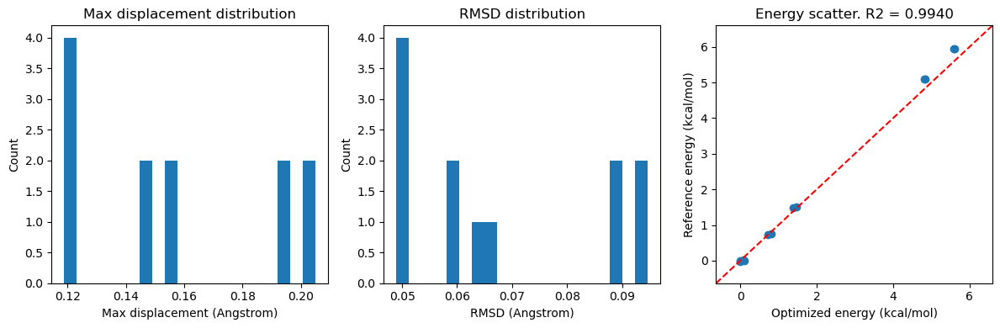

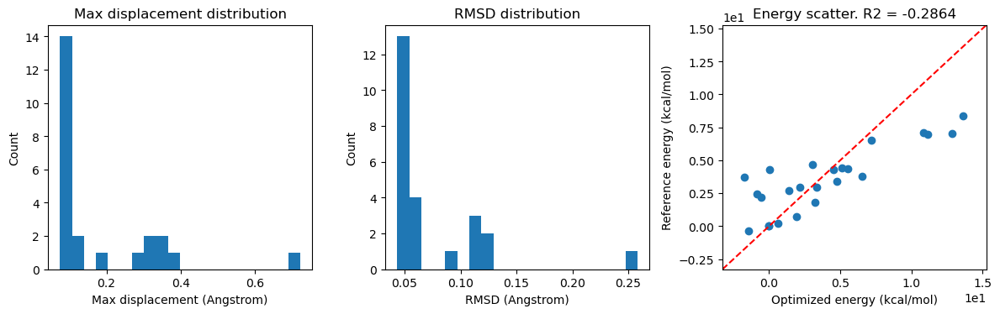

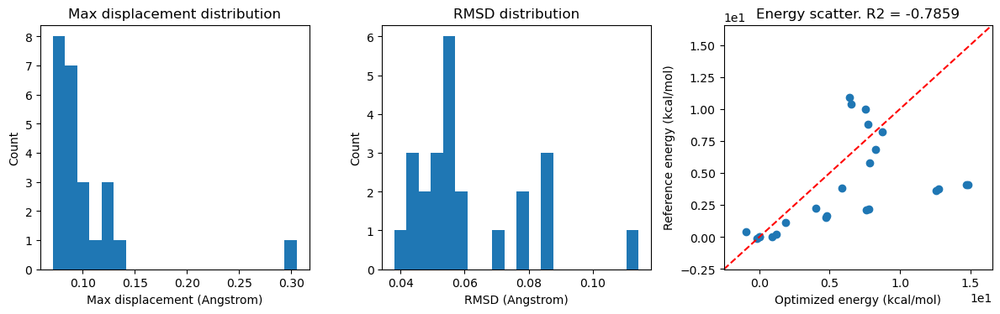

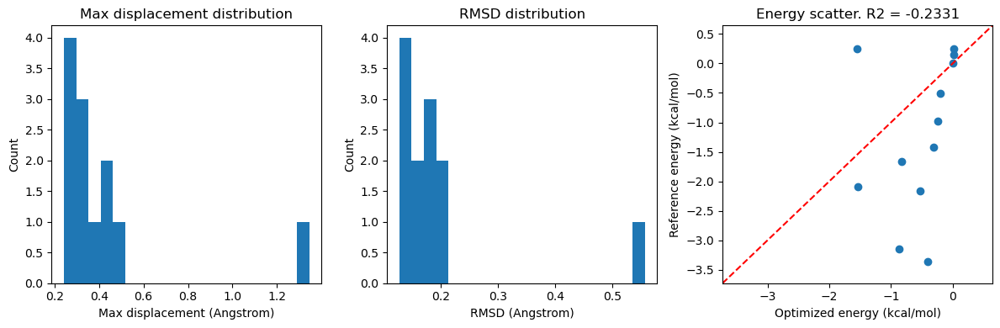

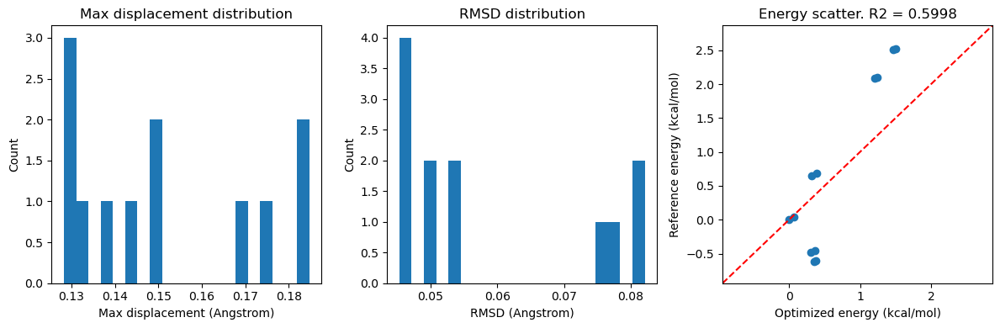

...

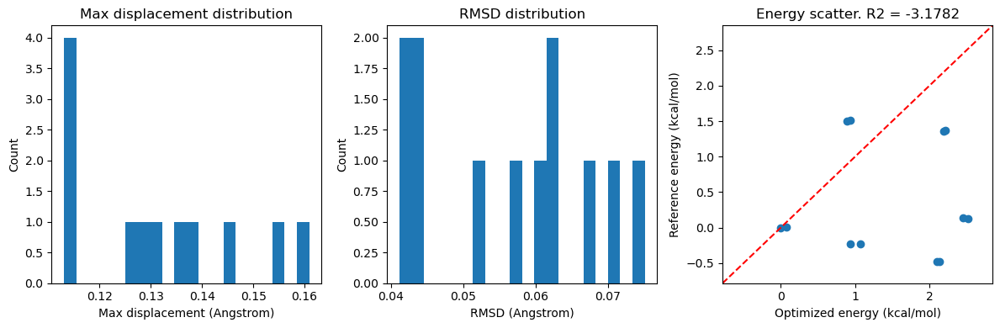

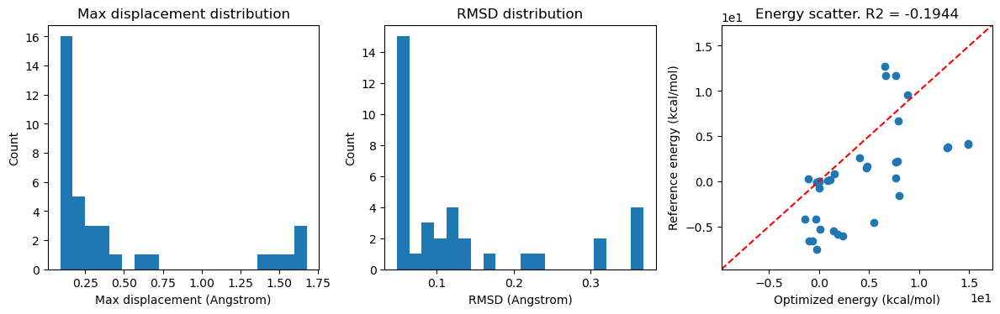

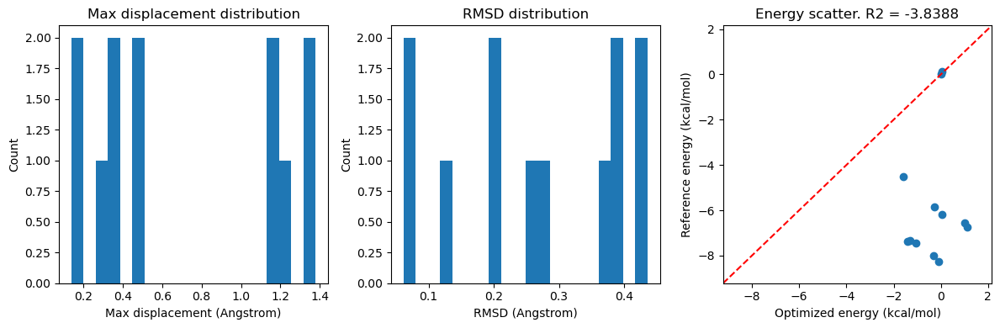

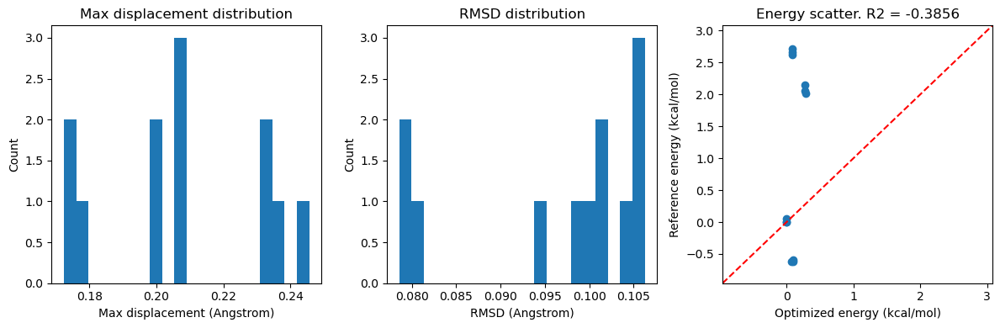

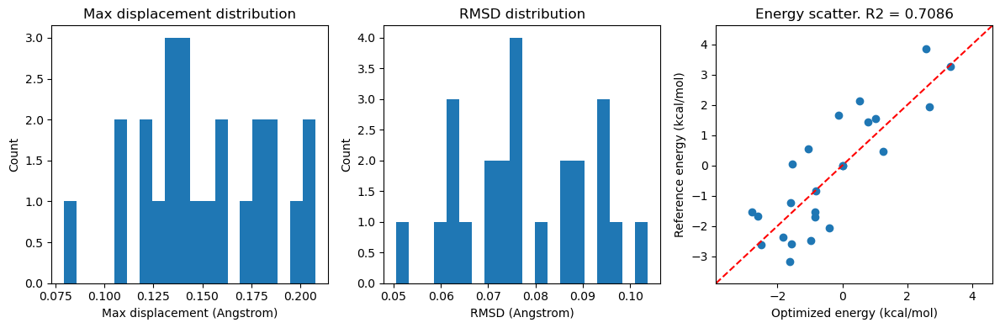

In [4]:
fragments = deepdih.utils.read_sdf("fragments.sdf")

if not os.path.exists("topologies"):
    os.makedirs("topologies")

if not os.path.exists("mm_relax"):
    os.makedirs("mm_relax")

for nfrag in range(len(fragments)):
    frag = fragments[nfrag]
    deepdih.preparation.build_gmx_top(frag, top=f"topologies/fragment_{nfrag}.top")
    calculator = deepdih.calculators.GromacsTopCalculator(frag, f"topologies/fragment_{nfrag}.top")
    init_conformations = deepdih.utils.read_sdf(f"fragments/fragment_{nfrag}_dihedral_scan.sdf")
    relax_conformations = [deepdih.geomopt.relax_conformation(c, calculator) for c in init_conformations]
    recalc_conformations = [deepdih.geomopt.recalc_energy(c, calculator) for c in relax_conformations]
    deepdih.utils.write_sdf(recalc_conformations, f"mm_relax/fragment_{nfrag}_dihedral_scan.sdf")
    deepdih.geomopt.plot_opt_results(init_conformations, recalc_conformations, f"mm_relax/fragment_{nfrag}_opt.png")

In [2]:
fragments = deepdih.utils.read_sdf("fragments.sdf")

# prepare training data
training_data = []
for nfrag in range(len(fragments)):
    qm_conformations = deepdih.utils.read_sdf(f"fragments/fragment_{nfrag}_dihedral_scan.sdf")
    mm_conformations = deepdih.utils.read_sdf(f"mm_relax/fragment_{nfrag}_dihedral_scan.sdf")
    mm_positions = [c.GetConformer().GetPositions() for c in mm_conformations]
    qm_energies = np.array([float(c.GetProp("ENERGY")) for c in qm_conformations])
    mm_energies = np.array([float(c.GetProp("ENERGY")) for c in mm_conformations])
    delta_energies = qm_energies - mm_energies # In Hartree
    delta_energies = delta_energies / deepdih.utils.EV_TO_HARTREE * deepdih.utils.EV_TO_KJ_MOL # In kJ/mol
    embedded_mol = deepdih.utils.TorEmbeddedMolecule(mm_conformations[0], conf=mm_positions, target=delta_energies)
    training_data.append(embedded_mol)

In [10]:
params = deepdih.finetune.finetune_workflow(training_data)

# save the parameters
import pickle

with open("params.pkl", "wb") as f:
    pickle.dump(params, f)

Epoch 1/5000, loss: 113.8989847210577, reg: 8.033554699642975
Epoch 1000/5000, loss: 53.47878788757285, reg: 7.983345631108031
Epoch 2000/5000, loss: 43.95277554188484, reg: 10.64496088338195
Epoch 3000/5000, loss: 38.816801357191714, reg: 12.376468188432039
Epoch 4000/5000, loss: 35.785122200778424, reg: 13.25241784539451
Epoch 5000/5000, loss: 34.18983075266252, reg: 13.33357122201148
Epoch 1/5000, loss: 118.93317362884855, reg: 8.594223783639649
Epoch 1000/5000, loss: 55.078514608067735, reg: 7.497638111491625
Epoch 2000/5000, loss: 45.06005526037185, reg: 10.113160491356311
Epoch 3000/5000, loss: 39.59478258505255, reg: 11.95863639021507
Epoch 4000/5000, loss: 36.222114028399155, reg: 13.186222217948378
Epoch 5000/5000, loss: 34.44399991077912, reg: 13.451395209690551
Epoch 1/5000, loss: 119.99653960965361, reg: 8.08623150855857
Epoch 1000/5000, loss: 55.10394118672831, reg: 7.781640340332928
Epoch 2000/5000, loss: 44.678150368197215, reg: 10.500810674557766
Epoch 3000/5000, loss: 

In [2]:
# load parameters
import pickle

fragments = deepdih.utils.read_sdf("fragments.sdf")
with open("params.pkl", "rb") as f:
    params = pickle.load(f)

if not os.path.exists("top_tuned"):
    os.makedirs("top_tuned")

for nfrag in range(len(fragments)):
    frag = fragments[nfrag]
    inp_top = f"topologies/fragment_{nfrag}.top"
    out_top = f"top_tuned/fragment_{nfrag}.top"
    deepdih.finetune.update_gmx_top(frag, inp_top, params, out_top)

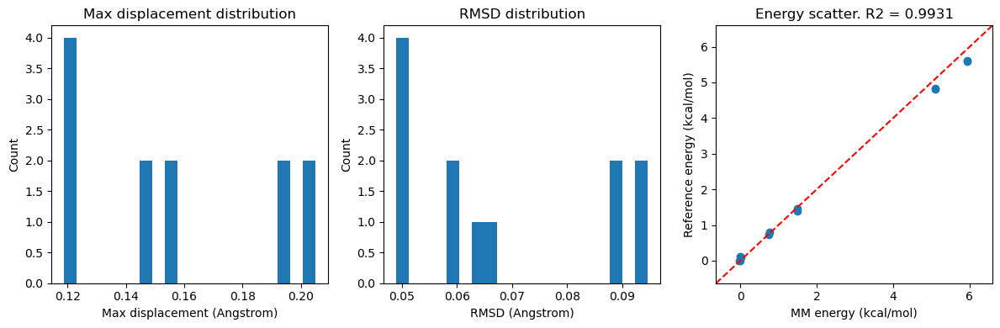

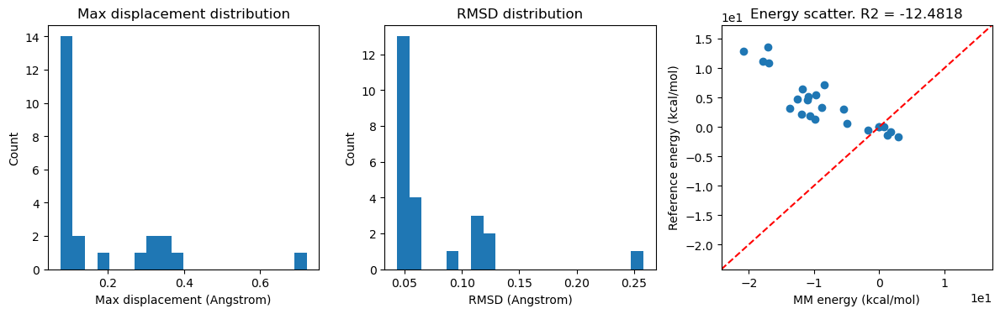

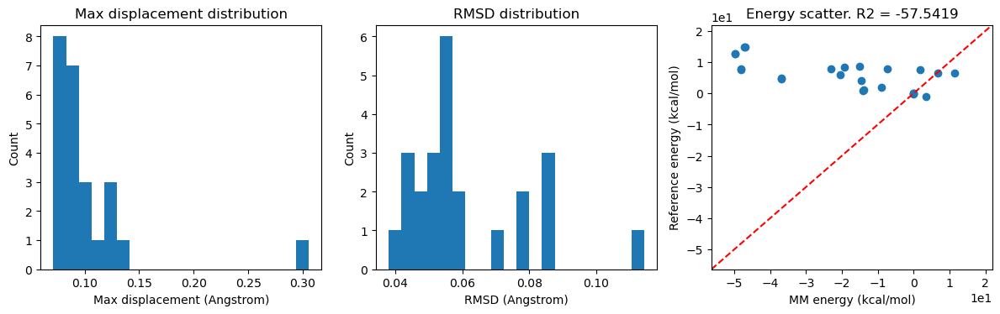

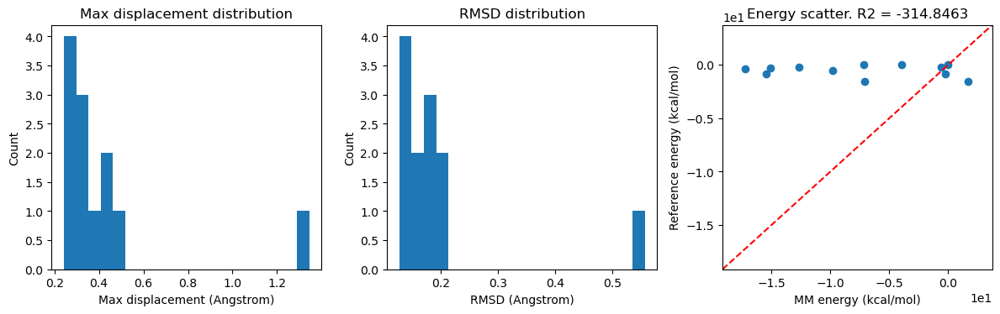

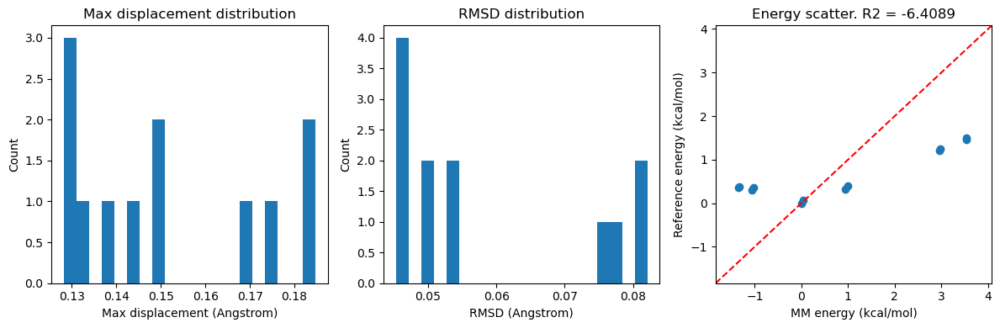

...

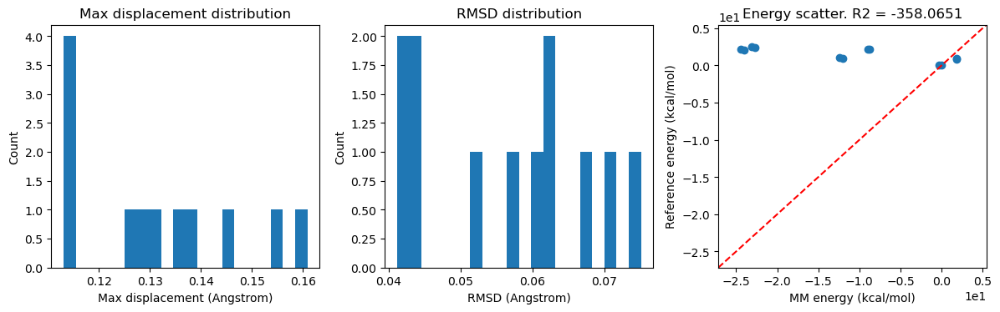

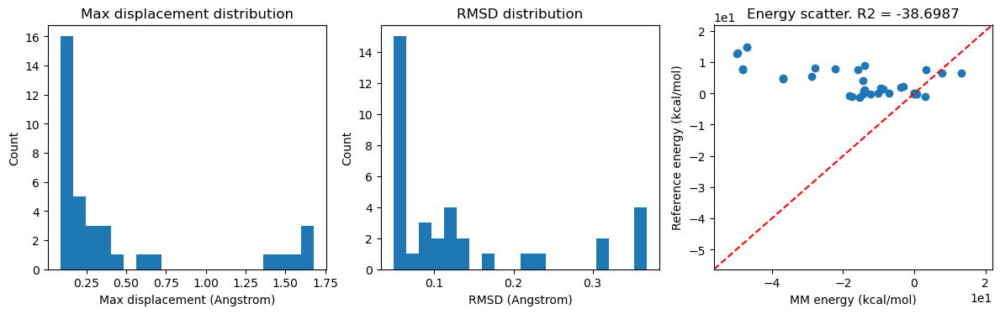

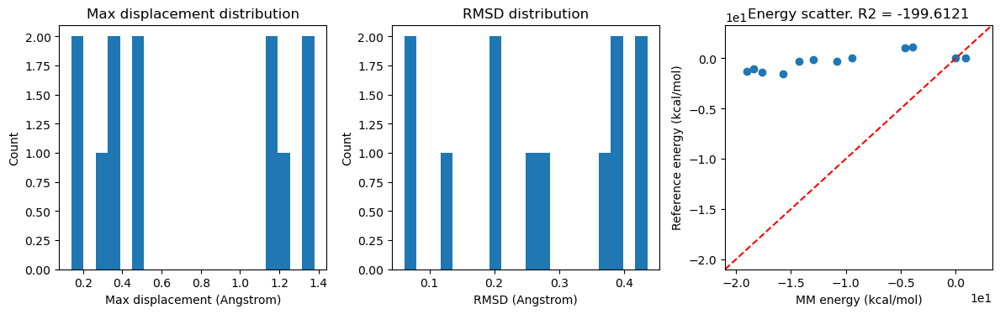

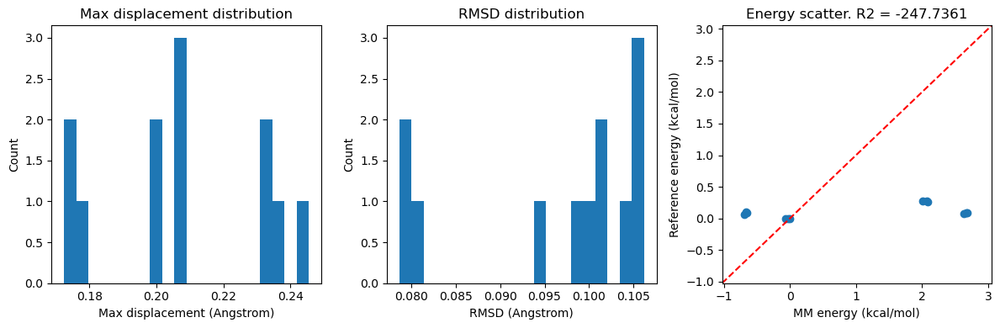

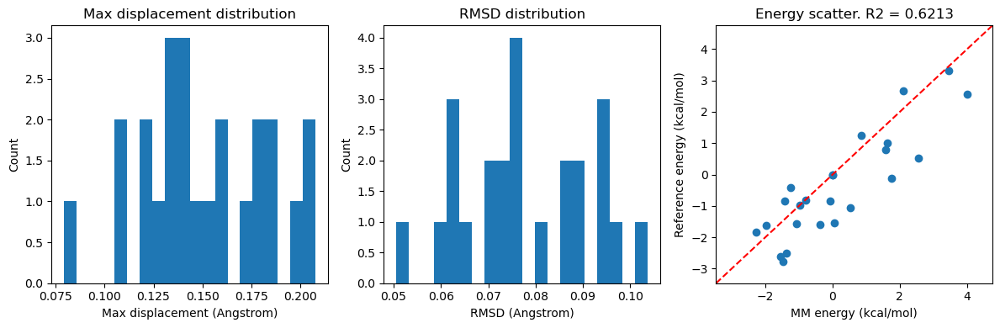

In [4]:
# valid
if not os.path.exists("mm_valid"):
    os.makedirs("mm_valid")

for nfrag in range(len(fragments)):
    frag = fragments[nfrag]
    calculator = deepdih.calculators.GromacsTopCalculator(frag, f"top_tuned/fragment_{nfrag}.top")
    init_conformations = deepdih.utils.read_sdf(f"fragments/fragment_{nfrag}_dihedral_scan.sdf")
    relax_conformations = deepdih.utils.read_sdf(f"mm_relax/fragment_{nfrag}_dihedral_scan.sdf")
    recalc_conformations = [deepdih.geomopt.recalc_energy(c, calculator) for c in relax_conformations]
    deepdih.utils.write_sdf(recalc_conformations, f"mm_valid/fragment_{nfrag}_dihedral_scan.sdf")
    deepdih.geomopt.plot_opt_results(recalc_conformations, init_conformations, f"mm_valid/fragment_{nfrag}_opt.png")